In [1]:
import os
import numpy as np
import torch as T
import torch.nn as nn
import torch.optim as optim
from torch.distributions.normal import Normal
import matplotlib.pyplot as plt
import gym

D:\miniconda3\envs\cmpe260\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import a3_gym_env
gym.make('Pendulum-v260')

<OrderEnforcing<PassiveEnvChecker<CustomPendulumEnv<Pendulum-v260>>>>

In [3]:
class ReplayBuffer:
    def __init__(self):
        self.states = []
        self.probs = []
        self.vals = []
        self.actions = []
        self.rewards = []
        self.dones = []

    def store_memory(self, state, action, probs, vals, reward, done):
        self.states.append(state)
        self.actions.append(action)
        self.probs.append(probs)
        self.vals.append(vals)
        self.rewards.append(reward)
        self.dones.append(done)

In [4]:
class ActorNetwork(nn.Module):
    def __init__(self, input_dims, output_dims, alpha,
                 hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # actor network to estimate mean of the gaussian distribution
        self.actor = nn.Sequential()
        self.actor.append(nn.Linear(*input_dims, hidden_dims))
        for i in range(hidden_layers):
            self.actor.append(nn.Linear(hidden_dims, hidden_dims))
            self.actor.append(nn.ReLU())
        self.actor.append(nn.Linear(hidden_dims, output_dims))
        # use constant standard deviation
        log_std = -0.9 * np.ones(output_dims, dtype=np.float32)
        self.log_std = T.nn.Parameter(T.as_tensor(log_std))
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
#         self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        m = self.actor(state)
        # return normal distribution
        dist = Normal(m, T.exp(self.log_std))
        return dist


In [5]:
class CriticNetwork(nn.Module):
    def __init__(self, input_dims, alpha, hidden_layers = 2, hidden_dims=8, N=1):
        super().__init__()
        # crtic network for estimating value
        self.critic = nn.Sequential()
        self.critic.append(nn.Linear(*input_dims, hidden_dims))
        for i in range(hidden_layers):
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
            self.critic.append(nn.Linear(hidden_dims, hidden_dims))
            self.critic.append(nn.ReLU())
        self.critic.append(nn.Linear(hidden_dims, 1))
        
        self.optimizer = optim.Adam(self.parameters(), lr=alpha/N, eps=1e-05)
#         self.scheduler = optim.lr_scheduler.ReduceLROnPlateau(self.optimizer)
        self.device = T.device('cuda:0' if T.cuda.is_available() else 'cpu')
        self.to(self.device)

    def forward(self, state):
        # return value
        value = self.critic(state)
        return value


In [6]:
def choose_action_value(observation, actor, critics):
        # convert state to tensor
        state = T.tensor([observation], dtype=T.float).to(actor.device)
        # get gaussian distribution for state
        dist = actor(state)
        # get value for current state
        value = T.tensor([critic(state) for critic in critics]).mean()
        # sample action
        action = dist.sample()

        # get log prob for sampled action (to be used for ratio)
        probs = T.squeeze(dist.log_prob(action)).item()
        action = T.squeeze(action).item()
        value = T.squeeze(value).item()
        # return action, log prob for sampled action and value for current state
        return action, probs, value

In [7]:
def get_advantages(gamma, lmbda, values, dones, rewards,
                   next_value, next_done, use_gae):
    num_steps = len(rewards)
    if use_gae:
        advantages = np.zeros_like(rewards)
        last_gae_lam = 0
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_values = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_values = values[t + 1]
            delta = rewards[t] + gamma * next_values * next_non_terminal - values[t]
            advantages[t] = last_gae_lam = delta + gamma * lmbda * next_non_terminal * last_gae_lam

        returns = advantages + values
    else:
        returns = np.zeros_like(rewards)
        for t in reversed(range(num_steps)):
            if t == num_steps - 1:
                next_non_terminal = 1.0 - next_done
                next_return = next_value
            else:
                next_non_terminal = 1.0 - dones[t + 1]
                next_return = returns[t + 1]
            returns[t] = rewards[t] + gamma * next_non_terminal * next_return
        advantages = returns - values
    return returns, advantages

In [8]:
def combine_trajectories(trajectories):
    c_states = []
    c_actions = []
    c_rewards = []
    c_logprobs = []
    c_values = []
    c_dones = []
    c_returns = []
    c_advantages = []
    for k, v in trajectories.items():
        buf, ret, adv = v
        c_states.extend(buf.states)
        c_actions.extend(buf.actions)
        c_rewards.extend(buf.rewards)
        c_logprobs.extend(buf.probs)
        c_values.extend(buf.vals)
        c_dones.extend(buf.dones)
        c_returns.extend(ret)
        c_advantages.extend(adv)
    return {
        'states': c_states,
        'actions': c_actions,
        'rewards': c_rewards,
        'logprobs': c_logprobs,
        'values': c_values,
        'dones': c_dones,
        'returns': c_returns,
        'advantages': c_advantages,
    }

In [9]:
def ppo(N = 1, M = 50, max_trajectory_len = 200, batch_size = 25,
        alpha = 0.0001, hidden_layers = 2, hidden_dims = 8, gamma = 0.99,
        lmbda = 0.95, clip_value = 0.2, use_gae=True, use_clip=True, n_critic=1):
    # N = 1 # number of times to collect new trajectories and update actor
    # M = 50 # num of trajectories
    # max_trajectory_len = 200 # trajectory length
    # batch_size = 25 # size for minibatch
    # n_epochs = 30 # number of epochs to optimize loss
    # alpha = 0.00005
    # hidden_layers = 3
    # hidden_dims = 10
    # gamma = 0.8
    # lmbda = 0.95
    # clip_value = 0.2
    # use_gae = True
    # use_clip = True

    env = gym.make('Pendulum-v260')
    input_dim = env.observation_space.shape
    actor = ActorNetwork(input_dims=input_dim, output_dims=1, alpha=alpha,
                        hidden_layers=hidden_layers, hidden_dims=hidden_dims)
    critics = [CriticNetwork(input_dims=input_dim, alpha=alpha,
                             hidden_layers=hidden_layers,
                             hidden_dims=hidden_dims) for _ in range(n_critic)]
    trajectories = {}
    total_loss_list = []
    loss_list = []
    reward_list = []
    observation_list = []
    for n in range(N):
        # collect M trajectories, their returns, and activations
        for i in range(M):
            curr_trajectory = ReplayBuffer()
            observation = env.reset()
            done = False
            steps = 0
            while steps < max_trajectory_len:
                action, prob, val = choose_action_value(
                    observation, actor, critics)
                next_observation, reward, done, info = env.step([action])
                steps +=1
                curr_trajectory.store_memory(
                    observation, action, prob, val, reward, done)
                observation = next_observation
                if done:
                    break
            # get GAE advantage
            # get value of next_observation
            next_value = T.tensor([critic(T.tensor(observation).to(actor.device)) for critic in critics]).mean()
            # calculate return and advantage
            returns, advantages = get_advantages(
                gamma, lmbda, curr_trajectory.vals, curr_trajectory.dones,
                curr_trajectory.rewards, next_value, done, use_gae)
            trajectories[i] = (curr_trajectory, returns, advantages)

        # combine_trajectories
        c_trajectories = combine_trajectories(trajectories)
        total_steps_taken = len(c_trajectories['states'])
        indicies = np.arange(total_steps_taken)
        np.random.shuffle(indicies)
        
        # optimize loss
        for epoch in range(n_epochs):
            # get batches
            for start in range(0, total_steps_taken, batch_size):
                end = start + batch_size
                # batch indicies
                b_indicies = indicies[start:end]

                states = T.tensor(
                    np.array(c_trajectories['states'])[b_indicies],
                    dtype=T.float).to(actor.device)
                new_values = T.stack([critic(states) for critic in critics]).mean(axis=0)
                distr = actor(states)

                old_log_prob = T.tensor(
                    np.array(c_trajectories['logprobs'])[b_indicies]).to(actor.device)
                actions = T.tensor(
                    np.array(c_trajectories['actions'])[b_indicies],
                    dtype=T.float).to(actor.device)
                new_log_prob = distr.log_prob(actions)

                # Probability ratio
                log_ratio = new_log_prob - old_log_prob
                ratio = log_ratio.exp()

                b_returns = T.tensor(
                    np.array(c_trajectories['returns'])[b_indicies]).to(actor.device)
                b_advantages = T.tensor(
                    np.array(c_trajectories['advantages'])[b_indicies]).to(actor.device)
#                 b_advantages = (b_advantages-b_advantages.mean())/(b_advantages.std()+1e-8)
                # Clipping
                weighted_probs = b_advantages * ratio
                if use_clip:
                    weighted_clipped_probs = T.clamp(ratio, 1-clip_value,
                            1+clip_value)*b_advantages
                    actor_loss = -T.min(
                        weighted_probs, weighted_clipped_probs).mean()
                else:
                    weighted_probs = b_advantages * ratio
                    actor_loss = -(weighted_probs).mean()
                critic_loss = (b_returns-new_values)**2
                critic_loss = critic_loss.mean()

                total_loss = actor_loss + 0.5*critic_loss
                print("n: {}, epoch: {}, minibatch no.: {},".format(
                    n, epoch, start//batch_size))
                print("total_loss: {}, actor_loss: {}, critic_loss: {}".format(
                    total_loss, actor_loss, critic_loss))
                
                total_loss_list.append(total_loss)
                actor.optimizer.zero_grad()
                for critic in critics:
                    critic.optimizer.zero_grad()
                total_loss.backward()
                actor.optimizer.step()
                for critic in critics:
                    critic.optimizer.step()
#             actor.scheduler.step(actor_loss)
#             critic.scheduler.step(critic_loss)

        # get a single trajectory from actor for plotting
        loss_list.append(total_loss)
        reward_list.append(b_returns.mean())
    
        observation = env.reset()
        done = False
        steps = 0
        while steps < 200:
            action, prob, val = choose_action_value(
                observation, actor, critics)
            next_observation, reward, done, info = env.step([action])
            observation_list.append(observation)
            observation = next_observation
            steps += 1
            if done:
                break
    
    return total_loss_list, observation_list, loss_list, reward_list

## Clipped and GAE

In [10]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = True
n_critic = 5

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip, n_critic)

D:\miniconda3\envs\cmpe260\lib\site-packages\gym\utils\passive_env_checker.py:195: UserWarning: WARN: The result returned by `env.reset()` was not a tuple of the form `(obs, info)`, where `obs` is a observation and `info` is a dictionary containing additional information. Actual type: `<class 'numpy.ndarray'>`
  logger.warn(
C:\Users\kj\AppData\Local\Temp\ipykernel_14260\3273781350.py:3: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:233.)
  state = T.tensor([observation], dtype=T.float).to(actor.device)
D:\miniconda3\envs\cmpe260\lib\site-packages\gym\utils\passive_env_checker.py:219: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API.

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 158.7134757963926, actor_loss: 16.493868974522094, critic_loss: 284.439213643741
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 173.18448430368105, actor_loss: 17.22868416889713, critic_loss: 311.9116002695678
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 208.02055950472672, actor_loss: 20.172373989535185, critic_loss: 375.6963710303831
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 170.81387444409492, actor_loss: 17.345624181568535, critic_loss: 306.9365005250528
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 212.25825788263114, actor_loss: 20.461785309985956, critic_loss: 383.59294514529034
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 174.3942302741323, actor_loss: 18.167148879663323, critic_loss: 312.45416278893794
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 217.6746610848941, actor_loss: 19.340812437951136, critic_loss: 396.6676972938859
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 193.1112408811309, actor_loss: 18.341669123405296, cri

n: 0, epoch: 8, minibatch no.: 7,
total_loss: 190.11955591476416, actor_loss: 18.150877562094642, critic_loss: 343.937356705339
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 155.51355946820595, actor_loss: 15.83107330604734, critic_loss: 279.36497232431725
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 169.80849597805766, actor_loss: 16.638586877339616, critic_loss: 306.3398182014361
n: 0, epoch: 9, minibatch no.: 2,
total_loss: 203.92371422157953, actor_loss: 19.356313424960774, critic_loss: 369.1348015932375
n: 0, epoch: 9, minibatch no.: 3,
total_loss: 167.7743577072709, actor_loss: 17.119023415409075, critic_loss: 301.3106685837236
n: 0, epoch: 9, minibatch no.: 4,
total_loss: 208.41920995483517, actor_loss: 20.13908478064613, critic_loss: 376.5602503483781
n: 0, epoch: 9, minibatch no.: 5,
total_loss: 171.37853055477467, actor_loss: 18.191431438442674, critic_loss: 306.374198232664
n: 0, epoch: 9, minibatch no.: 6,
total_loss: 213.881107863534, actor_loss: 19.200614969747207, criti

n: 0, epoch: 18, minibatch no.: 0,
total_loss: 123.49415671531756, actor_loss: 15.748530766560155, critic_loss: 215.49125189751481
n: 0, epoch: 18, minibatch no.: 1,
total_loss: 131.9373405588466, actor_loss: 16.56303815899104, critic_loss: 230.74860479971116
n: 0, epoch: 18, minibatch no.: 2,
total_loss: 155.30539354032737, actor_loss: 19.334313758535526, critic_loss: 271.9421595635837
n: 0, epoch: 18, minibatch no.: 3,
total_loss: 129.37851497511033, actor_loss: 17.062839167084938, critic_loss: 224.63135161605078
n: 0, epoch: 18, minibatch no.: 4,
total_loss: 153.5596220508715, actor_loss: 20.163929847749525, critic_loss: 266.79138440624394
n: 0, epoch: 18, minibatch no.: 5,
total_loss: 125.60939344802003, actor_loss: 18.21588276723793, critic_loss: 214.7870213615642
n: 0, epoch: 18, minibatch no.: 6,
total_loss: 155.2224641696167, actor_loss: 19.176184994045858, critic_loss: 272.0925583511417
n: 0, epoch: 18, minibatch no.: 7,
total_loss: 129.54403489287427, actor_loss: 18.121718321

n: 0, epoch: 26, minibatch no.: 5,
total_loss: 55.87506381235231, actor_loss: 18.223882316836903, critic_loss: 75.30236299103082
n: 0, epoch: 26, minibatch no.: 6,
total_loss: 54.12412968337743, actor_loss: 19.15664353713853, critic_loss: 69.93497229247781
n: 0, epoch: 26, minibatch no.: 7,
total_loss: 54.78928093660507, actor_loss: 18.107666043778085, critic_loss: 73.36322978565396
n: 0, epoch: 27, minibatch no.: 0,
total_loss: 49.3710012278159, actor_loss: 15.713923411202998, critic_loss: 67.31415563322581
n: 0, epoch: 27, minibatch no.: 1,
total_loss: 57.4251970766219, actor_loss: 16.51678509682169, critic_loss: 81.81682395960043
n: 0, epoch: 27, minibatch no.: 2,
total_loss: 57.37570079073907, actor_loss: 19.32806654415046, critic_loss: 76.09526849317722
n: 0, epoch: 27, minibatch no.: 3,
total_loss: 52.284932440014025, actor_loss: 17.029187760190275, critic_loss: 70.5114893596475
n: 0, epoch: 27, minibatch no.: 4,
total_loss: 51.39985999928261, actor_loss: 20.191199396081647, crit

n: 1, epoch: 5, minibatch no.: 0,
total_loss: 31.561112394734128, actor_loss: 7.949449602904651, critic_loss: 47.223325583658955
n: 1, epoch: 5, minibatch no.: 1,
total_loss: 38.35124065307954, actor_loss: 8.195334331691603, critic_loss: 60.31181264277588
n: 1, epoch: 5, minibatch no.: 2,
total_loss: 33.95499594108455, actor_loss: 8.174378864906375, critic_loss: 51.56123415235635
n: 1, epoch: 5, minibatch no.: 3,
total_loss: 35.64712089190424, actor_loss: 7.972442822833975, critic_loss: 55.34935613814052
n: 1, epoch: 5, minibatch no.: 4,
total_loss: 36.31671367818637, actor_loss: 8.439349128841306, critic_loss: 55.75472909869013
n: 1, epoch: 5, minibatch no.: 5,
total_loss: 32.742175347440494, actor_loss: 7.219844582666895, critic_loss: 51.04466152954719
n: 1, epoch: 5, minibatch no.: 6,
total_loss: 43.8085619615255, actor_loss: 8.913136221000771, critic_loss: 69.79085148104946
n: 1, epoch: 5, minibatch no.: 7,
total_loss: 25.76823680128959, actor_loss: 6.914634670420319, critic_loss: 

n: 1, epoch: 13, minibatch no.: 6,
total_loss: 34.990265132183794, actor_loss: 8.912820983799751, critic_loss: 52.154888296768085
n: 1, epoch: 13, minibatch no.: 7,
total_loss: 22.8959349830015, actor_loss: 6.907985982427694, critic_loss: 31.97589800114761
n: 1, epoch: 14, minibatch no.: 0,
total_loss: 25.205169567978196, actor_loss: 7.947695648634643, critic_loss: 34.51494783868711
n: 1, epoch: 14, minibatch no.: 1,
total_loss: 30.651045245284934, actor_loss: 8.183287892850988, critic_loss: 44.93551470486789
n: 1, epoch: 14, minibatch no.: 2,
total_loss: 26.209658587662368, actor_loss: 8.141121873089297, critic_loss: 36.13707342914614
n: 1, epoch: 14, minibatch no.: 3,
total_loss: 27.607452491827633, actor_loss: 7.967726156155131, critic_loss: 39.279452671345005
n: 1, epoch: 14, minibatch no.: 4,
total_loss: 27.127947185431424, actor_loss: 8.432296175668428, critic_loss: 37.39130201952599
n: 1, epoch: 14, minibatch no.: 5,
total_loss: 27.030408310104086, actor_loss: 7.216960533190899,

n: 1, epoch: 22, minibatch no.: 3,
total_loss: 23.974004124537117, actor_loss: 7.9650403734663415, critic_loss: 32.01792750214155
n: 1, epoch: 22, minibatch no.: 4,
total_loss: 22.729787567312947, actor_loss: 8.42672190605199, critic_loss: 28.606131322521914
n: 1, epoch: 22, minibatch no.: 5,
total_loss: 24.130310425269457, actor_loss: 7.21442874629036, critic_loss: 33.831763357958195
n: 1, epoch: 22, minibatch no.: 6,
total_loss: 29.72084160822854, actor_loss: 8.913700240470627, critic_loss: 41.61428273551583
n: 1, epoch: 22, minibatch no.: 7,
total_loss: 20.639870180538338, actor_loss: 6.899464067062519, critic_loss: 27.480812226951635
n: 1, epoch: 23, minibatch no.: 0,
total_loss: 21.93040699834303, actor_loss: 7.9499184741035105, critic_loss: 27.96097704847904
n: 1, epoch: 23, minibatch no.: 1,
total_loss: 26.469342203332527, actor_loss: 8.173242870703852, critic_loss: 36.59219866525735
n: 1, epoch: 23, minibatch no.: 2,
total_loss: 22.43534754699545, actor_loss: 8.119640952118324,

n: 2, epoch: 1, minibatch no.: 1,
total_loss: 42.03119345762444, actor_loss: -3.2538995252586282, critic_loss: 90.57018596576614
n: 2, epoch: 1, minibatch no.: 2,
total_loss: 50.60183712105267, actor_loss: -1.0105011519046214, critic_loss: 103.22467654591458
n: 2, epoch: 1, minibatch no.: 3,
total_loss: 37.8713688490305, actor_loss: -2.1359967946112244, critic_loss: 80.01473128728345
n: 2, epoch: 1, minibatch no.: 4,
total_loss: 42.5945872686306, actor_loss: -2.4916146922463023, critic_loss: 90.1724039217538
n: 2, epoch: 1, minibatch no.: 5,
total_loss: 37.815701534498565, actor_loss: -1.4798652475706917, critic_loss: 78.59113356413852
n: 2, epoch: 1, minibatch no.: 6,
total_loss: 46.56560617002925, actor_loss: -1.0718907504332893, critic_loss: 95.27499384092508
n: 2, epoch: 1, minibatch no.: 7,
total_loss: 33.16451427561204, actor_loss: -2.65147226751769, critic_loss: 71.63197308625946
n: 2, epoch: 2, minibatch no.: 0,
total_loss: 33.803221163692214, actor_loss: -3.096321596380241, cr

n: 2, epoch: 9, minibatch no.: 3,
total_loss: 33.51433449083943, actor_loss: -2.1375623964042307, critic_loss: 71.30379377448732
n: 2, epoch: 9, minibatch no.: 4,
total_loss: 38.3409934630575, actor_loss: -2.4972270327052777, critic_loss: 81.67644099152555
n: 2, epoch: 9, minibatch no.: 5,
total_loss: 30.900598005753125, actor_loss: -1.480095804763019, critic_loss: 64.76138762103228
n: 2, epoch: 9, minibatch no.: 6,
total_loss: 38.558601991402625, actor_loss: -1.0643446017499598, critic_loss: 79.24589318630517
n: 2, epoch: 9, minibatch no.: 7,
total_loss: 29.0496768193529, actor_loss: -2.6562866689115507, critic_loss: 63.4119269765289
n: 2, epoch: 10, minibatch no.: 0,
total_loss: 28.93861460373666, actor_loss: -3.103991763116241, critic_loss: 64.0852127337058
n: 2, epoch: 10, minibatch no.: 1,
total_loss: 35.45804057467493, actor_loss: -3.2761277415053853, critic_loss: 77.46833663236063
n: 2, epoch: 10, minibatch no.: 2,
total_loss: 43.17027462452351, actor_loss: -1.0208765728931588, 

n: 2, epoch: 18, minibatch no.: 0,
total_loss: 27.251989788594422, actor_loss: -3.10652025365803, critic_loss: 60.7170200845049
n: 2, epoch: 18, minibatch no.: 1,
total_loss: 33.728567792438795, actor_loss: -3.279541391328973, critic_loss: 74.01621836753553
n: 2, epoch: 18, minibatch no.: 2,
total_loss: 41.381724477549945, actor_loss: -1.02217420593741, critic_loss: 84.80779736697471
n: 2, epoch: 18, minibatch no.: 3,
total_loss: 32.37257683739067, actor_loss: -2.140755714181492, critic_loss: 69.02666510314432
n: 2, epoch: 18, minibatch no.: 4,
total_loss: 37.06844991431672, actor_loss: -2.5016891671587618, critic_loss: 79.14027816295096
n: 2, epoch: 18, minibatch no.: 5,
total_loss: 28.96067974138777, actor_loss: -1.4798902464334756, critic_loss: 60.8811399756425
n: 2, epoch: 18, minibatch no.: 6,
total_loss: 36.54638374694087, actor_loss: -1.0618119331381473, critic_loss: 75.21639136015803
n: 2, epoch: 18, minibatch no.: 7,
total_loss: 27.823546209368832, actor_loss: -2.6581968630922

n: 2, epoch: 26, minibatch no.: 6,
total_loss: 36.29897485650078, actor_loss: -1.0603356576309728, critic_loss: 74.7186210282635
n: 2, epoch: 26, minibatch no.: 7,
total_loss: 27.681152067115057, actor_loss: -2.659800605147536, critic_loss: 60.681905344525184
n: 2, epoch: 27, minibatch no.: 0,
total_loss: 26.93583911766944, actor_loss: -3.108631001202453, critic_loss: 60.088940237743785
n: 2, epoch: 27, minibatch no.: 1,
total_loss: 33.360482267212895, actor_loss: -3.28212107308081, critic_loss: 73.28520668058741
n: 2, epoch: 27, minibatch no.: 2,
total_loss: 41.04650806898289, actor_loss: -1.0233722982846025, critic_loss: 84.13976073453497
n: 2, epoch: 27, minibatch no.: 3,
total_loss: 32.339042228968296, actor_loss: -2.143262792478876, critic_loss: 68.96461004289435
n: 2, epoch: 27, minibatch no.: 4,
total_loss: 36.94892697756384, actor_loss: -2.50436226364286, critic_loss: 78.90657848241341
n: 2, epoch: 27, minibatch no.: 5,
total_loss: 28.670028653208764, actor_loss: -1.47973556649

n: 3, epoch: 5, minibatch no.: 0,
total_loss: 6.959417114165229, actor_loss: 5.933768137029258, critic_loss: 2.0512979542719414
n: 3, epoch: 5, minibatch no.: 1,
total_loss: 6.9240360005976695, actor_loss: 5.335432706896893, critic_loss: 3.177206587401553
n: 3, epoch: 5, minibatch no.: 2,
total_loss: 8.094836501363474, actor_loss: 6.297543949244489, critic_loss: 3.59458510423797
n: 3, epoch: 5, minibatch no.: 3,
total_loss: 6.8836507819439445, actor_loss: 5.185578146712903, critic_loss: 3.396145270462084
n: 3, epoch: 5, minibatch no.: 4,
total_loss: 7.132521571079689, actor_loss: 5.538137824618107, critic_loss: 3.188767492923163
n: 3, epoch: 5, minibatch no.: 5,
total_loss: 7.627792473066891, actor_loss: 6.460718993978671, critic_loss: 2.3341469581764396
n: 3, epoch: 5, minibatch no.: 6,
total_loss: 7.5624773895106205, actor_loss: 6.169131887832123, critic_loss: 2.786691003356995
n: 3, epoch: 5, minibatch no.: 7,
total_loss: 7.934667646219392, actor_loss: 6.4233687120441045, critic_los

n: 3, epoch: 13, minibatch no.: 4,
total_loss: 6.873030701285007, actor_loss: 5.53282350166202, critic_loss: 2.6804143992459744
n: 3, epoch: 13, minibatch no.: 5,
total_loss: 7.659012792762209, actor_loss: 6.466428860325206, critic_loss: 2.3851678648740067
n: 3, epoch: 13, minibatch no.: 6,
total_loss: 7.6050778607544185, actor_loss: 6.166345783559121, critic_loss: 2.877464154390595
n: 3, epoch: 13, minibatch no.: 7,
total_loss: 8.05126975296272, actor_loss: 6.418991842692333, critic_loss: 3.264555820540773
n: 3, epoch: 14, minibatch no.: 0,
total_loss: 6.951569479270901, actor_loss: 5.929135397455205, critic_loss: 2.044868163631393
n: 3, epoch: 14, minibatch no.: 1,
total_loss: 6.79723717765351, actor_loss: 5.32956204128388, critic_loss: 2.9353502727392597
n: 3, epoch: 14, minibatch no.: 2,
total_loss: 8.120489670900188, actor_loss: 6.298678154926068, critic_loss: 3.6436230319482394
n: 3, epoch: 14, minibatch no.: 3,
total_loss: 6.4916491504189, actor_loss: 5.17908433260996, critic_lo

n: 3, epoch: 21, minibatch no.: 4,
total_loss: 6.859430550098212, actor_loss: 5.528522032311416, critic_loss: 2.661817035573592
n: 3, epoch: 21, minibatch no.: 5,
total_loss: 7.666209721289726, actor_loss: 6.47034251207526, critic_loss: 2.3917344184289324
n: 3, epoch: 21, minibatch no.: 6,
total_loss: 7.606937208382709, actor_loss: 6.164710080781985, critic_loss: 2.884454255201448
n: 3, epoch: 21, minibatch no.: 7,
total_loss: 8.053562475423401, actor_loss: 6.418073122346512, critic_loss: 3.27097870615378
n: 3, epoch: 22, minibatch no.: 0,
total_loss: 6.944740150331938, actor_loss: 5.924999647112279, critic_loss: 2.039481006439319
n: 3, epoch: 22, minibatch no.: 1,
total_loss: 6.785291508045397, actor_loss: 5.324103897123785, critic_loss: 2.9223752218432244
n: 3, epoch: 22, minibatch no.: 2,
total_loss: 8.11941251394402, actor_loss: 6.300479682065277, critic_loss: 3.637865663757487
n: 3, epoch: 22, minibatch no.: 3,
total_loss: 6.480466486416894, actor_loss: 5.1729228709729, critic_los

n: 3, epoch: 29, minibatch no.: 7,
total_loss: 8.050967989587397, actor_loss: 6.417922857576541, critic_loss: 3.266090264021711
n: 4, epoch: 0, minibatch no.: 0,
total_loss: 77.33483641210124, actor_loss: -5.915282343844441, critic_loss: 166.50023751189136
n: 4, epoch: 0, minibatch no.: 1,
total_loss: 59.68931816753938, actor_loss: -8.094335652235616, critic_loss: 135.56730763955
n: 4, epoch: 0, minibatch no.: 2,
total_loss: 66.19428141035247, actor_loss: -7.873194645435829, critic_loss: 148.1349521115766
n: 4, epoch: 0, minibatch no.: 3,
total_loss: 63.60959510688026, actor_loss: -6.247501848367918, critic_loss: 139.71419391049636
n: 4, epoch: 0, minibatch no.: 4,
total_loss: 45.256640512273094, actor_loss: -7.049381627751885, critic_loss: 104.61204428004996
n: 4, epoch: 0, minibatch no.: 5,
total_loss: 46.088149651047374, actor_loss: -6.382672875752813, critic_loss: 104.94164505360037
n: 4, epoch: 0, minibatch no.: 6,
total_loss: 52.93760029321869, actor_loss: -6.551223097639959, cri

n: 4, epoch: 9, minibatch no.: 0,
total_loss: 59.31199768459124, actor_loss: -5.909624776661795, critic_loss: 130.44324492250607
n: 4, epoch: 9, minibatch no.: 1,
total_loss: 28.048351219228046, actor_loss: -8.099633968821676, critic_loss: 72.29597037609945
n: 4, epoch: 9, minibatch no.: 2,
total_loss: 39.56311829212697, actor_loss: -7.922005416295787, critic_loss: 94.97024741684552
n: 4, epoch: 9, minibatch no.: 3,
total_loss: 50.53909532712403, actor_loss: -6.311830340700713, critic_loss: 113.70185133564948
n: 4, epoch: 9, minibatch no.: 4,
total_loss: 32.74044961538064, actor_loss: -7.0494593560533865, critic_loss: 79.57981794286806
n: 4, epoch: 9, minibatch no.: 5,
total_loss: 39.223272918498196, actor_loss: -6.459890712319207, critic_loss: 91.36632726163481
n: 4, epoch: 9, minibatch no.: 6,
total_loss: 48.20498130003081, actor_loss: -6.572378024056915, critic_loss: 109.55471864817545
n: 4, epoch: 9, minibatch no.: 7,
total_loss: 58.32361922898455, actor_loss: -7.685571758159888, c

n: 4, epoch: 17, minibatch no.: 4,
total_loss: 32.701925607542165, actor_loss: -7.061506319664, critic_loss: 79.52686385441233
n: 4, epoch: 17, minibatch no.: 5,
total_loss: 39.12228275557878, actor_loss: -6.489518471865512, critic_loss: 91.22360245488859
n: 4, epoch: 17, minibatch no.: 6,
total_loss: 48.11075939975366, actor_loss: -6.605483254009958, critic_loss: 109.43248530752724
n: 4, epoch: 17, minibatch no.: 7,
total_loss: 58.33226695581092, actor_loss: -7.667422706459905, critic_loss: 131.99937932454165
n: 4, epoch: 18, minibatch no.: 0,
total_loss: 59.037188067248735, actor_loss: -5.910404860542882, critic_loss: 129.89518585558324
n: 4, epoch: 18, minibatch no.: 1,
total_loss: 28.18599043000119, actor_loss: -8.125722164181333, critic_loss: 72.62342518836505
n: 4, epoch: 18, minibatch no.: 2,
total_loss: 39.72976451447672, actor_loss: -7.934033407075401, critic_loss: 95.32759584310425
n: 4, epoch: 18, minibatch no.: 3,
total_loss: 50.3838787300092, actor_loss: -6.325660210125924

n: 4, epoch: 25, minibatch no.: 6,
total_loss: 48.09934412039115, actor_loss: -6.613216090501644, critic_loss: 109.42512042178559
n: 4, epoch: 25, minibatch no.: 7,
total_loss: 58.32892633866797, actor_loss: -7.6577733413020574, critic_loss: 131.97339935994006
n: 4, epoch: 26, minibatch no.: 0,
total_loss: 59.02896675802346, actor_loss: -5.909644936470913, critic_loss: 129.87722338898874
n: 4, epoch: 26, minibatch no.: 1,
total_loss: 28.168956035111066, actor_loss: -8.132357950512704, critic_loss: 72.60262797124754
n: 4, epoch: 26, minibatch no.: 2,
total_loss: 39.707601396704014, actor_loss: -7.9535899783588935, critic_loss: 95.32238275012581
n: 4, epoch: 26, minibatch no.: 3,
total_loss: 50.36659529115492, actor_loss: -6.338586826568267, critic_loss: 113.41036423544638
n: 4, epoch: 26, minibatch no.: 4,
total_loss: 32.683369052446935, actor_loss: -7.075211337145479, critic_loss: 79.51716077918483
n: 4, epoch: 26, minibatch no.: 5,
total_loss: 39.10828453765733, actor_loss: -6.5066233

n: 5, epoch: 4, minibatch no.: 4,
total_loss: 24.91973071895066, actor_loss: 2.107089633229893, critic_loss: 45.62528217144153
n: 5, epoch: 4, minibatch no.: 5,
total_loss: 11.3533089210026, actor_loss: -1.1744250024401837, critic_loss: 25.05546784688557
n: 5, epoch: 4, minibatch no.: 6,
total_loss: 33.46756046108816, actor_loss: 5.192060352675308, critic_loss: 56.551000216825706
n: 5, epoch: 4, minibatch no.: 7,
total_loss: 28.318422614301383, actor_loss: 0.33263192535573805, critic_loss: 55.97158137789129
n: 5, epoch: 5, minibatch no.: 0,
total_loss: 27.831035346148848, actor_loss: 1.8101269697088465, critic_loss: 52.04181675288
n: 5, epoch: 5, minibatch no.: 1,
total_loss: 27.539464237615945, actor_loss: 1.6777505347865653, critic_loss: 51.72342740565876
n: 5, epoch: 5, minibatch no.: 2,
total_loss: 19.850661515777983, actor_loss: 0.5372909085760119, critic_loss: 38.62674121440394
n: 5, epoch: 5, minibatch no.: 3,
total_loss: 26.81877569803207, actor_loss: -0.21005875815549954, crit

n: 5, epoch: 12, minibatch no.: 4,
total_loss: 24.855571831180505, actor_loss: 2.120962524754676, critic_loss: 45.469218612851655
n: 5, epoch: 12, minibatch no.: 5,
total_loss: 11.3263816703752, actor_loss: -1.1713613217974643, critic_loss: 24.99548598434533
n: 5, epoch: 12, minibatch no.: 6,
total_loss: 32.34961198539437, actor_loss: 5.192088774953582, critic_loss: 54.31504642088157
n: 5, epoch: 12, minibatch no.: 7,
total_loss: 28.440697245307973, actor_loss: 0.333685135038156, critic_loss: 56.214024220539635
n: 5, epoch: 13, minibatch no.: 0,
total_loss: 27.71333213529402, actor_loss: 1.790099957700327, critic_loss: 51.846464355187386
n: 5, epoch: 13, minibatch no.: 1,
total_loss: 27.533374383656586, actor_loss: 1.6819232513353128, critic_loss: 51.702902264642546
n: 5, epoch: 13, minibatch no.: 2,
total_loss: 19.904067039380454, actor_loss: 0.5248649518509512, critic_loss: 38.758404175059006
n: 5, epoch: 13, minibatch no.: 3,
total_loss: 26.959218054968872, actor_loss: -0.2161238399

n: 5, epoch: 20, minibatch no.: 6,
total_loss: 32.16691744458908, actor_loss: 5.192305288744875, critic_loss: 53.94922431168842
n: 5, epoch: 20, minibatch no.: 7,
total_loss: 28.44984474837722, actor_loss: 0.33309897889154366, critic_loss: 56.23349153897135
n: 5, epoch: 21, minibatch no.: 0,
total_loss: 27.750589191499422, actor_loss: 1.7881276947610776, critic_loss: 51.92492299347669
n: 5, epoch: 21, minibatch no.: 1,
total_loss: 27.568047293783984, actor_loss: 1.6801228380829176, critic_loss: 51.775848911402136
n: 5, epoch: 21, minibatch no.: 2,
total_loss: 19.903889567855035, actor_loss: 0.5240214289153623, critic_loss: 38.75973627787935
n: 5, epoch: 21, minibatch no.: 3,
total_loss: 26.95074340023355, actor_loss: -0.21620552798994505, critic_loss: 54.33389785644699
n: 5, epoch: 21, minibatch no.: 4,
total_loss: 24.893658697180626, actor_loss: 2.120880839586123, critic_loss: 45.54555571518901
n: 5, epoch: 21, minibatch no.: 5,
total_loss: 11.157704207437906, actor_loss: -1.171304370

n: 5, epoch: 29, minibatch no.: 3,
total_loss: 26.95236121148879, actor_loss: -0.21631243860459914, critic_loss: 54.33734730018678
n: 5, epoch: 29, minibatch no.: 4,
total_loss: 24.912326598827654, actor_loss: 2.120864291586307, critic_loss: 45.58292461448269
n: 5, epoch: 29, minibatch no.: 5,
total_loss: 11.097966225082809, actor_loss: -1.1710947143733421, critic_loss: 24.538121878912303
n: 5, epoch: 29, minibatch no.: 6,
total_loss: 32.05592987908543, actor_loss: 5.192418498490688, critic_loss: 53.727022761189495
n: 5, epoch: 29, minibatch no.: 7,
total_loss: 28.4620097184626, actor_loss: 0.33302271919209747, critic_loss: 56.257973998541004
n: 6, epoch: 0, minibatch no.: 0,
total_loss: 50.48797105177974, actor_loss: -0.7323560604353395, critic_loss: 102.44065422443015
n: 6, epoch: 0, minibatch no.: 1,
total_loss: 47.8973660197133, actor_loss: -2.8378119593425244, critic_loss: 101.47035595811165
n: 6, epoch: 0, minibatch no.: 2,
total_loss: 47.97722140742877, actor_loss: -3.0341118613

n: 6, epoch: 8, minibatch no.: 3,
total_loss: 61.10631879779338, actor_loss: -0.8261148477688353, critic_loss: 123.86486729112443
n: 6, epoch: 8, minibatch no.: 4,
total_loss: 46.36438775876705, actor_loss: -2.345195048255133, critic_loss: 97.41916561404437
n: 6, epoch: 8, minibatch no.: 5,
total_loss: 52.70719884671435, actor_loss: -1.2283148205064216, critic_loss: 107.87102733444154
n: 6, epoch: 8, minibatch no.: 6,
total_loss: 45.14876035806544, actor_loss: -3.657083682276732, critic_loss: 97.61168808068435
n: 6, epoch: 8, minibatch no.: 7,
total_loss: 39.84389895998217, actor_loss: -2.9536570456022044, critic_loss: 85.59511201116875
n: 6, epoch: 9, minibatch no.: 0,
total_loss: 51.18338337308133, actor_loss: -0.7358033763603163, critic_loss: 103.83837349888329
n: 6, epoch: 9, minibatch no.: 1,
total_loss: 43.56004081503737, actor_loss: -2.8220578907498344, critic_loss: 92.7641974115744
n: 6, epoch: 9, minibatch no.: 2,
total_loss: 43.43208269969224, actor_loss: -3.0714567448079024,

n: 6, epoch: 16, minibatch no.: 5,
total_loss: 52.6485558633053, actor_loss: -1.2350557018043242, critic_loss: 107.76722313021925
n: 6, epoch: 16, minibatch no.: 6,
total_loss: 45.24940358949729, actor_loss: -3.6503848879413883, critic_loss: 97.79957695487735
n: 6, epoch: 16, minibatch no.: 7,
total_loss: 39.87387962184723, actor_loss: -2.954049277610476, critic_loss: 85.6558577989154
n: 6, epoch: 17, minibatch no.: 0,
total_loss: 51.10532031849673, actor_loss: -0.734467781446667, critic_loss: 103.6795761998868
n: 6, epoch: 17, minibatch no.: 1,
total_loss: 43.54096453686364, actor_loss: -2.8327633629686377, critic_loss: 92.74745579966455
n: 6, epoch: 17, minibatch no.: 2,
total_loss: 43.44004394530696, actor_loss: -3.07413222059583, critic_loss: 93.02835233180558
n: 6, epoch: 17, minibatch no.: 3,
total_loss: 61.02502152329278, actor_loss: -0.8389672982452397, critic_loss: 123.72797764307603
n: 6, epoch: 17, minibatch no.: 4,
total_loss: 46.312077706942794, actor_loss: -2.348594710897

n: 6, epoch: 25, minibatch no.: 0,
total_loss: 51.10199450791248, actor_loss: -0.7334389735132112, critic_loss: 103.67086696285138
n: 6, epoch: 25, minibatch no.: 1,
total_loss: 43.53184686341243, actor_loss: -2.835641932334817, critic_loss: 92.7349775914945
n: 6, epoch: 25, minibatch no.: 2,
total_loss: 43.431024288352916, actor_loss: -3.0756353536453456, critic_loss: 93.01331928399652
n: 6, epoch: 25, minibatch no.: 3,
total_loss: 61.01448311873919, actor_loss: -0.8474094872138241, critic_loss: 123.72378521190603
n: 6, epoch: 25, minibatch no.: 4,
total_loss: 46.30398352135233, actor_loss: -2.34896075721201, critic_loss: 97.30588855712868
n: 6, epoch: 25, minibatch no.: 5,
total_loss: 52.637784157908165, actor_loss: -1.2399010079614243, critic_loss: 107.75537033173917
n: 6, epoch: 25, minibatch no.: 6,
total_loss: 45.266092226710555, actor_loss: -3.6447853163472677, critic_loss: 97.82175508611564
n: 6, epoch: 25, minibatch no.: 7,
total_loss: 39.87159939313441, actor_loss: -2.9539878

n: 7, epoch: 3, minibatch no.: 6,
total_loss: 40.831789160362575, actor_loss: -0.9622695990767379, critic_loss: 83.58811751887863
n: 7, epoch: 3, minibatch no.: 7,
total_loss: 58.72681843809882, actor_loss: 1.097061293311188, critic_loss: 115.25951428957526
n: 7, epoch: 4, minibatch no.: 0,
total_loss: 50.045788375531956, actor_loss: 0.5070742907233835, critic_loss: 99.07742816961715
n: 7, epoch: 4, minibatch no.: 1,
total_loss: 39.62214219885657, actor_loss: -2.265816988342868, critic_loss: 83.77591837439888
n: 7, epoch: 4, minibatch no.: 2,
total_loss: 42.5653659534483, actor_loss: -0.6374386430828523, critic_loss: 86.4056091930623
n: 7, epoch: 4, minibatch no.: 3,
total_loss: 69.31462254142178, actor_loss: 0.8885741716217112, critic_loss: 136.85209673960014
n: 7, epoch: 4, minibatch no.: 4,
total_loss: 52.670090585457665, actor_loss: 0.09263358529697795, critic_loss: 105.15491400032137
n: 7, epoch: 4, minibatch no.: 5,
total_loss: 39.014349289990115, actor_loss: -2.128233462047611, 

n: 7, epoch: 12, minibatch no.: 5,
total_loss: 38.892088145796215, actor_loss: -2.1339704458261113, critic_loss: 82.05211718324465
n: 7, epoch: 12, minibatch no.: 6,
total_loss: 40.87225342632878, actor_loss: -0.9625494495224959, critic_loss: 83.66960575170256
n: 7, epoch: 12, minibatch no.: 7,
total_loss: 58.658027378670205, actor_loss: 1.092978141498876, critic_loss: 115.13009847434266
n: 7, epoch: 13, minibatch no.: 0,
total_loss: 50.04704789686652, actor_loss: 0.5084295327038852, critic_loss: 99.07723672832527
n: 7, epoch: 13, minibatch no.: 1,
total_loss: 39.616136074361904, actor_loss: -2.259130298066399, critic_loss: 83.7505327448566
n: 7, epoch: 13, minibatch no.: 2,
total_loss: 42.58079583407718, actor_loss: -0.6353270932424627, critic_loss: 86.43224585463928
n: 7, epoch: 13, minibatch no.: 3,
total_loss: 69.28378210541031, actor_loss: 0.8735011551708662, critic_loss: 136.82056190047888
n: 7, epoch: 13, minibatch no.: 4,
total_loss: 52.64338833331499, actor_loss: 0.08900892316

n: 7, epoch: 21, minibatch no.: 2,
total_loss: 42.578706610054866, actor_loss: -0.6361935178424263, critic_loss: 86.42980025579459
n: 7, epoch: 21, minibatch no.: 3,
total_loss: 69.2719146989191, actor_loss: 0.8710977427225725, critic_loss: 136.80163391239307
n: 7, epoch: 21, minibatch no.: 4,
total_loss: 52.6401978767967, actor_loss: 0.08844587439304348, critic_loss: 105.1035040048073
n: 7, epoch: 21, minibatch no.: 5,
total_loss: 38.87887257970294, actor_loss: -2.1356736030154924, critic_loss: 82.02909236543687
n: 7, epoch: 21, minibatch no.: 6,
total_loss: 40.87268949110524, actor_loss: -0.9620398991134135, critic_loss: 83.66945878043731
n: 7, epoch: 21, minibatch no.: 7,
total_loss: 58.65482006604616, actor_loss: 1.0915688635852947, critic_loss: 115.12650240492174
n: 7, epoch: 22, minibatch no.: 0,
total_loss: 50.04920831716084, actor_loss: 0.5089312246584745, critic_loss: 99.08055418500473
n: 7, epoch: 22, minibatch no.: 1,
total_loss: 39.61883896806092, actor_loss: -2.25701959712

n: 7, epoch: 29, minibatch no.: 2,
total_loss: 42.57744670380338, actor_loss: -0.6361252705736219, critic_loss: 86.42714394875401
n: 7, epoch: 29, minibatch no.: 3,
total_loss: 69.25912227683916, actor_loss: 0.8684259610982247, critic_loss: 136.78139263148188
n: 7, epoch: 29, minibatch no.: 4,
total_loss: 52.63865228288237, actor_loss: 0.08829199547679585, critic_loss: 105.10072057481115
n: 7, epoch: 29, minibatch no.: 5,
total_loss: 38.874640734435054, actor_loss: -2.1362470649782486, critic_loss: 82.02177559882661
n: 7, epoch: 29, minibatch no.: 6,
total_loss: 40.87177748984337, actor_loss: -0.9616656003973922, critic_loss: 83.66688618048153
n: 7, epoch: 29, minibatch no.: 7,
total_loss: 58.65098473084003, actor_loss: 1.0916904127180547, critic_loss: 115.11858863624396
n: 8, epoch: 0, minibatch no.: 0,
total_loss: 42.85604733555142, actor_loss: 8.118370682913424, critic_loss: 69.475353305276
n: 8, epoch: 0, minibatch no.: 1,
total_loss: 39.12645719854534, actor_loss: 7.87283982552743

n: 8, epoch: 7, minibatch no.: 3,
total_loss: 9.033645267078121, actor_loss: 7.880829293395383, critic_loss: 2.305631947365476
n: 8, epoch: 7, minibatch no.: 4,
total_loss: 9.809267740501603, actor_loss: 8.677448201539132, critic_loss: 2.2636390779249433
n: 8, epoch: 7, minibatch no.: 5,
total_loss: 9.72828464047094, actor_loss: 8.247404960498937, critic_loss: 2.9617593599440086
n: 8, epoch: 7, minibatch no.: 6,
total_loss: 10.181089818234566, actor_loss: 8.717270875149099, critic_loss: 2.9276378861709347
n: 8, epoch: 7, minibatch no.: 7,
total_loss: 9.190950268134701, actor_loss: 8.164129052315932, critic_loss: 2.0536424316375372
n: 8, epoch: 8, minibatch no.: 0,
total_loss: 9.44617438758635, actor_loss: 7.926324083010218, critic_loss: 3.039700609152261
n: 8, epoch: 8, minibatch no.: 1,
total_loss: 9.593646997597327, actor_loss: 7.778618097937471, critic_loss: 3.630057799319712
n: 8, epoch: 8, minibatch no.: 2,
total_loss: 9.953932331230705, actor_loss: 8.714525501017924, critic_loss:

n: 8, epoch: 16, minibatch no.: 0,
total_loss: 9.433388827961519, actor_loss: 7.897650672566184, critic_loss: 3.0714763107906706
n: 8, epoch: 16, minibatch no.: 1,
total_loss: 9.659034047512128, actor_loss: 7.770389837438798, critic_loss: 3.7772884201466588
n: 8, epoch: 16, minibatch no.: 2,
total_loss: 9.850624833110142, actor_loss: 8.725294840650621, critic_loss: 2.2506599849190425
n: 8, epoch: 16, minibatch no.: 3,
total_loss: 9.014555314441438, actor_loss: 7.859719798972235, critic_loss: 2.309671030938407
n: 8, epoch: 16, minibatch no.: 4,
total_loss: 9.72558450672295, actor_loss: 8.645891567398126, critic_loss: 2.1593858786496485
n: 8, epoch: 16, minibatch no.: 5,
total_loss: 9.717562796020827, actor_loss: 8.24314595549359, critic_loss: 2.9488336810544737
n: 8, epoch: 16, minibatch no.: 6,
total_loss: 10.067505206998497, actor_loss: 8.692518702656063, critic_loss: 2.7499730086848686
n: 8, epoch: 16, minibatch no.: 7,
total_loss: 9.200791946880804, actor_loss: 8.146380544758694, cr

n: 8, epoch: 24, minibatch no.: 4,
total_loss: 9.688393607807473, actor_loss: 8.614046567711352, critic_loss: 2.148694080192244
n: 8, epoch: 24, minibatch no.: 5,
total_loss: 9.7148346983744, actor_loss: 8.241829840255637, critic_loss: 2.946009716237525
n: 8, epoch: 24, minibatch no.: 6,
total_loss: 10.044655929628842, actor_loss: 8.673186290993076, critic_loss: 2.742939277271533
n: 8, epoch: 24, minibatch no.: 7,
total_loss: 9.192002816827, actor_loss: 8.137849870502732, critic_loss: 2.1083058926485334
n: 8, epoch: 25, minibatch no.: 0,
total_loss: 9.39965204580769, actor_loss: 7.862225161040229, critic_loss: 3.0748537695349225
n: 8, epoch: 25, minibatch no.: 1,
total_loss: 9.652846436623198, actor_loss: 7.760844354704398, critic_loss: 3.7840041638376003
n: 8, epoch: 25, minibatch no.: 2,
total_loss: 9.863149888797093, actor_loss: 8.74254647155999, critic_loss: 2.241206834474204
n: 8, epoch: 25, minibatch no.: 3,
total_loss: 8.994456962341058, actor_loss: 7.83925330222821, critic_loss

n: 9, epoch: 3, minibatch no.: 0,
total_loss: 44.1518486622621, actor_loss: -3.8196281957565104, critic_loss: 95.94295371603721
n: 9, epoch: 3, minibatch no.: 1,
total_loss: 26.355276127971155, actor_loss: -5.252817975592841, critic_loss: 63.21618820712799
n: 9, epoch: 3, minibatch no.: 2,
total_loss: 43.19074297821183, actor_loss: -3.5816000946860225, critic_loss: 93.54468614579571
n: 9, epoch: 3, minibatch no.: 3,
total_loss: 33.28831921540403, actor_loss: -4.311040473207283, critic_loss: 75.19871937722263
n: 9, epoch: 3, minibatch no.: 4,
total_loss: 45.223060557462105, actor_loss: -1.802068005192426, critic_loss: 94.05025712530906
n: 9, epoch: 3, minibatch no.: 5,
total_loss: 32.59899018789679, actor_loss: -8.109071266194977, critic_loss: 81.41612290818354
n: 9, epoch: 3, minibatch no.: 6,
total_loss: 41.57040917677143, actor_loss: -2.759108319483699, critic_loss: 88.65903499251026
n: 9, epoch: 3, minibatch no.: 7,
total_loss: 30.1521059240533, actor_loss: -7.228668565052804, criti

n: 9, epoch: 11, minibatch no.: 4,
total_loss: 42.83781308523676, actor_loss: -1.8077828955772774, critic_loss: 89.29119196162807
n: 9, epoch: 11, minibatch no.: 5,
total_loss: 34.024793059334414, actor_loss: -8.087745687903205, critic_loss: 84.22507749447524
n: 9, epoch: 11, minibatch no.: 6,
total_loss: 40.53972550678745, actor_loss: -2.760102435762711, critic_loss: 86.59965588510032
n: 9, epoch: 11, minibatch no.: 7,
total_loss: 30.723725030991716, actor_loss: -7.24480350044938, critic_loss: 75.93705706288219
n: 9, epoch: 12, minibatch no.: 0,
total_loss: 42.30952422688603, actor_loss: -3.827733283273987, critic_loss: 92.27451502032004
n: 9, epoch: 12, minibatch no.: 1,
total_loss: 26.556734259419095, actor_loss: -5.241621201938498, critic_loss: 63.59671092271519
n: 9, epoch: 12, minibatch no.: 2,
total_loss: 41.9494979823124, actor_loss: -3.62009291497947, critic_loss: 91.13918179458375
n: 9, epoch: 12, minibatch no.: 3,
total_loss: 32.7500920832043, actor_loss: -4.3164524606334425

n: 9, epoch: 20, minibatch no.: 0,
total_loss: 42.33634131538696, actor_loss: -3.8284077655507804, critic_loss: 92.32949816187548
n: 9, epoch: 20, minibatch no.: 1,
total_loss: 26.55997449424313, actor_loss: -5.241543868897728, critic_loss: 63.603036726281715
n: 9, epoch: 20, minibatch no.: 2,
total_loss: 41.95152774353247, actor_loss: -3.624388997749277, critic_loss: 91.1518334825635
n: 9, epoch: 20, minibatch no.: 3,
total_loss: 32.76531386922079, actor_loss: -4.3169650022438075, critic_loss: 74.16455774292919
n: 9, epoch: 20, minibatch no.: 4,
total_loss: 42.88997558689598, actor_loss: -1.8085759374640482, critic_loss: 89.39710304872006
n: 9, epoch: 20, minibatch no.: 5,
total_loss: 33.79920565762917, actor_loss: -8.103486385985638, critic_loss: 83.80538408722963
n: 9, epoch: 20, minibatch no.: 6,
total_loss: 40.5753307276631, actor_loss: -2.7610331263456773, critic_loss: 86.67272770801756
n: 9, epoch: 20, minibatch no.: 7,
total_loss: 30.632075855927546, actor_loss: -7.245745519272

n: 9, epoch: 28, minibatch no.: 4,
total_loss: 42.87234498025387, actor_loss: -1.8089652155380287, critic_loss: 89.3626203915838
n: 9, epoch: 28, minibatch no.: 5,
total_loss: 33.7302974250281, actor_loss: -8.11353723299415, critic_loss: 83.68766931604449
n: 9, epoch: 28, minibatch no.: 6,
total_loss: 40.57322516309525, actor_loss: -2.761037027372299, critic_loss: 86.6685243809351
n: 9, epoch: 28, minibatch no.: 7,
total_loss: 30.606091547262196, actor_loss: -7.245880622034724, critic_loss: 75.70394433859384
n: 9, epoch: 29, minibatch no.: 0,
total_loss: 42.342826723607615, actor_loss: -3.8276043184850104, critic_loss: 92.34086208418525
n: 9, epoch: 29, minibatch no.: 1,
total_loss: 26.559193545374086, actor_loss: -5.242128138939665, critic_loss: 63.602643368627504
n: 9, epoch: 29, minibatch no.: 2,
total_loss: 41.942714255558464, actor_loss: -3.6305716774222807, critic_loss: 91.14657186596149
n: 9, epoch: 29, minibatch no.: 3,
total_loss: 32.771742207224115, actor_loss: -4.31666310791

n: 10, epoch: 7, minibatch no.: 4,
total_loss: 68.95669292577145, actor_loss: 0.8198565019829416, critic_loss: 136.27367284757702
n: 10, epoch: 7, minibatch no.: 5,
total_loss: 58.09032403740748, actor_loss: -3.7590118081606323, critic_loss: 123.69867169113621
n: 10, epoch: 7, minibatch no.: 6,
total_loss: 61.96794720381262, actor_loss: -2.441259012560813, critic_loss: 128.81841243274687
n: 10, epoch: 7, minibatch no.: 7,
total_loss: 45.808346883035064, actor_loss: -1.809350311631537, critic_loss: 95.23539438933321
n: 10, epoch: 8, minibatch no.: 0,
total_loss: 42.4771795415104, actor_loss: -3.903263093351674, critic_loss: 92.76088526972416
n: 10, epoch: 8, minibatch no.: 1,
total_loss: 36.59838268923156, actor_loss: -3.6912854933625803, critic_loss: 80.57933636518828
n: 10, epoch: 8, minibatch no.: 2,
total_loss: 51.08668479300066, actor_loss: -0.7391904937417985, critic_loss: 103.65175057348492
n: 10, epoch: 8, minibatch no.: 3,
total_loss: 47.62313675950904, actor_loss: -1.302403001

n: 10, epoch: 16, minibatch no.: 3,
total_loss: 47.622807196378076, actor_loss: -1.3061760930773574, critic_loss: 97.85796657891086
n: 10, epoch: 16, minibatch no.: 4,
total_loss: 69.05346204428164, actor_loss: 0.8128691351853345, critic_loss: 136.4811858181926
n: 10, epoch: 16, minibatch no.: 5,
total_loss: 57.99643622027782, actor_loss: -3.7588478043186275, critic_loss: 123.5105680491929
n: 10, epoch: 16, minibatch no.: 6,
total_loss: 61.90241993619337, actor_loss: -2.444259513469209, critic_loss: 128.69335889932515
n: 10, epoch: 16, minibatch no.: 7,
total_loss: 45.798889673640424, actor_loss: -1.8070439268681906, critic_loss: 95.21186720101723
n: 10, epoch: 17, minibatch no.: 0,
total_loss: 42.46393175214741, actor_loss: -3.917881232541071, critic_loss: 92.76362596937696
n: 10, epoch: 17, minibatch no.: 1,
total_loss: 36.54460071288486, actor_loss: -3.6826303729150025, critic_loss: 80.45446217159972
n: 10, epoch: 17, minibatch no.: 2,
total_loss: 51.08115395910082, actor_loss: -0.7

n: 10, epoch: 24, minibatch no.: 2,
total_loss: 51.065822864679866, actor_loss: -0.7611108668958991, critic_loss: 103.65386746315153
n: 10, epoch: 24, minibatch no.: 3,
total_loss: 47.61375707903416, actor_loss: -1.312280318491247, critic_loss: 97.85207479505081
n: 10, epoch: 24, minibatch no.: 4,
total_loss: 69.01814010602622, actor_loss: 0.8108976259655539, critic_loss: 136.41448496012134
n: 10, epoch: 24, minibatch no.: 5,
total_loss: 57.99011021078812, actor_loss: -3.762249288822613, critic_loss: 123.50471899922147
n: 10, epoch: 24, minibatch no.: 6,
total_loss: 61.89503990439537, actor_loss: -2.4453907348419714, critic_loss: 128.68086127847468
n: 10, epoch: 24, minibatch no.: 7,
total_loss: 45.797473073034155, actor_loss: -1.802908610579189, critic_loss: 95.20076336722668
n: 10, epoch: 25, minibatch no.: 0,
total_loss: 42.465999020807146, actor_loss: -3.9272030268456084, critic_loss: 92.78640409530551
n: 10, epoch: 25, minibatch no.: 1,
total_loss: 36.547819837222086, actor_loss: 

n: 11, epoch: 2, minibatch no.: 3,
total_loss: 14.97731669886004, actor_loss: 4.729890916277521, critic_loss: 20.49485156516504
n: 11, epoch: 2, minibatch no.: 4,
total_loss: 12.61074131825374, actor_loss: 4.443155119686967, critic_loss: 16.335172397133547
n: 11, epoch: 2, minibatch no.: 5,
total_loss: 14.484179732433772, actor_loss: 2.6377531180600395, critic_loss: 23.692853228747463
n: 11, epoch: 2, minibatch no.: 6,
total_loss: 16.023194898665153, actor_loss: 3.6040838524225323, critic_loss: 24.838222092485243
n: 11, epoch: 2, minibatch no.: 7,
total_loss: 19.518601364760116, actor_loss: 3.3462329860078186, critic_loss: 32.34473675750459
n: 11, epoch: 3, minibatch no.: 0,
total_loss: 16.30362319976698, actor_loss: 4.04146950599484, critic_loss: 24.524307387544287
n: 11, epoch: 3, minibatch no.: 1,
total_loss: 15.443878677373649, actor_loss: 3.617052219983576, critic_loss: 23.653652914780146
n: 11, epoch: 3, minibatch no.: 2,
total_loss: 14.238994070860826, actor_loss: 3.048958590853

n: 11, epoch: 11, minibatch no.: 1,
total_loss: 14.844165842341235, actor_loss: 3.6215109755830515, critic_loss: 22.445309733516368
n: 11, epoch: 11, minibatch no.: 2,
total_loss: 13.44556879133396, actor_loss: 3.049118651280329, critic_loss: 20.79290028010726
n: 11, epoch: 11, minibatch no.: 3,
total_loss: 15.40501968222502, actor_loss: 4.7152269522287815, critic_loss: 21.379585459992477
n: 11, epoch: 11, minibatch no.: 4,
total_loss: 12.795864869408977, actor_loss: 4.446884405694722, critic_loss: 16.69796092742851
n: 11, epoch: 11, minibatch no.: 5,
total_loss: 12.554569654838726, actor_loss: 2.6315797084483705, critic_loss: 19.84597989278071
n: 11, epoch: 11, minibatch no.: 6,
total_loss: 15.163974312251646, actor_loss: 3.5809608471044037, critic_loss: 23.166026930294485
n: 11, epoch: 11, minibatch no.: 7,
total_loss: 18.41798684866078, actor_loss: 3.352327228936163, critic_loss: 30.131319239449233
n: 11, epoch: 12, minibatch no.: 0,
total_loss: 16.111629720034706, actor_loss: 4.039

n: 11, epoch: 19, minibatch no.: 7,
total_loss: 18.406727827043095, actor_loss: 3.3509054055475356, critic_loss: 30.111644842991122
n: 11, epoch: 20, minibatch no.: 0,
total_loss: 16.113019943155255, actor_loss: 4.038867161582953, critic_loss: 24.148305563144604
n: 11, epoch: 20, minibatch no.: 1,
total_loss: 14.838700983720107, actor_loss: 3.620272041057485, critic_loss: 22.436857885325246
n: 11, epoch: 20, minibatch no.: 2,
total_loss: 13.428188025029945, actor_loss: 3.048311779679653, critic_loss: 20.759752490700585
n: 11, epoch: 20, minibatch no.: 3,
total_loss: 15.376001430090234, actor_loss: 4.716630319385216, critic_loss: 21.318742221410034
n: 11, epoch: 20, minibatch no.: 4,
total_loss: 12.800699818424253, actor_loss: 4.446478488816664, critic_loss: 16.708442659215176
n: 11, epoch: 20, minibatch no.: 5,
total_loss: 12.53456803579649, actor_loss: 2.631458326722666, critic_loss: 19.80621941814765
n: 11, epoch: 20, minibatch no.: 6,
total_loss: 15.155989706591955, actor_loss: 3.57

n: 11, epoch: 28, minibatch no.: 4,
total_loss: 12.800010510974978, actor_loss: 4.446209552701727, critic_loss: 16.707601916546505
n: 11, epoch: 28, minibatch no.: 5,
total_loss: 12.530150464190239, actor_loss: 2.6314413361797286, critic_loss: 19.79741825602102
n: 11, epoch: 28, minibatch no.: 6,
total_loss: 15.152875984516328, actor_loss: 3.577864588133914, critic_loss: 23.15002279276483
n: 11, epoch: 28, minibatch no.: 7,
total_loss: 18.40499284558374, actor_loss: 3.3502862854049784, critic_loss: 30.109413120357527
n: 11, epoch: 29, minibatch no.: 0,
total_loss: 16.11045932127356, actor_loss: 4.038582305212213, critic_loss: 24.14375403212269
n: 11, epoch: 29, minibatch no.: 1,
total_loss: 14.83595378231965, actor_loss: 3.619770639443996, critic_loss: 22.43236628575131
n: 11, epoch: 29, minibatch no.: 2,
total_loss: 13.415297921306966, actor_loss: 3.048235464851315, critic_loss: 20.7341249129113
n: 11, epoch: 29, minibatch no.: 3,
total_loss: 15.358200116662012, actor_loss: 4.71709382

n: 12, epoch: 7, minibatch no.: 3,
total_loss: 15.935538055080073, actor_loss: -0.9945313316058161, critic_loss: 33.86013877337178
n: 12, epoch: 7, minibatch no.: 4,
total_loss: 19.148704522039154, actor_loss: -0.1574140307842311, critic_loss: 38.61223710564677
n: 12, epoch: 7, minibatch no.: 5,
total_loss: 14.459103194446463, actor_loss: -2.197261861000652, critic_loss: 33.31273011089423
n: 12, epoch: 7, minibatch no.: 6,
total_loss: 16.980258268006715, actor_loss: 1.1782597392299463, critic_loss: 31.603997057553535
n: 12, epoch: 7, minibatch no.: 7,
total_loss: 20.927230822089175, actor_loss: 2.1603988236111102, critic_loss: 37.53366399695613
n: 12, epoch: 8, minibatch no.: 0,
total_loss: 16.481226118442468, actor_loss: 0.33990554075810725, critic_loss: 32.28264115536872
n: 12, epoch: 8, minibatch no.: 1,
total_loss: 28.2748645610284, actor_loss: 0.8992573385842428, critic_loss: 54.75121444488832
n: 12, epoch: 8, minibatch no.: 2,
total_loss: 17.46959547682369, actor_loss: -1.9801658

n: 12, epoch: 16, minibatch no.: 0,
total_loss: 16.486256861925217, actor_loss: 0.3374279198536155, critic_loss: 32.2976578841432
n: 12, epoch: 16, minibatch no.: 1,
total_loss: 28.288744058938693, actor_loss: 0.9011940878290976, critic_loss: 54.77509994221919
n: 12, epoch: 16, minibatch no.: 2,
total_loss: 17.43384301022009, actor_loss: -1.981914222419731, critic_loss: 38.831514465279646
n: 12, epoch: 16, minibatch no.: 3,
total_loss: 15.937724641940417, actor_loss: -0.9950107780987053, critic_loss: 33.865470840078245
n: 12, epoch: 16, minibatch no.: 4,
total_loss: 19.15537737879439, actor_loss: -0.16283278098168585, critic_loss: 38.63642031955215
n: 12, epoch: 16, minibatch no.: 5,
total_loss: 14.441069827824364, actor_loss: -2.1976529052223697, critic_loss: 33.27744546609347
n: 12, epoch: 16, minibatch no.: 6,
total_loss: 16.974998605725887, actor_loss: 1.1774024016988165, critic_loss: 31.59519240805414
n: 12, epoch: 16, minibatch no.: 7,
total_loss: 20.888553509907457, actor_loss: 

n: 12, epoch: 24, minibatch no.: 6,
total_loss: 16.970745843954653, actor_loss: 1.1758612826486012, critic_loss: 31.5897691226121
n: 12, epoch: 24, minibatch no.: 7,
total_loss: 20.86685061111199, actor_loss: 2.1498162943014045, critic_loss: 37.434068633621166
n: 12, epoch: 25, minibatch no.: 0,
total_loss: 16.49338826902335, actor_loss: 0.33946712261059037, critic_loss: 32.30784229282552
n: 12, epoch: 25, minibatch no.: 1,
total_loss: 28.29273761701965, actor_loss: 0.900309580528342, critic_loss: 54.78485607298261
n: 12, epoch: 25, minibatch no.: 2,
total_loss: 17.41489487944, actor_loss: -1.980773900612474, critic_loss: 38.79133756010494
n: 12, epoch: 25, minibatch no.: 3,
total_loss: 15.932827605052207, actor_loss: -0.9969347164590382, critic_loss: 33.85952464302249
n: 12, epoch: 25, minibatch no.: 4,
total_loss: 19.163277047529853, actor_loss: -0.16255292483223344, critic_loss: 38.65165994472417
n: 12, epoch: 25, minibatch no.: 5,
total_loss: 14.43023551323685, actor_loss: -2.19748

n: 13, epoch: 3, minibatch no.: 6,
total_loss: 32.14519908476996, actor_loss: 0.3263685684053072, critic_loss: 63.63766103272932
n: 13, epoch: 3, minibatch no.: 7,
total_loss: 27.251723026056276, actor_loss: -2.6813962085698377, critic_loss: 59.866238469252224
n: 13, epoch: 4, minibatch no.: 0,
total_loss: 32.15679587755095, actor_loss: 0.032702070507124405, critic_loss: 64.24818761408764
n: 13, epoch: 4, minibatch no.: 1,
total_loss: 38.427085116581125, actor_loss: -0.6588833476067701, critic_loss: 78.17193692837579
n: 13, epoch: 4, minibatch no.: 2,
total_loss: 23.42036620640936, actor_loss: -3.14596536745436, critic_loss: 53.132663147727435
n: 13, epoch: 4, minibatch no.: 3,
total_loss: 33.98097527101441, actor_loss: 0.3780656075487738, critic_loss: 67.20581932693126
n: 13, epoch: 4, minibatch no.: 4,
total_loss: 22.786477450665355, actor_loss: -2.2399930029320125, critic_loss: 50.05294090719474
n: 13, epoch: 4, minibatch no.: 5,
total_loss: 36.43145416241367, actor_loss: 0.47185677

n: 13, epoch: 12, minibatch no.: 0,
total_loss: 32.101084273347574, actor_loss: 0.05358957468489971, critic_loss: 64.09498939732535
n: 13, epoch: 12, minibatch no.: 1,
total_loss: 38.363985556965524, actor_loss: -0.6549045530296359, critic_loss: 78.03778021999032
n: 13, epoch: 12, minibatch no.: 2,
total_loss: 23.44657363538311, actor_loss: -3.1909245722095374, critic_loss: 53.2749964151853
n: 13, epoch: 12, minibatch no.: 3,
total_loss: 33.9519363572684, actor_loss: 0.3787467538279573, critic_loss: 67.1463792068809
n: 13, epoch: 12, minibatch no.: 4,
total_loss: 22.706814905568823, actor_loss: -2.269586502586652, critic_loss: 49.95280281631095
n: 13, epoch: 12, minibatch no.: 5,
total_loss: 36.4207522802481, actor_loss: 0.45880928216353534, critic_loss: 71.92388599616913
n: 13, epoch: 12, minibatch no.: 6,
total_loss: 31.897636940197593, actor_loss: 0.3304312070273024, critic_loss: 63.13441146634058
n: 13, epoch: 12, minibatch no.: 7,
total_loss: 27.47012690133964, actor_loss: -2.6695

n: 13, epoch: 20, minibatch no.: 1,
total_loss: 38.34650858599515, actor_loss: -0.6546516938841016, critic_loss: 78.00232055975852
n: 13, epoch: 20, minibatch no.: 2,
total_loss: 23.449049226661828, actor_loss: -3.195305902770377, critic_loss: 53.288710258864405
n: 13, epoch: 20, minibatch no.: 3,
total_loss: 33.93770610055374, actor_loss: 0.3784897197132033, critic_loss: 67.11843276168108
n: 13, epoch: 20, minibatch no.: 4,
total_loss: 22.707112915879364, actor_loss: -2.2708281117667473, critic_loss: 49.95588205529222
n: 13, epoch: 20, minibatch no.: 5,
total_loss: 36.390879754168616, actor_loss: 0.45863433684670435, critic_loss: 71.86449083464382
n: 13, epoch: 20, minibatch no.: 6,
total_loss: 31.880263426800283, actor_loss: 0.32990600457066865, critic_loss: 63.100714844459226
n: 13, epoch: 20, minibatch no.: 7,
total_loss: 27.4883903125738, actor_loss: -2.6698208245682755, critic_loss: 60.31642227428415
n: 13, epoch: 21, minibatch no.: 0,
total_loss: 32.104803953455544, actor_loss: 

n: 13, epoch: 28, minibatch no.: 4,
total_loss: 22.705185248348865, actor_loss: -2.2726246562713786, critic_loss: 49.95561980924049
n: 13, epoch: 28, minibatch no.: 5,
total_loss: 36.37993966723909, actor_loss: 0.45856838227268304, critic_loss: 71.84274256993282
n: 13, epoch: 28, minibatch no.: 6,
total_loss: 31.87753084881166, actor_loss: 0.32970773902330347, critic_loss: 63.095646219576714
n: 13, epoch: 28, minibatch no.: 7,
total_loss: 27.493516627862597, actor_loss: -2.6699039218548766, critic_loss: 60.32684109943495
n: 13, epoch: 29, minibatch no.: 0,
total_loss: 32.10224713677605, actor_loss: 0.05154328551690872, critic_loss: 64.10140770251829
n: 13, epoch: 29, minibatch no.: 1,
total_loss: 38.33890646066564, actor_loss: -0.6544937879551077, critic_loss: 77.98680049724149
n: 13, epoch: 29, minibatch no.: 2,
total_loss: 23.446604669959157, actor_loss: -3.197239281248281, critic_loss: 53.28768790241487
n: 13, epoch: 29, minibatch no.: 3,
total_loss: 33.93351448844187, actor_loss: 0

n: 14, epoch: 7, minibatch no.: 3,
total_loss: 5.880599160277336, actor_loss: 4.992963500657346, critic_loss: 1.77527131923998
n: 14, epoch: 7, minibatch no.: 4,
total_loss: 7.396265902474251, actor_loss: 5.390138012909891, critic_loss: 4.01225577912872
n: 14, epoch: 7, minibatch no.: 5,
total_loss: 6.471001175499883, actor_loss: 5.051572515517703, critic_loss: 2.83885731996436
n: 14, epoch: 7, minibatch no.: 6,
total_loss: 6.956947198679586, actor_loss: 4.941399758910706, critic_loss: 4.031094879537759
n: 14, epoch: 7, minibatch no.: 7,
total_loss: 6.116904001604766, actor_loss: 4.739806484178078, critic_loss: 2.7541950348533755
n: 14, epoch: 8, minibatch no.: 0,
total_loss: 7.004254909816265, actor_loss: 5.174981715212683, critic_loss: 3.6585463892071655
n: 14, epoch: 8, minibatch no.: 1,
total_loss: 7.387412709637336, actor_loss: 5.3555859698801, critic_loss: 4.063653479514471
n: 14, epoch: 8, minibatch no.: 2,
total_loss: 7.046182829260061, actor_loss: 5.063197873156018, critic_los

n: 14, epoch: 16, minibatch no.: 0,
total_loss: 6.974809725432097, actor_loss: 5.180005812494751, critic_loss: 3.5896078258746917
n: 14, epoch: 16, minibatch no.: 1,
total_loss: 7.32853188967742, actor_loss: 5.351465992612046, critic_loss: 3.9541317941307463
n: 14, epoch: 16, minibatch no.: 2,
total_loss: 7.038776227056838, actor_loss: 5.054295531884593, critic_loss: 3.9689613903444902
n: 14, epoch: 16, minibatch no.: 3,
total_loss: 5.8815121918461, actor_loss: 4.995601018688546, critic_loss: 1.7718223463151084
n: 14, epoch: 16, minibatch no.: 4,
total_loss: 7.364704931158646, actor_loss: 5.392872410132346, critic_loss: 3.9436650420525994
n: 14, epoch: 16, minibatch no.: 5,
total_loss: 6.465307407748129, actor_loss: 5.052342524155366, critic_loss: 2.8259297671855257
n: 14, epoch: 16, minibatch no.: 6,
total_loss: 6.9674093969837205, actor_loss: 4.927928035487362, critic_loss: 4.078962722992718
n: 14, epoch: 16, minibatch no.: 7,
total_loss: 6.152435032260493, actor_loss: 4.734212377906

n: 14, epoch: 24, minibatch no.: 5,
total_loss: 6.4671185653650385, actor_loss: 5.054732195100688, critic_loss: 2.824772740528701
n: 14, epoch: 24, minibatch no.: 6,
total_loss: 6.954399074534061, actor_loss: 4.914828314503694, critic_loss: 4.079141520060734
n: 14, epoch: 24, minibatch no.: 7,
total_loss: 6.147307158475301, actor_loss: 4.729305820112933, critic_loss: 2.836002676724736
n: 14, epoch: 25, minibatch no.: 0,
total_loss: 6.980759057315085, actor_loss: 5.187126335124647, critic_loss: 3.5872654443808747
n: 14, epoch: 25, minibatch no.: 1,
total_loss: 7.32110920925996, actor_loss: 5.346317076166924, critic_loss: 3.949584266186073
n: 14, epoch: 25, minibatch no.: 2,
total_loss: 7.027203904014469, actor_loss: 5.04262673783036, critic_loss: 3.969154332368219
n: 14, epoch: 25, minibatch no.: 3,
total_loss: 5.885846685670762, actor_loss: 5.000585849999114, critic_loss: 1.7705216713432954
n: 14, epoch: 25, minibatch no.: 4,
total_loss: 7.365230696568084, actor_loss: 5.395839170057924

n: 15, epoch: 3, minibatch no.: 3,
total_loss: 2.486280013987006, actor_loss: 0.5892019730253224, critic_loss: 3.7941560819233673
n: 15, epoch: 3, minibatch no.: 4,
total_loss: 2.3569632371029865, actor_loss: 0.5624706430528613, critic_loss: 3.58898518810025
n: 15, epoch: 3, minibatch no.: 5,
total_loss: 2.9265835469145802, actor_loss: 1.1651183853129399, critic_loss: 3.5229303232032807
n: 15, epoch: 3, minibatch no.: 6,
total_loss: 2.133574597369953, actor_loss: 0.5490955351809121, critic_loss: 3.168958124378082
n: 15, epoch: 3, minibatch no.: 7,
total_loss: 3.302883803819997, actor_loss: 1.403039952068576, critic_loss: 3.799687703502842
n: 15, epoch: 4, minibatch no.: 0,
total_loss: 2.0002095978211747, actor_loss: 0.9801551136056021, critic_loss: 2.0401089684311446
n: 15, epoch: 4, minibatch no.: 1,
total_loss: 2.2081236519791014, actor_loss: 0.8732114878358874, critic_loss: 2.6698243282864285
n: 15, epoch: 4, minibatch no.: 2,
total_loss: 3.5588841349009654, actor_loss: 1.1615081885

n: 15, epoch: 12, minibatch no.: 1,
total_loss: 2.2018283006743116, actor_loss: 0.8755612807470962, critic_loss: 2.6525340398544306
n: 15, epoch: 12, minibatch no.: 2,
total_loss: 3.5095087236904394, actor_loss: 1.1547732279158391, critic_loss: 4.709470991549201
n: 15, epoch: 12, minibatch no.: 3,
total_loss: 2.5124036651744284, actor_loss: 0.575900126323386, critic_loss: 3.873007077702084
n: 15, epoch: 12, minibatch no.: 4,
total_loss: 2.3950467622533913, actor_loss: 0.5541518193691125, critic_loss: 3.681789885768558
n: 15, epoch: 12, minibatch no.: 5,
total_loss: 2.876275631956983, actor_loss: 1.1772206152247924, critic_loss: 3.398110033464381
n: 15, epoch: 12, minibatch no.: 6,
total_loss: 2.18513724057525, actor_loss: 0.5492301108581776, critic_loss: 3.271814259434145
n: 15, epoch: 12, minibatch no.: 7,
total_loss: 3.196100229524542, actor_loss: 1.4094090859947708, critic_loss: 3.5733822870595424
n: 15, epoch: 13, minibatch no.: 0,
total_loss: 1.9609304258435205, actor_loss: 0.9724

n: 15, epoch: 20, minibatch no.: 6,
total_loss: 2.1823256588283524, actor_loss: 0.548831841676229, critic_loss: 3.2669876343042463
n: 15, epoch: 20, minibatch no.: 7,
total_loss: 3.1959772448199866, actor_loss: 1.4090989235869356, critic_loss: 3.5737566424661025
n: 15, epoch: 21, minibatch no.: 0,
total_loss: 1.9586915455294416, actor_loss: 0.9710216116819942, critic_loss: 1.975339867694895
n: 15, epoch: 21, minibatch no.: 1,
total_loss: 2.2008205886941727, actor_loss: 0.8758363039854768, critic_loss: 2.6499685694173913
n: 15, epoch: 21, minibatch no.: 2,
total_loss: 3.5064328790336723, actor_loss: 1.153989779579792, critic_loss: 4.704886198907761
n: 15, epoch: 21, minibatch no.: 3,
total_loss: 2.5095817073933944, actor_loss: 0.5747339346761384, critic_loss: 3.8696955454345123
n: 15, epoch: 21, minibatch no.: 4,
total_loss: 2.3922449527708576, actor_loss: 0.5535458370896422, critic_loss: 3.6773982313624307
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 2.8759515516062915, actor_loss: 

n: 15, epoch: 29, minibatch no.: 3,
total_loss: 2.5081316583859166, actor_loss: 0.5738566695991553, critic_loss: 3.868549977573523
n: 15, epoch: 29, minibatch no.: 4,
total_loss: 2.3910360623706888, actor_loss: 0.553226891610034, critic_loss: 3.675618341521309
n: 15, epoch: 29, minibatch no.: 5,
total_loss: 2.8756581943366144, actor_loss: 1.1781565354185486, critic_loss: 3.3950033178361316
n: 15, epoch: 29, minibatch no.: 6,
total_loss: 2.180682258015839, actor_loss: 0.5483812413416167, critic_loss: 3.264602033348445
n: 15, epoch: 29, minibatch no.: 7,
total_loss: 3.1940594193455993, actor_loss: 1.4090606119343219, critic_loss: 3.5699976148225545
n: 16, epoch: 0, minibatch no.: 0,
total_loss: 107.6288502037392, actor_loss: -10.342794694525049, critic_loss: 235.94328979652852
n: 16, epoch: 0, minibatch no.: 1,
total_loss: 78.95634787617773, actor_loss: -7.4217038632185375, critic_loss: 172.75610347879254
n: 16, epoch: 0, minibatch no.: 2,
total_loss: 82.8021447455611, actor_loss: -12.17

n: 16, epoch: 8, minibatch no.: 1,
total_loss: 57.54897762603266, actor_loss: -7.44426470651772, critic_loss: 129.98648466510076
n: 16, epoch: 8, minibatch no.: 2,
total_loss: 25.833681842827453, actor_loss: -12.114320723316558, critic_loss: 75.89600513228802
n: 16, epoch: 8, minibatch no.: 3,
total_loss: 71.48429435670054, actor_loss: -6.353050495958485, critic_loss: 155.67468970531806
n: 16, epoch: 8, minibatch no.: 4,
total_loss: 44.14985659552464, actor_loss: -10.786931463381322, critic_loss: 109.87357611781192
n: 16, epoch: 8, minibatch no.: 5,
total_loss: 68.06220508815746, actor_loss: -9.20468647805835, critic_loss: 154.5337831324316
n: 16, epoch: 8, minibatch no.: 6,
total_loss: 41.569662924634756, actor_loss: -11.115897420685773, critic_loss: 105.37112069064105
n: 16, epoch: 8, minibatch no.: 7,
total_loss: 26.65178949345021, actor_loss: -11.122354540461004, critic_loss: 75.54828806782243
n: 16, epoch: 9, minibatch no.: 0,
total_loss: 51.81848179315121, actor_loss: -10.3791695

n: 16, epoch: 16, minibatch no.: 7,
total_loss: 26.63013072829949, actor_loss: -11.135484589026307, critic_loss: 75.53123063465159
n: 16, epoch: 17, minibatch no.: 0,
total_loss: 51.741682037997464, actor_loss: -10.390252458954038, critic_loss: 124.263868993903
n: 16, epoch: 17, minibatch no.: 1,
total_loss: 57.92862696686247, actor_loss: -7.451595122854105, critic_loss: 130.76044417943314
n: 16, epoch: 17, minibatch no.: 2,
total_loss: 25.558698118662345, actor_loss: -12.106671643168422, critic_loss: 75.33073952366153
n: 16, epoch: 17, minibatch no.: 3,
total_loss: 71.82172858298055, actor_loss: -6.346677425561299, critic_loss: 156.3368120170837
n: 16, epoch: 17, minibatch no.: 4,
total_loss: 43.96705518398048, actor_loss: -10.807998379775565, critic_loss: 109.55010712751209
n: 16, epoch: 17, minibatch no.: 5,
total_loss: 67.97503660167426, actor_loss: -9.212198736643913, critic_loss: 154.37447067663635
n: 16, epoch: 17, minibatch no.: 6,
total_loss: 41.45224012682561, actor_loss: -11

n: 16, epoch: 25, minibatch no.: 5,
total_loss: 67.94516409208856, actor_loss: -9.219290447896324, critic_loss: 154.32890907996978
n: 16, epoch: 25, minibatch no.: 6,
total_loss: 41.42527990017719, actor_loss: -11.121548734907728, critic_loss: 105.09365727016983
n: 16, epoch: 25, minibatch no.: 7,
total_loss: 26.630597107545206, actor_loss: -11.149035415744622, critic_loss: 75.55926504657965
n: 16, epoch: 26, minibatch no.: 0,
total_loss: 51.706278485612515, actor_loss: -10.400958608881885, critic_loss: 124.2144741889888
n: 16, epoch: 26, minibatch no.: 1,
total_loss: 57.86545233216923, actor_loss: -7.457924321184666, critic_loss: 130.64675330670778
n: 16, epoch: 26, minibatch no.: 2,
total_loss: 25.604194377291208, actor_loss: -12.087586995907394, critic_loss: 75.3835627463972
n: 16, epoch: 26, minibatch no.: 3,
total_loss: 71.7978868835586, actor_loss: -6.337403666410182, critic_loss: 156.27058109993757
n: 16, epoch: 26, minibatch no.: 4,
total_loss: 43.93093805876079, actor_loss: -1

n: 17, epoch: 3, minibatch no.: 5,
total_loss: 41.788492764753826, actor_loss: 0.5790067769535234, critic_loss: 82.41897197560061
n: 17, epoch: 3, minibatch no.: 6,
total_loss: 52.034927183193325, actor_loss: 2.525493057836094, critic_loss: 99.01886825071446
n: 17, epoch: 3, minibatch no.: 7,
total_loss: 30.23061695807487, actor_loss: -1.2552653725911365, critic_loss: 62.97176466133201
n: 17, epoch: 4, minibatch no.: 0,
total_loss: 89.04097528893871, actor_loss: 4.118707465078692, critic_loss: 169.84453564772005
n: 17, epoch: 4, minibatch no.: 1,
total_loss: 42.20016186139633, actor_loss: 1.7152815628739027, critic_loss: 80.96976059704485
n: 17, epoch: 4, minibatch no.: 2,
total_loss: 56.56016411545442, actor_loss: -0.7774613160597458, critic_loss: 114.67525086302832
n: 17, epoch: 4, minibatch no.: 3,
total_loss: 61.02498834051112, actor_loss: 5.284788269980315, critic_loss: 111.48040014106161
n: 17, epoch: 4, minibatch no.: 4,
total_loss: 69.98002537561754, actor_loss: 2.9206978083070

n: 17, epoch: 12, minibatch no.: 2,
total_loss: 55.759362523716035, actor_loss: -0.8264986146662421, critic_loss: 113.17172227676456
n: 17, epoch: 12, minibatch no.: 3,
total_loss: 61.79854023962422, actor_loss: 5.286857612147948, critic_loss: 113.02336525495254
n: 17, epoch: 12, minibatch no.: 4,
total_loss: 70.04483483008904, actor_loss: 2.923932413752576, critic_loss: 134.24180483267293
n: 17, epoch: 12, minibatch no.: 5,
total_loss: 41.26577002201094, actor_loss: 0.5939230112359156, critic_loss: 81.34369402155005
n: 17, epoch: 12, minibatch no.: 6,
total_loss: 52.01960388453942, actor_loss: 2.506170866685657, critic_loss: 99.02686603570753
n: 17, epoch: 12, minibatch no.: 7,
total_loss: 29.250352871529994, actor_loss: -1.243982432937485, critic_loss: 60.98867060893496
n: 17, epoch: 13, minibatch no.: 0,
total_loss: 89.41840790558467, actor_loss: 4.11574976580411, critic_loss: 170.60531627956112
n: 17, epoch: 13, minibatch no.: 1,
total_loss: 42.06240865346898, actor_loss: 1.7117772

n: 17, epoch: 20, minibatch no.: 6,
total_loss: 52.006106506324905, actor_loss: 2.5048799244399254, critic_loss: 99.00245316376996
n: 17, epoch: 20, minibatch no.: 7,
total_loss: 29.20930524318147, actor_loss: -1.2461810127823545, critic_loss: 60.910972511927646
n: 17, epoch: 21, minibatch no.: 0,
total_loss: 89.36211263978782, actor_loss: 4.114866910186262, critic_loss: 170.49449145920312
n: 17, epoch: 21, minibatch no.: 1,
total_loss: 42.035336630735074, actor_loss: 1.7102426928982626, critic_loss: 80.65018787567362
n: 17, epoch: 21, minibatch no.: 2,
total_loss: 55.75919558792949, actor_loss: -0.8344259144379871, critic_loss: 113.18724300473495
n: 17, epoch: 21, minibatch no.: 3,
total_loss: 61.79866668976162, actor_loss: 5.283835118633753, critic_loss: 113.02966314225573
n: 17, epoch: 21, minibatch no.: 4,
total_loss: 70.01577248149863, actor_loss: 2.922325537076504, critic_loss: 134.18689388884425
n: 17, epoch: 21, minibatch no.: 5,
total_loss: 41.265144778848466, actor_loss: 0.59

n: 17, epoch: 28, minibatch no.: 7,
total_loss: 29.166715993385925, actor_loss: -1.2541341831064583, critic_loss: 60.841700352984766
n: 17, epoch: 29, minibatch no.: 0,
total_loss: 89.33498285385593, actor_loss: 4.115603518827954, critic_loss: 170.43875867005596
n: 17, epoch: 29, minibatch no.: 1,
total_loss: 42.028217287635435, actor_loss: 1.7124586130174715, critic_loss: 80.63151734923592
n: 17, epoch: 29, minibatch no.: 2,
total_loss: 55.769567603846774, actor_loss: -0.8334971202058143, critic_loss: 113.20612944810517
n: 17, epoch: 29, minibatch no.: 3,
total_loss: 61.77125665432311, actor_loss: 5.2805993883082225, critic_loss: 112.98131453202977
n: 17, epoch: 29, minibatch no.: 4,
total_loss: 70.00091210153926, actor_loss: 2.918896448273643, critic_loss: 134.16403130653123
n: 17, epoch: 29, minibatch no.: 5,
total_loss: 41.26423158212401, actor_loss: 0.5962758682253584, critic_loss: 81.33591142779731
n: 17, epoch: 29, minibatch no.: 6,
total_loss: 52.001216979935705, actor_loss: 2.

n: 18, epoch: 7, minibatch no.: 4,
total_loss: 13.228801680677488, actor_loss: 6.0867793463645254, critic_loss: 14.284044668625924
n: 18, epoch: 7, minibatch no.: 5,
total_loss: 10.161332313134285, actor_loss: 6.2030137158475, critic_loss: 7.9166371945735685
n: 18, epoch: 7, minibatch no.: 6,
total_loss: 9.44687329623762, actor_loss: 5.355737550753292, critic_loss: 8.182271490968652
n: 18, epoch: 7, minibatch no.: 7,
total_loss: 8.62278949016883, actor_loss: 4.9681881515373725, critic_loss: 7.309202677262912
n: 18, epoch: 8, minibatch no.: 0,
total_loss: 11.760778232133905, actor_loss: 7.126894067713674, critic_loss: 9.267768328840463
n: 18, epoch: 8, minibatch no.: 1,
total_loss: 10.68788994153746, actor_loss: 6.16637166343289, critic_loss: 9.043036556209142
n: 18, epoch: 8, minibatch no.: 2,
total_loss: 12.787416447864103, actor_loss: 5.762495390556991, critic_loss: 14.049842114614227
n: 18, epoch: 8, minibatch no.: 3,
total_loss: 10.542310706456806, actor_loss: 5.764387194574097, cr

n: 18, epoch: 16, minibatch no.: 2,
total_loss: 12.786056760964728, actor_loss: 5.763031199170252, critic_loss: 14.046051123588953
n: 18, epoch: 16, minibatch no.: 3,
total_loss: 10.534454125715492, actor_loss: 5.754449997275298, critic_loss: 9.560008256880389
n: 18, epoch: 16, minibatch no.: 4,
total_loss: 13.211130370815535, actor_loss: 6.074825289836398, critic_loss: 14.272610161958275
n: 18, epoch: 16, minibatch no.: 5,
total_loss: 10.20344562016595, actor_loss: 6.210993942431473, critic_loss: 7.984903355468953
n: 18, epoch: 16, minibatch no.: 6,
total_loss: 9.337983387498612, actor_loss: 5.354947514159782, critic_loss: 7.96607174667766
n: 18, epoch: 16, minibatch no.: 7,
total_loss: 8.475637984086905, actor_loss: 4.96253860562009, critic_loss: 7.026198756933628
n: 18, epoch: 17, minibatch no.: 0,
total_loss: 11.813470210518329, actor_loss: 7.1037056747592, critic_loss: 9.419529071518255
n: 18, epoch: 17, minibatch no.: 1,
total_loss: 10.68507492362049, actor_loss: 6.15738651174851

n: 18, epoch: 25, minibatch no.: 0,
total_loss: 11.783108705079266, actor_loss: 7.087993462684849, critic_loss: 9.390230484788836
n: 18, epoch: 25, minibatch no.: 1,
total_loss: 10.67516399921358, actor_loss: 6.149795242185832, critic_loss: 9.050737514055498
n: 18, epoch: 25, minibatch no.: 2,
total_loss: 12.780470684704229, actor_loss: 5.760012142995678, critic_loss: 14.040917083417101
n: 18, epoch: 25, minibatch no.: 3,
total_loss: 10.521016686000802, actor_loss: 5.745352864995347, critic_loss: 9.551327642010913
n: 18, epoch: 25, minibatch no.: 4,
total_loss: 13.197071843550226, actor_loss: 6.063773389439911, critic_loss: 14.266596908220633
n: 18, epoch: 25, minibatch no.: 5,
total_loss: 10.207162063814362, actor_loss: 6.2190888554418695, critic_loss: 7.976146416744983
n: 18, epoch: 25, minibatch no.: 6,
total_loss: 9.325951916096626, actor_loss: 5.3511386838751935, critic_loss: 7.949626464442864
n: 18, epoch: 25, minibatch no.: 7,
total_loss: 8.458523071666159, actor_loss: 4.9572817

n: 19, epoch: 3, minibatch no.: 6,
total_loss: 5.58636546179658, actor_loss: 4.678412268374996, critic_loss: 1.81590638684317
n: 19, epoch: 3, minibatch no.: 7,
total_loss: 6.130377501402132, actor_loss: 5.099119422126062, critic_loss: 2.06251615855214
n: 19, epoch: 4, minibatch no.: 0,
total_loss: 5.40197687238045, actor_loss: 4.721738784342079, critic_loss: 1.3604761760767428
n: 19, epoch: 4, minibatch no.: 1,
total_loss: 5.750831209185277, actor_loss: 4.898380521069043, critic_loss: 1.7049013762324678
n: 19, epoch: 4, minibatch no.: 2,
total_loss: 5.245390927213679, actor_loss: 4.725010869741827, critic_loss: 1.040760114943704
n: 19, epoch: 4, minibatch no.: 3,
total_loss: 5.284566147181505, actor_loss: 4.829377308322817, critic_loss: 0.9103776777173764
n: 19, epoch: 4, minibatch no.: 4,
total_loss: 5.251979608152103, actor_loss: 4.887142978221316, critic_loss: 0.7296732598615746
n: 19, epoch: 4, minibatch no.: 5,
total_loss: 5.311856930058484, actor_loss: 4.977776813233402, critic_

n: 19, epoch: 12, minibatch no.: 3,
total_loss: 5.179091127486877, actor_loss: 4.820021972898567, critic_loss: 0.7181383091766205
n: 19, epoch: 12, minibatch no.: 4,
total_loss: 5.135674049539207, actor_loss: 4.882620149889642, critic_loss: 0.5061077992991305
n: 19, epoch: 12, minibatch no.: 5,
total_loss: 5.253376090022582, actor_loss: 4.967576068880355, critic_loss: 0.5716000422844537
n: 19, epoch: 12, minibatch no.: 6,
total_loss: 5.23197036340812, actor_loss: 4.669447270643876, critic_loss: 1.1250461855284875
n: 19, epoch: 12, minibatch no.: 7,
total_loss: 5.364084092077464, actor_loss: 5.0965074950235, critic_loss: 0.535153194107928
n: 19, epoch: 13, minibatch no.: 0,
total_loss: 5.20913688053707, actor_loss: 4.713997800348545, critic_loss: 0.99027816037705
n: 19, epoch: 13, minibatch no.: 1,
total_loss: 5.471101088671606, actor_loss: 4.885053822929312, critic_loss: 1.1720945314845865
n: 19, epoch: 13, minibatch no.: 2,
total_loss: 5.0408330178763885, actor_loss: 4.718183914561969

n: 19, epoch: 21, minibatch no.: 0,
total_loss: 5.210783735412729, actor_loss: 4.722034573916702, critic_loss: 0.9774983229920554
n: 19, epoch: 21, minibatch no.: 1,
total_loss: 5.476308940773021, actor_loss: 4.892314421455772, critic_loss: 1.1679890386344962
n: 19, epoch: 21, minibatch no.: 2,
total_loss: 5.024079789984992, actor_loss: 4.702499630814399, critic_loss: 0.6431603183411841
n: 19, epoch: 21, minibatch no.: 3,
total_loss: 5.173624768808166, actor_loss: 4.81638867165146, critic_loss: 0.7144721943134114
n: 19, epoch: 21, minibatch no.: 4,
total_loss: 5.126669768167689, actor_loss: 4.871197420266116, critic_loss: 0.510944695803147
n: 19, epoch: 21, minibatch no.: 5,
total_loss: 5.241521450054972, actor_loss: 4.9541979284360425, critic_loss: 0.5746470432378574
n: 19, epoch: 21, minibatch no.: 6,
total_loss: 5.218341235312506, actor_loss: 4.6594931794579555, critic_loss: 1.117696111709101
n: 19, epoch: 21, minibatch no.: 7,
total_loss: 5.364805374964944, actor_loss: 5.0910516717

n: 19, epoch: 29, minibatch no.: 6,
total_loss: 5.209880632140092, actor_loss: 4.650621809882441, critic_loss: 1.1185176445153022
n: 19, epoch: 29, minibatch no.: 7,
total_loss: 5.359606158346967, actor_loss: 5.085988323499096, critic_loss: 0.547235669695741
n: 20, epoch: 0, minibatch no.: 0,
total_loss: 9.471160142578519, actor_loss: -3.446121952954597, critic_loss: 25.83456419106623
n: 20, epoch: 0, minibatch no.: 1,
total_loss: 12.077904468461604, actor_loss: -3.4204263925847878, critic_loss: 30.996661722092785
n: 20, epoch: 0, minibatch no.: 2,
total_loss: 8.01732943389151, actor_loss: -3.656405763352465, critic_loss: 23.34747039448795
n: 20, epoch: 0, minibatch no.: 3,
total_loss: 5.384398661504212, actor_loss: -3.1353626442337497, critic_loss: 17.039522611475924
n: 20, epoch: 0, minibatch no.: 4,
total_loss: 8.088494361205532, actor_loss: -3.444953381375934, critic_loss: 23.06689548516293
n: 20, epoch: 0, minibatch no.: 5,
total_loss: 6.821759436247461, actor_loss: -4.36503272850

n: 20, epoch: 8, minibatch no.: 4,
total_loss: 5.6305637059080285, actor_loss: -3.466225378960991, critic_loss: 18.19357816973804
n: 20, epoch: 8, minibatch no.: 5,
total_loss: 3.6675019634725006, actor_loss: -4.401728798497058, critic_loss: 16.138461523939117
n: 20, epoch: 8, minibatch no.: 6,
total_loss: 3.6350436657855183, actor_loss: -3.501614237740284, critic_loss: 14.273315807051604
n: 20, epoch: 8, minibatch no.: 7,
total_loss: 6.833799594717233, actor_loss: -3.138717636426259, critic_loss: 19.945034462286984
n: 20, epoch: 9, minibatch no.: 0,
total_loss: 3.4998137266963427, actor_loss: -3.462820063278473, critic_loss: 13.925267579949631
n: 20, epoch: 9, minibatch no.: 1,
total_loss: 6.487353971084357, actor_loss: -3.4196221779092135, critic_loss: 19.81395229798714
n: 20, epoch: 9, minibatch no.: 2,
total_loss: 2.792853251713674, actor_loss: -3.6905496649584357, critic_loss: 12.96680583334422
n: 20, epoch: 9, minibatch no.: 3,
total_loss: 2.698959398295981, actor_loss: -3.130882

n: 20, epoch: 16, minibatch no.: 5,
total_loss: 3.5863345532297473, actor_loss: -4.405524758310129, critic_loss: 15.983718623079753
n: 20, epoch: 16, minibatch no.: 6,
total_loss: 3.628518990698204, actor_loss: -3.5022343621129544, critic_loss: 14.261506705622317
n: 20, epoch: 16, minibatch no.: 7,
total_loss: 6.852308982499334, actor_loss: -3.1422949259338897, critic_loss: 19.989207816866447
n: 20, epoch: 17, minibatch no.: 0,
total_loss: 3.498897310714652, actor_loss: -3.463481428459326, critic_loss: 13.924757478347956
n: 20, epoch: 17, minibatch no.: 1,
total_loss: 6.483234582115797, actor_loss: -3.4191572880946755, critic_loss: 19.804783740420945
n: 20, epoch: 17, minibatch no.: 2,
total_loss: 2.7888145560909394, actor_loss: -3.6901132018195075, critic_loss: 12.957855515820894
n: 20, epoch: 17, minibatch no.: 3,
total_loss: 2.7034354387595414, actor_loss: -3.131284017765159, critic_loss: 11.669438913049401
n: 20, epoch: 17, minibatch no.: 4,
total_loss: 5.631494475456333, actor_los

n: 20, epoch: 25, minibatch no.: 3,
total_loss: 2.702676797713839, actor_loss: -3.1316135986613767, critic_loss: 11.668580792750431
n: 20, epoch: 25, minibatch no.: 4,
total_loss: 5.630151441368605, actor_loss: -3.465212805034724, critic_loss: 18.19072849280666
n: 20, epoch: 25, minibatch no.: 5,
total_loss: 3.5811564981296993, actor_loss: -4.407674275886128, critic_loss: 15.977661548031655
n: 20, epoch: 25, minibatch no.: 6,
total_loss: 3.626860983851633, actor_loss: -3.5024342003834885, critic_loss: 14.258590368470243
n: 20, epoch: 25, minibatch no.: 7,
total_loss: 6.850054941976168, actor_loss: -3.143787211231782, critic_loss: 19.9876843064159
n: 20, epoch: 26, minibatch no.: 0,
total_loss: 3.4969286551366965, actor_loss: -3.464077858234986, critic_loss: 13.922013026743365
n: 20, epoch: 26, minibatch no.: 1,
total_loss: 6.482214708587466, actor_loss: -3.418411278535216, critic_loss: 19.801251974245364
n: 20, epoch: 26, minibatch no.: 2,
total_loss: 2.7875906327549598, actor_loss: -3

n: 21, epoch: 3, minibatch no.: 6,
total_loss: 7.415966925843253, actor_loss: -0.936926278858965, critic_loss: 16.705786409404435
n: 21, epoch: 3, minibatch no.: 7,
total_loss: 9.674217480834953, actor_loss: 0.1079826925738786, critic_loss: 19.132469576522148
n: 21, epoch: 4, minibatch no.: 0,
total_loss: 4.222610775040199, actor_loss: -1.711798041715665, critic_loss: 11.868817633511728
n: 21, epoch: 4, minibatch no.: 1,
total_loss: 7.580743616559919, actor_loss: -0.9351522982401855, critic_loss: 17.03179182960021
n: 21, epoch: 4, minibatch no.: 2,
total_loss: 8.340143306005196, actor_loss: -0.17136881673265464, critic_loss: 17.0230242454757
n: 21, epoch: 4, minibatch no.: 3,
total_loss: 7.8063055895060485, actor_loss: -1.1534528846163117, critic_loss: 17.91951694824472
n: 21, epoch: 4, minibatch no.: 4,
total_loss: 9.238157125159544, actor_loss: -1.110688786573083, critic_loss: 20.697691823465256
n: 21, epoch: 4, minibatch no.: 5,
total_loss: 9.268827095755217, actor_loss: -0.51943925

n: 21, epoch: 12, minibatch no.: 2,
total_loss: 8.398840022369594, actor_loss: -0.17615084247017754, critic_loss: 17.149981729679542
n: 21, epoch: 12, minibatch no.: 3,
total_loss: 7.762797246851654, actor_loss: -1.151641820772487, critic_loss: 17.82887813524828
n: 21, epoch: 12, minibatch no.: 4,
total_loss: 9.208456806036837, actor_loss: -1.1025464038736204, critic_loss: 20.622006419820917
n: 21, epoch: 12, minibatch no.: 5,
total_loss: 9.281722892609926, actor_loss: -0.528371885634541, critic_loss: 19.620189556488935
n: 21, epoch: 12, minibatch no.: 6,
total_loss: 7.386089826365847, actor_loss: -0.9425904123758425, critic_loss: 16.65736047748338
n: 21, epoch: 12, minibatch no.: 7,
total_loss: 9.801014002535249, actor_loss: 0.1093948604058048, critic_loss: 19.383238284258887
n: 21, epoch: 13, minibatch no.: 0,
total_loss: 4.0695239149106595, actor_loss: -1.7170614960422461, critic_loss: 11.573170821905812
n: 21, epoch: 13, minibatch no.: 1,
total_loss: 7.550115696290966, actor_loss: 

n: 21, epoch: 20, minibatch no.: 4,
total_loss: 9.211319464203376, actor_loss: -1.0974358061411849, critic_loss: 20.61751054068912
n: 21, epoch: 20, minibatch no.: 5,
total_loss: 9.277771039256935, actor_loss: -0.5336429354033938, critic_loss: 19.62282794932066
n: 21, epoch: 20, minibatch no.: 6,
total_loss: 7.382748247986311, actor_loss: -0.9455504513877041, critic_loss: 16.65659739874803
n: 21, epoch: 20, minibatch no.: 7,
total_loss: 9.801417139008064, actor_loss: 0.10937184469830437, critic_loss: 19.38409058861952
n: 21, epoch: 21, minibatch no.: 0,
total_loss: 4.063021733566536, actor_loss: -1.7205844601672675, critic_loss: 11.567212387467608
n: 21, epoch: 21, minibatch no.: 1,
total_loss: 7.550308357781173, actor_loss: -0.9321928348697153, critic_loss: 16.965002385301776
n: 21, epoch: 21, minibatch no.: 2,
total_loss: 8.397309454059817, actor_loss: -0.17927517093434722, critic_loss: 17.15316924998833
n: 21, epoch: 21, minibatch no.: 3,
total_loss: 7.762138716326713, actor_loss: -

n: 21, epoch: 29, minibatch no.: 2,
total_loss: 8.39404956134397, actor_loss: -0.18175600340027168, critic_loss: 17.151611129488483
n: 21, epoch: 29, minibatch no.: 3,
total_loss: 7.762848556389962, actor_loss: -1.1500836983036746, critic_loss: 17.825864509387273
n: 21, epoch: 29, minibatch no.: 4,
total_loss: 9.215636880260043, actor_loss: -1.0920867382102455, critic_loss: 20.615447236940575
n: 21, epoch: 29, minibatch no.: 5,
total_loss: 9.272706472506115, actor_loss: -0.5389270275087965, critic_loss: 19.623267000029823
n: 21, epoch: 29, minibatch no.: 6,
total_loss: 7.379623653413383, actor_loss: -0.9485898689229718, critic_loss: 16.65642704467271
n: 21, epoch: 29, minibatch no.: 7,
total_loss: 9.799856105995875, actor_loss: 0.10934012528449945, critic_loss: 19.381031961422753
n: 22, epoch: 0, minibatch no.: 0,
total_loss: 65.14921302285035, actor_loss: -5.129178055937273, critic_loss: 140.55678215757524
n: 22, epoch: 0, minibatch no.: 1,
total_loss: 71.67800216903204, actor_loss: -

n: 22, epoch: 7, minibatch no.: 2,
total_loss: 58.007228692433294, actor_loss: -4.97373036600226, critic_loss: 125.9619181168711
n: 22, epoch: 7, minibatch no.: 3,
total_loss: 68.65237797492422, actor_loss: -3.5096913222129933, critic_loss: 144.32413859427442
n: 22, epoch: 7, minibatch no.: 4,
total_loss: 53.58069269467859, actor_loss: -6.907966321686334, critic_loss: 120.97731803272984
n: 22, epoch: 7, minibatch no.: 5,
total_loss: 49.007241519531604, actor_loss: -4.15550140632196, critic_loss: 106.32548585170713
n: 22, epoch: 7, minibatch no.: 6,
total_loss: 57.59750544085197, actor_loss: -2.1393703208214467, critic_loss: 119.47375152334683
n: 22, epoch: 7, minibatch no.: 7,
total_loss: 64.56251696834718, actor_loss: -3.2289936161860875, critic_loss: 135.58302116906654
n: 22, epoch: 8, minibatch no.: 0,
total_loss: 52.114068830506746, actor_loss: -5.096028255423362, critic_loss: 114.42019417186022
n: 22, epoch: 8, minibatch no.: 1,
total_loss: 73.17769410758568, actor_loss: -1.555019

n: 22, epoch: 16, minibatch no.: 0,
total_loss: 51.922511527515084, actor_loss: -5.088313012265742, critic_loss: 114.02164907956166
n: 22, epoch: 16, minibatch no.: 1,
total_loss: 73.46492714316078, actor_loss: -1.5552228978712306, critic_loss: 150.04030008206402
n: 22, epoch: 16, minibatch no.: 2,
total_loss: 57.857745481646795, actor_loss: -4.981620218719627, critic_loss: 125.67873140073284
n: 22, epoch: 16, minibatch no.: 3,
total_loss: 68.65738696252306, actor_loss: -3.5215788642820613, critic_loss: 144.35793165361025
n: 22, epoch: 16, minibatch no.: 4,
total_loss: 53.13682783906015, actor_loss: -6.929116015290503, critic_loss: 120.13188770870131
n: 22, epoch: 16, minibatch no.: 5,
total_loss: 48.905825461745714, actor_loss: -4.176100199150933, critic_loss: 106.16385132179329
n: 22, epoch: 16, minibatch no.: 6,
total_loss: 57.835412284465974, actor_loss: -2.140210542141728, critic_loss: 119.95124565321541
n: 22, epoch: 16, minibatch no.: 7,
total_loss: 64.60665353608499, actor_loss

n: 22, epoch: 24, minibatch no.: 3,
total_loss: 68.64265000673903, actor_loss: -3.529272255440144, critic_loss: 144.34384452435836
n: 22, epoch: 24, minibatch no.: 4,
total_loss: 53.07350097643927, actor_loss: -6.9413119008445605, critic_loss: 120.02962575456766
n: 22, epoch: 24, minibatch no.: 5,
total_loss: 48.88893569877897, actor_loss: -4.1846715832162, critic_loss: 106.14721456399035
n: 22, epoch: 24, minibatch no.: 6,
total_loss: 57.825113701012356, actor_loss: -2.144958035228108, critic_loss: 119.94014347248093
n: 22, epoch: 24, minibatch no.: 7,
total_loss: 64.5872363525483, actor_loss: -3.273470189498539, critic_loss: 135.72141308409368
n: 22, epoch: 25, minibatch no.: 0,
total_loss: 51.91574784380915, actor_loss: -5.082266322921728, critic_loss: 113.99602833346175
n: 22, epoch: 25, minibatch no.: 1,
total_loss: 73.45687657160376, actor_loss: -1.5505062951588953, critic_loss: 150.0147657335253
n: 22, epoch: 25, minibatch no.: 2,
total_loss: 57.81925045223701, actor_loss: -4.98

n: 23, epoch: 2, minibatch no.: 3,
total_loss: 9.12994767568828, actor_loss: 1.0200820063382954, critic_loss: 16.21973133869997
n: 23, epoch: 2, minibatch no.: 4,
total_loss: 8.254110012536039, actor_loss: 1.6038597364847251, critic_loss: 13.300500552102628
n: 23, epoch: 2, minibatch no.: 5,
total_loss: 11.549611888098658, actor_loss: 1.9694438414409117, critic_loss: 19.160336093315493
n: 23, epoch: 2, minibatch no.: 6,
total_loss: 11.226867154006001, actor_loss: 0.5631892780196868, critic_loss: 21.32735575197263
n: 23, epoch: 2, minibatch no.: 7,
total_loss: 14.282539269979004, actor_loss: 3.1075226288591886, critic_loss: 22.350033282239632
n: 23, epoch: 3, minibatch no.: 0,
total_loss: 14.887661103131032, actor_loss: 1.4946315323710817, critic_loss: 26.7860591415199
n: 23, epoch: 3, minibatch no.: 1,
total_loss: 11.039210957476126, actor_loss: 2.3238666008382998, critic_loss: 17.430688713275654
n: 23, epoch: 3, minibatch no.: 2,
total_loss: 9.73278707539387, actor_loss: 0.56803728229

n: 23, epoch: 11, minibatch no.: 4,
total_loss: 8.010831327841482, actor_loss: 1.5923661477207651, critic_loss: 12.836930360241432
n: 23, epoch: 11, minibatch no.: 5,
total_loss: 11.699565496484414, actor_loss: 1.9766930057006784, critic_loss: 19.445744981567472
n: 23, epoch: 11, minibatch no.: 6,
total_loss: 10.983662401257833, actor_loss: 0.562813526490739, critic_loss: 20.841697749534188
n: 23, epoch: 11, minibatch no.: 7,
total_loss: 14.625516656924972, actor_loss: 3.1023125701401377, critic_loss: 23.04640817356967
n: 23, epoch: 12, minibatch no.: 0,
total_loss: 14.873563300213295, actor_loss: 1.5038499193907613, critic_loss: 26.739426761645067
n: 23, epoch: 12, minibatch no.: 1,
total_loss: 11.04603051680009, actor_loss: 2.3146803643265073, critic_loss: 17.462700304947166
n: 23, epoch: 12, minibatch no.: 2,
total_loss: 9.613205176899365, actor_loss: 0.5553917946362222, critic_loss: 18.115626764526287
n: 23, epoch: 12, minibatch no.: 3,
total_loss: 8.751703737893463, actor_loss: 1.

n: 23, epoch: 20, minibatch no.: 2,
total_loss: 9.608799407041172, actor_loss: 0.5501953782803516, critic_loss: 18.11720805752164
n: 23, epoch: 20, minibatch no.: 3,
total_loss: 8.753015087440682, actor_loss: 1.0290543437862747, critic_loss: 15.447921487308813
n: 23, epoch: 20, minibatch no.: 4,
total_loss: 7.99663884310552, actor_loss: 1.5839660259916655, critic_loss: 12.82534563422771
n: 23, epoch: 20, minibatch no.: 5,
total_loss: 11.704398955870227, actor_loss: 1.980002700704976, critic_loss: 19.448792510330502
n: 23, epoch: 20, minibatch no.: 6,
total_loss: 10.982729163365159, actor_loss: 0.5634223400991086, critic_loss: 20.8386136465321
n: 23, epoch: 20, minibatch no.: 7,
total_loss: 14.62130180106026, actor_loss: 3.100444732445021, critic_loss: 23.04171413723048
n: 23, epoch: 21, minibatch no.: 0,
total_loss: 14.878659175651546, actor_loss: 1.5096042833701722, critic_loss: 26.73810978456275
n: 23, epoch: 21, minibatch no.: 1,
total_loss: 11.038880590508038, actor_loss: 2.3078893

n: 23, epoch: 28, minibatch no.: 5,
total_loss: 11.703549457597195, actor_loss: 1.979193757206732, critic_loss: 19.448711400780926
n: 23, epoch: 28, minibatch no.: 6,
total_loss: 10.98372788059599, actor_loss: 0.5648753122880936, critic_loss: 20.837705136615796
n: 23, epoch: 28, minibatch no.: 7,
total_loss: 14.617215476972039, actor_loss: 3.1011464432585347, critic_loss: 23.032138067427006
n: 23, epoch: 29, minibatch no.: 0,
total_loss: 14.880892975352118, actor_loss: 1.5115052222863616, critic_loss: 26.738775506131514
n: 23, epoch: 29, minibatch no.: 1,
total_loss: 11.034575004733071, actor_loss: 2.3034594938215927, critic_loss: 17.462231021822955
n: 23, epoch: 29, minibatch no.: 2,
total_loss: 9.605798404277039, actor_loss: 0.5489357555275226, critic_loss: 18.11372529749903
n: 23, epoch: 29, minibatch no.: 3,
total_loss: 8.751549807594117, actor_loss: 1.0288089726471368, critic_loss: 15.445481669893958
n: 23, epoch: 29, minibatch no.: 4,
total_loss: 7.990576044644113, actor_loss: 1.

n: 24, epoch: 7, minibatch no.: 3,
total_loss: 39.55680043464254, actor_loss: -4.335511121170584, critic_loss: 87.78462311162625
n: 24, epoch: 7, minibatch no.: 4,
total_loss: 64.0846389599796, actor_loss: -3.4134521957725505, critic_loss: 134.9961823115043
n: 24, epoch: 7, minibatch no.: 5,
total_loss: 62.54966448587602, actor_loss: -1.7477168006974324, critic_loss: 128.5947625731469
n: 24, epoch: 7, minibatch no.: 6,
total_loss: 37.60705866660901, actor_loss: -4.299898332031701, critic_loss: 83.81391399728142
n: 24, epoch: 7, minibatch no.: 7,
total_loss: 43.6540039838923, actor_loss: -5.229088247159079, critic_loss: 97.76618446210276
n: 24, epoch: 8, minibatch no.: 0,
total_loss: 39.866098754652086, actor_loss: -5.589470226042201, critic_loss: 90.91113796138858
n: 24, epoch: 8, minibatch no.: 1,
total_loss: 47.67662463418253, actor_loss: -4.520956967595769, critic_loss: 104.39516320355659
n: 24, epoch: 8, minibatch no.: 2,
total_loss: 65.66153683822756, actor_loss: -0.44510406494598

n: 24, epoch: 16, minibatch no.: 0,
total_loss: 39.915546243965146, actor_loss: -5.582815016421635, critic_loss: 90.99672252077356
n: 24, epoch: 16, minibatch no.: 1,
total_loss: 47.69924331653088, actor_loss: -4.518228092073463, critic_loss: 104.4349428172087
n: 24, epoch: 16, minibatch no.: 2,
total_loss: 65.40999248971879, actor_loss: -0.4519137021281499, critic_loss: 131.72381238369388
n: 24, epoch: 16, minibatch no.: 3,
total_loss: 39.47000566343073, actor_loss: -4.34298136587022, critic_loss: 87.62597405860191
n: 24, epoch: 16, minibatch no.: 4,
total_loss: 64.03773248599293, actor_loss: -3.4318486725557595, critic_loss: 134.93916231709738
n: 24, epoch: 16, minibatch no.: 5,
total_loss: 62.524961824144626, actor_loss: -1.7515487154786178, critic_loss: 128.5530210792465
n: 24, epoch: 16, minibatch no.: 6,
total_loss: 37.58179236594273, actor_loss: -4.31416161609123, critic_loss: 83.79190796406792
n: 24, epoch: 16, minibatch no.: 7,
total_loss: 43.66679944127383, actor_loss: -5.225

n: 24, epoch: 24, minibatch no.: 2,
total_loss: 65.30194773882614, actor_loss: -0.4547056625461612, critic_loss: 131.5133068027446
n: 24, epoch: 24, minibatch no.: 3,
total_loss: 39.457103065246805, actor_loss: -4.349510724740787, critic_loss: 87.61322757997519
n: 24, epoch: 24, minibatch no.: 4,
total_loss: 64.02260801293032, actor_loss: -3.442128619363163, critic_loss: 134.92947326458696
n: 24, epoch: 24, minibatch no.: 5,
total_loss: 62.51076781675418, actor_loss: -1.7511825346170413, critic_loss: 128.52390070274245
n: 24, epoch: 24, minibatch no.: 6,
total_loss: 37.56846490662636, actor_loss: -4.324688010744327, critic_loss: 83.78630583474137
n: 24, epoch: 24, minibatch no.: 7,
total_loss: 43.65647827437023, actor_loss: -5.221273531851903, critic_loss: 97.75550361244426
n: 24, epoch: 25, minibatch no.: 0,
total_loss: 39.939686775989976, actor_loss: -5.578141026216379, critic_loss: 91.03565560441271
n: 24, epoch: 25, minibatch no.: 1,
total_loss: 47.7080427675933, actor_loss: -4.514

n: 25, epoch: 2, minibatch no.: 4,
total_loss: 33.09910310242331, actor_loss: 2.94415374878026, critic_loss: 60.30989870728609
n: 25, epoch: 2, minibatch no.: 5,
total_loss: 39.18569336346738, actor_loss: 2.7834434088585107, critic_loss: 72.80449990921774
n: 25, epoch: 2, minibatch no.: 6,
total_loss: 44.02518600445114, actor_loss: 1.8203435191472472, critic_loss: 84.4096849706078
n: 25, epoch: 2, minibatch no.: 7,
total_loss: 33.41907501187573, actor_loss: 3.543279355530064, critic_loss: 59.751591312691325
n: 25, epoch: 3, minibatch no.: 0,
total_loss: 33.35154977215947, actor_loss: 2.492891225038946, critic_loss: 61.71731709424106
n: 25, epoch: 3, minibatch no.: 1,
total_loss: 30.831056567532567, actor_loss: -1.143704546969191, critic_loss: 63.94952222900351
n: 25, epoch: 3, minibatch no.: 2,
total_loss: 24.169837723544244, actor_loss: 0.7783216959734951, critic_loss: 46.7830320551415
n: 25, epoch: 3, minibatch no.: 3,
total_loss: 30.81826037521054, actor_loss: 2.0760219004885734, cr

n: 25, epoch: 11, minibatch no.: 1,
total_loss: 28.85046797182093, actor_loss: -1.1920341216038142, critic_loss: 60.08500418684949
n: 25, epoch: 11, minibatch no.: 2,
total_loss: 23.324052456438583, actor_loss: 0.7715074165109894, critic_loss: 45.10509007985519
n: 25, epoch: 11, minibatch no.: 3,
total_loss: 30.768050082256764, actor_loss: 2.0768575338758684, critic_loss: 57.38238509676179
n: 25, epoch: 11, minibatch no.: 4,
total_loss: 33.42629543404441, actor_loss: 2.942715110710248, critic_loss: 60.967160646668326
n: 25, epoch: 11, minibatch no.: 5,
total_loss: 39.5262361431992, actor_loss: 2.7617459192019465, critic_loss: 73.5289804479945
n: 25, epoch: 11, minibatch no.: 6,
total_loss: 43.81756388044173, actor_loss: 1.8234027248154445, critic_loss: 83.98832231125257
n: 25, epoch: 11, minibatch no.: 7,
total_loss: 34.14558139903851, actor_loss: 3.545598315423563, critic_loss: 61.1999661672299
n: 25, epoch: 12, minibatch no.: 0,
total_loss: 33.508407283972865, actor_loss: 2.492998610

n: 25, epoch: 19, minibatch no.: 6,
total_loss: 43.82308191828918, actor_loss: 1.8265536563666844, critic_loss: 83.993056523845
n: 25, epoch: 19, minibatch no.: 7,
total_loss: 34.11187977533315, actor_loss: 3.5465916356635887, critic_loss: 61.13057627933912
n: 25, epoch: 20, minibatch no.: 0,
total_loss: 33.512751606966646, actor_loss: 2.4979178552958388, critic_loss: 62.02966750334161
n: 25, epoch: 20, minibatch no.: 1,
total_loss: 28.800015235002107, actor_loss: -1.216494055523161, critic_loss: 60.033018581050534
n: 25, epoch: 20, minibatch no.: 2,
total_loss: 23.315418541568942, actor_loss: 0.7755396651586312, critic_loss: 45.07975775282062
n: 25, epoch: 20, minibatch no.: 3,
total_loss: 30.772731775575025, actor_loss: 2.0802707794588593, critic_loss: 57.38492199223233
n: 25, epoch: 20, minibatch no.: 4,
total_loss: 33.40574504097726, actor_loss: 2.9430732428797324, critic_loss: 60.92534359619505
n: 25, epoch: 20, minibatch no.: 5,
total_loss: 39.51739550904501, actor_loss: 2.743137

n: 25, epoch: 28, minibatch no.: 3,
total_loss: 30.770502180694077, actor_loss: 2.0807437182252153, critic_loss: 57.379516924937725
n: 25, epoch: 28, minibatch no.: 4,
total_loss: 33.40066639562727, actor_loss: 2.9434547338085446, critic_loss: 60.91442332363745
n: 25, epoch: 28, minibatch no.: 5,
total_loss: 39.521515483402474, actor_loss: 2.739647111484281, critic_loss: 73.56373674383639
n: 25, epoch: 28, minibatch no.: 6,
total_loss: 43.82163112139571, actor_loss: 1.8268962010750163, critic_loss: 83.98946984064139
n: 25, epoch: 28, minibatch no.: 7,
total_loss: 34.0982941099002, actor_loss: 3.546132205180012, critic_loss: 61.10432380944038
n: 25, epoch: 29, minibatch no.: 0,
total_loss: 33.50923171946391, actor_loss: 2.4950862791131, critic_loss: 62.028290880701626
n: 25, epoch: 29, minibatch no.: 1,
total_loss: 28.76170049597159, actor_loss: -1.22300650022845, critic_loss: 59.96941399240008
n: 25, epoch: 29, minibatch no.: 2,
total_loss: 23.30287447755847, actor_loss: 0.776934004800

n: 26, epoch: 7, minibatch no.: 4,
total_loss: 12.07310888391438, actor_loss: 3.4867131596820444, critic_loss: 17.17279144846467
n: 26, epoch: 7, minibatch no.: 5,
total_loss: 11.149704785831698, actor_loss: 2.2699619612658655, critic_loss: 17.759485649131665
n: 26, epoch: 7, minibatch no.: 6,
total_loss: 11.659868891221429, actor_loss: 1.8710918934205014, critic_loss: 19.577553995601853
n: 26, epoch: 7, minibatch no.: 7,
total_loss: 13.299933574637492, actor_loss: 2.25949853899355, critic_loss: 22.080870071287883
n: 26, epoch: 8, minibatch no.: 0,
total_loss: 12.529554054668528, actor_loss: 0.8145441117668952, critic_loss: 23.430019885803265
n: 26, epoch: 8, minibatch no.: 1,
total_loss: 11.227793626601208, actor_loss: 1.2652113214777034, critic_loss: 19.92516461024701
n: 26, epoch: 8, minibatch no.: 2,
total_loss: 12.414284840853693, actor_loss: 1.328984490929811, critic_loss: 22.170600699847764
n: 26, epoch: 8, minibatch no.: 3,
total_loss: 13.050411821255844, actor_loss: 4.04825024

n: 26, epoch: 15, minibatch no.: 7,
total_loss: 13.305628265257848, actor_loss: 2.257581515370238, critic_loss: 22.096093499775222
n: 26, epoch: 16, minibatch no.: 0,
total_loss: 12.558937492328933, actor_loss: 0.8157371491149535, critic_loss: 23.48640068642796
n: 26, epoch: 16, minibatch no.: 1,
total_loss: 11.25166793462681, actor_loss: 1.2617969014191024, critic_loss: 19.97974206641541
n: 26, epoch: 16, minibatch no.: 2,
total_loss: 12.438155649128554, actor_loss: 1.3271413287150584, critic_loss: 22.22202864082699
n: 26, epoch: 16, minibatch no.: 3,
total_loss: 12.923809682268061, actor_loss: 4.045198315146143, critic_loss: 17.757222734243836
n: 26, epoch: 16, minibatch no.: 4,
total_loss: 12.083976511370869, actor_loss: 3.4816062695755305, critic_loss: 17.204740483590676
n: 26, epoch: 16, minibatch no.: 5,
total_loss: 11.15682071059207, actor_loss: 2.2659252455818106, critic_loss: 17.78179093002052
n: 26, epoch: 16, minibatch no.: 6,
total_loss: 11.656170035123713, actor_loss: 1.86

n: 26, epoch: 24, minibatch no.: 1,
total_loss: 11.242637539998292, actor_loss: 1.2575231199529289, critic_loss: 19.970228840090726
n: 26, epoch: 24, minibatch no.: 2,
total_loss: 12.434943235656021, actor_loss: 1.3253801726615482, critic_loss: 22.219126125988947
n: 26, epoch: 24, minibatch no.: 3,
total_loss: 12.902388712684836, actor_loss: 4.04254536087504, critic_loss: 17.71968670361959
n: 26, epoch: 24, minibatch no.: 4,
total_loss: 12.072715515999452, actor_loss: 3.4769828247225876, critic_loss: 17.191465382553726
n: 26, epoch: 24, minibatch no.: 5,
total_loss: 11.156424801585638, actor_loss: 2.2625557336316096, critic_loss: 17.787738135908057
n: 26, epoch: 24, minibatch no.: 6,
total_loss: 11.654899541637846, actor_loss: 1.8654854984754587, critic_loss: 19.578828086324776
n: 26, epoch: 24, minibatch no.: 7,
total_loss: 13.30831280251828, actor_loss: 2.2549348653378543, critic_loss: 22.106755874360854
n: 26, epoch: 25, minibatch no.: 0,
total_loss: 12.548835320737506, actor_loss: 

n: 27, epoch: 2, minibatch no.: 4,
total_loss: 48.68834945016975, actor_loss: -0.7283143410523227, critic_loss: 98.83332758244416
n: 27, epoch: 2, minibatch no.: 5,
total_loss: 17.534956301715326, actor_loss: -7.291415738901182, critic_loss: 49.65274408123302
n: 27, epoch: 2, minibatch no.: 6,
total_loss: 53.368627779970005, actor_loss: -4.381788403007374, critic_loss: 115.50083236595476
n: 27, epoch: 2, minibatch no.: 7,
total_loss: 45.64392835705026, actor_loss: -3.7388590130742925, critic_loss: 98.7655747402491
n: 27, epoch: 3, minibatch no.: 0,
total_loss: 54.82568473415729, actor_loss: -3.7359206337959945, critic_loss: 117.12321073590657
n: 27, epoch: 3, minibatch no.: 1,
total_loss: 70.89979486621894, actor_loss: -0.9405279648957644, critic_loss: 143.6806456622294
n: 27, epoch: 3, minibatch no.: 2,
total_loss: 76.50905872051584, actor_loss: -2.4776388117624677, critic_loss: 157.9733950645566
n: 27, epoch: 3, minibatch no.: 3,
total_loss: 27.644276567582338, actor_loss: -5.9283679

n: 27, epoch: 11, minibatch no.: 2,
total_loss: 74.70036705597865, actor_loss: -2.4650632524010794, critic_loss: 154.33086061675945
n: 27, epoch: 11, minibatch no.: 3,
total_loss: 29.36301578287518, actor_loss: -5.918924859197248, critic_loss: 70.56388128414486
n: 27, epoch: 11, minibatch no.: 4,
total_loss: 45.31878834844017, actor_loss: -0.7171771763247055, critic_loss: 92.07193104952975
n: 27, epoch: 11, minibatch no.: 5,
total_loss: 20.86004760111314, actor_loss: -7.299062877534662, critic_loss: 56.31822095729561
n: 27, epoch: 11, minibatch no.: 6,
total_loss: 53.699590029919726, actor_loss: -4.43739160219995, critic_loss: 116.27396326423936
n: 27, epoch: 11, minibatch no.: 7,
total_loss: 45.40739256599311, actor_loss: -3.7529044784456813, critic_loss: 98.32059408887758
n: 27, epoch: 12, minibatch no.: 0,
total_loss: 54.2040812755144, actor_loss: -3.7691251848008047, critic_loss: 115.94641292063041
n: 27, epoch: 12, minibatch no.: 1,
total_loss: 66.93349946257825, actor_loss: -0.97

n: 27, epoch: 19, minibatch no.: 1,
total_loss: 66.97310698032379, actor_loss: -0.9755921763301612, critic_loss: 135.89739831330792
n: 27, epoch: 19, minibatch no.: 2,
total_loss: 74.65431826654066, actor_loss: -2.4702397595466183, critic_loss: 154.24911605217454
n: 27, epoch: 19, minibatch no.: 3,
total_loss: 29.357088297099068, actor_loss: -5.9276953869125055, critic_loss: 70.56956736802314
n: 27, epoch: 19, minibatch no.: 4,
total_loss: 45.30204200392711, actor_loss: -0.7204555339076313, critic_loss: 92.04499507566949
n: 27, epoch: 19, minibatch no.: 5,
total_loss: 20.819973411910432, actor_loss: -7.300113535459809, critic_loss: 56.24017389474048
n: 27, epoch: 19, minibatch no.: 6,
total_loss: 53.67594464438763, actor_loss: -4.441060819220436, critic_loss: 116.23401092721613
n: 27, epoch: 19, minibatch no.: 7,
total_loss: 45.406688895109184, actor_loss: -3.7533734787986126, critic_loss: 98.3201247478156
n: 27, epoch: 20, minibatch no.: 0,
total_loss: 54.1957159352782, actor_loss: -3

n: 27, epoch: 27, minibatch no.: 5,
total_loss: 20.791777488804193, actor_loss: -7.300940863092906, critic_loss: 56.185436703794196
n: 27, epoch: 27, minibatch no.: 6,
total_loss: 53.67198281133098, actor_loss: -4.441687204704539, critic_loss: 116.22734003207103
n: 27, epoch: 27, minibatch no.: 7,
total_loss: 45.4106865009135, actor_loss: -3.7536456675063645, critic_loss: 98.32866433683972
n: 27, epoch: 28, minibatch no.: 0,
total_loss: 54.19799448915158, actor_loss: -3.7699206574675252, critic_loss: 115.93583029323821
n: 27, epoch: 28, minibatch no.: 1,
total_loss: 66.97363729601501, actor_loss: -0.9767384356810079, critic_loss: 135.90075146339206
n: 27, epoch: 28, minibatch no.: 2,
total_loss: 74.64178650459861, actor_loss: -2.471311855600127, critic_loss: 154.22619672039747
n: 27, epoch: 28, minibatch no.: 3,
total_loss: 29.3383659583835, actor_loss: -5.93117890417308, critic_loss: 70.53908972511316
n: 27, epoch: 28, minibatch no.: 4,
total_loss: 45.29018539009742, actor_loss: -0.72

n: 28, epoch: 6, minibatch no.: 0,
total_loss: 8.807439946846113, actor_loss: 7.969861726983224, critic_loss: 1.67515643972578
n: 28, epoch: 6, minibatch no.: 1,
total_loss: 9.283341052545639, actor_loss: 7.877794129375974, critic_loss: 2.8110938463393293
n: 28, epoch: 6, minibatch no.: 2,
total_loss: 9.12718491190345, actor_loss: 7.656981891423081, critic_loss: 2.9404060409607373
n: 28, epoch: 6, minibatch no.: 3,
total_loss: 8.98992806211571, actor_loss: 8.335483508332283, critic_loss: 1.3088891075668563
n: 28, epoch: 6, minibatch no.: 4,
total_loss: 8.900745861037382, actor_loss: 7.9256152497265, critic_loss: 1.9502612226217644
n: 28, epoch: 6, minibatch no.: 5,
total_loss: 8.94455770885158, actor_loss: 8.132563095240906, critic_loss: 1.623989227221346
n: 28, epoch: 6, minibatch no.: 6,
total_loss: 8.70635637988329, actor_loss: 8.23365941150653, critic_loss: 0.9453939367535237
n: 28, epoch: 6, minibatch no.: 7,
total_loss: 8.752801584388804, actor_loss: 8.108933331686465, critic_los

n: 28, epoch: 14, minibatch no.: 4,
total_loss: 8.689128091194878, actor_loss: 7.93954152698592, critic_loss: 1.499173128417915
n: 28, epoch: 14, minibatch no.: 5,
total_loss: 8.903089222113929, actor_loss: 8.127364070827626, critic_loss: 1.5514503025726052
n: 28, epoch: 14, minibatch no.: 6,
total_loss: 8.660776053925078, actor_loss: 8.233651175287918, critic_loss: 0.8542497572743222
n: 28, epoch: 14, minibatch no.: 7,
total_loss: 8.737190960649981, actor_loss: 8.12073047345615, critic_loss: 1.2329209743876615
n: 28, epoch: 15, minibatch no.: 0,
total_loss: 8.588982128561792, actor_loss: 7.951304381996504, critic_loss: 1.2753554931305746
n: 28, epoch: 15, minibatch no.: 1,
total_loss: 9.022885891054804, actor_loss: 7.83631810700027, critic_loss: 2.373135568109066
n: 28, epoch: 15, minibatch no.: 2,
total_loss: 8.703876202060764, actor_loss: 7.648307779485521, critic_loss: 2.111136845150486
n: 28, epoch: 15, minibatch no.: 3,
total_loss: 8.96617645633748, actor_loss: 8.321028885356698,

n: 28, epoch: 23, minibatch no.: 0,
total_loss: 8.572854206458697, actor_loss: 7.937498367623016, critic_loss: 1.2707116776713625
n: 28, epoch: 23, minibatch no.: 1,
total_loss: 8.992405189699666, actor_loss: 7.807897750528582, critic_loss: 2.3690148783421656
n: 28, epoch: 23, minibatch no.: 2,
total_loss: 8.692453416542458, actor_loss: 7.640752034670899, critic_loss: 2.103402763743117
n: 28, epoch: 23, minibatch no.: 3,
total_loss: 8.955469421696591, actor_loss: 8.309215107966205, critic_loss: 1.2925086274607716
n: 28, epoch: 23, minibatch no.: 4,
total_loss: 8.697662706019628, actor_loss: 7.952533794134434, critic_loss: 1.4902578237703894
n: 28, epoch: 23, minibatch no.: 5,
total_loss: 8.901644447112028, actor_loss: 8.124685437367319, critic_loss: 1.5539180194894187
n: 28, epoch: 23, minibatch no.: 6,
total_loss: 8.658139517340553, actor_loss: 8.232368375353067, critic_loss: 0.8515422839749724
n: 28, epoch: 23, minibatch no.: 7,
total_loss: 8.74715977424217, actor_loss: 8.13360052040

n: 29, epoch: 1, minibatch no.: 2,
total_loss: 56.954850649795965, actor_loss: -3.797248215695101, critic_loss: 121.50419773098213
n: 29, epoch: 1, minibatch no.: 3,
total_loss: 41.791387298714135, actor_loss: -6.046281402805508, critic_loss: 95.67533740303928
n: 29, epoch: 1, minibatch no.: 4,
total_loss: 59.91201641385735, actor_loss: -5.502845701450331, critic_loss: 130.82972423061537
n: 29, epoch: 1, minibatch no.: 5,
total_loss: 33.64528175098731, actor_loss: -6.310679702168743, critic_loss: 79.9119229063121
n: 29, epoch: 1, minibatch no.: 6,
total_loss: 62.158586585190875, actor_loss: -4.703242982157064, critic_loss: 133.72365913469588
n: 29, epoch: 1, minibatch no.: 7,
total_loss: 54.746436994184776, actor_loss: -5.048243304590998, critic_loss: 119.58936059755155
n: 29, epoch: 2, minibatch no.: 0,
total_loss: 55.195132996912044, actor_loss: -5.33725802371041, critic_loss: 121.06478204124491
n: 29, epoch: 2, minibatch no.: 1,
total_loss: 38.034323104603146, actor_loss: -6.3282615

n: 29, epoch: 9, minibatch no.: 7,
total_loss: 54.25365737071387, actor_loss: -5.051392176310227, critic_loss: 118.6100990940482
n: 29, epoch: 10, minibatch no.: 0,
total_loss: 54.81092964613399, actor_loss: -5.350661642350807, critic_loss: 120.3231825769696
n: 29, epoch: 10, minibatch no.: 1,
total_loss: 38.372497956177014, actor_loss: -6.341169305039703, critic_loss: 89.42733452243343
n: 29, epoch: 10, minibatch no.: 2,
total_loss: 58.03243137780493, actor_loss: -3.7719103417869184, critic_loss: 123.60868343918371
n: 29, epoch: 10, minibatch no.: 3,
total_loss: 40.14732111806512, actor_loss: -6.055697631451487, critic_loss: 92.40603749903322
n: 29, epoch: 10, minibatch no.: 4,
total_loss: 59.55484680170409, actor_loss: -5.52069635175417, critic_loss: 130.1510863069165
n: 29, epoch: 10, minibatch no.: 5,
total_loss: 33.264550389077165, actor_loss: -6.295494348904867, critic_loss: 79.12008947596406
n: 29, epoch: 10, minibatch no.: 6,
total_loss: 61.80923525284902, actor_loss: -4.733870

n: 29, epoch: 18, minibatch no.: 4,
total_loss: 59.53763414480307, actor_loss: -5.524970827634141, critic_loss: 130.12520994487443
n: 29, epoch: 18, minibatch no.: 5,
total_loss: 33.321483003344916, actor_loss: -6.29616123963219, critic_loss: 79.23528848595421
n: 29, epoch: 18, minibatch no.: 6,
total_loss: 61.73471848756721, actor_loss: -4.742802623740277, critic_loss: 132.95504222261496
n: 29, epoch: 18, minibatch no.: 7,
total_loss: 54.196436162493725, actor_loss: -5.046817734609055, critic_loss: 118.48650779420556
n: 29, epoch: 19, minibatch no.: 0,
total_loss: 54.77719352605807, actor_loss: -5.352063430192525, critic_loss: 120.25851391250119
n: 29, epoch: 19, minibatch no.: 1,
total_loss: 38.42086718758873, actor_loss: -6.344021219716231, critic_loss: 89.52977681460993
n: 29, epoch: 19, minibatch no.: 2,
total_loss: 57.914851207897854, actor_loss: -3.7687355315196958, critic_loss: 123.3671734788351
n: 29, epoch: 19, minibatch no.: 3,
total_loss: 40.1816894185218, actor_loss: -6.05

n: 29, epoch: 27, minibatch no.: 0,
total_loss: 54.771358175056534, actor_loss: -5.350472908382949, critic_loss: 120.24366216687896
n: 29, epoch: 27, minibatch no.: 1,
total_loss: 38.41383895845479, actor_loss: -6.345730741786529, critic_loss: 89.51913940048263
n: 29, epoch: 27, minibatch no.: 2,
total_loss: 57.90756404145232, actor_loss: -3.766164255703155, critic_loss: 123.34745659431094
n: 29, epoch: 27, minibatch no.: 3,
total_loss: 40.181771494443026, actor_loss: -6.058289308216682, critic_loss: 92.48012160531941
n: 29, epoch: 27, minibatch no.: 4,
total_loss: 59.52894804125393, actor_loss: -5.5285821451249335, critic_loss: 130.11506037275774
n: 29, epoch: 27, minibatch no.: 5,
total_loss: 33.307635536365915, actor_loss: -6.29936990017123, critic_loss: 79.21401087307429
n: 29, epoch: 27, minibatch no.: 6,
total_loss: 61.72032757948145, actor_loss: -4.750260175643138, critic_loss: 132.94117551024917
n: 29, epoch: 27, minibatch no.: 7,
total_loss: 54.19201195054923, actor_loss: -5.0

n: 30, epoch: 4, minibatch no.: 7,
total_loss: 12.4479012524592, actor_loss: 3.147933518911954, critic_loss: 18.599935467094493
n: 30, epoch: 5, minibatch no.: 0,
total_loss: 10.114596064188897, actor_loss: 2.709538925761248, critic_loss: 14.810114276855296
n: 30, epoch: 5, minibatch no.: 1,
total_loss: 11.674160723407155, actor_loss: 3.249226875641975, critic_loss: 16.84986769553036
n: 30, epoch: 5, minibatch no.: 2,
total_loss: 14.67254625311932, actor_loss: 4.3282035697267, critic_loss: 20.68868536678524
n: 30, epoch: 5, minibatch no.: 3,
total_loss: 13.98344152370812, actor_loss: 3.1812565279441385, critic_loss: 21.60436999152796
n: 30, epoch: 5, minibatch no.: 4,
total_loss: 8.679970117121595, actor_loss: 3.4036449981601424, critic_loss: 10.552650237922904
n: 30, epoch: 5, minibatch no.: 5,
total_loss: 10.692312930499408, actor_loss: 3.4224538466628904, critic_loss: 14.539718167673035
n: 30, epoch: 5, minibatch no.: 6,
total_loss: 10.239995016739991, actor_loss: 2.8228950890211, c

n: 30, epoch: 13, minibatch no.: 1,
total_loss: 11.667687172071306, actor_loss: 3.251021289861777, critic_loss: 16.833331764419057
n: 30, epoch: 13, minibatch no.: 2,
total_loss: 14.331976529488326, actor_loss: 4.322461724039957, critic_loss: 20.019029610896737
n: 30, epoch: 13, minibatch no.: 3,
total_loss: 13.936769520784491, actor_loss: 3.1740435656904777, critic_loss: 21.52545191018803
n: 30, epoch: 13, minibatch no.: 4,
total_loss: 8.632506549544399, actor_loss: 3.400033497861345, critic_loss: 10.464946103366106
n: 30, epoch: 13, minibatch no.: 5,
total_loss: 10.64630575415611, actor_loss: 3.405586547426157, critic_loss: 14.481438413459905
n: 30, epoch: 13, minibatch no.: 6,
total_loss: 10.245521311916491, actor_loss: 2.822439293549433, critic_loss: 14.846164036734118
n: 30, epoch: 13, minibatch no.: 7,
total_loss: 12.418546282708345, actor_loss: 3.143240307482446, critic_loss: 18.550611950451795
n: 30, epoch: 14, minibatch no.: 0,
total_loss: 10.212584794576221, actor_loss: 2.706

n: 30, epoch: 21, minibatch no.: 4,
total_loss: 8.623398100565941, actor_loss: 3.3976511261672466, critic_loss: 10.45149394879739
n: 30, epoch: 21, minibatch no.: 5,
total_loss: 10.6351420320884, actor_loss: 3.397957117672729, critic_loss: 14.47436982883134
n: 30, epoch: 21, minibatch no.: 6,
total_loss: 10.246886163515278, actor_loss: 2.8209584678506596, critic_loss: 14.851855391329236
n: 30, epoch: 21, minibatch no.: 7,
total_loss: 12.41899957964399, actor_loss: 3.145003900775057, critic_loss: 18.547991357737864
n: 30, epoch: 22, minibatch no.: 0,
total_loss: 10.204849866041515, actor_loss: 2.704697958870123, critic_loss: 15.000303814342784
n: 30, epoch: 22, minibatch no.: 1,
total_loss: 11.664085231027647, actor_loss: 3.2523276823560647, critic_loss: 16.823515097343165
n: 30, epoch: 22, minibatch no.: 2,
total_loss: 14.301887801145016, actor_loss: 4.316910411960455, critic_loss: 19.96995477836912
n: 30, epoch: 22, minibatch no.: 3,
total_loss: 13.924928881006956, actor_loss: 3.16728

n: 31, epoch: 0, minibatch no.: 0,
total_loss: 6.0800362554522085, actor_loss: 1.7205364231845235, critic_loss: 8.71899966453537
n: 31, epoch: 0, minibatch no.: 1,
total_loss: 5.6599435708778625, actor_loss: 0.7759151005025123, critic_loss: 9.7680569407507
n: 31, epoch: 0, minibatch no.: 2,
total_loss: 6.737340152145427, actor_loss: 1.6611774064933322, critic_loss: 10.152325491304188
n: 31, epoch: 0, minibatch no.: 3,
total_loss: 5.943973924497263, actor_loss: 1.6732612979835217, critic_loss: 8.541425253027484
n: 31, epoch: 0, minibatch no.: 4,
total_loss: 7.961865419735419, actor_loss: 2.0175887145197726, critic_loss: 11.888553410431292
n: 31, epoch: 0, minibatch no.: 5,
total_loss: 7.368592469564633, actor_loss: 2.128809249131793, critic_loss: 10.47956644086568
n: 31, epoch: 0, minibatch no.: 6,
total_loss: 6.550678257219527, actor_loss: 2.3624492669119026, critic_loss: 8.376457980615248
n: 31, epoch: 0, minibatch no.: 7,
total_loss: 5.573646882893066, actor_loss: 1.9824765107327376,

n: 31, epoch: 8, minibatch no.: 2,
total_loss: 5.643395738322223, actor_loss: 1.7139522569343493, critic_loss: 7.858886962775747
n: 31, epoch: 8, minibatch no.: 3,
total_loss: 4.955571274748041, actor_loss: 1.6875406433463847, critic_loss: 6.536061262803313
n: 31, epoch: 8, minibatch no.: 4,
total_loss: 6.715356321864386, actor_loss: 2.018509283092993, critic_loss: 9.393694077542786
n: 31, epoch: 8, minibatch no.: 5,
total_loss: 6.21897461916463, actor_loss: 2.044534522720169, critic_loss: 8.348880192888922
n: 31, epoch: 8, minibatch no.: 6,
total_loss: 5.577151024517772, actor_loss: 2.3251184993611616, critic_loss: 6.50406505031322
n: 31, epoch: 8, minibatch no.: 7,
total_loss: 5.204363713454855, actor_loss: 1.9446826404546087, critic_loss: 6.519362146000493
n: 31, epoch: 9, minibatch no.: 0,
total_loss: 4.627886427927394, actor_loss: 1.731869171970583, critic_loss: 5.792034511913623
n: 31, epoch: 9, minibatch no.: 1,
total_loss: 5.890322453746199, actor_loss: 0.7457527185969349, crit

n: 31, epoch: 16, minibatch no.: 6,
total_loss: 5.553289126964378, actor_loss: 2.3227265555763497, critic_loss: 6.461125142776058
n: 31, epoch: 16, minibatch no.: 7,
total_loss: 5.197742190028729, actor_loss: 1.9434932696367115, critic_loss: 6.508497840784034
n: 31, epoch: 17, minibatch no.: 0,
total_loss: 4.628258414863046, actor_loss: 1.7319691181564159, critic_loss: 5.79257859341326
n: 31, epoch: 17, minibatch no.: 1,
total_loss: 5.876203211406725, actor_loss: 0.7450860190068678, critic_loss: 10.262234384799715
n: 31, epoch: 17, minibatch no.: 2,
total_loss: 5.648788201108913, actor_loss: 1.714405549544929, critic_loss: 7.868765303127969
n: 31, epoch: 17, minibatch no.: 3,
total_loss: 4.955212303122697, actor_loss: 1.6874598614098006, critic_loss: 6.535504883425793
n: 31, epoch: 17, minibatch no.: 4,
total_loss: 6.706641331349061, actor_loss: 2.0178566567831755, critic_loss: 9.377569349131772
n: 31, epoch: 17, minibatch no.: 5,
total_loss: 6.201314912517624, actor_loss: 2.0418544464

n: 31, epoch: 24, minibatch no.: 6,
total_loss: 5.545558230580365, actor_loss: 2.3206994010240716, critic_loss: 6.449717659112586
n: 31, epoch: 24, minibatch no.: 7,
total_loss: 5.19472681336266, actor_loss: 1.9428226507005644, critic_loss: 6.503808325324192
n: 31, epoch: 25, minibatch no.: 0,
total_loss: 4.627507822386082, actor_loss: 1.7318926949541023, critic_loss: 5.791230254863961
n: 31, epoch: 25, minibatch no.: 1,
total_loss: 5.8705766499354315, actor_loss: 0.7448702117726625, critic_loss: 10.251412876325539
n: 31, epoch: 25, minibatch no.: 2,
total_loss: 5.645564069599418, actor_loss: 1.7132985186782483, critic_loss: 7.86453110184234
n: 31, epoch: 25, minibatch no.: 3,
total_loss: 4.953169533729819, actor_loss: 1.687398841641887, critic_loss: 6.531541384175865
n: 31, epoch: 25, minibatch no.: 4,
total_loss: 6.706195905691676, actor_loss: 2.017072789070252, critic_loss: 9.378246233242846
n: 31, epoch: 25, minibatch no.: 5,
total_loss: 6.197823097278327, actor_loss: 2.04024251373

n: 32, epoch: 3, minibatch no.: 4,
total_loss: 9.40075243336638, actor_loss: -1.1369580741691914, critic_loss: 21.075421015071143
n: 32, epoch: 3, minibatch no.: 5,
total_loss: 12.492186295176127, actor_loss: -1.7392878184620648, critic_loss: 28.462948227276385
n: 32, epoch: 3, minibatch no.: 6,
total_loss: 11.410466010032337, actor_loss: -0.935173270960046, critic_loss: 24.691278561984767
n: 32, epoch: 3, minibatch no.: 7,
total_loss: 12.129846846763202, actor_loss: -1.0848004007466094, critic_loss: 26.429294495019622
n: 32, epoch: 4, minibatch no.: 0,
total_loss: 10.821160777843113, actor_loss: -0.9902607542524197, critic_loss: 23.622843064191066
n: 32, epoch: 4, minibatch no.: 1,
total_loss: 7.996323459473086, actor_loss: -2.670911028310259, critic_loss: 21.33446897556669
n: 32, epoch: 4, minibatch no.: 2,
total_loss: 8.482452958138248, actor_loss: -0.7192403641727162, critic_loss: 18.40338664462193
n: 32, epoch: 4, minibatch no.: 3,
total_loss: 12.660033532534747, actor_loss: -1.22

total_loss: 10.850133647744821, actor_loss: -0.9798151326979758, critic_loss: 23.659897560885593
n: 32, epoch: 12, minibatch no.: 1,
total_loss: 7.672942658051222, actor_loss: -2.6713445569270133, critic_loss: 20.68857442995647
n: 32, epoch: 12, minibatch no.: 2,
total_loss: 8.578481741535835, actor_loss: -0.7245505649863246, critic_loss: 18.60606461304432
n: 32, epoch: 12, minibatch no.: 3,
total_loss: 12.649884069069056, actor_loss: -1.2402479851997836, critic_loss: 27.78026410853768
n: 32, epoch: 12, minibatch no.: 4,
total_loss: 9.402272396548247, actor_loss: -1.13750016148967, critic_loss: 21.079545116075835
n: 32, epoch: 12, minibatch no.: 5,
total_loss: 12.407195228308943, actor_loss: -1.747455889925962, critic_loss: 28.30930223646981
n: 32, epoch: 12, minibatch no.: 6,
total_loss: 11.439939852088065, actor_loss: -0.9524538540833605, critic_loss: 24.78478741234285
n: 32, epoch: 12, minibatch no.: 7,
total_loss: 12.15216625099357, actor_loss: -1.084093611912456, critic_loss: 26.4

n: 32, epoch: 20, minibatch no.: 3,
total_loss: 12.646259386072716, actor_loss: -1.2423100244743694, critic_loss: 27.77713882109417
n: 32, epoch: 20, minibatch no.: 4,
total_loss: 9.40209816041289, actor_loss: -1.1375768662512593, critic_loss: 21.0793500533283
n: 32, epoch: 20, minibatch no.: 5,
total_loss: 12.403819118480913, actor_loss: -1.748167548380579, critic_loss: 28.303973333722983
n: 32, epoch: 20, minibatch no.: 6,
total_loss: 11.441301975325105, actor_loss: -0.9521753284438641, critic_loss: 24.78695460753794
n: 32, epoch: 20, minibatch no.: 7,
total_loss: 12.152404153860438, actor_loss: -1.0839212400684206, critic_loss: 26.472650787857717
n: 32, epoch: 21, minibatch no.: 0,
total_loss: 10.842570726258117, actor_loss: -0.9866041240958142, critic_loss: 23.658349700707863
n: 32, epoch: 21, minibatch no.: 1,
total_loss: 7.663616478796735, actor_loss: -2.6715676177955356, critic_loss: 20.67036819318454
n: 32, epoch: 21, minibatch no.: 2,
total_loss: 8.58222306655564, actor_loss: 

n: 32, epoch: 28, minibatch no.: 7,
total_loss: 12.151792386317748, actor_loss: -1.0836554023532516, critic_loss: 26.470895577342
n: 32, epoch: 29, minibatch no.: 0,
total_loss: 10.837407658533959, actor_loss: -0.9903813440107917, critic_loss: 23.655578005089502
n: 32, epoch: 29, minibatch no.: 1,
total_loss: 7.662795534832618, actor_loss: -2.6718003563988866, critic_loss: 20.66919178246301
n: 32, epoch: 29, minibatch no.: 2,
total_loss: 8.582096299827715, actor_loss: -0.7229936703026232, critic_loss: 18.610179940260675
n: 32, epoch: 29, minibatch no.: 3,
total_loss: 12.643179062461495, actor_loss: -1.2434500830395403, critic_loss: 27.773258291002072
n: 32, epoch: 29, minibatch no.: 4,
total_loss: 9.401163650675787, actor_loss: -1.1377308719099646, critic_loss: 21.077789045171503
n: 32, epoch: 29, minibatch no.: 5,
total_loss: 12.40245621260834, actor_loss: -1.7487808016732438, critic_loss: 28.302474028563168
n: 32, epoch: 29, minibatch no.: 6,
total_loss: 11.44005759033661, actor_loss

n: 33, epoch: 7, minibatch no.: 2,
total_loss: 9.357083917147358, actor_loss: 0.6259073569118556, critic_loss: 17.462353120471004
n: 33, epoch: 7, minibatch no.: 3,
total_loss: 8.224363856062821, actor_loss: 1.3308702471383846, critic_loss: 13.786987217848871
n: 33, epoch: 7, minibatch no.: 4,
total_loss: 6.7116025683922045, actor_loss: 0.14684572587627823, critic_loss: 13.129513685031853
n: 33, epoch: 7, minibatch no.: 5,
total_loss: 7.514204972266562, actor_loss: -0.17381039897416795, critic_loss: 15.37603074248146
n: 33, epoch: 7, minibatch no.: 6,
total_loss: 6.251887359840527, actor_loss: 0.7274168910838206, critic_loss: 11.048940937513413
n: 33, epoch: 7, minibatch no.: 7,
total_loss: 7.669379511127759, actor_loss: 0.40144649755103534, critic_loss: 14.535866027153448
n: 33, epoch: 8, minibatch no.: 0,
total_loss: 6.5234834682842475, actor_loss: -0.8096115280081468, critic_loss: 14.666189992584789
n: 33, epoch: 8, minibatch no.: 1,
total_loss: 8.278762761132182, actor_loss: 1.8490

n: 33, epoch: 15, minibatch no.: 7,
total_loss: 7.665014324240545, actor_loss: 0.39311905706852157, critic_loss: 14.543790534344046
n: 33, epoch: 16, minibatch no.: 0,
total_loss: 6.529820778933375, actor_loss: -0.8072858500395811, critic_loss: 14.674213257945912
n: 33, epoch: 16, minibatch no.: 1,
total_loss: 8.251513923420548, actor_loss: 1.8465303772874064, critic_loss: 12.809967092266284
n: 33, epoch: 16, minibatch no.: 2,
total_loss: 9.348435638507311, actor_loss: 0.620691850802279, critic_loss: 17.455487575410064
n: 33, epoch: 16, minibatch no.: 3,
total_loss: 8.19831711360582, actor_loss: 1.3294713020240612, critic_loss: 13.737691623163515
n: 33, epoch: 16, minibatch no.: 4,
total_loss: 6.714188932337388, actor_loss: 0.1428249038228766, critic_loss: 13.142728057029023
n: 33, epoch: 16, minibatch no.: 5,
total_loss: 7.525133369941225, actor_loss: -0.17517363988675247, critic_loss: 15.400614019655954
n: 33, epoch: 16, minibatch no.: 6,
total_loss: 6.246176111980399, actor_loss: 0.

n: 33, epoch: 24, minibatch no.: 1,
total_loss: 8.24306755897727, actor_loss: 1.8445823144358657, critic_loss: 12.79697048908281
n: 33, epoch: 24, minibatch no.: 2,
total_loss: 9.348149117388784, actor_loss: 0.6199297438326877, critic_loss: 17.456438747112195
n: 33, epoch: 24, minibatch no.: 3,
total_loss: 8.192573967486663, actor_loss: 1.3283421738249799, critic_loss: 13.728463587323366
n: 33, epoch: 24, minibatch no.: 4,
total_loss: 6.710304657026969, actor_loss: 0.13912851488471473, critic_loss: 13.142352284284508
n: 33, epoch: 24, minibatch no.: 5,
total_loss: 7.520940323926298, actor_loss: -0.1760532852897666, critic_loss: 15.393987218432128
n: 33, epoch: 24, minibatch no.: 6,
total_loss: 6.246021620975447, actor_loss: 0.7275743092791712, critic_loss: 11.036894623392552
n: 33, epoch: 24, minibatch no.: 7,
total_loss: 7.657531847679078, actor_loss: 0.3840514937506443, critic_loss: 14.546960707856867
n: 33, epoch: 25, minibatch no.: 0,
total_loss: 6.521588859248815, actor_loss: -0.8

n: 34, epoch: 2, minibatch no.: 2,
total_loss: 7.686322076058856, actor_loss: -0.8038416250159464, critic_loss: 16.980327402149605
n: 34, epoch: 2, minibatch no.: 3,
total_loss: 6.117422055508195, actor_loss: -1.328516618076126, critic_loss: 14.891877347168641
n: 34, epoch: 2, minibatch no.: 4,
total_loss: 10.079354081788537, actor_loss: -0.8520735905621605, critic_loss: 21.862855344701394
n: 34, epoch: 2, minibatch no.: 5,
total_loss: 7.855794230898421, actor_loss: -1.4252917267034177, critic_loss: 18.562171915203677
n: 34, epoch: 2, minibatch no.: 6,
total_loss: 10.659532410386285, actor_loss: -0.6060832799062357, critic_loss: 22.53123138058504
n: 34, epoch: 2, minibatch no.: 7,
total_loss: 8.502099538328762, actor_loss: -0.8304372058118829, critic_loss: 18.66507348828129
n: 34, epoch: 3, minibatch no.: 0,
total_loss: 8.57908211314034, actor_loss: -0.4634302139863089, critic_loss: 18.085024654253296
n: 34, epoch: 3, minibatch no.: 1,
total_loss: 12.89807067896419, actor_loss: 0.85712

n: 34, epoch: 11, minibatch no.: 0,
total_loss: 8.56394185498498, actor_loss: -0.46381070008186337, critic_loss: 18.055505110133687
n: 34, epoch: 11, minibatch no.: 1,
total_loss: 12.893881229749846, actor_loss: 0.8568691190298218, critic_loss: 24.074024221440048
n: 34, epoch: 11, minibatch no.: 2,
total_loss: 7.691624324504503, actor_loss: -0.803598382204011, critic_loss: 16.990445413417028
n: 34, epoch: 11, minibatch no.: 3,
total_loss: 6.26160706658528, actor_loss: -1.329605285986025, critic_loss: 15.18242470514261
n: 34, epoch: 11, minibatch no.: 4,
total_loss: 10.100400283356125, actor_loss: -0.8519187340265358, critic_loss: 21.90463803476532
n: 34, epoch: 11, minibatch no.: 5,
total_loss: 7.974069677258278, actor_loss: -1.4260532768597933, critic_loss: 18.800245908236143
n: 34, epoch: 11, minibatch no.: 6,
total_loss: 10.628368238872898, actor_loss: -0.6183278262322842, critic_loss: 22.493392130210363
n: 34, epoch: 11, minibatch no.: 7,
total_loss: 8.50085586623027, actor_loss: -

n: 34, epoch: 19, minibatch no.: 1,
total_loss: 12.899658639310282, actor_loss: 0.856274757415497, critic_loss: 24.08676776378957
n: 34, epoch: 19, minibatch no.: 2,
total_loss: 7.689697588850362, actor_loss: -0.8041012110458049, critic_loss: 16.987597599792334
n: 34, epoch: 19, minibatch no.: 3,
total_loss: 6.258901963966258, actor_loss: -1.3308946058082376, critic_loss: 15.17959313954899
n: 34, epoch: 19, minibatch no.: 4,
total_loss: 10.095810411170197, actor_loss: -0.853241482226158, critic_loss: 21.89810378679271
n: 34, epoch: 19, minibatch no.: 5,
total_loss: 7.970325626742515, actor_loss: -1.426207508772512, critic_loss: 18.793066271030053
n: 34, epoch: 19, minibatch no.: 6,
total_loss: 10.624142076610177, actor_loss: -0.6207920093710536, critic_loss: 22.48986817196246
n: 34, epoch: 19, minibatch no.: 7,
total_loss: 8.493413247853441, actor_loss: -0.848177192847471, critic_loss: 18.683180881401825
n: 34, epoch: 20, minibatch no.: 0,
total_loss: 8.56194564105229, actor_loss: -0.4

n: 34, epoch: 27, minibatch no.: 3,
total_loss: 6.258954892324356, actor_loss: -1.3318207154704285, critic_loss: 15.181551215589568
n: 34, epoch: 27, minibatch no.: 4,
total_loss: 10.093092132370812, actor_loss: -0.8543404279742747, critic_loss: 21.894865120690174
n: 34, epoch: 27, minibatch no.: 5,
total_loss: 7.970917116264797, actor_loss: -1.4257298816069626, critic_loss: 18.793293995743518
n: 34, epoch: 27, minibatch no.: 6,
total_loss: 10.62130629406171, actor_loss: -0.6223424564398209, critic_loss: 22.487297501003063
n: 34, epoch: 27, minibatch no.: 7,
total_loss: 8.488729168435242, actor_loss: -0.851218954326983, critic_loss: 18.67989624552445
n: 34, epoch: 28, minibatch no.: 0,
total_loss: 8.56096632186028, actor_loss: -0.4635650772066272, critic_loss: 18.049062798133814
n: 34, epoch: 28, minibatch no.: 1,
total_loss: 12.901893662437647, actor_loss: 0.8561791591142054, critic_loss: 24.091429006646884
n: 34, epoch: 28, minibatch no.: 2,
total_loss: 7.688416571387398, actor_loss:

n: 35, epoch: 6, minibatch no.: 0,
total_loss: 55.71948802628346, actor_loss: -2.556972700864719, critic_loss: 116.55292145429635
n: 35, epoch: 6, minibatch no.: 1,
total_loss: 21.363903070719946, actor_loss: -7.694568397643626, critic_loss: 58.11694293672714
n: 35, epoch: 6, minibatch no.: 2,
total_loss: 51.388165522301186, actor_loss: -4.196064320254463, critic_loss: 111.1684596851113
n: 35, epoch: 6, minibatch no.: 3,
total_loss: 69.3905676194134, actor_loss: -3.244844241663937, critic_loss: 145.2708237221547
n: 35, epoch: 6, minibatch no.: 4,
total_loss: 68.371057341052, actor_loss: -1.2590620230686485, critic_loss: 139.2602387282413
n: 35, epoch: 6, minibatch no.: 5,
total_loss: 68.18236228459169, actor_loss: -1.8764484292032024, critic_loss: 140.1176214275898
n: 35, epoch: 6, minibatch no.: 6,
total_loss: 52.016159009120244, actor_loss: -3.3037344414937735, critic_loss: 110.63978690122804
n: 35, epoch: 6, minibatch no.: 7,
total_loss: 50.23184143625565, actor_loss: -3.75957801993

n: 35, epoch: 14, minibatch no.: 5,
total_loss: 68.41930324261753, actor_loss: -1.881675895648663, critic_loss: 140.6019582765324
n: 35, epoch: 14, minibatch no.: 6,
total_loss: 52.03244514968135, actor_loss: -3.2994373115879214, critic_loss: 110.66376492253855
n: 35, epoch: 14, minibatch no.: 7,
total_loss: 50.118269898600666, actor_loss: -3.781828011040845, critic_loss: 107.80019581928302
n: 35, epoch: 15, minibatch no.: 0,
total_loss: 55.72225351500539, actor_loss: -2.580148729430502, critic_loss: 116.60480448887179
n: 35, epoch: 15, minibatch no.: 1,
total_loss: 20.785849032401956, actor_loss: -7.6904524358034285, critic_loss: 56.95260293641077
n: 35, epoch: 15, minibatch no.: 2,
total_loss: 51.22272002869142, actor_loss: -4.193607953323685, critic_loss: 110.83265596403021
n: 35, epoch: 15, minibatch no.: 3,
total_loss: 69.40048112530503, actor_loss: -3.239395076240785, critic_loss: 145.27975240309163
n: 35, epoch: 15, minibatch no.: 4,
total_loss: 68.54330013229306, actor_loss: -1

n: 35, epoch: 23, minibatch no.: 2,
total_loss: 51.228897535071845, actor_loss: -4.192082604127391, critic_loss: 110.84196027839847
n: 35, epoch: 23, minibatch no.: 3,
total_loss: 69.39941861995194, actor_loss: -3.239494567360646, critic_loss: 145.2778263746252
n: 35, epoch: 23, minibatch no.: 4,
total_loss: 68.49701450403856, actor_loss: -1.2588867928326386, critic_loss: 139.5118025937424
n: 35, epoch: 23, minibatch no.: 5,
total_loss: 68.40270045095367, actor_loss: -1.884314025005101, critic_loss: 140.57402895191754
n: 35, epoch: 23, minibatch no.: 6,
total_loss: 52.040478401034164, actor_loss: -3.2988042294296926, critic_loss: 110.67856526092771
n: 35, epoch: 23, minibatch no.: 7,
total_loss: 50.11358279170996, actor_loss: -3.785932919769425, critic_loss: 107.79903142295876
n: 35, epoch: 24, minibatch no.: 0,
total_loss: 55.717926957123076, actor_loss: -2.5828302048898086, critic_loss: 116.60151432402577
n: 35, epoch: 24, minibatch no.: 1,
total_loss: 20.719539922796844, actor_loss:

n: 36, epoch: 1, minibatch no.: 1,
total_loss: 13.09944958706648, actor_loss: 2.539653381089692, critic_loss: 21.119592411953576
n: 36, epoch: 1, minibatch no.: 2,
total_loss: 15.467258250202399, actor_loss: 4.434522662025591, critic_loss: 22.065471176353615
n: 36, epoch: 1, minibatch no.: 3,
total_loss: 15.031024227906059, actor_loss: 3.5504672678654154, critic_loss: 22.961113920081285
n: 36, epoch: 1, minibatch no.: 4,
total_loss: 9.53492695400852, actor_loss: 3.1205148731161794, critic_loss: 12.828824161784683
n: 36, epoch: 1, minibatch no.: 5,
total_loss: 12.579874733596133, actor_loss: 3.783888490813854, critic_loss: 17.591972485564558
n: 36, epoch: 1, minibatch no.: 6,
total_loss: 11.21901599111181, actor_loss: 1.396932509293238, critic_loss: 19.644166963637144
n: 36, epoch: 1, minibatch no.: 7,
total_loss: 12.901516552224784, actor_loss: 4.069955201664063, critic_loss: 17.66312270112144
n: 36, epoch: 2, minibatch no.: 0,
total_loss: 13.469095738646196, actor_loss: 2.859880468577

n: 36, epoch: 9, minibatch no.: 6,
total_loss: 8.676137425566118, actor_loss: 1.3669841107408605, critic_loss: 14.618306629650517
n: 36, epoch: 9, minibatch no.: 7,
total_loss: 13.112766346290424, actor_loss: 3.9946794357429782, critic_loss: 18.23617382109489
n: 36, epoch: 10, minibatch no.: 0,
total_loss: 12.139972834107695, actor_loss: 2.848763336143373, critic_loss: 18.582418995928645
n: 36, epoch: 10, minibatch no.: 1,
total_loss: 13.219031261025371, actor_loss: 2.5036589803368794, critic_loss: 21.430744561376983
n: 36, epoch: 10, minibatch no.: 2,
total_loss: 15.381509986019262, actor_loss: 4.432653039374959, critic_loss: 21.897713893288607
n: 36, epoch: 10, minibatch no.: 3,
total_loss: 15.014059079113522, actor_loss: 3.534486210295445, critic_loss: 22.959145737636156
n: 36, epoch: 10, minibatch no.: 4,
total_loss: 9.2663121406894, actor_loss: 3.1224035615067467, critic_loss: 12.287817158365309
n: 36, epoch: 10, minibatch no.: 5,
total_loss: 12.629095483475885, actor_loss: 3.8604

n: 36, epoch: 18, minibatch no.: 3,
total_loss: 15.022394930972853, actor_loss: 3.5347617201680754, critic_loss: 22.975266421609554
n: 36, epoch: 18, minibatch no.: 4,
total_loss: 9.258191843023836, actor_loss: 3.120618998731578, critic_loss: 12.275145688584516
n: 36, epoch: 18, minibatch no.: 5,
total_loss: 12.644345991805356, actor_loss: 3.861858115202259, critic_loss: 17.564975753206195
n: 36, epoch: 18, minibatch no.: 6,
total_loss: 8.62303412089695, actor_loss: 1.3633275175529516, critic_loss: 14.519413206687995
n: 36, epoch: 18, minibatch no.: 7,
total_loss: 13.113417956090732, actor_loss: 3.9889294294774316, critic_loss: 18.2489770532266
n: 36, epoch: 19, minibatch no.: 0,
total_loss: 12.12581673351556, actor_loss: 2.8461631858136345, critic_loss: 18.559307095403852
n: 36, epoch: 19, minibatch no.: 1,
total_loss: 13.193648370241307, actor_loss: 2.50153530953073, critic_loss: 21.384226121421154
n: 36, epoch: 19, minibatch no.: 2,
total_loss: 15.411938978634838, actor_loss: 4.4331

n: 36, epoch: 27, minibatch no.: 1,
total_loss: 13.188826684241604, actor_loss: 2.499632258946109, critic_loss: 21.37838885059099
n: 36, epoch: 27, minibatch no.: 2,
total_loss: 15.410860741346422, actor_loss: 4.434489617132731, critic_loss: 21.95274224842738
n: 36, epoch: 27, minibatch no.: 3,
total_loss: 15.023981778502254, actor_loss: 3.535641288782773, critic_loss: 22.976680979438964
n: 36, epoch: 27, minibatch no.: 4,
total_loss: 9.256131498769541, actor_loss: 3.118426883645043, critic_loss: 12.275409230248997
n: 36, epoch: 27, minibatch no.: 5,
total_loss: 12.650820145477745, actor_loss: 3.8678798283755578, critic_loss: 17.565880634204376
n: 36, epoch: 27, minibatch no.: 6,
total_loss: 8.594748938121176, actor_loss: 1.3607730806531833, critic_loss: 14.467951714935987
n: 36, epoch: 27, minibatch no.: 7,
total_loss: 13.105706276914356, actor_loss: 3.9833646778237366, critic_loss: 18.24468319818124
n: 36, epoch: 28, minibatch no.: 0,
total_loss: 12.122592683069012, actor_loss: 2.843

n: 37, epoch: 5, minibatch no.: 7,
total_loss: 5.450077005966179, actor_loss: 2.343488797344547, critic_loss: 6.213176417243264
n: 37, epoch: 6, minibatch no.: 0,
total_loss: 4.753732250648985, actor_loss: 1.5582184402933097, critic_loss: 6.391027620711351
n: 37, epoch: 6, minibatch no.: 1,
total_loss: 5.1906353044872535, actor_loss: 1.8816376601679077, critic_loss: 6.617995288638692
n: 37, epoch: 6, minibatch no.: 2,
total_loss: 5.595851130906552, actor_loss: 2.1543995238494342, critic_loss: 6.8829032141142354
n: 37, epoch: 6, minibatch no.: 3,
total_loss: 6.816826015720438, actor_loss: 2.9463547497783344, critic_loss: 7.740942531884207
n: 37, epoch: 6, minibatch no.: 4,
total_loss: 6.183489975963347, actor_loss: 2.627104714622383, critic_loss: 7.112770522681928
n: 37, epoch: 6, minibatch no.: 5,
total_loss: 5.803795684078328, actor_loss: 2.5836627301950106, critic_loss: 6.440265907766635
n: 37, epoch: 6, minibatch no.: 6,
total_loss: 5.920483094033157, actor_loss: 3.026076865764243, 

n: 37, epoch: 14, minibatch no.: 5,
total_loss: 5.802179680208688, actor_loss: 2.581897500949752, critic_loss: 6.4405643585178725
n: 37, epoch: 14, minibatch no.: 6,
total_loss: 5.899687744620416, actor_loss: 3.0239876287888903, critic_loss: 5.751400231663052
n: 37, epoch: 14, minibatch no.: 7,
total_loss: 5.420113500582482, actor_loss: 2.344233063416766, critic_loss: 6.151760874331432
n: 37, epoch: 15, minibatch no.: 0,
total_loss: 4.581796264404717, actor_loss: 1.5570242211973362, critic_loss: 6.0495440864147625
n: 37, epoch: 15, minibatch no.: 1,
total_loss: 5.10544496448196, actor_loss: 1.8815918844950859, critic_loss: 6.447706159973749
n: 37, epoch: 15, minibatch no.: 2,
total_loss: 5.561615461951807, actor_loss: 2.153135480911108, critic_loss: 6.816959962081398
n: 37, epoch: 15, minibatch no.: 3,
total_loss: 6.854558613460105, actor_loss: 2.94743921582601, critic_loss: 7.8142387952681895
n: 37, epoch: 15, minibatch no.: 4,
total_loss: 6.187010320209904, actor_loss: 2.624796990441

n: 37, epoch: 22, minibatch no.: 6,
total_loss: 5.893278579010939, actor_loss: 3.0216901988219296, critic_loss: 5.743176760378019
n: 37, epoch: 22, minibatch no.: 7,
total_loss: 5.421603439684992, actor_loss: 2.345339253278108, critic_loss: 6.152528372813768
n: 37, epoch: 23, minibatch no.: 0,
total_loss: 4.582030855121647, actor_loss: 1.555995563546486, critic_loss: 6.052070583150322
n: 37, epoch: 23, minibatch no.: 1,
total_loss: 5.1058624646280455, actor_loss: 1.88072573517925, critic_loss: 6.450273458897591
n: 37, epoch: 23, minibatch no.: 2,
total_loss: 5.56107332465554, actor_loss: 2.1519562156055443, critic_loss: 6.818234218099993
n: 37, epoch: 23, minibatch no.: 3,
total_loss: 6.855262509463133, actor_loss: 2.94938629559276, critic_loss: 7.811752427740746
n: 37, epoch: 23, minibatch no.: 4,
total_loss: 6.183375754546482, actor_loss: 2.6229534761826794, critic_loss: 7.120844556727604
n: 37, epoch: 23, minibatch no.: 5,
total_loss: 5.800132037876205, actor_loss: 2.580858114633046

n: 38, epoch: 1, minibatch no.: 1,
total_loss: 33.23746627760609, actor_loss: -2.561236362105665, critic_loss: 71.59740527942351
n: 38, epoch: 1, minibatch no.: 2,
total_loss: 43.79615753598051, actor_loss: -3.063162221081294, critic_loss: 93.71863951412361
n: 38, epoch: 1, minibatch no.: 3,
total_loss: 35.79333351589892, actor_loss: -3.1937676747091, critic_loss: 77.97420238121605
n: 38, epoch: 1, minibatch no.: 4,
total_loss: 46.14750810533868, actor_loss: -2.9647055845182115, critic_loss: 98.22442737971379
n: 38, epoch: 1, minibatch no.: 5,
total_loss: 46.246744326333285, actor_loss: -3.3642476197532925, critic_loss: 99.22198389217316
n: 38, epoch: 1, minibatch no.: 6,
total_loss: 45.61601552218153, actor_loss: -1.8961134874316496, critic_loss: 95.02425801922635
n: 38, epoch: 1, minibatch no.: 7,
total_loss: 35.61675707407979, actor_loss: -2.774705809634487, critic_loss: 76.78292576742857
n: 38, epoch: 2, minibatch no.: 0,
total_loss: 43.63048658050002, actor_loss: -1.90596308437627

n: 38, epoch: 9, minibatch no.: 1,
total_loss: 33.03180750978633, actor_loss: -2.5850123636161757, critic_loss: 71.23363974680501
n: 38, epoch: 9, minibatch no.: 2,
total_loss: 43.3806534802864, actor_loss: -3.091726388652859, critic_loss: 92.94475973787851
n: 38, epoch: 9, minibatch no.: 3,
total_loss: 35.67941361533806, actor_loss: -3.22829890277265, critic_loss: 77.81542503622143
n: 38, epoch: 9, minibatch no.: 4,
total_loss: 46.01753250301395, actor_loss: -2.967448729955918, critic_loss: 97.96996246593974
n: 38, epoch: 9, minibatch no.: 5,
total_loss: 46.25046912600657, actor_loss: -3.425923052987336, critic_loss: 99.35278435798782
n: 38, epoch: 9, minibatch no.: 6,
total_loss: 44.442283354716196, actor_loss: -1.8847891898107307, critic_loss: 92.65414508905386
n: 38, epoch: 9, minibatch no.: 7,
total_loss: 35.028514581348425, actor_loss: -2.8077256829611006, critic_loss: 75.67248052861905
n: 38, epoch: 10, minibatch no.: 0,
total_loss: 42.27710485777101, actor_loss: -1.910470401872

n: 38, epoch: 17, minibatch no.: 7,
total_loss: 34.97994582201847, actor_loss: -2.810913873503529, critic_loss: 75.581719391044
n: 38, epoch: 18, minibatch no.: 0,
total_loss: 42.25692138485496, actor_loss: -1.9152812513106285, critic_loss: 88.34440527233119
n: 38, epoch: 18, minibatch no.: 1,
total_loss: 32.96049267104529, actor_loss: -2.6096589547228435, critic_loss: 71.14030325153627
n: 38, epoch: 18, minibatch no.: 2,
total_loss: 43.333403589321925, actor_loss: -3.100678386879392, critic_loss: 92.86816395240264
n: 38, epoch: 18, minibatch no.: 3,
total_loss: 35.633799036283776, actor_loss: -3.2283685533384676, critic_loss: 77.72433517924449
n: 38, epoch: 18, minibatch no.: 4,
total_loss: 45.97423875555697, actor_loss: -2.965965187985019, critic_loss: 97.88040788708398
n: 38, epoch: 18, minibatch no.: 5,
total_loss: 46.17821874720715, actor_loss: -3.439123343988178, critic_loss: 99.23468418239065
n: 38, epoch: 18, minibatch no.: 6,
total_loss: 44.48319047662046, actor_loss: -1.88300

n: 38, epoch: 26, minibatch no.: 5,
total_loss: 46.14985350358397, actor_loss: -3.4486826431284303, critic_loss: 99.1970722934248
n: 38, epoch: 26, minibatch no.: 6,
total_loss: 44.48376802471738, actor_loss: -1.8784227675638576, critic_loss: 92.72438158456247
n: 38, epoch: 26, minibatch no.: 7,
total_loss: 34.94750857997836, actor_loss: -2.8143905731674246, critic_loss: 75.52379830629157
n: 38, epoch: 27, minibatch no.: 0,
total_loss: 42.22507701669342, actor_loss: -1.9192733585940989, critic_loss: 88.28870075057503
n: 38, epoch: 27, minibatch no.: 1,
total_loss: 32.91275655320919, actor_loss: -2.6297993278379086, critic_loss: 71.0851117620942
n: 38, epoch: 27, minibatch no.: 2,
total_loss: 43.310684813611644, actor_loss: -3.1075822950025485, critic_loss: 92.83653421722839
n: 38, epoch: 27, minibatch no.: 3,
total_loss: 35.623777420880494, actor_loss: -3.227251768502391, critic_loss: 77.70205837876577
n: 38, epoch: 27, minibatch no.: 4,
total_loss: 45.95757106201331, actor_loss: -2.96

n: 39, epoch: 4, minibatch no.: 6,
total_loss: 38.909079640535765, actor_loss: -3.6012466195605346, critic_loss: 85.0206525201926
n: 39, epoch: 4, minibatch no.: 7,
total_loss: 61.38065751292467, actor_loss: 0.6425080354202747, critic_loss: 121.47629895500879
n: 39, epoch: 5, minibatch no.: 0,
total_loss: 51.005931882727864, actor_loss: -1.0537039101505326, critic_loss: 104.11927158575679
n: 39, epoch: 5, minibatch no.: 1,
total_loss: 80.58540771914859, actor_loss: 4.321657128442952, critic_loss: 152.52750118141128
n: 39, epoch: 5, minibatch no.: 2,
total_loss: 51.473172259756645, actor_loss: -2.283037317499706, critic_loss: 107.5124191545127
n: 39, epoch: 5, minibatch no.: 3,
total_loss: 38.676693806297735, actor_loss: -4.9905933311964725, critic_loss: 87.33457427498841
n: 39, epoch: 5, minibatch no.: 4,
total_loss: 43.88339782997112, actor_loss: -0.27771010529886064, critic_loss: 88.32221587053996
n: 39, epoch: 5, minibatch no.: 5,
total_loss: 36.4353761791011, actor_loss: -4.1070946

n: 39, epoch: 12, minibatch no.: 7,
total_loss: 61.68107693962354, actor_loss: 0.6575994246894168, critic_loss: 122.04695502986824
n: 39, epoch: 13, minibatch no.: 0,
total_loss: 51.16354059084185, actor_loss: -1.0797925112184972, critic_loss: 104.4866662041207
n: 39, epoch: 13, minibatch no.: 1,
total_loss: 80.88760477619678, actor_loss: 4.316856556991037, critic_loss: 153.14149643841148
n: 39, epoch: 13, minibatch no.: 2,
total_loss: 51.467952042653685, actor_loss: -2.2901737875052293, critic_loss: 107.51625166031783
n: 39, epoch: 13, minibatch no.: 3,
total_loss: 37.82223793492609, actor_loss: -4.994737523041632, critic_loss: 85.63395091593546
n: 39, epoch: 13, minibatch no.: 4,
total_loss: 44.11248408200687, actor_loss: -0.2854564911751933, critic_loss: 88.79588114636414
n: 39, epoch: 13, minibatch no.: 5,
total_loss: 35.913278068906635, actor_loss: -4.104082568253925, critic_loss: 80.03472127432111
n: 39, epoch: 13, minibatch no.: 6,
total_loss: 38.582575042345184, actor_loss: -3.

n: 39, epoch: 21, minibatch no.: 2,
total_loss: 51.49818163529058, actor_loss: -2.2929941844919357, critic_loss: 107.58235163956503
n: 39, epoch: 21, minibatch no.: 3,
total_loss: 37.7866792257392, actor_loss: -4.997937014858873, critic_loss: 85.56923248119614
n: 39, epoch: 21, minibatch no.: 4,
total_loss: 44.126077888408965, actor_loss: -0.28649098323507, critic_loss: 88.82513774328807
n: 39, epoch: 21, minibatch no.: 5,
total_loss: 35.89269088310513, actor_loss: -4.099812557734958, critic_loss: 79.98500688168018
n: 39, epoch: 21, minibatch no.: 6,
total_loss: 38.54965533431613, actor_loss: -3.605693344820166, critic_loss: 84.31069735827259
n: 39, epoch: 21, minibatch no.: 7,
total_loss: 61.69066683790983, actor_loss: 0.6544154741958086, critic_loss: 122.07250272742804
n: 39, epoch: 22, minibatch no.: 0,
total_loss: 51.18774310257712, actor_loss: -1.082658322135961, critic_loss: 104.54080284942617
n: 39, epoch: 22, minibatch no.: 1,
total_loss: 80.69062607278629, actor_loss: 4.315155

n: 39, epoch: 29, minibatch no.: 6,
total_loss: 38.52328899303994, actor_loss: -3.6051212927112504, critic_loss: 84.25682057150239
n: 39, epoch: 29, minibatch no.: 7,
total_loss: 61.69188794891304, actor_loss: 0.655187888585388, critic_loss: 122.07340012065531
n: 40, epoch: 0, minibatch no.: 0,
total_loss: 15.396959121122173, actor_loss: 3.8969696954454576, critic_loss: 22.99997885135343
n: 40, epoch: 0, minibatch no.: 1,
total_loss: 17.18198976194917, actor_loss: 4.1451713401758905, critic_loss: 26.073636843546556
n: 40, epoch: 0, minibatch no.: 2,
total_loss: 20.273245908418183, actor_loss: 4.737327692592999, critic_loss: 31.071836431650365
n: 40, epoch: 0, minibatch no.: 3,
total_loss: 20.547388270909764, actor_loss: 5.268915819338446, critic_loss: 30.55694490314264
n: 40, epoch: 0, minibatch no.: 4,
total_loss: 13.545117969789949, actor_loss: 3.976322075540593, critic_loss: 19.13759178849871
n: 40, epoch: 0, minibatch no.: 5,
total_loss: 11.161131792265717, actor_loss: 3.8330276904

n: 40, epoch: 8, minibatch no.: 3,
total_loss: 9.8991825688545, actor_loss: 5.141294397113884, critic_loss: 9.515776343481228
n: 40, epoch: 8, minibatch no.: 4,
total_loss: 8.535053597311563, actor_loss: 3.851215353857071, critic_loss: 9.367676486908984
n: 40, epoch: 8, minibatch no.: 5,
total_loss: 7.996604129603553, actor_loss: 3.8101262182789872, critic_loss: 8.372955822649132
n: 40, epoch: 8, minibatch no.: 6,
total_loss: 8.628548890195523, actor_loss: 4.270300261506608, critic_loss: 8.71649725737783
n: 40, epoch: 8, minibatch no.: 7,
total_loss: 7.892800544018184, actor_loss: 3.885278200401695, critic_loss: 8.015044687232978
n: 40, epoch: 9, minibatch no.: 0,
total_loss: 7.767540982532893, actor_loss: 3.9470054193958415, critic_loss: 7.641071126274102
n: 40, epoch: 9, minibatch no.: 1,
total_loss: 8.930286146118569, actor_loss: 4.1381839279340955, critic_loss: 9.584204436368946
n: 40, epoch: 9, minibatch no.: 2,
total_loss: 10.13457861819803, actor_loss: 4.622740943735469, critic_

n: 40, epoch: 17, minibatch no.: 0,
total_loss: 7.7700133127200814, actor_loss: 3.9400113888161266, critic_loss: 7.66000384780791
n: 40, epoch: 17, minibatch no.: 1,
total_loss: 8.927985217455777, actor_loss: 4.130528217229074, critic_loss: 9.594914000453407
n: 40, epoch: 17, minibatch no.: 2,
total_loss: 10.06715238846467, actor_loss: 4.600546908050078, critic_loss: 10.933210960829184
n: 40, epoch: 17, minibatch no.: 3,
total_loss: 9.760417603045978, actor_loss: 5.12079986925246, critic_loss: 9.279235467587036
n: 40, epoch: 17, minibatch no.: 4,
total_loss: 8.542769708287134, actor_loss: 3.84255344866595, critic_loss: 9.400432519242369
n: 40, epoch: 17, minibatch no.: 5,
total_loss: 8.022095608622447, actor_loss: 3.8003528302446687, critic_loss: 8.443485556755558
n: 40, epoch: 17, minibatch no.: 6,
total_loss: 8.632181050329791, actor_loss: 4.274782856594717, critic_loss: 8.71479638747015
n: 40, epoch: 17, minibatch no.: 7,
total_loss: 7.9081875451452035, actor_loss: 3.877236271065278

n: 40, epoch: 25, minibatch no.: 3,
total_loss: 9.737712807029338, actor_loss: 5.102316894944023, critic_loss: 9.27079182417063
n: 40, epoch: 25, minibatch no.: 4,
total_loss: 8.53499658906339, actor_loss: 3.8342270586042666, critic_loss: 9.401539060918248
n: 40, epoch: 25, minibatch no.: 5,
total_loss: 8.01295003754716, actor_loss: 3.7916625368664554, critic_loss: 8.442575001361408
n: 40, epoch: 25, minibatch no.: 6,
total_loss: 8.635066202228003, actor_loss: 4.279041769045452, critic_loss: 8.712048866365105
n: 40, epoch: 25, minibatch no.: 7,
total_loss: 7.901971345134763, actor_loss: 3.870715896701743, critic_loss: 8.06251089686604
n: 40, epoch: 26, minibatch no.: 0,
total_loss: 7.7609098790627, actor_loss: 3.9328787296327983, critic_loss: 7.656062298859802
n: 40, epoch: 26, minibatch no.: 1,
total_loss: 8.921485852504787, actor_loss: 4.122253479855715, critic_loss: 9.598464745298145
n: 40, epoch: 26, minibatch no.: 2,
total_loss: 10.04055914414683, actor_loss: 4.577665547918602, cr

n: 41, epoch: 3, minibatch no.: 3,
total_loss: 3.3824069357015123, actor_loss: 2.0514739186983926, critic_loss: 2.6618660340062394
n: 41, epoch: 3, minibatch no.: 4,
total_loss: 3.430790360316103, actor_loss: 1.9870000424089205, critic_loss: 2.887580635814365
n: 41, epoch: 3, minibatch no.: 5,
total_loss: 4.069879986367667, actor_loss: 2.3816060743061955, critic_loss: 3.376547824122943
n: 41, epoch: 3, minibatch no.: 6,
total_loss: 4.655191272633638, actor_loss: 2.8542119791199716, critic_loss: 3.6019585870273327
n: 41, epoch: 3, minibatch no.: 7,
total_loss: 4.009169987733234, actor_loss: 2.374857601770985, critic_loss: 3.268624771924497
n: 41, epoch: 4, minibatch no.: 0,
total_loss: 4.255523192881676, actor_loss: 2.3893403469060943, critic_loss: 3.732365691951163
n: 41, epoch: 4, minibatch no.: 1,
total_loss: 3.7808992454979142, actor_loss: 2.524363178339278, critic_loss: 2.5130721343172717
n: 41, epoch: 4, minibatch no.: 2,
total_loss: 3.5832590451832407, actor_loss: 2.0861690634086

n: 41, epoch: 11, minibatch no.: 4,
total_loss: 3.477932879661943, actor_loss: 1.9835273370005293, critic_loss: 2.988811085322827
n: 41, epoch: 11, minibatch no.: 5,
total_loss: 3.9215580917799646, actor_loss: 2.383475875399083, critic_loss: 3.0761644327617637
n: 41, epoch: 11, minibatch no.: 6,
total_loss: 4.267407327231586, actor_loss: 2.8498139418491943, critic_loss: 2.835186770764783
n: 41, epoch: 11, minibatch no.: 7,
total_loss: 3.8721629253966796, actor_loss: 2.3738755770170012, critic_loss: 2.996574696759357
n: 41, epoch: 12, minibatch no.: 0,
total_loss: 4.143066440524343, actor_loss: 2.3901955369542134, critic_loss: 3.5057418071402595
n: 41, epoch: 12, minibatch no.: 1,
total_loss: 3.649890922967015, actor_loss: 2.527128690523845, critic_loss: 2.2455244648863397
n: 41, epoch: 12, minibatch no.: 2,
total_loss: 3.6182778790004466, actor_loss: 2.0852663498301145, critic_loss: 3.066023058340664
n: 41, epoch: 12, minibatch no.: 3,
total_loss: 3.416849676398864, actor_loss: 2.04837

n: 41, epoch: 19, minibatch no.: 7,
total_loss: 3.870955414094943, actor_loss: 2.37279637130919, critic_loss: 2.996318085571506
n: 41, epoch: 20, minibatch no.: 0,
total_loss: 4.143841229891386, actor_loss: 2.3911025474706413, critic_loss: 3.5054773648414885
n: 41, epoch: 20, minibatch no.: 1,
total_loss: 3.6533083657111267, actor_loss: 2.5305203259459907, critic_loss: 2.245576079530272
n: 41, epoch: 20, minibatch no.: 2,
total_loss: 3.615017905867342, actor_loss: 2.0841282281656306, critic_loss: 3.061779355403423
n: 41, epoch: 20, minibatch no.: 3,
total_loss: 3.411005431831215, actor_loss: 2.0451584453662637, critic_loss: 2.731693972929903
n: 41, epoch: 20, minibatch no.: 4,
total_loss: 3.479372949743656, actor_loss: 1.97904251937893, critic_loss: 3.000660860729452
n: 41, epoch: 20, minibatch no.: 5,
total_loss: 3.9234490708213796, actor_loss: 2.386064613221457, critic_loss: 3.074768915199846
n: 41, epoch: 20, minibatch no.: 6,
total_loss: 4.256479029339596, actor_loss: 2.84411293174

n: 41, epoch: 28, minibatch no.: 3,
total_loss: 3.407322889920972, actor_loss: 2.041745103777093, critic_loss: 2.7311555722877587
n: 41, epoch: 28, minibatch no.: 4,
total_loss: 3.4754546653176686, actor_loss: 1.9747149007150817, critic_loss: 3.001479529205174
n: 41, epoch: 28, minibatch no.: 5,
total_loss: 3.925922677303394, actor_loss: 2.388478155989948, critic_loss: 3.074889042626892
n: 41, epoch: 28, minibatch no.: 6,
total_loss: 4.25066291575301, actor_loss: 2.838582656556898, critic_loss: 2.824160518392224
n: 41, epoch: 28, minibatch no.: 7,
total_loss: 3.869851996751975, actor_loss: 2.3714386629847946, critic_loss: 2.9968266675343602
n: 41, epoch: 29, minibatch no.: 0,
total_loss: 4.14490020622268, actor_loss: 2.392117984498753, critic_loss: 3.505564443447853
n: 41, epoch: 29, minibatch no.: 1,
total_loss: 3.657090320099055, actor_loss: 2.534452864476843, critic_loss: 2.2452749112444246
n: 41, epoch: 29, minibatch no.: 2,
total_loss: 3.6141196424520006, actor_loss: 2.08377817280

n: 42, epoch: 7, minibatch no.: 3,
total_loss: 41.90972429155843, actor_loss: -2.882838653832407, critic_loss: 89.58512589078168
n: 42, epoch: 7, minibatch no.: 4,
total_loss: 43.770460663274434, actor_loss: -4.125406806673882, critic_loss: 95.79173493989663
n: 42, epoch: 7, minibatch no.: 5,
total_loss: 35.46076028775425, actor_loss: -3.769432171763015, critic_loss: 78.46038491903452
n: 42, epoch: 7, minibatch no.: 6,
total_loss: 58.12899655883037, actor_loss: -2.665264149446138, critic_loss: 121.58852141655302
n: 42, epoch: 7, minibatch no.: 7,
total_loss: 40.010036872613185, actor_loss: -5.421548380255432, critic_loss: 90.86317050573723
n: 42, epoch: 8, minibatch no.: 0,
total_loss: 28.65610146190795, actor_loss: -6.622685997488376, critic_loss: 70.55757491879265
n: 42, epoch: 8, minibatch no.: 1,
total_loss: 46.777875123455495, actor_loss: -3.5887617121076127, critic_loss: 100.73327367112621
n: 42, epoch: 8, minibatch no.: 2,
total_loss: 53.02131169927115, actor_loss: -3.1423783397

n: 42, epoch: 15, minibatch no.: 7,
total_loss: 40.20741326717597, actor_loss: -5.432305318934982, critic_loss: 91.2794371722219
n: 42, epoch: 16, minibatch no.: 0,
total_loss: 29.19208820569935, actor_loss: -6.62356645007315, critic_loss: 71.631309311545
n: 42, epoch: 16, minibatch no.: 1,
total_loss: 46.635456876893564, actor_loss: -3.5968799987057793, critic_loss: 100.46467375119869
n: 42, epoch: 16, minibatch no.: 2,
total_loss: 52.852150272772874, actor_loss: -3.142930850311077, critic_loss: 111.9901622461679
n: 42, epoch: 16, minibatch no.: 3,
total_loss: 41.7048475662655, actor_loss: -2.8728304094503674, critic_loss: 89.15535595143173
n: 42, epoch: 16, minibatch no.: 4,
total_loss: 43.71789563412294, actor_loss: -4.130909130534391, critic_loss: 95.69760952931466
n: 42, epoch: 16, minibatch no.: 5,
total_loss: 35.40156014237594, actor_loss: -3.767760397680317, critic_loss: 78.33864108011252
n: 42, epoch: 16, minibatch no.: 6,
total_loss: 57.83151003959643, actor_loss: -2.67514897

n: 42, epoch: 23, minibatch no.: 6,
total_loss: 57.82716645688956, actor_loss: -2.6800999583539533, critic_loss: 121.01453283048703
n: 42, epoch: 23, minibatch no.: 7,
total_loss: 40.187675654820715, actor_loss: -5.441350948591634, critic_loss: 91.2580532068247
n: 42, epoch: 24, minibatch no.: 0,
total_loss: 29.184529746448053, actor_loss: -6.624508765137033, critic_loss: 71.61807702317017
n: 42, epoch: 24, minibatch no.: 1,
total_loss: 46.62134875729325, actor_loss: -3.60302253284912, critic_loss: 100.44874258028473
n: 42, epoch: 24, minibatch no.: 2,
total_loss: 52.84983244880057, actor_loss: -3.1441587316895836, critic_loss: 111.98798236098031
n: 42, epoch: 24, minibatch no.: 3,
total_loss: 41.70929219300026, actor_loss: -2.865593974250247, critic_loss: 89.14977233450101
n: 42, epoch: 24, minibatch no.: 4,
total_loss: 43.70871994844801, actor_loss: -4.133928700358828, critic_loss: 95.68529729761367
n: 42, epoch: 24, minibatch no.: 5,
total_loss: 35.3971385056611, actor_loss: -3.7703

n: 43, epoch: 2, minibatch no.: 1,
total_loss: 9.92171409168698, actor_loss: 1.7506805259407008, critic_loss: 16.342067131492556
n: 43, epoch: 2, minibatch no.: 2,
total_loss: 10.552681069228699, actor_loss: 2.057962017038579, critic_loss: 16.98943810438024
n: 43, epoch: 2, minibatch no.: 3,
total_loss: 8.884761659114787, actor_loss: 2.175698243787235, critic_loss: 13.418126830655105
n: 43, epoch: 2, minibatch no.: 4,
total_loss: 8.961659888966237, actor_loss: 2.93395968286129, critic_loss: 12.055400412209893
n: 43, epoch: 2, minibatch no.: 5,
total_loss: 9.191784230251217, actor_loss: 1.4506771342186022, critic_loss: 15.48221419206523
n: 43, epoch: 2, minibatch no.: 6,
total_loss: 10.349964650200791, actor_loss: 2.6949544110916315, critic_loss: 15.310020478218318
n: 43, epoch: 2, minibatch no.: 7,
total_loss: 8.834945832274872, actor_loss: 2.3214863941747264, critic_loss: 13.026918876200293
n: 43, epoch: 3, minibatch no.: 0,
total_loss: 10.320158439107951, actor_loss: 1.95907071343469

n: 43, epoch: 10, minibatch no.: 3,
total_loss: 8.564808292385832, actor_loss: 2.174489521452352, critic_loss: 12.78063754186696
n: 43, epoch: 10, minibatch no.: 4,
total_loss: 9.221331006010258, actor_loss: 2.9337712744002524, critic_loss: 12.575119463220013
n: 43, epoch: 10, minibatch no.: 5,
total_loss: 8.669677373132565, actor_loss: 1.4691696194611517, critic_loss: 14.401015507342825
n: 43, epoch: 10, minibatch no.: 6,
total_loss: 10.458501516212651, actor_loss: 2.7012173869635823, critic_loss: 15.514568258498139
n: 43, epoch: 10, minibatch no.: 7,
total_loss: 8.798011618459789, actor_loss: 2.316645818423386, critic_loss: 12.962731600072805
n: 43, epoch: 11, minibatch no.: 0,
total_loss: 10.230958381029566, actor_loss: 1.9454033783968652, critic_loss: 16.571110005265403
n: 43, epoch: 11, minibatch no.: 1,
total_loss: 9.106107475309667, actor_loss: 1.7358002007285853, critic_loss: 14.740614549162162
n: 43, epoch: 11, minibatch no.: 2,
total_loss: 10.067935443567748, actor_loss: 2.04

n: 43, epoch: 18, minibatch no.: 6,
total_loss: 10.450029013268102, actor_loss: 2.6996411846637334, critic_loss: 15.500775657208736
n: 43, epoch: 18, minibatch no.: 7,
total_loss: 8.789837517112181, actor_loss: 2.315452206876523, critic_loss: 12.948770620471315
n: 43, epoch: 19, minibatch no.: 0,
total_loss: 10.21772750752457, actor_loss: 1.9432687555508965, critic_loss: 16.548917503947347
n: 43, epoch: 19, minibatch no.: 1,
total_loss: 9.09084636035556, actor_loss: 1.7337075338742391, critic_loss: 14.71427765296264
n: 43, epoch: 19, minibatch no.: 2,
total_loss: 10.059549024384303, actor_loss: 2.040681826030299, critic_loss: 16.037734396708007
n: 43, epoch: 19, minibatch no.: 3,
total_loss: 8.555856326792396, actor_loss: 2.1717664507616727, critic_loss: 12.768179752061448
n: 43, epoch: 19, minibatch no.: 4,
total_loss: 9.226514795253133, actor_loss: 2.938597771413193, critic_loss: 12.57583404767988
n: 43, epoch: 19, minibatch no.: 5,
total_loss: 8.639382339779013, actor_loss: 1.466654

n: 43, epoch: 27, minibatch no.: 3,
total_loss: 8.550794569982997, actor_loss: 2.169958271785705, critic_loss: 12.761672596394586
n: 43, epoch: 27, minibatch no.: 4,
total_loss: 9.22169782039988, actor_loss: 2.9430373066784394, critic_loss: 12.557321027442882
n: 43, epoch: 27, minibatch no.: 5,
total_loss: 8.629946695850101, actor_loss: 1.463669442514239, critic_loss: 14.332554506671723
n: 43, epoch: 27, minibatch no.: 6,
total_loss: 10.437037507953693, actor_loss: 2.6974648339617513, critic_loss: 15.479145347983886
n: 43, epoch: 27, minibatch no.: 7,
total_loss: 8.784150719796969, actor_loss: 2.3147874911026425, critic_loss: 12.938726457388654
n: 43, epoch: 28, minibatch no.: 0,
total_loss: 10.210747764508065, actor_loss: 1.9417218989287008, critic_loss: 16.538051731158728
n: 43, epoch: 28, minibatch no.: 1,
total_loss: 9.081264836238912, actor_loss: 1.7321961581893985, critic_loss: 14.698137356099027
n: 43, epoch: 28, minibatch no.: 2,
total_loss: 10.052769653730193, actor_loss: 2.03

n: 44, epoch: 5, minibatch no.: 4,
total_loss: 43.77670853645065, actor_loss: -2.9615236487100933, critic_loss: 93.47646437032148
n: 44, epoch: 5, minibatch no.: 5,
total_loss: 35.79940582592322, actor_loss: -5.443550353951876, critic_loss: 82.4859123597502
n: 44, epoch: 5, minibatch no.: 6,
total_loss: 38.02246741748856, actor_loss: -3.6420020174631893, critic_loss: 83.32893886990351
n: 44, epoch: 5, minibatch no.: 7,
total_loss: 55.30587561898586, actor_loss: -2.0355010320823137, critic_loss: 114.68275330213635
n: 44, epoch: 6, minibatch no.: 0,
total_loss: 62.77142368481286, actor_loss: -1.6631749051537228, critic_loss: 128.86919717993317
n: 44, epoch: 6, minibatch no.: 1,
total_loss: 41.23718541209823, actor_loss: -2.7694658800204266, critic_loss: 88.01330258423731
n: 44, epoch: 6, minibatch no.: 2,
total_loss: 41.84367336883932, actor_loss: -3.926587272069174, critic_loss: 91.54052128181698
n: 44, epoch: 6, minibatch no.: 3,
total_loss: 54.989314033760884, actor_loss: -0.862570881

n: 44, epoch: 13, minibatch no.: 3,
total_loss: 55.297906386269915, actor_loss: -0.8565240449266454, critic_loss: 112.30886086239312
n: 44, epoch: 13, minibatch no.: 4,
total_loss: 43.72227028798514, actor_loss: -2.962877834228635, critic_loss: 93.37029624442755
n: 44, epoch: 13, minibatch no.: 5,
total_loss: 34.93185467670457, actor_loss: -5.489248415237006, critic_loss: 80.84220618388315
n: 44, epoch: 13, minibatch no.: 6,
total_loss: 37.72850841175609, actor_loss: -3.6421718947672956, critic_loss: 82.74136061304677
n: 44, epoch: 13, minibatch no.: 7,
total_loss: 55.534827742930744, actor_loss: -2.0323555622394447, critic_loss: 115.13436661034038
n: 44, epoch: 14, minibatch no.: 0,
total_loss: 63.00133279685475, actor_loss: -1.6642812192453749, critic_loss: 129.33122803220024
n: 44, epoch: 14, minibatch no.: 1,
total_loss: 41.24114596912726, actor_loss: -2.7650371304410553, critic_loss: 88.01236619913664
n: 44, epoch: 14, minibatch no.: 2,
total_loss: 41.61582563984963, actor_loss: -

n: 44, epoch: 22, minibatch no.: 1,
total_loss: 41.24073342120277, actor_loss: -2.760846352962899, critic_loss: 88.00315954833134
n: 44, epoch: 22, minibatch no.: 2,
total_loss: 41.60778215344244, actor_loss: -3.932846748911421, critic_loss: 91.08125780470773
n: 44, epoch: 22, minibatch no.: 3,
total_loss: 55.2675316883349, actor_loss: -0.8517476605682629, critic_loss: 112.23855869780633
n: 44, epoch: 22, minibatch no.: 4,
total_loss: 43.713063356158656, actor_loss: -2.9640816593865518, critic_loss: 93.35429003109041
n: 44, epoch: 22, minibatch no.: 5,
total_loss: 34.90566623991734, actor_loss: -5.524229555980004, critic_loss: 80.85979159179469
n: 44, epoch: 22, minibatch no.: 6,
total_loss: 37.724579339029866, actor_loss: -3.6422089765997314, critic_loss: 82.7335766312592
n: 44, epoch: 22, minibatch no.: 7,
total_loss: 55.52517761694234, actor_loss: -2.033126242430384, critic_loss: 115.11660771874544
n: 44, epoch: 23, minibatch no.: 0,
total_loss: 62.96989747415703, actor_loss: -1.666

n: 45, epoch: 0, minibatch no.: 0,
total_loss: 18.339425790283705, actor_loss: 4.574893280040585, critic_loss: 27.529065020486243
n: 45, epoch: 0, minibatch no.: 1,
total_loss: 16.038004111076194, actor_loss: 4.198830229803351, critic_loss: 23.678347762545688
n: 45, epoch: 0, minibatch no.: 2,
total_loss: 13.61477665027074, actor_loss: 3.9450387004578737, critic_loss: 19.339475899625732
n: 45, epoch: 0, minibatch no.: 3,
total_loss: 15.537134113976698, actor_loss: 4.539193490546615, critic_loss: 21.995881246860165
n: 45, epoch: 0, minibatch no.: 4,
total_loss: 12.480165816342321, actor_loss: 4.258401007894085, critic_loss: 16.443529616896473
n: 45, epoch: 0, minibatch no.: 5,
total_loss: 11.922349854488962, actor_loss: 4.4969236264485515, critic_loss: 14.85085245608082
n: 45, epoch: 0, minibatch no.: 6,
total_loss: 10.40917580086105, actor_loss: 4.572002022851712, critic_loss: 11.674347556018676
n: 45, epoch: 0, minibatch no.: 7,
total_loss: 9.245055120464091, actor_loss: 4.44009013175

n: 45, epoch: 8, minibatch no.: 6,
total_loss: 7.521747370838545, actor_loss: 4.62883694126489, critic_loss: 5.785820859147312
n: 45, epoch: 8, minibatch no.: 7,
total_loss: 7.881408888670679, actor_loss: 4.46431690620442, critic_loss: 6.834183964932518
n: 45, epoch: 9, minibatch no.: 0,
total_loss: 7.872947846280959, actor_loss: 4.59908351184715, critic_loss: 6.547728668867618
n: 45, epoch: 9, minibatch no.: 1,
total_loss: 7.659067556321942, actor_loss: 4.159297342344698, critic_loss: 6.999540427954487
n: 45, epoch: 9, minibatch no.: 2,
total_loss: 7.205490672300897, actor_loss: 3.8659097805367857, critic_loss: 6.679161783528223
n: 45, epoch: 9, minibatch no.: 3,
total_loss: 7.964306439390094, actor_loss: 4.414326968416908, critic_loss: 7.099958941946371
n: 45, epoch: 9, minibatch no.: 4,
total_loss: 7.606807033911204, actor_loss: 4.257076823662041, critic_loss: 6.699460420498325
n: 45, epoch: 9, minibatch no.: 5,
total_loss: 7.679562923837462, actor_loss: 4.465997051522169, critic_lo

n: 45, epoch: 16, minibatch no.: 6,
total_loss: 7.515963359475567, actor_loss: 4.627892782047348, critic_loss: 5.776141154856437
n: 45, epoch: 16, minibatch no.: 7,
total_loss: 7.875488656141142, actor_loss: 4.458869430631888, critic_loss: 6.833238451018508
n: 45, epoch: 17, minibatch no.: 0,
total_loss: 7.873955282010977, actor_loss: 4.596884657012836, critic_loss: 6.554141249996281
n: 45, epoch: 17, minibatch no.: 1,
total_loss: 7.6429538053638435, actor_loss: 4.150817539967799, critic_loss: 6.984272530792089
n: 45, epoch: 17, minibatch no.: 2,
total_loss: 7.164593236490221, actor_loss: 3.849055145514572, critic_loss: 6.6310761819512996
n: 45, epoch: 17, minibatch no.: 3,
total_loss: 7.953932213297529, actor_loss: 4.395819678651422, critic_loss: 7.116225069292215
n: 45, epoch: 17, minibatch no.: 4,
total_loss: 7.578200678055522, actor_loss: 4.23836847895173, critic_loss: 6.679664398207583
n: 45, epoch: 17, minibatch no.: 5,
total_loss: 7.679059495820207, actor_loss: 4.462826261241416

n: 45, epoch: 25, minibatch no.: 6,
total_loss: 7.514529199505915, actor_loss: 4.626750383989675, critic_loss: 5.7755576310324805
n: 45, epoch: 25, minibatch no.: 7,
total_loss: 7.869156634751251, actor_loss: 4.4524956204011135, critic_loss: 6.833322028700274
n: 45, epoch: 26, minibatch no.: 0,
total_loss: 7.871698441080062, actor_loss: 4.594200892755534, critic_loss: 6.554995096649055
n: 45, epoch: 26, minibatch no.: 1,
total_loss: 7.633245878733001, actor_loss: 4.142151513331675, critic_loss: 6.982188730802651
n: 45, epoch: 26, minibatch no.: 2,
total_loss: 7.144823371994402, actor_loss: 3.8316354257481704, critic_loss: 6.6263758924924625
n: 45, epoch: 26, minibatch no.: 3,
total_loss: 7.933745315282093, actor_loss: 4.375776874963818, critic_loss: 7.11593688063655
n: 45, epoch: 26, minibatch no.: 4,
total_loss: 7.5571109948416915, actor_loss: 4.217797648752737, critic_loss: 6.67862669217791
n: 45, epoch: 26, minibatch no.: 5,
total_loss: 7.676806989352318, actor_loss: 4.4605266959055

n: 46, epoch: 3, minibatch no.: 6,
total_loss: 41.964751676647836, actor_loss: -4.838698516204593, critic_loss: 93.60690038570486
n: 46, epoch: 3, minibatch no.: 7,
total_loss: 51.35130363262403, actor_loss: -0.9485859291743269, critic_loss: 104.59977912359672
n: 46, epoch: 4, minibatch no.: 0,
total_loss: 33.7772141288904, actor_loss: -3.368362648598128, critic_loss: 74.29115355497706
n: 46, epoch: 4, minibatch no.: 1,
total_loss: 63.88764613308941, actor_loss: 2.3455787727804402, critic_loss: 123.08413472061794
n: 46, epoch: 4, minibatch no.: 2,
total_loss: 45.56416336913354, actor_loss: -1.6943585582932175, critic_loss: 94.51704385485351
n: 46, epoch: 4, minibatch no.: 3,
total_loss: 38.41995615744313, actor_loss: -2.8801331802850663, critic_loss: 82.60017867545639
n: 46, epoch: 4, minibatch no.: 4,
total_loss: 36.25040087721529, actor_loss: -2.567651661485793, critic_loss: 77.63610507740216
n: 46, epoch: 4, minibatch no.: 5,
total_loss: 43.15472801723098, actor_loss: -3.69016105878

n: 46, epoch: 12, minibatch no.: 4,
total_loss: 36.201882034165145, actor_loss: -2.570841718798882, critic_loss: 77.54544750592805
n: 46, epoch: 12, minibatch no.: 5,
total_loss: 42.81707633053271, actor_loss: -3.7043093799478317, critic_loss: 93.04277142096107
n: 46, epoch: 12, minibatch no.: 6,
total_loss: 42.078308929699624, actor_loss: -4.832726783186445, critic_loss: 93.82207142577214
n: 46, epoch: 12, minibatch no.: 7,
total_loss: 51.31503588127099, actor_loss: -0.9234930149132338, critic_loss: 104.47705779236844
n: 46, epoch: 13, minibatch no.: 0,
total_loss: 33.7926977530223, actor_loss: -3.366329209128884, critic_loss: 74.31805392430238
n: 46, epoch: 13, minibatch no.: 1,
total_loss: 63.80101256060953, actor_loss: 2.3443377861462147, critic_loss: 122.91334954892663
n: 46, epoch: 13, minibatch no.: 2,
total_loss: 45.65847800567554, actor_loss: -1.7120652000426257, critic_loss: 94.74108641143633
n: 46, epoch: 13, minibatch no.: 3,
total_loss: 38.3274863703205, actor_loss: -2.908

n: 46, epoch: 21, minibatch no.: 1,
total_loss: 63.64618876752313, actor_loss: 2.3312507788612153, critic_loss: 122.62987597732382
n: 46, epoch: 21, minibatch no.: 2,
total_loss: 45.65615568366917, actor_loss: -1.7125367636646385, critic_loss: 94.73738489466761
n: 46, epoch: 21, minibatch no.: 3,
total_loss: 38.3291507596315, actor_loss: -2.9155920871259102, critic_loss: 82.48948569351482
n: 46, epoch: 21, minibatch no.: 4,
total_loss: 36.20240002170841, actor_loss: -2.5692110699443904, critic_loss: 77.54322218330559
n: 46, epoch: 21, minibatch no.: 5,
total_loss: 42.82813917731819, actor_loss: -3.7063392017277788, critic_loss: 93.06895675809194
n: 46, epoch: 21, minibatch no.: 6,
total_loss: 42.06328516743697, actor_loss: -4.830631388091898, critic_loss: 93.78783311105774
n: 46, epoch: 21, minibatch no.: 7,
total_loss: 51.32192213772472, actor_loss: -0.9151862061488939, critic_loss: 104.47421668774723
n: 46, epoch: 22, minibatch no.: 0,
total_loss: 33.807520878486876, actor_loss: -3.3

n: 46, epoch: 29, minibatch no.: 7,
total_loss: 51.33317516710283, actor_loss: -0.9068695584596074, critic_loss: 104.48008945112487
n: 47, epoch: 0, minibatch no.: 0,
total_loss: 26.590893762002388, actor_loss: 0.5018228191192006, critic_loss: 52.17814188576637
n: 47, epoch: 0, minibatch no.: 1,
total_loss: 40.81185100009457, actor_loss: 3.341062502061765, critic_loss: 74.9415769960656
n: 47, epoch: 0, minibatch no.: 2,
total_loss: 27.259990891039, actor_loss: 0.1082313757529591, critic_loss: 54.30351903057208
n: 47, epoch: 0, minibatch no.: 3,
total_loss: 24.026459049164476, actor_loss: -1.4485974682729539, critic_loss: 50.95011303487486
n: 47, epoch: 0, minibatch no.: 4,
total_loss: 38.09578569070412, actor_loss: -1.4135771195805862, critic_loss: 79.01872562056941
n: 47, epoch: 0, minibatch no.: 5,
total_loss: 33.34176098007465, actor_loss: -0.6770374084066638, critic_loss: 68.03759677696263
n: 47, epoch: 0, minibatch no.: 6,
total_loss: 32.25052840332818, actor_loss: 0.1130296137738

n: 47, epoch: 8, minibatch no.: 5,
total_loss: 33.342796421079555, actor_loss: -0.7121866298498917, critic_loss: 68.10996610185889
n: 47, epoch: 8, minibatch no.: 6,
total_loss: 32.15604281953376, actor_loss: 0.04199907663289673, critic_loss: 64.22808748580172
n: 47, epoch: 8, minibatch no.: 7,
total_loss: 24.23990214021114, actor_loss: 0.6318564554425328, critic_loss: 47.21609136953721
n: 47, epoch: 9, minibatch no.: 0,
total_loss: 26.629235326044213, actor_loss: 0.5972550270394231, critic_loss: 52.06396059800958
n: 47, epoch: 9, minibatch no.: 1,
total_loss: 40.27875361736255, actor_loss: 3.197187714209902, critic_loss: 74.16313180630529
n: 47, epoch: 9, minibatch no.: 2,
total_loss: 27.206968423750702, actor_loss: 0.11387258731223324, critic_loss: 54.18619167287694
n: 47, epoch: 9, minibatch no.: 3,
total_loss: 24.08651682680871, actor_loss: -1.400258927035297, critic_loss: 50.973551507688015
n: 47, epoch: 9, minibatch no.: 4,
total_loss: 38.2264259207266, actor_loss: -1.46839165101

n: 47, epoch: 17, minibatch no.: 3,
total_loss: 24.06799704578956, actor_loss: -1.4047488763962817, critic_loss: 50.94549184437169
n: 47, epoch: 17, minibatch no.: 4,
total_loss: 38.216919174913485, actor_loss: -1.4697821071827502, critic_loss: 79.37340256419247
n: 47, epoch: 17, minibatch no.: 5,
total_loss: 33.32448906762739, actor_loss: -0.7158030883485517, critic_loss: 68.08058431195188
n: 47, epoch: 17, minibatch no.: 6,
total_loss: 32.16014376501526, actor_loss: 0.04364819214178574, critic_loss: 64.23299114574695
n: 47, epoch: 17, minibatch no.: 7,
total_loss: 24.226168036240608, actor_loss: 0.6289421814818181, critic_loss: 47.19445170951758
n: 47, epoch: 18, minibatch no.: 0,
total_loss: 26.628552280102124, actor_loss: 0.5929784175248266, critic_loss: 52.071147725154596
n: 47, epoch: 18, minibatch no.: 1,
total_loss: 40.19557895043821, actor_loss: 3.193717669260708, critic_loss: 74.00372256235501
n: 47, epoch: 18, minibatch no.: 2,
total_loss: 27.20655348254086, actor_loss: 0.11

n: 47, epoch: 25, minibatch no.: 2,
total_loss: 27.20855663609088, actor_loss: 0.1189272299655001, critic_loss: 54.17925881225076
n: 47, epoch: 25, minibatch no.: 3,
total_loss: 24.056843383342176, actor_loss: -1.4045223585516473, critic_loss: 50.92273148378765
n: 47, epoch: 25, minibatch no.: 4,
total_loss: 38.20210644724261, actor_loss: -1.472502753576315, critic_loss: 79.34921840163786
n: 47, epoch: 25, minibatch no.: 5,
total_loss: 33.315023271340564, actor_loss: -0.7192913856050849, critic_loss: 68.0686293138913
n: 47, epoch: 25, minibatch no.: 6,
total_loss: 32.161742719405815, actor_loss: 0.043020854356596125, critic_loss: 64.23744373009843
n: 47, epoch: 25, minibatch no.: 7,
total_loss: 24.21999570091436, actor_loss: 0.6276965498349266, critic_loss: 47.18459830215887
n: 47, epoch: 26, minibatch no.: 0,
total_loss: 26.63239629192867, actor_loss: 0.5939890606237014, critic_loss: 52.07681446260994
n: 47, epoch: 26, minibatch no.: 1,
total_loss: 40.14398218777491, actor_loss: 3.190

n: 48, epoch: 3, minibatch no.: 6,
total_loss: 26.606226692206484, actor_loss: 1.5691507455431724, critic_loss: 50.07415189332662
n: 48, epoch: 3, minibatch no.: 7,
total_loss: 28.908243580962463, actor_loss: 0.22678497599542488, critic_loss: 57.362917209934075
n: 48, epoch: 4, minibatch no.: 0,
total_loss: 23.272393009482727, actor_loss: 0.7571963947403256, critic_loss: 45.0303932294848
n: 48, epoch: 4, minibatch no.: 1,
total_loss: 38.647313830985475, actor_loss: 2.5276491942198382, critic_loss: 72.23932927353127
n: 48, epoch: 4, minibatch no.: 2,
total_loss: 18.975633762253825, actor_loss: -3.4019887146546934, critic_loss: 44.755244953817034
n: 48, epoch: 4, minibatch no.: 3,
total_loss: 23.377139834292432, actor_loss: -1.4942822938158817, critic_loss: 49.74284425621663
n: 48, epoch: 4, minibatch no.: 4,
total_loss: 30.99819083639891, actor_loss: 0.6814316686517096, critic_loss: 60.6335183354944
n: 48, epoch: 4, minibatch no.: 5,
total_loss: 22.890949568338872, actor_loss: -1.428535

n: 48, epoch: 12, minibatch no.: 5,
total_loss: 22.82457105513064, actor_loss: -1.42771844630788, critic_loss: 48.50457900287704
n: 48, epoch: 12, minibatch no.: 6,
total_loss: 26.5954260120421, actor_loss: 1.5708515453827145, critic_loss: 50.04914893331877
n: 48, epoch: 12, minibatch no.: 7,
total_loss: 28.980774778784532, actor_loss: 0.22965597266310206, critic_loss: 57.50223761224286
n: 48, epoch: 13, minibatch no.: 0,
total_loss: 23.346477743472175, actor_loss: 0.7608961325748506, critic_loss: 45.17116322179465
n: 48, epoch: 13, minibatch no.: 1,
total_loss: 38.50517393650071, actor_loss: 2.5216459691003235, critic_loss: 71.96705593480077
n: 48, epoch: 13, minibatch no.: 2,
total_loss: 18.407540597214204, actor_loss: -3.4182728757203513, critic_loss: 43.65162694586911
n: 48, epoch: 13, minibatch no.: 3,
total_loss: 23.287516753344505, actor_loss: -1.535103974984048, critic_loss: 49.645241456657104
n: 48, epoch: 13, minibatch no.: 4,
total_loss: 31.12752567148924, actor_loss: 0.6915

n: 48, epoch: 21, minibatch no.: 5,
total_loss: 22.82083363873313, actor_loss: -1.4272369149112936, critic_loss: 48.49614110728885
n: 48, epoch: 21, minibatch no.: 6,
total_loss: 26.578521267857717, actor_loss: 1.5699001036123594, critic_loss: 50.01724232849072
n: 48, epoch: 21, minibatch no.: 7,
total_loss: 29.01698423608779, actor_loss: 0.231799159848992, critic_loss: 57.570370152477594
n: 48, epoch: 22, minibatch no.: 0,
total_loss: 23.379121799385587, actor_loss: 0.7632506473043872, critic_loss: 45.231742304162395
n: 48, epoch: 22, minibatch no.: 1,
total_loss: 38.3984050448335, actor_loss: 2.516802985531888, critic_loss: 71.76320411860323
n: 48, epoch: 22, minibatch no.: 2,
total_loss: 18.224522884670137, actor_loss: -3.429712450413172, critic_loss: 43.308470670166614
n: 48, epoch: 22, minibatch no.: 3,
total_loss: 23.266034264279444, actor_loss: -1.5565716523808613, critic_loss: 49.64521183332061
n: 48, epoch: 22, minibatch no.: 4,
total_loss: 31.177995903346172, actor_loss: 0.70

n: 49, epoch: 0, minibatch no.: 0,
total_loss: 15.191468774867305, actor_loss: 3.073685123325218, critic_loss: 24.235567303084174
n: 49, epoch: 0, minibatch no.: 1,
total_loss: 12.104446560390652, actor_loss: 2.9354198005079786, critic_loss: 18.338053519765346
n: 49, epoch: 0, minibatch no.: 2,
total_loss: 11.44738139070896, actor_loss: 2.7459518464728863, critic_loss: 17.402859088472148
n: 49, epoch: 0, minibatch no.: 3,
total_loss: 8.393914876105143, actor_loss: 2.5704440966437643, critic_loss: 11.646941558922759
n: 49, epoch: 0, minibatch no.: 4,
total_loss: 8.264910637744398, actor_loss: 2.52445827998305, critic_loss: 11.480904715522696
n: 49, epoch: 0, minibatch no.: 5,
total_loss: 10.911822849430093, actor_loss: 2.8582171868931106, critic_loss: 16.107211325073965
n: 49, epoch: 0, minibatch no.: 6,
total_loss: 5.9413736937843895, actor_loss: 1.9597881435109514, critic_loss: 7.963171100546877
n: 49, epoch: 0, minibatch no.: 7,
total_loss: 7.606101748878157, actor_loss: 2.9501460418

n: 49, epoch: 8, minibatch no.: 6,
total_loss: 5.929603696900395, actor_loss: 1.9435860814370896, critic_loss: 7.972035230926611
n: 49, epoch: 8, minibatch no.: 7,
total_loss: 6.690701517548656, actor_loss: 2.929281388531394, critic_loss: 7.522840258034524
n: 49, epoch: 9, minibatch no.: 0,
total_loss: 10.609804117886796, actor_loss: 3.1412365129310267, critic_loss: 14.937135209911538
n: 49, epoch: 9, minibatch no.: 1,
total_loss: 8.00049188756843, actor_loss: 2.8872993750844005, critic_loss: 10.22638502496806
n: 49, epoch: 9, minibatch no.: 2,
total_loss: 8.197451845474758, actor_loss: 2.674697442930515, critic_loss: 11.045508805088486
n: 49, epoch: 9, minibatch no.: 3,
total_loss: 6.098042185170884, actor_loss: 2.534894710631419, critic_loss: 7.12629494907893
n: 49, epoch: 9, minibatch no.: 4,
total_loss: 6.639695915312181, actor_loss: 2.540965635271881, critic_loss: 8.197460560080602
n: 49, epoch: 9, minibatch no.: 5,
total_loss: 9.172844834169434, actor_loss: 2.887223470046975, cri

n: 49, epoch: 17, minibatch no.: 1,
total_loss: 7.976509086672083, actor_loss: 2.8776799310097654, critic_loss: 10.197658311324634
n: 49, epoch: 17, minibatch no.: 2,
total_loss: 8.180488505484464, actor_loss: 2.663437841877147, critic_loss: 11.034101327214632
n: 49, epoch: 17, minibatch no.: 3,
total_loss: 6.096651915877182, actor_loss: 2.5299078266385924, critic_loss: 7.133488178477179
n: 49, epoch: 17, minibatch no.: 4,
total_loss: 6.642431613973751, actor_loss: 2.5396479279484705, critic_loss: 8.205567372050561
n: 49, epoch: 17, minibatch no.: 5,
total_loss: 9.163732468050894, actor_loss: 2.8823595108739934, critic_loss: 12.562745914353801
n: 49, epoch: 17, minibatch no.: 6,
total_loss: 5.972657978924895, actor_loss: 1.938619039013867, critic_loss: 8.068077879822056
n: 49, epoch: 17, minibatch no.: 7,
total_loss: 6.667292157213539, actor_loss: 2.92400124443141, critic_loss: 7.486581825564258
n: 49, epoch: 18, minibatch no.: 0,
total_loss: 10.582817452263843, actor_loss: 3.140126291

n: 49, epoch: 25, minibatch no.: 6,
total_loss: 5.970562623359393, actor_loss: 1.9355998848360645, critic_loss: 8.069925477046656
n: 49, epoch: 25, minibatch no.: 7,
total_loss: 6.662948053791717, actor_loss: 2.9204724820633245, critic_loss: 7.484951143456785
n: 49, epoch: 26, minibatch no.: 0,
total_loss: 10.577952842639911, actor_loss: 3.13638450692317, critic_loss: 14.883136671433482
n: 49, epoch: 26, minibatch no.: 1,
total_loss: 7.966515814118363, actor_loss: 2.86835586358859, critic_loss: 10.196319901059546
n: 49, epoch: 26, minibatch no.: 2,
total_loss: 8.171226876411662, actor_loss: 2.655314227690999, critic_loss: 11.031825297441328
n: 49, epoch: 26, minibatch no.: 3,
total_loss: 6.093234639664066, actor_loss: 2.5269340443366195, critic_loss: 7.132601190654895
n: 49, epoch: 26, minibatch no.: 4,
total_loss: 6.640237023873452, actor_loss: 2.537614397491276, critic_loss: 8.205245252764351
n: 49, epoch: 26, minibatch no.: 5,
total_loss: 9.157548603027436, actor_loss: 2.87705511499

n: 50, epoch: 4, minibatch no.: 0,
total_loss: 6.684926975786435, actor_loss: 0.12028612765566389, critic_loss: 13.129281696261542
n: 50, epoch: 4, minibatch no.: 1,
total_loss: 5.2413187576268125, actor_loss: -0.8043497722454978, critic_loss: 12.091337059744621
n: 50, epoch: 4, minibatch no.: 2,
total_loss: 9.808628186392923, actor_loss: 1.3296650718173264, critic_loss: 16.957926229151195
n: 50, epoch: 4, minibatch no.: 3,
total_loss: 9.437885159755494, actor_loss: 0.8410902363717117, critic_loss: 17.193589846767566
n: 50, epoch: 4, minibatch no.: 4,
total_loss: 5.624031448861079, actor_loss: -0.39274911890624853, critic_loss: 12.033561135534656
n: 50, epoch: 4, minibatch no.: 5,
total_loss: 9.111067619309344, actor_loss: 1.8130979513537233, critic_loss: 14.595939335911241
n: 50, epoch: 4, minibatch no.: 6,
total_loss: 4.709231314107116, actor_loss: -1.1773753475043294, critic_loss: 11.773213323222892
n: 50, epoch: 4, minibatch no.: 7,
total_loss: 5.834401398577196, actor_loss: -1.187

n: 50, epoch: 12, minibatch no.: 5,
total_loss: 9.087660944131633, actor_loss: 1.809803563122813, critic_loss: 14.555714762017638
n: 50, epoch: 12, minibatch no.: 6,
total_loss: 4.706854932200025, actor_loss: -1.1765673792425728, critic_loss: 11.766844622885195
n: 50, epoch: 12, minibatch no.: 7,
total_loss: 5.818745168849297, actor_loss: -1.1891878429438592, critic_loss: 14.015866023586312
n: 50, epoch: 13, minibatch no.: 0,
total_loss: 6.681635868158203, actor_loss: 0.11498868862556225, critic_loss: 13.133294359065282
n: 50, epoch: 13, minibatch no.: 1,
total_loss: 5.2506528868367095, actor_loss: -0.8076730752905026, critic_loss: 12.116651924254425
n: 50, epoch: 13, minibatch no.: 2,
total_loss: 9.767441021891191, actor_loss: 1.3274889285783944, critic_loss: 16.879904186625595
n: 50, epoch: 13, minibatch no.: 3,
total_loss: 9.42401544846458, actor_loss: 0.8381006989289874, critic_loss: 17.171829499071187
n: 50, epoch: 13, minibatch no.: 4,
total_loss: 5.628040280369138, actor_loss: -

n: 50, epoch: 21, minibatch no.: 5,
total_loss: 9.073249472579503, actor_loss: 1.8101128457470839, critic_loss: 14.52627325366484
n: 50, epoch: 21, minibatch no.: 6,
total_loss: 4.700463879079041, actor_loss: -1.1774486043305368, critic_loss: 11.755824966819155
n: 50, epoch: 21, minibatch no.: 7,
total_loss: 5.8097064533868705, actor_loss: -1.1903047713070558, critic_loss: 14.000022449387853
n: 50, epoch: 22, minibatch no.: 0,
total_loss: 6.68346934303449, actor_loss: 0.11328256139022297, critic_loss: 13.140373563288534
n: 50, epoch: 22, minibatch no.: 1,
total_loss: 5.247479382723544, actor_loss: -0.8078699908140387, critic_loss: 12.110698747075165
n: 50, epoch: 22, minibatch no.: 2,
total_loss: 9.760768784215548, actor_loss: 1.327068303018569, critic_loss: 16.86740096239396
n: 50, epoch: 22, minibatch no.: 3,
total_loss: 9.42306742377372, actor_loss: 0.8367046629058678, critic_loss: 17.172725521735703
n: 50, epoch: 22, minibatch no.: 4,
total_loss: 5.6282000742767515, actor_loss: -0.

n: 50, epoch: 29, minibatch no.: 4,
total_loss: 5.628822181820679, actor_loss: -0.3956279365166962, critic_loss: 12.04890023667475
n: 50, epoch: 29, minibatch no.: 5,
total_loss: 9.064139754850467, actor_loss: 1.8106827419712885, critic_loss: 14.506914025758359
n: 50, epoch: 29, minibatch no.: 6,
total_loss: 4.695307567503134, actor_loss: -1.1782438293276152, critic_loss: 11.747102793661497
n: 50, epoch: 29, minibatch no.: 7,
total_loss: 5.802641236677432, actor_loss: -1.1913329277386133, critic_loss: 13.98794832883209
n: 51, epoch: 0, minibatch no.: 0,
total_loss: 8.441487575214325, actor_loss: 0.45331990371003417, critic_loss: 15.976335343008582
n: 51, epoch: 0, minibatch no.: 1,
total_loss: 7.129330416089239, actor_loss: 0.39519636681627507, critic_loss: 13.468268098545927
n: 51, epoch: 0, minibatch no.: 2,
total_loss: 6.832295781119856, actor_loss: -0.5329128704150602, critic_loss: 14.730417303069833
n: 51, epoch: 0, minibatch no.: 3,
total_loss: 2.944307047267122, actor_loss: -0.2

n: 51, epoch: 7, minibatch no.: 6,
total_loss: 4.533940375773518, actor_loss: 0.29885317017836943, critic_loss: 8.470174411190298
n: 51, epoch: 7, minibatch no.: 7,
total_loss: 8.092291529321656, actor_loss: 0.5383192134520376, critic_loss: 15.107944631739239
n: 51, epoch: 8, minibatch no.: 0,
total_loss: 8.362873359289765, actor_loss: 0.45032324796464246, critic_loss: 15.825100222650244
n: 51, epoch: 8, minibatch no.: 1,
total_loss: 7.058718912514321, actor_loss: 0.3950602121661424, critic_loss: 13.327317400696357
n: 51, epoch: 8, minibatch no.: 2,
total_loss: 7.006510643333237, actor_loss: -0.5346701560004534, critic_loss: 15.082361598667381
n: 51, epoch: 8, minibatch no.: 3,
total_loss: 3.0397459258074333, actor_loss: -0.2535718640690715, critic_loss: 6.586635579753009
n: 51, epoch: 8, minibatch no.: 4,
total_loss: 5.8444943451889015, actor_loss: 0.546564158227867, critic_loss: 10.595860373922068
n: 51, epoch: 8, minibatch no.: 5,
total_loss: 9.270838075201807, actor_loss: 0.4040907

n: 51, epoch: 16, minibatch no.: 6,
total_loss: 4.533057099860869, actor_loss: 0.30046242450566, critic_loss: 8.465189350710418
n: 51, epoch: 16, minibatch no.: 7,
total_loss: 8.085238550025885, actor_loss: 0.5365138038977211, critic_loss: 15.097449492256327
n: 51, epoch: 17, minibatch no.: 0,
total_loss: 8.356178731323105, actor_loss: 0.44842434615671695, critic_loss: 15.815508770332777
n: 51, epoch: 17, minibatch no.: 1,
total_loss: 7.054608626607273, actor_loss: 0.394453393736702, critic_loss: 13.32031046574114
n: 51, epoch: 17, minibatch no.: 2,
total_loss: 7.013815441364877, actor_loss: -0.5338944740694679, critic_loss: 15.09541983086869
n: 51, epoch: 17, minibatch no.: 3,
total_loss: 3.0417321399650494, actor_loss: -0.25389467642892644, critic_loss: 6.591253632787952
n: 51, epoch: 17, minibatch no.: 4,
total_loss: 5.840799483452808, actor_loss: 0.5465934572505128, critic_loss: 10.58841205240459
n: 51, epoch: 17, minibatch no.: 5,
total_loss: 9.257406416526344, actor_loss: 0.39834

n: 51, epoch: 25, minibatch no.: 6,
total_loss: 4.531056195529981, actor_loss: 0.30080075008722973, critic_loss: 8.460510890885503
n: 51, epoch: 25, minibatch no.: 7,
total_loss: 8.080020091636163, actor_loss: 0.5346579105239948, critic_loss: 15.090724362224337
n: 51, epoch: 26, minibatch no.: 0,
total_loss: 8.350729105030238, actor_loss: 0.44645681884372146, critic_loss: 15.808544572373032
n: 51, epoch: 26, minibatch no.: 1,
total_loss: 7.052111741612954, actor_loss: 0.3940199965859675, critic_loss: 13.316183490053973
n: 51, epoch: 26, minibatch no.: 2,
total_loss: 7.013729828502184, actor_loss: -0.5341812785980724, critic_loss: 15.095822214200512
n: 51, epoch: 26, minibatch no.: 3,
total_loss: 3.0409552229997234, actor_loss: -0.25351209614076736, critic_loss: 6.588934638280982
n: 51, epoch: 26, minibatch no.: 4,
total_loss: 5.839315610489492, actor_loss: 0.5460912684576786, critic_loss: 10.586448684063626
n: 51, epoch: 26, minibatch no.: 5,
total_loss: 9.250752894875445, actor_loss: 

n: 52, epoch: 3, minibatch no.: 7,
total_loss: 28.763750777321444, actor_loss: -3.8926211766752727, critic_loss: 65.31274390799344
n: 52, epoch: 4, minibatch no.: 0,
total_loss: 19.039571859643242, actor_loss: -3.918437649019978, critic_loss: 45.91601901732644
n: 52, epoch: 4, minibatch no.: 1,
total_loss: 52.05333367510389, actor_loss: 0.5344293217065964, critic_loss: 103.03780870679459
n: 52, epoch: 4, minibatch no.: 2,
total_loss: 37.54985143311512, actor_loss: -2.5681481777357833, critic_loss: 80.23599922170182
n: 52, epoch: 4, minibatch no.: 3,
total_loss: 20.251923511559298, actor_loss: -3.444062968974087, critic_loss: 47.39197296106677
n: 52, epoch: 4, minibatch no.: 4,
total_loss: 36.01416334939772, actor_loss: -0.046341101893899075, critic_loss: 72.12100890258324
n: 52, epoch: 4, minibatch no.: 5,
total_loss: 30.84850102710833, actor_loss: -2.0040017224561146, critic_loss: 65.70500549912889
n: 52, epoch: 4, minibatch no.: 6,
total_loss: 23.802060852388344, actor_loss: -0.84001

n: 52, epoch: 12, minibatch no.: 3,
total_loss: 19.86973114797624, actor_loss: -3.4476422640417095, critic_loss: 46.6347468240359
n: 52, epoch: 12, minibatch no.: 4,
total_loss: 36.45837666550778, actor_loss: -0.042387371759660265, critic_loss: 73.00152807453487
n: 52, epoch: 12, minibatch no.: 5,
total_loss: 30.75121504647701, actor_loss: -2.008348444695185, critic_loss: 65.51912698234439
n: 52, epoch: 12, minibatch no.: 6,
total_loss: 24.070440481717352, actor_loss: -0.8424319471178151, critic_loss: 49.82574485767034
n: 52, epoch: 12, minibatch no.: 7,
total_loss: 28.581606684004164, actor_loss: -3.8964873818434764, critic_loss: 64.95618813169528
n: 52, epoch: 13, minibatch no.: 0,
total_loss: 18.80560836624478, actor_loss: -3.9180901589706125, critic_loss: 45.44739705043079
n: 52, epoch: 13, minibatch no.: 1,
total_loss: 52.510392305327166, actor_loss: 0.5277014650632464, critic_loss: 103.96538168052784
n: 52, epoch: 13, minibatch no.: 2,
total_loss: 37.27580182621248, actor_loss: -

n: 52, epoch: 20, minibatch no.: 7,
total_loss: 28.58026492432894, actor_loss: -3.900067639748078, critic_loss: 64.96066512815403
n: 52, epoch: 21, minibatch no.: 0,
total_loss: 18.812292922065957, actor_loss: -3.916033181509748, critic_loss: 45.45665220715141
n: 52, epoch: 21, minibatch no.: 1,
total_loss: 52.48735591303466, actor_loss: 0.5273962787910452, critic_loss: 103.91991926848723
n: 52, epoch: 21, minibatch no.: 2,
total_loss: 37.253576012122714, actor_loss: -2.576230224054225, critic_loss: 79.65961247235388
n: 52, epoch: 21, minibatch no.: 3,
total_loss: 19.88957592134883, actor_loss: -3.4477480935330913, critic_loss: 46.674648029763844
n: 52, epoch: 21, minibatch no.: 4,
total_loss: 36.420143858389544, actor_loss: -0.04424212886303999, critic_loss: 72.92877197450517
n: 52, epoch: 21, minibatch no.: 5,
total_loss: 30.74117214017459, actor_loss: -2.0113722120755693, critic_loss: 65.50508870450032
n: 52, epoch: 21, minibatch no.: 6,
total_loss: 24.0559607443551, actor_loss: -0.

n: 52, epoch: 29, minibatch no.: 7,
total_loss: 28.56980730040774, actor_loss: -3.900637996173921, critic_loss: 64.94089059316332
n: 53, epoch: 0, minibatch no.: 0,
total_loss: 7.549876452691306, actor_loss: 1.8201800636716556, critic_loss: 11.459392778039302
n: 53, epoch: 0, minibatch no.: 1,
total_loss: 12.577288379868243, actor_loss: 3.6465673846048086, critic_loss: 17.861441990526867
n: 53, epoch: 0, minibatch no.: 2,
total_loss: 10.46795831629737, actor_loss: 3.071139502451241, critic_loss: 14.793637627692256
n: 53, epoch: 0, minibatch no.: 3,
total_loss: 12.36559315940598, actor_loss: 3.11717135650608, critic_loss: 18.4968436057998
n: 53, epoch: 0, minibatch no.: 4,
total_loss: 7.62038182988889, actor_loss: 2.7360347540135055, critic_loss: 9.768694151750768
n: 53, epoch: 0, minibatch no.: 5,
total_loss: 6.500822868709293, actor_loss: 2.677270394418227, critic_loss: 7.6471049485821325
n: 53, epoch: 0, minibatch no.: 6,
total_loss: 6.542600679562579, actor_loss: 2.6288886868028523,

n: 53, epoch: 8, minibatch no.: 6,
total_loss: 5.925949802994536, actor_loss: 2.6580932694957715, critic_loss: 6.535713066997528
n: 53, epoch: 8, minibatch no.: 7,
total_loss: 6.154889303218495, actor_loss: 2.7217919632368868, critic_loss: 6.8661946799632165
n: 53, epoch: 9, minibatch no.: 0,
total_loss: 6.328536459539983, actor_loss: 1.8083975287538663, critic_loss: 9.040277861572234
n: 53, epoch: 9, minibatch no.: 1,
total_loss: 6.431904920012491, actor_loss: 3.574445051424143, critic_loss: 5.714919737176697
n: 53, epoch: 9, minibatch no.: 2,
total_loss: 6.449667468867723, actor_loss: 3.1008577356366622, critic_loss: 6.697619466462121
n: 53, epoch: 9, minibatch no.: 3,
total_loss: 8.877451239789698, actor_loss: 3.121443165315118, critic_loss: 11.51201614894916
n: 53, epoch: 9, minibatch no.: 4,
total_loss: 5.671123563157885, actor_loss: 2.7230082556167567, critic_loss: 5.896230615082257
n: 53, epoch: 9, minibatch no.: 5,
total_loss: 5.292774037764794, actor_loss: 2.6957082011740963, 

n: 53, epoch: 18, minibatch no.: 0,
total_loss: 6.343383855508128, actor_loss: 1.8093740278565176, critic_loss: 9.068019655303221
n: 53, epoch: 18, minibatch no.: 1,
total_loss: 6.432111590456145, actor_loss: 3.578644398292307, critic_loss: 5.706934384327678
n: 53, epoch: 18, minibatch no.: 2,
total_loss: 6.443595870847053, actor_loss: 3.0939445327748882, critic_loss: 6.69930267614433
n: 53, epoch: 18, minibatch no.: 3,
total_loss: 8.882880995705946, actor_loss: 3.1210020270888164, critic_loss: 11.523757937234258
n: 53, epoch: 18, minibatch no.: 4,
total_loss: 5.668531328280704, actor_loss: 2.724010751314294, critic_loss: 5.88904115393282
n: 53, epoch: 18, minibatch no.: 5,
total_loss: 5.285314220502054, actor_loss: 2.6929697873617857, critic_loss: 5.184688866280535
n: 53, epoch: 18, minibatch no.: 6,
total_loss: 5.927807850027431, actor_loss: 2.65276634611196, critic_loss: 6.550083007830942
n: 53, epoch: 18, minibatch no.: 7,
total_loss: 6.15892622453921, actor_loss: 2.724210140699587

n: 53, epoch: 27, minibatch no.: 1,
total_loss: 6.437601117731369, actor_loss: 3.5841302134088426, critic_loss: 5.706941808645052
n: 53, epoch: 27, minibatch no.: 2,
total_loss: 6.435389307219488, actor_loss: 3.0857848583735406, critic_loss: 6.699208897691894
n: 53, epoch: 27, minibatch no.: 3,
total_loss: 8.882343480479852, actor_loss: 3.1204479191594077, critic_loss: 11.523791122640889
n: 53, epoch: 27, minibatch no.: 4,
total_loss: 5.66961381406494, actor_loss: 2.7254999714459536, critic_loss: 5.888227685237973
n: 53, epoch: 27, minibatch no.: 5,
total_loss: 5.28156339490163, actor_loss: 2.690116836596634, critic_loss: 5.182893116609993
n: 53, epoch: 27, minibatch no.: 6,
total_loss: 5.922124807570244, actor_loss: 2.6480550205797697, critic_loss: 6.548139573980949
n: 53, epoch: 27, minibatch no.: 7,
total_loss: 6.16130459210852, actor_loss: 2.726750584214254, critic_loss: 6.869108015788533
n: 53, epoch: 28, minibatch no.: 0,
total_loss: 6.342354036270394, actor_loss: 1.8105518772729

n: 54, epoch: 6, minibatch no.: 1,
total_loss: 38.77235057774821, actor_loss: -5.594300785450547, critic_loss: 88.73330272639753
n: 54, epoch: 6, minibatch no.: 2,
total_loss: 25.553964079611063, actor_loss: -8.095222498862512, critic_loss: 67.29837315694715
n: 54, epoch: 6, minibatch no.: 3,
total_loss: 85.86805108446954, actor_loss: -1.159399542859294, critic_loss: 174.05490125465766
n: 54, epoch: 6, minibatch no.: 4,
total_loss: 55.497900102434656, actor_loss: -4.131012885861656, critic_loss: 119.25782597659263
n: 54, epoch: 6, minibatch no.: 5,
total_loss: 76.17240797873676, actor_loss: -4.2276882066266515, critic_loss: 160.80019237072682
n: 54, epoch: 6, minibatch no.: 6,
total_loss: 74.73545807043782, actor_loss: -1.3788338747234663, critic_loss: 152.22858389032257
n: 54, epoch: 6, minibatch no.: 7,
total_loss: 70.6844051363999, actor_loss: -3.3505236529104434, critic_loss: 148.06985757862068
n: 54, epoch: 7, minibatch no.: 0,
total_loss: 53.98536879006205, actor_loss: -6.7306423

n: 54, epoch: 15, minibatch no.: 0,
total_loss: 53.54916793997195, actor_loss: -6.733811366773852, critic_loss: 120.5659586134916
n: 54, epoch: 15, minibatch no.: 1,
total_loss: 38.14082366373903, actor_loss: -5.596535225087791, critic_loss: 87.47471777765364
n: 54, epoch: 15, minibatch no.: 2,
total_loss: 24.43679162183515, actor_loss: -8.097305914744485, critic_loss: 65.06819507315927
n: 54, epoch: 15, minibatch no.: 3,
total_loss: 86.69054149045738, actor_loss: -1.1710757142209682, critic_loss: 175.72323440935668
n: 54, epoch: 15, minibatch no.: 4,
total_loss: 55.47473196742887, actor_loss: -4.118488179103568, critic_loss: 119.18644029306488
n: 54, epoch: 15, minibatch no.: 5,
total_loss: 76.08205592238299, actor_loss: -4.254658289170327, critic_loss: 160.67342842310663
n: 54, epoch: 15, minibatch no.: 6,
total_loss: 75.37365833692442, actor_loss: -1.3869447212822656, critic_loss: 153.52120611641337
n: 54, epoch: 15, minibatch no.: 7,
total_loss: 70.73387331675832, actor_loss: -3.37

n: 54, epoch: 23, minibatch no.: 6,
total_loss: 75.33397693649857, actor_loss: -1.3979946715968374, critic_loss: 153.4639432161908
n: 54, epoch: 23, minibatch no.: 7,
total_loss: 70.69953435172422, actor_loss: -3.3973401643321517, critic_loss: 148.19374903211275
n: 54, epoch: 24, minibatch no.: 0,
total_loss: 53.52196988586594, actor_loss: -6.730895582663243, critic_loss: 120.50573093705837
n: 54, epoch: 24, minibatch no.: 1,
total_loss: 38.1367874960884, actor_loss: -5.597746503687405, critic_loss: 87.46906799955161
n: 54, epoch: 24, minibatch no.: 2,
total_loss: 24.400232810075885, actor_loss: -8.098365224787896, critic_loss: 64.99719606972756
n: 54, epoch: 24, minibatch no.: 3,
total_loss: 86.6437879623861, actor_loss: -1.1779591654414254, critic_loss: 175.64349425565504
n: 54, epoch: 24, minibatch no.: 4,
total_loss: 55.48784514994406, actor_loss: -4.103646794824854, critic_loss: 119.18298388953782
n: 54, epoch: 24, minibatch no.: 5,
total_loss: 76.04089661339388, actor_loss: -4.27

n: 55, epoch: 2, minibatch no.: 4,
total_loss: 10.765480641174278, actor_loss: 5.869363172816397, critic_loss: 9.792234936715765
n: 55, epoch: 2, minibatch no.: 5,
total_loss: 9.338285906225295, actor_loss: 6.782370966971579, critic_loss: 5.111829878507432
n: 55, epoch: 2, minibatch no.: 6,
total_loss: 10.743808690224085, actor_loss: 6.080467373330977, critic_loss: 9.326682633786215
n: 55, epoch: 2, minibatch no.: 7,
total_loss: 8.860140728620632, actor_loss: 5.511844798393845, critic_loss: 6.696591860453574
n: 55, epoch: 3, minibatch no.: 0,
total_loss: 8.495930510210771, actor_loss: 6.1673160254415125, critic_loss: 4.657228969538518
n: 55, epoch: 3, minibatch no.: 1,
total_loss: 8.412460916305472, actor_loss: 6.38223968575487, critic_loss: 4.0604424611012035
n: 55, epoch: 3, minibatch no.: 2,
total_loss: 8.567868825591828, actor_loss: 6.8494121152508365, critic_loss: 3.4369134206819854
n: 55, epoch: 3, minibatch no.: 3,
total_loss: 9.253156869830722, actor_loss: 5.729132175104419, cr

n: 55, epoch: 10, minibatch no.: 6,
total_loss: 9.634334656542547, actor_loss: 6.05159076467671, critic_loss: 7.165487783731675
n: 55, epoch: 10, minibatch no.: 7,
total_loss: 8.013813989853205, actor_loss: 5.5153452758997155, critic_loss: 4.996937427906979
n: 55, epoch: 11, minibatch no.: 0,
total_loss: 8.31409184267989, actor_loss: 6.160856392509279, critic_loss: 4.306470900341223
n: 55, epoch: 11, minibatch no.: 1,
total_loss: 8.400078610232919, actor_loss: 6.362490187256359, critic_loss: 4.075176845953121
n: 55, epoch: 11, minibatch no.: 2,
total_loss: 8.454161900655844, actor_loss: 6.834694108620905, critic_loss: 3.2389355840698792
n: 55, epoch: 11, minibatch no.: 3,
total_loss: 9.285461741103125, actor_loss: 5.725974661161245, critic_loss: 7.118974159883762
n: 55, epoch: 11, minibatch no.: 4,
total_loss: 8.388228698660441, actor_loss: 5.865213046620088, critic_loss: 5.046031304080707
n: 55, epoch: 11, minibatch no.: 5,
total_loss: 8.826492904713188, actor_loss: 6.777043312021927,

n: 55, epoch: 19, minibatch no.: 6,
total_loss: 9.581416631408418, actor_loss: 6.016662089266217, critic_loss: 7.129509084284402
n: 55, epoch: 19, minibatch no.: 7,
total_loss: 7.987416877605748, actor_loss: 5.5206755755088235, critic_loss: 4.9334826041938475
n: 55, epoch: 20, minibatch no.: 0,
total_loss: 8.310754288877439, actor_loss: 6.162309419610272, critic_loss: 4.296889738534332
n: 55, epoch: 20, minibatch no.: 1,
total_loss: 8.385286715756212, actor_loss: 6.346521578870753, critic_loss: 4.077530273770918
n: 55, epoch: 20, minibatch no.: 2,
total_loss: 8.446192759638286, actor_loss: 6.824786523466185, critic_loss: 3.242812472344205
n: 55, epoch: 20, minibatch no.: 3,
total_loss: 9.293832069816407, actor_loss: 5.7356280920394385, critic_loss: 7.116407955553939
n: 55, epoch: 20, minibatch no.: 4,
total_loss: 8.391429952062358, actor_loss: 5.8692923709696245, critic_loss: 5.0442751621854685
n: 55, epoch: 20, minibatch no.: 5,
total_loss: 8.804631565615676, actor_loss: 6.76119936765

n: 55, epoch: 28, minibatch no.: 6,
total_loss: 9.553814312813776, actor_loss: 5.990680158166767, critic_loss: 7.126268309294017
n: 55, epoch: 28, minibatch no.: 7,
total_loss: 7.987464498787936, actor_loss: 5.524378978930666, critic_loss: 4.926171039714541
n: 55, epoch: 29, minibatch no.: 0,
total_loss: 8.309488207799392, actor_loss: 6.16376962292873, critic_loss: 4.291437169741324
n: 55, epoch: 29, minibatch no.: 1,
total_loss: 8.37504775396174, actor_loss: 6.3382318973648895, critic_loss: 4.0736317131937
n: 55, epoch: 29, minibatch no.: 2,
total_loss: 8.433536124662597, actor_loss: 6.817292895580816, critic_loss: 3.2324864581635633
n: 55, epoch: 29, minibatch no.: 3,
total_loss: 9.302640457968176, actor_loss: 5.744635241490715, critic_loss: 7.116010432954922
n: 55, epoch: 29, minibatch no.: 4,
total_loss: 8.393003986998606, actor_loss: 5.872553758762133, critic_loss: 5.040900456472946
n: 55, epoch: 29, minibatch no.: 5,
total_loss: 8.794605442071978, actor_loss: 6.749026742977648, c

n: 56, epoch: 7, minibatch no.: 5,
total_loss: 3.2993207679471377, actor_loss: 0.8266301062381523, critic_loss: 4.945381323417971
n: 56, epoch: 7, minibatch no.: 6,
total_loss: 2.347627093247611, actor_loss: -0.4618806086383251, critic_loss: 5.619015403771872
n: 56, epoch: 7, minibatch no.: 7,
total_loss: 1.1591822062130963, actor_loss: -0.8503366464121628, critic_loss: 4.019037705250518
n: 56, epoch: 8, minibatch no.: 0,
total_loss: 2.6891053655314887, actor_loss: 0.8652893560833546, critic_loss: 3.6476320188962683
n: 56, epoch: 8, minibatch no.: 1,
total_loss: 2.711099505801571, actor_loss: 0.02590184531410069, critic_loss: 5.370395320974941
n: 56, epoch: 8, minibatch no.: 2,
total_loss: 1.7298460227834487, actor_loss: -0.6783044960627295, critic_loss: 4.816301037692356
n: 56, epoch: 8, minibatch no.: 3,
total_loss: 3.289188075936472, actor_loss: 0.49859830149536905, critic_loss: 5.581179548882206
n: 56, epoch: 8, minibatch no.: 4,
total_loss: 3.0544005057319574, actor_loss: -0.11367

n: 56, epoch: 16, minibatch no.: 6,
total_loss: 2.345767922416689, actor_loss: -0.4632147141149457, critic_loss: 5.61796527306327
n: 56, epoch: 16, minibatch no.: 7,
total_loss: 1.1559109522771984, actor_loss: -0.8503251870567853, critic_loss: 4.012472278667968
n: 56, epoch: 17, minibatch no.: 0,
total_loss: 2.687485966139404, actor_loss: 0.8671845976082481, critic_loss: 3.6406027370623124
n: 56, epoch: 17, minibatch no.: 1,
total_loss: 2.70690330712425, actor_loss: 0.02199412937188294, critic_loss: 5.3698183555047345
n: 56, epoch: 17, minibatch no.: 2,
total_loss: 1.7281968725569863, actor_loss: -0.6779088112930313, critic_loss: 4.812211367700035
n: 56, epoch: 17, minibatch no.: 3,
total_loss: 3.2853000254661464, actor_loss: 0.4960619484420463, critic_loss: 5.5784761540482
n: 56, epoch: 17, minibatch no.: 4,
total_loss: 3.0547802870099736, actor_loss: -0.113632750085001, critic_loss: 6.33682607418995
n: 56, epoch: 17, minibatch no.: 5,
total_loss: 3.296920434841804, actor_loss: 0.8274

n: 56, epoch: 25, minibatch no.: 7,
total_loss: 1.152959658528725, actor_loss: -0.849935484865202, critic_loss: 4.005790286787854
n: 56, epoch: 26, minibatch no.: 0,
total_loss: 2.684846450506061, actor_loss: 0.8677425516757256, critic_loss: 3.6342077976606717
n: 56, epoch: 26, minibatch no.: 1,
total_loss: 2.7076026155942685, actor_loss: 0.022867589581871385, critic_loss: 5.369470052024794
n: 56, epoch: 26, minibatch no.: 2,
total_loss: 1.7268558421829745, actor_loss: -0.6781118832541826, critic_loss: 4.809935450874314
n: 56, epoch: 26, minibatch no.: 3,
total_loss: 3.283961603382636, actor_loss: 0.4961968616819215, critic_loss: 5.575529483401429
n: 56, epoch: 26, minibatch no.: 4,
total_loss: 3.054804174791509, actor_loss: -0.11411079193466567, critic_loss: 6.337829933452349
n: 56, epoch: 26, minibatch no.: 5,
total_loss: 3.2926970348435107, actor_loss: 0.8253219668122107, critic_loss: 4.9347501360626
n: 56, epoch: 26, minibatch no.: 6,
total_loss: 2.3449638303809084, actor_loss: -0.

n: 57, epoch: 3, minibatch no.: 7,
total_loss: 57.470821598274824, actor_loss: -4.398706705497659, critic_loss: 123.73905660754497
n: 57, epoch: 4, minibatch no.: 0,
total_loss: 65.54362827536131, actor_loss: -2.39211861900373, critic_loss: 135.87149378873008
n: 57, epoch: 4, minibatch no.: 1,
total_loss: 34.888197081633805, actor_loss: -7.479564784653952, critic_loss: 84.73552373257552
n: 57, epoch: 4, minibatch no.: 2,
total_loss: 54.56473377501642, actor_loss: -6.231912379009105, critic_loss: 121.59329230805105
n: 57, epoch: 4, minibatch no.: 3,
total_loss: 67.33290786700975, actor_loss: -4.223288436406339, critic_loss: 143.11239260683217
n: 57, epoch: 4, minibatch no.: 4,
total_loss: 89.3267277835602, actor_loss: -1.8953339530304345, critic_loss: 182.44412347318126
n: 57, epoch: 4, minibatch no.: 5,
total_loss: 47.70808525173857, actor_loss: -4.517967334342848, critic_loss: 104.45210517216283
n: 57, epoch: 4, minibatch no.: 6,
total_loss: 61.68188691440468, actor_loss: -3.174652278

n: 57, epoch: 12, minibatch no.: 6,
total_loss: 61.166918973156285, actor_loss: -3.168837831483033, critic_loss: 128.67151360927863
n: 57, epoch: 12, minibatch no.: 7,
total_loss: 57.013572004207745, actor_loss: -4.396338342971274, critic_loss: 122.81982069435804
n: 57, epoch: 13, minibatch no.: 0,
total_loss: 65.53145343341345, actor_loss: -2.3917913447215993, critic_loss: 135.8464895562701
n: 57, epoch: 13, minibatch no.: 1,
total_loss: 34.26216224956284, actor_loss: -7.47911273556033, critic_loss: 83.48254997024634
n: 57, epoch: 13, minibatch no.: 2,
total_loss: 53.96209049638004, actor_loss: -6.229047072279225, critic_loss: 120.38227513731853
n: 57, epoch: 13, minibatch no.: 3,
total_loss: 66.96142983451452, actor_loss: -4.25048968269855, critic_loss: 142.42383903442612
n: 57, epoch: 13, minibatch no.: 4,
total_loss: 88.8002646794822, actor_loss: -1.9437907012093092, critic_loss: 181.488110761383
n: 57, epoch: 13, minibatch no.: 5,
total_loss: 47.58245946201003, actor_loss: -4.5191

n: 57, epoch: 21, minibatch no.: 4,
total_loss: 88.75050485859502, actor_loss: -1.9458687692863572, critic_loss: 181.39274725576277
n: 57, epoch: 21, minibatch no.: 5,
total_loss: 47.550122686514186, actor_loss: -4.52251245214015, critic_loss: 104.14527027730867
n: 57, epoch: 21, minibatch no.: 6,
total_loss: 61.09243335690109, actor_loss: -3.172377209526086, critic_loss: 128.52962113285434
n: 57, epoch: 21, minibatch no.: 7,
total_loss: 56.9875141177343, actor_loss: -4.395354600001329, critic_loss: 122.76573743547125
n: 57, epoch: 22, minibatch no.: 0,
total_loss: 65.50058546365962, actor_loss: -2.3956073514008573, critic_loss: 135.79238563012095
n: 57, epoch: 22, minibatch no.: 1,
total_loss: 34.280827474263326, actor_loss: -7.478963098660244, critic_loss: 83.51958114584714
n: 57, epoch: 22, minibatch no.: 2,
total_loss: 53.929499453737414, actor_loss: -6.23395328628843, critic_loss: 120.32690548005169
n: 57, epoch: 22, minibatch no.: 3,
total_loss: 66.93136661791422, actor_loss: -4.

n: 57, epoch: 29, minibatch no.: 3,
total_loss: 66.9201936964051, actor_loss: -4.253650830772187, critic_loss: 142.34768905435456
n: 57, epoch: 29, minibatch no.: 4,
total_loss: 88.73954295387227, actor_loss: -1.9475422697689821, critic_loss: 181.37417044728252
n: 57, epoch: 29, minibatch no.: 5,
total_loss: 47.53646852017939, actor_loss: -4.524330290351295, critic_loss: 104.12159762106137
n: 57, epoch: 29, minibatch no.: 6,
total_loss: 61.058085094338, actor_loss: -3.173578790329797, critic_loss: 128.4633277693356
n: 57, epoch: 29, minibatch no.: 7,
total_loss: 56.976103329871215, actor_loss: -4.395627784081653, critic_loss: 122.74346222790574
n: 58, epoch: 0, minibatch no.: 0,
total_loss: 23.222196917399668, actor_loss: 1.0936234035217618, critic_loss: 44.25714702775581
n: 58, epoch: 0, minibatch no.: 1,
total_loss: 25.09139665298252, actor_loss: 1.1673395407622256, critic_loss: 47.84811422444059
n: 58, epoch: 0, minibatch no.: 2,
total_loss: 24.333890298582688, actor_loss: 0.1250851

n: 58, epoch: 8, minibatch no.: 2,
total_loss: 25.24480585445634, actor_loss: 0.1399704355903594, critic_loss: 50.20967083773196
n: 58, epoch: 8, minibatch no.: 3,
total_loss: 30.0832020017636, actor_loss: 0.6957513447821454, critic_loss: 58.77490131396291
n: 58, epoch: 8, minibatch no.: 4,
total_loss: 36.60481157727405, actor_loss: 3.1653738844265513, critic_loss: 66.878875385695
n: 58, epoch: 8, minibatch no.: 5,
total_loss: 33.128464421163685, actor_loss: 1.5220882816840546, critic_loss: 63.212752278959265
n: 58, epoch: 8, minibatch no.: 6,
total_loss: 18.242837089774405, actor_loss: 2.4603166871651427, critic_loss: 31.565040805218523
n: 58, epoch: 8, minibatch no.: 7,
total_loss: 25.204215333304006, actor_loss: 1.4068192429755992, critic_loss: 47.59479218065681
n: 58, epoch: 9, minibatch no.: 0,
total_loss: 22.719225603226526, actor_loss: 1.0707276052212553, critic_loss: 43.296995996010544
n: 58, epoch: 9, minibatch no.: 1,
total_loss: 24.529179427338068, actor_loss: 1.184427757461

n: 58, epoch: 17, minibatch no.: 1,
total_loss: 24.52122750243669, actor_loss: 1.1799281847113228, critic_loss: 46.68259863545074
n: 58, epoch: 17, minibatch no.: 2,
total_loss: 25.13399243999984, actor_loss: 0.12422851574181965, critic_loss: 50.01952784851604
n: 58, epoch: 17, minibatch no.: 3,
total_loss: 30.025891678576947, actor_loss: 0.69144885692658, critic_loss: 58.66888564330073
n: 58, epoch: 17, minibatch no.: 4,
total_loss: 36.64495497048513, actor_loss: 3.163617849562463, critic_loss: 66.96267424184533
n: 58, epoch: 17, minibatch no.: 5,
total_loss: 33.14740795560649, actor_loss: 1.525839162398547, critic_loss: 63.24313758641589
n: 58, epoch: 17, minibatch no.: 6,
total_loss: 18.267064072950525, actor_loss: 2.459201618463622, critic_loss: 31.615724908973807
n: 58, epoch: 17, minibatch no.: 7,
total_loss: 25.20288523947432, actor_loss: 1.4051881505232857, critic_loss: 47.595394177902065
n: 58, epoch: 18, minibatch no.: 0,
total_loss: 22.709037524514876, actor_loss: 1.07301528

n: 58, epoch: 26, minibatch no.: 0,
total_loss: 22.709294989534186, actor_loss: 1.073838051015086, critic_loss: 43.2709138770382
n: 58, epoch: 26, minibatch no.: 1,
total_loss: 24.522448345630007, actor_loss: 1.1791386424385546, critic_loss: 46.6866194063829
n: 58, epoch: 26, minibatch no.: 2,
total_loss: 25.122118960415882, actor_loss: 0.12212083698771267, critic_loss: 49.99999624685634
n: 58, epoch: 26, minibatch no.: 3,
total_loss: 30.020462749091305, actor_loss: 0.6919358416209096, critic_loss: 58.65705381494079
n: 58, epoch: 26, minibatch no.: 4,
total_loss: 36.62699828419743, actor_loss: 3.159976980119049, critic_loss: 66.93404260815676
n: 58, epoch: 26, minibatch no.: 5,
total_loss: 33.14474565292904, actor_loss: 1.5210021157279345, critic_loss: 63.24748707440221
n: 58, epoch: 26, minibatch no.: 6,
total_loss: 18.263795032129195, actor_loss: 2.458717881283119, critic_loss: 31.610154301692155
n: 58, epoch: 26, minibatch no.: 7,
total_loss: 25.20287461123152, actor_loss: 1.4029507

n: 59, epoch: 5, minibatch no.: 0,
total_loss: 51.45469001720294, actor_loss: -0.23145765809074462, critic_loss: 103.37229535058738
n: 59, epoch: 5, minibatch no.: 1,
total_loss: 72.81400571981374, actor_loss: -1.5790962635027703, critic_loss: 148.78620396663302
n: 59, epoch: 5, minibatch no.: 2,
total_loss: 78.67681290336036, actor_loss: 0.9682140760587274, critic_loss: 155.41719765460326
n: 59, epoch: 5, minibatch no.: 3,
total_loss: 53.90068945837824, actor_loss: -2.6664051615038953, critic_loss: 113.13418923976427
n: 59, epoch: 5, minibatch no.: 4,
total_loss: 24.06732552147042, actor_loss: -3.5704462251934936, critic_loss: 55.275543493327824
n: 59, epoch: 5, minibatch no.: 5,
total_loss: 42.332104171617345, actor_loss: -2.872882622758228, critic_loss: 90.40997358875114
n: 59, epoch: 5, minibatch no.: 6,
total_loss: 54.86311471439158, actor_loss: -1.095685497035112, critic_loss: 111.91760042285338
n: 59, epoch: 5, minibatch no.: 7,
total_loss: 63.052785195329264, actor_loss: -1.287

n: 59, epoch: 12, minibatch no.: 7,
total_loss: 62.92415879540192, actor_loss: -1.2912723790557517, critic_loss: 128.43086234891535
n: 59, epoch: 13, minibatch no.: 0,
total_loss: 51.28932881085693, actor_loss: -0.24517134029619056, critic_loss: 103.06900030230624
n: 59, epoch: 13, minibatch no.: 1,
total_loss: 72.68189461420147, actor_loss: -1.5918696580237848, critic_loss: 148.5475285444505
n: 59, epoch: 13, minibatch no.: 2,
total_loss: 78.58171540262043, actor_loss: 0.9633040269311273, critic_loss: 155.2368227513786
n: 59, epoch: 13, minibatch no.: 3,
total_loss: 53.872817460515336, actor_loss: -2.667016976183991, critic_loss: 113.07966887339865
n: 59, epoch: 13, minibatch no.: 4,
total_loss: 24.190055561867297, actor_loss: -3.5729790292305297, critic_loss: 55.526069182195656
n: 59, epoch: 13, minibatch no.: 5,
total_loss: 42.41128943355163, actor_loss: -2.8824004357615998, critic_loss: 90.58737973862645
n: 59, epoch: 13, minibatch no.: 6,
total_loss: 54.74238553020086, actor_loss:

n: 59, epoch: 21, minibatch no.: 0,
total_loss: 51.24915847730169, actor_loss: -0.24768658266848143, critic_loss: 102.99369011994034
n: 59, epoch: 21, minibatch no.: 1,
total_loss: 72.66108071752875, actor_loss: -1.5941444984936395, critic_loss: 148.51045043204476
n: 59, epoch: 21, minibatch no.: 2,
total_loss: 78.52479429048022, actor_loss: 0.9632356595923739, critic_loss: 155.1231172617757
n: 59, epoch: 21, minibatch no.: 3,
total_loss: 53.85985505631311, actor_loss: -2.6676712650799246, critic_loss: 113.05505264278607
n: 59, epoch: 21, minibatch no.: 4,
total_loss: 24.151224538355194, actor_loss: -3.5731209972587488, critic_loss: 55.448691071227884
n: 59, epoch: 21, minibatch no.: 5,
total_loss: 42.413057212073376, actor_loss: -2.8903418885748935, critic_loss: 90.60679820129654
n: 59, epoch: 21, minibatch no.: 6,
total_loss: 54.733096862580005, actor_loss: -1.1008142558262097, critic_loss: 111.66782223681243
n: 59, epoch: 21, minibatch no.: 7,
total_loss: 62.8899466401738, actor_los

n: 59, epoch: 29, minibatch no.: 0,
total_loss: 51.22845176604098, actor_loss: -0.24787065774509975, critic_loss: 102.95264484757216
n: 59, epoch: 29, minibatch no.: 1,
total_loss: 72.65403451397154, actor_loss: -1.593814697882919, critic_loss: 148.49569842370892
n: 59, epoch: 29, minibatch no.: 2,
total_loss: 78.48622206407842, actor_loss: 0.964619800620204, critic_loss: 155.04320452691644
n: 59, epoch: 29, minibatch no.: 3,
total_loss: 53.84915246424829, actor_loss: -2.6692558048526265, critic_loss: 113.03681653820183
n: 59, epoch: 29, minibatch no.: 4,
total_loss: 24.11800437223545, actor_loss: -3.5725701337852125, critic_loss: 55.38114901204133
n: 59, epoch: 29, minibatch no.: 5,
total_loss: 42.40935640934309, actor_loss: -2.8973409753230293, critic_loss: 90.61339476933225
n: 59, epoch: 29, minibatch no.: 6,
total_loss: 54.72937156400712, actor_loss: -1.1029069863686296, critic_loss: 111.6645571007515
n: 59, epoch: 29, minibatch no.: 7,
total_loss: 62.87522335808973, actor_loss: -1

n: 60, epoch: 7, minibatch no.: 4,
total_loss: 9.27716504081716, actor_loss: 5.824332898697214, critic_loss: 6.905664284239892
n: 60, epoch: 7, minibatch no.: 5,
total_loss: 9.931853151765775, actor_loss: 6.107689202336352, critic_loss: 7.648327898858846
n: 60, epoch: 7, minibatch no.: 6,
total_loss: 8.097968634893435, actor_loss: 5.808686553353186, critic_loss: 4.5785641630804985
n: 60, epoch: 7, minibatch no.: 7,
total_loss: 9.578231268368548, actor_loss: 5.881723919572443, critic_loss: 7.393014697592208
n: 60, epoch: 8, minibatch no.: 0,
total_loss: 9.0223875139387, actor_loss: 5.628860919176314, critic_loss: 6.787053189524769
n: 60, epoch: 8, minibatch no.: 1,
total_loss: 7.829212050672737, actor_loss: 5.305546349822738, critic_loss: 5.047331401699998
n: 60, epoch: 8, minibatch no.: 2,
total_loss: 7.8278126812764715, actor_loss: 5.011547120348446, critic_loss: 5.63253112185605
n: 60, epoch: 8, minibatch no.: 3,
total_loss: 8.003715390238371, actor_loss: 4.747649144486262, critic_lo

n: 60, epoch: 16, minibatch no.: 3,
total_loss: 8.097341628946225, actor_loss: 4.735056536912474, critic_loss: 6.724570184067503
n: 60, epoch: 16, minibatch no.: 4,
total_loss: 9.28946843518516, actor_loss: 5.822055471848991, critic_loss: 6.934825926672337
n: 60, epoch: 16, minibatch no.: 5,
total_loss: 9.9305516987305, actor_loss: 6.110871051101176, critic_loss: 7.639361295258647
n: 60, epoch: 16, minibatch no.: 6,
total_loss: 8.073672724229038, actor_loss: 5.794895663951814, critic_loss: 4.557554120554448
n: 60, epoch: 16, minibatch no.: 7,
total_loss: 9.553392555376293, actor_loss: 5.8908342161964375, critic_loss: 7.325116678359712
n: 60, epoch: 17, minibatch no.: 0,
total_loss: 9.021478639880419, actor_loss: 5.638028352994615, critic_loss: 6.766900573771608
n: 60, epoch: 17, minibatch no.: 1,
total_loss: 7.8425183684248285, actor_loss: 5.298998392642059, critic_loss: 5.087039951565537
n: 60, epoch: 17, minibatch no.: 2,
total_loss: 7.889209117328021, actor_loss: 5.003178974555165, 

n: 60, epoch: 25, minibatch no.: 3,
total_loss: 8.090000694851266, actor_loss: 4.725718393912946, critic_loss: 6.72856460187664
n: 60, epoch: 25, minibatch no.: 4,
total_loss: 9.286377710942917, actor_loss: 5.819961496392215, critic_loss: 6.9328324291014045
n: 60, epoch: 25, minibatch no.: 5,
total_loss: 9.929141576301461, actor_loss: 6.114741991071229, critic_loss: 7.6287991704604625
n: 60, epoch: 25, minibatch no.: 6,
total_loss: 8.067568803990795, actor_loss: 5.788995340720573, critic_loss: 4.557146926540444
n: 60, epoch: 25, minibatch no.: 7,
total_loss: 9.5498780613597, actor_loss: 5.889391302725893, critic_loss: 7.320973517267613
n: 60, epoch: 26, minibatch no.: 0,
total_loss: 9.025417535173055, actor_loss: 5.642612628965393, critic_loss: 6.765609812415322
n: 60, epoch: 26, minibatch no.: 1,
total_loss: 7.841104937090286, actor_loss: 5.296624810017308, critic_loss: 5.088960254145957
n: 60, epoch: 26, minibatch no.: 2,
total_loss: 7.884600500965316, actor_loss: 4.996844227846491, 

n: 61, epoch: 3, minibatch no.: 5,
total_loss: 67.05424406390124, actor_loss: -3.3808444291203723, critic_loss: 140.87017698604322
n: 61, epoch: 3, minibatch no.: 6,
total_loss: 46.1985088268494, actor_loss: -4.715852530082442, critic_loss: 101.82872271386368
n: 61, epoch: 3, minibatch no.: 7,
total_loss: 60.69529361362477, actor_loss: -4.65393661294837, critic_loss: 130.69846045314628
n: 61, epoch: 4, minibatch no.: 0,
total_loss: 82.4422220129786, actor_loss: -3.623636419669891, critic_loss: 172.131716865297
n: 61, epoch: 4, minibatch no.: 1,
total_loss: 53.116226406198976, actor_loss: -7.0689214315603985, critic_loss: 120.37029567551875
n: 61, epoch: 4, minibatch no.: 2,
total_loss: 46.73513306914186, actor_loss: -6.711481969784273, critic_loss: 106.89323007785227
n: 61, epoch: 4, minibatch no.: 3,
total_loss: 41.83654043093495, actor_loss: -7.194665175249722, critic_loss: 98.06241121236935
n: 61, epoch: 4, minibatch no.: 4,
total_loss: 31.52265390136545, actor_loss: -6.992518926439

n: 61, epoch: 12, minibatch no.: 1,
total_loss: 54.168897539706165, actor_loss: -7.051701910078808, critic_loss: 122.44119889956995
n: 61, epoch: 12, minibatch no.: 2,
total_loss: 47.32404851885004, actor_loss: -6.74142084200155, critic_loss: 108.13093872170319
n: 61, epoch: 12, minibatch no.: 3,
total_loss: 42.972627141280405, actor_loss: -7.205282267571055, critic_loss: 100.35581881770293
n: 61, epoch: 12, minibatch no.: 4,
total_loss: 32.36573806837648, actor_loss: -6.998498734923863, critic_loss: 78.72847360660069
n: 61, epoch: 12, minibatch no.: 5,
total_loss: 63.24398987878618, actor_loss: -3.38739351419605, critic_loss: 133.26276678596446
n: 61, epoch: 12, minibatch no.: 6,
total_loss: 44.32211370467087, actor_loss: -4.721252552177042, critic_loss: 98.08673251369582
n: 61, epoch: 12, minibatch no.: 7,
total_loss: 59.265561057741984, actor_loss: -4.647229469185873, critic_loss: 127.82558105385571
n: 61, epoch: 13, minibatch no.: 0,
total_loss: 79.60266823828172, actor_loss: -3.63

n: 61, epoch: 20, minibatch no.: 1,
total_loss: 54.21163490630619, actor_loss: -7.032974678782473, critic_loss: 122.48921917017732
n: 61, epoch: 20, minibatch no.: 2,
total_loss: 47.35582159227603, actor_loss: -6.748633889153475, critic_loss: 108.20891096285901
n: 61, epoch: 20, minibatch no.: 3,
total_loss: 42.98414157629379, actor_loss: -7.216650567679595, critic_loss: 100.40158428794676
n: 61, epoch: 20, minibatch no.: 4,
total_loss: 32.359575370769676, actor_loss: -7.008590579304878, critic_loss: 78.73633190014911
n: 61, epoch: 20, minibatch no.: 5,
total_loss: 63.16426068548981, actor_loss: -3.394994211148116, critic_loss: 133.11850979327585
n: 61, epoch: 20, minibatch no.: 6,
total_loss: 44.31045283994605, actor_loss: -4.7208651723026325, critic_loss: 98.06263602449737
n: 61, epoch: 20, minibatch no.: 7,
total_loss: 59.26515887045592, actor_loss: -4.642901435037269, critic_loss: 127.81612061098637
n: 61, epoch: 21, minibatch no.: 0,
total_loss: 79.58546451567065, actor_loss: -3.6

n: 61, epoch: 28, minibatch no.: 2,
total_loss: 47.35279475029743, actor_loss: -6.756465141728341, critic_loss: 108.21851978405154
n: 61, epoch: 28, minibatch no.: 3,
total_loss: 42.96643840455713, actor_loss: -7.2259091962004, critic_loss: 100.38469520151506
n: 61, epoch: 28, minibatch no.: 4,
total_loss: 32.34503367108608, actor_loss: -7.016509562199762, critic_loss: 78.72308646657169
n: 61, epoch: 28, minibatch no.: 5,
total_loss: 63.13628540826035, actor_loss: -3.401251239566805, critic_loss: 133.0750732956543
n: 61, epoch: 28, minibatch no.: 6,
total_loss: 44.3093196757259, actor_loss: -4.721114443609895, critic_loss: 98.06086823867159
n: 61, epoch: 28, minibatch no.: 7,
total_loss: 59.268439989579974, actor_loss: -4.6390993707456625, critic_loss: 127.81507872065127
n: 61, epoch: 29, minibatch no.: 0,
total_loss: 79.58057387910907, actor_loss: -3.648511214812311, critic_loss: 166.45817018784277
n: 61, epoch: 29, minibatch no.: 1,
total_loss: 54.21178603562514, actor_loss: -7.01796

n: 62, epoch: 6, minibatch no.: 2,
total_loss: 35.838327751439294, actor_loss: -2.9386993652516717, critic_loss: 77.55405423338193
n: 62, epoch: 6, minibatch no.: 3,
total_loss: 64.51821333546916, actor_loss: 0.2616330970650298, critic_loss: 128.51316047680825
n: 62, epoch: 6, minibatch no.: 4,
total_loss: 50.488338111322946, actor_loss: 2.8509876521806325, critic_loss: 95.27470091828462
n: 62, epoch: 6, minibatch no.: 5,
total_loss: 69.25444166171228, actor_loss: 5.987332805856856, critic_loss: 126.53421771171084
n: 62, epoch: 6, minibatch no.: 6,
total_loss: 46.81408500940339, actor_loss: 2.991961141074457, critic_loss: 87.64424773665787
n: 62, epoch: 6, minibatch no.: 7,
total_loss: 47.650902420631375, actor_loss: 1.1680567103639574, critic_loss: 92.96569142053484
n: 62, epoch: 7, minibatch no.: 0,
total_loss: 35.61208158566971, actor_loss: 0.8611004444375023, critic_loss: 69.50196228246442
n: 62, epoch: 7, minibatch no.: 1,
total_loss: 40.47296326269887, actor_loss: 1.6303886267636

n: 62, epoch: 15, minibatch no.: 0,
total_loss: 35.63935800923338, actor_loss: 0.8525955906309269, critic_loss: 69.57352483720491
n: 62, epoch: 15, minibatch no.: 1,
total_loss: 40.49083509649941, actor_loss: 1.629911989157737, critic_loss: 77.72184621468334
n: 62, epoch: 15, minibatch no.: 2,
total_loss: 36.00194053231862, actor_loss: -2.941247264917506, critic_loss: 77.88637559447226
n: 62, epoch: 15, minibatch no.: 3,
total_loss: 64.60713528267893, actor_loss: 0.22788589323195785, critic_loss: 128.75849877889394
n: 62, epoch: 15, minibatch no.: 4,
total_loss: 50.35206546795329, actor_loss: 2.851880219377277, critic_loss: 95.00037049715202
n: 62, epoch: 15, minibatch no.: 5,
total_loss: 68.63191435145086, actor_loss: 5.988848508428899, critic_loss: 125.28613168604393
n: 62, epoch: 15, minibatch no.: 6,
total_loss: 46.65859979917464, actor_loss: 2.9923384787338496, critic_loss: 87.33252264088158
n: 62, epoch: 15, minibatch no.: 7,
total_loss: 47.70143694486291, actor_loss: 1.139576512

n: 62, epoch: 23, minibatch no.: 3,
total_loss: 64.56861892799972, actor_loss: 0.21600137089713137, critic_loss: 128.70523511420518
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 50.35072079200928, actor_loss: 2.8509290577191853, critic_loss: 94.99958346858018
n: 62, epoch: 23, minibatch no.: 5,
total_loss: 68.55480833328161, actor_loss: 5.98713324574406, critic_loss: 125.1353501750751
n: 62, epoch: 23, minibatch no.: 6,
total_loss: 46.644590978200156, actor_loss: 2.9926596868985627, critic_loss: 87.30386258260319
n: 62, epoch: 23, minibatch no.: 7,
total_loss: 47.69814162031453, actor_loss: 1.128999386546556, critic_loss: 93.13828446753595
n: 62, epoch: 24, minibatch no.: 0,
total_loss: 35.62275710371678, actor_loss: 0.8419579124129208, critic_loss: 69.56159838260771
n: 62, epoch: 24, minibatch no.: 1,
total_loss: 40.49632972033696, actor_loss: 1.6287106329524506, critic_loss: 77.73523817476902
n: 62, epoch: 24, minibatch no.: 2,
total_loss: 35.87746261545092, actor_loss: -2.94340850

n: 63, epoch: 1, minibatch no.: 3,
total_loss: 38.91312585183544, actor_loss: -0.7947864199472467, critic_loss: 79.41582454356536
n: 63, epoch: 1, minibatch no.: 4,
total_loss: 26.38791242853992, actor_loss: -1.9369594183624155, critic_loss: 56.64974369380467
n: 63, epoch: 1, minibatch no.: 5,
total_loss: 37.42285470199738, actor_loss: 4.185428186509741, critic_loss: 66.47485303097528
n: 63, epoch: 1, minibatch no.: 6,
total_loss: 50.59341750741743, actor_loss: 2.6329506346708573, critic_loss: 95.92093374549314
n: 63, epoch: 1, minibatch no.: 7,
total_loss: 32.131127285560815, actor_loss: -0.7215350422675216, critic_loss: 65.70532465565667
n: 63, epoch: 2, minibatch no.: 0,
total_loss: 36.861830479498465, actor_loss: 2.148873979733847, critic_loss: 69.42591299952923
n: 63, epoch: 2, minibatch no.: 1,
total_loss: 38.07294169912266, actor_loss: -1.1832086640437356, critic_loss: 78.51230072633278
n: 63, epoch: 2, minibatch no.: 2,
total_loss: 51.02017631211031, actor_loss: 4.7604382559138

n: 63, epoch: 9, minibatch no.: 6,
total_loss: 50.73261143883585, actor_loss: 2.6024431852835517, critic_loss: 96.2603365071046
n: 63, epoch: 9, minibatch no.: 7,
total_loss: 31.755669582365112, actor_loss: -0.6988224348863993, critic_loss: 64.90898403450302
n: 63, epoch: 10, minibatch no.: 0,
total_loss: 37.03521280906724, actor_loss: 2.111570774005932, critic_loss: 69.84728407012261
n: 63, epoch: 10, minibatch no.: 1,
total_loss: 37.28054107127913, actor_loss: -1.2023358172237066, critic_loss: 76.96575377700567
n: 63, epoch: 10, minibatch no.: 2,
total_loss: 51.64672632933214, actor_loss: 4.700215798544088, critic_loss: 93.8930210615761
n: 63, epoch: 10, minibatch no.: 3,
total_loss: 39.09288580496001, actor_loss: -0.8714286824901534, critic_loss: 79.92862897490033
n: 63, epoch: 10, minibatch no.: 4,
total_loss: 26.47677722976438, actor_loss: -2.017508957782567, critic_loss: 56.988572375093895
n: 63, epoch: 10, minibatch no.: 5,
total_loss: 37.306706025320345, actor_loss: 4.135983632

n: 63, epoch: 17, minibatch no.: 6,
total_loss: 50.788689056820886, actor_loss: 2.6176166625746475, critic_loss: 96.34214478849248
n: 63, epoch: 17, minibatch no.: 7,
total_loss: 31.66090537530731, actor_loss: -0.7295042476472205, critic_loss: 64.78081924590906
n: 63, epoch: 18, minibatch no.: 0,
total_loss: 37.039803749246644, actor_loss: 2.093357343330415, critic_loss: 69.89289281183245
n: 63, epoch: 18, minibatch no.: 1,
total_loss: 37.24028193826488, actor_loss: -1.1943408137463423, critic_loss: 76.86924550402244
n: 63, epoch: 18, minibatch no.: 2,
total_loss: 51.57645265036476, actor_loss: 4.6939880906555995, critic_loss: 93.76492911941831
n: 63, epoch: 18, minibatch no.: 3,
total_loss: 39.062329614709924, actor_loss: -0.8929286127651515, critic_loss: 79.91051645495016
n: 63, epoch: 18, minibatch no.: 4,
total_loss: 26.4138783754146, actor_loss: -2.0258452766498958, critic_loss: 56.879447304128995
n: 63, epoch: 18, minibatch no.: 5,
total_loss: 37.25125722696983, actor_loss: 4.104

n: 63, epoch: 25, minibatch no.: 5,
total_loss: 37.20750868513665, actor_loss: 4.082502375728608, critic_loss: 66.25001261881609
n: 63, epoch: 25, minibatch no.: 6,
total_loss: 50.804393868518154, actor_loss: 2.62974137943281, critic_loss: 96.3493049781707
n: 63, epoch: 25, minibatch no.: 7,
total_loss: 31.604189290983168, actor_loss: -0.7534333924949296, critic_loss: 64.7152453669562
n: 63, epoch: 26, minibatch no.: 0,
total_loss: 37.025002496828435, actor_loss: 2.080465541749664, critic_loss: 69.88907391015755
n: 63, epoch: 26, minibatch no.: 1,
total_loss: 37.23307873120043, actor_loss: -1.1863789581946935, critic_loss: 76.83891537879025
n: 63, epoch: 26, minibatch no.: 2,
total_loss: 51.533487087876324, actor_loss: 4.695339467483921, critic_loss: 93.67629524078481
n: 63, epoch: 26, minibatch no.: 3,
total_loss: 39.04478943318555, actor_loss: -0.9110955151410799, critic_loss: 79.91176989665325
n: 63, epoch: 26, minibatch no.: 4,
total_loss: 26.38379119385917, actor_loss: -2.02904645

n: 64, epoch: 4, minibatch no.: 4,
total_loss: 59.540039176399716, actor_loss: -0.9726242458387904, critic_loss: 121.02532684447701
n: 64, epoch: 4, minibatch no.: 5,
total_loss: 51.465787986947014, actor_loss: -1.9624448422773648, critic_loss: 106.85646565844876
n: 64, epoch: 4, minibatch no.: 6,
total_loss: 50.22332919234169, actor_loss: -0.7948140817630992, critic_loss: 102.03628654820957
n: 64, epoch: 4, minibatch no.: 7,
total_loss: 62.69336355880321, actor_loss: -1.1923073891480613, critic_loss: 127.77134189590255
n: 64, epoch: 5, minibatch no.: 0,
total_loss: 56.86681333349177, actor_loss: -2.2223018009728355, critic_loss: 118.17823026892921
n: 64, epoch: 5, minibatch no.: 1,
total_loss: 67.52166983385396, actor_loss: -1.1528504222780969, critic_loss: 137.3490405122641
n: 64, epoch: 5, minibatch no.: 2,
total_loss: 38.80842521585213, actor_loss: -2.882009984603215, critic_loss: 83.3808704009107
n: 64, epoch: 5, minibatch no.: 3,
total_loss: 46.54038089595918, actor_loss: -3.9451

n: 64, epoch: 13, minibatch no.: 3,
total_loss: 46.73397181184571, actor_loss: -3.9533653851770745, critic_loss: 101.37467439404557
n: 64, epoch: 13, minibatch no.: 4,
total_loss: 59.122533312689356, actor_loss: -0.9786986742656495, critic_loss: 120.20246397391001
n: 64, epoch: 13, minibatch no.: 5,
total_loss: 51.3510956147727, actor_loss: -1.963999525803324, critic_loss: 106.63019028115205
n: 64, epoch: 13, minibatch no.: 6,
total_loss: 49.86461278250716, actor_loss: -0.814717064795698, critic_loss: 101.35865969460572
n: 64, epoch: 13, minibatch no.: 7,
total_loss: 62.35269768962753, actor_loss: -1.191894466788767, critic_loss: 127.0891843128326
n: 64, epoch: 14, minibatch no.: 0,
total_loss: 56.75037106016563, actor_loss: -2.2164672974203428, critic_loss: 117.93367671517194
n: 64, epoch: 14, minibatch no.: 1,
total_loss: 67.19037476185515, actor_loss: -1.1565783115043233, critic_loss: 136.69390614671894
n: 64, epoch: 14, minibatch no.: 2,
total_loss: 38.97766908824684, actor_loss: -

n: 64, epoch: 21, minibatch no.: 2,
total_loss: 38.98343509603569, actor_loss: -2.891604057145943, critic_loss: 83.75007830636326
n: 64, epoch: 21, minibatch no.: 3,
total_loss: 46.74103324393759, actor_loss: -3.956620549966875, critic_loss: 101.39530758780894
n: 64, epoch: 21, minibatch no.: 4,
total_loss: 59.09820455421119, actor_loss: -0.9795454284180622, critic_loss: 120.15549996525851
n: 64, epoch: 21, minibatch no.: 5,
total_loss: 51.34286279750071, actor_loss: -1.9650415394596037, critic_loss: 106.61580867392063
n: 64, epoch: 21, minibatch no.: 6,
total_loss: 49.8547108563302, actor_loss: -0.821580163525523, critic_loss: 101.35258203971145
n: 64, epoch: 21, minibatch no.: 7,
total_loss: 62.33249335319976, actor_loss: -1.193054661233378, critic_loss: 127.05109602886627
n: 64, epoch: 22, minibatch no.: 0,
total_loss: 56.74362371599348, actor_loss: -2.2146423030104976, critic_loss: 117.91653203800796
n: 64, epoch: 22, minibatch no.: 1,
total_loss: 67.16138811286356, actor_loss: -1.

n: 65, epoch: 0, minibatch no.: 0,
total_loss: 66.8804209389489, actor_loss: -1.0212763661743782, critic_loss: 135.80339461024656
n: 65, epoch: 0, minibatch no.: 1,
total_loss: 76.43874619546351, actor_loss: -1.1252224604366612, critic_loss: 155.12793731180034
n: 65, epoch: 0, minibatch no.: 2,
total_loss: 49.88774427473515, actor_loss: -0.7526788710402682, critic_loss: 101.28084629155083
n: 65, epoch: 0, minibatch no.: 3,
total_loss: 45.30748408570627, actor_loss: -2.7946347607091635, critic_loss: 96.20423769283087
n: 65, epoch: 0, minibatch no.: 4,
total_loss: 64.91755136632939, actor_loss: -2.975715739915786, critic_loss: 135.78653421249035
n: 65, epoch: 0, minibatch no.: 5,
total_loss: 49.952232592322346, actor_loss: -2.7381397852767013, critic_loss: 105.3807447551981
n: 65, epoch: 0, minibatch no.: 6,
total_loss: 58.21888680496864, actor_loss: 1.3877450689807997, critic_loss: 113.66228347197568
n: 65, epoch: 0, minibatch no.: 7,
total_loss: 48.956437559949755, actor_loss: -1.37721

n: 65, epoch: 8, minibatch no.: 7,
total_loss: 48.44075605545801, actor_loss: -1.4536490215191864, critic_loss: 99.78881015395439
n: 65, epoch: 9, minibatch no.: 0,
total_loss: 66.47775821000839, actor_loss: -0.9691395384643647, critic_loss: 134.8937954969455
n: 65, epoch: 9, minibatch no.: 1,
total_loss: 75.89548511719566, actor_loss: -1.051430352084879, critic_loss: 153.89383093856108
n: 65, epoch: 9, minibatch no.: 2,
total_loss: 49.53956957479434, actor_loss: -0.920760784510522, critic_loss: 100.92066071860972
n: 65, epoch: 9, minibatch no.: 3,
total_loss: 42.28921361278239, actor_loss: -3.0234489318116244, critic_loss: 90.62532508918802
n: 65, epoch: 9, minibatch no.: 4,
total_loss: 62.14135478084024, actor_loss: -2.9076291668316174, critic_loss: 130.09796789534371
n: 65, epoch: 9, minibatch no.: 5,
total_loss: 47.63098006242722, actor_loss: -2.812068557688468, critic_loss: 100.88609724023138
n: 65, epoch: 9, minibatch no.: 6,
total_loss: 60.61133774532002, actor_loss: 1.359186236

n: 65, epoch: 17, minibatch no.: 3,
total_loss: 42.23612030328262, actor_loss: -3.0283136856203066, critic_loss: 90.52886797780585
n: 65, epoch: 17, minibatch no.: 4,
total_loss: 62.089851225168786, actor_loss: -2.9053449848620274, critic_loss: 129.99039242006162
n: 65, epoch: 17, minibatch no.: 5,
total_loss: 47.59509278911643, actor_loss: -2.810593424753896, critic_loss: 100.81137242774065
n: 65, epoch: 17, minibatch no.: 6,
total_loss: 60.62988305603437, actor_loss: 1.3550482296293174, critic_loss: 118.54966965281011
n: 65, epoch: 17, minibatch no.: 7,
total_loss: 48.43882077232429, actor_loss: -1.4595112452286814, critic_loss: 99.79666403510595
n: 65, epoch: 18, minibatch no.: 0,
total_loss: 66.49422796399682, actor_loss: -0.9682844256753137, critic_loss: 134.92502477934426
n: 65, epoch: 18, minibatch no.: 1,
total_loss: 75.9019530206881, actor_loss: -1.0563927718484856, critic_loss: 153.91669158507315
n: 65, epoch: 18, minibatch no.: 2,
total_loss: 49.5407906870751, actor_loss: -0

n: 65, epoch: 25, minibatch no.: 4,
total_loss: 62.07891512164414, actor_loss: -2.9049754896398325, critic_loss: 129.96778122256794
n: 65, epoch: 25, minibatch no.: 5,
total_loss: 47.59121790625108, actor_loss: -2.8082403167672854, critic_loss: 100.79891644603673
n: 65, epoch: 25, minibatch no.: 6,
total_loss: 60.61288752310624, actor_loss: 1.3532205526784222, critic_loss: 118.51933394085563
n: 65, epoch: 25, minibatch no.: 7,
total_loss: 48.43750241844128, actor_loss: -1.4606317780092737, critic_loss: 99.7962683929011
n: 65, epoch: 26, minibatch no.: 0,
total_loss: 66.49392904745108, actor_loss: -0.9690862447272954, critic_loss: 134.92603058435674
n: 65, epoch: 26, minibatch no.: 1,
total_loss: 75.89674005272182, actor_loss: -1.0617699223958472, critic_loss: 153.91701995023536
n: 65, epoch: 26, minibatch no.: 2,
total_loss: 49.53850223729363, actor_loss: -0.9312419216638399, critic_loss: 100.93948831791494
n: 65, epoch: 26, minibatch no.: 3,
total_loss: 42.217367444676604, actor_loss:

n: 66, epoch: 3, minibatch no.: 7,
total_loss: 49.69129611328081, actor_loss: 1.272172483874689, critic_loss: 96.83824725881225
n: 66, epoch: 4, minibatch no.: 0,
total_loss: 39.68175015106138, actor_loss: -4.127030559467264, critic_loss: 87.61756142105729
n: 66, epoch: 4, minibatch no.: 1,
total_loss: 40.76752990446843, actor_loss: 0.9166462350777804, critic_loss: 79.70176733878131
n: 66, epoch: 4, minibatch no.: 2,
total_loss: 75.88851577536857, actor_loss: 3.544390839861008, critic_loss: 144.68824987101513
n: 66, epoch: 4, minibatch no.: 3,
total_loss: 55.32869939283537, actor_loss: 2.609785011305531, critic_loss: 105.43782876305967
n: 66, epoch: 4, minibatch no.: 4,
total_loss: 53.4020912513499, actor_loss: 3.0723073805860905, critic_loss: 100.65956774152762
n: 66, epoch: 4, minibatch no.: 5,
total_loss: 53.36607384701048, actor_loss: 2.664688466461083, critic_loss: 101.40277076109881
n: 66, epoch: 4, minibatch no.: 6,
total_loss: 45.25398268206383, actor_loss: -0.865940205882779, 

n: 66, epoch: 12, minibatch no.: 1,
total_loss: 40.713397955084815, actor_loss: 0.8867125355226912, critic_loss: 79.65337083912425
n: 66, epoch: 12, minibatch no.: 2,
total_loss: 76.41119210570757, actor_loss: 3.559550537433793, critic_loss: 145.70328313654755
n: 66, epoch: 12, minibatch no.: 3,
total_loss: 55.59443976808363, actor_loss: 2.5838450752035604, critic_loss: 106.02118938576014
n: 66, epoch: 12, minibatch no.: 4,
total_loss: 53.706136258431705, actor_loss: 3.029772761701525, critic_loss: 101.35272699346037
n: 66, epoch: 12, minibatch no.: 5,
total_loss: 53.65513944796179, actor_loss: 2.6717263463615866, critic_loss: 101.9668262032004
n: 66, epoch: 12, minibatch no.: 6,
total_loss: 44.90870233093415, actor_loss: -0.8632553827194197, critic_loss: 91.54391542730714
n: 66, epoch: 12, minibatch no.: 7,
total_loss: 49.670944177717274, actor_loss: 1.2047815195781317, critic_loss: 96.93232531627828
n: 66, epoch: 13, minibatch no.: 0,
total_loss: 37.850153836722455, actor_loss: -4.12

n: 66, epoch: 20, minibatch no.: 6,
total_loss: 44.88824399332368, actor_loss: -0.8604475444096632, critic_loss: 91.49738307546669
n: 66, epoch: 20, minibatch no.: 7,
total_loss: 49.684017720922185, actor_loss: 1.1971776076224545, critic_loss: 96.97368022659946
n: 66, epoch: 21, minibatch no.: 0,
total_loss: 37.645941222567544, actor_loss: -4.120881890583088, critic_loss: 83.53364622630126
n: 66, epoch: 21, minibatch no.: 1,
total_loss: 40.716638253218925, actor_loss: 0.8694530177938911, critic_loss: 79.69437047085006
n: 66, epoch: 21, minibatch no.: 2,
total_loss: 76.4187841635853, actor_loss: 3.531529190864452, critic_loss: 145.7745099454417
n: 66, epoch: 21, minibatch no.: 3,
total_loss: 55.615991253035745, actor_loss: 2.582475709220052, critic_loss: 106.06703108763139
n: 66, epoch: 21, minibatch no.: 4,
total_loss: 53.706127047066076, actor_loss: 3.0168082299156307, critic_loss: 101.37863763430089
n: 66, epoch: 21, minibatch no.: 5,
total_loss: 53.66971109324433, actor_loss: 2.6573

n: 66, epoch: 29, minibatch no.: 4,
total_loss: 53.69716085115713, actor_loss: 3.01111863347095, critic_loss: 101.37208443537236
n: 66, epoch: 29, minibatch no.: 5,
total_loss: 53.661855395776726, actor_loss: 2.6442433027286727, critic_loss: 102.0352241860961
n: 66, epoch: 29, minibatch no.: 6,
total_loss: 44.87862789954018, actor_loss: -0.8576407164429218, critic_loss: 91.4725372319662
n: 66, epoch: 29, minibatch no.: 7,
total_loss: 49.69330761161638, actor_loss: 1.1996563891873582, critic_loss: 96.98730244485805
n: 67, epoch: 0, minibatch no.: 0,
total_loss: 27.627416484582525, actor_loss: 4.582245989059731, critic_loss: 46.090340991045586
n: 67, epoch: 0, minibatch no.: 1,
total_loss: 21.066161800375603, actor_loss: 3.754637923939897, critic_loss: 34.623047752871415
n: 67, epoch: 0, minibatch no.: 2,
total_loss: 30.049478910618486, actor_loss: 4.754216460710687, critic_loss: 50.5905248998156
n: 67, epoch: 0, minibatch no.: 3,
total_loss: 28.569835258108746, actor_loss: 4.88551704253

n: 67, epoch: 8, minibatch no.: 5,
total_loss: 14.777459474103733, actor_loss: 4.158777478219348, critic_loss: 21.23736399176877
n: 67, epoch: 8, minibatch no.: 6,
total_loss: 17.78722827377687, actor_loss: 4.027633161198881, critic_loss: 27.519190225155974
n: 67, epoch: 8, minibatch no.: 7,
total_loss: 17.358900523227994, actor_loss: 3.9315997651087455, critic_loss: 26.854601516238496
n: 67, epoch: 9, minibatch no.: 0,
total_loss: 17.245743111338147, actor_loss: 4.59910038515018, critic_loss: 25.293285452375933
n: 67, epoch: 9, minibatch no.: 1,
total_loss: 14.582381699950156, actor_loss: 3.7539947429625915, critic_loss: 21.65677391397513
n: 67, epoch: 9, minibatch no.: 2,
total_loss: 20.092189483091765, actor_loss: 4.734368391138749, critic_loss: 30.715642183906034
n: 67, epoch: 9, minibatch no.: 3,
total_loss: 19.14961950139314, actor_loss: 4.879940777935517, critic_loss: 28.539357446915243
n: 67, epoch: 9, minibatch no.: 4,
total_loss: 15.493153313794512, actor_loss: 4.117248270003

total_loss: 17.236955243951762, actor_loss: 4.602380381024658, critic_loss: 25.269149725854206
n: 67, epoch: 17, minibatch no.: 1,
total_loss: 14.570809805169938, actor_loss: 3.752392902100961, critic_loss: 21.636833806137954
n: 67, epoch: 17, minibatch no.: 2,
total_loss: 20.068560913131144, actor_loss: 4.73411119870776, critic_loss: 30.66889942884677
n: 67, epoch: 17, minibatch no.: 3,
total_loss: 19.108412367248143, actor_loss: 4.87516916238803, critic_loss: 28.466486409720222
n: 67, epoch: 17, minibatch no.: 4,
total_loss: 15.487735402307473, actor_loss: 4.115576995431887, critic_loss: 22.744316813751173
n: 67, epoch: 17, minibatch no.: 5,
total_loss: 14.751412658972612, actor_loss: 4.156189548045828, critic_loss: 21.190446221853566
n: 67, epoch: 17, minibatch no.: 6,
total_loss: 17.750159926394435, actor_loss: 4.026062605816548, critic_loss: 27.448194641155773
n: 67, epoch: 17, minibatch no.: 7,
total_loss: 17.333279751497592, actor_loss: 3.924726051129101, critic_loss: 26.8171074

n: 67, epoch: 25, minibatch no.: 4,
total_loss: 15.483153168996946, actor_loss: 4.114953387637211, critic_loss: 22.73639956271947
n: 67, epoch: 25, minibatch no.: 5,
total_loss: 14.742903103852441, actor_loss: 4.152933194016858, critic_loss: 21.17993981967117
n: 67, epoch: 25, minibatch no.: 6,
total_loss: 17.740940271113494, actor_loss: 4.026179496088368, critic_loss: 27.429521550050257
n: 67, epoch: 25, minibatch no.: 7,
total_loss: 17.32398099095208, actor_loss: 3.919634858054664, critic_loss: 26.808692265794836
n: 67, epoch: 26, minibatch no.: 0,
total_loss: 17.236497128196007, actor_loss: 4.609688929483392, critic_loss: 25.253616397425226
n: 67, epoch: 26, minibatch no.: 1,
total_loss: 14.563944901328792, actor_loss: 3.7507810763377263, critic_loss: 21.62632764998213
n: 67, epoch: 26, minibatch no.: 2,
total_loss: 20.05959575918266, actor_loss: 4.733202542808259, critic_loss: 30.6527864327488
n: 67, epoch: 26, minibatch no.: 3,
total_loss: 19.092129191023524, actor_loss: 4.8693375

n: 68, epoch: 3, minibatch no.: 5,
total_loss: 55.16882479999413, actor_loss: -2.1420972125008064, critic_loss: 114.62184402498987
n: 68, epoch: 3, minibatch no.: 6,
total_loss: 49.07600160479198, actor_loss: -4.669853530645565, critic_loss: 107.49171027087509
n: 68, epoch: 3, minibatch no.: 7,
total_loss: 55.349573263622304, actor_loss: -3.6845363017725585, critic_loss: 118.06821913078973
n: 68, epoch: 4, minibatch no.: 0,
total_loss: 53.822817022623695, actor_loss: -4.007258273497072, critic_loss: 115.66015059224154
n: 68, epoch: 4, minibatch no.: 1,
total_loss: 57.493516047060815, actor_loss: -3.361549348927758, critic_loss: 121.71013079197715
n: 68, epoch: 4, minibatch no.: 2,
total_loss: 19.992335052644023, actor_loss: -7.605222371621951, critic_loss: 55.19511484853195
n: 68, epoch: 4, minibatch no.: 3,
total_loss: 61.74415870944432, actor_loss: -3.773881621271585, critic_loss: 131.0360806614318
n: 68, epoch: 4, minibatch no.: 4,
total_loss: 95.05599143479452, actor_loss: 0.732968

n: 68, epoch: 11, minibatch no.: 6,
total_loss: 48.876053387138896, actor_loss: -4.66833181755242, critic_loss: 107.08877040938263
n: 68, epoch: 11, minibatch no.: 7,
total_loss: 55.18933519727988, actor_loss: -3.686048095339516, critic_loss: 117.7507665852388
n: 68, epoch: 12, minibatch no.: 0,
total_loss: 53.46867482580784, actor_loss: -4.026460471861724, critic_loss: 114.99027059533913
n: 68, epoch: 12, minibatch no.: 1,
total_loss: 57.444002649153404, actor_loss: -3.3687446230854565, critic_loss: 121.62549454447772
n: 68, epoch: 12, minibatch no.: 2,
total_loss: 18.96947914747969, actor_loss: -7.60373938326274, critic_loss: 53.14643706148486
n: 68, epoch: 12, minibatch no.: 3,
total_loss: 61.49460575463881, actor_loss: -3.7723610017961673, critic_loss: 130.53393351286996
n: 68, epoch: 12, minibatch no.: 4,
total_loss: 95.96552862486423, actor_loss: 0.7193746138679793, critic_loss: 190.4923080219925
n: 68, epoch: 12, minibatch no.: 5,
total_loss: 55.27819551429688, actor_loss: -2.16

n: 68, epoch: 20, minibatch no.: 2,
total_loss: 18.957102203565043, actor_loss: -7.600513699469573, critic_loss: 53.11523180606923
n: 68, epoch: 20, minibatch no.: 3,
total_loss: 61.495545569686996, actor_loss: -3.7691441342006136, critic_loss: 130.52937940777522
n: 68, epoch: 20, minibatch no.: 4,
total_loss: 95.91014474387947, actor_loss: 0.7077270125575851, critic_loss: 190.40483546264377
n: 68, epoch: 20, minibatch no.: 5,
total_loss: 55.257444684345465, actor_loss: -2.1790142781006145, critic_loss: 114.87291792489216
n: 68, epoch: 20, minibatch no.: 6,
total_loss: 48.86484250116086, actor_loss: -4.67334196513441, critic_loss: 107.07636893259054
n: 68, epoch: 20, minibatch no.: 7,
total_loss: 55.18627576565466, actor_loss: -3.6929453294561267, critic_loss: 117.75844219022159
n: 68, epoch: 21, minibatch no.: 0,
total_loss: 53.4641483046703, actor_loss: -4.0394219991127045, critic_loss: 115.00714060756601
n: 68, epoch: 21, minibatch no.: 1,
total_loss: 57.43794539217948, actor_loss: 

n: 68, epoch: 29, minibatch no.: 0,
total_loss: 53.45053724461016, actor_loss: -4.050237127261478, critic_loss: 115.00154874374327
n: 68, epoch: 29, minibatch no.: 1,
total_loss: 57.43472321919036, actor_loss: -3.364825655699013, critic_loss: 121.59909774977875
n: 68, epoch: 29, minibatch no.: 2,
total_loss: 18.928193021878947, actor_loss: -7.598145619587115, critic_loss: 53.05267728293212
n: 68, epoch: 29, minibatch no.: 3,
total_loss: 61.49704259225417, actor_loss: -3.764353477680535, critic_loss: 130.5227921398694
n: 68, epoch: 29, minibatch no.: 4,
total_loss: 95.86618264055707, actor_loss: 0.6963267276431749, critic_loss: 190.3397118258278
n: 68, epoch: 29, minibatch no.: 5,
total_loss: 55.24472741914497, actor_loss: -2.191549065140864, critic_loss: 114.87255296857167
n: 68, epoch: 29, minibatch no.: 6,
total_loss: 48.8622124135713, actor_loss: -4.675556042971788, critic_loss: 107.07553691308618
n: 68, epoch: 29, minibatch no.: 7,
total_loss: 55.181307923784686, actor_loss: -3.696

n: 69, epoch: 7, minibatch no.: 3,
total_loss: 38.313562174257946, actor_loss: -0.8318350414796073, critic_loss: 78.2907944314751
n: 69, epoch: 7, minibatch no.: 4,
total_loss: 51.4016111840329, actor_loss: 2.125221805243644, critic_loss: 98.55277875757851
n: 69, epoch: 7, minibatch no.: 5,
total_loss: 48.453866917904584, actor_loss: 3.425562740616742, critic_loss: 90.05660835457569
n: 69, epoch: 7, minibatch no.: 6,
total_loss: 48.87981391297146, actor_loss: 1.123748665659564, critic_loss: 95.51213049462379
n: 69, epoch: 7, minibatch no.: 7,
total_loss: 58.25446753925847, actor_loss: 1.496202483622432, critic_loss: 113.51653011127208
n: 69, epoch: 8, minibatch no.: 0,
total_loss: 60.50148243002623, actor_loss: 1.7863612421215302, critic_loss: 117.4302423758094
n: 69, epoch: 8, minibatch no.: 1,
total_loss: 41.10500447241441, actor_loss: -0.4117685086888914, critic_loss: 83.0335459622066
n: 69, epoch: 8, minibatch no.: 2,
total_loss: 37.035522357427936, actor_loss: -0.44613086755871695

n: 69, epoch: 15, minibatch no.: 7,
total_loss: 58.20625060792461, actor_loss: 1.494188657712522, critic_loss: 113.42412390042418
n: 69, epoch: 16, minibatch no.: 0,
total_loss: 60.440405084601245, actor_loss: 1.7858597525391393, critic_loss: 117.30909066412421
n: 69, epoch: 16, minibatch no.: 1,
total_loss: 41.14369167728476, actor_loss: -0.41504229046493557, critic_loss: 83.11746793549939
n: 69, epoch: 16, minibatch no.: 2,
total_loss: 37.05774513300186, actor_loss: -0.4481565722551386, critic_loss: 75.01180341051399
n: 69, epoch: 16, minibatch no.: 3,
total_loss: 38.39870197949148, actor_loss: -0.8312212493669632, critic_loss: 78.45984645771688
n: 69, epoch: 16, minibatch no.: 4,
total_loss: 51.32056653377306, actor_loss: 2.125878640418002, critic_loss: 98.38937578671012
n: 69, epoch: 16, minibatch no.: 5,
total_loss: 48.32991582315489, actor_loss: 3.4278049478136863, critic_loss: 89.80422175068242
n: 69, epoch: 16, minibatch no.: 6,
total_loss: 48.85037280123009, actor_loss: 1.1224

n: 69, epoch: 24, minibatch no.: 2,
total_loss: 37.05009332047168, actor_loss: -0.4485891295375391, critic_loss: 74.99736490001844
n: 69, epoch: 24, minibatch no.: 3,
total_loss: 38.40003659615154, actor_loss: -0.8303327693721131, critic_loss: 78.4607387310473
n: 69, epoch: 24, minibatch no.: 4,
total_loss: 51.31057016291761, actor_loss: 2.1266969899871615, critic_loss: 98.3677463458609
n: 69, epoch: 24, minibatch no.: 5,
total_loss: 48.31799673113425, actor_loss: 3.427679818222506, critic_loss: 89.78063382582349
n: 69, epoch: 24, minibatch no.: 6,
total_loss: 48.84337977029497, actor_loss: 1.122358343613435, critic_loss: 95.44204285336308
n: 69, epoch: 24, minibatch no.: 7,
total_loss: 58.1964014328797, actor_loss: 1.492633703469722, critic_loss: 113.40753545881996
n: 69, epoch: 25, minibatch no.: 0,
total_loss: 60.420951374783655, actor_loss: 1.7844677866759544, critic_loss: 117.2729671762154
n: 69, epoch: 25, minibatch no.: 1,
total_loss: 41.140045071866105, actor_loss: -0.417379201

n: 70, epoch: 2, minibatch no.: 3,
total_loss: 13.69736934189551, actor_loss: 7.259969803122938, critic_loss: 12.874799077545145
n: 70, epoch: 2, minibatch no.: 4,
total_loss: 12.71837690257557, actor_loss: 7.298232364358963, critic_loss: 10.840289076433217
n: 70, epoch: 2, minibatch no.: 5,
total_loss: 12.003828052810057, actor_loss: 7.262612991329219, critic_loss: 9.482430122961675
n: 70, epoch: 2, minibatch no.: 6,
total_loss: 10.264474102478546, actor_loss: 7.500495438979792, critic_loss: 5.527957326997508
n: 70, epoch: 2, minibatch no.: 7,
total_loss: 9.133179050275753, actor_loss: 7.459508614553425, critic_loss: 3.3473408714446578
n: 70, epoch: 3, minibatch no.: 0,
total_loss: 9.57459187149073, actor_loss: 7.865133762687169, critic_loss: 3.4189162176071215
n: 70, epoch: 3, minibatch no.: 1,
total_loss: 9.35028950733973, actor_loss: 8.423148219218136, critic_loss: 1.8542825762431847
n: 70, epoch: 3, minibatch no.: 2,
total_loss: 8.95890995730114, actor_loss: 7.3052993470088055, cr

n: 70, epoch: 11, minibatch no.: 0,
total_loss: 9.432773218405426, actor_loss: 7.856115546980697, critic_loss: 3.1533153428494574
n: 70, epoch: 11, minibatch no.: 1,
total_loss: 9.50346412145012, actor_loss: 8.41090184374294, critic_loss: 2.1851245554143603
n: 70, epoch: 11, minibatch no.: 2,
total_loss: 8.965162929394953, actor_loss: 7.297394775067439, critic_loss: 3.335536308655028
n: 70, epoch: 11, minibatch no.: 3,
total_loss: 9.118879033388936, actor_loss: 7.2139944671360725, critic_loss: 3.809769132505725
n: 70, epoch: 11, minibatch no.: 4,
total_loss: 9.00842948751872, actor_loss: 7.311402664010346, critic_loss: 3.3940536470167486
n: 70, epoch: 11, minibatch no.: 5,
total_loss: 9.281280676335657, actor_loss: 7.232627384312079, critic_loss: 4.097306584047154
n: 70, epoch: 11, minibatch no.: 6,
total_loss: 8.841289413603914, actor_loss: 7.473063770659172, critic_loss: 2.736451285889482
n: 70, epoch: 11, minibatch no.: 7,
total_loss: 8.439041134878495, actor_loss: 7.440662652383003

n: 70, epoch: 19, minibatch no.: 3,
total_loss: 9.098267052614808, actor_loss: 7.193621384497843, critic_loss: 3.809291336233931
n: 70, epoch: 19, minibatch no.: 4,
total_loss: 9.014273492267124, actor_loss: 7.3137155486169565, critic_loss: 3.4011158873003358
n: 70, epoch: 19, minibatch no.: 5,
total_loss: 9.26334968724162, actor_loss: 7.210436973683462, critic_loss: 4.105825427116315
n: 70, epoch: 19, minibatch no.: 6,
total_loss: 8.821617308547918, actor_loss: 7.454987692292446, critic_loss: 2.733259232510946
n: 70, epoch: 19, minibatch no.: 7,
total_loss: 8.419122626795929, actor_loss: 7.424129091471347, critic_loss: 1.9899870706491625
n: 70, epoch: 20, minibatch no.: 0,
total_loss: 9.444129203902621, actor_loss: 7.85899773667797, critic_loss: 3.1702629344493025
n: 70, epoch: 20, minibatch no.: 1,
total_loss: 9.520447749191833, actor_loss: 8.408856343868237, critic_loss: 2.2231828106471903
n: 70, epoch: 20, minibatch no.: 2,
total_loss: 8.956038793909036, actor_loss: 7.2914238938291

n: 70, epoch: 27, minibatch no.: 7,
total_loss: 8.40274225239758, actor_loss: 7.4085964430964815, critic_loss: 1.9882916186021977
n: 70, epoch: 28, minibatch no.: 0,
total_loss: 9.445959742983113, actor_loss: 7.861980237014534, critic_loss: 3.167959011937159
n: 70, epoch: 28, minibatch no.: 1,
total_loss: 9.517770029997164, actor_loss: 8.406919062875307, critic_loss: 2.221701934243714
n: 70, epoch: 28, minibatch no.: 2,
total_loss: 8.95032583846557, actor_loss: 7.285821821658925, critic_loss: 3.329008033613289
n: 70, epoch: 28, minibatch no.: 3,
total_loss: 9.075699126381563, actor_loss: 7.171577958890124, critic_loss: 3.8082423349828773
n: 70, epoch: 28, minibatch no.: 4,
total_loss: 9.016480951714616, actor_loss: 7.31614215867599, critic_loss: 3.400677586077253
n: 70, epoch: 28, minibatch no.: 5,
total_loss: 9.23766252888242, actor_loss: 7.185287108371319, critic_loss: 4.104750841022202
n: 70, epoch: 28, minibatch no.: 6,
total_loss: 8.801689101266087, actor_loss: 7.435984270786847, 

n: 71, epoch: 6, minibatch no.: 5,
total_loss: 35.67571925080739, actor_loss: -2.551446487361132, critic_loss: 76.45433147633705
n: 71, epoch: 6, minibatch no.: 6,
total_loss: 21.272932755188336, actor_loss: -3.7898792025503862, critic_loss: 50.12562391547745
n: 71, epoch: 6, minibatch no.: 7,
total_loss: 31.181956843401586, actor_loss: -2.694589457487174, critic_loss: 67.75309260177752
n: 71, epoch: 7, minibatch no.: 0,
total_loss: 37.35630541297559, actor_loss: -1.2011438145907876, critic_loss: 77.11489845513275
n: 71, epoch: 7, minibatch no.: 1,
total_loss: 38.48915006908259, actor_loss: -4.9805787243751425, critic_loss: 86.93945758691547
n: 71, epoch: 7, minibatch no.: 2,
total_loss: 30.808201744149414, actor_loss: -4.867460494643824, critic_loss: 71.35132447758647
n: 71, epoch: 7, minibatch no.: 3,
total_loss: 28.36179366410809, actor_loss: -3.058918870182138, critic_loss: 62.841425068580456
n: 71, epoch: 7, minibatch no.: 4,
total_loss: 31.89103386089682, actor_loss: -3.455976304

n: 71, epoch: 15, minibatch no.: 3,
total_loss: 28.3282463531893, actor_loss: -3.060090219636668, critic_loss: 62.776673145651934
n: 71, epoch: 15, minibatch no.: 4,
total_loss: 31.91123361357366, actor_loss: -3.4555204604970746, critic_loss: 70.73350814814147
n: 71, epoch: 15, minibatch no.: 5,
total_loss: 35.689528550437814, actor_loss: -2.5504481909594077, critic_loss: 76.47995348279444
n: 71, epoch: 15, minibatch no.: 6,
total_loss: 21.265847103899322, actor_loss: -3.790355518164258, critic_loss: 50.11240524412716
n: 71, epoch: 15, minibatch no.: 7,
total_loss: 31.155185246837107, actor_loss: -2.6983128915106884, critic_loss: 67.70699627669559
n: 71, epoch: 16, minibatch no.: 0,
total_loss: 37.21464178059645, actor_loss: -1.2002801097460478, critic_loss: 76.829843780685
n: 71, epoch: 16, minibatch no.: 1,
total_loss: 38.59417299402979, actor_loss: -4.985839488455354, critic_loss: 87.16002496497029
n: 71, epoch: 16, minibatch no.: 2,
total_loss: 30.901741677638256, actor_loss: -4.87

n: 71, epoch: 23, minibatch no.: 7,
total_loss: 31.15494097314518, actor_loss: -2.697631751828311, critic_loss: 67.70514544994698
n: 71, epoch: 24, minibatch no.: 0,
total_loss: 37.189765727113475, actor_loss: -1.2013625304490227, critic_loss: 76.782256515125
n: 71, epoch: 24, minibatch no.: 1,
total_loss: 38.58728225626303, actor_loss: -4.9880549122407905, critic_loss: 87.15067433700764
n: 71, epoch: 24, minibatch no.: 2,
total_loss: 30.87943458197835, actor_loss: -4.876495521008857, critic_loss: 71.51186020597441
n: 71, epoch: 24, minibatch no.: 3,
total_loss: 28.325172639173992, actor_loss: -3.0600765930742884, critic_loss: 62.77049846449656
n: 71, epoch: 24, minibatch no.: 4,
total_loss: 31.904086157973477, actor_loss: -3.456208266294129, critic_loss: 70.72058884853521
n: 71, epoch: 24, minibatch no.: 5,
total_loss: 35.68695594756832, actor_loss: -2.5502605902912214, critic_loss: 76.47443307571909
n: 71, epoch: 24, minibatch no.: 6,
total_loss: 21.26104249871522, actor_loss: -3.790

n: 72, epoch: 2, minibatch no.: 3,
total_loss: 20.779197742764904, actor_loss: -1.790975253037656, critic_loss: 45.140345991605116
n: 72, epoch: 2, minibatch no.: 4,
total_loss: 29.64993667111293, actor_loss: 1.1509181890114353, critic_loss: 56.99803696420299
n: 72, epoch: 2, minibatch no.: 5,
total_loss: 31.864344179167105, actor_loss: -0.6368312273185103, critic_loss: 65.00235081297123
n: 72, epoch: 2, minibatch no.: 6,
total_loss: 25.58144675640159, actor_loss: -0.7518368707520303, critic_loss: 52.66656725430724
n: 72, epoch: 2, minibatch no.: 7,
total_loss: 29.79215178491365, actor_loss: -0.2969916579996645, critic_loss: 60.17828688582663
n: 72, epoch: 3, minibatch no.: 0,
total_loss: 27.616385461199165, actor_loss: -0.4393590348951268, critic_loss: 56.11148899218858
n: 72, epoch: 3, minibatch no.: 1,
total_loss: 28.02397190738048, actor_loss: -0.09549992201135836, critic_loss: 56.23894365878368
n: 72, epoch: 3, minibatch no.: 2,
total_loss: 31.811457930995992, actor_loss: 0.925255

n: 72, epoch: 11, minibatch no.: 0,
total_loss: 27.626532814432334, actor_loss: -0.44419743496759784, critic_loss: 56.141460498799866
n: 72, epoch: 11, minibatch no.: 1,
total_loss: 27.997782325672805, actor_loss: -0.1038071476078472, critic_loss: 56.2031789465613
n: 72, epoch: 11, minibatch no.: 2,
total_loss: 31.72364748142445, actor_loss: 0.9214302951800608, critic_loss: 61.604434372488775
n: 72, epoch: 11, minibatch no.: 3,
total_loss: 20.818314817096336, actor_loss: -1.793837607392093, critic_loss: 45.22430484897686
n: 72, epoch: 11, minibatch no.: 4,
total_loss: 29.531119779946387, actor_loss: 1.1385949702044214, critic_loss: 56.78504961948393
n: 72, epoch: 11, minibatch no.: 5,
total_loss: 31.869723796061745, actor_loss: -0.6522731152675999, critic_loss: 65.04399382265869
n: 72, epoch: 11, minibatch no.: 6,
total_loss: 25.601965397720658, actor_loss: -0.7577314305684871, critic_loss: 52.71939365657829
n: 72, epoch: 11, minibatch no.: 7,
total_loss: 29.789023021202162, actor_loss

n: 72, epoch: 19, minibatch no.: 5,
total_loss: 31.865285266034547, actor_loss: -0.654507506609433, critic_loss: 65.03958554528796
n: 72, epoch: 19, minibatch no.: 6,
total_loss: 25.602892432760708, actor_loss: -0.7577416631843504, critic_loss: 52.72126819189012
n: 72, epoch: 19, minibatch no.: 7,
total_loss: 29.790976670045595, actor_loss: -0.29922290340044944, critic_loss: 60.180399146892086
n: 72, epoch: 20, minibatch no.: 0,
total_loss: 27.62811401063449, actor_loss: -0.4440062894433426, critic_loss: 56.14424060015567
n: 72, epoch: 20, minibatch no.: 1,
total_loss: 27.998891105162155, actor_loss: -0.10353961628030213, critic_loss: 56.20486144288491
n: 72, epoch: 20, minibatch no.: 2,
total_loss: 31.72480663970038, actor_loss: 0.9213230594193769, critic_loss: 61.60696716056201
n: 72, epoch: 20, minibatch no.: 3,
total_loss: 20.796029487925217, actor_loss: -1.793791496106131, critic_loss: 45.1796419680627
n: 72, epoch: 20, minibatch no.: 4,
total_loss: 29.521770235936668, actor_loss:

n: 72, epoch: 28, minibatch no.: 5,
total_loss: 31.863404998756373, actor_loss: -0.6558598869039476, critic_loss: 65.03852977132064
n: 72, epoch: 28, minibatch no.: 6,
total_loss: 25.60266489149155, actor_loss: -0.7581368047804692, critic_loss: 52.72160339254404
n: 72, epoch: 28, minibatch no.: 7,
total_loss: 29.791940846007893, actor_loss: -0.29899822910505763, critic_loss: 60.1818781502259
n: 72, epoch: 29, minibatch no.: 0,
total_loss: 27.629262213614222, actor_loss: -0.44356969400059937, critic_loss: 56.145663815229646
n: 72, epoch: 29, minibatch no.: 1,
total_loss: 27.998485207224718, actor_loss: -0.10373200296109152, critic_loss: 56.20443442037162
n: 72, epoch: 29, minibatch no.: 2,
total_loss: 31.72417984917884, actor_loss: 0.9212291008316705, critic_loss: 61.60590149669434
n: 72, epoch: 29, minibatch no.: 3,
total_loss: 20.788143680080253, actor_loss: -1.7938606501488328, critic_loss: 45.16400866045817
n: 72, epoch: 29, minibatch no.: 4,
total_loss: 29.51632098572893, actor_los

n: 73, epoch: 7, minibatch no.: 2,
total_loss: 37.36175950715118, actor_loss: -4.8648196971008675, critic_loss: 84.4531584085041
n: 73, epoch: 7, minibatch no.: 3,
total_loss: 54.33414155082309, actor_loss: -0.7030743161250899, critic_loss: 110.07443173389636
n: 73, epoch: 7, minibatch no.: 4,
total_loss: 47.57902999880228, actor_loss: -2.2943666941127727, critic_loss: 99.7467933858301
n: 73, epoch: 7, minibatch no.: 5,
total_loss: 55.79685624380922, actor_loss: -1.5622254205483412, critic_loss: 114.71816332871514
n: 73, epoch: 7, minibatch no.: 6,
total_loss: 53.11983311163205, actor_loss: -1.3364830335960791, critic_loss: 108.91263229045626
n: 73, epoch: 7, minibatch no.: 7,
total_loss: 35.158937953148325, actor_loss: -2.182570687669699, critic_loss: 74.68301728163605
n: 73, epoch: 8, minibatch no.: 0,
total_loss: 51.79399599660335, actor_loss: -1.2252759071502364, critic_loss: 106.03854380750717
n: 73, epoch: 8, minibatch no.: 1,
total_loss: 44.77701507697168, actor_loss: -0.4031402

n: 73, epoch: 15, minibatch no.: 7,
total_loss: 35.155106338955164, actor_loss: -2.1856792892800665, critic_loss: 74.68157125647046
n: 73, epoch: 16, minibatch no.: 0,
total_loss: 51.771415788659986, actor_loss: -1.2254796349276726, critic_loss: 105.99379084717532
n: 73, epoch: 16, minibatch no.: 1,
total_loss: 44.72083150316113, actor_loss: -0.4035118391055628, critic_loss: 90.24868668453338
n: 73, epoch: 16, minibatch no.: 2,
total_loss: 37.26089424738867, actor_loss: -4.864051633300564, critic_loss: 84.24989176137846
n: 73, epoch: 16, minibatch no.: 3,
total_loss: 54.35271234777872, actor_loss: -0.7021778834085164, critic_loss: 110.10978046237447
n: 73, epoch: 16, minibatch no.: 4,
total_loss: 47.57498480429907, actor_loss: -2.294909545520453, critic_loss: 99.73978869963905
n: 73, epoch: 16, minibatch no.: 5,
total_loss: 55.772430196737496, actor_loss: -1.567657797928023, critic_loss: 114.68017598933103
n: 73, epoch: 16, minibatch no.: 6,
total_loss: 53.08978957281576, actor_loss: -

n: 73, epoch: 24, minibatch no.: 5,
total_loss: 55.76757041790764, actor_loss: -1.5684459679842297, critic_loss: 114.67203277178375
n: 73, epoch: 24, minibatch no.: 6,
total_loss: 53.07840720290913, actor_loss: -1.3443721686088703, critic_loss: 108.84555874303601
n: 73, epoch: 24, minibatch no.: 7,
total_loss: 35.14751576923298, actor_loss: -2.188797129855034, critic_loss: 74.67262579817603
n: 73, epoch: 25, minibatch no.: 0,
total_loss: 51.77028712470991, actor_loss: -1.2252900769617137, critic_loss: 105.99115440334324
n: 73, epoch: 25, minibatch no.: 1,
total_loss: 44.71517183178271, actor_loss: -0.40357758769651875, critic_loss: 90.23749883895846
n: 73, epoch: 25, minibatch no.: 2,
total_loss: 37.24506699641148, actor_loss: -4.863441240529848, critic_loss: 84.21701647388267
n: 73, epoch: 25, minibatch no.: 3,
total_loss: 54.3493481393809, actor_loss: -0.7030799178535551, critic_loss: 110.10485611446892
n: 73, epoch: 25, minibatch no.: 4,
total_loss: 47.572963893528396, actor_loss: -

n: 74, epoch: 2, minibatch no.: 4,
total_loss: 24.65449161072648, actor_loss: -3.8976665671128097, critic_loss: 57.104316355678584
n: 74, epoch: 2, minibatch no.: 5,
total_loss: 70.37701193573537, actor_loss: 0.3591684994482249, critic_loss: 140.03568687257427
n: 74, epoch: 2, minibatch no.: 6,
total_loss: 63.91679386857316, actor_loss: -0.9450368098617666, critic_loss: 129.72366135686985
n: 74, epoch: 2, minibatch no.: 7,
total_loss: 56.435131254685814, actor_loss: -1.3211469945695995, critic_loss: 115.51255649851083
n: 74, epoch: 3, minibatch no.: 0,
total_loss: 57.668416458907494, actor_loss: 0.32386439372535325, critic_loss: 114.68910413036429
n: 74, epoch: 3, minibatch no.: 1,
total_loss: 43.86287800156269, actor_loss: -3.16503417856819, critic_loss: 94.05582436026177
n: 74, epoch: 3, minibatch no.: 2,
total_loss: 44.26611164737222, actor_loss: -2.253414084921144, critic_loss: 93.03905146458673
n: 74, epoch: 3, minibatch no.: 3,
total_loss: 45.09746239160051, actor_loss: -1.141046

n: 74, epoch: 11, minibatch no.: 1,
total_loss: 44.391438480615875, actor_loss: -3.1795217223313683, critic_loss: 95.14192040589448
n: 74, epoch: 11, minibatch no.: 2,
total_loss: 44.466160878329305, actor_loss: -2.260654765687674, critic_loss: 93.45363128803396
n: 74, epoch: 11, minibatch no.: 3,
total_loss: 44.90414987623137, actor_loss: -1.1630458342927408, critic_loss: 92.13439142104822
n: 74, epoch: 11, minibatch no.: 4,
total_loss: 25.21145352167334, actor_loss: -3.9125942555076096, critic_loss: 58.2480955543619
n: 74, epoch: 11, minibatch no.: 5,
total_loss: 69.60316716989927, actor_loss: 0.3437439540307987, critic_loss: 138.51884643173693
n: 74, epoch: 11, minibatch no.: 6,
total_loss: 63.59120975270345, actor_loss: -0.9851574911065492, critic_loss: 129.15273448762
n: 74, epoch: 11, minibatch no.: 7,
total_loss: 56.325531816620895, actor_loss: -1.3341456457468077, critic_loss: 115.3193549247354
n: 74, epoch: 12, minibatch no.: 0,
total_loss: 56.83901341528797, actor_loss: 0.329

n: 74, epoch: 19, minibatch no.: 7,
total_loss: 56.32236010097076, actor_loss: -1.3420272697700306, critic_loss: 115.32877474148158
n: 74, epoch: 20, minibatch no.: 0,
total_loss: 56.84287199693076, actor_loss: 0.33336045981485246, critic_loss: 113.01902307423181
n: 74, epoch: 20, minibatch no.: 1,
total_loss: 44.366790555603025, actor_loss: -3.1913977349780405, critic_loss: 95.11637658116213
n: 74, epoch: 20, minibatch no.: 2,
total_loss: 44.47193897866471, actor_loss: -2.2644685065510255, critic_loss: 93.47281497043147
n: 74, epoch: 20, minibatch no.: 3,
total_loss: 44.884337602406305, actor_loss: -1.1801410534852894, critic_loss: 92.12895731178318
n: 74, epoch: 20, minibatch no.: 4,
total_loss: 25.173510134100436, actor_loss: -3.9176124481762216, critic_loss: 58.182245164553315
n: 74, epoch: 20, minibatch no.: 5,
total_loss: 69.55809395834328, actor_loss: 0.337199178706312, critic_loss: 138.44178955927393
n: 74, epoch: 20, minibatch no.: 6,
total_loss: 63.58096571342022, actor_loss:

n: 74, epoch: 28, minibatch no.: 4,
total_loss: 25.146819935032134, actor_loss: -3.9205743308689827, critic_loss: 58.134788531802236
n: 74, epoch: 28, minibatch no.: 5,
total_loss: 69.53237146051033, actor_loss: 0.33442611590766447, critic_loss: 138.39589068920534
n: 74, epoch: 28, minibatch no.: 6,
total_loss: 63.57851055384725, actor_loss: -0.9921416287456414, critic_loss: 129.1413043651858
n: 74, epoch: 28, minibatch no.: 7,
total_loss: 56.318041359475714, actor_loss: -1.3496785882537359, critic_loss: 115.3354398954589
n: 74, epoch: 29, minibatch no.: 0,
total_loss: 56.85159833736694, actor_loss: 0.33753830950964425, critic_loss: 113.02812005571458
n: 74, epoch: 29, minibatch no.: 1,
total_loss: 44.33558961019968, actor_loss: -3.2003749886208563, critic_loss: 95.07192919764108
n: 74, epoch: 29, minibatch no.: 2,
total_loss: 44.47441587652048, actor_loss: -2.2662580399847796, critic_loss: 93.48134783301052
n: 74, epoch: 29, minibatch no.: 3,
total_loss: 44.87250203872328, actor_loss:

n: 75, epoch: 7, minibatch no.: 1,
total_loss: 9.16752005017918, actor_loss: 6.428689455073985, critic_loss: 5.477661190210388
n: 75, epoch: 7, minibatch no.: 2,
total_loss: 8.550681110371608, actor_loss: 7.3094201362977635, critic_loss: 2.4825219481476872
n: 75, epoch: 7, minibatch no.: 3,
total_loss: 10.204339658959753, actor_loss: 7.9063620112776265, critic_loss: 4.595955295364252
n: 75, epoch: 7, minibatch no.: 4,
total_loss: 10.703066502308978, actor_loss: 7.512195164949372, critic_loss: 6.381742674719212
n: 75, epoch: 7, minibatch no.: 5,
total_loss: 9.811442110891612, actor_loss: 7.601099853050002, critic_loss: 4.420684515683221
n: 75, epoch: 7, minibatch no.: 6,
total_loss: 8.893219223040486, actor_loss: 7.141258889643686, critic_loss: 3.5039206667935985
n: 75, epoch: 7, minibatch no.: 7,
total_loss: 11.693481490142549, actor_loss: 7.573776960411365, critic_loss: 8.239409059462368
n: 75, epoch: 8, minibatch no.: 0,
total_loss: 11.441593631121702, actor_loss: 7.323636699430421, 

n: 75, epoch: 16, minibatch no.: 2,
total_loss: 8.548158629950548, actor_loss: 7.311542064196882, critic_loss: 2.4732331315073326
n: 75, epoch: 16, minibatch no.: 3,
total_loss: 10.185863550998896, actor_loss: 7.923335572148404, critic_loss: 4.525055957700984
n: 75, epoch: 16, minibatch no.: 4,
total_loss: 10.649064877873407, actor_loss: 7.494150586660488, critic_loss: 6.30982858242584
n: 75, epoch: 16, minibatch no.: 5,
total_loss: 9.72948110475338, actor_loss: 7.582900180743062, critic_loss: 4.293161848020636
n: 75, epoch: 16, minibatch no.: 6,
total_loss: 8.917731096063203, actor_loss: 7.139062711961195, critic_loss: 3.5573367682040162
n: 75, epoch: 16, minibatch no.: 7,
total_loss: 11.616513980398878, actor_loss: 7.576919755797384, critic_loss: 8.079188449202988
n: 75, epoch: 17, minibatch no.: 0,
total_loss: 11.407707443256978, actor_loss: 7.315563235364957, critic_loss: 8.18428841578404
n: 75, epoch: 17, minibatch no.: 1,
total_loss: 9.07136176490541, actor_loss: 6.39668494615130

n: 75, epoch: 25, minibatch no.: 0,
total_loss: 11.398371425820914, actor_loss: 7.308296619750496, critic_loss: 8.180149612140836
n: 75, epoch: 25, minibatch no.: 1,
total_loss: 9.050002585054278, actor_loss: 6.376667735279681, critic_loss: 5.346669699549195
n: 75, epoch: 25, minibatch no.: 2,
total_loss: 8.547920049919252, actor_loss: 7.313941464800405, critic_loss: 2.467957170237694
n: 75, epoch: 25, minibatch no.: 3,
total_loss: 10.194134632447621, actor_loss: 7.938764731222406, critic_loss: 4.510739802450431
n: 75, epoch: 25, minibatch no.: 4,
total_loss: 10.635228222490069, actor_loss: 7.4819550585302625, critic_loss: 6.306546327919612
n: 75, epoch: 25, minibatch no.: 5,
total_loss: 9.705959033500545, actor_loss: 7.564932336646551, critic_loss: 4.2820533937079865
n: 75, epoch: 25, minibatch no.: 6,
total_loss: 8.91245425408765, actor_loss: 7.134998560811042, critic_loss: 3.554911386553217
n: 75, epoch: 25, minibatch no.: 7,
total_loss: 11.617130745178667, actor_loss: 7.57952178812

n: 76, epoch: 3, minibatch no.: 6,
total_loss: 4.364312798178103, actor_loss: 0.194627793203827, critic_loss: 8.339370009948553
n: 76, epoch: 3, minibatch no.: 7,
total_loss: 2.5501735138609827, actor_loss: -0.922488794885382, critic_loss: 6.945324617492729
n: 76, epoch: 4, minibatch no.: 0,
total_loss: 2.9750502990741823, actor_loss: -0.5583938031729135, critic_loss: 7.066888204494192
n: 76, epoch: 4, minibatch no.: 1,
total_loss: 4.259127321996898, actor_loss: -0.9009099118055439, critic_loss: 10.320074467604885
n: 76, epoch: 4, minibatch no.: 2,
total_loss: 4.642690975099195, actor_loss: 0.024357542913367843, critic_loss: 9.236666864371655
n: 76, epoch: 4, minibatch no.: 3,
total_loss: 4.232769740141959, actor_loss: -0.08449975155231795, critic_loss: 8.634538983388554
n: 76, epoch: 4, minibatch no.: 4,
total_loss: 5.278075979625946, actor_loss: 0.2766727294818587, critic_loss: 10.002806500288175
n: 76, epoch: 4, minibatch no.: 5,
total_loss: 4.755960427588962, actor_loss: 0.31191795

n: 76, epoch: 12, minibatch no.: 3,
total_loss: 4.22568412926022, actor_loss: -0.0951589494681495, critic_loss: 8.641686157456737
n: 76, epoch: 12, minibatch no.: 4,
total_loss: 5.291387438126167, actor_loss: 0.28153368900887554, critic_loss: 10.019707498234583
n: 76, epoch: 12, minibatch no.: 5,
total_loss: 4.770796919683448, actor_loss: 0.3168977069615853, critic_loss: 8.907798425443726
n: 76, epoch: 12, minibatch no.: 6,
total_loss: 4.372168718115802, actor_loss: 0.19228102399298738, critic_loss: 8.359775388245628
n: 76, epoch: 12, minibatch no.: 7,
total_loss: 2.531502659307791, actor_loss: -0.917937638673014, critic_loss: 6.898880595961611
n: 76, epoch: 13, minibatch no.: 0,
total_loss: 2.968839352239584, actor_loss: -0.5513664060300025, critic_loss: 7.040411516539174
n: 76, epoch: 13, minibatch no.: 1,
total_loss: 4.240346322534699, actor_loss: -0.8971891524909621, critic_loss: 10.275070950051322
n: 76, epoch: 13, minibatch no.: 2,
total_loss: 4.622768125657705, actor_loss: -0.00

n: 76, epoch: 20, minibatch no.: 6,
total_loss: 4.371557836789712, actor_loss: 0.19193397882523594, critic_loss: 8.359247715928953
n: 76, epoch: 20, minibatch no.: 7,
total_loss: 2.531856350902157, actor_loss: -0.9174544120899979, critic_loss: 6.89862152598431
n: 76, epoch: 21, minibatch no.: 0,
total_loss: 2.96954559452075, actor_loss: -0.5507397361658074, critic_loss: 7.040570661373115
n: 76, epoch: 21, minibatch no.: 1,
total_loss: 4.24063288912021, actor_loss: -0.8966538280537021, critic_loss: 10.274573434347824
n: 76, epoch: 21, minibatch no.: 2,
total_loss: 4.620568508561114, actor_loss: -0.003762327643836341, critic_loss: 9.2486616724099
n: 76, epoch: 21, minibatch no.: 3,
total_loss: 4.223892925981224, actor_loss: -0.09771990649213168, critic_loss: 8.643225664946712
n: 76, epoch: 21, minibatch no.: 4,
total_loss: 5.291274349566642, actor_loss: 0.28164015347681287, critic_loss: 10.019268392179658
n: 76, epoch: 21, minibatch no.: 5,
total_loss: 4.770859271554223, actor_loss: 0.31

n: 76, epoch: 29, minibatch no.: 2,
total_loss: 4.620702109100224, actor_loss: -0.0037225293704463073, critic_loss: 9.248849276941339
n: 76, epoch: 29, minibatch no.: 3,
total_loss: 4.223850470881067, actor_loss: -0.09827932184837694, critic_loss: 8.644259585458888
n: 76, epoch: 29, minibatch no.: 4,
total_loss: 5.290922998659034, actor_loss: 0.28134676031159916, critic_loss: 10.019152476694869
n: 76, epoch: 29, minibatch no.: 5,
total_loss: 4.77011315549348, actor_loss: 0.31604384154244963, critic_loss: 8.90813862790206
n: 76, epoch: 29, minibatch no.: 6,
total_loss: 4.371208247472458, actor_loss: 0.19171991748627557, critic_loss: 8.358976659972365
n: 76, epoch: 29, minibatch no.: 7,
total_loss: 2.531515613866862, actor_loss: -0.9177218319072304, critic_loss: 6.898474891548185
n: 77, epoch: 0, minibatch no.: 0,
total_loss: 35.04441924094433, actor_loss: -2.779588047593472, critic_loss: 75.6480145770756
n: 77, epoch: 0, minibatch no.: 1,
total_loss: 32.844139264972476, actor_loss: -3.2

n: 77, epoch: 7, minibatch no.: 2,
total_loss: 26.083156879152096, actor_loss: -4.6034610742885755, critic_loss: 61.37323590688134
n: 77, epoch: 7, minibatch no.: 3,
total_loss: 41.16790649128903, actor_loss: -1.8124818433608034, critic_loss: 85.96077666929968
n: 77, epoch: 7, minibatch no.: 4,
total_loss: 43.532444660143724, actor_loss: -3.0920065879651726, critic_loss: 93.2489024962178
n: 77, epoch: 7, minibatch no.: 5,
total_loss: 40.87058658099412, actor_loss: -0.9507877913953094, critic_loss: 83.64274874477886
n: 77, epoch: 7, minibatch no.: 6,
total_loss: 34.8138986661322, actor_loss: -0.5518706760223666, critic_loss: 70.73153868430913
n: 77, epoch: 7, minibatch no.: 7,
total_loss: 34.58095959465635, actor_loss: -3.3894660966718004, critic_loss: 75.9408513826563
n: 77, epoch: 8, minibatch no.: 0,
total_loss: 30.983368993311927, actor_loss: -2.735923213300395, critic_loss: 67.43858441322465
n: 77, epoch: 8, minibatch no.: 1,
total_loss: 28.13084823147317, actor_loss: -3.2430659311

n: 77, epoch: 15, minibatch no.: 7,
total_loss: 34.631182044285104, actor_loss: -3.3924433594786882, critic_loss: 76.04725080752759
n: 77, epoch: 16, minibatch no.: 0,
total_loss: 30.985667406178088, actor_loss: -2.7386982970030833, critic_loss: 67.44873140636234
n: 77, epoch: 16, minibatch no.: 1,
total_loss: 28.167542179366766, actor_loss: -3.2439178095367835, critic_loss: 62.822919977807096
n: 77, epoch: 16, minibatch no.: 2,
total_loss: 26.317497621087334, actor_loss: -4.608074754120718, critic_loss: 61.851144750416104
n: 77, epoch: 16, minibatch no.: 3,
total_loss: 41.05775517197822, actor_loss: -1.8169134827020637, critic_loss: 85.74933730936057
n: 77, epoch: 16, minibatch no.: 4,
total_loss: 43.55079515509204, actor_loss: -3.096717230534551, critic_loss: 93.29502477125318
n: 77, epoch: 16, minibatch no.: 5,
total_loss: 40.70881489915666, actor_loss: -0.95479855082039, critic_loss: 83.3272268999541
n: 77, epoch: 16, minibatch no.: 6,
total_loss: 34.61484065699077, actor_loss: -0.

n: 77, epoch: 24, minibatch no.: 3,
total_loss: 41.04427842457275, actor_loss: -1.8223240844404973, critic_loss: 85.7332050180265
n: 77, epoch: 24, minibatch no.: 4,
total_loss: 43.540009144797594, actor_loss: -3.1000533481440065, critic_loss: 93.2801249858832
n: 77, epoch: 24, minibatch no.: 5,
total_loss: 40.69397489120278, actor_loss: -0.9570666593674818, critic_loss: 83.30208310114052
n: 77, epoch: 24, minibatch no.: 6,
total_loss: 34.61062995639155, actor_loss: -0.5465494603042838, critic_loss: 70.31435883339167
n: 77, epoch: 24, minibatch no.: 7,
total_loss: 34.624154408401274, actor_loss: -3.3955852138346243, critic_loss: 76.03947924447179
n: 77, epoch: 25, minibatch no.: 0,
total_loss: 30.982944456262995, actor_loss: -2.737756248332585, critic_loss: 67.44140140919116
n: 77, epoch: 25, minibatch no.: 1,
total_loss: 28.167952055327458, actor_loss: -3.241992557724704, critic_loss: 62.81988922610432
n: 77, epoch: 25, minibatch no.: 2,
total_loss: 26.311799540449147, actor_loss: -4.

n: 78, epoch: 2, minibatch no.: 3,
total_loss: 5.7925283025595, actor_loss: 3.8084246213410853, critic_loss: 3.9682073624368295
n: 78, epoch: 2, minibatch no.: 4,
total_loss: 5.634474974072138, actor_loss: 4.656142372161348, critic_loss: 1.9566652038215788
n: 78, epoch: 2, minibatch no.: 5,
total_loss: 5.760653152015314, actor_loss: 4.706285357231831, critic_loss: 2.1087355895669653
n: 78, epoch: 2, minibatch no.: 6,
total_loss: 6.057598286555785, actor_loss: 4.453759504748184, critic_loss: 3.2076775636152015
n: 78, epoch: 2, minibatch no.: 7,
total_loss: 5.535028752148907, actor_loss: 4.364436151977089, critic_loss: 2.3411852003436353
n: 78, epoch: 3, minibatch no.: 0,
total_loss: 4.744398008720507, actor_loss: 3.8256045864298707, critic_loss: 1.8375868445812726
n: 78, epoch: 3, minibatch no.: 1,
total_loss: 5.61930382317567, actor_loss: 4.277696658251485, critic_loss: 2.683214329848371
n: 78, epoch: 3, minibatch no.: 2,
total_loss: 5.983860790064989, actor_loss: 4.407656024525634, cr

n: 78, epoch: 10, minibatch no.: 3,
total_loss: 4.5910221041947, actor_loss: 3.8018336968892363, critic_loss: 1.5783768146109274
n: 78, epoch: 10, minibatch no.: 4,
total_loss: 5.579843989596115, actor_loss: 4.606957698125015, critic_loss: 1.945772582942199
n: 78, epoch: 10, minibatch no.: 5,
total_loss: 5.8040053840573345, actor_loss: 4.652453901179013, critic_loss: 2.303102965756644
n: 78, epoch: 10, minibatch no.: 6,
total_loss: 6.0718327814188475, actor_loss: 4.449334718290097, critic_loss: 3.2449961262575013
n: 78, epoch: 10, minibatch no.: 7,
total_loss: 5.50525635790983, actor_loss: 4.347463230623421, critic_loss: 2.315586254572818
n: 78, epoch: 11, minibatch no.: 0,
total_loss: 4.8723494963114025, actor_loss: 3.843348659077044, critic_loss: 2.0580016744687177
n: 78, epoch: 11, minibatch no.: 1,
total_loss: 5.484465705385347, actor_loss: 4.288578750081149, critic_loss: 2.3917739106083937
n: 78, epoch: 11, minibatch no.: 2,
total_loss: 5.663646122964402, actor_loss: 4.42071387716

n: 78, epoch: 18, minibatch no.: 7,
total_loss: 5.503136175242903, actor_loss: 4.3486759904000625, critic_loss: 2.308920369685682
n: 78, epoch: 19, minibatch no.: 0,
total_loss: 4.889671582561638, actor_loss: 3.838578327273092, critic_loss: 2.1021865105770923
n: 78, epoch: 19, minibatch no.: 1,
total_loss: 5.469353690014796, actor_loss: 4.271995984786894, critic_loss: 2.3947154104558046
n: 78, epoch: 19, minibatch no.: 2,
total_loss: 5.647549073919193, actor_loss: 4.408007558755587, critic_loss: 2.4790830303272124
n: 78, epoch: 19, minibatch no.: 3,
total_loss: 4.598430351264633, actor_loss: 3.7975630231934385, critic_loss: 1.6017346561423882
n: 78, epoch: 19, minibatch no.: 4,
total_loss: 5.576376153197022, actor_loss: 4.617196442166535, critic_loss: 1.9183594220609737
n: 78, epoch: 19, minibatch no.: 5,
total_loss: 5.787221529068643, actor_loss: 4.65347061567131, critic_loss: 2.2675018267946663
n: 78, epoch: 19, minibatch no.: 6,
total_loss: 6.067039122658927, actor_loss: 4.452639239

n: 78, epoch: 27, minibatch no.: 0,
total_loss: 4.886082925566023, actor_loss: 3.834907709610617, critic_loss: 2.102350431910812
n: 78, epoch: 27, minibatch no.: 1,
total_loss: 5.45501983356811, actor_loss: 4.257501689886914, critic_loss: 2.3950362873623914
n: 78, epoch: 27, minibatch no.: 2,
total_loss: 5.638288722021439, actor_loss: 4.398588586480997, critic_loss: 2.479400271080885
n: 78, epoch: 27, minibatch no.: 3,
total_loss: 4.593227570798623, actor_loss: 3.7936628848149, critic_loss: 1.5991293719674462
n: 78, epoch: 27, minibatch no.: 4,
total_loss: 5.584362263551954, actor_loss: 4.624403075970161, critic_loss: 1.9199183751635862
n: 78, epoch: 27, minibatch no.: 5,
total_loss: 5.785771003553672, actor_loss: 4.651686231870053, critic_loss: 2.2681695433672386
n: 78, epoch: 27, minibatch no.: 6,
total_loss: 6.069616605417812, actor_loss: 4.455271552004931, critic_loss: 3.228690106825761
n: 78, epoch: 27, minibatch no.: 7,
total_loss: 5.50305672035697, actor_loss: 4.348698800536384,

n: 79, epoch: 5, minibatch no.: 7,
total_loss: 28.848432082017617, actor_loss: -1.3597289737362825, critic_loss: 60.416322111507796
n: 79, epoch: 6, minibatch no.: 0,
total_loss: 29.209603339820937, actor_loss: -2.936331781295172, critic_loss: 64.29187024223222
n: 79, epoch: 6, minibatch no.: 1,
total_loss: 22.651765890924946, actor_loss: -3.9291713933913184, critic_loss: 53.16187456863253
n: 79, epoch: 6, minibatch no.: 2,
total_loss: 29.347191701312376, actor_loss: -3.6068928490276297, critic_loss: 65.90816910068001
n: 79, epoch: 6, minibatch no.: 3,
total_loss: 38.79877104008903, actor_loss: -2.9893395403327023, critic_loss: 83.57622116084346
n: 79, epoch: 6, minibatch no.: 4,
total_loss: 38.16845326750707, actor_loss: -2.4329517224526938, critic_loss: 81.20280997991952
n: 79, epoch: 6, minibatch no.: 5,
total_loss: 29.07609669250314, actor_loss: -2.380303831611918, critic_loss: 62.912801048230115
n: 79, epoch: 6, minibatch no.: 6,
total_loss: 23.558935529601364, actor_loss: -3.3767

n: 79, epoch: 13, minibatch no.: 7,
total_loss: 28.77038263355206, actor_loss: -1.359578881236435, critic_loss: 60.25992302957699
n: 79, epoch: 14, minibatch no.: 0,
total_loss: 29.210093008993095, actor_loss: -2.9415999455057382, critic_loss: 64.30338590899767
n: 79, epoch: 14, minibatch no.: 1,
total_loss: 22.737558201980686, actor_loss: -3.940495106817024, critic_loss: 53.35610661759542
n: 79, epoch: 14, minibatch no.: 2,
total_loss: 29.442560343005333, actor_loss: -3.612684587319463, critic_loss: 66.1104898606496
n: 79, epoch: 14, minibatch no.: 3,
total_loss: 38.80629995006471, actor_loss: -2.9830644420035752, critic_loss: 83.57872878413657
n: 79, epoch: 14, minibatch no.: 4,
total_loss: 38.064452998827505, actor_loss: -2.4402382456298772, critic_loss: 81.00938248891477
n: 79, epoch: 14, minibatch no.: 5,
total_loss: 28.950001006932414, actor_loss: -2.3775155619519377, critic_loss: 62.655033137768704
n: 79, epoch: 14, minibatch no.: 6,
total_loss: 23.625286169225053, actor_loss: -

n: 79, epoch: 22, minibatch no.: 2,
total_loss: 29.433404310252424, actor_loss: -3.617353457135262, critic_loss: 66.10151553477537
n: 79, epoch: 22, minibatch no.: 3,
total_loss: 38.81001151114353, actor_loss: -2.9767070481969538, critic_loss: 83.57343711868097
n: 79, epoch: 22, minibatch no.: 4,
total_loss: 38.05636587973935, actor_loss: -2.449160273182206, critic_loss: 81.01105230584312
n: 79, epoch: 22, minibatch no.: 5,
total_loss: 28.947622626368386, actor_loss: -2.3759754311012133, critic_loss: 62.6471961149392
n: 79, epoch: 22, minibatch no.: 6,
total_loss: 23.616572445360557, actor_loss: -3.3887754160356165, critic_loss: 54.01069572279235
n: 79, epoch: 22, minibatch no.: 7,
total_loss: 28.771167072356068, actor_loss: -1.3579360379148577, critic_loss: 60.25820622054185
n: 79, epoch: 23, minibatch no.: 0,
total_loss: 29.206211791880563, actor_loss: -2.945878702884314, critic_loss: 64.30418098952975
n: 79, epoch: 23, minibatch no.: 1,
total_loss: 22.711983842512502, actor_loss: -3

n: 80, epoch: 1, minibatch no.: 2,
total_loss: 17.331910463491347, actor_loss: -1.7731169866851604, critic_loss: 38.210054900353015
n: 80, epoch: 1, minibatch no.: 3,
total_loss: 21.1481124493058, actor_loss: 0.8086841558668706, critic_loss: 40.678856586877856
n: 80, epoch: 1, minibatch no.: 4,
total_loss: 18.089941292793867, actor_loss: -1.0291444425908354, critic_loss: 38.2381714707694
n: 80, epoch: 1, minibatch no.: 5,
total_loss: 28.60480076493292, actor_loss: 1.9881626267819048, critic_loss: 53.233276276302036
n: 80, epoch: 1, minibatch no.: 6,
total_loss: 24.17693160783077, actor_loss: -0.17604465823974924, critic_loss: 48.70595253214104
n: 80, epoch: 1, minibatch no.: 7,
total_loss: 18.774408375006765, actor_loss: 0.608301549587463, critic_loss: 36.332213650838604
n: 80, epoch: 2, minibatch no.: 0,
total_loss: 21.27427845540231, actor_loss: 0.5936566391351047, critic_loss: 41.36124363253441
n: 80, epoch: 2, minibatch no.: 1,
total_loss: 14.93871680099409, actor_loss: -2.01870921

n: 80, epoch: 9, minibatch no.: 6,
total_loss: 24.162986662153482, actor_loss: -0.18334475603031575, critic_loss: 48.692662836367596
n: 80, epoch: 9, minibatch no.: 7,
total_loss: 18.769882837771757, actor_loss: 0.615382804654891, critic_loss: 36.30900006623373
n: 80, epoch: 10, minibatch no.: 0,
total_loss: 21.213549844949508, actor_loss: 0.5826594350201504, critic_loss: 41.261780819858714
n: 80, epoch: 10, minibatch no.: 1,
total_loss: 14.798064655787776, actor_loss: -2.0268733631470184, critic_loss: 33.64987603786959
n: 80, epoch: 10, minibatch no.: 2,
total_loss: 17.19534563357154, actor_loss: -1.7758954101758269, critic_loss: 37.94248208749474
n: 80, epoch: 10, minibatch no.: 3,
total_loss: 21.120468960401404, actor_loss: 0.7889328398990869, critic_loss: 40.663072241004635
n: 80, epoch: 10, minibatch no.: 4,
total_loss: 18.051923217282628, actor_loss: -1.058383976862165, critic_loss: 38.22061438828958
n: 80, epoch: 10, minibatch no.: 5,
total_loss: 28.49033657902531, actor_loss: 2

n: 80, epoch: 18, minibatch no.: 2,
total_loss: 17.163458088637483, actor_loss: -1.7756832726527187, critic_loss: 37.8782827225804
n: 80, epoch: 18, minibatch no.: 3,
total_loss: 21.124748370106992, actor_loss: 0.7880339693687658, critic_loss: 40.673428801476454
n: 80, epoch: 18, minibatch no.: 4,
total_loss: 18.05191331339018, actor_loss: -1.0600760683452919, critic_loss: 38.223978763470946
n: 80, epoch: 18, minibatch no.: 5,
total_loss: 28.474625915773764, actor_loss: 1.9976408913677006, critic_loss: 52.953970048812124
n: 80, epoch: 18, minibatch no.: 6,
total_loss: 24.17443169534895, actor_loss: -0.1827695669590452, critic_loss: 48.71440252461599
n: 80, epoch: 18, minibatch no.: 7,
total_loss: 18.765175656879126, actor_loss: 0.6092105761903752, critic_loss: 36.311930161377504
n: 80, epoch: 19, minibatch no.: 0,
total_loss: 21.21573790381688, actor_loss: 0.5800478974344065, critic_loss: 41.27138001276494
n: 80, epoch: 19, minibatch no.: 1,
total_loss: 14.730434191007628, actor_loss: 

n: 80, epoch: 26, minibatch no.: 7,
total_loss: 18.76118530850121, actor_loss: 0.6063569160342203, critic_loss: 36.309656784933985
n: 80, epoch: 27, minibatch no.: 0,
total_loss: 21.219222846237884, actor_loss: 0.5796517461225006, critic_loss: 41.279142200230766
n: 80, epoch: 27, minibatch no.: 1,
total_loss: 14.707069555577867, actor_loss: -2.028537147049125, critic_loss: 33.471213405253984
n: 80, epoch: 27, minibatch no.: 2,
total_loss: 17.148432362472494, actor_loss: -1.7755213845702573, critic_loss: 37.847907494085504
n: 80, epoch: 27, minibatch no.: 3,
total_loss: 21.126055063823152, actor_loss: 0.7878517451397262, critic_loss: 40.67640663736685
n: 80, epoch: 27, minibatch no.: 4,
total_loss: 18.05374186673573, actor_loss: -1.0594715052187935, critic_loss: 38.22642674390905
n: 80, epoch: 27, minibatch no.: 5,
total_loss: 28.462422772305537, actor_loss: 1.9942993591379605, critic_loss: 52.93624682633515
n: 80, epoch: 27, minibatch no.: 6,
total_loss: 24.180703501648487, actor_loss:

n: 81, epoch: 4, minibatch no.: 7,
total_loss: 43.45638785800377, actor_loss: -0.034741896281568256, critic_loss: 86.98225950857068
n: 81, epoch: 5, minibatch no.: 0,
total_loss: 33.962668497571556, actor_loss: -1.8792925884849203, critic_loss: 71.68392217211296
n: 81, epoch: 5, minibatch no.: 1,
total_loss: 36.87290862712787, actor_loss: -0.3275255909444173, critic_loss: 74.40086843614458
n: 81, epoch: 5, minibatch no.: 2,
total_loss: 29.58497328721503, actor_loss: -2.4487346637117318, critic_loss: 64.06741590185352
n: 81, epoch: 5, minibatch no.: 3,
total_loss: 32.13507761872426, actor_loss: -1.577444658099545, critic_loss: 67.42504455364761
n: 81, epoch: 5, minibatch no.: 4,
total_loss: 23.49983466619181, actor_loss: -3.4521222751564924, critic_loss: 53.9039138826966
n: 81, epoch: 5, minibatch no.: 5,
total_loss: 43.98312008026064, actor_loss: 1.0725337048035481, critic_loss: 85.82117275091419
n: 81, epoch: 5, minibatch no.: 6,
total_loss: 37.01615665083734, actor_loss: -0.241502740

n: 81, epoch: 13, minibatch no.: 5,
total_loss: 44.089631268585975, actor_loss: 1.068602893261356, critic_loss: 86.04205675064924
n: 81, epoch: 13, minibatch no.: 6,
total_loss: 37.05301490440157, actor_loss: -0.24096697038487302, critic_loss: 74.58796374957289
n: 81, epoch: 13, minibatch no.: 7,
total_loss: 43.53230756942331, actor_loss: -0.03871986752119001, critic_loss: 87.142054873889
n: 81, epoch: 14, minibatch no.: 0,
total_loss: 33.85786943825028, actor_loss: -1.8813652742384273, critic_loss: 71.47846942497742
n: 81, epoch: 14, minibatch no.: 1,
total_loss: 36.92379538557475, actor_loss: -0.32981460540027907, critic_loss: 74.50721998195006
n: 81, epoch: 14, minibatch no.: 2,
total_loss: 29.438229400512032, actor_loss: -2.446259264491439, critic_loss: 63.76897733000694
n: 81, epoch: 14, minibatch no.: 3,
total_loss: 32.042770113204845, actor_loss: -1.578854501660771, critic_loss: 67.24324922973123
n: 81, epoch: 14, minibatch no.: 4,
total_loss: 23.348102494101465, actor_loss: -3.

n: 81, epoch: 22, minibatch no.: 2,
total_loss: 29.440877756819873, actor_loss: -2.44474190093108, critic_loss: 63.77123931550191
n: 81, epoch: 22, minibatch no.: 3,
total_loss: 32.03468015710185, actor_loss: -1.5801254720341262, critic_loss: 67.22961125827196
n: 81, epoch: 22, minibatch no.: 4,
total_loss: 23.332135392914783, actor_loss: -3.456261274147362, critic_loss: 53.57679333412429
n: 81, epoch: 22, minibatch no.: 5,
total_loss: 44.0628663984041, actor_loss: 1.0689312547562715, critic_loss: 85.98787028729565
n: 81, epoch: 22, minibatch no.: 6,
total_loss: 37.041033658322135, actor_loss: -0.2404985259806505, critic_loss: 74.56306436860557
n: 81, epoch: 22, minibatch no.: 7,
total_loss: 43.51479737318065, actor_loss: -0.04132019301352458, critic_loss: 87.11223513238835
n: 81, epoch: 23, minibatch no.: 0,
total_loss: 33.857513308436104, actor_loss: -1.8830334520952232, critic_loss: 71.48109352106266
n: 81, epoch: 23, minibatch no.: 1,
total_loss: 36.917251253662386, actor_loss: -0.

n: 82, epoch: 1, minibatch no.: 2,
total_loss: 40.215096551727996, actor_loss: -3.197913175560858, critic_loss: 86.8260194545777
n: 82, epoch: 1, minibatch no.: 3,
total_loss: 60.90019038636053, actor_loss: -0.17527140600628838, critic_loss: 122.15092358473363
n: 82, epoch: 1, minibatch no.: 4,
total_loss: 81.02643550767299, actor_loss: 1.2438832483274953, critic_loss: 159.565104518691
n: 82, epoch: 1, minibatch no.: 5,
total_loss: 48.73766287750627, actor_loss: -4.814049683352888, critic_loss: 107.1034251217183
n: 82, epoch: 1, minibatch no.: 6,
total_loss: 59.347732667498626, actor_loss: -2.2703517844947796, critic_loss: 123.23616890398681
n: 82, epoch: 1, minibatch no.: 7,
total_loss: 47.13895181877026, actor_loss: -3.07230546232632, critic_loss: 100.42251456219316
n: 82, epoch: 2, minibatch no.: 0,
total_loss: 36.446729611503926, actor_loss: -5.8630183420293625, critic_loss: 84.61949590706658
n: 82, epoch: 2, minibatch no.: 1,
total_loss: 66.18656523157598, actor_loss: -3.183831813

n: 82, epoch: 9, minibatch no.: 1,
total_loss: 66.27987318386828, actor_loss: -3.1859412832292433, critic_loss: 138.93162893419503
n: 82, epoch: 9, minibatch no.: 2,
total_loss: 39.373910334673575, actor_loss: -3.196781951817302, critic_loss: 85.14138457298175
n: 82, epoch: 9, minibatch no.: 3,
total_loss: 62.15743167375662, actor_loss: -0.2049183463607771, critic_loss: 124.7247000402348
n: 82, epoch: 9, minibatch no.: 4,
total_loss: 82.77607681341553, actor_loss: 1.2276693310514442, critic_loss: 163.09681496472817
n: 82, epoch: 9, minibatch no.: 5,
total_loss: 48.25605183988459, actor_loss: -4.81391125488632, critic_loss: 106.13992618954182
n: 82, epoch: 9, minibatch no.: 6,
total_loss: 59.32592747198708, actor_loss: -2.296140550209391, critic_loss: 123.24413604439295
n: 82, epoch: 9, minibatch no.: 7,
total_loss: 47.152535689609245, actor_loss: -3.0704391287745887, critic_loss: 100.44594963676766
n: 82, epoch: 10, minibatch no.: 0,
total_loss: 36.697719577371686, actor_loss: -5.87549

n: 82, epoch: 17, minibatch no.: 5,
total_loss: 48.30277327239512, actor_loss: -4.812800286946102, critic_loss: 106.23114711868244
n: 82, epoch: 17, minibatch no.: 6,
total_loss: 59.30281755609748, actor_loss: -2.3119141505351, critic_loss: 123.22946341326517
n: 82, epoch: 17, minibatch no.: 7,
total_loss: 47.16750231257662, actor_loss: -3.0687385790704105, critic_loss: 100.47248178329407
n: 82, epoch: 18, minibatch no.: 0,
total_loss: 36.73918145657723, actor_loss: -5.884772311760172, critic_loss: 85.2479075366748
n: 82, epoch: 18, minibatch no.: 1,
total_loss: 66.29134660571621, actor_loss: -3.186637729580702, critic_loss: 138.95596867059382
n: 82, epoch: 18, minibatch no.: 2,
total_loss: 39.387403841847295, actor_loss: -3.19727694778742, critic_loss: 85.16936157926943
n: 82, epoch: 18, minibatch no.: 3,
total_loss: 62.057283717716246, actor_loss: -0.2247575587152081, critic_loss: 124.56408255286291
n: 82, epoch: 18, minibatch no.: 4,
total_loss: 82.62124158264432, actor_loss: 1.2272

n: 82, epoch: 26, minibatch no.: 2,
total_loss: 39.38913909525698, actor_loss: -3.1967439368899315, critic_loss: 85.17176606429382
n: 82, epoch: 26, minibatch no.: 3,
total_loss: 62.025627206733944, actor_loss: -0.2373107558228064, critic_loss: 124.5258759251135
n: 82, epoch: 26, minibatch no.: 4,
total_loss: 82.59669033013219, actor_loss: 1.2275213381417314, critic_loss: 162.73833798398093
n: 82, epoch: 26, minibatch no.: 5,
total_loss: 48.30295924976835, actor_loss: -4.8116043205639185, critic_loss: 106.22912714066453
n: 82, epoch: 26, minibatch no.: 6,
total_loss: 59.28467362659172, actor_loss: -2.3273986986208266, critic_loss: 123.22414465042509
n: 82, epoch: 26, minibatch no.: 7,
total_loss: 47.16888450371822, actor_loss: -3.0662548403660783, critic_loss: 100.47027868816859
n: 82, epoch: 27, minibatch no.: 0,
total_loss: 36.71067697200503, actor_loss: -5.892096737277167, critic_loss: 85.2055474185644
n: 82, epoch: 27, minibatch no.: 1,
total_loss: 66.29418204435112, actor_loss: -3

n: 83, epoch: 4, minibatch no.: 7,
total_loss: 34.378714440752546, actor_loss: 2.8589284627693674, critic_loss: 63.03957195596636
n: 83, epoch: 5, minibatch no.: 0,
total_loss: 22.736083567244194, actor_loss: 1.9930843552250423, critic_loss: 41.4859984240383
n: 83, epoch: 5, minibatch no.: 1,
total_loss: 24.9951730425467, actor_loss: 2.67294908241042, critic_loss: 44.64444792027256
n: 83, epoch: 5, minibatch no.: 2,
total_loss: 26.46128972233372, actor_loss: 2.229036752369132, critic_loss: 48.464505939929175
n: 83, epoch: 5, minibatch no.: 3,
total_loss: 33.14969151545587, actor_loss: 4.715832248005084, critic_loss: 56.86771853490158
n: 83, epoch: 5, minibatch no.: 4,
total_loss: 26.01314811856968, actor_loss: 0.1566314206492888, critic_loss: 51.71303339584078
n: 83, epoch: 5, minibatch no.: 5,
total_loss: 18.278964277872355, actor_loss: 2.7984518826023312, critic_loss: 30.961024790540048
n: 83, epoch: 5, minibatch no.: 6,
total_loss: 31.24360490332385, actor_loss: 3.278336709844068, c

n: 83, epoch: 13, minibatch no.: 5,
total_loss: 18.184909947420053, actor_loss: 2.7947559965677287, critic_loss: 30.780307901704646
n: 83, epoch: 13, minibatch no.: 6,
total_loss: 31.048237741160026, actor_loss: 3.2863587211448846, critic_loss: 55.52375804003028
n: 83, epoch: 13, minibatch no.: 7,
total_loss: 34.253699996543155, actor_loss: 2.8257989702729507, critic_loss: 62.855802052540405
n: 83, epoch: 14, minibatch no.: 0,
total_loss: 22.860758916926148, actor_loss: 1.9762514195837824, critic_loss: 41.76901499468473
n: 83, epoch: 14, minibatch no.: 1,
total_loss: 24.93658803817294, actor_loss: 2.6594146174385114, critic_loss: 44.554346841468856
n: 83, epoch: 14, minibatch no.: 2,
total_loss: 26.50354383894542, actor_loss: 2.2072318943545124, critic_loss: 48.59262388918181
n: 83, epoch: 14, minibatch no.: 3,
total_loss: 32.52788049255025, actor_loss: 4.692005224010187, critic_loss: 55.671750537080136
n: 83, epoch: 14, minibatch no.: 4,
total_loss: 26.510930429209914, actor_loss: 0.1

n: 83, epoch: 22, minibatch no.: 1,
total_loss: 24.923448998989766, actor_loss: 2.649591456634948, critic_loss: 44.54771508470964
n: 83, epoch: 22, minibatch no.: 2,
total_loss: 26.481581776487136, actor_loss: 2.190963337812615, critic_loss: 48.58123687734904
n: 83, epoch: 22, minibatch no.: 3,
total_loss: 32.502324918512365, actor_loss: 4.672928598666518, critic_loss: 55.65879263969169
n: 83, epoch: 22, minibatch no.: 4,
total_loss: 26.48943966497888, actor_loss: 0.12550393124933193, critic_loss: 52.7278714674591
n: 83, epoch: 22, minibatch no.: 5,
total_loss: 18.181006912563845, actor_loss: 2.7926539567187456, critic_loss: 30.7767059116902
n: 83, epoch: 22, minibatch no.: 6,
total_loss: 31.054627243028232, actor_loss: 3.2928223910335044, critic_loss: 55.52360970398946
n: 83, epoch: 22, minibatch no.: 7,
total_loss: 34.22163183080012, actor_loss: 2.793333702052264, critic_loss: 62.85659625749571
n: 83, epoch: 23, minibatch no.: 0,
total_loss: 22.841937316866822, actor_loss: 1.96544816

n: 84, epoch: 0, minibatch no.: 0,
total_loss: 63.398008396853655, actor_loss: -4.275555152982196, critic_loss: 135.3471270996717
n: 84, epoch: 0, minibatch no.: 1,
total_loss: 39.49953730397376, actor_loss: -4.706966734240148, critic_loss: 88.41300807642781
n: 84, epoch: 0, minibatch no.: 2,
total_loss: 52.5778227693877, actor_loss: -1.9612639701667791, critic_loss: 109.07817347910895
n: 84, epoch: 0, minibatch no.: 3,
total_loss: 68.48050578577418, actor_loss: -0.685823230156878, critic_loss: 138.33265803186214
n: 84, epoch: 0, minibatch no.: 4,
total_loss: 53.49198000776184, actor_loss: -0.5023976191154446, critic_loss: 107.98875525375456
n: 84, epoch: 0, minibatch no.: 5,
total_loss: 58.6075795714148, actor_loss: -1.7374432059031075, critic_loss: 120.69004555463582
n: 84, epoch: 0, minibatch no.: 6,
total_loss: 63.323725885836396, actor_loss: -1.5361970917259133, critic_loss: 129.7198459551246
n: 84, epoch: 0, minibatch no.: 7,
total_loss: 38.773261601129235, actor_loss: -1.8790238

n: 84, epoch: 8, minibatch no.: 5,
total_loss: 57.98285866673128, actor_loss: -1.7422542642465342, critic_loss: 119.45022586195563
n: 84, epoch: 8, minibatch no.: 6,
total_loss: 62.93528338347493, actor_loss: -1.5414913777140014, critic_loss: 128.95354952237787
n: 84, epoch: 8, minibatch no.: 7,
total_loss: 38.24910392226175, actor_loss: -1.890095586953872, critic_loss: 80.27839901843124
n: 84, epoch: 9, minibatch no.: 0,
total_loss: 56.40675546074171, actor_loss: -4.279985344838295, critic_loss: 121.37348161116
n: 84, epoch: 9, minibatch no.: 1,
total_loss: 31.98109575893266, actor_loss: -4.707137700767229, critic_loss: 73.37646691939977
n: 84, epoch: 9, minibatch no.: 2,
total_loss: 50.77686736857138, actor_loss: -2.0336002917243547, critic_loss: 105.62093532059147
n: 84, epoch: 9, minibatch no.: 3,
total_loss: 69.37554940371217, actor_loss: -0.7048262884323564, critic_loss: 140.16075138428906
n: 84, epoch: 9, minibatch no.: 4,
total_loss: 54.97921260917028, actor_loss: -0.4863401191

n: 84, epoch: 17, minibatch no.: 1,
total_loss: 32.036177780612725, actor_loss: -4.7095530449880085, critic_loss: 73.49146165120146
n: 84, epoch: 17, minibatch no.: 2,
total_loss: 50.75908760916492, actor_loss: -2.032245311436637, critic_loss: 105.58266584120312
n: 84, epoch: 17, minibatch no.: 3,
total_loss: 69.3097705074108, actor_loss: -0.7042546638692718, critic_loss: 140.02805034256016
n: 84, epoch: 17, minibatch no.: 4,
total_loss: 54.910001136351156, actor_loss: -0.493379854439779, critic_loss: 110.80676198158187
n: 84, epoch: 17, minibatch no.: 5,
total_loss: 57.966217003343395, actor_loss: -1.7396917165866097, critic_loss: 119.41181743986002
n: 84, epoch: 17, minibatch no.: 6,
total_loss: 62.914575978389045, actor_loss: -1.5438493120974421, critic_loss: 128.91685058097298
n: 84, epoch: 17, minibatch no.: 7,
total_loss: 38.22405553582695, actor_loss: -1.9037460306230658, critic_loss: 80.25560313290003
n: 84, epoch: 18, minibatch no.: 0,
total_loss: 56.40340668644737, actor_loss

n: 84, epoch: 25, minibatch no.: 4,
total_loss: 54.896623808430995, actor_loss: -0.49537304987816055, critic_loss: 110.78399371661831
n: 84, epoch: 25, minibatch no.: 5,
total_loss: 57.96210077570069, actor_loss: -1.73811833865128, critic_loss: 119.40043822870395
n: 84, epoch: 25, minibatch no.: 6,
total_loss: 62.90845950501487, actor_loss: -1.5450373141189906, critic_loss: 128.90699363826772
n: 84, epoch: 25, minibatch no.: 7,
total_loss: 38.21720234743179, actor_loss: -1.9095154806809276, critic_loss: 80.25343565622543
n: 84, epoch: 26, minibatch no.: 0,
total_loss: 56.388264521314355, actor_loss: -4.280277280708881, critic_loss: 121.33708360404647
n: 84, epoch: 26, minibatch no.: 1,
total_loss: 32.03604621526006, actor_loss: -4.708588986184421, critic_loss: 73.48927040288896
n: 84, epoch: 26, minibatch no.: 2,
total_loss: 50.74829808444967, actor_loss: -2.0378051796381422, critic_loss: 105.57220652817563
n: 84, epoch: 26, minibatch no.: 3,
total_loss: 69.29632891133237, actor_loss: 

n: 85, epoch: 3, minibatch no.: 6,
total_loss: 34.144091738865484, actor_loss: -1.5813841658420487, critic_loss: 71.45095180941506
n: 85, epoch: 3, minibatch no.: 7,
total_loss: 44.330065460351854, actor_loss: 0.7510916840675742, critic_loss: 87.15794755256856
n: 85, epoch: 4, minibatch no.: 0,
total_loss: 37.96428233287991, actor_loss: 2.317775448098114, critic_loss: 71.2930137695636
n: 85, epoch: 4, minibatch no.: 1,
total_loss: 26.21822874530811, actor_loss: -1.3022317548666635, critic_loss: 55.04092100034955
n: 85, epoch: 4, minibatch no.: 2,
total_loss: 62.913181508946785, actor_loss: 6.3321422579635085, critic_loss: 113.16207850196655
n: 85, epoch: 4, minibatch no.: 3,
total_loss: 45.91396723672708, actor_loss: 2.66728422755354, critic_loss: 86.49336601834709
n: 85, epoch: 4, minibatch no.: 4,
total_loss: 40.358873330431244, actor_loss: -0.280548803543129, critic_loss: 81.27884426794874
n: 85, epoch: 4, minibatch no.: 5,
total_loss: 46.73849420359354, actor_loss: 4.56418292510581

n: 85, epoch: 12, minibatch no.: 2,
total_loss: 62.817450473421474, actor_loss: 6.315653815717421, critic_loss: 113.00359331540811
n: 85, epoch: 12, minibatch no.: 3,
total_loss: 46.01251362905349, actor_loss: 2.6626098615843468, critic_loss: 86.69980753493829
n: 85, epoch: 12, minibatch no.: 4,
total_loss: 40.349072132959385, actor_loss: -0.29239501844008814, critic_loss: 81.28293430279895
n: 85, epoch: 12, minibatch no.: 5,
total_loss: 46.50792330203278, actor_loss: 4.569277244587329, critic_loss: 83.8772921148909
n: 85, epoch: 12, minibatch no.: 6,
total_loss: 33.1110944785413, actor_loss: -1.5899951283448008, critic_loss: 69.4021792137722
n: 85, epoch: 12, minibatch no.: 7,
total_loss: 44.156522174013304, actor_loss: 0.7407105108841271, critic_loss: 86.83162332625835
n: 85, epoch: 13, minibatch no.: 0,
total_loss: 38.12398984251088, actor_loss: 2.316796440954663, critic_loss: 71.61438680311244
n: 85, epoch: 13, minibatch no.: 1,
total_loss: 25.827494039601408, actor_loss: -1.293000

n: 85, epoch: 21, minibatch no.: 0,
total_loss: 38.1500015361265, actor_loss: 2.31664082629297, critic_loss: 71.66672141966707
n: 85, epoch: 21, minibatch no.: 1,
total_loss: 25.7736641508325, actor_loss: -1.2946610020943567, critic_loss: 54.13665030585371
n: 85, epoch: 21, minibatch no.: 2,
total_loss: 62.65341684905286, actor_loss: 6.30875144279074, critic_loss: 112.68933081252425
n: 85, epoch: 21, minibatch no.: 3,
total_loss: 46.03496932501651, actor_loss: 2.661724753128621, critic_loss: 86.74648914377578
n: 85, epoch: 21, minibatch no.: 4,
total_loss: 40.35077374368215, actor_loss: -0.29202215439676105, critic_loss: 81.28559179615782
n: 85, epoch: 21, minibatch no.: 5,
total_loss: 46.47076041809323, actor_loss: 4.565904171372002, critic_loss: 83.80971249344245
n: 85, epoch: 21, minibatch no.: 6,
total_loss: 33.05397658431633, actor_loss: -1.589431248446668, critic_loss: 69.28681566552599
n: 85, epoch: 21, minibatch no.: 7,
total_loss: 44.1791904176714, actor_loss: 0.74000532664967

n: 85, epoch: 29, minibatch no.: 3,
total_loss: 46.043038006177824, actor_loss: 2.661512570789968, critic_loss: 86.76305087077571
n: 85, epoch: 29, minibatch no.: 4,
total_loss: 40.34335394682346, actor_loss: -0.2920914668887419, critic_loss: 81.27089082742441
n: 85, epoch: 29, minibatch no.: 5,
total_loss: 46.454686152404136, actor_loss: 4.5635890994564745, critic_loss: 83.78219410589533
n: 85, epoch: 29, minibatch no.: 6,
total_loss: 33.02731506883925, actor_loss: -1.5893178707214288, critic_loss: 69.23326587912136
n: 85, epoch: 29, minibatch no.: 7,
total_loss: 44.18608420398029, actor_loss: 0.7399806175331795, critic_loss: 86.89220717289423
n: 86, epoch: 0, minibatch no.: 0,
total_loss: 47.57542522255695, actor_loss: -1.5483318705945721, critic_loss: 98.24751418630305
n: 86, epoch: 0, minibatch no.: 1,
total_loss: 63.30670477897994, actor_loss: 3.8936604526640246, critic_loss: 118.82608865263184
n: 86, epoch: 0, minibatch no.: 2,
total_loss: 51.2206794682348, actor_loss: 0.14600080

n: 86, epoch: 8, minibatch no.: 3,
total_loss: 39.76144147324616, actor_loss: -1.5068554036176305, critic_loss: 82.53659375372757
n: 86, epoch: 8, minibatch no.: 4,
total_loss: 46.89114147312, actor_loss: -2.8532341826522476, critic_loss: 99.48875131154449
n: 86, epoch: 8, minibatch no.: 5,
total_loss: 39.333811383872344, actor_loss: -1.3422285737476396, critic_loss: 81.35207991523997
n: 86, epoch: 8, minibatch no.: 6,
total_loss: 56.0353527568217, actor_loss: -1.2045358938760637, critic_loss: 114.47977730139553
n: 86, epoch: 8, minibatch no.: 7,
total_loss: 46.5002756838546, actor_loss: -0.7253389713367855, critic_loss: 94.45122931038277
n: 86, epoch: 9, minibatch no.: 0,
total_loss: 46.634610734607215, actor_loss: -1.570802831972985, critic_loss: 96.4108271331604
n: 86, epoch: 9, minibatch no.: 1,
total_loss: 66.74080914306312, actor_loss: 3.9229160674527805, critic_loss: 125.63578615122069
n: 86, epoch: 9, minibatch no.: 2,
total_loss: 51.23095034290265, actor_loss: 0.06173900415294

n: 86, epoch: 16, minibatch no.: 3,
total_loss: 39.73969593196836, actor_loss: -1.5065142544955714, critic_loss: 82.49242037292787
n: 86, epoch: 16, minibatch no.: 4,
total_loss: 46.86629640525087, actor_loss: -2.8554036057217242, critic_loss: 99.4434000219452
n: 86, epoch: 16, minibatch no.: 5,
total_loss: 39.29182344321316, actor_loss: -1.3453628232021375, critic_loss: 81.2743725328306
n: 86, epoch: 16, minibatch no.: 6,
total_loss: 55.986827837459074, actor_loss: -1.2073050974577073, critic_loss: 114.38826586983356
n: 86, epoch: 16, minibatch no.: 7,
total_loss: 46.47083871196899, actor_loss: -0.7271785560959368, critic_loss: 94.39603453612985
n: 86, epoch: 17, minibatch no.: 0,
total_loss: 46.61021203966991, actor_loss: -1.5700031437520143, critic_loss: 96.36043036684384
n: 86, epoch: 17, minibatch no.: 1,
total_loss: 66.79899871035627, actor_loss: 3.9232441391643333, critic_loss: 125.75150914238387
n: 86, epoch: 17, minibatch no.: 2,
total_loss: 51.17325502051911, actor_loss: 0.05

n: 86, epoch: 25, minibatch no.: 0,
total_loss: 46.59939038364984, actor_loss: -1.5693544189188209, critic_loss: 96.33748960513732
n: 86, epoch: 25, minibatch no.: 1,
total_loss: 66.80691501733844, actor_loss: 3.9262391796238605, critic_loss: 125.76135167542915
n: 86, epoch: 25, minibatch no.: 2,
total_loss: 51.151868727299565, actor_loss: 0.04846361508920933, critic_loss: 102.2068102244207
n: 86, epoch: 25, minibatch no.: 3,
total_loss: 39.74043149979976, actor_loss: -1.5052063430830245, critic_loss: 82.49127568576557
n: 86, epoch: 25, minibatch no.: 4,
total_loss: 46.85952986087885, actor_loss: -2.8576735360574217, critic_loss: 99.43440679387254
n: 86, epoch: 25, minibatch no.: 5,
total_loss: 39.27626072473877, actor_loss: -1.3474331470871614, critic_loss: 81.24738774365186
n: 86, epoch: 25, minibatch no.: 6,
total_loss: 55.968004259318576, actor_loss: -1.2088944071839263, critic_loss: 114.353797333005
n: 86, epoch: 25, minibatch no.: 7,
total_loss: 46.460796991646525, actor_loss: -0

n: 87, epoch: 3, minibatch no.: 5,
total_loss: 25.685479293677126, actor_loss: 2.4688896053079836, critic_loss: 46.43317937673829
n: 87, epoch: 3, minibatch no.: 6,
total_loss: 23.37007424774967, actor_loss: 1.9933327554352758, critic_loss: 42.75348298462879
n: 87, epoch: 3, minibatch no.: 7,
total_loss: 32.14100645558641, actor_loss: 3.7973079017548774, critic_loss: 56.68739710766305
n: 87, epoch: 4, minibatch no.: 0,
total_loss: 28.58287296598515, actor_loss: 1.0202340586970644, critic_loss: 55.12527781457617
n: 87, epoch: 4, minibatch no.: 1,
total_loss: 24.52644784979376, actor_loss: 4.3275266266066525, critic_loss: 40.39784244637422
n: 87, epoch: 4, minibatch no.: 2,
total_loss: 22.292788077786255, actor_loss: -0.3870314613493339, critic_loss: 45.35963907827118
n: 87, epoch: 4, minibatch no.: 3,
total_loss: 21.63002004350772, actor_loss: 1.271768179442051, critic_loss: 40.716503728131336
n: 87, epoch: 4, minibatch no.: 4,
total_loss: 21.97634288000061, actor_loss: 1.09523575630552

n: 87, epoch: 12, minibatch no.: 1,
total_loss: 24.951377813217622, actor_loss: 4.301775410891632, critic_loss: 41.29920480465198
n: 87, epoch: 12, minibatch no.: 2,
total_loss: 21.813223598511428, actor_loss: -0.3956391377883474, critic_loss: 44.41772547259955
n: 87, epoch: 12, minibatch no.: 3,
total_loss: 21.54645091951513, actor_loss: 1.267126070861031, critic_loss: 40.5586496973082
n: 87, epoch: 12, minibatch no.: 4,
total_loss: 21.91948427978741, actor_loss: 1.0906980011745582, critic_loss: 41.657572557225706
n: 87, epoch: 12, minibatch no.: 5,
total_loss: 25.79714986691079, actor_loss: 2.46887710747528, critic_loss: 46.65654551887102
n: 87, epoch: 12, minibatch no.: 6,
total_loss: 23.23012513418429, actor_loss: 1.9958649031140399, critic_loss: 42.4685204621405
n: 87, epoch: 12, minibatch no.: 7,
total_loss: 32.773274995928325, actor_loss: 3.8022929368538168, critic_loss: 57.941964118149016
n: 87, epoch: 13, minibatch no.: 0,
total_loss: 28.235235479617145, actor_loss: 1.01723463

n: 87, epoch: 20, minibatch no.: 6,
total_loss: 23.224970694272447, actor_loss: 1.9908719387290694, critic_loss: 42.46819751108676
n: 87, epoch: 20, minibatch no.: 7,
total_loss: 32.749027005511714, actor_loss: 3.7956831085722227, critic_loss: 57.90668779387898
n: 87, epoch: 21, minibatch no.: 0,
total_loss: 28.230835998312767, actor_loss: 1.0124460283618673, critic_loss: 54.4367799399018
n: 87, epoch: 21, minibatch no.: 1,
total_loss: 24.910387650622148, actor_loss: 4.297257984293782, critic_loss: 41.22625933265673
n: 87, epoch: 21, minibatch no.: 2,
total_loss: 21.82032727627868, actor_loss: -0.39103626748886694, critic_loss: 44.422727087535094
n: 87, epoch: 21, minibatch no.: 3,
total_loss: 21.54962371810853, actor_loss: 1.260002211735533, critic_loss: 40.579243012746
n: 87, epoch: 21, minibatch no.: 4,
total_loss: 21.918707502741526, actor_loss: 1.0888093100922467, critic_loss: 41.659796385298556
n: 87, epoch: 21, minibatch no.: 5,
total_loss: 25.7984821775691, actor_loss: 2.469866

n: 87, epoch: 29, minibatch no.: 3,
total_loss: 21.545691271454523, actor_loss: 1.253636846417055, critic_loss: 40.584108850074934
n: 87, epoch: 29, minibatch no.: 4,
total_loss: 21.913508699681397, actor_loss: 1.0870262456782132, critic_loss: 41.65296490800637
n: 87, epoch: 29, minibatch no.: 5,
total_loss: 25.799774996234362, actor_loss: 2.4700198439616985, critic_loss: 46.65951030454533
n: 87, epoch: 29, minibatch no.: 6,
total_loss: 23.219377131783435, actor_loss: 1.9853712992280161, critic_loss: 42.468011665110836
n: 87, epoch: 29, minibatch no.: 7,
total_loss: 32.73277398043214, actor_loss: 3.7873182746122227, critic_loss: 57.89091141163984
n: 88, epoch: 0, minibatch no.: 0,
total_loss: 56.55286158250049, actor_loss: 3.2829692288157486, critic_loss: 106.53978470736948
n: 88, epoch: 0, minibatch no.: 1,
total_loss: 41.134740900966705, actor_loss: -1.394305310388983, critic_loss: 85.05809242271138
n: 88, epoch: 0, minibatch no.: 2,
total_loss: 44.35288506134624, actor_loss: 2.51166

n: 88, epoch: 7, minibatch no.: 3,
total_loss: 40.623071425307415, actor_loss: -1.4745335821657377, critic_loss: 84.19521001494631
n: 88, epoch: 7, minibatch no.: 4,
total_loss: 42.24013188443354, actor_loss: -0.8645960387673121, critic_loss: 86.2094558464017
n: 88, epoch: 7, minibatch no.: 5,
total_loss: 24.753174419615704, actor_loss: -3.998471956929313, critic_loss: 57.50329275309004
n: 88, epoch: 7, minibatch no.: 6,
total_loss: 37.02566281620126, actor_loss: -1.9981615963617747, critic_loss: 78.04764882512607
n: 88, epoch: 7, minibatch no.: 7,
total_loss: 40.678337959796245, actor_loss: -0.29885733913961143, critic_loss: 81.95439059787171
n: 88, epoch: 8, minibatch no.: 0,
total_loss: 58.43859198454131, actor_loss: 3.2924898857469818, critic_loss: 110.29220419758866
n: 88, epoch: 8, minibatch no.: 1,
total_loss: 40.42554900711921, actor_loss: -1.403172074796616, critic_loss: 83.65744216383165
n: 88, epoch: 8, minibatch no.: 2,
total_loss: 46.18607727324227, actor_loss: 2.494579089

n: 88, epoch: 15, minibatch no.: 7,
total_loss: 40.70154091118976, actor_loss: -0.2937273325434777, critic_loss: 81.99053648746647
n: 88, epoch: 16, minibatch no.: 0,
total_loss: 58.36186504234369, actor_loss: 3.2945974080551976, critic_loss: 110.13453526857698
n: 88, epoch: 16, minibatch no.: 1,
total_loss: 40.43671916068462, actor_loss: -1.4047081294312695, critic_loss: 83.68285458023178
n: 88, epoch: 16, minibatch no.: 2,
total_loss: 46.18335287745483, actor_loss: 2.4840806073285493, critic_loss: 87.39854454025256
n: 88, epoch: 16, minibatch no.: 3,
total_loss: 40.58432430475475, actor_loss: -1.4686819523747363, critic_loss: 84.10601251425898
n: 88, epoch: 16, minibatch no.: 4,
total_loss: 42.20549104149619, actor_loss: -0.8830620026653964, critic_loss: 86.17710608832317
n: 88, epoch: 16, minibatch no.: 5,
total_loss: 24.525576509972062, actor_loss: -4.01801080394735, critic_loss: 57.08717462783882
n: 88, epoch: 16, minibatch no.: 6,
total_loss: 36.97654711366782, actor_loss: -1.998

n: 88, epoch: 24, minibatch no.: 3,
total_loss: 40.5810073599424, actor_loss: -1.4636486336367556, critic_loss: 84.08931198715831
n: 88, epoch: 24, minibatch no.: 4,
total_loss: 42.196378483563294, actor_loss: -0.8953670052076392, critic_loss: 86.18349097754187
n: 88, epoch: 24, minibatch no.: 5,
total_loss: 24.456822657182652, actor_loss: -4.031810295078571, critic_loss: 56.97726590452245
n: 88, epoch: 24, minibatch no.: 6,
total_loss: 36.977841402729965, actor_loss: -1.9987222897933221, critic_loss: 77.95312738504657
n: 88, epoch: 24, minibatch no.: 7,
total_loss: 40.713568066915926, actor_loss: -0.2901492913097562, critic_loss: 82.00743471645136
n: 88, epoch: 25, minibatch no.: 0,
total_loss: 58.255614351300615, actor_loss: 3.302936049179333, critic_loss: 109.90535660424257
n: 88, epoch: 25, minibatch no.: 1,
total_loss: 40.45557520420748, actor_loss: -1.4062379318949174, critic_loss: 83.72362627220478
n: 88, epoch: 25, minibatch no.: 2,
total_loss: 46.143897112717376, actor_loss: 2

n: 89, epoch: 2, minibatch no.: 4,
total_loss: 38.115589481884086, actor_loss: 1.37742809099797, critic_loss: 73.47632278177224
n: 89, epoch: 2, minibatch no.: 5,
total_loss: 35.28830020374857, actor_loss: 0.4634810228130307, critic_loss: 69.64963836187108
n: 89, epoch: 2, minibatch no.: 6,
total_loss: 34.5270500860181, actor_loss: 1.5313792409220668, critic_loss: 65.99134169019207
n: 89, epoch: 2, minibatch no.: 7,
total_loss: 20.11438226195994, actor_loss: -2.2586075138078563, critic_loss: 44.74597955153559
n: 89, epoch: 3, minibatch no.: 0,
total_loss: 29.54214543316611, actor_loss: 0.24078480722058518, critic_loss: 58.60272125189105
n: 89, epoch: 3, minibatch no.: 1,
total_loss: 33.596347517694376, actor_loss: 1.0162368749548079, critic_loss: 65.16022128547914
n: 89, epoch: 3, minibatch no.: 2,
total_loss: 31.589732175018366, actor_loss: 0.7933490334021325, critic_loss: 61.592766283232464
n: 89, epoch: 3, minibatch no.: 3,
total_loss: 35.98488686090467, actor_loss: 1.86584568197602

n: 89, epoch: 11, minibatch no.: 5,
total_loss: 35.17339414854125, actor_loss: 0.45798530550960304, critic_loss: 69.43081768606329
n: 89, epoch: 11, minibatch no.: 6,
total_loss: 34.576372085198216, actor_loss: 1.5261909292681042, critic_loss: 66.10036231186022
n: 89, epoch: 11, minibatch no.: 7,
total_loss: 19.744681366096373, actor_loss: -2.3049922168776087, critic_loss: 44.09934716594796
n: 89, epoch: 12, minibatch no.: 0,
total_loss: 29.379977649640125, actor_loss: 0.23167533279026334, critic_loss: 58.29660463369972
n: 89, epoch: 12, minibatch no.: 1,
total_loss: 33.56852804635778, actor_loss: 0.9993951442416543, critic_loss: 65.13826580423225
n: 89, epoch: 12, minibatch no.: 2,
total_loss: 31.540635353306385, actor_loss: 0.7986499027514465, critic_loss: 61.48397090110988
n: 89, epoch: 12, minibatch no.: 3,
total_loss: 36.12037926265102, actor_loss: 1.859191036695811, critic_loss: 68.52237645191042
n: 89, epoch: 12, minibatch no.: 4,
total_loss: 38.13029448184711, actor_loss: 1.372

n: 89, epoch: 20, minibatch no.: 2,
total_loss: 31.51837529698896, actor_loss: 0.7961570322321868, critic_loss: 61.444436529513546
n: 89, epoch: 20, minibatch no.: 3,
total_loss: 36.095098836283604, actor_loss: 1.860833812396825, critic_loss: 68.46853004777356
n: 89, epoch: 20, minibatch no.: 4,
total_loss: 38.10006910167562, actor_loss: 1.3603763876468646, critic_loss: 73.47938542805751
n: 89, epoch: 20, minibatch no.: 5,
total_loss: 35.15160125857802, actor_loss: 0.4563784086520471, critic_loss: 69.39044569985194
n: 89, epoch: 20, minibatch no.: 6,
total_loss: 34.537959328504556, actor_loss: 1.5187822629423948, critic_loss: 66.03835413112432
n: 89, epoch: 20, minibatch no.: 7,
total_loss: 19.753419700769197, actor_loss: -2.320646588655607, critic_loss: 44.148132578849605
n: 89, epoch: 21, minibatch no.: 0,
total_loss: 29.372660582989607, actor_loss: 0.23619536544755868, critic_loss: 58.2729304350841
n: 89, epoch: 21, minibatch no.: 1,
total_loss: 33.54384250981715, actor_loss: 0.9933

n: 89, epoch: 28, minibatch no.: 7,
total_loss: 19.730547062959594, actor_loss: -2.326522920436395, critic_loss: 44.11413996679198
n: 89, epoch: 29, minibatch no.: 0,
total_loss: 29.370129355246185, actor_loss: 0.2375460265722895, critic_loss: 58.26516665734779
n: 89, epoch: 29, minibatch no.: 1,
total_loss: 33.53650167714421, actor_loss: 0.9901775648289338, critic_loss: 65.09264822463055
n: 89, epoch: 29, minibatch no.: 2,
total_loss: 31.50762688082534, actor_loss: 0.7936450913353285, critic_loss: 61.42796357898003
n: 89, epoch: 29, minibatch no.: 3,
total_loss: 36.079848786380936, actor_loss: 1.860600782826885, critic_loss: 68.4384960071081
n: 89, epoch: 29, minibatch no.: 4,
total_loss: 38.08642187151701, actor_loss: 1.3532667794509312, critic_loss: 73.46631018413215
n: 89, epoch: 29, minibatch no.: 5,
total_loss: 35.142389601612564, actor_loss: 0.45496011358742383, critic_loss: 69.37485897605028
n: 89, epoch: 29, minibatch no.: 6,
total_loss: 34.51761089348821, actor_loss: 1.515897

n: 90, epoch: 7, minibatch no.: 3,
total_loss: 5.642529917538045, actor_loss: 4.0689208980416804, critic_loss: 3.1472180389927296
n: 90, epoch: 7, minibatch no.: 4,
total_loss: 6.257530909470403, actor_loss: 5.181737206909731, critic_loss: 2.1515874051213437
n: 90, epoch: 7, minibatch no.: 5,
total_loss: 6.197232746482285, actor_loss: 4.846799993124586, critic_loss: 2.7008655067153993
n: 90, epoch: 7, minibatch no.: 6,
total_loss: 6.198225887922688, actor_loss: 5.2651028101505, critic_loss: 1.8662461555443752
n: 90, epoch: 7, minibatch no.: 7,
total_loss: 6.974383072380664, actor_loss: 5.613634842223987, critic_loss: 2.721496460313354
n: 90, epoch: 8, minibatch no.: 0,
total_loss: 6.125538527354135, actor_loss: 5.131322447280364, critic_loss: 1.9884321601475425
n: 90, epoch: 8, minibatch no.: 1,
total_loss: 6.2645294476686235, actor_loss: 5.097832467054067, critic_loss: 2.3333939612291137
n: 90, epoch: 8, minibatch no.: 2,
total_loss: 7.18347898160194, actor_loss: 5.659365741723192, cr

n: 90, epoch: 15, minibatch no.: 7,
total_loss: 6.884487539332278, actor_loss: 5.605423360406698, critic_loss: 2.5581283578511598
n: 90, epoch: 16, minibatch no.: 0,
total_loss: 6.135260740028455, actor_loss: 5.146143927284504, critic_loss: 1.978233625487903
n: 90, epoch: 16, minibatch no.: 1,
total_loss: 6.238838995490833, actor_loss: 5.091080521949155, critic_loss: 2.2955169470833563
n: 90, epoch: 16, minibatch no.: 2,
total_loss: 7.095979020188176, actor_loss: 5.664293665232601, critic_loss: 2.8633707099111496
n: 90, epoch: 16, minibatch no.: 3,
total_loss: 5.596305369967793, actor_loss: 4.0678631058445935, critic_loss: 3.0568845282463997
n: 90, epoch: 16, minibatch no.: 4,
total_loss: 6.250745177702191, actor_loss: 5.178570172949105, critic_loss: 2.144350009506172
n: 90, epoch: 16, minibatch no.: 5,
total_loss: 6.204034795711733, actor_loss: 4.84322058013967, critic_loss: 2.7216284311441257
n: 90, epoch: 16, minibatch no.: 6,
total_loss: 6.166111719965444, actor_loss: 5.25837395554

n: 90, epoch: 24, minibatch no.: 1,
total_loss: 6.234538613600031, actor_loss: 5.087269131709462, critic_loss: 2.2945389637811378
n: 90, epoch: 24, minibatch no.: 2,
total_loss: 7.093310251705637, actor_loss: 5.667596878726875, critic_loss: 2.8514267459575224
n: 90, epoch: 24, minibatch no.: 3,
total_loss: 5.593932182601643, actor_loss: 4.066823058418975, critic_loss: 3.054218248365336
n: 90, epoch: 24, minibatch no.: 4,
total_loss: 6.247159262554344, actor_loss: 5.17689261113803, critic_loss: 2.14053330283263
n: 90, epoch: 24, minibatch no.: 5,
total_loss: 6.202478180439465, actor_loss: 4.841178323604938, critic_loss: 2.7225997136690556
n: 90, epoch: 24, minibatch no.: 6,
total_loss: 6.160838822879713, actor_loss: 5.254778575017459, critic_loss: 1.8121204957245067
n: 90, epoch: 24, minibatch no.: 7,
total_loss: 6.873349982240851, actor_loss: 5.5985225116305815, critic_loss: 2.5496549412205387
n: 90, epoch: 25, minibatch no.: 0,
total_loss: 6.145373037370508, actor_loss: 5.156521844293

n: 91, epoch: 2, minibatch no.: 4,
total_loss: 47.5455412245331, actor_loss: -5.361011666887253, critic_loss: 105.81310578284071
n: 91, epoch: 2, minibatch no.: 5,
total_loss: 51.742318429254254, actor_loss: -3.4786170215050327, critic_loss: 110.44187090151857
n: 91, epoch: 2, minibatch no.: 6,
total_loss: 72.6062323219264, actor_loss: -0.32788917604526036, critic_loss: 145.86824299594332
n: 91, epoch: 2, minibatch no.: 7,
total_loss: 44.212480665483184, actor_loss: -3.4885534103930755, critic_loss: 95.40206815175252
n: 91, epoch: 3, minibatch no.: 0,
total_loss: 38.976659612462704, actor_loss: -7.493132422838275, critic_loss: 92.93958407060195
n: 91, epoch: 3, minibatch no.: 1,
total_loss: 51.55858609368607, actor_loss: -5.493672986650692, critic_loss: 114.10451816067352
n: 91, epoch: 3, minibatch no.: 2,
total_loss: 30.752806908682217, actor_loss: -5.747976738459706, critic_loss: 73.00156729428384
n: 91, epoch: 3, minibatch no.: 3,
total_loss: 55.766872854554116, actor_loss: -3.80349

total_loss: 42.03054826442669, actor_loss: -3.465150006816337, critic_loss: 90.99139654248606
n: 91, epoch: 11, minibatch no.: 0,
total_loss: 42.08941363851834, actor_loss: -7.503048633811544, critic_loss: 99.18492454465976
n: 91, epoch: 11, minibatch no.: 1,
total_loss: 52.60639518582066, actor_loss: -5.505989857330111, critic_loss: 116.22477008630155
n: 91, epoch: 11, minibatch no.: 2,
total_loss: 31.3124835371581, actor_loss: -5.742639903278837, critic_loss: 74.11024688087387
n: 91, epoch: 11, minibatch no.: 3,
total_loss: 54.20505360383544, actor_loss: -3.8179120853981137, critic_loss: 116.0459313784671
n: 91, epoch: 11, minibatch no.: 4,
total_loss: 48.000777929776646, actor_loss: -5.353653154032381, critic_loss: 106.70886216761805
n: 91, epoch: 11, minibatch no.: 5,
total_loss: 49.78886996020793, actor_loss: -3.516724987851085, critic_loss: 106.61118989611803
n: 91, epoch: 11, minibatch no.: 6,
total_loss: 66.66095927342302, actor_loss: -0.3488821112831118, critic_loss: 134.01968

n: 91, epoch: 19, minibatch no.: 4,
total_loss: 47.98937995969991, actor_loss: -5.356182908444482, critic_loss: 106.69112573628878
n: 91, epoch: 19, minibatch no.: 5,
total_loss: 49.79893716011595, actor_loss: -3.5177460065770534, critic_loss: 106.63336633338601
n: 91, epoch: 19, minibatch no.: 6,
total_loss: 66.6341049904293, actor_loss: -0.34915400590375834, critic_loss: 133.9665179926661
n: 91, epoch: 19, minibatch no.: 7,
total_loss: 42.00401003866301, actor_loss: -3.469085687730928, critic_loss: 90.94619145278789
n: 91, epoch: 20, minibatch no.: 0,
total_loss: 42.1036099020005, actor_loss: -7.504706285686139, critic_loss: 99.21663237537328
n: 91, epoch: 20, minibatch no.: 1,
total_loss: 52.60897896918674, actor_loss: -5.506162977683955, critic_loss: 116.23028389374139
n: 91, epoch: 20, minibatch no.: 2,
total_loss: 31.32041162147894, actor_loss: -5.741225183822373, critic_loss: 74.12327361060262
n: 91, epoch: 20, minibatch no.: 3,
total_loss: 54.20481198002701, actor_loss: -3.8180

n: 91, epoch: 27, minibatch no.: 6,
total_loss: 66.57839390761501, actor_loss: -0.34911794788576783, critic_loss: 133.85502371100156
n: 91, epoch: 27, minibatch no.: 7,
total_loss: 41.99729727412063, actor_loss: -3.474895792599328, critic_loss: 90.94438613343992
n: 91, epoch: 28, minibatch no.: 0,
total_loss: 42.07541609518279, actor_loss: -7.505605489377432, critic_loss: 99.16204316912044
n: 91, epoch: 28, minibatch no.: 1,
total_loss: 52.60128585173733, actor_loss: -5.505770753133384, critic_loss: 116.21411320974143
n: 91, epoch: 28, minibatch no.: 2,
total_loss: 31.327045835101444, actor_loss: -5.740890386405666, critic_loss: 74.13587244301422
n: 91, epoch: 28, minibatch no.: 3,
total_loss: 54.20470092335177, actor_loss: -3.8181551436068206, critic_loss: 116.04571213391719
n: 91, epoch: 28, minibatch no.: 4,
total_loss: 47.98248488199133, actor_loss: -5.35778102500616, critic_loss: 106.68053181399499
n: 91, epoch: 28, minibatch no.: 5,
total_loss: 49.804163988167716, actor_loss: -3.

n: 92, epoch: 6, minibatch no.: 1,
total_loss: 5.649503707829997, actor_loss: 4.103992819884634, critic_loss: 3.0910217758907246
n: 92, epoch: 6, minibatch no.: 2,
total_loss: 7.154850231441271, actor_loss: 4.598463560979152, critic_loss: 5.11277334092424
n: 92, epoch: 6, minibatch no.: 3,
total_loss: 5.671673395336745, actor_loss: 4.089685667644721, critic_loss: 3.1639754553840467
n: 92, epoch: 6, minibatch no.: 4,
total_loss: 5.956538549314877, actor_loss: 4.02986408811742, critic_loss: 3.8533489223949142
n: 92, epoch: 6, minibatch no.: 5,
total_loss: 5.5484287634316996, actor_loss: 3.745639197981908, critic_loss: 3.6055791308995833
n: 92, epoch: 6, minibatch no.: 6,
total_loss: 6.222545909124573, actor_loss: 4.159830415845647, critic_loss: 4.125430986557852
n: 92, epoch: 6, minibatch no.: 7,
total_loss: 6.493576903225672, actor_loss: 4.164605188988147, critic_loss: 4.6579434284750505
n: 92, epoch: 7, minibatch no.: 0,
total_loss: 5.453510607617531, actor_loss: 3.587389822398547, cri

n: 92, epoch: 14, minibatch no.: 5,
total_loss: 5.4321173591135725, actor_loss: 3.736730570273234, critic_loss: 3.390773577680676
n: 92, epoch: 14, minibatch no.: 6,
total_loss: 6.213578998374822, actor_loss: 4.139629521625691, critic_loss: 4.147898953498261
n: 92, epoch: 14, minibatch no.: 7,
total_loss: 6.484454562156273, actor_loss: 4.153948903388323, critic_loss: 4.6610113175359
n: 92, epoch: 15, minibatch no.: 0,
total_loss: 5.3543495867352195, actor_loss: 3.5897328442110057, critic_loss: 3.529233485048428
n: 92, epoch: 15, minibatch no.: 1,
total_loss: 5.630904951244959, actor_loss: 4.114235996900924, critic_loss: 3.033337908688069
n: 92, epoch: 15, minibatch no.: 2,
total_loss: 7.255280816250449, actor_loss: 4.5978980696502205, critic_loss: 5.314765493200457
n: 92, epoch: 15, minibatch no.: 3,
total_loss: 5.665219974560913, actor_loss: 4.089547239340519, critic_loss: 3.1513454704407895
n: 92, epoch: 15, minibatch no.: 4,
total_loss: 5.90624027478537, actor_loss: 4.05116199015540

n: 92, epoch: 23, minibatch no.: 1,
total_loss: 5.630352676847834, actor_loss: 4.1139081551399626, critic_loss: 3.0328890434157434
n: 92, epoch: 23, minibatch no.: 2,
total_loss: 7.258953841171245, actor_loss: 4.597765913398742, critic_loss: 5.322375855545006
n: 92, epoch: 23, minibatch no.: 3,
total_loss: 5.666202336694161, actor_loss: 4.09017443121949, critic_loss: 3.1520558109493426
n: 92, epoch: 23, minibatch no.: 4,
total_loss: 5.903332666544242, actor_loss: 4.049420903761321, critic_loss: 3.707823525565841
n: 92, epoch: 23, minibatch no.: 5,
total_loss: 5.428806031336984, actor_loss: 3.7356364650437652, critic_loss: 3.386339132586439
n: 92, epoch: 23, minibatch no.: 6,
total_loss: 6.213802879578108, actor_loss: 4.139214666304835, critic_loss: 4.149176426546546
n: 92, epoch: 23, minibatch no.: 7,
total_loss: 6.483503192586658, actor_loss: 4.152600936652542, critic_loss: 4.661804511868232
n: 92, epoch: 24, minibatch no.: 0,
total_loss: 5.350544085378038, actor_loss: 3.5899620417260

n: 93, epoch: 1, minibatch no.: 2,
total_loss: 3.391428676740851, actor_loss: 2.4209278973724686, critic_loss: 1.9410015587367642
n: 93, epoch: 1, minibatch no.: 3,
total_loss: 3.683139614406918, actor_loss: 2.1072924467066847, critic_loss: 3.151694335400467
n: 93, epoch: 1, minibatch no.: 4,
total_loss: 3.5960483890417096, actor_loss: 2.403144362888719, critic_loss: 2.3858080523059817
n: 93, epoch: 1, minibatch no.: 5,
total_loss: 3.8773867400989914, actor_loss: 2.3529029246709574, critic_loss: 3.0489676308560676
n: 93, epoch: 1, minibatch no.: 6,
total_loss: 3.8517308756975996, actor_loss: 1.8735611467305928, critic_loss: 3.9563394579340136
n: 93, epoch: 1, minibatch no.: 7,
total_loss: 3.8497586100416026, actor_loss: 1.9813662731413382, critic_loss: 3.7367846738005293
n: 93, epoch: 2, minibatch no.: 0,
total_loss: 3.5396248480866443, actor_loss: 3.01300921323078, critic_loss: 1.0532312697117288
n: 93, epoch: 2, minibatch no.: 1,
total_loss: 3.5065690780283667, actor_loss: 2.43081984

n: 93, epoch: 9, minibatch no.: 7,
total_loss: 2.9625253977790598, actor_loss: 1.9884502092076397, critic_loss: 1.9481503771428401
n: 93, epoch: 10, minibatch no.: 0,
total_loss: 3.7289973772465994, actor_loss: 3.01876084606495, critic_loss: 1.4204730623632986
n: 93, epoch: 10, minibatch no.: 1,
total_loss: 3.2045724237816313, actor_loss: 2.4199908090539513, critic_loss: 1.56916322945536
n: 93, epoch: 10, minibatch no.: 2,
total_loss: 3.303884602441207, actor_loss: 2.400821797941143, critic_loss: 1.806125609000128
n: 93, epoch: 10, minibatch no.: 3,
total_loss: 3.2620170451793946, actor_loss: 2.0950193063873725, critic_loss: 2.333995477584044
n: 93, epoch: 10, minibatch no.: 4,
total_loss: 3.2885215976706075, actor_loss: 2.4176206539060785, critic_loss: 1.7418018875290582
n: 93, epoch: 10, minibatch no.: 5,
total_loss: 3.3893425971138917, actor_loss: 2.340901561624909, critic_loss: 2.0968820709779656
n: 93, epoch: 10, minibatch no.: 6,
total_loss: 2.8189801504534664, actor_loss: 1.8764

n: 93, epoch: 18, minibatch no.: 0,
total_loss: 3.7423461513215805, actor_loss: 3.0221667017555536, critic_loss: 1.4403588991320544
n: 93, epoch: 18, minibatch no.: 1,
total_loss: 3.202108863790461, actor_loss: 2.4167554721878215, critic_loss: 1.5707067832052786
n: 93, epoch: 18, minibatch no.: 2,
total_loss: 3.295105100334496, actor_loss: 2.3914359637367664, critic_loss: 1.8073382731954597
n: 93, epoch: 18, minibatch no.: 3,
total_loss: 3.2587482915000647, actor_loss: 2.091320574748801, critic_loss: 2.334855433502527
n: 93, epoch: 18, minibatch no.: 4,
total_loss: 3.2922384129590467, actor_loss: 2.4219500744752804, critic_loss: 1.7405766769675328
n: 93, epoch: 18, minibatch no.: 5,
total_loss: 3.3846066353436877, actor_loss: 2.3365902281018274, critic_loss: 2.0960328144837206
n: 93, epoch: 18, minibatch no.: 6,
total_loss: 2.827392155068631, actor_loss: 1.8773691019003427, critic_loss: 1.9000461063365766
n: 93, epoch: 18, minibatch no.: 7,
total_loss: 2.958381378050257, actor_loss: 1.

n: 93, epoch: 26, minibatch no.: 6,
total_loss: 2.8278170413473402, actor_loss: 1.877251386928251, critic_loss: 1.9011313088381787
n: 93, epoch: 26, minibatch no.: 7,
total_loss: 2.9583434596962976, actor_loss: 1.9932037190580691, critic_loss: 1.930279481276457
n: 93, epoch: 27, minibatch no.: 0,
total_loss: 3.7417790296021187, actor_loss: 3.022736642815901, critic_loss: 1.4380847735724351
n: 93, epoch: 27, minibatch no.: 1,
total_loss: 3.201436456979595, actor_loss: 2.416336406875641, critic_loss: 1.5702001002079076
n: 93, epoch: 27, minibatch no.: 2,
total_loss: 3.292254008715966, actor_loss: 2.388654948410652, critic_loss: 1.807198120610628
n: 93, epoch: 27, minibatch no.: 3,
total_loss: 3.2584063116265174, actor_loss: 2.090962741160294, critic_loss: 2.334887140932447
n: 93, epoch: 27, minibatch no.: 4,
total_loss: 3.291290928582601, actor_loss: 2.4212490036937986, critic_loss: 1.7400838497776054
n: 93, epoch: 27, minibatch no.: 5,
total_loss: 3.38368534713178, actor_loss: 2.3358027

n: 94, epoch: 5, minibatch no.: 1,
total_loss: 47.68005479272855, actor_loss: -8.113056761121342, critic_loss: 111.58622310769978
n: 94, epoch: 5, minibatch no.: 2,
total_loss: 24.14448592482114, actor_loss: -9.524276716794214, critic_loss: 67.3375252832307
n: 94, epoch: 5, minibatch no.: 3,
total_loss: 74.28565703154266, actor_loss: -4.166097977156211, critic_loss: 156.90351001739774
n: 94, epoch: 5, minibatch no.: 4,
total_loss: 57.01176278510342, actor_loss: -6.176541258244109, critic_loss: 126.37660808669506
n: 94, epoch: 5, minibatch no.: 5,
total_loss: 61.91233828888263, actor_loss: -5.327309447548112, critic_loss: 134.47929547286148
n: 94, epoch: 5, minibatch no.: 6,
total_loss: 57.815853201509505, actor_loss: -7.274832042690643, critic_loss: 130.1813704884003
n: 94, epoch: 5, minibatch no.: 7,
total_loss: 54.335795333973195, actor_loss: -7.311114978711248, critic_loss: 123.29382062536888
n: 94, epoch: 6, minibatch no.: 0,
total_loss: 39.8802026936106, actor_loss: -7.96054772111

n: 94, epoch: 13, minibatch no.: 6,
total_loss: 57.58814952706798, actor_loss: -7.266880056639366, critic_loss: 129.7100591674147
n: 94, epoch: 13, minibatch no.: 7,
total_loss: 54.1872004348678, actor_loss: -7.320359249738563, critic_loss: 123.01511936921273
n: 94, epoch: 14, minibatch no.: 0,
total_loss: 39.951485965265825, actor_loss: -7.957642271607838, critic_loss: 95.81825647374733
n: 94, epoch: 14, minibatch no.: 1,
total_loss: 47.55787655217081, actor_loss: -8.133383042460386, critic_loss: 111.3825191892624
n: 94, epoch: 14, minibatch no.: 2,
total_loss: 24.641785927698884, actor_loss: -9.55490614159455, critic_loss: 68.39338413858687
n: 94, epoch: 14, minibatch no.: 3,
total_loss: 73.7129239665145, actor_loss: -4.224114811841458, critic_loss: 155.8740775567119
n: 94, epoch: 14, minibatch no.: 4,
total_loss: 56.791473464077036, actor_loss: -6.153891058111426, critic_loss: 125.89072904437693
n: 94, epoch: 14, minibatch no.: 5,
total_loss: 61.455906960436906, actor_loss: -5.33703

n: 94, epoch: 22, minibatch no.: 2,
total_loss: 24.61345934499881, actor_loss: -9.579911812991655, critic_loss: 68.38674231598092
n: 94, epoch: 22, minibatch no.: 3,
total_loss: 73.6826033830064, actor_loss: -4.24522636858572, critic_loss: 155.85565950318423
n: 94, epoch: 22, minibatch no.: 4,
total_loss: 56.79456300680791, actor_loss: -6.1388392358807, critic_loss: 125.86680448537723
n: 94, epoch: 22, minibatch no.: 5,
total_loss: 61.45248216106403, actor_loss: -5.340931871039509, critic_loss: 133.58682806420708
n: 94, epoch: 22, minibatch no.: 6,
total_loss: 57.58157265185101, actor_loss: -7.254919787007248, critic_loss: 129.67298487771652
n: 94, epoch: 22, minibatch no.: 7,
total_loss: 54.17782607685509, actor_loss: -7.319065348430375, critic_loss: 122.99378285057094
n: 94, epoch: 23, minibatch no.: 0,
total_loss: 39.95883637777581, actor_loss: -7.953883787050951, critic_loss: 95.82544032965352
n: 94, epoch: 23, minibatch no.: 1,
total_loss: 47.522284331824835, actor_loss: -8.165968

n: 95, epoch: 1, minibatch no.: 2,
total_loss: 59.76447696154755, actor_loss: -0.2908304992253323, critic_loss: 120.11061492154576
n: 95, epoch: 1, minibatch no.: 3,
total_loss: 54.588044040020485, actor_loss: -0.14937423962983484, critic_loss: 109.47483655930064
n: 95, epoch: 1, minibatch no.: 4,
total_loss: 63.02407649712959, actor_loss: 0.014034726490223125, critic_loss: 126.02008354127874
n: 95, epoch: 1, minibatch no.: 5,
total_loss: 46.670469929471196, actor_loss: -2.3597515237104725, critic_loss: 98.06044290636333
n: 95, epoch: 1, minibatch no.: 6,
total_loss: 57.18555811798965, actor_loss: -0.034877856578224696, critic_loss: 114.44087194913575
n: 95, epoch: 1, minibatch no.: 7,
total_loss: 66.97982781061863, actor_loss: 4.204873976944604, critic_loss: 125.54990766734805
n: 95, epoch: 2, minibatch no.: 0,
total_loss: 48.04686840453705, actor_loss: -0.5590518749747984, critic_loss: 97.2118405590237
n: 95, epoch: 2, minibatch no.: 1,
total_loss: 39.40305293461269, actor_loss: -3.2

n: 95, epoch: 9, minibatch no.: 6,
total_loss: 57.21193769699186, actor_loss: -0.04781437155424717, critic_loss: 114.51950413709221
n: 95, epoch: 9, minibatch no.: 7,
total_loss: 65.87385789793069, actor_loss: 4.197641366853084, critic_loss: 123.35243306215523
n: 95, epoch: 10, minibatch no.: 0,
total_loss: 48.0708195019848, actor_loss: -0.5702721037810545, critic_loss: 97.28218321153172
n: 95, epoch: 10, minibatch no.: 1,
total_loss: 39.48990251290945, actor_loss: -3.294077534890103, critic_loss: 85.5679600955991
n: 95, epoch: 10, minibatch no.: 2,
total_loss: 59.762360694134486, actor_loss: -0.31347393885834873, critic_loss: 120.15166926598567
n: 95, epoch: 10, minibatch no.: 3,
total_loss: 54.5947979229169, actor_loss: -0.17002891857123953, critic_loss: 109.52965368297627
n: 95, epoch: 10, minibatch no.: 4,
total_loss: 63.085619188042074, actor_loss: 0.0010337805670131274, critic_loss: 126.16917081495012
n: 95, epoch: 10, minibatch no.: 5,
total_loss: 46.399014422749836, actor_loss:

n: 95, epoch: 18, minibatch no.: 2,
total_loss: 59.771843013376504, actor_loss: -0.3142302670965046, critic_loss: 120.17214656094602
n: 95, epoch: 18, minibatch no.: 3,
total_loss: 54.61403492315673, actor_loss: -0.17240878191958092, critic_loss: 109.57288741015262
n: 95, epoch: 18, minibatch no.: 4,
total_loss: 63.10602975532313, actor_loss: -0.0007316029013306206, critic_loss: 126.21352271644892
n: 95, epoch: 18, minibatch no.: 5,
total_loss: 46.34994860281515, actor_loss: -2.380092418304867, critic_loss: 97.46008204224003
n: 95, epoch: 18, minibatch no.: 6,
total_loss: 57.225165188920585, actor_loss: -0.05319515908427018, critic_loss: 114.5567206960097
n: 95, epoch: 18, minibatch no.: 7,
total_loss: 65.67429950173448, actor_loss: 4.197311858047012, critic_loss: 122.95397528737493
n: 95, epoch: 19, minibatch no.: 0,
total_loss: 48.09026233368165, actor_loss: -0.5708792313327776, critic_loss: 97.32228313002885
n: 95, epoch: 19, minibatch no.: 1,
total_loss: 39.465955015885086, actor_l

n: 95, epoch: 26, minibatch no.: 6,
total_loss: 57.222516674040506, actor_loss: -0.05641974120088992, critic_loss: 114.5578728304828
n: 95, epoch: 26, minibatch no.: 7,
total_loss: 65.59187844947351, actor_loss: 4.199193664742698, critic_loss: 122.78536956946164
n: 95, epoch: 27, minibatch no.: 0,
total_loss: 48.091346494585636, actor_loss: -0.5707201269518403, critic_loss: 97.32413324307495
n: 95, epoch: 27, minibatch no.: 1,
total_loss: 39.4551096619542, actor_loss: -3.2956908493300197, critic_loss: 85.50160102256844
n: 95, epoch: 27, minibatch no.: 2,
total_loss: 59.76887160607115, actor_loss: -0.3157709133340553, critic_loss: 120.16928503881041
n: 95, epoch: 27, minibatch no.: 3,
total_loss: 54.6124422117385, actor_loss: -0.17427993499268896, critic_loss: 109.57344429346237
n: 95, epoch: 27, minibatch no.: 4,
total_loss: 63.10977749816963, actor_loss: -0.000689274230215824, critic_loss: 126.22093354479969
n: 95, epoch: 27, minibatch no.: 5,
total_loss: 46.33114226160994, actor_loss

n: 96, epoch: 4, minibatch no.: 7,
total_loss: 37.01020876709368, actor_loss: 0.279567699804709, critic_loss: 73.46128213457794
n: 96, epoch: 5, minibatch no.: 0,
total_loss: 56.60551699554567, actor_loss: 1.4650386227881707, critic_loss: 110.280956745515
n: 96, epoch: 5, minibatch no.: 1,
total_loss: 43.82185175911591, actor_loss: 2.672700208220564, critic_loss: 82.2983031017907
n: 96, epoch: 5, minibatch no.: 2,
total_loss: 64.93933280079077, actor_loss: 3.9014233517625123, critic_loss: 122.0758188980565
n: 96, epoch: 5, minibatch no.: 3,
total_loss: 42.647418709893515, actor_loss: 1.1445932832032377, critic_loss: 83.00565085338056
n: 96, epoch: 5, minibatch no.: 4,
total_loss: 43.52778479673978, actor_loss: -2.6524034397454703, critic_loss: 92.3603764729705
n: 96, epoch: 5, minibatch no.: 5,
total_loss: 43.87853149171263, actor_loss: 1.7498868146031143, critic_loss: 84.25728935421903
n: 96, epoch: 5, minibatch no.: 6,
total_loss: 42.43217366485228, actor_loss: 1.7305715736675251, cr

n: 96, epoch: 12, minibatch no.: 7,
total_loss: 36.9837496239757, actor_loss: 0.26995088011579504, critic_loss: 73.42759748771981
n: 96, epoch: 13, minibatch no.: 0,
total_loss: 56.554062589205245, actor_loss: 1.4362176442697572, critic_loss: 110.23568988987097
n: 96, epoch: 13, minibatch no.: 1,
total_loss: 43.80507367272573, actor_loss: 2.6806319122623674, critic_loss: 82.24888352092673
n: 96, epoch: 13, minibatch no.: 2,
total_loss: 64.90003727241105, actor_loss: 3.902893767304029, critic_loss: 121.99428701021407
n: 96, epoch: 13, minibatch no.: 3,
total_loss: 42.63251409651046, actor_loss: 1.1392545820670363, critic_loss: 82.98651902888685
n: 96, epoch: 13, minibatch no.: 4,
total_loss: 43.66236424770895, actor_loss: -2.6525016038347053, critic_loss: 92.62973170308732
n: 96, epoch: 13, minibatch no.: 5,
total_loss: 43.84737627069601, actor_loss: 1.7511851412710386, critic_loss: 84.19238225884995
n: 96, epoch: 13, minibatch no.: 6,
total_loss: 42.374110695617986, actor_loss: 1.72444

n: 96, epoch: 21, minibatch no.: 4,
total_loss: 43.636258412058375, actor_loss: -2.6579087773604693, critic_loss: 92.58833437883769
n: 96, epoch: 21, minibatch no.: 5,
total_loss: 43.83582171219635, actor_loss: 1.7439850149348408, critic_loss: 84.18367339452301
n: 96, epoch: 21, minibatch no.: 6,
total_loss: 42.36673945793125, actor_loss: 1.7262749110542217, critic_loss: 81.28092909375407
n: 96, epoch: 21, minibatch no.: 7,
total_loss: 36.98745444365951, actor_loss: 0.26744197871924247, critic_loss: 73.44002492988054
n: 96, epoch: 22, minibatch no.: 0,
total_loss: 56.53995003454798, actor_loss: 1.4282915703905361, critic_loss: 110.22331692831489
n: 96, epoch: 22, minibatch no.: 1,
total_loss: 43.79995621469222, actor_loss: 2.681336271502602, critic_loss: 82.23723988637924
n: 96, epoch: 22, minibatch no.: 2,
total_loss: 64.89155870152136, actor_loss: 3.9034603461253328, critic_loss: 121.97619671079205
n: 96, epoch: 22, minibatch no.: 3,
total_loss: 42.63095597548046, actor_loss: 1.14100

n: 97, epoch: 0, minibatch no.: 0,
total_loss: 15.907241198854962, actor_loss: 1.4112234488332736, critic_loss: 28.992035500043375
n: 97, epoch: 0, minibatch no.: 1,
total_loss: 22.050231620142483, actor_loss: 3.050439605273531, critic_loss: 37.9995840297379
n: 97, epoch: 0, minibatch no.: 2,
total_loss: 11.82051834594317, actor_loss: 1.4458424739952924, critic_loss: 20.749351743895758
n: 97, epoch: 0, minibatch no.: 3,
total_loss: 24.30575831039165, actor_loss: 2.7553057340926723, critic_loss: 43.10090515259795
n: 97, epoch: 0, minibatch no.: 4,
total_loss: 14.179032043644252, actor_loss: 0.6061831201763029, critic_loss: 27.1456978469359
n: 97, epoch: 0, minibatch no.: 5,
total_loss: 13.444821556950933, actor_loss: 1.8151267450448942, critic_loss: 23.259389623812076
n: 97, epoch: 0, minibatch no.: 6,
total_loss: 19.72077826690853, actor_loss: 2.8476534660002764, critic_loss: 33.7462496018165
n: 97, epoch: 0, minibatch no.: 7,
total_loss: 22.48781802840183, actor_loss: 4.00161193123008

n: 97, epoch: 8, minibatch no.: 5,
total_loss: 12.642760905728945, actor_loss: 1.8056428185279245, critic_loss: 21.67423617440204
n: 97, epoch: 8, minibatch no.: 6,
total_loss: 17.408798241732065, actor_loss: 2.8456051829086233, critic_loss: 29.12638611764688
n: 97, epoch: 8, minibatch no.: 7,
total_loss: 19.09259534401064, actor_loss: 3.9929456383670887, critic_loss: 30.1992994112871
n: 97, epoch: 9, minibatch no.: 0,
total_loss: 15.145222242355093, actor_loss: 1.4069349469469978, critic_loss: 27.476574590816192
n: 97, epoch: 9, minibatch no.: 1,
total_loss: 17.63843887700999, actor_loss: 3.0437606010023415, critic_loss: 29.189356552015294
n: 97, epoch: 9, minibatch no.: 2,
total_loss: 11.13847318604954, actor_loss: 1.4377487527855044, critic_loss: 19.40144886652807
n: 97, epoch: 9, minibatch no.: 3,
total_loss: 21.104580985625997, actor_loss: 2.75001934350686, critic_loss: 36.709123284238274
n: 97, epoch: 9, minibatch no.: 4,
total_loss: 15.327587173406336, actor_loss: 0.606572899350

n: 97, epoch: 16, minibatch no.: 4,
total_loss: 15.36170934716233, actor_loss: 0.6089008872779118, critic_loss: 29.505616919768837
n: 97, epoch: 16, minibatch no.: 5,
total_loss: 12.635021416515013, actor_loss: 1.7999011613166644, critic_loss: 21.670240510396695
n: 97, epoch: 16, minibatch no.: 6,
total_loss: 17.41156003991458, actor_loss: 2.8479078114616105, critic_loss: 29.12730445690594
n: 97, epoch: 16, minibatch no.: 7,
total_loss: 19.06858733361178, actor_loss: 3.986465722300626, critic_loss: 30.164243222622307
n: 97, epoch: 17, minibatch no.: 0,
total_loss: 15.138255771274242, actor_loss: 1.4005851258111355, critic_loss: 27.475341290926213
n: 97, epoch: 17, minibatch no.: 1,
total_loss: 17.61822815468678, actor_loss: 3.0347309147025396, critic_loss: 29.16699447996848
n: 97, epoch: 17, minibatch no.: 2,
total_loss: 11.150679845061955, actor_loss: 1.4336079218003002, critic_loss: 19.43414384652331
n: 97, epoch: 17, minibatch no.: 3,
total_loss: 21.0898616696011, actor_loss: 2.7432

n: 97, epoch: 25, minibatch no.: 0,
total_loss: 15.127846648891456, actor_loss: 1.3940707660708869, critic_loss: 27.46755176564114
n: 97, epoch: 25, minibatch no.: 1,
total_loss: 17.612158279459926, actor_loss: 3.025483641343437, critic_loss: 29.173349276232976
n: 97, epoch: 25, minibatch no.: 2,
total_loss: 11.140830704369293, actor_loss: 1.4299757607488948, critic_loss: 19.421709887240798
n: 97, epoch: 25, minibatch no.: 3,
total_loss: 21.082022059890093, actor_loss: 2.7362970890357343, critic_loss: 36.69144994170872
n: 97, epoch: 25, minibatch no.: 4,
total_loss: 15.363864397254314, actor_loss: 0.6123388299240452, critic_loss: 29.503051134660538
n: 97, epoch: 25, minibatch no.: 5,
total_loss: 12.628601391252355, actor_loss: 1.7945413027057229, critic_loss: 21.668120177093265
n: 97, epoch: 25, minibatch no.: 6,
total_loss: 17.414836352809694, actor_loss: 2.852203400757125, critic_loss: 29.125265904105134
n: 97, epoch: 25, minibatch no.: 7,
total_loss: 19.05842015023853, actor_loss: 3

n: 98, epoch: 3, minibatch no.: 6,
total_loss: 11.5133837953116, actor_loss: 1.7093381209646215, critic_loss: 19.608091348693957
n: 98, epoch: 3, minibatch no.: 7,
total_loss: 9.071219756289281, actor_loss: 1.2782981737384418, critic_loss: 15.585843165101679
n: 98, epoch: 4, minibatch no.: 0,
total_loss: 9.645532713230375, actor_loss: 1.116016141711943, critic_loss: 17.059033143036864
n: 98, epoch: 4, minibatch no.: 1,
total_loss: 6.879272699320469, actor_loss: 0.5426016812486935, critic_loss: 12.673342036143552
n: 98, epoch: 4, minibatch no.: 2,
total_loss: 10.209438782662689, actor_loss: 1.2260150714002802, critic_loss: 17.96684742252482
n: 98, epoch: 4, minibatch no.: 3,
total_loss: 8.444649432544114, actor_loss: 1.1918757260448194, critic_loss: 14.50554741299859
n: 98, epoch: 4, minibatch no.: 4,
total_loss: 11.596950831427385, actor_loss: 1.358379556925879, critic_loss: 20.477142549003013
n: 98, epoch: 4, minibatch no.: 5,
total_loss: 9.037470421361744, actor_loss: 1.3981498012734

n: 98, epoch: 12, minibatch no.: 3,
total_loss: 8.429978251247432, actor_loss: 1.183442195565236, critic_loss: 14.493072111364391
n: 98, epoch: 12, minibatch no.: 4,
total_loss: 11.538289480111182, actor_loss: 1.3614828355924786, critic_loss: 20.353613289037405
n: 98, epoch: 12, minibatch no.: 5,
total_loss: 8.979309134722943, actor_loss: 1.394425052595217, critic_loss: 15.169768164255453
n: 98, epoch: 12, minibatch no.: 6,
total_loss: 11.419315975605942, actor_loss: 1.7130752118771522, critic_loss: 19.41248152745758
n: 98, epoch: 12, minibatch no.: 7,
total_loss: 9.04659874936476, actor_loss: 1.2712451412767503, critic_loss: 15.550707216176018
n: 98, epoch: 13, minibatch no.: 0,
total_loss: 9.62600644463159, actor_loss: 1.1150230529066223, critic_loss: 17.021966783449937
n: 98, epoch: 13, minibatch no.: 1,
total_loss: 6.991309542054117, actor_loss: 0.5407037422394093, critic_loss: 12.901211599629416
n: 98, epoch: 13, minibatch no.: 2,
total_loss: 10.193526433762798, actor_loss: 1.2253

n: 98, epoch: 21, minibatch no.: 0,
total_loss: 9.621002345856745, actor_loss: 1.1127306107165171, critic_loss: 17.016543470280457
n: 98, epoch: 21, minibatch no.: 1,
total_loss: 6.994781274142615, actor_loss: 0.540188409883115, critic_loss: 12.909185728519
n: 98, epoch: 21, minibatch no.: 2,
total_loss: 10.191560626747874, actor_loss: 1.224898502178037, critic_loss: 17.933324249139673
n: 98, epoch: 21, minibatch no.: 3,
total_loss: 8.427327648508564, actor_loss: 1.1825925356199352, critic_loss: 14.489470225777259
n: 98, epoch: 21, minibatch no.: 4,
total_loss: 11.533671302183102, actor_loss: 1.3617796721081263, critic_loss: 20.34378326014995
n: 98, epoch: 21, minibatch no.: 5,
total_loss: 8.976279463760282, actor_loss: 1.394108428927507, critic_loss: 15.164342069665548
n: 98, epoch: 21, minibatch no.: 6,
total_loss: 11.41220679952335, actor_loss: 1.7125136534609302, critic_loss: 19.399386292124838
n: 98, epoch: 21, minibatch no.: 7,
total_loss: 9.044072117321052, actor_loss: 1.2703567

n: 98, epoch: 29, minibatch no.: 5,
total_loss: 8.974245534524886, actor_loss: 1.3939040699007132, critic_loss: 15.160682929248345
n: 98, epoch: 29, minibatch no.: 6,
total_loss: 11.40982362453051, actor_loss: 1.7120151415855158, critic_loss: 19.39561696588999
n: 98, epoch: 29, minibatch no.: 7,
total_loss: 9.042110703162693, actor_loss: 1.2696467820707564, critic_loss: 15.544927842183874
n: 99, epoch: 0, minibatch no.: 0,
total_loss: 52.89480940163633, actor_loss: -1.8128268298433934, critic_loss: 109.41527246295945
n: 99, epoch: 0, minibatch no.: 1,
total_loss: 59.333712712294684, actor_loss: -1.7029177698229014, critic_loss: 122.07326096423517
n: 99, epoch: 0, minibatch no.: 2,
total_loss: 64.14629850714394, actor_loss: -1.0594084916790518, critic_loss: 130.41141399764598
n: 99, epoch: 0, minibatch no.: 3,
total_loss: 41.23902814823716, actor_loss: -4.3922131980079895, critic_loss: 91.2624826924903
n: 99, epoch: 0, minibatch no.: 4,
total_loss: 48.92787311121282, actor_loss: -4.4117

n: 99, epoch: 7, minibatch no.: 4,
total_loss: 42.91824125915729, actor_loss: -4.422069827369013, critic_loss: 94.68062217305261
n: 99, epoch: 7, minibatch no.: 5,
total_loss: 64.84493943154145, actor_loss: -0.86168007773104, critic_loss: 131.41323901854497
n: 99, epoch: 7, minibatch no.: 6,
total_loss: 41.03259344512463, actor_loss: -2.8071508378223498, critic_loss: 87.67948856589396
n: 99, epoch: 7, minibatch no.: 7,
total_loss: 59.87900037385319, actor_loss: -2.4833954999990735, critic_loss: 124.72479174770453
n: 99, epoch: 8, minibatch no.: 0,
total_loss: 51.141854333306064, actor_loss: -1.785832899264147, critic_loss: 105.85537446514043
n: 99, epoch: 8, minibatch no.: 1,
total_loss: 57.76473570056348, actor_loss: -1.5924022195703385, critic_loss: 118.71427584026763
n: 99, epoch: 8, minibatch no.: 2,
total_loss: 64.20700875225964, actor_loss: -1.2059288404325912, critic_loss: 130.82587518538446
n: 99, epoch: 8, minibatch no.: 3,
total_loss: 34.43217564198507, actor_loss: -4.4383233

n: 99, epoch: 15, minibatch no.: 7,
total_loss: 59.85445621696754, actor_loss: -2.4878520457127014, critic_loss: 124.68461652536048
n: 99, epoch: 16, minibatch no.: 0,
total_loss: 51.11466450609633, actor_loss: -1.7853952919684772, critic_loss: 105.80011959612962
n: 99, epoch: 16, minibatch no.: 1,
total_loss: 57.736789827940136, actor_loss: -1.5927074378312784, critic_loss: 118.65899453154283
n: 99, epoch: 16, minibatch no.: 2,
total_loss: 64.12273904213302, actor_loss: -1.210948041064059, critic_loss: 130.66737416639415
n: 99, epoch: 16, minibatch no.: 3,
total_loss: 34.49555267366864, actor_loss: -4.438366364425506, critic_loss: 77.86783807618829
n: 99, epoch: 16, minibatch no.: 4,
total_loss: 42.82905440693587, actor_loss: -4.422203794059028, critic_loss: 94.5025164019898
n: 99, epoch: 16, minibatch no.: 5,
total_loss: 64.86674137293681, actor_loss: -0.8620954821897151, critic_loss: 131.45767371025306
n: 99, epoch: 16, minibatch no.: 6,
total_loss: 41.011551517456034, actor_loss: -

n: 99, epoch: 24, minibatch no.: 2,
total_loss: 64.10105405520217, actor_loss: -1.212873207031586, critic_loss: 130.62785452446752
n: 99, epoch: 24, minibatch no.: 3,
total_loss: 34.481632361898605, actor_loss: -4.438099194316676, critic_loss: 77.83946311243056
n: 99, epoch: 24, minibatch no.: 4,
total_loss: 42.81471597564988, actor_loss: -4.422076705746528, critic_loss: 94.47358536279282
n: 99, epoch: 24, minibatch no.: 5,
total_loss: 64.8634274649903, actor_loss: -0.8623975939187167, critic_loss: 131.45165011781802
n: 99, epoch: 24, minibatch no.: 6,
total_loss: 41.01093636939061, actor_loss: -2.8057597613816276, critic_loss: 87.63339226154449
n: 99, epoch: 24, minibatch no.: 7,
total_loss: 59.85019409477911, actor_loss: -2.4900929453259466, critic_loss: 124.68057408021012
n: 99, epoch: 25, minibatch no.: 0,
total_loss: 51.10401516093823, actor_loss: -1.786082312312985, critic_loss: 105.78019494650243
n: 99, epoch: 25, minibatch no.: 1,
total_loss: 57.73312546761535, actor_loss: -1.5

In [11]:
tmp = [x for x in range(100)]

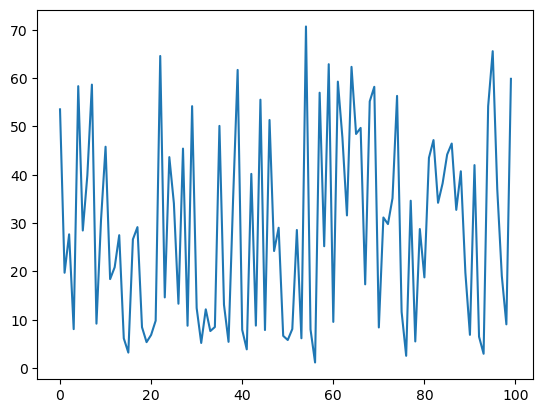

In [12]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

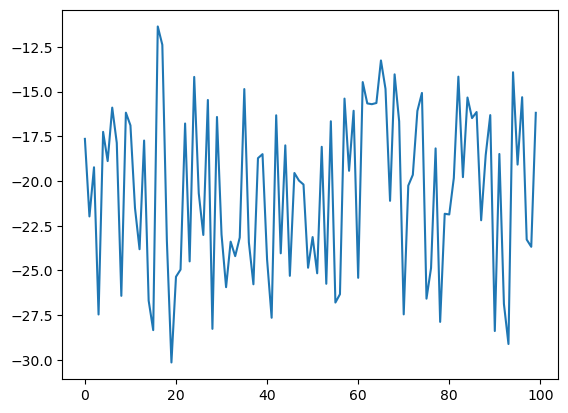

In [13]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [14]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [15]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [16]:
o = o_old[-10:]

In [17]:
x_ = [i+1 for i in range(200)]

In [18]:
np.array(o).shape

(10, 200, 3)

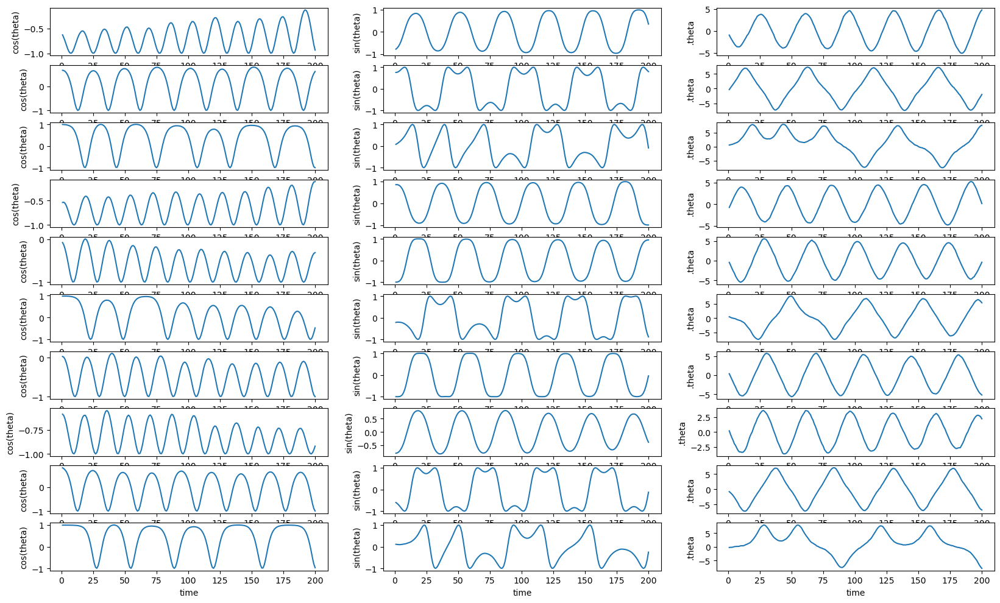

In [19]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [20]:
len(total_losses)

24000

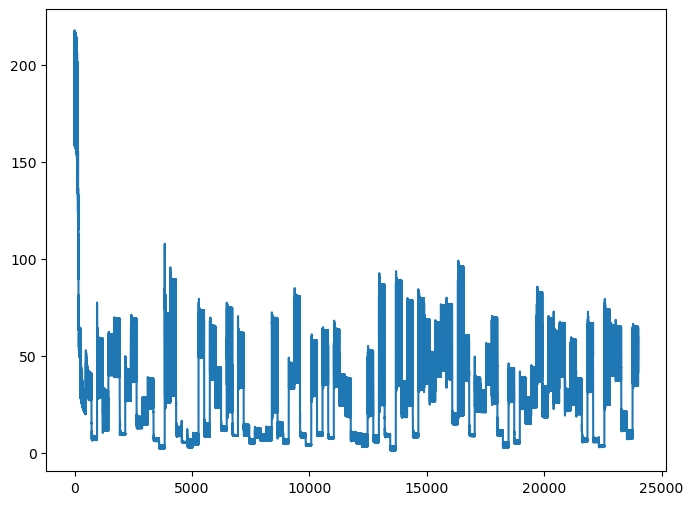

In [21]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## Clipped and No GAE

In [22]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = True
n_critic = 5

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip, n_critic)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 363.12676743953233, actor_loss: 25.424629132769777, critic_loss: 675.4042766135251
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 359.4738935522591, actor_loss: 25.403670113204125, critic_loss: 668.14044687811
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 399.5860313384255, actor_loss: 26.96742921227793, critic_loss: 745.2372042522952
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 382.5246619243325, actor_loss: 26.49536242236797, critic_loss: 712.0585990039291
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 346.628568408724, actor_loss: 25.35284547631652, critic_loss: 642.5514458648149
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 352.7473273688116, actor_loss: 25.408342419124686, critic_loss: 654.6779698993739
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 370.7939402711221, actor_loss: 26.104395183654514, critic_loss: 689.3790901749352
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 375.7651609847356, actor_loss: 26.154898525741068, critic_loss:

n: 0, epoch: 8, minibatch no.: 7,
total_loss: 372.88157737865413, actor_loss: 26.182594983983357, critic_loss: 693.3979647893416
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 359.7721984394584, actor_loss: 25.305772302614958, critic_loss: 668.9328522736869
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 356.147624062151, actor_loss: 25.301556433888262, critic_loss: 661.6921352565255
n: 0, epoch: 9, minibatch no.: 2,
total_loss: 396.02912516491824, actor_loss: 26.917454985677157, critic_loss: 738.2233403584821
n: 0, epoch: 9, minibatch no.: 3,
total_loss: 379.06898586994504, actor_loss: 26.441343349674078, critic_loss: 705.2552850405419
n: 0, epoch: 9, minibatch no.: 4,
total_loss: 343.1635573467415, actor_loss: 25.14083260024095, critic_loss: 636.0454494930011
n: 0, epoch: 9, minibatch no.: 5,
total_loss: 349.3138578493026, actor_loss: 25.302424057215685, critic_loss: 648.0228675841739
n: 0, epoch: 9, minibatch no.: 6,
total_loss: 367.2748485993042, actor_loss: 26.034482092612734, critic

n: 0, epoch: 17, minibatch no.: 5,
total_loss: 327.94533044656765, actor_loss: 25.289328496859877, critic_loss: 605.3120038994156
n: 0, epoch: 17, minibatch no.: 6,
total_loss: 343.54603266358805, actor_loss: 25.988546985765616, critic_loss: 635.1149713556449
n: 0, epoch: 17, minibatch no.: 7,
total_loss: 347.85695244511817, actor_loss: 26.11534250893249, critic_loss: 643.4832198723714
n: 0, epoch: 18, minibatch no.: 0,
total_loss: 332.4125071955481, actor_loss: 25.317232316063752, critic_loss: 614.1905497589686
n: 0, epoch: 18, minibatch no.: 1,
total_loss: 329.0591767697352, actor_loss: 25.24760132089188, critic_loss: 607.6231508976866
n: 0, epoch: 18, minibatch no.: 2,
total_loss: 364.7591863262939, actor_loss: 26.8500251616091, critic_loss: 675.8183223293696
n: 0, epoch: 18, minibatch no.: 3,
total_loss: 348.72288778333336, actor_loss: 26.451547645136866, critic_loss: 644.542680276393
n: 0, epoch: 18, minibatch no.: 4,
total_loss: 313.09430636433416, actor_loss: 25.180660532882374,

n: 0, epoch: 26, minibatch no.: 4,
total_loss: 50.44967728666278, actor_loss: 25.237484768935776, critic_loss: 50.42438503545401
n: 0, epoch: 26, minibatch no.: 5,
total_loss: 48.94308753447362, actor_loss: 25.28243862250651, critic_loss: 47.32129782393421
n: 0, epoch: 26, minibatch no.: 6,
total_loss: 52.62144980300522, actor_loss: 25.943377064542034, critic_loss: 53.35614547692638
n: 0, epoch: 26, minibatch no.: 7,
total_loss: 48.926127605491615, actor_loss: 26.05051193991922, critic_loss: 45.75123133114479
n: 0, epoch: 27, minibatch no.: 0,
total_loss: 43.13927675438458, actor_loss: 25.336947301537812, critic_loss: 35.60465890569354
n: 0, epoch: 27, minibatch no.: 1,
total_loss: 43.71584822052995, actor_loss: 25.188167970670168, critic_loss: 37.05536049971957
n: 0, epoch: 27, minibatch no.: 2,
total_loss: 41.0421409109916, actor_loss: 26.785399349139773, critic_loss: 28.51348312370365
n: 0, epoch: 27, minibatch no.: 3,
total_loss: 45.44042683347553, actor_loss: 26.474681070749625, c

n: 1, epoch: 4, minibatch no.: 5,
total_loss: 37.350156729784146, actor_loss: -18.28466582043664, critic_loss: 111.26964510044158
n: 1, epoch: 4, minibatch no.: 6,
total_loss: 49.47587413368851, actor_loss: -10.835987384021783, critic_loss: 120.62372303542058
n: 1, epoch: 4, minibatch no.: 7,
total_loss: 49.4714033670716, actor_loss: -17.502437290179998, critic_loss: 133.9476813145032
n: 1, epoch: 5, minibatch no.: 0,
total_loss: 57.49612454205479, actor_loss: -13.822213451076887, critic_loss: 142.63667598626336
n: 1, epoch: 5, minibatch no.: 1,
total_loss: 50.19062329389662, actor_loss: -12.573254463767045, critic_loss: 125.52775551532733
n: 1, epoch: 5, minibatch no.: 2,
total_loss: 52.330837223449365, actor_loss: -14.546155608933507, critic_loss: 133.75398566476574
n: 1, epoch: 5, minibatch no.: 3,
total_loss: 53.020530991186696, actor_loss: -13.750604063401418, critic_loss: 133.54227010917623
n: 1, epoch: 5, minibatch no.: 4,
total_loss: 57.368380908956304, actor_loss: -11.72693381

n: 1, epoch: 12, minibatch no.: 7,
total_loss: 45.978238690344625, actor_loss: -17.507293030154695, critic_loss: 126.97106344099865
n: 1, epoch: 13, minibatch no.: 0,
total_loss: 52.55058387110475, actor_loss: -13.823922055717436, critic_loss: 132.74901185364436
n: 1, epoch: 13, minibatch no.: 1,
total_loss: 47.272701826870936, actor_loss: -12.5827678373622, critic_loss: 119.71093932846627
n: 1, epoch: 13, minibatch no.: 2,
total_loss: 49.082073006431, actor_loss: -14.548935349612169, critic_loss: 127.26201671208635
n: 1, epoch: 13, minibatch no.: 3,
total_loss: 46.168092367535365, actor_loss: -13.753933715705312, critic_loss: 119.84405216648136
n: 1, epoch: 13, minibatch no.: 4,
total_loss: 51.07680601528942, actor_loss: -11.73504400910277, critic_loss: 125.62370004878439
n: 1, epoch: 13, minibatch no.: 5,
total_loss: 32.6871444625822, actor_loss: -18.324222591961853, critic_loss: 102.02273410908809
n: 1, epoch: 13, minibatch no.: 6,
total_loss: 43.76511857655221, actor_loss: -10.8346

n: 1, epoch: 21, minibatch no.: 4,
total_loss: 45.43525021822338, actor_loss: -11.742944460697359, critic_loss: 114.35638935784148
n: 1, epoch: 21, minibatch no.: 5,
total_loss: 29.399852390144897, actor_loss: -18.33251977013926, critic_loss: 95.46474432056831
n: 1, epoch: 21, minibatch no.: 6,
total_loss: 39.65180582481154, actor_loss: -10.831875290101145, critic_loss: 100.96736222982537
n: 1, epoch: 21, minibatch no.: 7,
total_loss: 42.1769305482283, actor_loss: -17.512902911721756, critic_loss: 119.3796669199001
n: 1, epoch: 22, minibatch no.: 0,
total_loss: 48.492470798194546, actor_loss: -13.823891790419975, critic_loss: 124.63272517722903
n: 1, epoch: 22, minibatch no.: 1,
total_loss: 42.24480148818777, actor_loss: -12.59341473069145, critic_loss: 109.67643243775844
n: 1, epoch: 22, minibatch no.: 2,
total_loss: 43.4820794350024, actor_loss: -14.553308558233944, critic_loss: 116.07077598647268
n: 1, epoch: 22, minibatch no.: 3,
total_loss: 41.265754139409914, actor_loss: -13.7576

n: 2, epoch: 0, minibatch no.: 0,
total_loss: 132.5277200345467, actor_loss: -2.636769380983196, critic_loss: 270.32897883105977
n: 2, epoch: 0, minibatch no.: 1,
total_loss: 78.49062133663455, actor_loss: -2.9207023117653694, critic_loss: 162.82264729679983
n: 2, epoch: 0, minibatch no.: 2,
total_loss: 131.83232844073893, actor_loss: 1.1246050453037613, critic_loss: 261.41544679087036
n: 2, epoch: 0, minibatch no.: 3,
total_loss: 89.20320148428196, actor_loss: 0.4283192599229158, critic_loss: 177.5497644487181
n: 2, epoch: 0, minibatch no.: 4,
total_loss: 80.84075407397431, actor_loss: -3.4601011699295823, critic_loss: 168.6017104878078
n: 2, epoch: 0, minibatch no.: 5,
total_loss: 51.45392622392149, actor_loss: -3.9673501429192295, critic_loss: 110.84255273368144
n: 2, epoch: 0, minibatch no.: 6,
total_loss: 86.67207800113776, actor_loss: -2.689768703437543, critic_loss: 178.7236934091506
n: 2, epoch: 0, minibatch no.: 7,
total_loss: 102.75535687174224, actor_loss: -2.065615413456767

n: 2, epoch: 8, minibatch no.: 5,
total_loss: 35.23450212091099, actor_loss: -3.970263992017907, critic_loss: 78.40953222585779
n: 2, epoch: 8, minibatch no.: 6,
total_loss: 69.49188438187771, actor_loss: -2.6956181310511704, critic_loss: 144.37500502585777
n: 2, epoch: 8, minibatch no.: 7,
total_loss: 92.0448946662251, actor_loss: -2.047271436911902, critic_loss: 188.184332206274
n: 2, epoch: 9, minibatch no.: 0,
total_loss: 109.80545727650593, actor_loss: -2.7314291461619127, critic_loss: 225.0737728453357
n: 2, epoch: 9, minibatch no.: 1,
total_loss: 62.22100842549878, actor_loss: -2.925734812357378, critic_loss: 130.2934864757123
n: 2, epoch: 9, minibatch no.: 2,
total_loss: 121.11957180552167, actor_loss: 1.1166735568476474, critic_loss: 240.00579649734806
n: 2, epoch: 9, minibatch no.: 3,
total_loss: 84.92385142949887, actor_loss: 0.43199850712731924, critic_loss: 168.9837058447431
n: 2, epoch: 9, minibatch no.: 4,
total_loss: 63.059787778521674, actor_loss: -3.5082767655715696, 

n: 2, epoch: 17, minibatch no.: 3,
total_loss: 81.06132101773942, actor_loss: 0.43083862485115443, critic_loss: 161.26096478577654
n: 2, epoch: 17, minibatch no.: 4,
total_loss: 60.82753895204468, actor_loss: -3.518774329224488, critic_loss: 128.69262656253832
n: 2, epoch: 17, minibatch no.: 5,
total_loss: 33.20336333698937, actor_loss: -3.9707760962590637, critic_loss: 74.34827886649687
n: 2, epoch: 17, minibatch no.: 6,
total_loss: 66.01827625149956, actor_loss: -2.6948788694703056, critic_loss: 137.42631024193972
n: 2, epoch: 17, minibatch no.: 7,
total_loss: 88.92936745116509, actor_loss: -2.0508306360741315, critic_loss: 181.96039617447843
n: 2, epoch: 18, minibatch no.: 0,
total_loss: 105.02048209409023, actor_loss: -2.737011067730897, critic_loss: 215.51498632364223
n: 2, epoch: 18, minibatch no.: 1,
total_loss: 61.09655424044721, actor_loss: -2.927031899105267, critic_loss: 128.04717227910496
n: 2, epoch: 18, minibatch no.: 2,
total_loss: 114.31044904676752, actor_loss: 1.11641

n: 2, epoch: 25, minibatch no.: 2,
total_loss: 112.15359899456756, actor_loss: 1.1163070437029559, critic_loss: 222.0745839017292
n: 2, epoch: 25, minibatch no.: 3,
total_loss: 79.62271838873862, actor_loss: 0.4305440791620804, critic_loss: 158.3843486191531
n: 2, epoch: 25, minibatch no.: 4,
total_loss: 60.31028582750774, actor_loss: -3.5256837362593187, critic_loss: 127.67193912753412
n: 2, epoch: 25, minibatch no.: 5,
total_loss: 32.8225204041817, actor_loss: -3.971322225441586, critic_loss: 73.58768525924657
n: 2, epoch: 25, minibatch no.: 6,
total_loss: 65.27996053502802, actor_loss: -2.6949398132672466, critic_loss: 135.94980069659053
n: 2, epoch: 25, minibatch no.: 7,
total_loss: 88.25867972467711, actor_loss: -2.0512963028700804, critic_loss: 180.6199520550944
n: 2, epoch: 26, minibatch no.: 0,
total_loss: 103.61764934621087, actor_loss: -2.737610960026686, critic_loss: 212.7105206124751
n: 2, epoch: 26, minibatch no.: 1,
total_loss: 61.40108606426405, actor_loss: -2.9282030139

n: 3, epoch: 3, minibatch no.: 4,
total_loss: 95.03812073293476, actor_loss: 3.6318013215662988, critic_loss: 182.81263882273691
n: 3, epoch: 3, minibatch no.: 5,
total_loss: 94.18646105614307, actor_loss: -0.060286832594790486, critic_loss: 188.49349577747572
n: 3, epoch: 3, minibatch no.: 6,
total_loss: 64.64713612946537, actor_loss: -1.073182831155514, critic_loss: 131.44063792124177
n: 3, epoch: 3, minibatch no.: 7,
total_loss: 50.97578050727089, actor_loss: -3.3110384146417506, critic_loss: 108.57363784382528
n: 3, epoch: 4, minibatch no.: 0,
total_loss: 53.20538389417549, actor_loss: 2.4620536164677858, critic_loss: 101.48666055541541
n: 3, epoch: 4, minibatch no.: 1,
total_loss: 76.28087048196656, actor_loss: -0.9254237743831182, critic_loss: 154.41258851269936
n: 3, epoch: 4, minibatch no.: 2,
total_loss: 83.10564382189912, actor_loss: 1.0965319533228413, critic_loss: 164.01822373715257
n: 3, epoch: 4, minibatch no.: 3,
total_loss: 74.87400076706568, actor_loss: -1.655792664329

n: 3, epoch: 12, minibatch no.: 0,
total_loss: 53.076057629277926, actor_loss: 2.469812438734647, critic_loss: 101.21249038108655
n: 3, epoch: 12, minibatch no.: 1,
total_loss: 76.24506985456924, actor_loss: -0.9289380505648444, critic_loss: 154.34801581026815
n: 3, epoch: 12, minibatch no.: 2,
total_loss: 82.97117271296082, actor_loss: 1.0671593639517711, critic_loss: 163.8080266980181
n: 3, epoch: 12, minibatch no.: 3,
total_loss: 74.88849561513325, actor_loss: -1.6559073689664017, critic_loss: 153.0888059681993
n: 3, epoch: 12, minibatch no.: 4,
total_loss: 94.60827027396503, actor_loss: 3.58008964766491, critic_loss: 182.05636125260025
n: 3, epoch: 12, minibatch no.: 5,
total_loss: 94.10035508462232, actor_loss: -0.05825995629684657, critic_loss: 188.31723008183835
n: 3, epoch: 12, minibatch no.: 6,
total_loss: 64.5964474843633, actor_loss: -1.0788032684597846, critic_loss: 131.35050150564615
n: 3, epoch: 12, minibatch no.: 7,
total_loss: 51.107678851919644, actor_loss: -3.31238753

n: 3, epoch: 20, minibatch no.: 4,
total_loss: 94.50226914646609, actor_loss: 3.572608022860033, critic_loss: 181.8593222472121
n: 3, epoch: 20, minibatch no.: 5,
total_loss: 94.09011834525357, actor_loss: -0.05571533229838416, critic_loss: 188.29166735510393
n: 3, epoch: 20, minibatch no.: 6,
total_loss: 64.5689525038143, actor_loss: -1.0832875406099116, critic_loss: 131.30448008884844
n: 3, epoch: 20, minibatch no.: 7,
total_loss: 51.080135668533245, actor_loss: -3.3116648154734003, critic_loss: 108.78360096801329
n: 3, epoch: 21, minibatch no.: 0,
total_loss: 53.04597344484052, actor_loss: 2.467116300061878, critic_loss: 101.15771428955729
n: 3, epoch: 21, minibatch no.: 1,
total_loss: 76.22951692128348, actor_loss: -0.9285851988011559, critic_loss: 154.31620424016927
n: 3, epoch: 21, minibatch no.: 2,
total_loss: 82.97271659313864, actor_loss: 1.0835621432524667, critic_loss: 163.77830889977236
n: 3, epoch: 21, minibatch no.: 3,
total_loss: 74.8577598939029, actor_loss: -1.66085251

n: 3, epoch: 28, minibatch no.: 7,
total_loss: 51.05288099269863, actor_loss: -3.312522438117593, critic_loss: 108.73080686163244
n: 3, epoch: 29, minibatch no.: 0,
total_loss: 53.03460936579348, actor_loss: 2.4683908088069586, critic_loss: 101.13243711397304
n: 3, epoch: 29, minibatch no.: 1,
total_loss: 76.22308230173019, actor_loss: -0.930139480116288, critic_loss: 154.30644356369294
n: 3, epoch: 29, minibatch no.: 2,
total_loss: 82.96731307825303, actor_loss: 1.0826066007904662, critic_loss: 163.76941295492512
n: 3, epoch: 29, minibatch no.: 3,
total_loss: 74.83916915216886, actor_loss: -1.661621377279795, critic_loss: 153.00158105889733
n: 3, epoch: 29, minibatch no.: 4,
total_loss: 94.41136270147072, actor_loss: 3.5449196549081106, critic_loss: 181.73288609312522
n: 3, epoch: 29, minibatch no.: 5,
total_loss: 94.09046721887768, actor_loss: -0.05039249304303203, critic_loss: 188.28171942384142
n: 3, epoch: 29, minibatch no.: 6,
total_loss: 64.55188149054696, actor_loss: -1.0865568

n: 4, epoch: 7, minibatch no.: 0,
total_loss: 15.102096351665104, actor_loss: 9.645499033341427, critic_loss: 10.913194636647356
n: 4, epoch: 7, minibatch no.: 1,
total_loss: 13.574817726370314, actor_loss: 9.888544278854459, critic_loss: 7.372546895031712
n: 4, epoch: 7, minibatch no.: 2,
total_loss: 14.011743504861062, actor_loss: 9.443039958861622, critic_loss: 9.137407091998881
n: 4, epoch: 7, minibatch no.: 3,
total_loss: 15.817094191389721, actor_loss: 10.665604937877072, critic_loss: 10.302978507025298
n: 4, epoch: 7, minibatch no.: 4,
total_loss: 14.981576427078837, actor_loss: 10.177864696641047, critic_loss: 9.60742346087558
n: 4, epoch: 7, minibatch no.: 5,
total_loss: 17.117602916054835, actor_loss: 11.154746404574198, critic_loss: 11.925713022961276
n: 4, epoch: 7, minibatch no.: 6,
total_loss: 13.527467879281073, actor_loss: 10.100984494649433, critic_loss: 6.852966769263279
n: 4, epoch: 7, minibatch no.: 7,
total_loss: 14.209363363204462, actor_loss: 10.22096335882629, c

n: 4, epoch: 15, minibatch no.: 4,
total_loss: 14.894725910883803, actor_loss: 10.168327332947477, critic_loss: 9.452797155872652
n: 4, epoch: 15, minibatch no.: 5,
total_loss: 16.72989532185156, actor_loss: 11.142131130535464, critic_loss: 11.175528382632196
n: 4, epoch: 15, minibatch no.: 6,
total_loss: 13.480534472429433, actor_loss: 10.095896953932613, critic_loss: 6.769275036993642
n: 4, epoch: 15, minibatch no.: 7,
total_loss: 14.06005542452327, actor_loss: 10.198628380336878, critic_loss: 7.7228540883727845
n: 4, epoch: 16, minibatch no.: 0,
total_loss: 15.15470942990385, actor_loss: 9.63861788365886, critic_loss: 11.032183092489982
n: 4, epoch: 16, minibatch no.: 1,
total_loss: 13.571121370069852, actor_loss: 9.885910965281134, critic_loss: 7.370420809577436
n: 4, epoch: 16, minibatch no.: 2,
total_loss: 14.21242424909741, actor_loss: 9.433961386803482, critic_loss: 9.556925724587858
n: 4, epoch: 16, minibatch no.: 3,
total_loss: 15.456115497127266, actor_loss: 10.6762610376641

n: 4, epoch: 24, minibatch no.: 2,
total_loss: 14.191933551363183, actor_loss: 9.42547231248903, critic_loss: 9.532922477748308
n: 4, epoch: 24, minibatch no.: 3,
total_loss: 15.47099158591974, actor_loss: 10.686302942343449, critic_loss: 9.569377287152582
n: 4, epoch: 24, minibatch no.: 4,
total_loss: 14.879903882194913, actor_loss: 10.156089179997352, critic_loss: 9.447629404395123
n: 4, epoch: 24, minibatch no.: 5,
total_loss: 16.72249316825313, actor_loss: 11.126646032738677, critic_loss: 11.191694271028911
n: 4, epoch: 24, minibatch no.: 6,
total_loss: 13.470914766151164, actor_loss: 10.088929702800268, critic_loss: 6.763970126701793
n: 4, epoch: 24, minibatch no.: 7,
total_loss: 14.04713313346922, actor_loss: 10.183853748956349, critic_loss: 7.7265587690257425
n: 4, epoch: 25, minibatch no.: 0,
total_loss: 15.145520482935872, actor_loss: 9.635982104720782, critic_loss: 11.019076756430183
n: 4, epoch: 25, minibatch no.: 1,
total_loss: 13.564636457536995, actor_loss: 9.884093701680

n: 5, epoch: 2, minibatch no.: 3,
total_loss: 53.12576913348006, actor_loss: -11.908505257701107, critic_loss: 130.06854878236234
n: 5, epoch: 2, minibatch no.: 4,
total_loss: 75.66523318096145, actor_loss: -10.811732241284775, critic_loss: 172.95393084449245
n: 5, epoch: 2, minibatch no.: 5,
total_loss: 78.83521142202274, actor_loss: -10.981334731264878, critic_loss: 179.63309230657524
n: 5, epoch: 2, minibatch no.: 6,
total_loss: 102.0115516235062, actor_loss: -7.49856472444544, critic_loss: 219.02023269590327
n: 5, epoch: 2, minibatch no.: 7,
total_loss: 60.95921015555059, actor_loss: -9.253806510799006, critic_loss: 140.4260333326992
n: 5, epoch: 3, minibatch no.: 0,
total_loss: 51.31737304697565, actor_loss: -11.379776479701048, critic_loss: 125.39429905335341
n: 5, epoch: 3, minibatch no.: 1,
total_loss: 47.11395129926299, actor_loss: -13.387121158317536, critic_loss: 121.00214491516105
n: 5, epoch: 3, minibatch no.: 2,
total_loss: 32.66299547446028, actor_loss: -12.6804834051819

n: 5, epoch: 10, minibatch no.: 4,
total_loss: 75.05874556163202, actor_loss: -10.869287452993287, critic_loss: 171.85606602925063
n: 5, epoch: 10, minibatch no.: 5,
total_loss: 77.99388492410966, actor_loss: -11.035201945515418, critic_loss: 178.05817373925015
n: 5, epoch: 10, minibatch no.: 6,
total_loss: 102.77284938516051, actor_loss: -7.513313033556971, critic_loss: 220.57232483743496
n: 5, epoch: 10, minibatch no.: 7,
total_loss: 59.90155199592789, actor_loss: -9.273844160078003, critic_loss: 138.35079231201178
n: 5, epoch: 11, minibatch no.: 0,
total_loss: 50.98202556575406, actor_loss: -11.416549710495378, critic_loss: 124.79715055249886
n: 5, epoch: 11, minibatch no.: 1,
total_loss: 47.139329716128955, actor_loss: -13.452777007121925, critic_loss: 121.18421344650176
n: 5, epoch: 11, minibatch no.: 2,
total_loss: 33.064658760256506, actor_loss: -12.745370452032493, critic_loss: 91.620058424578
n: 5, epoch: 11, minibatch no.: 3,
total_loss: 50.980832940071686, actor_loss: -11.96

n: 5, epoch: 18, minibatch no.: 3,
total_loss: 50.96099004139195, actor_loss: -12.008188462070787, critic_loss: 125.93835700692547
n: 5, epoch: 18, minibatch no.: 4,
total_loss: 74.99037194451263, actor_loss: -10.914268872385083, critic_loss: 171.80928163379542
n: 5, epoch: 18, minibatch no.: 5,
total_loss: 77.95449551727651, actor_loss: -11.075964615558398, critic_loss: 178.06092026566984
n: 5, epoch: 18, minibatch no.: 6,
total_loss: 102.52188575716622, actor_loss: -7.514313448182773, critic_loss: 220.07239841069799
n: 5, epoch: 18, minibatch no.: 7,
total_loss: 59.81332880895016, actor_loss: -9.272971938560444, critic_loss: 138.1726014950212
n: 5, epoch: 19, minibatch no.: 0,
total_loss: 50.99876480999424, actor_loss: -11.43995889478742, critic_loss: 124.87744740956333
n: 5, epoch: 19, minibatch no.: 1,
total_loss: 47.15906587085833, actor_loss: -13.511391799258297, critic_loss: 121.34091534023325
n: 5, epoch: 19, minibatch no.: 2,
total_loss: 33.04403285650761, actor_loss: -12.8012

n: 5, epoch: 26, minibatch no.: 5,
total_loss: 77.91654035608367, actor_loss: -11.111225816907018, critic_loss: 178.0555323459814
n: 5, epoch: 26, minibatch no.: 6,
total_loss: 102.52544123280462, actor_loss: -7.495211298401918, critic_loss: 220.04130506241307
n: 5, epoch: 26, minibatch no.: 7,
total_loss: 59.80615328237823, actor_loss: -9.268090336648115, critic_loss: 138.1484872380527
n: 5, epoch: 27, minibatch no.: 0,
total_loss: 50.97920594589638, actor_loss: -11.457009480725018, critic_loss: 124.8724308532428
n: 5, epoch: 27, minibatch no.: 1,
total_loss: 47.09022011856299, actor_loss: -13.558269397045033, critic_loss: 121.29697903121604
n: 5, epoch: 27, minibatch no.: 2,
total_loss: 33.00323927529469, actor_loss: -12.840088422451124, critic_loss: 91.68665539549163
n: 5, epoch: 27, minibatch no.: 3,
total_loss: 50.90932111703002, actor_loss: -12.047176974076242, critic_loss: 125.91299618221252
n: 5, epoch: 27, minibatch no.: 4,
total_loss: 74.94649788623363, actor_loss: -10.957880

n: 6, epoch: 4, minibatch no.: 7,
total_loss: 14.486933535392495, actor_loss: 13.799739266892226, critic_loss: 1.3743885370005393
n: 6, epoch: 5, minibatch no.: 0,
total_loss: 14.306195661540405, actor_loss: 13.29142819848536, critic_loss: 2.029534926110093
n: 6, epoch: 5, minibatch no.: 1,
total_loss: 15.277121284517326, actor_loss: 13.554426218511075, critic_loss: 3.4453901320125007
n: 6, epoch: 5, minibatch no.: 2,
total_loss: 14.26576294576146, actor_loss: 13.319147242353246, critic_loss: 1.8932314068164295
n: 6, epoch: 5, minibatch no.: 3,
total_loss: 14.51802517977198, actor_loss: 13.57123842830016, critic_loss: 1.8935735029436402
n: 6, epoch: 5, minibatch no.: 4,
total_loss: 15.58854721108432, actor_loss: 13.653988100115845, critic_loss: 3.8691182219369513
n: 6, epoch: 5, minibatch no.: 5,
total_loss: 15.974041301497566, actor_loss: 13.345943192568681, critic_loss: 5.256196217857771
n: 6, epoch: 5, minibatch no.: 6,
total_loss: 15.063350504571732, actor_loss: 13.494308807130647,

n: 6, epoch: 13, minibatch no.: 3,
total_loss: 14.132871592682354, actor_loss: 13.577862337968906, critic_loss: 1.1100185094268968
n: 6, epoch: 13, minibatch no.: 4,
total_loss: 14.62486131985819, actor_loss: 13.61859506223121, critic_loss: 2.0125325152539615
n: 6, epoch: 13, minibatch no.: 5,
total_loss: 15.748866440592199, actor_loss: 13.328799076036821, critic_loss: 4.840134729110756
n: 6, epoch: 13, minibatch no.: 6,
total_loss: 14.093508147989494, actor_loss: 13.420816974879603, critic_loss: 1.3453823462197814
n: 6, epoch: 13, minibatch no.: 7,
total_loss: 14.350740859014675, actor_loss: 13.756164477861525, critic_loss: 1.1891527623062998
n: 6, epoch: 14, minibatch no.: 0,
total_loss: 14.075132054756416, actor_loss: 13.192740434534336, critic_loss: 1.764783240444162
n: 6, epoch: 14, minibatch no.: 1,
total_loss: 15.307712862735892, actor_loss: 13.579468010592624, critic_loss: 3.456489704286535
n: 6, epoch: 14, minibatch no.: 2,
total_loss: 13.988092820127203, actor_loss: 13.261794

n: 6, epoch: 22, minibatch no.: 1,
total_loss: 15.296115472947694, actor_loss: 13.585237244072365, critic_loss: 3.421756457750658
n: 6, epoch: 22, minibatch no.: 2,
total_loss: 13.931825696751087, actor_loss: 13.217255925439162, critic_loss: 1.42913954262385
n: 6, epoch: 22, minibatch no.: 3,
total_loss: 14.1188552670847, actor_loss: 13.571114629831255, critic_loss: 1.0954812745068887
n: 6, epoch: 22, minibatch no.: 4,
total_loss: 14.599437157267786, actor_loss: 13.590385036544916, critic_loss: 2.018104241445739
n: 6, epoch: 22, minibatch no.: 5,
total_loss: 15.687440700902163, actor_loss: 13.287330042473036, critic_loss: 4.800221316858256
n: 6, epoch: 22, minibatch no.: 6,
total_loss: 14.036066891023271, actor_loss: 13.363865718729198, critic_loss: 1.344402344588148
n: 6, epoch: 22, minibatch no.: 7,
total_loss: 14.32655768022727, actor_loss: 13.724369530269772, critic_loss: 1.2043762999149956
n: 6, epoch: 23, minibatch no.: 0,
total_loss: 14.00932222037855, actor_loss: 13.12066559773

n: 7, epoch: 0, minibatch no.: 0,
total_loss: 28.400556190176506, actor_loss: -4.466998204235563, critic_loss: 65.73510878882414
n: 7, epoch: 0, minibatch no.: 1,
total_loss: 23.487779239600506, actor_loss: -3.9528046048390535, critic_loss: 54.88116768887912
n: 7, epoch: 0, minibatch no.: 2,
total_loss: 21.382843104806383, actor_loss: -1.8116351473519867, critic_loss: 46.38895650431674
n: 7, epoch: 0, minibatch no.: 3,
total_loss: 22.39081360099276, actor_loss: -4.502569265333308, critic_loss: 53.786765732652135
n: 7, epoch: 0, minibatch no.: 4,
total_loss: 20.34971528077944, actor_loss: -1.1219277615630256, critic_loss: 42.94328608468493
n: 7, epoch: 0, minibatch no.: 5,
total_loss: 17.40687842972174, actor_loss: -3.527918202203641, critic_loss: 41.86959326385076
n: 7, epoch: 0, minibatch no.: 6,
total_loss: 23.22604486495798, actor_loss: -3.2103222683776393, critic_loss: 52.87273426667124
n: 7, epoch: 0, minibatch no.: 7,
total_loss: 20.7869165602064, actor_loss: -4.144594556372843, 

n: 7, epoch: 8, minibatch no.: 4,
total_loss: 22.948371817878634, actor_loss: -1.083171466758669, critic_loss: 48.0630865692746
n: 7, epoch: 8, minibatch no.: 5,
total_loss: 13.767176063739857, actor_loss: -3.524925755469197, critic_loss: 34.58420363841811
n: 7, epoch: 8, minibatch no.: 6,
total_loss: 20.95657705987321, actor_loss: -3.261453308231088, critic_loss: 48.436060736208596
n: 7, epoch: 8, minibatch no.: 7,
total_loss: 17.279330809843938, actor_loss: -4.151619207366488, critic_loss: 42.86190003442085
n: 7, epoch: 9, minibatch no.: 0,
total_loss: 18.950611786804267, actor_loss: -4.521001513416932, critic_loss: 46.9432266004424
n: 7, epoch: 9, minibatch no.: 1,
total_loss: 16.168039689997986, actor_loss: -3.934938010518022, critic_loss: 40.205955401032014
n: 7, epoch: 9, minibatch no.: 2,
total_loss: 21.449688830446046, actor_loss: -1.8575710400366117, critic_loss: 46.614519740965314
n: 7, epoch: 9, minibatch no.: 3,
total_loss: 14.659089606504327, actor_loss: -4.523484320322084

n: 7, epoch: 17, minibatch no.: 1,
total_loss: 16.144009534874492, actor_loss: -3.933827506245503, critic_loss: 40.15567408223999
n: 7, epoch: 17, minibatch no.: 2,
total_loss: 21.35753344417223, actor_loss: -1.858672882705777, critic_loss: 46.43241265375601
n: 7, epoch: 17, minibatch no.: 3,
total_loss: 14.710403682990702, actor_loss: -4.526274266279143, critic_loss: 38.47335589853969
n: 7, epoch: 17, minibatch no.: 4,
total_loss: 22.798989210215723, actor_loss: -1.0828730824086814, critic_loss: 47.76372458524881
n: 7, epoch: 17, minibatch no.: 5,
total_loss: 13.74891302929393, actor_loss: -3.5248428314397673, critic_loss: 34.547511721467394
n: 7, epoch: 17, minibatch no.: 6,
total_loss: 20.922556002713513, actor_loss: -3.26918310870984, critic_loss: 48.383478222846705
n: 7, epoch: 17, minibatch no.: 7,
total_loss: 17.31859642244262, actor_loss: -4.153000144435084, critic_loss: 42.94319313375541
n: 7, epoch: 18, minibatch no.: 0,
total_loss: 18.943178824961574, actor_loss: -4.52989385

n: 7, epoch: 25, minibatch no.: 7,
total_loss: 17.312658524458904, actor_loss: -4.153689120819625, critic_loss: 42.93269529055706
n: 7, epoch: 26, minibatch no.: 0,
total_loss: 18.918826311147786, actor_loss: -4.532501162117118, critic_loss: 46.90265494652981
n: 7, epoch: 26, minibatch no.: 1,
total_loss: 16.119225265002715, actor_loss: -3.934665284450812, critic_loss: 40.107781098907054
n: 7, epoch: 26, minibatch no.: 2,
total_loss: 21.36811401117369, actor_loss: -1.8592861261239348, critic_loss: 46.45480027459525
n: 7, epoch: 26, minibatch no.: 3,
total_loss: 14.705965297198698, actor_loss: -4.528854925928255, critic_loss: 38.469640446253905
n: 7, epoch: 26, minibatch no.: 4,
total_loss: 22.782569623919883, actor_loss: -1.0837074804064712, critic_loss: 47.73255420865271
n: 7, epoch: 26, minibatch no.: 5,
total_loss: 13.73855669563407, actor_loss: -3.5252015659854545, critic_loss: 34.52751652323905
n: 7, epoch: 26, minibatch no.: 6,
total_loss: 20.908581090973872, actor_loss: -3.27194

n: 8, epoch: 4, minibatch no.: 4,
total_loss: 24.21610556863051, actor_loss: 0.6503159021022175, critic_loss: 47.131579333056585
n: 8, epoch: 4, minibatch no.: 5,
total_loss: 23.380618355556322, actor_loss: 1.262330373462939, critic_loss: 44.23657596418677
n: 8, epoch: 4, minibatch no.: 6,
total_loss: 17.534788358237073, actor_loss: -0.03155339789696593, critic_loss: 35.13268351226808
n: 8, epoch: 4, minibatch no.: 7,
total_loss: 17.65990956708667, actor_loss: -2.307930525978575, critic_loss: 39.93568018613049
n: 8, epoch: 5, minibatch no.: 0,
total_loss: 22.112980764702538, actor_loss: -0.03925209310366149, critic_loss: 44.3044657156124
n: 8, epoch: 5, minibatch no.: 1,
total_loss: 28.09954031531961, actor_loss: 0.8733312298639317, critic_loss: 54.45241817091136
n: 8, epoch: 5, minibatch no.: 2,
total_loss: 19.141856726498066, actor_loss: -0.33653842512251736, critic_loss: 38.95679030324116
n: 8, epoch: 5, minibatch no.: 3,
total_loss: 21.1890877798424, actor_loss: -0.506596581501416,

n: 8, epoch: 12, minibatch no.: 4,
total_loss: 24.1872510446812, actor_loss: 0.6442535586530019, critic_loss: 47.0859949720564
n: 8, epoch: 12, minibatch no.: 5,
total_loss: 23.334683026037283, actor_loss: 1.2571400565934905, critic_loss: 44.15508593888759
n: 8, epoch: 12, minibatch no.: 6,
total_loss: 17.529493091821905, actor_loss: -0.030077998355812135, critic_loss: 35.11914218035543
n: 8, epoch: 12, minibatch no.: 7,
total_loss: 17.68538189908147, actor_loss: -2.31133117763512, critic_loss: 39.993426153433184
n: 8, epoch: 13, minibatch no.: 0,
total_loss: 22.09075728878287, actor_loss: -0.05402525071562215, critic_loss: 44.289565078996986
n: 8, epoch: 13, minibatch no.: 1,
total_loss: 28.07533455657327, actor_loss: 0.8717480119235584, critic_loss: 54.40717308929943
n: 8, epoch: 13, minibatch no.: 2,
total_loss: 19.142638785597008, actor_loss: -0.3310978512421408, critic_loss: 38.9474732736783
n: 8, epoch: 13, minibatch no.: 3,
total_loss: 21.186432780258937, actor_loss: -0.50276873

n: 8, epoch: 20, minibatch no.: 6,
total_loss: 17.52424967659015, actor_loss: -0.030012197051942066, critic_loss: 35.10852374728418
n: 8, epoch: 20, minibatch no.: 7,
total_loss: 17.671747255685034, actor_loss: -2.3133315701613806, critic_loss: 39.97015765169283
n: 8, epoch: 21, minibatch no.: 0,
total_loss: 22.0809611456501, actor_loss: -0.05692031139237496, critic_loss: 44.27576291408495
n: 8, epoch: 21, minibatch no.: 1,
total_loss: 28.067687042606046, actor_loss: 0.872090868879713, critic_loss: 54.391192347452666
n: 8, epoch: 21, minibatch no.: 2,
total_loss: 19.137851381323756, actor_loss: -0.3288256935111857, critic_loss: 38.93335414966988
n: 8, epoch: 21, minibatch no.: 3,
total_loss: 21.17728577963051, actor_loss: -0.5066815998215977, critic_loss: 43.36793475890421
n: 8, epoch: 21, minibatch no.: 4,
total_loss: 24.180966821454504, actor_loss: 0.6430439792889843, critic_loss: 47.07584568433104
n: 8, epoch: 21, minibatch no.: 5,
total_loss: 23.321865432380164, actor_loss: 1.25539

n: 8, epoch: 29, minibatch no.: 3,
total_loss: 21.175902161772097, actor_loss: -0.5040255282783374, critic_loss: 43.35985538010087
n: 8, epoch: 29, minibatch no.: 4,
total_loss: 24.174867335521878, actor_loss: 0.6405359375480967, critic_loss: 47.06866279594756
n: 8, epoch: 29, minibatch no.: 5,
total_loss: 23.309515367849666, actor_loss: 1.2518460461556522, critic_loss: 44.11533864338803
n: 8, epoch: 29, minibatch no.: 6,
total_loss: 17.520340702812888, actor_loss: -0.029181321054015257, critic_loss: 35.099044047733805
n: 8, epoch: 29, minibatch no.: 7,
total_loss: 17.661169511188486, actor_loss: -2.3127797712244873, critic_loss: 39.94789856482595
n: 9, epoch: 0, minibatch no.: 0,
total_loss: 56.09404562033798, actor_loss: -1.4403103115928446, critic_loss: 115.06871186386165
n: 9, epoch: 0, minibatch no.: 1,
total_loss: 62.84990009210334, actor_loss: 0.9295223207165502, critic_loss: 123.84075554277358
n: 9, epoch: 0, minibatch no.: 2,
total_loss: 61.92561650940916, actor_loss: -1.47858

n: 9, epoch: 7, minibatch no.: 3,
total_loss: 55.41491962110715, actor_loss: -0.7796608936308643, critic_loss: 112.38916102947603
n: 9, epoch: 7, minibatch no.: 4,
total_loss: 52.605821205124705, actor_loss: -1.1677048466652866, critic_loss: 107.54705210357999
n: 9, epoch: 7, minibatch no.: 5,
total_loss: 33.86168917644111, actor_loss: -1.1077416391680381, critic_loss: 69.9388616312183
n: 9, epoch: 7, minibatch no.: 6,
total_loss: 51.97855715744143, actor_loss: -1.3050977094571707, critic_loss: 106.5673097337972
n: 9, epoch: 7, minibatch no.: 7,
total_loss: 48.269629518020395, actor_loss: -1.5321944493518644, critic_loss: 99.60364793474452
n: 9, epoch: 8, minibatch no.: 0,
total_loss: 54.277784296093934, actor_loss: -1.4426535700921768, critic_loss: 111.44087573237222
n: 9, epoch: 8, minibatch no.: 1,
total_loss: 63.39247814325235, actor_loss: 0.8807155871390893, critic_loss: 125.02352511222652
n: 9, epoch: 8, minibatch no.: 2,
total_loss: 60.162683675228436, actor_loss: -1.46171781892

n: 9, epoch: 15, minibatch no.: 6,
total_loss: 51.95764327414173, actor_loss: -1.320399658539432, critic_loss: 106.55608586536232
n: 9, epoch: 15, minibatch no.: 7,
total_loss: 48.26400931596009, actor_loss: -1.5382458687444673, critic_loss: 99.60451036940911
n: 9, epoch: 16, minibatch no.: 0,
total_loss: 54.2262833950216, actor_loss: -1.4407043096002012, critic_loss: 111.3339754092436
n: 9, epoch: 16, minibatch no.: 1,
total_loss: 63.19492657730226, actor_loss: 0.8778140706428347, critic_loss: 124.63422501331885
n: 9, epoch: 16, minibatch no.: 2,
total_loss: 60.1146273439556, actor_loss: -1.4660960368094833, critic_loss: 123.16144676153016
n: 9, epoch: 16, minibatch no.: 3,
total_loss: 55.31004029166286, actor_loss: -0.778541422169734, critic_loss: 112.17716342766518
n: 9, epoch: 16, minibatch no.: 4,
total_loss: 52.54153175031309, actor_loss: -1.168145429439713, critic_loss: 107.4193543595056
n: 9, epoch: 16, minibatch no.: 5,
total_loss: 33.83576364671105, actor_loss: -1.10875988765

n: 9, epoch: 23, minibatch no.: 6,
total_loss: 51.93278752243926, actor_loss: -1.3302658825475713, critic_loss: 106.52610680997367
n: 9, epoch: 23, minibatch no.: 7,
total_loss: 48.26624695154945, actor_loss: -1.542655604824266, critic_loss: 99.61780511274743
n: 9, epoch: 24, minibatch no.: 0,
total_loss: 54.20475141154293, actor_loss: -1.4382101880455775, critic_loss: 111.28592319917702
n: 9, epoch: 24, minibatch no.: 1,
total_loss: 63.14687038555936, actor_loss: 0.8763426572805576, critic_loss: 124.5410554565576
n: 9, epoch: 24, minibatch no.: 2,
total_loss: 60.09498776649282, actor_loss: -1.4648161086870235, critic_loss: 123.11960775035969
n: 9, epoch: 24, minibatch no.: 3,
total_loss: 55.27998275307173, actor_loss: -0.7775019697281856, critic_loss: 112.11496944559983
n: 9, epoch: 24, minibatch no.: 4,
total_loss: 52.50473428815599, actor_loss: -1.1686449853370253, critic_loss: 107.34675854698602
n: 9, epoch: 24, minibatch no.: 5,
total_loss: 33.81721350293412, actor_loss: -1.110929

n: 10, epoch: 2, minibatch no.: 2,
total_loss: 103.2902284348256, actor_loss: 2.7750584546695247, critic_loss: 201.03033996031215
n: 10, epoch: 2, minibatch no.: 3,
total_loss: 69.30606358175085, actor_loss: -2.8637176050878788, critic_loss: 144.33956237367747
n: 10, epoch: 2, minibatch no.: 4,
total_loss: 59.24002834027749, actor_loss: -3.0281240997075183, critic_loss: 124.53630487997002
n: 10, epoch: 2, minibatch no.: 5,
total_loss: 79.76964685555944, actor_loss: -0.4654641013735627, critic_loss: 160.470221913866
n: 10, epoch: 2, minibatch no.: 6,
total_loss: 50.8625635378149, actor_loss: -4.036294015789188, critic_loss: 109.79771510720818
n: 10, epoch: 2, minibatch no.: 7,
total_loss: 57.13793110158348, actor_loss: -3.7672352059216414, critic_loss: 121.81033261501025
n: 10, epoch: 3, minibatch no.: 0,
total_loss: 57.37259627707899, actor_loss: -5.314610625124829, critic_loss: 125.37441380440764
n: 10, epoch: 3, minibatch no.: 1,
total_loss: 86.81709915695339, actor_loss: -2.98444390

n: 10, epoch: 10, minibatch no.: 3,
total_loss: 69.44196839361251, actor_loss: -2.856022361163066, critic_loss: 144.59598150955117
n: 10, epoch: 10, minibatch no.: 4,
total_loss: 59.284752574797956, actor_loss: -3.052619165681651, critic_loss: 124.67474348095921
n: 10, epoch: 10, minibatch no.: 5,
total_loss: 79.09425412947452, actor_loss: -0.45611040652232, critic_loss: 159.10072907199367
n: 10, epoch: 10, minibatch no.: 6,
total_loss: 51.34090881658029, actor_loss: -4.027191206266315, critic_loss: 110.73620004569321
n: 10, epoch: 10, minibatch no.: 7,
total_loss: 57.39790044768947, actor_loss: -3.7709778459866192, critic_loss: 122.33775658735219
n: 10, epoch: 11, minibatch no.: 0,
total_loss: 58.178953012226486, actor_loss: -5.325901427348667, critic_loss: 127.00970887915031
n: 10, epoch: 11, minibatch no.: 1,
total_loss: 86.80528231351501, actor_loss: -3.013049504659585, critic_loss: 179.6366636363492
n: 10, epoch: 11, minibatch no.: 2,
total_loss: 101.56493968359361, actor_loss: 2.

n: 10, epoch: 18, minibatch no.: 7,
total_loss: 57.394952880822316, actor_loss: -3.7773242916119605, critic_loss: 122.34455434486856
n: 10, epoch: 19, minibatch no.: 0,
total_loss: 58.13536584612326, actor_loss: -5.3267711130548525, critic_loss: 126.92427391835622
n: 10, epoch: 19, minibatch no.: 1,
total_loss: 86.81966848054445, actor_loss: -3.0138588555765127, critic_loss: 179.66705467224193
n: 10, epoch: 19, minibatch no.: 2,
total_loss: 101.42057128175622, actor_loss: 2.804815890895863, critic_loss: 197.23151078172071
n: 10, epoch: 19, minibatch no.: 3,
total_loss: 69.44627091241557, actor_loss: -2.8603942716871846, critic_loss: 144.6133303682055
n: 10, epoch: 19, minibatch no.: 4,
total_loss: 59.307225631904025, actor_loss: -3.049387442880511, critic_loss: 124.71322614956907
n: 10, epoch: 19, minibatch no.: 5,
total_loss: 79.00591189376675, actor_loss: -0.499085251928368, critic_loss: 159.00999429139023
n: 10, epoch: 19, minibatch no.: 6,
total_loss: 51.3312200198491, actor_loss: 

n: 10, epoch: 27, minibatch no.: 4,
total_loss: 59.31170536520903, actor_loss: -3.0502658970721135, critic_loss: 124.72394252456229
n: 10, epoch: 27, minibatch no.: 5,
total_loss: 78.97830054455261, actor_loss: -0.5115351195542526, critic_loss: 158.97967132821373
n: 10, epoch: 27, minibatch no.: 6,
total_loss: 51.32217450998101, actor_loss: -4.048853531879049, critic_loss: 110.74205608372012
n: 10, epoch: 27, minibatch no.: 7,
total_loss: 57.38491650211747, actor_loss: -3.783840942640834, critic_loss: 122.33751488951661
n: 10, epoch: 28, minibatch no.: 0,
total_loss: 58.09214219810563, actor_loss: -5.313534445515457, critic_loss: 126.81135328724217
n: 10, epoch: 28, minibatch no.: 1,
total_loss: 86.85431515787427, actor_loss: -2.98476738667387, critic_loss: 179.67816508909627
n: 10, epoch: 28, minibatch no.: 2,
total_loss: 101.35735958580487, actor_loss: 2.8079679542750795, critic_loss: 197.09878326305957
n: 10, epoch: 28, minibatch no.: 3,
total_loss: 69.43348585961456, actor_loss: -2

n: 11, epoch: 6, minibatch no.: 2,
total_loss: 66.2355142962875, actor_loss: -0.4665582250682651, critic_loss: 133.40414504271155
n: 11, epoch: 6, minibatch no.: 3,
total_loss: 93.93987415873306, actor_loss: 1.000789458800603, critic_loss: 185.87816939986493
n: 11, epoch: 6, minibatch no.: 4,
total_loss: 80.17768265709097, actor_loss: 1.051303509740223, critic_loss: 158.2527582947015
n: 11, epoch: 6, minibatch no.: 5,
total_loss: 52.3888997517898, actor_loss: -1.0422942756980673, critic_loss: 106.86238805497574
n: 11, epoch: 6, minibatch no.: 6,
total_loss: 89.96743865585431, actor_loss: 2.5246613134176408, critic_loss: 174.88555468487334
n: 11, epoch: 6, minibatch no.: 7,
total_loss: 66.0796375118004, actor_loss: 1.047947722913307, critic_loss: 130.06337957777419
n: 11, epoch: 7, minibatch no.: 0,
total_loss: 77.01195681335471, actor_loss: -0.33955850141730626, critic_loss: 154.70303062954403
n: 11, epoch: 7, minibatch no.: 1,
total_loss: 85.32546669525463, actor_loss: -0.029138041143

n: 11, epoch: 14, minibatch no.: 7,
total_loss: 66.02874520444074, actor_loss: 1.0381507291408132, critic_loss: 129.98118895059986
n: 11, epoch: 15, minibatch no.: 0,
total_loss: 76.95180541598123, actor_loss: -0.3454151611707018, critic_loss: 154.59444115430387
n: 11, epoch: 15, minibatch no.: 1,
total_loss: 85.23659091407589, actor_loss: -0.041203419573014426, critic_loss: 170.5555886672978
n: 11, epoch: 15, minibatch no.: 2,
total_loss: 66.15041400485538, actor_loss: -0.4671618026420265, critic_loss: 133.2351516149948
n: 11, epoch: 15, minibatch no.: 3,
total_loss: 93.87508647312363, actor_loss: 1.000820308370537, critic_loss: 185.7485323295062
n: 11, epoch: 15, minibatch no.: 4,
total_loss: 80.08057366154992, actor_loss: 1.0536656459520695, critic_loss: 158.0538160311957
n: 11, epoch: 15, minibatch no.: 5,
total_loss: 52.32657941793586, actor_loss: -1.0523085108223087, critic_loss: 106.75777585751634
n: 11, epoch: 15, minibatch no.: 6,
total_loss: 89.95502423495057, actor_loss: 2.5

n: 11, epoch: 23, minibatch no.: 2,
total_loss: 66.12249913178843, actor_loss: -0.46748597273826875, critic_loss: 133.1799702090534
n: 11, epoch: 23, minibatch no.: 3,
total_loss: 93.85920447649197, actor_loss: 1.002549152327972, critic_loss: 185.713310648328
n: 11, epoch: 23, minibatch no.: 4,
total_loss: 80.05557115197864, actor_loss: 1.0616564556888617, critic_loss: 157.98782939257956
n: 11, epoch: 23, minibatch no.: 5,
total_loss: 52.278596940182936, actor_loss: -1.0700710317031075, critic_loss: 106.69733594377209
n: 11, epoch: 23, minibatch no.: 6,
total_loss: 89.94882184919507, actor_loss: 2.5296156320365695, critic_loss: 174.838412434317
n: 11, epoch: 23, minibatch no.: 7,
total_loss: 65.99914731445203, actor_loss: 1.0300298893841895, critic_loss: 129.93823485013567
n: 11, epoch: 24, minibatch no.: 0,
total_loss: 76.91079962820406, actor_loss: -0.3499008694286007, critic_loss: 154.5214009952653
n: 11, epoch: 24, minibatch no.: 1,
total_loss: 85.19790456805542, actor_loss: -0.049

n: 12, epoch: 1, minibatch no.: 2,
total_loss: 75.11598597665628, actor_loss: 5.158118345257294, critic_loss: 139.91573526279797
n: 12, epoch: 1, minibatch no.: 3,
total_loss: 51.125627511685124, actor_loss: 2.940849019768121, critic_loss: 96.369556983834
n: 12, epoch: 1, minibatch no.: 4,
total_loss: 51.81946039596094, actor_loss: 2.9505667165950866, critic_loss: 97.73778735873171
n: 12, epoch: 1, minibatch no.: 5,
total_loss: 59.26526230295185, actor_loss: 2.845441122867407, critic_loss: 112.83964236016888
n: 12, epoch: 1, minibatch no.: 6,
total_loss: 45.16064055864347, actor_loss: 0.5235184244153188, critic_loss: 89.2742442684563
n: 12, epoch: 1, minibatch no.: 7,
total_loss: 30.304629013368835, actor_loss: 0.40942466330435306, critic_loss: 59.790408700128964
n: 12, epoch: 2, minibatch no.: 0,
total_loss: 49.269793807972746, actor_loss: 1.71936038164565, critic_loss: 95.10086685265419
n: 12, epoch: 2, minibatch no.: 1,
total_loss: 53.371870953454646, actor_loss: 0.41764464361137826

n: 12, epoch: 10, minibatch no.: 0,
total_loss: 49.03413110376418, actor_loss: 1.7250137487075932, critic_loss: 94.61823471011317
n: 12, epoch: 10, minibatch no.: 1,
total_loss: 52.59757549809786, actor_loss: 0.41889256233708677, critic_loss: 104.35736587152155
n: 12, epoch: 10, minibatch no.: 2,
total_loss: 73.04193180852397, actor_loss: 5.123690314113922, critic_loss: 135.8364829888201
n: 12, epoch: 10, minibatch no.: 3,
total_loss: 50.49510197923375, actor_loss: 2.848749832740776, critic_loss: 95.29270429298595
n: 12, epoch: 10, minibatch no.: 4,
total_loss: 51.58431113234523, actor_loss: 2.9639549498218565, critic_loss: 97.24071236504675
n: 12, epoch: 10, minibatch no.: 5,
total_loss: 59.13076990277209, actor_loss: 2.8184074507571206, critic_loss: 112.62472490402993
n: 12, epoch: 10, minibatch no.: 6,
total_loss: 45.10697461229933, actor_loss: 0.49000458493306126, critic_loss: 89.23394005473254
n: 12, epoch: 10, minibatch no.: 7,
total_loss: 29.7652664422985, actor_loss: 0.40511840

n: 12, epoch: 17, minibatch no.: 7,
total_loss: 29.75308599820339, actor_loss: 0.3984725952608321, critic_loss: 58.709226805885116
n: 12, epoch: 18, minibatch no.: 0,
total_loss: 49.014958235282386, actor_loss: 1.7087623685380664, critic_loss: 94.61239173348864
n: 12, epoch: 18, minibatch no.: 1,
total_loss: 52.5748296709779, actor_loss: 0.4143127928044701, critic_loss: 104.32103375634685
n: 12, epoch: 18, minibatch no.: 2,
total_loss: 72.98751957401699, actor_loss: 5.132647718718352, critic_loss: 135.70974371059728
n: 12, epoch: 18, minibatch no.: 3,
total_loss: 50.518446281692945, actor_loss: 2.8631564485847165, critic_loss: 95.31057966621646
n: 12, epoch: 18, minibatch no.: 4,
total_loss: 51.5625436301754, actor_loss: 2.9565995780347345, critic_loss: 97.21188810428133
n: 12, epoch: 18, minibatch no.: 5,
total_loss: 59.12516835071637, actor_loss: 2.8283222098797256, critic_loss: 112.5936922816733
n: 12, epoch: 18, minibatch no.: 6,
total_loss: 45.09912680259801, actor_loss: 0.4721354

n: 12, epoch: 26, minibatch no.: 3,
total_loss: 50.52419295127634, actor_loss: 2.862466422207747, critic_loss: 95.32345305813719
n: 12, epoch: 26, minibatch no.: 4,
total_loss: 51.55072324862268, actor_loss: 2.9536563631904844, critic_loss: 97.1941337708644
n: 12, epoch: 26, minibatch no.: 5,
total_loss: 59.12587519225239, actor_loss: 2.8343283364156253, critic_loss: 112.58309371167353
n: 12, epoch: 26, minibatch no.: 6,
total_loss: 45.080919059442486, actor_loss: 0.4652002787564643, critic_loss: 89.23143756137205
n: 12, epoch: 26, minibatch no.: 7,
total_loss: 29.724925671249927, actor_loss: 0.3924777668549899, critic_loss: 58.66489580878987
n: 12, epoch: 27, minibatch no.: 0,
total_loss: 49.00167782977337, actor_loss: 1.6974290180987273, critic_loss: 94.6084976233493
n: 12, epoch: 27, minibatch no.: 1,
total_loss: 52.56507856546042, actor_loss: 0.41171213524576417, critic_loss: 104.3067328604293
n: 12, epoch: 27, minibatch no.: 2,
total_loss: 72.93709895990949, actor_loss: 5.13888294

n: 13, epoch: 5, minibatch no.: 0,
total_loss: 13.295246241465152, actor_loss: 3.998378756191455, critic_loss: 18.593734970547395
n: 13, epoch: 5, minibatch no.: 1,
total_loss: 13.293202932889097, actor_loss: 3.729737608201684, critic_loss: 19.126930649374824
n: 13, epoch: 5, minibatch no.: 2,
total_loss: 9.79547718131773, actor_loss: 2.915974479236978, critic_loss: 13.759005404161506
n: 13, epoch: 5, minibatch no.: 3,
total_loss: 9.852390071299201, actor_loss: 1.9819637778762176, critic_loss: 15.740852586845968
n: 13, epoch: 5, minibatch no.: 4,
total_loss: 12.717351541082518, actor_loss: 3.7294772968731253, critic_loss: 17.975748488418787
n: 13, epoch: 5, minibatch no.: 5,
total_loss: 8.13655230600038, actor_loss: 2.0616052976678163, critic_loss: 12.149894016665128
n: 13, epoch: 5, minibatch no.: 6,
total_loss: 11.072153545327836, actor_loss: 3.9490323581282176, critic_loss: 14.246242374399237
n: 13, epoch: 5, minibatch no.: 7,
total_loss: 10.322182297777694, actor_loss: 3.1938784855

n: 13, epoch: 13, minibatch no.: 6,
total_loss: 10.895450842691705, actor_loss: 3.944622224861419, critic_loss: 13.901657235660574
n: 13, epoch: 13, minibatch no.: 7,
total_loss: 10.28477958811106, actor_loss: 3.1918900257142715, critic_loss: 14.18577912479358
n: 13, epoch: 14, minibatch no.: 0,
total_loss: 12.861383101700278, actor_loss: 3.99513225320378, critic_loss: 17.732501696992998
n: 13, epoch: 14, minibatch no.: 1,
total_loss: 12.972695584974307, actor_loss: 3.7232476219862956, critic_loss: 18.498895925976022
n: 13, epoch: 14, minibatch no.: 2,
total_loss: 9.83755612107826, actor_loss: 2.9130148152241264, critic_loss: 13.849082611708267
n: 13, epoch: 14, minibatch no.: 3,
total_loss: 10.099223095774086, actor_loss: 1.9769546021109687, critic_loss: 16.244536987326235
n: 13, epoch: 14, minibatch no.: 4,
total_loss: 12.52583840796732, actor_loss: 3.725121879311861, critic_loss: 17.60143305731092
n: 13, epoch: 14, minibatch no.: 5,
total_loss: 8.220978357921744, actor_loss: 2.06258

n: 13, epoch: 22, minibatch no.: 4,
total_loss: 12.51395620212337, actor_loss: 3.7212544135725163, critic_loss: 17.585403577101708
n: 13, epoch: 22, minibatch no.: 5,
total_loss: 8.177603641081532, actor_loss: 2.0632588141187096, critic_loss: 12.228689653925645
n: 13, epoch: 22, minibatch no.: 6,
total_loss: 10.883998246751439, actor_loss: 3.9402822467876577, critic_loss: 13.887431999927564
n: 13, epoch: 22, minibatch no.: 7,
total_loss: 10.271942946873452, actor_loss: 3.1887250650619157, critic_loss: 14.166435763623072
n: 13, epoch: 23, minibatch no.: 0,
total_loss: 12.844104616130858, actor_loss: 3.9897326188301823, critic_loss: 17.708743994601353
n: 13, epoch: 23, minibatch no.: 1,
total_loss: 12.9535869608538, actor_loss: 3.7204693724567517, critic_loss: 18.466235176794097
n: 13, epoch: 23, minibatch no.: 2,
total_loss: 9.833936206655943, actor_loss: 2.9096442981427417, critic_loss: 13.848583817026404
n: 13, epoch: 23, minibatch no.: 3,
total_loss: 10.084324347255164, actor_loss: 1

n: 14, epoch: 1, minibatch no.: 2,
total_loss: 84.63681633125796, actor_loss: -0.5722723446447824, critic_loss: 170.4181773518055
n: 14, epoch: 1, minibatch no.: 3,
total_loss: 69.7000726570646, actor_loss: -3.999827202978788, critic_loss: 147.39979972008678
n: 14, epoch: 1, minibatch no.: 4,
total_loss: 54.152258303552365, actor_loss: -6.147092060123853, critic_loss: 120.59870072735244
n: 14, epoch: 1, minibatch no.: 5,
total_loss: 59.55091056859936, actor_loss: -5.7085426150811305, critic_loss: 130.51890636736098
n: 14, epoch: 1, minibatch no.: 6,
total_loss: 75.9892760139465, actor_loss: -2.9946974112366824, critic_loss: 157.96794685036636
n: 14, epoch: 1, minibatch no.: 7,
total_loss: 55.01593045465444, actor_loss: -6.643889257764748, critic_loss: 123.31963942483837
n: 14, epoch: 2, minibatch no.: 0,
total_loss: 74.65912880023693, actor_loss: -1.7661154171507978, critic_loss: 152.85048843477546
n: 14, epoch: 2, minibatch no.: 1,
total_loss: 55.03606404218074, actor_loss: -4.7806830

n: 14, epoch: 9, minibatch no.: 5,
total_loss: 59.68110660510122, actor_loss: -5.712654181276573, critic_loss: 130.7875215727556
n: 14, epoch: 9, minibatch no.: 6,
total_loss: 75.41697895595742, actor_loss: -3.001410941506288, critic_loss: 156.83677979492742
n: 14, epoch: 9, minibatch no.: 7,
total_loss: 56.27798035433202, actor_loss: -6.672288655407165, critic_loss: 125.90053801947838
n: 14, epoch: 10, minibatch no.: 0,
total_loss: 72.69304412947353, actor_loss: -1.7670917213910247, critic_loss: 148.92027170172912
n: 14, epoch: 10, minibatch no.: 1,
total_loss: 55.406236026035295, actor_loss: -4.799185376613927, critic_loss: 120.41084280529844
n: 14, epoch: 10, minibatch no.: 2,
total_loss: 87.65481711678633, actor_loss: -0.6164673232449561, critic_loss: 176.5425688800626
n: 14, epoch: 10, minibatch no.: 3,
total_loss: 69.54781722563634, actor_loss: -4.029181665264917, critic_loss: 147.1539977818025
n: 14, epoch: 10, minibatch no.: 4,
total_loss: 53.46893043649539, actor_loss: -6.1818

n: 14, epoch: 17, minibatch no.: 7,
total_loss: 56.411892197596416, actor_loss: -6.665998659283068, critic_loss: 126.15578171375897
n: 14, epoch: 18, minibatch no.: 0,
total_loss: 72.57688193183081, actor_loss: -1.762875931924763, critic_loss: 148.67951572751116
n: 14, epoch: 18, minibatch no.: 1,
total_loss: 55.44607295358558, actor_loss: -4.792348073897747, critic_loss: 120.47684205496665
n: 14, epoch: 18, minibatch no.: 2,
total_loss: 87.43496877170692, actor_loss: -0.6154797435651985, critic_loss: 176.10089703054425
n: 14, epoch: 18, minibatch no.: 3,
total_loss: 69.54808537981508, actor_loss: -4.037485879638507, critic_loss: 147.17114251890717
n: 14, epoch: 18, minibatch no.: 4,
total_loss: 53.47174685980095, actor_loss: -6.188833015189301, critic_loss: 119.32115974998051
n: 14, epoch: 18, minibatch no.: 5,
total_loss: 59.831991266655905, actor_loss: -5.718166114718399, critic_loss: 131.1003147627486
n: 14, epoch: 18, minibatch no.: 6,
total_loss: 75.36423355037634, actor_loss: -2

n: 14, epoch: 26, minibatch no.: 2,
total_loss: 87.39090932163676, actor_loss: -0.611730216607423, critic_loss: 176.00527907648836
n: 14, epoch: 26, minibatch no.: 3,
total_loss: 69.54504073254695, actor_loss: -4.047352257750285, critic_loss: 147.18478598059448
n: 14, epoch: 26, minibatch no.: 4,
total_loss: 53.45359793392031, actor_loss: -6.192348659299463, critic_loss: 119.29189318643954
n: 14, epoch: 26, minibatch no.: 5,
total_loss: 59.83261724519086, actor_loss: -5.720891473706143, critic_loss: 131.107017437794
n: 14, epoch: 26, minibatch no.: 6,
total_loss: 75.36603863358849, actor_loss: -2.9724457771192587, critic_loss: 156.6769688214155
n: 14, epoch: 26, minibatch no.: 7,
total_loss: 56.41182706464314, actor_loss: -6.645177815140934, critic_loss: 126.11400975956815
n: 14, epoch: 27, minibatch no.: 0,
total_loss: 72.52544329639151, actor_loss: -1.8075084114566977, critic_loss: 148.66590341569642
n: 14, epoch: 27, minibatch no.: 1,
total_loss: 55.41622868760178, actor_loss: -4.81

n: 15, epoch: 4, minibatch no.: 2,
total_loss: 62.42006947770187, actor_loss: 5.234969875700666, critic_loss: 114.37019920400242
n: 15, epoch: 4, minibatch no.: 3,
total_loss: 56.42886088985811, actor_loss: 3.1473986946058496, critic_loss: 106.56292439050452
n: 15, epoch: 4, minibatch no.: 4,
total_loss: 45.39773932544175, actor_loss: -2.202620370937698, critic_loss: 95.20071939275888
n: 15, epoch: 4, minibatch no.: 5,
total_loss: 49.39557856559447, actor_loss: 3.536517401468376, critic_loss: 91.71812232825219
n: 15, epoch: 4, minibatch no.: 6,
total_loss: 67.90620510240936, actor_loss: 3.927126198758351, critic_loss: 127.95815780730202
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 38.43342195323175, actor_loss: -3.5360821384348387, critic_loss: 83.93900818333317
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 52.87939424333509, actor_loss: -0.1442176783922327, critic_loss: 106.04722384345465
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 55.04180870800559, actor_loss: -1.1342904048773

n: 15, epoch: 12, minibatch no.: 7,
total_loss: 37.93198517677655, actor_loss: -3.5336252990923556, critic_loss: 82.93122095173781
n: 15, epoch: 13, minibatch no.: 0,
total_loss: 53.02695889900675, actor_loss: -0.15846619464141146, critic_loss: 106.37085018729633
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 55.15646677178012, actor_loss: -1.1391016265549005, critic_loss: 112.59113679667004
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 62.87241688172922, actor_loss: 5.229906888600751, critic_loss: 115.28501998625694
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 56.73579757210757, actor_loss: 3.1406571353010375, critic_loss: 107.19028087361306
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 44.93649045036604, actor_loss: -2.206214306054877, critic_loss: 94.28540951284182
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 49.516928974629636, actor_loss: 3.510756244411327, critic_loss: 92.01234546043662
n: 15, epoch: 13, minibatch no.: 6,
total_loss: 67.93295586144012, actor_loss: 3.93

n: 15, epoch: 21, minibatch no.: 2,
total_loss: 62.772706324900014, actor_loss: 5.231947762015704, critic_loss: 115.08151712576861
n: 15, epoch: 21, minibatch no.: 3,
total_loss: 56.758664012441336, actor_loss: 3.1441858621874244, critic_loss: 107.22895630050782
n: 15, epoch: 21, minibatch no.: 4,
total_loss: 44.87648261984155, actor_loss: -2.203043384078182, critic_loss: 94.15905200783946
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 49.5136129879139, actor_loss: 3.5014364674270446, critic_loss: 92.02435304097371
n: 15, epoch: 21, minibatch no.: 6,
total_loss: 67.87545754128116, actor_loss: 3.9328321647975946, critic_loss: 127.88525075296715
n: 15, epoch: 21, minibatch no.: 7,
total_loss: 37.76496626977676, actor_loss: -3.531116795150058, critic_loss: 82.59216612985362
n: 15, epoch: 22, minibatch no.: 0,
total_loss: 53.05934005479209, actor_loss: -0.16797839650818744, critic_loss: 106.45463690260056
n: 15, epoch: 22, minibatch no.: 1,
total_loss: 55.16461025771409, actor_loss: -1.14

n: 15, epoch: 29, minibatch no.: 7,
total_loss: 37.66659087410991, actor_loss: -3.53143341852197, critic_loss: 82.39604858526376
n: 16, epoch: 0, minibatch no.: 0,
total_loss: 39.32095821219352, actor_loss: -6.171922088945535, critic_loss: 90.9857606022781
n: 16, epoch: 0, minibatch no.: 1,
total_loss: 60.45224473740034, actor_loss: -1.5322911130795789, critic_loss: 123.96907170095984
n: 16, epoch: 0, minibatch no.: 2,
total_loss: 81.63589823197394, actor_loss: 0.5736269428604568, critic_loss: 162.12454257822696
n: 16, epoch: 0, minibatch no.: 3,
total_loss: 54.74595110270234, actor_loss: -3.342987986790993, critic_loss: 116.17787817898667
n: 16, epoch: 0, minibatch no.: 4,
total_loss: 111.41232615325163, actor_loss: 2.816093760671317, critic_loss: 217.1924647851606
n: 16, epoch: 0, minibatch no.: 5,
total_loss: 59.081310257377375, actor_loss: -0.49303195960153656, critic_loss: 119.14868443395783
n: 16, epoch: 0, minibatch no.: 6,
total_loss: 68.77624345423493, actor_loss: -1.784438967

n: 16, epoch: 8, minibatch no.: 3,
total_loss: 52.25768539149845, actor_loss: -3.3609412357495665, critic_loss: 111.23725325449603
n: 16, epoch: 8, minibatch no.: 4,
total_loss: 114.48869451402106, actor_loss: 2.8193579442116006, critic_loss: 223.33867313961892
n: 16, epoch: 8, minibatch no.: 5,
total_loss: 59.05970377189, actor_loss: -0.48772096287478545, critic_loss: 119.09484946952956
n: 16, epoch: 8, minibatch no.: 6,
total_loss: 67.94414969644127, actor_loss: -1.7809393354402485, critic_loss: 139.45017806376305
n: 16, epoch: 8, minibatch no.: 7,
total_loss: 74.25839964106181, actor_loss: 0.19564923329483658, critic_loss: 148.12550081553397
n: 16, epoch: 9, minibatch no.: 0,
total_loss: 33.025482600535994, actor_loss: -6.213616835007041, critic_loss: 78.47819887108606
n: 16, epoch: 9, minibatch no.: 1,
total_loss: 59.00433956988838, actor_loss: -1.628365301299332, critic_loss: 121.26540974237543
n: 16, epoch: 9, minibatch no.: 2,
total_loss: 82.58487800324406, actor_loss: 0.5880537

n: 16, epoch: 16, minibatch no.: 7,
total_loss: 74.23087549742365, actor_loss: 0.19644309238442967, critic_loss: 148.06886481007845
n: 16, epoch: 17, minibatch no.: 0,
total_loss: 32.99815399159971, actor_loss: -6.2095256496767615, critic_loss: 78.41535928255294
n: 16, epoch: 17, minibatch no.: 1,
total_loss: 58.98711527430621, actor_loss: -1.6416911029923613, critic_loss: 121.25761275459715
n: 16, epoch: 17, minibatch no.: 2,
total_loss: 82.47489153512566, actor_loss: 0.5864168940494958, critic_loss: 163.77694928215234
n: 16, epoch: 17, minibatch no.: 3,
total_loss: 52.24711101287442, actor_loss: -3.364484948355282, critic_loss: 111.2231919224594
n: 16, epoch: 17, minibatch no.: 4,
total_loss: 114.30828490861096, actor_loss: 2.8161755303362073, critic_loss: 222.9842187565495
n: 16, epoch: 17, minibatch no.: 5,
total_loss: 59.05215410170151, actor_loss: -0.4894042957815961, critic_loss: 119.08311679496622
n: 16, epoch: 17, minibatch no.: 6,
total_loss: 67.95576705226067, actor_loss: -1

n: 16, epoch: 24, minibatch no.: 7,
total_loss: 74.21942471454318, actor_loss: 0.1934805506857122, critic_loss: 148.05188832771495
n: 16, epoch: 25, minibatch no.: 0,
total_loss: 32.902724703190884, actor_loss: -6.2088958351913695, critic_loss: 78.22324107676451
n: 16, epoch: 25, minibatch no.: 1,
total_loss: 58.980266447261684, actor_loss: -1.649259303439034, critic_loss: 121.25905150140143
n: 16, epoch: 25, minibatch no.: 2,
total_loss: 82.42470141386677, actor_loss: 0.584891589796306, critic_loss: 163.67961964814094
n: 16, epoch: 25, minibatch no.: 3,
total_loss: 52.244508147125096, actor_loss: -3.3655311323501804, critic_loss: 111.22007855895055
n: 16, epoch: 25, minibatch no.: 4,
total_loss: 114.19630097872981, actor_loss: 2.8123930045834054, critic_loss: 222.76781594829282
n: 16, epoch: 25, minibatch no.: 5,
total_loss: 59.05718664792761, actor_loss: -0.4969366936105928, critic_loss: 119.1082466830764
n: 16, epoch: 25, minibatch no.: 6,
total_loss: 67.96950678978747, actor_loss: 

n: 17, epoch: 3, minibatch no.: 5,
total_loss: 79.89023378534567, actor_loss: -2.6362351155807406, critic_loss: 165.05293780185283
n: 17, epoch: 3, minibatch no.: 6,
total_loss: 67.01695270602866, actor_loss: 1.221983443473696, critic_loss: 131.58993852510994
n: 17, epoch: 3, minibatch no.: 7,
total_loss: 86.57822900880062, actor_loss: 0.5475584429955694, critic_loss: 172.0613411316101
n: 17, epoch: 4, minibatch no.: 0,
total_loss: 77.05581598400404, actor_loss: -0.7219601139524157, critic_loss: 155.55555219591292
n: 17, epoch: 4, minibatch no.: 1,
total_loss: 82.78874649793784, actor_loss: -0.24128321267841585, critic_loss: 166.0600594212325
n: 17, epoch: 4, minibatch no.: 2,
total_loss: 85.64328628830891, actor_loss: 4.621027494858664, critic_loss: 162.0445175869005
n: 17, epoch: 4, minibatch no.: 3,
total_loss: 66.92349594836217, actor_loss: 3.44966453840618, critic_loss: 126.94766281991198
n: 17, epoch: 4, minibatch no.: 4,
total_loss: 68.66783184759612, actor_loss: 1.8564867310862

n: 17, epoch: 12, minibatch no.: 0,
total_loss: 77.0892637741956, actor_loss: -0.7205176907631677, critic_loss: 155.61956292991755
n: 17, epoch: 12, minibatch no.: 1,
total_loss: 82.72211773078901, actor_loss: -0.24167186656075146, critic_loss: 165.92757919469952
n: 17, epoch: 12, minibatch no.: 2,
total_loss: 85.13634670163876, actor_loss: 4.61821217871336, critic_loss: 161.0362690458508
n: 17, epoch: 12, minibatch no.: 3,
total_loss: 66.58044721559845, actor_loss: 3.4464411263658836, critic_loss: 126.26801217846513
n: 17, epoch: 12, minibatch no.: 4,
total_loss: 68.4696055735887, actor_loss: 1.8590005247824382, critic_loss: 133.2212100976125
n: 17, epoch: 12, minibatch no.: 5,
total_loss: 80.95331292695805, actor_loss: -2.634166208250848, critic_loss: 167.1749582704178
n: 17, epoch: 12, minibatch no.: 6,
total_loss: 66.6565519654898, actor_loss: 1.2167524759185462, critic_loss: 130.87959897914251
n: 17, epoch: 12, minibatch no.: 7,
total_loss: 86.31873737551025, actor_loss: 0.5342465

n: 17, epoch: 20, minibatch no.: 4,
total_loss: 68.45570282374554, actor_loss: 1.8588699816103051, critic_loss: 133.19366568427046
n: 17, epoch: 20, minibatch no.: 5,
total_loss: 80.83462917446344, actor_loss: -2.633494901976054, critic_loss: 166.936248152879
n: 17, epoch: 20, minibatch no.: 6,
total_loss: 66.6180399218444, actor_loss: 1.2160671085345331, critic_loss: 130.80394562661974
n: 17, epoch: 20, minibatch no.: 7,
total_loss: 86.27101316738758, actor_loss: 0.5336262740910057, critic_loss: 171.47477378659315
n: 17, epoch: 21, minibatch no.: 0,
total_loss: 76.98456488310525, actor_loss: -0.7233170313874404, critic_loss: 155.41576382898538
n: 17, epoch: 21, minibatch no.: 1,
total_loss: 82.68877938280382, actor_loss: -0.24250343944396982, critic_loss: 165.86256564449556
n: 17, epoch: 21, minibatch no.: 2,
total_loss: 85.01792024036706, actor_loss: 4.617951836185754, critic_loss: 160.79993680836262
n: 17, epoch: 21, minibatch no.: 3,
total_loss: 66.51656938519696, actor_loss: 3.445

n: 17, epoch: 29, minibatch no.: 0,
total_loss: 76.92850545701383, actor_loss: -0.7250514072734402, critic_loss: 155.30711372857454
n: 17, epoch: 29, minibatch no.: 1,
total_loss: 82.67499577270027, actor_loss: -0.24300280513801173, critic_loss: 165.83599715567655
n: 17, epoch: 29, minibatch no.: 2,
total_loss: 84.9117060716107, actor_loss: 4.617824783494018, critic_loss: 160.58776257623336
n: 17, epoch: 29, minibatch no.: 3,
total_loss: 66.48376274551114, actor_loss: 3.443730578743674, critic_loss: 126.08006433353495
n: 17, epoch: 29, minibatch no.: 4,
total_loss: 68.45150478218876, actor_loss: 1.8583454550488012, critic_loss: 133.18631865427992
n: 17, epoch: 29, minibatch no.: 5,
total_loss: 80.76697545577662, actor_loss: -2.6327994543003252, critic_loss: 166.79954982015389
n: 17, epoch: 29, minibatch no.: 6,
total_loss: 66.59688973674793, actor_loss: 1.21559277284046, critic_loss: 130.76259392781492
n: 17, epoch: 29, minibatch no.: 7,
total_loss: 86.24190504966894, actor_loss: 0.532

n: 18, epoch: 7, minibatch no.: 3,
total_loss: 84.44488089884732, actor_loss: -1.0760923045046094, critic_loss: 171.04194640670386
n: 18, epoch: 7, minibatch no.: 4,
total_loss: 84.25458999203167, actor_loss: -0.14598980027475308, critic_loss: 168.80115958461283
n: 18, epoch: 7, minibatch no.: 5,
total_loss: 85.56637506440194, actor_loss: -0.16558705745131116, critic_loss: 171.4639242437065
n: 18, epoch: 7, minibatch no.: 6,
total_loss: 106.05796466180134, actor_loss: 1.3765655845149494, critic_loss: 209.36279815457277
n: 18, epoch: 7, minibatch no.: 7,
total_loss: 42.14111290867777, actor_loss: -3.6141358271275728, critic_loss: 91.51049747161068
n: 18, epoch: 8, minibatch no.: 0,
total_loss: 87.14393646614201, actor_loss: 2.691923428323551, critic_loss: 168.90402607563692
n: 18, epoch: 8, minibatch no.: 1,
total_loss: 55.13448920249301, actor_loss: -2.900792860641068, critic_loss: 116.07056412626815
n: 18, epoch: 8, minibatch no.: 2,
total_loss: 71.0388388761103, actor_loss: -1.650822

n: 18, epoch: 16, minibatch no.: 1,
total_loss: 55.19206899228743, actor_loss: -2.8949046031286008, critic_loss: 116.17394719083207
n: 18, epoch: 16, minibatch no.: 2,
total_loss: 71.0738077482649, actor_loss: -1.643674337870914, critic_loss: 145.43496417227163
n: 18, epoch: 16, minibatch no.: 3,
total_loss: 84.43098125237938, actor_loss: -1.0914011529564218, critic_loss: 171.0447648106716
n: 18, epoch: 16, minibatch no.: 4,
total_loss: 84.23053435448186, actor_loss: -0.14598259592681276, critic_loss: 168.75303390081734
n: 18, epoch: 16, minibatch no.: 5,
total_loss: 85.53898410282686, actor_loss: -0.1740896841707577, critic_loss: 171.42614757399522
n: 18, epoch: 16, minibatch no.: 6,
total_loss: 105.95664530142936, actor_loss: 1.3368920438150642, critic_loss: 209.23950651522858
n: 18, epoch: 16, minibatch no.: 7,
total_loss: 42.139984218745646, actor_loss: -3.6179710081559993, critic_loss: 91.51591045380329
n: 18, epoch: 17, minibatch no.: 0,
total_loss: 86.98965859054327, actor_loss:

n: 18, epoch: 24, minibatch no.: 4,
total_loss: 84.22172246581724, actor_loss: -0.14764768050337268, critic_loss: 168.7387402926412
n: 18, epoch: 24, minibatch no.: 5,
total_loss: 85.533015866347, actor_loss: -0.1762660799691473, critic_loss: 171.4185638926323
n: 18, epoch: 24, minibatch no.: 6,
total_loss: 105.92818749821883, actor_loss: 1.3121202332235549, critic_loss: 209.23213452999056
n: 18, epoch: 24, minibatch no.: 7,
total_loss: 42.09261636742688, actor_loss: -3.6192731867142185, critic_loss: 91.42377910828219
n: 18, epoch: 25, minibatch no.: 0,
total_loss: 86.93804943491845, actor_loss: 2.692646373585692, critic_loss: 168.49080612266553
n: 18, epoch: 25, minibatch no.: 1,
total_loss: 55.19388354906639, actor_loss: -2.893223631237012, critic_loss: 116.17421436060681
n: 18, epoch: 25, minibatch no.: 2,
total_loss: 71.09276553922176, actor_loss: -1.6335358456736624, critic_loss: 145.45260276979084
n: 18, epoch: 25, minibatch no.: 3,
total_loss: 84.4173126795476, actor_loss: -1.10

n: 19, epoch: 2, minibatch no.: 4,
total_loss: 16.4386907608421, actor_loss: 4.11594641393036, critic_loss: 24.645488693823477
n: 19, epoch: 2, minibatch no.: 5,
total_loss: 17.214446805385215, actor_loss: 1.8084993079290816, critic_loss: 30.81189499491227
n: 19, epoch: 2, minibatch no.: 6,
total_loss: 15.138603836887254, actor_loss: 3.8354611732002777, critic_loss: 22.606285327373953
n: 19, epoch: 2, minibatch no.: 7,
total_loss: 16.22641138222714, actor_loss: 3.5167864497840653, critic_loss: 25.419249864886154
n: 19, epoch: 3, minibatch no.: 0,
total_loss: 13.792126332266847, actor_loss: 4.696728982001638, critic_loss: 18.190794700530418
n: 19, epoch: 3, minibatch no.: 1,
total_loss: 17.15264934714269, actor_loss: 2.9591626964431086, critic_loss: 28.38697330139917
n: 19, epoch: 3, minibatch no.: 2,
total_loss: 17.635174266598035, actor_loss: 3.6755767078427586, critic_loss: 27.919195117510554
n: 19, epoch: 3, minibatch no.: 3,
total_loss: 17.19922732560824, actor_loss: 3.330430437603

n: 19, epoch: 10, minibatch no.: 6,
total_loss: 14.759879397392078, actor_loss: 3.8106757374837326, critic_loss: 21.89840731981669
n: 19, epoch: 10, minibatch no.: 7,
total_loss: 15.684746146356888, actor_loss: 3.518464385122695, critic_loss: 24.332563522468387
n: 19, epoch: 11, minibatch no.: 0,
total_loss: 14.408919053722023, actor_loss: 4.678752468609402, critic_loss: 19.46033317022524
n: 19, epoch: 11, minibatch no.: 1,
total_loss: 16.177939733375425, actor_loss: 2.9521069291310447, critic_loss: 26.451665608488756
n: 19, epoch: 11, minibatch no.: 2,
total_loss: 17.373543229637722, actor_loss: 3.689369210018024, critic_loss: 27.368348039239397
n: 19, epoch: 11, minibatch no.: 3,
total_loss: 16.706257881361644, actor_loss: 3.329691177752425, critic_loss: 26.753133407218435
n: 19, epoch: 11, minibatch no.: 4,
total_loss: 16.47970567154544, actor_loss: 4.111294298305989, critic_loss: 24.7368227464789
n: 19, epoch: 11, minibatch no.: 5,
total_loss: 14.90062801261579, actor_loss: 1.79925

n: 19, epoch: 19, minibatch no.: 0,
total_loss: 14.356032494975926, actor_loss: 4.681558653289978, critic_loss: 19.348947683371897
n: 19, epoch: 19, minibatch no.: 1,
total_loss: 16.175639431288904, actor_loss: 2.9474235675915166, critic_loss: 26.456431727394772
n: 19, epoch: 19, minibatch no.: 2,
total_loss: 17.353539354432055, actor_loss: 3.6833126855906815, critic_loss: 27.340453337682746
n: 19, epoch: 19, minibatch no.: 3,
total_loss: 16.691874138440795, actor_loss: 3.325009968265032, critic_loss: 26.733728340351526
n: 19, epoch: 19, minibatch no.: 4,
total_loss: 16.439169258632916, actor_loss: 4.10304457016929, critic_loss: 24.672249376927248
n: 19, epoch: 19, minibatch no.: 5,
total_loss: 14.915484136264583, actor_loss: 1.796882335749597, critic_loss: 26.23720360102997
n: 19, epoch: 19, minibatch no.: 6,
total_loss: 14.745443531629292, actor_loss: 3.810551377659502, critic_loss: 21.86978430793958
n: 19, epoch: 19, minibatch no.: 7,
total_loss: 15.653706885375781, actor_loss: 3.51

n: 19, epoch: 27, minibatch no.: 6,
total_loss: 14.749764444889065, actor_loss: 3.815461459444585, critic_loss: 21.86860597088896
n: 19, epoch: 27, minibatch no.: 7,
total_loss: 15.638432546424028, actor_loss: 3.5027136112110684, critic_loss: 24.271437870425917
n: 19, epoch: 28, minibatch no.: 0,
total_loss: 14.359761317196103, actor_loss: 4.688649129267542, critic_loss: 19.34222437585712
n: 19, epoch: 28, minibatch no.: 1,
total_loss: 16.16477386931723, actor_loss: 2.9427586333514992, critic_loss: 26.44403047193146
n: 19, epoch: 28, minibatch no.: 2,
total_loss: 17.34120692110179, actor_loss: 3.673910453606624, critic_loss: 27.334592934990333
n: 19, epoch: 28, minibatch no.: 3,
total_loss: 16.68165520451791, actor_loss: 3.3199285572772697, critic_loss: 26.72345329448128
n: 19, epoch: 28, minibatch no.: 4,
total_loss: 16.42065523400237, actor_loss: 4.092932177950045, critic_loss: 24.655446112104652
n: 19, epoch: 28, minibatch no.: 5,
total_loss: 14.900787356104392, actor_loss: 1.795245

n: 20, epoch: 6, minibatch no.: 1,
total_loss: 46.03692407071653, actor_loss: 0.5904780066679326, critic_loss: 90.8928921280972
n: 20, epoch: 6, minibatch no.: 2,
total_loss: 35.34562670238249, actor_loss: -1.4416915926890084, critic_loss: 73.574636590143
n: 20, epoch: 6, minibatch no.: 3,
total_loss: 36.16466919543279, actor_loss: -2.468535264867596, critic_loss: 77.26640892060078
n: 20, epoch: 6, minibatch no.: 4,
total_loss: 30.646039231850203, actor_loss: -2.7754819438133596, critic_loss: 66.84304235132713
n: 20, epoch: 6, minibatch no.: 5,
total_loss: 41.99742643520018, actor_loss: 1.4900551129712862, critic_loss: 81.0147426444578
n: 20, epoch: 6, minibatch no.: 6,
total_loss: 29.080239576909253, actor_loss: -1.2863325189760835, critic_loss: 60.73314419177068
n: 20, epoch: 6, minibatch no.: 7,
total_loss: 37.572109199311754, actor_loss: -0.6055223668133082, critic_loss: 76.35526313225013
n: 20, epoch: 7, minibatch no.: 0,
total_loss: 37.97063803907204, actor_loss: -2.0918419628543

n: 20, epoch: 14, minibatch no.: 6,
total_loss: 29.06112837790646, actor_loss: -1.2866151704339248, critic_loss: 60.69548709668077
n: 20, epoch: 14, minibatch no.: 7,
total_loss: 37.566952358908196, actor_loss: -0.6043669194319302, critic_loss: 76.34263855668026
n: 20, epoch: 15, minibatch no.: 0,
total_loss: 37.94646358831126, actor_loss: -2.092711761697549, critic_loss: 80.07835070001762
n: 20, epoch: 15, minibatch no.: 1,
total_loss: 46.117383276041636, actor_loss: 0.5876760131398872, critic_loss: 91.0594145258035
n: 20, epoch: 15, minibatch no.: 2,
total_loss: 35.29702985074396, actor_loss: -1.4417840400451765, critic_loss: 73.47762778157828
n: 20, epoch: 15, minibatch no.: 3,
total_loss: 36.093970601083235, actor_loss: -2.469236711617199, critic_loss: 77.12641462540087
n: 20, epoch: 15, minibatch no.: 4,
total_loss: 30.5943705608709, actor_loss: -2.77709653650745, critic_loss: 66.7429341947567
n: 20, epoch: 15, minibatch no.: 5,
total_loss: 42.051911378501266, actor_loss: 1.487500

n: 20, epoch: 23, minibatch no.: 2,
total_loss: 35.29060389134394, actor_loss: -1.441503275110039, critic_loss: 73.46421433290796
n: 20, epoch: 23, minibatch no.: 3,
total_loss: 36.09993685178805, actor_loss: -2.4693892981472367, critic_loss: 77.13865229987057
n: 20, epoch: 23, minibatch no.: 4,
total_loss: 30.59968291625501, actor_loss: -2.7785608141588334, critic_loss: 66.75648746082769
n: 20, epoch: 23, minibatch no.: 5,
total_loss: 42.04269882152734, actor_loss: 1.4838421065059961, critic_loss: 81.11771343004268
n: 20, epoch: 23, minibatch no.: 6,
total_loss: 29.057544448712136, actor_loss: -1.2860860732230088, critic_loss: 60.687261043870286
n: 20, epoch: 23, minibatch no.: 7,
total_loss: 37.557700773953364, actor_loss: -0.603905343598815, critic_loss: 76.32321223510436
n: 20, epoch: 24, minibatch no.: 0,
total_loss: 37.94235136909842, actor_loss: -2.0919943075207557, critic_loss: 80.06869135323835
n: 20, epoch: 24, minibatch no.: 1,
total_loss: 46.098798371116615, actor_loss: 0.5

n: 21, epoch: 1, minibatch no.: 2,
total_loss: 19.630365322308407, actor_loss: -0.35724167533453494, critic_loss: 39.975213995285884
n: 21, epoch: 1, minibatch no.: 3,
total_loss: 27.167568460007104, actor_loss: 0.8004865245513882, critic_loss: 52.73416387091143
n: 21, epoch: 1, minibatch no.: 4,
total_loss: 23.884229210248993, actor_loss: -0.38870601100901847, critic_loss: 48.54587044251602
n: 21, epoch: 1, minibatch no.: 5,
total_loss: 24.862522575824197, actor_loss: 0.5882627263048152, critic_loss: 48.54851969903876
n: 21, epoch: 1, minibatch no.: 6,
total_loss: 27.189287301675947, actor_loss: 2.2054788816371427, critic_loss: 49.96761684007761
n: 21, epoch: 1, minibatch no.: 7,
total_loss: 36.57842133140575, actor_loss: 2.346401594040166, critic_loss: 68.46403947473117
n: 21, epoch: 2, minibatch no.: 0,
total_loss: 30.574774874714635, actor_loss: 0.9414194864548449, critic_loss: 59.26671077651958
n: 21, epoch: 2, minibatch no.: 1,
total_loss: 26.663735880810634, actor_loss: -1.03101

n: 21, epoch: 9, minibatch no.: 7,
total_loss: 36.60932304048265, actor_loss: 2.342872057813394, critic_loss: 68.53290196533851
n: 21, epoch: 10, minibatch no.: 0,
total_loss: 30.58789020309508, actor_loss: 0.9411274132173983, critic_loss: 59.29352557975536
n: 21, epoch: 10, minibatch no.: 1,
total_loss: 26.482307283731245, actor_loss: -1.0289333891796641, critic_loss: 55.02248134582182
n: 21, epoch: 10, minibatch no.: 2,
total_loss: 19.830867619436674, actor_loss: -0.3570329546307355, critic_loss: 40.37580114813482
n: 21, epoch: 10, minibatch no.: 3,
total_loss: 27.10868675399345, actor_loss: 0.8058879142987436, critic_loss: 52.60559767938941
n: 21, epoch: 10, minibatch no.: 4,
total_loss: 23.978462923999775, actor_loss: -0.39555487902833575, critic_loss: 48.74803560605622
n: 21, epoch: 10, minibatch no.: 5,
total_loss: 24.85724662376601, actor_loss: 0.5806052541916032, critic_loss: 48.55328273914881
n: 21, epoch: 10, minibatch no.: 6,
total_loss: 27.15694157100636, actor_loss: 2.1868

n: 21, epoch: 18, minibatch no.: 4,
total_loss: 23.979897629456012, actor_loss: -0.39542910933978226, critic_loss: 48.75065347759159
n: 21, epoch: 18, minibatch no.: 5,
total_loss: 24.854746856177186, actor_loss: 0.5784212109949134, critic_loss: 48.552651290364544
n: 21, epoch: 18, minibatch no.: 6,
total_loss: 27.146144999632043, actor_loss: 2.1871103048554597, critic_loss: 49.91806938955317
n: 21, epoch: 18, minibatch no.: 7,
total_loss: 36.598563660848164, actor_loss: 2.3426326734110625, critic_loss: 68.51186197487421
n: 21, epoch: 19, minibatch no.: 0,
total_loss: 30.58144798202606, actor_loss: 0.9420099790151161, critic_loss: 59.27887600602189
n: 21, epoch: 19, minibatch no.: 1,
total_loss: 26.484445422181793, actor_loss: -1.032396358707605, critic_loss: 55.033683561778794
n: 21, epoch: 19, minibatch no.: 2,
total_loss: 19.829345683449205, actor_loss: -0.35762998694671627, critic_loss: 40.37395134079184
n: 21, epoch: 19, minibatch no.: 3,
total_loss: 27.09704752576951, actor_loss:

n: 21, epoch: 27, minibatch no.: 1,
total_loss: 26.481329036248727, actor_loss: -1.0345048406121344, critic_loss: 55.03166775372172
n: 21, epoch: 27, minibatch no.: 2,
total_loss: 19.824604525433415, actor_loss: -0.358363058804101, critic_loss: 40.36593516847503
n: 21, epoch: 27, minibatch no.: 3,
total_loss: 27.091987585639448, actor_loss: 0.7961028740430298, critic_loss: 52.59176942319284
n: 21, epoch: 27, minibatch no.: 4,
total_loss: 23.975097381206826, actor_loss: -0.39554202280132206, critic_loss: 48.7412788080163
n: 21, epoch: 27, minibatch no.: 5,
total_loss: 24.84937536654458, actor_loss: 0.574676093042916, critic_loss: 48.54939854700333
n: 21, epoch: 27, minibatch no.: 6,
total_loss: 27.148387225762267, actor_loss: 2.187184007479714, critic_loss: 49.922406436565105
n: 21, epoch: 27, minibatch no.: 7,
total_loss: 36.593414272972964, actor_loss: 2.342663123581569, critic_loss: 68.5015022987828
n: 21, epoch: 28, minibatch no.: 0,
total_loss: 30.576408684788376, actor_loss: 0.942

n: 22, epoch: 5, minibatch no.: 4,
total_loss: 6.689312765372076, actor_loss: 1.1636552336188817, critic_loss: 11.051315063506388
n: 22, epoch: 5, minibatch no.: 5,
total_loss: 7.232567096641636, actor_loss: 2.0550004898445158, critic_loss: 10.355133213594241
n: 22, epoch: 5, minibatch no.: 6,
total_loss: 8.142840668367569, actor_loss: 2.1317732421432836, critic_loss: 12.022134852448572
n: 22, epoch: 5, minibatch no.: 7,
total_loss: 7.969255102921783, actor_loss: 2.3918739194446825, critic_loss: 11.1547623669542
n: 22, epoch: 6, minibatch no.: 0,
total_loss: 7.268297495237832, actor_loss: 2.0352509162586685, critic_loss: 10.466093157958326
n: 22, epoch: 6, minibatch no.: 1,
total_loss: 8.54385699925271, actor_loss: 2.5798991706569563, critic_loss: 11.927915657191509
n: 22, epoch: 6, minibatch no.: 2,
total_loss: 6.249511163288468, actor_loss: 1.5228500593781247, critic_loss: 9.453322207820687
n: 22, epoch: 6, minibatch no.: 3,
total_loss: 6.745616308017417, actor_loss: 2.63648734312312

n: 22, epoch: 14, minibatch no.: 1,
total_loss: 8.564292485251174, actor_loss: 2.5773094927792823, critic_loss: 11.973965984943783
n: 22, epoch: 14, minibatch no.: 2,
total_loss: 6.158169068697936, actor_loss: 1.5255730332255233, critic_loss: 9.265192070944826
n: 22, epoch: 14, minibatch no.: 3,
total_loss: 6.773730773699826, actor_loss: 2.6342946864734174, critic_loss: 8.278872174452816
n: 22, epoch: 14, minibatch no.: 4,
total_loss: 6.714866027966235, actor_loss: 1.156534532117426, critic_loss: 11.116662991697618
n: 22, epoch: 14, minibatch no.: 5,
total_loss: 7.219208103503404, actor_loss: 2.053902368522203, critic_loss: 10.330611469962403
n: 22, epoch: 14, minibatch no.: 6,
total_loss: 8.120724283497804, actor_loss: 2.1259743047316304, critic_loss: 11.989499957532347
n: 22, epoch: 14, minibatch no.: 7,
total_loss: 7.956776039452697, actor_loss: 2.390133988568276, critic_loss: 11.133284101768842
n: 22, epoch: 15, minibatch no.: 0,
total_loss: 7.257297451824875, actor_loss: 2.0338961

n: 22, epoch: 22, minibatch no.: 5,
total_loss: 7.213872739500685, actor_loss: 2.0536729386497954, critic_loss: 10.320399601701778
n: 22, epoch: 22, minibatch no.: 6,
total_loss: 8.114135653467937, actor_loss: 2.1250403334339323, critic_loss: 11.97819064006801
n: 22, epoch: 22, minibatch no.: 7,
total_loss: 7.949109310835968, actor_loss: 2.388946347408715, critic_loss: 11.120325926854505
n: 22, epoch: 23, minibatch no.: 0,
total_loss: 7.256197857292965, actor_loss: 2.0330011773162324, critic_loss: 10.446393359953465
n: 22, epoch: 23, minibatch no.: 1,
total_loss: 8.55383190046522, actor_loss: 2.576059431854954, critic_loss: 11.95554493722053
n: 22, epoch: 23, minibatch no.: 2,
total_loss: 6.137010147289703, actor_loss: 1.5261664502508177, critic_loss: 9.22168739407777
n: 22, epoch: 23, minibatch no.: 3,
total_loss: 6.757340471314937, actor_loss: 2.63384214857148, critic_loss: 8.246996645486915
n: 22, epoch: 23, minibatch no.: 4,
total_loss: 6.698427460370292, actor_loss: 1.153428744159

n: 23, epoch: 1, minibatch no.: 1,
total_loss: 16.852230029101555, actor_loss: -1.211048543572451, critic_loss: 36.12655714534801
n: 23, epoch: 1, minibatch no.: 2,
total_loss: 12.400203067217575, actor_loss: -3.637400559484056, critic_loss: 32.07520725340326
n: 23, epoch: 1, minibatch no.: 3,
total_loss: 14.55228930746333, actor_loss: -2.7805534595602985, critic_loss: 34.665685534047256
n: 23, epoch: 1, minibatch no.: 4,
total_loss: 21.82370634963516, actor_loss: -0.5606625671370814, critic_loss: 44.768737833544485
n: 23, epoch: 1, minibatch no.: 5,
total_loss: 19.236030935560365, actor_loss: -2.3247038720152067, critic_loss: 43.12146961515114
n: 23, epoch: 1, minibatch no.: 6,
total_loss: 11.048530463331609, actor_loss: -3.66471513780201, critic_loss: 29.426491202267236
n: 23, epoch: 1, minibatch no.: 7,
total_loss: 16.905348696613167, actor_loss: -1.2597726082423064, critic_loss: 36.33024260971095
n: 23, epoch: 2, minibatch no.: 0,
total_loss: 21.159507505658837, actor_loss: -1.8891

n: 23, epoch: 9, minibatch no.: 6,
total_loss: 11.785130990053368, actor_loss: -3.6719064107865824, critic_loss: 30.9140748016799
n: 23, epoch: 9, minibatch no.: 7,
total_loss: 16.060202732030483, actor_loss: -1.2625806307406275, critic_loss: 34.64556672554222
n: 23, epoch: 10, minibatch no.: 0,
total_loss: 20.616528090728508, actor_loss: -1.901558626097062, critic_loss: 45.03617343365114
n: 23, epoch: 10, minibatch no.: 1,
total_loss: 17.10391656978007, actor_loss: -1.2139110409695384, critic_loss: 36.63565522149921
n: 23, epoch: 10, minibatch no.: 2,
total_loss: 12.245366114956921, actor_loss: -3.6409596354486715, critic_loss: 31.772651500811186
n: 23, epoch: 10, minibatch no.: 3,
total_loss: 14.599498872308404, actor_loss: -2.8009927578392904, critic_loss: 34.80098326029539
n: 23, epoch: 10, minibatch no.: 4,
total_loss: 21.336842571784448, actor_loss: -0.5499324418830127, critic_loss: 43.77355002733492
n: 23, epoch: 10, minibatch no.: 5,
total_loss: 19.214492598422034, actor_loss: 

n: 23, epoch: 18, minibatch no.: 1,
total_loss: 17.131965019224474, actor_loss: -1.2128746060491362, critic_loss: 36.68967925054722
n: 23, epoch: 18, minibatch no.: 2,
total_loss: 12.209692756996883, actor_loss: -3.6433188156702534, critic_loss: 31.706023145334274
n: 23, epoch: 18, minibatch no.: 3,
total_loss: 14.586546842100384, actor_loss: -2.799907580130308, critic_loss: 34.772908844461384
n: 23, epoch: 18, minibatch no.: 4,
total_loss: 21.338319663988962, actor_loss: -0.5566318294044732, critic_loss: 43.78990298678687
n: 23, epoch: 18, minibatch no.: 5,
total_loss: 19.21059313338022, actor_loss: -2.337656515381847, critic_loss: 43.09649929752413
n: 23, epoch: 18, minibatch no.: 6,
total_loss: 11.719902058222674, actor_loss: -3.6722461160721185, critic_loss: 30.784296348589585
n: 23, epoch: 18, minibatch no.: 7,
total_loss: 16.082503941230495, actor_loss: -1.2629517693580736, critic_loss: 34.69091142117714
n: 23, epoch: 19, minibatch no.: 0,
total_loss: 20.61521966451332, actor_los

n: 23, epoch: 26, minibatch no.: 3,
total_loss: 14.58705126275385, actor_loss: -2.798739989637135, critic_loss: 34.77158250478197
n: 23, epoch: 26, minibatch no.: 4,
total_loss: 21.320407653390955, actor_loss: -0.5609733323189099, critic_loss: 43.76276197141973
n: 23, epoch: 26, minibatch no.: 5,
total_loss: 19.211809728376622, actor_loss: -2.3360992470231716, critic_loss: 43.095817950799585
n: 23, epoch: 26, minibatch no.: 6,
total_loss: 11.707961694999232, actor_loss: -3.671611708041953, critic_loss: 30.75914680608237
n: 23, epoch: 26, minibatch no.: 7,
total_loss: 16.08085250281229, actor_loss: -1.2632688340167564, critic_loss: 34.688242673658095
n: 23, epoch: 27, minibatch no.: 0,
total_loss: 20.6117078865307, actor_loss: -1.9098611530151692, critic_loss: 45.04313807909173
n: 23, epoch: 27, minibatch no.: 1,
total_loss: 17.128643687324054, actor_loss: -1.2119358053974625, critic_loss: 36.681158985443034
n: 23, epoch: 27, minibatch no.: 2,
total_loss: 12.209824753691013, actor_loss:

n: 24, epoch: 4, minibatch no.: 5,
total_loss: 6.382046054054012, actor_loss: 2.826469824110703, critic_loss: 7.111152459886618
n: 24, epoch: 4, minibatch no.: 6,
total_loss: 6.1270475523872, actor_loss: 2.73737794463804, critic_loss: 6.779339215498321
n: 24, epoch: 4, minibatch no.: 7,
total_loss: 6.745419120720128, actor_loss: 3.569752196574332, critic_loss: 6.351333848291592
n: 24, epoch: 5, minibatch no.: 0,
total_loss: 5.348350114960935, actor_loss: 3.0093160454109813, critic_loss: 4.678068139099907
n: 24, epoch: 5, minibatch no.: 1,
total_loss: 7.181229092551287, actor_loss: 4.15563667012052, critic_loss: 6.051184844861533
n: 24, epoch: 5, minibatch no.: 2,
total_loss: 6.22544543417489, actor_loss: 3.5035932762311854, critic_loss: 5.44370431588741
n: 24, epoch: 5, minibatch no.: 3,
total_loss: 6.906608305846742, actor_loss: 3.819195092888338, critic_loss: 6.174826425916808
n: 24, epoch: 5, minibatch no.: 4,
total_loss: 6.621886991926461, actor_loss: 2.7108769011118525, critic_los

n: 24, epoch: 12, minibatch no.: 6,
total_loss: 6.237880601478169, actor_loss: 2.731297210186956, critic_loss: 7.013166782582426
n: 24, epoch: 12, minibatch no.: 7,
total_loss: 6.627901996598842, actor_loss: 3.574992756441106, critic_loss: 6.105818480315473
n: 24, epoch: 13, minibatch no.: 0,
total_loss: 5.360789913141491, actor_loss: 3.0071286681000693, critic_loss: 4.707322490082843
n: 24, epoch: 13, minibatch no.: 1,
total_loss: 7.073494541080264, actor_loss: 4.152210213907842, critic_loss: 5.842568654344845
n: 24, epoch: 13, minibatch no.: 2,
total_loss: 6.209400169149754, actor_loss: 3.5017104969131063, critic_loss: 5.415379344473295
n: 24, epoch: 13, minibatch no.: 3,
total_loss: 6.911768249535688, actor_loss: 3.8184816943137405, critic_loss: 6.186573110443894
n: 24, epoch: 13, minibatch no.: 4,
total_loss: 6.551533723801063, actor_loss: 2.7115979144813283, critic_loss: 7.679871618639469
n: 24, epoch: 13, minibatch no.: 5,
total_loss: 6.516495991077826, actor_loss: 2.824968823643

n: 24, epoch: 21, minibatch no.: 2,
total_loss: 6.203141543337526, actor_loss: 3.5014185313680355, critic_loss: 5.40344602393898
n: 24, epoch: 21, minibatch no.: 3,
total_loss: 6.902214058470548, actor_loss: 3.8183399546697303, critic_loss: 6.167748207601635
n: 24, epoch: 21, minibatch no.: 4,
total_loss: 6.545975108653522, actor_loss: 2.712599376494474, critic_loss: 7.666751464318097
n: 24, epoch: 21, minibatch no.: 5,
total_loss: 6.508439890288629, actor_loss: 2.8238109801877362, critic_loss: 7.369257820201785
n: 24, epoch: 21, minibatch no.: 6,
total_loss: 6.235309997546524, actor_loss: 2.7271607583005206, critic_loss: 7.016298478492006
n: 24, epoch: 21, minibatch no.: 7,
total_loss: 6.623094853549043, actor_loss: 3.578328738792031, critic_loss: 6.089532229514025
n: 24, epoch: 22, minibatch no.: 0,
total_loss: 5.3535161758767185, actor_loss: 3.005893010782972, critic_loss: 4.695246330187493
n: 24, epoch: 22, minibatch no.: 1,
total_loss: 7.057106601664168, actor_loss: 4.150296669267

n: 24, epoch: 29, minibatch no.: 3,
total_loss: 6.896404986232779, actor_loss: 3.818180224325323, critic_loss: 6.1564495238149135
n: 24, epoch: 29, minibatch no.: 4,
total_loss: 6.543002113802274, actor_loss: 2.713595634643027, critic_loss: 7.658812958318493
n: 24, epoch: 29, minibatch no.: 5,
total_loss: 6.503968437132535, actor_loss: 2.82258918841582, critic_loss: 7.36275849743343
n: 24, epoch: 29, minibatch no.: 6,
total_loss: 6.228753651933669, actor_loss: 2.7240527038820708, critic_loss: 7.0094018961031965
n: 24, epoch: 29, minibatch no.: 7,
total_loss: 6.6242726302818795, actor_loss: 3.5811898740039334, critic_loss: 6.086165512555892
n: 25, epoch: 0, minibatch no.: 0,
total_loss: 4.0645092966057526, actor_loss: -0.6337456173292498, critic_loss: 9.396509827870005
n: 25, epoch: 0, minibatch no.: 1,
total_loss: 4.368505341057655, actor_loss: -0.8338256742484228, critic_loss: 10.404662030612155
n: 25, epoch: 0, minibatch no.: 2,
total_loss: 4.165252383170317, actor_loss: -1.015400161

n: 25, epoch: 7, minibatch no.: 2,
total_loss: 3.7582059792405738, actor_loss: -1.0341447732590718, critic_loss: 9.584701504999291
n: 25, epoch: 7, minibatch no.: 3,
total_loss: 3.4774870330477303, actor_loss: -0.7022883191747824, critic_loss: 8.359550704445025
n: 25, epoch: 7, minibatch no.: 4,
total_loss: 3.435826619298055, actor_loss: -0.6407901711162178, critic_loss: 8.153233580828546
n: 25, epoch: 7, minibatch no.: 5,
total_loss: 3.643489427016541, actor_loss: -0.6780286103295979, critic_loss: 8.643036074692278
n: 25, epoch: 7, minibatch no.: 6,
total_loss: 3.1657864670016584, actor_loss: -0.2227653847868227, critic_loss: 6.777103703576962
n: 25, epoch: 7, minibatch no.: 7,
total_loss: 3.095793561205854, actor_loss: -1.1700510295585609, critic_loss: 8.53168918152883
n: 25, epoch: 8, minibatch no.: 0,
total_loss: 3.846009297552733, actor_loss: -0.6511824579302782, critic_loss: 8.994383510966022
n: 25, epoch: 8, minibatch no.: 1,
total_loss: 4.04872432185844, actor_loss: -0.83563707

n: 25, epoch: 16, minibatch no.: 0,
total_loss: 3.845997231271832, actor_loss: -0.651805966410826, critic_loss: 8.995606395365316
n: 25, epoch: 16, minibatch no.: 1,
total_loss: 4.042822094818822, actor_loss: -0.836214554492174, critic_loss: 9.758073298621992
n: 25, epoch: 16, minibatch no.: 2,
total_loss: 3.7530687034785224, actor_loss: -1.0371478032111405, critic_loss: 9.580433013379325
n: 25, epoch: 16, minibatch no.: 3,
total_loss: 3.4768970500163014, actor_loss: -0.7008845806267051, critic_loss: 8.355563261286013
n: 25, epoch: 16, minibatch no.: 4,
total_loss: 3.4341281990693444, actor_loss: -0.6418871383663476, critic_loss: 8.152030674871384
n: 25, epoch: 16, minibatch no.: 5,
total_loss: 3.6446534701872007, actor_loss: -0.6778457771034865, critic_loss: 8.644998494581374
n: 25, epoch: 16, minibatch no.: 6,
total_loss: 3.1787833748524896, actor_loss: -0.22332238143437236, critic_loss: 6.804211512573724
n: 25, epoch: 16, minibatch no.: 7,
total_loss: 3.08158743027932, actor_loss: -

n: 25, epoch: 24, minibatch no.: 2,
total_loss: 3.7510499827917703, actor_loss: -1.0385556798558118, critic_loss: 9.579211325295164
n: 25, epoch: 24, minibatch no.: 3,
total_loss: 3.4764200990713334, actor_loss: -0.7000890689385197, critic_loss: 8.353018336019707
n: 25, epoch: 24, minibatch no.: 4,
total_loss: 3.432271753019447, actor_loss: -0.6427760584211708, critic_loss: 8.150095622881235
n: 25, epoch: 24, minibatch no.: 5,
total_loss: 3.6448578531980393, actor_loss: -0.677375357954566, critic_loss: 8.64446642230521
n: 25, epoch: 24, minibatch no.: 6,
total_loss: 3.179196185189786, actor_loss: -0.22372090187879967, critic_loss: 6.805834174137171
n: 25, epoch: 24, minibatch no.: 7,
total_loss: 3.0796411840387594, actor_loss: -1.1707125002108998, critic_loss: 8.500707368499318
n: 25, epoch: 25, minibatch no.: 0,
total_loss: 3.844441985364395, actor_loss: -0.6524613402149584, critic_loss: 8.993806651158707
n: 25, epoch: 25, minibatch no.: 1,
total_loss: 4.040655322670151, actor_loss: -

n: 26, epoch: 2, minibatch no.: 3,
total_loss: 22.19792024475596, actor_loss: -1.6773823856685304, critic_loss: 47.75060526084898
n: 26, epoch: 2, minibatch no.: 4,
total_loss: 21.811095609500192, actor_loss: -2.028576182441983, critic_loss: 47.679343583884354
n: 26, epoch: 2, minibatch no.: 5,
total_loss: 12.01664303466939, actor_loss: -4.208856759728847, critic_loss: 32.45099958879647
n: 26, epoch: 2, minibatch no.: 6,
total_loss: 13.31532284336101, actor_loss: -4.69607338603528, critic_loss: 36.02279245879258
n: 26, epoch: 2, minibatch no.: 7,
total_loss: 19.77642521368716, actor_loss: -2.1662848154222956, critic_loss: 43.885420058218905
n: 26, epoch: 3, minibatch no.: 0,
total_loss: 13.930284745603757, actor_loss: -3.8913612290920487, critic_loss: 35.64329194939161
n: 26, epoch: 3, minibatch no.: 1,
total_loss: 28.599947748854984, actor_loss: 1.404769191573362, critic_loss: 54.390357114563244
n: 26, epoch: 3, minibatch no.: 2,
total_loss: 18.480297986950003, actor_loss: -3.60867444

n: 26, epoch: 10, minibatch no.: 2,
total_loss: 18.686940889669437, actor_loss: -3.6177292304811868, critic_loss: 44.60934024030124
n: 26, epoch: 10, minibatch no.: 3,
total_loss: 20.935015551385888, actor_loss: -1.6778662084667288, critic_loss: 45.22576351970523
n: 26, epoch: 10, minibatch no.: 4,
total_loss: 21.108838842501548, actor_loss: -2.035893685569124, critic_loss: 46.289465056141346
n: 26, epoch: 10, minibatch no.: 5,
total_loss: 12.893352119750183, actor_loss: -4.219289049359589, critic_loss: 34.22528233821954
n: 26, epoch: 10, minibatch no.: 6,
total_loss: 14.419573458470067, actor_loss: -4.699995395661874, critic_loss: 38.23913770826388
n: 26, epoch: 10, minibatch no.: 7,
total_loss: 19.481351596036493, actor_loss: -2.170169692621861, critic_loss: 43.30304257731671
n: 26, epoch: 11, minibatch no.: 0,
total_loss: 14.452049118440108, actor_loss: -3.890442062361367, critic_loss: 36.68498236160295
n: 26, epoch: 11, minibatch no.: 1,
total_loss: 26.403607715174246, actor_loss: 

n: 26, epoch: 18, minibatch no.: 6,
total_loss: 14.405455713391577, actor_loss: -4.701871087202351, critic_loss: 38.214653601187855
n: 26, epoch: 18, minibatch no.: 7,
total_loss: 19.5047462104331, actor_loss: -2.1721133352638597, critic_loss: 43.35371909139392
n: 26, epoch: 19, minibatch no.: 0,
total_loss: 14.47268631862451, actor_loss: -3.8907118642466423, critic_loss: 36.7267963657423
n: 26, epoch: 19, minibatch no.: 1,
total_loss: 26.152262985497934, actor_loss: 1.4054126638767142, critic_loss: 49.49370064324244
n: 26, epoch: 19, minibatch no.: 2,
total_loss: 18.70592318291133, actor_loss: -3.624453854771273, critic_loss: 44.660754075365205
n: 26, epoch: 19, minibatch no.: 3,
total_loss: 20.96595257315846, actor_loss: -1.6774430600222487, critic_loss: 45.28679126636142
n: 26, epoch: 19, minibatch no.: 4,
total_loss: 21.143260600510203, actor_loss: -2.037613136648895, critic_loss: 46.3617474743182
n: 26, epoch: 19, minibatch no.: 5,
total_loss: 12.874940724289921, actor_loss: -4.22

n: 26, epoch: 27, minibatch no.: 4,
total_loss: 21.148873560690955, actor_loss: -2.039414046305617, critic_loss: 46.37657521399314
n: 26, epoch: 27, minibatch no.: 5,
total_loss: 12.864522628406895, actor_loss: -4.2217901816884345, critic_loss: 34.17262562019066
n: 26, epoch: 27, minibatch no.: 6,
total_loss: 14.367041007839081, actor_loss: -4.706090240865083, critic_loss: 38.14626249740833
n: 26, epoch: 27, minibatch no.: 7,
total_loss: 19.51503769657411, actor_loss: -2.171867675663681, critic_loss: 43.373810744475584
n: 26, epoch: 28, minibatch no.: 0,
total_loss: 14.46800244783302, actor_loss: -3.8911979995422694, critic_loss: 36.71840089475058
n: 26, epoch: 28, minibatch no.: 1,
total_loss: 26.064823613263332, actor_loss: 1.4064240356073374, critic_loss: 49.31679915531199
n: 26, epoch: 28, minibatch no.: 2,
total_loss: 18.710203705262167, actor_loss: -3.628999530238839, critic_loss: 44.67840647100201
n: 26, epoch: 28, minibatch no.: 3,
total_loss: 20.973472262439646, actor_loss: -1

n: 27, epoch: 5, minibatch no.: 7,
total_loss: 91.66306975429636, actor_loss: -1.0059347743012474, critic_loss: 185.33800905719522
n: 27, epoch: 6, minibatch no.: 0,
total_loss: 58.14630395832698, actor_loss: -5.587475399821406, critic_loss: 127.46755871629678
n: 27, epoch: 6, minibatch no.: 1,
total_loss: 61.93766340790428, actor_loss: -9.01336105396767, critic_loss: 141.9020489237439
n: 27, epoch: 6, minibatch no.: 2,
total_loss: 88.08068099176482, actor_loss: -3.7937764513655305, critic_loss: 183.7489148862607
n: 27, epoch: 6, minibatch no.: 3,
total_loss: 73.46778761260053, actor_loss: -4.099539649943226, critic_loss: 155.1346545250875
n: 27, epoch: 6, minibatch no.: 4,
total_loss: 60.64491524079782, actor_loss: -3.0335819754884694, critic_loss: 127.35699443257258
n: 27, epoch: 6, minibatch no.: 5,
total_loss: 68.20499583054672, actor_loss: -6.102101883087298, critic_loss: 148.61419542726804
n: 27, epoch: 6, minibatch no.: 6,
total_loss: 84.09991160078921, actor_loss: -3.8546412717

n: 27, epoch: 14, minibatch no.: 5,
total_loss: 67.73865563013666, actor_loss: -6.126005464668232, critic_loss: 147.72932218960977
n: 27, epoch: 14, minibatch no.: 6,
total_loss: 84.16222526825433, actor_loss: -3.896793491907038, critic_loss: 176.11803752032273
n: 27, epoch: 14, minibatch no.: 7,
total_loss: 92.33968559637522, actor_loss: -1.0161278022916893, critic_loss: 186.71162679733382
n: 27, epoch: 15, minibatch no.: 0,
total_loss: 57.91400015172486, actor_loss: -5.592152856841598, critic_loss: 127.01230601713293
n: 27, epoch: 15, minibatch no.: 1,
total_loss: 60.725804076180246, actor_loss: -9.06554604124356, critic_loss: 139.5827002348476
n: 27, epoch: 15, minibatch no.: 2,
total_loss: 88.214787419253, actor_loss: -3.8321235556692397, critic_loss: 184.09382194984448
n: 27, epoch: 15, minibatch no.: 3,
total_loss: 73.50753799480673, actor_loss: -4.106738019319081, critic_loss: 155.2285520282516
n: 27, epoch: 15, minibatch no.: 4,
total_loss: 60.79097383006676, actor_loss: -3.045

n: 27, epoch: 23, minibatch no.: 1,
total_loss: 60.510219870844956, actor_loss: -9.099080084404711, critic_loss: 139.21859991049934
n: 27, epoch: 23, minibatch no.: 2,
total_loss: 88.2303706737053, actor_loss: -3.8415632887778304, critic_loss: 184.14386792496626
n: 27, epoch: 23, minibatch no.: 3,
total_loss: 73.51365068155333, actor_loss: -4.106686159009794, critic_loss: 155.24067368112625
n: 27, epoch: 23, minibatch no.: 4,
total_loss: 60.767091145200226, actor_loss: -3.038541463973285, critic_loss: 127.61126521834701
n: 27, epoch: 23, minibatch no.: 5,
total_loss: 67.70035782149502, actor_loss: -6.138302068314598, critic_loss: 147.67731977961924
n: 27, epoch: 23, minibatch no.: 6,
total_loss: 84.13125962657037, actor_loss: -3.925420637683687, critic_loss: 176.1133605285081
n: 27, epoch: 23, minibatch no.: 7,
total_loss: 92.35776056110635, actor_loss: -1.0248470561760405, critic_loss: 186.76521523456478
n: 27, epoch: 24, minibatch no.: 0,
total_loss: 57.9179298447657, actor_loss: -5.

n: 28, epoch: 1, minibatch no.: 2,
total_loss: 13.488259395171294, actor_loss: 9.153569495822309, critic_loss: 8.66937979869797
n: 28, epoch: 1, minibatch no.: 3,
total_loss: 12.273118520913966, actor_loss: 9.443155829492694, critic_loss: 5.659925382842545
n: 28, epoch: 1, minibatch no.: 4,
total_loss: 12.799883924622044, actor_loss: 9.433580285881915, critic_loss: 6.732607277480257
n: 28, epoch: 1, minibatch no.: 5,
total_loss: 10.836849833824065, actor_loss: 9.413344290586936, critic_loss: 2.8470110864742564
n: 28, epoch: 1, minibatch no.: 6,
total_loss: 11.666427847884265, actor_loss: 9.50409922814763, critic_loss: 4.324657239473268
n: 28, epoch: 1, minibatch no.: 7,
total_loss: 12.556360230956543, actor_loss: 9.872235716937022, critic_loss: 5.368249028039043
n: 28, epoch: 2, minibatch no.: 0,
total_loss: 14.893933632146883, actor_loss: 8.793703770289875, critic_loss: 12.200459723714017
n: 28, epoch: 2, minibatch no.: 1,
total_loss: 16.16497408854614, actor_loss: 9.012560123084413, 

n: 28, epoch: 10, minibatch no.: 0,
total_loss: 10.076022184660145, actor_loss: 8.85332442495025, critic_loss: 2.445395519419789
n: 28, epoch: 10, minibatch no.: 1,
total_loss: 10.426673492967002, actor_loss: 9.026355314111115, critic_loss: 2.800636357711772
n: 28, epoch: 10, minibatch no.: 2,
total_loss: 11.136129867347929, actor_loss: 9.168235904864892, critic_loss: 3.935787924966075
n: 28, epoch: 10, minibatch no.: 3,
total_loss: 11.181894600926368, actor_loss: 9.495718623311376, critic_loss: 3.3723519552299828
n: 28, epoch: 10, minibatch no.: 4,
total_loss: 12.57484656835415, actor_loss: 9.34002489297589, critic_loss: 6.469643350756522
n: 28, epoch: 10, minibatch no.: 5,
total_loss: 10.79714097655418, actor_loss: 9.459132620493838, critic_loss: 2.6760167121206844
n: 28, epoch: 10, minibatch no.: 6,
total_loss: 11.008999860034955, actor_loss: 9.478431941367226, critic_loss: 3.061135837335457
n: 28, epoch: 10, minibatch no.: 7,
total_loss: 11.221575321079184, actor_loss: 9.6815874996

n: 28, epoch: 18, minibatch no.: 2,
total_loss: 11.129513009129425, actor_loss: 9.163035814276439, critic_loss: 3.9329543897059724
n: 28, epoch: 18, minibatch no.: 3,
total_loss: 11.206166961787012, actor_loss: 9.518899232346708, critic_loss: 3.37453545888061
n: 28, epoch: 18, minibatch no.: 4,
total_loss: 12.5471509655449, actor_loss: 9.31188728709838, critic_loss: 6.470527356893041
n: 28, epoch: 18, minibatch no.: 5,
total_loss: 10.79853064299698, actor_loss: 9.459227439362053, critic_loss: 2.6786064072698537
n: 28, epoch: 18, minibatch no.: 6,
total_loss: 11.00594634676384, actor_loss: 9.465379889278362, critic_loss: 3.0811329149709565
n: 28, epoch: 18, minibatch no.: 7,
total_loss: 11.2183675239323, actor_loss: 9.6446870916332, critic_loss: 3.147360864598201
n: 28, epoch: 19, minibatch no.: 0,
total_loss: 10.08274859461217, actor_loss: 8.842540694095865, critic_loss: 2.4804158010326103
n: 28, epoch: 19, minibatch no.: 1,
total_loss: 10.427710164002908, actor_loss: 9.02352658656622,

n: 28, epoch: 26, minibatch no.: 5,
total_loss: 10.795114081973352, actor_loss: 9.457649705315262, critic_loss: 2.6749287533161805
n: 28, epoch: 26, minibatch no.: 6,
total_loss: 10.991574737459928, actor_loss: 9.452465835834422, critic_loss: 3.07821780325101
n: 28, epoch: 26, minibatch no.: 7,
total_loss: 11.184706671026525, actor_loss: 9.612285041752289, critic_loss: 3.1448432585484727
n: 28, epoch: 27, minibatch no.: 0,
total_loss: 10.0679844167251, actor_loss: 8.832911080034688, critic_loss: 2.4701466733808233
n: 28, epoch: 27, minibatch no.: 1,
total_loss: 10.421745386405707, actor_loss: 9.020660853116185, critic_loss: 2.802169066579042
n: 28, epoch: 27, minibatch no.: 2,
total_loss: 11.123759654222136, actor_loss: 9.157291568381652, critic_loss: 3.932936171680967
n: 28, epoch: 27, minibatch no.: 3,
total_loss: 11.230862445557575, actor_loss: 9.547025116893346, critic_loss: 3.3676746573284584
n: 28, epoch: 27, minibatch no.: 4,
total_loss: 12.51635241012064, actor_loss: 9.28251322

n: 29, epoch: 4, minibatch no.: 4,
total_loss: 8.674198724152316, actor_loss: -5.572252201008026, critic_loss: 28.49290185032068
n: 29, epoch: 4, minibatch no.: 5,
total_loss: 14.209453510844579, actor_loss: -3.8900148436943565, critic_loss: 36.19893670907787
n: 29, epoch: 4, minibatch no.: 6,
total_loss: 15.900416648883805, actor_loss: -3.50188337109433, critic_loss: 38.80460003995627
n: 29, epoch: 4, minibatch no.: 7,
total_loss: 13.426081213219302, actor_loss: -4.7116490629289665, critic_loss: 36.275460552296536
n: 29, epoch: 5, minibatch no.: 0,
total_loss: 14.70854902611141, actor_loss: -4.5637110210573875, critic_loss: 38.54452009433759
n: 29, epoch: 5, minibatch no.: 1,
total_loss: 18.59833759647445, actor_loss: -2.5218247383095784, critic_loss: 42.24032466956806
n: 29, epoch: 5, minibatch no.: 2,
total_loss: 12.712506862689697, actor_loss: -3.6740186421679466, critic_loss: 32.77305100971529
n: 29, epoch: 5, minibatch no.: 3,
total_loss: 22.946234005784714, actor_loss: -1.167784

n: 29, epoch: 13, minibatch no.: 0,
total_loss: 14.222585528017767, actor_loss: -4.571403056402534, critic_loss: 37.5879771688406
n: 29, epoch: 13, minibatch no.: 1,
total_loss: 19.01199153431992, actor_loss: -2.5246552787771996, critic_loss: 43.07329362619424
n: 29, epoch: 13, minibatch no.: 2,
total_loss: 12.691087318040392, actor_loss: -3.6773350580877553, critic_loss: 32.736844752256296
n: 29, epoch: 13, minibatch no.: 3,
total_loss: 23.841841121026533, actor_loss: -1.1713566661257997, critic_loss: 50.026395574304665
n: 29, epoch: 13, minibatch no.: 4,
total_loss: 7.80726110337832, actor_loss: -5.592497984132018, critic_loss: 26.799518175020676
n: 29, epoch: 13, minibatch no.: 5,
total_loss: 13.969826500608981, actor_loss: -3.9003981708161315, critic_loss: 35.740449342850226
n: 29, epoch: 13, minibatch no.: 6,
total_loss: 15.851034105055398, actor_loss: -3.5168377351880484, critic_loss: 38.73574368048689
n: 29, epoch: 13, minibatch no.: 7,
total_loss: 12.860361671277662, actor_loss

n: 29, epoch: 21, minibatch no.: 6,
total_loss: 15.83248437550118, actor_loss: -3.530186917530047, critic_loss: 38.72534258606245
n: 29, epoch: 21, minibatch no.: 7,
total_loss: 12.867228906050272, actor_loss: -4.733279426289564, critic_loss: 35.20101666467967
n: 29, epoch: 22, minibatch no.: 0,
total_loss: 14.21818493976743, actor_loss: -4.577001465828392, critic_loss: 37.59037281119164
n: 29, epoch: 22, minibatch no.: 1,
total_loss: 18.967939381712746, actor_loss: -2.526435885045423, critic_loss: 42.98875053351634
n: 29, epoch: 22, minibatch no.: 2,
total_loss: 12.70297324269399, actor_loss: -3.681116199981541, critic_loss: 32.76817888535106
n: 29, epoch: 22, minibatch no.: 3,
total_loss: 23.790941678556244, actor_loss: -1.1777603833837493, critic_loss: 49.937404123879986
n: 29, epoch: 22, minibatch no.: 4,
total_loss: 7.737735714077697, actor_loss: -5.604755144204118, critic_loss: 26.68498171656363
n: 29, epoch: 22, minibatch no.: 5,
total_loss: 13.952958501531878, actor_loss: -3.91

n: 30, epoch: 0, minibatch no.: 0,
total_loss: 91.2387279293448, actor_loss: -3.522828437307252, critic_loss: 189.52311273330412
n: 30, epoch: 0, minibatch no.: 1,
total_loss: 73.04893089146583, actor_loss: -2.534037272504095, critic_loss: 151.16593632793985
n: 30, epoch: 0, minibatch no.: 2,
total_loss: 77.49107831921162, actor_loss: -1.3059358710173001, critic_loss: 157.59402838045784
n: 30, epoch: 0, minibatch no.: 3,
total_loss: 99.32294259051703, actor_loss: -0.911548108525318, critic_loss: 200.4689813980847
n: 30, epoch: 0, minibatch no.: 4,
total_loss: 75.65187658515032, actor_loss: -2.6578857881482, critic_loss: 156.61952474659705
n: 30, epoch: 0, minibatch no.: 5,
total_loss: 73.47360179347417, actor_loss: -6.55397833697302, critic_loss: 160.05516026089438
n: 30, epoch: 0, minibatch no.: 6,
total_loss: 57.57417106419954, actor_loss: -2.7460759466501594, critic_loss: 120.6404940216994
n: 30, epoch: 0, minibatch no.: 7,
total_loss: 67.04636994375636, actor_loss: -4.2648416741790

n: 30, epoch: 8, minibatch no.: 6,
total_loss: 55.73761518931033, actor_loss: -2.7744862016401326, critic_loss: 117.02420278190093
n: 30, epoch: 8, minibatch no.: 7,
total_loss: 64.38157951246617, actor_loss: -4.286496423141107, critic_loss: 137.33615187121455
n: 30, epoch: 9, minibatch no.: 0,
total_loss: 83.72724870277567, actor_loss: -3.695414864697647, critic_loss: 174.84532713494664
n: 30, epoch: 9, minibatch no.: 1,
total_loss: 69.54721730919235, actor_loss: -2.5732764757794895, critic_loss: 144.24098756994368
n: 30, epoch: 9, minibatch no.: 2,
total_loss: 77.49595466186906, actor_loss: -1.5538973032660224, critic_loss: 158.09970393027018
n: 30, epoch: 9, minibatch no.: 3,
total_loss: 100.9454246310375, actor_loss: -0.923036181446997, critic_loss: 203.736921624969
n: 30, epoch: 9, minibatch no.: 4,
total_loss: 72.56040212404493, actor_loss: -2.6608076976760757, critic_loss: 150.442419643442
n: 30, epoch: 9, minibatch no.: 5,
total_loss: 61.61871504333531, actor_loss: -6.603024096

n: 30, epoch: 17, minibatch no.: 2,
total_loss: 77.47066725009944, actor_loss: -1.5718864824987895, critic_loss: 158.08510746519644
n: 30, epoch: 17, minibatch no.: 3,
total_loss: 100.96746129814258, actor_loss: -0.9264849019975926, critic_loss: 203.78789240028036
n: 30, epoch: 17, minibatch no.: 4,
total_loss: 72.55230669495984, actor_loss: -2.664411156916249, critic_loss: 150.43343570375217
n: 30, epoch: 17, minibatch no.: 5,
total_loss: 61.36441211771104, actor_loss: -6.627136976152485, critic_loss: 135.98309818772705
n: 30, epoch: 17, minibatch no.: 6,
total_loss: 55.72608942190735, actor_loss: -2.7817569916718314, critic_loss: 117.01569282715838
n: 30, epoch: 17, minibatch no.: 7,
total_loss: 64.24119770279097, actor_loss: -4.302773306933089, critic_loss: 137.08794201944812
n: 30, epoch: 18, minibatch no.: 0,
total_loss: 83.6680319134757, actor_loss: -3.7239504994005452, critic_loss: 174.7839648257525
n: 30, epoch: 18, minibatch no.: 1,
total_loss: 69.5749221664987, actor_loss: -2

n: 30, epoch: 25, minibatch no.: 2,
total_loss: 77.4214023916143, actor_loss: -1.584616609734751, critic_loss: 158.0120380026981
n: 30, epoch: 25, minibatch no.: 3,
total_loss: 100.95226812961289, actor_loss: -0.9270538134865787, critic_loss: 203.75864388619894
n: 30, epoch: 25, minibatch no.: 4,
total_loss: 72.54356486465707, actor_loss: -2.6650394214458895, critic_loss: 150.4172085722059
n: 30, epoch: 25, minibatch no.: 5,
total_loss: 61.252870429854426, actor_loss: -6.648332907825009, critic_loss: 135.80240667535887
n: 30, epoch: 25, minibatch no.: 6,
total_loss: 55.7173755722501, actor_loss: -2.7811435493408143, critic_loss: 116.99703824318182
n: 30, epoch: 25, minibatch no.: 7,
total_loss: 64.1996728245121, actor_loss: -4.313491006281901, critic_loss: 137.02632766158803
n: 30, epoch: 26, minibatch no.: 0,
total_loss: 83.64352892701744, actor_loss: -3.748071876413621, critic_loss: 174.78320160686212
n: 30, epoch: 26, minibatch no.: 1,
total_loss: 69.56818324916709, actor_loss: -2.5

n: 31, epoch: 3, minibatch no.: 5,
total_loss: 28.647103555523024, actor_loss: 2.710211897758818, critic_loss: 51.873783315528414
n: 31, epoch: 3, minibatch no.: 6,
total_loss: 24.77741477262004, actor_loss: 2.4351562866858836, critic_loss: 44.68451697186831
n: 31, epoch: 3, minibatch no.: 7,
total_loss: 40.99909021864971, actor_loss: 3.1060089088158267, critic_loss: 75.78616261966778
n: 31, epoch: 4, minibatch no.: 0,
total_loss: 33.5917520829206, actor_loss: 5.685974945123376, critic_loss: 55.811554275594446
n: 31, epoch: 4, minibatch no.: 1,
total_loss: 31.383734870508903, actor_loss: 3.7301960680699224, critic_loss: 55.30707760487796
n: 31, epoch: 4, minibatch no.: 2,
total_loss: 31.821251480763458, actor_loss: 2.2422263416458823, critic_loss: 59.15805027823515
n: 31, epoch: 4, minibatch no.: 3,
total_loss: 30.417796345190176, actor_loss: 0.4344452182991327, critic_loss: 59.96670225378209
n: 31, epoch: 4, minibatch no.: 4,
total_loss: 35.46747965190266, actor_loss: 5.12039152468988

n: 31, epoch: 12, minibatch no.: 3,
total_loss: 30.498515656645253, actor_loss: 0.4355288774634279, critic_loss: 60.12597355836365
n: 31, epoch: 12, minibatch no.: 4,
total_loss: 35.12995018117539, actor_loss: 5.117854690590488, critic_loss: 60.0241909811698
n: 31, epoch: 12, minibatch no.: 5,
total_loss: 28.06438185457486, actor_loss: 2.7038445666095883, critic_loss: 50.721074575930544
n: 31, epoch: 12, minibatch no.: 6,
total_loss: 24.356307795733265, actor_loss: 2.4303987550646946, critic_loss: 43.85181808133714
n: 31, epoch: 12, minibatch no.: 7,
total_loss: 40.95523769826259, actor_loss: 3.1013482077947425, critic_loss: 75.7077789809357
n: 31, epoch: 13, minibatch no.: 0,
total_loss: 33.97117830603023, actor_loss: 5.667405862422039, critic_loss: 56.60754488721639
n: 31, epoch: 13, minibatch no.: 1,
total_loss: 31.413252802057915, actor_loss: 3.728131795807092, critic_loss: 55.37024201250165
n: 31, epoch: 13, minibatch no.: 2,
total_loss: 31.788813730128652, actor_loss: 2.242424446

n: 31, epoch: 21, minibatch no.: 0,
total_loss: 33.96902830987385, actor_loss: 5.6660764239465555, critic_loss: 56.60590377185459
n: 31, epoch: 21, minibatch no.: 1,
total_loss: 31.415323042244072, actor_loss: 3.723507547083298, critic_loss: 55.38363099032155
n: 31, epoch: 21, minibatch no.: 2,
total_loss: 31.778598481074656, actor_loss: 2.2353288610096227, critic_loss: 59.086539240130065
n: 31, epoch: 21, minibatch no.: 3,
total_loss: 30.465005186880816, actor_loss: 0.4334977666878738, critic_loss: 60.06301484038588
n: 31, epoch: 21, minibatch no.: 4,
total_loss: 35.11209045975839, actor_loss: 5.109251702090217, critic_loss: 60.00567751533635
n: 31, epoch: 21, minibatch no.: 5,
total_loss: 28.0546849367725, actor_loss: 2.704708283171036, critic_loss: 50.699953307202925
n: 31, epoch: 21, minibatch no.: 6,
total_loss: 24.34523018339181, actor_loss: 2.4288704554683904, critic_loss: 43.832719455846835
n: 31, epoch: 21, minibatch no.: 7,
total_loss: 40.95727232532267, actor_loss: 3.1067505

n: 31, epoch: 29, minibatch no.: 6,
total_loss: 24.342216446260878, actor_loss: 2.428351738710242, critic_loss: 43.827729415101274
n: 31, epoch: 29, minibatch no.: 7,
total_loss: 40.96043632679544, actor_loss: 3.1122168933244936, critic_loss: 75.69643886694189
n: 32, epoch: 0, minibatch no.: 0,
total_loss: 77.25287921592937, actor_loss: -1.070973202364409, critic_loss: 156.64770483658756
n: 32, epoch: 0, minibatch no.: 1,
total_loss: 112.74958330847451, actor_loss: 4.277585906571872, critic_loss: 216.94399480380528
n: 32, epoch: 0, minibatch no.: 2,
total_loss: 61.32435929902646, actor_loss: 0.41328674488089395, critic_loss: 121.82214510829114
n: 32, epoch: 0, minibatch no.: 3,
total_loss: 95.72903992033378, actor_loss: -3.2386938264761267, critic_loss: 197.9354674936198
n: 32, epoch: 0, minibatch no.: 4,
total_loss: 88.8640161220892, actor_loss: -3.249656417841947, critic_loss: 184.2273450798623
n: 32, epoch: 0, minibatch no.: 5,
total_loss: 74.66092854782663, actor_loss: -4.543428735

n: 32, epoch: 8, minibatch no.: 3,
total_loss: 90.21503691980261, actor_loss: -3.275523759979953, critic_loss: 186.98112135956512
n: 32, epoch: 8, minibatch no.: 4,
total_loss: 84.01998805704703, actor_loss: -3.2783061518406016, critic_loss: 174.59658841777525
n: 32, epoch: 8, minibatch no.: 5,
total_loss: 67.7382934988554, actor_loss: -4.612603088917909, critic_loss: 144.7017931755466
n: 32, epoch: 8, minibatch no.: 6,
total_loss: 55.87287046143947, actor_loss: -4.008127660107944, critic_loss: 119.76199624309483
n: 32, epoch: 8, minibatch no.: 7,
total_loss: 55.885722043991805, actor_loss: -4.7910635334037055, critic_loss: 121.35357115479103
n: 32, epoch: 9, minibatch no.: 0,
total_loss: 77.1187005345916, actor_loss: -1.2015208022394077, critic_loss: 156.64044267366202
n: 32, epoch: 9, minibatch no.: 1,
total_loss: 124.26654608389669, actor_loss: 3.968067648984467, critic_loss: 240.59695686982442
n: 32, epoch: 9, minibatch no.: 2,
total_loss: 64.95651881253886, actor_loss: 0.371293277

n: 32, epoch: 17, minibatch no.: 0,
total_loss: 77.15526071825718, actor_loss: -1.191736577324458, critic_loss: 156.6939945911633
n: 32, epoch: 17, minibatch no.: 1,
total_loss: 124.0532623884536, actor_loss: 3.9889490318748244, critic_loss: 240.12862671315756
n: 32, epoch: 17, minibatch no.: 2,
total_loss: 64.95207428863647, actor_loss: 0.3980395788833859, critic_loss: 129.10806941950617
n: 32, epoch: 17, minibatch no.: 3,
total_loss: 90.08880620206553, actor_loss: -3.2845269944336457, critic_loss: 186.74666639299835
n: 32, epoch: 17, minibatch no.: 4,
total_loss: 83.9119665901696, actor_loss: -3.290923639282507, critic_loss: 174.40578045890422
n: 32, epoch: 17, minibatch no.: 5,
total_loss: 67.39529000109977, actor_loss: -4.6312916612775314, critic_loss: 144.0531633247546
n: 32, epoch: 17, minibatch no.: 6,
total_loss: 55.680577563798856, actor_loss: -4.061892330025048, critic_loss: 119.4849397876478
n: 32, epoch: 17, minibatch no.: 7,
total_loss: 55.77804695957237, actor_loss: -4.79

n: 32, epoch: 25, minibatch no.: 4,
total_loss: 83.90178737969308, actor_loss: -3.2946082853783047, critic_loss: 174.39279133014276
n: 32, epoch: 25, minibatch no.: 5,
total_loss: 67.31590372577892, actor_loss: -4.6337349807360955, critic_loss: 143.89927741303003
n: 32, epoch: 25, minibatch no.: 6,
total_loss: 55.660865244473804, actor_loss: -4.075006174380438, critic_loss: 119.47174283770849
n: 32, epoch: 25, minibatch no.: 7,
total_loss: 55.77583170566587, actor_loss: -4.793615114354412, critic_loss: 121.13889364004056
n: 32, epoch: 26, minibatch no.: 0,
total_loss: 77.14858724298327, actor_loss: -1.1903341538001053, critic_loss: 156.67784279356675
n: 32, epoch: 26, minibatch no.: 1,
total_loss: 123.80536823576442, actor_loss: 3.9742673918293425, critic_loss: 239.66220168787015
n: 32, epoch: 26, minibatch no.: 2,
total_loss: 64.9166803791996, actor_loss: 0.4017883081397431, critic_loss: 129.02978414211972
n: 32, epoch: 26, minibatch no.: 3,
total_loss: 90.07511619194638, actor_loss: 

n: 33, epoch: 3, minibatch no.: 5,
total_loss: 38.63031398429327, actor_loss: 0.697772708402441, critic_loss: 75.86508255178165
n: 33, epoch: 3, minibatch no.: 6,
total_loss: 46.23273328592327, actor_loss: 1.1685772060090946, critic_loss: 90.12831215982834
n: 33, epoch: 3, minibatch no.: 7,
total_loss: 31.618668512136423, actor_loss: -1.1227246427138395, critic_loss: 65.48278630970053
n: 33, epoch: 4, minibatch no.: 0,
total_loss: 43.79446295929023, actor_loss: 4.51976922161584, critic_loss: 78.54938747534878
n: 33, epoch: 4, minibatch no.: 1,
total_loss: 27.827262200277964, actor_loss: -0.08736114745155255, critic_loss: 55.829246695459034
n: 33, epoch: 4, minibatch no.: 2,
total_loss: 35.741845624969514, actor_loss: 0.7990647476861801, critic_loss: 69.88556175456667
n: 33, epoch: 4, minibatch no.: 3,
total_loss: 39.843255927595656, actor_loss: 1.5172966419592926, critic_loss: 76.65191857127273
n: 33, epoch: 4, minibatch no.: 4,
total_loss: 37.55489013676091, actor_loss: 2.372091047221

n: 33, epoch: 12, minibatch no.: 5,
total_loss: 38.48236750160625, actor_loss: 0.7017513536888081, critic_loss: 75.56123229583488
n: 33, epoch: 12, minibatch no.: 6,
total_loss: 46.225728826141264, actor_loss: 1.1671433439893293, critic_loss: 90.11717096430387
n: 33, epoch: 12, minibatch no.: 7,
total_loss: 31.096737577256942, actor_loss: -1.132223486771563, critic_loss: 64.457922128057
n: 33, epoch: 13, minibatch no.: 0,
total_loss: 44.3931204662605, actor_loss: 4.498052526872225, critic_loss: 79.79013587877655
n: 33, epoch: 13, minibatch no.: 1,
total_loss: 27.491067376225946, actor_loss: -0.09313222637838854, critic_loss: 55.168399205208665
n: 33, epoch: 13, minibatch no.: 2,
total_loss: 35.381291560469144, actor_loss: 0.7922053488160511, critic_loss: 69.17817242330618
n: 33, epoch: 13, minibatch no.: 3,
total_loss: 39.71198812980015, actor_loss: 1.5223080739935202, critic_loss: 76.37936011161325
n: 33, epoch: 13, minibatch no.: 4,
total_loss: 37.69435414064957, actor_loss: 2.373473

n: 33, epoch: 21, minibatch no.: 2,
total_loss: 35.36915718700715, actor_loss: 0.7911646671557802, critic_loss: 69.15598503970273
n: 33, epoch: 21, minibatch no.: 3,
total_loss: 39.69916809016121, actor_loss: 1.5231236822417829, critic_loss: 76.35208881583885
n: 33, epoch: 21, minibatch no.: 4,
total_loss: 37.67047306113754, actor_loss: 2.3722242042870687, critic_loss: 70.59649771370094
n: 33, epoch: 21, minibatch no.: 5,
total_loss: 38.4554760652081, actor_loss: 0.7010216584211223, critic_loss: 75.50890881357397
n: 33, epoch: 21, minibatch no.: 6,
total_loss: 46.19048404918549, actor_loss: 1.1665846371734108, critic_loss: 90.04779882402417
n: 33, epoch: 21, minibatch no.: 7,
total_loss: 31.133301298764657, actor_loss: -1.1333461905609081, critic_loss: 64.53329497865113
n: 33, epoch: 22, minibatch no.: 0,
total_loss: 44.3708377215901, actor_loss: 4.495125771953878, critic_loss: 79.75142389927244
n: 33, epoch: 22, minibatch no.: 1,
total_loss: 27.486933381194802, actor_loss: -0.09401282

n: 34, epoch: 0, minibatch no.: 0,
total_loss: 47.80559696353066, actor_loss: -0.4623845785584219, critic_loss: 96.53596308417816
n: 34, epoch: 0, minibatch no.: 1,
total_loss: 40.29070019846077, actor_loss: 0.7255087025579849, critic_loss: 79.13038299180556
n: 34, epoch: 0, minibatch no.: 2,
total_loss: 29.99547574277567, actor_loss: -0.192539796705826, critic_loss: 60.376031078962995
n: 34, epoch: 0, minibatch no.: 3,
total_loss: 29.70064677758658, actor_loss: -1.20885915812233, critic_loss: 61.81901187141782
n: 34, epoch: 0, minibatch no.: 4,
total_loss: 41.20863953648869, actor_loss: 1.4061473407108778, critic_loss: 79.60498439155562
n: 34, epoch: 0, minibatch no.: 5,
total_loss: 29.43018496851075, actor_loss: -0.3020726347028143, critic_loss: 59.46451520642713
n: 34, epoch: 0, minibatch no.: 6,
total_loss: 34.76831822582903, actor_loss: 0.9969477235948071, critic_loss: 67.54274100446844
n: 34, epoch: 0, minibatch no.: 7,
total_loss: 33.62619818291174, actor_loss: -0.84625865331871

n: 34, epoch: 8, minibatch no.: 4,
total_loss: 41.0059593685088, actor_loss: 1.4065437055140002, critic_loss: 79.1988313259896
n: 34, epoch: 8, minibatch no.: 5,
total_loss: 29.443815749336476, actor_loss: -0.30090222556021856, critic_loss: 59.48943594979339
n: 34, epoch: 8, minibatch no.: 6,
total_loss: 34.541615415054444, actor_loss: 0.9784345787820216, critic_loss: 67.12636167254485
n: 34, epoch: 8, minibatch no.: 7,
total_loss: 33.72114387952156, actor_loss: -0.8707397166285445, critic_loss: 69.18376719230021
n: 34, epoch: 9, minibatch no.: 0,
total_loss: 47.77010412688371, actor_loss: -0.45962451007039273, critic_loss: 96.4594572739082
n: 34, epoch: 9, minibatch no.: 1,
total_loss: 40.163145523838686, actor_loss: 0.6939346675291099, critic_loss: 78.93842171261915
n: 34, epoch: 9, minibatch no.: 2,
total_loss: 29.971885524086282, actor_loss: -0.19042232618905713, critic_loss: 60.32461570055068
n: 34, epoch: 9, minibatch no.: 3,
total_loss: 29.807214470641043, actor_loss: -1.2048432

n: 34, epoch: 17, minibatch no.: 1,
total_loss: 40.1410879532576, actor_loss: 0.6892867238439612, critic_loss: 78.90360245882728
n: 34, epoch: 17, minibatch no.: 2,
total_loss: 29.96666782850573, actor_loss: -0.18930120638419862, critic_loss: 60.311938069779856
n: 34, epoch: 17, minibatch no.: 3,
total_loss: 29.815038977755783, actor_loss: -1.2048895136621591, critic_loss: 62.039856982835886
n: 34, epoch: 17, minibatch no.: 4,
total_loss: 40.98292669970759, actor_loss: 1.4061001999028842, critic_loss: 79.1536529996094
n: 34, epoch: 17, minibatch no.: 5,
total_loss: 29.441232194300635, actor_loss: -0.30120616862048805, critic_loss: 59.48487672584225
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 34.527481087296096, actor_loss: 0.9756450380428192, critic_loss: 67.10367209850655
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 33.72336848218432, actor_loss: -0.8733697939906166, critic_loss: 69.19347655234988
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 47.764383660838156, actor_loss: -

n: 34, epoch: 25, minibatch no.: 6,
total_loss: 34.51886057066904, actor_loss: 0.9732638701980989, critic_loss: 67.09119340094189
n: 34, epoch: 25, minibatch no.: 7,
total_loss: 33.72236736835138, actor_loss: -0.8759183009576147, critic_loss: 69.19657133861799
n: 34, epoch: 26, minibatch no.: 0,
total_loss: 47.76230520540718, actor_loss: -0.4585325585630833, critic_loss: 96.44167552794053
n: 34, epoch: 26, minibatch no.: 1,
total_loss: 40.131109751650584, actor_loss: 0.6849188804927021, critic_loss: 78.89238174231576
n: 34, epoch: 26, minibatch no.: 2,
total_loss: 29.96527170159498, actor_loss: -0.18868313711923612, critic_loss: 60.30790967742843
n: 34, epoch: 26, minibatch no.: 3,
total_loss: 29.82021362235559, actor_loss: -1.2048600425470737, critic_loss: 62.05014732980533
n: 34, epoch: 26, minibatch no.: 4,
total_loss: 40.97765743331497, actor_loss: 1.4060066856151976, critic_loss: 79.14330149539954
n: 34, epoch: 26, minibatch no.: 5,
total_loss: 29.43883149456828, actor_loss: -0.30

n: 35, epoch: 3, minibatch no.: 6,
total_loss: 66.15146508518059, actor_loss: -7.020490023383618, critic_loss: 146.3439102171284
n: 35, epoch: 3, minibatch no.: 7,
total_loss: 52.153955032431796, actor_loss: -3.6420079100467007, critic_loss: 111.59192588495699
n: 35, epoch: 4, minibatch no.: 0,
total_loss: 68.38721513488329, actor_loss: -3.111132758216123, critic_loss: 142.99669578619884
n: 35, epoch: 4, minibatch no.: 1,
total_loss: 64.72385753822003, actor_loss: -1.4378773518872594, critic_loss: 132.3234697802146
n: 35, epoch: 4, minibatch no.: 2,
total_loss: 87.65632816564573, actor_loss: -0.8560458356444424, critic_loss: 177.02474800258034
n: 35, epoch: 4, minibatch no.: 3,
total_loss: 74.26197670518593, actor_loss: -1.6977501433702786, critic_loss: 151.91945369711243
n: 35, epoch: 4, minibatch no.: 4,
total_loss: 133.42125100617503, actor_loss: 7.900521143714071, critic_loss: 251.04145972492194
n: 35, epoch: 4, minibatch no.: 5,
total_loss: 59.29993974229128, actor_loss: -4.232417

total_loss: 65.00044454492782, actor_loss: -1.4666613718902861, critic_loss: 132.9342118336362
n: 35, epoch: 12, minibatch no.: 2,
total_loss: 88.22232200278404, actor_loss: -0.8551146622195291, critic_loss: 178.15487333000715
n: 35, epoch: 12, minibatch no.: 3,
total_loss: 74.5408371008842, actor_loss: -1.7011506065659736, critic_loss: 152.48397541490036
n: 35, epoch: 12, minibatch no.: 4,
total_loss: 131.5302143096401, actor_loss: 7.912423955889835, critic_loss: 247.2355807075005
n: 35, epoch: 12, minibatch no.: 5,
total_loss: 59.003895597898286, actor_loss: -4.255717490152711, critic_loss: 126.519226176102
n: 35, epoch: 12, minibatch no.: 6,
total_loss: 65.29625325155914, actor_loss: -7.071603334496536, critic_loss: 144.73571317211133
n: 35, epoch: 12, minibatch no.: 7,
total_loss: 52.17139793064935, actor_loss: -3.6688707543987498, critic_loss: 111.6805373700962
n: 35, epoch: 13, minibatch no.: 0,
total_loss: 68.58885241793628, actor_loss: -3.114214369417163, critic_loss: 143.40613

n: 35, epoch: 21, minibatch no.: 0,
total_loss: 68.59404301905072, actor_loss: -3.1174382531105804, critic_loss: 143.4229625443226
n: 35, epoch: 21, minibatch no.: 1,
total_loss: 65.09633726914933, actor_loss: -1.4636943718320952, critic_loss: 133.12006328196284
n: 35, epoch: 21, minibatch no.: 2,
total_loss: 88.42601924012943, actor_loss: -0.8415290299612614, critic_loss: 178.5350965401814
n: 35, epoch: 21, minibatch no.: 3,
total_loss: 74.59853183311404, actor_loss: -1.7008424536379139, critic_loss: 152.5987485735039
n: 35, epoch: 21, minibatch no.: 4,
total_loss: 130.4899925024504, actor_loss: 7.907126326694855, critic_loss: 245.1657323515111
n: 35, epoch: 21, minibatch no.: 5,
total_loss: 58.89846792088331, actor_loss: -4.273631959019068, critic_loss: 126.34419975980477
n: 35, epoch: 21, minibatch no.: 6,
total_loss: 64.9359506657395, actor_loss: -7.095575632400405, critic_loss: 144.06305259627982
n: 35, epoch: 21, minibatch no.: 7,
total_loss: 52.09784992642309, actor_loss: -3.686

n: 35, epoch: 29, minibatch no.: 5,
total_loss: 58.83272728144596, actor_loss: -4.275748413102302, critic_loss: 126.21695138909652
n: 35, epoch: 29, minibatch no.: 6,
total_loss: 64.78019012562785, actor_loss: -7.101870129477849, critic_loss: 143.7641205102114
n: 35, epoch: 29, minibatch no.: 7,
total_loss: 52.054157786760896, actor_loss: -3.6943308356482625, critic_loss: 111.49697724481831
n: 36, epoch: 0, minibatch no.: 0,
total_loss: 40.849538503687526, actor_loss: 3.1940367960241316, critic_loss: 75.3110034153268
n: 36, epoch: 0, minibatch no.: 1,
total_loss: 25.959869970070745, actor_loss: 0.03491824127785293, critic_loss: 51.84990345758578
n: 36, epoch: 0, minibatch no.: 2,
total_loss: 42.61840344480765, actor_loss: 2.158153049601111, critic_loss: 80.92050079041307
n: 36, epoch: 0, minibatch no.: 3,
total_loss: 37.30553919571983, actor_loss: 3.006212725058983, critic_loss: 68.5986529413217
n: 36, epoch: 0, minibatch no.: 4,
total_loss: 27.672111396407843, actor_loss: 1.4644304390

n: 36, epoch: 8, minibatch no.: 0,
total_loss: 36.998261301590354, actor_loss: 3.1515104473497426, critic_loss: 67.69350170848122
n: 36, epoch: 8, minibatch no.: 1,
total_loss: 27.13701927424683, actor_loss: -0.007126295616068865, critic_loss: 54.28829113972579
n: 36, epoch: 8, minibatch no.: 2,
total_loss: 40.37653849883771, actor_loss: 2.1609919862567564, critic_loss: 76.43109302516191
n: 36, epoch: 8, minibatch no.: 3,
total_loss: 34.109233136606804, actor_loss: 3.0273934843138934, critic_loss: 62.16367930458582
n: 36, epoch: 8, minibatch no.: 4,
total_loss: 26.729927336196475, actor_loss: 1.4275532043910337, critic_loss: 50.60474826361088
n: 36, epoch: 8, minibatch no.: 5,
total_loss: 21.734945628436822, actor_loss: 1.8609211009154818, critic_loss: 39.74804905504268
n: 36, epoch: 8, minibatch no.: 6,
total_loss: 31.02164250999364, actor_loss: 2.56967542731311, critic_loss: 56.90393416536106
n: 36, epoch: 8, minibatch no.: 7,
total_loss: 26.6965306968847, actor_loss: -1.207551729516

n: 36, epoch: 16, minibatch no.: 5,
total_loss: 21.678182152697843, actor_loss: 1.8610079292381803, critic_loss: 39.634348446919326
n: 36, epoch: 16, minibatch no.: 6,
total_loss: 30.944596113815397, actor_loss: 2.565717986526216, critic_loss: 56.75775625457836
n: 36, epoch: 16, minibatch no.: 7,
total_loss: 26.744462516377826, actor_loss: -1.2067845368906411, critic_loss: 55.902494106536935
n: 36, epoch: 17, minibatch no.: 0,
total_loss: 36.8806181880447, actor_loss: 3.1497318268641847, critic_loss: 67.46177272236103
n: 36, epoch: 17, minibatch no.: 1,
total_loss: 27.182630852080468, actor_loss: -0.009913495809171627, critic_loss: 54.38508869577928
n: 36, epoch: 17, minibatch no.: 2,
total_loss: 40.273081314675544, actor_loss: 2.1640869016872517, critic_loss: 76.21798882597659
n: 36, epoch: 17, minibatch no.: 3,
total_loss: 34.0824836774042, actor_loss: 3.0229054755564273, critic_loss: 62.11915640369554
n: 36, epoch: 17, minibatch no.: 4,
total_loss: 26.672917183154777, actor_loss: 1.

n: 36, epoch: 25, minibatch no.: 2,
total_loss: 40.239336528320315, actor_loss: 2.167356166965334, critic_loss: 76.14396072270996
n: 36, epoch: 25, minibatch no.: 3,
total_loss: 34.06605992542098, actor_loss: 3.0207450690707116, critic_loss: 62.09062971270053
n: 36, epoch: 25, minibatch no.: 4,
total_loss: 26.652367991556176, actor_loss: 1.416758084739113, critic_loss: 50.47121981363413
n: 36, epoch: 25, minibatch no.: 5,
total_loss: 21.646592812937122, actor_loss: 1.8591073564921226, critic_loss: 39.57497091289
n: 36, epoch: 25, minibatch no.: 6,
total_loss: 30.905285621175473, actor_loss: 2.562974395765362, critic_loss: 56.68462245082022
n: 36, epoch: 25, minibatch no.: 7,
total_loss: 26.805151577767067, actor_loss: -1.205802301472794, critic_loss: 56.02190775847972
n: 36, epoch: 26, minibatch no.: 0,
total_loss: 36.841125947010944, actor_loss: 3.1484085451325807, critic_loss: 67.38543480375672
n: 36, epoch: 26, minibatch no.: 1,
total_loss: 27.198796847900464, actor_loss: -0.0097608

n: 37, epoch: 3, minibatch no.: 5,
total_loss: 7.2939197855333475, actor_loss: 1.9679789416598616, critic_loss: 10.651881687746972
n: 37, epoch: 3, minibatch no.: 6,
total_loss: 9.598299271851529, actor_loss: 2.8426861216656, critic_loss: 13.511226300371858
n: 37, epoch: 3, minibatch no.: 7,
total_loss: 6.957003879480871, actor_loss: 0.5698650754980196, critic_loss: 12.774277607965702
n: 37, epoch: 4, minibatch no.: 0,
total_loss: 7.670977345197457, actor_loss: 1.8538143780508203, critic_loss: 11.634325934293273
n: 37, epoch: 4, minibatch no.: 1,
total_loss: 9.874976830249354, actor_loss: 2.565968006122041, critic_loss: 14.618017648254627
n: 37, epoch: 4, minibatch no.: 2,
total_loss: 9.798047261970272, actor_loss: 2.586140452966039, critic_loss: 14.423813618008467
n: 37, epoch: 4, minibatch no.: 3,
total_loss: 7.793169021269018, actor_loss: 1.581923124246008, critic_loss: 12.42249179404602
n: 37, epoch: 4, minibatch no.: 4,
total_loss: 7.673009981360616, actor_loss: 1.5117033219223763

n: 37, epoch: 12, minibatch no.: 3,
total_loss: 7.8078948911612995, actor_loss: 1.5910469378585905, critic_loss: 12.433695906605418
n: 37, epoch: 12, minibatch no.: 4,
total_loss: 7.720793228450342, actor_loss: 1.5184508283553508, critic_loss: 12.404684800189981
n: 37, epoch: 12, minibatch no.: 5,
total_loss: 7.241360557353081, actor_loss: 1.9722839277971966, critic_loss: 10.53815325911177
n: 37, epoch: 12, minibatch no.: 6,
total_loss: 9.754858725345034, actor_loss: 2.8253252934765336, critic_loss: 13.859066863737002
n: 37, epoch: 12, minibatch no.: 7,
total_loss: 6.673621473557559, actor_loss: 0.5683548008093183, critic_loss: 12.210533345496481
n: 37, epoch: 13, minibatch no.: 0,
total_loss: 7.646496755293855, actor_loss: 1.8464977306209844, critic_loss: 11.599998049345741
n: 37, epoch: 13, minibatch no.: 1,
total_loss: 9.876266603968197, actor_loss: 2.5471418939127646, critic_loss: 14.658249420110865
n: 37, epoch: 13, minibatch no.: 2,
total_loss: 9.775387046305813, actor_loss: 2.58

n: 37, epoch: 20, minibatch no.: 4,
total_loss: 7.718520142816571, actor_loss: 1.5178281349473148, critic_loss: 12.401384015738511
n: 37, epoch: 20, minibatch no.: 5,
total_loss: 7.236062948650735, actor_loss: 1.9696129501056066, critic_loss: 10.532899997090258
n: 37, epoch: 20, minibatch no.: 6,
total_loss: 9.756218702709203, actor_loss: 2.8219344809535802, critic_loss: 13.868568443511247
n: 37, epoch: 20, minibatch no.: 7,
total_loss: 6.630586742793969, actor_loss: 0.5669455344550645, critic_loss: 12.127282416677808
n: 37, epoch: 21, minibatch no.: 0,
total_loss: 7.644129634996137, actor_loss: 1.845109297327069, critic_loss: 11.598040675338135
n: 37, epoch: 21, minibatch no.: 1,
total_loss: 9.877202112233316, actor_loss: 2.5438795381616637, critic_loss: 14.666645148143306
n: 37, epoch: 21, minibatch no.: 2,
total_loss: 9.777598730743605, actor_loss: 2.579020955574055, critic_loss: 14.397155550339102
n: 37, epoch: 21, minibatch no.: 3,
total_loss: 7.801129469684703, actor_loss: 1.5954

n: 37, epoch: 28, minibatch no.: 7,
total_loss: 6.609113414615641, actor_loss: 0.5656900970974511, critic_loss: 12.08684663503638
n: 37, epoch: 29, minibatch no.: 0,
total_loss: 7.6435848813236955, actor_loss: 1.84408349056155, critic_loss: 11.599002781524291
n: 37, epoch: 29, minibatch no.: 1,
total_loss: 9.87517880760095, actor_loss: 2.5423537650506804, critic_loss: 14.665650085100538
n: 37, epoch: 29, minibatch no.: 2,
total_loss: 9.775945762709316, actor_loss: 2.5779563988949086, critic_loss: 14.395978727628815
n: 37, epoch: 29, minibatch no.: 3,
total_loss: 7.800672208549752, actor_loss: 1.5977984947826487, critic_loss: 12.405747427534207
n: 37, epoch: 29, minibatch no.: 4,
total_loss: 7.7197028066799405, actor_loss: 1.5170101816137358, critic_loss: 12.40538525013241
n: 37, epoch: 29, minibatch no.: 5,
total_loss: 7.232887642184561, actor_loss: 1.967129913496238, critic_loss: 10.531515457376647
n: 37, epoch: 29, minibatch no.: 6,
total_loss: 9.753507882370712, actor_loss: 2.819594

n: 38, epoch: 7, minibatch no.: 3,
total_loss: 56.26074485824277, actor_loss: 0.7137563808902286, critic_loss: 111.09397695470507
n: 38, epoch: 7, minibatch no.: 4,
total_loss: 38.459713242254736, actor_loss: -4.163216647682727, critic_loss: 85.24585977987492
n: 38, epoch: 7, minibatch no.: 5,
total_loss: 47.29250291725575, actor_loss: -5.1557410637004155, critic_loss: 104.89648796191234
n: 38, epoch: 7, minibatch no.: 6,
total_loss: 34.09216085215463, actor_loss: -3.2591659542493714, critic_loss: 74.70265361280799
n: 38, epoch: 7, minibatch no.: 7,
total_loss: 33.35755906493206, actor_loss: -1.9385008098655157, critic_loss: 70.59211974959516
n: 38, epoch: 8, minibatch no.: 0,
total_loss: 65.55769609792598, actor_loss: -1.21646479245787, critic_loss: 133.5483217807677
n: 38, epoch: 8, minibatch no.: 1,
total_loss: 29.35397609374121, actor_loss: -2.488064063015701, critic_loss: 63.684080313513824
n: 38, epoch: 8, minibatch no.: 2,
total_loss: 45.83778002553448, actor_loss: -1.3620855750

n: 38, epoch: 15, minibatch no.: 6,
total_loss: 34.02034952908654, actor_loss: -3.2727306747009948, critic_loss: 74.58616040757506
n: 38, epoch: 15, minibatch no.: 7,
total_loss: 33.28721539060798, actor_loss: -1.9610889532148947, critic_loss: 70.49660868764576
n: 38, epoch: 16, minibatch no.: 0,
total_loss: 65.47830261507082, actor_loss: -1.2388618490374768, critic_loss: 133.4343289282166
n: 38, epoch: 16, minibatch no.: 1,
total_loss: 29.304907899721186, actor_loss: -2.500550741085261, critic_loss: 63.6109172816129
n: 38, epoch: 16, minibatch no.: 2,
total_loss: 45.73923313542593, actor_loss: -1.3845859545518773, critic_loss: 94.24763817995562
n: 38, epoch: 16, minibatch no.: 3,
total_loss: 56.48482985416906, actor_loss: 0.719276215763095, critic_loss: 111.53110727681192
n: 38, epoch: 16, minibatch no.: 4,
total_loss: 38.368901897895924, actor_loss: -4.1584121107242105, critic_loss: 85.05462801724026
n: 38, epoch: 16, minibatch no.: 5,
total_loss: 47.222608909449676, actor_loss: -5.1

n: 38, epoch: 24, minibatch no.: 3,
total_loss: 56.507151489351784, actor_loss: 0.7282273087915218, critic_loss: 111.55784836112052
n: 38, epoch: 24, minibatch no.: 4,
total_loss: 38.365530923752374, actor_loss: -4.15525989376822, critic_loss: 85.04158163504118
n: 38, epoch: 24, minibatch no.: 5,
total_loss: 47.19769565001519, actor_loss: -5.190623783295158, critic_loss: 104.7766388666207
n: 38, epoch: 24, minibatch no.: 6,
total_loss: 33.97677916142661, actor_loss: -3.297916994826745, critic_loss: 74.54939231250671
n: 38, epoch: 24, minibatch no.: 7,
total_loss: 33.234875065166605, actor_loss: -1.986886689328347, critic_loss: 70.4435235089899
n: 38, epoch: 25, minibatch no.: 0,
total_loss: 65.43771828939268, actor_loss: -1.2495655002132802, critic_loss: 133.3745675792119
n: 38, epoch: 25, minibatch no.: 1,
total_loss: 29.279208840075867, actor_loss: -2.5083550923639613, critic_loss: 63.575127864879654
n: 38, epoch: 25, minibatch no.: 2,
total_loss: 45.68746504169782, actor_loss: -1.40

n: 39, epoch: 2, minibatch no.: 4,
total_loss: 7.586772102259545, actor_loss: 3.992514808918111, critic_loss: 7.188514586682868
n: 39, epoch: 2, minibatch no.: 5,
total_loss: 7.487158526537418, actor_loss: 4.841644213309143, critic_loss: 5.29102862645655
n: 39, epoch: 2, minibatch no.: 6,
total_loss: 7.864783477937493, actor_loss: 3.413955700263355, critic_loss: 8.901655555348276
n: 39, epoch: 2, minibatch no.: 7,
total_loss: 7.621455730632258, actor_loss: 4.449722933114172, critic_loss: 6.343465595036172
n: 39, epoch: 3, minibatch no.: 0,
total_loss: 7.217731733058567, actor_loss: 4.5333970144636035, critic_loss: 5.368669437189927
n: 39, epoch: 3, minibatch no.: 1,
total_loss: 7.403146846825498, actor_loss: 4.440963953456931, critic_loss: 5.924365786737134
n: 39, epoch: 3, minibatch no.: 2,
total_loss: 6.908173790948393, actor_loss: 3.558942500441868, critic_loss: 6.69846258101305
n: 39, epoch: 3, minibatch no.: 3,
total_loss: 7.086785152613086, actor_loss: 3.9865269680436075, critic_

n: 39, epoch: 11, minibatch no.: 2,
total_loss: 6.178527067694425, actor_loss: 3.545867562638686, critic_loss: 5.265319010111478
n: 39, epoch: 11, minibatch no.: 3,
total_loss: 6.868390794574957, actor_loss: 3.9976847471864088, critic_loss: 5.741412094777095
n: 39, epoch: 11, minibatch no.: 4,
total_loss: 6.204056256963572, actor_loss: 3.983224059814986, critic_loss: 4.441664394297171
n: 39, epoch: 11, minibatch no.: 5,
total_loss: 7.4141697172698375, actor_loss: 4.8403896982249845, critic_loss: 5.147560038089706
n: 39, epoch: 11, minibatch no.: 6,
total_loss: 6.002277419037574, actor_loss: 3.4301619607163136, critic_loss: 5.14423091664252
n: 39, epoch: 11, minibatch no.: 7,
total_loss: 7.167060767937551, actor_loss: 4.436362382240115, critic_loss: 5.461396771394872
n: 39, epoch: 12, minibatch no.: 0,
total_loss: 6.996877006754895, actor_loss: 4.508971724284129, critic_loss: 4.97581056494153
n: 39, epoch: 12, minibatch no.: 1,
total_loss: 7.266615215971505, actor_loss: 4.45233726685668

n: 39, epoch: 20, minibatch no.: 0,
total_loss: 6.986743603957484, actor_loss: 4.491960344747614, critic_loss: 4.989566518419738
n: 39, epoch: 20, minibatch no.: 1,
total_loss: 7.278095050579996, actor_loss: 4.458889690082962, critic_loss: 5.638410720994067
n: 39, epoch: 20, minibatch no.: 2,
total_loss: 6.143246807629625, actor_loss: 3.534644578625025, critic_loss: 5.217204458009201
n: 39, epoch: 20, minibatch no.: 3,
total_loss: 6.871358581015895, actor_loss: 4.005662265346073, critic_loss: 5.731392631339643
n: 39, epoch: 20, minibatch no.: 4,
total_loss: 6.192443127349668, actor_loss: 3.9800643843367878, critic_loss: 4.424757486025759
n: 39, epoch: 20, minibatch no.: 5,
total_loss: 7.4265363080724835, actor_loss: 4.840145232182727, critic_loss: 5.172782151779514
n: 39, epoch: 20, minibatch no.: 6,
total_loss: 5.9836064347477835, actor_loss: 3.440233220182876, critic_loss: 5.086746429129815
n: 39, epoch: 20, minibatch no.: 7,
total_loss: 7.159009339858128, actor_loss: 4.4260989514025

n: 39, epoch: 28, minibatch no.: 5,
total_loss: 7.422709822901398, actor_loss: 4.8409159029885895, critic_loss: 5.163587839825618
n: 39, epoch: 28, minibatch no.: 6,
total_loss: 5.968880373184222, actor_loss: 3.430837362059168, critic_loss: 5.076086022250107
n: 39, epoch: 28, minibatch no.: 7,
total_loss: 7.1604248417049865, actor_loss: 4.4305753315602185, critic_loss: 5.459699020289536
n: 39, epoch: 29, minibatch no.: 0,
total_loss: 6.991357601927804, actor_loss: 4.49880469151602, critic_loss: 4.985105820823569
n: 39, epoch: 29, minibatch no.: 1,
total_loss: 7.268940263341076, actor_loss: 4.451125761706716, critic_loss: 5.63562900326872
n: 39, epoch: 29, minibatch no.: 2,
total_loss: 6.139323101455062, actor_loss: 3.5390098935646903, critic_loss: 5.200626415780744
n: 39, epoch: 29, minibatch no.: 3,
total_loss: 6.852876814440977, actor_loss: 3.9876760463396237, critic_loss: 5.730401536202707
n: 39, epoch: 29, minibatch no.: 4,
total_loss: 6.197945106604761, actor_loss: 3.9877414178729

n: 40, epoch: 7, minibatch no.: 2,
total_loss: 14.065501679449687, actor_loss: -3.4896089609842442, critic_loss: 35.11022128086786
n: 40, epoch: 7, minibatch no.: 3,
total_loss: 9.67481650955699, actor_loss: -2.946687275042369, critic_loss: 25.24300756919872
n: 40, epoch: 7, minibatch no.: 4,
total_loss: 14.732211096715602, actor_loss: -0.9597184684992539, critic_loss: 31.383859130429713
n: 40, epoch: 7, minibatch no.: 5,
total_loss: 11.899581068385992, actor_loss: -4.335983648196501, critic_loss: 32.47112943316498
n: 40, epoch: 7, minibatch no.: 6,
total_loss: 18.045985311054043, actor_loss: -1.9305370775703379, critic_loss: 39.95304477724876
n: 40, epoch: 7, minibatch no.: 7,
total_loss: 14.857962361056709, actor_loss: -3.0249440995610235, critic_loss: 35.765812921235465
n: 40, epoch: 8, minibatch no.: 0,
total_loss: 17.8269651255266, actor_loss: -3.085971982674555, critic_loss: 41.825874216402305
n: 40, epoch: 8, minibatch no.: 1,
total_loss: 13.576444591659913, actor_loss: -1.83405

n: 40, epoch: 15, minibatch no.: 4,
total_loss: 14.539530979422695, actor_loss: -0.9604612099249922, critic_loss: 30.999984378695373
n: 40, epoch: 15, minibatch no.: 5,
total_loss: 11.984446430904105, actor_loss: -4.338305137204054, critic_loss: 32.64550313621632
n: 40, epoch: 15, minibatch no.: 6,
total_loss: 17.961502560149622, actor_loss: -1.9311268172011962, critic_loss: 39.78525875470164
n: 40, epoch: 15, minibatch no.: 7,
total_loss: 14.891689203754533, actor_loss: -3.0252333335858714, critic_loss: 35.83384507468081
n: 40, epoch: 16, minibatch no.: 0,
total_loss: 17.875622122846526, actor_loss: -3.0839676756520618, critic_loss: 41.919179596997175
n: 40, epoch: 16, minibatch no.: 1,
total_loss: 13.499675821205889, actor_loss: -1.835761589454867, critic_loss: 30.67087482132151
n: 40, epoch: 16, minibatch no.: 2,
total_loss: 14.11513467274609, actor_loss: -3.4946045255008316, critic_loss: 35.21947839649384
n: 40, epoch: 16, minibatch no.: 3,
total_loss: 9.704784255967978, actor_loss

n: 40, epoch: 24, minibatch no.: 2,
total_loss: 14.111159087942598, actor_loss: -3.4959002015749423, critic_loss: 35.21411857903508
n: 40, epoch: 24, minibatch no.: 3,
total_loss: 9.704516714327617, actor_loss: -2.9478583512548657, critic_loss: 25.304750131164965
n: 40, epoch: 24, minibatch no.: 4,
total_loss: 14.541851755542886, actor_loss: -0.9605750054967327, critic_loss: 31.004853522079237
n: 40, epoch: 24, minibatch no.: 5,
total_loss: 11.956129839353114, actor_loss: -4.341009983776737, critic_loss: 32.5942796462597
n: 40, epoch: 24, minibatch no.: 6,
total_loss: 17.965123067447486, actor_loss: -1.931808951812872, critic_loss: 39.79386403852072
n: 40, epoch: 24, minibatch no.: 7,
total_loss: 14.892022928704431, actor_loss: -3.02431359481409, critic_loss: 35.83267304703704
n: 40, epoch: 25, minibatch no.: 0,
total_loss: 17.87984748328077, actor_loss: -3.0819640960554504, critic_loss: 41.92362315867244
n: 40, epoch: 25, minibatch no.: 1,
total_loss: 13.496316075882968, actor_loss: -

n: 41, epoch: 2, minibatch no.: 3,
total_loss: 70.10481928157864, actor_loss: 0.9932572030212742, critic_loss: 138.22312415711474
n: 41, epoch: 2, minibatch no.: 4,
total_loss: 66.37897384204147, actor_loss: -0.17970145047276695, critic_loss: 133.11735058502848
n: 41, epoch: 2, minibatch no.: 5,
total_loss: 63.058527826651606, actor_loss: -2.275699911898467, critic_loss: 130.66845547710014
n: 41, epoch: 2, minibatch no.: 6,
total_loss: 67.98494389433196, actor_loss: -4.724222196022903, critic_loss: 145.41833218070974
n: 41, epoch: 2, minibatch no.: 7,
total_loss: 82.34227917795094, actor_loss: -0.1630333882539705, critic_loss: 165.0106251324098
n: 41, epoch: 3, minibatch no.: 0,
total_loss: 66.93281976995198, actor_loss: -3.61002187777781, critic_loss: 141.08568329545957
n: 41, epoch: 3, minibatch no.: 1,
total_loss: 68.31425350675377, actor_loss: -3.6199555234586267, critic_loss: 143.8684180604248
n: 41, epoch: 3, minibatch no.: 2,
total_loss: 49.50936729958518, actor_loss: -2.3949035

n: 41, epoch: 11, minibatch no.: 1,
total_loss: 69.08775074356146, actor_loss: -3.6316319682811913, critic_loss: 145.4387654236853
n: 41, epoch: 11, minibatch no.: 2,
total_loss: 49.57400536002933, actor_loss: -2.3970413995157, critic_loss: 103.94209351909007
n: 41, epoch: 11, minibatch no.: 3,
total_loss: 68.37976077495735, actor_loss: 0.9932490981571317, critic_loss: 134.77302335360042
n: 41, epoch: 11, minibatch no.: 4,
total_loss: 65.12111737606372, actor_loss: -0.18007949819513888, critic_loss: 130.60239374851773
n: 41, epoch: 11, minibatch no.: 5,
total_loss: 62.85862629005717, actor_loss: -2.2722180780906798, critic_loss: 130.2616887362957
n: 41, epoch: 11, minibatch no.: 6,
total_loss: 69.49466326321279, actor_loss: -4.7192148848835, critic_loss: 148.42775629619257
n: 41, epoch: 11, minibatch no.: 7,
total_loss: 80.78966663629821, actor_loss: -0.1511668232665264, critic_loss: 161.88166691912946
n: 41, epoch: 12, minibatch no.: 0,
total_loss: 67.87284876395843, actor_loss: -3.64

n: 41, epoch: 19, minibatch no.: 5,
total_loss: 62.85488371906471, actor_loss: -2.2605631815276226, critic_loss: 130.23089380118466
n: 41, epoch: 19, minibatch no.: 6,
total_loss: 69.4738896382316, actor_loss: -4.707820796677615, critic_loss: 148.3634208698184
n: 41, epoch: 19, minibatch no.: 7,
total_loss: 80.79656033182583, actor_loss: -0.13626160905148563, critic_loss: 161.86564388175464
n: 41, epoch: 20, minibatch no.: 0,
total_loss: 67.85349089331285, actor_loss: -3.661628393877735, critic_loss: 143.03023857438117
n: 41, epoch: 20, minibatch no.: 1,
total_loss: 69.07765742199857, actor_loss: -3.6376538842511117, critic_loss: 145.43062261249935
n: 41, epoch: 20, minibatch no.: 2,
total_loss: 49.56425660119294, actor_loss: -2.3968027395415343, critic_loss: 103.92211868146894
n: 41, epoch: 20, minibatch no.: 3,
total_loss: 68.36153837343538, actor_loss: 0.9943993621862468, critic_loss: 134.73427802249827
n: 41, epoch: 20, minibatch no.: 4,
total_loss: 65.07909360163288, actor_loss: -

n: 41, epoch: 28, minibatch no.: 0,
total_loss: 67.84654490810706, actor_loss: -3.6680783302552475, critic_loss: 143.0292464767246
n: 41, epoch: 28, minibatch no.: 1,
total_loss: 69.06568234220583, actor_loss: -3.6392594926293156, critic_loss: 145.4098836696703
n: 41, epoch: 28, minibatch no.: 2,
total_loss: 49.559081209717526, actor_loss: -2.39866621056303, critic_loss: 103.91549484056111
n: 41, epoch: 28, minibatch no.: 3,
total_loss: 68.34654767386418, actor_loss: 0.9944710864169305, critic_loss: 134.7041531748945
n: 41, epoch: 28, minibatch no.: 4,
total_loss: 65.0629267335043, actor_loss: -0.1818930986133381, critic_loss: 130.48963966423528
n: 41, epoch: 28, minibatch no.: 5,
total_loss: 62.82846867860263, actor_loss: -2.2822370522430333, critic_loss: 130.22141146169133
n: 41, epoch: 28, minibatch no.: 6,
total_loss: 69.41794650737836, actor_loss: -4.736531419228378, critic_loss: 148.3089558532135
n: 41, epoch: 28, minibatch no.: 7,
total_loss: 80.77113967715408, actor_loss: -0.15

n: 42, epoch: 6, minibatch no.: 6,
total_loss: 67.97876942970531, actor_loss: -2.419134564546007, critic_loss: 140.79580798850265
n: 42, epoch: 6, minibatch no.: 7,
total_loss: 61.21920727650887, actor_loss: -0.8794896722724638, critic_loss: 124.19739389756266
n: 42, epoch: 7, minibatch no.: 0,
total_loss: 69.32496679360796, actor_loss: -2.1727756740061865, critic_loss: 142.9954849352283
n: 42, epoch: 7, minibatch no.: 1,
total_loss: 83.28822571930725, actor_loss: -2.024381431994421, critic_loss: 170.62521430260335
n: 42, epoch: 7, minibatch no.: 2,
total_loss: 106.80213127028638, actor_loss: 2.8138200493521217, critic_loss: 207.97662244186853
n: 42, epoch: 7, minibatch no.: 3,
total_loss: 52.43877516883249, actor_loss: -3.644557610214406, critic_loss: 112.1666655580938
n: 42, epoch: 7, minibatch no.: 4,
total_loss: 51.41911875592881, actor_loss: -2.8568005465596777, critic_loss: 108.55183860497696
n: 42, epoch: 7, minibatch no.: 5,
total_loss: 59.761139296940854, actor_loss: -1.095466

n: 42, epoch: 15, minibatch no.: 2,
total_loss: 107.0037128661432, actor_loss: 2.813669168745842, critic_loss: 208.3800873947947
n: 42, epoch: 15, minibatch no.: 3,
total_loss: 52.258702280338035, actor_loss: -3.6379687194252237, critic_loss: 111.79334199952652
n: 42, epoch: 15, minibatch no.: 4,
total_loss: 51.27725920211591, actor_loss: -2.860493126881714, critic_loss: 108.27550465799524
n: 42, epoch: 15, minibatch no.: 5,
total_loss: 59.76892060011953, actor_loss: -1.106847934482719, critic_loss: 121.7515370692045
n: 42, epoch: 15, minibatch no.: 6,
total_loss: 67.89048777377326, actor_loss: -2.4296268028235475, critic_loss: 140.64022915319362
n: 42, epoch: 15, minibatch no.: 7,
total_loss: 61.25380430492905, actor_loss: -0.8926540323063832, critic_loss: 124.29291667447086
n: 42, epoch: 16, minibatch no.: 0,
total_loss: 69.2878678659175, actor_loss: -2.1801146333171046, critic_loss: 142.93596499846922
n: 42, epoch: 16, minibatch no.: 1,
total_loss: 83.23652979198845, actor_loss: -2.

n: 42, epoch: 23, minibatch no.: 7,
total_loss: 61.24865107660664, actor_loss: -0.9001633208006148, critic_loss: 124.29762879481451
n: 42, epoch: 24, minibatch no.: 0,
total_loss: 69.28418370649948, actor_loss: -2.1884439146793953, critic_loss: 142.94525524235775
n: 42, epoch: 24, minibatch no.: 1,
total_loss: 83.2145930862761, actor_loss: -2.05429456142465, critic_loss: 170.5377752954015
n: 42, epoch: 24, minibatch no.: 2,
total_loss: 106.91538720531096, actor_loss: 2.816820757963591, critic_loss: 208.19713289469473
n: 42, epoch: 24, minibatch no.: 3,
total_loss: 52.236902568425705, actor_loss: -3.634588078389979, critic_loss: 111.74298129363137
n: 42, epoch: 24, minibatch no.: 4,
total_loss: 51.24700771527577, actor_loss: -2.8631014084126547, critic_loss: 108.22021824737685
n: 42, epoch: 24, minibatch no.: 5,
total_loss: 59.76585708453087, actor_loss: -1.108644065776519, critic_loss: 121.74900230061478
n: 42, epoch: 24, minibatch no.: 6,
total_loss: 67.87726638340058, actor_loss: -2.

n: 43, epoch: 2, minibatch no.: 4,
total_loss: 26.30658374181557, actor_loss: 1.615175284263015, critic_loss: 49.38281691510511
n: 43, epoch: 2, minibatch no.: 5,
total_loss: 50.691880750151185, actor_loss: 3.3938517337139342, critic_loss: 94.5960580328745
n: 43, epoch: 2, minibatch no.: 6,
total_loss: 43.003832186823686, actor_loss: 3.5531154974450336, critic_loss: 78.9014333787573
n: 43, epoch: 2, minibatch no.: 7,
total_loss: 45.54116249413042, actor_loss: 2.079815956674161, critic_loss: 86.92269307491252
n: 43, epoch: 3, minibatch no.: 0,
total_loss: 35.96196529854275, actor_loss: 1.9258435539541032, critic_loss: 68.0722434891773
n: 43, epoch: 3, minibatch no.: 1,
total_loss: 43.669661704765296, actor_loss: 4.335809591857398, critic_loss: 78.6677042258158
n: 43, epoch: 3, minibatch no.: 2,
total_loss: 37.34975071855508, actor_loss: 2.9071634324768945, critic_loss: 68.88517457215637
n: 43, epoch: 3, minibatch no.: 3,
total_loss: 39.80095928587233, actor_loss: 6.333681531262964, crit

n: 43, epoch: 10, minibatch no.: 4,
total_loss: 24.460032889649604, actor_loss: 1.624239910359335, critic_loss: 45.671585958580536
n: 43, epoch: 10, minibatch no.: 5,
total_loss: 50.3551060805744, actor_loss: 3.3926003162014147, critic_loss: 93.92501152874597
n: 43, epoch: 10, minibatch no.: 6,
total_loss: 42.53356975699003, actor_loss: 3.60454467820968, critic_loss: 77.85805015756071
n: 43, epoch: 10, minibatch no.: 7,
total_loss: 43.82661173298871, actor_loss: 2.000700716440955, critic_loss: 83.65182203309551
n: 43, epoch: 11, minibatch no.: 0,
total_loss: 34.264356472097724, actor_loss: 1.9197229959403521, critic_loss: 64.68926695231474
n: 43, epoch: 11, minibatch no.: 1,
total_loss: 44.006163523207164, actor_loss: 4.245428086196915, critic_loss: 79.5214708740205
n: 43, epoch: 11, minibatch no.: 2,
total_loss: 36.9118875513286, actor_loss: 2.8961200990718763, critic_loss: 68.03153490451344
n: 43, epoch: 11, minibatch no.: 3,
total_loss: 41.82257871458168, actor_loss: 6.3371582317456

n: 43, epoch: 19, minibatch no.: 1,
total_loss: 43.94439711580835, actor_loss: 4.227543358809599, critic_loss: 79.4337075139975
n: 43, epoch: 19, minibatch no.: 2,
total_loss: 36.92114841788298, actor_loss: 2.899644115472618, critic_loss: 68.04300860482073
n: 43, epoch: 19, minibatch no.: 3,
total_loss: 41.73082724760106, actor_loss: 6.336008536662606, critic_loss: 70.78963742187692
n: 43, epoch: 19, minibatch no.: 4,
total_loss: 24.491219223311887, actor_loss: 1.604484630193397, critic_loss: 45.77346918623698
n: 43, epoch: 19, minibatch no.: 5,
total_loss: 50.33677914286529, actor_loss: 3.395101562807427, critic_loss: 93.88335516011573
n: 43, epoch: 19, minibatch no.: 6,
total_loss: 42.5109860196766, actor_loss: 3.6044264360269924, critic_loss: 77.81311916729922
n: 43, epoch: 19, minibatch no.: 7,
total_loss: 43.84577642918842, actor_loss: 1.9867159677857686, critic_loss: 83.7181209228053
n: 43, epoch: 20, minibatch no.: 0,
total_loss: 34.29641829207985, actor_loss: 1.9249133472225934

n: 43, epoch: 27, minibatch no.: 6,
total_loss: 42.50449697546766, actor_loss: 3.601411130231703, critic_loss: 77.80617169047191
n: 43, epoch: 27, minibatch no.: 7,
total_loss: 43.83773680956863, actor_loss: 1.9792122424759182, critic_loss: 83.71704913418543
n: 43, epoch: 28, minibatch no.: 0,
total_loss: 34.29277846093633, actor_loss: 1.928239800299753, critic_loss: 64.72907732127317
n: 43, epoch: 28, minibatch no.: 1,
total_loss: 43.93211871265531, actor_loss: 4.219711252685941, critic_loss: 79.42481491993874
n: 43, epoch: 28, minibatch no.: 2,
total_loss: 36.92519712058835, actor_loss: 2.902953916800226, critic_loss: 68.04448640757624
n: 43, epoch: 28, minibatch no.: 3,
total_loss: 41.71254292876146, actor_loss: 6.333771059853228, critic_loss: 70.75754373781646
n: 43, epoch: 28, minibatch no.: 4,
total_loss: 24.483479536381665, actor_loss: 1.5939072804714578, critic_loss: 45.77914451182041
n: 43, epoch: 28, minibatch no.: 5,
total_loss: 50.33447212594617, actor_loss: 3.3963053009066

n: 44, epoch: 6, minibatch no.: 2,
total_loss: 33.356092563654975, actor_loss: -1.2887528097535852, critic_loss: 69.28969074681712
n: 44, epoch: 6, minibatch no.: 3,
total_loss: 36.14618583146721, actor_loss: 0.4033895914168925, critic_loss: 71.48559248010064
n: 44, epoch: 6, minibatch no.: 4,
total_loss: 39.136200451946614, actor_loss: 1.5205835534415455, critic_loss: 75.23123379701013
n: 44, epoch: 6, minibatch no.: 5,
total_loss: 17.91090266758251, actor_loss: -3.0981427192365394, critic_loss: 42.01809077363809
n: 44, epoch: 6, minibatch no.: 6,
total_loss: 25.139819571383182, actor_loss: -1.233256529845509, critic_loss: 52.74615220245738
n: 44, epoch: 6, minibatch no.: 7,
total_loss: 32.15409224072358, actor_loss: 0.3852532487288777, critic_loss: 63.537677983989404
n: 44, epoch: 7, minibatch no.: 0,
total_loss: 36.80876387437199, actor_loss: 2.1865700201431677, critic_loss: 69.24438770845765
n: 44, epoch: 7, minibatch no.: 1,
total_loss: 29.81135493394434, actor_loss: 0.78622131630

n: 44, epoch: 14, minibatch no.: 6,
total_loss: 25.1020649486843, actor_loss: -1.2337816696790063, critic_loss: 52.67169323672662
n: 44, epoch: 14, minibatch no.: 7,
total_loss: 32.155904160700324, actor_loss: 0.38347705812606986, critic_loss: 63.54485420514851
n: 44, epoch: 15, minibatch no.: 0,
total_loss: 36.827221214802044, actor_loss: 2.1844289770987046, critic_loss: 69.28558447540668
n: 44, epoch: 15, minibatch no.: 1,
total_loss: 29.82410532471136, actor_loss: 0.7854055188185802, critic_loss: 58.07739961178556
n: 44, epoch: 15, minibatch no.: 2,
total_loss: 33.315321644242374, actor_loss: -1.2952287580877948, critic_loss: 69.22110080466034
n: 44, epoch: 15, minibatch no.: 3,
total_loss: 36.169037687468915, actor_loss: 0.40179493387942367, critic_loss: 71.53448550717899
n: 44, epoch: 15, minibatch no.: 4,
total_loss: 39.166016751528886, actor_loss: 1.5192037119474449, critic_loss: 75.29362607916288
n: 44, epoch: 15, minibatch no.: 5,
total_loss: 17.72036608529548, actor_loss: -3.

n: 44, epoch: 22, minibatch no.: 7,
total_loss: 32.15335707573529, actor_loss: 0.38312374115247305, critic_loss: 63.540466669165646
n: 44, epoch: 23, minibatch no.: 0,
total_loss: 36.810406119073996, actor_loss: 2.182984458141342, critic_loss: 69.25484332186531
n: 44, epoch: 23, minibatch no.: 1,
total_loss: 29.82767599623871, actor_loss: 0.7864622359692184, critic_loss: 58.082427520538985
n: 44, epoch: 23, minibatch no.: 2,
total_loss: 33.30422944914016, actor_loss: -1.2969690406003456, critic_loss: 69.20239697948101
n: 44, epoch: 23, minibatch no.: 3,
total_loss: 36.16624947145489, actor_loss: 0.40059390103420606, critic_loss: 71.53131114084137
n: 44, epoch: 23, minibatch no.: 4,
total_loss: 39.162936551169665, actor_loss: 1.5178299356959588, critic_loss: 75.29021323094742
n: 44, epoch: 23, minibatch no.: 5,
total_loss: 17.658953508672617, actor_loss: -3.104700479538449, critic_loss: 41.52730797642213
n: 44, epoch: 23, minibatch no.: 6,
total_loss: 25.091938049578804, actor_loss: -1.

n: 45, epoch: 1, minibatch no.: 2,
total_loss: 16.742768244114167, actor_loss: 1.1107227061367808, critic_loss: 31.264091075954774
n: 45, epoch: 1, minibatch no.: 3,
total_loss: 21.886718896575452, actor_loss: 0.04849397108154058, critic_loss: 43.67644985098782
n: 45, epoch: 1, minibatch no.: 4,
total_loss: 14.790316440297183, actor_loss: -0.2756545650139085, critic_loss: 30.131942010622183
n: 45, epoch: 1, minibatch no.: 5,
total_loss: 22.75896871977232, actor_loss: 2.1763803111838267, critic_loss: 41.165176817176985
n: 45, epoch: 1, minibatch no.: 6,
total_loss: 15.579162166154617, actor_loss: -0.5819388962251049, critic_loss: 32.32220212475944
n: 45, epoch: 1, minibatch no.: 7,
total_loss: 19.8426585779195, actor_loss: -1.498093713196513, critic_loss: 42.68150458223203
n: 45, epoch: 2, minibatch no.: 0,
total_loss: 17.612769049011355, actor_loss: 2.023928163296959, critic_loss: 31.17768177142879
n: 45, epoch: 2, minibatch no.: 1,
total_loss: 20.799782580609882, actor_loss: 2.7838896

n: 45, epoch: 9, minibatch no.: 7,
total_loss: 19.265207094916708, actor_loss: -1.4948881229556588, critic_loss: 41.52019043574473
n: 45, epoch: 10, minibatch no.: 0,
total_loss: 17.852597171909498, actor_loss: 2.0242560633715825, critic_loss: 31.65668221707583
n: 45, epoch: 10, minibatch no.: 1,
total_loss: 21.299636395262567, actor_loss: 2.7833306908595508, critic_loss: 37.032611408806034
n: 45, epoch: 10, minibatch no.: 2,
total_loss: 16.695747039475634, actor_loss: 1.1056878146512121, critic_loss: 31.180118449648845
n: 45, epoch: 10, minibatch no.: 3,
total_loss: 21.853138460508486, actor_loss: 0.020513591488410702, critic_loss: 43.66524973804015
n: 45, epoch: 10, minibatch no.: 4,
total_loss: 14.672515652194972, actor_loss: -0.26842628998398227, critic_loss: 29.881883884357908
n: 45, epoch: 10, minibatch no.: 5,
total_loss: 22.857519506625394, actor_loss: 2.1754234312101683, critic_loss: 41.364192150830455
n: 45, epoch: 10, minibatch no.: 6,
total_loss: 15.359563911349047, actor_l

n: 45, epoch: 18, minibatch no.: 2,
total_loss: 16.697902685698665, actor_loss: 1.105103138339991, critic_loss: 31.185599094717347
n: 45, epoch: 18, minibatch no.: 3,
total_loss: 21.85716770288787, actor_loss: 0.012657950192870124, critic_loss: 43.68901950539
n: 45, epoch: 18, minibatch no.: 4,
total_loss: 14.663578314115709, actor_loss: -0.2686801667576074, critic_loss: 29.86451696174663
n: 45, epoch: 18, minibatch no.: 5,
total_loss: 22.827453587683866, actor_loss: 2.1754266876279797, critic_loss: 41.304053800111774
n: 45, epoch: 18, minibatch no.: 6,
total_loss: 15.363713512859768, actor_loss: -0.5814934320243488, critic_loss: 31.890413889768233
n: 45, epoch: 18, minibatch no.: 7,
total_loss: 19.226450420981614, actor_loss: -1.493473068977466, critic_loss: 41.43984697991816
n: 45, epoch: 19, minibatch no.: 0,
total_loss: 17.832606578962995, actor_loss: 2.024750787083437, critic_loss: 31.615711583759115
n: 45, epoch: 19, minibatch no.: 1,
total_loss: 21.285346985557375, actor_loss: 2

n: 45, epoch: 27, minibatch no.: 1,
total_loss: 21.285682780333875, actor_loss: 2.784471890327872, critic_loss: 37.00242178001201
n: 45, epoch: 27, minibatch no.: 2,
total_loss: 16.70244974372975, actor_loss: 1.1049859135923656, critic_loss: 31.194927660274768
n: 45, epoch: 27, minibatch no.: 3,
total_loss: 21.85672769006039, actor_loss: 0.008253461279970476, critic_loss: 43.696948457560836
n: 45, epoch: 27, minibatch no.: 4,
total_loss: 14.650476244731427, actor_loss: -0.27064623200836607, critic_loss: 29.842244953479586
n: 45, epoch: 27, minibatch no.: 5,
total_loss: 22.808972944988852, actor_loss: 2.1753166108279314, critic_loss: 41.26731266832184
n: 45, epoch: 27, minibatch no.: 6,
total_loss: 15.358667507507922, actor_loss: -0.5832834564500882, critic_loss: 31.88390192791602
n: 45, epoch: 27, minibatch no.: 7,
total_loss: 19.204090387567987, actor_loss: -1.4928963536035724, critic_loss: 41.39397348234312
n: 45, epoch: 28, minibatch no.: 0,
total_loss: 17.822278966744758, actor_los

n: 46, epoch: 6, minibatch no.: 1,
total_loss: 30.814075682793078, actor_loss: -0.31078686194851524, critic_loss: 62.249725089483185
n: 46, epoch: 6, minibatch no.: 2,
total_loss: 38.74483461611961, actor_loss: -0.34008672035926524, critic_loss: 78.16984267295776
n: 46, epoch: 6, minibatch no.: 3,
total_loss: 34.62570277861878, actor_loss: -0.08608939473648149, critic_loss: 69.42358434671053
n: 46, epoch: 6, minibatch no.: 4,
total_loss: 40.37815006265979, actor_loss: -1.7379179348548441, critic_loss: 84.23213599502927
n: 46, epoch: 6, minibatch no.: 5,
total_loss: 31.99670472401226, actor_loss: -1.8938221641580018, critic_loss: 67.78105377634053
n: 46, epoch: 6, minibatch no.: 6,
total_loss: 31.002534109646415, actor_loss: -2.2542045258539027, critic_loss: 66.51347727100064
n: 46, epoch: 6, minibatch no.: 7,
total_loss: 32.81058737739151, actor_loss: -1.684971130689241, critic_loss: 68.99111701616151
n: 46, epoch: 7, minibatch no.: 0,
total_loss: 46.67783400722578, actor_loss: 1.95725

n: 46, epoch: 14, minibatch no.: 6,
total_loss: 30.98393046848698, actor_loss: -2.2634024490756275, critic_loss: 66.49466583512522
n: 46, epoch: 14, minibatch no.: 7,
total_loss: 32.77617836888386, actor_loss: -1.6889642026276224, critic_loss: 68.93028514302297
n: 46, epoch: 15, minibatch no.: 0,
total_loss: 46.56053775259003, actor_loss: 1.949479261401773, critic_loss: 89.22211698237652
n: 46, epoch: 15, minibatch no.: 1,
total_loss: 30.773181655691946, actor_loss: -0.3075975317100095, critic_loss: 62.16155837480391
n: 46, epoch: 15, minibatch no.: 2,
total_loss: 38.659941986164846, actor_loss: -0.3840860072738075, critic_loss: 78.08805598687731
n: 46, epoch: 15, minibatch no.: 3,
total_loss: 34.615476769337405, actor_loss: -0.07941219130957461, critic_loss: 69.38977792129396
n: 46, epoch: 15, minibatch no.: 4,
total_loss: 40.37918096778328, actor_loss: -1.7384338091951756, critic_loss: 84.23522955395691
n: 46, epoch: 15, minibatch no.: 5,
total_loss: 31.966533140689954, actor_loss: -

n: 46, epoch: 23, minibatch no.: 3,
total_loss: 34.619847383485975, actor_loss: -0.07160592134731465, critic_loss: 69.38290660966658
n: 46, epoch: 23, minibatch no.: 4,
total_loss: 40.38001340335331, actor_loss: -1.7439652424031615, critic_loss: 84.24795729151295
n: 46, epoch: 23, minibatch no.: 5,
total_loss: 31.966471840969906, actor_loss: -1.9129023725637242, critic_loss: 67.75874842706726
n: 46, epoch: 23, minibatch no.: 6,
total_loss: 30.988815935928596, actor_loss: -2.262941701677764, critic_loss: 66.50351527521272
n: 46, epoch: 23, minibatch no.: 7,
total_loss: 32.768127796225535, actor_loss: -1.6959494888344282, critic_loss: 68.92815457011993
n: 46, epoch: 24, minibatch no.: 0,
total_loss: 46.51659686300317, actor_loss: 1.9451262434563512, critic_loss: 89.14294123909364
n: 46, epoch: 24, minibatch no.: 1,
total_loss: 30.77421854865532, actor_loss: -0.3030789895043832, critic_loss: 62.1545950763194
n: 46, epoch: 24, minibatch no.: 2,
total_loss: 38.61591230247125, actor_loss: -0

n: 47, epoch: 1, minibatch no.: 2,
total_loss: 57.454977171878355, actor_loss: -0.7917607412152011, critic_loss: 116.49347582618711
n: 47, epoch: 1, minibatch no.: 3,
total_loss: 69.45604304977832, actor_loss: -3.2601459353116446, critic_loss: 145.4323779701799
n: 47, epoch: 1, minibatch no.: 4,
total_loss: 57.84606411962221, actor_loss: -2.0212647055596706, critic_loss: 119.73465765036377
n: 47, epoch: 1, minibatch no.: 5,
total_loss: 70.96272944697768, actor_loss: -3.990003561391312, critic_loss: 149.905466016738
n: 47, epoch: 1, minibatch no.: 6,
total_loss: 100.1037538892132, actor_loss: -1.057238575076584, critic_loss: 202.32198492857955
n: 47, epoch: 1, minibatch no.: 7,
total_loss: 55.56780408415579, actor_loss: -4.095893545418089, critic_loss: 119.32739525914775
n: 47, epoch: 2, minibatch no.: 0,
total_loss: 55.15372090427674, actor_loss: -7.504225099929531, critic_loss: 125.31589200841255
n: 47, epoch: 2, minibatch no.: 1,
total_loss: 59.051061536553696, actor_loss: -3.1827955

n: 47, epoch: 10, minibatch no.: 0,
total_loss: 55.35564204154839, actor_loss: -7.508152583016945, critic_loss: 125.72758924913067
n: 47, epoch: 10, minibatch no.: 1,
total_loss: 59.00667529648515, actor_loss: -3.1968999133713507, critic_loss: 124.407150419713
n: 47, epoch: 10, minibatch no.: 2,
total_loss: 59.23827353859486, actor_loss: -0.7997060616158855, critic_loss: 120.0759592004215
n: 47, epoch: 10, minibatch no.: 3,
total_loss: 69.19668404605137, actor_loss: -3.3124404574658666, critic_loss: 145.01824900703448
n: 47, epoch: 10, minibatch no.: 4,
total_loss: 58.14580990313331, actor_loss: -2.123693547498752, critic_loss: 120.53900690126413
n: 47, epoch: 10, minibatch no.: 5,
total_loss: 70.74497244402154, actor_loss: -4.047390570278442, critic_loss: 149.58472602859996
n: 47, epoch: 10, minibatch no.: 6,
total_loss: 100.20783910900236, actor_loss: -1.0460446175393991, critic_loss: 202.50776745308352
n: 47, epoch: 10, minibatch no.: 7,
total_loss: 55.66165208738029, actor_loss: -4

n: 47, epoch: 17, minibatch no.: 7,
total_loss: 55.68558019288736, actor_loss: -4.127826382714513, critic_loss: 119.62681315120373
n: 47, epoch: 18, minibatch no.: 0,
total_loss: 55.41165346947589, actor_loss: -7.512381420779192, critic_loss: 125.84806978051016
n: 47, epoch: 18, minibatch no.: 1,
total_loss: 59.0114317073117, actor_loss: -3.196232207284114, critic_loss: 124.41532782919163
n: 47, epoch: 18, minibatch no.: 2,
total_loss: 59.1234155690357, actor_loss: -0.7997147672856565, critic_loss: 119.84626067264271
n: 47, epoch: 18, minibatch no.: 3,
total_loss: 69.2090360502416, actor_loss: -3.3086961318140733, critic_loss: 145.03546436411133
n: 47, epoch: 18, minibatch no.: 4,
total_loss: 58.11076035314926, actor_loss: -2.1203486331996224, critic_loss: 120.46221797269777
n: 47, epoch: 18, minibatch no.: 5,
total_loss: 70.7582181503615, actor_loss: -4.048566942445713, critic_loss: 149.61357018561444
n: 47, epoch: 18, minibatch no.: 6,
total_loss: 100.1394881064719, actor_loss: -1.05

n: 47, epoch: 26, minibatch no.: 2,
total_loss: 59.11232075949556, actor_loss: -0.7987255373723553, critic_loss: 119.82209259373583
n: 47, epoch: 26, minibatch no.: 3,
total_loss: 69.21277050646283, actor_loss: -3.306933780064671, critic_loss: 145.039408573055
n: 47, epoch: 26, minibatch no.: 4,
total_loss: 58.11017346595403, actor_loss: -2.1161044655390087, critic_loss: 120.45255586298607
n: 47, epoch: 26, minibatch no.: 5,
total_loss: 70.74908316928902, actor_loss: -4.049920053491975, critic_loss: 149.598006445562
n: 47, epoch: 26, minibatch no.: 6,
total_loss: 100.12262193217569, actor_loss: -1.061108293394949, critic_loss: 202.36746045114128
n: 47, epoch: 26, minibatch no.: 7,
total_loss: 55.692043726298856, actor_loss: -4.127892837772693, critic_loss: 119.6398731281431
n: 47, epoch: 27, minibatch no.: 0,
total_loss: 55.37354416430938, actor_loss: -7.514485434300884, critic_loss: 125.77605919722053
n: 47, epoch: 27, minibatch no.: 1,
total_loss: 59.01123910030852, actor_loss: -3.19

n: 48, epoch: 4, minibatch no.: 7,
total_loss: 12.473977829179486, actor_loss: 10.620906511833427, critic_loss: 3.706142634692116
n: 48, epoch: 5, minibatch no.: 0,
total_loss: 12.166065828216697, actor_loss: 11.117837035789098, critic_loss: 2.0964575848551976
n: 48, epoch: 5, minibatch no.: 1,
total_loss: 11.534573532484622, actor_loss: 10.790716465838024, critic_loss: 1.4877141332931947
n: 48, epoch: 5, minibatch no.: 2,
total_loss: 11.543198121301588, actor_loss: 10.635233182755943, critic_loss: 1.8159298770912877
n: 48, epoch: 5, minibatch no.: 3,
total_loss: 11.200875045545073, actor_loss: 10.830530554305705, critic_loss: 0.740688982478738
n: 48, epoch: 5, minibatch no.: 4,
total_loss: 11.266935060218474, actor_loss: 10.829550922181452, critic_loss: 0.8747682760740416
n: 48, epoch: 5, minibatch no.: 5,
total_loss: 11.282052821687078, actor_loss: 10.516825087231888, critic_loss: 1.5304554689103775
n: 48, epoch: 5, minibatch no.: 6,
total_loss: 11.307663790838443, actor_loss: 11.051

n: 48, epoch: 13, minibatch no.: 4,
total_loss: 11.2465485977536, actor_loss: 10.809845568198275, critic_loss: 0.8734060591106511
n: 48, epoch: 13, minibatch no.: 5,
total_loss: 11.210352901796856, actor_loss: 10.53628672808262, critic_loss: 1.3481323474284703
n: 48, epoch: 13, minibatch no.: 6,
total_loss: 11.345622603178935, actor_loss: 11.040893580988195, critic_loss: 0.6094580443814813
n: 48, epoch: 13, minibatch no.: 7,
total_loss: 12.000358000416758, actor_loss: 10.619382695450469, critic_loss: 2.76195060993258
n: 48, epoch: 14, minibatch no.: 0,
total_loss: 11.45450688517631, actor_loss: 11.118268409036295, critic_loss: 0.67247695228003
n: 48, epoch: 14, minibatch no.: 1,
total_loss: 11.295020593209326, actor_loss: 10.795846666976416, critic_loss: 0.99834785246582
n: 48, epoch: 14, minibatch no.: 2,
total_loss: 11.451922368836929, actor_loss: 10.602059866276933, critic_loss: 1.69972500511999
n: 48, epoch: 14, minibatch no.: 3,
total_loss: 11.182855230732134, actor_loss: 10.84274

n: 48, epoch: 22, minibatch no.: 1,
total_loss: 11.2974607139946, actor_loss: 10.798617631992267, critic_loss: 0.9976861640046643
n: 48, epoch: 22, minibatch no.: 2,
total_loss: 11.429792764975721, actor_loss: 10.58205873342893, critic_loss: 1.695468063093582
n: 48, epoch: 22, minibatch no.: 3,
total_loss: 11.187997466436842, actor_loss: 10.847858710692604, critic_loss: 0.6802775114884771
n: 48, epoch: 22, minibatch no.: 4,
total_loss: 11.234891849165576, actor_loss: 10.799259443595938, critic_loss: 0.8712648111392768
n: 48, epoch: 22, minibatch no.: 5,
total_loss: 11.21710913242676, actor_loss: 10.540684325248597, critic_loss: 1.3528496143563264
n: 48, epoch: 22, minibatch no.: 6,
total_loss: 11.343208592399563, actor_loss: 11.039020920264495, critic_loss: 0.6083753442701353
n: 48, epoch: 22, minibatch no.: 7,
total_loss: 11.99919377471295, actor_loss: 10.619184087234927, critic_loss: 2.7600193749560447
n: 48, epoch: 23, minibatch no.: 0,
total_loss: 11.454205173127217, actor_loss: 11

n: 49, epoch: 0, minibatch no.: 0,
total_loss: 3.5750006210087406, actor_loss: -2.839165882907369, critic_loss: 12.828333007832219
n: 49, epoch: 0, minibatch no.: 1,
total_loss: 2.6733817101816126, actor_loss: -2.6142576117511616, critic_loss: 10.575278643865548
n: 49, epoch: 0, minibatch no.: 2,
total_loss: 1.571421053425735, actor_loss: -2.27567452958158, critic_loss: 7.69419116601463
n: 49, epoch: 0, minibatch no.: 3,
total_loss: 1.6471096899632087, actor_loss: -2.450747164412327, critic_loss: 8.195713708751072
n: 49, epoch: 0, minibatch no.: 4,
total_loss: 1.0483843689455687, actor_loss: -2.738180737686765, critic_loss: 7.573130213264667
n: 49, epoch: 0, minibatch no.: 5,
total_loss: 0.6043414749351577, actor_loss: -3.108154939284066, critic_loss: 7.424992828438447
n: 49, epoch: 0, minibatch no.: 6,
total_loss: -0.04921722454348343, actor_loss: -2.527594609340081, critic_loss: 4.9567547695931955
n: 49, epoch: 0, minibatch no.: 7,
total_loss: 0.07733645676752587, actor_loss: -2.0831

n: 49, epoch: 8, minibatch no.: 4,
total_loss: -0.7274099100975726, actor_loss: -2.7420842559298837, critic_loss: 4.029348691664622
n: 49, epoch: 8, minibatch no.: 5,
total_loss: -1.1002718098183482, actor_loss: -3.09710661623875, critic_loss: 3.9936696128408036
n: 49, epoch: 8, minibatch no.: 6,
total_loss: -0.5631186812801952, actor_loss: -2.527606949158583, critic_loss: 3.9289765357567754
n: 49, epoch: 8, minibatch no.: 7,
total_loss: 0.11820508845137523, actor_loss: -2.1096228396114807, critic_loss: 4.455655856125712
n: 49, epoch: 9, minibatch no.: 0,
total_loss: -0.4327032899200045, actor_loss: -2.8726247067002286, critic_loss: 4.879842833560448
n: 49, epoch: 9, minibatch no.: 1,
total_loss: -0.5091521494492737, actor_loss: -2.6714295708898215, critic_loss: 4.324554842881096
n: 49, epoch: 9, minibatch no.: 2,
total_loss: -0.3274766394556494, actor_loss: -2.2824717381773496, critic_loss: 3.9099901974434004
n: 49, epoch: 9, minibatch no.: 3,
total_loss: -0.17981895029972073, actor_l

n: 49, epoch: 17, minibatch no.: 1,
total_loss: -0.5181464882206743, actor_loss: -2.6733160458069656, critic_loss: 4.3103391151725825
n: 49, epoch: 17, minibatch no.: 2,
total_loss: -0.3186888511218495, actor_loss: -2.2841432710911747, critic_loss: 3.9309088399386503
n: 49, epoch: 17, minibatch no.: 3,
total_loss: -0.18831059264558458, actor_loss: -2.5013083860059497, critic_loss: 4.62599558672073
n: 49, epoch: 17, minibatch no.: 4,
total_loss: -0.749444373941712, actor_loss: -2.74463712736475, critic_loss: 3.9903855068460756
n: 49, epoch: 17, minibatch no.: 5,
total_loss: -1.1418654445308358, actor_loss: -3.0948760035509117, critic_loss: 3.906021118040152
n: 49, epoch: 17, minibatch no.: 6,
total_loss: -0.5686580721080783, actor_loss: -2.5268538081051193, critic_loss: 3.916391471994082
n: 49, epoch: 17, minibatch no.: 7,
total_loss: 0.13510632366072262, actor_loss: -2.113207975254758, critic_loss: 4.496628597830961
n: 49, epoch: 18, minibatch no.: 0,
total_loss: -0.4545140430760064, a

n: 49, epoch: 25, minibatch no.: 6,
total_loss: -0.5730783337452214, actor_loss: -2.5265825813706697, critic_loss: 3.9070084952508966
n: 49, epoch: 25, minibatch no.: 7,
total_loss: 0.12686125199324882, actor_loss: -2.1162766861196993, critic_loss: 4.486275876225896
n: 49, epoch: 26, minibatch no.: 0,
total_loss: -0.45845789848493856, actor_loss: -2.8741746918174584, critic_loss: 4.83143358666504
n: 49, epoch: 26, minibatch no.: 1,
total_loss: -0.522997849104982, actor_loss: -2.675029780777226, critic_loss: 4.304063863344488
n: 49, epoch: 26, minibatch no.: 2,
total_loss: -0.32172305623990227, actor_loss: -2.2860106138151695, critic_loss: 3.9285751151505344
n: 49, epoch: 26, minibatch no.: 3,
total_loss: -0.19912381784716926, actor_loss: -2.505889889447497, critic_loss: 4.613532143200655
n: 49, epoch: 26, minibatch no.: 4,
total_loss: -0.756064396404438, actor_loss: -2.746940537443825, critic_loss: 3.981752282078774
n: 49, epoch: 26, minibatch no.: 5,
total_loss: -1.146209770064024, ac

n: 50, epoch: 3, minibatch no.: 5,
total_loss: 11.222083179414222, actor_loss: -1.5871217285229897, critic_loss: 25.618409815874422
n: 50, epoch: 3, minibatch no.: 6,
total_loss: 14.216355684369205, actor_loss: -2.3754785405928116, critic_loss: 33.183668449924035
n: 50, epoch: 3, minibatch no.: 7,
total_loss: 11.260755830971489, actor_loss: -1.825936431975624, critic_loss: 26.173384525894225
n: 50, epoch: 4, minibatch no.: 0,
total_loss: 12.59045973648335, actor_loss: -3.506705345055533, critic_loss: 32.194330163077765
n: 50, epoch: 4, minibatch no.: 1,
total_loss: 9.668275316190734, actor_loss: -3.235459807543932, critic_loss: 25.807470247469332
n: 50, epoch: 4, minibatch no.: 2,
total_loss: 8.1051440096813, actor_loss: -3.2851958411932864, critic_loss: 22.780679701749172
n: 50, epoch: 4, minibatch no.: 3,
total_loss: 9.009892234671481, actor_loss: -3.600274908097603, critic_loss: 25.22033428553817
n: 50, epoch: 4, minibatch no.: 4,
total_loss: 14.389254032482333, actor_loss: -1.15456

n: 50, epoch: 11, minibatch no.: 5,
total_loss: 11.125861020072513, actor_loss: -1.5915110989878645, critic_loss: 25.434744238120754
n: 50, epoch: 11, minibatch no.: 6,
total_loss: 14.233449838991637, actor_loss: -2.3749722926393786, critic_loss: 33.21684426326203
n: 50, epoch: 11, minibatch no.: 7,
total_loss: 11.310277567241025, actor_loss: -1.8231209512616362, critic_loss: 26.266797037005322
n: 50, epoch: 12, minibatch no.: 0,
total_loss: 12.354283573302144, actor_loss: -3.5100553328865676, critic_loss: 31.728677812377423
n: 50, epoch: 12, minibatch no.: 1,
total_loss: 9.414450979452775, actor_loss: -3.243140902754977, critic_loss: 25.315183764415504
n: 50, epoch: 12, minibatch no.: 2,
total_loss: 7.795096127505417, actor_loss: -3.2849798262494545, critic_loss: 22.160151907509743
n: 50, epoch: 12, minibatch no.: 3,
total_loss: 8.598849813489833, actor_loss: -3.600457416428886, critic_loss: 24.39861445983744
n: 50, epoch: 12, minibatch no.: 4,
total_loss: 14.86093015246883, actor_los

n: 50, epoch: 20, minibatch no.: 4,
total_loss: 14.852519429764518, actor_loss: -1.15483308801605, critic_loss: 32.014705035561136
n: 50, epoch: 20, minibatch no.: 5,
total_loss: 11.108214693420438, actor_loss: -1.5907477552087192, critic_loss: 25.397924897258314
n: 50, epoch: 20, minibatch no.: 6,
total_loss: 14.230435839026333, actor_loss: -2.3770703955219776, critic_loss: 33.21501246909662
n: 50, epoch: 20, minibatch no.: 7,
total_loss: 11.282726294837369, actor_loss: -1.826899275928471, critic_loss: 26.21925114153168
n: 50, epoch: 21, minibatch no.: 0,
total_loss: 12.359911038823173, actor_loss: -3.5105051644555156, critic_loss: 31.740832406557377
n: 50, epoch: 21, minibatch no.: 1,
total_loss: 9.415113170060645, actor_loss: -3.243488968400319, critic_loss: 25.317204276921927
n: 50, epoch: 21, minibatch no.: 2,
total_loss: 7.788694438965399, actor_loss: -3.283641438037238, critic_loss: 22.144671754005273
n: 50, epoch: 21, minibatch no.: 3,
total_loss: 8.59883347979701, actor_loss: 

n: 50, epoch: 28, minibatch no.: 7,
total_loss: 11.273744198081621, actor_loss: -1.8303511759462818, critic_loss: 26.208190748055806
n: 50, epoch: 29, minibatch no.: 0,
total_loss: 12.355647486280342, actor_loss: -3.510786803187285, critic_loss: 31.732868578935253
n: 50, epoch: 29, minibatch no.: 1,
total_loss: 9.413585353422206, actor_loss: -3.242795130344631, critic_loss: 25.312760967533674
n: 50, epoch: 29, minibatch no.: 2,
total_loss: 7.783280388756726, actor_loss: -3.2824083558865156, critic_loss: 22.131377489286482
n: 50, epoch: 29, minibatch no.: 3,
total_loss: 8.596052054055273, actor_loss: -3.6021033119533787, critic_loss: 24.3963107320173
n: 50, epoch: 29, minibatch no.: 4,
total_loss: 14.85316437855406, actor_loss: -1.15603913350546, critic_loss: 32.01840702411904
n: 50, epoch: 29, minibatch no.: 5,
total_loss: 11.108752183608313, actor_loss: -1.5897981910217682, critic_loss: 25.397100749260165
n: 50, epoch: 29, minibatch no.: 6,
total_loss: 14.230195121470842, actor_loss: 

n: 51, epoch: 7, minibatch no.: 2,
total_loss: 5.5739590165565955, actor_loss: 0.8341802682158086, critic_loss: 9.479557496681574
n: 51, epoch: 7, minibatch no.: 3,
total_loss: 6.815284891078797, actor_loss: 1.1559794927696692, critic_loss: 11.318610796618255
n: 51, epoch: 7, minibatch no.: 4,
total_loss: 6.3921735675197935, actor_loss: 1.606690969399291, critic_loss: 9.570965196241005
n: 51, epoch: 7, minibatch no.: 5,
total_loss: 7.625354502801233, actor_loss: 1.476223552132999, critic_loss: 12.298261901336469
n: 51, epoch: 7, minibatch no.: 6,
total_loss: 5.59856835221417, actor_loss: 1.2102870371060745, critic_loss: 8.77656263021619
n: 51, epoch: 7, minibatch no.: 7,
total_loss: 6.525492112664435, actor_loss: 0.3433779808894737, critic_loss: 12.364228263549922
n: 51, epoch: 8, minibatch no.: 0,
total_loss: 8.079237605169192, actor_loss: 0.7289280814159417, critic_loss: 14.700619047506502
n: 51, epoch: 8, minibatch no.: 1,
total_loss: 7.179186536891295, actor_loss: 1.310501334939856

n: 51, epoch: 16, minibatch no.: 2,
total_loss: 5.5646101840804905, actor_loss: 0.835141294709142, critic_loss: 9.458937778742698
n: 51, epoch: 16, minibatch no.: 3,
total_loss: 6.815902789723566, actor_loss: 1.1553434738511936, critic_loss: 11.321118631744746
n: 51, epoch: 16, minibatch no.: 4,
total_loss: 6.3998174068700555, actor_loss: 1.606904292061231, critic_loss: 9.585826229617648
n: 51, epoch: 16, minibatch no.: 5,
total_loss: 7.627704486243349, actor_loss: 1.4757526104182126, critic_loss: 12.303903751650273
n: 51, epoch: 16, minibatch no.: 6,
total_loss: 5.597128426287664, actor_loss: 1.2096523639799142, critic_loss: 8.774952124615501
n: 51, epoch: 16, minibatch no.: 7,
total_loss: 6.529891064527397, actor_loss: 0.3433437388035952, critic_loss: 12.373094651447603
n: 51, epoch: 17, minibatch no.: 0,
total_loss: 8.084533990935464, actor_loss: 0.7287923470380727, critic_loss: 14.711483287794781
n: 51, epoch: 17, minibatch no.: 1,
total_loss: 7.172269747901657, actor_loss: 1.30911

n: 51, epoch: 24, minibatch no.: 6,
total_loss: 5.5964757720036795, actor_loss: 1.209572679283019, critic_loss: 8.773806185441321
n: 51, epoch: 24, minibatch no.: 7,
total_loss: 6.529317800280834, actor_loss: 0.34326091330043923, critic_loss: 12.37211377396079
n: 51, epoch: 25, minibatch no.: 0,
total_loss: 8.084768686051591, actor_loss: 0.7287429810714381, critic_loss: 14.712051409960306
n: 51, epoch: 25, minibatch no.: 1,
total_loss: 7.171317333310179, actor_loss: 1.3086943174640948, critic_loss: 11.725246031692167
n: 51, epoch: 25, minibatch no.: 2,
total_loss: 5.563966166991263, actor_loss: 0.8352948227881435, critic_loss: 9.45734268840624
n: 51, epoch: 25, minibatch no.: 3,
total_loss: 6.815069355015241, actor_loss: 1.1549362770305758, critic_loss: 11.32026615596933
n: 51, epoch: 25, minibatch no.: 4,
total_loss: 6.399339617293634, actor_loss: 1.6069050939851253, critic_loss: 9.584869046617017
n: 51, epoch: 25, minibatch no.: 5,
total_loss: 7.627739218045324, actor_loss: 1.4753701

n: 52, epoch: 3, minibatch no.: 4,
total_loss: 71.37249369875452, actor_loss: -7.735820948902009, critic_loss: 158.21662929531306
n: 52, epoch: 3, minibatch no.: 5,
total_loss: 93.80928573311914, actor_loss: -3.4380532661813086, critic_loss: 194.4946779986009
n: 52, epoch: 3, minibatch no.: 6,
total_loss: 47.882482713562645, actor_loss: -8.974657574575941, critic_loss: 113.71428057627718
n: 52, epoch: 3, minibatch no.: 7,
total_loss: 87.62357626784167, actor_loss: -3.3706746869168995, critic_loss: 181.98850190951714
n: 52, epoch: 4, minibatch no.: 0,
total_loss: 65.15049480359392, actor_loss: -6.0778391747360025, critic_loss: 142.45666795665983
n: 52, epoch: 4, minibatch no.: 1,
total_loss: 48.946396606438086, actor_loss: -6.481747457599815, critic_loss: 110.8562881280758
n: 52, epoch: 4, minibatch no.: 2,
total_loss: 46.07345193230323, actor_loss: -6.700840118628432, critic_loss: 105.54858410186333
n: 52, epoch: 4, minibatch no.: 3,
total_loss: 110.62899878962492, actor_loss: -2.42265

n: 52, epoch: 12, minibatch no.: 3,
total_loss: 111.41241335966929, actor_loss: -2.4516144956515595, critic_loss: 227.72805571064168
n: 52, epoch: 12, minibatch no.: 4,
total_loss: 71.4286521808455, actor_loss: -7.731111189490812, critic_loss: 158.31952674067264
n: 52, epoch: 12, minibatch no.: 5,
total_loss: 93.76947911083451, actor_loss: -3.4726626393144384, critic_loss: 194.4842835002979
n: 52, epoch: 12, minibatch no.: 6,
total_loss: 47.6276860474187, actor_loss: -8.976131075540415, critic_loss: 113.20763424591823
n: 52, epoch: 12, minibatch no.: 7,
total_loss: 87.53620254383118, actor_loss: -3.379676693053683, critic_loss: 181.83175847376972
n: 52, epoch: 13, minibatch no.: 0,
total_loss: 64.8509532251489, actor_loss: -6.077432755970479, critic_loss: 141.85677196223875
n: 52, epoch: 13, minibatch no.: 1,
total_loss: 48.23576761153372, actor_loss: -6.485768272424315, critic_loss: 109.44307176791607
n: 52, epoch: 13, minibatch no.: 2,
total_loss: 45.17712736779076, actor_loss: -6.70

n: 52, epoch: 21, minibatch no.: 0,
total_loss: 64.85781500859963, actor_loss: -6.076770323491864, critic_loss: 141.86917066418297
n: 52, epoch: 21, minibatch no.: 1,
total_loss: 48.21270274282239, actor_loss: -6.487024582859701, critic_loss: 109.39945465136418
n: 52, epoch: 21, minibatch no.: 2,
total_loss: 45.12650488537182, actor_loss: -6.705415574840782, critic_loss: 103.66384092042522
n: 52, epoch: 21, minibatch no.: 3,
total_loss: 111.33638236858913, actor_loss: -2.463413790202581, critic_loss: 227.59959231758342
n: 52, epoch: 21, minibatch no.: 4,
total_loss: 71.4156990577204, actor_loss: -7.728720457049182, critic_loss: 158.28883902953916
n: 52, epoch: 21, minibatch no.: 5,
total_loss: 93.74960883037116, actor_loss: -3.4821484456964393, critic_loss: 194.4635145521352
n: 52, epoch: 21, minibatch no.: 6,
total_loss: 47.496078677669495, actor_loss: -8.976425592969546, critic_loss: 112.94500854127809
n: 52, epoch: 21, minibatch no.: 7,
total_loss: 87.52417149895722, actor_loss: -3.

n: 52, epoch: 28, minibatch no.: 7,
total_loss: 87.50432034155091, actor_loss: -3.388283599962712, critic_loss: 181.78520788302723
n: 52, epoch: 29, minibatch no.: 0,
total_loss: 64.86386831454729, actor_loss: -6.076457442426013, critic_loss: 141.88065151394662
n: 52, epoch: 29, minibatch no.: 1,
total_loss: 48.20352245676913, actor_loss: -6.486255199732975, critic_loss: 109.3795553130042
n: 52, epoch: 29, minibatch no.: 2,
total_loss: 45.10298735548146, actor_loss: -6.707205531786016, critic_loss: 103.62038577453495
n: 52, epoch: 29, minibatch no.: 3,
total_loss: 111.30397200294887, actor_loss: -2.4702161161102327, critic_loss: 227.5483762381182
n: 52, epoch: 29, minibatch no.: 4,
total_loss: 71.40576343838046, actor_loss: -7.725601459423948, critic_loss: 158.2627297956088
n: 52, epoch: 29, minibatch no.: 5,
total_loss: 93.73448920194821, actor_loss: -3.49070648815098, critic_loss: 194.45039138019837
n: 52, epoch: 29, minibatch no.: 6,
total_loss: 47.445830557650595, actor_loss: -8.97

n: 53, epoch: 7, minibatch no.: 0,
total_loss: 10.991081154263998, actor_loss: 5.8383757985120015, critic_loss: 10.305410711503992
n: 53, epoch: 7, minibatch no.: 1,
total_loss: 11.032299914042323, actor_loss: 5.349992852465744, critic_loss: 11.364614123153157
n: 53, epoch: 7, minibatch no.: 2,
total_loss: 11.294349433320562, actor_loss: 6.58226843112818, critic_loss: 9.424162004384765
n: 53, epoch: 7, minibatch no.: 3,
total_loss: 14.044571321275853, actor_loss: 6.51675205252335, critic_loss: 15.055638537505008
n: 53, epoch: 7, minibatch no.: 4,
total_loss: 11.800837068090278, actor_loss: 6.124761185432095, critic_loss: 11.352151765316364
n: 53, epoch: 7, minibatch no.: 5,
total_loss: 11.497770297038663, actor_loss: 7.124630840218053, critic_loss: 8.746278913641218
n: 53, epoch: 7, minibatch no.: 6,
total_loss: 13.059786577371133, actor_loss: 6.544508951459476, critic_loss: 13.030555251823314
n: 53, epoch: 7, minibatch no.: 7,
total_loss: 12.868900636528727, actor_loss: 5.475847942039

n: 53, epoch: 15, minibatch no.: 2,
total_loss: 11.360415610126285, actor_loss: 6.5795669498478055, critic_loss: 9.561697320556961
n: 53, epoch: 15, minibatch no.: 3,
total_loss: 14.09145871793983, actor_loss: 6.505821844744618, critic_loss: 15.171273746390423
n: 53, epoch: 15, minibatch no.: 4,
total_loss: 11.750700839483347, actor_loss: 6.129456393330882, critic_loss: 11.242488892304928
n: 53, epoch: 15, minibatch no.: 5,
total_loss: 11.633536267909728, actor_loss: 7.121926026428392, critic_loss: 9.023220482962671
n: 53, epoch: 15, minibatch no.: 6,
total_loss: 13.08081270258224, actor_loss: 6.551104812133864, critic_loss: 13.059415780896753
n: 53, epoch: 15, minibatch no.: 7,
total_loss: 12.766249577258709, actor_loss: 5.460398673461267, critic_loss: 14.611701807594882
n: 53, epoch: 16, minibatch no.: 0,
total_loss: 10.836798480932917, actor_loss: 5.8371161164912655, critic_loss: 9.9993647288833
n: 53, epoch: 16, minibatch no.: 1,
total_loss: 10.734641641262023, actor_loss: 5.353326

n: 53, epoch: 23, minibatch no.: 2,
total_loss: 11.357537447810435, actor_loss: 6.577657541442444, critic_loss: 9.559759812735981
n: 53, epoch: 23, minibatch no.: 3,
total_loss: 14.084314183030575, actor_loss: 6.49672184236292, critic_loss: 15.175184681335308
n: 53, epoch: 23, minibatch no.: 4,
total_loss: 11.75242089471113, actor_loss: 6.133038295640707, critic_loss: 11.238765198140849
n: 53, epoch: 23, minibatch no.: 5,
total_loss: 11.631936663680285, actor_loss: 7.119069262102227, critic_loss: 9.025734803156118
n: 53, epoch: 23, minibatch no.: 6,
total_loss: 13.083681407205246, actor_loss: 6.555600067352501, critic_loss: 13.05616267970549
n: 53, epoch: 23, minibatch no.: 7,
total_loss: 12.745805329265723, actor_loss: 5.447209213113017, critic_loss: 14.597192232305412
n: 53, epoch: 24, minibatch no.: 0,
total_loss: 10.831863537230454, actor_loss: 5.836147897452627, critic_loss: 9.991431279555655
n: 53, epoch: 24, minibatch no.: 1,
total_loss: 10.72699100478628, actor_loss: 5.35538831

n: 54, epoch: 1, minibatch no.: 3,
total_loss: 3.306991411688915, actor_loss: 2.4721678382721106, critic_loss: 1.6696471468336092
n: 54, epoch: 1, minibatch no.: 4,
total_loss: 4.121198336357839, actor_loss: 2.699490191438148, critic_loss: 2.8434162898393813
n: 54, epoch: 1, minibatch no.: 5,
total_loss: 4.85346538515335, actor_loss: 2.3792639886501856, critic_loss: 4.948402793006329
n: 54, epoch: 1, minibatch no.: 6,
total_loss: 4.549048977834897, actor_loss: 2.891536835907128, critic_loss: 3.3150242838555375
n: 54, epoch: 1, minibatch no.: 7,
total_loss: 4.200652920598019, actor_loss: 2.768918085774389, critic_loss: 2.863469669647259
n: 54, epoch: 2, minibatch no.: 0,
total_loss: 4.220813312074754, actor_loss: 2.550625025460812, critic_loss: 3.340376573227885
n: 54, epoch: 2, minibatch no.: 1,
total_loss: 4.316475884063657, actor_loss: 2.5714961832006327, critic_loss: 3.4899594017260482
n: 54, epoch: 2, minibatch no.: 2,
total_loss: 4.283468558307432, actor_loss: 2.982094758919072, c

n: 54, epoch: 9, minibatch no.: 4,
total_loss: 3.8139812379688207, actor_loss: 2.7058354489659555, critic_loss: 2.2162915780057304
n: 54, epoch: 9, minibatch no.: 5,
total_loss: 4.115781802297443, actor_loss: 2.3867099581894635, critic_loss: 3.4581436882159586
n: 54, epoch: 9, minibatch no.: 6,
total_loss: 4.161683362226125, actor_loss: 2.873858973665279, critic_loss: 2.575648777121691
n: 54, epoch: 9, minibatch no.: 7,
total_loss: 3.654100088632408, actor_loss: 2.771046306012011, critic_loss: 1.7661075652407945
n: 54, epoch: 10, minibatch no.: 0,
total_loss: 3.425608317205246, actor_loss: 2.5495036626853333, critic_loss: 1.7522093090398256
n: 54, epoch: 10, minibatch no.: 1,
total_loss: 3.6224659308204674, actor_loss: 2.592101712875496, critic_loss: 2.060728435889943
n: 54, epoch: 10, minibatch no.: 2,
total_loss: 4.070569489151344, actor_loss: 2.9743131975206976, critic_loss: 2.1925125832612933
n: 54, epoch: 10, minibatch no.: 3,
total_loss: 2.979247317985494, actor_loss: 2.446863694

n: 54, epoch: 18, minibatch no.: 1,
total_loss: 3.621481937317241, actor_loss: 2.5948399772020574, critic_loss: 2.0532839202303665
n: 54, epoch: 18, minibatch no.: 2,
total_loss: 4.077226075154987, actor_loss: 2.973070273166527, critic_loss: 2.208311603976919
n: 54, epoch: 18, minibatch no.: 3,
total_loss: 2.9711139767081085, actor_loss: 2.4431357433722236, critic_loss: 1.05595646667177
n: 54, epoch: 18, minibatch no.: 4,
total_loss: 3.8158949262374846, actor_loss: 2.7070044013964107, critic_loss: 2.2177810496821477
n: 54, epoch: 18, minibatch no.: 5,
total_loss: 4.1041720141015015, actor_loss: 2.3889627838153613, critic_loss: 3.43041846057228
n: 54, epoch: 18, minibatch no.: 6,
total_loss: 4.164154992545642, actor_loss: 2.86869156550186, critic_loss: 2.5909268540875647
n: 54, epoch: 18, minibatch no.: 7,
total_loss: 3.6581860460588045, actor_loss: 2.771898054617249, critic_loss: 1.772575982883111
n: 54, epoch: 19, minibatch no.: 0,
total_loss: 3.42002896538901, actor_loss: 2.549416628

n: 54, epoch: 26, minibatch no.: 1,
total_loss: 3.621835176486311, actor_loss: 2.5953249517402774, critic_loss: 2.0530204494920663
n: 54, epoch: 26, minibatch no.: 2,
total_loss: 4.076912718390436, actor_loss: 2.9728746825409966, critic_loss: 2.2080760716988785
n: 54, epoch: 26, minibatch no.: 3,
total_loss: 2.969641642651531, actor_loss: 2.442065738583444, critic_loss: 1.0551518081361733
n: 54, epoch: 26, minibatch no.: 4,
total_loss: 3.8160424188745603, actor_loss: 2.707220301047634, critic_loss: 2.2176442356538533
n: 54, epoch: 26, minibatch no.: 5,
total_loss: 4.104734552286696, actor_loss: 2.389559372058095, critic_loss: 3.430350360457202
n: 54, epoch: 26, minibatch no.: 6,
total_loss: 4.161603740738748, actor_loss: 2.86686719894092, critic_loss: 2.5894730835956574
n: 54, epoch: 26, minibatch no.: 7,
total_loss: 3.6582979654452084, actor_loss: 2.7723880590535637, critic_loss: 1.771819812783289
n: 54, epoch: 27, minibatch no.: 0,
total_loss: 3.4200197466652025, actor_loss: 2.549560

n: 55, epoch: 5, minibatch no.: 2,
total_loss: 29.508611643230843, actor_loss: -4.675075432195988, critic_loss: 68.36737415085366
n: 55, epoch: 5, minibatch no.: 3,
total_loss: 34.05172716526273, actor_loss: -5.514104349551368, critic_loss: 79.1316630296282
n: 55, epoch: 5, minibatch no.: 4,
total_loss: 28.76717423360742, actor_loss: -1.1850325767839136, critic_loss: 59.90441362078267
n: 55, epoch: 5, minibatch no.: 5,
total_loss: 39.43060304588555, actor_loss: -2.431265415442248, critic_loss: 83.72373692265559
n: 55, epoch: 5, minibatch no.: 6,
total_loss: 52.74278560830253, actor_loss: -1.4022148561953833, critic_loss: 108.29000092899584
n: 55, epoch: 5, minibatch no.: 7,
total_loss: 31.27661581882748, actor_loss: -2.2323789981741053, critic_loss: 67.01798963400317
n: 55, epoch: 6, minibatch no.: 0,
total_loss: 33.224233291708394, actor_loss: -4.012094644198831, critic_loss: 74.47265587181445
n: 55, epoch: 6, minibatch no.: 1,
total_loss: 37.32984118709485, actor_loss: -3.91388998497

n: 55, epoch: 14, minibatch no.: 2,
total_loss: 29.088241474711566, actor_loss: -4.73930378887104, critic_loss: 67.65509052716521
n: 55, epoch: 14, minibatch no.: 3,
total_loss: 33.535468735621905, actor_loss: -5.512794290887907, critic_loss: 78.09652605301962
n: 55, epoch: 14, minibatch no.: 4,
total_loss: 28.958885175248575, actor_loss: -1.1999142215052607, critic_loss: 60.31759879350767
n: 55, epoch: 14, minibatch no.: 5,
total_loss: 39.431276891597186, actor_loss: -2.4393535993769877, critic_loss: 83.74126098194834
n: 55, epoch: 14, minibatch no.: 6,
total_loss: 52.7301702450373, actor_loss: -1.4198526246186813, critic_loss: 108.30004573931197
n: 55, epoch: 14, minibatch no.: 7,
total_loss: 31.201336393872793, actor_loss: -2.24192929294159, critic_loss: 66.88653137362877
n: 55, epoch: 15, minibatch no.: 0,
total_loss: 33.23216000174318, actor_loss: -4.0185529034765946, critic_loss: 74.50142581043956
n: 55, epoch: 15, minibatch no.: 1,
total_loss: 37.33556812681784, actor_loss: -3.9

n: 55, epoch: 22, minibatch no.: 6,
total_loss: 52.70979562799728, actor_loss: -1.4280651778550402, critic_loss: 108.27572161170464
n: 55, epoch: 22, minibatch no.: 7,
total_loss: 31.18118189794223, actor_loss: -2.2503718102074766, critic_loss: 66.86310741629941
n: 55, epoch: 23, minibatch no.: 0,
total_loss: 33.212759218711206, actor_loss: -4.023445475771188, critic_loss: 74.47240938896479
n: 55, epoch: 23, minibatch no.: 1,
total_loss: 37.30568902082387, actor_loss: -3.919734919123697, critic_loss: 82.45084787989514
n: 55, epoch: 23, minibatch no.: 2,
total_loss: 29.035367997651903, actor_loss: -4.784204219914272, critic_loss: 67.63914443513235
n: 55, epoch: 23, minibatch no.: 3,
total_loss: 33.51389842332134, actor_loss: -5.509079163033257, critic_loss: 78.0459551727092
n: 55, epoch: 23, minibatch no.: 4,
total_loss: 28.947551554568395, actor_loss: -1.2118396847222772, critic_loss: 60.31878247858135
n: 55, epoch: 23, minibatch no.: 5,
total_loss: 39.398968515640114, actor_loss: -2.4

n: 56, epoch: 0, minibatch no.: 6,
total_loss: 9.734504030351564, actor_loss: -0.10023436068769713, critic_loss: 19.669476782078522
n: 56, epoch: 0, minibatch no.: 7,
total_loss: 11.978334257897597, actor_loss: 0.8082674213689421, critic_loss: 22.34013367305731
n: 56, epoch: 1, minibatch no.: 0,
total_loss: 9.183801700824946, actor_loss: 0.3385909359880958, critic_loss: 17.6904215296737
n: 56, epoch: 1, minibatch no.: 1,
total_loss: 8.27818563793239, actor_loss: 0.3084091429735241, critic_loss: 15.939552989917733
n: 56, epoch: 1, minibatch no.: 2,
total_loss: 10.844450669818396, actor_loss: 1.3890212451579544, critic_loss: 18.910858849320885
n: 56, epoch: 1, minibatch no.: 3,
total_loss: 12.245834068396192, actor_loss: 1.0532611775434289, critic_loss: 22.38514578170553
n: 56, epoch: 1, minibatch no.: 4,
total_loss: 7.216737263843644, actor_loss: -0.5950270159492644, critic_loss: 15.623528559585816
n: 56, epoch: 1, minibatch no.: 5,
total_loss: 10.702109128560119, actor_loss: -0.6067048

n: 56, epoch: 9, minibatch no.: 2,
total_loss: 11.107058414044033, actor_loss: 1.4550382843302225, critic_loss: 19.30404025942762
n: 56, epoch: 9, minibatch no.: 3,
total_loss: 12.352076405120165, actor_loss: 1.0268696040495773, critic_loss: 22.650413602141175
n: 56, epoch: 9, minibatch no.: 4,
total_loss: 6.900859895974645, actor_loss: -0.596821010781368, critic_loss: 14.995361813512027
n: 56, epoch: 9, minibatch no.: 5,
total_loss: 10.435481088086618, actor_loss: -0.5621835721134546, critic_loss: 21.995329320400145
n: 56, epoch: 9, minibatch no.: 6,
total_loss: 9.591645761635112, actor_loss: -0.14005706965810136, critic_loss: 19.46340566258643
n: 56, epoch: 9, minibatch no.: 7,
total_loss: 11.923442472775323, actor_loss: 0.7374835989148867, critic_loss: 22.37191774772087
n: 56, epoch: 10, minibatch no.: 0,
total_loss: 9.130336156988468, actor_loss: 0.3080699026898402, critic_loss: 17.644532508597255
n: 56, epoch: 10, minibatch no.: 1,
total_loss: 8.219414933401087, actor_loss: 0.2935

n: 56, epoch: 17, minibatch no.: 3,
total_loss: 12.34476689158219, actor_loss: 1.026288747921511, critic_loss: 22.636956287321357
n: 56, epoch: 17, minibatch no.: 4,
total_loss: 6.888272987500632, actor_loss: -0.5966807769010005, critic_loss: 14.969907528803265
n: 56, epoch: 17, minibatch no.: 5,
total_loss: 10.421053503961879, actor_loss: -0.5597871650790281, critic_loss: 21.961681338081814
n: 56, epoch: 17, minibatch no.: 6,
total_loss: 9.587087941139966, actor_loss: -0.14188666021973426, critic_loss: 19.4579492027194
n: 56, epoch: 17, minibatch no.: 7,
total_loss: 11.914916450223798, actor_loss: 0.7332977762031345, critic_loss: 22.363237348041327
n: 56, epoch: 18, minibatch no.: 0,
total_loss: 9.134812504170304, actor_loss: 0.3067322463566655, critic_loss: 17.656160515627278
n: 56, epoch: 18, minibatch no.: 1,
total_loss: 8.220884720323642, actor_loss: 0.29304385052896353, critic_loss: 15.855681739589357
n: 56, epoch: 18, minibatch no.: 2,
total_loss: 11.075388999383337, actor_loss:

n: 56, epoch: 26, minibatch no.: 0,
total_loss: 9.137894450947549, actor_loss: 0.30610070635181835, critic_loss: 17.66358748919146
n: 56, epoch: 26, minibatch no.: 1,
total_loss: 8.22215887344537, actor_loss: 0.29278323442397075, critic_loss: 15.858751278042797
n: 56, epoch: 26, minibatch no.: 2,
total_loss: 11.06472030650855, actor_loss: 1.4573724265794719, critic_loss: 19.214695759858156
n: 56, epoch: 26, minibatch no.: 3,
total_loss: 12.34002150311796, actor_loss: 1.026291127315691, critic_loss: 22.627460751604538
n: 56, epoch: 26, minibatch no.: 4,
total_loss: 6.883152864973038, actor_loss: -0.5966622613635824, critic_loss: 14.959630252673241
n: 56, epoch: 26, minibatch no.: 5,
total_loss: 10.413905065773958, actor_loss: -0.5599689623982939, critic_loss: 21.947748056344505
n: 56, epoch: 26, minibatch no.: 6,
total_loss: 9.587313420449503, actor_loss: -0.14272590829442353, critic_loss: 19.460078657487852
n: 56, epoch: 26, minibatch no.: 7,
total_loss: 11.910548494227283, actor_loss:

n: 57, epoch: 4, minibatch no.: 1,
total_loss: 8.024617631165395, actor_loss: 0.9356433603302412, critic_loss: 14.177948541670306
n: 57, epoch: 4, minibatch no.: 2,
total_loss: 8.73600408882531, actor_loss: 0.38731973136292325, critic_loss: 16.69736871492477
n: 57, epoch: 4, minibatch no.: 3,
total_loss: 5.962833861941897, actor_loss: -0.6486369496918165, critic_loss: 13.222941623267428
n: 57, epoch: 4, minibatch no.: 4,
total_loss: 7.326520237958412, actor_loss: 0.7859201102107006, critic_loss: 13.081200255495421
n: 57, epoch: 4, minibatch no.: 5,
total_loss: 7.268195014071097, actor_loss: 0.853727814841302, critic_loss: 12.82893439845959
n: 57, epoch: 4, minibatch no.: 6,
total_loss: 6.244474001738354, actor_loss: -0.5141630546192135, critic_loss: 13.517274112715135
n: 57, epoch: 4, minibatch no.: 7,
total_loss: 6.529418281818767, actor_loss: 0.4794978336183209, critic_loss: 12.099840896400893
n: 57, epoch: 5, minibatch no.: 0,
total_loss: 8.031615661667114, actor_loss: 0.64059630682

n: 57, epoch: 12, minibatch no.: 3,
total_loss: 6.012771416468984, actor_loss: -0.6480658927746953, critic_loss: 13.321674618487357
n: 57, epoch: 12, minibatch no.: 4,
total_loss: 7.302487248093533, actor_loss: 0.7849048137217591, critic_loss: 13.035164868743546
n: 57, epoch: 12, minibatch no.: 5,
total_loss: 7.240734671441027, actor_loss: 0.852661227601899, critic_loss: 12.776146887678255
n: 57, epoch: 12, minibatch no.: 6,
total_loss: 6.282135069330444, actor_loss: -0.5138655355900968, critic_loss: 13.592001209841081
n: 57, epoch: 12, minibatch no.: 7,
total_loss: 6.523791855752021, actor_loss: 0.480272043056892, critic_loss: 12.08703962539026
n: 57, epoch: 13, minibatch no.: 0,
total_loss: 8.02425946086596, actor_loss: 0.640545539307035, critic_loss: 14.767427843117849
n: 57, epoch: 13, minibatch no.: 1,
total_loss: 7.983472467475931, actor_loss: 0.932427459982257, critic_loss: 14.102090014987347
n: 57, epoch: 13, minibatch no.: 2,
total_loss: 8.722167013533804, actor_loss: 0.379010

n: 57, epoch: 20, minibatch no.: 6,
total_loss: 6.284499370016013, actor_loss: -0.5138503623075603, critic_loss: 13.596699464647147
n: 57, epoch: 20, minibatch no.: 7,
total_loss: 6.522849411521867, actor_loss: 0.4804946393414832, critic_loss: 12.084709544360768
n: 57, epoch: 21, minibatch no.: 0,
total_loss: 8.023913684386471, actor_loss: 0.640545689094707, critic_loss: 14.766735990583527
n: 57, epoch: 21, minibatch no.: 1,
total_loss: 7.982083813058428, actor_loss: 0.9319364593685605, critic_loss: 14.100294707379735
n: 57, epoch: 21, minibatch no.: 2,
total_loss: 8.720175296208641, actor_loss: 0.3770617622370423, critic_loss: 16.686227067943197
n: 57, epoch: 21, minibatch no.: 3,
total_loss: 6.009848704194894, actor_loss: -0.648649153276932, critic_loss: 13.316995714943653
n: 57, epoch: 21, minibatch no.: 4,
total_loss: 7.3019653907733755, actor_loss: 0.7848678755743241, critic_loss: 13.034195030398102
n: 57, epoch: 21, minibatch no.: 5,
total_loss: 7.2380715881019055, actor_loss: 0.

n: 57, epoch: 28, minibatch no.: 5,
total_loss: 7.2373111709108375, actor_loss: 0.8520510729369107, critic_loss: 12.770520195947853
n: 57, epoch: 28, minibatch no.: 6,
total_loss: 6.284434352827338, actor_loss: -0.5139457778357507, critic_loss: 13.596760261326178
n: 57, epoch: 28, minibatch no.: 7,
total_loss: 6.5223022352570466, actor_loss: 0.48050135159397317, critic_loss: 12.083601767326147
n: 57, epoch: 29, minibatch no.: 0,
total_loss: 8.023738732080453, actor_loss: 0.640543214594141, critic_loss: 14.766391034972623
n: 57, epoch: 29, minibatch no.: 1,
total_loss: 7.981666825984816, actor_loss: 0.9318116612028957, critic_loss: 14.099710329563841
n: 57, epoch: 29, minibatch no.: 2,
total_loss: 8.719180639785403, actor_loss: 0.37619423622881076, critic_loss: 16.685972807113185
n: 57, epoch: 29, minibatch no.: 3,
total_loss: 6.007398889199813, actor_loss: -0.6486552358374021, critic_loss: 13.312108250074429
n: 57, epoch: 29, minibatch no.: 4,
total_loss: 7.302093634783485, actor_loss:

n: 58, epoch: 6, minibatch no.: 5,
total_loss: 4.715438376580057, actor_loss: 2.4906191308780077, critic_loss: 4.449638491404097
n: 58, epoch: 6, minibatch no.: 6,
total_loss: 4.029138526087711, actor_loss: 3.160496507924376, critic_loss: 1.737284036326669
n: 58, epoch: 6, minibatch no.: 7,
total_loss: 4.466037180598895, actor_loss: 2.5653003118299478, critic_loss: 3.8014737375378944
n: 58, epoch: 7, minibatch no.: 0,
total_loss: 3.876195936478986, actor_loss: 2.6370441233758593, critic_loss: 2.4783036262062534
n: 58, epoch: 7, minibatch no.: 1,
total_loss: 3.8737581545615964, actor_loss: 1.8852890244382057, critic_loss: 3.9769382602467815
n: 58, epoch: 7, minibatch no.: 2,
total_loss: 4.511793775156257, actor_loss: 2.374310172789153, critic_loss: 4.274967204734208
n: 58, epoch: 7, minibatch no.: 3,
total_loss: 3.9918290414490487, actor_loss: 2.461346303672174, critic_loss: 3.0609654755537496
n: 58, epoch: 7, minibatch no.: 4,
total_loss: 4.807506355938683, actor_loss: 2.58970846953986

n: 58, epoch: 15, minibatch no.: 5,
total_loss: 4.712368137333536, actor_loss: 2.4891497654048003, critic_loss: 4.446436743857472
n: 58, epoch: 15, minibatch no.: 6,
total_loss: 3.966389982633844, actor_loss: 3.155429039096394, critic_loss: 1.6219218870748997
n: 58, epoch: 15, minibatch no.: 7,
total_loss: 4.456466725710086, actor_loss: 2.5679764644220078, critic_loss: 3.7769805225761552
n: 58, epoch: 16, minibatch no.: 0,
total_loss: 3.8565195447937723, actor_loss: 2.6378309305901095, critic_loss: 2.4373772284073256
n: 58, epoch: 16, minibatch no.: 1,
total_loss: 3.942516326159511, actor_loss: 1.887766544851011, critic_loss: 4.109499562617
n: 58, epoch: 16, minibatch no.: 2,
total_loss: 4.523435716227942, actor_loss: 2.375305150241186, critic_loss: 4.296261131973511
n: 58, epoch: 16, minibatch no.: 3,
total_loss: 3.9878110914824907, actor_loss: 2.4564949076432687, critic_loss: 3.0626323676784444
n: 58, epoch: 16, minibatch no.: 4,
total_loss: 4.7918896783771165, actor_loss: 2.58944968

n: 58, epoch: 23, minibatch no.: 6,
total_loss: 3.9617954661550816, actor_loss: 3.1531087715153614, critic_loss: 1.6173733892794402
n: 58, epoch: 23, minibatch no.: 7,
total_loss: 4.456551572415784, actor_loss: 2.569357203129951, critic_loss: 3.7743887385716666
n: 58, epoch: 24, minibatch no.: 0,
total_loss: 3.8552324641196396, actor_loss: 2.6374492604128257, critic_loss: 2.4355664074136274
n: 58, epoch: 24, minibatch no.: 1,
total_loss: 3.9377688430661673, actor_loss: 1.8874074443426194, critic_loss: 4.100722797447095
n: 58, epoch: 24, minibatch no.: 2,
total_loss: 4.522473285815858, actor_loss: 2.375847321578721, critic_loss: 4.293251928474275
n: 58, epoch: 24, minibatch no.: 3,
total_loss: 3.9846266716126655, actor_loss: 2.4547159356409898, critic_loss: 3.0598214719433514
n: 58, epoch: 24, minibatch no.: 4,
total_loss: 4.7919388716769244, actor_loss: 2.5896359141160645, critic_loss: 4.404605915121719
n: 58, epoch: 24, minibatch no.: 5,
total_loss: 4.71092533681749, actor_loss: 2.488

n: 59, epoch: 2, minibatch no.: 5,
total_loss: 5.417400753085634, actor_loss: -3.6165278330031625, critic_loss: 18.067857172177593
n: 59, epoch: 2, minibatch no.: 6,
total_loss: 5.921545074806847, actor_loss: -2.6332789942319255, critic_loss: 17.109648138077546
n: 59, epoch: 2, minibatch no.: 7,
total_loss: 3.5846810440687444, actor_loss: -2.1644724390894425, critic_loss: 11.498306966316374
n: 59, epoch: 3, minibatch no.: 0,
total_loss: 5.231949136880981, actor_loss: -2.0425234271159125, critic_loss: 14.548945127993788
n: 59, epoch: 3, minibatch no.: 1,
total_loss: 6.4244996475974006, actor_loss: -2.541800389649296, critic_loss: 17.932600074493394
n: 59, epoch: 3, minibatch no.: 2,
total_loss: 2.4651336941724886, actor_loss: -2.7012882812525185, critic_loss: 10.332843950850014
n: 59, epoch: 3, minibatch no.: 3,
total_loss: 6.694413029456111, actor_loss: -2.8102313651531357, critic_loss: 19.009288789218495
n: 59, epoch: 3, minibatch no.: 4,
total_loss: 6.797611261238021, actor_loss: -1.

n: 59, epoch: 10, minibatch no.: 4,
total_loss: 6.993310001474816, actor_loss: -1.8725813028513265, critic_loss: 17.731782608652285
n: 59, epoch: 10, minibatch no.: 5,
total_loss: 5.869147286053962, actor_loss: -3.6187254125622497, critic_loss: 18.975745397232423
n: 59, epoch: 10, minibatch no.: 6,
total_loss: 5.867387218105508, actor_loss: -2.631706973883684, critic_loss: 16.998188383978384
n: 59, epoch: 10, minibatch no.: 7,
total_loss: 3.4530478016064334, actor_loss: -2.1637039430130818, critic_loss: 11.23350348923903
n: 59, epoch: 11, minibatch no.: 0,
total_loss: 5.183561508315936, actor_loss: -2.04450197237331, critic_loss: 14.456126961378493
n: 59, epoch: 11, minibatch no.: 1,
total_loss: 6.4235769890793994, actor_loss: -2.541553335778823, critic_loss: 17.930260649716445
n: 59, epoch: 11, minibatch no.: 2,
total_loss: 2.3988249601731537, actor_loss: -2.70507616445415, critic_loss: 10.207802249254607
n: 59, epoch: 11, minibatch no.: 3,
total_loss: 6.552691176350832, actor_loss: -

n: 59, epoch: 18, minibatch no.: 5,
total_loss: 5.8822677022944685, actor_loss: -3.6182876720734174, critic_loss: 19.001110748735773
n: 59, epoch: 18, minibatch no.: 6,
total_loss: 5.866208760717731, actor_loss: -2.632770815670179, critic_loss: 16.99795915277582
n: 59, epoch: 18, minibatch no.: 7,
total_loss: 3.4513587169711033, actor_loss: -2.163335811121907, critic_loss: 11.22938905618602
n: 59, epoch: 19, minibatch no.: 0,
total_loss: 5.184167063511234, actor_loss: -2.044291485208097, critic_loss: 14.456917097438662
n: 59, epoch: 19, minibatch no.: 1,
total_loss: 6.420939726269199, actor_loss: -2.544200467130355, critic_loss: 17.930280386799108
n: 59, epoch: 19, minibatch no.: 2,
total_loss: 2.394238602064625, actor_loss: -2.7058311505464263, critic_loss: 10.200139505222102
n: 59, epoch: 19, minibatch no.: 3,
total_loss: 6.545214864704908, actor_loss: -2.8143761018687097, critic_loss: 18.719181933147237
n: 59, epoch: 19, minibatch no.: 4,
total_loss: 6.979146581130527, actor_loss: -

n: 59, epoch: 27, minibatch no.: 1,
total_loss: 6.417844227090452, actor_loss: -2.547122201377777, critic_loss: 17.929932856936457
n: 59, epoch: 27, minibatch no.: 2,
total_loss: 2.3928531602659104, actor_loss: -2.706186570078378, critic_loss: 10.198079460688577
n: 59, epoch: 27, minibatch no.: 3,
total_loss: 6.542458249716724, actor_loss: -2.8170563934879524, critic_loss: 18.719029286409352
n: 59, epoch: 27, minibatch no.: 4,
total_loss: 6.979778794236516, actor_loss: -1.871234271612801, critic_loss: 17.702026131698634
n: 59, epoch: 27, minibatch no.: 5,
total_loss: 5.881281730720536, actor_loss: -3.6174117128623595, critic_loss: 18.997386887165792
n: 59, epoch: 27, minibatch no.: 6,
total_loss: 5.864513815278826, actor_loss: -2.634106667525705, critic_loss: 16.997240965609063
n: 59, epoch: 27, minibatch no.: 7,
total_loss: 3.45048544894361, actor_loss: -2.162881969956853, critic_loss: 11.226734837800926
n: 59, epoch: 28, minibatch no.: 0,
total_loss: 5.183608922479095, actor_loss: -2

n: 60, epoch: 6, minibatch no.: 1,
total_loss: 3.4628023940655392, actor_loss: 1.243043526664253, critic_loss: 4.439517734802572
n: 60, epoch: 6, minibatch no.: 2,
total_loss: 3.807546734543871, actor_loss: 1.6142379832117322, critic_loss: 4.3866175026642775
n: 60, epoch: 6, minibatch no.: 3,
total_loss: 4.433491604488518, actor_loss: 2.313558563908013, critic_loss: 4.239866081161009
n: 60, epoch: 6, minibatch no.: 4,
total_loss: 5.88462722730865, actor_loss: 2.3150397849799806, critic_loss: 7.139174884657338
n: 60, epoch: 6, minibatch no.: 5,
total_loss: 4.421725597462084, actor_loss: 1.666790881497695, critic_loss: 5.509869431928777
n: 60, epoch: 6, minibatch no.: 6,
total_loss: 4.199091954139146, actor_loss: 1.9704690903797915, critic_loss: 4.457245727518708
n: 60, epoch: 6, minibatch no.: 7,
total_loss: 3.9089970173303197, actor_loss: 1.4987412103950952, critic_loss: 4.8205116138704485
n: 60, epoch: 7, minibatch no.: 0,
total_loss: 3.868782494186074, actor_loss: 1.5504094573567493,

n: 60, epoch: 14, minibatch no.: 4,
total_loss: 5.8433757570350755, actor_loss: 2.312455332507538, critic_loss: 7.061840849055075
n: 60, epoch: 14, minibatch no.: 5,
total_loss: 4.424075813931882, actor_loss: 1.6664875358864135, critic_loss: 5.515176556090936
n: 60, epoch: 14, minibatch no.: 6,
total_loss: 4.17943100236134, actor_loss: 1.9691059758255804, critic_loss: 4.420650053071519
n: 60, epoch: 14, minibatch no.: 7,
total_loss: 3.9214357730043337, actor_loss: 1.4965694267382523, critic_loss: 4.849732692532163
n: 60, epoch: 15, minibatch no.: 0,
total_loss: 3.8844367786027476, actor_loss: 1.5497077629079667, critic_loss: 4.669458031389562
n: 60, epoch: 15, minibatch no.: 1,
total_loss: 3.444034567974837, actor_loss: 1.2440563060610932, critic_loss: 4.3999565238274885
n: 60, epoch: 15, minibatch no.: 2,
total_loss: 3.8109194775947586, actor_loss: 1.6155143516957466, critic_loss: 4.390810251798023
n: 60, epoch: 15, minibatch no.: 3,
total_loss: 4.410030487664843, actor_loss: 2.312069

n: 60, epoch: 22, minibatch no.: 5,
total_loss: 4.422951895614782, actor_loss: 1.6656887059930139, critic_loss: 5.514526379243536
n: 60, epoch: 22, minibatch no.: 6,
total_loss: 4.178722713130877, actor_loss: 1.9681665180967518, critic_loss: 4.42111239006825
n: 60, epoch: 22, minibatch no.: 7,
total_loss: 3.920447022856089, actor_loss: 1.495345098401656, critic_loss: 4.8502038489088655
n: 60, epoch: 23, minibatch no.: 0,
total_loss: 3.8828983906601184, actor_loss: 1.5485811302016308, critic_loss: 4.668634520916975
n: 60, epoch: 23, minibatch no.: 1,
total_loss: 3.441433515173832, actor_loss: 1.245221685787071, critic_loss: 4.392423658773522
n: 60, epoch: 23, minibatch no.: 2,
total_loss: 3.812101239862976, actor_loss: 1.616829826375195, critic_loss: 4.390542826975562
n: 60, epoch: 23, minibatch no.: 3,
total_loss: 4.409457765228227, actor_loss: 2.3108379529014065, critic_loss: 4.1972396246536405
n: 60, epoch: 23, minibatch no.: 4,
total_loss: 5.838364825833553, actor_loss: 2.3100959607

n: 61, epoch: 1, minibatch no.: 3,
total_loss: 34.27242801578895, actor_loss: -2.4425625806910447, critic_loss: 73.42998119295999
n: 61, epoch: 1, minibatch no.: 4,
total_loss: 37.6720136250547, actor_loss: -2.059430251812504, critic_loss: 79.46288775373442
n: 61, epoch: 1, minibatch no.: 5,
total_loss: 26.358845491762224, actor_loss: -3.63830873114235, critic_loss: 59.994308445809146
n: 61, epoch: 1, minibatch no.: 6,
total_loss: 20.204192111853818, actor_loss: -3.6299841262006143, critic_loss: 47.668352476108865
n: 61, epoch: 1, minibatch no.: 7,
total_loss: 34.60990472867265, actor_loss: -3.666958915865492, critic_loss: 76.55372728907629
n: 61, epoch: 2, minibatch no.: 0,
total_loss: 28.41135749055453, actor_loss: -2.22507732103864, critic_loss: 61.27286962318634
n: 61, epoch: 2, minibatch no.: 1,
total_loss: 35.91558826875164, actor_loss: -1.90103963306148, critic_loss: 75.63325580362624
n: 61, epoch: 2, minibatch no.: 2,
total_loss: 28.88159116228028, actor_loss: -3.44966074453591

n: 61, epoch: 9, minibatch no.: 4,
total_loss: 36.12256892251875, actor_loss: -2.057750210131867, critic_loss: 76.36063826530123
n: 61, epoch: 9, minibatch no.: 5,
total_loss: 26.688496206236596, actor_loss: -3.6533859158631192, critic_loss: 60.68376424419943
n: 61, epoch: 9, minibatch no.: 6,
total_loss: 20.233478047624374, actor_loss: -3.6437372128125225, critic_loss: 47.75443052087379
n: 61, epoch: 9, minibatch no.: 7,
total_loss: 35.04555635520587, actor_loss: -3.656513366697758, critic_loss: 77.40413944380725
n: 61, epoch: 10, minibatch no.: 0,
total_loss: 26.5658010657551, actor_loss: -2.2253856696698726, critic_loss: 57.582373470849944
n: 61, epoch: 10, minibatch no.: 1,
total_loss: 34.01327863137784, actor_loss: -1.9097917231774184, critic_loss: 71.84614070911051
n: 61, epoch: 10, minibatch no.: 2,
total_loss: 28.67126311054564, actor_loss: -3.4638886511806706, critic_loss: 64.27030352345263
n: 61, epoch: 10, minibatch no.: 3,
total_loss: 33.7534583447281, actor_loss: -2.438625

n: 61, epoch: 18, minibatch no.: 4,
total_loss: 36.09434625800042, actor_loss: -2.049603152624676, critic_loss: 76.2878988212502
n: 61, epoch: 18, minibatch no.: 5,
total_loss: 26.702847306204614, actor_loss: -3.6562798953363744, critic_loss: 60.71825440308198
n: 61, epoch: 18, minibatch no.: 6,
total_loss: 20.25849010207269, actor_loss: -3.640826555423961, critic_loss: 47.7986333149933
n: 61, epoch: 18, minibatch no.: 7,
total_loss: 35.082155938219685, actor_loss: -3.6566238803075346, critic_loss: 77.47755963705444
n: 61, epoch: 19, minibatch no.: 0,
total_loss: 26.52517695315568, actor_loss: -2.2252610130381196, critic_loss: 57.50087593238759
n: 61, epoch: 19, minibatch no.: 1,
total_loss: 33.948398044501346, actor_loss: -1.9310785458773714, critic_loss: 71.75895318075743
n: 61, epoch: 19, minibatch no.: 2,
total_loss: 28.690263586701285, actor_loss: -3.4617532604016916, critic_loss: 64.30403369420596
n: 61, epoch: 19, minibatch no.: 3,
total_loss: 33.72737618354758, actor_loss: -2.4

n: 61, epoch: 26, minibatch no.: 5,
total_loss: 26.695936837386448, actor_loss: -3.6585315300894314, critic_loss: 60.708936734951756
n: 61, epoch: 26, minibatch no.: 6,
total_loss: 20.260113994619818, actor_loss: -3.638344140749146, critic_loss: 47.79691627073793
n: 61, epoch: 26, minibatch no.: 7,
total_loss: 35.08705300673445, actor_loss: -3.65445546761984, critic_loss: 77.48301694870858
n: 61, epoch: 27, minibatch no.: 0,
total_loss: 26.521433770456877, actor_loss: -2.224408609969756, critic_loss: 57.49168476085327
n: 61, epoch: 27, minibatch no.: 1,
total_loss: 33.93082532678804, actor_loss: -1.9459521661060744, critic_loss: 71.75355498578823
n: 61, epoch: 27, minibatch no.: 2,
total_loss: 28.68851225626573, actor_loss: -3.462740940600036, critic_loss: 64.30250639373153
n: 61, epoch: 27, minibatch no.: 3,
total_loss: 33.71943049657783, actor_loss: -2.451178988935855, critic_loss: 72.34121897102737
n: 61, epoch: 27, minibatch no.: 4,
total_loss: 36.09068645484163, actor_loss: -2.043

n: 62, epoch: 5, minibatch no.: 2,
total_loss: 57.02518359584778, actor_loss: -5.268404089572758, critic_loss: 124.58717537084107
n: 62, epoch: 5, minibatch no.: 3,
total_loss: 26.743820366686215, actor_loss: -8.822374746386984, critic_loss: 71.1323902261464
n: 62, epoch: 5, minibatch no.: 4,
total_loss: 65.86701871679571, actor_loss: -4.407385695951003, critic_loss: 140.54880882549344
n: 62, epoch: 5, minibatch no.: 5,
total_loss: 90.32785983917763, actor_loss: -1.8663502950777258, critic_loss: 184.3884202685107
n: 62, epoch: 5, minibatch no.: 6,
total_loss: 73.09671679655135, actor_loss: -3.1036723571768077, critic_loss: 152.4007783074563
n: 62, epoch: 5, minibatch no.: 7,
total_loss: 56.42471370436967, actor_loss: -6.271526515225454, critic_loss: 125.39248043919025
n: 62, epoch: 6, minibatch no.: 0,
total_loss: 106.06819713439668, actor_loss: -0.8661692434366794, critic_loss: 213.8687327556667
n: 62, epoch: 6, minibatch no.: 1,
total_loss: 93.5662004610471, actor_loss: -4.5777870454

n: 62, epoch: 14, minibatch no.: 1,
total_loss: 93.5580138246911, actor_loss: -4.57486035214443, critic_loss: 196.26574835367106
n: 62, epoch: 14, minibatch no.: 2,
total_loss: 56.79335711093628, actor_loss: -5.269002201286667, critic_loss: 124.12471862444589
n: 62, epoch: 14, minibatch no.: 3,
total_loss: 27.443225797612847, actor_loss: -8.821453649831405, critic_loss: 72.5293588948885
n: 62, epoch: 14, minibatch no.: 4,
total_loss: 65.72079865365443, actor_loss: -4.40799651105579, critic_loss: 140.25759032942042
n: 62, epoch: 14, minibatch no.: 5,
total_loss: 89.99713126707364, actor_loss: -1.8569133008383023, critic_loss: 183.70808913582388
n: 62, epoch: 14, minibatch no.: 6,
total_loss: 72.5606287125598, actor_loss: -3.1248603191508533, critic_loss: 151.37097806342132
n: 62, epoch: 14, minibatch no.: 7,
total_loss: 56.68269897958502, actor_loss: -6.277989420985217, critic_loss: 125.92137680114047
n: 62, epoch: 15, minibatch no.: 0,
total_loss: 105.14226496373858, actor_loss: -0.888

n: 62, epoch: 22, minibatch no.: 6,
total_loss: 72.51948908727316, actor_loss: -3.134231871762189, critic_loss: 151.30744191807068
n: 62, epoch: 22, minibatch no.: 7,
total_loss: 56.66526736547242, actor_loss: -6.282867877051393, critic_loss: 125.89627048504762
n: 62, epoch: 23, minibatch no.: 0,
total_loss: 105.07688113763707, actor_loss: -0.8997445080381887, critic_loss: 211.9532512913505
n: 62, epoch: 23, minibatch no.: 1,
total_loss: 93.54767637204763, actor_loss: -4.571305142949462, critic_loss: 196.23796302999418
n: 62, epoch: 23, minibatch no.: 2,
total_loss: 56.78266263573737, actor_loss: -5.271977612724561, critic_loss: 124.10928049692386
n: 62, epoch: 23, minibatch no.: 3,
total_loss: 27.36728716829352, actor_loss: -8.82392293027431, critic_loss: 72.38242019713566
n: 62, epoch: 23, minibatch no.: 4,
total_loss: 65.71452284761735, actor_loss: -4.408914617704794, critic_loss: 140.24687493064428
n: 62, epoch: 23, minibatch no.: 5,
total_loss: 89.97985680795236, actor_loss: -1.84

n: 63, epoch: 1, minibatch no.: 2,
total_loss: 42.53677724343441, actor_loss: -0.23949548995058445, critic_loss: 85.55254546676998
n: 63, epoch: 1, minibatch no.: 3,
total_loss: 59.28067395654225, actor_loss: 7.439701325960752, critic_loss: 103.681945261163
n: 63, epoch: 1, minibatch no.: 4,
total_loss: 65.58645764976148, actor_loss: 3.7225825731805187, critic_loss: 123.72775015316192
n: 63, epoch: 1, minibatch no.: 5,
total_loss: 53.427966767217036, actor_loss: 4.4761665774189785, critic_loss: 97.90360037959611
n: 63, epoch: 1, minibatch no.: 6,
total_loss: 77.24397323852392, actor_loss: 4.304559405798777, critic_loss: 145.8788276654503
n: 63, epoch: 1, minibatch no.: 7,
total_loss: 65.39323544494923, actor_loss: 6.789349609224012, critic_loss: 117.20777167145042
n: 63, epoch: 2, minibatch no.: 0,
total_loss: 65.36760567383314, actor_loss: 6.541155346319257, critic_loss: 117.65290065502776
n: 63, epoch: 2, minibatch no.: 1,
total_loss: 60.33667517302923, actor_loss: 1.4001080446106535

n: 63, epoch: 9, minibatch no.: 6,
total_loss: 76.18572221629124, actor_loss: 4.275811480897108, critic_loss: 143.81982147078827
n: 63, epoch: 9, minibatch no.: 7,
total_loss: 65.29755719592589, actor_loss: 6.764178000290843, critic_loss: 117.0667583912701
n: 63, epoch: 10, minibatch no.: 0,
total_loss: 65.55054208494948, actor_loss: 6.5402297553532955, critic_loss: 118.02062465919238
n: 63, epoch: 10, minibatch no.: 1,
total_loss: 57.09253656060464, actor_loss: 1.4042903616394178, critic_loss: 111.37649239793045
n: 63, epoch: 10, minibatch no.: 2,
total_loss: 47.9074864233007, actor_loss: -0.30661987569633015, critic_loss: 96.42821259799406
n: 63, epoch: 10, minibatch no.: 3,
total_loss: 55.50973042667918, actor_loss: 7.412900736538051, critic_loss: 96.19365938028226
n: 63, epoch: 10, minibatch no.: 4,
total_loss: 64.87268310989826, actor_loss: 3.67574553669169, critic_loss: 122.39387514641314
n: 63, epoch: 10, minibatch no.: 5,
total_loss: 52.832159911101186, actor_loss: 4.4569851606

n: 63, epoch: 18, minibatch no.: 0,
total_loss: 65.46590423845544, actor_loss: 6.551691499903551, critic_loss: 117.82842547710378
n: 63, epoch: 18, minibatch no.: 1,
total_loss: 57.06712290042176, actor_loss: 1.4021984145029185, critic_loss: 111.32984897183768
n: 63, epoch: 18, minibatch no.: 2,
total_loss: 47.92325048770862, actor_loss: -0.32496442901139905, critic_loss: 96.49642983344005
n: 63, epoch: 18, minibatch no.: 3,
total_loss: 55.30398914520949, actor_loss: 7.404173379904576, critic_loss: 95.79963153060983
n: 63, epoch: 18, minibatch no.: 4,
total_loss: 64.82620418339103, actor_loss: 3.6524640241355235, critic_loss: 122.347480318511
n: 63, epoch: 18, minibatch no.: 5,
total_loss: 52.80813844060888, actor_loss: 4.444010693082847, critic_loss: 96.72825549505207
n: 63, epoch: 18, minibatch no.: 6,
total_loss: 76.16146691572482, actor_loss: 4.287732932737108, critic_loss: 143.7474679659754
n: 63, epoch: 18, minibatch no.: 7,
total_loss: 65.1055764946487, actor_loss: 6.74944816613

n: 63, epoch: 26, minibatch no.: 1,
total_loss: 57.011136836100334, actor_loss: 1.3993045840071952, critic_loss: 111.22366450418627
n: 63, epoch: 26, minibatch no.: 2,
total_loss: 47.81202372762505, actor_loss: -0.3429468236140437, critic_loss: 96.30994110247819
n: 63, epoch: 26, minibatch no.: 3,
total_loss: 55.20067246279619, actor_loss: 7.40111867262841, critic_loss: 95.59910758033556
n: 63, epoch: 26, minibatch no.: 4,
total_loss: 64.81579145638085, actor_loss: 3.645251831538095, critic_loss: 122.34107924968552
n: 63, epoch: 26, minibatch no.: 5,
total_loss: 52.81018139821217, actor_loss: 4.438003963882562, critic_loss: 96.74435486865922
n: 63, epoch: 26, minibatch no.: 6,
total_loss: 76.16639380959546, actor_loss: 4.293795733531384, critic_loss: 143.74519615212816
n: 63, epoch: 26, minibatch no.: 7,
total_loss: 65.02614847126765, actor_loss: 6.744733703394262, critic_loss: 116.56282953574677
n: 63, epoch: 27, minibatch no.: 0,
total_loss: 65.449732960465, actor_loss: 6.55554005129

n: 64, epoch: 4, minibatch no.: 7,
total_loss: 49.7287197678776, actor_loss: 2.701835217838883, critic_loss: 94.05376910007743
n: 64, epoch: 5, minibatch no.: 0,
total_loss: 44.656455306930624, actor_loss: 4.436479913962782, critic_loss: 80.43995078593568
n: 64, epoch: 5, minibatch no.: 1,
total_loss: 52.425217818029935, actor_loss: 1.5250246853034284, critic_loss: 101.80038626545301
n: 64, epoch: 5, minibatch no.: 2,
total_loss: 36.14574280767631, actor_loss: 0.2985446660266029, critic_loss: 71.69439628329941
n: 64, epoch: 5, minibatch no.: 3,
total_loss: 40.87303250557911, actor_loss: -2.1459067120788853, critic_loss: 86.03787843531599
n: 64, epoch: 5, minibatch no.: 4,
total_loss: 53.5962942570608, actor_loss: 2.1297726498071357, critic_loss: 102.93304321450732
n: 64, epoch: 5, minibatch no.: 5,
total_loss: 53.250574553092704, actor_loss: -0.6707188322091696, critic_loss: 107.84258677060375
n: 64, epoch: 5, minibatch no.: 6,
total_loss: 44.48111241288259, actor_loss: -1.363040880847

n: 64, epoch: 13, minibatch no.: 7,
total_loss: 49.40960151034207, actor_loss: 2.693244797412662, critic_loss: 93.43271342585882
n: 64, epoch: 14, minibatch no.: 0,
total_loss: 44.23323564111452, actor_loss: 4.439363920091368, critic_loss: 79.5877434420463
n: 64, epoch: 14, minibatch no.: 1,
total_loss: 52.393140557614814, actor_loss: 1.551073237596596, critic_loss: 101.68413464003643
n: 64, epoch: 14, minibatch no.: 2,
total_loss: 36.1671900293207, actor_loss: 0.2705807126419291, critic_loss: 71.79321863335754
n: 64, epoch: 14, minibatch no.: 3,
total_loss: 41.0450668919666, actor_loss: -2.142349155660939, critic_loss: 86.37483209525507
n: 64, epoch: 14, minibatch no.: 4,
total_loss: 53.432843754527966, actor_loss: 2.111066993825734, critic_loss: 102.64355352140446
n: 64, epoch: 14, minibatch no.: 5,
total_loss: 53.29224510467738, actor_loss: -0.6723938994602477, critic_loss: 107.92927800827525
n: 64, epoch: 14, minibatch no.: 6,
total_loss: 44.61060279045972, actor_loss: -1.376460374

n: 64, epoch: 22, minibatch no.: 4,
total_loss: 53.435711437107415, actor_loss: 2.1120172001128186, critic_loss: 102.6473884739892
n: 64, epoch: 22, minibatch no.: 5,
total_loss: 53.27988442145937, actor_loss: -0.6728842831759912, critic_loss: 107.90553740927072
n: 64, epoch: 22, minibatch no.: 6,
total_loss: 44.62729454510532, actor_loss: -1.3757268062429882, critic_loss: 92.00604270269662
n: 64, epoch: 22, minibatch no.: 7,
total_loss: 49.374643779324686, actor_loss: 2.697978089604902, critic_loss: 93.35333137943957
n: 64, epoch: 23, minibatch no.: 0,
total_loss: 44.14685580600359, actor_loss: 4.4270851112185525, critic_loss: 79.43954138957008
n: 64, epoch: 23, minibatch no.: 1,
total_loss: 52.39499949930429, actor_loss: 1.5427464856324984, critic_loss: 101.70450602734358
n: 64, epoch: 23, minibatch no.: 2,
total_loss: 36.16470433439044, actor_loss: 0.27197705968593433, critic_loss: 71.78545454940901
n: 64, epoch: 23, minibatch no.: 3,
total_loss: 40.97290916100407, actor_loss: -2.14

n: 65, epoch: 1, minibatch no.: 2,
total_loss: 6.450744320486039, actor_loss: 5.6215613119775805, critic_loss: 1.658366017016917
n: 65, epoch: 1, minibatch no.: 3,
total_loss: 6.378057776963269, actor_loss: 5.492860683955722, critic_loss: 1.770394186015094
n: 65, epoch: 1, minibatch no.: 4,
total_loss: 7.066510826622776, actor_loss: 5.456631201403684, critic_loss: 3.2197592504381842
n: 65, epoch: 1, minibatch no.: 5,
total_loss: 7.433278277643561, actor_loss: 5.496248278904821, critic_loss: 3.87405999747748
n: 65, epoch: 1, minibatch no.: 6,
total_loss: 8.14724063387267, actor_loss: 5.648649444632821, critic_loss: 4.997182378479699
n: 65, epoch: 1, minibatch no.: 7,
total_loss: 8.451851470508105, actor_loss: 5.670150555671866, critic_loss: 5.563401829672477
n: 65, epoch: 2, minibatch no.: 0,
total_loss: 8.726248134613757, actor_loss: 5.686090831838719, critic_loss: 6.080314605550075
n: 65, epoch: 2, minibatch no.: 1,
total_loss: 9.228309077190296, actor_loss: 5.635500738101634, critic_

n: 65, epoch: 9, minibatch no.: 7,
total_loss: 6.5102694467413125, actor_loss: 5.6251122105663365, critic_loss: 1.7703144723499515
n: 65, epoch: 10, minibatch no.: 0,
total_loss: 6.387122065920745, actor_loss: 5.6801142485457445, critic_loss: 1.4140156347500006
n: 65, epoch: 10, minibatch no.: 1,
total_loss: 6.652017883327872, actor_loss: 5.6688089100535874, critic_loss: 1.966417946548569
n: 65, epoch: 10, minibatch no.: 2,
total_loss: 6.37491601121979, actor_loss: 5.596585455079211, critic_loss: 1.5566611122811582
n: 65, epoch: 10, minibatch no.: 3,
total_loss: 6.221874856357244, actor_loss: 5.439587292328836, critic_loss: 1.5645751280568165
n: 65, epoch: 10, minibatch no.: 4,
total_loss: 6.463273975323296, actor_loss: 5.441571009263276, critic_loss: 2.04340593212004
n: 65, epoch: 10, minibatch no.: 5,
total_loss: 6.165535601520609, actor_loss: 5.353070886243262, critic_loss: 1.6249294305546944
n: 65, epoch: 10, minibatch no.: 6,
total_loss: 6.568599613477154, actor_loss: 5.6909573066

total_loss: 6.380610653104614, actor_loss: 5.670600531934158, critic_loss: 1.4200202423409107
n: 65, epoch: 18, minibatch no.: 1,
total_loss: 6.656077918231918, actor_loss: 5.675175546088339, critic_loss: 1.9618047442871565
n: 65, epoch: 18, minibatch no.: 2,
total_loss: 6.365855222429926, actor_loss: 5.5882576789836955, critic_loss: 1.5551950868924607
n: 65, epoch: 18, minibatch no.: 3,
total_loss: 6.198722760203684, actor_loss: 5.427220842501004, critic_loss: 1.5430038354053597
n: 65, epoch: 18, minibatch no.: 4,
total_loss: 6.433582997051364, actor_loss: 5.424784803025601, critic_loss: 2.0175963880515253
n: 65, epoch: 18, minibatch no.: 5,
total_loss: 6.134933199880146, actor_loss: 5.326726978947036, critic_loss: 1.6164124418662205
n: 65, epoch: 18, minibatch no.: 6,
total_loss: 6.568725040161301, actor_loss: 5.692056165731573, critic_loss: 1.7533377488594555
n: 65, epoch: 18, minibatch no.: 7,
total_loss: 6.502676466003534, actor_loss: 5.610529180118111, critic_loss: 1.784294571770

n: 65, epoch: 26, minibatch no.: 0,
total_loss: 6.37063306003609, actor_loss: 5.660876077518357, critic_loss: 1.4195139650354653
n: 65, epoch: 26, minibatch no.: 1,
total_loss: 6.660315672617036, actor_loss: 5.679564108379539, critic_loss: 1.961503128474993
n: 65, epoch: 26, minibatch no.: 2,
total_loss: 6.35693189419061, actor_loss: 5.5795233289696915, critic_loss: 1.5548171304418363
n: 65, epoch: 26, minibatch no.: 3,
total_loss: 6.187149279421732, actor_loss: 5.416277100304788, critic_loss: 1.5417443582338886
n: 65, epoch: 26, minibatch no.: 4,
total_loss: 6.416108160979419, actor_loss: 5.407776591784407, critic_loss: 2.016663138390022
n: 65, epoch: 26, minibatch no.: 5,
total_loss: 6.115180048962474, actor_loss: 5.307267278173661, critic_loss: 1.615825541577625
n: 65, epoch: 26, minibatch no.: 6,
total_loss: 6.566200794957446, actor_loss: 5.689836714428532, critic_loss: 1.752728161057828
n: 65, epoch: 26, minibatch no.: 7,
total_loss: 6.490818024229137, actor_loss: 5.59871237140264

n: 66, epoch: 4, minibatch no.: 6,
total_loss: 10.77451142517316, actor_loss: -4.692121248860576, critic_loss: 30.933265348067472
n: 66, epoch: 4, minibatch no.: 7,
total_loss: 9.974013671252965, actor_loss: -3.4134763553463943, critic_loss: 26.774980053198718
n: 66, epoch: 5, minibatch no.: 0,
total_loss: 7.8436044252184205, actor_loss: -5.191001062440814, critic_loss: 26.06921097531847
n: 66, epoch: 5, minibatch no.: 1,
total_loss: 7.3908386354306606, actor_loss: -3.395260219711189, critic_loss: 21.5721977102837
n: 66, epoch: 5, minibatch no.: 2,
total_loss: 11.537823154664562, actor_loss: -2.186426728773871, critic_loss: 27.448499766876864
n: 66, epoch: 5, minibatch no.: 3,
total_loss: 13.846137285520783, actor_loss: -2.963428196496051, critic_loss: 33.619130964033666
n: 66, epoch: 5, minibatch no.: 4,
total_loss: 11.320224346918888, actor_loss: -2.8822267175184897, critic_loss: 28.404902128874756
n: 66, epoch: 5, minibatch no.: 5,
total_loss: 7.966202209102196, actor_loss: -4.42855

n: 66, epoch: 13, minibatch no.: 7,
total_loss: 9.947480086149936, actor_loss: -3.4257623536171713, critic_loss: 26.746484879534215
n: 66, epoch: 14, minibatch no.: 0,
total_loss: 7.004719290769044, actor_loss: -5.210691850664022, critic_loss: 24.43082228286613
n: 66, epoch: 14, minibatch no.: 1,
total_loss: 7.417684038492601, actor_loss: -3.3929692378203735, critic_loss: 21.62130655262595
n: 66, epoch: 14, minibatch no.: 2,
total_loss: 11.950689453599143, actor_loss: -2.185055948409498, critic_loss: 28.27149080401728
n: 66, epoch: 14, minibatch no.: 3,
total_loss: 14.005787872320688, actor_loss: -2.962862861470126, critic_loss: 33.93730146758163
n: 66, epoch: 14, minibatch no.: 4,
total_loss: 11.436302044009798, actor_loss: -2.8841434446706313, critic_loss: 28.640890977360858
n: 66, epoch: 14, minibatch no.: 5,
total_loss: 7.750540794828449, actor_loss: -4.418457731265551, critic_loss: 24.337997052188
n: 66, epoch: 14, minibatch no.: 6,
total_loss: 10.141631129172962, actor_loss: -4.7

n: 66, epoch: 22, minibatch no.: 6,
total_loss: 10.133278135592695, actor_loss: -4.710144138052948, critic_loss: 29.686844547291287
n: 66, epoch: 22, minibatch no.: 7,
total_loss: 9.952610807823017, actor_loss: -3.427391292443249, critic_loss: 26.76000420053253
n: 66, epoch: 23, minibatch no.: 0,
total_loss: 6.955924060069663, actor_loss: -5.216006126582975, critic_loss: 24.343860373305276
n: 66, epoch: 23, minibatch no.: 1,
total_loss: 7.426093145682163, actor_loss: -3.391811360692054, critic_loss: 21.635809012748435
n: 66, epoch: 23, minibatch no.: 2,
total_loss: 11.962227331178955, actor_loss: -2.1838787623813873, critic_loss: 28.292212187120686
n: 66, epoch: 23, minibatch no.: 3,
total_loss: 14.0122565945352, actor_loss: -2.962032918277844, critic_loss: 33.94857902562609
n: 66, epoch: 23, minibatch no.: 4,
total_loss: 11.42839790941039, actor_loss: -2.8853153527410864, critic_loss: 28.62742652430295
n: 66, epoch: 23, minibatch no.: 5,
total_loss: 7.727991196788499, actor_loss: -4.4

n: 67, epoch: 1, minibatch no.: 1,
total_loss: 9.852375032915388, actor_loss: -1.0812522993360012, critic_loss: 21.867254664502777
n: 67, epoch: 1, minibatch no.: 2,
total_loss: 12.602022493383194, actor_loss: 2.2581763894814357, critic_loss: 20.687692207803515
n: 67, epoch: 1, minibatch no.: 3,
total_loss: 13.776887067065374, actor_loss: 1.5360406686835653, critic_loss: 24.481692796763618
n: 67, epoch: 1, minibatch no.: 4,
total_loss: 9.853052680501825, actor_loss: -0.8891308197268729, critic_loss: 21.484367000457397
n: 67, epoch: 1, minibatch no.: 5,
total_loss: 8.771620868348872, actor_loss: -0.3890845586367431, critic_loss: 18.32141085397123
n: 67, epoch: 1, minibatch no.: 6,
total_loss: 8.918432741385345, actor_loss: -1.2480015242941485, critic_loss: 20.332868531358987
n: 67, epoch: 1, minibatch no.: 7,
total_loss: 12.85338510327522, actor_loss: 0.4840045402507518, critic_loss: 24.73876112604894
n: 67, epoch: 2, minibatch no.: 0,
total_loss: 10.36346596921832, actor_loss: 0.172499

n: 67, epoch: 9, minibatch no.: 4,
total_loss: 9.826676582239871, actor_loss: -0.8821566314161235, critic_loss: 21.41766642731199
n: 67, epoch: 9, minibatch no.: 5,
total_loss: 8.743277029506627, actor_loss: -0.36989090633150373, critic_loss: 18.226335871676262
n: 67, epoch: 9, minibatch no.: 6,
total_loss: 8.821539211054727, actor_loss: -1.2559565953143492, critic_loss: 20.15499161273815
n: 67, epoch: 9, minibatch no.: 7,
total_loss: 12.88062365531631, actor_loss: 0.498410248780634, critic_loss: 24.764426813071353
n: 67, epoch: 10, minibatch no.: 0,
total_loss: 10.345913902693969, actor_loss: 0.1604352118014239, critic_loss: 20.37095738178509
n: 67, epoch: 10, minibatch no.: 1,
total_loss: 9.738231904433043, actor_loss: -1.1061250164294292, critic_loss: 21.688713841724944
n: 67, epoch: 10, minibatch no.: 2,
total_loss: 12.640474320362783, actor_loss: 2.239350404463878, critic_loss: 20.80224783179781
n: 67, epoch: 10, minibatch no.: 3,
total_loss: 13.792574198532844, actor_loss: 1.5244

n: 67, epoch: 17, minibatch no.: 7,
total_loss: 12.883606166672552, actor_loss: 0.4991199789088447, critic_loss: 24.768972375527415
n: 67, epoch: 18, minibatch no.: 0,
total_loss: 10.347898236742775, actor_loss: 0.15984282868098798, critic_loss: 20.376110816123575
n: 67, epoch: 18, minibatch no.: 1,
total_loss: 9.723078246358154, actor_loss: -1.1067237926804931, critic_loss: 21.659604078077294
n: 67, epoch: 18, minibatch no.: 2,
total_loss: 12.610389164916594, actor_loss: 2.238240322814316, critic_loss: 20.744297684204554
n: 67, epoch: 18, minibatch no.: 3,
total_loss: 13.783980913946497, actor_loss: 1.5228340738420936, critic_loss: 24.522293680208808
n: 67, epoch: 18, minibatch no.: 4,
total_loss: 9.826881530181028, actor_loss: -0.8826600022807783, critic_loss: 21.419083064923612
n: 67, epoch: 18, minibatch no.: 5,
total_loss: 8.745331871291192, actor_loss: -0.3684763300930409, critic_loss: 18.227616402768465
n: 67, epoch: 18, minibatch no.: 6,
total_loss: 8.812910787374054, actor_los

n: 67, epoch: 26, minibatch no.: 4,
total_loss: 9.82209521072475, actor_loss: -0.883142956822416, critic_loss: 21.410476335094334
n: 67, epoch: 26, minibatch no.: 5,
total_loss: 8.747746766697004, actor_loss: -0.368325937935436, critic_loss: 18.23214540926488
n: 67, epoch: 26, minibatch no.: 6,
total_loss: 8.8069496442943, actor_loss: -1.2568100636455481, critic_loss: 20.127519415879696
n: 67, epoch: 26, minibatch no.: 7,
total_loss: 12.887031357906753, actor_loss: 0.49958232686802606, critic_loss: 24.774898062077455
n: 67, epoch: 27, minibatch no.: 0,
total_loss: 10.351011001155705, actor_loss: 0.1598907150424566, critic_loss: 20.382240572226497
n: 67, epoch: 27, minibatch no.: 1,
total_loss: 9.715352103371625, actor_loss: -1.1071784107054181, critic_loss: 21.645061028154085
n: 67, epoch: 27, minibatch no.: 2,
total_loss: 12.578989714334579, actor_loss: 2.238149378999114, critic_loss: 20.68168067067093
n: 67, epoch: 27, minibatch no.: 3,
total_loss: 13.779467815401816, actor_loss: 1.5

n: 68, epoch: 4, minibatch no.: 7,
total_loss: 75.6793278798672, actor_loss: -3.787380939871085, critic_loss: 158.93341763947657
n: 68, epoch: 5, minibatch no.: 0,
total_loss: 64.73348735684229, actor_loss: -5.949011705500375, critic_loss: 141.36499812468534
n: 68, epoch: 5, minibatch no.: 1,
total_loss: 72.28364171745338, actor_loss: -3.219983745554234, critic_loss: 151.00725092601522
n: 68, epoch: 5, minibatch no.: 2,
total_loss: 106.55538985424911, actor_loss: 1.2179514574145267, critic_loss: 210.67487679366917
n: 68, epoch: 5, minibatch no.: 3,
total_loss: 104.58149183779656, actor_loss: -0.27783758144990245, critic_loss: 209.71865883849293
n: 68, epoch: 5, minibatch no.: 4,
total_loss: 61.31253511351454, actor_loss: -0.6487342491311853, critic_loss: 123.92253872529146
n: 68, epoch: 5, minibatch no.: 5,
total_loss: 67.30938541545932, actor_loss: -5.641589266062627, critic_loss: 145.90194936304388
n: 68, epoch: 5, minibatch no.: 6,
total_loss: 72.61816409045434, actor_loss: -1.25047

n: 68, epoch: 12, minibatch no.: 6,
total_loss: 72.35352719586378, actor_loss: -1.2568275017570045, critic_loss: 147.22070939524156
n: 68, epoch: 12, minibatch no.: 7,
total_loss: 75.68167949810174, actor_loss: -3.792185294724229, critic_loss: 158.94772958565196
n: 68, epoch: 13, minibatch no.: 0,
total_loss: 65.06576650233234, actor_loss: -5.962363996493529, critic_loss: 142.05626099765172
n: 68, epoch: 13, minibatch no.: 1,
total_loss: 72.37869942182715, actor_loss: -3.2201479319271162, critic_loss: 151.19769470750853
n: 68, epoch: 13, minibatch no.: 2,
total_loss: 105.54099642274616, actor_loss: 1.2242692852122754, critic_loss: 208.63345427506778
n: 68, epoch: 13, minibatch no.: 3,
total_loss: 103.90305750822489, actor_loss: -0.2861789163678542, critic_loss: 208.3784728491855
n: 68, epoch: 13, minibatch no.: 4,
total_loss: 60.6472150712618, actor_loss: -0.665667779578333, critic_loss: 122.62576570168027
n: 68, epoch: 13, minibatch no.: 5,
total_loss: 68.0291274594527, actor_loss: -5

n: 68, epoch: 21, minibatch no.: 6,
total_loss: 72.36492686261616, actor_loss: -1.2581788373904026, critic_loss: 147.24621140001312
n: 68, epoch: 21, minibatch no.: 7,
total_loss: 75.63517286527195, actor_loss: -3.796221682807444, critic_loss: 158.8627890961588
n: 68, epoch: 22, minibatch no.: 0,
total_loss: 64.97558298363842, actor_loss: -5.9691544261652805, critic_loss: 141.8894748196074
n: 68, epoch: 22, minibatch no.: 1,
total_loss: 72.37079234901469, actor_loss: -3.2198278933221536, critic_loss: 151.18124048467368
n: 68, epoch: 22, minibatch no.: 2,
total_loss: 105.45681804589084, actor_loss: 1.2283226220135308, critic_loss: 208.4569908477546
n: 68, epoch: 22, minibatch no.: 3,
total_loss: 103.83024142085411, actor_loss: -0.2883782725490869, critic_loss: 208.23723938680638
n: 68, epoch: 22, minibatch no.: 4,
total_loss: 60.57868242668023, actor_loss: -0.673654186976276, critic_loss: 122.50467322731302
n: 68, epoch: 22, minibatch no.: 5,
total_loss: 67.9794168778573, actor_loss: -5

n: 68, epoch: 29, minibatch no.: 5,
total_loss: 67.95155044546364, actor_loss: -5.643797054599216, critic_loss: 147.19069500012571
n: 68, epoch: 29, minibatch no.: 6,
total_loss: 72.3634062766101, actor_loss: -1.2624918030209826, critic_loss: 147.25179615926217
n: 68, epoch: 29, minibatch no.: 7,
total_loss: 75.61271878797206, actor_loss: -3.799934034798792, critic_loss: 158.8253056455417
n: 69, epoch: 0, minibatch no.: 0,
total_loss: 64.966092629487, actor_loss: -1.6011479626704754, critic_loss: 133.13448118431495
n: 69, epoch: 0, minibatch no.: 1,
total_loss: 63.31959637161213, actor_loss: -1.1174986163893472, critic_loss: 128.87418997600295
n: 69, epoch: 0, minibatch no.: 2,
total_loss: 66.07749303454862, actor_loss: -1.6016203067748798, critic_loss: 135.358226682647
n: 69, epoch: 0, minibatch no.: 3,
total_loss: 58.21450322315205, actor_loss: -3.0240508120777414, critic_loss: 122.47710807045958
n: 69, epoch: 0, minibatch no.: 4,
total_loss: 75.28327351847787, actor_loss: -0.0347507

n: 69, epoch: 7, minibatch no.: 7,
total_loss: 73.88453893236318, actor_loss: 3.4635475094355135, critic_loss: 140.84198284585534
n: 69, epoch: 8, minibatch no.: 0,
total_loss: 62.47794492734109, actor_loss: -1.6323339550265457, critic_loss: 128.22055776473528
n: 69, epoch: 8, minibatch no.: 1,
total_loss: 62.07925173251815, actor_loss: -0.9344824669741224, critic_loss: 126.02746839898455
n: 69, epoch: 8, minibatch no.: 2,
total_loss: 64.61069225402208, actor_loss: -1.7144370237154858, critic_loss: 132.65025855547515
n: 69, epoch: 8, minibatch no.: 3,
total_loss: 56.92965196161934, actor_loss: -2.9895854343258303, critic_loss: 119.83847479189035
n: 69, epoch: 8, minibatch no.: 4,
total_loss: 74.93763937917268, actor_loss: -0.0670642392648389, critic_loss: 150.00940723687503
n: 69, epoch: 8, minibatch no.: 5,
total_loss: 68.5760072483833, actor_loss: 0.3315013049584359, critic_loss: 136.48901188684974
n: 69, epoch: 8, minibatch no.: 6,
total_loss: 55.67288077476314, actor_loss: -2.82867

n: 69, epoch: 16, minibatch no.: 1,
total_loss: 61.9709604728059, actor_loss: -1.0318013518147957, critic_loss: 126.00552364924138
n: 69, epoch: 16, minibatch no.: 2,
total_loss: 64.64700823875742, actor_loss: -1.7201045118146017, critic_loss: 132.73422550114404
n: 69, epoch: 16, minibatch no.: 3,
total_loss: 56.939617487573344, actor_loss: -2.9943717461238393, critic_loss: 119.86797846739437
n: 69, epoch: 16, minibatch no.: 4,
total_loss: 74.91296636547153, actor_loss: -0.06460998283676152, critic_loss: 149.95515269661658
n: 69, epoch: 16, minibatch no.: 5,
total_loss: 68.50460081216586, actor_loss: 0.3102521339895787, critic_loss: 136.38869735635257
n: 69, epoch: 16, minibatch no.: 6,
total_loss: 55.71535521465975, actor_loss: -2.8252772070447514, critic_loss: 117.081264843409
n: 69, epoch: 16, minibatch no.: 7,
total_loss: 73.554288924201, actor_loss: 3.4461539028920525, critic_loss: 140.2162700426179
n: 69, epoch: 17, minibatch no.: 0,
total_loss: 62.51477990457138, actor_loss: -1.

n: 69, epoch: 24, minibatch no.: 3,
total_loss: 56.87769437760872, actor_loss: -2.998249751628503, critic_loss: 119.75188825847444
n: 69, epoch: 24, minibatch no.: 4,
total_loss: 74.91345194873753, actor_loss: -0.05992571146983908, critic_loss: 149.94675532041475
n: 69, epoch: 24, minibatch no.: 5,
total_loss: 68.49253256421979, actor_loss: 0.3105769974098748, critic_loss: 136.36391113361984
n: 69, epoch: 24, minibatch no.: 6,
total_loss: 55.70675820456749, actor_loss: -2.819952710900825, critic_loss: 117.05342183093664
n: 69, epoch: 24, minibatch no.: 7,
total_loss: 73.48948357648146, actor_loss: 3.4442147513945334, critic_loss: 140.09053765017384
n: 69, epoch: 25, minibatch no.: 0,
total_loss: 62.521458999083215, actor_loss: -1.6310978643903034, critic_loss: 128.30511372694704
n: 69, epoch: 25, minibatch no.: 1,
total_loss: 61.934111729444034, actor_loss: -1.065673105391461, critic_loss: 125.99956966967099
n: 69, epoch: 25, minibatch no.: 2,
total_loss: 64.64776513662056, actor_loss:

n: 70, epoch: 2, minibatch no.: 4,
total_loss: 23.61274624304337, actor_loss: 3.04684350153006, critic_loss: 41.131805483026625
n: 70, epoch: 2, minibatch no.: 5,
total_loss: 24.973616784042093, actor_loss: 1.9768262732570112, critic_loss: 45.993581021570165
n: 70, epoch: 2, minibatch no.: 6,
total_loss: 24.284831037007027, actor_loss: 2.8161929507772325, critic_loss: 42.93727617245959
n: 70, epoch: 2, minibatch no.: 7,
total_loss: 19.367972583122274, actor_loss: 1.2938718878213582, critic_loss: 36.148201390601834
n: 70, epoch: 3, minibatch no.: 0,
total_loss: 27.2479208904101, actor_loss: 3.463176839285596, critic_loss: 47.56948810224901
n: 70, epoch: 3, minibatch no.: 1,
total_loss: 18.81141993818028, actor_loss: 0.5138121459940133, critic_loss: 36.59521558437253
n: 70, epoch: 3, minibatch no.: 2,
total_loss: 19.939223018257813, actor_loss: 1.793157306784291, critic_loss: 36.292131422947044
n: 70, epoch: 3, minibatch no.: 3,
total_loss: 16.87692373930818, actor_loss: -1.2799071281548

n: 70, epoch: 10, minibatch no.: 5,
total_loss: 24.943349464426362, actor_loss: 1.9735823081038886, critic_loss: 45.939534312644945
n: 70, epoch: 10, minibatch no.: 6,
total_loss: 24.696322661836913, actor_loss: 2.8134986566477997, critic_loss: 43.76564801037823
n: 70, epoch: 10, minibatch no.: 7,
total_loss: 18.99980920641366, actor_loss: 1.2893194438346516, critic_loss: 35.42097952515802
n: 70, epoch: 11, minibatch no.: 0,
total_loss: 27.90809071813908, actor_loss: 3.4627247371831316, critic_loss: 48.8907319619119
n: 70, epoch: 11, minibatch no.: 1,
total_loss: 18.170448658910477, actor_loss: 0.49849292120525335, critic_loss: 35.343911475410444
n: 70, epoch: 11, minibatch no.: 2,
total_loss: 19.826870292013894, actor_loss: 1.7954225272118955, critic_loss: 36.062895529604
n: 70, epoch: 11, minibatch no.: 3,
total_loss: 15.654220286874443, actor_loss: -1.2842372236568038, critic_loss: 33.876915021062494
n: 70, epoch: 11, minibatch no.: 4,
total_loss: 24.188204522327, actor_loss: 3.0496

n: 70, epoch: 18, minibatch no.: 7,
total_loss: 19.005089946223052, actor_loss: 1.2900600667595643, critic_loss: 35.43005975892697
n: 70, epoch: 19, minibatch no.: 0,
total_loss: 27.875872120296457, actor_loss: 3.45997166596892, critic_loss: 48.831800908655076
n: 70, epoch: 19, minibatch no.: 1,
total_loss: 18.169772272519292, actor_loss: 0.49554309275938085, critic_loss: 35.348458359519825
n: 70, epoch: 19, minibatch no.: 2,
total_loss: 19.826110223097196, actor_loss: 1.7961419411688622, critic_loss: 36.05993656385667
n: 70, epoch: 19, minibatch no.: 3,
total_loss: 15.597082641982484, actor_loss: -1.2911718474091154, critic_loss: 33.7765089787832
n: 70, epoch: 19, minibatch no.: 4,
total_loss: 24.183014152237796, actor_loss: 3.0522389661190594, critic_loss: 42.26155037223747
n: 70, epoch: 19, minibatch no.: 5,
total_loss: 24.95568255867615, actor_loss: 1.9695896011532008, critic_loss: 45.9721859150459
n: 70, epoch: 19, minibatch no.: 6,
total_loss: 24.661679695618208, actor_loss: 2.81

n: 70, epoch: 26, minibatch no.: 7,
total_loss: 19.005160831868228, actor_loss: 1.289751953014336, critic_loss: 35.430817757707786
n: 70, epoch: 27, minibatch no.: 0,
total_loss: 27.876698336882868, actor_loss: 3.4583349526029874, critic_loss: 48.83672676855976
n: 70, epoch: 27, minibatch no.: 1,
total_loss: 18.15711682753796, actor_loss: 0.49014819880031824, critic_loss: 35.33393725747528
n: 70, epoch: 27, minibatch no.: 2,
total_loss: 19.82755527547966, actor_loss: 1.7972135159487443, critic_loss: 36.06068351906183
n: 70, epoch: 27, minibatch no.: 3,
total_loss: 15.556908303435412, actor_loss: -1.2922161639094345, critic_loss: 33.698248934689694
n: 70, epoch: 27, minibatch no.: 4,
total_loss: 24.186745689550126, actor_loss: 3.054798664958095, critic_loss: 42.26389404918406
n: 70, epoch: 27, minibatch no.: 5,
total_loss: 24.963566882506584, actor_loss: 1.9672161920464555, critic_loss: 45.99270138092026
n: 70, epoch: 27, minibatch no.: 6,
total_loss: 24.654826857096467, actor_loss: 2.8

n: 71, epoch: 5, minibatch no.: 3,
total_loss: 50.26079672399207, actor_loss: -0.43502168709578737, critic_loss: 101.39163682217573
n: 71, epoch: 5, minibatch no.: 4,
total_loss: 41.961392304151225, actor_loss: -1.9839892689715781, critic_loss: 87.8907631462456
n: 71, epoch: 5, minibatch no.: 5,
total_loss: 39.93920643081283, actor_loss: -2.272995748691861, critic_loss: 84.42440435900939
n: 71, epoch: 5, minibatch no.: 6,
total_loss: 38.31903697701592, actor_loss: 0.18034985393472708, critic_loss: 76.27737424616238
n: 71, epoch: 5, minibatch no.: 7,
total_loss: 43.943394591131586, actor_loss: -1.532560204716835, critic_loss: 90.95190959169685
n: 71, epoch: 6, minibatch no.: 0,
total_loss: 45.54283198980204, actor_loss: -0.1452333791445344, critic_loss: 91.37613073789315
n: 71, epoch: 6, minibatch no.: 1,
total_loss: 57.005350003774076, actor_loss: 1.530022787664908, critic_loss: 110.95065443221834
n: 71, epoch: 6, minibatch no.: 2,
total_loss: 39.593338213429675, actor_loss: -1.3691841

n: 71, epoch: 13, minibatch no.: 5,
total_loss: 39.91715371156782, actor_loss: -2.2891808021752347, critic_loss: 84.4126690274861
n: 71, epoch: 13, minibatch no.: 6,
total_loss: 38.28624336657027, actor_loss: 0.15204731044076988, critic_loss: 76.268392112259
n: 71, epoch: 13, minibatch no.: 7,
total_loss: 43.85821190999052, actor_loss: -1.5386034713165158, critic_loss: 90.79363076261407
n: 71, epoch: 14, minibatch no.: 0,
total_loss: 45.5027882260297, actor_loss: -0.17311527447438324, critic_loss: 91.35180700100817
n: 71, epoch: 14, minibatch no.: 1,
total_loss: 57.044129442346744, actor_loss: 1.5456243334568514, critic_loss: 110.99701021777979
n: 71, epoch: 14, minibatch no.: 2,
total_loss: 39.5530039771298, actor_loss: -1.3805753553803972, critic_loss: 81.86715866502038
n: 71, epoch: 14, minibatch no.: 3,
total_loss: 50.182381730738356, actor_loss: -0.4379111902856959, critic_loss: 101.2405858420481
n: 71, epoch: 14, minibatch no.: 4,
total_loss: 41.82750139295911, actor_loss: -2.029

n: 71, epoch: 22, minibatch no.: 4,
total_loss: 41.793316502082014, actor_loss: -2.0546031834108844, critic_loss: 87.6958393709858
n: 71, epoch: 22, minibatch no.: 5,
total_loss: 39.910800179585735, actor_loss: -2.3100619762280803, critic_loss: 84.44172431162762
n: 71, epoch: 22, minibatch no.: 6,
total_loss: 38.245284608335865, actor_loss: 0.13574151568716816, critic_loss: 76.2190861852974
n: 71, epoch: 22, minibatch no.: 7,
total_loss: 43.84100020026823, actor_loss: -1.5428403342251593, critic_loss: 90.76768106898679
n: 71, epoch: 23, minibatch no.: 0,
total_loss: 45.483340134893936, actor_loss: -0.17479006186694296, critic_loss: 91.31626039352176
n: 71, epoch: 23, minibatch no.: 1,
total_loss: 57.033041920789586, actor_loss: 1.5401605000648393, critic_loss: 110.9857628414495
n: 71, epoch: 23, minibatch no.: 2,
total_loss: 39.54891412178582, actor_loss: -1.37852578754262, critic_loss: 81.85487981865688
n: 71, epoch: 23, minibatch no.: 3,
total_loss: 50.13899679426902, actor_loss: -0.

n: 72, epoch: 1, minibatch no.: 3,
total_loss: 6.079449886198895, actor_loss: 1.7954897932023484, critic_loss: 8.567920185993094
n: 72, epoch: 1, minibatch no.: 4,
total_loss: 7.752924076798834, actor_loss: 2.7638583444772222, critic_loss: 9.978131464643225
n: 72, epoch: 1, minibatch no.: 5,
total_loss: 9.106530413205988, actor_loss: 2.4503574209801515, critic_loss: 13.312345984451671
n: 72, epoch: 1, minibatch no.: 6,
total_loss: 8.85110679826249, actor_loss: 2.6782194335500455, critic_loss: 12.34577472942489
n: 72, epoch: 1, minibatch no.: 7,
total_loss: 6.803271103245633, actor_loss: 2.502709687639989, critic_loss: 8.601122831211288
n: 72, epoch: 2, minibatch no.: 0,
total_loss: 7.542196038765793, actor_loss: 3.0329093287281186, critic_loss: 9.018573420075349
n: 72, epoch: 2, minibatch no.: 1,
total_loss: 8.562188229972366, actor_loss: 2.575494649277347, critic_loss: 11.973387161390038
n: 72, epoch: 2, minibatch no.: 2,
total_loss: 9.246703585762013, actor_loss: 2.6737747281093736, 

n: 72, epoch: 9, minibatch no.: 5,
total_loss: 8.989291594628972, actor_loss: 2.4339511946372974, critic_loss: 13.11068079998335
n: 72, epoch: 9, minibatch no.: 6,
total_loss: 8.766046327314442, actor_loss: 2.6792032026317765, critic_loss: 12.173686249365328
n: 72, epoch: 9, minibatch no.: 7,
total_loss: 6.514572738516669, actor_loss: 2.489781421280331, critic_loss: 8.049582634472676
n: 72, epoch: 10, minibatch no.: 0,
total_loss: 7.603123974400586, actor_loss: 3.011437160142161, critic_loss: 9.18337362851685
n: 72, epoch: 10, minibatch no.: 1,
total_loss: 8.162308416007962, actor_loss: 2.5997345473408, critic_loss: 11.125147737334323
n: 72, epoch: 10, minibatch no.: 2,
total_loss: 8.907001695091896, actor_loss: 2.645836956972331, critic_loss: 12.52232947623913
n: 72, epoch: 10, minibatch no.: 3,
total_loss: 6.120723414243867, actor_loss: 1.7653261946295604, critic_loss: 8.710794439228613
n: 72, epoch: 10, minibatch no.: 4,
total_loss: 7.765940607911741, actor_loss: 2.7656851561007745,

n: 72, epoch: 17, minibatch no.: 7,
total_loss: 6.512876468406511, actor_loss: 2.489446249802149, critic_loss: 8.046860437208725
n: 72, epoch: 18, minibatch no.: 0,
total_loss: 7.590768498360443, actor_loss: 3.012593998089193, critic_loss: 9.1563490005425
n: 72, epoch: 18, minibatch no.: 1,
total_loss: 8.162747873949627, actor_loss: 2.600820386943677, critic_loss: 11.123854974011898
n: 72, epoch: 18, minibatch no.: 2,
total_loss: 8.901676055889887, actor_loss: 2.642231313339136, critic_loss: 12.518889485101502
n: 72, epoch: 18, minibatch no.: 3,
total_loss: 6.113765684724204, actor_loss: 1.761355654882692, critic_loss: 8.704820059683025
n: 72, epoch: 18, minibatch no.: 4,
total_loss: 7.763317897268858, actor_loss: 2.7634678319225277, critic_loss: 9.999700130692661
n: 72, epoch: 18, minibatch no.: 5,
total_loss: 8.989590324208951, actor_loss: 2.431361083088217, critic_loss: 13.116458482241466
n: 72, epoch: 18, minibatch no.: 6,
total_loss: 8.760637639953051, actor_loss: 2.67976381793346

n: 72, epoch: 26, minibatch no.: 2,
total_loss: 8.897128869802813, actor_loss: 2.6379990697640023, critic_loss: 12.518259600077622
n: 72, epoch: 26, minibatch no.: 3,
total_loss: 6.106291678666354, actor_loss: 1.7574999596401322, critic_loss: 8.697583438052444
n: 72, epoch: 26, minibatch no.: 4,
total_loss: 7.760689179384724, actor_loss: 2.7614354865265724, critic_loss: 9.998507385716303
n: 72, epoch: 26, minibatch no.: 5,
total_loss: 8.986262925906473, actor_loss: 2.428713236294321, critic_loss: 13.115099379224302
n: 72, epoch: 26, minibatch no.: 6,
total_loss: 8.760956906738116, actor_loss: 2.680642381276625, critic_loss: 12.16062905092298
n: 72, epoch: 26, minibatch no.: 7,
total_loss: 6.511443471736605, actor_loss: 2.4893581821723165, critic_loss: 8.044170579128577
n: 72, epoch: 27, minibatch no.: 0,
total_loss: 7.590877884150135, actor_loss: 3.014037600165279, critic_loss: 9.153680567969712
n: 72, epoch: 27, minibatch no.: 1,
total_loss: 8.164373268061226, actor_loss: 2.6032960156

n: 73, epoch: 5, minibatch no.: 0,
total_loss: 77.45849784507142, actor_loss: -4.426521726062522, critic_loss: 163.77003914226788
n: 73, epoch: 5, minibatch no.: 1,
total_loss: 80.29791847176531, actor_loss: -2.810802139631483, critic_loss: 166.21744122279358
n: 73, epoch: 5, minibatch no.: 2,
total_loss: 62.653308164540725, actor_loss: -3.8995897952271226, critic_loss: 133.1057959195357
n: 73, epoch: 5, minibatch no.: 3,
total_loss: 72.42031071343952, actor_loss: 0.5799891879490932, critic_loss: 143.68064305098085
n: 73, epoch: 5, minibatch no.: 4,
total_loss: 75.96203455405752, actor_loss: -4.076473688575926, critic_loss: 160.0770164852669
n: 73, epoch: 5, minibatch no.: 5,
total_loss: 60.9879175167991, actor_loss: -8.001916960537228, critic_loss: 137.97966895467266
n: 73, epoch: 5, minibatch no.: 6,
total_loss: 60.461461596252555, actor_loss: -5.35624882211837, critic_loss: 131.63542083674184
n: 73, epoch: 5, minibatch no.: 7,
total_loss: 50.33603446348134, actor_loss: -6.1084147722

n: 73, epoch: 14, minibatch no.: 0,
total_loss: 77.43134794555598, actor_loss: -4.4404389601807, critic_loss: 163.74357381147337
n: 73, epoch: 14, minibatch no.: 1,
total_loss: 80.08013116150808, actor_loss: -2.8175877350525727, critic_loss: 165.7954377931213
n: 73, epoch: 14, minibatch no.: 2,
total_loss: 62.59883641478339, actor_loss: -3.9064602846901137, critic_loss: 133.010593398947
n: 73, epoch: 14, minibatch no.: 3,
total_loss: 72.13235647095904, actor_loss: 0.580328292610213, critic_loss: 143.10405635669764
n: 73, epoch: 14, minibatch no.: 4,
total_loss: 75.97022592352275, actor_loss: -4.077126209524658, critic_loss: 160.09470426609482
n: 73, epoch: 14, minibatch no.: 5,
total_loss: 60.47947617134761, actor_loss: -8.003456913781992, critic_loss: 136.9658661702592
n: 73, epoch: 14, minibatch no.: 6,
total_loss: 60.32009022996111, actor_loss: -5.356419995770142, critic_loss: 131.3530204514625
n: 73, epoch: 14, minibatch no.: 7,
total_loss: 49.93968712871915, actor_loss: -6.1250167

n: 73, epoch: 21, minibatch no.: 7,
total_loss: 49.89009869290006, actor_loss: -6.136690196580521, critic_loss: 112.05357777896117
n: 73, epoch: 22, minibatch no.: 0,
total_loss: 77.4224507022409, actor_loss: -4.45006992910674, critic_loss: 163.74504126269528
n: 73, epoch: 22, minibatch no.: 1,
total_loss: 80.09101322441605, actor_loss: -2.8224809887485462, critic_loss: 165.8269884263292
n: 73, epoch: 22, minibatch no.: 2,
total_loss: 62.61067788094159, actor_loss: -3.9108979386380525, critic_loss: 133.04315163915928
n: 73, epoch: 22, minibatch no.: 3,
total_loss: 72.06004566259871, actor_loss: 0.5807780436891692, critic_loss: 142.9585352378191
n: 73, epoch: 22, minibatch no.: 4,
total_loss: 75.98296306069565, actor_loss: -4.07459719129075, critic_loss: 160.1151205039728
n: 73, epoch: 22, minibatch no.: 5,
total_loss: 60.38960579620942, actor_loss: -8.004858783179857, critic_loss: 136.78892915877856
n: 73, epoch: 22, minibatch no.: 6,
total_loss: 60.31953673684249, actor_loss: -5.35489

n: 73, epoch: 29, minibatch no.: 7,
total_loss: 49.86118034047092, actor_loss: -6.1481608993121535, critic_loss: 112.01868247956615
n: 74, epoch: 0, minibatch no.: 0,
total_loss: 55.93158751371653, actor_loss: -2.524647036505977, critic_loss: 116.91246910044501
n: 74, epoch: 0, minibatch no.: 1,
total_loss: 53.097081320105474, actor_loss: -3.4379739074650617, critic_loss: 113.07011045514108
n: 74, epoch: 0, minibatch no.: 2,
total_loss: 108.18087099098516, actor_loss: 3.033392641069074, critic_loss: 210.29495669983217
n: 74, epoch: 0, minibatch no.: 3,
total_loss: 90.09899857510104, actor_loss: 1.4914115032573878, critic_loss: 177.2151741436873
n: 74, epoch: 0, minibatch no.: 4,
total_loss: 56.237761935028786, actor_loss: -1.3922017108571216, critic_loss: 115.25992729177182
n: 74, epoch: 0, minibatch no.: 5,
total_loss: 97.27422974729147, actor_loss: 3.3677585219210715, critic_loss: 187.8129424507408
n: 74, epoch: 0, minibatch no.: 6,
total_loss: 94.8053019548878, actor_loss: 2.6859681

n: 74, epoch: 7, minibatch no.: 7,
total_loss: 80.65885385591298, actor_loss: 2.4626739357969907, critic_loss: 156.392359840232
n: 74, epoch: 8, minibatch no.: 0,
total_loss: 58.36547130114335, actor_loss: -2.4988884244453526, critic_loss: 121.72871945117741
n: 74, epoch: 8, minibatch no.: 1,
total_loss: 56.38376122589619, actor_loss: -3.4714663880146825, critic_loss: 119.71045522782174
n: 74, epoch: 8, minibatch no.: 2,
total_loss: 105.19550838556543, actor_loss: 2.9097032636013944, critic_loss: 204.57161024392806
n: 74, epoch: 8, minibatch no.: 3,
total_loss: 88.66175473382259, actor_loss: 1.476360407163012, critic_loss: 174.37078865331915
n: 74, epoch: 8, minibatch no.: 4,
total_loss: 57.92910620676544, actor_loss: -1.378557647112403, critic_loss: 118.61532770775568
n: 74, epoch: 8, minibatch no.: 5,
total_loss: 93.32121265096812, actor_loss: 3.278451185505637, critic_loss: 180.08552293092498
n: 74, epoch: 8, minibatch no.: 6,
total_loss: 91.82766980951031, actor_loss: 2.62549817573

n: 74, epoch: 16, minibatch no.: 7,
total_loss: 80.67787257272909, actor_loss: 2.4588755703007497, critic_loss: 156.43799400485668
n: 74, epoch: 17, minibatch no.: 0,
total_loss: 58.33087086511459, actor_loss: -2.500023671153833, critic_loss: 121.66178907253685
n: 74, epoch: 17, minibatch no.: 1,
total_loss: 56.40428789721596, actor_loss: -3.4702983452258604, critic_loss: 119.74917248488364
n: 74, epoch: 17, minibatch no.: 2,
total_loss: 105.16850578770428, actor_loss: 2.907351718807411, critic_loss: 204.52230813779374
n: 74, epoch: 17, minibatch no.: 3,
total_loss: 88.63828509882104, actor_loss: 1.474997133995637, critic_loss: 174.3265759296508
n: 74, epoch: 17, minibatch no.: 4,
total_loss: 57.9830112268074, actor_loss: -1.3779435640045175, critic_loss: 118.72190958162383
n: 74, epoch: 17, minibatch no.: 5,
total_loss: 93.18052681716648, actor_loss: 3.2743062821283284, critic_loss: 179.81244107007632
n: 74, epoch: 17, minibatch no.: 6,
total_loss: 91.72113264054498, actor_loss: 2.618

n: 74, epoch: 25, minibatch no.: 3,
total_loss: 88.63764984968608, actor_loss: 1.4739120903316498, critic_loss: 174.32747551870887
n: 74, epoch: 25, minibatch no.: 4,
total_loss: 57.98766866650534, actor_loss: -1.3777276048982794, critic_loss: 118.73079254280725
n: 74, epoch: 25, minibatch no.: 5,
total_loss: 93.15633501425532, actor_loss: 3.2712345655339945, critic_loss: 179.77020089744266
n: 74, epoch: 25, minibatch no.: 6,
total_loss: 91.70218453172983, actor_loss: 2.61454767779497, critic_loss: 178.1752737078697
n: 74, epoch: 25, minibatch no.: 7,
total_loss: 80.676299121637, actor_loss: 2.4589903000143396, critic_loss: 156.43461764324533
n: 74, epoch: 26, minibatch no.: 0,
total_loss: 58.295609367340795, actor_loss: -2.5006319189460933, critic_loss: 121.59248257257377
n: 74, epoch: 26, minibatch no.: 1,
total_loss: 56.386760356881965, actor_loss: -3.468357082628267, critic_loss: 119.71023487902046
n: 74, epoch: 26, minibatch no.: 2,
total_loss: 105.16361997789676, actor_loss: 2.90

n: 75, epoch: 3, minibatch no.: 7,
total_loss: 10.055548666144796, actor_loss: 7.0586417104107655, critic_loss: 5.993813911468062
n: 75, epoch: 4, minibatch no.: 0,
total_loss: 9.23999647676625, actor_loss: 6.437043095002758, critic_loss: 5.605906763526984
n: 75, epoch: 4, minibatch no.: 1,
total_loss: 8.765238672285054, actor_loss: 6.468155385669159, critic_loss: 4.594166573231789
n: 75, epoch: 4, minibatch no.: 2,
total_loss: 9.239694672238612, actor_loss: 6.39822653477273, critic_loss: 5.682936274931763
n: 75, epoch: 4, minibatch no.: 3,
total_loss: 8.208608516859893, actor_loss: 6.550187151309333, critic_loss: 3.316842731101119
n: 75, epoch: 4, minibatch no.: 4,
total_loss: 8.346780824627631, actor_loss: 6.451469851813246, critic_loss: 3.7906219456287684
n: 75, epoch: 4, minibatch no.: 5,
total_loss: 9.416435634226316, actor_loss: 6.885253318994424, critic_loss: 5.062364630463784
n: 75, epoch: 4, minibatch no.: 6,
total_loss: 7.8860187304126335, actor_loss: 5.923035548364466, criti

n: 75, epoch: 12, minibatch no.: 6,
total_loss: 7.930034443641027, actor_loss: 5.9108898570640935, critic_loss: 4.038289173153867
n: 75, epoch: 12, minibatch no.: 7,
total_loss: 9.686239221040646, actor_loss: 7.075772327733932, critic_loss: 5.220933786613427
n: 75, epoch: 13, minibatch no.: 0,
total_loss: 8.993666800510844, actor_loss: 6.414553462862024, critic_loss: 5.158226675297639
n: 75, epoch: 13, minibatch no.: 1,
total_loss: 8.501073808561923, actor_loss: 6.476286423913092, critic_loss: 4.049574769297662
n: 75, epoch: 13, minibatch no.: 2,
total_loss: 8.878126560023032, actor_loss: 6.38040907606442, critic_loss: 4.995434967917224
n: 75, epoch: 13, minibatch no.: 3,
total_loss: 7.692274745640878, actor_loss: 6.547059080632119, critic_loss: 2.2904313300175194
n: 75, epoch: 13, minibatch no.: 4,
total_loss: 7.939610152732137, actor_loss: 6.449960046340156, critic_loss: 2.979300212783963
n: 75, epoch: 13, minibatch no.: 5,
total_loss: 8.622835067480986, actor_loss: 6.887734374841949

n: 75, epoch: 21, minibatch no.: 0,
total_loss: 8.998673069350945, actor_loss: 6.4199397818060655, critic_loss: 5.157466575089758
n: 75, epoch: 21, minibatch no.: 1,
total_loss: 8.48271510387136, actor_loss: 6.458298245714886, critic_loss: 4.048833716312947
n: 75, epoch: 21, minibatch no.: 2,
total_loss: 8.884404960407696, actor_loss: 6.387191424060391, critic_loss: 4.994427072694611
n: 75, epoch: 21, minibatch no.: 3,
total_loss: 7.687463912294726, actor_loss: 6.547630049491776, critic_loss: 2.2796677256059006
n: 75, epoch: 21, minibatch no.: 4,
total_loss: 7.940124259203779, actor_loss: 6.45024649431898, critic_loss: 2.979755529769597
n: 75, epoch: 21, minibatch no.: 5,
total_loss: 8.608824360590903, actor_loss: 6.8845758168340865, critic_loss: 3.448497087513634
n: 75, epoch: 21, minibatch no.: 6,
total_loss: 7.942018344514809, actor_loss: 5.917165262902741, critic_loss: 4.049706163224135
n: 75, epoch: 21, minibatch no.: 7,
total_loss: 9.664227544362609, actor_loss: 7.058733597268777

n: 76, epoch: 0, minibatch no.: 0,
total_loss: 7.59440304899361, actor_loss: -2.7012914293670933, critic_loss: 20.591388956721406
n: 76, epoch: 0, minibatch no.: 1,
total_loss: 7.407111552349473, actor_loss: -2.1773033832763287, critic_loss: 19.168829871251603
n: 76, epoch: 0, minibatch no.: 2,
total_loss: 5.240931912418757, actor_loss: -1.417687891448232, critic_loss: 13.317239607733978
n: 76, epoch: 0, minibatch no.: 3,
total_loss: 6.364021790430437, actor_loss: -1.6657736353242232, critic_loss: 16.05959085150932
n: 76, epoch: 0, minibatch no.: 4,
total_loss: 6.903556370961242, actor_loss: -1.9120802127257224, critic_loss: 17.63127316737393
n: 76, epoch: 0, minibatch no.: 5,
total_loss: 5.640718450781931, actor_loss: -1.4789107718579992, critic_loss: 14.23925844527986
n: 76, epoch: 0, minibatch no.: 6,
total_loss: 3.021545880781723, actor_loss: -2.6300334726776375, critic_loss: 11.30315870691872
n: 76, epoch: 0, minibatch no.: 7,
total_loss: 5.556263533100117, actor_loss: -1.60519395

n: 76, epoch: 8, minibatch no.: 6,
total_loss: 1.953255592080421, actor_loss: -2.6215524530553203, critic_loss: 9.149616090271483
n: 76, epoch: 8, minibatch no.: 7,
total_loss: 5.481058703912903, actor_loss: -1.6302576403554931, critic_loss: 14.222632688536793
n: 76, epoch: 9, minibatch no.: 0,
total_loss: 4.230595303454284, actor_loss: -2.7277297114079486, critic_loss: 13.916650029724465
n: 76, epoch: 9, minibatch no.: 1,
total_loss: 5.186690910578296, actor_loss: -2.2000491514158145, critic_loss: 14.77348012398822
n: 76, epoch: 9, minibatch no.: 2,
total_loss: 4.594344544965102, actor_loss: -1.4348586045168819, critic_loss: 12.058406298963968
n: 76, epoch: 9, minibatch no.: 3,
total_loss: 5.432735327055319, actor_loss: -1.702719015377983, critic_loss: 14.270908684866605
n: 76, epoch: 9, minibatch no.: 4,
total_loss: 6.009164527728257, actor_loss: -1.902376105832914, critic_loss: 15.823081267122342
n: 76, epoch: 9, minibatch no.: 5,
total_loss: 5.465117082926837, actor_loss: -1.466487

n: 76, epoch: 16, minibatch no.: 6,
total_loss: 1.9198318243590355, actor_loss: -2.618656118674558, critic_loss: 9.076975886067187
n: 76, epoch: 16, minibatch no.: 7,
total_loss: 5.473895511447458, actor_loss: -1.6325871974815482, critic_loss: 14.212965417858014
n: 76, epoch: 17, minibatch no.: 0,
total_loss: 4.17987130161355, actor_loss: -2.7306218401198983, critic_loss: 13.820986283466896
n: 76, epoch: 17, minibatch no.: 1,
total_loss: 5.163567142704894, actor_loss: -2.2027119357565477, critic_loss: 14.732558156922883
n: 76, epoch: 17, minibatch no.: 2,
total_loss: 4.597075076313115, actor_loss: -1.436316661315147, critic_loss: 12.066783475256525
n: 76, epoch: 17, minibatch no.: 3,
total_loss: 5.418896472675852, actor_loss: -1.7082290169405838, critic_loss: 14.254250979232873
n: 76, epoch: 17, minibatch no.: 4,
total_loss: 6.001369414220823, actor_loss: -1.903190008306544, critic_loss: 15.809118845054735
n: 76, epoch: 17, minibatch no.: 5,
total_loss: 5.455795720305707, actor_loss: -

n: 76, epoch: 24, minibatch no.: 6,
total_loss: 1.9085519504507444, actor_loss: -2.617476654887836, critic_loss: 9.05205721067716
n: 76, epoch: 24, minibatch no.: 7,
total_loss: 5.464894907557364, actor_loss: -1.6330920332890868, critic_loss: 14.1959738816929
n: 76, epoch: 25, minibatch no.: 0,
total_loss: 4.168424191745688, actor_loss: -2.731626868129061, critic_loss: 13.800102119749496
n: 76, epoch: 25, minibatch no.: 1,
total_loss: 5.156761139401243, actor_loss: -2.2033884849160597, critic_loss: 14.720299248634605
n: 76, epoch: 25, minibatch no.: 2,
total_loss: 4.585315103965602, actor_loss: -1.4367121456304823, critic_loss: 12.04405449919217
n: 76, epoch: 25, minibatch no.: 3,
total_loss: 5.404634216769624, actor_loss: -1.7096973301665028, critic_loss: 14.228663093872255
n: 76, epoch: 25, minibatch no.: 4,
total_loss: 5.9957745612509585, actor_loss: -1.904067368208547, critic_loss: 15.79968385891901
n: 76, epoch: 25, minibatch no.: 5,
total_loss: 5.4402229406530385, actor_loss: -1.

n: 77, epoch: 2, minibatch no.: 6,
total_loss: 24.444930897748105, actor_loss: -2.0640838363158087, critic_loss: 53.01802946812783
n: 77, epoch: 2, minibatch no.: 7,
total_loss: 31.742442213036313, actor_loss: -2.85056036596197, critic_loss: 69.18600515799656
n: 77, epoch: 3, minibatch no.: 0,
total_loss: 29.28907143912294, actor_loss: -2.5059057976017582, critic_loss: 63.589954473449396
n: 77, epoch: 3, minibatch no.: 1,
total_loss: 38.17452169629949, actor_loss: -2.8220071541167724, critic_loss: 81.99305770083254
n: 77, epoch: 3, minibatch no.: 2,
total_loss: 35.01659151429309, actor_loss: -1.1101989625203965, critic_loss: 72.25358095362698
n: 77, epoch: 3, minibatch no.: 3,
total_loss: 39.41424949794834, actor_loss: 0.773665748843843, critic_loss: 77.281167498209
n: 77, epoch: 3, minibatch no.: 4,
total_loss: 33.33451250804548, actor_loss: -2.469657555092867, critic_loss: 71.60834012627669
n: 77, epoch: 3, minibatch no.: 5,
total_loss: 38.08542198311156, actor_loss: -0.5360443109944

n: 77, epoch: 10, minibatch no.: 6,
total_loss: 24.49802508658104, actor_loss: -2.071484697836825, critic_loss: 53.139019568835735
n: 77, epoch: 10, minibatch no.: 7,
total_loss: 32.276685414926845, actor_loss: -2.858078680377595, critic_loss: 70.26952819060888
n: 77, epoch: 11, minibatch no.: 0,
total_loss: 29.56419443963173, actor_loss: -2.4966013330750454, critic_loss: 64.12159154541355
n: 77, epoch: 11, minibatch no.: 1,
total_loss: 38.57073202930537, actor_loss: -2.82465378727841, critic_loss: 82.79077163316755
n: 77, epoch: 11, minibatch no.: 2,
total_loss: 34.71836459776369, actor_loss: -1.1113828961439538, critic_loss: 71.65949498781528
n: 77, epoch: 11, minibatch no.: 3,
total_loss: 38.48420625939304, actor_loss: 0.7667119636599024, critic_loss: 75.43498859146628
n: 77, epoch: 11, minibatch no.: 4,
total_loss: 33.49478500861831, actor_loss: -2.47265671048172, critic_loss: 71.93488343820006
n: 77, epoch: 11, minibatch no.: 5,
total_loss: 37.792972886728876, actor_loss: -0.54861

n: 77, epoch: 18, minibatch no.: 6,
total_loss: 24.48808943853437, actor_loss: -2.0704977357767906, critic_loss: 53.11717434862232
n: 77, epoch: 18, minibatch no.: 7,
total_loss: 32.25253210411519, actor_loss: -2.866318211536863, critic_loss: 70.23770063130411
n: 77, epoch: 19, minibatch no.: 0,
total_loss: 29.54823378716663, actor_loss: -2.4944456647930138, critic_loss: 64.08535890391929
n: 77, epoch: 19, minibatch no.: 1,
total_loss: 38.54994986607645, actor_loss: -2.827611858202759, critic_loss: 82.75512344855842
n: 77, epoch: 19, minibatch no.: 2,
total_loss: 34.70689080866523, actor_loss: -1.113901593744057, critic_loss: 71.64158480481858
n: 77, epoch: 19, minibatch no.: 3,
total_loss: 38.50234002339112, actor_loss: 0.767405618155659, critic_loss: 75.46986881047093
n: 77, epoch: 19, minibatch no.: 4,
total_loss: 33.48285620315686, actor_loss: -2.476339945676935, critic_loss: 71.91839229766758
n: 77, epoch: 19, minibatch no.: 5,
total_loss: 37.77874736519311, actor_loss: -0.5548337

n: 77, epoch: 27, minibatch no.: 5,
total_loss: 37.768499596505514, actor_loss: -0.5601157496610839, critic_loss: 76.6572306923332
n: 77, epoch: 27, minibatch no.: 6,
total_loss: 24.4843790956269, actor_loss: -2.0701988349919684, critic_loss: 53.10915586123773
n: 77, epoch: 27, minibatch no.: 7,
total_loss: 32.23915928868107, actor_loss: -2.87409903464807, critic_loss: 70.22651664665828
n: 77, epoch: 28, minibatch no.: 0,
total_loss: 29.54440454600786, actor_loss: -2.4917522788810085, critic_loss: 64.07231364977774
n: 77, epoch: 28, minibatch no.: 1,
total_loss: 38.537542839437805, actor_loss: -2.830660259335653, critic_loss: 82.73640619754691
n: 77, epoch: 28, minibatch no.: 2,
total_loss: 34.698434146191, actor_loss: -1.115594657808006, critic_loss: 71.628057607998
n: 77, epoch: 28, minibatch no.: 3,
total_loss: 38.501946394180145, actor_loss: 0.7689009681675812, critic_loss: 75.46609085202513
n: 77, epoch: 28, minibatch no.: 4,
total_loss: 33.476659390185, actor_loss: -2.48054025801

n: 78, epoch: 6, minibatch no.: 5,
total_loss: 65.10440022480907, actor_loss: -4.989229918605077, critic_loss: 140.1872602868283
n: 78, epoch: 6, minibatch no.: 6,
total_loss: 81.31210688276535, actor_loss: -4.888620693130109, critic_loss: 172.4014551517909
n: 78, epoch: 6, minibatch no.: 7,
total_loss: 51.149654757432174, actor_loss: -6.700227736829047, critic_loss: 115.69976498852245
n: 78, epoch: 7, minibatch no.: 0,
total_loss: 62.99353146572734, actor_loss: -4.818670500475443, critic_loss: 135.62440393240556
n: 78, epoch: 7, minibatch no.: 1,
total_loss: 80.30060136895426, actor_loss: -4.809908592522255, critic_loss: 170.22101992295305
n: 78, epoch: 7, minibatch no.: 2,
total_loss: 34.77073218707238, actor_loss: -7.616598081193443, critic_loss: 84.77466053653166
n: 78, epoch: 7, minibatch no.: 3,
total_loss: 100.68313435878845, actor_loss: 1.1193247995453266, critic_loss: 199.12761911848625
n: 78, epoch: 7, minibatch no.: 4,
total_loss: 84.1035502932778, actor_loss: -3.30427515362

n: 78, epoch: 14, minibatch no.: 5,
total_loss: 65.11558875907481, actor_loss: -4.9883451790940585, critic_loss: 140.20786787633773
n: 78, epoch: 14, minibatch no.: 6,
total_loss: 81.34871704239126, actor_loss: -4.886130889116745, critic_loss: 172.469695863016
n: 78, epoch: 14, minibatch no.: 7,
total_loss: 50.850970714486685, actor_loss: -6.725102936483975, critic_loss: 115.15214730194133
n: 78, epoch: 15, minibatch no.: 0,
total_loss: 63.02147733609433, actor_loss: -4.813972527606033, critic_loss: 135.67089972740072
n: 78, epoch: 15, minibatch no.: 1,
total_loss: 80.31066048641159, actor_loss: -4.81438151199203, critic_loss: 170.25008399680723
n: 78, epoch: 15, minibatch no.: 2,
total_loss: 34.1993820935007, actor_loss: -7.629888689836119, critic_loss: 83.65854156667365
n: 78, epoch: 15, minibatch no.: 3,
total_loss: 101.08041737552128, actor_loss: 1.1124396625609012, critic_loss: 199.93595542592075
n: 78, epoch: 15, minibatch no.: 4,
total_loss: 84.28458952972022, actor_loss: -3.307

n: 78, epoch: 22, minibatch no.: 4,
total_loss: 84.32796311954732, actor_loss: -3.2684382324189514, critic_loss: 175.19280270393253
n: 78, epoch: 22, minibatch no.: 5,
total_loss: 65.12660341504628, actor_loss: -4.991328701521276, critic_loss: 140.23586423313512
n: 78, epoch: 22, minibatch no.: 6,
total_loss: 81.35595738306606, actor_loss: -4.890441366461225, critic_loss: 172.49279749905455
n: 78, epoch: 22, minibatch no.: 7,
total_loss: 50.825099958386936, actor_loss: -6.737310877930782, critic_loss: 115.12482167263543
n: 78, epoch: 23, minibatch no.: 0,
total_loss: 63.03309504252166, actor_loss: -4.810533658124821, critic_loss: 135.68725740129295
n: 78, epoch: 23, minibatch no.: 1,
total_loss: 80.32074914008444, actor_loss: -4.815338420563872, critic_loss: 170.27217512129664
n: 78, epoch: 23, minibatch no.: 2,
total_loss: 34.12794465026998, actor_loss: -7.63268480061441, critic_loss: 83.52125890176879
n: 78, epoch: 23, minibatch no.: 3,
total_loss: 100.98504046192569, actor_loss: 1.1

n: 79, epoch: 1, minibatch no.: 2,
total_loss: 15.793802596600608, actor_loss: 10.545803344282339, critic_loss: 10.495998504636539
n: 79, epoch: 1, minibatch no.: 3,
total_loss: 13.287388619960774, actor_loss: 10.736471109635502, critic_loss: 5.101835020650544
n: 79, epoch: 1, minibatch no.: 4,
total_loss: 13.129260475807024, actor_loss: 10.536611094800943, critic_loss: 5.185298762012163
n: 79, epoch: 1, minibatch no.: 5,
total_loss: 11.887768632236424, actor_loss: 10.777275702869225, critic_loss: 2.2209858587343976
n: 79, epoch: 1, minibatch no.: 6,
total_loss: 12.428031391408032, actor_loss: 11.103620404786112, critic_loss: 2.6488219732438396
n: 79, epoch: 1, minibatch no.: 7,
total_loss: 15.079044603338378, actor_loss: 10.724739915024903, critic_loss: 8.70860937662695
n: 79, epoch: 2, minibatch no.: 0,
total_loss: 17.889052899107384, actor_loss: 10.207753777096327, critic_loss: 15.36259824402211
n: 79, epoch: 2, minibatch no.: 1,
total_loss: 19.137087871079654, actor_loss: 10.550153

n: 79, epoch: 10, minibatch no.: 2,
total_loss: 12.1937414295898, actor_loss: 10.533100411104758, critic_loss: 3.321282036970081
n: 79, epoch: 10, minibatch no.: 3,
total_loss: 11.841602143993676, actor_loss: 10.743084516518254, critic_loss: 2.197035254950843
n: 79, epoch: 10, minibatch no.: 4,
total_loss: 13.122732181525013, actor_loss: 10.562449896150177, critic_loss: 5.120564570749671
n: 79, epoch: 10, minibatch no.: 5,
total_loss: 11.718723342347996, actor_loss: 10.723232900262282, critic_loss: 1.9909808841714265
n: 79, epoch: 10, minibatch no.: 6,
total_loss: 11.725601190217386, actor_loss: 11.090918211063475, critic_loss: 1.269365958307824
n: 79, epoch: 10, minibatch no.: 7,
total_loss: 12.001034575636092, actor_loss: 10.74474376891832, critic_loss: 2.512581613435544
n: 79, epoch: 11, minibatch no.: 0,
total_loss: 11.817113230996778, actor_loss: 10.154077825031996, critic_loss: 3.326070811929563
n: 79, epoch: 11, minibatch no.: 1,
total_loss: 11.692657263128957, actor_loss: 10.56

n: 79, epoch: 18, minibatch no.: 7,
total_loss: 11.99734807894082, actor_loss: 10.746843368493824, critic_loss: 2.501009420893994
n: 79, epoch: 19, minibatch no.: 0,
total_loss: 11.76491697065563, actor_loss: 10.14288695335892, critic_loss: 3.2440600345934207
n: 79, epoch: 19, minibatch no.: 1,
total_loss: 11.657322939376886, actor_loss: 10.561942492029646, critic_loss: 2.190760894694481
n: 79, epoch: 19, minibatch no.: 2,
total_loss: 12.185915582315948, actor_loss: 10.532111317974042, critic_loss: 3.307608528683812
n: 79, epoch: 19, minibatch no.: 3,
total_loss: 11.846407845059762, actor_loss: 10.743315164113572, critic_loss: 2.2061853618923815
n: 79, epoch: 19, minibatch no.: 4,
total_loss: 13.11860800240785, actor_loss: 10.574261410732896, critic_loss: 5.088693183349909
n: 79, epoch: 19, minibatch no.: 5,
total_loss: 11.70990106797146, actor_loss: 10.706781264196495, critic_loss: 2.0062396075499302
n: 79, epoch: 19, minibatch no.: 6,
total_loss: 11.765501572120467, actor_loss: 11.08

n: 79, epoch: 27, minibatch no.: 5,
total_loss: 11.695169893915025, actor_loss: 10.694076985724621, critic_loss: 2.0021858163808104
n: 79, epoch: 27, minibatch no.: 6,
total_loss: 11.765387303534979, actor_loss: 11.088830511521534, critic_loss: 1.3531135840268884
n: 79, epoch: 27, minibatch no.: 7,
total_loss: 11.99937859190634, actor_loss: 10.749178536357931, critic_loss: 2.5004001110968144
n: 79, epoch: 28, minibatch no.: 0,
total_loss: 11.75170766359073, actor_loss: 10.131973051208414, critic_loss: 3.2394692247646337
n: 79, epoch: 28, minibatch no.: 1,
total_loss: 11.650485624807137, actor_loss: 10.55796064738485, critic_loss: 2.1850499548445774
n: 79, epoch: 28, minibatch no.: 2,
total_loss: 12.18444463646276, actor_loss: 10.531617040412506, critic_loss: 3.30565519210051
n: 79, epoch: 28, minibatch no.: 3,
total_loss: 11.84532785327671, actor_loss: 10.74261879681269, critic_loss: 2.2054181129280406
n: 79, epoch: 28, minibatch no.: 4,
total_loss: 13.127714595636577, actor_loss: 10.5

n: 80, epoch: 6, minibatch no.: 4,
total_loss: 33.68431625432108, actor_loss: -3.2657715546820287, critic_loss: 73.90017561800622
n: 80, epoch: 6, minibatch no.: 5,
total_loss: 27.781121503092763, actor_loss: -4.194935742255946, critic_loss: 63.95211449069742
n: 80, epoch: 6, minibatch no.: 6,
total_loss: 33.611626043117475, actor_loss: -3.9161925383141485, critic_loss: 75.05563716286325
n: 80, epoch: 6, minibatch no.: 7,
total_loss: 53.86529250411799, actor_loss: 0.7801601432245432, critic_loss: 106.17026472178689
n: 80, epoch: 7, minibatch no.: 0,
total_loss: 49.66358504423944, actor_loss: -1.8151095946072948, critic_loss: 102.95738927769347
n: 80, epoch: 7, minibatch no.: 1,
total_loss: 30.01310738207641, actor_loss: -2.41582969592994, critic_loss: 64.8578741560127
n: 80, epoch: 7, minibatch no.: 2,
total_loss: 31.147850800369522, actor_loss: -5.726561503540847, critic_loss: 73.74882460782074
n: 80, epoch: 7, minibatch no.: 3,
total_loss: 41.33629778595771, actor_loss: -3.7405930912

n: 80, epoch: 14, minibatch no.: 3,
total_loss: 41.39766567307506, actor_loss: -3.7487159051566596, critic_loss: 90.29276315646344
n: 80, epoch: 14, minibatch no.: 4,
total_loss: 33.65973341042893, actor_loss: -3.2657768719565534, critic_loss: 73.85102056477096
n: 80, epoch: 14, minibatch no.: 5,
total_loss: 27.667304424342493, actor_loss: -4.2023460651142015, critic_loss: 63.73930097891339
n: 80, epoch: 14, minibatch no.: 6,
total_loss: 33.55395538659376, actor_loss: -3.933017278269985, critic_loss: 74.9739453297275
n: 80, epoch: 14, minibatch no.: 7,
total_loss: 53.755970064828475, actor_loss: 0.7818825904979114, critic_loss: 105.94817494866113
n: 80, epoch: 15, minibatch no.: 0,
total_loss: 49.645299849662635, actor_loss: -1.8227504933151304, critic_loss: 102.93610068595554
n: 80, epoch: 15, minibatch no.: 1,
total_loss: 30.012652844930862, actor_loss: -2.4192731962431697, critic_loss: 64.86385208234806
n: 80, epoch: 15, minibatch no.: 2,
total_loss: 31.153448724090207, actor_loss: 

total_loss: 41.393146990100746, actor_loss: -3.757953706736349, critic_loss: 90.3022013936742
n: 80, epoch: 23, minibatch no.: 4,
total_loss: 33.662521726063765, actor_loss: -3.2622603833315704, critic_loss: 73.84956421879068
n: 80, epoch: 23, minibatch no.: 5,
total_loss: 27.64568611072891, actor_loss: -4.211420308411893, critic_loss: 63.714212838281604
n: 80, epoch: 23, minibatch no.: 6,
total_loss: 33.547960536383364, actor_loss: -3.935373505587695, critic_loss: 74.96666808394212
n: 80, epoch: 23, minibatch no.: 7,
total_loss: 53.679035560213, actor_loss: 0.7849443232335486, critic_loss: 105.78818247395891
n: 80, epoch: 24, minibatch no.: 0,
total_loss: 49.621749205214705, actor_loss: -1.834430725040585, critic_loss: 102.91235986051058
n: 80, epoch: 24, minibatch no.: 1,
total_loss: 30.015411376142914, actor_loss: -2.417556199605813, critic_loss: 64.86593515149745
n: 80, epoch: 24, minibatch no.: 2,
total_loss: 31.09636387932543, actor_loss: -5.7398736349995705, critic_loss: 73.6724

n: 81, epoch: 1, minibatch no.: 2,
total_loss: 20.056104155954653, actor_loss: -1.1731391232204755, critic_loss: 42.45848655835026
n: 81, epoch: 1, minibatch no.: 3,
total_loss: 22.082954056334863, actor_loss: -1.464844825571362, critic_loss: 47.09559776381245
n: 81, epoch: 1, minibatch no.: 4,
total_loss: 16.955445297383875, actor_loss: -1.413653831894643, critic_loss: 36.738198258557034
n: 81, epoch: 1, minibatch no.: 5,
total_loss: 25.086715416477183, actor_loss: 0.5110080582664853, critic_loss: 49.15141471642139
n: 81, epoch: 1, minibatch no.: 6,
total_loss: 23.41246849883857, actor_loss: 1.1921069507559607, critic_loss: 44.44072309616522
n: 81, epoch: 1, minibatch no.: 7,
total_loss: 21.88577799444803, actor_loss: 0.966269906518371, critic_loss: 41.83901617585932
n: 81, epoch: 2, minibatch no.: 0,
total_loss: 15.77274067593922, actor_loss: -0.7055490317045875, critic_loss: 32.956579415287614
n: 81, epoch: 2, minibatch no.: 1,
total_loss: 22.747381884655045, actor_loss: -1.17837590

n: 81, epoch: 9, minibatch no.: 1,
total_loss: 22.786240789975448, actor_loss: -1.184877302257577, critic_loss: 47.94223618446605
n: 81, epoch: 9, minibatch no.: 2,
total_loss: 19.90684624189001, actor_loss: -1.2445230993526648, critic_loss: 42.30273868248535
n: 81, epoch: 9, minibatch no.: 3,
total_loss: 22.05476601944972, actor_loss: -1.4196012052670886, critic_loss: 46.948734449433616
n: 81, epoch: 9, minibatch no.: 4,
total_loss: 16.912489312440808, actor_loss: -1.4476606298008656, critic_loss: 36.720299884483346
n: 81, epoch: 9, minibatch no.: 5,
total_loss: 25.039937735535005, actor_loss: 0.47855005225525366, critic_loss: 49.1227753665595
n: 81, epoch: 9, minibatch no.: 6,
total_loss: 23.251003816131362, actor_loss: 1.197545321267408, critic_loss: 44.10691698972791
n: 81, epoch: 9, minibatch no.: 7,
total_loss: 21.750294297537902, actor_loss: 0.9598819478917962, critic_loss: 41.580824699292215
n: 81, epoch: 10, minibatch no.: 0,
total_loss: 15.790946087523304, actor_loss: -0.7006

n: 81, epoch: 18, minibatch no.: 2,
total_loss: 19.890035652159618, actor_loss: -1.2491693777584099, critic_loss: 42.278410059836055
n: 81, epoch: 18, minibatch no.: 3,
total_loss: 22.055723452032534, actor_loss: -1.4200600992393175, critic_loss: 46.951567102543706
n: 81, epoch: 18, minibatch no.: 4,
total_loss: 16.901531922707452, actor_loss: -1.448889505529984, critic_loss: 36.70084285647487
n: 81, epoch: 18, minibatch no.: 5,
total_loss: 25.051963716298282, actor_loss: 0.47554226518828585, critic_loss: 49.152842902219994
n: 81, epoch: 18, minibatch no.: 6,
total_loss: 23.21290506143407, actor_loss: 1.1960681920180185, critic_loss: 44.03367373883211
n: 81, epoch: 18, minibatch no.: 7,
total_loss: 21.739240737779006, actor_loss: 0.9583184959245356, critic_loss: 41.56184448370894
n: 81, epoch: 19, minibatch no.: 0,
total_loss: 15.785252893483015, actor_loss: -0.6988804434707804, critic_loss: 32.96826667390759
n: 81, epoch: 19, minibatch no.: 1,
total_loss: 22.77556644598851, actor_loss

n: 81, epoch: 26, minibatch no.: 2,
total_loss: 19.882916782568007, actor_loss: -1.2506884591616771, critic_loss: 42.267210483459365
n: 81, epoch: 26, minibatch no.: 3,
total_loss: 22.052795560870567, actor_loss: -1.422903509602246, critic_loss: 46.95139814094563
n: 81, epoch: 26, minibatch no.: 4,
total_loss: 16.896454132953266, actor_loss: -1.4491248732360729, critic_loss: 36.69115801237868
n: 81, epoch: 26, minibatch no.: 5,
total_loss: 25.059651132929595, actor_loss: 0.4751035764711961, critic_loss: 49.1690951129168
n: 81, epoch: 26, minibatch no.: 6,
total_loss: 23.190450276495266, actor_loss: 1.1937237044827718, critic_loss: 43.99345314402499
n: 81, epoch: 26, minibatch no.: 7,
total_loss: 21.734629871136818, actor_loss: 0.9577500596480601, critic_loss: 41.553759622977516
n: 81, epoch: 27, minibatch no.: 0,
total_loss: 15.782251424252166, actor_loss: -0.6981371043254649, critic_loss: 32.96077705715526
n: 81, epoch: 27, minibatch no.: 1,
total_loss: 22.77062636591537, actor_loss: 

n: 82, epoch: 5, minibatch no.: 3,
total_loss: 63.235550740879034, actor_loss: -4.019621551037462, critic_loss: 134.510344583833
n: 82, epoch: 5, minibatch no.: 4,
total_loss: 88.99393268994694, actor_loss: -0.6954480064286752, critic_loss: 179.37876139275124
n: 82, epoch: 5, minibatch no.: 5,
total_loss: 78.33563336237609, actor_loss: -4.911168912917525, critic_loss: 166.4936045505872
n: 82, epoch: 5, minibatch no.: 6,
total_loss: 47.10216303723655, actor_loss: -3.212614429389323, critic_loss: 100.62955493325175
n: 82, epoch: 5, minibatch no.: 7,
total_loss: 62.33321120949454, actor_loss: -4.521668697064476, critic_loss: 133.70975981311804
n: 82, epoch: 6, minibatch no.: 0,
total_loss: 65.74877750389697, actor_loss: -6.832537786334055, critic_loss: 145.16263058046206
n: 82, epoch: 6, minibatch no.: 1,
total_loss: 99.20623764222418, actor_loss: -0.8188207413604509, critic_loss: 200.05011676716927
n: 82, epoch: 6, minibatch no.: 2,
total_loss: 104.21494299824694, actor_loss: -0.31875019

n: 82, epoch: 14, minibatch no.: 4,
total_loss: 88.9725511750906, actor_loss: -0.7054368543356434, critic_loss: 179.3559760588525
n: 82, epoch: 14, minibatch no.: 5,
total_loss: 77.9182652864035, actor_loss: -4.91733315718758, critic_loss: 165.67119688718216
n: 82, epoch: 14, minibatch no.: 6,
total_loss: 47.05895371462349, actor_loss: -3.2044628266467985, critic_loss: 100.52683308254058
n: 82, epoch: 14, minibatch no.: 7,
total_loss: 62.28242925266977, actor_loss: -4.518174045967043, critic_loss: 133.60120659727363
n: 82, epoch: 15, minibatch no.: 0,
total_loss: 65.75059087938885, actor_loss: -6.846215423932882, critic_loss: 145.19361260664346
n: 82, epoch: 15, minibatch no.: 1,
total_loss: 99.0183389598923, actor_loss: -0.8317485728179976, critic_loss: 199.7001750654206
n: 82, epoch: 15, minibatch no.: 2,
total_loss: 104.00670134002411, actor_loss: -0.319559586386657, critic_loss: 208.65252185282154
n: 82, epoch: 15, minibatch no.: 3,
total_loss: 62.94338047404909, actor_loss: -4.013

n: 82, epoch: 23, minibatch no.: 0,
total_loss: 65.66778107364647, actor_loss: -6.830188311612176, critic_loss: 144.99593877051728
n: 82, epoch: 23, minibatch no.: 1,
total_loss: 99.02580614423366, actor_loss: -0.8412365707566202, critic_loss: 199.73408542998055
n: 82, epoch: 23, minibatch no.: 2,
total_loss: 103.97959232585606, actor_loss: -0.31422969092825886, critic_loss: 208.58764403356864
n: 82, epoch: 23, minibatch no.: 3,
total_loss: 62.92284693433755, actor_loss: -4.009541822537993, critic_loss: 133.86477751375108
n: 82, epoch: 23, minibatch no.: 4,
total_loss: 88.88220226760612, actor_loss: -0.7165050392317468, critic_loss: 179.19741461367573
n: 82, epoch: 23, minibatch no.: 5,
total_loss: 77.85831742511564, actor_loss: -4.920410050276039, critic_loss: 165.55745495078335
n: 82, epoch: 23, minibatch no.: 6,
total_loss: 47.06353916756341, actor_loss: -3.2095720706472948, critic_loss: 100.54622247642142
n: 82, epoch: 23, minibatch no.: 7,
total_loss: 62.21825731352995, actor_loss

n: 83, epoch: 1, minibatch no.: 3,
total_loss: 84.5231727127637, actor_loss: 1.1192457092156516, critic_loss: 166.8078540070961
n: 83, epoch: 1, minibatch no.: 4,
total_loss: 86.22732935818189, actor_loss: 3.5593227474701674, critic_loss: 165.33601322142346
n: 83, epoch: 1, minibatch no.: 5,
total_loss: 70.39140367290183, actor_loss: 1.4126483648639065, critic_loss: 137.95751061607584
n: 83, epoch: 1, minibatch no.: 6,
total_loss: 60.58336209516691, actor_loss: -3.5205156689987063, critic_loss: 128.20775552833123
n: 83, epoch: 1, minibatch no.: 7,
total_loss: 78.14490163548265, actor_loss: 0.9807333832123144, critic_loss: 154.3283365045407
n: 83, epoch: 2, minibatch no.: 0,
total_loss: 93.2958211540499, actor_loss: 2.2511642949807724, critic_loss: 182.08931371813827
n: 83, epoch: 2, minibatch no.: 1,
total_loss: 61.44161847180601, actor_loss: -1.6578258578991263, critic_loss: 126.19888865941027
n: 83, epoch: 2, minibatch no.: 2,
total_loss: 89.46553014816925, actor_loss: -0.98038480460

n: 83, epoch: 9, minibatch no.: 4,
total_loss: 85.46071420530465, actor_loss: 3.478028368299858, critic_loss: 163.9653716740096
n: 83, epoch: 9, minibatch no.: 5,
total_loss: 70.0797469226668, actor_loss: 1.4203032870857615, critic_loss: 137.31888727116208
n: 83, epoch: 9, minibatch no.: 6,
total_loss: 60.93677943981735, actor_loss: -3.5511457443634296, critic_loss: 128.97585036836156
n: 83, epoch: 9, minibatch no.: 7,
total_loss: 77.99110561328563, actor_loss: 0.9937621984071968, critic_loss: 153.99468682975686
n: 83, epoch: 10, minibatch no.: 0,
total_loss: 92.99699798452485, actor_loss: 2.2609168058270046, critic_loss: 181.4721623573957
n: 83, epoch: 10, minibatch no.: 1,
total_loss: 61.51925838287092, actor_loss: -1.6884354308804808, critic_loss: 126.41538762750281
n: 83, epoch: 10, minibatch no.: 2,
total_loss: 89.37025018717783, actor_loss: -1.0350589503962362, critic_loss: 180.81061827514813
n: 83, epoch: 10, minibatch no.: 3,
total_loss: 84.25629044012778, actor_loss: 1.1384930

n: 83, epoch: 17, minibatch no.: 4,
total_loss: 85.43347562994181, actor_loss: 3.4812444525633244, critic_loss: 163.90446235475696
n: 83, epoch: 17, minibatch no.: 5,
total_loss: 70.03745449424758, actor_loss: 1.4181972409944832, critic_loss: 137.2385145065062
n: 83, epoch: 17, minibatch no.: 6,
total_loss: 60.82362057677396, actor_loss: -3.5583071112260676, critic_loss: 128.76385537600007
n: 83, epoch: 17, minibatch no.: 7,
total_loss: 77.97320630350454, actor_loss: 0.9962163307291226, critic_loss: 153.95397994555083
n: 83, epoch: 18, minibatch no.: 0,
total_loss: 92.94715096513927, actor_loss: 2.2707070311079334, critic_loss: 181.35288786806268
n: 83, epoch: 18, minibatch no.: 1,
total_loss: 61.485045088513125, actor_loss: -1.7175864480026781, critic_loss: 126.4052630730316
n: 83, epoch: 18, minibatch no.: 2,
total_loss: 89.29328579106186, actor_loss: -1.069491554741245, critic_loss: 180.72555469160622
n: 83, epoch: 18, minibatch no.: 3,
total_loss: 84.2357227877197, actor_loss: 1.14

n: 83, epoch: 26, minibatch no.: 5,
total_loss: 70.02296743913162, actor_loss: 1.415363480139517, critic_loss: 137.2152079179842
n: 83, epoch: 26, minibatch no.: 6,
total_loss: 60.7294517792621, actor_loss: -3.5611659157313174, critic_loss: 128.58123538998683
n: 83, epoch: 26, minibatch no.: 7,
total_loss: 77.97341213457341, actor_loss: 0.9964988439908022, critic_loss: 153.9538265811652
n: 83, epoch: 27, minibatch no.: 0,
total_loss: 92.93349459073059, actor_loss: 2.2812430647005133, critic_loss: 181.30450305206014
n: 83, epoch: 27, minibatch no.: 1,
total_loss: 61.47006564814141, actor_loss: -1.7366481152177644, critic_loss: 126.41342752671834
n: 83, epoch: 27, minibatch no.: 2,
total_loss: 89.24739732208225, actor_loss: -1.0939877556466024, critic_loss: 180.68277015545772
n: 83, epoch: 27, minibatch no.: 3,
total_loss: 84.23601641985617, actor_loss: 1.1425192425447852, critic_loss: 166.18699435462278
n: 83, epoch: 27, minibatch no.: 4,
total_loss: 85.42001922447443, actor_loss: 3.491

n: 84, epoch: 4, minibatch no.: 6,
total_loss: 38.79883717819955, actor_loss: 1.4116002776739585, critic_loss: 74.77447380105119
n: 84, epoch: 4, minibatch no.: 7,
total_loss: 31.374068803357808, actor_loss: 3.637448695189793, critic_loss: 55.47324021633603
n: 84, epoch: 5, minibatch no.: 0,
total_loss: 48.75909106611073, actor_loss: 5.935256462810318, critic_loss: 85.64766920660082
n: 84, epoch: 5, minibatch no.: 1,
total_loss: 34.92206105215987, actor_loss: 2.558439027643158, critic_loss: 64.72724404903342
n: 84, epoch: 5, minibatch no.: 2,
total_loss: 39.308096456350555, actor_loss: 3.686566121086458, critic_loss: 71.2430606705282
n: 84, epoch: 5, minibatch no.: 3,
total_loss: 30.66477773357711, actor_loss: 1.8210800594604397, critic_loss: 57.687395348233345
n: 84, epoch: 5, minibatch no.: 4,
total_loss: 29.21510796602211, actor_loss: 4.7071374515843045, critic_loss: 49.01594102887561
n: 84, epoch: 5, minibatch no.: 5,
total_loss: 38.195774317657126, actor_loss: 2.3462790613211633, 

n: 84, epoch: 14, minibatch no.: 0,
total_loss: 48.21082682856739, actor_loss: 5.930490480181511, critic_loss: 84.56067269677176
n: 84, epoch: 14, minibatch no.: 1,
total_loss: 35.06201949682605, actor_loss: 2.556391531514733, critic_loss: 65.01125593062264
n: 84, epoch: 14, minibatch no.: 2,
total_loss: 39.09132310520252, actor_loss: 3.684436858426517, critic_loss: 70.81377249355201
n: 84, epoch: 14, minibatch no.: 3,
total_loss: 31.017392099453264, actor_loss: 1.8190360498533171, critic_loss: 58.396712099199895
n: 84, epoch: 14, minibatch no.: 4,
total_loss: 28.76395301304516, actor_loss: 4.707876438131619, critic_loss: 48.11215314982708
n: 84, epoch: 14, minibatch no.: 5,
total_loss: 38.42521106768722, actor_loss: 2.3484182118338928, critic_loss: 72.15358571170665
n: 84, epoch: 14, minibatch no.: 6,
total_loss: 38.97102723710286, actor_loss: 1.4112055431810737, critic_loss: 75.11964338784357
n: 84, epoch: 14, minibatch no.: 7,
total_loss: 31.259880250201316, actor_loss: 3.6150433966

n: 84, epoch: 23, minibatch no.: 1,
total_loss: 35.05029832470261, actor_loss: 2.5544549325313284, critic_loss: 64.99168678434256
n: 84, epoch: 23, minibatch no.: 2,
total_loss: 39.084476955997495, actor_loss: 3.6909994337281433, critic_loss: 70.7869550445387
n: 84, epoch: 23, minibatch no.: 3,
total_loss: 31.005163363882893, actor_loss: 1.8164098382217964, critic_loss: 58.37750705132219
n: 84, epoch: 23, minibatch no.: 4,
total_loss: 28.7634836667848, actor_loss: 4.706672346901251, critic_loss: 48.1136226397671
n: 84, epoch: 23, minibatch no.: 5,
total_loss: 38.413010088416286, actor_loss: 2.351025792830889, critic_loss: 72.1239685911708
n: 84, epoch: 23, minibatch no.: 6,
total_loss: 38.96329928910573, actor_loss: 1.4115096619372967, critic_loss: 75.10357925433686
n: 84, epoch: 23, minibatch no.: 7,
total_loss: 31.236026123516055, actor_loss: 3.603933839775964, critic_loss: 55.264184567480186
n: 84, epoch: 24, minibatch no.: 0,
total_loss: 48.220873247050164, actor_loss: 5.9270693163

n: 85, epoch: 1, minibatch no.: 2,
total_loss: 12.529247100638706, actor_loss: -0.8444988170164798, critic_loss: 26.74749183531037
n: 85, epoch: 1, minibatch no.: 3,
total_loss: 12.578116234187373, actor_loss: -0.47755598660568493, critic_loss: 26.111344441586116
n: 85, epoch: 1, minibatch no.: 4,
total_loss: 19.433577421184822, actor_loss: 0.6879607235585757, critic_loss: 37.49123339525249
n: 85, epoch: 1, minibatch no.: 5,
total_loss: 17.306899268635387, actor_loss: 0.5610629244590214, critic_loss: 33.49167268835273
n: 85, epoch: 1, minibatch no.: 6,
total_loss: 17.551497766571217, actor_loss: 0.1962975639744419, critic_loss: 34.710400405193546
n: 85, epoch: 1, minibatch no.: 7,
total_loss: 14.99585760157846, actor_loss: -0.17928591535114963, critic_loss: 30.35028703385922
n: 85, epoch: 2, minibatch no.: 0,
total_loss: 15.087437405960179, actor_loss: -0.8817032096647301, critic_loss: 31.938281231249817
n: 85, epoch: 2, minibatch no.: 1,
total_loss: 22.594843713811144, actor_loss: 2.6

n: 85, epoch: 9, minibatch no.: 2,
total_loss: 12.608037920392126, actor_loss: -0.8428531895968374, critic_loss: 26.901782219977928
n: 85, epoch: 9, minibatch no.: 3,
total_loss: 12.636576213713967, actor_loss: -0.4805765706268808, critic_loss: 26.234305568681695
n: 85, epoch: 9, minibatch no.: 4,
total_loss: 19.374301689457322, actor_loss: 0.6824434657694536, critic_loss: 37.38371644737574
n: 85, epoch: 9, minibatch no.: 5,
total_loss: 17.279063917092916, actor_loss: 0.5611406703571085, critic_loss: 33.435846493471615
n: 85, epoch: 9, minibatch no.: 6,
total_loss: 17.53977189395041, actor_loss: 0.19001510316300446, critic_loss: 34.699513581574806
n: 85, epoch: 9, minibatch no.: 7,
total_loss: 14.99890905859495, actor_loss: -0.17987235130068907, critic_loss: 30.35756281979128
n: 85, epoch: 10, minibatch no.: 0,
total_loss: 15.054051755426483, actor_loss: -0.8890980923049582, critic_loss: 31.886299695462885
n: 85, epoch: 10, minibatch no.: 1,
total_loss: 22.630667261254867, actor_loss: 

n: 85, epoch: 17, minibatch no.: 2,
total_loss: 12.580813761751017, actor_loss: -0.8423051756349568, critic_loss: 26.846237874771948
n: 85, epoch: 17, minibatch no.: 3,
total_loss: 12.634731521758194, actor_loss: -0.48040804713576946, critic_loss: 26.230279137787928
n: 85, epoch: 17, minibatch no.: 4,
total_loss: 19.36858652106666, actor_loss: 0.677793275849623, critic_loss: 37.381586490434074
n: 85, epoch: 17, minibatch no.: 5,
total_loss: 17.273315747489608, actor_loss: 0.5608373166541064, critic_loss: 33.424956861671006
n: 85, epoch: 17, minibatch no.: 6,
total_loss: 17.537098796108193, actor_loss: 0.19030509112240734, critic_loss: 34.69358740997157
n: 85, epoch: 17, minibatch no.: 7,
total_loss: 14.998878936527253, actor_loss: -0.17993167493986867, critic_loss: 30.357621222934245
n: 85, epoch: 18, minibatch no.: 0,
total_loss: 15.045481992583682, actor_loss: -0.8900431489785966, critic_loss: 31.871050283124557
n: 85, epoch: 18, minibatch no.: 1,
total_loss: 22.58710163963814, actor

n: 85, epoch: 25, minibatch no.: 1,
total_loss: 22.560230280960877, actor_loss: 2.5985470520234806, critic_loss: 39.92336645787479
n: 85, epoch: 25, minibatch no.: 2,
total_loss: 12.566699130143483, actor_loss: -0.8419052297552997, critic_loss: 26.817208719797566
n: 85, epoch: 25, minibatch no.: 3,
total_loss: 12.635184154134762, actor_loss: -0.48082525523198894, critic_loss: 26.232018818733504
n: 85, epoch: 25, minibatch no.: 4,
total_loss: 19.367079919598485, actor_loss: 0.6762103250357565, critic_loss: 37.381739189125454
n: 85, epoch: 25, minibatch no.: 5,
total_loss: 17.267351793041048, actor_loss: 0.5605853740600731, critic_loss: 33.41353283796195
n: 85, epoch: 25, minibatch no.: 6,
total_loss: 17.53363889736158, actor_loss: 0.19052501437808464, critic_loss: 34.68622776596699
n: 85, epoch: 25, minibatch no.: 7,
total_loss: 14.99608090684043, actor_loss: -0.18022508622463035, critic_loss: 30.35261198613012
n: 85, epoch: 26, minibatch no.: 0,
total_loss: 15.03637686393819, actor_los

n: 86, epoch: 4, minibatch no.: 0,
total_loss: 6.601495080240833, actor_loss: 1.8134987067171606, critic_loss: 9.575992747047346
n: 86, epoch: 4, minibatch no.: 1,
total_loss: 8.328907069066956, actor_loss: 2.3997612720532655, critic_loss: 11.85829159402738
n: 86, epoch: 4, minibatch no.: 2,
total_loss: 6.304712225207232, actor_loss: 1.010212474224774, critic_loss: 10.588999501964915
n: 86, epoch: 4, minibatch no.: 3,
total_loss: 7.1586486522547474, actor_loss: 1.5627866088380091, critic_loss: 11.191724086833476
n: 86, epoch: 4, minibatch no.: 4,
total_loss: 7.56532270993832, actor_loss: 2.6938018036727143, critic_loss: 9.74304181253121
n: 86, epoch: 4, minibatch no.: 5,
total_loss: 5.979099579029854, actor_loss: 0.8972041593516975, critic_loss: 10.163790839356313
n: 86, epoch: 4, minibatch no.: 6,
total_loss: 6.271866222706834, actor_loss: 0.8366786755306345, critic_loss: 10.870375094352399
n: 86, epoch: 4, minibatch no.: 7,
total_loss: 7.818014718844841, actor_loss: 2.27248627071905,

n: 86, epoch: 12, minibatch no.: 1,
total_loss: 8.108414235563652, actor_loss: 2.3996950146769307, critic_loss: 11.417438441773443
n: 86, epoch: 12, minibatch no.: 2,
total_loss: 6.424179321817494, actor_loss: 1.009838678367605, critic_loss: 10.828681286899778
n: 86, epoch: 12, minibatch no.: 3,
total_loss: 7.146245121652767, actor_loss: 1.5657666070167577, critic_loss: 11.16095702927202
n: 86, epoch: 12, minibatch no.: 4,
total_loss: 7.260892369741561, actor_loss: 2.6944692632691636, critic_loss: 9.132846212944795
n: 86, epoch: 12, minibatch no.: 5,
total_loss: 6.136367110842974, actor_loss: 0.8969585801520871, critic_loss: 10.478817061381774
n: 86, epoch: 12, minibatch no.: 6,
total_loss: 6.431478350700358, actor_loss: 0.8357277426781188, critic_loss: 11.191501216044479
n: 86, epoch: 12, minibatch no.: 7,
total_loss: 7.664216049054774, actor_loss: 2.2708840204969434, critic_loss: 10.786664057115662
n: 86, epoch: 13, minibatch no.: 0,
total_loss: 6.544843947207971, actor_loss: 1.81089

n: 86, epoch: 21, minibatch no.: 1,
total_loss: 8.099304920420892, actor_loss: 2.3993798259024155, critic_loss: 11.39985018903695
n: 86, epoch: 21, minibatch no.: 2,
total_loss: 6.406472789838762, actor_loss: 1.0095193357081815, critic_loss: 10.793906908261162
n: 86, epoch: 21, minibatch no.: 3,
total_loss: 7.139702120987797, actor_loss: 1.5652452188707808, critic_loss: 11.148913804234033
n: 86, epoch: 21, minibatch no.: 4,
total_loss: 7.2468533280329765, actor_loss: 2.6941031733944243, critic_loss: 9.105500309277105
n: 86, epoch: 21, minibatch no.: 5,
total_loss: 6.128756518666747, actor_loss: 0.8969238390283554, critic_loss: 10.463665359276783
n: 86, epoch: 21, minibatch no.: 6,
total_loss: 6.424908892845604, actor_loss: 0.8355661886702046, critic_loss: 11.178685408350798
n: 86, epoch: 21, minibatch no.: 7,
total_loss: 7.654430391795456, actor_loss: 2.2709190569792566, critic_loss: 10.767022669632398
n: 86, epoch: 22, minibatch no.: 0,
total_loss: 6.535391115616373, actor_loss: 1.809

n: 87, epoch: 0, minibatch no.: 0,
total_loss: 4.541760781316305, actor_loss: 1.332883297334013, critic_loss: 6.417754967964584
n: 87, epoch: 0, minibatch no.: 1,
total_loss: 4.611613446713418, actor_loss: 1.4106516208491469, critic_loss: 6.401923651728544
n: 87, epoch: 0, minibatch no.: 2,
total_loss: 3.763825265767448, actor_loss: 0.8514541892002544, critic_loss: 5.824742153134387
n: 87, epoch: 0, minibatch no.: 3,
total_loss: 3.859715026595254, actor_loss: 1.204337177270673, critic_loss: 5.310755698649162
n: 87, epoch: 0, minibatch no.: 4,
total_loss: 3.847481576578789, actor_loss: 1.255814531994318, critic_loss: 5.183334089168942
n: 87, epoch: 0, minibatch no.: 5,
total_loss: 3.532299934265808, actor_loss: 1.1596111726293963, critic_loss: 4.745377523272824
n: 87, epoch: 0, minibatch no.: 6,
total_loss: 3.101133872979781, actor_loss: 0.7823464741177937, critic_loss: 4.637574797723975
n: 87, epoch: 0, minibatch no.: 7,
total_loss: 3.681619232300976, actor_loss: 0.930717204782429, cri

n: 87, epoch: 8, minibatch no.: 7,
total_loss: 3.699045158550776, actor_loss: 0.9392064252736897, critic_loss: 5.519677466554173
n: 87, epoch: 9, minibatch no.: 0,
total_loss: 3.656044489313877, actor_loss: 1.312206498845296, critic_loss: 4.687675980937162
n: 87, epoch: 9, minibatch no.: 1,
total_loss: 3.711888754288252, actor_loss: 1.4104083794160451, critic_loss: 4.602960749744414
n: 87, epoch: 9, minibatch no.: 2,
total_loss: 3.5435523687472257, actor_loss: 0.859230309487482, critic_loss: 5.368644118519487
n: 87, epoch: 9, minibatch no.: 3,
total_loss: 3.3509915461165756, actor_loss: 1.176812788298373, critic_loss: 4.348357515636405
n: 87, epoch: 9, minibatch no.: 4,
total_loss: 3.454799438656133, actor_loss: 1.2618540411801542, critic_loss: 4.385890794951957
n: 87, epoch: 9, minibatch no.: 5,
total_loss: 3.338275957333485, actor_loss: 1.1833485573755966, critic_loss: 4.309854799915776
n: 87, epoch: 9, minibatch no.: 6,
total_loss: 3.147900011565773, actor_loss: 0.7692629953237679, 

n: 87, epoch: 17, minibatch no.: 7,
total_loss: 3.7004342086491606, actor_loss: 0.9381454214601204, critic_loss: 5.524577574378081
n: 87, epoch: 18, minibatch no.: 0,
total_loss: 3.653271414622898, actor_loss: 1.3119181091356478, critic_loss: 4.682706610974501
n: 87, epoch: 18, minibatch no.: 1,
total_loss: 3.710521296528828, actor_loss: 1.4103337907673112, critic_loss: 4.600375011523034
n: 87, epoch: 18, minibatch no.: 2,
total_loss: 3.5435572613139996, actor_loss: 0.8597073655812838, critic_loss: 5.367699791465432
n: 87, epoch: 18, minibatch no.: 3,
total_loss: 3.3507608329409964, actor_loss: 1.1763189086126797, critic_loss: 4.348883848656633
n: 87, epoch: 18, minibatch no.: 4,
total_loss: 3.4559171525940644, actor_loss: 1.262176687914168, critic_loss: 4.387480929359793
n: 87, epoch: 18, minibatch no.: 5,
total_loss: 3.3363522748101975, actor_loss: 1.1811877565661342, critic_loss: 4.310329036488127
n: 87, epoch: 18, minibatch no.: 6,
total_loss: 3.1430121138153995, actor_loss: 0.7695

n: 87, epoch: 25, minibatch no.: 6,
total_loss: 3.1424152867494963, actor_loss: 0.7691316951221382, critic_loss: 4.746567183254716
n: 87, epoch: 25, minibatch no.: 7,
total_loss: 3.699662637838237, actor_loss: 0.9376473520388839, critic_loss: 5.524030571598706
n: 87, epoch: 26, minibatch no.: 0,
total_loss: 3.6523431114163554, actor_loss: 1.3112306485050744, critic_loss: 4.682224925822562
n: 87, epoch: 26, minibatch no.: 1,
total_loss: 3.7106146641857958, actor_loss: 1.4103066229403785, critic_loss: 4.600616082490835
n: 87, epoch: 26, minibatch no.: 2,
total_loss: 3.543782757044461, actor_loss: 0.8602917533175265, critic_loss: 5.36698200745387
n: 87, epoch: 26, minibatch no.: 3,
total_loss: 3.3493497821648943, actor_loss: 1.17504642781683, critic_loss: 4.348606708696129
n: 87, epoch: 26, minibatch no.: 4,
total_loss: 3.4561396899388708, actor_loss: 1.2626617999997831, critic_loss: 4.386955779878176
n: 87, epoch: 26, minibatch no.: 5,
total_loss: 3.3358244613162658, actor_loss: 1.180771

n: 88, epoch: 4, minibatch no.: 1,
total_loss: 14.526362706985898, actor_loss: -2.9555032329471254, critic_loss: 34.963731879866046
n: 88, epoch: 4, minibatch no.: 2,
total_loss: 10.57582588451394, actor_loss: -4.2413498570793795, critic_loss: 29.634351483186638
n: 88, epoch: 4, minibatch no.: 3,
total_loss: 18.084269743199613, actor_loss: -1.108220601472813, critic_loss: 38.38498068934485
n: 88, epoch: 4, minibatch no.: 4,
total_loss: 15.868537771469287, actor_loss: -1.980929185168142, critic_loss: 35.69893391327486
n: 88, epoch: 4, minibatch no.: 5,
total_loss: 17.95314993389757, actor_loss: -3.0512805465244863, critic_loss: 42.00886096084411
n: 88, epoch: 4, minibatch no.: 6,
total_loss: 15.210660424491387, actor_loss: -3.9904424892426755, critic_loss: 38.40220582746812
n: 88, epoch: 4, minibatch no.: 7,
total_loss: 15.96663177085352, actor_loss: -3.0030569527723596, critic_loss: 37.93937744725176
n: 88, epoch: 5, minibatch no.: 0,
total_loss: 18.8846797352709, actor_loss: -2.336006

n: 88, epoch: 13, minibatch no.: 2,
total_loss: 10.056997560797821, actor_loss: -4.256750700719181, critic_loss: 28.627496523034004
n: 88, epoch: 13, minibatch no.: 3,
total_loss: 18.555985363603355, actor_loss: -1.1109349596912508, critic_loss: 39.33384064658921
n: 88, epoch: 13, minibatch no.: 4,
total_loss: 16.115530586430534, actor_loss: -1.9864220337459075, critic_loss: 36.20390524035288
n: 88, epoch: 13, minibatch no.: 5,
total_loss: 17.75301865911723, actor_loss: -3.0549727040225694, critic_loss: 41.615982726279604
n: 88, epoch: 13, minibatch no.: 6,
total_loss: 14.67818862876265, actor_loss: -3.9952937368886112, critic_loss: 37.34696473130252
n: 88, epoch: 13, minibatch no.: 7,
total_loss: 15.804579963365631, actor_loss: -3.018311963714959, critic_loss: 37.64578385416118
n: 88, epoch: 14, minibatch no.: 0,
total_loss: 18.967315010364942, actor_loss: -2.3373177894287993, critic_loss: 42.60926559958748
n: 88, epoch: 14, minibatch no.: 1,
total_loss: 14.386675986200775, actor_loss

n: 88, epoch: 21, minibatch no.: 2,
total_loss: 10.049956635909105, actor_loss: -4.266759656027733, critic_loss: 28.633432583873674
n: 88, epoch: 21, minibatch no.: 3,
total_loss: 18.529442449332063, actor_loss: -1.1123878333031179, critic_loss: 39.28366056527036
n: 88, epoch: 21, minibatch no.: 4,
total_loss: 16.111464931338546, actor_loss: -1.9886896507187246, critic_loss: 36.20030916411454
n: 88, epoch: 21, minibatch no.: 5,
total_loss: 17.740654769192794, actor_loss: -3.057562980998201, critic_loss: 41.59643550038199
n: 88, epoch: 21, minibatch no.: 6,
total_loss: 14.664841018894176, actor_loss: -3.998242491385916, critic_loss: 37.326167020560185
n: 88, epoch: 21, minibatch no.: 7,
total_loss: 15.776222137488606, actor_loss: -3.031881956123555, critic_loss: 37.61620818722432
n: 88, epoch: 22, minibatch no.: 0,
total_loss: 18.953631456448377, actor_loss: -2.3369478136942767, critic_loss: 42.58115854028531
n: 88, epoch: 22, minibatch no.: 1,
total_loss: 14.375928080221572, actor_loss

n: 89, epoch: 0, minibatch no.: 0,
total_loss: 26.182267454288095, actor_loss: -2.457832203422606, critic_loss: 57.2801993154214
n: 89, epoch: 0, minibatch no.: 1,
total_loss: 56.11519340137334, actor_loss: -0.33711553569298586, critic_loss: 112.90461787413265
n: 89, epoch: 0, minibatch no.: 2,
total_loss: 45.16325209987125, actor_loss: -2.0618100264683092, critic_loss: 94.45012425267912
n: 89, epoch: 0, minibatch no.: 3,
total_loss: 61.552377306554966, actor_loss: -0.5437618685804484, critic_loss: 124.19227835027083
n: 89, epoch: 0, minibatch no.: 4,
total_loss: 61.13617944129398, actor_loss: 1.1034147499566884, critic_loss: 120.06552938267458
n: 89, epoch: 0, minibatch no.: 5,
total_loss: 53.51081832084942, actor_loss: -1.0683332708014008, critic_loss: 109.15830318330164
n: 89, epoch: 0, minibatch no.: 6,
total_loss: 55.74353288819514, actor_loss: 2.709713889044856, critic_loss: 106.06763799830057
n: 89, epoch: 0, minibatch no.: 7,
total_loss: 40.20734897614818, actor_loss: -2.158432

n: 89, epoch: 8, minibatch no.: 0,
total_loss: 24.88444927035187, actor_loss: -2.4657485542283935, critic_loss: 54.70039564916053
n: 89, epoch: 8, minibatch no.: 1,
total_loss: 55.923339138179635, actor_loss: -0.37996826427422997, critic_loss: 112.60661480490774
n: 89, epoch: 8, minibatch no.: 2,
total_loss: 44.423934993275054, actor_loss: -2.0600205540420564, critic_loss: 92.96791109463422
n: 89, epoch: 8, minibatch no.: 3,
total_loss: 61.405939287512595, actor_loss: -0.5405630977697246, critic_loss: 123.89300477056464
n: 89, epoch: 8, minibatch no.: 4,
total_loss: 61.32603433975283, actor_loss: 1.0701456191461318, critic_loss: 120.5117774412134
n: 89, epoch: 8, minibatch no.: 5,
total_loss: 53.384944835710954, actor_loss: -1.0851760108453503, critic_loss: 108.94024169311261
n: 89, epoch: 8, minibatch no.: 6,
total_loss: 56.097294780583994, actor_loss: 2.698454855147852, critic_loss: 106.79767985087229
n: 89, epoch: 8, minibatch no.: 7,
total_loss: 39.94044621464477, actor_loss: -2.15

n: 89, epoch: 16, minibatch no.: 7,
total_loss: 39.90921725031824, actor_loss: -2.153108619494413, critic_loss: 84.1246517396253
n: 89, epoch: 17, minibatch no.: 0,
total_loss: 24.87789106401923, actor_loss: -2.468456803612614, critic_loss: 54.69269573526369
n: 89, epoch: 17, minibatch no.: 1,
total_loss: 55.91858735146819, actor_loss: -0.37992636914662303, critic_loss: 112.59702744122963
n: 89, epoch: 17, minibatch no.: 2,
total_loss: 44.45006312440812, actor_loss: -2.0563991860157143, critic_loss: 93.01292462084767
n: 89, epoch: 17, minibatch no.: 3,
total_loss: 61.41112349622908, actor_loss: -0.5389961215513136, critic_loss: 123.90023923556079
n: 89, epoch: 17, minibatch no.: 4,
total_loss: 61.255089479328355, actor_loss: 1.072659707746757, critic_loss: 120.36485954316319
n: 89, epoch: 17, minibatch no.: 5,
total_loss: 53.37638816114524, actor_loss: -1.0898207978643293, critic_loss: 108.93241791801914
n: 89, epoch: 17, minibatch no.: 6,
total_loss: 56.02350670639703, actor_loss: 2.6

n: 89, epoch: 25, minibatch no.: 7,
total_loss: 39.88734281476973, actor_loss: -2.1504964908864124, critic_loss: 84.07567861131228
n: 89, epoch: 26, minibatch no.: 0,
total_loss: 24.84942900148408, actor_loss: -2.4673786341359434, critic_loss: 54.633615271240046
n: 89, epoch: 26, minibatch no.: 1,
total_loss: 55.89000909541728, actor_loss: -0.41234235695869814, critic_loss: 112.60470290475195
n: 89, epoch: 26, minibatch no.: 2,
total_loss: 44.45112709161706, actor_loss: -2.0595952892126945, critic_loss: 93.02144476165951
n: 89, epoch: 26, minibatch no.: 3,
total_loss: 61.4127426204199, actor_loss: -0.5453779024301334, critic_loss: 123.91624104570006
n: 89, epoch: 26, minibatch no.: 4,
total_loss: 61.223259256879, actor_loss: 1.0792643642511819, critic_loss: 120.28798978525563
n: 89, epoch: 26, minibatch no.: 5,
total_loss: 53.375918592333264, actor_loss: -1.0927621771926788, critic_loss: 108.93736153905188
n: 89, epoch: 26, minibatch no.: 6,
total_loss: 55.97202921068169, actor_loss: 2

n: 90, epoch: 4, minibatch no.: 0,
total_loss: 37.94279967324539, actor_loss: 1.2511425776726388, critic_loss: 73.3833141911455
n: 90, epoch: 4, minibatch no.: 1,
total_loss: 34.93398828300912, actor_loss: -1.1861090524437268, critic_loss: 72.2401946709057
n: 90, epoch: 4, minibatch no.: 2,
total_loss: 35.65144774301096, actor_loss: -3.1761504467660733, critic_loss: 77.65519637955407
n: 90, epoch: 4, minibatch no.: 3,
total_loss: 58.452593688672216, actor_loss: 4.337238881352045, critic_loss: 108.23070961464035
n: 90, epoch: 4, minibatch no.: 4,
total_loss: 53.62250919749622, actor_loss: 2.6982234247120025, critic_loss: 101.84857154556843
n: 90, epoch: 4, minibatch no.: 5,
total_loss: 33.81068169192474, actor_loss: -1.305524341874904, critic_loss: 70.2324120675993
n: 90, epoch: 4, minibatch no.: 6,
total_loss: 37.81257467287811, actor_loss: 1.798783236719935, critic_loss: 72.02758287231634
n: 90, epoch: 4, minibatch no.: 7,
total_loss: 46.02351393337051, actor_loss: 1.0035762657994416,

n: 90, epoch: 13, minibatch no.: 2,
total_loss: 35.468552754871524, actor_loss: -3.186041101851713, critic_loss: 77.30918771344648
n: 90, epoch: 13, minibatch no.: 3,
total_loss: 57.92939531181946, actor_loss: 4.337778955313791, critic_loss: 107.18323271301134
n: 90, epoch: 13, minibatch no.: 4,
total_loss: 53.45513477517607, actor_loss: 2.6949773846875087, critic_loss: 101.52031478097712
n: 90, epoch: 13, minibatch no.: 5,
total_loss: 33.90481710088132, actor_loss: -1.3090323103173753, critic_loss: 70.42769882239739
n: 90, epoch: 13, minibatch no.: 6,
total_loss: 37.79052583801402, actor_loss: 1.803770415449053, critic_loss: 71.97351084512994
n: 90, epoch: 13, minibatch no.: 7,
total_loss: 46.04171307183348, actor_loss: 1.0018074846830682, critic_loss: 90.07981117430081
n: 90, epoch: 14, minibatch no.: 0,
total_loss: 37.964975650407524, actor_loss: 1.2487014085073964, critic_loss: 73.43254848380026
n: 90, epoch: 14, minibatch no.: 1,
total_loss: 34.98950558358552, actor_loss: -1.18369

n: 90, epoch: 21, minibatch no.: 5,
total_loss: 33.90061861278222, actor_loss: -1.3089612938568183, critic_loss: 70.41915981327807
n: 90, epoch: 21, minibatch no.: 6,
total_loss: 37.79920693355218, actor_loss: 1.7952888288763327, critic_loss: 72.0078362093517
n: 90, epoch: 21, minibatch no.: 7,
total_loss: 46.0558435815871, actor_loss: 1.0017381106720986, critic_loss: 90.10821094183
n: 90, epoch: 22, minibatch no.: 0,
total_loss: 37.98016505593969, actor_loss: 1.250386475356827, critic_loss: 73.45955716116573
n: 90, epoch: 22, minibatch no.: 1,
total_loss: 34.97418000134393, actor_loss: -1.183771407404625, critic_loss: 72.31590281749712
n: 90, epoch: 22, minibatch no.: 2,
total_loss: 35.33198722442338, actor_loss: -3.188149309176416, critic_loss: 77.04027306719959
n: 90, epoch: 22, minibatch no.: 3,
total_loss: 57.83184735317491, actor_loss: 4.33588507872501, critic_loss: 106.9919245488998
n: 90, epoch: 22, minibatch no.: 4,
total_loss: 53.444286072997926, actor_loss: 2.696295397797037

n: 91, epoch: 0, minibatch no.: 0,
total_loss: 60.34256735990254, actor_loss: -3.393591466170308, critic_loss: 127.47231765214569
n: 91, epoch: 0, minibatch no.: 1,
total_loss: 46.79288046419414, actor_loss: 0.2284822073008567, critic_loss: 93.12879651378657
n: 91, epoch: 0, minibatch no.: 2,
total_loss: 71.75781646498986, actor_loss: -2.9252327629041974, critic_loss: 149.36609845578812
n: 91, epoch: 0, minibatch no.: 3,
total_loss: 65.23153662932397, actor_loss: -3.068580554176807, critic_loss: 136.60023436700155
n: 91, epoch: 0, minibatch no.: 4,
total_loss: 50.386839513062114, actor_loss: 0.8501551993029772, critic_loss: 99.07336862751828
n: 91, epoch: 0, minibatch no.: 5,
total_loss: 51.61144674726917, actor_loss: -2.299587999054856, critic_loss: 107.82206949264805
n: 91, epoch: 0, minibatch no.: 6,
total_loss: 74.42886169024557, actor_loss: 3.9084243179497107, critic_loss: 141.04087474459172
n: 91, epoch: 0, minibatch no.: 7,
total_loss: 45.79586586025892, actor_loss: -5.364667384

n: 91, epoch: 9, minibatch no.: 0,
total_loss: 56.12072079442079, actor_loss: -3.609331398571498, critic_loss: 119.46010438598458
n: 91, epoch: 9, minibatch no.: 1,
total_loss: 48.57126320069557, actor_loss: 0.18470290069416304, critic_loss: 96.77312060000281
n: 91, epoch: 9, minibatch no.: 2,
total_loss: 68.71029067733825, actor_loss: -2.9422312329463463, critic_loss: 143.30504382056918
n: 91, epoch: 9, minibatch no.: 3,
total_loss: 62.37368099977043, actor_loss: -3.1569654708823016, critic_loss: 131.06129294130545
n: 91, epoch: 9, minibatch no.: 4,
total_loss: 52.71165495362783, actor_loss: 0.8486743134815359, critic_loss: 103.72596128029258
n: 91, epoch: 9, minibatch no.: 5,
total_loss: 49.91061576313239, actor_loss: -2.302832674868711, critic_loss: 104.4268968760022
n: 91, epoch: 9, minibatch no.: 6,
total_loss: 77.86192886034124, actor_loss: 3.828873644346569, critic_loss: 148.06611043198933
n: 91, epoch: 9, minibatch no.: 7,
total_loss: 41.17486671875572, actor_loss: -5.376002304

n: 91, epoch: 17, minibatch no.: 1,
total_loss: 48.50097139864957, actor_loss: 0.18676075881193333, critic_loss: 96.62842127967527
n: 91, epoch: 17, minibatch no.: 2,
total_loss: 68.76783312611069, actor_loss: -2.9491681220074657, critic_loss: 143.4340024962363
n: 91, epoch: 17, minibatch no.: 3,
total_loss: 62.44102040669452, actor_loss: -3.172233352898647, critic_loss: 131.22650751918633
n: 91, epoch: 17, minibatch no.: 4,
total_loss: 52.64577421924144, actor_loss: 0.8559113745724423, critic_loss: 103.57972568933799
n: 91, epoch: 17, minibatch no.: 5,
total_loss: 49.91293187614995, actor_loss: -2.301470777282092, critic_loss: 104.42880530686408
n: 91, epoch: 17, minibatch no.: 6,
total_loss: 77.46739367721044, actor_loss: 3.8295356644504706, critic_loss: 147.27571602551993
n: 91, epoch: 17, minibatch no.: 7,
total_loss: 41.02797695750119, actor_loss: -5.384904939855045, critic_loss: 92.82576379471247
n: 91, epoch: 18, minibatch no.: 0,
total_loss: 56.03689316277949, actor_loss: -3.62

n: 91, epoch: 26, minibatch no.: 2,
total_loss: 68.77987935628715, actor_loss: -2.9436717856622003, critic_loss: 143.44710228389872
n: 91, epoch: 26, minibatch no.: 3,
total_loss: 62.460710910084195, actor_loss: -3.1888138812304097, critic_loss: 131.2990495826292
n: 91, epoch: 26, minibatch no.: 4,
total_loss: 52.61723511273346, actor_loss: 0.8616598432444269, critic_loss: 103.51115053897807
n: 91, epoch: 26, minibatch no.: 5,
total_loss: 49.89725704401056, actor_loss: -2.302025781891458, critic_loss: 104.39856565180403
n: 91, epoch: 26, minibatch no.: 6,
total_loss: 77.29794166306814, actor_loss: 3.815328732405443, critic_loss: 146.9652258613254
n: 91, epoch: 26, minibatch no.: 7,
total_loss: 40.916643140166116, actor_loss: -5.389107896051205, critic_loss: 92.61150207243465
n: 91, epoch: 27, minibatch no.: 0,
total_loss: 55.956681622914445, actor_loss: -3.6259714388640525, critic_loss: 119.16530612355699
n: 91, epoch: 27, minibatch no.: 1,
total_loss: 48.45215585933732, actor_loss: 0.

n: 92, epoch: 5, minibatch no.: 1,
total_loss: 72.62910855159446, actor_loss: 6.681090847212074, critic_loss: 131.89603540876476
n: 92, epoch: 5, minibatch no.: 2,
total_loss: 58.87052085068008, actor_loss: -0.11574539820784463, critic_loss: 117.97253249777584
n: 92, epoch: 5, minibatch no.: 3,
total_loss: 41.10271839345762, actor_loss: -4.309060732249062, critic_loss: 90.82355825141336
n: 92, epoch: 5, minibatch no.: 4,
total_loss: 46.83102124475869, actor_loss: -1.4362207537984684, critic_loss: 96.53448399711431
n: 92, epoch: 5, minibatch no.: 5,
total_loss: 66.66681392178815, actor_loss: 1.8776275685284025, critic_loss: 129.5783727065195
n: 92, epoch: 5, minibatch no.: 6,
total_loss: 60.49141388433829, actor_loss: 1.0512987389091393, critic_loss: 118.88023029085831
n: 92, epoch: 5, minibatch no.: 7,
total_loss: 61.43427471124711, actor_loss: 0.6418986358367321, critic_loss: 121.58475215082076
n: 92, epoch: 6, minibatch no.: 0,
total_loss: 55.9614781687837, actor_loss: 1.056269431500

n: 92, epoch: 14, minibatch no.: 1,
total_loss: 72.26181271055736, actor_loss: 6.6882345127576475, critic_loss: 131.14715639559944
n: 92, epoch: 14, minibatch no.: 2,
total_loss: 58.90083854642282, actor_loss: -0.12697424783574854, critic_loss: 118.05562558851713
n: 92, epoch: 14, minibatch no.: 3,
total_loss: 41.02503585231494, actor_loss: -4.320057264610339, critic_loss: 90.69018623385057
n: 92, epoch: 14, minibatch no.: 4,
total_loss: 46.887754650410386, actor_loss: -1.4313989175568176, critic_loss: 96.63830713593441
n: 92, epoch: 14, minibatch no.: 5,
total_loss: 66.61262052099502, actor_loss: 1.873815989134602, critic_loss: 129.47760906372085
n: 92, epoch: 14, minibatch no.: 6,
total_loss: 60.477645594171854, actor_loss: 1.0581855724655644, critic_loss: 118.83892004341259
n: 92, epoch: 14, minibatch no.: 7,
total_loss: 61.40379706067697, actor_loss: 0.6349104581423877, critic_loss: 121.53777320506917
n: 92, epoch: 15, minibatch no.: 0,
total_loss: 55.92883543834495, actor_loss: 1.

n: 92, epoch: 22, minibatch no.: 0,
total_loss: 55.92139790894438, actor_loss: 1.0203937098362932, critic_loss: 109.80200839821617
n: 92, epoch: 22, minibatch no.: 1,
total_loss: 72.13788033507035, actor_loss: 6.693828782178417, critic_loss: 130.88810310578387
n: 92, epoch: 22, minibatch no.: 2,
total_loss: 58.8972537340547, actor_loss: -0.13555533790065544, critic_loss: 118.06561814391071
n: 92, epoch: 22, minibatch no.: 3,
total_loss: 40.90559810033798, actor_loss: -4.322323565809722, critic_loss: 90.4558433322954
n: 92, epoch: 22, minibatch no.: 4,
total_loss: 46.87858143987627, actor_loss: -1.428222496437364, critic_loss: 96.61360787262727
n: 92, epoch: 22, minibatch no.: 5,
total_loss: 66.6012144066743, actor_loss: 1.8720075958934148, critic_loss: 129.45841362156176
n: 92, epoch: 22, minibatch no.: 6,
total_loss: 60.50256426752108, actor_loss: 1.0732808941250147, critic_loss: 118.85856674679214
n: 92, epoch: 22, minibatch no.: 7,
total_loss: 61.38401623598196, actor_loss: 0.624910

n: 93, epoch: 0, minibatch no.: 0,
total_loss: 35.51957926018586, actor_loss: -2.006640892022608, critic_loss: 75.05244030441693
n: 93, epoch: 0, minibatch no.: 1,
total_loss: 76.03025833466552, actor_loss: 3.510236157143472, critic_loss: 145.0400443550441
n: 93, epoch: 0, minibatch no.: 2,
total_loss: 72.52688208200068, actor_loss: -3.315341408498836, critic_loss: 151.68444698099904
n: 93, epoch: 0, minibatch no.: 3,
total_loss: 63.99821793886324, actor_loss: -0.7024398592800267, critic_loss: 129.40131559628654
n: 93, epoch: 0, minibatch no.: 4,
total_loss: 81.91793146306817, actor_loss: 1.4665447766119348, critic_loss: 160.90277337291246
n: 93, epoch: 0, minibatch no.: 5,
total_loss: 48.958661585143034, actor_loss: -2.493751624671341, critic_loss: 102.90482641962875
n: 93, epoch: 0, minibatch no.: 6,
total_loss: 36.54000364892732, actor_loss: -1.4469568690984125, critic_loss: 75.97392103605146
n: 93, epoch: 0, minibatch no.: 7,
total_loss: 84.58381419160312, actor_loss: -1.2718702298

n: 93, epoch: 8, minibatch no.: 0,
total_loss: 33.808518779667395, actor_loss: -2.0750612860771835, critic_loss: 71.76716013148916
n: 93, epoch: 8, minibatch no.: 1,
total_loss: 78.88747757908529, actor_loss: 3.493793257870388, critic_loss: 150.78736864242978
n: 93, epoch: 8, minibatch no.: 2,
total_loss: 70.16845505331679, actor_loss: -3.2580669118793377, critic_loss: 146.85304393039226
n: 93, epoch: 8, minibatch no.: 3,
total_loss: 63.31879063696356, actor_loss: -0.6717264744533458, critic_loss: 127.98103422283381
n: 93, epoch: 8, minibatch no.: 4,
total_loss: 83.08332403001373, actor_loss: 1.5163833927845565, critic_loss: 163.13388127445833
n: 93, epoch: 8, minibatch no.: 5,
total_loss: 47.54090571963094, actor_loss: -2.495286486593774, critic_loss: 100.07238441244944
n: 93, epoch: 8, minibatch no.: 6,
total_loss: 35.639422932603935, actor_loss: -1.4786031559149218, critic_loss: 74.23605217703772
n: 93, epoch: 8, minibatch no.: 7,
total_loss: 83.56540964125493, actor_loss: -1.372175

n: 93, epoch: 16, minibatch no.: 1,
total_loss: 78.89827893772613, actor_loss: 3.4988091347589565, critic_loss: 150.79893960593435
n: 93, epoch: 16, minibatch no.: 2,
total_loss: 70.01188888096172, actor_loss: -3.274576023028535, critic_loss: 146.5729298079805
n: 93, epoch: 16, minibatch no.: 3,
total_loss: 63.23738474541566, actor_loss: -0.677897332641835, critic_loss: 127.83056415611499
n: 93, epoch: 16, minibatch no.: 4,
total_loss: 83.06954029008472, actor_loss: 1.5020959698366183, critic_loss: 163.1348886404962
n: 93, epoch: 16, minibatch no.: 5,
total_loss: 47.551243526538705, actor_loss: -2.497528798570491, critic_loss: 100.0975446502184
n: 93, epoch: 16, minibatch no.: 6,
total_loss: 35.595906772779834, actor_loss: -1.4784701082823606, critic_loss: 74.14875376212439
n: 93, epoch: 16, minibatch no.: 7,
total_loss: 83.48493391171519, actor_loss: -1.3668292913220499, critic_loss: 169.70352640607447
n: 93, epoch: 17, minibatch no.: 0,
total_loss: 33.724424909330615, actor_loss: -2.

n: 93, epoch: 24, minibatch no.: 1,
total_loss: 78.81632689324391, actor_loss: 3.5020638616323256, critic_loss: 150.62852606322318
n: 93, epoch: 24, minibatch no.: 2,
total_loss: 69.95953524447067, actor_loss: -3.2840512436679727, critic_loss: 146.4871729762773
n: 93, epoch: 24, minibatch no.: 3,
total_loss: 63.208454164210465, actor_loss: -0.6807865054346547, critic_loss: 127.77848133929024
n: 93, epoch: 24, minibatch no.: 4,
total_loss: 83.0425952754211, actor_loss: 1.4942348734442572, critic_loss: 163.0967208039537
n: 93, epoch: 24, minibatch no.: 5,
total_loss: 47.546591807749955, actor_loss: -2.4980676084884714, critic_loss: 100.08931883247685
n: 93, epoch: 24, minibatch no.: 6,
total_loss: 35.59553828521854, actor_loss: -1.477818082223498, critic_loss: 74.14671273488408
n: 93, epoch: 24, minibatch no.: 7,
total_loss: 83.4624545705744, actor_loss: -1.364775158857433, critic_loss: 169.65445945886364
n: 93, epoch: 25, minibatch no.: 0,
total_loss: 33.68960860501086, actor_loss: -2.0

n: 94, epoch: 2, minibatch no.: 3,
total_loss: 61.02664121694914, actor_loss: 0.6767176353274784, critic_loss: 120.69984716324332
n: 94, epoch: 2, minibatch no.: 4,
total_loss: 78.2458584524033, actor_loss: 0.857164773909938, critic_loss: 154.7773873569867
n: 94, epoch: 2, minibatch no.: 5,
total_loss: 72.69067802161209, actor_loss: 0.7131736503916811, critic_loss: 143.9550087424408
n: 94, epoch: 2, minibatch no.: 6,
total_loss: 41.983626567953195, actor_loss: -0.5589067800692834, critic_loss: 85.08506669604496
n: 94, epoch: 2, minibatch no.: 7,
total_loss: 48.769335456599116, actor_loss: -3.308363727548787, critic_loss: 104.1553983682958
n: 94, epoch: 3, minibatch no.: 0,
total_loss: 61.66106692851173, actor_loss: 3.084895509893883, critic_loss: 117.1523428372357
n: 94, epoch: 3, minibatch no.: 1,
total_loss: 59.814131870007486, actor_loss: 1.1135730384379603, critic_loss: 117.40111766313905
n: 94, epoch: 3, minibatch no.: 2,
total_loss: 47.19245125343853, actor_loss: -0.3439776728410

n: 94, epoch: 10, minibatch no.: 5,
total_loss: 72.65838613114626, actor_loss: 0.7072594477016861, critic_loss: 143.90225336688914
n: 94, epoch: 10, minibatch no.: 6,
total_loss: 41.81418209659518, actor_loss: -0.5983968801985645, critic_loss: 84.82515795358749
n: 94, epoch: 10, minibatch no.: 7,
total_loss: 48.56721563428906, actor_loss: -3.3073360279127373, critic_loss: 103.7491033244036
n: 94, epoch: 11, minibatch no.: 0,
total_loss: 61.83653639493479, actor_loss: 3.0845546082791087, critic_loss: 117.50396357331137
n: 94, epoch: 11, minibatch no.: 1,
total_loss: 59.82914845391894, actor_loss: 1.110305198400767, critic_loss: 117.43768651103635
n: 94, epoch: 11, minibatch no.: 2,
total_loss: 47.12617718891964, actor_loss: -0.34545735111292175, critic_loss: 94.94326908006512
n: 94, epoch: 11, minibatch no.: 3,
total_loss: 61.00043762944025, actor_loss: 0.6613685550543522, critic_loss: 120.6781381487718
n: 94, epoch: 11, minibatch no.: 4,
total_loss: 78.22408596035659, actor_loss: 0.843

n: 94, epoch: 18, minibatch no.: 7,
total_loss: 48.55189606513664, actor_loss: -3.3073332687337955, critic_loss: 103.71845866774086
n: 94, epoch: 19, minibatch no.: 0,
total_loss: 61.83372646458251, actor_loss: 3.086886516835863, critic_loss: 117.4936798954933
n: 94, epoch: 19, minibatch no.: 1,
total_loss: 59.81382999757896, actor_loss: 1.1072509447572931, critic_loss: 117.41315810564333
n: 94, epoch: 19, minibatch no.: 2,
total_loss: 47.114839817262485, actor_loss: -0.3458621883244542, critic_loss: 94.92140401117388
n: 94, epoch: 19, minibatch no.: 3,
total_loss: 60.985070083799016, actor_loss: 0.6603635391221018, critic_loss: 120.64941308935383
n: 94, epoch: 19, minibatch no.: 4,
total_loss: 78.20934448083575, actor_loss: 0.8421428373433515, critic_loss: 154.73440328698481
n: 94, epoch: 19, minibatch no.: 5,
total_loss: 72.63670814404222, actor_loss: 0.7000370857296447, critic_loss: 143.87334211662514
n: 94, epoch: 19, minibatch no.: 6,
total_loss: 41.79505389266837, actor_loss: -0.

n: 94, epoch: 26, minibatch no.: 7,
total_loss: 48.5351078350391, actor_loss: -3.3078479295529895, critic_loss: 103.68591152918418
n: 94, epoch: 27, minibatch no.: 0,
total_loss: 61.824895947617904, actor_loss: 3.0884632319877148, critic_loss: 117.47286543126037
n: 94, epoch: 27, minibatch no.: 1,
total_loss: 59.80169567392259, actor_loss: 1.1034151333145468, critic_loss: 117.39656108121608
n: 94, epoch: 27, minibatch no.: 2,
total_loss: 47.11077854452388, actor_loss: -0.345996148792499, critic_loss: 94.91354938663277
n: 94, epoch: 27, minibatch no.: 3,
total_loss: 60.97591832029393, actor_loss: 0.6598426732177739, critic_loss: 120.63215129415231
n: 94, epoch: 27, minibatch no.: 4,
total_loss: 78.20209876893702, actor_loss: 0.84195066278374, critic_loss: 154.72029621230655
n: 94, epoch: 27, minibatch no.: 5,
total_loss: 72.63204117880889, actor_loss: 0.701164196319398, critic_loss: 143.861753964979
n: 94, epoch: 27, minibatch no.: 6,
total_loss: 41.783088205278084, actor_loss: -0.61802

n: 95, epoch: 5, minibatch no.: 2,
total_loss: 7.208816579976197, actor_loss: 3.9649904518942582, critic_loss: 6.487652256163878
n: 95, epoch: 5, minibatch no.: 3,
total_loss: 8.632042728188761, actor_loss: 4.988515801170138, critic_loss: 7.287053854037246
n: 95, epoch: 5, minibatch no.: 4,
total_loss: 9.169419018572993, actor_loss: 4.120410620779508, critic_loss: 10.09801679558697
n: 95, epoch: 5, minibatch no.: 5,
total_loss: 9.602899991743673, actor_loss: 4.848457569320381, critic_loss: 9.508884844846582
n: 95, epoch: 5, minibatch no.: 6,
total_loss: 10.149545468928487, actor_loss: 5.0842077302782664, critic_loss: 10.130675477300441
n: 95, epoch: 5, minibatch no.: 7,
total_loss: 9.64067173934255, actor_loss: 4.521433612072422, critic_loss: 10.238476254540254
n: 95, epoch: 6, minibatch no.: 0,
total_loss: 9.8590564176524, actor_loss: 4.609433319893852, critic_loss: 10.499246195517099
n: 95, epoch: 6, minibatch no.: 1,
total_loss: 9.609287457851112, actor_loss: 4.290420622501187, crit

n: 95, epoch: 13, minibatch no.: 3,
total_loss: 8.31858302218811, actor_loss: 4.98378943261036, critic_loss: 6.669587179155499
n: 95, epoch: 13, minibatch no.: 4,
total_loss: 9.242552020043533, actor_loss: 4.118507813368366, critic_loss: 10.248088413350336
n: 95, epoch: 13, minibatch no.: 5,
total_loss: 9.377401938944429, actor_loss: 4.849937527095675, critic_loss: 9.054928823697507
n: 95, epoch: 13, minibatch no.: 6,
total_loss: 9.853637757034003, actor_loss: 5.085438710202497, critic_loss: 9.536398093663012
n: 95, epoch: 13, minibatch no.: 7,
total_loss: 9.608259840481029, actor_loss: 4.517504378914426, critic_loss: 10.181510923133208
n: 95, epoch: 14, minibatch no.: 0,
total_loss: 9.818112479360433, actor_loss: 4.606785955067995, critic_loss: 10.422653048584875
n: 95, epoch: 14, minibatch no.: 1,
total_loss: 9.615106704206243, actor_loss: 4.288095308804594, critic_loss: 10.654022790803298
n: 95, epoch: 14, minibatch no.: 2,
total_loss: 7.3362764144959645, actor_loss: 3.9661244850558

n: 95, epoch: 21, minibatch no.: 5,
total_loss: 9.373648509195146, actor_loss: 4.848383696125925, critic_loss: 9.050529626138442
n: 95, epoch: 21, minibatch no.: 6,
total_loss: 9.850073509589786, actor_loss: 5.086153406440092, critic_loss: 9.527840206299388
n: 95, epoch: 21, minibatch no.: 7,
total_loss: 9.606567843734656, actor_loss: 4.517559515347909, critic_loss: 10.178016656773494
n: 95, epoch: 22, minibatch no.: 0,
total_loss: 9.817734852679319, actor_loss: 4.607332506553019, critic_loss: 10.4208046922526
n: 95, epoch: 22, minibatch no.: 1,
total_loss: 9.60871608447874, actor_loss: 4.284777652524544, critic_loss: 10.647876863908394
n: 95, epoch: 22, minibatch no.: 2,
total_loss: 7.332272503757098, actor_loss: 3.9611175192710517, critic_loss: 6.742309968972093
n: 95, epoch: 22, minibatch no.: 3,
total_loss: 8.323903575087193, actor_loss: 4.987017515095245, critic_loss: 6.673772119983897
n: 95, epoch: 22, minibatch no.: 4,
total_loss: 9.231316546410675, actor_loss: 4.115407119203243

n: 95, epoch: 29, minibatch no.: 5,
total_loss: 9.369469082090129, actor_loss: 4.846606366036059, critic_loss: 9.04572543210814
n: 95, epoch: 29, minibatch no.: 6,
total_loss: 9.84687697115001, actor_loss: 5.0867109413867855, critic_loss: 9.52033205952645
n: 95, epoch: 29, minibatch no.: 7,
total_loss: 9.606526889836253, actor_loss: 4.518391628906826, critic_loss: 10.176270521858854
n: 96, epoch: 0, minibatch no.: 0,
total_loss: 84.63314236294498, actor_loss: 1.6310506111907201, critic_loss: 166.00418350350853
n: 96, epoch: 0, minibatch no.: 1,
total_loss: 72.4593408093589, actor_loss: -4.721620840959666, critic_loss: 154.36192330063716
n: 96, epoch: 0, minibatch no.: 2,
total_loss: 85.63571532978882, actor_loss: -7.810906326987202, critic_loss: 186.89324331355206
n: 96, epoch: 0, minibatch no.: 3,
total_loss: 82.72792466429091, actor_loss: -4.733036052538635, critic_loss: 174.9219214336591
n: 96, epoch: 0, minibatch no.: 4,
total_loss: 88.98789916174285, actor_loss: -4.363599190751033

n: 96, epoch: 7, minibatch no.: 5,
total_loss: 65.33446025514156, actor_loss: -6.607114756262309, critic_loss: 143.88315002280774
n: 96, epoch: 7, minibatch no.: 6,
total_loss: 42.67429608197949, actor_loss: -6.858781036357553, critic_loss: 99.0661542366741
n: 96, epoch: 7, minibatch no.: 7,
total_loss: 71.7747372093506, actor_loss: -4.199411784478656, critic_loss: 151.94829798765852
n: 96, epoch: 8, minibatch no.: 0,
total_loss: 103.85775294992398, actor_loss: 1.3480133980553886, critic_loss: 205.01947910373718
n: 96, epoch: 8, minibatch no.: 1,
total_loss: 61.12767487282582, actor_loss: -4.660334665998105, critic_loss: 131.57601907764786
n: 96, epoch: 8, minibatch no.: 2,
total_loss: 60.52570639030782, actor_loss: -7.859554861726406, critic_loss: 136.77052250406845
n: 96, epoch: 8, minibatch no.: 3,
total_loss: 72.14547710425443, actor_loss: -4.758375568033129, critic_loss: 153.8077053445751
n: 96, epoch: 8, minibatch no.: 4,
total_loss: 80.90639969068296, actor_loss: -4.371224465720

n: 96, epoch: 15, minibatch no.: 4,
total_loss: 80.95456936229048, actor_loss: -4.383240683322829, critic_loss: 170.67562009122662
n: 96, epoch: 15, minibatch no.: 5,
total_loss: 64.92021272476312, actor_loss: -6.608731709509727, critic_loss: 143.0578888685457
n: 96, epoch: 15, minibatch no.: 6,
total_loss: 42.23355027308158, actor_loss: -6.863430487714088, critic_loss: 98.19396152159135
n: 96, epoch: 15, minibatch no.: 7,
total_loss: 71.8497736983937, actor_loss: -4.198074870779249, critic_loss: 152.0956971383459
n: 96, epoch: 16, minibatch no.: 0,
total_loss: 104.38814796461504, actor_loss: 1.3192937221178318, critic_loss: 206.13770848499442
n: 96, epoch: 16, minibatch no.: 1,
total_loss: 61.13068605845692, actor_loss: -4.663726866818707, critic_loss: 131.58882585055125
n: 96, epoch: 16, minibatch no.: 2,
total_loss: 60.06404741510052, actor_loss: -7.864400929651351, critic_loss: 135.85689668950374
n: 96, epoch: 16, minibatch no.: 3,
total_loss: 72.15629817530454, actor_loss: -4.7567

n: 96, epoch: 23, minibatch no.: 4,
total_loss: 80.97578163929775, actor_loss: -4.381039767486982, critic_loss: 170.71364281356946
n: 96, epoch: 23, minibatch no.: 5,
total_loss: 64.89984359485469, actor_loss: -6.609921988754232, critic_loss: 143.01953116721785
n: 96, epoch: 23, minibatch no.: 6,
total_loss: 42.193774680924896, actor_loss: -6.868527550947652, critic_loss: 98.1246044637451
n: 96, epoch: 23, minibatch no.: 7,
total_loss: 71.87022317116222, actor_loss: -4.195725706199315, critic_loss: 152.13189775472307
n: 96, epoch: 24, minibatch no.: 0,
total_loss: 104.14361759498719, actor_loss: 1.2944936286707114, critic_loss: 205.69824793263297
n: 96, epoch: 24, minibatch no.: 1,
total_loss: 61.14010767339732, actor_loss: -4.660645741630055, critic_loss: 131.60150683005475
n: 96, epoch: 24, minibatch no.: 2,
total_loss: 60.00889771307234, actor_loss: -7.8662723250538, critic_loss: 135.7503400762523
n: 96, epoch: 24, minibatch no.: 3,
total_loss: 72.17573549930347, actor_loss: -4.7525

n: 97, epoch: 1, minibatch no.: 4,
total_loss: 51.29364585204879, actor_loss: -2.671492732541521, critic_loss: 107.93027716918063
n: 97, epoch: 1, minibatch no.: 5,
total_loss: 78.15616896314837, actor_loss: 2.3062814692595897, critic_loss: 151.69977498777757
n: 97, epoch: 1, minibatch no.: 6,
total_loss: 58.754382380203644, actor_loss: 1.1482180352846594, critic_loss: 115.21232868983797
n: 97, epoch: 1, minibatch no.: 7,
total_loss: 69.93154241851495, actor_loss: 2.569402626978398, critic_loss: 134.7242795830731
n: 97, epoch: 2, minibatch no.: 0,
total_loss: 58.68159709373876, actor_loss: 0.3635128443424403, critic_loss: 116.63616849879264
n: 97, epoch: 2, minibatch no.: 1,
total_loss: 64.18335448440543, actor_loss: 2.9133870541094478, critic_loss: 122.53993486059197
n: 97, epoch: 2, minibatch no.: 2,
total_loss: 77.08715285044168, actor_loss: 2.500041848397679, critic_loss: 149.174222004088
n: 97, epoch: 2, minibatch no.: 3,
total_loss: 57.975939835262906, actor_loss: 1.1379015090498

n: 97, epoch: 9, minibatch no.: 5,
total_loss: 76.8621016204049, actor_loss: 2.248688659135188, critic_loss: 149.22682592253943
n: 97, epoch: 9, minibatch no.: 6,
total_loss: 58.49835355851365, actor_loss: 1.117806461395181, critic_loss: 114.76109419423693
n: 97, epoch: 9, minibatch no.: 7,
total_loss: 69.01159196754861, actor_loss: 2.533964094767002, critic_loss: 132.95525574556322
n: 97, epoch: 10, minibatch no.: 0,
total_loss: 58.80486359658657, actor_loss: 0.3364514329130515, critic_loss: 116.93682432734704
n: 97, epoch: 10, minibatch no.: 1,
total_loss: 63.51067068183408, actor_loss: 2.893543150886166, critic_loss: 121.23425506189582
n: 97, epoch: 10, minibatch no.: 2,
total_loss: 76.59966414964747, actor_loss: 2.4204145904052066, critic_loss: 148.35849911848453
n: 97, epoch: 10, minibatch no.: 3,
total_loss: 57.91240940030346, actor_loss: 1.123484549269198, critic_loss: 113.57784970206852
n: 97, epoch: 10, minibatch no.: 4,
total_loss: 53.60048004647087, actor_loss: -2.7414047899

n: 97, epoch: 18, minibatch no.: 0,
total_loss: 58.77341332595151, actor_loss: 0.3356918153500693, critic_loss: 116.87544302120288
n: 97, epoch: 18, minibatch no.: 1,
total_loss: 63.484223093679766, actor_loss: 2.893455763398234, critic_loss: 121.18153466056306
n: 97, epoch: 18, minibatch no.: 2,
total_loss: 76.55539056009965, actor_loss: 2.413120043231163, critic_loss: 148.28454103373699
n: 97, epoch: 18, minibatch no.: 3,
total_loss: 57.88816707767102, actor_loss: 1.120082573360884, critic_loss: 113.53616900862028
n: 97, epoch: 18, minibatch no.: 4,
total_loss: 53.55485664652435, actor_loss: -2.7375524452165365, critic_loss: 112.58481818348177
n: 97, epoch: 18, minibatch no.: 5,
total_loss: 76.75561101063305, actor_loss: 2.2282855116688243, critic_loss: 149.05465099792843
n: 97, epoch: 18, minibatch no.: 6,
total_loss: 58.46342424592201, actor_loss: 1.1175133856224384, critic_loss: 114.69182172059915
n: 97, epoch: 18, minibatch no.: 7,
total_loss: 68.97451721146678, actor_loss: 2.532

n: 97, epoch: 25, minibatch no.: 7,
total_loss: 68.95880834582155, actor_loss: 2.532136415574933, critic_loss: 132.85334386049323
n: 97, epoch: 26, minibatch no.: 0,
total_loss: 58.754995560542845, actor_loss: 0.33532196247352675, critic_loss: 116.83934719613863
n: 97, epoch: 26, minibatch no.: 1,
total_loss: 63.47160315896967, actor_loss: 2.8932125473461197, critic_loss: 121.15678122324711
n: 97, epoch: 26, minibatch no.: 2,
total_loss: 76.53077686770456, actor_loss: 2.4100739896013947, critic_loss: 148.24140575620632
n: 97, epoch: 26, minibatch no.: 3,
total_loss: 57.87626432796249, actor_loss: 1.118353027806333, critic_loss: 113.5158226003123
n: 97, epoch: 26, minibatch no.: 4,
total_loss: 53.511206607582444, actor_loss: -2.7366340091417283, critic_loss: 112.49568123344835
n: 97, epoch: 26, minibatch no.: 5,
total_loss: 76.71982529753139, actor_loss: 2.225474321975501, critic_loss: 148.98870195111178
n: 97, epoch: 26, minibatch no.: 6,
total_loss: 58.44655251335684, actor_loss: 1.11

n: 98, epoch: 3, minibatch no.: 6,
total_loss: 57.864590566755545, actor_loss: 2.4318648100191513, critic_loss: 110.86545151347279
n: 98, epoch: 3, minibatch no.: 7,
total_loss: 74.79526261609993, actor_loss: 2.4124742261038445, critic_loss: 144.7655767799922
n: 98, epoch: 4, minibatch no.: 0,
total_loss: 49.940384494632255, actor_loss: -1.115903689761316, critic_loss: 102.11257636878715
n: 98, epoch: 4, minibatch no.: 1,
total_loss: 53.19290151980368, actor_loss: 0.24171629158327934, critic_loss: 105.90237045644079
n: 98, epoch: 4, minibatch no.: 2,
total_loss: 63.201226513406716, actor_loss: 1.9850319977682653, critic_loss: 122.4323890312769
n: 98, epoch: 4, minibatch no.: 3,
total_loss: 53.642555735495094, actor_loss: 0.18976202194342556, critic_loss: 106.90558742710334
n: 98, epoch: 4, minibatch no.: 4,
total_loss: 50.64093750319841, actor_loss: -0.4506345939814356, critic_loss: 102.18314419435968
n: 98, epoch: 4, minibatch no.: 5,
total_loss: 53.86167377358099, actor_loss: 1.14269

n: 98, epoch: 11, minibatch no.: 5,
total_loss: 53.85370828969026, actor_loss: 1.1288841225818191, critic_loss: 105.44964833421689
n: 98, epoch: 11, minibatch no.: 6,
total_loss: 58.00230044354687, actor_loss: 2.449314235936033, critic_loss: 111.10597241522167
n: 98, epoch: 11, minibatch no.: 7,
total_loss: 75.01538958750722, actor_loss: 2.3896426772077284, critic_loss: 145.25149382059897
n: 98, epoch: 12, minibatch no.: 0,
total_loss: 49.636578059393905, actor_loss: -1.1270280660993177, critic_loss: 101.52721225098645
n: 98, epoch: 12, minibatch no.: 1,
total_loss: 53.065959078591455, actor_loss: 0.23210573397454648, critic_loss: 105.66770668923381
n: 98, epoch: 12, minibatch no.: 2,
total_loss: 63.242726791490874, actor_loss: 1.960714267813215, critic_loss: 122.56402504735532
n: 98, epoch: 12, minibatch no.: 3,
total_loss: 53.540280781609496, actor_loss: 0.1873079212425291, critic_loss: 106.70594572073394
n: 98, epoch: 12, minibatch no.: 4,
total_loss: 50.491665209868316, actor_loss:

n: 98, epoch: 19, minibatch no.: 7,
total_loss: 74.9901923940104, actor_loss: 2.3827443124872825, critic_loss: 145.21489616304626
n: 98, epoch: 20, minibatch no.: 0,
total_loss: 49.64802627146449, actor_loss: -1.1303766991179367, critic_loss: 101.55680594116485
n: 98, epoch: 20, minibatch no.: 1,
total_loss: 53.058733062744025, actor_loss: 0.22421462294513778, critic_loss: 105.66903687959777
n: 98, epoch: 20, minibatch no.: 2,
total_loss: 63.211820075081434, actor_loss: 1.9491748535533433, critic_loss: 122.52529044305618
n: 98, epoch: 20, minibatch no.: 3,
total_loss: 53.54301451260052, actor_loss: 0.18770993047066084, critic_loss: 106.71060916425972
n: 98, epoch: 20, minibatch no.: 4,
total_loss: 50.483778770715084, actor_loss: -0.4635179868690425, critic_loss: 101.89459351516825
n: 98, epoch: 20, minibatch no.: 5,
total_loss: 53.836220382775096, actor_loss: 1.1112708781971694, critic_loss: 105.44989900915586
n: 98, epoch: 20, minibatch no.: 6,
total_loss: 57.9952993238863, actor_loss

n: 98, epoch: 27, minibatch no.: 6,
total_loss: 57.996166146830895, actor_loss: 2.453964709107072, critic_loss: 111.08440287544765
n: 98, epoch: 27, minibatch no.: 7,
total_loss: 74.97870209236123, actor_loss: 2.3825222076803927, critic_loss: 145.19235976936167
n: 98, epoch: 28, minibatch no.: 0,
total_loss: 49.65369223684152, actor_loss: -1.1314408949028323, critic_loss: 101.5702662634887
n: 98, epoch: 28, minibatch no.: 1,
total_loss: 53.05250798583409, actor_loss: 0.2192507690038098, critic_loss: 105.66651443366057
n: 98, epoch: 28, minibatch no.: 2,
total_loss: 63.19843964821016, actor_loss: 1.9436795430724354, critic_loss: 122.50952021027545
n: 98, epoch: 28, minibatch no.: 3,
total_loss: 53.534704387443576, actor_loss: 0.18197944181141226, critic_loss: 106.70544989126432
n: 98, epoch: 28, minibatch no.: 4,
total_loss: 50.47871905599237, actor_loss: -0.46448195341907594, critic_loss: 101.88640201882289
n: 98, epoch: 28, minibatch no.: 5,
total_loss: 53.82482773006299, actor_loss: 

n: 99, epoch: 5, minibatch no.: 5,
total_loss: 80.79843059228583, actor_loss: 4.382049050277581, critic_loss: 152.83276308401648
n: 99, epoch: 5, minibatch no.: 6,
total_loss: 51.23211768815726, actor_loss: -2.2029625967214845, critic_loss: 106.87016056975749
n: 99, epoch: 5, minibatch no.: 7,
total_loss: 51.46487819844739, actor_loss: 2.145607536572733, critic_loss: 98.63854132374931
n: 99, epoch: 6, minibatch no.: 0,
total_loss: 54.49946026879875, actor_loss: -0.4597660917180865, critic_loss: 109.91845272103367
n: 99, epoch: 6, minibatch no.: 1,
total_loss: 57.6387996285516, actor_loss: -2.1236618700178167, critic_loss: 119.52492299713884
n: 99, epoch: 6, minibatch no.: 2,
total_loss: 50.017627950055896, actor_loss: -1.5505470925164448, critic_loss: 103.13635008514468
n: 99, epoch: 6, minibatch no.: 3,
total_loss: 62.92859400132919, actor_loss: -2.2667400645612625, critic_loss: 130.3906681317809
n: 99, epoch: 6, minibatch no.: 4,
total_loss: 47.38332380596487, actor_loss: -1.51579797

n: 99, epoch: 13, minibatch no.: 7,
total_loss: 51.49749490844644, actor_loss: 2.140732590670924, critic_loss: 98.71352463555104
n: 99, epoch: 14, minibatch no.: 0,
total_loss: 54.54147901874757, actor_loss: -0.4574044060153927, critic_loss: 109.99776684952593
n: 99, epoch: 14, minibatch no.: 1,
total_loss: 57.60517320319002, actor_loss: -2.1292608524108307, critic_loss: 119.4688681112017
n: 99, epoch: 14, minibatch no.: 2,
total_loss: 49.964406258043766, actor_loss: -1.55328450964675, critic_loss: 103.03538153538103
n: 99, epoch: 14, minibatch no.: 3,
total_loss: 62.85880522272392, actor_loss: -2.271843605845142, critic_loss: 130.26129765713813
n: 99, epoch: 14, minibatch no.: 4,
total_loss: 47.31721290019462, actor_loss: -1.542608004891473, critic_loss: 97.71964181017218
n: 99, epoch: 14, minibatch no.: 5,
total_loss: 80.577735712125, actor_loss: 4.36639392867643, critic_loss: 152.42268356689715
n: 99, epoch: 14, minibatch no.: 6,
total_loss: 51.1532728291342, actor_loss: -2.20354512

n: 99, epoch: 21, minibatch no.: 7,
total_loss: 51.46377450806526, actor_loss: 2.138941361546294, critic_loss: 98.64966629303794
n: 99, epoch: 22, minibatch no.: 0,
total_loss: 54.56014260349001, actor_loss: -0.45487730827150713, critic_loss: 110.03003982352303
n: 99, epoch: 22, minibatch no.: 1,
total_loss: 57.61965778898202, actor_loss: -2.136299251881208, critic_loss: 119.51191408172645
n: 99, epoch: 22, minibatch no.: 2,
total_loss: 49.955204985746434, actor_loss: -1.5532105095227682, critic_loss: 103.01683099053841
n: 99, epoch: 22, minibatch no.: 3,
total_loss: 62.86522333803009, actor_loss: -2.271994279709528, critic_loss: 130.27443523547925
n: 99, epoch: 22, minibatch no.: 4,
total_loss: 47.28643017343421, actor_loss: -1.5678416489225775, critic_loss: 97.70854364471357
n: 99, epoch: 22, minibatch no.: 5,
total_loss: 80.45454598751775, actor_loss: 4.35156117217809, critic_loss: 152.2059696306793
n: 99, epoch: 22, minibatch no.: 6,
total_loss: 51.151721050189344, actor_loss: -2.1

n: 99, epoch: 29, minibatch no.: 6,
total_loss: 51.15817933584967, actor_loss: -2.1892106304897334, critic_loss: 106.6947799326788
n: 99, epoch: 29, minibatch no.: 7,
total_loss: 51.43900938032633, actor_loss: 2.1380980119920303, critic_loss: 98.60182273666861


In [23]:
tmp = [x for x in range(100)]

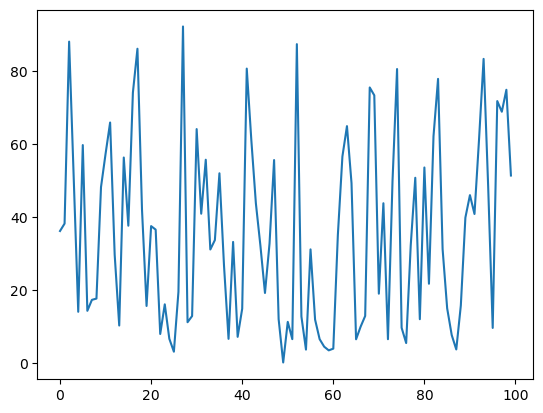

In [24]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

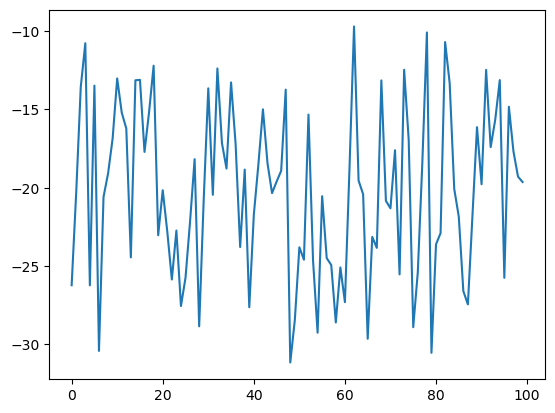

In [25]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [26]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [27]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [28]:
o = o_old[-10:]

In [29]:
x_ = [i+1 for i in range(200)]

In [30]:
np.array(o).shape

(10, 200, 3)

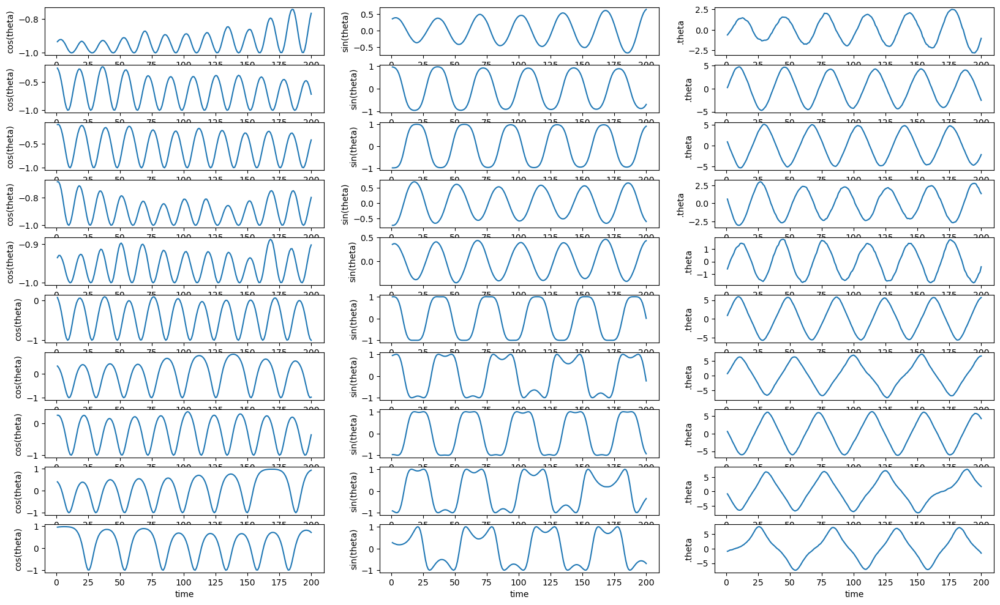

In [31]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [32]:
len(total_losses)

24000

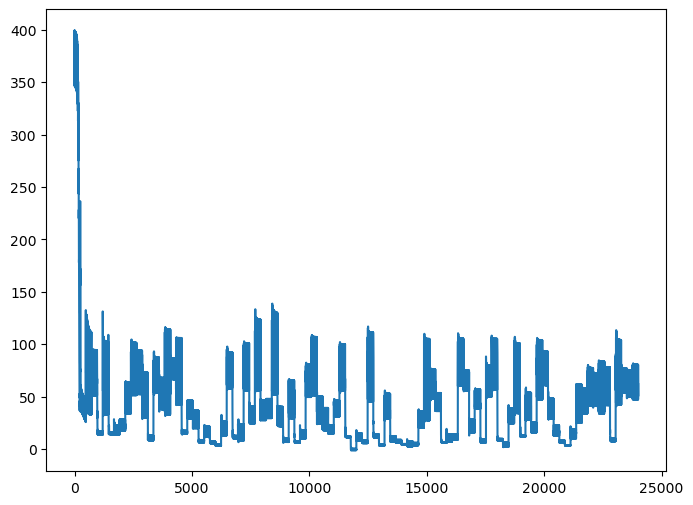

In [33]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and GAE

In [34]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = True
use_clip = False
n_critic = 5

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip, n_critic)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 214.517854563625, actor_loss: 14.422363624414134, critic_loss: 400.1909818784217
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 208.70049002598898, actor_loss: 16.73945791987314, critic_loss: 383.9220642122317
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 254.13749335390892, actor_loss: 18.698308334265626, critic_loss: 470.8783700392866
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 194.10610734273462, actor_loss: 16.972553201428184, critic_loss: 354.26710828261287
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 246.045432963719, actor_loss: 19.140864832438226, critic_loss: 453.8091362625616
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 121.23352279387925, actor_loss: 11.758369323141705, critic_loss: 218.95030694147508
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 163.11225041715565, actor_loss: 14.772361133820691, critic_loss: 296.67977856666994
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 200.87884094200598, actor_loss: 17.02779166968792, cr

n: 0, epoch: 8, minibatch no.: 2,
total_loss: 249.2057612087068, actor_loss: 17.90624954823365, critic_loss: 462.5990233209463
n: 0, epoch: 8, minibatch no.: 3,
total_loss: 189.3782054035618, actor_loss: 15.706556344591949, critic_loss: 347.3432981179397
n: 0, epoch: 8, minibatch no.: 4,
total_loss: 240.22465896869892, actor_loss: 17.734118585634704, critic_loss: 444.9810807661284
n: 0, epoch: 8, minibatch no.: 5,
total_loss: 117.94882674216855, actor_loss: 11.026026448246627, critic_loss: 213.84560058784385
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 161.0605449733196, actor_loss: 16.205903402269616, critic_loss: 289.70928314209993
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 196.80676295142723, actor_loss: 17.156307541081432, critic_loss: 359.30091082069157
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 211.9509067384968, actor_loss: 16.184619150696456, critic_loss: 391.5325751756007
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 203.4042011037726, actor_loss: 15.950844018931551, cr

n: 0, epoch: 16, minibatch no.: 4,
total_loss: 174.52149922824594, actor_loss: 16.122867558704566, critic_loss: 316.79726333908275
n: 0, epoch: 16, minibatch no.: 5,
total_loss: 83.83257366061987, actor_loss: 10.173512512667727, critic_loss: 147.3181222959043
n: 0, epoch: 16, minibatch no.: 6,
total_loss: 114.83829887793323, actor_loss: 18.057335189225903, critic_loss: 193.56192737741463
n: 0, epoch: 16, minibatch no.: 7,
total_loss: 137.38064856199313, actor_loss: 17.09387028030958, critic_loss: 240.5735565633671
n: 0, epoch: 17, minibatch no.: 0,
total_loss: 156.35110581144852, actor_loss: 17.753241548522663, critic_loss: 277.19572852585173
n: 0, epoch: 17, minibatch no.: 1,
total_loss: 142.35838659810258, actor_loss: 14.811719502686055, critic_loss: 255.09333419083308
n: 0, epoch: 17, minibatch no.: 2,
total_loss: 166.92437890829967, actor_loss: 16.864925892733485, critic_loss: 300.1189060311324
n: 0, epoch: 17, minibatch no.: 3,
total_loss: 124.31740111166626, actor_loss: 15.534968

n: 0, epoch: 24, minibatch no.: 5,
total_loss: 56.50435467338793, actor_loss: 8.636935944193853, critic_loss: 95.73483745838816
n: 0, epoch: 24, minibatch no.: 6,
total_loss: 68.49202483311737, actor_loss: 21.299994176582196, critic_loss: 94.38406131307033
n: 0, epoch: 24, minibatch no.: 7,
total_loss: 75.59024892299826, actor_loss: 16.05125321955358, critic_loss: 119.07799140688935
n: 0, epoch: 25, minibatch no.: 0,
total_loss: 100.26787390948333, actor_loss: 19.062014071829903, critic_loss: 162.41171967530684
n: 0, epoch: 25, minibatch no.: 1,
total_loss: 84.95018428164775, actor_loss: 11.978162631488368, critic_loss: 145.94404330031875
n: 0, epoch: 25, minibatch no.: 2,
total_loss: 83.02812031762979, actor_loss: 13.793509502812487, critic_loss: 138.4692216296346
n: 0, epoch: 25, minibatch no.: 3,
total_loss: 73.04477026590725, actor_loss: 17.194964301323843, critic_loss: 111.6996119291668
n: 0, epoch: 25, minibatch no.: 4,
total_loss: 77.42785132087089, actor_loss: 11.15958331570452

n: 1, epoch: 2, minibatch no.: 5,
total_loss: 223.7692126221803, actor_loss: 25.334292345851356, critic_loss: 396.8698405526579
n: 1, epoch: 2, minibatch no.: 6,
total_loss: 203.90618372309777, actor_loss: 15.720181338196097, critic_loss: 376.37200476980337
n: 1, epoch: 2, minibatch no.: 7,
total_loss: 188.93496530343683, actor_loss: 15.948957579769282, critic_loss: 345.9720154473351
n: 1, epoch: 3, minibatch no.: 0,
total_loss: 198.46892388025046, actor_loss: 24.978970937147842, critic_loss: 346.97990588620524
n: 1, epoch: 3, minibatch no.: 1,
total_loss: 203.55866416009533, actor_loss: 20.081449004343032, critic_loss: 366.9544303115046
n: 1, epoch: 3, minibatch no.: 2,
total_loss: 197.82967092299486, actor_loss: 17.017193862472173, critic_loss: 361.6249541210454
n: 1, epoch: 3, minibatch no.: 3,
total_loss: 233.9372806469063, actor_loss: 39.30359332833042, critic_loss: 389.26737463715176
n: 1, epoch: 3, minibatch no.: 4,
total_loss: 172.65933427471907, actor_loss: 17.95464186040953, 

total_loss: 82.2432722131093, actor_loss: 24.005371135782028, critic_loss: 116.47580215465453
n: 1, epoch: 10, minibatch no.: 6,
total_loss: 71.96721359669976, actor_loss: 17.71385446280246, critic_loss: 108.50671826779461
n: 1, epoch: 10, minibatch no.: 7,
total_loss: 70.48310536663502, actor_loss: 16.942272672939186, critic_loss: 107.08166538739165
n: 1, epoch: 11, minibatch no.: 0,
total_loss: 90.52931021301907, actor_loss: 24.014699938697568, critic_loss: 133.02922054864302
n: 1, epoch: 11, minibatch no.: 1,
total_loss: 55.308712591960415, actor_loss: 20.621979051483645, critic_loss: 69.37346708095353
n: 1, epoch: 11, minibatch no.: 2,
total_loss: 80.44782383740198, actor_loss: 18.622788646476764, critic_loss: 123.65007038185045
n: 1, epoch: 11, minibatch no.: 3,
total_loss: 74.21232510831504, actor_loss: 26.984208503448794, critic_loss: 94.45623320973249
n: 1, epoch: 11, minibatch no.: 4,
total_loss: 63.51756259195604, actor_loss: 18.389855009915074, critic_loss: 90.25541516408194

n: 1, epoch: 18, minibatch no.: 6,
total_loss: 39.0719829720576, actor_loss: 19.1488712613518, critic_loss: 39.8462234214116
n: 1, epoch: 18, minibatch no.: 7,
total_loss: 30.1487664609963, actor_loss: 17.396142141176256, critic_loss: 25.50524863964009
n: 1, epoch: 19, minibatch no.: 0,
total_loss: 41.7394467772359, actor_loss: 22.966228035501594, critic_loss: 37.54643748346861
n: 1, epoch: 19, minibatch no.: 1,
total_loss: 35.58266413106021, actor_loss: 21.074010034146607, critic_loss: 29.01730819382722
n: 1, epoch: 19, minibatch no.: 2,
total_loss: 34.736308210086484, actor_loss: 19.648665140023457, critic_loss: 30.17528614012605
n: 1, epoch: 19, minibatch no.: 3,
total_loss: 31.54698004995619, actor_loss: 20.27212022774845, critic_loss: 22.549719644415486
n: 1, epoch: 19, minibatch no.: 4,
total_loss: 38.90495256797364, actor_loss: 18.46715607845072, critic_loss: 40.87559297904584
n: 1, epoch: 19, minibatch no.: 5,
total_loss: 35.3755581974182, actor_loss: 22.86347107714259, critic_

n: 1, epoch: 26, minibatch no.: 7,
total_loss: 26.62028194214886, actor_loss: 17.460327130666695, critic_loss: 18.31990962296433
n: 1, epoch: 27, minibatch no.: 0,
total_loss: 36.14198942051082, actor_loss: 21.947239323285533, critic_loss: 28.38950019445057
n: 1, epoch: 27, minibatch no.: 1,
total_loss: 32.89897186755972, actor_loss: 21.49613995700817, critic_loss: 22.805663821103106
n: 1, epoch: 27, minibatch no.: 2,
total_loss: 30.59651588108722, actor_loss: 20.226413467106422, critic_loss: 20.740204827961595
n: 1, epoch: 27, minibatch no.: 3,
total_loss: 25.31911882071151, actor_loss: 18.082212355399854, critic_loss: 14.473812930623312
n: 1, epoch: 27, minibatch no.: 4,
total_loss: 35.36638726251293, actor_loss: 18.406955696501395, critic_loss: 33.91886313202307
n: 1, epoch: 27, minibatch no.: 5,
total_loss: 31.329495587401027, actor_loss: 22.38278966739324, critic_loss: 17.89341184001557
n: 1, epoch: 27, minibatch no.: 6,
total_loss: 35.18659348238998, actor_loss: 20.05060097636318

n: 2, epoch: 5, minibatch no.: 1,
total_loss: 7.781745716547437, actor_loss: 4.438223728132372, critic_loss: 6.68704397683013
n: 2, epoch: 5, minibatch no.: 2,
total_loss: 6.525406486644361, actor_loss: 3.8233854655388044, critic_loss: 5.404042042211113
n: 2, epoch: 5, minibatch no.: 3,
total_loss: 7.494812555922033, actor_loss: 4.102969770806693, critic_loss: 6.7836855702306815
n: 2, epoch: 5, minibatch no.: 4,
total_loss: 7.314388015844754, actor_loss: 3.4079663355922722, critic_loss: 7.812843360504963
n: 2, epoch: 5, minibatch no.: 5,
total_loss: 8.235783268783058, actor_loss: 4.3190675006915, critic_loss: 7.833431536183114
n: 2, epoch: 5, minibatch no.: 6,
total_loss: 7.785627802719846, actor_loss: 3.522202892435064, critic_loss: 8.526849820569565
n: 2, epoch: 5, minibatch no.: 7,
total_loss: 7.026300139289796, actor_loss: 3.1764767792832735, critic_loss: 7.699646720013044
n: 2, epoch: 6, minibatch no.: 0,
total_loss: 8.335184464851302, actor_loss: 4.61403366487729, critic_loss: 7.

n: 2, epoch: 13, minibatch no.: 5,
total_loss: 8.131149742594427, actor_loss: 4.306413685792746, critic_loss: 7.649472113603361
n: 2, epoch: 13, minibatch no.: 6,
total_loss: 7.679346415643847, actor_loss: 3.534530534355934, critic_loss: 8.289631762575826
n: 2, epoch: 13, minibatch no.: 7,
total_loss: 6.886253353494566, actor_loss: 3.1669078998043783, critic_loss: 7.4386909073803755
n: 2, epoch: 14, minibatch no.: 0,
total_loss: 8.320109771596403, actor_loss: 4.608909554743181, critic_loss: 7.4224004337064455
n: 2, epoch: 14, minibatch no.: 1,
total_loss: 7.476130591532034, actor_loss: 4.4226172923959535, critic_loss: 6.107026598272162
n: 2, epoch: 14, minibatch no.: 2,
total_loss: 6.429398545292003, actor_loss: 3.8073881431612153, critic_loss: 5.244020804261574
n: 2, epoch: 14, minibatch no.: 3,
total_loss: 7.361829258730074, actor_loss: 4.136710609742605, critic_loss: 6.450237297974939
n: 2, epoch: 14, minibatch no.: 4,
total_loss: 7.247928954909236, actor_loss: 3.3940840686305362, c

n: 2, epoch: 21, minibatch no.: 6,
total_loss: 7.630945428165848, actor_loss: 3.546397992246071, critic_loss: 8.169094871839555
n: 2, epoch: 21, minibatch no.: 7,
total_loss: 6.84436945107526, actor_loss: 3.1561965713435067, critic_loss: 7.376345759463507
n: 2, epoch: 22, minibatch no.: 0,
total_loss: 8.275110059292453, actor_loss: 4.6060996481858165, critic_loss: 7.338020822213274
n: 2, epoch: 22, minibatch no.: 1,
total_loss: 7.434577595471522, actor_loss: 4.407946094719292, critic_loss: 6.053263001504459
n: 2, epoch: 22, minibatch no.: 2,
total_loss: 6.353388579737987, actor_loss: 3.7942324422096863, critic_loss: 5.118312275056602
n: 2, epoch: 22, minibatch no.: 3,
total_loss: 7.323541822966849, actor_loss: 4.167605055111903, critic_loss: 6.311873535709894
n: 2, epoch: 22, minibatch no.: 4,
total_loss: 7.195075888562225, actor_loss: 3.38059187319932, critic_loss: 7.62896803072581
n: 2, epoch: 22, minibatch no.: 5,
total_loss: 8.023821192592877, actor_loss: 4.292689667006749, critic_

n: 3, epoch: 0, minibatch no.: 0,
total_loss: 74.95341087598099, actor_loss: -4.92051644078835, critic_loss: 159.74785463353868
n: 3, epoch: 0, minibatch no.: 1,
total_loss: 72.67262666221535, actor_loss: -8.183141378539508, critic_loss: 161.7115360815097
n: 3, epoch: 0, minibatch no.: 2,
total_loss: 80.00197575067213, actor_loss: -5.426668428287051, critic_loss: 170.85728835791838
n: 3, epoch: 0, minibatch no.: 3,
total_loss: 96.87086998168698, actor_loss: -5.397934621692292, critic_loss: 204.53760920675853
n: 3, epoch: 0, minibatch no.: 4,
total_loss: 58.07605372977684, actor_loss: -5.259935384946938, critic_loss: 126.67197822944755
n: 3, epoch: 0, minibatch no.: 5,
total_loss: 23.197158999736445, actor_loss: -43.90057057292991, critic_loss: 134.1954591453327
n: 3, epoch: 0, minibatch no.: 6,
total_loss: 61.09319436536597, actor_loss: -9.407860129936415, critic_loss: 141.00210899060477
n: 3, epoch: 0, minibatch no.: 7,
total_loss: 46.802909790868604, actor_loss: -4.934093534009536, c

n: 3, epoch: 8, minibatch no.: 0,
total_loss: 49.26957747160182, actor_loss: -1.1410725388174487, critic_loss: 100.82130002083854
n: 3, epoch: 8, minibatch no.: 1,
total_loss: 38.84912005954165, actor_loss: -10.519202691885491, critic_loss: 98.73664550285427
n: 3, epoch: 8, minibatch no.: 2,
total_loss: 44.454036973581196, actor_loss: -3.065783462110476, critic_loss: 95.03964087138334
n: 3, epoch: 8, minibatch no.: 3,
total_loss: 63.128284136499275, actor_loss: -3.2510620541312947, critic_loss: 132.75869238126114
n: 3, epoch: 8, minibatch no.: 4,
total_loss: 33.83378830204095, actor_loss: -10.628577237861473, critic_loss: 88.92473107980484
n: 3, epoch: 8, minibatch no.: 5,
total_loss: -497.7370918180183, actor_loss: -547.1169950131789, critic_loss: 98.75980639032116
n: 3, epoch: 8, minibatch no.: 6,
total_loss: 47.186799290366814, actor_loss: -3.9888472114338933, critic_loss: 102.35129300360141
n: 3, epoch: 8, minibatch no.: 7,
total_loss: 36.66709503440427, actor_loss: -5.061346235129

n: 3, epoch: 16, minibatch no.: 3,
total_loss: 60.84693891046044, actor_loss: -2.8147623290133112, critic_loss: 127.3234024789475
n: 3, epoch: 16, minibatch no.: 4,
total_loss: 32.155339301888716, actor_loss: -10.653458544781483, critic_loss: 85.61759569334039
n: 3, epoch: 16, minibatch no.: 5,
total_loss: -601.6288167324692, actor_loss: -648.8034567718618, critic_loss: 94.34928007878521
n: 3, epoch: 16, minibatch no.: 6,
total_loss: 46.01486247535411, actor_loss: -3.295394778748807, critic_loss: 98.62051450820583
n: 3, epoch: 16, minibatch no.: 7,
total_loss: 36.14459101566122, actor_loss: -5.10243660709634, critic_loss: 82.49405524551513
n: 3, epoch: 17, minibatch no.: 0,
total_loss: 47.44572099689938, actor_loss: -0.4599746441005109, critic_loss: 95.81139128199979
n: 3, epoch: 17, minibatch no.: 1,
total_loss: 36.84447402937495, actor_loss: -10.677153810854117, critic_loss: 95.04325568045813
n: 3, epoch: 17, minibatch no.: 2,
total_loss: 42.86903061754375, actor_loss: -2.59217072321

n: 3, epoch: 24, minibatch no.: 4,
total_loss: 32.44301759479096, actor_loss: -10.222373330717188, critic_loss: 85.3307818510163
n: 3, epoch: 24, minibatch no.: 5,
total_loss: -793.6112772063893, actor_loss: -840.585142859152, critic_loss: 93.94773130552545
n: 3, epoch: 24, minibatch no.: 6,
total_loss: 46.47290909458632, actor_loss: -2.656790406058121, critic_loss: 98.25939900128888
n: 3, epoch: 24, minibatch no.: 7,
total_loss: 37.03375771421457, actor_loss: -4.363973391194972, critic_loss: 82.7954622108191
n: 3, epoch: 25, minibatch no.: 0,
total_loss: 47.90767727943252, actor_loss: 0.10971975558152108, critic_loss: 95.595915047702
n: 3, epoch: 25, minibatch no.: 1,
total_loss: 36.91885850900231, actor_loss: -10.566388432377531, critic_loss: 94.97049388275968
n: 3, epoch: 25, minibatch no.: 2,
total_loss: 42.92038452189023, actor_loss: -2.3853133252706735, critic_loss: 90.6113956943218
n: 3, epoch: 25, minibatch no.: 3,
total_loss: 61.10360788851367, actor_loss: -2.260527234007088, 

n: 4, epoch: 2, minibatch no.: 4,
total_loss: 8.91864178575758, actor_loss: 3.3472140417339165, critic_loss: 11.142855488047328
n: 4, epoch: 2, minibatch no.: 5,
total_loss: 8.22021244384688, actor_loss: 3.654758021369009, critic_loss: 9.13090884495574
n: 4, epoch: 2, minibatch no.: 6,
total_loss: 8.773155907850253, actor_loss: 0.41549948469625625, critic_loss: 16.71531284630799
n: 4, epoch: 2, minibatch no.: 7,
total_loss: 13.616431415456248, actor_loss: 2.1884424908645337, critic_loss: 22.85597784918343
n: 4, epoch: 3, minibatch no.: 0,
total_loss: 11.03753478808716, actor_loss: 2.97479818472283, critic_loss: 16.12547320672866
n: 4, epoch: 3, minibatch no.: 1,
total_loss: 10.578579911172454, actor_loss: 1.2701851065962877, critic_loss: 18.616789609152335
n: 4, epoch: 3, minibatch no.: 2,
total_loss: 8.310211924573222, actor_loss: 0.9171787311862958, critic_loss: 14.786066386773852
n: 4, epoch: 3, minibatch no.: 3,
total_loss: 9.91422157272852, actor_loss: 0.7961459855731682, critic_l

n: 4, epoch: 10, minibatch no.: 7,
total_loss: 13.349120606184126, actor_loss: 2.1291881076036985, critic_loss: 22.439864997160853
n: 4, epoch: 11, minibatch no.: 0,
total_loss: 11.213609270660085, actor_loss: 2.9652523442448544, critic_loss: 16.49671385283046
n: 4, epoch: 11, minibatch no.: 1,
total_loss: 10.379436636374518, actor_loss: 1.2427773586022812, critic_loss: 18.273318555544474
n: 4, epoch: 11, minibatch no.: 2,
total_loss: 8.133201823083011, actor_loss: 0.9088272595804443, critic_loss: 14.448749127005135
n: 4, epoch: 11, minibatch no.: 3,
total_loss: 9.728900497397175, actor_loss: 0.8174153605937654, critic_loss: 17.82297027360682
n: 4, epoch: 11, minibatch no.: 4,
total_loss: 9.400016632017776, actor_loss: 3.296107699860354, critic_loss: 12.207817864314844
n: 4, epoch: 11, minibatch no.: 5,
total_loss: 8.970814210453966, actor_loss: 3.686362763850116, critic_loss: 10.5689028932077
n: 4, epoch: 11, minibatch no.: 6,
total_loss: 7.528636212248955, actor_loss: 0.4033593167177

n: 4, epoch: 19, minibatch no.: 2,
total_loss: 8.100736101790057, actor_loss: 0.8981250993272545, critic_loss: 14.405222004925605
n: 4, epoch: 19, minibatch no.: 3,
total_loss: 9.697012981095225, actor_loss: 0.842553943674998, critic_loss: 17.708918074840454
n: 4, epoch: 19, minibatch no.: 4,
total_loss: 9.336540212677365, actor_loss: 3.237301693053725, critic_loss: 12.19847703924728
n: 4, epoch: 19, minibatch no.: 5,
total_loss: 9.001667116093664, actor_loss: 3.72254802489514, critic_loss: 10.55823818239705
n: 4, epoch: 19, minibatch no.: 6,
total_loss: 7.443751052780368, actor_loss: 0.38986533417232094, critic_loss: 14.107771437216094
n: 4, epoch: 19, minibatch no.: 7,
total_loss: 13.247422650904277, actor_loss: 2.046655007490302, critic_loss: 22.40153528682795
n: 4, epoch: 20, minibatch no.: 0,
total_loss: 11.174282736508541, actor_loss: 2.9458088607090067, critic_loss: 16.456947751599067
n: 4, epoch: 20, minibatch no.: 1,
total_loss: 10.320465054299538, actor_loss: 1.20067997941944

n: 4, epoch: 27, minibatch no.: 5,
total_loss: 9.028464868234924, actor_loss: 3.7618144366901975, critic_loss: 10.533300863089451
n: 4, epoch: 27, minibatch no.: 6,
total_loss: 7.393965673993213, actor_loss: 0.3751337199299297, critic_loss: 14.037663908126566
n: 4, epoch: 27, minibatch no.: 7,
total_loss: 13.159814652746235, actor_loss: 1.9656280450636, critic_loss: 22.38837321536527
n: 4, epoch: 28, minibatch no.: 0,
total_loss: 11.13280177403249, actor_loss: 2.921440147768427, critic_loss: 16.422723252528126
n: 4, epoch: 28, minibatch no.: 1,
total_loss: 10.270841526635277, actor_loss: 1.1558863940945752, critic_loss: 18.229910265081404
n: 4, epoch: 28, minibatch no.: 2,
total_loss: 8.08150198385173, actor_loss: 0.8844802785821653, critic_loss: 14.394043410539128
n: 4, epoch: 28, minibatch no.: 3,
total_loss: 9.700041534709513, actor_loss: 0.8726234802257364, critic_loss: 17.65483610896755
n: 4, epoch: 28, minibatch no.: 4,
total_loss: 9.249272182882716, actor_loss: 3.165285161119710

n: 5, epoch: 5, minibatch no.: 7,
total_loss: 6.415463406882976, actor_loss: 2.5226177045864118, critic_loss: 7.785691404593128
n: 5, epoch: 6, minibatch no.: 0,
total_loss: 5.554879203029695, actor_loss: 1.8340923640021292, critic_loss: 7.441573678055132
n: 5, epoch: 6, minibatch no.: 1,
total_loss: 6.000778412880206, actor_loss: 2.7055769808251893, critic_loss: 6.590402864110033
n: 5, epoch: 6, minibatch no.: 2,
total_loss: 5.59256488127395, actor_loss: 1.967426214056412, critic_loss: 7.250277334435077
n: 5, epoch: 6, minibatch no.: 3,
total_loss: 6.234811633256272, actor_loss: 3.183913108725007, critic_loss: 6.1017970490625295
n: 5, epoch: 6, minibatch no.: 4,
total_loss: 6.169576393944009, actor_loss: 2.9620527113369843, critic_loss: 6.4150473652140505
n: 5, epoch: 6, minibatch no.: 5,
total_loss: 5.038884796009041, actor_loss: 1.520393287519832, critic_loss: 7.036983016978419
n: 5, epoch: 6, minibatch no.: 6,
total_loss: 5.652953875388671, actor_loss: 2.3618513478489858, critic_lo

n: 5, epoch: 14, minibatch no.: 1,
total_loss: 6.034744453892113, actor_loss: 2.708510173923782, critic_loss: 6.652468559936663
n: 5, epoch: 14, minibatch no.: 2,
total_loss: 5.4940972168124524, actor_loss: 1.9502143329444124, critic_loss: 7.087765767736081
n: 5, epoch: 14, minibatch no.: 3,
total_loss: 6.368836782967089, actor_loss: 3.1951239358785295, critic_loss: 6.34742569417712
n: 5, epoch: 14, minibatch no.: 4,
total_loss: 6.243977242020426, actor_loss: 2.959540537169803, critic_loss: 6.568873409701247
n: 5, epoch: 14, minibatch no.: 5,
total_loss: 4.93610774157998, actor_loss: 1.5103290596216588, critic_loss: 6.851557363916643
n: 5, epoch: 14, minibatch no.: 6,
total_loss: 5.6386954078070115, actor_loss: 2.3605590130468825, critic_loss: 6.556272789520257
n: 5, epoch: 14, minibatch no.: 7,
total_loss: 6.365506347970544, actor_loss: 2.538053069501164, critic_loss: 7.6549065569387595
n: 5, epoch: 15, minibatch no.: 0,
total_loss: 5.400648355605797, actor_loss: 1.8019530234590955, c

n: 5, epoch: 22, minibatch no.: 2,
total_loss: 5.471394601735311, actor_loss: 1.9309089134989184, critic_loss: 7.0809713764727835
n: 5, epoch: 22, minibatch no.: 3,
total_loss: 6.3778774630397095, actor_loss: 3.207959305417527, critic_loss: 6.339836315244364
n: 5, epoch: 22, minibatch no.: 4,
total_loss: 6.23806018913704, actor_loss: 2.9560923189311983, critic_loss: 6.563935740411684
n: 5, epoch: 22, minibatch no.: 5,
total_loss: 4.916297954946939, actor_loss: 1.498843231285906, critic_loss: 6.834909447322067
n: 5, epoch: 22, minibatch no.: 6,
total_loss: 5.638216241314485, actor_loss: 2.3586837397989893, critic_loss: 6.559065003030991
n: 5, epoch: 22, minibatch no.: 7,
total_loss: 6.381157888176222, actor_loss: 2.5537133858703784, critic_loss: 7.654889004611687
n: 5, epoch: 23, minibatch no.: 0,
total_loss: 5.368880553157761, actor_loss: 1.7709323178726744, critic_loss: 7.195896470570173
n: 5, epoch: 23, minibatch no.: 1,
total_loss: 6.038460971839817, actor_loss: 2.7120112105185235, 

n: 6, epoch: 0, minibatch no.: 4,
total_loss: 37.86495255440755, actor_loss: -3.8956794987066563, critic_loss: 83.52126410622841
n: 6, epoch: 0, minibatch no.: 5,
total_loss: 35.46451778752435, actor_loss: -5.130821650665514, critic_loss: 81.19067887637974
n: 6, epoch: 0, minibatch no.: 6,
total_loss: 29.26439580941638, actor_loss: -2.18641964182217, critic_loss: 62.9016309024771
n: 6, epoch: 0, minibatch no.: 7,
total_loss: 28.235227329705193, actor_loss: -3.7222040760617654, critic_loss: 63.914862811533915
n: 6, epoch: 1, minibatch no.: 0,
total_loss: 22.044616853407934, actor_loss: -5.529217103154525, critic_loss: 55.14766791312492
n: 6, epoch: 1, minibatch no.: 1,
total_loss: 24.04084779928018, actor_loss: -2.098834354624613, critic_loss: 52.27936430780959
n: 6, epoch: 1, minibatch no.: 2,
total_loss: 13.852407893725662, actor_loss: -3.865246247800314, critic_loss: 35.43530828305195
n: 6, epoch: 1, minibatch no.: 3,
total_loss: 32.365701232650856, actor_loss: -5.393168895803357, cr

n: 6, epoch: 8, minibatch no.: 6,
total_loss: 31.166663557371777, actor_loss: -2.3102971785572124, critic_loss: 66.95392147185798
n: 6, epoch: 8, minibatch no.: 7,
total_loss: 26.192082066836896, actor_loss: -3.7050509197519426, critic_loss: 59.79426597317768
n: 6, epoch: 9, minibatch no.: 0,
total_loss: 20.552012286224407, actor_loss: -5.685302294542375, critic_loss: 52.474629161533564
n: 6, epoch: 9, minibatch no.: 1,
total_loss: 23.392260700417694, actor_loss: -2.623665934697509, critic_loss: 52.03185327023041
n: 6, epoch: 9, minibatch no.: 2,
total_loss: 13.543815189102473, actor_loss: -3.8858477553940016, critic_loss: 34.85932588899295
n: 6, epoch: 9, minibatch no.: 3,
total_loss: 32.9349824987911, actor_loss: -5.580116212472944, critic_loss: 77.03019742252809
n: 6, epoch: 9, minibatch no.: 4,
total_loss: 30.20870627831372, actor_loss: -3.868026069956704, critic_loss: 68.15346469654085
n: 6, epoch: 9, minibatch no.: 5,
total_loss: 32.407605773320505, actor_loss: -5.856306858579363

n: 6, epoch: 17, minibatch no.: 0,
total_loss: 20.19743241980274, actor_loss: -6.013969240468796, critic_loss: 52.422803320543075
n: 6, epoch: 17, minibatch no.: 1,
total_loss: 22.43843529360646, actor_loss: -3.5691250494645446, critic_loss: 52.01512068614201
n: 6, epoch: 17, minibatch no.: 2,
total_loss: 13.859071140112857, actor_loss: -3.559482202117508, critic_loss: 34.83710668446073
n: 6, epoch: 17, minibatch no.: 3,
total_loss: 31.421223261589866, actor_loss: -6.95455124294633, critic_loss: 76.75154900907239
n: 6, epoch: 17, minibatch no.: 4,
total_loss: 30.634674160716173, actor_loss: -3.3381287129961668, critic_loss: 67.94560574742468
n: 6, epoch: 17, minibatch no.: 5,
total_loss: 20.292206491172447, actor_loss: -17.953765887886593, critic_loss: 76.49194475811808
n: 6, epoch: 17, minibatch no.: 6,
total_loss: 31.09261615847371, actor_loss: -2.2830712315129413, critic_loss: 66.7513747799733
n: 6, epoch: 17, minibatch no.: 7,
total_loss: 26.45133841407626, actor_loss: -3.379387887

n: 6, epoch: 25, minibatch no.: 0,
total_loss: 20.727565520674666, actor_loss: -5.480894914116374, critic_loss: 52.41692086958208
n: 6, epoch: 25, minibatch no.: 1,
total_loss: 21.950555154868802, actor_loss: -4.043421301675631, critic_loss: 51.98795291308887
n: 6, epoch: 25, minibatch no.: 2,
total_loss: 15.039295222367619, actor_loss: -2.3616756092862716, critic_loss: 34.80194166330778
n: 6, epoch: 25, minibatch no.: 3,
total_loss: 24.285731626154327, actor_loss: -14.054869229737012, critic_loss: 76.68120171178268
n: 6, epoch: 25, minibatch no.: 4,
total_loss: 31.802928233330597, actor_loss: -2.1533539503626518, critic_loss: 67.9125643673865
n: 6, epoch: 25, minibatch no.: 5,
total_loss: -50.6053808584328, actor_loss: -88.82458341003321, critic_loss: 76.43840510320082
n: 6, epoch: 25, minibatch no.: 6,
total_loss: 32.1288584183069, actor_loss: -1.1775636085895986, critic_loss: 66.612844053793
n: 6, epoch: 25, minibatch no.: 7,
total_loss: 27.630672439054447, actor_loss: -2.1816352779

n: 7, epoch: 3, minibatch no.: 0,
total_loss: 24.220153143120736, actor_loss: -0.21714913399041086, critic_loss: 48.874604554222294
n: 7, epoch: 3, minibatch no.: 1,
total_loss: 30.714051642053082, actor_loss: 2.2986537709455788, critic_loss: 56.83079574221501
n: 7, epoch: 3, minibatch no.: 2,
total_loss: 26.346384188555312, actor_loss: -1.2968169613133167, critic_loss: 55.286402299737254
n: 7, epoch: 3, minibatch no.: 3,
total_loss: 20.69716740497102, actor_loss: -1.2748122074653927, critic_loss: 43.94395922487282
n: 7, epoch: 3, minibatch no.: 4,
total_loss: 23.68016210963745, actor_loss: -0.6319574269376439, critic_loss: 48.624239073150186
n: 7, epoch: 3, minibatch no.: 5,
total_loss: 25.886847719867504, actor_loss: -1.96811484416349, critic_loss: 55.70992512806199
n: 7, epoch: 3, minibatch no.: 6,
total_loss: 21.66637478140067, actor_loss: -0.3567148335606991, critic_loss: 44.046179229922735
n: 7, epoch: 3, minibatch no.: 7,
total_loss: 20.875284942288726, actor_loss: 0.74016657020

n: 7, epoch: 11, minibatch no.: 6,
total_loss: 21.805409982540837, actor_loss: -0.261144336225048, critic_loss: 44.13310863753177
n: 7, epoch: 11, minibatch no.: 7,
total_loss: 20.7706500475148, actor_loss: 0.735327180934327, critic_loss: 40.070645733160944
n: 7, epoch: 12, minibatch no.: 0,
total_loss: 24.203784527293337, actor_loss: -0.22858297384179405, critic_loss: 48.86473500227026
n: 7, epoch: 12, minibatch no.: 1,
total_loss: 30.666949242957184, actor_loss: 2.4991411729246686, critic_loss: 56.33561614006503
n: 7, epoch: 12, minibatch no.: 2,
total_loss: 26.510066063931713, actor_loss: -1.203815141888254, critic_loss: 55.42776241163993
n: 7, epoch: 12, minibatch no.: 3,
total_loss: 20.17418209966079, actor_loss: -1.8441356243692602, critic_loss: 44.0366354480601
n: 7, epoch: 12, minibatch no.: 4,
total_loss: 23.381841201707722, actor_loss: -0.8385773552618768, critic_loss: 48.440837113939196
n: 7, epoch: 12, minibatch no.: 5,
total_loss: 25.56910824601478, actor_loss: -2.27367802

n: 7, epoch: 19, minibatch no.: 6,
total_loss: 21.927115440875625, actor_loss: -0.139455741185486, critic_loss: 44.13314236412222
n: 7, epoch: 19, minibatch no.: 7,
total_loss: 20.742792273906826, actor_loss: 0.7159025173639436, critic_loss: 40.053779513085765
n: 7, epoch: 20, minibatch no.: 0,
total_loss: 24.218466643199715, actor_loss: -0.22639616914649519, critic_loss: 48.88972562469242
n: 7, epoch: 20, minibatch no.: 1,
total_loss: 30.79344320423006, actor_loss: 2.6436526568040097, critic_loss: 56.299581094852094
n: 7, epoch: 20, minibatch no.: 2,
total_loss: 26.612614069534104, actor_loss: -1.0831331470632621, critic_loss: 55.39149443319473
n: 7, epoch: 20, minibatch no.: 3,
total_loss: 18.842351956530614, actor_loss: -3.1827004966777723, critic_loss: 44.05010490641677
n: 7, epoch: 20, minibatch no.: 4,
total_loss: 23.25675616565629, actor_loss: -0.9646816202357372, critic_loss: 48.44287557178406
n: 7, epoch: 20, minibatch no.: 5,
total_loss: 25.179493568269525, actor_loss: -2.638

n: 7, epoch: 27, minibatch no.: 6,
total_loss: 21.98019761644485, actor_loss: -0.08488725160929382, critic_loss: 44.13016973610829
n: 7, epoch: 27, minibatch no.: 7,
total_loss: 20.69474460655224, actor_loss: 0.667588974363919, critic_loss: 40.05431126437664
n: 7, epoch: 28, minibatch no.: 0,
total_loss: 24.22898466508099, actor_loss: -0.2211664587064181, critic_loss: 48.900302247574814
n: 7, epoch: 28, minibatch no.: 1,
total_loss: 30.76729993197658, actor_loss: 2.6257101290906792, critic_loss: 56.2831796057718
n: 7, epoch: 28, minibatch no.: 2,
total_loss: 26.724957825129884, actor_loss: -0.960832283515975, critic_loss: 55.37158021729172
n: 7, epoch: 28, minibatch no.: 3,
total_loss: 17.0702446803199, actor_loss: -4.957608268405372, critic_loss: 44.055705897450544
n: 7, epoch: 28, minibatch no.: 4,
total_loss: 23.291149105594165, actor_loss: -0.9296309891131678, critic_loss: 48.441560189414666
n: 7, epoch: 28, minibatch no.: 5,
total_loss: 25.054502167631046, actor_loss: -2.753471443

n: 8, epoch: 5, minibatch no.: 6,
total_loss: 20.349325612842033, actor_loss: 0.6577181919926538, critic_loss: 39.38321484169876
n: 8, epoch: 5, minibatch no.: 7,
total_loss: 19.279660587073383, actor_loss: 0.003442342920613459, critic_loss: 38.55243648830554
n: 8, epoch: 6, minibatch no.: 0,
total_loss: 18.203720800081552, actor_loss: -0.5885411970077312, critic_loss: 37.58452399417857
n: 8, epoch: 6, minibatch no.: 1,
total_loss: 19.204946356154554, actor_loss: 0.5963363476916942, critic_loss: 37.21722001692572
n: 8, epoch: 6, minibatch no.: 2,
total_loss: 26.5147311466088, actor_loss: -0.08643812189386031, critic_loss: 53.20233853700532
n: 8, epoch: 6, minibatch no.: 3,
total_loss: 18.558919108422913, actor_loss: 0.2516214172307326, critic_loss: 36.61459538238436
n: 8, epoch: 6, minibatch no.: 4,
total_loss: 23.416478868938196, actor_loss: 0.06309172645484817, critic_loss: 46.7067742849667
n: 8, epoch: 6, minibatch no.: 5,
total_loss: 18.282067200155453, actor_loss: 0.85247598108108

n: 8, epoch: 14, minibatch no.: 0,
total_loss: 18.203834441740742, actor_loss: -0.6073188599028124, critic_loss: 37.62230660328711
n: 8, epoch: 14, minibatch no.: 1,
total_loss: 19.070631250504004, actor_loss: 0.4721418064243569, critic_loss: 37.19697888815929
n: 8, epoch: 14, minibatch no.: 2,
total_loss: 26.486900510595323, actor_loss: -0.11515826689684139, critic_loss: 53.20411755498433
n: 8, epoch: 14, minibatch no.: 3,
total_loss: 18.537589545281868, actor_loss: 0.23278707917068642, critic_loss: 36.60960493222236
n: 8, epoch: 14, minibatch no.: 4,
total_loss: 23.365792534797155, actor_loss: 0.02520097434921628, critic_loss: 46.68118312089588
n: 8, epoch: 14, minibatch no.: 5,
total_loss: 18.361899677096154, actor_loss: 0.9183403865740287, critic_loss: 34.88711858104425
n: 8, epoch: 14, minibatch no.: 6,
total_loss: 19.81129510730488, actor_loss: 0.1333713657496281, critic_loss: 39.3558474831105
n: 8, epoch: 14, minibatch no.: 7,
total_loss: 18.66249126510411, actor_loss: -0.621586

n: 8, epoch: 21, minibatch no.: 7,
total_loss: 17.7726433900759, actor_loss: -1.5108210716608443, critic_loss: 38.56692892347348
n: 8, epoch: 22, minibatch no.: 0,
total_loss: 18.265595766032522, actor_loss: -0.5452464811790053, critic_loss: 37.62168449442306
n: 8, epoch: 22, minibatch no.: 1,
total_loss: 18.642806942228862, actor_loss: 0.04617747883298423, critic_loss: 37.193258926791756
n: 8, epoch: 22, minibatch no.: 2,
total_loss: 26.474132737150345, actor_loss: -0.12755984527055086, critic_loss: 53.20338516484179
n: 8, epoch: 22, minibatch no.: 3,
total_loss: 18.564914819917302, actor_loss: 0.2623105610147559, critic_loss: 36.60520851780509
n: 8, epoch: 22, minibatch no.: 4,
total_loss: 23.31912480737604, actor_loss: -0.020786614003500497, critic_loss: 46.67982284275908
n: 8, epoch: 22, minibatch no.: 5,
total_loss: 18.274295356714646, actor_loss: 0.8331463115071506, critic_loss: 34.88229809041499
n: 8, epoch: 22, minibatch no.: 6,
total_loss: 18.753071325627502, actor_loss: -0.92

n: 9, epoch: 0, minibatch no.: 0,
total_loss: 20.617842498540437, actor_loss: -0.7189309882819864, critic_loss: 42.67354697364485
n: 9, epoch: 0, minibatch no.: 1,
total_loss: 17.442304894696978, actor_loss: 0.6309198056013052, critic_loss: 33.622770178191345
n: 9, epoch: 0, minibatch no.: 2,
total_loss: 19.005805713697267, actor_loss: 0.15013557509082667, critic_loss: 37.711340277212884
n: 9, epoch: 0, minibatch no.: 3,
total_loss: 20.078050832682653, actor_loss: -0.008159147350220806, critic_loss: 40.172419960065746
n: 9, epoch: 0, minibatch no.: 4,
total_loss: 16.17662808079797, actor_loss: 1.3828636283570488, critic_loss: 29.587528904881836
n: 9, epoch: 0, minibatch no.: 5,
total_loss: 19.88518657901786, actor_loss: 2.044692098911181, critic_loss: 35.680988960213355
n: 9, epoch: 0, minibatch no.: 6,
total_loss: 25.243744933070033, actor_loss: 0.8853308140652218, critic_loss: 48.716828238009626
n: 9, epoch: 0, minibatch no.: 7,
total_loss: 24.799015224444098, actor_loss: 0.073509281

n: 9, epoch: 8, minibatch no.: 0,
total_loss: 20.420111185254054, actor_loss: -0.7611980508631602, critic_loss: 42.36261847223443
n: 9, epoch: 8, minibatch no.: 1,
total_loss: 17.37377303227452, actor_loss: 0.6599806360524614, critic_loss: 33.427584792444115
n: 9, epoch: 8, minibatch no.: 2,
total_loss: 18.680630772873002, actor_loss: 0.17270002758800676, critic_loss: 37.01586149056999
n: 9, epoch: 8, minibatch no.: 3,
total_loss: 20.095521303186935, actor_loss: -0.008552406180403517, critic_loss: 40.208147418734676
n: 9, epoch: 8, minibatch no.: 4,
total_loss: 16.081515130082163, actor_loss: 1.3342422482238516, critic_loss: 29.494545763716626
n: 9, epoch: 8, minibatch no.: 5,
total_loss: 19.859541885245104, actor_loss: 2.0357846030592586, critic_loss: 35.64751456437169
n: 9, epoch: 8, minibatch no.: 6,
total_loss: 25.15392103319919, actor_loss: 0.8618481120649274, critic_loss: 48.584145842268526
n: 9, epoch: 8, minibatch no.: 7,
total_loss: 24.63690914793944, actor_loss: 0.05873445456

n: 9, epoch: 15, minibatch no.: 7,
total_loss: 24.620369155328444, actor_loss: 0.039787252814391175, critic_loss: 49.1611638050281
n: 9, epoch: 16, minibatch no.: 0,
total_loss: 20.355229505228156, actor_loss: -0.8245658435546853, critic_loss: 42.35959069756568
n: 9, epoch: 16, minibatch no.: 1,
total_loss: 17.41184425509806, actor_loss: 0.70369023089839, critic_loss: 33.416308048399344
n: 9, epoch: 16, minibatch no.: 2,
total_loss: 18.685577297739208, actor_loss: 0.20576962365206775, critic_loss: 36.95961534817428
n: 9, epoch: 16, minibatch no.: 3,
total_loss: 20.098327904397774, actor_loss: -0.007393284908694025, critic_loss: 40.21144237861294
n: 9, epoch: 16, minibatch no.: 4,
total_loss: 16.000451046086315, actor_loss: 1.2665509356515174, critic_loss: 29.4678002208696
n: 9, epoch: 16, minibatch no.: 5,
total_loss: 19.84419976016805, actor_loss: 2.0140721749691806, critic_loss: 35.66025517039774
n: 9, epoch: 16, minibatch no.: 6,
total_loss: 25.132032754937295, actor_loss: 0.8307991

n: 9, epoch: 23, minibatch no.: 6,
total_loss: 25.110516985404388, actor_loss: 0.8107929687997538, critic_loss: 48.59944803320927
n: 9, epoch: 23, minibatch no.: 7,
total_loss: 24.58742632988857, actor_loss: 0.011577473656005009, critic_loss: 49.15169771246513
n: 9, epoch: 24, minibatch no.: 0,
total_loss: 20.28322518860104, actor_loss: -0.89727588304988, critic_loss: 42.36100214330184
n: 9, epoch: 24, minibatch no.: 1,
total_loss: 17.46192265561641, actor_loss: 0.7567401352875549, critic_loss: 33.41036504065771
n: 9, epoch: 24, minibatch no.: 2,
total_loss: 18.715252155191767, actor_loss: 0.2427205352158836, critic_loss: 36.945063239951764
n: 9, epoch: 24, minibatch no.: 3,
total_loss: 20.101818604997625, actor_loss: -0.003589660600809333, critic_loss: 40.21081653119687
n: 9, epoch: 24, minibatch no.: 4,
total_loss: 15.928484568870507, actor_loss: 1.1984578825704706, critic_loss: 29.460053372600072
n: 9, epoch: 24, minibatch no.: 5,
total_loss: 19.78295066106483, actor_loss: 1.9577967

n: 10, epoch: 1, minibatch no.: 6,
total_loss: 62.51283418933195, actor_loss: 23.658056248308093, critic_loss: 77.70955588204771
n: 10, epoch: 1, minibatch no.: 7,
total_loss: 44.57182198123717, actor_loss: 2.970212617349062, critic_loss: 83.20321872777622
n: 10, epoch: 2, minibatch no.: 0,
total_loss: 39.80652351574608, actor_loss: 6.228245193906336, critic_loss: 67.1565566436795
n: 10, epoch: 2, minibatch no.: 1,
total_loss: 26.958322894025518, actor_loss: 3.0820741885857212, critic_loss: 47.75249741087959
n: 10, epoch: 2, minibatch no.: 2,
total_loss: 32.04581753044092, actor_loss: 2.4693235133415468, critic_loss: 59.15298803419874
n: 10, epoch: 2, minibatch no.: 3,
total_loss: 48.46522877707583, actor_loss: 9.397851194158372, critic_loss: 78.13475516583492
n: 10, epoch: 2, minibatch no.: 4,
total_loss: 41.276149631824836, actor_loss: 3.2195965289881223, critic_loss: 76.11310620567343
n: 10, epoch: 2, minibatch no.: 5,
total_loss: 38.59394041999788, actor_loss: 1.3665068966718181, c

n: 10, epoch: 10, minibatch no.: 0,
total_loss: 30.542372764442344, actor_loss: 0.18874375026401505, critic_loss: 60.707258028356655
n: 10, epoch: 10, minibatch no.: 1,
total_loss: 25.058303802811317, actor_loss: 0.008279000524305306, critic_loss: 50.100049604574025
n: 10, epoch: 10, minibatch no.: 2,
total_loss: 30.96892393255144, actor_loss: 0.13765952398555317, critic_loss: 61.66252881713177
n: 10, epoch: 10, minibatch no.: 3,
total_loss: 38.85437083092375, actor_loss: 0.07569900652168644, critic_loss: 77.55734364880412
n: 10, epoch: 10, minibatch no.: 4,
total_loss: 37.75963943595737, actor_loss: -0.021757373163106115, critic_loss: 75.56279361824095
n: 10, epoch: 10, minibatch no.: 5,
total_loss: 37.41467694835585, actor_loss: 2.369700449201746e-05, critic_loss: 74.8293065027027
n: 10, epoch: 10, minibatch no.: 6,
total_loss: 35.3462327450586, actor_loss: 1.2992484991465793e-05, critic_loss: 70.69243950514722
n: 10, epoch: 10, minibatch no.: 7,
total_loss: 37.03660360071918, actor_

n: 10, epoch: 17, minibatch no.: 7,
total_loss: 36.71502487657422, actor_loss: -0.33069817004580637, critic_loss: 74.09144609324005
n: 10, epoch: 18, minibatch no.: 0,
total_loss: 30.409294937858142, actor_loss: 0.0632385197262566, critic_loss: 60.692112836263775
n: 10, epoch: 18, minibatch no.: 1,
total_loss: 25.05043570196166, actor_loss: 0.0016336775688011436, critic_loss: 50.09760404878572
n: 10, epoch: 18, minibatch no.: 2,
total_loss: 30.95601121129872, actor_loss: 0.08228675781292716, critic_loss: 61.747448906971584
n: 10, epoch: 18, minibatch no.: 3,
total_loss: 38.58925648197295, actor_loss: -0.005981846890537389, critic_loss: 77.19047665772698
n: 10, epoch: 18, minibatch no.: 4,
total_loss: 37.595867871074404, actor_loss: -0.027640382536754066, critic_loss: 75.24701650722231
n: 10, epoch: 18, minibatch no.: 5,
total_loss: 37.35949958742684, actor_loss: 3.389130917645331e-06, critic_loss: 74.71899239659184
n: 10, epoch: 18, minibatch no.: 6,
total_loss: 35.28280504198763, acto

n: 10, epoch: 25, minibatch no.: 7,
total_loss: 36.4875388864172, actor_loss: -0.33027657214891737, critic_loss: 73.63563091713223
n: 10, epoch: 26, minibatch no.: 0,
total_loss: 30.39538936787826, actor_loss: 0.030596254472756476, critic_loss: 60.72958622681101
n: 10, epoch: 26, minibatch no.: 1,
total_loss: 24.992797570118583, actor_loss: 0.0005737945205387741, critic_loss: 49.98444755119609
n: 10, epoch: 26, minibatch no.: 2,
total_loss: 30.874123605058408, actor_loss: 0.05568263179617452, critic_loss: 61.63688194652447
n: 10, epoch: 26, minibatch no.: 3,
total_loss: 38.43245195794716, actor_loss: -0.038196824818970986, critic_loss: 76.94129756553225
n: 10, epoch: 26, minibatch no.: 4,
total_loss: 37.49257002167547, actor_loss: -0.03543371529392461, critic_loss: 75.05600747393879
n: 10, epoch: 26, minibatch no.: 5,
total_loss: 37.34199603008595, actor_loss: 9.691458668191555e-07, critic_loss: 74.68399012188017
n: 10, epoch: 26, minibatch no.: 6,
total_loss: 35.26460478759307, actor_

n: 11, epoch: 3, minibatch no.: 6,
total_loss: 12.41322663691861, actor_loss: -0.44818712026316543, critic_loss: 25.72282751436355
n: 11, epoch: 3, minibatch no.: 7,
total_loss: 10.863650039484279, actor_loss: -0.878155208129664, critic_loss: 23.483610495227886
n: 11, epoch: 4, minibatch no.: 0,
total_loss: 10.410857110706422, actor_loss: -0.0843257977329732, critic_loss: 20.99036581687879
n: 11, epoch: 4, minibatch no.: 1,
total_loss: 17.318620845722577, actor_loss: -0.6424683332900913, critic_loss: 35.922178358025334
n: 11, epoch: 4, minibatch no.: 2,
total_loss: 13.646825707110603, actor_loss: -1.227486416955195, critic_loss: 29.748624248131595
n: 11, epoch: 4, minibatch no.: 3,
total_loss: 12.59500236745356, actor_loss: -1.295959320515624, critic_loss: 27.78192337593837
n: 11, epoch: 4, minibatch no.: 4,
total_loss: 13.801162123748627, actor_loss: -0.3068466783592457, critic_loss: 28.216017604215747
n: 11, epoch: 4, minibatch no.: 5,
total_loss: 11.717801296314613, actor_loss: 1.41

n: 11, epoch: 11, minibatch no.: 6,
total_loss: 12.482760788525868, actor_loss: -0.38661307046078686, critic_loss: 25.738747717973308
n: 11, epoch: 11, minibatch no.: 7,
total_loss: 10.292265768837149, actor_loss: -1.453766533103413, critic_loss: 23.492064603881126
n: 11, epoch: 12, minibatch no.: 0,
total_loss: 10.151710372138227, actor_loss: -0.34502480072668434, critic_loss: 20.993470345729822
n: 11, epoch: 12, minibatch no.: 1,
total_loss: 17.20217958805497, actor_loss: -0.7416143304569787, critic_loss: 35.8875878370239
n: 11, epoch: 12, minibatch no.: 2,
total_loss: 13.662290108487117, actor_loss: -1.2123613875667838, critic_loss: 29.7493029921078
n: 11, epoch: 12, minibatch no.: 3,
total_loss: 12.260973395569174, actor_loss: -1.5053503096135814, critic_loss: 27.53264741036551
n: 11, epoch: 12, minibatch no.: 4,
total_loss: 12.888717788237505, actor_loss: -1.2702871210663444, critic_loss: 28.3180098186077
n: 11, epoch: 12, minibatch no.: 5,
total_loss: 11.624662017881155, actor_lo

n: 11, epoch: 19, minibatch no.: 6,
total_loss: 12.340578602573817, actor_loss: -0.5295624260688503, critic_loss: 25.740282057285334
n: 11, epoch: 19, minibatch no.: 7,
total_loss: 9.495862671663831, actor_loss: -2.24354905806327, critic_loss: 23.4788234594542
n: 11, epoch: 20, minibatch no.: 0,
total_loss: 10.05325714591962, actor_loss: -0.43840035175063097, critic_loss: 20.983314995340503
n: 11, epoch: 20, minibatch no.: 1,
total_loss: 17.14438126792929, actor_loss: -0.7967545228506727, critic_loss: 35.88227158155993
n: 11, epoch: 20, minibatch no.: 2,
total_loss: 13.652659122301742, actor_loss: -1.2217186297335942, critic_loss: 29.748755504070672
n: 11, epoch: 20, minibatch no.: 3,
total_loss: 12.092807315703336, actor_loss: -1.6494961758479425, critic_loss: 27.484606983102555
n: 11, epoch: 20, minibatch no.: 4,
total_loss: 11.84711957884204, actor_loss: -2.311603692643685, critic_loss: 28.31744654297145
n: 11, epoch: 20, minibatch no.: 5,
total_loss: 11.40700357758689, actor_loss: 

n: 11, epoch: 27, minibatch no.: 5,
total_loss: 11.248221191672041, actor_loss: 0.9076236665135464, critic_loss: 20.68119505031699
n: 11, epoch: 27, minibatch no.: 6,
total_loss: 11.747391001864786, actor_loss: -1.1199603042379043, critic_loss: 25.734702612205382
n: 11, epoch: 27, minibatch no.: 7,
total_loss: 8.718855049999306, actor_loss: -3.0172998609707244, critic_loss: 23.47230982194006
n: 11, epoch: 28, minibatch no.: 0,
total_loss: 10.1043089794899, actor_loss: -0.38594900841418844, critic_loss: 20.980515975808178
n: 11, epoch: 28, minibatch no.: 1,
total_loss: 17.155433491923965, actor_loss: -0.7844866956745783, critic_loss: 35.879840375197084
n: 11, epoch: 28, minibatch no.: 2,
total_loss: 13.644538662751089, actor_loss: -1.2305500480027058, critic_loss: 29.75017742150759
n: 11, epoch: 28, minibatch no.: 3,
total_loss: 12.021538322671839, actor_loss: -1.7019084670735583, critic_loss: 27.446893579490794
n: 11, epoch: 28, minibatch no.: 4,
total_loss: 10.973281982301092, actor_l

n: 12, epoch: 5, minibatch no.: 5,
total_loss: 33.91888480618086, actor_loss: -1.4101340377737637, critic_loss: 70.65803768790926
n: 12, epoch: 5, minibatch no.: 6,
total_loss: 34.788098860017115, actor_loss: 0.2599896444100055, critic_loss: 69.05621843121422
n: 12, epoch: 5, minibatch no.: 7,
total_loss: 66.55086723352292, actor_loss: -0.35165644132673446, critic_loss: 133.80504734969932
n: 12, epoch: 6, minibatch no.: 0,
total_loss: 59.29149154701843, actor_loss: 2.282572850800198, critic_loss: 114.01783739243646
n: 12, epoch: 6, minibatch no.: 1,
total_loss: 44.18358482293268, actor_loss: -0.9723490573340089, critic_loss: 90.31186776053337
n: 12, epoch: 6, minibatch no.: 2,
total_loss: 25.32520558232856, actor_loss: -1.3692347056169012, critic_loss: 53.38888057589092
n: 12, epoch: 6, minibatch no.: 3,
total_loss: 32.89810478557815, actor_loss: 1.1661451689381852, critic_loss: 63.46391923327993
n: 12, epoch: 6, minibatch no.: 4,
total_loss: 31.735929083692795, actor_loss: 0.513903411

n: 12, epoch: 13, minibatch no.: 6,
total_loss: 34.72391265822374, actor_loss: 0.20219984543819902, critic_loss: 69.04342562557107
n: 12, epoch: 13, minibatch no.: 7,
total_loss: 66.11508408982377, actor_loss: -0.522112061403139, critic_loss: 133.2743923024538
n: 12, epoch: 14, minibatch no.: 0,
total_loss: 58.99961829745301, actor_loss: 2.3496170321522434, critic_loss: 113.30000253060153
n: 12, epoch: 14, minibatch no.: 1,
total_loss: 44.07902971108204, actor_loss: -0.8199584522523142, critic_loss: 89.79797632666872
n: 12, epoch: 14, minibatch no.: 2,
total_loss: 25.301552432387286, actor_loss: -1.3470045342593768, critic_loss: 53.297113933293325
n: 12, epoch: 14, minibatch no.: 3,
total_loss: 32.90701410585254, actor_loss: 1.1871067446776884, critic_loss: 63.439814722349695
n: 12, epoch: 14, minibatch no.: 4,
total_loss: 31.787195508379014, actor_loss: 0.5712965938667302, critic_loss: 62.43179782902457
n: 12, epoch: 14, minibatch no.: 5,
total_loss: 33.57063992820381, actor_loss: -1.

n: 12, epoch: 21, minibatch no.: 5,
total_loss: 33.505492505518276, actor_loss: -1.6024619088472165, critic_loss: 70.21590882873099
n: 12, epoch: 21, minibatch no.: 6,
total_loss: 34.717384499143, actor_loss: 0.18349063123028955, critic_loss: 69.06778773582542
n: 12, epoch: 21, minibatch no.: 7,
total_loss: 65.97855726855664, actor_loss: -0.598469095715547, critic_loss: 133.15405272854437
n: 12, epoch: 22, minibatch no.: 0,
total_loss: 58.830176214185684, actor_loss: 2.3521250091945913, critic_loss: 112.95610240998218
n: 12, epoch: 22, minibatch no.: 1,
total_loss: 44.05409482162297, actor_loss: -0.7397064588728604, critic_loss: 89.58760256099166
n: 12, epoch: 22, minibatch no.: 2,
total_loss: 25.26079699799618, actor_loss: -1.3288173562073917, critic_loss: 53.179228708407145
n: 12, epoch: 22, minibatch no.: 3,
total_loss: 32.90951207658397, actor_loss: 1.1910450108540034, critic_loss: 63.43693413145994
n: 12, epoch: 22, minibatch no.: 4,
total_loss: 31.812084158940092, actor_loss: 0.5

n: 12, epoch: 29, minibatch no.: 5,
total_loss: 33.42879439868889, actor_loss: -1.6561616057510467, critic_loss: 70.16991200887988
n: 12, epoch: 29, minibatch no.: 6,
total_loss: 34.70458644121812, actor_loss: 0.16051488142581935, critic_loss: 69.0881431195846
n: 12, epoch: 29, minibatch no.: 7,
total_loss: 65.85860578872719, actor_loss: -0.7125472206517964, critic_loss: 133.14230601875798
n: 13, epoch: 0, minibatch no.: 0,
total_loss: 0.22407233813871286, actor_loss: -1.497597785987462, critic_loss: 3.44334024825235
n: 13, epoch: 0, minibatch no.: 1,
total_loss: 0.1527255936357863, actor_loss: -1.5476903428175204, critic_loss: 3.4008318729066134
n: 13, epoch: 0, minibatch no.: 2,
total_loss: -0.2841146119271667, actor_loss: -1.5810867776946285, critic_loss: 2.5939443315349235
n: 13, epoch: 0, minibatch no.: 3,
total_loss: -0.581050035515938, actor_loss: -1.6490551419842752, critic_loss: 2.1360102129366743
n: 13, epoch: 0, minibatch no.: 4,
total_loss: -0.5285630303135056, actor_loss: 

n: 13, epoch: 7, minibatch no.: 4,
total_loss: -0.9915904259817263, actor_loss: -1.5441227121655066, critic_loss: 1.1050645723675605
n: 13, epoch: 7, minibatch no.: 5,
total_loss: -0.9600155372809491, actor_loss: -1.5489058441626469, critic_loss: 1.1777806137633955
n: 13, epoch: 7, minibatch no.: 6,
total_loss: -1.0256652070229977, actor_loss: -1.5248153860152862, critic_loss: 0.9983003579845771
n: 13, epoch: 7, minibatch no.: 7,
total_loss: -0.6539862401353074, actor_loss: -1.2039473733993644, critic_loss: 1.099922266528114
n: 13, epoch: 8, minibatch no.: 0,
total_loss: -0.8929610923914356, actor_loss: -1.486444704178741, critic_loss: 1.1869672235746107
n: 13, epoch: 8, minibatch no.: 1,
total_loss: -1.079588118825944, actor_loss: -1.6133734416109335, critic_loss: 1.0675706455699792
n: 13, epoch: 8, minibatch no.: 2,
total_loss: -1.0845870237573991, actor_loss: -1.5734918829347, critic_loss: 0.9778097183546017
n: 13, epoch: 8, minibatch no.: 3,
total_loss: -1.2732792544784615, actor_l

n: 13, epoch: 15, minibatch no.: 2,
total_loss: -1.0821401546398515, actor_loss: -1.5692279674838077, critic_loss: 0.9741756256879126
n: 13, epoch: 15, minibatch no.: 3,
total_loss: -1.267743639865957, actor_loss: -1.6306578734683275, critic_loss: 0.7258284672047411
n: 13, epoch: 15, minibatch no.: 4,
total_loss: -0.9718380607974294, actor_loss: -1.5221410005078957, critic_loss: 1.1006058794209326
n: 13, epoch: 15, minibatch no.: 5,
total_loss: -0.9391464757292906, actor_loss: -1.5258895296317387, critic_loss: 1.1734861078048964
n: 13, epoch: 15, minibatch no.: 6,
total_loss: -1.0622715710869328, actor_loss: -1.5590482608898981, critic_loss: 0.9935533796059306
n: 13, epoch: 15, minibatch no.: 7,
total_loss: -0.7396715962872829, actor_loss: -1.304373864709396, critic_loss: 1.1294045368442265
n: 13, epoch: 16, minibatch no.: 0,
total_loss: -0.8842873405283691, actor_loss: -1.476409131785522, critic_loss: 1.1842435825143056
n: 13, epoch: 16, minibatch no.: 1,
total_loss: -1.18565095992304

n: 13, epoch: 23, minibatch no.: 2,
total_loss: -1.0825755990401267, actor_loss: -1.5692649958787468, critic_loss: 0.9733787936772402
n: 13, epoch: 23, minibatch no.: 3,
total_loss: -1.252502992341322, actor_loss: -1.6153358117209657, critic_loss: 0.7256656387592875
n: 13, epoch: 23, minibatch no.: 4,
total_loss: -0.9465590088009381, actor_loss: -1.4964597922432208, critic_loss: 1.0998015668845653
n: 13, epoch: 23, minibatch no.: 5,
total_loss: -0.9166670502157857, actor_loss: -1.5026301534689424, critic_loss: 1.1719262065063134
n: 13, epoch: 23, minibatch no.: 6,
total_loss: -1.0936954778565617, actor_loss: -1.5897216916862618, critic_loss: 0.9920524276593999
n: 13, epoch: 23, minibatch no.: 7,
total_loss: -0.8548496829974516, actor_loss: -1.4202889264524252, critic_loss: 1.1308784869099473
n: 13, epoch: 24, minibatch no.: 0,
total_loss: -0.880988868917882, actor_loss: -1.472619491035585, critic_loss: 1.183261244235406
n: 13, epoch: 24, minibatch no.: 1,
total_loss: -1.321092824453878

n: 14, epoch: 1, minibatch no.: 2,
total_loss: 8.804847230769335, actor_loss: -1.9326486410841677, critic_loss: 21.474991743707005
n: 14, epoch: 1, minibatch no.: 3,
total_loss: 16.23058235457276, actor_loss: 1.0425607179952519, critic_loss: 30.37604327315502
n: 14, epoch: 1, minibatch no.: 4,
total_loss: 15.397464351235874, actor_loss: -0.3906002475986325, critic_loss: 31.57612919766901
n: 14, epoch: 1, minibatch no.: 5,
total_loss: 14.481492305233385, actor_loss: -0.024966862925704575, critic_loss: 29.01291833631818
n: 14, epoch: 1, minibatch no.: 6,
total_loss: 14.008402266891913, actor_loss: -1.644591794522595, critic_loss: 31.305988122829017
n: 14, epoch: 1, minibatch no.: 7,
total_loss: 14.034491375743377, actor_loss: -1.436142097288154, critic_loss: 30.941266946063063
n: 14, epoch: 2, minibatch no.: 0,
total_loss: 12.398284931390206, actor_loss: -1.6941686164181837, critic_loss: 28.18490709561678
n: 14, epoch: 2, minibatch no.: 1,
total_loss: 11.01861002225721, actor_loss: -1.36

n: 14, epoch: 9, minibatch no.: 2,
total_loss: 8.883844530679962, actor_loss: -1.8968836693654434, critic_loss: 21.56145640009081
n: 14, epoch: 9, minibatch no.: 3,
total_loss: 15.261026750210256, actor_loss: 0.20118451408724133, critic_loss: 30.11968447224603
n: 14, epoch: 9, minibatch no.: 4,
total_loss: 14.855568137018198, actor_loss: -0.571022144137111, critic_loss: 30.853180562310616
n: 14, epoch: 9, minibatch no.: 5,
total_loss: 13.768759821447285, actor_loss: -0.10726664334232523, critic_loss: 27.752052929579218
n: 14, epoch: 9, minibatch no.: 6,
total_loss: 13.919300572516697, actor_loss: -1.6246382244213484, critic_loss: 31.08787759387609
n: 14, epoch: 9, minibatch no.: 7,
total_loss: 14.03889996079516, actor_loss: -1.7642904710602656, critic_loss: 31.60638086371085
n: 14, epoch: 10, minibatch no.: 0,
total_loss: 12.396338441782413, actor_loss: -1.6790906585678491, critic_loss: 28.150858200700526
n: 14, epoch: 10, minibatch no.: 1,
total_loss: 10.591913863155636, actor_loss: -

n: 14, epoch: 17, minibatch no.: 1,
total_loss: 10.529544089376529, actor_loss: -1.718401304088522, critic_loss: 24.4958907869301
n: 14, epoch: 17, minibatch no.: 2,
total_loss: 8.9317482942368, actor_loss: -1.8326411740355726, critic_loss: 21.528778936544743
n: 14, epoch: 17, minibatch no.: 3,
total_loss: 15.01826144131172, actor_loss: -0.04086325477301471, critic_loss: 30.11824939216947
n: 14, epoch: 17, minibatch no.: 4,
total_loss: 14.82772777908674, actor_loss: -0.5987236898629915, critic_loss: 30.85290293789946
n: 14, epoch: 17, minibatch no.: 5,
total_loss: 13.72074832259537, actor_loss: -0.163888754879417, critic_loss: 27.769274154949574
n: 14, epoch: 17, minibatch no.: 6,
total_loss: 13.90774762398102, actor_loss: -1.6355876530396785, critic_loss: 31.086670554041397
n: 14, epoch: 17, minibatch no.: 7,
total_loss: 13.937406631616987, actor_loss: -1.8670307906488122, critic_loss: 31.6088748445316
n: 14, epoch: 18, minibatch no.: 0,
total_loss: 12.421990654438334, actor_loss: -1.

n: 14, epoch: 25, minibatch no.: 1,
total_loss: 10.473886166595534, actor_loss: -1.7735497586961748, critic_loss: 24.49487185058342
n: 14, epoch: 25, minibatch no.: 2,
total_loss: 8.911150084905273, actor_loss: -1.8505356892110387, critic_loss: 21.523371548232625
n: 14, epoch: 25, minibatch no.: 3,
total_loss: 14.881472535776034, actor_loss: -0.17702177558756108, critic_loss: 30.116988622727188
n: 14, epoch: 25, minibatch no.: 4,
total_loss: 14.806507755430731, actor_loss: -0.6164610488042849, critic_loss: 30.84593760847003
n: 14, epoch: 25, minibatch no.: 5,
total_loss: 13.670934310359065, actor_loss: -0.21700263248980378, critic_loss: 27.775873885697738
n: 14, epoch: 25, minibatch no.: 6,
total_loss: 13.898721589927053, actor_loss: -1.644399343596559, critic_loss: 31.086241867047224
n: 14, epoch: 25, minibatch no.: 7,
total_loss: 13.837937200811785, actor_loss: -1.9641957149839553, critic_loss: 31.60426583159148
n: 14, epoch: 26, minibatch no.: 0,
total_loss: 12.452741608363924, acto

n: 15, epoch: 3, minibatch no.: 2,
total_loss: 45.805222391612254, actor_loss: -4.536841034038852, critic_loss: 100.68412685130221
n: 15, epoch: 3, minibatch no.: 3,
total_loss: 35.019180078854276, actor_loss: -10.734468777428742, critic_loss: 91.50729771256603
n: 15, epoch: 3, minibatch no.: 4,
total_loss: 58.43975572013041, actor_loss: -0.4817532260161449, critic_loss: 117.8430178922931
n: 15, epoch: 3, minibatch no.: 5,
total_loss: 44.90770378149007, actor_loss: -1.8365841354860526, critic_loss: 93.48857583395224
n: 15, epoch: 3, minibatch no.: 6,
total_loss: 38.234750043367654, actor_loss: -0.6285834527051835, critic_loss: 77.72666699214568
n: 15, epoch: 3, minibatch no.: 7,
total_loss: 21.923621805114962, actor_loss: 2.4657872735185213, critic_loss: 38.91566906319288
n: 15, epoch: 4, minibatch no.: 0,
total_loss: 34.422132782545404, actor_loss: -0.4671843302379675, critic_loss: 69.77863422556675
n: 15, epoch: 4, minibatch no.: 1,
total_loss: 56.160012174922315, actor_loss: -0.6490

n: 15, epoch: 11, minibatch no.: 3,
total_loss: 32.45316906215485, actor_loss: -13.602863851174533, critic_loss: 92.11206582665876
n: 15, epoch: 11, minibatch no.: 4,
total_loss: 58.057543774277455, actor_loss: -0.7243091468739826, critic_loss: 117.56370584230288
n: 15, epoch: 11, minibatch no.: 5,
total_loss: 44.87500786441917, actor_loss: -1.8615882450887844, critic_loss: 93.4731922190159
n: 15, epoch: 11, minibatch no.: 6,
total_loss: 37.82292728445987, actor_loss: -0.6932192971673472, critic_loss: 77.03229316325444
n: 15, epoch: 11, minibatch no.: 7,
total_loss: 21.818236896653858, actor_loss: 2.693206066507276, critic_loss: 38.25006166029316
n: 15, epoch: 12, minibatch no.: 0,
total_loss: 33.90430304921147, actor_loss: -0.5324687313161771, critic_loss: 68.8735435610553
n: 15, epoch: 12, minibatch no.: 1,
total_loss: 56.29721914315083, actor_loss: -0.6329606666421163, critic_loss: 113.86035961958589
n: 15, epoch: 12, minibatch no.: 2,
total_loss: 45.85820838514525, actor_loss: -4.4

n: 15, epoch: 19, minibatch no.: 3,
total_loss: 30.953324409926825, actor_loss: -15.025339295982189, critic_loss: 91.95732741181803
n: 15, epoch: 19, minibatch no.: 4,
total_loss: 57.918369450591136, actor_loss: -0.8552069439460025, critic_loss: 117.54715278907427
n: 15, epoch: 19, minibatch no.: 5,
total_loss: 44.9038147311767, actor_loss: -1.8048550610754364, critic_loss: 93.41733958450428
n: 15, epoch: 19, minibatch no.: 6,
total_loss: 37.76503124800906, actor_loss: -0.7149874193754253, critic_loss: 76.96003733476897
n: 15, epoch: 19, minibatch no.: 7,
total_loss: 21.829638435394486, actor_loss: 2.756152397589395, critic_loss: 38.14697207561018
n: 15, epoch: 20, minibatch no.: 0,
total_loss: 33.83662442043203, actor_loss: -0.5586678968407751, critic_loss: 68.79058463454561
n: 15, epoch: 20, minibatch no.: 1,
total_loss: 56.136222903497426, actor_loss: -0.7478701403560334, critic_loss: 113.76818608770692
n: 15, epoch: 20, minibatch no.: 2,
total_loss: 45.93545315749949, actor_loss: -

n: 15, epoch: 27, minibatch no.: 4,
total_loss: 57.83852328609492, actor_loss: -0.9356864711990373, critic_loss: 117.5484195145879
n: 15, epoch: 27, minibatch no.: 5,
total_loss: 44.91538186617719, actor_loss: -1.7825503163387686, critic_loss: 93.39586436503193
n: 15, epoch: 27, minibatch no.: 6,
total_loss: 37.7219059265254, actor_loss: -0.7347087826763787, critic_loss: 76.91322941840356
n: 15, epoch: 27, minibatch no.: 7,
total_loss: 21.79371920527562, actor_loss: 2.7488345372154823, critic_loss: 38.08976933612028
n: 15, epoch: 28, minibatch no.: 0,
total_loss: 33.791263493749824, actor_loss: -0.5810423262057178, critic_loss: 68.74461163991108
n: 15, epoch: 28, minibatch no.: 1,
total_loss: 56.041975553363486, actor_loss: -0.8136155462485855, critic_loss: 113.71118219922414
n: 15, epoch: 28, minibatch no.: 2,
total_loss: 46.02098633028398, actor_loss: -4.334472591516758, critic_loss: 100.71091784360148
n: 15, epoch: 28, minibatch no.: 3,
total_loss: 29.87922144384293, actor_loss: -16

n: 16, epoch: 5, minibatch no.: 5,
total_loss: 40.809463773820326, actor_loss: -0.7474265454277524, critic_loss: 83.11378063849615
n: 16, epoch: 5, minibatch no.: 6,
total_loss: 32.89255124298613, actor_loss: -0.15976099896438734, critic_loss: 66.10462448390103
n: 16, epoch: 5, minibatch no.: 7,
total_loss: 43.02713777448509, actor_loss: 1.19229673138881, critic_loss: 83.66968208619257
n: 16, epoch: 6, minibatch no.: 0,
total_loss: 44.38749315275204, actor_loss: 1.3949111543696586, critic_loss: 85.98516399676477
n: 16, epoch: 6, minibatch no.: 1,
total_loss: 32.798895399422705, actor_loss: -0.5886466650480079, critic_loss: 66.77508412894143
n: 16, epoch: 6, minibatch no.: 2,
total_loss: 39.08904875888224, actor_loss: 0.1463993438611274, critic_loss: 77.88529883004223
n: 16, epoch: 6, minibatch no.: 3,
total_loss: 41.50436742401335, actor_loss: 3.5254820837944427, critic_loss: 75.95777068043782
n: 16, epoch: 6, minibatch no.: 4,
total_loss: 38.799894109141114, actor_loss: -1.53284832959

n: 16, epoch: 13, minibatch no.: 6,
total_loss: 32.88060445845672, actor_loss: -0.13222037682650284, critic_loss: 66.02564967056645
n: 16, epoch: 13, minibatch no.: 7,
total_loss: 42.96032947954011, actor_loss: 1.145745667220673, critic_loss: 83.62916762463887
n: 16, epoch: 14, minibatch no.: 0,
total_loss: 44.29115203263567, actor_loss: 1.3795675860617231, critic_loss: 85.8231688931479
n: 16, epoch: 14, minibatch no.: 1,
total_loss: 32.79856180120995, actor_loss: -0.5839766386564351, critic_loss: 66.76507687973277
n: 16, epoch: 14, minibatch no.: 2,
total_loss: 39.08222559700754, actor_loss: 0.14738135444878506, critic_loss: 77.86968848511752
n: 16, epoch: 14, minibatch no.: 3,
total_loss: 41.42926023203288, actor_loss: 3.486261369292674, critic_loss: 75.88599772548041
n: 16, epoch: 14, minibatch no.: 4,
total_loss: 38.757762871177086, actor_loss: -1.5548500581385296, critic_loss: 80.62522585863123
n: 16, epoch: 14, minibatch no.: 5,
total_loss: 40.86103196814111, actor_loss: -0.76927

n: 16, epoch: 22, minibatch no.: 2,
total_loss: 39.06667517737289, actor_loss: 0.133951228784355, critic_loss: 77.86544789717708
n: 16, epoch: 22, minibatch no.: 3,
total_loss: 41.40748093877421, actor_loss: 3.479769228982226, critic_loss: 75.85542341958397
n: 16, epoch: 22, minibatch no.: 4,
total_loss: 38.71719484969442, actor_loss: -1.5775556146877572, critic_loss: 80.58950092876437
n: 16, epoch: 22, minibatch no.: 5,
total_loss: 40.844426399729755, actor_loss: -0.7850322104703458, critic_loss: 83.2589172204002
n: 16, epoch: 22, minibatch no.: 6,
total_loss: 32.86686585131919, actor_loss: -0.132676319341501, critic_loss: 65.99908434132138
n: 16, epoch: 22, minibatch no.: 7,
total_loss: 42.94455324080343, actor_loss: 1.132959724071432, critic_loss: 83.62318703346399
n: 16, epoch: 23, minibatch no.: 0,
total_loss: 44.24955061002797, actor_loss: 1.371906562344474, critic_loss: 85.75528809536699
n: 16, epoch: 23, minibatch no.: 1,
total_loss: 32.783995993096674, actor_loss: -0.595982088

n: 17, epoch: 1, minibatch no.: 3,
total_loss: -0.8864653473580002, actor_loss: -1.950713230841663, critic_loss: 2.1284957669673257
n: 17, epoch: 1, minibatch no.: 4,
total_loss: -0.5383589366554675, actor_loss: -1.7629581703494799, critic_loss: 2.4491984673880247
n: 17, epoch: 1, minibatch no.: 5,
total_loss: 0.13304252424511298, actor_loss: -1.4785056813758333, critic_loss: 3.2230964112418925
n: 17, epoch: 1, minibatch no.: 6,
total_loss: -0.3388821846071768, actor_loss: -1.4840465530729303, critic_loss: 2.290328736931507
n: 17, epoch: 1, minibatch no.: 7,
total_loss: -0.9363422541178108, actor_loss: -1.958248206371419, critic_loss: 2.0438119045072165
n: 17, epoch: 2, minibatch no.: 0,
total_loss: -0.4427248707957889, actor_loss: -1.7029387266462113, critic_loss: 2.5204277117008447
n: 17, epoch: 2, minibatch no.: 1,
total_loss: -0.8536458923868049, actor_loss: -1.9383793145674202, critic_loss: 2.1694668443612306
n: 17, epoch: 2, minibatch no.: 2,
total_loss: -0.7385477876471793, acto

n: 17, epoch: 10, minibatch no.: 0,
total_loss: -0.541486240016552, actor_loss: -1.5166788257918744, critic_loss: 1.9503851715506448
n: 17, epoch: 10, minibatch no.: 1,
total_loss: -1.0440101216151891, actor_loss: -1.8343843941766376, critic_loss: 1.5807485451228969
n: 17, epoch: 10, minibatch no.: 2,
total_loss: -0.7631049118023803, actor_loss: -1.574091244163625, critic_loss: 1.6219726647224895
n: 17, epoch: 10, minibatch no.: 3,
total_loss: -1.4977741558097346, actor_loss: -2.5344809982893315, critic_loss: 2.0734136849591938
n: 17, epoch: 10, minibatch no.: 4,
total_loss: -0.92841655718586, actor_loss: -2.073332363003887, critic_loss: 2.289831611636054
n: 17, epoch: 10, minibatch no.: 5,
total_loss: -0.38959641823899216, actor_loss: -1.6374967533158633, critic_loss: 2.4958006701537423
n: 17, epoch: 10, minibatch no.: 6,
total_loss: -1.029212687529115, actor_loss: -1.788650250067402, critic_loss: 1.518875125076574
n: 17, epoch: 10, minibatch no.: 7,
total_loss: -0.7454115902494391, a

n: 17, epoch: 18, minibatch no.: 4,
total_loss: -1.1284913154318952, actor_loss: -2.2756021236229302, critic_loss: 2.29422161638207
n: 17, epoch: 18, minibatch no.: 5,
total_loss: -0.673622104009413, actor_loss: -1.9161187978057497, critic_loss: 2.4849933875926733
n: 17, epoch: 18, minibatch no.: 6,
total_loss: -1.4213437061347327, actor_loss: -2.176782442668284, critic_loss: 1.5108774730671028
n: 17, epoch: 18, minibatch no.: 7,
total_loss: -0.3684542046856052, actor_loss: -1.2533886923195632, critic_loss: 1.769868975267916
n: 17, epoch: 19, minibatch no.: 0,
total_loss: -0.2281459552781654, actor_loss: -1.2029259452491647, critic_loss: 1.9495599799419987
n: 17, epoch: 19, minibatch no.: 1,
total_loss: -0.9488281973243822, actor_loss: -1.7380250933376455, critic_loss: 1.5783937920265267
n: 17, epoch: 19, minibatch no.: 2,
total_loss: -0.4791210761969097, actor_loss: -1.2914210381557267, critic_loss: 1.624599923917634
n: 17, epoch: 19, minibatch no.: 3,
total_loss: -2.2019898676909717,

n: 17, epoch: 26, minibatch no.: 2,
total_loss: -0.17725883194323677, actor_loss: -0.989569814857895, critic_loss: 1.6246219658293164
n: 17, epoch: 26, minibatch no.: 3,
total_loss: -2.858099475260672, actor_loss: -3.8975951761242875, critic_loss: 2.0789914017272317
n: 17, epoch: 26, minibatch no.: 4,
total_loss: -1.1981570615213333, actor_loss: -2.3452483134402122, critic_loss: 2.294182503837758
n: 17, epoch: 26, minibatch no.: 5,
total_loss: -1.3353364781627124, actor_loss: -2.577627709225362, critic_loss: 2.4845824621252994
n: 17, epoch: 26, minibatch no.: 6,
total_loss: -1.905526107465006, actor_loss: -2.6605982456179222, critic_loss: 1.5101442763058324
n: 17, epoch: 26, minibatch no.: 7,
total_loss: 0.0650000435351854, actor_loss: -0.8200287603921307, critic_loss: 1.7700576078546322
n: 17, epoch: 27, minibatch no.: 0,
total_loss: 0.1329775210476014, actor_loss: -0.8418095287522193, critic_loss: 1.9495740995996413
n: 17, epoch: 27, minibatch no.: 1,
total_loss: -0.7971080202334901,

n: 18, epoch: 4, minibatch no.: 3,
total_loss: 10.590824235806977, actor_loss: -0.5065805589680393, critic_loss: 22.194809589550033
n: 18, epoch: 4, minibatch no.: 4,
total_loss: 11.400542526502026, actor_loss: 0.09820459612231877, critic_loss: 22.604675860759414
n: 18, epoch: 4, minibatch no.: 5,
total_loss: 11.888096232436183, actor_loss: -2.050712574238688, critic_loss: 27.87761761334974
n: 18, epoch: 4, minibatch no.: 6,
total_loss: 8.202325011230148, actor_loss: -1.5726636406922978, critic_loss: 19.54997730384489
n: 18, epoch: 4, minibatch no.: 7,
total_loss: 12.24321681512679, actor_loss: 0.5980840333482095, critic_loss: 23.29026556355716
n: 18, epoch: 5, minibatch no.: 0,
total_loss: 10.513911806115733, actor_loss: -1.7758406987189927, critic_loss: 24.57950500966945
n: 18, epoch: 5, minibatch no.: 1,
total_loss: 10.11755725153363, actor_loss: -1.4262916422185445, critic_loss: 23.087697787504347
n: 18, epoch: 5, minibatch no.: 2,
total_loss: 9.614343647359958, actor_loss: -0.8954

n: 18, epoch: 12, minibatch no.: 2,
total_loss: 9.450693288247473, actor_loss: -1.0586289434067548, critic_loss: 21.018644463308455
n: 18, epoch: 12, minibatch no.: 3,
total_loss: 11.067570900917739, actor_loss: -0.08995574486314208, critic_loss: 22.31505329156176
n: 18, epoch: 12, minibatch no.: 4,
total_loss: 11.933008559438495, actor_loss: 0.6050832000747989, critic_loss: 22.655850718727393
n: 18, epoch: 12, minibatch no.: 5,
total_loss: 11.110268926788324, actor_loss: -2.7810299368024523, critic_loss: 27.782597727181553
n: 18, epoch: 12, minibatch no.: 6,
total_loss: 7.736737138764406, actor_loss: -2.0080828390267578, critic_loss: 19.489639955582327
n: 18, epoch: 12, minibatch no.: 7,
total_loss: 12.08304489278983, actor_loss: 0.40717133208864814, critic_loss: 23.351747121402365
n: 18, epoch: 13, minibatch no.: 0,
total_loss: 10.172287511352737, actor_loss: -2.1119821250997557, critic_loss: 24.568539272904985
n: 18, epoch: 13, minibatch no.: 1,
total_loss: 9.911850646679035, actor_

n: 18, epoch: 20, minibatch no.: 4,
total_loss: 12.191117425506727, actor_loss: 0.8624048568654437, critic_loss: 22.657425137282566
n: 18, epoch: 20, minibatch no.: 5,
total_loss: 10.87244179199519, actor_loss: -3.01635036236237, critic_loss: 27.77758430871512
n: 18, epoch: 20, minibatch no.: 6,
total_loss: 7.563965624748247, actor_loss: -2.178950527724835, critic_loss: 19.485832304946165
n: 18, epoch: 20, minibatch no.: 7,
total_loss: 11.973777489207173, actor_loss: 0.3003500985201126, critic_loss: 23.34685478137412
n: 18, epoch: 21, minibatch no.: 0,
total_loss: 10.002720687837098, actor_loss: -2.2802116129274745, critic_loss: 24.565864601529146
n: 18, epoch: 21, minibatch no.: 1,
total_loss: 9.834707594702968, actor_loss: -1.6904795376325292, critic_loss: 23.050374264670992
n: 18, epoch: 21, minibatch no.: 2,
total_loss: 9.389273063636464, actor_loss: -1.1193175538052986, critic_loss: 21.017181234883527
n: 18, epoch: 21, minibatch no.: 3,
total_loss: 11.219872556233131, actor_loss: 

n: 18, epoch: 29, minibatch no.: 0,
total_loss: 9.93124498085902, actor_loss: -2.3507815906122613, critic_loss: 24.564053142942562
n: 18, epoch: 29, minibatch no.: 1,
total_loss: 9.80941469941244, actor_loss: -1.7135984401640105, critic_loss: 23.0460262791529
n: 18, epoch: 29, minibatch no.: 2,
total_loss: 9.371460694175466, actor_loss: -1.1368652469452718, critic_loss: 21.016651882241476
n: 18, epoch: 29, minibatch no.: 3,
total_loss: 11.267121528219525, actor_loss: 0.11257553281607643, critic_loss: 22.309091990806895
n: 18, epoch: 29, minibatch no.: 4,
total_loss: 12.289444677696883, actor_loss: 0.9609630556298595, critic_loss: 22.656963244134047
n: 18, epoch: 29, minibatch no.: 5,
total_loss: 10.783910933582497, actor_loss: -3.1044341622779426, critic_loss: 27.77669019172088
n: 18, epoch: 29, minibatch no.: 6,
total_loss: 7.499468127083648, actor_loss: -2.243578602231705, critic_loss: 19.486093458630705
n: 18, epoch: 29, minibatch no.: 7,
total_loss: 11.929760948206148, actor_loss: 

n: 19, epoch: 6, minibatch no.: 7,
total_loss: 0.3556571219919895, actor_loss: -0.007354767811637402, critic_loss: 0.7260237796072538
n: 19, epoch: 7, minibatch no.: 0,
total_loss: 0.3129023173454668, actor_loss: -0.09495376236270102, critic_loss: 0.8157121594163357
n: 19, epoch: 7, minibatch no.: 1,
total_loss: 0.6495472080151934, actor_loss: 0.2219046823478205, critic_loss: 0.8552850513347457
n: 19, epoch: 7, minibatch no.: 2,
total_loss: 0.4296357658410328, actor_loss: -0.012444870762854856, critic_loss: 0.8841612732077753
n: 19, epoch: 7, minibatch no.: 3,
total_loss: 0.508821541319345, actor_loss: 0.15641747428657457, critic_loss: 0.7048081340655409
n: 19, epoch: 7, minibatch no.: 4,
total_loss: 0.7366961628805082, actor_loss: 0.2692244552541569, critic_loss: 0.9349434152527025
n: 19, epoch: 7, minibatch no.: 5,
total_loss: 0.8499721001820728, actor_loss: 0.3512298773942937, critic_loss: 0.9974844455755582
n: 19, epoch: 7, minibatch no.: 6,
total_loss: 0.7264642831474998, actor_lo

n: 19, epoch: 14, minibatch no.: 6,
total_loss: 0.7149942236590788, actor_loss: 0.285023565101946, critic_loss: 0.8599413171142657
n: 19, epoch: 14, minibatch no.: 7,
total_loss: 0.35457393590967873, actor_loss: -0.008220749907610079, critic_loss: 0.7255893716345776
n: 19, epoch: 15, minibatch no.: 0,
total_loss: 0.30973323402626707, actor_loss: -0.09795937344900263, critic_loss: 0.8153852149505394
n: 19, epoch: 15, minibatch no.: 1,
total_loss: 0.6434059827251208, actor_loss: 0.21633102408495117, critic_loss: 0.8541499172803393
n: 19, epoch: 15, minibatch no.: 2,
total_loss: 0.4130042147504285, actor_loss: -0.029699767719691524, critic_loss: 0.88540796494024
n: 19, epoch: 15, minibatch no.: 3,
total_loss: 0.5138802074379984, actor_loss: 0.16170011802503564, critic_loss: 0.7043601788259255
n: 19, epoch: 15, minibatch no.: 4,
total_loss: 0.7548118691403599, actor_loss: 0.2880890828133037, critic_loss: 0.9334455726541124
n: 19, epoch: 15, minibatch no.: 5,
total_loss: 0.8240406651869463,

n: 19, epoch: 22, minibatch no.: 5,
total_loss: 0.8032225896642593, actor_loss: 0.3052178365427441, critic_loss: 0.9960095062430304
n: 19, epoch: 22, minibatch no.: 6,
total_loss: 0.7037267618866266, actor_loss: 0.27418811197826154, critic_loss: 0.8590772998167302
n: 19, epoch: 22, minibatch no.: 7,
total_loss: 0.35604581384621403, actor_loss: -0.006560413672279587, critic_loss: 0.7252124550369873
n: 19, epoch: 23, minibatch no.: 0,
total_loss: 0.30814088063511746, actor_loss: -0.09910218008298625, critic_loss: 0.8144861214362075
n: 19, epoch: 23, minibatch no.: 1,
total_loss: 0.6381106295909602, actor_loss: 0.21124755522099678, critic_loss: 0.8537261487399268
n: 19, epoch: 23, minibatch no.: 2,
total_loss: 0.4039381599600494, actor_loss: -0.038679018909162255, critic_loss: 0.8852343577384233
n: 19, epoch: 23, minibatch no.: 3,
total_loss: 0.5167108004981713, actor_loss: 0.16469780700841466, critic_loss: 0.7040259869795132
n: 19, epoch: 23, minibatch no.: 4,
total_loss: 0.7761073419565

n: 20, epoch: 1, minibatch no.: 2,
total_loss: 10.007942156808609, actor_loss: 1.4768562092087965, critic_loss: 17.062171895199626
n: 20, epoch: 1, minibatch no.: 3,
total_loss: 8.756074034095843, actor_loss: -0.7881834244444093, critic_loss: 19.088514917080502
n: 20, epoch: 1, minibatch no.: 4,
total_loss: 10.337886238742426, actor_loss: 0.33709320202930215, critic_loss: 20.001586073426246
n: 20, epoch: 1, minibatch no.: 5,
total_loss: 12.892159566444146, actor_loss: 0.8079086251550432, critic_loss: 24.168501882578205
n: 20, epoch: 1, minibatch no.: 6,
total_loss: 9.094189429375904, actor_loss: -1.0134859818689275, critic_loss: 20.21535082248966
n: 20, epoch: 1, minibatch no.: 7,
total_loss: 12.59036998633897, actor_loss: -1.9288843670034683, critic_loss: 29.038508706684876
n: 20, epoch: 2, minibatch no.: 0,
total_loss: 9.118770910008418, actor_loss: -1.8155161226514531, critic_loss: 21.86857406531974
n: 20, epoch: 2, minibatch no.: 1,
total_loss: 14.185062188037342, actor_loss: 1.676

n: 20, epoch: 9, minibatch no.: 7,
total_loss: 12.34682577583192, actor_loss: -2.0924261687660763, critic_loss: 28.878503889195994
n: 20, epoch: 10, minibatch no.: 0,
total_loss: 7.542714148255243, actor_loss: -3.3853785638582194, critic_loss: 21.856185424226926
n: 20, epoch: 10, minibatch no.: 1,
total_loss: 12.837288259951332, actor_loss: 0.4223132238563464, critic_loss: 24.829950072189973
n: 20, epoch: 10, minibatch no.: 2,
total_loss: 12.553230239101971, actor_loss: 3.931079558987652, critic_loss: 17.244301360228636
n: 20, epoch: 10, minibatch no.: 3,
total_loss: 9.02549535156005, actor_loss: -0.49987529493523536, critic_loss: 19.05074129299057
n: 20, epoch: 10, minibatch no.: 4,
total_loss: 9.557160366791946, actor_loss: -0.49741024679077656, critic_loss: 20.109141227165445
n: 20, epoch: 10, minibatch no.: 5,
total_loss: 11.035051203079707, actor_loss: -1.1025624721965863, critic_loss: 24.275227350552587
n: 20, epoch: 10, minibatch no.: 6,
total_loss: 8.636295462429924, actor_loss

n: 20, epoch: 18, minibatch no.: 4,
total_loss: 9.386198365355511, actor_loss: -0.6681764763672602, critic_loss: 20.108749683445545
n: 20, epoch: 18, minibatch no.: 5,
total_loss: 10.513378070898794, actor_loss: -1.6217396137003963, critic_loss: 24.27023536919838
n: 20, epoch: 18, minibatch no.: 6,
total_loss: 8.71240840128701, actor_loss: -1.3914332960579734, critic_loss: 20.20768339468997
n: 20, epoch: 18, minibatch no.: 7,
total_loss: 12.437903411766994, actor_loss: -1.9809947619400228, critic_loss: 28.837796347414034
n: 20, epoch: 19, minibatch no.: 0,
total_loss: 7.2582859958069115, actor_loss: -3.6653695232789674, critic_loss: 21.847311038171757
n: 20, epoch: 19, minibatch no.: 1,
total_loss: 12.372017971210326, actor_loss: -0.030618617119184798, critic_loss: 24.80527317665902
n: 20, epoch: 19, minibatch no.: 2,
total_loss: 12.87940214119337, actor_loss: 4.26358075762698, critic_loss: 17.231642767132783
n: 20, epoch: 19, minibatch no.: 3,
total_loss: 9.348953749943277, actor_loss

n: 20, epoch: 27, minibatch no.: 3,
total_loss: 9.431863799904807, actor_loss: -0.09922525383331504, critic_loss: 19.062178107476246
n: 20, epoch: 27, minibatch no.: 4,
total_loss: 9.337237326043896, actor_loss: -0.7179161788513647, critic_loss: 20.11030700979052
n: 20, epoch: 27, minibatch no.: 5,
total_loss: 10.302664794758845, actor_loss: -1.8329906547966563, critic_loss: 24.271310899111004
n: 20, epoch: 27, minibatch no.: 6,
total_loss: 8.716224295157934, actor_loss: -1.3890710441662595, critic_loss: 20.210590678648387
n: 20, epoch: 27, minibatch no.: 7,
total_loss: 12.425973973129555, actor_loss: -1.9789724929240657, critic_loss: 28.809892932107243
n: 20, epoch: 28, minibatch no.: 0,
total_loss: 7.222438018037992, actor_loss: -3.698607255793571, critic_loss: 21.842090547663126
n: 20, epoch: 28, minibatch no.: 1,
total_loss: 12.189432327374258, actor_loss: -0.20902377995669771, critic_loss: 24.796912214661912
n: 20, epoch: 28, minibatch no.: 2,
total_loss: 12.874995767381304, actor

n: 21, epoch: 5, minibatch no.: 3,
total_loss: 43.74817251556789, actor_loss: 1.4922810855489155, critic_loss: 84.51178286003794
n: 21, epoch: 5, minibatch no.: 4,
total_loss: 33.95079401214707, actor_loss: 0.20368349546006495, critic_loss: 67.49422103337402
n: 21, epoch: 5, minibatch no.: 5,
total_loss: 35.827518399149575, actor_loss: 0.8498358454939013, critic_loss: 69.95536510731135
n: 21, epoch: 5, minibatch no.: 6,
total_loss: 40.43422982824017, actor_loss: 0.1999792666851876, critic_loss: 80.46850112310996
n: 21, epoch: 5, minibatch no.: 7,
total_loss: 26.188534133104426, actor_loss: 0.22589543356710612, critic_loss: 51.92527739907464
n: 21, epoch: 6, minibatch no.: 0,
total_loss: 39.341350857302814, actor_loss: 1.7328466809569385, critic_loss: 75.21700835269175
n: 21, epoch: 6, minibatch no.: 1,
total_loss: 31.539603434297085, actor_loss: 3.9520154543123343, critic_loss: 55.1751759599695
n: 21, epoch: 6, minibatch no.: 2,
total_loss: 28.634304660733804, actor_loss: 4.98292976863

total_loss: 37.61134517875822, actor_loss: 0.050777948767881144, critic_loss: 75.12113445998068
n: 21, epoch: 14, minibatch no.: 1,
total_loss: 27.986289178274713, actor_loss: 6.577907828790648e-05, critic_loss: 55.97244679839285
n: 21, epoch: 14, minibatch no.: 2,
total_loss: 23.770813750084017, actor_loss: 0.05193389363156415, critic_loss: 47.43775971290491
n: 21, epoch: 14, minibatch no.: 3,
total_loss: 42.125212073121766, actor_loss: -0.028187564665773397, critic_loss: 84.30679927557507
n: 21, epoch: 14, minibatch no.: 4,
total_loss: 33.667810510404045, actor_loss: -0.0017010350759638741, critic_loss: 67.33902309096001
n: 21, epoch: 14, minibatch no.: 5,
total_loss: 35.13092181111507, actor_loss: 0.10409855583055469, critic_loss: 70.05364651056904
n: 21, epoch: 14, minibatch no.: 6,
total_loss: 40.102821336302306, actor_loss: -6.437860259447051e-07, critic_loss: 80.20564396017666
n: 21, epoch: 14, minibatch no.: 7,
total_loss: 25.267685644821114, actor_loss: -4.818179003714218e-07,

n: 21, epoch: 22, minibatch no.: 7,
total_loss: 25.195605918316982, actor_loss: -7.057724657051222e-08, critic_loss: 50.39121197778846
n: 21, epoch: 23, minibatch no.: 0,
total_loss: 37.58079871222006, actor_loss: 0.030404694958856567, critic_loss: 75.10078803452241
n: 21, epoch: 23, minibatch no.: 1,
total_loss: 27.950036832648298, actor_loss: 7.325675761499788e-06, critic_loss: 55.900059013945075
n: 21, epoch: 23, minibatch no.: 2,
total_loss: 23.72032947231114, actor_loss: 0.01889682870699185, critic_loss: 47.40286528720829
n: 21, epoch: 23, minibatch no.: 3,
total_loss: 42.1006362281382, actor_loss: -0.01864795106932537, critic_loss: 84.23856835841505
n: 21, epoch: 23, minibatch no.: 4,
total_loss: 33.659665963231895, actor_loss: -0.0006740323509893043, critic_loss: 67.32067999116576
n: 21, epoch: 23, minibatch no.: 5,
total_loss: 35.008992392276205, actor_loss: 0.08556043212471953, critic_loss: 69.84686392030297
n: 21, epoch: 23, minibatch no.: 6,
total_loss: 40.08483921363398, ac

n: 22, epoch: 1, minibatch no.: 2,
total_loss: 30.022491741400163, actor_loss: 0.14644290231498472, critic_loss: 59.75209767817036
n: 22, epoch: 1, minibatch no.: 3,
total_loss: 39.12906943535267, actor_loss: -0.7396344462613099, critic_loss: 79.73740776322796
n: 22, epoch: 1, minibatch no.: 4,
total_loss: 25.30924433848315, actor_loss: -6.4151691708544005, critic_loss: 63.448827018675104
n: 22, epoch: 1, minibatch no.: 5,
total_loss: 31.07893316243113, actor_loss: 1.2247566688409859, critic_loss: 59.70835298718029
n: 22, epoch: 1, minibatch no.: 6,
total_loss: 45.429349668537355, actor_loss: 3.2222231601298397, critic_loss: 84.41425301681504
n: 22, epoch: 1, minibatch no.: 7,
total_loss: 34.56042581141107, actor_loss: -0.5655745951011263, critic_loss: 70.2520008130244
n: 22, epoch: 2, minibatch no.: 0,
total_loss: 30.831917469599155, actor_loss: -0.7673421474823623, critic_loss: 63.19851923416304
n: 22, epoch: 2, minibatch no.: 1,
total_loss: 45.275812262659784, actor_loss: -0.4818780

n: 22, epoch: 10, minibatch no.: 2,
total_loss: 29.417351292763957, actor_loss: -0.4097277437199303, critic_loss: 59.654158072967775
n: 22, epoch: 10, minibatch no.: 3,
total_loss: 38.86554135425498, actor_loss: -0.6882718193277043, critic_loss: 79.10762634716536
n: 22, epoch: 10, minibatch no.: 4,
total_loss: 22.604261885463103, actor_loss: -8.961725056262804, critic_loss: 63.13197388345181
n: 22, epoch: 10, minibatch no.: 5,
total_loss: 30.210221018502782, actor_loss: -0.11797241587793555, critic_loss: 60.65638686876144
n: 22, epoch: 10, minibatch no.: 6,
total_loss: 44.44535892904949, actor_loss: 1.7556421114498015, critic_loss: 85.37943363519938
n: 22, epoch: 10, minibatch no.: 7,
total_loss: 33.307912289896144, actor_loss: -1.1017914372485125, critic_loss: 68.81940745428932
n: 22, epoch: 11, minibatch no.: 0,
total_loss: 30.35751297819548, actor_loss: -1.222537708240424, critic_loss: 63.16010137287181
n: 22, epoch: 11, minibatch no.: 1,
total_loss: 44.260374621626916, actor_loss: 

n: 22, epoch: 18, minibatch no.: 7,
total_loss: 33.25771727202197, actor_loss: -1.1126373167170354, critic_loss: 68.74070917747801
n: 22, epoch: 19, minibatch no.: 0,
total_loss: 30.279931296173178, actor_loss: -1.297095088979025, critic_loss: 63.1540527703044
n: 22, epoch: 19, minibatch no.: 1,
total_loss: 44.21127982125292, actor_loss: -1.4838342177582724, critic_loss: 91.39022807802239
n: 22, epoch: 19, minibatch no.: 2,
total_loss: 29.38937754494826, actor_loss: -0.4376320175566023, critic_loss: 59.654019125009725
n: 22, epoch: 19, minibatch no.: 3,
total_loss: 38.668203810693406, actor_loss: -0.8095440839590311, critic_loss: 78.95549578930488
n: 22, epoch: 19, minibatch no.: 4,
total_loss: 22.33841732665153, actor_loss: -9.216847991088462, critic_loss: 63.11053063547998
n: 22, epoch: 19, minibatch no.: 5,
total_loss: 30.191020258639842, actor_loss: -0.11252044271046176, critic_loss: 60.60708140270061
n: 22, epoch: 19, minibatch no.: 6,
total_loss: 44.522945103971445, actor_loss: 1

n: 22, epoch: 27, minibatch no.: 7,
total_loss: 33.212693882458495, actor_loss: -1.1393907777770809, critic_loss: 68.70416932047115
n: 22, epoch: 28, minibatch no.: 0,
total_loss: 30.19693821894738, actor_loss: -1.3781623211588863, critic_loss: 63.15020108021253
n: 22, epoch: 28, minibatch no.: 1,
total_loss: 44.14300119323255, actor_loss: -1.5560997812398283, critic_loss: 91.39820194894476
n: 22, epoch: 28, minibatch no.: 2,
total_loss: 29.359111778224662, actor_loss: -0.4683332239956247, critic_loss: 59.654890004440574
n: 22, epoch: 28, minibatch no.: 3,
total_loss: 38.52380607765229, actor_loss: -0.9166958098302509, critic_loss: 78.88100377496508
n: 22, epoch: 28, minibatch no.: 4,
total_loss: 22.329216605089083, actor_loss: -9.222423800555212, critic_loss: 63.10328081128859
n: 22, epoch: 28, minibatch no.: 5,
total_loss: 30.157031346823157, actor_loss: -0.12284558656184463, critic_loss: 60.55975386677
n: 22, epoch: 28, minibatch no.: 6,
total_loss: 44.49602650568281, actor_loss: 1.

n: 23, epoch: 6, minibatch no.: 3,
total_loss: 7.496774067532004, actor_loss: -1.8407621737121886, critic_loss: 18.675072482488385
n: 23, epoch: 6, minibatch no.: 4,
total_loss: 7.500493594413713, actor_loss: -1.730215574521924, critic_loss: 18.461418337871276
n: 23, epoch: 6, minibatch no.: 5,
total_loss: 7.40375447812011, actor_loss: -0.5217036564946806, critic_loss: 15.85091626922958
n: 23, epoch: 6, minibatch no.: 6,
total_loss: 10.318488467043528, actor_loss: -0.5577825316849288, critic_loss: 21.752541997456913
n: 23, epoch: 6, minibatch no.: 7,
total_loss: 7.472034305827428, actor_loss: -2.139322188016908, critic_loss: 19.222712987688674
n: 23, epoch: 7, minibatch no.: 0,
total_loss: 6.127850999410784, actor_loss: -1.9679144933287753, critic_loss: 16.19153098547912
n: 23, epoch: 7, minibatch no.: 1,
total_loss: 6.695382271885906, actor_loss: -1.9385209802862673, critic_loss: 17.267806504344346
n: 23, epoch: 7, minibatch no.: 2,
total_loss: 14.695847622558578, actor_loss: 1.852503

n: 23, epoch: 15, minibatch no.: 2,
total_loss: 14.795656011660922, actor_loss: 1.9651978110635173, critic_loss: 25.66091640119481
n: 23, epoch: 15, minibatch no.: 3,
total_loss: 7.319130366214111, actor_loss: -2.071724828266005, critic_loss: 18.78171038896023
n: 23, epoch: 15, minibatch no.: 4,
total_loss: 7.404463127652347, actor_loss: -1.8184234190622774, critic_loss: 18.44577309342925
n: 23, epoch: 15, minibatch no.: 5,
total_loss: 7.346867855805356, actor_loss: -0.4775149832496931, critic_loss: 15.648765678110099
n: 23, epoch: 15, minibatch no.: 6,
total_loss: 9.747752744359584, actor_loss: -1.026958457918026, critic_loss: 21.54942240455522
n: 23, epoch: 15, minibatch no.: 7,
total_loss: 7.16506461029814, actor_loss: -2.4481944768123314, critic_loss: 19.226518174220942
n: 23, epoch: 16, minibatch no.: 0,
total_loss: 5.774615577615112, actor_loss: -2.379227725241249, critic_loss: 16.30768660571272
n: 23, epoch: 16, minibatch no.: 1,
total_loss: 6.808209800928421, actor_loss: -1.877

n: 23, epoch: 24, minibatch no.: 2,
total_loss: 14.746560877022096, actor_loss: 1.9169927710931243, critic_loss: 25.659136211857945
n: 23, epoch: 24, minibatch no.: 3,
total_loss: 7.269351911022289, actor_loss: -2.122595831238177, critic_loss: 18.783895484520933
n: 23, epoch: 24, minibatch no.: 4,
total_loss: 7.452850892961571, actor_loss: -1.769889153741229, critic_loss: 18.4454800934056
n: 23, epoch: 24, minibatch no.: 5,
total_loss: 7.360732486227726, actor_loss: -0.4618825035916958, critic_loss: 15.645229979638843
n: 23, epoch: 24, minibatch no.: 6,
total_loss: 9.595076847262444, actor_loss: -1.176324722155286, critic_loss: 21.54280313883546
n: 23, epoch: 24, minibatch no.: 7,
total_loss: 7.18382900190567, actor_loss: -2.4298755884766625, critic_loss: 19.227409180764663
n: 23, epoch: 25, minibatch no.: 0,
total_loss: 5.670691740004537, actor_loss: -2.482708962187621, critic_loss: 16.306801404384316
n: 23, epoch: 25, minibatch no.: 1,
total_loss: 6.845378366105697, actor_loss: -1.84

n: 24, epoch: 2, minibatch no.: 4,
total_loss: 30.976235705319123, actor_loss: -0.004561188770900373, critic_loss: 61.961593788180046
n: 24, epoch: 2, minibatch no.: 5,
total_loss: 34.758081338026045, actor_loss: -1.6330848648734921, critic_loss: 72.78233240579908
n: 24, epoch: 2, minibatch no.: 6,
total_loss: 39.86927852322954, actor_loss: 0.25981561626923494, critic_loss: 79.2189258139206
n: 24, epoch: 2, minibatch no.: 7,
total_loss: 30.386932969519677, actor_loss: 0.030130617608565172, critic_loss: 60.71360470382222
n: 24, epoch: 3, minibatch no.: 0,
total_loss: 39.95657171530385, actor_loss: -0.4962535891819013, critic_loss: 80.90565060897151
n: 24, epoch: 3, minibatch no.: 1,
total_loss: 34.77666702384973, actor_loss: 1.0407765672470208, critic_loss: 67.47178091320542
n: 24, epoch: 3, minibatch no.: 2,
total_loss: 41.800907318921055, actor_loss: 0.220862617501974, critic_loss: 83.16008940283817
n: 24, epoch: 3, minibatch no.: 3,
total_loss: 58.83293017961593, actor_loss: 0.354153

n: 24, epoch: 11, minibatch no.: 1,
total_loss: 33.06767772283396, actor_loss: -0.20477015377113664, critic_loss: 66.5448957532102
n: 24, epoch: 11, minibatch no.: 2,
total_loss: 41.37717612662473, actor_loss: -0.049698856684372864, critic_loss: 82.85374996661821
n: 24, epoch: 11, minibatch no.: 3,
total_loss: 58.2865631737904, actor_loss: -0.21756693325104917, critic_loss: 117.0082602140829
n: 24, epoch: 11, minibatch no.: 4,
total_loss: 30.901029690050937, actor_loss: 0.05115575223768424, critic_loss: 61.69974787562651
n: 24, epoch: 11, minibatch no.: 5,
total_loss: 36.62664432788307, actor_loss: -0.37452743227876373, critic_loss: 74.00234352032366
n: 24, epoch: 11, minibatch no.: 6,
total_loss: 39.47387807046367, actor_loss: 0.0016336428029096127, critic_loss: 78.94448885532152
n: 24, epoch: 11, minibatch no.: 7,
total_loss: 30.06431641634643, actor_loss: -0.03177988035567065, critic_loss: 60.1921925934042
n: 24, epoch: 12, minibatch no.: 0,
total_loss: 39.60917704703564, actor_loss

n: 24, epoch: 20, minibatch no.: 1,
total_loss: 33.065693915406136, actor_loss: -0.1973431918998243, critic_loss: 66.52607421461192
n: 24, epoch: 20, minibatch no.: 2,
total_loss: 41.30614074650143, actor_loss: -0.11063124655242078, critic_loss: 82.8335439861077
n: 24, epoch: 20, minibatch no.: 3,
total_loss: 58.2713814597406, actor_loss: -0.2300022291190463, critic_loss: 117.0027673777193
n: 24, epoch: 20, minibatch no.: 4,
total_loss: 30.8546696599667, actor_loss: 0.010325900161385125, critic_loss: 61.68868751961063
n: 24, epoch: 20, minibatch no.: 5,
total_loss: 36.704761417946465, actor_loss: -0.28818320820198606, critic_loss: 73.9858892522969
n: 24, epoch: 20, minibatch no.: 6,
total_loss: 39.46073745699559, actor_loss: -0.003847332667340129, critic_loss: 78.92916957932586
n: 24, epoch: 20, minibatch no.: 7,
total_loss: 30.077028446471697, actor_loss: -0.01950876410092015, critic_loss: 60.19307442114523
n: 24, epoch: 21, minibatch no.: 0,
total_loss: 39.39138481189059, actor_loss:

n: 24, epoch: 28, minibatch no.: 7,
total_loss: 30.097648337361097, actor_loss: -3.515658099167492e-05, critic_loss: 60.19536698788418
n: 24, epoch: 29, minibatch no.: 0,
total_loss: 38.80062927303482, actor_loss: -1.8658097067747357, critic_loss: 81.33287795961911
n: 24, epoch: 29, minibatch no.: 1,
total_loss: 31.4265641380817, actor_loss: -1.8269264842177382, critic_loss: 66.50698124459888
n: 24, epoch: 29, minibatch no.: 2,
total_loss: 40.64185172103156, actor_loss: -0.7691063948062724, critic_loss: 82.82191623167566
n: 24, epoch: 29, minibatch no.: 3,
total_loss: 57.90345911685717, actor_loss: -0.5957793543628975, critic_loss: 116.99847694244013
n: 24, epoch: 29, minibatch no.: 4,
total_loss: 30.77073671466259, actor_loss: -0.07063584122508669, critic_loss: 61.682745111775354
n: 24, epoch: 29, minibatch no.: 5,
total_loss: 36.89595263152166, actor_loss: -0.08905250686006841, critic_loss: 73.97001027676346
n: 24, epoch: 29, minibatch no.: 6,
total_loss: 39.28584614368679, actor_los

n: 25, epoch: 7, minibatch no.: 2,
total_loss: 3.2277964812248783, actor_loss: -25.63928709771231, critic_loss: 57.734167157874374
n: 25, epoch: 7, minibatch no.: 3,
total_loss: 20.214459020105316, actor_loss: -4.033978109079307, critic_loss: 48.496874258369246
n: 25, epoch: 7, minibatch no.: 4,
total_loss: 13.60524068602672, actor_loss: -11.045433562269972, critic_loss: 49.301348496593384
n: 25, epoch: 7, minibatch no.: 5,
total_loss: 20.967708030161887, actor_loss: -2.215625035459782, critic_loss: 46.36666613124334
n: 25, epoch: 7, minibatch no.: 6,
total_loss: 19.46797153734657, actor_loss: -3.7175828731064664, critic_loss: 46.37110882090607
n: 25, epoch: 7, minibatch no.: 7,
total_loss: 17.044366590169687, actor_loss: -1.3837258384984321, critic_loss: 36.85618485733624
n: 25, epoch: 8, minibatch no.: 0,
total_loss: -207.439685074241, actor_loss: -234.1545493373517, critic_loss: 53.42972852622142
n: 25, epoch: 8, minibatch no.: 1,
total_loss: 24.40257669580242, actor_loss: -1.117318

n: 25, epoch: 16, minibatch no.: 1,
total_loss: 24.324348845563883, actor_loss: -0.9968083149731624, critic_loss: 50.64231432107409
n: 25, epoch: 16, minibatch no.: 2,
total_loss: 10.277974986785786, actor_loss: -18.729949259264075, critic_loss: 58.01584849209972
n: 25, epoch: 16, minibatch no.: 3,
total_loss: 19.495097389235696, actor_loss: -4.67253400512098, critic_loss: 48.33526278871335
n: 25, epoch: 16, minibatch no.: 4,
total_loss: 14.971174881166265, actor_loss: -9.851587610775562, critic_loss: 49.645524983883654
n: 25, epoch: 16, minibatch no.: 5,
total_loss: 20.662705414275838, actor_loss: -2.425347003826758, critic_loss: 46.17610483620519
n: 25, epoch: 16, minibatch no.: 6,
total_loss: 19.103391206958126, actor_loss: -3.817710157218964, critic_loss: 45.84220272835418
n: 25, epoch: 16, minibatch no.: 7,
total_loss: 16.879806194609596, actor_loss: -1.4514964299070303, critic_loss: 36.662605249033255
n: 25, epoch: 17, minibatch no.: 0,
total_loss: -238.34382220659134, actor_loss

n: 25, epoch: 24, minibatch no.: 7,
total_loss: 16.90028506482053, actor_loss: -1.4341617061737102, critic_loss: 36.66889354198848
n: 25, epoch: 25, minibatch no.: 0,
total_loss: -239.59978122449596, actor_loss: -266.5524845995631, critic_loss: 53.90540675013433
n: 25, epoch: 25, minibatch no.: 1,
total_loss: 24.5060695794857, actor_loss: -0.8170742587361428, critic_loss: 50.646287676443684
n: 25, epoch: 25, minibatch no.: 2,
total_loss: 10.952462705351703, actor_loss: -18.05475860020727, critic_loss: 58.01444261111794
n: 25, epoch: 25, minibatch no.: 3,
total_loss: 19.40315332988806, actor_loss: -4.766813696149332, critic_loss: 48.33993405207478
n: 25, epoch: 25, minibatch no.: 4,
total_loss: 15.560829762014878, actor_loss: -9.254919940986278, critic_loss: 49.63149940600231
n: 25, epoch: 25, minibatch no.: 5,
total_loss: 20.57761522449144, actor_loss: -2.511641026563084, critic_loss: 46.178512502109044
n: 25, epoch: 25, minibatch no.: 6,
total_loss: 19.13413107723392, actor_loss: -3.7

n: 26, epoch: 3, minibatch no.: 6,
total_loss: 21.161119887027006, actor_loss: -0.1069880390224296, critic_loss: 42.53621585209887
n: 26, epoch: 3, minibatch no.: 7,
total_loss: 28.86989844526029, actor_loss: 1.621317572476395, critic_loss: 54.49716174556779
n: 26, epoch: 4, minibatch no.: 0,
total_loss: 41.837435679479555, actor_loss: 4.070514670303606, critic_loss: 75.53384201835189
n: 26, epoch: 4, minibatch no.: 1,
total_loss: 40.66106003108862, actor_loss: 3.5571551296948325, critic_loss: 74.20780980278757
n: 26, epoch: 4, minibatch no.: 2,
total_loss: 45.96235020209303, actor_loss: 3.9180552428845847, critic_loss: 84.08858991841689
n: 26, epoch: 4, minibatch no.: 3,
total_loss: 38.32061829161903, actor_loss: 3.847821969614449, critic_loss: 68.94559264400915
n: 26, epoch: 4, minibatch no.: 4,
total_loss: 7.670160802936412, actor_loss: -25.627084816807606, critic_loss: 66.59449123948804
n: 26, epoch: 4, minibatch no.: 5,
total_loss: 45.592600514533466, actor_loss: 3.169401398199989

n: 26, epoch: 12, minibatch no.: 6,
total_loss: 21.936773400711374, actor_loss: -0.15470926537273413, critic_loss: 44.182965332168216
n: 26, epoch: 12, minibatch no.: 7,
total_loss: 29.37665240375933, actor_loss: 1.9058869285187954, critic_loss: 54.94153095048107
n: 26, epoch: 13, minibatch no.: 0,
total_loss: 41.503400882841035, actor_loss: 3.8190632373013913, critic_loss: 75.36867529107928
n: 26, epoch: 13, minibatch no.: 1,
total_loss: 40.95220972575248, actor_loss: 3.98215363592792, critic_loss: 73.94011217964912
n: 26, epoch: 13, minibatch no.: 2,
total_loss: 46.71461991369043, actor_loss: 4.342465714375419, critic_loss: 84.74430839863001
n: 26, epoch: 13, minibatch no.: 3,
total_loss: 38.63456510191067, actor_loss: 4.302171307353506, critic_loss: 68.66478758911433
n: 26, epoch: 13, minibatch no.: 4,
total_loss: 3.1705680716000977, actor_loss: -30.784180205904914, critic_loss: 67.90949655501002
n: 26, epoch: 13, minibatch no.: 5,
total_loss: 45.64718509837906, actor_loss: 3.614286

n: 26, epoch: 21, minibatch no.: 6,
total_loss: 21.772405182221284, actor_loss: -0.2941536690852263, critic_loss: 44.13311770261302
n: 26, epoch: 21, minibatch no.: 7,
total_loss: 29.362481531263345, actor_loss: 1.864397459871103, critic_loss: 54.996168142784484
n: 26, epoch: 22, minibatch no.: 0,
total_loss: 41.66835511853713, actor_loss: 4.021853383284625, critic_loss: 75.29300347050501
n: 26, epoch: 22, minibatch no.: 1,
total_loss: 40.62543757266097, actor_loss: 3.8614669943393487, critic_loss: 73.52794115664324
n: 26, epoch: 22, minibatch no.: 2,
total_loss: 46.90033133849687, actor_loss: 4.552359151484627, critic_loss: 84.69594437402448
n: 26, epoch: 22, minibatch no.: 3,
total_loss: 38.79916241986307, actor_loss: 4.480546410349959, critic_loss: 68.63723201902623
n: 26, epoch: 22, minibatch no.: 4,
total_loss: 0.3592536580415171, actor_loss: -33.57702871557968, critic_loss: 67.8725647472424
n: 26, epoch: 22, minibatch no.: 5,
total_loss: 45.76821660820563, actor_loss: 3.753964412

n: 27, epoch: 0, minibatch no.: 0,
total_loss: 29.53708438614221, actor_loss: -3.1255161923779076, critic_loss: 65.32520115704024
n: 27, epoch: 0, minibatch no.: 1,
total_loss: 30.157915713205302, actor_loss: -3.260710830736523, critic_loss: 66.83725308788365
n: 27, epoch: 0, minibatch no.: 2,
total_loss: 23.48673034431533, actor_loss: -3.2605740626453064, critic_loss: 53.494608813921275
n: 27, epoch: 0, minibatch no.: 3,
total_loss: 15.639434044053761, actor_loss: -2.545393122531958, critic_loss: 36.36965433317144
n: 27, epoch: 0, minibatch no.: 4,
total_loss: 16.45074113166085, actor_loss: -2.565125998758533, critic_loss: 38.03173426083876
n: 27, epoch: 0, minibatch no.: 5,
total_loss: 20.20125437970646, actor_loss: -2.920772735311433, critic_loss: 46.244054230035786
n: 27, epoch: 0, minibatch no.: 6,
total_loss: 11.14123192972151, actor_loss: -0.04838824422172103, critic_loss: 22.379240347886462
n: 27, epoch: 0, minibatch no.: 7,
total_loss: 18.896596900983035, actor_loss: -5.905610

n: 27, epoch: 8, minibatch no.: 6,
total_loss: 13.98608660148227, actor_loss: -0.875476884039682, critic_loss: 29.723126971043904
n: 27, epoch: 8, minibatch no.: 7,
total_loss: 13.733074116008314, actor_loss: -6.887704104493853, critic_loss: 41.241556441004334
n: 27, epoch: 9, minibatch no.: 0,
total_loss: 22.45700187960223, actor_loss: -3.304090895764355, critic_loss: 51.52218555073317
n: 27, epoch: 9, minibatch no.: 1,
total_loss: 23.807839758693305, actor_loss: -3.082654360021448, critic_loss: 53.780988237429504
n: 27, epoch: 9, minibatch no.: 2,
total_loss: 16.539215179008732, actor_loss: -4.009232683864031, critic_loss: 41.096895725745526
n: 27, epoch: 9, minibatch no.: 3,
total_loss: 11.725941605926778, actor_loss: -3.9830006304251366, critic_loss: 31.41788447270383
n: 27, epoch: 9, minibatch no.: 4,
total_loss: 16.323528722245143, actor_loss: -2.809443021715444, critic_loss: 38.26594348792118
n: 27, epoch: 9, minibatch no.: 5,
total_loss: 18.52531106521589, actor_loss: -2.902199

n: 27, epoch: 17, minibatch no.: 5,
total_loss: 19.156530418578622, actor_loss: -2.2860412478667014, critic_loss: 42.88514333289065
n: 27, epoch: 17, minibatch no.: 6,
total_loss: 12.224738549585897, actor_loss: -2.339007248228066, critic_loss: 29.127491595627927
n: 27, epoch: 17, minibatch no.: 7,
total_loss: 13.476166877148382, actor_loss: -7.204221297593625, critic_loss: 41.36077634948401
n: 27, epoch: 18, minibatch no.: 0,
total_loss: 22.731144087042377, actor_loss: -3.0643931325055376, critic_loss: 51.59107443909583
n: 27, epoch: 18, minibatch no.: 1,
total_loss: 24.468162210178935, actor_loss: -2.4552065194285, critic_loss: 53.84673745921487
n: 27, epoch: 18, minibatch no.: 2,
total_loss: 15.994374875687743, actor_loss: -4.5778785887158095, critic_loss: 41.144506928807104
n: 27, epoch: 18, minibatch no.: 3,
total_loss: 10.744392551839848, actor_loss: -4.965101789291837, critic_loss: 31.418988682263368
n: 27, epoch: 18, minibatch no.: 4,
total_loss: 15.551537301443602, actor_loss:

n: 27, epoch: 26, minibatch no.: 4,
total_loss: 14.942827721760064, actor_loss: -4.186537207159232, critic_loss: 38.258729857838595
n: 27, epoch: 26, minibatch no.: 5,
total_loss: 19.763217203807002, actor_loss: -1.684045171321993, critic_loss: 42.89452475025799
n: 27, epoch: 26, minibatch no.: 6,
total_loss: 10.5993087888166, actor_loss: -3.925417407790081, critic_loss: 29.049452393213365
n: 27, epoch: 26, minibatch no.: 7,
total_loss: 13.538475792589063, actor_loss: -7.115744739247981, critic_loss: 41.30844106367409
n: 27, epoch: 27, minibatch no.: 0,
total_loss: 23.184240438624354, actor_loss: -2.616923110991967, critic_loss: 51.60232709923264
n: 27, epoch: 27, minibatch no.: 1,
total_loss: 24.959097770273296, actor_loss: -1.970369936089862, critic_loss: 53.85893541272632
n: 27, epoch: 27, minibatch no.: 2,
total_loss: 15.680670800403215, actor_loss: -4.897955477527647, critic_loss: 41.157252555861724
n: 27, epoch: 27, minibatch no.: 3,
total_loss: 10.371676373752056, actor_loss: -5

n: 28, epoch: 5, minibatch no.: 3,
total_loss: 34.85518852801497, actor_loss: 4.023232598201181, critic_loss: 61.663911859627575
n: 28, epoch: 5, minibatch no.: 4,
total_loss: 41.25835884267107, actor_loss: 4.677356998744303, critic_loss: 73.16200368785354
n: 28, epoch: 5, minibatch no.: 5,
total_loss: 35.852611702105094, actor_loss: 5.259019262010676, critic_loss: 61.18718488018883
n: 28, epoch: 5, minibatch no.: 6,
total_loss: 31.712849943529, actor_loss: 3.3746729902603323, critic_loss: 56.67635390653734
n: 28, epoch: 5, minibatch no.: 7,
total_loss: 32.53550356594318, actor_loss: 0.3521801846533092, critic_loss: 64.36664676257975
n: 28, epoch: 6, minibatch no.: 0,
total_loss: 38.58170791501821, actor_loss: 3.793462951479982, critic_loss: 69.57648992707645
n: 28, epoch: 6, minibatch no.: 1,
total_loss: 50.28231137214333, actor_loss: 4.121400763462554, critic_loss: 92.32182121736156
n: 28, epoch: 6, minibatch no.: 2,
total_loss: 38.13449716921073, actor_loss: 7.396633970129095, criti

n: 28, epoch: 13, minibatch no.: 6,
total_loss: 31.89541062895347, actor_loss: 3.40127154672083, critic_loss: 56.988278164465285
n: 28, epoch: 13, minibatch no.: 7,
total_loss: 33.150051751344044, actor_loss: 0.3222717330163973, critic_loss: 65.65556003665529
n: 28, epoch: 14, minibatch no.: 0,
total_loss: 38.77158614719223, actor_loss: 3.788714812375466, critic_loss: 69.96574266963353
n: 28, epoch: 14, minibatch no.: 1,
total_loss: 49.994830937269505, actor_loss: 4.133257895491125, critic_loss: 91.72314608355676
n: 28, epoch: 14, minibatch no.: 2,
total_loss: 37.09363118659013, actor_loss: 7.264050275780287, critic_loss: 59.65916182161969
n: 28, epoch: 14, minibatch no.: 3,
total_loss: 34.77478138237125, actor_loss: 3.9985619883103634, critic_loss: 61.552438788121776
n: 28, epoch: 14, minibatch no.: 4,
total_loss: 41.214654675264775, actor_loss: 4.6803225162966555, critic_loss: 73.06866431793624
n: 28, epoch: 14, minibatch no.: 5,
total_loss: 35.64716395398043, actor_loss: 5.238529996

n: 28, epoch: 22, minibatch no.: 3,
total_loss: 34.74170935212121, actor_loss: 3.9964735345813667, critic_loss: 61.490471635079686
n: 28, epoch: 22, minibatch no.: 4,
total_loss: 41.20171091525948, actor_loss: 4.6760880171342185, critic_loss: 73.05124579625053
n: 28, epoch: 22, minibatch no.: 5,
total_loss: 35.64162567320775, actor_loss: 5.228365320660871, critic_loss: 60.82652070509375
n: 28, epoch: 22, minibatch no.: 6,
total_loss: 31.896528306025992, actor_loss: 3.4152494159385096, critic_loss: 56.96255778017496
n: 28, epoch: 22, minibatch no.: 7,
total_loss: 33.06704250103296, actor_loss: 0.2984752019193443, critic_loss: 65.53713459822723
n: 28, epoch: 23, minibatch no.: 0,
total_loss: 38.76601699125249, actor_loss: 3.792387320181649, critic_loss: 69.94725934214169
n: 28, epoch: 23, minibatch no.: 1,
total_loss: 49.94601061902933, actor_loss: 4.124754180922456, critic_loss: 91.64251287621374
n: 28, epoch: 23, minibatch no.: 2,
total_loss: 37.01963913934432, actor_loss: 7.2108768935

n: 29, epoch: 1, minibatch no.: 2,
total_loss: 59.85839494603616, actor_loss: 5.581201417295583, critic_loss: 108.55438705748115
n: 29, epoch: 1, minibatch no.: 3,
total_loss: 44.3261163001058, actor_loss: -0.35265381306237586, critic_loss: 89.35754022633635
n: 29, epoch: 1, minibatch no.: 4,
total_loss: 58.89396693450687, actor_loss: -2.713789149127686, critic_loss: 123.21551216726911
n: 29, epoch: 1, minibatch no.: 5,
total_loss: 54.86614307263742, actor_loss: -2.2628692489857665, critic_loss: 114.25802464324637
n: 29, epoch: 1, minibatch no.: 6,
total_loss: 53.87415283578731, actor_loss: -1.7766763359231503, critic_loss: 111.30165834342091
n: 29, epoch: 1, minibatch no.: 7,
total_loss: 60.628374310702505, actor_loss: -1.876946311971551, critic_loss: 125.01064124534811
n: 29, epoch: 2, minibatch no.: 0,
total_loss: 43.35694190857934, actor_loss: -1.2089312080458101, critic_loss: 89.1317462332503
n: 29, epoch: 2, minibatch no.: 1,
total_loss: 56.47523265842722, actor_loss: -1.55332829

n: 29, epoch: 10, minibatch no.: 1,
total_loss: 57.206550992039304, actor_loss: -1.5817909622368915, critic_loss: 117.5766839085524
n: 29, epoch: 10, minibatch no.: 2,
total_loss: 59.797046643545364, actor_loss: 6.244700708882337, critic_loss: 107.10469186932606
n: 29, epoch: 10, minibatch no.: 3,
total_loss: 41.095976327309195, actor_loss: -0.6243414290371344, critic_loss: 83.44063551269267
n: 29, epoch: 10, minibatch no.: 4,
total_loss: 61.33473826222667, actor_loss: -2.328055022174628, critic_loss: 127.3255865688026
n: 29, epoch: 10, minibatch no.: 5,
total_loss: 55.678412754171205, actor_loss: -2.4120850687598763, critic_loss: 116.18099564586217
n: 29, epoch: 10, minibatch no.: 6,
total_loss: 50.692555150235485, actor_loss: -1.9241685599433485, critic_loss: 105.23344742035766
n: 29, epoch: 10, minibatch no.: 7,
total_loss: 59.757073700008796, actor_loss: -2.0415498231666755, critic_loss: 123.59724704635094
n: 29, epoch: 11, minibatch no.: 0,
total_loss: 43.32720803671042, actor_los

n: 29, epoch: 18, minibatch no.: 6,
total_loss: 50.63705321154616, actor_loss: -1.9125550185906155, critic_loss: 105.09921646027355
n: 29, epoch: 18, minibatch no.: 7,
total_loss: 59.750511921873816, actor_loss: -2.035384431630651, critic_loss: 123.57179270700894
n: 29, epoch: 19, minibatch no.: 0,
total_loss: 43.336295337241054, actor_loss: -1.2323325932764364, critic_loss: 89.13725586103499
n: 29, epoch: 19, minibatch no.: 1,
total_loss: 57.24047235606647, actor_loss: -1.5835749963344437, critic_loss: 117.64809470480182
n: 29, epoch: 19, minibatch no.: 2,
total_loss: 59.633790604138554, actor_loss: 6.128694642749554, critic_loss: 107.01019192277799
n: 29, epoch: 19, minibatch no.: 3,
total_loss: 41.004587660048934, actor_loss: -0.6205202838966116, critic_loss: 83.25021588789109
n: 29, epoch: 19, minibatch no.: 4,
total_loss: 61.34495058477296, actor_loss: -2.373519271503894, critic_loss: 127.43693971255371
n: 29, epoch: 19, minibatch no.: 5,
total_loss: 55.68720208232824, actor_loss:

n: 29, epoch: 26, minibatch no.: 6,
total_loss: 50.62016537468805, actor_loss: -1.9093104646463344, critic_loss: 105.05895167866876
n: 29, epoch: 26, minibatch no.: 7,
total_loss: 59.7349421274873, actor_loss: -2.0447860426307076, critic_loss: 123.55945634023601
n: 29, epoch: 27, minibatch no.: 0,
total_loss: 43.33040019317801, actor_loss: -1.237587652478863, critic_loss: 89.13597569131375
n: 29, epoch: 27, minibatch no.: 1,
total_loss: 57.225202148617754, actor_loss: -1.594076203249122, critic_loss: 117.63855670373376
n: 29, epoch: 27, minibatch no.: 2,
total_loss: 59.60133557667552, actor_loss: 6.108516360063225, critic_loss: 106.98563843322458
n: 29, epoch: 27, minibatch no.: 3,
total_loss: 40.99672180700724, actor_loss: -0.6272027003050619, critic_loss: 83.2478490146246
n: 29, epoch: 27, minibatch no.: 4,
total_loss: 61.29575089280145, actor_loss: -2.4110605180974765, critic_loss: 127.41362282179786
n: 29, epoch: 27, minibatch no.: 5,
total_loss: 55.6581528282293, actor_loss: -2.43

n: 30, epoch: 5, minibatch no.: 0,
total_loss: 40.470472516574624, actor_loss: 0.3320680703284558, critic_loss: 80.27680889249234
n: 30, epoch: 5, minibatch no.: 1,
total_loss: 27.57653340964719, actor_loss: 1.9620532839132157, critic_loss: 51.228960251467946
n: 30, epoch: 5, minibatch no.: 2,
total_loss: 35.54632238848356, actor_loss: 1.9753371124500665, critic_loss: 67.141970552067
n: 30, epoch: 5, minibatch no.: 3,
total_loss: 39.40660057335198, actor_loss: 4.606829985953026, critic_loss: 69.5995411747979
n: 30, epoch: 5, minibatch no.: 4,
total_loss: 32.81256148313061, actor_loss: 1.918176499363912, critic_loss: 61.7887699675334
n: 30, epoch: 5, minibatch no.: 5,
total_loss: 39.19710151652826, actor_loss: 2.988584306469888, critic_loss: 72.41703442011674
n: 30, epoch: 5, minibatch no.: 6,
total_loss: 45.527592519607836, actor_loss: 11.07520103487232, critic_loss: 68.90478296947103
n: 30, epoch: 5, minibatch no.: 7,
total_loss: 31.168023091682333, actor_loss: 1.158225195119737, crit

n: 30, epoch: 13, minibatch no.: 6,
total_loss: 45.95360780698617, actor_loss: 11.579066563063119, critic_loss: 68.7490824878461
n: 30, epoch: 13, minibatch no.: 7,
total_loss: 31.35863337256652, actor_loss: 1.1222536025629464, critic_loss: 60.47275954000715
n: 30, epoch: 14, minibatch no.: 0,
total_loss: 38.91418242112352, actor_loss: -0.27811182655996963, critic_loss: 78.38458849536698
n: 30, epoch: 14, minibatch no.: 1,
total_loss: 26.909303077139985, actor_loss: 1.6083180684063796, critic_loss: 50.60197001746721
n: 30, epoch: 14, minibatch no.: 2,
total_loss: 35.20918519985308, actor_loss: 1.4653742184594576, critic_loss: 67.48762196278724
n: 30, epoch: 14, minibatch no.: 3,
total_loss: 39.653523401990526, actor_loss: 4.421902082757383, critic_loss: 70.46324263846628
n: 30, epoch: 14, minibatch no.: 4,
total_loss: 32.74933606879193, actor_loss: 1.9060474491664987, critic_loss: 61.68657723925087
n: 30, epoch: 14, minibatch no.: 5,
total_loss: 39.10365061827321, actor_loss: 2.8964232

n: 30, epoch: 22, minibatch no.: 4,
total_loss: 32.724155340415145, actor_loss: 1.897209558116179, critic_loss: 61.653891564597934
n: 30, epoch: 22, minibatch no.: 5,
total_loss: 39.06225677079872, actor_loss: 2.8522204032938294, critic_loss: 72.42007273500978
n: 30, epoch: 22, minibatch no.: 6,
total_loss: 46.20160665271264, actor_loss: 11.825246022671074, critic_loss: 68.75272126008313
n: 30, epoch: 22, minibatch no.: 7,
total_loss: 31.296914432028, actor_loss: 1.091739989805295, critic_loss: 60.41034888444541
n: 30, epoch: 23, minibatch no.: 0,
total_loss: 38.594014705867636, actor_loss: -0.5865573883161195, critic_loss: 78.3611441883675
n: 30, epoch: 23, minibatch no.: 1,
total_loss: 26.7335172098393, actor_loss: 1.440530816666659, critic_loss: 50.58597278634528
n: 30, epoch: 23, minibatch no.: 2,
total_loss: 34.94364754159249, actor_loss: 1.2005776047490626, critic_loss: 67.48613987368685
n: 30, epoch: 23, minibatch no.: 3,
total_loss: 39.57433538289679, actor_loss: 4.371590896842

n: 31, epoch: 1, minibatch no.: 1,
total_loss: 22.28207646593461, actor_loss: -4.601436664093895, critic_loss: 53.767026260057015
n: 31, epoch: 1, minibatch no.: 2,
total_loss: 18.32737856511723, actor_loss: -3.919459082125486, critic_loss: 44.49367529448543
n: 31, epoch: 1, minibatch no.: 3,
total_loss: 22.470898533241744, actor_loss: -3.5451512267071648, critic_loss: 52.03209951989782
n: 31, epoch: 1, minibatch no.: 4,
total_loss: 24.40922060912396, actor_loss: -4.525412699231424, critic_loss: 57.86926661671077
n: 31, epoch: 1, minibatch no.: 5,
total_loss: 11.066761508586957, actor_loss: -2.9117088307089634, critic_loss: 27.95694067859184
n: 31, epoch: 1, minibatch no.: 6,
total_loss: 21.225743322266975, actor_loss: -3.8885612976337574, critic_loss: 50.228609239801465
n: 31, epoch: 1, minibatch no.: 7,
total_loss: 22.085160396565254, actor_loss: -3.1727893528359474, critic_loss: 50.515899498802405
n: 31, epoch: 2, minibatch no.: 0,
total_loss: 21.054675098282953, actor_loss: -2.3211

n: 31, epoch: 9, minibatch no.: 7,
total_loss: 20.26890399589621, actor_loss: -4.442861204231589, critic_loss: 49.4235304002556
n: 31, epoch: 10, minibatch no.: 0,
total_loss: 21.941887282906205, actor_loss: -0.7846534626493836, critic_loss: 45.45308149111118
n: 31, epoch: 10, minibatch no.: 1,
total_loss: 18.923975463643128, actor_loss: -6.1115260073184245, critic_loss: 50.071002941923105
n: 31, epoch: 10, minibatch no.: 2,
total_loss: 15.634162343944524, actor_loss: -6.4346430956978145, critic_loss: 44.13761087928468
n: 31, epoch: 10, minibatch no.: 3,
total_loss: 22.733119037685718, actor_loss: -2.4282451500731006, critic_loss: 50.322728375517634
n: 31, epoch: 10, minibatch no.: 4,
total_loss: 23.416374216102938, actor_loss: -5.221691983374635, critic_loss: 57.27613239895514
n: 31, epoch: 10, minibatch no.: 5,
total_loss: 12.271783499188977, actor_loss: -1.354951946054435, critic_loss: 27.253470890486824
n: 31, epoch: 10, minibatch no.: 6,
total_loss: 20.366324448613927, actor_loss:

n: 31, epoch: 18, minibatch no.: 7,
total_loss: 18.699204256883643, actor_loss: -5.991982022408828, critic_loss: 49.38237255858494
n: 31, epoch: 19, minibatch no.: 0,
total_loss: 24.48733914615849, actor_loss: 1.774024533698315, critic_loss: 45.42662922492035
n: 31, epoch: 19, minibatch no.: 1,
total_loss: 18.393824545026114, actor_loss: -6.672374157692752, critic_loss: 50.13239740543773
n: 31, epoch: 19, minibatch no.: 2,
total_loss: 0.6521989378985005, actor_loss: -21.410791276950786, critic_loss: 44.12598042969857
n: 31, epoch: 19, minibatch no.: 3,
total_loss: 23.27599554259577, actor_loss: -1.8795783414197806, critic_loss: 50.3111477680311
n: 31, epoch: 19, minibatch no.: 4,
total_loss: 24.21286322467502, actor_loss: -4.415766747324639, critic_loss: 57.257259943999316
n: 31, epoch: 19, minibatch no.: 5,
total_loss: 17.98958802867525, actor_loss: 4.365595703796263, critic_loss: 27.24798464975797
n: 31, epoch: 19, minibatch no.: 6,
total_loss: 21.397001172828382, actor_loss: -3.3519

n: 31, epoch: 27, minibatch no.: 5,
total_loss: 24.06006323407518, actor_loss: 10.437343025653579, critic_loss: 27.245440416843202
n: 31, epoch: 27, minibatch no.: 6,
total_loss: 23.59385966369857, actor_loss: -1.1536674705424572, critic_loss: 49.49505426848206
n: 31, epoch: 27, minibatch no.: 7,
total_loss: 20.513832404377947, actor_loss: -4.176653537948883, critic_loss: 49.38097188465366
n: 31, epoch: 28, minibatch no.: 0,
total_loss: 23.783280725556715, actor_loss: 1.070875276821366, critic_loss: 45.4248108974707
n: 31, epoch: 28, minibatch no.: 1,
total_loss: 21.441942729240377, actor_loss: -3.6234683630416433, critic_loss: 50.13082218456404
n: 31, epoch: 28, minibatch no.: 2,
total_loss: -34.27794157295774, actor_loss: -56.34008607636606, critic_loss: 44.12428900681665
n: 31, epoch: 28, minibatch no.: 3,
total_loss: 24.07860696063871, actor_loss: -1.076588016797794, critic_loss: 50.310389954873
n: 31, epoch: 28, minibatch no.: 4,
total_loss: 27.114561330597986, actor_loss: -1.5124

n: 32, epoch: 6, minibatch no.: 2,
total_loss: 59.36586150210092, actor_loss: 2.039476065789692, critic_loss: 114.65277087262245
n: 32, epoch: 6, minibatch no.: 3,
total_loss: 15.269844170333819, actor_loss: -16.311984622380837, critic_loss: 63.16365758542931
n: 32, epoch: 6, minibatch no.: 4,
total_loss: 51.220919584905076, actor_loss: 0.1145475939249971, critic_loss: 102.21274398196016
n: 32, epoch: 6, minibatch no.: 5,
total_loss: 34.25533248933483, actor_loss: 2.110505270992227, critic_loss: 64.28965443668521
n: 32, epoch: 6, minibatch no.: 6,
total_loss: 35.06838719648786, actor_loss: 0.04342580707793986, critic_loss: 70.04992277881985
n: 32, epoch: 6, minibatch no.: 7,
total_loss: 37.914320237072914, actor_loss: -2.237857647771258, critic_loss: 80.30435576968834
n: 32, epoch: 7, minibatch no.: 0,
total_loss: 40.92589016797908, actor_loss: 2.6689952012061653, critic_loss: 76.51378993354582
n: 32, epoch: 7, minibatch no.: 1,
total_loss: 41.81436479658208, actor_loss: 0.335710377002

n: 32, epoch: 14, minibatch no.: 7,
total_loss: 38.25878885826546, actor_loss: -1.964508222014255, critic_loss: 80.44659416055943
n: 32, epoch: 15, minibatch no.: 0,
total_loss: 40.82167486807888, actor_loss: 2.6693261407688738, critic_loss: 76.30469745462001
n: 32, epoch: 15, minibatch no.: 1,
total_loss: 41.75813079509843, actor_loss: 0.3449935379077985, critic_loss: 82.82627451438127
n: 32, epoch: 15, minibatch no.: 2,
total_loss: 58.450097995292104, actor_loss: 1.1466824995206268, critic_loss: 114.60683099154295
n: 32, epoch: 15, minibatch no.: 3,
total_loss: 8.326564138498746, actor_loss: -23.167515199827037, critic_loss: 62.988158676651565
n: 32, epoch: 15, minibatch no.: 4,
total_loss: 51.28000995538911, actor_loss: 0.13480849671171768, critic_loss: 102.29040291735478
n: 32, epoch: 15, minibatch no.: 5,
total_loss: 33.38773127140884, actor_loss: 1.1309293115520693, critic_loss: 64.51360391971355
n: 32, epoch: 15, minibatch no.: 6,
total_loss: 34.83057039140366, actor_loss: 0.012

n: 32, epoch: 23, minibatch no.: 2,
total_loss: 58.41279339995806, actor_loss: 1.1246679581718575, critic_loss: 114.57625088357241
n: 32, epoch: 23, minibatch no.: 3,
total_loss: 8.286079377293245, actor_loss: -23.217229735166352, critic_loss: 63.006618224919194
n: 32, epoch: 23, minibatch no.: 4,
total_loss: 51.268107575111706, actor_loss: 0.1372598463874348, critic_loss: 102.26169545744854
n: 32, epoch: 23, minibatch no.: 5,
total_loss: 33.361527423539975, actor_loss: 1.1170629398699086, critic_loss: 64.48892896734013
n: 32, epoch: 23, minibatch no.: 6,
total_loss: 34.84510359589514, actor_loss: 0.011929551465602452, critic_loss: 69.66634808885907
n: 32, epoch: 23, minibatch no.: 7,
total_loss: 38.28698316463419, actor_loss: -1.9248065266850434, critic_loss: 80.42357938263847
n: 32, epoch: 24, minibatch no.: 0,
total_loss: 40.737214862417375, actor_loss: 2.602372067179474, critic_loss: 76.2696855904758
n: 32, epoch: 24, minibatch no.: 1,
total_loss: 41.73502216263566, actor_loss: 0.3

n: 33, epoch: 1, minibatch no.: 2,
total_loss: 32.95390222435246, actor_loss: -3.903725117767395, critic_loss: 73.71525468423971
n: 33, epoch: 1, minibatch no.: 3,
total_loss: 19.512330340394392, actor_loss: -11.895704467562544, critic_loss: 62.816069615913875
n: 33, epoch: 1, minibatch no.: 4,
total_loss: 29.97135204972969, actor_loss: -3.533630600845362, critic_loss: 67.0099653011501
n: 33, epoch: 1, minibatch no.: 5,
total_loss: 34.38555850852393, actor_loss: -6.9368571502107725, critic_loss: 82.6448313174694
n: 33, epoch: 1, minibatch no.: 6,
total_loss: 32.27511707780995, actor_loss: -3.2186943952833533, critic_loss: 70.9876229461866
n: 33, epoch: 1, minibatch no.: 7,
total_loss: 36.947803067565495, actor_loss: -2.039992362136785, critic_loss: 77.97559085940456
n: 33, epoch: 2, minibatch no.: 0,
total_loss: 36.32116522867535, actor_loss: -5.1311358325762475, critic_loss: 82.90460212250319
n: 33, epoch: 2, minibatch no.: 1,
total_loss: 39.90886230408517, actor_loss: -1.406945410465

n: 33, epoch: 9, minibatch no.: 7,
total_loss: 36.552695149540405, actor_loss: -1.7633991500955717, critic_loss: 76.63218859927196
n: 33, epoch: 10, minibatch no.: 0,
total_loss: 36.51611371378293, actor_loss: -5.028308805729936, critic_loss: 83.08884503902573
n: 33, epoch: 10, minibatch no.: 1,
total_loss: 36.87431216995479, actor_loss: -1.4020812803119997, critic_loss: 76.55278690053358
n: 33, epoch: 10, minibatch no.: 2,
total_loss: 30.464004786950394, actor_loss: -4.51064913264376, critic_loss: 69.94930783918831
n: 33, epoch: 10, minibatch no.: 3,
total_loss: 14.682142509798531, actor_loss: -13.855802894888079, critic_loss: 57.07589080937322
n: 33, epoch: 10, minibatch no.: 4,
total_loss: 29.599940507031366, actor_loss: -3.5347520915395685, critic_loss: 66.26938519714187
n: 33, epoch: 10, minibatch no.: 5,
total_loss: 33.39410169624585, actor_loss: -7.505655823821139, critic_loss: 81.79951504013397
n: 33, epoch: 10, minibatch no.: 6,
total_loss: 31.102210379676293, actor_loss: -2.9

n: 33, epoch: 18, minibatch no.: 5,
total_loss: 33.284959484275106, actor_loss: -7.667978147280222, critic_loss: 81.90587526311066
n: 33, epoch: 18, minibatch no.: 6,
total_loss: 30.72500406022574, actor_loss: -3.2586217973560245, critic_loss: 67.96725171516353
n: 33, epoch: 18, minibatch no.: 7,
total_loss: 36.486995937031686, actor_loss: -1.758015270871985, critic_loss: 76.49002241580735
n: 33, epoch: 19, minibatch no.: 0,
total_loss: 36.70231449394353, actor_loss: -4.8961544806468265, critic_loss: 83.19693794918072
n: 33, epoch: 19, minibatch no.: 1,
total_loss: 36.62550811345466, actor_loss: -1.481381504299052, critic_loss: 76.21377923550742
n: 33, epoch: 19, minibatch no.: 2,
total_loss: 30.39899995137558, actor_loss: -4.615344004797749, critic_loss: 70.02868791234665
n: 33, epoch: 19, minibatch no.: 3,
total_loss: 13.85200587384054, actor_loss: -14.702009263140791, critic_loss: 57.10803027396266
n: 33, epoch: 19, minibatch no.: 4,
total_loss: 29.622013137575323, actor_loss: -3.55

n: 33, epoch: 27, minibatch no.: 4,
total_loss: 29.800401675167407, actor_loss: -3.382023189322985, critic_loss: 66.36484972898079
n: 33, epoch: 27, minibatch no.: 5,
total_loss: 32.650582698910426, actor_loss: -8.301789963746051, critic_loss: 81.90474532531296
n: 33, epoch: 27, minibatch no.: 6,
total_loss: 30.658078242061777, actor_loss: -3.3164675009487476, critic_loss: 67.94909148602105
n: 33, epoch: 27, minibatch no.: 7,
total_loss: 36.451377442868505, actor_loss: -1.796277020348355, critic_loss: 76.49530892643372
n: 33, epoch: 28, minibatch no.: 0,
total_loss: 36.99962837579822, actor_loss: -4.602548540329764, critic_loss: 83.20435383225596
n: 33, epoch: 28, minibatch no.: 1,
total_loss: 36.6628211552779, actor_loss: -1.4422753340657997, critic_loss: 76.2101929786874
n: 33, epoch: 28, minibatch no.: 2,
total_loss: 30.500715282114196, actor_loss: -4.508473844714086, critic_loss: 70.01837825365656
n: 33, epoch: 28, minibatch no.: 3,
total_loss: 13.126597354942923, actor_loss: -15.3

n: 34, epoch: 5, minibatch no.: 6,
total_loss: 32.26532333296752, actor_loss: 0.5342593855796982, critic_loss: 63.46212789477564
n: 34, epoch: 5, minibatch no.: 7,
total_loss: 26.71273881996939, actor_loss: 0.10857133473309366, critic_loss: 53.20833497047259
n: 34, epoch: 6, minibatch no.: 0,
total_loss: 38.51605831761946, actor_loss: -0.000680975418709402, critic_loss: 77.03347858607634
n: 34, epoch: 6, minibatch no.: 1,
total_loss: 26.487127545635666, actor_loss: -4.0200965964036985, critic_loss: 61.01444828407873
n: 34, epoch: 6, minibatch no.: 2,
total_loss: 32.949225843780226, actor_loss: -0.25493367267193523, critic_loss: 66.40831903290432
n: 34, epoch: 6, minibatch no.: 3,
total_loss: 39.21949943049239, actor_loss: 0.2813031801040078, critic_loss: 77.87639250077676
n: 34, epoch: 6, minibatch no.: 4,
total_loss: 39.365689915843625, actor_loss: 0.3240103990863519, critic_loss: 78.08335903351454
n: 34, epoch: 6, minibatch no.: 5,
total_loss: 33.290775139802136, actor_loss: 0.017550

n: 34, epoch: 14, minibatch no.: 3,
total_loss: 39.21165180665669, actor_loss: 0.808683034156606, critic_loss: 76.80593754500016
n: 34, epoch: 14, minibatch no.: 4,
total_loss: 39.418830065251214, actor_loss: 1.2804643017513813, critic_loss: 76.27673152699967
n: 34, epoch: 14, minibatch no.: 5,
total_loss: 33.28165904824621, actor_loss: 0.1046554259336975, critic_loss: 66.35400724462502
n: 34, epoch: 14, minibatch no.: 6,
total_loss: 33.18728412139603, actor_loss: 1.7039931466149767, critic_loss: 62.96658194956212
n: 34, epoch: 14, minibatch no.: 7,
total_loss: 26.57989792838979, actor_loss: 0.45484699582682536, critic_loss: 52.25010186512593
n: 34, epoch: 15, minibatch no.: 0,
total_loss: 38.32858751572893, actor_loss: -0.001487287615991943, critic_loss: 76.66014960668984
n: 34, epoch: 15, minibatch no.: 1,
total_loss: 21.571463760365802, actor_loss: -8.968727612793705, critic_loss: 61.08038274631901
n: 34, epoch: 15, minibatch no.: 2,
total_loss: 32.796534747427486, actor_loss: -0.54

n: 34, epoch: 23, minibatch no.: 1,
total_loss: 21.083072731396623, actor_loss: -9.475325650217318, critic_loss: 61.11679676322788
n: 34, epoch: 23, minibatch no.: 2,
total_loss: 32.73569702643727, actor_loss: -0.5807650597904431, critic_loss: 66.63292417245543
n: 34, epoch: 23, minibatch no.: 3,
total_loss: 38.936612592667736, actor_loss: 0.7350928098978328, critic_loss: 76.4030395655398
n: 34, epoch: 23, minibatch no.: 4,
total_loss: 39.21824338573089, actor_loss: 1.259822004519482, critic_loss: 75.9168427624228
n: 34, epoch: 23, minibatch no.: 5,
total_loss: 33.24200760684555, actor_loss: 0.10660907655382389, critic_loss: 66.27079706058345
n: 34, epoch: 23, minibatch no.: 6,
total_loss: 33.29510796727818, actor_loss: 1.8143891689218348, critic_loss: 62.961437596712685
n: 34, epoch: 23, minibatch no.: 7,
total_loss: 26.54075395099693, actor_loss: 0.4652308176181736, critic_loss: 52.15104626675751
n: 34, epoch: 24, minibatch no.: 0,
total_loss: 38.305730854052264, actor_loss: -0.00176

n: 35, epoch: 1, minibatch no.: 2,
total_loss: 19.69702968716196, actor_loss: 1.1149720888410641, critic_loss: 37.164115196641795
n: 35, epoch: 1, minibatch no.: 3,
total_loss: 19.184460038604076, actor_loss: 1.2438922749722636, critic_loss: 35.88113552726362
n: 35, epoch: 1, minibatch no.: 4,
total_loss: 17.43000108808589, actor_loss: 1.7516816163486184, critic_loss: 31.356638943474543
n: 35, epoch: 1, minibatch no.: 5,
total_loss: 18.400542929601293, actor_loss: -0.843220319200406, critic_loss: 38.4875264976034
n: 35, epoch: 1, minibatch no.: 6,
total_loss: 17.0728401349461, actor_loss: 1.0732346674457214, critic_loss: 31.99921093500076
n: 35, epoch: 1, minibatch no.: 7,
total_loss: 17.498162438601426, actor_loss: 0.5432385193901017, critic_loss: 33.90984783842265
n: 35, epoch: 2, minibatch no.: 0,
total_loss: 18.124461592604312, actor_loss: 0.9553616079084436, critic_loss: 34.33819996939174
n: 35, epoch: 2, minibatch no.: 1,
total_loss: 13.382112924262305, actor_loss: 1.662921361576

n: 35, epoch: 10, minibatch no.: 0,
total_loss: 18.157866406558266, actor_loss: 0.8818598165749573, critic_loss: 34.55201317996662
n: 35, epoch: 10, minibatch no.: 1,
total_loss: 13.053174513948335, actor_loss: 1.3449772663943176, critic_loss: 23.416394495108033
n: 35, epoch: 10, minibatch no.: 2,
total_loss: 19.359203152954535, actor_loss: 0.9432827427054072, critic_loss: 36.83184082049826
n: 35, epoch: 10, minibatch no.: 3,
total_loss: 18.9694423190955, actor_loss: 1.108943776651975, critic_loss: 35.720997084887046
n: 35, epoch: 10, minibatch no.: 4,
total_loss: 17.35759626474287, actor_loss: 1.790855440078551, critic_loss: 31.13348164932864
n: 35, epoch: 10, minibatch no.: 5,
total_loss: 18.32527547895566, actor_loss: -0.6905163648652224, critic_loss: 38.03158368764176
n: 35, epoch: 10, minibatch no.: 6,
total_loss: 16.653968760973893, actor_loss: 1.0190246063966615, critic_loss: 31.269888309154464
n: 35, epoch: 10, minibatch no.: 7,
total_loss: 17.17397594118566, actor_loss: 0.2450

n: 35, epoch: 18, minibatch no.: 4,
total_loss: 17.35675027265122, actor_loss: 1.8067145292526499, critic_loss: 31.100071486797138
n: 35, epoch: 18, minibatch no.: 5,
total_loss: 18.46701215303833, actor_loss: -0.5348500152504654, critic_loss: 38.00372433657759
n: 35, epoch: 18, minibatch no.: 6,
total_loss: 16.54933192484895, actor_loss: 0.8936274545377767, critic_loss: 31.311408940622346
n: 35, epoch: 18, minibatch no.: 7,
total_loss: 17.019545287660545, actor_loss: 0.09974780658499693, critic_loss: 33.8395949621511
n: 35, epoch: 19, minibatch no.: 0,
total_loss: 18.09308976687357, actor_loss: 0.8249439539343657, critic_loss: 34.53629162587841
n: 35, epoch: 19, minibatch no.: 1,
total_loss: 12.871792102973512, actor_loss: 1.1729413612526551, critic_loss: 23.397701483441715
n: 35, epoch: 19, minibatch no.: 2,
total_loss: 19.236934403786567, actor_loss: 0.8474447372233885, critic_loss: 36.77897933312636
n: 35, epoch: 19, minibatch no.: 3,
total_loss: 18.869512503371496, actor_loss: 1.0

n: 35, epoch: 27, minibatch no.: 3,
total_loss: 18.809821509377812, actor_loss: 0.9698949110820734, critic_loss: 35.67985319659148
n: 35, epoch: 27, minibatch no.: 4,
total_loss: 17.359588116199102, actor_loss: 1.8143033928735082, critic_loss: 31.09056944665119
n: 35, epoch: 27, minibatch no.: 5,
total_loss: 18.60344162901764, actor_loss: -0.3926549038263472, critic_loss: 37.99219306568798
n: 35, epoch: 27, minibatch no.: 6,
total_loss: 16.424875489761252, actor_loss: 0.7651301849943452, critic_loss: 31.319490609533812
n: 35, epoch: 27, minibatch no.: 7,
total_loss: 16.943110588146936, actor_loss: 0.023901368596064572, critic_loss: 33.838418439101744
n: 35, epoch: 28, minibatch no.: 0,
total_loss: 18.05443889664722, actor_loss: 0.7860334060684536, critic_loss: 34.53681098115753
n: 35, epoch: 28, minibatch no.: 1,
total_loss: 12.798620552259395, actor_loss: 1.1002842289738546, critic_loss: 23.39667264657108
n: 35, epoch: 28, minibatch no.: 2,
total_loss: 19.174777139527894, actor_loss: 

n: 36, epoch: 6, minibatch no.: 2,
total_loss: 39.12693587520786, actor_loss: 2.4931958017467033, critic_loss: 73.26748014692232
n: 36, epoch: 6, minibatch no.: 3,
total_loss: 29.436467268590867, actor_loss: 0.6607711293082935, critic_loss: 57.551392278565146
n: 36, epoch: 6, minibatch no.: 4,
total_loss: 35.41350347957352, actor_loss: 2.651209296165267, critic_loss: 65.5245883668165
n: 36, epoch: 6, minibatch no.: 5,
total_loss: 37.814721368779026, actor_loss: 0.2760652305238285, critic_loss: 75.0773122765104
n: 36, epoch: 6, minibatch no.: 6,
total_loss: 37.34097159806664, actor_loss: 3.587762094815873, critic_loss: 67.50641900650153
n: 36, epoch: 6, minibatch no.: 7,
total_loss: 32.98369961970415, actor_loss: 3.165297208603925, critic_loss: 59.636804822200446
n: 36, epoch: 7, minibatch no.: 0,
total_loss: 37.723226102272505, actor_loss: -1.0305643070817008, critic_loss: 77.50758081870842
n: 36, epoch: 7, minibatch no.: 1,
total_loss: 39.02187177695205, actor_loss: 2.9603921708457848

n: 36, epoch: 15, minibatch no.: 0,
total_loss: 38.00977699860902, actor_loss: -1.0536698556578703, critic_loss: 78.12689370853379
n: 36, epoch: 15, minibatch no.: 1,
total_loss: 38.918400171506555, actor_loss: 2.9548345893508947, critic_loss: 71.92713116431132
n: 36, epoch: 15, minibatch no.: 2,
total_loss: 39.066488833792405, actor_loss: 2.4863688291604285, critic_loss: 73.16024000926396
n: 36, epoch: 15, minibatch no.: 3,
total_loss: 29.45591986085232, actor_loss: 0.6577002998401018, critic_loss: 57.596439122024435
n: 36, epoch: 15, minibatch no.: 4,
total_loss: 35.32739880074712, actor_loss: 2.647277294921761, critic_loss: 65.36024301165071
n: 36, epoch: 15, minibatch no.: 5,
total_loss: 37.970512235876605, actor_loss: 0.27540640492304, critic_loss: 75.39021166190713
n: 36, epoch: 15, minibatch no.: 6,
total_loss: 37.11371571824284, actor_loss: 3.5894520165846, critic_loss: 67.04852740331647
n: 36, epoch: 15, minibatch no.: 7,
total_loss: 32.85622721711037, actor_loss: 3.1682638887

n: 36, epoch: 23, minibatch no.: 7,
total_loss: 32.84977329242531, actor_loss: 3.162053931142207, critic_loss: 59.375438722566216
n: 36, epoch: 24, minibatch no.: 0,
total_loss: 37.99612656564618, actor_loss: -1.0622307573404277, critic_loss: 78.11671464597322
n: 36, epoch: 24, minibatch no.: 1,
total_loss: 38.9225046978764, actor_loss: 2.960137732086883, critic_loss: 71.92473393157903
n: 36, epoch: 24, minibatch no.: 2,
total_loss: 39.05970237019892, actor_loss: 2.475387281963871, critic_loss: 73.1686301764701
n: 36, epoch: 24, minibatch no.: 3,
total_loss: 29.451803927870934, actor_loss: 0.6613968634222324, critic_loss: 57.5808141288974
n: 36, epoch: 24, minibatch no.: 4,
total_loss: 35.329971509287915, actor_loss: 2.64939871417214, critic_loss: 65.36114559023156
n: 36, epoch: 24, minibatch no.: 5,
total_loss: 37.943695605526415, actor_loss: 0.27509882054238904, critic_loss: 75.33719356996805
n: 36, epoch: 24, minibatch no.: 6,
total_loss: 37.08236890439398, actor_loss: 3.58732478780

n: 37, epoch: 2, minibatch no.: 5,
total_loss: 35.475364450262425, actor_loss: -4.088513999583343, critic_loss: 79.12775689969153
n: 37, epoch: 2, minibatch no.: 6,
total_loss: 28.71708091005714, actor_loss: -7.365213411770102, critic_loss: 72.16458864365448
n: 37, epoch: 2, minibatch no.: 7,
total_loss: 25.994126717562438, actor_loss: -5.947859046335079, critic_loss: 63.88397152779503
n: 37, epoch: 3, minibatch no.: 0,
total_loss: 44.10729264458125, actor_loss: -4.044940225077618, critic_loss: 96.30446573931773
n: 37, epoch: 3, minibatch no.: 1,
total_loss: 25.153634823104472, actor_loss: -10.159030550898496, critic_loss: 70.62533074800594
n: 37, epoch: 3, minibatch no.: 2,
total_loss: 29.624623807145525, actor_loss: -2.8986680188064384, critic_loss: 65.04658365190393
n: 37, epoch: 3, minibatch no.: 3,
total_loss: 40.11239815337368, actor_loss: -2.1556076905192887, critic_loss: 84.53601168778594
n: 37, epoch: 3, minibatch no.: 4,
total_loss: 31.778296228791977, actor_loss: -2.93670897

n: 37, epoch: 11, minibatch no.: 3,
total_loss: 34.195515052278125, actor_loss: -3.977515152678041, critic_loss: 76.34606040991233
n: 37, epoch: 11, minibatch no.: 4,
total_loss: 29.943878559849747, actor_loss: -4.466779130554375, critic_loss: 68.82131538080824
n: 37, epoch: 11, minibatch no.: 5,
total_loss: 34.540017702654346, actor_loss: -2.8169535379914388, critic_loss: 74.71394248129157
n: 37, epoch: 11, minibatch no.: 6,
total_loss: 25.920691621036077, actor_loss: -11.533402774048765, critic_loss: 74.90818879016969
n: 37, epoch: 11, minibatch no.: 7,
total_loss: 18.288064576217316, actor_loss: -11.408980245424297, critic_loss: 59.39408964328322
n: 37, epoch: 12, minibatch no.: 0,
total_loss: 42.58313602675851, actor_loss: -5.877883403683818, critic_loss: 96.92203886088465
n: 37, epoch: 12, minibatch no.: 1,
total_loss: 22.440203300717506, actor_loss: -14.634366805650673, critic_loss: 74.14914021273636
n: 37, epoch: 12, minibatch no.: 2,
total_loss: 28.247681375200248, actor_loss: 

n: 37, epoch: 20, minibatch no.: 1,
total_loss: 20.947751689012975, actor_loss: -16.084779913343787, critic_loss: 74.06506320471352
n: 37, epoch: 20, minibatch no.: 2,
total_loss: 28.273298339854957, actor_loss: -2.2549460896607223, critic_loss: 61.05648885903136
n: 37, epoch: 20, minibatch no.: 3,
total_loss: 33.7581845492422, actor_loss: -4.338180801620164, critic_loss: 76.19273070172473
n: 37, epoch: 20, minibatch no.: 4,
total_loss: 29.558528103242786, actor_loss: -4.849609005892787, critic_loss: 68.81627421827115
n: 37, epoch: 20, minibatch no.: 5,
total_loss: 35.08660478376935, actor_loss: -2.269276832569028, critic_loss: 74.71176323267676
n: 37, epoch: 20, minibatch no.: 6,
total_loss: 26.200884784086234, actor_loss: -11.235681062302511, critic_loss: 74.87313169277749
n: 37, epoch: 20, minibatch no.: 7,
total_loss: 17.06363354213795, actor_loss: -12.649667798334706, critic_loss: 59.426602680945315
n: 37, epoch: 21, minibatch no.: 0,
total_loss: 42.27077866749595, actor_loss: -6.

n: 37, epoch: 28, minibatch no.: 7,
total_loss: 17.013553265645022, actor_loss: -12.7058551305298, critic_loss: 59.43881679234965
n: 37, epoch: 29, minibatch no.: 0,
total_loss: 42.24402662502426, actor_loss: -6.209572969820839, critic_loss: 96.9071991896902
n: 37, epoch: 29, minibatch no.: 1,
total_loss: 20.898526293404107, actor_loss: -16.1227096442412, critic_loss: 74.04247187529062
n: 37, epoch: 29, minibatch no.: 2,
total_loss: 28.285489897602734, actor_loss: -2.2394195146143607, critic_loss: 61.04981882443419
n: 37, epoch: 29, minibatch no.: 3,
total_loss: 33.72798900780053, actor_loss: -4.3392759920401485, critic_loss: 76.13452999968136
n: 37, epoch: 29, minibatch no.: 4,
total_loss: 29.530379552946076, actor_loss: -4.876481996554207, critic_loss: 68.81372309900057
n: 37, epoch: 29, minibatch no.: 5,
total_loss: 35.10212886929975, actor_loss: -2.2531827623017513, critic_loss: 74.71062326320299
n: 37, epoch: 29, minibatch no.: 6,
total_loss: 26.08041027126543, actor_loss: -11.345

n: 38, epoch: 7, minibatch no.: 4,
total_loss: 7.181481693292364, actor_loss: 4.441053415527764, critic_loss: 5.480856555529198
n: 38, epoch: 7, minibatch no.: 5,
total_loss: 9.157385057079896, actor_loss: 6.198062053617985, critic_loss: 5.918646006923822
n: 38, epoch: 7, minibatch no.: 6,
total_loss: 6.83503873445245, actor_loss: 5.112739645625178, critic_loss: 3.4445981776545453
n: 38, epoch: 7, minibatch no.: 7,
total_loss: 8.451054057715345, actor_loss: 6.558556892871031, critic_loss: 3.7849943296886264
n: 38, epoch: 8, minibatch no.: 0,
total_loss: 6.808609839055698, actor_loss: 4.910329483870305, critic_loss: 3.7965607103707866
n: 38, epoch: 8, minibatch no.: 1,
total_loss: 7.20903072823846, actor_loss: 4.680614329768471, critic_loss: 5.05683279693998
n: 38, epoch: 8, minibatch no.: 2,
total_loss: 7.248011348384825, actor_loss: 5.4565920821553, critic_loss: 3.582838532459051
n: 38, epoch: 8, minibatch no.: 3,
total_loss: 9.005262622817835, actor_loss: 6.487960574845264, critic_lo

n: 38, epoch: 15, minibatch no.: 6,
total_loss: 5.70013054970769, actor_loss: 4.04160368134818, critic_loss: 3.317053736719019
n: 38, epoch: 15, minibatch no.: 7,
total_loss: 8.447234738631522, actor_loss: 6.472001673463881, critic_loss: 3.950466130335282
n: 38, epoch: 16, minibatch no.: 0,
total_loss: 4.376390473604117, actor_loss: 2.5304109758462316, critic_loss: 3.6919589955157703
n: 38, epoch: 16, minibatch no.: 1,
total_loss: 5.039136646510132, actor_loss: 2.5392351764970984, critic_loss: 4.9998029400260675
n: 38, epoch: 16, minibatch no.: 2,
total_loss: 6.007264114533695, actor_loss: 4.118068841199989, critic_loss: 3.7783905466674117
n: 38, epoch: 16, minibatch no.: 3,
total_loss: 8.486397980798547, actor_loss: 6.0099531924246214, critic_loss: 4.952889576747852
n: 38, epoch: 16, minibatch no.: 4,
total_loss: 5.161374547962106, actor_loss: 2.5200270661638027, critic_loss: 5.282694963596607
n: 38, epoch: 16, minibatch no.: 5,
total_loss: 8.632653383721372, actor_loss: 5.67028442795

n: 38, epoch: 24, minibatch no.: 5,
total_loss: 3.30789607146904, actor_loss: 0.3459307782653187, critic_loss: 5.923930586407442
n: 38, epoch: 24, minibatch no.: 6,
total_loss: 1.7819325054439463, actor_loss: 0.1211215493997438, critic_loss: 3.321621912088405
n: 38, epoch: 24, minibatch no.: 7,
total_loss: 2.4944533773880777, actor_loss: 0.5242769627208159, critic_loss: 3.9403528293345236
n: 38, epoch: 25, minibatch no.: 0,
total_loss: 1.8719531229701736, actor_loss: 0.02509172441351159, critic_loss: 3.693722797113324
n: 38, epoch: 25, minibatch no.: 1,
total_loss: 2.5357263218262047, actor_loss: 0.0356273276435645, critic_loss: 5.00019798836528
n: 38, epoch: 25, minibatch no.: 2,
total_loss: 2.065727925693706, actor_loss: 0.18035976553469327, critic_loss: 3.7707363203180257
n: 38, epoch: 25, minibatch no.: 3,
total_loss: 2.6376922648311076, actor_loss: 0.1604674626278383, critic_loss: 4.9544496044065385
n: 38, epoch: 25, minibatch no.: 4,
total_loss: 2.6868285727388383, actor_loss: 0.

n: 39, epoch: 3, minibatch no.: 2,
total_loss: 33.61525517010932, actor_loss: 1.063963449715982, critic_loss: 65.10258344078667
n: 39, epoch: 3, minibatch no.: 3,
total_loss: 17.463796721162566, actor_loss: -8.091554081803485, critic_loss: 51.1107016059321
n: 39, epoch: 3, minibatch no.: 4,
total_loss: 13.370683107109434, actor_loss: -8.05851749136212, critic_loss: 42.858401196943106
n: 39, epoch: 3, minibatch no.: 5,
total_loss: 27.285200395390163, actor_loss: -7.579091671826092, critic_loss: 69.72858413443251
n: 39, epoch: 3, minibatch no.: 6,
total_loss: 20.784659460252595, actor_loss: -4.139739147144819, critic_loss: 49.84879721479483
n: 39, epoch: 3, minibatch no.: 7,
total_loss: 28.76217823841226, actor_loss: -0.9462700292119025, critic_loss: 59.41689653524833
n: 39, epoch: 4, minibatch no.: 0,
total_loss: 31.2130449041926, actor_loss: -6.801150932594325, critic_loss: 76.02839167357385
n: 39, epoch: 4, minibatch no.: 1,
total_loss: 16.53403536925939, actor_loss: -7.90523633674938

n: 39, epoch: 11, minibatch no.: 2,
total_loss: 31.465015733032985, actor_loss: 2.0300100770231175, critic_loss: 58.870011312019734
n: 39, epoch: 11, minibatch no.: 3,
total_loss: 16.70507871786701, actor_loss: -9.128526793812513, critic_loss: 51.667211023359044
n: 39, epoch: 11, minibatch no.: 4,
total_loss: 7.553413823855259, actor_loss: -13.209098511877173, critic_loss: 41.52502467146486
n: 39, epoch: 11, minibatch no.: 5,
total_loss: 27.460246353659628, actor_loss: -8.33961293589556, critic_loss: 71.59971857911037
n: 39, epoch: 11, minibatch no.: 6,
total_loss: 22.0632079949218, actor_loss: -2.2611353080609793, critic_loss: 48.64868660596556
n: 39, epoch: 11, minibatch no.: 7,
total_loss: 28.28561441425194, actor_loss: -0.8270335214522478, critic_loss: 58.22529587140837
n: 39, epoch: 12, minibatch no.: 0,
total_loss: 29.55527691592222, actor_loss: -8.05636328417497, critic_loss: 75.22328040019438
n: 39, epoch: 12, minibatch no.: 1,
total_loss: 17.668102041148764, actor_loss: -7.926

n: 39, epoch: 19, minibatch no.: 5,
total_loss: 27.28592951986907, actor_loss: -8.487289412862095, critic_loss: 71.54643786546234
n: 39, epoch: 19, minibatch no.: 6,
total_loss: 21.999609721508463, actor_loss: -2.3373918625650933, critic_loss: 48.67400316814712
n: 39, epoch: 19, minibatch no.: 7,
total_loss: 28.289537585081433, actor_loss: -0.8364100046586315, critic_loss: 58.25189517948013
n: 39, epoch: 20, minibatch no.: 0,
total_loss: 29.375474403149887, actor_loss: -8.24278361942003, critic_loss: 75.23651604513984
n: 39, epoch: 20, minibatch no.: 1,
total_loss: 17.51335746970304, actor_loss: -7.986484136175446, critic_loss: 50.99968321175697
n: 39, epoch: 20, minibatch no.: 2,
total_loss: 31.484186065436514, actor_loss: 2.011376852577353, critic_loss: 58.94561842571832
n: 39, epoch: 20, minibatch no.: 3,
total_loss: 16.518599510788953, actor_loss: -9.300209444524276, critic_loss: 51.63761791062646
n: 39, epoch: 20, minibatch no.: 4,
total_loss: 7.338234175251042, actor_loss: -13.44

n: 39, epoch: 28, minibatch no.: 2,
total_loss: 31.486498266437724, actor_loss: 2.019014513473169, critic_loss: 58.93496750592911
n: 39, epoch: 28, minibatch no.: 3,
total_loss: 16.440334368419478, actor_loss: -9.378107807902085, critic_loss: 51.63688435264313
n: 39, epoch: 28, minibatch no.: 4,
total_loss: 7.132550307708584, actor_loss: -13.650515610677488, critic_loss: 41.56613183677214
n: 39, epoch: 28, minibatch no.: 5,
total_loss: 27.21819264566791, actor_loss: -8.559786804026732, critic_loss: 71.55595889938928
n: 39, epoch: 28, minibatch no.: 6,
total_loss: 21.996819698463533, actor_loss: -2.340082973288752, critic_loss: 48.67380534350457
n: 39, epoch: 28, minibatch no.: 7,
total_loss: 28.285117588594908, actor_loss: -0.8380664397454491, critic_loss: 58.246368056680716
n: 39, epoch: 29, minibatch no.: 0,
total_loss: 29.266147591594283, actor_loss: -8.347497606028405, critic_loss: 75.22729039524538
n: 39, epoch: 29, minibatch no.: 1,
total_loss: 17.444063962498944, actor_loss: -8.

n: 40, epoch: 7, minibatch no.: 2,
total_loss: 23.05360729880824, actor_loss: -5.272857236735676, critic_loss: 56.65292907108783
n: 40, epoch: 7, minibatch no.: 3,
total_loss: 30.20714392263311, actor_loss: -2.129485840385403, critic_loss: 64.67325952603703
n: 40, epoch: 7, minibatch no.: 4,
total_loss: 31.573824080257793, actor_loss: -1.8279641067249133, critic_loss: 66.80357637396541
n: 40, epoch: 7, minibatch no.: 5,
total_loss: 40.037150304099505, actor_loss: -1.7582825141572278, critic_loss: 83.59086563651347
n: 40, epoch: 7, minibatch no.: 6,
total_loss: 28.832163272509938, actor_loss: -4.514186707875475, critic_loss: 66.69269996077082
n: 40, epoch: 7, minibatch no.: 7,
total_loss: 40.093772147973404, actor_loss: 0.9135946112974449, critic_loss: 78.36035507335191
n: 40, epoch: 8, minibatch no.: 0,
total_loss: 39.344443218096885, actor_loss: -0.4909452655506832, critic_loss: 79.67077696729514
n: 40, epoch: 8, minibatch no.: 1,
total_loss: 31.148493582491923, actor_loss: -7.0340163

n: 40, epoch: 16, minibatch no.: 0,
total_loss: 41.08100815068514, actor_loss: 1.2263346646601554, critic_loss: 79.70934697204997
n: 40, epoch: 16, minibatch no.: 1,
total_loss: 19.026583555488134, actor_loss: -19.05685436286431, critic_loss: 76.16687583670489
n: 40, epoch: 16, minibatch no.: 2,
total_loss: -1.4649721570067946, actor_loss: -29.683033544346262, critic_loss: 56.436122774678935
n: 40, epoch: 16, minibatch no.: 3,
total_loss: 29.668393915925076, actor_loss: -2.7689164047766575, critic_loss: 64.87462064140347
n: 40, epoch: 16, minibatch no.: 4,
total_loss: 30.09539210521228, actor_loss: -3.5252104847255077, critic_loss: 67.24120517987558
n: 40, epoch: 16, minibatch no.: 5,
total_loss: 53.02072231361756, actor_loss: 11.37005074145783, critic_loss: 83.30134314431946
n: 40, epoch: 16, minibatch no.: 6,
total_loss: 28.815054072789117, actor_loss: -4.337490150298278, critic_loss: 66.30508844617479
n: 40, epoch: 16, minibatch no.: 7,
total_loss: 41.06160002350602, actor_loss: 1.7

n: 40, epoch: 24, minibatch no.: 4,
total_loss: 30.629208356464723, actor_loss: -2.9787644186936735, critic_loss: 67.21594555031679
n: 40, epoch: 24, minibatch no.: 5,
total_loss: 55.59296714087817, actor_loss: 13.944401579412055, critic_loss: 83.29713112293224
n: 40, epoch: 24, minibatch no.: 6,
total_loss: 28.92644331864026, actor_loss: -4.210682285572069, critic_loss: 66.27425120842466
n: 40, epoch: 24, minibatch no.: 7,
total_loss: 40.811956708786745, actor_loss: 1.5125413079844277, critic_loss: 78.59883080160463
n: 40, epoch: 25, minibatch no.: 0,
total_loss: 41.07860947600731, actor_loss: 1.221999551013931, critic_loss: 79.71321984998676
n: 40, epoch: 25, minibatch no.: 1,
total_loss: 16.556220875272597, actor_loss: -21.525061260589855, critic_loss: 76.1625642717249
n: 40, epoch: 25, minibatch no.: 2,
total_loss: -7.834573929185371, actor_loss: -36.04755763043698, critic_loss: 56.42596740250321
n: 40, epoch: 25, minibatch no.: 3,
total_loss: 29.612456825615947, actor_loss: -2.822

n: 41, epoch: 2, minibatch no.: 4,
total_loss: 36.69319618368593, actor_loss: 1.8184882654020753, critic_loss: 69.7494158365677
n: 41, epoch: 2, minibatch no.: 5,
total_loss: 21.493250956821456, actor_loss: -0.6236853634768726, critic_loss: 44.23387264059666
n: 41, epoch: 2, minibatch no.: 6,
total_loss: 30.855766272689475, actor_loss: -0.038272222121569194, critic_loss: 61.78807698962209
n: 41, epoch: 2, minibatch no.: 7,
total_loss: 22.62680578825054, actor_loss: -2.1625743812257343, critic_loss: 49.57876033895255
n: 41, epoch: 3, minibatch no.: 0,
total_loss: 31.026531694397633, actor_loss: 1.0675155002548233, critic_loss: 59.91803238828562
n: 41, epoch: 3, minibatch no.: 1,
total_loss: 40.13083216658399, actor_loss: 5.684278196395103, critic_loss: 68.89310794037777
n: 41, epoch: 3, minibatch no.: 2,
total_loss: 28.92325988751392, actor_loss: 1.596059976630479, critic_loss: 54.65439982176689
n: 41, epoch: 3, minibatch no.: 3,
total_loss: 22.720672572003185, actor_loss: -0.9845751488

n: 41, epoch: 10, minibatch no.: 5,
total_loss: 21.78154241537745, actor_loss: 0.2496389170995302, critic_loss: 43.06380699655584
n: 41, epoch: 10, minibatch no.: 6,
total_loss: 31.137446776455786, actor_loss: 0.7829221926449956, critic_loss: 60.70904916762158
n: 41, epoch: 10, minibatch no.: 7,
total_loss: 21.323468827721577, actor_loss: -2.385839733886158, critic_loss: 47.41861712321547
n: 41, epoch: 11, minibatch no.: 0,
total_loss: 28.470705986296352, actor_loss: -1.6840625970187495, critic_loss: 60.3095371666302
n: 41, epoch: 11, minibatch no.: 1,
total_loss: 41.51086386408633, actor_loss: 6.209760593283349, critic_loss: 70.60220654160597
n: 41, epoch: 11, minibatch no.: 2,
total_loss: 28.59174473721856, actor_loss: 1.0225857687583295, critic_loss: 55.13831793692046
n: 41, epoch: 11, minibatch no.: 3,
total_loss: 20.638865055929593, actor_loss: -3.061984126747708, critic_loss: 47.4016983653546
n: 41, epoch: 11, minibatch no.: 4,
total_loss: 36.074553630679894, actor_loss: 0.913240

n: 41, epoch: 19, minibatch no.: 3,
total_loss: 20.912803979479055, actor_loss: -2.800733686758222, critic_loss: 47.42707533247455
n: 41, epoch: 19, minibatch no.: 4,
total_loss: 35.905114869356716, actor_loss: 0.7481451301218948, critic_loss: 70.31393947846963
n: 41, epoch: 19, minibatch no.: 5,
total_loss: 21.839123471493576, actor_loss: 0.3274843482604027, critic_loss: 43.02327824646635
n: 41, epoch: 19, minibatch no.: 6,
total_loss: 31.200090692416396, actor_loss: 0.8569308675719771, critic_loss: 60.68631964968883
n: 41, epoch: 19, minibatch no.: 7,
total_loss: 21.273806948992945, actor_loss: -2.362445301371514, critic_loss: 47.27250450072892
n: 41, epoch: 20, minibatch no.: 0,
total_loss: 27.512908987090178, actor_loss: -2.656609616467935, critic_loss: 60.33903720711623
n: 41, epoch: 20, minibatch no.: 1,
total_loss: 40.786954916609986, actor_loss: 5.546784193266863, critic_loss: 70.48034144668625
n: 41, epoch: 20, minibatch no.: 2,
total_loss: 28.5636546125397, actor_loss: 0.9725

n: 41, epoch: 28, minibatch no.: 1,
total_loss: 40.635928834631585, actor_loss: 5.426328848678505, critic_loss: 70.41919997190617
n: 41, epoch: 28, minibatch no.: 2,
total_loss: 28.548610092895665, actor_loss: 0.9461586303045184, critic_loss: 55.20490292518229
n: 41, epoch: 28, minibatch no.: 3,
total_loss: 20.87407141196145, actor_loss: -2.845972364935356, critic_loss: 47.44008755379361
n: 41, epoch: 28, minibatch no.: 4,
total_loss: 35.89287083006389, actor_loss: 0.7400102040815623, critic_loss: 70.30572125196466
n: 41, epoch: 28, minibatch no.: 5,
total_loss: 21.87433997922817, actor_loss: 0.3772002268149315, critic_loss: 42.99427950482648
n: 41, epoch: 28, minibatch no.: 6,
total_loss: 31.24401348800071, actor_loss: 0.9063870815945618, critic_loss: 60.675252812812296
n: 41, epoch: 28, minibatch no.: 7,
total_loss: 21.184200346317493, actor_loss: -2.411869731389777, critic_loss: 47.19214015541454
n: 41, epoch: 29, minibatch no.: 0,
total_loss: 27.461764934142728, actor_loss: -2.7135

n: 42, epoch: 6, minibatch no.: 3,
total_loss: 9.907829139558027, actor_loss: 7.264392028448059, critic_loss: 5.286874222219937
n: 42, epoch: 6, minibatch no.: 4,
total_loss: 10.7944652572893, actor_loss: 8.279457048004943, critic_loss: 5.030016418568712
n: 42, epoch: 6, minibatch no.: 5,
total_loss: 13.47830958517468, actor_loss: 10.399383653352224, critic_loss: 6.157851863644911
n: 42, epoch: 6, minibatch no.: 6,
total_loss: 10.365494744071825, actor_loss: 6.0974414011304, critic_loss: 8.536106685882848
n: 42, epoch: 6, minibatch no.: 7,
total_loss: 9.804932089502206, actor_loss: 7.527448845604198, critic_loss: 4.554966487796014
n: 42, epoch: 7, minibatch no.: 0,
total_loss: 13.469792422900413, actor_loss: 7.213146984814227, critic_loss: 12.513290876172373
n: 42, epoch: 7, minibatch no.: 1,
total_loss: 14.29415407038616, actor_loss: 7.512856616457695, critic_loss: 13.562594907856928
n: 42, epoch: 7, minibatch no.: 2,
total_loss: 13.422558895275287, actor_loss: 6.988580111573954, crit

n: 42, epoch: 15, minibatch no.: 0,
total_loss: 13.324849255254101, actor_loss: 7.310508203439101, critic_loss: 12.028682103630002
n: 42, epoch: 15, minibatch no.: 1,
total_loss: 14.086967882640582, actor_loss: 7.514716630238372, critic_loss: 13.144502504804423
n: 42, epoch: 15, minibatch no.: 2,
total_loss: 13.242544742062961, actor_loss: 7.095218440602318, critic_loss: 12.294652602921285
n: 42, epoch: 15, minibatch no.: 3,
total_loss: 9.779394342525018, actor_loss: 7.1621966183093, critic_loss: 5.234395448431434
n: 42, epoch: 15, minibatch no.: 4,
total_loss: 11.000682851653448, actor_loss: 8.47890054025295, critic_loss: 5.043564622800996
n: 42, epoch: 15, minibatch no.: 5,
total_loss: 12.939666027874713, actor_loss: 9.85191751460651, critic_loss: 6.175497026536406
n: 42, epoch: 15, minibatch no.: 6,
total_loss: 10.196013326495308, actor_loss: 5.963703189256624, critic_loss: 8.464620274477369
n: 42, epoch: 15, minibatch no.: 7,
total_loss: 9.872821910336524, actor_loss: 7.45744570437

n: 42, epoch: 23, minibatch no.: 5,
total_loss: 12.763402224167713, actor_loss: 9.682966851019776, critic_loss: 6.160870746295875
n: 42, epoch: 23, minibatch no.: 6,
total_loss: 10.144585807840496, actor_loss: 5.913266637371393, critic_loss: 8.462638340938206
n: 42, epoch: 23, minibatch no.: 7,
total_loss: 9.849133489055562, actor_loss: 7.431804724922376, critic_loss: 4.834657528266374
n: 42, epoch: 24, minibatch no.: 0,
total_loss: 13.382311159602223, actor_loss: 7.361523583536357, critic_loss: 12.041575152131731
n: 42, epoch: 24, minibatch no.: 1,
total_loss: 14.083200732502009, actor_loss: 7.508027213917798, critic_loss: 13.150347037168421
n: 42, epoch: 24, minibatch no.: 2,
total_loss: 13.296942131797284, actor_loss: 7.144141682298306, critic_loss: 12.305600898997957
n: 42, epoch: 24, minibatch no.: 3,
total_loss: 9.736278562783163, actor_loss: 7.123350817248671, critic_loss: 5.225855491068984
n: 42, epoch: 24, minibatch no.: 4,
total_loss: 11.045052080062668, actor_loss: 8.5283387

n: 43, epoch: 2, minibatch no.: 4,
total_loss: 15.53202649618452, actor_loss: -1.269848614652622, critic_loss: 33.60375022167428
n: 43, epoch: 2, minibatch no.: 5,
total_loss: 17.260041985766172, actor_loss: -3.580677531007291, critic_loss: 41.68143903354693
n: 43, epoch: 2, minibatch no.: 6,
total_loss: 22.538127762582214, actor_loss: -4.21244672378076, critic_loss: 53.50114897272595
n: 43, epoch: 2, minibatch no.: 7,
total_loss: 17.40007043830116, actor_loss: -1.405357108990572, critic_loss: 37.610855094583464
n: 43, epoch: 3, minibatch no.: 0,
total_loss: 12.569164508662793, actor_loss: -3.7564458823042006, critic_loss: 32.651220781933986
n: 43, epoch: 3, minibatch no.: 1,
total_loss: 14.991187634017228, actor_loss: -3.8010872129498723, critic_loss: 37.5845496939342
n: 43, epoch: 3, minibatch no.: 2,
total_loss: 11.996188443140525, actor_loss: -6.854186153942101, critic_loss: 37.700749194165255
n: 43, epoch: 3, minibatch no.: 3,
total_loss: 11.841832951867211, actor_loss: -4.6248604

n: 43, epoch: 11, minibatch no.: 2,
total_loss: 7.54143961436756, actor_loss: -12.031494468714952, critic_loss: 39.14586816616502
n: 43, epoch: 11, minibatch no.: 3,
total_loss: 10.55446495596863, actor_loss: -5.743490992092812, critic_loss: 32.595911896122885
n: 43, epoch: 11, minibatch no.: 4,
total_loss: 14.628665352613067, actor_loss: -1.0735841997474593, critic_loss: 31.404499104721054
n: 43, epoch: 11, minibatch no.: 5,
total_loss: 16.90515590126689, actor_loss: -3.5847318724169623, critic_loss: 40.97977554736771
n: 43, epoch: 11, minibatch no.: 6,
total_loss: 24.665915597487736, actor_loss: -2.491429484957185, critic_loss: 54.31469016488984
n: 43, epoch: 11, minibatch no.: 7,
total_loss: 14.22244317345352, actor_loss: -2.3671459851628565, critic_loss: 33.179178317232754
n: 43, epoch: 12, minibatch no.: 0,
total_loss: 11.956209702198894, actor_loss: -4.433832717681618, critic_loss: 32.780084839761024
n: 43, epoch: 12, minibatch no.: 1,
total_loss: 11.710813806294775, actor_loss: 

n: 43, epoch: 20, minibatch no.: 0,
total_loss: 11.842071156987657, actor_loss: -4.529093058127503, critic_loss: 32.74232843023032
n: 43, epoch: 20, minibatch no.: 1,
total_loss: 11.566863508073748, actor_loss: -5.255343107546281, critic_loss: 33.64441323124006
n: 43, epoch: 20, minibatch no.: 2,
total_loss: 6.416845497585632, actor_loss: -13.119841205633618, critic_loss: 39.0733734064385
n: 43, epoch: 20, minibatch no.: 3,
total_loss: 10.282612407807221, actor_loss: -5.991354946067067, critic_loss: 32.547934707748574
n: 43, epoch: 20, minibatch no.: 4,
total_loss: 14.538489857296122, actor_loss: -1.1427266882804175, critic_loss: 31.36243309115308
n: 43, epoch: 20, minibatch no.: 5,
total_loss: 16.961620239392484, actor_loss: -3.473598762375524, critic_loss: 40.870438003536016
n: 43, epoch: 20, minibatch no.: 6,
total_loss: 25.232945779808833, actor_loss: -1.9127813019582074, critic_loss: 54.291454163534084
n: 43, epoch: 20, minibatch no.: 7,
total_loss: 14.061621865014114, actor_loss:

n: 43, epoch: 28, minibatch no.: 6,
total_loss: 25.26147013364107, actor_loss: -1.884508953413908, critic_loss: 54.29195817410995
n: 43, epoch: 28, minibatch no.: 7,
total_loss: 14.026730098163855, actor_loss: -2.5384552989883864, critic_loss: 33.13037079430448
n: 43, epoch: 29, minibatch no.: 0,
total_loss: 11.799445481887918, actor_loss: -4.5627796433728, critic_loss: 32.724450250521436
n: 43, epoch: 29, minibatch no.: 1,
total_loss: 11.552136140353163, actor_loss: -5.278137362145927, critic_loss: 33.66054700499818
n: 43, epoch: 29, minibatch no.: 2,
total_loss: 6.240962387299378, actor_loss: -13.29360054457174, critic_loss: 39.06912586374224
n: 43, epoch: 29, minibatch no.: 3,
total_loss: 10.221505130776317, actor_loss: -6.044545401966493, critic_loss: 32.53210106548562
n: 43, epoch: 29, minibatch no.: 4,
total_loss: 14.516818635620695, actor_loss: -1.1522500131515612, critic_loss: 31.338137297544513
n: 43, epoch: 29, minibatch no.: 5,
total_loss: 16.9348932469261, actor_loss: -3.48

n: 44, epoch: 7, minibatch no.: 1,
total_loss: 77.22572268363172, actor_loss: -3.976591548974449, critic_loss: 162.40462846521234
n: 44, epoch: 7, minibatch no.: 2,
total_loss: 76.14779752304493, actor_loss: -5.114137606833395, critic_loss: 162.52387025975665
n: 44, epoch: 7, minibatch no.: 3,
total_loss: 57.96769929623407, actor_loss: -4.166308847649906, critic_loss: 124.26801628776796
n: 44, epoch: 7, minibatch no.: 4,
total_loss: 53.2918019147553, actor_loss: -6.7457262049366955, critic_loss: 120.07505623938398
n: 44, epoch: 7, minibatch no.: 5,
total_loss: 41.59996605628731, actor_loss: -7.296521501586278, critic_loss: 97.79297511574717
n: 44, epoch: 7, minibatch no.: 6,
total_loss: 44.632801261182095, actor_loss: -4.819401250766704, critic_loss: 98.9044050238976
n: 44, epoch: 7, minibatch no.: 7,
total_loss: 35.9949986907177, actor_loss: -8.32713942299897, critic_loss: 88.64427622743334
n: 44, epoch: 8, minibatch no.: 0,
total_loss: 47.348666010395874, actor_loss: -8.1338871504923

n: 44, epoch: 16, minibatch no.: 1,
total_loss: 76.92542609860804, actor_loss: -4.021186025593698, critic_loss: 161.89322424840347
n: 44, epoch: 16, minibatch no.: 2,
total_loss: 76.13992601757249, actor_loss: -5.0976690413681425, critic_loss: 162.47519011788128
n: 44, epoch: 16, minibatch no.: 3,
total_loss: 57.96463364360113, actor_loss: -4.157367893762357, critic_loss: 124.24400307472698
n: 44, epoch: 16, minibatch no.: 4,
total_loss: 53.005904544220705, actor_loss: -6.838433737781201, critic_loss: 119.68867656400381
n: 44, epoch: 16, minibatch no.: 5,
total_loss: 41.58525670494554, actor_loss: -7.318506519206131, critic_loss: 97.80752644830335
n: 44, epoch: 16, minibatch no.: 6,
total_loss: 44.78440209740625, actor_loss: -4.768697589420517, critic_loss: 99.10619937365354
n: 44, epoch: 16, minibatch no.: 7,
total_loss: 35.75439174377049, actor_loss: -8.352819090123559, critic_loss: 88.2144216677881
n: 44, epoch: 17, minibatch no.: 0,
total_loss: 46.80434659780876, actor_loss: -8.192

n: 44, epoch: 24, minibatch no.: 7,
total_loss: 35.72182428997726, actor_loss: -8.37402882449658, critic_loss: 88.1917062289477
n: 44, epoch: 25, minibatch no.: 0,
total_loss: 46.72536733646987, actor_loss: -8.205169865576542, critic_loss: 109.86107440409283
n: 44, epoch: 25, minibatch no.: 1,
total_loss: 76.89650843473008, actor_loss: -4.042195131045536, critic_loss: 161.87740713155122
n: 44, epoch: 25, minibatch no.: 2,
total_loss: 76.13316141622667, actor_loss: -5.105561826246725, critic_loss: 162.4774464849468
n: 44, epoch: 25, minibatch no.: 3,
total_loss: 57.96313739546671, actor_loss: -4.166153567494679, critic_loss: 124.25858192592278
n: 44, epoch: 25, minibatch no.: 4,
total_loss: 52.94728704226937, actor_loss: -6.828192452679922, critic_loss: 119.55095898989859
n: 44, epoch: 25, minibatch no.: 5,
total_loss: 41.54547562022497, actor_loss: -7.354345526510185, critic_loss: 97.79964229347031
n: 44, epoch: 25, minibatch no.: 6,
total_loss: 44.75295163632103, actor_loss: -4.774362

n: 45, epoch: 3, minibatch no.: 6,
total_loss: 44.688554975273426, actor_loss: -0.49706259713643297, critic_loss: 90.37123514481972
n: 45, epoch: 3, minibatch no.: 7,
total_loss: 39.11915165925944, actor_loss: -3.6855016365479667, critic_loss: 85.60930659161481
n: 45, epoch: 4, minibatch no.: 0,
total_loss: 36.69029229868433, actor_loss: -1.7218602638878304, critic_loss: 76.82430512514432
n: 45, epoch: 4, minibatch no.: 1,
total_loss: 34.76964228327495, actor_loss: -1.1139928549745997, critic_loss: 71.76727027649909
n: 45, epoch: 4, minibatch no.: 2,
total_loss: 63.94586510172424, actor_loss: 2.0146614537515664, critic_loss: 123.86240729594535
n: 45, epoch: 4, minibatch no.: 3,
total_loss: 34.53411317150416, actor_loss: -0.8359821216867368, critic_loss: 70.7401905863818
n: 45, epoch: 4, minibatch no.: 4,
total_loss: 43.206584246690014, actor_loss: 0.9352077485832514, critic_loss: 84.54275299621352
n: 45, epoch: 4, minibatch no.: 5,
total_loss: 21.399728561247656, actor_loss: -6.3996153

n: 45, epoch: 12, minibatch no.: 3,
total_loss: 34.580495486080665, actor_loss: -0.7768647310563245, critic_loss: 70.71472043427397
n: 45, epoch: 12, minibatch no.: 4,
total_loss: 42.728402445053696, actor_loss: 0.5536880588713947, critic_loss: 84.3494287723646
n: 45, epoch: 12, minibatch no.: 5,
total_loss: 20.186161389770966, actor_loss: -7.758854765500602, critic_loss: 55.890032310543134
n: 45, epoch: 12, minibatch no.: 6,
total_loss: 44.93995518306172, actor_loss: -0.17322681955794392, critic_loss: 90.22636400523933
n: 45, epoch: 12, minibatch no.: 7,
total_loss: 37.664257706197496, actor_loss: -5.059706089676994, critic_loss: 85.44792759174898
n: 45, epoch: 13, minibatch no.: 0,
total_loss: 37.00451008040739, actor_loss: -1.3507251260586925, critic_loss: 76.71047041293217
n: 45, epoch: 13, minibatch no.: 1,
total_loss: 33.693828462259425, actor_loss: -2.1437384526458194, critic_loss: 71.67513382981049
n: 45, epoch: 13, minibatch no.: 2,
total_loss: 62.8270845763704, actor_loss: 1.

n: 45, epoch: 20, minibatch no.: 4,
total_loss: 42.63269756928628, actor_loss: 0.46901607930300326, critic_loss: 84.32736297996655
n: 45, epoch: 20, minibatch no.: 5,
total_loss: 19.85513325613667, actor_loss: -8.108783462046759, critic_loss: 55.92783343636686
n: 45, epoch: 20, minibatch no.: 6,
total_loss: 45.030174705115996, actor_loss: -0.08195204419978876, critic_loss: 90.22425349863157
n: 45, epoch: 20, minibatch no.: 7,
total_loss: 37.02253979843814, actor_loss: -5.679738579438213, critic_loss: 85.40455675575271
n: 45, epoch: 21, minibatch no.: 0,
total_loss: 37.105406190080004, actor_loss: -1.241127856823238, critic_loss: 76.69306809380649
n: 45, epoch: 21, minibatch no.: 1,
total_loss: 33.507968937536106, actor_loss: -2.331063999034924, critic_loss: 71.67806587314206
n: 45, epoch: 21, minibatch no.: 2,
total_loss: 62.43521791083355, actor_loss: 1.2845092432166023, critic_loss: 122.3014173352339
n: 45, epoch: 21, minibatch no.: 3,
total_loss: 34.5910551275777, actor_loss: -0.771

n: 45, epoch: 29, minibatch no.: 2,
total_loss: 62.30966660630542, actor_loss: 1.221692104262549, critic_loss: 122.17594900408574
n: 45, epoch: 29, minibatch no.: 3,
total_loss: 34.585233327280214, actor_loss: -0.7795151108996646, critic_loss: 70.72949687635976
n: 45, epoch: 29, minibatch no.: 4,
total_loss: 42.58546644005801, actor_loss: 0.425914264502679, critic_loss: 84.31910435111067
n: 45, epoch: 29, minibatch no.: 5,
total_loss: 19.456597255597735, actor_loss: -8.500396923216613, critic_loss: 55.913988357628696
n: 45, epoch: 29, minibatch no.: 6,
total_loss: 45.053501754558866, actor_loss: -0.060371504923474054, critic_loss: 90.22774651896468
n: 45, epoch: 29, minibatch no.: 7,
total_loss: 36.88867063057216, actor_loss: -5.795333589210725, critic_loss: 85.36800843956577
n: 46, epoch: 0, minibatch no.: 0,
total_loss: 63.36586311719293, actor_loss: 3.6513697039207504, critic_loss: 119.42898682654436
n: 46, epoch: 0, minibatch no.: 1,
total_loss: 48.962809621657506, actor_loss: 1.01

n: 46, epoch: 7, minibatch no.: 3,
total_loss: 51.13646589825582, actor_loss: -1.7285598307199537, critic_loss: 105.73005145795155
n: 46, epoch: 7, minibatch no.: 4,
total_loss: 66.08303754918667, actor_loss: 9.91989326975008, critic_loss: 112.32628855887317
n: 46, epoch: 7, minibatch no.: 5,
total_loss: 48.02547324378474, actor_loss: -2.0984656411394456, critic_loss: 100.24787776984837
n: 46, epoch: 7, minibatch no.: 6,
total_loss: 34.83898048827595, actor_loss: -1.6362229519816949, critic_loss: 72.95040688051529
n: 46, epoch: 7, minibatch no.: 7,
total_loss: 48.5739624422035, actor_loss: 1.068726405216468, critic_loss: 95.01047207397407
n: 46, epoch: 8, minibatch no.: 0,
total_loss: 58.73183215069693, actor_loss: 2.600126391907937, critic_loss: 112.26341151757799
n: 46, epoch: 8, minibatch no.: 1,
total_loss: 46.370778836011844, actor_loss: 1.1172326773633214, critic_loss: 90.50709231729705
n: 46, epoch: 8, minibatch no.: 2,
total_loss: 47.248327295873914, actor_loss: 0.9872483251884

n: 46, epoch: 16, minibatch no.: 3,
total_loss: 31.8638285982177, actor_loss: -21.059025646595977, critic_loss: 105.84570848962736
n: 46, epoch: 16, minibatch no.: 4,
total_loss: 65.06381711613102, actor_loss: 8.829957424004482, critic_loss: 112.46771938425307
n: 46, epoch: 16, minibatch no.: 5,
total_loss: 48.27302234620841, actor_loss: -1.8201104224688311, critic_loss: 100.18626553735447
n: 46, epoch: 16, minibatch no.: 6,
total_loss: 34.470189254542426, actor_loss: -1.937791051866409, critic_loss: 72.81596061281768
n: 46, epoch: 16, minibatch no.: 7,
total_loss: 47.85213025671116, actor_loss: 0.42574513367417177, critic_loss: 94.85277024607399
n: 46, epoch: 17, minibatch no.: 0,
total_loss: 55.68563328470486, actor_loss: -0.3746185271874928, critic_loss: 112.12050362378471
n: 46, epoch: 17, minibatch no.: 1,
total_loss: 45.78537950631728, actor_loss: 0.5877724556999985, critic_loss: 90.39521410123456
n: 46, epoch: 17, minibatch no.: 2,
total_loss: 44.12161546581764, actor_loss: -2.1

n: 46, epoch: 25, minibatch no.: 0,
total_loss: 55.661046635055726, actor_loss: -0.3872879305034244, critic_loss: 112.0966691311183
n: 46, epoch: 25, minibatch no.: 1,
total_loss: 45.827722286122885, actor_loss: 0.6418905475289161, critic_loss: 90.37166347718794
n: 46, epoch: 25, minibatch no.: 2,
total_loss: 44.00992572032728, actor_loss: -2.2631457864310818, critic_loss: 92.54614301351673
n: 46, epoch: 25, minibatch no.: 3,
total_loss: 31.250280093158448, actor_loss: -21.63624309293714, critic_loss: 105.77304637219117
n: 46, epoch: 25, minibatch no.: 4,
total_loss: 65.12583718969451, actor_loss: 8.91034040718426, critic_loss: 112.4309935650205
n: 46, epoch: 25, minibatch no.: 5,
total_loss: 48.15476752779237, actor_loss: -1.9179913949722578, critic_loss: 100.14551784552926
n: 46, epoch: 25, minibatch no.: 6,
total_loss: 34.310983229360005, actor_loss: -2.0737851587239753, critic_loss: 72.76953677616795
n: 46, epoch: 25, minibatch no.: 7,
total_loss: 47.82963434108823, actor_loss: 0.4

n: 47, epoch: 3, minibatch no.: 7,
total_loss: 57.99188466509688, actor_loss: 5.051635763001668, critic_loss: 105.88049780419043
n: 47, epoch: 4, minibatch no.: 0,
total_loss: 45.72334947541901, actor_loss: 1.0108014506292147, critic_loss: 89.4250960495796
n: 47, epoch: 4, minibatch no.: 1,
total_loss: 57.46793836562706, actor_loss: 4.769240994428033, critic_loss: 105.39739474239806
n: 47, epoch: 4, minibatch no.: 2,
total_loss: 40.18963562284284, actor_loss: 2.877626988067969, critic_loss: 74.62401726954975
n: 47, epoch: 4, minibatch no.: 3,
total_loss: 30.623812146354886, actor_loss: 2.349336827212875, critic_loss: 56.548950638284026
n: 47, epoch: 4, minibatch no.: 4,
total_loss: 48.20748628231693, actor_loss: -0.991023329057715, critic_loss: 98.3970192227493
n: 47, epoch: 4, minibatch no.: 5,
total_loss: 33.92449605642926, actor_loss: 0.11354960232633467, critic_loss: 67.62189290820585
n: 47, epoch: 4, minibatch no.: 6,
total_loss: 52.97260062980407, actor_loss: 5.425001856566831, c

n: 47, epoch: 12, minibatch no.: 6,
total_loss: 52.59586750297579, actor_loss: 5.268247431810142, critic_loss: 94.65524014233131
n: 47, epoch: 12, minibatch no.: 7,
total_loss: 57.392506900313286, actor_loss: 5.038398181119439, critic_loss: 104.70821743838769
n: 47, epoch: 13, minibatch no.: 0,
total_loss: 45.39890900763813, actor_loss: 0.9174178983434715, critic_loss: 88.96298221858932
n: 47, epoch: 13, minibatch no.: 1,
total_loss: 56.87573414906953, actor_loss: 4.788314024360284, critic_loss: 104.1748402494185
n: 47, epoch: 13, minibatch no.: 2,
total_loss: 40.157091570231835, actor_loss: 2.9009496704764897, critic_loss: 74.51228379951068
n: 47, epoch: 13, minibatch no.: 3,
total_loss: 30.684602313790094, actor_loss: 2.340377392515095, critic_loss: 56.68844984255
n: 47, epoch: 13, minibatch no.: 4,
total_loss: 47.3772366953801, actor_loss: -1.0208467022589507, critic_loss: 96.7961667952781
n: 47, epoch: 13, minibatch no.: 5,
total_loss: 33.112990118193714, actor_loss: 0.144918620044

n: 47, epoch: 21, minibatch no.: 5,
total_loss: 33.056796420325675, actor_loss: 0.14302032447819737, critic_loss: 65.82755219169495
n: 47, epoch: 21, minibatch no.: 6,
total_loss: 52.57212006116643, actor_loss: 5.2324767074682486, critic_loss: 94.67928670739636
n: 47, epoch: 21, minibatch no.: 7,
total_loss: 57.3195119574547, actor_loss: 4.987322510739938, critic_loss: 104.66437889342953
n: 47, epoch: 22, minibatch no.: 0,
total_loss: 45.30959727112537, actor_loss: 0.8415463544924507, critic_loss: 88.93610183326584
n: 47, epoch: 22, minibatch no.: 1,
total_loss: 56.81227989527647, actor_loss: 4.787386411585578, critic_loss: 104.04978696738178
n: 47, epoch: 22, minibatch no.: 2,
total_loss: 40.12034016663025, actor_loss: 2.8750816017993643, critic_loss: 74.49051712966177
n: 47, epoch: 22, minibatch no.: 3,
total_loss: 30.684157287844368, actor_loss: 2.3380009292826145, critic_loss: 56.69231271712351
n: 47, epoch: 22, minibatch no.: 4,
total_loss: 47.27033407400519, actor_loss: -1.058092

n: 48, epoch: 0, minibatch no.: 0,
total_loss: 38.84618458763078, actor_loss: -0.09969383952611209, critic_loss: 77.89175685431378
n: 48, epoch: 0, minibatch no.: 1,
total_loss: 36.30649665187467, actor_loss: 0.602959207211688, critic_loss: 71.40707488932595
n: 48, epoch: 0, minibatch no.: 2,
total_loss: 25.328894281319698, actor_loss: -8.397406716313261, critic_loss: 67.45260199526592
n: 48, epoch: 0, minibatch no.: 3,
total_loss: 28.62720203685568, actor_loss: 1.3298573351227716, critic_loss: 54.59468940346582
n: 48, epoch: 0, minibatch no.: 4,
total_loss: 48.19730565616424, actor_loss: 1.0242531256079959, critic_loss: 94.34610506111248
n: 48, epoch: 0, minibatch no.: 5,
total_loss: 50.517488979734445, actor_loss: 1.475463932656484, critic_loss: 98.08405009415593
n: 48, epoch: 0, minibatch no.: 6,
total_loss: 48.75052518701095, actor_loss: -0.759585384071278, critic_loss: 99.02022114216446
n: 48, epoch: 0, minibatch no.: 7,
total_loss: 40.425350294655196, actor_loss: 0.61410452458552

n: 48, epoch: 8, minibatch no.: 7,
total_loss: 40.15590422329323, actor_loss: 0.5605261845354007, critic_loss: 79.19075607751566
n: 48, epoch: 9, minibatch no.: 0,
total_loss: 38.557605881278604, actor_loss: -0.27661128672614044, critic_loss: 77.66843433600948
n: 48, epoch: 9, minibatch no.: 1,
total_loss: 35.8722073323102, actor_loss: 0.15958422273973688, critic_loss: 71.42524621914092
n: 48, epoch: 9, minibatch no.: 2,
total_loss: 25.360001953853693, actor_loss: -7.9483353966747385, critic_loss: 66.61667470105687
n: 48, epoch: 9, minibatch no.: 3,
total_loss: 28.27123298861804, actor_loss: 1.3783076866093689, critic_loss: 53.78585060401734
n: 48, epoch: 9, minibatch no.: 4,
total_loss: 47.70506358178316, actor_loss: 0.8749568949664834, critic_loss: 93.66021337363335
n: 48, epoch: 9, minibatch no.: 5,
total_loss: 49.87678352108846, actor_loss: 1.4225317658036702, critic_loss: 96.90850351056959
n: 48, epoch: 9, minibatch no.: 6,
total_loss: 49.19911511124328, actor_loss: -0.67257712928

n: 48, epoch: 17, minibatch no.: 3,
total_loss: 28.26877284110027, actor_loss: 1.3889758020354794, critic_loss: 53.75959407812958
n: 48, epoch: 17, minibatch no.: 4,
total_loss: 47.69363899716562, actor_loss: 0.8785607351063868, critic_loss: 93.63015652411846
n: 48, epoch: 17, minibatch no.: 5,
total_loss: 49.836174581045405, actor_loss: 1.4220771487766826, critic_loss: 96.82819486453745
n: 48, epoch: 17, minibatch no.: 6,
total_loss: 49.18855577150946, actor_loss: -0.6941600480614101, critic_loss: 99.76543163914175
n: 48, epoch: 17, minibatch no.: 7,
total_loss: 40.1314201757503, actor_loss: 0.5580703127016092, critic_loss: 79.14669972609738
n: 48, epoch: 18, minibatch no.: 0,
total_loss: 38.58403898926857, actor_loss: -0.2644670199889457, critic_loss: 77.69701201851504
n: 48, epoch: 18, minibatch no.: 1,
total_loss: 35.897906592923235, actor_loss: 0.18709334671581265, critic_loss: 71.42162649241484
n: 48, epoch: 18, minibatch no.: 2,
total_loss: 25.154174401797277, actor_loss: -8.106

n: 48, epoch: 26, minibatch no.: 1,
total_loss: 35.920612824818555, actor_loss: 0.2094618907592254, critic_loss: 71.42230186811867
n: 48, epoch: 26, minibatch no.: 2,
total_loss: 24.954509003387003, actor_loss: -8.23403452738816, critic_loss: 66.37708706155033
n: 48, epoch: 26, minibatch no.: 3,
total_loss: 28.283868384116534, actor_loss: 1.4009185557590977, critic_loss: 53.76589965671487
n: 48, epoch: 26, minibatch no.: 4,
total_loss: 47.695469714236665, actor_loss: 0.8854093836766673, critic_loss: 93.62012066112
n: 48, epoch: 26, minibatch no.: 5,
total_loss: 49.80961331990951, actor_loss: 1.4248266236055358, critic_loss: 96.76957339260795
n: 48, epoch: 26, minibatch no.: 6,
total_loss: 49.17108477980771, actor_loss: -0.7168646664889797, critic_loss: 99.77589889259337
n: 48, epoch: 26, minibatch no.: 7,
total_loss: 40.12379859308887, actor_loss: 0.5538991052506518, critic_loss: 79.13979897567644
n: 48, epoch: 27, minibatch no.: 0,
total_loss: 38.60301478613367, actor_loss: -0.2526754

n: 49, epoch: 5, minibatch no.: 0,
total_loss: 48.92402197092771, actor_loss: -4.230894145323192, critic_loss: 106.3098322325018
n: 49, epoch: 5, minibatch no.: 1,
total_loss: 37.88960918838634, actor_loss: -0.3028284572091465, critic_loss: 76.38487529119097
n: 49, epoch: 5, minibatch no.: 2,
total_loss: 42.470828047240076, actor_loss: -1.1050911820965037, critic_loss: 87.15183845867315
n: 49, epoch: 5, minibatch no.: 3,
total_loss: 52.028256288867446, actor_loss: -3.5369653006517234, critic_loss: 111.13044317903834
n: 49, epoch: 5, minibatch no.: 4,
total_loss: 39.76737198498109, actor_loss: -3.9447526510204147, critic_loss: 87.42424927200301
n: 49, epoch: 5, minibatch no.: 5,
total_loss: 37.22399013443999, actor_loss: -0.6440885199264789, critic_loss: 75.73615730873293
n: 49, epoch: 5, minibatch no.: 6,
total_loss: 45.446208438677544, actor_loss: 4.851488920968575, critic_loss: 81.18943903541793
n: 49, epoch: 5, minibatch no.: 7,
total_loss: 27.70112557325518, actor_loss: -2.13350985

n: 49, epoch: 13, minibatch no.: 6,
total_loss: 45.04543101266804, actor_loss: 4.425935341951191, critic_loss: 81.2389913414337
n: 49, epoch: 13, minibatch no.: 7,
total_loss: 27.759581263557727, actor_loss: -2.136474921937976, critic_loss: 59.792112370991404
n: 49, epoch: 14, minibatch no.: 0,
total_loss: 49.038468086184515, actor_loss: -4.328893965881302, critic_loss: 106.73472410413163
n: 49, epoch: 14, minibatch no.: 1,
total_loss: 38.09783175643852, actor_loss: -0.21533048235340121, critic_loss: 76.62632447758384
n: 49, epoch: 14, minibatch no.: 2,
total_loss: 42.54364139091487, actor_loss: -1.0919933742800005, critic_loss: 87.27126953038974
n: 49, epoch: 14, minibatch no.: 3,
total_loss: 52.18539722206851, actor_loss: -3.390809848502118, critic_loss: 111.15241414114125
n: 49, epoch: 14, minibatch no.: 4,
total_loss: 38.96518348081579, actor_loss: -4.0249269807965975, critic_loss: 85.98022092322478
n: 49, epoch: 14, minibatch no.: 5,
total_loss: 37.14031286820261, actor_loss: -0.7

n: 49, epoch: 22, minibatch no.: 5,
total_loss: 37.10113756664151, actor_loss: -0.834537313430369, critic_loss: 75.87134976014376
n: 49, epoch: 22, minibatch no.: 6,
total_loss: 44.995528364203516, actor_loss: 4.364985590919231, critic_loss: 81.26108554656857
n: 49, epoch: 22, minibatch no.: 7,
total_loss: 27.796536436779633, actor_loss: -2.1208756539460554, critic_loss: 59.834824181451374
n: 49, epoch: 23, minibatch no.: 0,
total_loss: 48.84672999066389, actor_loss: -4.519443224720245, critic_loss: 106.73234643076826
n: 49, epoch: 23, minibatch no.: 1,
total_loss: 38.07922477683806, actor_loss: -0.22100124380011557, critic_loss: 76.60045204127636
n: 49, epoch: 23, minibatch no.: 2,
total_loss: 42.52861585404958, actor_loss: -1.1305054149069234, critic_loss: 87.31824253791301
n: 49, epoch: 23, minibatch no.: 3,
total_loss: 52.259793715566765, actor_loss: -3.3394360629001927, critic_loss: 111.19845955693391
n: 49, epoch: 23, minibatch no.: 4,
total_loss: 38.65978769404158, actor_loss: -

n: 50, epoch: 1, minibatch no.: 2,
total_loss: 40.51541428413341, actor_loss: -2.6071188916710653, critic_loss: 86.24506635160895
n: 50, epoch: 1, minibatch no.: 3,
total_loss: 47.90236250387146, actor_loss: 1.994205502101648, critic_loss: 91.81631400353962
n: 50, epoch: 1, minibatch no.: 4,
total_loss: 55.24579005165866, actor_loss: 3.7620595595469366, critic_loss: 102.96746098422345
n: 50, epoch: 1, minibatch no.: 5,
total_loss: 49.563752875454405, actor_loss: 4.58723518748681, critic_loss: 89.95303537593519
n: 50, epoch: 1, minibatch no.: 6,
total_loss: 43.68625070211824, actor_loss: 3.7931062331213523, critic_loss: 79.78628893799377
n: 50, epoch: 1, minibatch no.: 7,
total_loss: 38.436286856811506, actor_loss: 4.19368941253539, critic_loss: 68.48519488855223
n: 50, epoch: 2, minibatch no.: 0,
total_loss: 49.05793896554532, actor_loss: -0.1356897126323874, critic_loss: 98.3872573563554
n: 50, epoch: 2, minibatch no.: 1,
total_loss: 40.744046337190035, actor_loss: 3.6685534237874395,

n: 50, epoch: 10, minibatch no.: 2,
total_loss: 39.29112711394176, actor_loss: -2.4784093758210606, critic_loss: 83.53907297952564
n: 50, epoch: 10, minibatch no.: 3,
total_loss: 46.060780560569796, actor_loss: 1.8470126217301717, critic_loss: 88.42753587767925
n: 50, epoch: 10, minibatch no.: 4,
total_loss: 54.54751003505851, actor_loss: 3.5213882946933723, critic_loss: 102.05224348073027
n: 50, epoch: 10, minibatch no.: 5,
total_loss: 48.487551828318594, actor_loss: 4.259034092392809, critic_loss: 88.45703547185157
n: 50, epoch: 10, minibatch no.: 6,
total_loss: 44.55336879403724, actor_loss: 3.787374745839683, critic_loss: 81.53198809639511
n: 50, epoch: 10, minibatch no.: 7,
total_loss: 39.23988768926702, actor_loss: 4.167128889613114, critic_loss: 70.14551759930782
n: 50, epoch: 11, minibatch no.: 0,
total_loss: 48.70247924967769, actor_loss: 0.2083780541648691, critic_loss: 96.98820239102564
n: 50, epoch: 11, minibatch no.: 1,
total_loss: 41.609494733173456, actor_loss: 3.7690151

n: 50, epoch: 19, minibatch no.: 0,
total_loss: 48.67491268985943, actor_loss: 0.20495874667876152, critic_loss: 96.93990788636134
n: 50, epoch: 19, minibatch no.: 1,
total_loss: 41.5863639097833, actor_loss: 3.7625625100955484, critic_loss: 75.6476027993755
n: 50, epoch: 19, minibatch no.: 2,
total_loss: 39.45208336251355, actor_loss: -2.4441881366465346, critic_loss: 83.79254299832017
n: 50, epoch: 19, minibatch no.: 3,
total_loss: 46.05825178588332, actor_loss: 1.8077533922138596, critic_loss: 88.50099678733892
n: 50, epoch: 19, minibatch no.: 4,
total_loss: 54.462479496871794, actor_loss: 3.4668684064476403, critic_loss: 101.99122218084831
n: 50, epoch: 19, minibatch no.: 5,
total_loss: 48.41699250879534, actor_loss: 4.20090445755905, critic_loss: 88.43217610247258
n: 50, epoch: 19, minibatch no.: 6,
total_loss: 44.48598905444528, actor_loss: 3.79257129999246, critic_loss: 81.38683550890563
n: 50, epoch: 19, minibatch no.: 7,
total_loss: 39.18801720970423, actor_loss: 4.17336912658

n: 50, epoch: 27, minibatch no.: 6,
total_loss: 44.47781524151149, actor_loss: 3.795753454069514, critic_loss: 81.36412357488396
n: 50, epoch: 27, minibatch no.: 7,
total_loss: 39.183033501512654, actor_loss: 4.1773504523232505, critic_loss: 70.0113660983788
n: 50, epoch: 28, minibatch no.: 0,
total_loss: 48.66170734355656, actor_loss: 0.19329109061225785, critic_loss: 96.9368325058886
n: 50, epoch: 28, minibatch no.: 1,
total_loss: 41.582016143820994, actor_loss: 3.757155236246686, critic_loss: 75.64972181514861
n: 50, epoch: 28, minibatch no.: 2,
total_loss: 39.43226054990411, actor_loss: -2.434017105108941, critic_loss: 83.7325553100261
n: 50, epoch: 28, minibatch no.: 3,
total_loss: 46.03451794054629, actor_loss: 1.7908009870878783, critic_loss: 88.48743390691682
n: 50, epoch: 28, minibatch no.: 4,
total_loss: 54.430265839519876, actor_loss: 3.436362279796995, critic_loss: 101.98780711944576
n: 50, epoch: 28, minibatch no.: 5,
total_loss: 48.380201532168215, actor_loss: 4.163750154

n: 51, epoch: 6, minibatch no.: 3,
total_loss: 50.18401302775918, actor_loss: -0.7712214359987215, critic_loss: 101.9104689275158
n: 51, epoch: 6, minibatch no.: 4,
total_loss: 42.742339711380616, actor_loss: -2.1849086777598483, critic_loss: 89.85449677828093
n: 51, epoch: 6, minibatch no.: 5,
total_loss: 40.55964281497039, actor_loss: 0.2653075188437149, critic_loss: 80.58867059225335
n: 51, epoch: 6, minibatch no.: 6,
total_loss: 51.29491902188492, actor_loss: 2.2313309419585643, critic_loss: 98.12717615985272
n: 51, epoch: 6, minibatch no.: 7,
total_loss: 40.98328464829273, actor_loss: 4.500504955775773, critic_loss: 72.96555938503391
n: 51, epoch: 7, minibatch no.: 0,
total_loss: 59.65059075710286, actor_loss: 6.483017937465635, critic_loss: 106.33514563927446
n: 51, epoch: 7, minibatch no.: 1,
total_loss: 39.40373439034199, actor_loss: 0.03627086526542862, critic_loss: 78.73492705015312
n: 51, epoch: 7, minibatch no.: 2,
total_loss: 29.544546786696355, actor_loss: -2.924121208994

n: 51, epoch: 14, minibatch no.: 7,
total_loss: 40.40438455699239, actor_loss: 3.9188096033667796, critic_loss: 72.97114990725122
n: 51, epoch: 15, minibatch no.: 0,
total_loss: 57.28726276498351, actor_loss: 4.1039371235991045, critic_loss: 106.36665128276881
n: 51, epoch: 15, minibatch no.: 1,
total_loss: 39.30722381536827, actor_loss: -0.06219324232297085, critic_loss: 78.73883411538247
n: 51, epoch: 15, minibatch no.: 2,
total_loss: 30.135640145274312, actor_loss: -2.3355808142133268, critic_loss: 64.94244191897528
n: 51, epoch: 15, minibatch no.: 3,
total_loss: 50.275945978033434, actor_loss: -0.7099706447365425, critic_loss: 101.97183324553995
n: 51, epoch: 15, minibatch no.: 4,
total_loss: 42.68553576643331, actor_loss: -2.182678686705851, critic_loss: 89.73642890627832
n: 51, epoch: 15, minibatch no.: 5,
total_loss: 40.39381993387081, actor_loss: 0.2088904268420767, critic_loss: 80.36985901405747
n: 51, epoch: 15, minibatch no.: 6,
total_loss: 51.094547116172116, actor_loss: 2.

n: 51, epoch: 23, minibatch no.: 5,
total_loss: 40.31678930783126, actor_loss: 0.1481395903006789, critic_loss: 80.33729943506115
n: 51, epoch: 23, minibatch no.: 6,
total_loss: 51.06887398087838, actor_loss: 2.2499294012644024, critic_loss: 97.63788915922795
n: 51, epoch: 23, minibatch no.: 7,
total_loss: 40.147653437945124, actor_loss: 3.6648425784373337, critic_loss: 72.96562171901557
n: 51, epoch: 24, minibatch no.: 0,
total_loss: 56.10163354076049, actor_loss: 2.9209652720846093, critic_loss: 106.36133653735176
n: 51, epoch: 24, minibatch no.: 1,
total_loss: 39.190270653203676, actor_loss: -0.17045151965199107, critic_loss: 78.72144434571133
n: 51, epoch: 24, minibatch no.: 2,
total_loss: 30.363171572874187, actor_loss: -2.108199493920508, critic_loss: 64.94274213358939
n: 51, epoch: 24, minibatch no.: 3,
total_loss: 50.23044571795285, actor_loss: -0.733492823202571, critic_loss: 101.92787708231084
n: 51, epoch: 24, minibatch no.: 4,
total_loss: 42.64312105826107, actor_loss: -2.1

n: 52, epoch: 2, minibatch no.: 4,
total_loss: 41.122563520415746, actor_loss: -0.35532211933082264, critic_loss: 82.95577127949313
n: 52, epoch: 2, minibatch no.: 5,
total_loss: 44.36736446843861, actor_loss: 0.5899064744158199, critic_loss: 87.55491598804558
n: 52, epoch: 2, minibatch no.: 6,
total_loss: 46.557800461542506, actor_loss: -1.9646265703182302, critic_loss: 97.04485406372147
n: 52, epoch: 2, minibatch no.: 7,
total_loss: 39.604040417655455, actor_loss: 1.365956913407028, critic_loss: 76.47616700849686
n: 52, epoch: 3, minibatch no.: 0,
total_loss: 42.1976075259508, actor_loss: 1.7549127193206915, critic_loss: 80.88538961326022
n: 52, epoch: 3, minibatch no.: 1,
total_loss: 45.31133058968187, actor_loss: -2.1576583656352204, critic_loss: 94.93797791063419
n: 52, epoch: 3, minibatch no.: 2,
total_loss: 38.85056241675408, actor_loss: 1.484030668428661, critic_loss: 74.73306349665084
n: 52, epoch: 3, minibatch no.: 3,
total_loss: 56.315093657513806, actor_loss: 3.775483323416

n: 52, epoch: 11, minibatch no.: 2,
total_loss: 38.399313678480596, actor_loss: 1.2904440854882304, critic_loss: 74.21773918598473
n: 52, epoch: 11, minibatch no.: 3,
total_loss: 54.589327152508545, actor_loss: 2.868526018309783, critic_loss: 103.44160226839753
n: 52, epoch: 11, minibatch no.: 4,
total_loss: 40.712217949174764, actor_loss: -0.6978487388527929, critic_loss: 82.82013337605511
n: 52, epoch: 11, minibatch no.: 5,
total_loss: 44.55075828295126, actor_loss: 0.8094871279973069, critic_loss: 87.4825423099079
n: 52, epoch: 11, minibatch no.: 6,
total_loss: 45.8699618044004, actor_loss: -2.9265274618831865, critic_loss: 97.59297853256717
n: 52, epoch: 11, minibatch no.: 7,
total_loss: 38.6604585365807, actor_loss: 0.6075041942463028, critic_loss: 76.10590868466879
n: 52, epoch: 12, minibatch no.: 0,
total_loss: 41.617036949837086, actor_loss: 1.440085066808418, critic_loss: 80.35390376605734
n: 52, epoch: 12, minibatch no.: 1,
total_loss: 48.01064194472621, actor_loss: -0.007762

n: 52, epoch: 20, minibatch no.: 0,
total_loss: 41.60068373032548, actor_loss: 1.4312492728465442, critic_loss: 80.33886891495787
n: 52, epoch: 20, minibatch no.: 1,
total_loss: 47.95476582387613, actor_loss: -0.050970446423891556, critic_loss: 96.01147254060004
n: 52, epoch: 20, minibatch no.: 2,
total_loss: 38.38829440075712, actor_loss: 1.289357297399458, critic_loss: 74.19787420671533
n: 52, epoch: 20, minibatch no.: 3,
total_loss: 54.45988157930548, actor_loss: 2.783034415011474, critic_loss: 103.35369432858802
n: 52, epoch: 20, minibatch no.: 4,
total_loss: 40.70965785525846, actor_loss: -0.6980144679878119, critic_loss: 82.81534464649255
n: 52, epoch: 20, minibatch no.: 5,
total_loss: 44.57092875582277, actor_loss: 0.828949093765265, critic_loss: 87.483959324115
n: 52, epoch: 20, minibatch no.: 6,
total_loss: 45.80952394386013, actor_loss: -2.9500433815111333, critic_loss: 97.51913465074253
n: 52, epoch: 20, minibatch no.: 7,
total_loss: 38.585102026742355, actor_loss: 0.5321720

n: 52, epoch: 28, minibatch no.: 6,
total_loss: 45.789439225875945, actor_loss: -2.948886835109841, critic_loss: 97.47665212197157
n: 52, epoch: 28, minibatch no.: 7,
total_loss: 38.556120896068165, actor_loss: 0.5032913078322842, critic_loss: 76.10565917647176
n: 52, epoch: 29, minibatch no.: 0,
total_loss: 41.602236304596595, actor_loss: 1.4348022352742167, critic_loss: 80.33486813864475
n: 52, epoch: 29, minibatch no.: 1,
total_loss: 47.84642769785881, actor_loss: -0.15192226270896644, critic_loss: 95.99669992113554
n: 52, epoch: 29, minibatch no.: 2,
total_loss: 38.388814337716596, actor_loss: 1.293291788664549, critic_loss: 74.1910450981041
n: 52, epoch: 29, minibatch no.: 3,
total_loss: 54.40154219733952, actor_loss: 2.752355201189335, critic_loss: 103.29837399230037
n: 52, epoch: 29, minibatch no.: 4,
total_loss: 40.71514663107549, actor_loss: -0.6944203442111961, critic_loss: 82.81913395057337
n: 52, epoch: 29, minibatch no.: 5,
total_loss: 44.57838476630303, actor_loss: 0.8354

n: 53, epoch: 7, minibatch no.: 4,
total_loss: 48.39877488825049, actor_loss: -5.055595107302511, critic_loss: 106.908739991106
n: 53, epoch: 7, minibatch no.: 5,
total_loss: 51.8648732864383, actor_loss: -2.584479859108378, critic_loss: 108.89870629109336
n: 53, epoch: 7, minibatch no.: 6,
total_loss: 30.86652936345176, actor_loss: -2.7047752782378742, critic_loss: 67.14260928337927
n: 53, epoch: 7, minibatch no.: 7,
total_loss: 65.76869620918602, actor_loss: 0.0322788755998231, critic_loss: 131.47283466717238
n: 53, epoch: 8, minibatch no.: 0,
total_loss: 47.41093898825128, actor_loss: -2.4002923838383885, critic_loss: 99.62246274417934
n: 53, epoch: 8, minibatch no.: 1,
total_loss: 49.79714585126067, actor_loss: -2.958299189637762, critic_loss: 105.51089008179687
n: 53, epoch: 8, minibatch no.: 2,
total_loss: 63.462598552099, actor_loss: -3.2617610537524273, critic_loss: 133.44871921170287
n: 53, epoch: 8, minibatch no.: 3,
total_loss: 58.846864836860036, actor_loss: -0.562386503553

n: 53, epoch: 16, minibatch no.: 4,
total_loss: 48.44144568400584, actor_loss: -5.015248331729288, critic_loss: 106.91338803147026
n: 53, epoch: 16, minibatch no.: 5,
total_loss: 46.603410885025994, actor_loss: -7.853233310058588, critic_loss: 108.91328839016916
n: 53, epoch: 16, minibatch no.: 6,
total_loss: 33.03926395710634, actor_loss: -0.5155364581061307, critic_loss: 67.10960083042495
n: 53, epoch: 16, minibatch no.: 7,
total_loss: 64.77938454074146, actor_loss: -1.0156048345259285, critic_loss: 131.58997875053478
n: 53, epoch: 17, minibatch no.: 0,
total_loss: 49.65841321191969, actor_loss: -0.06606888779833985, critic_loss: 99.44896419943605
n: 53, epoch: 17, minibatch no.: 1,
total_loss: 49.04258392406038, actor_loss: -3.6779878053439923, critic_loss: 105.44114345880875
n: 53, epoch: 17, minibatch no.: 2,
total_loss: 61.20008870296632, actor_loss: -5.456596363620953, critic_loss: 133.31337013317454
n: 53, epoch: 17, minibatch no.: 3,
total_loss: 60.670679593724905, actor_loss:

n: 53, epoch: 25, minibatch no.: 2,
total_loss: 61.00343123866388, actor_loss: -5.651040768571006, critic_loss: 133.30894401446977
n: 53, epoch: 25, minibatch no.: 3,
total_loss: 60.69643541693605, actor_loss: 1.1834659862302703, critic_loss: 119.02593886141156
n: 53, epoch: 25, minibatch no.: 4,
total_loss: 47.16701641722836, actor_loss: -6.282405290077757, critic_loss: 106.89884341461223
n: 53, epoch: 25, minibatch no.: 5,
total_loss: 45.2741239826758, actor_loss: -9.182029969834334, critic_loss: 108.91230790502027
n: 53, epoch: 25, minibatch no.: 6,
total_loss: 34.21008190897749, actor_loss: 0.6570162123552827, critic_loss: 67.10613139324442
n: 53, epoch: 25, minibatch no.: 7,
total_loss: 64.22036500594602, actor_loss: -1.5493041534632879, critic_loss: 131.5393383188186
n: 53, epoch: 26, minibatch no.: 0,
total_loss: 49.85539894738529, actor_loss: 0.14079461074247898, critic_loss: 99.42920867328561
n: 53, epoch: 26, minibatch no.: 1,
total_loss: 49.01719001895643, actor_loss: -3.703

n: 54, epoch: 3, minibatch no.: 5,
total_loss: 68.03283012617189, actor_loss: -2.359300938751128, critic_loss: 140.78426212984604
n: 54, epoch: 3, minibatch no.: 6,
total_loss: 54.87590040034752, actor_loss: -2.197011460352102, critic_loss: 114.14582372139924
n: 54, epoch: 3, minibatch no.: 7,
total_loss: 48.58130921164032, actor_loss: -3.3754773430033227, critic_loss: 103.91357310928728
n: 54, epoch: 4, minibatch no.: 0,
total_loss: 48.94251369122446, actor_loss: -6.855504812040963, critic_loss: 111.59603700653085
n: 54, epoch: 4, minibatch no.: 1,
total_loss: 44.936987362424674, actor_loss: 3.1134079447975456, critic_loss: 83.64715883525426
n: 54, epoch: 4, minibatch no.: 2,
total_loss: 66.48686609411247, actor_loss: -2.1760365658545235, critic_loss: 137.32580531993398
n: 54, epoch: 4, minibatch no.: 3,
total_loss: 36.5820826012613, actor_loss: -7.775273032005951, critic_loss: 88.7147112665345
n: 54, epoch: 4, minibatch no.: 4,
total_loss: 66.25219430451705, actor_loss: -3.2760574986

n: 54, epoch: 12, minibatch no.: 2,
total_loss: 66.09900853647281, actor_loss: -2.249951148665573, critic_loss: 136.69791937027676
n: 54, epoch: 12, minibatch no.: 3,
total_loss: 33.5700611359202, actor_loss: -7.756436564794435, critic_loss: 82.65299540142927
n: 54, epoch: 12, minibatch no.: 4,
total_loss: 66.3560418925499, actor_loss: -3.290933063685835, critic_loss: 139.29394991247148
n: 54, epoch: 12, minibatch no.: 5,
total_loss: 67.89055679543827, actor_loss: -2.2756317823171806, critic_loss: 140.3323771555109
n: 54, epoch: 12, minibatch no.: 6,
total_loss: 54.703674092890125, actor_loss: -2.3415832842357376, critic_loss: 114.09051475425173
n: 54, epoch: 12, minibatch no.: 7,
total_loss: 48.33033031831807, actor_loss: -3.645734835527063, critic_loss: 103.95213030769027
n: 54, epoch: 13, minibatch no.: 0,
total_loss: 48.78420763394848, actor_loss: -6.756322696738196, critic_loss: 111.08106066137336
n: 54, epoch: 13, minibatch no.: 1,
total_loss: 42.7195282069429, actor_loss: 1.1692

n: 54, epoch: 20, minibatch no.: 4,
total_loss: 66.41116412780768, actor_loss: -3.2101349931957572, critic_loss: 139.24259824200686
n: 54, epoch: 20, minibatch no.: 5,
total_loss: 67.87566753195647, actor_loss: -2.194118067457421, critic_loss: 140.13957119882778
n: 54, epoch: 20, minibatch no.: 6,
total_loss: 54.67404581761145, actor_loss: -2.3322228987428315, critic_loss: 114.01253743270857
n: 54, epoch: 20, minibatch no.: 7,
total_loss: 48.250631703522586, actor_loss: -3.691402195651227, critic_loss: 103.88406779834763
n: 54, epoch: 21, minibatch no.: 0,
total_loss: 48.668568984449834, actor_loss: -6.849710618927049, critic_loss: 111.03655920675376
n: 54, epoch: 21, minibatch no.: 1,
total_loss: 42.03298656255757, actor_loss: 0.5134103059629094, critic_loss: 83.03915251318932
n: 54, epoch: 21, minibatch no.: 2,
total_loss: 66.08124977532732, actor_loss: -2.240952007234543, critic_loss: 136.64440356512372
n: 54, epoch: 21, minibatch no.: 3,
total_loss: 33.79270829648317, actor_loss: -

n: 54, epoch: 29, minibatch no.: 2,
total_loss: 66.07973798353923, actor_loss: -2.2327125903138407, critic_loss: 136.62490114770614
n: 54, epoch: 29, minibatch no.: 3,
total_loss: 33.84051181933127, actor_loss: -7.688007587952796, critic_loss: 83.05703881456813
n: 54, epoch: 29, minibatch no.: 4,
total_loss: 66.4609576182941, actor_loss: -3.1546860583105913, critic_loss: 139.23128735320938
n: 54, epoch: 29, minibatch no.: 5,
total_loss: 67.91172908748196, actor_loss: -2.1357008287441923, critic_loss: 140.0948598324523
n: 54, epoch: 29, minibatch no.: 6,
total_loss: 54.6866499391049, actor_loss: -2.314960581657301, critic_loss: 114.00322104152441
n: 54, epoch: 29, minibatch no.: 7,
total_loss: 48.22843237043084, actor_loss: -3.7057297028693945, critic_loss: 103.86832414660047
n: 55, epoch: 0, minibatch no.: 0,
total_loss: 17.099642638054334, actor_loss: -0.18615635459120816, critic_loss: 34.571597985291085
n: 55, epoch: 0, minibatch no.: 1,
total_loss: 63.118216410487435, actor_loss: 3.

n: 55, epoch: 7, minibatch no.: 4,
total_loss: 41.08726868406255, actor_loss: 1.2493571748716796, critic_loss: 79.67582301838175
n: 55, epoch: 7, minibatch no.: 5,
total_loss: 28.8268993523308, actor_loss: 0.4884320936550402, critic_loss: 56.67693451735152
n: 55, epoch: 7, minibatch no.: 6,
total_loss: 22.773187167998664, actor_loss: 1.5005607408163752, critic_loss: 42.54525285436458
n: 55, epoch: 7, minibatch no.: 7,
total_loss: 36.321252343381495, actor_loss: 3.8518304059314543, critic_loss: 64.93884387490009
n: 55, epoch: 8, minibatch no.: 0,
total_loss: 27.523005404304648, actor_loss: 0.8030010766586546, critic_loss: 53.44000865529198
n: 55, epoch: 8, minibatch no.: 1,
total_loss: 42.84297505187602, actor_loss: 0.4613892100514841, critic_loss: 84.76317168364906
n: 55, epoch: 8, minibatch no.: 2,
total_loss: 20.53165685114748, actor_loss: -0.012817804445296134, critic_loss: 41.08894931118555
n: 55, epoch: 8, minibatch no.: 3,
total_loss: 41.3001367853028, actor_loss: 1.2421073877157

n: 55, epoch: 16, minibatch no.: 2,
total_loss: 20.509554290940322, actor_loss: -0.10885966741727655, critic_loss: 41.2368279167152
n: 55, epoch: 16, minibatch no.: 3,
total_loss: 41.37279538718819, actor_loss: 1.5189778069018016, critic_loss: 79.70763516057278
n: 55, epoch: 16, minibatch no.: 4,
total_loss: 40.772566717269605, actor_loss: 1.1384860131323498, critic_loss: 79.26816140827451
n: 55, epoch: 16, minibatch no.: 5,
total_loss: 28.780381842407007, actor_loss: 0.5538181412084519, critic_loss: 56.45312740239711
n: 55, epoch: 16, minibatch no.: 6,
total_loss: 23.045461375255652, actor_loss: 1.5489656589431466, critic_loss: 42.99299143262501
n: 55, epoch: 16, minibatch no.: 7,
total_loss: 36.45449427963153, actor_loss: 3.8488652488264017, critic_loss: 65.21125806161027
n: 55, epoch: 17, minibatch no.: 0,
total_loss: 26.4150374321149, actor_loss: 0.3462273715419343, critic_loss: 52.13762012114593
n: 55, epoch: 17, minibatch no.: 1,
total_loss: 42.929847851899794, actor_loss: 0.4587

n: 55, epoch: 24, minibatch no.: 6,
total_loss: 23.06614454913172, actor_loss: 1.569175105573125, critic_loss: 42.993938887117196
n: 55, epoch: 24, minibatch no.: 7,
total_loss: 36.43536558171213, actor_loss: 3.835719922088484, critic_loss: 65.19929131924728
n: 55, epoch: 25, minibatch no.: 0,
total_loss: 26.13282265514093, actor_loss: 0.18573540811286235, critic_loss: 51.89417449405614
n: 55, epoch: 25, minibatch no.: 1,
total_loss: 42.937143677093076, actor_loss: 0.46024188747534267, critic_loss: 84.95380357923547
n: 55, epoch: 25, minibatch no.: 2,
total_loss: 20.496408192950366, actor_loss: -0.13734582296279987, critic_loss: 41.26750803182633
n: 55, epoch: 25, minibatch no.: 3,
total_loss: 41.347522720596366, actor_loss: 1.5420061667152802, critic_loss: 79.61103310776217
n: 55, epoch: 25, minibatch no.: 4,
total_loss: 40.77940444137762, actor_loss: 1.138659680755014, critic_loss: 79.28148952124522
n: 55, epoch: 25, minibatch no.: 5,
total_loss: 28.793898113197454, actor_loss: 0.568

n: 56, epoch: 3, minibatch no.: 6,
total_loss: 50.195248897682255, actor_loss: -1.035472462057377, critic_loss: 102.46144271947927
n: 56, epoch: 3, minibatch no.: 7,
total_loss: 40.79524428752316, actor_loss: -0.7114813748638861, critic_loss: 83.0134513247741
n: 56, epoch: 4, minibatch no.: 0,
total_loss: 43.316326117066694, actor_loss: 1.6731954992207771, critic_loss: 83.28626123569184
n: 56, epoch: 4, minibatch no.: 1,
total_loss: 43.29031540475634, actor_loss: -4.809987062616525, critic_loss: 96.20060493474573
n: 56, epoch: 4, minibatch no.: 2,
total_loss: 46.13933801846844, actor_loss: 2.5976187958786388, critic_loss: 87.08343844517961
n: 56, epoch: 4, minibatch no.: 3,
total_loss: 38.10321719193593, actor_loss: -3.425666946332621, critic_loss: 83.0577682765371
n: 56, epoch: 4, minibatch no.: 4,
total_loss: 58.899462599853315, actor_loss: 0.8528049016855247, critic_loss: 116.09331539633558
n: 56, epoch: 4, minibatch no.: 5,
total_loss: 53.16918617138503, actor_loss: -0.169311500639

n: 56, epoch: 12, minibatch no.: 6,
total_loss: 50.14684507026493, actor_loss: -0.9575031660990903, critic_loss: 102.20869647272804
n: 56, epoch: 12, minibatch no.: 7,
total_loss: 40.6308942103054, actor_loss: -0.7250611432703673, critic_loss: 82.71191070715153
n: 56, epoch: 13, minibatch no.: 0,
total_loss: 43.45646427273325, actor_loss: 1.5971028998574512, critic_loss: 83.71872274575159
n: 56, epoch: 13, minibatch no.: 1,
total_loss: 44.20600175248038, actor_loss: -4.112000221334061, critic_loss: 96.6360039476289
n: 56, epoch: 13, minibatch no.: 2,
total_loss: 45.28213040653796, actor_loss: 1.9300562711406761, critic_loss: 86.70414827079456
n: 56, epoch: 13, minibatch no.: 3,
total_loss: 37.68039802476304, actor_loss: -3.563721787604614, critic_loss: 82.48823962473531
n: 56, epoch: 13, minibatch no.: 4,
total_loss: 58.4813423067695, actor_loss: 0.5720523406097849, critic_loss: 115.81857993231942
n: 56, epoch: 13, minibatch no.: 5,
total_loss: 52.94463969677288, actor_loss: -0.3540562

n: 56, epoch: 21, minibatch no.: 4,
total_loss: 58.434096334367446, actor_loss: 0.5306974573365536, critic_loss: 115.80679775406179
n: 56, epoch: 21, minibatch no.: 5,
total_loss: 52.886032326276975, actor_loss: -0.40374123870426276, critic_loss: 106.57954712996248
n: 56, epoch: 21, minibatch no.: 6,
total_loss: 50.11693996217043, actor_loss: -0.9797340217774715, critic_loss: 102.1933479678958
n: 56, epoch: 21, minibatch no.: 7,
total_loss: 40.61386105701105, actor_loss: -0.740307054781183, critic_loss: 82.70833622358447
n: 56, epoch: 22, minibatch no.: 0,
total_loss: 43.43120802609581, actor_loss: 1.588152167199879, critic_loss: 83.68611171779186
n: 56, epoch: 22, minibatch no.: 1,
total_loss: 44.18663272679523, actor_loss: -4.115760934601092, critic_loss: 96.60478732279265
n: 56, epoch: 22, minibatch no.: 2,
total_loss: 45.272660740187696, actor_loss: 1.9288538282812, critic_loss: 86.687613823813
n: 56, epoch: 22, minibatch no.: 3,
total_loss: 37.668701378577865, actor_loss: -3.56435

n: 57, epoch: 0, minibatch no.: 0,
total_loss: 55.068711697469766, actor_loss: -0.115900714101508, critic_loss: 110.36922482314255
n: 57, epoch: 0, minibatch no.: 1,
total_loss: 35.00231689311649, actor_loss: -0.7942146967838329, critic_loss: 71.59306317980065
n: 57, epoch: 0, minibatch no.: 2,
total_loss: 25.473290435764103, actor_loss: -0.9408317174615566, critic_loss: 52.82824430645132
n: 57, epoch: 0, minibatch no.: 3,
total_loss: 33.01658736198802, actor_loss: 2.2264386975216817, critic_loss: 61.58029732893268
n: 57, epoch: 0, minibatch no.: 4,
total_loss: 23.11779771217464, actor_loss: -0.7195253085735155, critic_loss: 47.67464604149631
n: 57, epoch: 0, minibatch no.: 5,
total_loss: 23.00737973840596, actor_loss: -8.53950402306644, critic_loss: 63.093767522944795
n: 57, epoch: 0, minibatch no.: 6,
total_loss: 28.734404063888817, actor_loss: -6.146552446460453, critic_loss: 69.76191302069854
n: 57, epoch: 0, minibatch no.: 7,
total_loss: 43.93601132068791, actor_loss: -2.622324004

n: 57, epoch: 8, minibatch no.: 4,
total_loss: 21.068818532569704, actor_loss: -0.7246886574477248, critic_loss: 43.58701438003486
n: 57, epoch: 8, minibatch no.: 5,
total_loss: 23.753621968697182, actor_loss: -5.409225332847372, critic_loss: 58.325694603089104
n: 57, epoch: 8, minibatch no.: 6,
total_loss: 23.683511981566514, actor_loss: -8.488813832019101, critic_loss: 64.34465162717123
n: 57, epoch: 8, minibatch no.: 7,
total_loss: 42.33717326442423, actor_loss: -2.8467124791086738, critic_loss: 90.36777148706581
n: 57, epoch: 9, minibatch no.: 0,
total_loss: 49.08268000555208, actor_loss: -2.8875459446375995, critic_loss: 103.94045190037936
n: 57, epoch: 9, minibatch no.: 1,
total_loss: 36.455954500684534, actor_loss: 1.2421812712804123, critic_loss: 70.42754645880824
n: 57, epoch: 9, minibatch no.: 2,
total_loss: 20.507666045020443, actor_loss: -2.9031158550092515, critic_loss: 46.82156380005939
n: 57, epoch: 9, minibatch no.: 3,
total_loss: 23.793173986744662, actor_loss: -6.4195

n: 57, epoch: 17, minibatch no.: 3,
total_loss: 19.551986006419316, actor_loss: -10.62287714756085, critic_loss: 60.34972630796033
n: 57, epoch: 17, minibatch no.: 4,
total_loss: 21.086127912154588, actor_loss: -0.6971110599717175, critic_loss: 43.56647794425261
n: 57, epoch: 17, minibatch no.: 5,
total_loss: 27.17414146187249, actor_loss: -1.989076881720622, critic_loss: 58.326436687186224
n: 57, epoch: 17, minibatch no.: 6,
total_loss: 22.327571644909433, actor_loss: -9.853244089411461, critic_loss: 64.36163146864179
n: 57, epoch: 17, minibatch no.: 7,
total_loss: 41.94441455043692, actor_loss: -3.2386959253954024, critic_loss: 90.36622095166464
n: 57, epoch: 18, minibatch no.: 0,
total_loss: 48.586439395559545, actor_loss: -3.385815891208155, critic_loss: 103.9445105735354
n: 57, epoch: 18, minibatch no.: 1,
total_loss: 35.60103759580584, actor_loss: 0.4574409007802463, critic_loss: 70.28719339005119
n: 57, epoch: 18, minibatch no.: 2,
total_loss: 19.767336981798593, actor_loss: -3.

n: 57, epoch: 26, minibatch no.: 1,
total_loss: 36.22841731028013, actor_loss: 1.0939184145355247, critic_loss: 70.26899779148921
n: 57, epoch: 26, minibatch no.: 2,
total_loss: 18.471575258282165, actor_loss: -4.924359360263666, critic_loss: 46.79186923709166
n: 57, epoch: 26, minibatch no.: 3,
total_loss: 15.209864902754601, actor_loss: -14.968207475704672, critic_loss: 60.356144756918546
n: 57, epoch: 26, minibatch no.: 4,
total_loss: 21.105417983525324, actor_loss: -0.6752388752167663, critic_loss: 43.56131371748418
n: 57, epoch: 26, minibatch no.: 5,
total_loss: 28.69195993336139, actor_loss: -0.4660013469958013, critic_loss: 58.31592256071438
n: 57, epoch: 26, minibatch no.: 6,
total_loss: 21.79304229155401, actor_loss: -10.377147572232927, critic_loss: 64.34037972757388
n: 57, epoch: 26, minibatch no.: 7,
total_loss: 41.70790636144186, actor_loss: -3.4725615430184527, critic_loss: 90.36093580892062
n: 57, epoch: 27, minibatch no.: 0,
total_loss: 47.18935508969801, actor_loss: -4

n: 58, epoch: 5, minibatch no.: 0,
total_loss: 39.777888902727454, actor_loss: -4.313510815525088, critic_loss: 88.18279943650509
n: 58, epoch: 5, minibatch no.: 1,
total_loss: 74.6347004493284, actor_loss: -5.877187157801838, critic_loss: 161.0237752142605
n: 58, epoch: 5, minibatch no.: 2,
total_loss: 49.42440587176892, actor_loss: -1.8527711598473602, critic_loss: 102.55435406323255
n: 58, epoch: 5, minibatch no.: 3,
total_loss: 56.53258290708395, actor_loss: -8.964826538479288, critic_loss: 130.99481889112647
n: 58, epoch: 5, minibatch no.: 4,
total_loss: 65.97059925844503, actor_loss: -3.631624022172356, critic_loss: 139.2044465612348
n: 58, epoch: 5, minibatch no.: 5,
total_loss: 48.42929482788446, actor_loss: -2.7314870381842997, critic_loss: 102.32156373213752
n: 58, epoch: 5, minibatch no.: 6,
total_loss: 39.8501000353729, actor_loss: -1.8733973772678154, critic_loss: 83.44699482528142
n: 58, epoch: 5, minibatch no.: 7,
total_loss: 43.712212511279915, actor_loss: -4.6080743654

n: 58, epoch: 13, minibatch no.: 6,
total_loss: 41.3047633392301, actor_loss: -0.4936167295759116, critic_loss: 83.59676013761202
n: 58, epoch: 13, minibatch no.: 7,
total_loss: -61.97866306437547, actor_loss: -110.28129698253687, critic_loss: 96.60526783632281
n: 58, epoch: 14, minibatch no.: 0,
total_loss: 42.99421060621144, actor_loss: -1.160225728832217, critic_loss: 88.30887267008731
n: 58, epoch: 14, minibatch no.: 1,
total_loss: 60.1437545599663, actor_loss: -20.13786320205674, critic_loss: 160.56323552404606
n: 58, epoch: 14, minibatch no.: 2,
total_loss: 51.22003044863071, actor_loss: -0.06789589022244166, critic_loss: 102.57585267770631
n: 58, epoch: 14, minibatch no.: 3,
total_loss: 64.2780944253732, actor_loss: -0.9464579011027034, critic_loss: 130.4491046529518
n: 58, epoch: 14, minibatch no.: 4,
total_loss: 69.02936807120811, actor_loss: -0.5325557836560683, critic_loss: 139.12384770972835
n: 58, epoch: 14, minibatch no.: 5,
total_loss: 51.0361670786667, actor_loss: -0.14

n: 58, epoch: 22, minibatch no.: 2,
total_loss: 51.250244920859515, actor_loss: -0.04801077039730718, critic_loss: 102.59651138251364
n: 58, epoch: 22, minibatch no.: 3,
total_loss: 64.16849030869676, actor_loss: -0.9953492977633734, critic_loss: 130.32767921292026
n: 58, epoch: 22, minibatch no.: 4,
total_loss: 69.07042976111552, actor_loss: -0.49350509420183175, critic_loss: 139.1278697106347
n: 58, epoch: 22, minibatch no.: 5,
total_loss: 51.093858585637214, actor_loss: -0.09437076796718975, critic_loss: 102.37645870720881
n: 58, epoch: 22, minibatch no.: 6,
total_loss: 41.65668735318146, actor_loss: -0.15874333196298307, critic_loss: 83.63086137028888
n: 58, epoch: 22, minibatch no.: 7,
total_loss: -91.21422102388473, actor_loss: -139.52092689290075, critic_loss: 96.61341173803201
n: 58, epoch: 23, minibatch no.: 0,
total_loss: 43.65417373185216, actor_loss: -0.5026529056770169, critic_loss: 88.31365327505836
n: 58, epoch: 23, minibatch no.: 1,
total_loss: 60.65142720624132, actor_

n: 59, epoch: 1, minibatch no.: 2,
total_loss: 18.915188220008357, actor_loss: 4.8348944587301945, critic_loss: 28.160587522556327
n: 59, epoch: 1, minibatch no.: 3,
total_loss: 14.925953537811036, actor_loss: 1.8999701686261499, critic_loss: 26.051966738369774
n: 59, epoch: 1, minibatch no.: 4,
total_loss: 18.90854084432815, actor_loss: 2.8007651969591363, critic_loss: 32.21555129473803
n: 59, epoch: 1, minibatch no.: 5,
total_loss: 16.727461975235055, actor_loss: 2.923583702460127, critic_loss: 27.607756545549854
n: 59, epoch: 1, minibatch no.: 6,
total_loss: 14.888425658104667, actor_loss: 4.754343893192175, critic_loss: 20.268163529824985
n: 59, epoch: 1, minibatch no.: 7,
total_loss: 17.553598513335437, actor_loss: 2.888603460585546, critic_loss: 29.329990105499782
n: 59, epoch: 2, minibatch no.: 0,
total_loss: 20.252225826757435, actor_loss: 4.951212629937538, critic_loss: 30.602026393639797
n: 59, epoch: 2, minibatch no.: 1,
total_loss: 17.341344643424, actor_loss: 4.24344232498

n: 59, epoch: 10, minibatch no.: 1,
total_loss: 17.292273846778066, actor_loss: 4.137809677132824, critic_loss: 26.308928339290485
n: 59, epoch: 10, minibatch no.: 2,
total_loss: 15.005553782258147, actor_loss: 3.24521859987422, critic_loss: 23.520670364767852
n: 59, epoch: 10, minibatch no.: 3,
total_loss: 15.568243521318827, actor_loss: 1.651949869932928, critic_loss: 27.8325873027718
n: 59, epoch: 10, minibatch no.: 4,
total_loss: 16.406734003503267, actor_loss: 0.4212720036165547, critic_loss: 31.970923999773422
n: 59, epoch: 10, minibatch no.: 5,
total_loss: 14.58338423290223, actor_loss: 0.6388513887920962, critic_loss: 27.889065688220267
n: 59, epoch: 10, minibatch no.: 6,
total_loss: 18.47808887443621, actor_loss: 8.347675976131988, critic_loss: 20.260825796608447
n: 59, epoch: 10, minibatch no.: 7,
total_loss: 15.114414050200846, actor_loss: 0.5489768234532937, critic_loss: 29.130874453495107
n: 59, epoch: 11, minibatch no.: 0,
total_loss: 18.962230938991546, actor_loss: 3.055

n: 59, epoch: 19, minibatch no.: 0,
total_loss: 16.517160509412932, actor_loss: 0.6729451928170209, critic_loss: 31.688430633191825
n: 59, epoch: 19, minibatch no.: 1,
total_loss: 15.634427582031988, actor_loss: 2.4827851037839914, critic_loss: 26.303284956495993
n: 59, epoch: 19, minibatch no.: 2,
total_loss: 12.471885032615157, actor_loss: 0.7230105394406741, critic_loss: 23.497748986348967
n: 59, epoch: 19, minibatch no.: 3,
total_loss: 14.340528829142553, actor_loss: 0.3987257334391792, critic_loss: 27.88360619140675
n: 59, epoch: 19, minibatch no.: 4,
total_loss: 15.462550777901688, actor_loss: -0.527898377426102, critic_loss: 31.98089831065558
n: 59, epoch: 19, minibatch no.: 5,
total_loss: 13.658909300268695, actor_loss: -0.30045961060939896, critic_loss: 27.91873782175619
n: 59, epoch: 19, minibatch no.: 6,
total_loss: 18.07987607210849, actor_loss: 7.946761100237136, critic_loss: 20.26622994374271
n: 59, epoch: 19, minibatch no.: 7,
total_loss: 13.74752691400962, actor_loss: -

n: 59, epoch: 27, minibatch no.: 6,
total_loss: 11.461582148304137, actor_loss: 1.328747764259145, critic_loss: 20.265668768089984
n: 59, epoch: 27, minibatch no.: 7,
total_loss: 14.40569381786449, actor_loss: -0.18091446405567727, critic_loss: 29.173216563840334
n: 59, epoch: 28, minibatch no.: 0,
total_loss: 15.864775787314574, actor_loss: 0.019610901776639413, critic_loss: 31.69032977107587
n: 59, epoch: 28, minibatch no.: 1,
total_loss: 13.365916015964274, actor_loss: 0.21424507341255353, critic_loss: 26.30334188510344
n: 59, epoch: 28, minibatch no.: 2,
total_loss: 11.779270272873967, actor_loss: 0.029494285726704324, critic_loss: 23.499551974294526
n: 59, epoch: 28, minibatch no.: 3,
total_loss: 13.952126722098066, actor_loss: 0.012376864419814265, critic_loss: 27.879499715356506
n: 59, epoch: 28, minibatch no.: 4,
total_loss: 15.925961218245375, actor_loss: -0.06421946016627865, critic_loss: 31.980361356823305
n: 59, epoch: 28, minibatch no.: 5,
total_loss: 13.927317698610437, a

n: 60, epoch: 6, minibatch no.: 3,
total_loss: 4.044624257653525, actor_loss: 1.299041902198401, critic_loss: 5.4911647109102475
n: 60, epoch: 6, minibatch no.: 4,
total_loss: 3.874757262356696, actor_loss: 1.4925010134558612, critic_loss: 4.76451249780167
n: 60, epoch: 6, minibatch no.: 5,
total_loss: 4.051706926511471, actor_loss: 1.6645301282137415, critic_loss: 4.77435359659546
n: 60, epoch: 6, minibatch no.: 6,
total_loss: 3.6744307835450893, actor_loss: 1.703807580301434, critic_loss: 3.941246406487311
n: 60, epoch: 6, minibatch no.: 7,
total_loss: 3.49287350286477, actor_loss: 1.3382279673707687, critic_loss: 4.309291070988003
n: 60, epoch: 7, minibatch no.: 0,
total_loss: 3.688811980016732, actor_loss: 1.0865658776981808, critic_loss: 5.204492204637103
n: 60, epoch: 7, minibatch no.: 1,
total_loss: 2.712715073107696, actor_loss: 1.495241817845545, critic_loss: 2.434946510524302
n: 60, epoch: 7, minibatch no.: 2,
total_loss: 4.248846859442141, actor_loss: 2.385229721982288, crit

n: 60, epoch: 15, minibatch no.: 0,
total_loss: 3.672953521721521, actor_loss: 1.1062353258113793, critic_loss: 5.1334363918202826
n: 60, epoch: 15, minibatch no.: 1,
total_loss: 2.7711044662460464, actor_loss: 1.5593584301354573, critic_loss: 2.423492072221178
n: 60, epoch: 15, minibatch no.: 2,
total_loss: 4.23098811802265, actor_loss: 2.3103592727489666, critic_loss: 3.8412576905473674
n: 60, epoch: 15, minibatch no.: 3,
total_loss: 3.912401060490112, actor_loss: 1.1660102242285117, critic_loss: 5.492781672523201
n: 60, epoch: 15, minibatch no.: 4,
total_loss: 3.877170011888598, actor_loss: 1.4956045721213196, critic_loss: 4.7631308795345575
n: 60, epoch: 15, minibatch no.: 5,
total_loss: 4.048799412735722, actor_loss: 1.6590194594590195, critic_loss: 4.779559906553406
n: 60, epoch: 15, minibatch no.: 6,
total_loss: 3.6074561319214276, actor_loss: 1.632395437508957, critic_loss: 3.9501213888249413
n: 60, epoch: 15, minibatch no.: 7,
total_loss: 3.56914255704599, actor_loss: 1.429519

n: 60, epoch: 23, minibatch no.: 6,
total_loss: 3.521064681017613, actor_loss: 1.5463215342750947, critic_loss: 3.949486293485037
n: 60, epoch: 23, minibatch no.: 7,
total_loss: 3.663658635056792, actor_loss: 1.523477962601625, critic_loss: 4.280361344910334
n: 60, epoch: 24, minibatch no.: 0,
total_loss: 3.6685493069829933, actor_loss: 1.1027358466772106, critic_loss: 5.1316269206115654
n: 60, epoch: 24, minibatch no.: 1,
total_loss: 2.889984331493059, actor_loss: 1.6777268318972836, critic_loss: 2.424514999191551
n: 60, epoch: 24, minibatch no.: 2,
total_loss: 4.104308593570722, actor_loss: 2.1869415372796572, critic_loss: 3.834734112582129
n: 60, epoch: 24, minibatch no.: 3,
total_loss: 3.739001205472778, actor_loss: 0.992615173767299, critic_loss: 5.492772063410958
n: 60, epoch: 24, minibatch no.: 4,
total_loss: 3.8601513653169457, actor_loss: 1.4783233658072332, critic_loss: 4.763655999019425
n: 60, epoch: 24, minibatch no.: 5,
total_loss: 4.0571480826037725, actor_loss: 1.6678349

n: 61, epoch: 2, minibatch no.: 4,
total_loss: 10.148572825243004, actor_loss: 0.2782305325177294, critic_loss: 19.74068458545055
n: 61, epoch: 2, minibatch no.: 5,
total_loss: 9.65133928164915, actor_loss: 0.25467434797534394, critic_loss: 18.793329867347612
n: 61, epoch: 2, minibatch no.: 6,
total_loss: 10.831390558373176, actor_loss: 1.6550875755590122, critic_loss: 18.352605965628328
n: 61, epoch: 2, minibatch no.: 7,
total_loss: 11.168978136894776, actor_loss: 1.7871980755901693, critic_loss: 18.763560122609213
n: 61, epoch: 3, minibatch no.: 0,
total_loss: 9.698844572062828, actor_loss: -0.09710054852697689, critic_loss: 19.59189024117961
n: 61, epoch: 3, minibatch no.: 1,
total_loss: 9.452343603246408, actor_loss: 0.110106763960711, critic_loss: 18.684473678571393
n: 61, epoch: 3, minibatch no.: 2,
total_loss: 13.132260561510675, actor_loss: 0.905855139224932, critic_loss: 24.452810844571484
n: 61, epoch: 3, minibatch no.: 3,
total_loss: 10.305686084605185, actor_loss: 1.3751950

n: 61, epoch: 11, minibatch no.: 2,
total_loss: 13.497100236749052, actor_loss: 1.2784857394084728, critic_loss: 24.43722899468116
n: 61, epoch: 11, minibatch no.: 3,
total_loss: 10.317667444150148, actor_loss: 1.3449718597989595, critic_loss: 17.945391168702375
n: 61, epoch: 11, minibatch no.: 4,
total_loss: 9.66859626213144, actor_loss: -0.019495809028710887, critic_loss: 19.3761841423203
n: 61, epoch: 11, minibatch no.: 5,
total_loss: 9.26488306657708, actor_loss: 0.020166898574986325, critic_loss: 18.489432336004185
n: 61, epoch: 11, minibatch no.: 6,
total_loss: 11.14853360227508, actor_loss: 1.7822038139880487, critic_loss: 18.73265957657406
n: 61, epoch: 11, minibatch no.: 7,
total_loss: 11.117950512129578, actor_loss: 1.543848600866176, critic_loss: 19.148203822526803
n: 61, epoch: 12, minibatch no.: 0,
total_loss: 9.519429582790032, actor_loss: -0.08595808039622027, critic_loss: 19.210775326372506
n: 61, epoch: 12, minibatch no.: 1,
total_loss: 9.143009031539103, actor_loss: -

n: 61, epoch: 19, minibatch no.: 3,
total_loss: 10.28456641297858, actor_loss: 1.3089711431007685, critic_loss: 17.951190539755622
n: 61, epoch: 19, minibatch no.: 4,
total_loss: 9.585168169135233, actor_loss: -0.09977710990732162, critic_loss: 19.36989055808511
n: 61, epoch: 19, minibatch no.: 5,
total_loss: 9.050424934768468, actor_loss: -0.1909506766768242, critic_loss: 18.482751222890585
n: 61, epoch: 19, minibatch no.: 6,
total_loss: 11.193357486722352, actor_loss: 1.820539391858264, critic_loss: 18.745636189728177
n: 61, epoch: 19, minibatch no.: 7,
total_loss: 11.008997608975895, actor_loss: 1.4296733653917924, critic_loss: 19.158648487168204
n: 61, epoch: 20, minibatch no.: 0,
total_loss: 9.497107150522387, actor_loss: -0.10435686904592653, critic_loss: 19.202928039136626
n: 61, epoch: 20, minibatch no.: 1,
total_loss: 8.953534600009517, actor_loss: -0.2549730782449386, critic_loss: 18.417015356508912
n: 61, epoch: 20, minibatch no.: 2,
total_loss: 13.879141116615148, actor_los

n: 61, epoch: 28, minibatch no.: 2,
total_loss: 14.214683706530936, actor_loss: 1.997972113158829, critic_loss: 24.433423186744214
n: 61, epoch: 28, minibatch no.: 3,
total_loss: 10.228543965562523, actor_loss: 1.2531930884255817, critic_loss: 17.950701754273883
n: 61, epoch: 28, minibatch no.: 4,
total_loss: 9.6137267004007, actor_loss: -0.07152993281847217, critic_loss: 19.370513266438344
n: 61, epoch: 28, minibatch no.: 5,
total_loss: 8.785470451615668, actor_loss: -0.45532010784542365, critic_loss: 18.481581118922183
n: 61, epoch: 28, minibatch no.: 6,
total_loss: 11.15087517627732, actor_loss: 1.776639633064467, critic_loss: 18.748471086425706
n: 61, epoch: 28, minibatch no.: 7,
total_loss: 10.88618981370219, actor_loss: 1.3068820441772853, critic_loss: 19.15861553904981
n: 61, epoch: 29, minibatch no.: 0,
total_loss: 9.442131747980616, actor_loss: -0.15918685291759355, critic_loss: 19.20263720179642
n: 61, epoch: 29, minibatch no.: 1,
total_loss: 8.721687990432125, actor_loss: -0

n: 62, epoch: 6, minibatch no.: 3,
total_loss: 32.987944531337085, actor_loss: -0.23889964700570426, critic_loss: 66.45368835668557
n: 62, epoch: 6, minibatch no.: 4,
total_loss: 39.165374801165825, actor_loss: 2.4161518526880297, critic_loss: 73.49844589695559
n: 62, epoch: 6, minibatch no.: 5,
total_loss: 33.80437804571648, actor_loss: 3.5388471859766732, critic_loss: 60.531061719479624
n: 62, epoch: 6, minibatch no.: 6,
total_loss: 47.466251706190846, actor_loss: 13.496023371869661, critic_loss: 67.94045666864237
n: 62, epoch: 6, minibatch no.: 7,
total_loss: 37.43539342896602, actor_loss: 4.496651401164904, critic_loss: 65.87748405560224
n: 62, epoch: 7, minibatch no.: 0,
total_loss: 28.471908531079375, actor_loss: -0.8402539401185536, critic_loss: 58.62432494239586
n: 62, epoch: 7, minibatch no.: 1,
total_loss: 49.23980133148324, actor_loss: -0.9416357816791926, critic_loss: 100.36287422632488
n: 62, epoch: 7, minibatch no.: 2,
total_loss: 31.34987288217514, actor_loss: 0.25708231

n: 62, epoch: 15, minibatch no.: 0,
total_loss: 28.946038812546465, actor_loss: -0.02526047499131326, critic_loss: 57.94259857507556
n: 62, epoch: 15, minibatch no.: 1,
total_loss: 49.84994556065467, actor_loss: -0.03791033669046335, critic_loss: 99.77571179469027
n: 62, epoch: 15, minibatch no.: 2,
total_loss: 31.153098753961004, actor_loss: -0.0027734803705093177, critic_loss: 62.31174446866303
n: 62, epoch: 15, minibatch no.: 3,
total_loss: 33.02086751995095, actor_loss: -0.00023090754920678167, critic_loss: 66.04219685500031
n: 62, epoch: 15, minibatch no.: 4,
total_loss: 36.90427744237145, actor_loss: 0.09729425714009733, critic_loss: 73.6139663704627
n: 62, epoch: 15, minibatch no.: 5,
total_loss: 30.364163029339913, actor_loss: 0.045066290590008204, critic_loss: 60.63819347749981
n: 62, epoch: 15, minibatch no.: 6,
total_loss: 34.52886827942691, actor_loss: 0.23331873809270992, critic_loss: 68.59109908266839
n: 62, epoch: 15, minibatch no.: 7,
total_loss: 33.24800847821169, acto

n: 62, epoch: 23, minibatch no.: 6,
total_loss: 34.33682183392462, actor_loss: 0.10461811908943985, critic_loss: 68.46440742967036
n: 62, epoch: 23, minibatch no.: 7,
total_loss: 33.200155503052386, actor_loss: 0.20039091466436396, critic_loss: 65.99952917677605
n: 62, epoch: 24, minibatch no.: 0,
total_loss: 28.957694466427164, actor_loss: -0.018900803907661495, critic_loss: 57.95319054066965
n: 62, epoch: 24, minibatch no.: 1,
total_loss: 49.860609095490965, actor_loss: -0.018336072350143624, critic_loss: 99.75789033568222
n: 62, epoch: 24, minibatch no.: 2,
total_loss: 31.136608951115523, actor_loss: -0.0019213040305257117, critic_loss: 62.277060510292095
n: 62, epoch: 24, minibatch no.: 3,
total_loss: 32.91132189201287, actor_loss: -6.648274995792194e-05, critic_loss: 65.82277674952566
n: 62, epoch: 24, minibatch no.: 4,
total_loss: 36.884421748127416, actor_loss: 0.08711296333167037, critic_loss: 73.59461756959149
n: 62, epoch: 24, minibatch no.: 5,
total_loss: 30.336726373051928,

n: 63, epoch: 2, minibatch no.: 4,
total_loss: 36.35048046775723, actor_loss: -0.03794288491854411, critic_loss: 72.77684670535155
n: 63, epoch: 2, minibatch no.: 5,
total_loss: 31.483480475861082, actor_loss: -0.3652735829544879, critic_loss: 63.69750811763114
n: 63, epoch: 2, minibatch no.: 6,
total_loss: 36.3725848988357, actor_loss: -0.5194843215385377, critic_loss: 73.78413844074846
n: 63, epoch: 2, minibatch no.: 7,
total_loss: 47.44485049816964, actor_loss: 0.9791147876166383, critic_loss: 92.93147142110601
n: 63, epoch: 3, minibatch no.: 0,
total_loss: 41.03870758359897, actor_loss: 0.7000167049596531, critic_loss: 80.67738175727864
n: 63, epoch: 3, minibatch no.: 1,
total_loss: 38.91846775545435, actor_loss: 0.9570750307397492, critic_loss: 75.9227854494292
n: 63, epoch: 3, minibatch no.: 2,
total_loss: 30.747452777716145, actor_loss: -3.1084460652704964, critic_loss: 67.71179768597328
n: 63, epoch: 3, minibatch no.: 3,
total_loss: 40.22447511033668, actor_loss: 0.950515105356

n: 63, epoch: 11, minibatch no.: 2,
total_loss: 24.66040363331842, actor_loss: -8.979808224393405, critic_loss: 67.28042371542365
n: 63, epoch: 11, minibatch no.: 3,
total_loss: 37.64075654557041, actor_loss: -1.791625571927922, critic_loss: 78.86476423499667
n: 63, epoch: 11, minibatch no.: 4,
total_loss: 36.095906557928586, actor_loss: -0.2141839318788344, critic_loss: 72.62018097961484
n: 63, epoch: 11, minibatch no.: 5,
total_loss: 27.308552773296125, actor_loss: -4.513048496667495, critic_loss: 63.64320253992724
n: 63, epoch: 11, minibatch no.: 6,
total_loss: 38.115717791067745, actor_loss: 1.2300396449858486, critic_loss: 73.77135629216379
n: 63, epoch: 11, minibatch no.: 7,
total_loss: 46.163322999650504, actor_loss: -0.18502382757556454, critic_loss: 92.69669365445213
n: 63, epoch: 12, minibatch no.: 0,
total_loss: 40.563399327256, actor_loss: 0.24871098269980685, critic_loss: 80.62937668911239
n: 63, epoch: 12, minibatch no.: 1,
total_loss: 39.40425444032006, actor_loss: 1.445

n: 63, epoch: 19, minibatch no.: 7,
total_loss: 46.096471680912515, actor_loss: -0.22717091018838564, critic_loss: 92.6472851822018
n: 63, epoch: 20, minibatch no.: 0,
total_loss: 40.57531908870304, actor_loss: 0.26573070978442537, critic_loss: 80.61917675783722
n: 63, epoch: 20, minibatch no.: 1,
total_loss: 39.460069129777054, actor_loss: 1.5068908774296765, critic_loss: 75.90635650469476
n: 63, epoch: 20, minibatch no.: 2,
total_loss: 24.48366971697579, actor_loss: -9.138143618272586, critic_loss: 67.24362667049675
n: 63, epoch: 20, minibatch no.: 3,
total_loss: 37.458043408281675, actor_loss: -1.970953383779482, critic_loss: 78.85799358412231
n: 63, epoch: 20, minibatch no.: 4,
total_loss: 36.08901443757781, actor_loss: -0.216604881435012, critic_loss: 72.61123863802564
n: 63, epoch: 20, minibatch no.: 5,
total_loss: 27.147674279547214, actor_loss: -4.670078629876152, critic_loss: 63.63550581884673
n: 63, epoch: 20, minibatch no.: 6,
total_loss: 38.14681369613189, actor_loss: 1.264

n: 63, epoch: 28, minibatch no.: 5,
total_loss: 27.11014992243667, actor_loss: -4.706027468918514, critic_loss: 63.632354782710365
n: 63, epoch: 28, minibatch no.: 6,
total_loss: 38.15489895195502, actor_loss: 1.2742837468259782, critic_loss: 73.76123041025808
n: 63, epoch: 28, minibatch no.: 7,
total_loss: 46.07642201601465, actor_loss: -0.23385832145963797, critic_loss: 92.62056067494856
n: 63, epoch: 29, minibatch no.: 0,
total_loss: 40.567727197653674, actor_loss: 0.26124991212046783, critic_loss: 80.61295457106641
n: 63, epoch: 29, minibatch no.: 1,
total_loss: 39.46790288311193, actor_loss: 1.5175737756407512, critic_loss: 75.90065821494237
n: 63, epoch: 29, minibatch no.: 2,
total_loss: 24.35216069522476, actor_loss: -9.246664567481837, critic_loss: 67.1976505254132
n: 63, epoch: 29, minibatch no.: 3,
total_loss: 37.42276557225277, actor_loss: -2.0083090671881503, critic_loss: 78.86214927888184
n: 63, epoch: 29, minibatch no.: 4,
total_loss: 36.08862684978847, actor_loss: -0.215

n: 64, epoch: 7, minibatch no.: 5,
total_loss: 11.853375721819313, actor_loss: -1.225345201174503, critic_loss: 26.157441845987634
n: 64, epoch: 7, minibatch no.: 6,
total_loss: 12.83497688130049, actor_loss: 0.6032214865825518, critic_loss: 24.463510789435876
n: 64, epoch: 7, minibatch no.: 7,
total_loss: 8.120649442390825, actor_loss: -1.6763405048486624, critic_loss: 19.593979894478974
n: 64, epoch: 8, minibatch no.: 0,
total_loss: 8.70373635940082, actor_loss: -2.9979552285733226, critic_loss: 23.403383175948285
n: 64, epoch: 8, minibatch no.: 1,
total_loss: 12.422930887014898, actor_loss: -0.5162118138093028, critic_loss: 25.8782854016484
n: 64, epoch: 8, minibatch no.: 2,
total_loss: 8.394317421429424, actor_loss: -1.1459883002255902, critic_loss: 19.080611443310026
n: 64, epoch: 8, minibatch no.: 3,
total_loss: 9.64793742310876, actor_loss: 0.10939457116801624, critic_loss: 19.077085703881487
n: 64, epoch: 8, minibatch no.: 4,
total_loss: 10.385753131890464, actor_loss: -3.68373

n: 64, epoch: 16, minibatch no.: 4,
total_loss: 10.055224291252966, actor_loss: -3.959635975231791, critic_loss: 28.029720532969513
n: 64, epoch: 16, minibatch no.: 5,
total_loss: 11.815483202572594, actor_loss: -1.248598708907102, critic_loss: 26.12816382295939
n: 64, epoch: 16, minibatch no.: 6,
total_loss: 12.838662196109794, actor_loss: 0.7189335551757929, critic_loss: 24.239457281868003
n: 64, epoch: 16, minibatch no.: 7,
total_loss: 8.09600943976841, actor_loss: -1.7408927098762064, critic_loss: 19.673804299289234
n: 64, epoch: 17, minibatch no.: 0,
total_loss: 8.33182411499837, actor_loss: -3.410030623673316, critic_loss: 23.48370947734337
n: 64, epoch: 17, minibatch no.: 1,
total_loss: 12.547008582953973, actor_loss: -0.38235073253797824, critic_loss: 25.8587186309839
n: 64, epoch: 17, minibatch no.: 2,
total_loss: 8.176579431780647, actor_loss: -1.3606968111611333, critic_loss: 19.07455248588356
n: 64, epoch: 17, minibatch no.: 3,
total_loss: 9.666143033720095, actor_loss: 0.1

n: 64, epoch: 24, minibatch no.: 4,
total_loss: 9.84995443903346, actor_loss: -4.14231677291379, critic_loss: 27.984542423894503
n: 64, epoch: 24, minibatch no.: 5,
total_loss: 11.855293210857669, actor_loss: -1.211457064453407, critic_loss: 26.133500550622152
n: 64, epoch: 24, minibatch no.: 6,
total_loss: 12.90411323328268, actor_loss: 0.7953692118046229, critic_loss: 24.217488042956113
n: 64, epoch: 24, minibatch no.: 7,
total_loss: 8.054937654741849, actor_loss: -1.780877321027677, critic_loss: 19.671629951539053
n: 64, epoch: 25, minibatch no.: 0,
total_loss: 7.9575527724475315, actor_loss: -3.783670874137948, critic_loss: 23.48244729317096
n: 64, epoch: 25, minibatch no.: 1,
total_loss: 12.708576036080851, actor_loss: -0.22279439992161756, critic_loss: 25.862740872004938
n: 64, epoch: 25, minibatch no.: 2,
total_loss: 8.020607977173658, actor_loss: -1.5186162638501797, critic_loss: 19.078448482047673
n: 64, epoch: 25, minibatch no.: 3,
total_loss: 9.670588037174923, actor_loss: 0

n: 65, epoch: 2, minibatch no.: 4,
total_loss: 20.498314149221358, actor_loss: -3.1251716944255516, critic_loss: 47.246971687293815
n: 65, epoch: 2, minibatch no.: 5,
total_loss: 19.55588117069168, actor_loss: -3.156866004956342, critic_loss: 45.425494351296045
n: 65, epoch: 2, minibatch no.: 6,
total_loss: 21.759629541307504, actor_loss: -3.8445115200154967, critic_loss: 51.208282122646004
n: 65, epoch: 2, minibatch no.: 7,
total_loss: 25.93470085550139, actor_loss: 3.093499336644871, critic_loss: 45.68240303771304
n: 65, epoch: 3, minibatch no.: 0,
total_loss: 18.556689932905073, actor_loss: -5.240778364404957, critic_loss: 47.59493659462006
n: 65, epoch: 3, minibatch no.: 1,
total_loss: 24.912378582174046, actor_loss: -0.5381142806522035, critic_loss: 50.9009857256525
n: 65, epoch: 3, minibatch no.: 2,
total_loss: 24.7195220435324, actor_loss: -0.9903513254593967, critic_loss: 51.419746737983594
n: 65, epoch: 3, minibatch no.: 3,
total_loss: 22.928570425450275, actor_loss: -5.363469

n: 65, epoch: 10, minibatch no.: 7,
total_loss: 24.959644639238846, actor_loss: 5.63115185464069, critic_loss: 38.656985569196316
n: 65, epoch: 11, minibatch no.: 0,
total_loss: 18.061927641736332, actor_loss: -5.82436699797041, critic_loss: 47.77258927941349
n: 65, epoch: 11, minibatch no.: 1,
total_loss: 22.891528874825205, actor_loss: -0.7073662076000694, critic_loss: 47.19779016485055
n: 65, epoch: 11, minibatch no.: 2,
total_loss: 24.114984237742707, actor_loss: -1.3500392926384477, critic_loss: 50.93004706076231
n: 65, epoch: 11, minibatch no.: 3,
total_loss: 20.189826598848683, actor_loss: -7.401746406656272, critic_loss: 55.18314601100991
n: 65, epoch: 11, minibatch no.: 4,
total_loss: 19.561223736577503, actor_loss: -4.385439439259601, critic_loss: 47.89332635167421
n: 65, epoch: 11, minibatch no.: 5,
total_loss: 20.91341611909832, actor_loss: -3.5018434593105354, critic_loss: 48.83051915681771
n: 65, epoch: 11, minibatch no.: 6,
total_loss: 20.75645136819088, actor_loss: -5.8

n: 65, epoch: 19, minibatch no.: 5,
total_loss: 20.757227015504462, actor_loss: -3.6008380916046416, critic_loss: 48.716130214218204
n: 65, epoch: 19, minibatch no.: 6,
total_loss: 20.171268985484026, actor_loss: -6.437192830674841, critic_loss: 53.21692363231774
n: 65, epoch: 19, minibatch no.: 7,
total_loss: 26.32112042880523, actor_loss: 6.938881514054894, critic_loss: 38.76447782950067
n: 65, epoch: 20, minibatch no.: 0,
total_loss: 18.48689589408656, actor_loss: -5.389590965378116, critic_loss: 47.752973718929354
n: 65, epoch: 20, minibatch no.: 1,
total_loss: 22.870023117844987, actor_loss: -0.7575942390712322, critic_loss: 47.25523471383244
n: 65, epoch: 20, minibatch no.: 2,
total_loss: 24.06124748406535, actor_loss: -1.399892598754598, critic_loss: 50.9222801656399
n: 65, epoch: 20, minibatch no.: 3,
total_loss: 19.114984319159525, actor_loss: -8.49067093890085, critic_loss: 55.211310516120754
n: 65, epoch: 20, minibatch no.: 4,
total_loss: 19.0357648750652, actor_loss: -4.887

n: 65, epoch: 28, minibatch no.: 0,
total_loss: 18.451290549868766, actor_loss: -5.42714170499707, critic_loss: 47.75686450973167
n: 65, epoch: 28, minibatch no.: 1,
total_loss: 22.89533492526802, actor_loss: -0.725109635483062, critic_loss: 47.240889121502164
n: 65, epoch: 28, minibatch no.: 2,
total_loss: 24.099441986598176, actor_loss: -1.361248109276446, critic_loss: 50.92138019174924
n: 65, epoch: 28, minibatch no.: 3,
total_loss: 19.0758163856883, actor_loss: -8.529199218462798, critic_loss: 55.2100312083022
n: 65, epoch: 28, minibatch no.: 4,
total_loss: 19.09903434392616, actor_loss: -4.823236732295122, critic_loss: 47.844542152442564
n: 65, epoch: 28, minibatch no.: 5,
total_loss: 20.760205101453224, actor_loss: -3.594628324092772, critic_loss: 48.70966685109199
n: 65, epoch: 28, minibatch no.: 6,
total_loss: 20.22529366076226, actor_loss: -6.3817104433613006, critic_loss: 53.21400820824712
n: 65, epoch: 28, minibatch no.: 7,
total_loss: 25.971587142486428, actor_loss: 6.59536

n: 66, epoch: 6, minibatch no.: 2,
total_loss: 44.95496360293594, actor_loss: 6.733474898773767, critic_loss: 76.44297740832435
n: 66, epoch: 6, minibatch no.: 3,
total_loss: 31.103881569207598, actor_loss: 3.1308325294721846, critic_loss: 55.94609807947083
n: 66, epoch: 6, minibatch no.: 4,
total_loss: 44.09625186400762, actor_loss: 0.010566004169561757, critic_loss: 88.17137171967612
n: 66, epoch: 6, minibatch no.: 5,
total_loss: 50.31880932784186, actor_loss: 3.612722793355307, critic_loss: 93.4121730689731
n: 66, epoch: 6, minibatch no.: 6,
total_loss: 46.812461652347565, actor_loss: 4.737285912066543, critic_loss: 84.15035148056205
n: 66, epoch: 6, minibatch no.: 7,
total_loss: 50.62462261513407, actor_loss: 5.0724203234226435, critic_loss: 91.10440458342286
n: 66, epoch: 7, minibatch no.: 0,
total_loss: 28.945688782876466, actor_loss: -1.470245208464328, critic_loss: 60.83186798268159
n: 66, epoch: 7, minibatch no.: 1,
total_loss: 43.579222123813906, actor_loss: 1.656540778393838

n: 66, epoch: 15, minibatch no.: 0,
total_loss: 30.957357228711516, actor_loss: -0.1889170538176315, critic_loss: 62.2925485650583
n: 66, epoch: 15, minibatch no.: 1,
total_loss: 42.17297328835637, actor_loss: 0.1573103384580105, critic_loss: 84.03132589979671
n: 66, epoch: 15, minibatch no.: 2,
total_loss: 38.104603000339175, actor_loss: 0.11414466747438826, critic_loss: 75.98091666572957
n: 66, epoch: 15, minibatch no.: 3,
total_loss: 27.946408100153093, actor_loss: 0.0801738083415243, critic_loss: 55.73246858362314
n: 66, epoch: 15, minibatch no.: 4,
total_loss: 44.41135782453173, actor_loss: 0.11023795723622007, critic_loss: 88.60223973459101
n: 66, epoch: 15, minibatch no.: 5,
total_loss: 46.28556820336284, actor_loss: -0.007128833629662401, critic_loss: 92.58539407398501
n: 66, epoch: 15, minibatch no.: 6,
total_loss: 42.004179785573086, actor_loss: 0.2226079935379528, critic_loss: 83.56314358407026
n: 66, epoch: 15, minibatch no.: 7,
total_loss: 45.04475853917987, actor_loss: 0.

total_loss: 38.029517309127506, actor_loss: 0.03745596319441823, critic_loss: 75.98412269186618
n: 66, epoch: 23, minibatch no.: 3,
total_loss: 27.905709581947406, actor_loss: 0.04606252269752499, critic_loss: 55.71929411849976
n: 66, epoch: 23, minibatch no.: 4,
total_loss: 44.32845892360827, actor_loss: 0.06794351741819603, critic_loss: 88.52103081238015
n: 66, epoch: 23, minibatch no.: 5,
total_loss: 46.27241219582315, actor_loss: -0.003081980170839029, critic_loss: 92.55098835198798
n: 66, epoch: 23, minibatch no.: 6,
total_loss: 41.95661052286431, actor_loss: 0.1955581492450611, critic_loss: 83.5221047472385
n: 66, epoch: 23, minibatch no.: 7,
total_loss: 44.94008596121564, actor_loss: 0.05725346616786649, critic_loss: 89.76566499009554
n: 66, epoch: 24, minibatch no.: 0,
total_loss: 31.00990358524874, actor_loss: -0.0867246620364307, critic_loss: 62.19325649457034
n: 66, epoch: 24, minibatch no.: 1,
total_loss: 42.08144279440358, actor_loss: 0.08834910120167684, critic_loss: 83.9

n: 67, epoch: 1, minibatch no.: 1,
total_loss: 58.930176562551466, actor_loss: -4.128305421846002, critic_loss: 126.11696396879493
n: 67, epoch: 1, minibatch no.: 2,
total_loss: 69.94464992346951, actor_loss: -1.070189867586348, critic_loss: 142.02967958211173
n: 67, epoch: 1, minibatch no.: 3,
total_loss: 32.8824554479355, actor_loss: -10.974221403043543, critic_loss: 87.71335370195808
n: 67, epoch: 1, minibatch no.: 4,
total_loss: 60.476072601985756, actor_loss: -2.5754995176798587, critic_loss: 126.10314423933123
n: 67, epoch: 1, minibatch no.: 5,
total_loss: 43.12698105737571, actor_loss: -5.905075881091551, critic_loss: 98.06411387693451
n: 67, epoch: 1, minibatch no.: 6,
total_loss: 50.081023124588285, actor_loss: -5.263456230418842, critic_loss: 110.68895871001425
n: 67, epoch: 1, minibatch no.: 7,
total_loss: 55.15204252311046, actor_loss: -2.249716625941464, critic_loss: 114.80351829810385
n: 67, epoch: 2, minibatch no.: 0,
total_loss: 57.405688276767286, actor_loss: -5.440195

n: 67, epoch: 9, minibatch no.: 5,
total_loss: 46.230482017278995, actor_loss: -4.300010549705102, critic_loss: 101.06098513396819
n: 67, epoch: 9, minibatch no.: 6,
total_loss: 46.900818129414034, actor_loss: -7.361503351995125, critic_loss: 108.52464296281832
n: 67, epoch: 9, minibatch no.: 7,
total_loss: 52.892119745887875, actor_loss: -4.039119475132402, critic_loss: 113.86247844204055
n: 67, epoch: 10, minibatch no.: 0,
total_loss: 55.020736978509326, actor_loss: -7.910455297876709, critic_loss: 125.86238455277207
n: 67, epoch: 10, minibatch no.: 1,
total_loss: 58.405317304787246, actor_loss: -4.523172492748459, critic_loss: 125.85697959507141
n: 67, epoch: 10, minibatch no.: 2,
total_loss: 71.40217961072295, actor_loss: -1.2387589320703296, critic_loss: 145.28187708558656
n: 67, epoch: 10, minibatch no.: 3,
total_loss: 10.821924011152191, actor_loss: -32.533704142833855, critic_loss: 86.71125630797209
n: 67, epoch: 10, minibatch no.: 4,
total_loss: 56.50218826366894, actor_loss: 

n: 67, epoch: 18, minibatch no.: 3,
total_loss: 6.759630019600131, actor_loss: -36.41381434121572, critic_loss: 86.3468887216317
n: 67, epoch: 18, minibatch no.: 4,
total_loss: 57.046329215678455, actor_loss: -4.323895578159465, critic_loss: 122.74044958767584
n: 67, epoch: 18, minibatch no.: 5,
total_loss: 45.97932841761002, actor_loss: -4.343098906788907, critic_loss: 100.64485464879786
n: 67, epoch: 18, minibatch no.: 6,
total_loss: 47.273587451308586, actor_loss: -7.026840143631944, critic_loss: 108.60085518988106
n: 67, epoch: 18, minibatch no.: 7,
total_loss: 53.01126961282005, actor_loss: -3.9497045227958036, critic_loss: 113.92194827123171
n: 67, epoch: 19, minibatch no.: 0,
total_loss: 55.08089353136971, actor_loss: -7.847060714778308, critic_loss: 125.85590849229604
n: 67, epoch: 19, minibatch no.: 1,
total_loss: 58.83358542547987, actor_loss: -4.1500334784894894, critic_loss: 125.96723780793872
n: 67, epoch: 19, minibatch no.: 2,
total_loss: 71.56352322637977, actor_loss: -1

n: 67, epoch: 27, minibatch no.: 1,
total_loss: 59.09658680620737, actor_loss: -3.8976036126660314, critic_loss: 125.9883808377468
n: 67, epoch: 27, minibatch no.: 2,
total_loss: 71.56275044648139, actor_loss: -1.1781203991463731, critic_loss: 145.48174169125554
n: 67, epoch: 27, minibatch no.: 3,
total_loss: 4.33958933851234, actor_loss: -38.831002105069864, critic_loss: 86.34118288716441
n: 67, epoch: 27, minibatch no.: 4,
total_loss: 57.30782121433332, actor_loss: -4.028010397079491, critic_loss: 122.67166322282563
n: 67, epoch: 27, minibatch no.: 5,
total_loss: 45.897576387828664, actor_loss: -4.353354665586478, critic_loss: 100.50186210683029
n: 67, epoch: 27, minibatch no.: 6,
total_loss: 47.51023206249039, actor_loss: -6.793481646435647, critic_loss: 108.60742741785207
n: 67, epoch: 27, minibatch no.: 7,
total_loss: 53.092836407837844, actor_loss: -3.877775129204142, critic_loss: 113.94122307408396
n: 67, epoch: 28, minibatch no.: 0,
total_loss: 54.91716160114839, actor_loss: -8

n: 68, epoch: 5, minibatch no.: 0,
total_loss: 24.01648606904618, actor_loss: 1.056281849268319, critic_loss: 45.92040843955572
n: 68, epoch: 5, minibatch no.: 1,
total_loss: 21.015038460054488, actor_loss: -10.498099264105079, critic_loss: 63.02627544831913
n: 68, epoch: 5, minibatch no.: 2,
total_loss: 19.173832977705686, actor_loss: -4.464756176789415, critic_loss: 47.2771783089902
n: 68, epoch: 5, minibatch no.: 3,
total_loss: 31.604369687100842, actor_loss: -0.08831282893295647, critic_loss: 63.3853650320676
n: 68, epoch: 5, minibatch no.: 4,
total_loss: 28.369346717785927, actor_loss: 0.6992826767651564, critic_loss: 55.34012808204154
n: 68, epoch: 5, minibatch no.: 5,
total_loss: 29.093730221581644, actor_loss: 0.5647957216739293, critic_loss: 57.05786899981543
n: 68, epoch: 5, minibatch no.: 6,
total_loss: 21.542305871971198, actor_loss: -3.73529841974312, critic_loss: 50.55520858342864
n: 68, epoch: 5, minibatch no.: 7,
total_loss: 26.327457577562413, actor_loss: 1.66121477779

n: 68, epoch: 13, minibatch no.: 7,
total_loss: 26.512837683143374, actor_loss: 1.786452852795853, critic_loss: 49.45276966069504
n: 68, epoch: 14, minibatch no.: 0,
total_loss: 24.04012096426628, actor_loss: 1.066978167268653, critic_loss: 45.94628559399525
n: 68, epoch: 14, minibatch no.: 1,
total_loss: 20.623229583868785, actor_loss: -10.799483490489397, critic_loss: 62.84542614871636
n: 68, epoch: 14, minibatch no.: 2,
total_loss: 18.40394854325434, actor_loss: -5.2007017027158335, critic_loss: 47.20930049194035
n: 68, epoch: 14, minibatch no.: 3,
total_loss: 31.592528656256945, actor_loss: -0.03321766256877266, critic_loss: 63.25149263765144
n: 68, epoch: 14, minibatch no.: 4,
total_loss: 28.444073645887958, actor_loss: 0.8101174032466616, critic_loss: 55.267912485282594
n: 68, epoch: 14, minibatch no.: 5,
total_loss: 29.23818960338948, actor_loss: 0.7544152972521397, critic_loss: 56.967548612274676
n: 68, epoch: 14, minibatch no.: 6,
total_loss: 20.8351908391565, actor_loss: -4.4

n: 68, epoch: 22, minibatch no.: 3,
total_loss: 31.59220687520413, actor_loss: -0.02797666701520966, critic_loss: 63.24036708443868
n: 68, epoch: 22, minibatch no.: 4,
total_loss: 28.43771367025925, actor_loss: 0.8111798028191334, critic_loss: 55.25306773488023
n: 68, epoch: 22, minibatch no.: 5,
total_loss: 29.233963281931103, actor_loss: 0.7560515061447188, critic_loss: 56.95582355157277
n: 68, epoch: 22, minibatch no.: 6,
total_loss: 20.756746971525622, actor_loss: -4.534652955010346, critic_loss: 50.58279985307193
n: 68, epoch: 22, minibatch no.: 7,
total_loss: 26.537952453637086, actor_loss: 1.807019523727311, critic_loss: 49.46186585981955
n: 68, epoch: 23, minibatch no.: 0,
total_loss: 24.034763186222335, actor_loss: 1.0708459397818668, critic_loss: 45.92783449288093
n: 68, epoch: 23, minibatch no.: 1,
total_loss: 20.54061115143437, actor_loss: -10.882940319088004, critic_loss: 62.847102941044746
n: 68, epoch: 23, minibatch no.: 2,
total_loss: 18.33926304244964, actor_loss: -5.2

n: 69, epoch: 1, minibatch no.: 2,
total_loss: 15.305873721168732, actor_loss: 2.5213476933689507, critic_loss: 25.569052055599563
n: 69, epoch: 1, minibatch no.: 3,
total_loss: 15.086456709502345, actor_loss: 3.4042639021975414, critic_loss: 23.364385614609606
n: 69, epoch: 1, minibatch no.: 4,
total_loss: 16.618988591064166, actor_loss: 5.889647549333416, critic_loss: 21.458682083461504
n: 69, epoch: 1, minibatch no.: 5,
total_loss: 15.355271098888759, actor_loss: 2.7193506525479614, critic_loss: 25.271840892681595
n: 69, epoch: 1, minibatch no.: 6,
total_loss: 15.414352791689591, actor_loss: 4.241355764042345, critic_loss: 22.345994055294494
n: 69, epoch: 1, minibatch no.: 7,
total_loss: 14.49590772500763, actor_loss: 4.591049049964634, critic_loss: 19.80971735008599
n: 69, epoch: 2, minibatch no.: 0,
total_loss: 15.068270474953383, actor_loss: 2.7045756655175563, critic_loss: 24.727389618871655
n: 69, epoch: 2, minibatch no.: 1,
total_loss: 14.386951508560278, actor_loss: 4.8140190

n: 69, epoch: 9, minibatch no.: 5,
total_loss: 15.639459263510306, actor_loss: 2.734752153436594, critic_loss: 25.809414220147424
n: 69, epoch: 9, minibatch no.: 6,
total_loss: 15.376578738579902, actor_loss: 4.224170044631141, critic_loss: 22.304817387897522
n: 69, epoch: 9, minibatch no.: 7,
total_loss: 14.623011768525245, actor_loss: 4.61478536609398, critic_loss: 20.016452804862528
n: 69, epoch: 10, minibatch no.: 0,
total_loss: 14.300735971771296, actor_loss: 2.557237777851376, critic_loss: 23.486996387839838
n: 69, epoch: 10, minibatch no.: 1,
total_loss: 14.75597021317613, actor_loss: 4.810258061035947, critic_loss: 19.891424304280367
n: 69, epoch: 10, minibatch no.: 2,
total_loss: 16.149496007314802, actor_loss: 2.5009395927270517, critic_loss: 27.2971128291755
n: 69, epoch: 10, minibatch no.: 3,
total_loss: 15.065233857094244, actor_loss: 3.419143160494046, critic_loss: 23.292181393200394
n: 69, epoch: 10, minibatch no.: 4,
total_loss: 15.296330932239124, actor_loss: 5.9165295

n: 69, epoch: 18, minibatch no.: 3,
total_loss: 15.071125214989411, actor_loss: 3.4093888534326364, critic_loss: 23.32347272311355
n: 69, epoch: 18, minibatch no.: 4,
total_loss: 15.19828807723794, actor_loss: 5.8893727473013655, critic_loss: 18.61783065987315
n: 69, epoch: 18, minibatch no.: 5,
total_loss: 15.624348553741338, actor_loss: 2.7332854719996265, critic_loss: 25.782126163483422
n: 69, epoch: 18, minibatch no.: 6,
total_loss: 15.383618830940097, actor_loss: 4.233207264655479, critic_loss: 22.300823132569235
n: 69, epoch: 18, minibatch no.: 7,
total_loss: 14.577185733708482, actor_loss: 4.575599158314861, critic_loss: 20.00317315078724
n: 69, epoch: 19, minibatch no.: 0,
total_loss: 14.312545596379561, actor_loss: 2.55165399248368, critic_loss: 23.52178320779176
n: 69, epoch: 19, minibatch no.: 1,
total_loss: 14.745066082149618, actor_loss: 4.822848097776431, critic_loss: 19.844435968746374
n: 69, epoch: 19, minibatch no.: 2,
total_loss: 16.192599427027787, actor_loss: 2.5033

n: 69, epoch: 27, minibatch no.: 1,
total_loss: 14.75487513533732, actor_loss: 4.832907303400093, critic_loss: 19.843935663874454
n: 69, epoch: 27, minibatch no.: 2,
total_loss: 16.193847089610603, actor_loss: 2.5061680747827575, critic_loss: 27.375358029655693
n: 69, epoch: 27, minibatch no.: 3,
total_loss: 15.067841491471967, actor_loss: 3.4070448586792805, critic_loss: 23.32159326558537
n: 69, epoch: 27, minibatch no.: 4,
total_loss: 15.171139357355997, actor_loss: 5.859475994792346, critic_loss: 18.623326725127303
n: 69, epoch: 27, minibatch no.: 5,
total_loss: 15.615996677715579, actor_loss: 2.7285627799244754, critic_loss: 25.774867795582207
n: 69, epoch: 27, minibatch no.: 6,
total_loss: 15.397618839731859, actor_loss: 4.248034428042847, critic_loss: 22.299168823378025
n: 69, epoch: 27, minibatch no.: 7,
total_loss: 14.542539131363666, actor_loss: 4.541397087543938, critic_loss: 20.002284087639456
n: 69, epoch: 28, minibatch no.: 0,
total_loss: 14.319189383933036, actor_loss: 2.

n: 70, epoch: 5, minibatch no.: 1,
total_loss: 33.03723562439466, actor_loss: -5.1714332633523664e-05, critic_loss: 66.07457467745459
n: 70, epoch: 5, minibatch no.: 2,
total_loss: 27.26565384174292, actor_loss: -1.3763112911878523e-05, critic_loss: 54.53133520971166
n: 70, epoch: 5, minibatch no.: 3,
total_loss: 27.7314791866755, actor_loss: -0.012057519307243216, critic_loss: 55.48707341196549
n: 70, epoch: 5, minibatch no.: 4,
total_loss: 54.73666017800635, actor_loss: -0.004633395986631208, critic_loss: 109.48258714798597
n: 70, epoch: 5, minibatch no.: 5,
total_loss: 35.355673987151064, actor_loss: -0.08001260071958068, critic_loss: 70.87137317574128
n: 70, epoch: 5, minibatch no.: 6,
total_loss: 35.87740439873654, actor_loss: 3.343148016159757e-05, critic_loss: 71.75474193451275
n: 70, epoch: 5, minibatch no.: 7,
total_loss: 34.74501157735853, actor_loss: -1.4815463257765622e-05, critic_loss: 69.49005278564358
n: 70, epoch: 6, minibatch no.: 0,
total_loss: 42.77755358236293, acto

n: 70, epoch: 13, minibatch no.: 7,
total_loss: 34.60338516512427, actor_loss: -1.1137536560255616e-05, critic_loss: 69.20679260532167
n: 70, epoch: 14, minibatch no.: 0,
total_loss: 42.756862125123355, actor_loss: -0.003410845554093618, critic_loss: 85.5205459413549
n: 70, epoch: 14, minibatch no.: 1,
total_loss: 32.64678794292602, actor_loss: -2.8218277208681875e-05, critic_loss: 65.29363232240645
n: 70, epoch: 14, minibatch no.: 2,
total_loss: 27.92012582585729, actor_loss: -8.821496432544968e-06, critic_loss: 55.84026929470745
n: 70, epoch: 14, minibatch no.: 3,
total_loss: 27.68410743702699, actor_loss: -0.010603273738594461, critic_loss: 55.389421421531175
n: 70, epoch: 14, minibatch no.: 4,
total_loss: 54.25224603326716, actor_loss: -0.00430763688847065, critic_loss: 108.51310734031127
n: 70, epoch: 14, minibatch no.: 5,
total_loss: 35.29308968093583, actor_loss: -0.07989402883135584, critic_loss: 70.74596741953437
n: 70, epoch: 14, minibatch no.: 6,
total_loss: 35.9151784762232

n: 70, epoch: 22, minibatch no.: 4,
total_loss: 54.216442835228925, actor_loss: -0.004469671132896792, critic_loss: 108.44182501272364
n: 70, epoch: 22, minibatch no.: 5,
total_loss: 35.27610358722221, actor_loss: -0.0800011848477227, critic_loss: 70.71220954413987
n: 70, epoch: 22, minibatch no.: 6,
total_loss: 35.92704462948139, actor_loss: 2.561173728865198e-05, critic_loss: 71.8540380354882
n: 70, epoch: 22, minibatch no.: 7,
total_loss: 34.58836999270483, actor_loss: -1.1974006235140335e-05, critic_loss: 69.17676393342212
n: 70, epoch: 23, minibatch no.: 0,
total_loss: 42.73962651208119, actor_loss: -0.0035272071397351064, critic_loss: 85.48630743844184
n: 70, epoch: 23, minibatch no.: 1,
total_loss: 32.646162188393255, actor_loss: -3.0420159897361123e-05, critic_loss: 65.2923852171063
n: 70, epoch: 23, minibatch no.: 2,
total_loss: 27.900112465009787, actor_loss: -9.38565582051872e-06, critic_loss: 55.80024370133121
n: 70, epoch: 23, minibatch no.: 3,
total_loss: 27.6745009921265

n: 71, epoch: 1, minibatch no.: 2,
total_loss: 1.984618788513176, actor_loss: -0.06628677538993369, critic_loss: 4.1018111278062195
n: 71, epoch: 1, minibatch no.: 3,
total_loss: 2.5161399309074657, actor_loss: -0.6294518576307383, critic_loss: 6.291183577076408
n: 71, epoch: 1, minibatch no.: 4,
total_loss: 1.8125657889689673, actor_loss: -0.6706018389028477, critic_loss: 4.96633525574363
n: 71, epoch: 1, minibatch no.: 5,
total_loss: 3.3665167668821536, actor_loss: 0.7459027352574688, critic_loss: 5.24122806324937
n: 71, epoch: 1, minibatch no.: 6,
total_loss: 1.5537334376844643, actor_loss: -0.5060348788971571, critic_loss: 4.119536633163243
n: 71, epoch: 1, minibatch no.: 7,
total_loss: 2.004227087659793, actor_loss: -0.690025436975895, critic_loss: 5.388505049271376
n: 71, epoch: 2, minibatch no.: 0,
total_loss: 3.5808707223113077, actor_loss: 0.5404793483770969, critic_loss: 6.0807827478684215
n: 71, epoch: 2, minibatch no.: 1,
total_loss: 2.157909998428436, actor_loss: -0.246699

n: 71, epoch: 10, minibatch no.: 0,
total_loss: 3.597518538623267, actor_loss: 0.5818599953188054, critic_loss: 6.031317086608923
n: 71, epoch: 10, minibatch no.: 1,
total_loss: 2.152110559636686, actor_loss: -0.2579699478483515, critic_loss: 4.820161014970075
n: 71, epoch: 10, minibatch no.: 2,
total_loss: 2.0007002499717856, actor_loss: -0.08502213730645518, critic_loss: 4.171444774556481
n: 71, epoch: 10, minibatch no.: 3,
total_loss: 2.366582682147179, actor_loss: -0.725262345628368, critic_loss: 6.183690055551094
n: 71, epoch: 10, minibatch no.: 4,
total_loss: 1.7985092761884054, actor_loss: -0.6619557748337181, critic_loss: 4.920930102044247
n: 71, epoch: 10, minibatch no.: 5,
total_loss: 3.4253778468187033, actor_loss: 0.7970666230390937, critic_loss: 5.256622447559219
n: 71, epoch: 10, minibatch no.: 6,
total_loss: 1.52698815172822, actor_loss: -0.5338301554982166, critic_loss: 4.121636614452873
n: 71, epoch: 10, minibatch no.: 7,
total_loss: 2.0000233182003866, actor_loss: -0.

n: 71, epoch: 18, minibatch no.: 1,
total_loss: 2.146824899131694, actor_loss: -0.26202513805774247, critic_loss: 4.817700074378873
n: 71, epoch: 18, minibatch no.: 2,
total_loss: 1.9967187264458617, actor_loss: -0.08907718147325482, critic_loss: 4.171591815838233
n: 71, epoch: 18, minibatch no.: 3,
total_loss: 2.324818706708298, actor_loss: -0.763671106889147, critic_loss: 6.17697962719489
n: 71, epoch: 18, minibatch no.: 4,
total_loss: 1.7973076750906771, actor_loss: -0.6603319108689973, critic_loss: 4.915279171919349
n: 71, epoch: 18, minibatch no.: 5,
total_loss: 3.44350322620876, actor_loss: 0.8168158375813431, critic_loss: 5.253374777254834
n: 71, epoch: 18, minibatch no.: 6,
total_loss: 1.512945610961176, actor_loss: -0.5473472847510473, critic_loss: 4.120585791424447
n: 71, epoch: 18, minibatch no.: 7,
total_loss: 1.9850802307059543, actor_loss: -0.7219162607637113, critic_loss: 5.413992982939331
n: 71, epoch: 19, minibatch no.: 0,
total_loss: 3.62108168031402, actor_loss: 0.59

n: 71, epoch: 26, minibatch no.: 6,
total_loss: 1.5055719459121244, actor_loss: -0.5548574050297606, critic_loss: 4.12085870188377
n: 71, epoch: 26, minibatch no.: 7,
total_loss: 1.9720500301185706, actor_loss: -0.7343749305365418, critic_loss: 5.412849921310225
n: 71, epoch: 27, minibatch no.: 0,
total_loss: 3.6219262837762543, actor_loss: 0.5975725432616505, critic_loss: 6.048707481029208
n: 71, epoch: 27, minibatch no.: 1,
total_loss: 2.1471199119183355, actor_loss: -0.2614516087457547, critic_loss: 4.817143041328181
n: 71, epoch: 27, minibatch no.: 2,
total_loss: 2.0027339261234283, actor_loss: -0.08181302410972241, critic_loss: 4.169093900466302
n: 71, epoch: 27, minibatch no.: 3,
total_loss: 2.3129567649526184, actor_loss: -0.7753827428180954, critic_loss: 6.176679015541428
n: 71, epoch: 27, minibatch no.: 4,
total_loss: 1.7909338437293374, actor_loss: -0.6660952533649048, critic_loss: 4.914058194188485
n: 71, epoch: 27, minibatch no.: 5,
total_loss: 3.4414592575718688, actor_los

n: 72, epoch: 5, minibatch no.: 0,
total_loss: 28.65893148477863, actor_loss: -1.3543188923142884, critic_loss: 60.02650075418584
n: 72, epoch: 5, minibatch no.: 1,
total_loss: 30.227382784903043, actor_loss: -3.2622021987002525, critic_loss: 66.97916996720659
n: 72, epoch: 5, minibatch no.: 2,
total_loss: 24.172042921383742, actor_loss: -3.138218411003128, critic_loss: 54.62052266477374
n: 72, epoch: 5, minibatch no.: 3,
total_loss: 35.524104475255086, actor_loss: -2.1593427743628664, critic_loss: 75.36689449923591
n: 72, epoch: 5, minibatch no.: 4,
total_loss: 35.07771808686631, actor_loss: -2.722266299119103, critic_loss: 75.59996877197084
n: 72, epoch: 5, minibatch no.: 5,
total_loss: 20.454455843507475, actor_loss: -11.650229479686343, critic_loss: 64.20937064638764
n: 72, epoch: 5, minibatch no.: 6,
total_loss: 12.696207222052733, actor_loss: -15.302914613092907, critic_loss: 55.99824367029128
n: 72, epoch: 5, minibatch no.: 7,
total_loss: 42.0932490261919, actor_loss: -4.5043359

n: 72, epoch: 13, minibatch no.: 5,
total_loss: 17.68946297428814, actor_loss: -14.049084597033868, critic_loss: 63.47709514264402
n: 72, epoch: 13, minibatch no.: 6,
total_loss: 9.499289642215437, actor_loss: -18.28728175316268, critic_loss: 55.573142790756236
n: 72, epoch: 13, minibatch no.: 7,
total_loss: 41.69117639627007, actor_loss: -4.490687263146761, critic_loss: 92.36372731883367
n: 72, epoch: 14, minibatch no.: 0,
total_loss: 28.27779527003809, actor_loss: -1.7198582559961966, critic_loss: 59.995307052068576
n: 72, epoch: 14, minibatch no.: 1,
total_loss: 30.02625480212253, actor_loss: -3.349548420133266, critic_loss: 66.7516064445116
n: 72, epoch: 14, minibatch no.: 2,
total_loss: 23.990063650811393, actor_loss: -3.260415007867827, critic_loss: 54.50095731735844
n: 72, epoch: 14, minibatch no.: 3,
total_loss: 35.371319897306286, actor_loss: -2.1973888609213597, critic_loss: 75.13741751645529
n: 72, epoch: 14, minibatch no.: 4,
total_loss: 34.87963686874476, actor_loss: -2.83

n: 72, epoch: 22, minibatch no.: 2,
total_loss: 23.943314004288624, actor_loss: -3.3093716798192516, critic_loss: 54.50537136821575
n: 72, epoch: 22, minibatch no.: 3,
total_loss: 35.40452577640587, actor_loss: -2.1616573454982726, critic_loss: 75.13236624380828
n: 72, epoch: 22, minibatch no.: 4,
total_loss: 34.77764875924187, actor_loss: -2.9364403952749107, critic_loss: 75.42817830903356
n: 72, epoch: 22, minibatch no.: 5,
total_loss: 16.56544240069074, actor_loss: -15.148104170336854, critic_loss: 63.427093142055185
n: 72, epoch: 22, minibatch no.: 6,
total_loss: 6.590351771634062, actor_loss: -21.188188544010714, critic_loss: 55.55708063128955
n: 72, epoch: 22, minibatch no.: 7,
total_loss: 41.99273856373894, actor_loss: -4.1819807514556295, critic_loss: 92.34943863038914
n: 72, epoch: 23, minibatch no.: 0,
total_loss: 28.351831028316468, actor_loss: -1.621712271200531, critic_loss: 59.947086599034
n: 72, epoch: 23, minibatch no.: 1,
total_loss: 30.079678868253396, actor_loss: -3.

n: 73, epoch: 1, minibatch no.: 2,
total_loss: 77.47785383873442, actor_loss: 7.184190225187007, critic_loss: 140.58732722709482
n: 73, epoch: 1, minibatch no.: 3,
total_loss: 61.894622468978426, actor_loss: 7.481210354629883, critic_loss: 108.82682422869709
n: 73, epoch: 1, minibatch no.: 4,
total_loss: 36.134527824996944, actor_loss: 3.1700760918391517, critic_loss: 65.92890346631559
n: 73, epoch: 1, minibatch no.: 5,
total_loss: 62.89448089244798, actor_loss: 2.0289133123966954, critic_loss: 121.73113516010257
n: 73, epoch: 1, minibatch no.: 6,
total_loss: 35.29158486006384, actor_loss: 2.159190119835265, critic_loss: 66.26478948045715
n: 73, epoch: 1, minibatch no.: 7,
total_loss: 42.1022406050045, actor_loss: 6.753260621497236, critic_loss: 70.69795996701454
n: 73, epoch: 2, minibatch no.: 0,
total_loss: 54.557918963770085, actor_loss: 11.814498955691809, critic_loss: 85.48684001615655
n: 73, epoch: 2, minibatch no.: 1,
total_loss: 45.8702708550581, actor_loss: 1.3367459252511902,

n: 73, epoch: 9, minibatch no.: 7,
total_loss: 33.285748359454466, actor_loss: 0.25414178558320555, critic_loss: 66.06321314774252
n: 73, epoch: 10, minibatch no.: 0,
total_loss: 43.67893830921169, actor_loss: 0.28302674067795897, critic_loss: 86.79182313706745
n: 73, epoch: 10, minibatch no.: 1,
total_loss: 47.24394504801498, actor_loss: 0.25450612285457735, critic_loss: 93.9788778503208
n: 73, epoch: 10, minibatch no.: 2,
total_loss: 67.84709603855661, actor_loss: 0.4589649005297222, critic_loss: 134.77626227605379
n: 73, epoch: 10, minibatch no.: 3,
total_loss: 50.641717920606176, actor_loss: 0.4180737574926557, critic_loss: 100.44728832622704
n: 73, epoch: 10, minibatch no.: 4,
total_loss: 33.12545994677728, actor_loss: 0.15286722846222778, critic_loss: 65.94518543663011
n: 73, epoch: 10, minibatch no.: 5,
total_loss: 55.29260212880968, actor_loss: 0.27327288842507486, critic_loss: 110.03865848076921
n: 73, epoch: 10, minibatch no.: 6,
total_loss: 29.861735185253895, actor_loss: 0.

n: 73, epoch: 18, minibatch no.: 5,
total_loss: 55.20338773894694, actor_loss: 0.23012749539954103, critic_loss: 109.94652048709479
n: 73, epoch: 18, minibatch no.: 6,
total_loss: 29.855259111294632, actor_loss: 2.1778006852694207e-05, critic_loss: 59.71047466657556
n: 73, epoch: 18, minibatch no.: 7,
total_loss: 33.20590841572567, actor_loss: 0.2810670013577246, critic_loss: 65.8496828287359
n: 73, epoch: 19, minibatch no.: 0,
total_loss: 43.518620381953326, actor_loss: 0.2883639230322216, critic_loss: 86.46051291784221
n: 73, epoch: 19, minibatch no.: 1,
total_loss: 46.83082936701211, actor_loss: 0.2607013584372668, critic_loss: 93.14025601714968
n: 73, epoch: 19, minibatch no.: 2,
total_loss: 67.57561859953167, actor_loss: 0.30677775151643766, critic_loss: 134.53768169603046
n: 73, epoch: 19, minibatch no.: 3,
total_loss: 50.56215651455945, actor_loss: 0.3464800817223941, critic_loss: 100.4313528656741
n: 73, epoch: 19, minibatch no.: 4,
total_loss: 32.8715267462156, actor_loss: 0.1

n: 73, epoch: 27, minibatch no.: 2,
total_loss: 67.49175212802692, actor_loss: 0.25241960566464944, critic_loss: 134.47866504472452
n: 73, epoch: 27, minibatch no.: 3,
total_loss: 50.49915805344582, actor_loss: 0.3052779743371395, critic_loss: 100.38776015821736
n: 73, epoch: 27, minibatch no.: 4,
total_loss: 32.807508507904025, actor_loss: 0.14196870208138024, critic_loss: 65.3310796116453
n: 73, epoch: 27, minibatch no.: 5,
total_loss: 55.10636670334577, actor_loss: 0.1953005308602246, critic_loss: 109.8221323449711
n: 73, epoch: 27, minibatch no.: 6,
total_loss: 29.841039414550956, actor_loss: 8.240635217606321e-06, critic_loss: 59.682062347831476
n: 73, epoch: 27, minibatch no.: 7,
total_loss: 33.19530854128511, actor_loss: 0.3048021205549053, critic_loss: 65.78101284146041
n: 73, epoch: 28, minibatch no.: 0,
total_loss: 43.48501463386061, actor_loss: 0.3218936894440258, critic_loss: 86.32624188883317
n: 73, epoch: 28, minibatch no.: 1,
total_loss: 46.64513656086958, actor_loss: 0.

n: 74, epoch: 6, minibatch no.: 2,
total_loss: 31.19008283472279, actor_loss: -0.3717999227142433, critic_loss: 63.123765514874066
n: 74, epoch: 6, minibatch no.: 3,
total_loss: 42.367704298504954, actor_loss: -0.7381442534978909, critic_loss: 86.2116971040057
n: 74, epoch: 6, minibatch no.: 4,
total_loss: 38.74844181236921, actor_loss: -1.842340289444411, critic_loss: 81.18156420362723
n: 74, epoch: 6, minibatch no.: 5,
total_loss: 29.121017904165257, actor_loss: -0.877679471181048, critic_loss: 59.99739475069261
n: 74, epoch: 6, minibatch no.: 6,
total_loss: 42.676402113399035, actor_loss: -0.7136981109213506, critic_loss: 86.78020044864077
n: 74, epoch: 6, minibatch no.: 7,
total_loss: 29.867726844394603, actor_loss: -0.442168614957898, critic_loss: 60.619790918705
n: 74, epoch: 7, minibatch no.: 0,
total_loss: 27.815673185162513, actor_loss: -0.5290294104033989, critic_loss: 56.689405191131826
n: 74, epoch: 7, minibatch no.: 1,
total_loss: 31.302001215650886, actor_loss: -7.3227173

n: 74, epoch: 14, minibatch no.: 4,
total_loss: 38.932525350498764, actor_loss: -1.6774796773242766, critic_loss: 81.22001005564609
n: 74, epoch: 14, minibatch no.: 5,
total_loss: 29.99050027435897, actor_loss: 0.05311492947349998, critic_loss: 59.87477068977093
n: 74, epoch: 14, minibatch no.: 6,
total_loss: 42.1623360438529, actor_loss: -1.0096502094318487, critic_loss: 86.3439725065695
n: 74, epoch: 14, minibatch no.: 7,
total_loss: 29.728304285697273, actor_loss: -0.5000338610618322, critic_loss: 60.456676293518214
n: 74, epoch: 15, minibatch no.: 0,
total_loss: 27.861970476593235, actor_loss: -0.40895398630985363, critic_loss: 56.54184892580618
n: 74, epoch: 15, minibatch no.: 1,
total_loss: 28.493035873996924, actor_loss: -10.168525229937453, critic_loss: 77.32312220786875
n: 74, epoch: 15, minibatch no.: 2,
total_loss: 30.728831986590787, actor_loss: -0.7777215084485845, critic_loss: 63.01310699007875
n: 74, epoch: 15, minibatch no.: 3,
total_loss: 41.980199215748584, actor_loss

n: 74, epoch: 23, minibatch no.: 2,
total_loss: 30.600451584404297, actor_loss: -0.8864619193382125, critic_loss: 62.97382700748502
n: 74, epoch: 23, minibatch no.: 3,
total_loss: 41.94536773758291, actor_loss: -1.150028574179029, critic_loss: 86.19079262352389
n: 74, epoch: 23, minibatch no.: 4,
total_loss: 38.95020838561354, actor_loss: -1.6516839452736913, critic_loss: 81.20378466177446
n: 74, epoch: 23, minibatch no.: 5,
total_loss: 29.716870955483905, actor_loss: -0.20086668334410435, critic_loss: 59.835475277656016
n: 74, epoch: 23, minibatch no.: 6,
total_loss: 41.97833126270858, actor_loss: -1.1625025705275054, critic_loss: 86.28166766647217
n: 74, epoch: 23, minibatch no.: 7,
total_loss: 29.770215879696273, actor_loss: -0.45366465295843483, critic_loss: 60.447761065309415
n: 74, epoch: 24, minibatch no.: 0,
total_loss: 27.915183246033994, actor_loss: -0.35421460206755345, critic_loss: 56.538795696203096
n: 74, epoch: 24, minibatch no.: 1,
total_loss: 26.900692256733652, actor_

n: 75, epoch: 1, minibatch no.: 3,
total_loss: 41.825619838750754, actor_loss: -0.4800063979150762, critic_loss: 84.61125247333166
n: 75, epoch: 1, minibatch no.: 4,
total_loss: 37.94843006272336, actor_loss: 1.1345310368109527, critic_loss: 73.62779805182481
n: 75, epoch: 1, minibatch no.: 5,
total_loss: 30.875548364912078, actor_loss: 1.6832248041192641, critic_loss: 58.38464712158563
n: 75, epoch: 1, minibatch no.: 6,
total_loss: 40.61099556792454, actor_loss: 0.6013697004009902, critic_loss: 80.0192517350471
n: 75, epoch: 1, minibatch no.: 7,
total_loss: 34.80659344972146, actor_loss: 0.8007362972229327, critic_loss: 68.01171430499706
n: 75, epoch: 2, minibatch no.: 0,
total_loss: 36.396752503240265, actor_loss: 5.345331268538618, critic_loss: 62.10284246940329
n: 75, epoch: 2, minibatch no.: 1,
total_loss: 27.413703478309777, actor_loss: -2.0035774577002234, critic_loss: 58.834561872020004
n: 75, epoch: 2, minibatch no.: 2,
total_loss: 40.203166600663785, actor_loss: 0.84142783846

n: 75, epoch: 10, minibatch no.: 0,
total_loss: 36.369927879979734, actor_loss: 4.909530101010018, critic_loss: 62.92079555793943
n: 75, epoch: 10, minibatch no.: 1,
total_loss: 27.492581116283155, actor_loss: -1.881501280602785, critic_loss: 58.74816479377188
n: 75, epoch: 10, minibatch no.: 2,
total_loss: 40.14071690066986, actor_loss: 0.7524038838169653, critic_loss: 78.77662603370578
n: 75, epoch: 10, minibatch no.: 3,
total_loss: 40.90322116823248, actor_loss: -0.4812827061133584, critic_loss: 82.76900774869168
n: 75, epoch: 10, minibatch no.: 4,
total_loss: 37.52781031110138, actor_loss: 1.0915991080905143, critic_loss: 72.87242240602174
n: 75, epoch: 10, minibatch no.: 5,
total_loss: 31.084565632379242, actor_loss: 1.6760005797687898, critic_loss: 58.817130105220905
n: 75, epoch: 10, minibatch no.: 6,
total_loss: 40.55294623055823, actor_loss: 0.6981320326741827, critic_loss: 79.70962839576809
n: 75, epoch: 10, minibatch no.: 7,
total_loss: 34.749550802195024, actor_loss: 0.8452

n: 75, epoch: 18, minibatch no.: 5,
total_loss: 31.094826121915688, actor_loss: 1.6982792459212586, critic_loss: 58.793093751988856
n: 75, epoch: 18, minibatch no.: 6,
total_loss: 40.507161348016275, actor_loss: 0.6747091639581674, critic_loss: 79.66490436811621
n: 75, epoch: 18, minibatch no.: 7,
total_loss: 34.70647138592068, actor_loss: 0.811340339598237, critic_loss: 67.79026209264488
n: 75, epoch: 19, minibatch no.: 0,
total_loss: 36.3042482504528, actor_loss: 4.9188963297427195, critic_loss: 62.770703841420165
n: 75, epoch: 19, minibatch no.: 1,
total_loss: 27.443783799772827, actor_loss: -1.9365483849419758, critic_loss: 58.760664369429605
n: 75, epoch: 19, minibatch no.: 2,
total_loss: 40.16856464347112, actor_loss: 0.780831864164293, critic_loss: 78.77546555861366
n: 75, epoch: 19, minibatch no.: 3,
total_loss: 40.875008164968946, actor_loss: -0.5031241752696821, critic_loss: 82.75626468047726
n: 75, epoch: 19, minibatch no.: 4,
total_loss: 37.562525446379574, actor_loss: 1.12

n: 75, epoch: 27, minibatch no.: 1,
total_loss: 27.415060888945607, actor_loss: -1.9588624828377126, critic_loss: 58.74784674356664
n: 75, epoch: 27, minibatch no.: 2,
total_loss: 40.17656267615598, actor_loss: 0.7935765397705576, critic_loss: 78.76597227277085
n: 75, epoch: 27, minibatch no.: 3,
total_loss: 40.85231739799152, actor_loss: -0.513145902340733, critic_loss: 82.7309266006645
n: 75, epoch: 27, minibatch no.: 4,
total_loss: 37.579464725040964, actor_loss: 1.1373792466277715, critic_loss: 72.88417095682638
n: 75, epoch: 27, minibatch no.: 5,
total_loss: 31.104647344240398, actor_loss: 1.7129018817205879, critic_loss: 58.78349092503962
n: 75, epoch: 27, minibatch no.: 6,
total_loss: 40.474746589477455, actor_loss: 0.6576743341210636, critic_loss: 79.63414451071279
n: 75, epoch: 27, minibatch no.: 7,
total_loss: 34.67700834967601, actor_loss: 0.7888648897557238, critic_loss: 67.77628691984057
n: 75, epoch: 28, minibatch no.: 0,
total_loss: 36.28617242166967, actor_loss: 4.91749

n: 76, epoch: 6, minibatch no.: 1,
total_loss: 22.66609052169058, actor_loss: -4.031097025501956, critic_loss: 53.394375094385076
n: 76, epoch: 6, minibatch no.: 2,
total_loss: 27.560579558217057, actor_loss: -5.456273842437561, critic_loss: 66.03370680130924
n: 76, epoch: 6, minibatch no.: 3,
total_loss: 21.946398366481432, actor_loss: -8.278984526381139, critic_loss: 60.45076578572514
n: 76, epoch: 6, minibatch no.: 4,
total_loss: 8.235023255727032, actor_loss: -16.243132572318352, critic_loss: 48.95631165609077
n: 76, epoch: 6, minibatch no.: 5,
total_loss: 22.472914627284354, actor_loss: -6.17479745443969, critic_loss: 57.29542416344809
n: 76, epoch: 6, minibatch no.: 6,
total_loss: 17.53344496018627, actor_loss: -2.3122669147387787, critic_loss: 39.691423749850095
n: 76, epoch: 6, minibatch no.: 7,
total_loss: 15.90708343489878, actor_loss: -6.848347918038293, critic_loss: 45.510862705874146
n: 76, epoch: 7, minibatch no.: 0,
total_loss: 28.638940153619167, actor_loss: -3.65420720

n: 76, epoch: 14, minibatch no.: 7,
total_loss: 16.699986765621865, actor_loss: -6.1393231683656255, critic_loss: 45.67861986797498
n: 76, epoch: 15, minibatch no.: 0,
total_loss: 28.48845079047879, actor_loss: -3.8939221875433563, critic_loss: 64.7647459560443
n: 76, epoch: 15, minibatch no.: 1,
total_loss: 22.659899468068083, actor_loss: -4.019793743570054, critic_loss: 53.35938642327628
n: 76, epoch: 15, minibatch no.: 2,
total_loss: 27.97388206053931, actor_loss: -5.0888667191551145, critic_loss: 66.12549755938885
n: 76, epoch: 15, minibatch no.: 3,
total_loss: 21.60277839797495, actor_loss: -8.205097647799521, critic_loss: 59.61575209154894
n: 76, epoch: 15, minibatch no.: 4,
total_loss: 5.142705567784439, actor_loss: -18.889757947920998, critic_loss: 48.064927031410875
n: 76, epoch: 15, minibatch no.: 5,
total_loss: 21.598453786516842, actor_loss: -6.849390557479067, critic_loss: 56.89568868799182
n: 76, epoch: 15, minibatch no.: 6,
total_loss: 17.76612257940047, actor_loss: -2.3

n: 76, epoch: 23, minibatch no.: 6,
total_loss: 17.831434949843832, actor_loss: -2.2380488022855194, critic_loss: 40.1389675042587
n: 76, epoch: 23, minibatch no.: 7,
total_loss: 18.410895623161526, actor_loss: -4.42439880319287, critic_loss: 45.67058885270879
n: 76, epoch: 24, minibatch no.: 0,
total_loss: 27.904930395713524, actor_loss: -4.477165482513885, critic_loss: 64.76419175645482
n: 76, epoch: 24, minibatch no.: 1,
total_loss: 22.97636311935112, actor_loss: -3.706274116269305, critic_loss: 53.36527447124085
n: 76, epoch: 24, minibatch no.: 2,
total_loss: 29.28310039581133, actor_loss: -3.7814148239055845, critic_loss: 66.12903043943383
n: 76, epoch: 24, minibatch no.: 3,
total_loss: 21.523011507252388, actor_loss: -8.295572521620532, critic_loss: 59.63716805774584
n: 76, epoch: 24, minibatch no.: 4,
total_loss: 0.6589612416375914, actor_loss: -23.359507201930253, critic_loss: 48.03693688713569
n: 76, epoch: 24, minibatch no.: 5,
total_loss: 20.799248111844587, actor_loss: -7.6

n: 77, epoch: 2, minibatch no.: 3,
total_loss: 32.93885077207739, actor_loss: 4.920648400538326, critic_loss: 56.03640474307812
n: 77, epoch: 2, minibatch no.: 4,
total_loss: 35.13347796413815, actor_loss: 3.771589276057745, critic_loss: 62.72377737616082
n: 77, epoch: 2, minibatch no.: 5,
total_loss: 35.29503391880898, actor_loss: 1.8852535812037137, critic_loss: 66.81956067521054
n: 77, epoch: 2, minibatch no.: 6,
total_loss: 28.982952055227248, actor_loss: 2.571412866938501, critic_loss: 52.82307837657749
n: 77, epoch: 2, minibatch no.: 7,
total_loss: 45.44505666406002, actor_loss: 8.084410567330169, critic_loss: 74.7212921934597
n: 77, epoch: 3, minibatch no.: 0,
total_loss: 50.297502600220405, actor_loss: 6.310544889457124, critic_loss: 87.97391542152656
n: 77, epoch: 3, minibatch no.: 1,
total_loss: 27.704174184895432, actor_loss: -1.4709800868861471, critic_loss: 58.35030854356316
n: 77, epoch: 3, minibatch no.: 2,
total_loss: 41.25936765156309, actor_loss: 2.7567103862327613, c

n: 77, epoch: 10, minibatch no.: 5,
total_loss: 32.738071359989775, actor_loss: 0.3997512425245924, critic_loss: 64.67664023493036
n: 77, epoch: 10, minibatch no.: 6,
total_loss: 26.686058962560786, actor_loss: 0.5592757443090491, critic_loss: 52.253566436503476
n: 77, epoch: 10, minibatch no.: 7,
total_loss: 40.359654841372155, actor_loss: 3.323092510748835, critic_loss: 74.07312466124664
n: 77, epoch: 11, minibatch no.: 0,
total_loss: 47.40541407760091, actor_loss: 4.256321425130428, critic_loss: 86.29818530494096
n: 77, epoch: 11, minibatch no.: 1,
total_loss: 16.76044141557654, actor_loss: -13.025303651901037, critic_loss: 59.571490134955155
n: 77, epoch: 11, minibatch no.: 2,
total_loss: 38.20092030831172, actor_loss: 0.09651573563957451, critic_loss: 76.20880914534429
n: 77, epoch: 11, minibatch no.: 3,
total_loss: 28.983872283144507, actor_loss: 0.41415034923597854, critic_loss: 57.13944386781706
n: 77, epoch: 11, minibatch no.: 4,
total_loss: 30.819943962103977, actor_loss: 0.1

n: 77, epoch: 19, minibatch no.: 3,
total_loss: 28.835134586796958, actor_loss: 0.34706130353168174, critic_loss: 56.97614656653055
n: 77, epoch: 19, minibatch no.: 4,
total_loss: 30.755257115829355, actor_loss: 0.09103909040324375, critic_loss: 61.328436050852225
n: 77, epoch: 19, minibatch no.: 5,
total_loss: 32.7656225438327, actor_loss: 0.3084095087842366, critic_loss: 64.91442607009692
n: 77, epoch: 19, minibatch no.: 6,
total_loss: 26.536799109125162, actor_loss: 0.45627912725468944, critic_loss: 52.16103996374095
n: 77, epoch: 19, minibatch no.: 7,
total_loss: 39.51058988497184, actor_loss: 2.6424869557793538, critic_loss: 73.73620585838498
n: 77, epoch: 20, minibatch no.: 0,
total_loss: 46.612902229325705, actor_loss: 3.590313911239194, critic_loss: 86.04517663617303
n: 77, epoch: 20, minibatch no.: 1,
total_loss: 17.550347749462556, actor_loss: -12.232035948928633, critic_loss: 59.56476739678238
n: 77, epoch: 20, minibatch no.: 2,
total_loss: 38.135242198157584, actor_loss: 0.

n: 77, epoch: 28, minibatch no.: 1,
total_loss: 17.2053893073251, actor_loss: -12.542873073777072, critic_loss: 59.49652476220434
n: 77, epoch: 28, minibatch no.: 2,
total_loss: 38.125966066785715, actor_loss: 0.05369202278054227, critic_loss: 76.14454808801034
n: 77, epoch: 28, minibatch no.: 3,
total_loss: 28.792004667733703, actor_loss: 0.34859055503777475, critic_loss: 56.88682822539186
n: 77, epoch: 28, minibatch no.: 4,
total_loss: 30.731000098868574, actor_loss: 0.08741779138019258, critic_loss: 61.28716461497676
n: 77, epoch: 28, minibatch no.: 5,
total_loss: 32.77185793575966, actor_loss: 0.30507974296969986, critic_loss: 64.93355638557992
n: 77, epoch: 28, minibatch no.: 6,
total_loss: 26.481659154212227, actor_loss: 0.4543555129134523, critic_loss: 52.05460728259755
n: 77, epoch: 28, minibatch no.: 7,
total_loss: 39.424764803385806, actor_loss: 2.612302606568519, critic_loss: 73.62492439363457
n: 77, epoch: 29, minibatch no.: 0,
total_loss: 46.617451121617904, actor_loss: 3.

n: 78, epoch: 6, minibatch no.: 2,
total_loss: 27.667442558097694, actor_loss: -6.575746807294674, critic_loss: 68.48637873078474
n: 78, epoch: 6, minibatch no.: 3,
total_loss: 24.127167873268416, actor_loss: -3.430034883669584, critic_loss: 55.114405513876
n: 78, epoch: 6, minibatch no.: 4,
total_loss: 23.78681573435668, actor_loss: -6.77284305786424, critic_loss: 61.11931758444184
n: 78, epoch: 6, minibatch no.: 5,
total_loss: 24.313050799532753, actor_loss: -6.286694568193642, critic_loss: 61.19949073545279
n: 78, epoch: 6, minibatch no.: 6,
total_loss: 34.79706672900323, actor_loss: -3.069542018397295, critic_loss: 75.73321749480104
n: 78, epoch: 6, minibatch no.: 7,
total_loss: 26.136464318300124, actor_loss: -6.997452350290762, critic_loss: 66.26783333718177
n: 78, epoch: 7, minibatch no.: 0,
total_loss: 40.76850553368433, actor_loss: -5.127073618731806, critic_loss: 91.79115830483228
n: 78, epoch: 7, minibatch no.: 1,
total_loss: 40.50921744081652, actor_loss: -4.046312538863975

n: 78, epoch: 15, minibatch no.: 0,
total_loss: 40.94355693287294, actor_loss: -5.07217779291773, critic_loss: 92.03146945158133
n: 78, epoch: 15, minibatch no.: 1,
total_loss: 40.03571206710868, actor_loss: -4.386587547720703, critic_loss: 88.84459922965877
n: 78, epoch: 15, minibatch no.: 2,
total_loss: 27.1068736761416, actor_loss: -7.071478470693097, critic_loss: 68.3567042936694
n: 78, epoch: 15, minibatch no.: 3,
total_loss: 24.70736167339802, actor_loss: -3.131229452262096, critic_loss: 55.67718225132023
n: 78, epoch: 15, minibatch no.: 4,
total_loss: 23.375857337753988, actor_loss: -7.116839909792023, critic_loss: 60.985394495092024
n: 78, epoch: 15, minibatch no.: 5,
total_loss: 23.78697321809753, actor_loss: -5.933753208308956, critic_loss: 59.44145285281297
n: 78, epoch: 15, minibatch no.: 6,
total_loss: 35.74812816606395, actor_loss: -2.769233186835494, critic_loss: 77.03472270579888
n: 78, epoch: 15, minibatch no.: 7,
total_loss: 25.455850551666767, actor_loss: -7.27450973

n: 78, epoch: 23, minibatch no.: 2,
total_loss: 27.197417294233794, actor_loss: -6.987400641193425, critic_loss: 68.36963587085444
n: 78, epoch: 23, minibatch no.: 3,
total_loss: 24.59850507754604, actor_loss: -3.2478760085351803, critic_loss: 55.69276217216244
n: 78, epoch: 23, minibatch no.: 4,
total_loss: 23.478782458666164, actor_loss: -7.014956903858908, critic_loss: 60.987478725050146
n: 78, epoch: 23, minibatch no.: 5,
total_loss: 23.469444915707975, actor_loss: -6.18315686500526, critic_loss: 59.30520356142647
n: 78, epoch: 23, minibatch no.: 6,
total_loss: 35.63308118455666, actor_loss: -2.8646363321169894, critic_loss: 76.99543503334729
n: 78, epoch: 23, minibatch no.: 7,
total_loss: 25.535150018829444, actor_loss: -7.199176688344278, critic_loss: 65.46865341434744
n: 78, epoch: 24, minibatch no.: 0,
total_loss: 40.84339100241267, actor_loss: -5.176895631816241, critic_loss: 92.04057326845783
n: 78, epoch: 24, minibatch no.: 1,
total_loss: 40.196849251173, actor_loss: -4.2330

n: 79, epoch: 1, minibatch no.: 2,
total_loss: 18.580681683021993, actor_loss: 2.426526635784417, critic_loss: 32.308310094475154
n: 79, epoch: 1, minibatch no.: 3,
total_loss: 20.471178258830754, actor_loss: 3.3583848316679665, critic_loss: 34.22558685432558
n: 79, epoch: 1, minibatch no.: 4,
total_loss: 19.013454586849146, actor_loss: 3.0486262401496167, critic_loss: 31.92965669339906
n: 79, epoch: 1, minibatch no.: 5,
total_loss: 22.37369224907141, actor_loss: 5.65316750567716, critic_loss: 33.4410494867885
n: 79, epoch: 1, minibatch no.: 6,
total_loss: 20.432111765525544, actor_loss: 2.0277624325701504, critic_loss: 36.80869866591079
n: 79, epoch: 1, minibatch no.: 7,
total_loss: 16.586456569956834, actor_loss: 2.7832529441971743, critic_loss: 27.60640725151932
n: 79, epoch: 2, minibatch no.: 0,
total_loss: 16.36005266957191, actor_loss: 3.1266651063041597, critic_loss: 26.4667751265355
n: 79, epoch: 2, minibatch no.: 1,
total_loss: 19.839291944684867, actor_loss: 3.953930843750699

n: 79, epoch: 9, minibatch no.: 7,
total_loss: 18.069186400585714, actor_loss: 4.085026018819106, critic_loss: 27.968320763533214
n: 79, epoch: 10, minibatch no.: 0,
total_loss: 17.369180406143293, actor_loss: 4.145059862062821, critic_loss: 26.448241088160945
n: 79, epoch: 10, minibatch no.: 1,
total_loss: 17.13254578955714, actor_loss: 1.1628195844220286, critic_loss: 31.939452410270217
n: 79, epoch: 10, minibatch no.: 2,
total_loss: 14.558107731258637, actor_loss: -0.26212287087596514, critic_loss: 29.640461204269204
n: 79, epoch: 10, minibatch no.: 3,
total_loss: 18.19870485912087, actor_loss: 1.7272577564481575, critic_loss: 32.942894205345425
n: 79, epoch: 10, minibatch no.: 4,
total_loss: 16.580423773442863, actor_loss: 0.9445824621572216, critic_loss: 31.271682622571284
n: 79, epoch: 10, minibatch no.: 5,
total_loss: 20.44718439958343, actor_loss: 5.2299460220768585, critic_loss: 30.434476755013144
n: 79, epoch: 10, minibatch no.: 6,
total_loss: 22.925913508990725, actor_loss: 

n: 79, epoch: 18, minibatch no.: 4,
total_loss: 15.711054089161973, actor_loss: 0.07961417888023523, critic_loss: 31.262879820563477
n: 79, epoch: 18, minibatch no.: 5,
total_loss: 16.440016270397727, actor_loss: 1.2182441245711961, critic_loss: 30.443544291653065
n: 79, epoch: 18, minibatch no.: 6,
total_loss: 23.451094206651472, actor_loss: 4.688425906545409, critic_loss: 37.52533660021213
n: 79, epoch: 18, minibatch no.: 7,
total_loss: 15.134931462379049, actor_loss: 1.1904298215339555, critic_loss: 27.889003281690186
n: 79, epoch: 19, minibatch no.: 0,
total_loss: 13.941954528423876, actor_loss: 0.7380758111413976, critic_loss: 26.407757434564957
n: 79, epoch: 19, minibatch no.: 1,
total_loss: 16.015791168238437, actor_loss: 0.03416165782138479, critic_loss: 31.963259020834105
n: 79, epoch: 19, minibatch no.: 2,
total_loss: 14.676235233081696, actor_loss: -0.1421607389975377, critic_loss: 29.636791944158468
n: 79, epoch: 19, minibatch no.: 3,
total_loss: 16.62777840895171, actor_lo

n: 79, epoch: 27, minibatch no.: 3,
total_loss: 16.469143573279364, actor_loss: 0.004421593607105678, critic_loss: 32.92944395934452
n: 79, epoch: 27, minibatch no.: 4,
total_loss: 15.630533925022885, actor_loss: 0.0009534077090619653, critic_loss: 31.259161034627645
n: 79, epoch: 27, minibatch no.: 5,
total_loss: 15.257299109564146, actor_loss: 0.03453975108725122, critic_loss: 30.44551871695379
n: 79, epoch: 27, minibatch no.: 6,
total_loss: 19.229798363626102, actor_loss: 0.46636202062476373, critic_loss: 37.526872686002676
n: 79, epoch: 27, minibatch no.: 7,
total_loss: 13.979653297394854, actor_loss: 0.034487692513290064, critic_loss: 27.89033120976313
n: 79, epoch: 28, minibatch no.: 0,
total_loss: 13.218878450592117, actor_loss: 0.016352102522578033, critic_loss: 26.405052696139077
n: 79, epoch: 28, minibatch no.: 1,
total_loss: 15.980741513643396, actor_loss: 0.00027713402492762914, critic_loss: 31.96092875923694
n: 79, epoch: 28, minibatch no.: 2,
total_loss: 14.81356929880481

n: 80, epoch: 6, minibatch no.: 1,
total_loss: 31.318376873525498, actor_loss: 0.10197880227110823, critic_loss: 62.43279614250878
n: 80, epoch: 6, minibatch no.: 2,
total_loss: 41.31449719579209, actor_loss: 0.2018649375167667, critic_loss: 82.22526451655065
n: 80, epoch: 6, minibatch no.: 3,
total_loss: 31.068883237346142, actor_loss: 0.19095424711005135, critic_loss: 61.75585798047218
n: 80, epoch: 6, minibatch no.: 4,
total_loss: 31.790773364803776, actor_loss: -0.07449764293677054, critic_loss: 63.73054201548109
n: 80, epoch: 6, minibatch no.: 5,
total_loss: 44.876148863982344, actor_loss: 0.48362288222994293, critic_loss: 88.7850519635048
n: 80, epoch: 6, minibatch no.: 6,
total_loss: 39.717213058918055, actor_loss: 0.19429313224988784, critic_loss: 79.04583985333633
n: 80, epoch: 6, minibatch no.: 7,
total_loss: 25.076946780741434, actor_loss: 0.8685252745812512, critic_loss: 48.41684301232036
n: 80, epoch: 7, minibatch no.: 0,
total_loss: 27.99523120182763, actor_loss: -12.4332

n: 80, epoch: 14, minibatch no.: 7,
total_loss: 25.282774528713542, actor_loss: 0.8256895671409868, critic_loss: 48.91416992314511
n: 80, epoch: 15, minibatch no.: 0,
total_loss: 25.312028655282795, actor_loss: -14.755605571764173, critic_loss: 80.13526845409393
n: 80, epoch: 15, minibatch no.: 1,
total_loss: 31.257337839478993, actor_loss: 0.17202415300037174, critic_loss: 62.17062737295724
n: 80, epoch: 15, minibatch no.: 2,
total_loss: 41.25556126590143, actor_loss: 0.29437435120811445, critic_loss: 81.92237382938663
n: 80, epoch: 15, minibatch no.: 3,
total_loss: 31.24938910505563, actor_loss: 0.20704339973342858, critic_loss: 62.0846914106444
n: 80, epoch: 15, minibatch no.: 4,
total_loss: 31.57338916005424, actor_loss: -0.09682609581586092, critic_loss: 63.3404305117402
n: 80, epoch: 15, minibatch no.: 5,
total_loss: 44.79591403338388, actor_loss: 0.4539620995863003, critic_loss: 88.68390386759516
n: 80, epoch: 15, minibatch no.: 6,
total_loss: 39.89007583431438, actor_loss: 0.22

n: 80, epoch: 23, minibatch no.: 5,
total_loss: 44.71364824897261, actor_loss: 0.39625768591724525, critic_loss: 88.63478112611072
n: 80, epoch: 23, minibatch no.: 6,
total_loss: 39.85684074442645, actor_loss: 0.21344232758197068, critic_loss: 79.28679683368895
n: 80, epoch: 23, minibatch no.: 7,
total_loss: 25.15819600989879, actor_loss: 0.7607990761019836, critic_loss: 48.79479386759362
n: 80, epoch: 24, minibatch no.: 0,
total_loss: 24.84931961979231, actor_loss: -15.113798419454712, critic_loss: 79.92623607849404
n: 80, epoch: 24, minibatch no.: 1,
total_loss: 31.268323923470287, actor_loss: 0.14456314002638856, critic_loss: 62.2475215668878
n: 80, epoch: 24, minibatch no.: 2,
total_loss: 41.217474892906644, actor_loss: 0.26342393097212174, critic_loss: 81.90810192386904
n: 80, epoch: 24, minibatch no.: 3,
total_loss: 31.17770744766681, actor_loss: 0.17306722488850268, critic_loss: 62.00928044555661
n: 80, epoch: 24, minibatch no.: 4,
total_loss: 31.555709672851762, actor_loss: -0.

n: 81, epoch: 2, minibatch no.: 3,
total_loss: 41.472231948912544, actor_loss: 1.7060449144331615, critic_loss: 79.53237406895876
n: 81, epoch: 2, minibatch no.: 4,
total_loss: 39.61831785321323, actor_loss: -0.9435126597570469, critic_loss: 81.12366102594055
n: 81, epoch: 2, minibatch no.: 5,
total_loss: 33.6249762814959, actor_loss: 2.113236624447374, critic_loss: 63.02347931409705
n: 81, epoch: 2, minibatch no.: 6,
total_loss: 30.884521475685286, actor_loss: -0.3685800235680637, critic_loss: 62.5062029985067
n: 81, epoch: 2, minibatch no.: 7,
total_loss: 35.1681956548212, actor_loss: -0.43224246832106, critic_loss: 71.20087624628451
n: 81, epoch: 3, minibatch no.: 0,
total_loss: 24.46752873325771, actor_loss: -0.1331376689940534, critic_loss: 49.20133280450352
n: 81, epoch: 3, minibatch no.: 1,
total_loss: 30.51443140015767, actor_loss: -1.565542067118209, critic_loss: 64.15994693455175
n: 81, epoch: 3, minibatch no.: 2,
total_loss: 34.36889601990372, actor_loss: 4.332780458835182, 

n: 81, epoch: 11, minibatch no.: 0,
total_loss: 24.238727714703554, actor_loss: -0.8869975278372253, critic_loss: 50.251450485081556
n: 81, epoch: 11, minibatch no.: 1,
total_loss: 30.826538864209116, actor_loss: -1.0503208645730144, critic_loss: 63.75371945756426
n: 81, epoch: 11, minibatch no.: 2,
total_loss: 32.044642605781554, actor_loss: 2.7582718272063205, critic_loss: 58.572741557150465
n: 81, epoch: 11, minibatch no.: 3,
total_loss: 40.38611102225882, actor_loss: 0.42804149639218086, critic_loss: 79.91613905173327
n: 81, epoch: 11, minibatch no.: 4,
total_loss: 34.18988154577403, actor_loss: -6.369526334163655, critic_loss: 81.11881575987537
n: 81, epoch: 11, minibatch no.: 5,
total_loss: 31.89970772727976, actor_loss: 0.43300771904425567, critic_loss: 62.93340001647101
n: 81, epoch: 11, minibatch no.: 6,
total_loss: 30.94399783423559, actor_loss: -0.5144436078329745, critic_loss: 62.916882884137124
n: 81, epoch: 11, minibatch no.: 7,
total_loss: 35.71709470524619, actor_loss: 

n: 81, epoch: 19, minibatch no.: 4,
total_loss: 34.12333250427615, actor_loss: -6.438049162818487, critic_loss: 81.12276333418927
n: 81, epoch: 19, minibatch no.: 5,
total_loss: 31.883945873116843, actor_loss: 0.4301976824933996, critic_loss: 62.90749638124689
n: 81, epoch: 19, minibatch no.: 6,
total_loss: 30.922626395734525, actor_loss: -0.519989924942509, critic_loss: 62.885232641354065
n: 81, epoch: 19, minibatch no.: 7,
total_loss: 35.681833387644765, actor_loss: -0.10072382843221771, critic_loss: 71.56511443215396
n: 81, epoch: 20, minibatch no.: 0,
total_loss: 24.200813673010877, actor_loss: -0.8848341049146828, critic_loss: 50.17129555585112
n: 81, epoch: 20, minibatch no.: 1,
total_loss: 30.840920987580073, actor_loss: -1.0375516015535629, critic_loss: 63.75694517826727
n: 81, epoch: 20, minibatch no.: 2,
total_loss: 32.05666624081294, actor_loss: 2.7396170065335936, critic_loss: 58.63409846855869
n: 81, epoch: 20, minibatch no.: 3,
total_loss: 40.3354143490731, actor_loss: 0.

n: 81, epoch: 27, minibatch no.: 7,
total_loss: 35.66815881742579, actor_loss: -0.11295271441387904, critic_loss: 71.56222306367934
n: 81, epoch: 28, minibatch no.: 0,
total_loss: 24.186760246447573, actor_loss: -0.8829095462197329, critic_loss: 50.13933958533461
n: 81, epoch: 28, minibatch no.: 1,
total_loss: 30.850760973894136, actor_loss: -1.0275594055616595, critic_loss: 63.756640758911594
n: 81, epoch: 28, minibatch no.: 2,
total_loss: 32.03449755694383, actor_loss: 2.7108449020645717, critic_loss: 58.64730530975852
n: 81, epoch: 28, minibatch no.: 3,
total_loss: 40.29224361918836, actor_loss: 0.3872620302309259, critic_loss: 79.80996317791487
n: 81, epoch: 28, minibatch no.: 4,
total_loss: 34.096059101645686, actor_loss: -6.464309224010893, critic_loss: 81.12073665131315
n: 81, epoch: 28, minibatch no.: 5,
total_loss: 31.858972084969963, actor_loss: 0.4178711370833853, critic_loss: 62.88220189577316
n: 81, epoch: 28, minibatch no.: 6,
total_loss: 30.919148863971245, actor_loss: -

n: 82, epoch: 6, minibatch no.: 1,
total_loss: 8.67474793358226, actor_loss: 0.3902278786584149, critic_loss: 16.56904010984769
n: 82, epoch: 6, minibatch no.: 2,
total_loss: 6.421842159497226, actor_loss: -0.20841599887560575, critic_loss: 13.260516316745663
n: 82, epoch: 6, minibatch no.: 3,
total_loss: 5.778955551676113, actor_loss: -0.6532056020525548, critic_loss: 12.864322307457336
n: 82, epoch: 6, minibatch no.: 4,
total_loss: 6.246002041264189, actor_loss: -1.299087710951543, critic_loss: 15.090179504431465
n: 82, epoch: 6, minibatch no.: 5,
total_loss: 6.574895117354527, actor_loss: 0.016644928729494593, critic_loss: 13.116500377250064
n: 82, epoch: 6, minibatch no.: 6,
total_loss: 7.086579650164698, actor_loss: -0.28562033191272296, critic_loss: 14.74439996415484
n: 82, epoch: 6, minibatch no.: 7,
total_loss: 5.150529363018681, actor_loss: -1.318868699094733, critic_loss: 12.938796124226828
n: 82, epoch: 7, minibatch no.: 0,
total_loss: 4.332467432182576, actor_loss: -1.54094

n: 82, epoch: 14, minibatch no.: 4,
total_loss: 6.266819231757106, actor_loss: -1.2867570017898602, critic_loss: 15.107152467093933
n: 82, epoch: 14, minibatch no.: 5,
total_loss: 6.559997450327914, actor_loss: 0.023226224866192927, critic_loss: 13.073542450923442
n: 82, epoch: 14, minibatch no.: 6,
total_loss: 7.14583070069389, actor_loss: -0.21514898247324865, critic_loss: 14.721959366334277
n: 82, epoch: 14, minibatch no.: 7,
total_loss: 5.134095664203965, actor_loss: -1.3593125513722186, critic_loss: 12.986816431152368
n: 82, epoch: 15, minibatch no.: 0,
total_loss: 4.246424873536674, actor_loss: -1.6507710047539703, critic_loss: 11.79439175658129
n: 82, epoch: 15, minibatch no.: 1,
total_loss: 8.587466496560415, actor_loss: 0.31247902286663454, critic_loss: 16.54997494738756
n: 82, epoch: 15, minibatch no.: 2,
total_loss: 6.428022737532801, actor_loss: -0.18628758937335743, critic_loss: 13.228620653812317
n: 82, epoch: 15, minibatch no.: 3,
total_loss: 5.732325134878371, actor_los

n: 82, epoch: 23, minibatch no.: 2,
total_loss: 6.432338055460411, actor_loss: -0.1817556485082893, critic_loss: 13.228187407937401
n: 82, epoch: 23, minibatch no.: 3,
total_loss: 5.711180667950977, actor_loss: -0.7271280580261098, critic_loss: 12.876617451954173
n: 82, epoch: 23, minibatch no.: 4,
total_loss: 6.286807163792463, actor_loss: -1.2662508104260313, critic_loss: 15.106115948436988
n: 82, epoch: 23, minibatch no.: 5,
total_loss: 6.564764210238659, actor_loss: 0.027921666078247098, critic_loss: 13.073685088320824
n: 82, epoch: 23, minibatch no.: 6,
total_loss: 7.168957557613428, actor_loss: -0.1915042969364252, critic_loss: 14.720923709099706
n: 82, epoch: 23, minibatch no.: 7,
total_loss: 5.113368668590568, actor_loss: -1.3803981602769821, critic_loss: 12.987533657735101
n: 82, epoch: 24, minibatch no.: 0,
total_loss: 4.178695502055541, actor_loss: -1.7188828581033109, critic_loss: 11.795156720317705
n: 82, epoch: 24, minibatch no.: 1,
total_loss: 8.544245882374392, actor_lo

n: 83, epoch: 1, minibatch no.: 2,
total_loss: 12.299436620959304, actor_loss: -3.3504172310281763, critic_loss: 31.29970770397496
n: 83, epoch: 1, minibatch no.: 3,
total_loss: 15.902462363666773, actor_loss: -4.260672265218252, critic_loss: 40.32626925777005
n: 83, epoch: 1, minibatch no.: 4,
total_loss: 18.972039029376717, actor_loss: -4.118262197360524, critic_loss: 46.180602453474485
n: 83, epoch: 1, minibatch no.: 5,
total_loss: 15.879951469133497, actor_loss: -3.040813373886371, critic_loss: 37.841529686039735
n: 83, epoch: 1, minibatch no.: 6,
total_loss: 20.758428809271965, actor_loss: 0.024237753566104244, critic_loss: 41.46838211141172
n: 83, epoch: 1, minibatch no.: 7,
total_loss: 13.822844390788903, actor_loss: -1.5249315201109426, critic_loss: 30.695551821799693
n: 83, epoch: 2, minibatch no.: 0,
total_loss: 22.084631523112808, actor_loss: -0.3981864789901194, critic_loss: 44.965636004205855
n: 83, epoch: 2, minibatch no.: 1,
total_loss: 18.087341270470475, actor_loss: -3

n: 83, epoch: 9, minibatch no.: 6,
total_loss: 17.890206830467164, actor_loss: -2.0105315355597604, critic_loss: 39.80147673205385
n: 83, epoch: 9, minibatch no.: 7,
total_loss: 11.726832171542949, actor_loss: -2.7521861418765012, critic_loss: 28.9580366268389
n: 83, epoch: 10, minibatch no.: 0,
total_loss: 21.15545786886833, actor_loss: 0.4260136957544202, critic_loss: 41.458888346227816
n: 83, epoch: 10, minibatch no.: 1,
total_loss: 5.684353594691361, actor_loss: -15.598922248554393, critic_loss: 42.56655168649151
n: 83, epoch: 10, minibatch no.: 2,
total_loss: 14.227512544396875, actor_loss: -1.5265402020198613, critic_loss: 31.508105492833472
n: 83, epoch: 10, minibatch no.: 3,
total_loss: 17.83030764409986, actor_loss: -2.2770743408855334, critic_loss: 40.21476396997079
n: 83, epoch: 10, minibatch no.: 4,
total_loss: 20.443913205289125, actor_loss: -3.22678350475692, critic_loss: 47.34139342009209
n: 83, epoch: 10, minibatch no.: 5,
total_loss: 18.084023893950093, actor_loss: -0.

n: 83, epoch: 18, minibatch no.: 2,
total_loss: 14.439039074899247, actor_loss: -1.3327178071281396, critic_loss: 31.543513764054772
n: 83, epoch: 18, minibatch no.: 3,
total_loss: 18.83671488071239, actor_loss: -1.227336272707895, critic_loss: 40.12810230684057
n: 83, epoch: 18, minibatch no.: 4,
total_loss: 21.322342672175793, actor_loss: -2.2537653542327223, critic_loss: 47.15221605281703
n: 83, epoch: 18, minibatch no.: 5,
total_loss: 18.67569569521552, actor_loss: -0.20606625206331255, critic_loss: 37.763523894557665
n: 83, epoch: 18, minibatch no.: 6,
total_loss: 19.239109890167818, actor_loss: -0.68881920120863, critic_loss: 39.8558581827529
n: 83, epoch: 18, minibatch no.: 7,
total_loss: 9.911952189995514, actor_loss: -4.590782709590001, critic_loss: 29.005469799171028
n: 83, epoch: 19, minibatch no.: 0,
total_loss: 21.083161172967348, actor_loss: 0.2976451062302817, critic_loss: 41.571032133474134
n: 83, epoch: 19, minibatch no.: 1,
total_loss: -0.05777633319338804, actor_loss

n: 83, epoch: 27, minibatch no.: 0,
total_loss: 21.0666041459412, actor_loss: 0.2786637746130662, critic_loss: 41.57588074265627
n: 83, epoch: 27, minibatch no.: 1,
total_loss: -1.1915499559643514, actor_loss: -22.48138963521346, critic_loss: 42.57967935849822
n: 83, epoch: 27, minibatch no.: 2,
total_loss: 14.423473684261529, actor_loss: -1.3457308043276968, critic_loss: 31.538408977178452
n: 83, epoch: 27, minibatch no.: 3,
total_loss: 19.01015348041609, actor_loss: -1.0544691509763806, critic_loss: 40.12924526278494
n: 83, epoch: 27, minibatch no.: 4,
total_loss: 21.535395401910204, actor_loss: -2.031266247397538, critic_loss: 47.13332329861549
n: 83, epoch: 27, minibatch no.: 5,
total_loss: 18.814788657870707, actor_loss: -0.06898825155113848, critic_loss: 37.767553818843695
n: 83, epoch: 27, minibatch no.: 6,
total_loss: 19.38977223085928, actor_loss: -0.5379366706756169, critic_loss: 39.85541780306979
n: 83, epoch: 27, minibatch no.: 7,
total_loss: 9.681509889425744, actor_loss: 

n: 84, epoch: 4, minibatch no.: 7,
total_loss: 29.506357422527696, actor_loss: -0.05377460260489068, critic_loss: 59.12026405026517
n: 84, epoch: 5, minibatch no.: 0,
total_loss: 30.730190691863484, actor_loss: -0.06314340408961934, critic_loss: 61.586668191906206
n: 84, epoch: 5, minibatch no.: 1,
total_loss: 32.75714498610384, actor_loss: 0.08779016085155926, critic_loss: 65.33870965050455
n: 84, epoch: 5, minibatch no.: 2,
total_loss: 47.02921130512517, actor_loss: 0.19620174696995452, critic_loss: 93.66601911631044
n: 84, epoch: 5, minibatch no.: 3,
total_loss: 26.56263863103492, actor_loss: 0.14822883493582653, critic_loss: 52.82881959219819
n: 84, epoch: 5, minibatch no.: 4,
total_loss: 32.38190518416665, actor_loss: 0.02531282352719804, critic_loss: 64.71318472127889
n: 84, epoch: 5, minibatch no.: 5,
total_loss: 35.462457428596714, actor_loss: -0.01853250560088528, critic_loss: 70.9619798683952
n: 84, epoch: 5, minibatch no.: 6,
total_loss: 35.34179213289954, actor_loss: 0.0049

n: 84, epoch: 13, minibatch no.: 2,
total_loss: 46.87743361806196, actor_loss: 0.0936580412922702, critic_loss: 93.56755115353937
n: 84, epoch: 13, minibatch no.: 3,
total_loss: 26.511285173900305, actor_loss: 0.04533838657048241, critic_loss: 52.93189357465965
n: 84, epoch: 13, minibatch no.: 4,
total_loss: 32.29557741123333, actor_loss: 0.013585374217457204, critic_loss: 64.56398407403175
n: 84, epoch: 13, minibatch no.: 5,
total_loss: 35.52129744772163, actor_loss: -0.002821137983317953, critic_loss: 71.0482371714099
n: 84, epoch: 13, minibatch no.: 6,
total_loss: 35.59197015746348, actor_loss: 0.0005646267889589958, critic_loss: 71.18281106134904
n: 84, epoch: 13, minibatch no.: 7,
total_loss: 29.652734878138624, actor_loss: -0.003397802223376119, critic_loss: 59.312265360724
n: 84, epoch: 14, minibatch no.: 0,
total_loss: 31.109977060182768, actor_loss: -0.021386243967348367, critic_loss: 62.262726608300234
n: 84, epoch: 14, minibatch no.: 1,
total_loss: 32.75812301420954, actor_l

n: 84, epoch: 22, minibatch no.: 0,
total_loss: 31.08551915323673, actor_loss: -0.01888741957886164, critic_loss: 62.20881314563118
n: 84, epoch: 22, minibatch no.: 1,
total_loss: 32.75292303041328, actor_loss: -0.003425391882326882, critic_loss: 65.5126968445912
n: 84, epoch: 22, minibatch no.: 2,
total_loss: 46.84910593926876, actor_loss: 0.08118926510168044, critic_loss: 93.53583334833417
n: 84, epoch: 22, minibatch no.: 3,
total_loss: 26.48612046194681, actor_loss: 0.034062343555083856, critic_loss: 52.90411623678345
n: 84, epoch: 22, minibatch no.: 4,
total_loss: 32.26928994643836, actor_loss: 0.011635468299064488, critic_loss: 64.5153089562786
n: 84, epoch: 22, minibatch no.: 5,
total_loss: 35.519035102089155, actor_loss: -0.0016962386053002662, critic_loss: 71.04146268138891
n: 84, epoch: 22, minibatch no.: 6,
total_loss: 35.57463106812334, actor_loss: 0.0003083878727795067, critic_loss: 71.14864536050112
n: 84, epoch: 22, minibatch no.: 7,
total_loss: 29.660683274026198, actor_

n: 84, epoch: 29, minibatch no.: 7,
total_loss: 29.66287610613127, actor_loss: -0.0014934151831578124, critic_loss: 59.32873904262886
n: 85, epoch: 0, minibatch no.: 0,
total_loss: 58.467241663950915, actor_loss: 0.6306880551278201, critic_loss: 115.67310721764619
n: 85, epoch: 0, minibatch no.: 1,
total_loss: 53.51493723900096, actor_loss: 0.3005733932384851, critic_loss: 106.42872769152494
n: 85, epoch: 0, minibatch no.: 2,
total_loss: 59.487602935291164, actor_loss: -1.915068205235382, critic_loss: 122.80534228105309
n: 85, epoch: 0, minibatch no.: 3,
total_loss: 29.967516027978977, actor_loss: -0.5345784461892383, critic_loss: 61.004188948336434
n: 85, epoch: 0, minibatch no.: 4,
total_loss: 53.36693925174017, actor_loss: -1.7156839252513252, critic_loss: 110.165246353983
n: 85, epoch: 0, minibatch no.: 5,
total_loss: 46.944111579093594, actor_loss: 0.33256714032937, critic_loss: 93.22308887752845
n: 85, epoch: 0, minibatch no.: 6,
total_loss: 44.00350505295333, actor_loss: -2.3060

n: 85, epoch: 8, minibatch no.: 6,
total_loss: 39.755640504757054, actor_loss: -5.437385284703021, critic_loss: 90.38605157892015
n: 85, epoch: 8, minibatch no.: 7,
total_loss: 70.09990618935215, actor_loss: -5.235260360134777, critic_loss: 150.67033309897386
n: 85, epoch: 9, minibatch no.: 0,
total_loss: 51.040883964470034, actor_loss: -4.462016843096334, critic_loss: 111.00580161513274
n: 85, epoch: 9, minibatch no.: 1,
total_loss: 49.61138139831632, actor_loss: -2.090593882128768, critic_loss: 103.40395056089017
n: 85, epoch: 9, minibatch no.: 2,
total_loss: 50.0605672071424, actor_loss: -5.889957978674099, critic_loss: 111.90105037163299
n: 85, epoch: 9, minibatch no.: 3,
total_loss: 31.553899376634387, actor_loss: -1.2469438993551616, critic_loss: 65.6016865519791
n: 85, epoch: 9, minibatch no.: 4,
total_loss: 53.10015764884717, actor_loss: -2.5186596929276726, critic_loss: 111.23763468354969
n: 85, epoch: 9, minibatch no.: 5,
total_loss: 46.35121686048619, actor_loss: 1.053495982

n: 85, epoch: 17, minibatch no.: 4,
total_loss: 53.006351558511554, actor_loss: -2.578792097186648, critic_loss: 111.17028731139641
n: 85, epoch: 17, minibatch no.: 5,
total_loss: 46.51249175528219, actor_loss: 1.199079106764789, critic_loss: 90.6268252970348
n: 85, epoch: 17, minibatch no.: 6,
total_loss: 39.57047866007904, actor_loss: -5.627856981827032, critic_loss: 90.39667128381214
n: 85, epoch: 17, minibatch no.: 7,
total_loss: 70.12659351428715, actor_loss: -5.2037249996265995, critic_loss: 150.6606370278275
n: 85, epoch: 18, minibatch no.: 0,
total_loss: 50.78212024604198, actor_loss: -4.699692434231641, critic_loss: 110.96362536054724
n: 85, epoch: 18, minibatch no.: 1,
total_loss: 49.6318365412576, actor_loss: -2.040215349289534, critic_loss: 103.34410378109426
n: 85, epoch: 18, minibatch no.: 2,
total_loss: 49.873234860749875, actor_loss: -6.123383236166463, critic_loss: 111.99323619383267
n: 85, epoch: 18, minibatch no.: 3,
total_loss: 31.290928729298034, actor_loss: -1.309

n: 85, epoch: 26, minibatch no.: 1,
total_loss: 49.632988298156796, actor_loss: -2.0362450067949394, critic_loss: 103.33846660990348
n: 85, epoch: 26, minibatch no.: 2,
total_loss: 49.81574375669706, actor_loss: -6.176535131911949, critic_loss: 111.98455777721801
n: 85, epoch: 26, minibatch no.: 3,
total_loss: 31.199241312822654, actor_loss: -1.338173138677465, critic_loss: 65.07482890300024
n: 85, epoch: 26, minibatch no.: 4,
total_loss: 52.991275797517396, actor_loss: -2.604472869085257, critic_loss: 111.1914973332053
n: 85, epoch: 26, minibatch no.: 5,
total_loss: 46.54519456400791, actor_loss: 1.2364211626614154, critic_loss: 90.61754680269298
n: 85, epoch: 26, minibatch no.: 6,
total_loss: 39.483375782673434, actor_loss: -5.723765251048938, critic_loss: 90.41428206744474
n: 85, epoch: 26, minibatch no.: 7,
total_loss: 70.14564529008065, actor_loss: -5.165767489067488, critic_loss: 150.62282555829628
n: 85, epoch: 27, minibatch no.: 0,
total_loss: 50.68830839037026, actor_loss: -4.

n: 86, epoch: 5, minibatch no.: 0,
total_loss: 37.24214510101008, actor_loss: -0.09195748509182722, critic_loss: 74.66820517220381
n: 86, epoch: 5, minibatch no.: 1,
total_loss: 21.979936151243166, actor_loss: -4.14643086605739, critic_loss: 52.25273403460111
n: 86, epoch: 5, minibatch no.: 2,
total_loss: 31.845159844858923, actor_loss: -5.241814884611788, critic_loss: 74.17394945894142
n: 86, epoch: 5, minibatch no.: 3,
total_loss: 33.651673868666215, actor_loss: 0.3925199901673941, critic_loss: 66.51830775699764
n: 86, epoch: 5, minibatch no.: 4,
total_loss: 31.856494730991553, actor_loss: 0.7331740910980115, critic_loss: 62.246641279787084
n: 86, epoch: 5, minibatch no.: 5,
total_loss: 41.175333000610166, actor_loss: 0.3591716927124656, critic_loss: 81.6323226157954
n: 86, epoch: 5, minibatch no.: 6,
total_loss: 25.42514050794284, actor_loss: -2.1114018102440886, critic_loss: 55.073084636373856
n: 86, epoch: 5, minibatch no.: 7,
total_loss: 40.460352350966446, actor_loss: 4.47886089

n: 86, epoch: 12, minibatch no.: 7,
total_loss: 39.34166381219247, actor_loss: 3.3583907403258753, critic_loss: 71.9665461437332
n: 86, epoch: 13, minibatch no.: 0,
total_loss: 37.350688762756945, actor_loss: -0.23127969716566996, critic_loss: 75.16393691984523
n: 86, epoch: 13, minibatch no.: 1,
total_loss: 20.29110951107549, actor_loss: -5.6049140926394205, critic_loss: 51.79204720742982
n: 86, epoch: 13, minibatch no.: 2,
total_loss: 30.780033569864926, actor_loss: -6.437888974425731, critic_loss: 74.43584508858132
n: 86, epoch: 13, minibatch no.: 3,
total_loss: 33.73579611414264, actor_loss: 0.4516368743335628, critic_loss: 66.56831847961814
n: 86, epoch: 13, minibatch no.: 4,
total_loss: 31.780485735885062, actor_loss: 0.8271557476837801, critic_loss: 61.906659976402565
n: 86, epoch: 13, minibatch no.: 5,
total_loss: 41.4138421738784, actor_loss: 0.2884017604796137, critic_loss: 82.25088082679757
n: 86, epoch: 13, minibatch no.: 6,
total_loss: 25.430001528071756, actor_loss: -2.01

n: 86, epoch: 20, minibatch no.: 7,
total_loss: 39.217778169803985, actor_loss: 3.232356695555544, critic_loss: 71.97084294849688
n: 86, epoch: 21, minibatch no.: 0,
total_loss: 37.3438900071538, actor_loss: -0.2220846572335394, critic_loss: 75.13194932877468
n: 86, epoch: 21, minibatch no.: 1,
total_loss: 20.339626403135426, actor_loss: -5.560872997223165, critic_loss: 51.80099880071718
n: 86, epoch: 21, minibatch no.: 2,
total_loss: 30.731335310298896, actor_loss: -6.48604179843914, critic_loss: 74.43475421747607
n: 86, epoch: 21, minibatch no.: 3,
total_loss: 33.71036034005115, actor_loss: 0.43392537919041824, critic_loss: 66.55286992172147
n: 86, epoch: 21, minibatch no.: 4,
total_loss: 31.76964683660297, actor_loss: 0.8221706948326788, critic_loss: 61.89495228354058
n: 86, epoch: 21, minibatch no.: 5,
total_loss: 41.36888324786917, actor_loss: 0.28116328766040305, critic_loss: 82.17543992041753
n: 86, epoch: 21, minibatch no.: 6,
total_loss: 25.40050211469547, actor_loss: -2.03811

n: 86, epoch: 29, minibatch no.: 0,
total_loss: 37.33646708863324, actor_loss: -0.22225321656377237, critic_loss: 75.11744061039403
n: 86, epoch: 29, minibatch no.: 1,
total_loss: 20.286365383857476, actor_loss: -5.6155448059891775, critic_loss: 51.803820379693306
n: 86, epoch: 29, minibatch no.: 2,
total_loss: 30.68671045809254, actor_loss: -6.527910155567371, critic_loss: 74.42924122731982
n: 86, epoch: 29, minibatch no.: 3,
total_loss: 33.70379997261813, actor_loss: 0.429766713123886, critic_loss: 66.54806651898849
n: 86, epoch: 29, minibatch no.: 4,
total_loss: 31.755299005774404, actor_loss: 0.8191366433645462, critic_loss: 61.87232472481971
n: 86, epoch: 29, minibatch no.: 5,
total_loss: 41.356079164038285, actor_loss: 0.2800312425656655, critic_loss: 82.15209584294524
n: 86, epoch: 29, minibatch no.: 6,
total_loss: 25.37757445376718, actor_loss: -2.0565449128823703, critic_loss: 54.8682387332991
n: 86, epoch: 29, minibatch no.: 7,
total_loss: 39.181567936913154, actor_loss: 3.19

n: 87, epoch: 7, minibatch no.: 4,
total_loss: 12.048585522989928, actor_loss: -6.8808606845850475, critic_loss: 37.85889241514995
n: 87, epoch: 7, minibatch no.: 5,
total_loss: 14.328357995869034, actor_loss: -3.163826025320652, critic_loss: 34.98436804237937
n: 87, epoch: 7, minibatch no.: 6,
total_loss: 16.74807666755824, actor_loss: -0.9538566762571511, critic_loss: 35.40386668763078
n: 87, epoch: 7, minibatch no.: 7,
total_loss: 14.154333220239849, actor_loss: -1.8641439156268325, critic_loss: 32.036954271733364
n: 87, epoch: 8, minibatch no.: 0,
total_loss: 14.006937739731775, actor_loss: -2.9551561680977056, critic_loss: 33.92418781565896
n: 87, epoch: 8, minibatch no.: 1,
total_loss: 13.052676858522727, actor_loss: -3.0535954339478346, critic_loss: 32.21254458494112
n: 87, epoch: 8, minibatch no.: 2,
total_loss: 16.60530048136998, actor_loss: -2.6516174531441123, critic_loss: 38.513835869028185
n: 87, epoch: 8, minibatch no.: 3,
total_loss: 16.068152652917156, actor_loss: -4.17

n: 87, epoch: 16, minibatch no.: 0,
total_loss: 13.94805367076445, actor_loss: -2.944460485297282, critic_loss: 33.785028312123465
n: 87, epoch: 16, minibatch no.: 1,
total_loss: 13.04044819599705, actor_loss: -3.098019695551434, critic_loss: 32.27693578309697
n: 87, epoch: 16, minibatch no.: 2,
total_loss: 16.561000408406876, actor_loss: -2.7284800975717167, critic_loss: 38.57896101195718
n: 87, epoch: 16, minibatch no.: 3,
total_loss: 16.042141189610604, actor_loss: -4.216934031208291, critic_loss: 40.518150441637786
n: 87, epoch: 16, minibatch no.: 4,
total_loss: 12.283490241898974, actor_loss: -6.668981240227702, critic_loss: 37.90494296425335
n: 87, epoch: 16, minibatch no.: 5,
total_loss: 14.280381378610585, actor_loss: -3.242239614129136, critic_loss: 35.04524198547944
n: 87, epoch: 16, minibatch no.: 6,
total_loss: 16.5908626565723, actor_loss: -1.0207782929591043, critic_loss: 35.223281899062805
n: 87, epoch: 16, minibatch no.: 7,
total_loss: 14.067966488251571, actor_loss: -1

n: 87, epoch: 24, minibatch no.: 4,
total_loss: 12.25790401556156, actor_loss: -6.6938914633099635, critic_loss: 37.90359095774305
n: 87, epoch: 24, minibatch no.: 5,
total_loss: 14.277898131430048, actor_loss: -3.244280784793245, critic_loss: 35.044357832446586
n: 87, epoch: 24, minibatch no.: 6,
total_loss: 16.58962038809713, actor_loss: -1.0188862986663414, critic_loss: 35.217013373526946
n: 87, epoch: 24, minibatch no.: 7,
total_loss: 14.058714293938928, actor_loss: -1.8957573795004603, critic_loss: 31.90894334687878
n: 87, epoch: 25, minibatch no.: 0,
total_loss: 13.926540653791653, actor_loss: -2.9716732794315295, critic_loss: 33.796427866446365
n: 87, epoch: 25, minibatch no.: 1,
total_loss: 13.027398175145096, actor_loss: -3.1116041551447133, critic_loss: 32.27800466057962
n: 87, epoch: 25, minibatch no.: 2,
total_loss: 16.56874316145109, actor_loss: -2.7190930703212044, critic_loss: 38.575672463544585
n: 87, epoch: 25, minibatch no.: 3,
total_loss: 16.030749025998624, actor_lo

n: 88, epoch: 2, minibatch no.: 4,
total_loss: 15.603134561124559, actor_loss: -2.1413336806266186, critic_loss: 35.48893648350236
n: 88, epoch: 2, minibatch no.: 5,
total_loss: 17.748222953318745, actor_loss: 1.306397994427259, critic_loss: 32.883649917782975
n: 88, epoch: 2, minibatch no.: 6,
total_loss: 17.272950316410437, actor_loss: -0.06429454528759004, critic_loss: 34.67448972339606
n: 88, epoch: 2, minibatch no.: 7,
total_loss: 17.133146337713455, actor_loss: -1.6957717740356753, critic_loss: 37.657836223498265
n: 88, epoch: 3, minibatch no.: 0,
total_loss: 16.23279532419866, actor_loss: 0.9806828667139862, critic_loss: 30.504224914969342
n: 88, epoch: 3, minibatch no.: 1,
total_loss: 16.75910138298208, actor_loss: -2.232199512390988, critic_loss: 37.98260179074614
n: 88, epoch: 3, minibatch no.: 2,
total_loss: 12.81308054083751, actor_loss: -0.25763611284031307, critic_loss: 26.141433307355644
n: 88, epoch: 3, minibatch no.: 3,
total_loss: 17.238204031073792, actor_loss: 1.852

n: 88, epoch: 11, minibatch no.: 0,
total_loss: 16.0877202599303, actor_loss: 0.9310284882488217, critic_loss: 30.31338354336296
n: 88, epoch: 11, minibatch no.: 1,
total_loss: 16.69327403963096, actor_loss: -2.3927743207093073, critic_loss: 38.172096720680535
n: 88, epoch: 11, minibatch no.: 2,
total_loss: 12.658155586611601, actor_loss: -0.43114391802745144, critic_loss: 26.178599009278106
n: 88, epoch: 11, minibatch no.: 3,
total_loss: 16.955861987590218, actor_loss: 1.859922351434188, critic_loss: 30.19187927231206
n: 88, epoch: 11, minibatch no.: 4,
total_loss: 15.69058038614978, actor_loss: -2.1551443801603156, critic_loss: 35.69144953262019
n: 88, epoch: 11, minibatch no.: 5,
total_loss: 17.11043046076119, actor_loss: 0.9134014460982685, critic_loss: 32.39405802932584
n: 88, epoch: 11, minibatch no.: 6,
total_loss: 17.4236580782137, actor_loss: 0.050084374849217045, critic_loss: 34.74714740672896
n: 88, epoch: 11, minibatch no.: 7,
total_loss: 17.519563184247932, actor_loss: -1.

n: 88, epoch: 19, minibatch no.: 4,
total_loss: 15.798936249603425, actor_loss: -2.0155662048425174, critic_loss: 35.629004908891886
n: 88, epoch: 19, minibatch no.: 5,
total_loss: 17.284182221913618, actor_loss: 1.09652459529267, critic_loss: 32.375315253241894
n: 88, epoch: 19, minibatch no.: 6,
total_loss: 16.633949723058194, actor_loss: -0.7492724024193268, critic_loss: 34.76644425095504
n: 88, epoch: 19, minibatch no.: 7,
total_loss: 17.99074692817158, actor_loss: -0.9477455878530661, critic_loss: 37.87698503204929
n: 88, epoch: 20, minibatch no.: 0,
total_loss: 16.053909393645576, actor_loss: 0.8955759862836747, critic_loss: 30.3166668147238
n: 88, epoch: 20, minibatch no.: 1,
total_loss: 16.291488562335182, actor_loss: -2.781452237593962, critic_loss: 38.14588159985829
n: 88, epoch: 20, minibatch no.: 2,
total_loss: 12.720268421426947, actor_loss: -0.37782346261618, critic_loss: 26.196183768086254
n: 88, epoch: 20, minibatch no.: 3,
total_loss: 16.831986056755778, actor_loss: 1.

n: 88, epoch: 27, minibatch no.: 6,
total_loss: 15.31188557419907, actor_loss: -2.07581717833326, critic_loss: 34.77540550506466
n: 88, epoch: 27, minibatch no.: 7,
total_loss: 19.079093668519445, actor_loss: 0.1460688012389052, critic_loss: 37.86604973456108
n: 88, epoch: 28, minibatch no.: 0,
total_loss: 15.92470449371361, actor_loss: 0.7661178342370528, critic_loss: 30.317173318953117
n: 88, epoch: 28, minibatch no.: 1,
total_loss: 15.389870780818992, actor_loss: -3.6840955168762375, critic_loss: 38.14793259539046
n: 88, epoch: 28, minibatch no.: 2,
total_loss: 12.733690899154913, actor_loss: -0.36690069366798, critic_loss: 26.201183185645785
n: 88, epoch: 28, minibatch no.: 3,
total_loss: 16.631649536505208, actor_loss: 1.6025514522260287, critic_loss: 30.05819616855836
n: 88, epoch: 28, minibatch no.: 4,
total_loss: 16.092275817755286, actor_loss: -1.705040869552958, critic_loss: 35.59463337461649
n: 88, epoch: 28, minibatch no.: 5,
total_loss: 17.35505605886126, actor_loss: 1.178

n: 89, epoch: 6, minibatch no.: 1,
total_loss: 15.855621365520815, actor_loss: 2.211792626732072, critic_loss: 27.287657477577486
n: 89, epoch: 6, minibatch no.: 2,
total_loss: 9.99456142668166, actor_loss: -0.18815893205402942, critic_loss: 20.36544071747138
n: 89, epoch: 6, minibatch no.: 3,
total_loss: 12.7449443871809, actor_loss: 0.2585390323423198, critic_loss: 24.97281070967716
n: 89, epoch: 6, minibatch no.: 4,
total_loss: 11.43749040169681, actor_loss: 1.2193068928750421, critic_loss: 20.436367017643533
n: 89, epoch: 6, minibatch no.: 5,
total_loss: 11.980668212455654, actor_loss: -0.010157328819054068, critic_loss: 23.981651082549416
n: 89, epoch: 6, minibatch no.: 6,
total_loss: 13.13292339419299, actor_loss: 0.027754326457690413, critic_loss: 26.210338135470597
n: 89, epoch: 6, minibatch no.: 7,
total_loss: 13.180419601642596, actor_loss: 0.949816303394059, critic_loss: 24.461206596497075
n: 89, epoch: 7, minibatch no.: 0,
total_loss: 10.841391015565055, actor_loss: -2.7693

n: 89, epoch: 14, minibatch no.: 3,
total_loss: 12.400891159924058, actor_loss: -0.0822995570292632, critic_loss: 24.96638143390664
n: 89, epoch: 14, minibatch no.: 4,
total_loss: 11.514000936342697, actor_loss: 1.3034562541049228, critic_loss: 20.42108936447555
n: 89, epoch: 14, minibatch no.: 5,
total_loss: 10.363664327364123, actor_loss: -1.6094594209123578, critic_loss: 23.946247496552964
n: 89, epoch: 14, minibatch no.: 6,
total_loss: 13.167476670479983, actor_loss: 0.0770594013668392, critic_loss: 26.18083453822629
n: 89, epoch: 14, minibatch no.: 7,
total_loss: 12.368241711700234, actor_loss: 0.10753319371851087, critic_loss: 24.521417035963445
n: 89, epoch: 15, minibatch no.: 0,
total_loss: 9.642654488472953, actor_loss: -3.9804901836244597, critic_loss: 27.246289344194825
n: 89, epoch: 15, minibatch no.: 1,
total_loss: 13.987474906138653, actor_loss: 0.38364296991716806, critic_loss: 27.207663872442968
n: 89, epoch: 15, minibatch no.: 2,
total_loss: 10.130889929021752, actor_l

n: 89, epoch: 22, minibatch no.: 2,
total_loss: 10.128869708235259, actor_loss: -0.08238243153421096, critic_loss: 20.422504279538938
n: 89, epoch: 22, minibatch no.: 3,
total_loss: 12.380455038496777, actor_loss: -0.09981470067550444, critic_loss: 24.96053947834456
n: 89, epoch: 22, minibatch no.: 4,
total_loss: 11.634571962535075, actor_loss: 1.4293332740067057, critic_loss: 20.41047737705674
n: 89, epoch: 22, minibatch no.: 5,
total_loss: 10.178194007853941, actor_loss: -1.7954426967834927, critic_loss: 23.947273409274867
n: 89, epoch: 22, minibatch no.: 6,
total_loss: 13.175431450413862, actor_loss: 0.0887675154476089, critic_loss: 26.173327869932507
n: 89, epoch: 22, minibatch no.: 7,
total_loss: 12.378038999726455, actor_loss: 0.1197069598549266, critic_loss: 24.516664079743055
n: 89, epoch: 23, minibatch no.: 0,
total_loss: 9.364770882958366, actor_loss: -4.25467058809418, critic_loss: 27.238882942105093
n: 89, epoch: 23, minibatch no.: 1,
total_loss: 14.069996721021225, actor_l

n: 90, epoch: 0, minibatch no.: 0,
total_loss: 18.254421372974935, actor_loss: -0.2295166699958989, critic_loss: 36.96787608594167
n: 90, epoch: 0, minibatch no.: 1,
total_loss: 11.552236417698097, actor_loss: -0.16169142365815486, critic_loss: 23.427855682712504
n: 90, epoch: 0, minibatch no.: 2,
total_loss: 12.3085503110786, actor_loss: 1.0440344493675582, critic_loss: 22.529031723422083
n: 90, epoch: 0, minibatch no.: 3,
total_loss: 12.550907820367625, actor_loss: -0.7642080212028052, critic_loss: 26.63023168314086
n: 90, epoch: 0, minibatch no.: 4,
total_loss: 12.321015414261687, actor_loss: 0.4787698652591621, critic_loss: 23.68449109800505
n: 90, epoch: 0, minibatch no.: 5,
total_loss: 13.820058557553617, actor_loss: -0.15261380358873539, critic_loss: 27.945344722284705
n: 90, epoch: 0, minibatch no.: 6,
total_loss: 13.229846600251086, actor_loss: -0.87191109026794, critic_loss: 28.203515381038052
n: 90, epoch: 0, minibatch no.: 7,
total_loss: 10.761588550617093, actor_loss: -0.2

n: 90, epoch: 8, minibatch no.: 6,
total_loss: 13.755879537175488, actor_loss: -0.2642050314738752, critic_loss: 28.040169137298726
n: 90, epoch: 8, minibatch no.: 7,
total_loss: 9.998819195824602, actor_loss: -0.9962829820496387, critic_loss: 21.99020435574848
n: 90, epoch: 9, minibatch no.: 0,
total_loss: 15.919645905681344, actor_loss: -2.5337770135421445, critic_loss: 36.906845838446976
n: 90, epoch: 9, minibatch no.: 1,
total_loss: -38.74443648274957, actor_loss: -50.439549465848785, critic_loss: 23.39022596619843
n: 90, epoch: 9, minibatch no.: 2,
total_loss: 11.418007331071028, actor_loss: 0.005815175212569865, critic_loss: 22.824384311716916
n: 90, epoch: 9, minibatch no.: 3,
total_loss: 12.453053455463518, actor_loss: -0.7562577812000874, critic_loss: 26.41862247332721
n: 90, epoch: 9, minibatch no.: 4,
total_loss: 11.212022102414064, actor_loss: -0.7201502712231029, critic_loss: 23.864344747274334
n: 90, epoch: 9, minibatch no.: 5,
total_loss: 13.874260674868058, actor_loss: 

n: 90, epoch: 17, minibatch no.: 0,
total_loss: 15.698915201642933, actor_loss: -2.7528210150426924, critic_loss: 36.90347243337125
n: 90, epoch: 17, minibatch no.: 1,
total_loss: -39.092758860440526, actor_loss: -50.78684299968108, critic_loss: 23.388168278481103
n: 90, epoch: 17, minibatch no.: 2,
total_loss: 11.420959534185346, actor_loss: 0.006029932130731284, critic_loss: 22.82985920410923
n: 90, epoch: 17, minibatch no.: 3,
total_loss: 12.442145931625813, actor_loss: -0.7642584466845721, critic_loss: 26.41280875662077
n: 90, epoch: 17, minibatch no.: 4,
total_loss: 11.217851841624322, actor_loss: -0.7181201240197536, critic_loss: 23.87194393128815
n: 90, epoch: 17, minibatch no.: 5,
total_loss: 13.869402122189737, actor_loss: -0.06599250794633205, critic_loss: 27.870789260272137
n: 90, epoch: 17, minibatch no.: 6,
total_loss: 13.727314907917393, actor_loss: -0.2926261049541006, critic_loss: 28.039882025742987
n: 90, epoch: 17, minibatch no.: 7,
total_loss: 9.940669577774928, acto

n: 90, epoch: 25, minibatch no.: 6,
total_loss: 13.727921118361223, actor_loss: -0.29206625907183786, critic_loss: 28.039974754866122
n: 90, epoch: 25, minibatch no.: 7,
total_loss: 9.933534437076913, actor_loss: -1.0604979143184106, critic_loss: 21.98806470279065
n: 90, epoch: 26, minibatch no.: 0,
total_loss: 15.657980528185345, actor_loss: -2.792981216807416, critic_loss: 36.90192348998552
n: 90, epoch: 26, minibatch no.: 1,
total_loss: -39.42795475658771, actor_loss: -51.121729591443184, critic_loss: 23.387549669710953
n: 90, epoch: 26, minibatch no.: 2,
total_loss: 11.420404663843524, actor_loss: 0.005821701283253721, critic_loss: 22.82916592512054
n: 90, epoch: 26, minibatch no.: 3,
total_loss: 12.441418782000316, actor_loss: -0.7639844537395845, critic_loss: 26.410806471479802
n: 90, epoch: 26, minibatch no.: 4,
total_loss: 11.21179568344768, actor_loss: -0.7255948935425166, critic_loss: 23.874781153980393
n: 90, epoch: 26, minibatch no.: 5,
total_loss: 13.867001030147339, actor

n: 91, epoch: 3, minibatch no.: 6,
total_loss: 12.982838386584856, actor_loss: -5.0528440945738, critic_loss: 36.07136496231731
n: 91, epoch: 3, minibatch no.: 7,
total_loss: 16.959283852735282, actor_loss: -7.363451807658162, critic_loss: 48.64547132078689
n: 91, epoch: 4, minibatch no.: 0,
total_loss: 31.007037584738356, actor_loss: -2.317418778292007, critic_loss: 66.64891272606073
n: 91, epoch: 4, minibatch no.: 1,
total_loss: 30.903601562620146, actor_loss: -0.9802955684137142, critic_loss: 63.76779426206772
n: 91, epoch: 4, minibatch no.: 2,
total_loss: 27.58263912947338, actor_loss: 1.2415156693777734, critic_loss: 52.68224692019122
n: 91, epoch: 4, minibatch no.: 3,
total_loss: 27.344389223399364, actor_loss: -3.7520643409114465, critic_loss: 62.19290712862162
n: 91, epoch: 4, minibatch no.: 4,
total_loss: 25.3469901225176, actor_loss: -7.028222032864318, critic_loss: 64.75042431076383
n: 91, epoch: 4, minibatch no.: 5,
total_loss: 29.45698404810082, actor_loss: -6.412802682924

n: 91, epoch: 12, minibatch no.: 3,
total_loss: 27.637771707233888, actor_loss: -3.533691391508063, critic_loss: 62.342926197483905
n: 91, epoch: 12, minibatch no.: 4,
total_loss: 24.637614916769138, actor_loss: -7.760142868781154, critic_loss: 64.79551557110058
n: 91, epoch: 12, minibatch no.: 5,
total_loss: 29.3224488258355, actor_loss: -6.17262711385129, critic_loss: 70.99015187937358
n: 91, epoch: 12, minibatch no.: 6,
total_loss: 11.874181556682181, actor_loss: -6.271018169298842, critic_loss: 36.290399451962045
n: 91, epoch: 12, minibatch no.: 7,
total_loss: 15.3062268210224, actor_loss: -8.985508561287647, critic_loss: 48.583470764620095
n: 91, epoch: 13, minibatch no.: 0,
total_loss: 32.29246583260973, actor_loss: -1.1592693313886449, critic_loss: 66.90347032799674
n: 91, epoch: 13, minibatch no.: 1,
total_loss: 31.237457776158855, actor_loss: -0.6652925047471139, critic_loss: 63.80550056181194
n: 91, epoch: 13, minibatch no.: 2,
total_loss: 27.941615267995598, actor_loss: 1.53

n: 91, epoch: 20, minibatch no.: 7,
total_loss: 15.303872688393195, actor_loss: -8.99332606265014, critic_loss: 48.59439750208667
n: 91, epoch: 21, minibatch no.: 0,
total_loss: 32.17619147006147, actor_loss: -1.2771429269529393, critic_loss: 66.90666879402882
n: 91, epoch: 21, minibatch no.: 1,
total_loss: 31.211953339345612, actor_loss: -0.7080285813928596, critic_loss: 63.839963841476944
n: 91, epoch: 21, minibatch no.: 2,
total_loss: 27.821772244028217, actor_loss: 1.4874449562865253, critic_loss: 52.66865457548339
n: 91, epoch: 21, minibatch no.: 3,
total_loss: 27.659544748695513, actor_loss: -3.5125101684194235, critic_loss: 62.344109834229876
n: 91, epoch: 21, minibatch no.: 4,
total_loss: 24.67358888601664, actor_loss: -7.729158982553031, critic_loss: 64.80549573713934
n: 91, epoch: 21, minibatch no.: 5,
total_loss: 29.34088834972721, actor_loss: -6.171031925212987, critic_loss: 71.02384054988039
n: 91, epoch: 21, minibatch no.: 6,
total_loss: 11.810519690120781, actor_loss: -6

n: 91, epoch: 29, minibatch no.: 6,
total_loss: 11.789192535241455, actor_loss: -6.351111292502465, critic_loss: 36.28060765548784
n: 91, epoch: 29, minibatch no.: 7,
total_loss: 15.3293814155978, actor_loss: -8.972338336939652, critic_loss: 48.6034395050749
n: 92, epoch: 0, minibatch no.: 0,
total_loss: 57.883138326819754, actor_loss: -8.54920821097402, critic_loss: 132.86469307558755
n: 92, epoch: 0, minibatch no.: 1,
total_loss: 49.745518227267226, actor_loss: -5.9596510869876695, critic_loss: 111.41033862850979
n: 92, epoch: 0, minibatch no.: 2,
total_loss: 45.156976472402086, actor_loss: -0.6137200415892119, critic_loss: 91.5413930279826
n: 92, epoch: 0, minibatch no.: 3,
total_loss: 33.14053035022815, actor_loss: -3.9895549215574735, critic_loss: 74.26017054357123
n: 92, epoch: 0, minibatch no.: 4,
total_loss: 38.036160309157495, actor_loss: -2.829716603729974, critic_loss: 81.73175382577493
n: 92, epoch: 0, minibatch no.: 5,
total_loss: 35.92777665640672, actor_loss: -2.70885719

n: 92, epoch: 8, minibatch no.: 2,
total_loss: 49.70925059883824, actor_loss: -0.2883180083351071, critic_loss: 99.9951372143467
n: 92, epoch: 8, minibatch no.: 3,
total_loss: 26.109837579128747, actor_loss: -3.9778687723314907, critic_loss: 60.175412702920475
n: 92, epoch: 8, minibatch no.: 4,
total_loss: 39.07967915477546, actor_loss: -2.8388196237209837, critic_loss: 83.8369975569929
n: 92, epoch: 8, minibatch no.: 5,
total_loss: 36.07817909444917, actor_loss: -2.8721215379503855, critic_loss: 77.9006012647991
n: 92, epoch: 8, minibatch no.: 6,
total_loss: 37.25318459620999, actor_loss: -7.64292228503018, critic_loss: 89.79221376248034
n: 92, epoch: 8, minibatch no.: 7,
total_loss: 47.54492686118476, actor_loss: -2.0889546431450223, critic_loss: 99.26776300865957
n: 92, epoch: 9, minibatch no.: 0,
total_loss: 34.5499548272083, actor_loss: -11.026139307768224, critic_loss: 91.15218826995306
n: 92, epoch: 9, minibatch no.: 1,
total_loss: 35.89239647753628, actor_loss: -5.4624097971352

n: 92, epoch: 16, minibatch no.: 7,
total_loss: 47.57399565193411, actor_loss: -2.0837461290403114, critic_loss: 99.31548356194885
n: 92, epoch: 17, minibatch no.: 0,
total_loss: 34.431035087878776, actor_loss: -11.126349684640081, critic_loss: 91.11476954503772
n: 92, epoch: 17, minibatch no.: 1,
total_loss: 35.9124898404729, actor_loss: -5.484115009805608, critic_loss: 82.79320970055701
n: 92, epoch: 17, minibatch no.: 2,
total_loss: 49.86246369932524, actor_loss: -0.23607192481381767, critic_loss: 100.19707124827812
n: 92, epoch: 17, minibatch no.: 3,
total_loss: 26.09864749188622, actor_loss: -3.9816847028129567, critic_loss: 60.16066438939835
n: 92, epoch: 17, minibatch no.: 4,
total_loss: 39.112075834815954, actor_loss: -2.841603358350065, critic_loss: 83.90735838633204
n: 92, epoch: 17, minibatch no.: 5,
total_loss: 36.08960734491582, actor_loss: -2.8873972652049447, critic_loss: 77.95400922024153
n: 92, epoch: 17, minibatch no.: 6,
total_loss: 37.18790331884138, actor_loss: -7.

n: 92, epoch: 24, minibatch no.: 6,
total_loss: 37.1537521969391, actor_loss: -7.735650936652566, critic_loss: 89.77880626718334
n: 92, epoch: 24, minibatch no.: 7,
total_loss: 47.58567218725874, actor_loss: -2.0765470366583156, critic_loss: 99.32443844783411
n: 92, epoch: 25, minibatch no.: 0,
total_loss: 34.35419078639394, actor_loss: -11.195179149643105, critic_loss: 91.09873987207409
n: 92, epoch: 25, minibatch no.: 1,
total_loss: 35.8887196126829, actor_loss: -5.50999571407113, critic_loss: 82.79743065350806
n: 92, epoch: 25, minibatch no.: 2,
total_loss: 49.87297462797111, actor_loss: -0.19964694479064007, critic_loss: 100.14524314552351
n: 92, epoch: 25, minibatch no.: 3,
total_loss: 26.09833471327456, actor_loss: -3.9880727198262127, critic_loss: 60.17281486620155
n: 92, epoch: 25, minibatch no.: 4,
total_loss: 39.10321848405296, actor_loss: -2.8428556597156804, critic_loss: 83.89214828753728
n: 92, epoch: 25, minibatch no.: 5,
total_loss: 36.07400423127615, actor_loss: -2.9005

n: 93, epoch: 3, minibatch no.: 6,
total_loss: 37.81309174036872, actor_loss: 0.181985118991861, critic_loss: 75.26221324275372
n: 93, epoch: 3, minibatch no.: 7,
total_loss: 39.97624168701843, actor_loss: 2.27720401469928e-12, critic_loss: 79.95248337403231
n: 93, epoch: 4, minibatch no.: 0,
total_loss: 28.714881980950157, actor_loss: 1.795422791211485e-12, critic_loss: 57.429763961896725
n: 93, epoch: 4, minibatch no.: 1,
total_loss: 39.43493120814774, actor_loss: 1.3864444555136453e-12, critic_loss: 78.8698624162927
n: 93, epoch: 4, minibatch no.: 2,
total_loss: 30.268608956043984, actor_loss: 1.2372757145022358e-18, critic_loss: 60.53721791208797
n: 93, epoch: 4, minibatch no.: 3,
total_loss: 32.70844056745135, actor_loss: 0.17986974851785895, critic_loss: 65.05714163786698
n: 93, epoch: 4, minibatch no.: 4,
total_loss: 40.24004556871983, actor_loss: 0.16258966732777286, critic_loss: 80.15491180278411
n: 93, epoch: 4, minibatch no.: 5,
total_loss: 23.428398338541477, actor_loss: 1.

n: 93, epoch: 12, minibatch no.: 3,
total_loss: 32.92227563670363, actor_loss: 0.03517413808825831, critic_loss: 65.77420299723074
n: 93, epoch: 12, minibatch no.: 4,
total_loss: 39.63642241186029, actor_loss: 0.08872053660806234, critic_loss: 79.09540375050445
n: 93, epoch: 12, minibatch no.: 5,
total_loss: 21.758263650885635, actor_loss: -1.764725533902266e-09, critic_loss: 43.51652730530072
n: 93, epoch: 12, minibatch no.: 6,
total_loss: 38.44309538550435, actor_loss: 0.03435515212266517, critic_loss: 76.81748046676337
n: 93, epoch: 12, minibatch no.: 7,
total_loss: 39.0038008826311, actor_loss: 8.637064699945821e-22, critic_loss: 78.0076017652622
n: 93, epoch: 13, minibatch no.: 0,
total_loss: 28.76753855755645, actor_loss: 6.1731691925691315e-21, critic_loss: 57.5350771151129
n: 93, epoch: 13, minibatch no.: 1,
total_loss: 39.33624261858204, actor_loss: 1.5605962811588316e-20, critic_loss: 78.67248523716408
n: 93, epoch: 13, minibatch no.: 2,
total_loss: 29.69605920076787, actor_l

n: 93, epoch: 20, minibatch no.: 2,
total_loss: 29.739441388768675, actor_loss: 4.3156079758292e-28, critic_loss: 59.47888277753735
n: 93, epoch: 20, minibatch no.: 3,
total_loss: 32.78081996836897, actor_loss: 0.02189659843470654, critic_loss: 65.51784673986852
n: 93, epoch: 20, minibatch no.: 4,
total_loss: 39.52087151284588, actor_loss: 0.06866431670792963, critic_loss: 78.9044143922759
n: 93, epoch: 20, minibatch no.: 5,
total_loss: 21.751266984373817, actor_loss: -5.396351132295973e-10, critic_loss: 43.50253396982691
n: 93, epoch: 20, minibatch no.: 6,
total_loss: 38.41274160504485, actor_loss: 0.022466087105213643, critic_loss: 76.78055103587927
n: 93, epoch: 20, minibatch no.: 7,
total_loss: 38.96231592295127, actor_loss: 6.518112980134351e-23, critic_loss: 77.92463184590254
n: 93, epoch: 21, minibatch no.: 0,
total_loss: 28.777368598280056, actor_loss: 5.256435875742579e-22, critic_loss: 57.55473719656011
n: 93, epoch: 21, minibatch no.: 1,
total_loss: 39.2167746082674, actor_l

n: 93, epoch: 28, minibatch no.: 4,
total_loss: 39.44252078348215, actor_loss: 0.05454410417875902, critic_loss: 78.77595335860678
n: 93, epoch: 28, minibatch no.: 5,
total_loss: 21.732025332150418, actor_loss: -1.9758197557649033e-10, critic_loss: 43.464050664695996
n: 93, epoch: 28, minibatch no.: 6,
total_loss: 38.37636240151901, actor_loss: 0.015488160292406366, critic_loss: 76.72174848245321
n: 93, epoch: 28, minibatch no.: 7,
total_loss: 38.94846161802588, actor_loss: 8.061772889646513e-24, critic_loss: 77.89692323605176
n: 93, epoch: 29, minibatch no.: 0,
total_loss: 28.770867758139556, actor_loss: 7.145751029441168e-23, critic_loss: 57.54173551627911
n: 93, epoch: 29, minibatch no.: 1,
total_loss: 39.206477124025064, actor_loss: 2.0902826040632637e-22, critic_loss: 78.41295424805013
n: 93, epoch: 29, minibatch no.: 2,
total_loss: 29.736607707229776, actor_loss: 3.344816223881721e-29, critic_loss: 59.47321541445955
n: 93, epoch: 29, minibatch no.: 3,
total_loss: 32.6622016790858

n: 94, epoch: 6, minibatch no.: 7,
total_loss: 29.768745239447167, actor_loss: -1.1682246042884628, critic_loss: 61.87393968747126
n: 94, epoch: 7, minibatch no.: 0,
total_loss: 35.295796545194925, actor_loss: -0.6273054599262916, critic_loss: 71.84620401024243
n: 94, epoch: 7, minibatch no.: 1,
total_loss: 34.14215187995202, actor_loss: -1.4032981524629118, critic_loss: 71.09090006482985
n: 94, epoch: 7, minibatch no.: 2,
total_loss: 33.2751872107398, actor_loss: -0.4210522446075811, critic_loss: 67.39247891069476
n: 94, epoch: 7, minibatch no.: 3,
total_loss: 28.19960551741541, actor_loss: 0.9123941726708745, critic_loss: 54.57442268948907
n: 94, epoch: 7, minibatch no.: 4,
total_loss: 36.57000817659301, actor_loss: -0.5957955134589703, critic_loss: 74.33160738010395
n: 94, epoch: 7, minibatch no.: 5,
total_loss: 43.20642128010319, actor_loss: -0.572157435148604, critic_loss: 87.5571574305036
n: 94, epoch: 7, minibatch no.: 6,
total_loss: 34.397055343949205, actor_loss: -4.0939917669

n: 94, epoch: 15, minibatch no.: 3,
total_loss: 28.22846363984608, actor_loss: 0.994134979068322, critic_loss: 54.46865732155552
n: 94, epoch: 15, minibatch no.: 4,
total_loss: 36.49793025208616, actor_loss: -0.6444015472792726, critic_loss: 74.28466359873086
n: 94, epoch: 15, minibatch no.: 5,
total_loss: 43.02959125511359, actor_loss: -0.6492937968864645, critic_loss: 87.35777010400011
n: 94, epoch: 15, minibatch no.: 6,
total_loss: 33.41510194766705, actor_loss: -5.035897340359211, critic_loss: 76.90199857605252
n: 94, epoch: 15, minibatch no.: 7,
total_loss: 29.713270834588148, actor_loss: -1.231212418872255, critic_loss: 61.8889665069208
n: 94, epoch: 16, minibatch no.: 0,
total_loss: 35.17468858254623, actor_loss: -0.638554885616911, critic_loss: 71.62648693632629
n: 94, epoch: 16, minibatch no.: 1,
total_loss: 34.0863925953109, actor_loss: -1.4894781330444435, critic_loss: 71.15174145671068
n: 94, epoch: 16, minibatch no.: 2,
total_loss: 32.83275298890306, actor_loss: -0.6998131

n: 94, epoch: 23, minibatch no.: 7,
total_loss: 29.679641844030538, actor_loss: -1.2374578320117098, critic_loss: 61.8341993520845
n: 94, epoch: 24, minibatch no.: 0,
total_loss: 35.10508375141304, actor_loss: -0.6446971806226973, critic_loss: 71.49956186407148
n: 94, epoch: 24, minibatch no.: 1,
total_loss: 34.036781663945284, actor_loss: -1.530123322254232, critic_loss: 71.13380997239904
n: 94, epoch: 24, minibatch no.: 2,
total_loss: 32.74102909839862, actor_loss: -0.7573572004547483, critic_loss: 66.99677259770674
n: 94, epoch: 24, minibatch no.: 3,
total_loss: 28.14115306397923, actor_loss: 0.9235992800052846, critic_loss: 54.435107567947895
n: 94, epoch: 24, minibatch no.: 4,
total_loss: 36.456397660291515, actor_loss: -0.671695364027145, critic_loss: 74.25618604863732
n: 94, epoch: 24, minibatch no.: 5,
total_loss: 42.94007125119289, actor_loss: -0.6623178364984255, critic_loss: 87.20477817538263
n: 94, epoch: 24, minibatch no.: 6,
total_loss: 33.262091978908565, actor_loss: -5.

n: 95, epoch: 2, minibatch no.: 5,
total_loss: 20.346108704098405, actor_loss: 0.3245552453735083, critic_loss: 40.04310691744979
n: 95, epoch: 2, minibatch no.: 6,
total_loss: 15.430322664543711, actor_loss: 0.3579149410001536, critic_loss: 30.144815447087115
n: 95, epoch: 2, minibatch no.: 7,
total_loss: 18.58162559622398, actor_loss: -2.143462844771021, critic_loss: 41.450176881990004
n: 95, epoch: 3, minibatch no.: 0,
total_loss: 17.143480786117106, actor_loss: 1.623200616121517, critic_loss: 31.04056033999118
n: 95, epoch: 3, minibatch no.: 1,
total_loss: 15.250519711062129, actor_loss: 0.07660869982469733, critic_loss: 30.347822022474862
n: 95, epoch: 3, minibatch no.: 2,
total_loss: 14.554199708447658, actor_loss: 0.5711179621662301, critic_loss: 27.966163492562856
n: 95, epoch: 3, minibatch no.: 3,
total_loss: 17.696904819330896, actor_loss: 0.747251303070658, critic_loss: 33.899307032520476
n: 95, epoch: 3, minibatch no.: 4,
total_loss: 19.090445440511395, actor_loss: 0.420261

n: 95, epoch: 10, minibatch no.: 5,
total_loss: 20.06806763363226, actor_loss: 0.19862027893526893, critic_loss: 39.73889470939398
n: 95, epoch: 10, minibatch no.: 6,
total_loss: 14.774775067440395, actor_loss: -0.1397168140210305, critic_loss: 29.82898376292285
n: 95, epoch: 10, minibatch no.: 7,
total_loss: 17.45618922508235, actor_loss: -2.94996352371259, critic_loss: 40.81230549758988
n: 95, epoch: 11, minibatch no.: 0,
total_loss: 17.575261968781348, actor_loss: 1.992200164158168, critic_loss: 31.166123609246362
n: 95, epoch: 11, minibatch no.: 1,
total_loss: 14.992696119565018, actor_loss: -0.05186585306940145, critic_loss: 30.089123945268838
n: 95, epoch: 11, minibatch no.: 2,
total_loss: 14.041605935815971, actor_loss: 0.01364319078509402, critic_loss: 28.055925490061753
n: 95, epoch: 11, minibatch no.: 3,
total_loss: 17.46294185260163, actor_loss: 0.6502079080769576, critic_loss: 33.62546788904935
n: 95, epoch: 11, minibatch no.: 4,
total_loss: 19.162215478155034, actor_loss: 

n: 95, epoch: 19, minibatch no.: 2,
total_loss: 14.023931456385302, actor_loss: 0.01625659199850563, critic_loss: 28.015349728773593
n: 95, epoch: 19, minibatch no.: 3,
total_loss: 15.561997757400619, actor_loss: -1.2384647305041618, critic_loss: 33.60092497580956
n: 95, epoch: 19, minibatch no.: 4,
total_loss: 18.87257634412716, actor_loss: 0.013352852198259678, critic_loss: 37.7184469838578
n: 95, epoch: 19, minibatch no.: 5,
total_loss: 18.246427687253455, actor_loss: -1.6084536896935162, critic_loss: 39.70976275389394
n: 95, epoch: 19, minibatch no.: 6,
total_loss: 13.470553823495695, actor_loss: -1.4261984852084857, critic_loss: 29.793504617408363
n: 95, epoch: 19, minibatch no.: 7,
total_loss: 14.29704180366059, actor_loss: -6.153668057447877, critic_loss: 40.901419722216936
n: 95, epoch: 20, minibatch no.: 0,
total_loss: 15.014830142404287, actor_loss: -0.5457287929985927, critic_loss: 31.12111787080576
n: 95, epoch: 20, minibatch no.: 1,
total_loss: 14.08568703931438, actor_los

n: 95, epoch: 27, minibatch no.: 6,
total_loss: 13.395189600875206, actor_loss: -1.496079493888792, critic_loss: 29.782538189527994
n: 95, epoch: 27, minibatch no.: 7,
total_loss: 14.364701656470391, actor_loss: -6.094803563675447, critic_loss: 40.91901044029168
n: 95, epoch: 28, minibatch no.: 0,
total_loss: 15.025852645488646, actor_loss: -0.5278431204625637, critic_loss: 31.10739153190242
n: 95, epoch: 28, minibatch no.: 1,
total_loss: 14.1121649532345, actor_loss: -0.9094237659217929, critic_loss: 30.043177438312583
n: 95, epoch: 28, minibatch no.: 2,
total_loss: 14.011012616506754, actor_loss: 0.01022845286300794, critic_loss: 28.001568327287494
n: 95, epoch: 28, minibatch no.: 3,
total_loss: 15.590662333939896, actor_loss: -1.204285643978889, critic_loss: 33.58989595583757
n: 95, epoch: 28, minibatch no.: 4,
total_loss: 18.820404024126915, actor_loss: -0.04314087601418101, critic_loss: 37.727089800282194
n: 95, epoch: 28, minibatch no.: 5,
total_loss: 18.101511880702784, actor_lo

n: 96, epoch: 6, minibatch no.: 0,
total_loss: 20.79277464306024, actor_loss: -6.476078451705479, critic_loss: 54.53770618953144
n: 96, epoch: 6, minibatch no.: 1,
total_loss: 23.601554675748368, actor_loss: -0.1851672202399726, critic_loss: 47.57344379197668
n: 96, epoch: 6, minibatch no.: 2,
total_loss: 20.930771525590444, actor_loss: -10.62108345809435, critic_loss: 63.10370996736959
n: 96, epoch: 6, minibatch no.: 3,
total_loss: 40.053365695190884, actor_loss: -3.6027641225692824, critic_loss: 87.31225963552033
n: 96, epoch: 6, minibatch no.: 4,
total_loss: 43.31265352359652, actor_loss: -1.1857727647614735, critic_loss: 88.996852576716
n: 96, epoch: 6, minibatch no.: 5,
total_loss: 25.80091591195967, actor_loss: 0.9960026666536262, critic_loss: 49.609826490612086
n: 96, epoch: 6, minibatch no.: 6,
total_loss: 23.803423593546476, actor_loss: -1.7492291228748815, critic_loss: 51.10530543284271
n: 96, epoch: 6, minibatch no.: 7,
total_loss: 50.12184195784931, actor_loss: 0.0121191927

n: 96, epoch: 14, minibatch no.: 6,
total_loss: 23.712963645074712, actor_loss: -1.7233274376854877, critic_loss: 50.8725821655204
n: 96, epoch: 14, minibatch no.: 7,
total_loss: 50.107104106196836, actor_loss: -0.021941971240287673, critic_loss: 100.25809215487425
n: 96, epoch: 15, minibatch no.: 0,
total_loss: 21.380781746607887, actor_loss: -5.660280308390471, critic_loss: 54.08212410999672
n: 96, epoch: 15, minibatch no.: 1,
total_loss: 23.814153363089524, actor_loss: 0.06040533553673305, critic_loss: 47.507496055105584
n: 96, epoch: 15, minibatch no.: 2,
total_loss: 16.808518833062763, actor_loss: -14.742736779890995, critic_loss: 63.10251122590752
n: 96, epoch: 15, minibatch no.: 3,
total_loss: 40.613131412823755, actor_loss: -2.9335505497201475, critic_loss: 87.0933639250878
n: 96, epoch: 15, minibatch no.: 4,
total_loss: 43.63417572048245, actor_loss: -0.7532298272376746, critic_loss: 88.77481109544026
n: 96, epoch: 15, minibatch no.: 5,
total_loss: 26.026003895690348, actor_lo

n: 96, epoch: 23, minibatch no.: 2,
total_loss: 15.680957635924353, actor_loss: -15.865702855197254, critic_loss: 63.09332098224321
n: 96, epoch: 23, minibatch no.: 3,
total_loss: 40.311641881477314, actor_loss: -3.222592657652762, critic_loss: 87.06846907826015
n: 96, epoch: 23, minibatch no.: 4,
total_loss: 43.56567806407933, actor_loss: -0.8061622952266707, critic_loss: 88.743680718612
n: 96, epoch: 23, minibatch no.: 5,
total_loss: 26.036644299340956, actor_loss: 1.0998853939657818, critic_loss: 49.87351781075035
n: 96, epoch: 23, minibatch no.: 6,
total_loss: 23.03831632685665, actor_loss: -2.4061499811689333, critic_loss: 50.888932616051164
n: 96, epoch: 23, minibatch no.: 7,
total_loss: 50.48844507643603, actor_loss: 0.38986924135481343, critic_loss: 100.19715167016243
n: 96, epoch: 24, minibatch no.: 0,
total_loss: 20.242174979646524, actor_loss: -6.761766419045859, critic_loss: 54.00788279738477
n: 96, epoch: 24, minibatch no.: 1,
total_loss: 23.555910229890454, actor_loss: -0

n: 97, epoch: 1, minibatch no.: 1,
total_loss: 7.473330184080983, actor_loss: 0.9146960221209011, critic_loss: 13.117268323920165
n: 97, epoch: 1, minibatch no.: 2,
total_loss: 6.449220598250555, actor_loss: 0.48851729199333954, critic_loss: 11.921406612514431
n: 97, epoch: 1, minibatch no.: 3,
total_loss: 7.55704617614731, actor_loss: 0.10038091754708861, critic_loss: 14.913330517200443
n: 97, epoch: 1, minibatch no.: 4,
total_loss: 10.327704667506387, actor_loss: 0.9568199277057151, critic_loss: 18.741769479601345
n: 97, epoch: 1, minibatch no.: 5,
total_loss: 8.755842885962327, actor_loss: 1.9703472862600644, critic_loss: 13.570991199404526
n: 97, epoch: 1, minibatch no.: 6,
total_loss: 8.884370562395315, actor_loss: 1.7137463148865197, critic_loss: 14.341248495017592
n: 97, epoch: 1, minibatch no.: 7,
total_loss: 5.788457575384255, actor_loss: -0.2795993550783793, critic_loss: 12.136113860925269
n: 97, epoch: 2, minibatch no.: 0,
total_loss: 8.777979703403789, actor_loss: 1.7798361

n: 97, epoch: 9, minibatch no.: 6,
total_loss: 8.212274946812606, actor_loss: 0.8283819977116249, critic_loss: 14.76778589820196
n: 97, epoch: 9, minibatch no.: 7,
total_loss: 3.385446097437506, actor_loss: -2.3580325001498714, critic_loss: 11.486957195174755
n: 97, epoch: 10, minibatch no.: 0,
total_loss: 6.027662188326708, actor_loss: -1.1102973577386595, critic_loss: 14.275919092130735
n: 97, epoch: 10, minibatch no.: 1,
total_loss: 6.476856266561225, actor_loss: -0.06736348167120075, critic_loss: 13.088439496464852
n: 97, epoch: 10, minibatch no.: 2,
total_loss: 0.13583539215270068, actor_loss: -5.854061769010394, critic_loss: 11.979794322326189
n: 97, epoch: 10, minibatch no.: 3,
total_loss: 6.0170253227486405, actor_loss: -1.4134996031595446, critic_loss: 14.86104985181637
n: 97, epoch: 10, minibatch no.: 4,
total_loss: 11.526655653806898, actor_loss: 2.1616328375200538, critic_loss: 18.730045632573688
n: 97, epoch: 10, minibatch no.: 5,
total_loss: 6.928781271248354, actor_loss:

n: 97, epoch: 18, minibatch no.: 2,
total_loss: -0.20669022164102469, actor_loss: -6.203092776313046, critic_loss: 11.992805109344042
n: 97, epoch: 18, minibatch no.: 3,
total_loss: 5.761363012313051, actor_loss: -1.6744857965742166, critic_loss: 14.871697617774537
n: 97, epoch: 18, minibatch no.: 4,
total_loss: 12.028138327832625, actor_loss: 2.663998397607785, critic_loss: 18.728279860449682
n: 97, epoch: 18, minibatch no.: 5,
total_loss: 6.964273758234521, actor_loss: 0.074275062335142, critic_loss: 13.779997391798759
n: 97, epoch: 18, minibatch no.: 6,
total_loss: 8.176411174992648, actor_loss: 0.8069321037723667, critic_loss: 14.738958142440563
n: 97, epoch: 18, minibatch no.: 7,
total_loss: 3.2640088922017516, actor_loss: -2.4936824379249507, critic_loss: 11.515382660253405
n: 97, epoch: 19, minibatch no.: 0,
total_loss: 6.056082343979066, actor_loss: -1.0711601710311236, critic_loss: 14.254485030020378
n: 97, epoch: 19, minibatch no.: 1,
total_loss: 6.458847709462816, actor_loss

n: 97, epoch: 26, minibatch no.: 3,
total_loss: 5.741155898647969, actor_loss: -1.6942857894823837, critic_loss: 14.870883376260705
n: 97, epoch: 26, minibatch no.: 4,
total_loss: 12.03750347588744, actor_loss: 2.672967708661222, critic_loss: 18.729071534452437
n: 97, epoch: 26, minibatch no.: 5,
total_loss: 6.961154960788885, actor_loss: 0.07063210429642007, critic_loss: 13.78104571298493
n: 97, epoch: 26, minibatch no.: 6,
total_loss: 8.167646396415378, actor_loss: 0.7984786800826497, critic_loss: 14.738335432665458
n: 97, epoch: 26, minibatch no.: 7,
total_loss: 3.223417478664236, actor_loss: -2.533844754015135, critic_loss: 11.514524465358742
n: 97, epoch: 27, minibatch no.: 0,
total_loss: 6.044392733666194, actor_loss: -1.0821765900090246, critic_loss: 14.253138647350436
n: 97, epoch: 27, minibatch no.: 1,
total_loss: 6.458743465115936, actor_loss: -0.08459991235692096, critic_loss: 13.086686754945713
n: 97, epoch: 27, minibatch no.: 2,
total_loss: -0.24274738346158653, actor_loss

n: 98, epoch: 5, minibatch no.: 0,
total_loss: 24.146911275759273, actor_loss: -1.5511811283592716, critic_loss: 51.39618480823709
n: 98, epoch: 5, minibatch no.: 1,
total_loss: 21.439359918873343, actor_loss: -2.949282873835365, critic_loss: 48.77728558541742
n: 98, epoch: 5, minibatch no.: 2,
total_loss: 19.705076804128, actor_loss: -5.504136440124104, critic_loss: 50.41842648850421
n: 98, epoch: 5, minibatch no.: 3,
total_loss: 21.188650881268593, actor_loss: -0.27482970631124637, critic_loss: 42.92696117515968
n: 98, epoch: 5, minibatch no.: 4,
total_loss: 25.43524103460549, actor_loss: -0.37714477060951795, critic_loss: 51.62477161043002
n: 98, epoch: 5, minibatch no.: 5,
total_loss: 21.0634189451009, actor_loss: -2.6875461102412657, critic_loss: 47.50193011068433
n: 98, epoch: 5, minibatch no.: 6,
total_loss: 24.32894453136211, actor_loss: -1.332070070340181, critic_loss: 51.32202920340458
n: 98, epoch: 5, minibatch no.: 7,
total_loss: -24.066531854664557, actor_loss: -42.6754210

n: 98, epoch: 13, minibatch no.: 6,
total_loss: 24.966858383736923, actor_loss: -1.363367096614417, critic_loss: 52.66045096070268
n: 98, epoch: 13, minibatch no.: 7,
total_loss: -28.253276467603214, actor_loss: -46.623755229406605, critic_loss: 36.74095752360678
n: 98, epoch: 14, minibatch no.: 0,
total_loss: 24.273445737415496, actor_loss: -1.5217963302993562, critic_loss: 51.590484135429705
n: 98, epoch: 14, minibatch no.: 1,
total_loss: 21.811908037857307, actor_loss: -2.8477553468999868, critic_loss: 49.31932676951459
n: 98, epoch: 14, minibatch no.: 2,
total_loss: 19.499914959181844, actor_loss: -5.216079717194262, critic_loss: 49.43198935275221
n: 98, epoch: 14, minibatch no.: 3,
total_loss: 21.492011634928126, actor_loss: -0.19658082863771878, critic_loss: 43.37718492713169
n: 98, epoch: 14, minibatch no.: 4,
total_loss: 25.086735674401627, actor_loss: -0.3096643803689346, critic_loss: 50.792800109541126
n: 98, epoch: 14, minibatch no.: 5,
total_loss: 20.647667421884915, actor_

n: 98, epoch: 22, minibatch no.: 4,
total_loss: 25.09611043961451, actor_loss: -0.3092402128975988, critic_loss: 50.81070130502422
n: 98, epoch: 22, minibatch no.: 5,
total_loss: 20.612767305389095, actor_loss: -2.5282287566267163, critic_loss: 46.281992124031625
n: 98, epoch: 22, minibatch no.: 6,
total_loss: 24.9256947469814, actor_loss: -1.3836323350397708, critic_loss: 52.61865416404234
n: 98, epoch: 22, minibatch no.: 7,
total_loss: -28.64100769786267, actor_loss: -47.01273276942506, critic_loss: 36.743450143124775
n: 98, epoch: 23, minibatch no.: 0,
total_loss: 24.24182257453843, actor_loss: -1.544329883173095, critic_loss: 51.57230491542305
n: 98, epoch: 23, minibatch no.: 1,
total_loss: 21.753569987917743, actor_loss: -2.891046210860069, critic_loss: 49.28923239755562
n: 98, epoch: 23, minibatch no.: 2,
total_loss: 19.382608785774543, actor_loss: -5.336580572723601, critic_loss: 49.43837871699629
n: 98, epoch: 23, minibatch no.: 3,
total_loss: 21.48327813543251, actor_loss: -0.

n: 99, epoch: 1, minibatch no.: 2,
total_loss: 39.14860085638283, actor_loss: 4.149039507935721, critic_loss: 69.99912269689422
n: 99, epoch: 1, minibatch no.: 3,
total_loss: 33.940973274227986, actor_loss: 0.8315351420500338, critic_loss: 66.2188762643559
n: 99, epoch: 1, minibatch no.: 4,
total_loss: 48.05935763737731, actor_loss: 3.6923495253595293, critic_loss: 88.73401622403556
n: 99, epoch: 1, minibatch no.: 5,
total_loss: 34.74522652516063, actor_loss: 3.7863359859567867, critic_loss: 61.917781078407685
n: 99, epoch: 1, minibatch no.: 6,
total_loss: 32.70937340894977, actor_loss: 3.537278264746591, critic_loss: 58.34419028840636
n: 99, epoch: 1, minibatch no.: 7,
total_loss: 43.564409293673734, actor_loss: 4.461804361502236, critic_loss: 78.20520986434299
n: 99, epoch: 2, minibatch no.: 0,
total_loss: 30.26142836180843, actor_loss: 3.1355787650237246, critic_loss: 54.251699193569415
n: 99, epoch: 2, minibatch no.: 1,
total_loss: 36.2677940058332, actor_loss: 3.5160965776666955, 

n: 99, epoch: 10, minibatch no.: 0,
total_loss: 28.870918543320336, actor_loss: 3.021625279871156, critic_loss: 51.69858652689836
n: 99, epoch: 10, minibatch no.: 1,
total_loss: 35.08855676961013, actor_loss: 3.410441206188425, critic_loss: 63.356231126843404
n: 99, epoch: 10, minibatch no.: 2,
total_loss: 38.53380891180975, actor_loss: 4.068487110600347, critic_loss: 68.93064360241881
n: 99, epoch: 10, minibatch no.: 3,
total_loss: 30.013295794077774, actor_loss: 0.8103350633081348, critic_loss: 58.40592146153928
n: 99, epoch: 10, minibatch no.: 4,
total_loss: 47.49836044476341, actor_loss: 3.6263945960183492, critic_loss: 87.74393169749011
n: 99, epoch: 10, minibatch no.: 5,
total_loss: 34.09562555412091, actor_loss: 3.772902949375498, critic_loss: 60.645445209490816
n: 99, epoch: 10, minibatch no.: 6,
total_loss: 31.948299905355206, actor_loss: 3.597922160008888, critic_loss: 56.700755490692636
n: 99, epoch: 10, minibatch no.: 7,
total_loss: 44.284058995540626, actor_loss: 4.5179302

n: 99, epoch: 18, minibatch no.: 6,
total_loss: 31.942240422813615, actor_loss: 3.6105120870569927, critic_loss: 56.663456671513245
n: 99, epoch: 18, minibatch no.: 7,
total_loss: 44.29196876788416, actor_loss: 4.525884019964221, critic_loss: 79.53216949583987
n: 99, epoch: 19, minibatch no.: 0,
total_loss: 28.833344782977576, actor_loss: 3.00817071128816, critic_loss: 51.650348143378835
n: 99, epoch: 19, minibatch no.: 1,
total_loss: 35.070702787864164, actor_loss: 3.397825150386864, critic_loss: 63.345755274954605
n: 99, epoch: 19, minibatch no.: 2,
total_loss: 38.50424141065887, actor_loss: 4.052793135040362, critic_loss: 68.90289655123702
n: 99, epoch: 19, minibatch no.: 3,
total_loss: 30.052147774900938, actor_loss: 0.7789804781332782, critic_loss: 58.54633459353532
n: 99, epoch: 19, minibatch no.: 4,
total_loss: 47.43530554832248, actor_loss: 3.6038198565763815, critic_loss: 87.6629713834922
n: 99, epoch: 19, minibatch no.: 5,
total_loss: 34.04899952810962, actor_loss: 3.77019227

n: 99, epoch: 27, minibatch no.: 4,
total_loss: 47.40873052985152, actor_loss: 3.5946109019525903, critic_loss: 87.62823925579785
n: 99, epoch: 27, minibatch no.: 5,
total_loss: 34.02349190974641, actor_loss: 3.767529734022086, critic_loss: 60.51192435144865
n: 99, epoch: 27, minibatch no.: 6,
total_loss: 31.945627418081354, actor_loss: 3.623335390626034, critic_loss: 56.64458405491064
n: 99, epoch: 27, minibatch no.: 7,
total_loss: 44.303401989658994, actor_loss: 4.534450911486797, critic_loss: 79.53790215634439
n: 99, epoch: 28, minibatch no.: 0,
total_loss: 28.79942643366865, actor_loss: 2.9918032912139876, critic_loss: 51.615246284909325
n: 99, epoch: 28, minibatch no.: 1,
total_loss: 35.04833947797643, actor_loss: 3.3870634428006556, critic_loss: 63.32255207035154
n: 99, epoch: 28, minibatch no.: 2,
total_loss: 38.47455324825882, actor_loss: 4.028695238234378, critic_loss: 68.89171602004889
n: 99, epoch: 28, minibatch no.: 3,
total_loss: 30.026251929097604, actor_loss: 0.751464195

In [35]:
tmp = [x for x in range(100)]

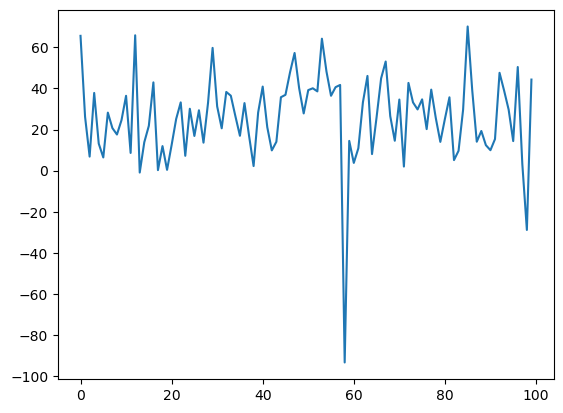

In [36]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

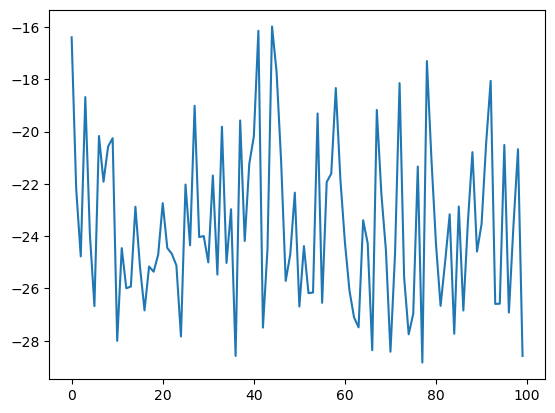

In [37]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [38]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [39]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [40]:
o = o_old[-10:]

In [41]:
x_ = [i+1 for i in range(200)]

In [42]:
np.array(o).shape

(10, 200, 3)

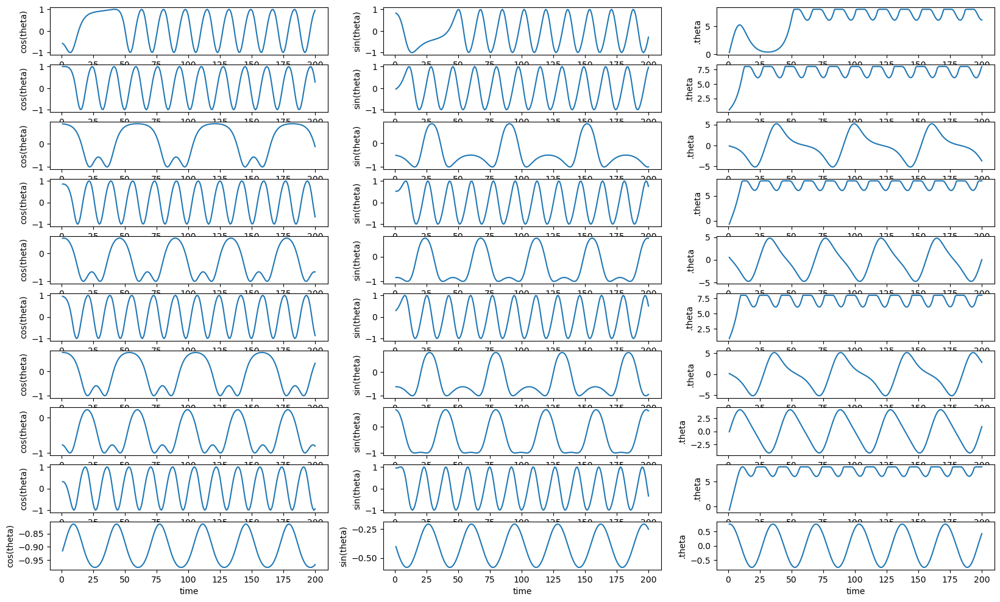

In [43]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [44]:
len(total_losses)

24000

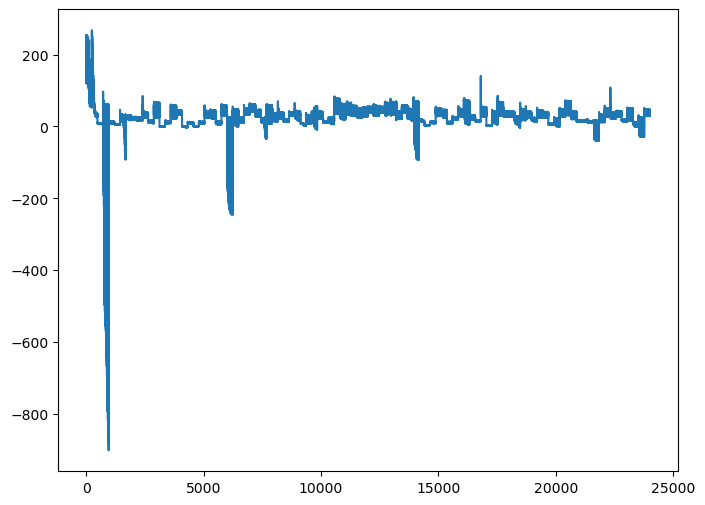

In [45]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)

## No Clipping and No  GAE

In [46]:
N = 100 # number of times to collect new trajectories and update actor
M = 1 # num of trajectories
max_trajectory_len = 200 # trajectory length
batch_size = 25 # size for minibatch
n_epochs = 30 # number of epochs to optimize loss
alpha = 0.0001
hidden_layers = 2
hidden_dims = 64
gamma = 0.7
lmbda = 0.9
clip_value = 0.1
use_gae = False
use_clip = False
n_critic = 5

total_losses, observations, loss_list, reward_list = ppo(
    N, M, max_trajectory_len, batch_size, alpha, hidden_layers, hidden_dims,
    gamma, lmbda, clip_value, use_gae, use_clip, n_critic)

n: 0, epoch: 0, minibatch no.: 0,
total_loss: 246.5129238330982, actor_loss: 17.208423254800145, critic_loss: 458.6090011565961
n: 0, epoch: 0, minibatch no.: 1,
total_loss: 168.64787357418058, actor_loss: 15.05590480151874, critic_loss: 307.18393754532366
n: 0, epoch: 0, minibatch no.: 2,
total_loss: 246.94571832098305, actor_loss: 15.33071396413697, critic_loss: 463.23000871369214
n: 0, epoch: 0, minibatch no.: 3,
total_loss: 304.52810992350464, actor_loss: 20.646781198815308, critic_loss: 567.7626574493787
n: 0, epoch: 0, minibatch no.: 4,
total_loss: 305.19696239223043, actor_loss: 19.04156026605533, critic_loss: 572.3108042523502
n: 0, epoch: 0, minibatch no.: 5,
total_loss: 120.88432693204902, actor_loss: 11.17015820782902, critic_loss: 219.42833744844
n: 0, epoch: 0, minibatch no.: 6,
total_loss: 186.98706482776166, actor_loss: 13.364795157396546, critic_loss: 347.2445393407302
n: 0, epoch: 0, minibatch no.: 7,
total_loss: 222.91545630312112, actor_loss: 16.925672766377385, crit

n: 0, epoch: 8, minibatch no.: 5,
total_loss: 113.75387561355006, actor_loss: 5.810833629685866, critic_loss: 215.8860839677284
n: 0, epoch: 8, minibatch no.: 6,
total_loss: 178.92572075864715, actor_loss: 7.7898959176863665, critic_loss: 342.27164968192153
n: 0, epoch: 8, minibatch no.: 7,
total_loss: 210.83114269690302, actor_loss: 7.690796346690757, critic_loss: 406.28069270042454
n: 0, epoch: 9, minibatch no.: 0,
total_loss: 233.14285302061526, actor_loss: 7.1030592255312515, critic_loss: 452.07958759016805
n: 0, epoch: 9, minibatch no.: 1,
total_loss: 158.00773713247372, actor_loss: 7.246228504448207, critic_loss: 301.52301725605105
n: 0, epoch: 9, minibatch no.: 2,
total_loss: 241.67876235307742, actor_loss: 13.690144763113654, critic_loss: 455.9772351799275
n: 0, epoch: 9, minibatch no.: 3,
total_loss: 284.78622302248243, actor_loss: 5.758716882913341, critic_loss: 558.0550122791382
n: 0, epoch: 9, minibatch no.: 4,
total_loss: 299.26391658826765, actor_loss: 17.43267612694978, 

n: 0, epoch: 17, minibatch no.: 2,
total_loss: 189.6836379535591, actor_loss: 6.445092059835813, critic_loss: 366.47709178744657
n: 0, epoch: 17, minibatch no.: 3,
total_loss: 215.82427798620003, actor_loss: 1.4236460365176815, critic_loss: 428.8012638993647
n: 0, epoch: 17, minibatch no.: 4,
total_loss: 234.97910561881443, actor_loss: 8.934494410338194, critic_loss: 452.08922241695245
n: 0, epoch: 17, minibatch no.: 5,
total_loss: 81.73152285336477, actor_loss: 1.2755540226754365, critic_loss: 160.91193766137866
n: 0, epoch: 17, minibatch no.: 6,
total_loss: 130.33640214402635, actor_loss: 1.6442059117811227, critic_loss: 257.3843924644905
n: 0, epoch: 17, minibatch no.: 7,
total_loss: 154.59421710966856, actor_loss: 1.7080694227264326, critic_loss: 305.7722953738843
n: 0, epoch: 18, minibatch no.: 0,
total_loss: 174.18858144150155, actor_loss: 2.253916163255245, critic_loss: 343.8693305564926
n: 0, epoch: 18, minibatch no.: 1,
total_loss: 106.25231021436656, actor_loss: 1.94515074370

n: 0, epoch: 26, minibatch no.: 0,
total_loss: 115.60941549229561, actor_loss: 1.0814181670905811, critic_loss: 229.05599465041007
n: 0, epoch: 26, minibatch no.: 1,
total_loss: 65.77898795426141, actor_loss: 0.7755798842685158, critic_loss: 130.0068161399858
n: 0, epoch: 26, minibatch no.: 2,
total_loss: 116.34572099437129, actor_loss: 4.0134950613318425, critic_loss: 224.6644518660789
n: 0, epoch: 26, minibatch no.: 3,
total_loss: 88.46902174453606, actor_loss: 0.4169803709436392, critic_loss: 176.10408274718486
n: 0, epoch: 26, minibatch no.: 4,
total_loss: 128.80920982157878, actor_loss: 3.325464921009388, critic_loss: 250.96748980113875
n: 0, epoch: 26, minibatch no.: 5,
total_loss: 48.013320264366875, actor_loss: 0.6547400523205743, critic_loss: 94.7171604240926
n: 0, epoch: 26, minibatch no.: 6,
total_loss: 79.87772056264374, actor_loss: 0.3615447163086578, critic_loss: 159.03235169267018
n: 0, epoch: 26, minibatch no.: 7,
total_loss: 91.23912102728063, actor_loss: 0.35670826561

n: 1, epoch: 5, minibatch no.: 0,
total_loss: 60.75977921028668, actor_loss: 1.3044332709454851, critic_loss: 118.91069187868239
n: 1, epoch: 5, minibatch no.: 1,
total_loss: 74.81923718430485, actor_loss: 6.209749077104236, critic_loss: 137.21897621440124
n: 1, epoch: 5, minibatch no.: 2,
total_loss: 66.5023896431735, actor_loss: 0.7514912733663923, critic_loss: 131.5017967396142
n: 1, epoch: 5, minibatch no.: 3,
total_loss: 84.68910722986209, actor_loss: 0.21854229286951732, critic_loss: 168.94112987398515
n: 1, epoch: 5, minibatch no.: 4,
total_loss: 47.93447378685845, actor_loss: 2.1186978970518613, critic_loss: 91.63155177961318
n: 1, epoch: 5, minibatch no.: 5,
total_loss: 58.239900166870356, actor_loss: 6.2122021595933825, critic_loss: 104.05539601455395
n: 1, epoch: 5, minibatch no.: 6,
total_loss: 82.10316906967955, actor_loss: 8.897129626669305, critic_loss: 146.41207888602048
n: 1, epoch: 5, minibatch no.: 7,
total_loss: 90.85801653259205, actor_loss: 10.558314742804816, cri

n: 1, epoch: 13, minibatch no.: 5,
total_loss: 56.7250613605644, actor_loss: 6.3058940243804456, critic_loss: 100.83833467236792
n: 1, epoch: 13, minibatch no.: 6,
total_loss: 81.40451739434404, actor_loss: 9.17424293134606, critic_loss: 144.46054892599597
n: 1, epoch: 13, minibatch no.: 7,
total_loss: 90.02963603592583, actor_loss: 11.44754448999068, critic_loss: 157.1641830918703
n: 1, epoch: 14, minibatch no.: 0,
total_loss: 59.96312579968687, actor_loss: 1.1008291255016684, critic_loss: 117.7245933483704
n: 1, epoch: 14, minibatch no.: 1,
total_loss: 73.4025204094271, actor_loss: 6.591900022691356, critic_loss: 133.62124077347147
n: 1, epoch: 14, minibatch no.: 2,
total_loss: 65.72201422022873, actor_loss: 0.6279511052475316, critic_loss: 130.1881262299624
n: 1, epoch: 14, minibatch no.: 3,
total_loss: 80.67336463446263, actor_loss: -2.0667535078062738, critic_loss: 165.4802362845378
n: 1, epoch: 14, minibatch no.: 4,
total_loss: 47.388956985879055, actor_loss: 1.40160175501449, cr

n: 1, epoch: 22, minibatch no.: 2,
total_loss: 63.89412552112071, actor_loss: 0.589576837918604, critic_loss: 126.60909736640421
n: 1, epoch: 22, minibatch no.: 3,
total_loss: 73.47896616202459, actor_loss: -7.864850883799131, critic_loss: 162.68763409164745
n: 1, epoch: 22, minibatch no.: 4,
total_loss: 46.41578944761038, actor_loss: 1.148089940780615, critic_loss: 90.53539901365953
n: 1, epoch: 22, minibatch no.: 5,
total_loss: 55.8852154314409, actor_loss: 6.693061411543813, critic_loss: 98.38430803979416
n: 1, epoch: 22, minibatch no.: 6,
total_loss: 81.03131078864865, actor_loss: 9.608562370351311, critic_loss: 142.8454968365947
n: 1, epoch: 22, minibatch no.: 7,
total_loss: 90.34859944261862, actor_loss: 13.639133708385105, critic_loss: 153.41893146846704
n: 1, epoch: 23, minibatch no.: 0,
total_loss: 57.911134673991974, actor_loss: 0.6202378096465844, critic_loss: 114.58179372869078
n: 1, epoch: 23, minibatch no.: 1,
total_loss: 72.82641350885184, actor_loss: 6.993589951365765, 

n: 2, epoch: 1, minibatch no.: 2,
total_loss: 37.053118737310264, actor_loss: -1.2010515896326535, critic_loss: 76.50834065388584
n: 2, epoch: 1, minibatch no.: 3,
total_loss: 60.758859827545905, actor_loss: 1.2653236071065441, critic_loss: 118.98707244087872
n: 2, epoch: 1, minibatch no.: 4,
total_loss: 66.47694680292577, actor_loss: -0.6764103858653886, critic_loss: 134.30671437758232
n: 2, epoch: 1, minibatch no.: 5,
total_loss: 52.87554146986527, actor_loss: -0.3430673282551794, critic_loss: 106.4372175962409
n: 2, epoch: 1, minibatch no.: 6,
total_loss: 78.87885526865037, actor_loss: -0.038577439094518017, critic_loss: 157.8348654154898
n: 2, epoch: 1, minibatch no.: 7,
total_loss: 53.71989208085909, actor_loss: 0.006487239900374937, critic_loss: 107.42680968191743
n: 2, epoch: 2, minibatch no.: 0,
total_loss: 65.63989134263923, actor_loss: 1.9097288345572743, critic_loss: 127.4603250161639
n: 2, epoch: 2, minibatch no.: 1,
total_loss: 74.56933983439238, actor_loss: 1.121377449562

n: 2, epoch: 9, minibatch no.: 5,
total_loss: 52.441784151731326, actor_loss: -1.3741087892750607, critic_loss: 107.63178588201278
n: 2, epoch: 9, minibatch no.: 6,
total_loss: 75.66934454244792, actor_loss: 0.0011144340910313076, critic_loss: 151.33646021671376
n: 2, epoch: 9, minibatch no.: 7,
total_loss: 50.839640417629795, actor_loss: -0.10720135580703227, critic_loss: 101.89368354687366
n: 2, epoch: 10, minibatch no.: 0,
total_loss: 63.6770145758939, actor_loss: 1.880942701312892, critic_loss: 123.59214374916202
n: 2, epoch: 10, minibatch no.: 1,
total_loss: 72.25728427055564, actor_loss: 0.7698133107477304, critic_loss: 142.97494191961582
n: 2, epoch: 10, minibatch no.: 2,
total_loss: 37.52922350463484, actor_loss: 0.1605457124278561, critic_loss: 74.73735558441398
n: 2, epoch: 10, minibatch no.: 3,
total_loss: 58.0303521169573, actor_loss: 1.2215624384208918, critic_loss: 113.61757935707283
n: 2, epoch: 10, minibatch no.: 4,
total_loss: 63.43745648910691, actor_loss: -0.84889583

n: 2, epoch: 18, minibatch no.: 3,
total_loss: 54.4936350451118, actor_loss: 0.3219784011063539, critic_loss: 108.34331328801089
n: 2, epoch: 18, minibatch no.: 4,
total_loss: 61.32348649214002, actor_loss: -1.5985923016314239, critic_loss: 125.84415758754288
n: 2, epoch: 18, minibatch no.: 5,
total_loss: 49.70677209154517, actor_loss: -3.3983212787648314, critic_loss: 106.21018674062
n: 2, epoch: 18, minibatch no.: 6,
total_loss: 73.3490146907615, actor_loss: -0.5079184713711709, critic_loss: 147.71386632426535
n: 2, epoch: 18, minibatch no.: 7,
total_loss: 47.551057035613205, actor_loss: -0.19696143961925736, critic_loss: 95.49603695046493
n: 2, epoch: 19, minibatch no.: 0,
total_loss: 59.984184963134716, actor_loss: 0.32648239749601277, critic_loss: 119.3154051312774
n: 2, epoch: 19, minibatch no.: 1,
total_loss: 69.98063658747137, actor_loss: 1.4244551003210337, critic_loss: 137.11236297430065
n: 2, epoch: 19, minibatch no.: 2,
total_loss: 37.383058228563335, actor_loss: 0.95122265

n: 2, epoch: 26, minibatch no.: 6,
total_loss: 71.89921748764377, actor_loss: -0.6632574841991071, critic_loss: 145.12494994368575
n: 2, epoch: 26, minibatch no.: 7,
total_loss: 44.84817768332554, actor_loss: -0.1878940208977537, critic_loss: 90.07214340844658
n: 2, epoch: 27, minibatch no.: 0,
total_loss: 57.64815823739448, actor_loss: 0.017407651111143195, critic_loss: 115.26150117256668
n: 2, epoch: 27, minibatch no.: 1,
total_loss: 67.69987901628039, actor_loss: 1.7013040557625807, critic_loss: 131.99714992103563
n: 2, epoch: 27, minibatch no.: 2,
total_loss: 36.55191682041255, actor_loss: 0.8798340453942065, critic_loss: 71.34416555003669
n: 2, epoch: 27, minibatch no.: 3,
total_loss: 51.07194057670781, actor_loss: 0.14826349924333285, critic_loss: 101.84735415492895
n: 2, epoch: 27, minibatch no.: 4,
total_loss: 59.990812829776864, actor_loss: -1.6876640617156282, critic_loss: 123.35695378298499
n: 2, epoch: 27, minibatch no.: 5,
total_loss: 49.12766941642649, actor_loss: -3.1196

n: 3, epoch: 5, minibatch no.: 0,
total_loss: 47.32696137350588, actor_loss: -0.17158159390482325, critic_loss: 94.99708593482141
n: 3, epoch: 5, minibatch no.: 1,
total_loss: 52.36101298199795, actor_loss: 6.168384610462056, critic_loss: 92.38525674307179
n: 3, epoch: 5, minibatch no.: 2,
total_loss: 45.90551678734327, actor_loss: 0.5363975594018181, critic_loss: 90.7382384558829
n: 3, epoch: 5, minibatch no.: 3,
total_loss: 56.383228133687716, actor_loss: 1.245948709625275, critic_loss: 110.27455884812488
n: 3, epoch: 5, minibatch no.: 4,
total_loss: 44.49675182421818, actor_loss: -0.7155881954939214, critic_loss: 90.4246800394242
n: 3, epoch: 5, minibatch no.: 5,
total_loss: 69.53112978541905, actor_loss: 3.5659622377473297, critic_loss: 131.93033509534345
n: 3, epoch: 5, minibatch no.: 6,
total_loss: 63.3018769481841, actor_loss: 0.288684134260563, critic_loss: 126.02638562784708
n: 3, epoch: 5, minibatch no.: 7,
total_loss: 68.11263202661542, actor_loss: -2.3144951215748257, criti

n: 3, epoch: 13, minibatch no.: 4,
total_loss: 40.36947551060568, actor_loss: -1.2674474609875066, critic_loss: 83.27384594318637
n: 3, epoch: 13, minibatch no.: 5,
total_loss: 63.589253135455955, actor_loss: 1.490243493341625, critic_loss: 124.19801928422866
n: 3, epoch: 13, minibatch no.: 6,
total_loss: 59.584677964001976, actor_loss: 0.26541180499043265, critic_loss: 118.63853231802308
n: 3, epoch: 13, minibatch no.: 7,
total_loss: 65.48258407964369, actor_loss: -3.057277026427596, critic_loss: 137.07972221214257
n: 3, epoch: 14, minibatch no.: 0,
total_loss: 44.62996365292287, actor_loss: -0.2765674527260134, critic_loss: 89.81306221129776
n: 3, epoch: 14, minibatch no.: 1,
total_loss: 48.58091191414195, actor_loss: 6.725893486776534, critic_loss: 83.71003685473083
n: 3, epoch: 14, minibatch no.: 2,
total_loss: 41.372144158184035, actor_loss: 0.5093777240250361, critic_loss: 81.725532868318
n: 3, epoch: 14, minibatch no.: 3,
total_loss: 51.37460129592223, actor_loss: 1.568199975691

n: 3, epoch: 22, minibatch no.: 2,
total_loss: 39.35542104491404, actor_loss: 0.49233976841059635, critic_loss: 77.72616255300689
n: 3, epoch: 22, minibatch no.: 3,
total_loss: 48.967234525514066, actor_loss: 1.6668407938084298, critic_loss: 94.60078746341127
n: 3, epoch: 22, minibatch no.: 4,
total_loss: 37.89308736505527, actor_loss: -1.568025879098522, critic_loss: 78.92222648830759
n: 3, epoch: 22, minibatch no.: 5,
total_loss: 61.532676795626166, actor_loss: 1.237862581750947, critic_loss: 120.58962842775044
n: 3, epoch: 22, minibatch no.: 6,
total_loss: 57.728843718901246, actor_loss: 0.1840042740755482, critic_loss: 115.0896788896514
n: 3, epoch: 22, minibatch no.: 7,
total_loss: 64.0001668935755, actor_loss: -3.4874995357200476, critic_loss: 134.9753328585911
n: 3, epoch: 23, minibatch no.: 0,
total_loss: 43.61837348802974, actor_loss: -0.368135564197849, critic_loss: 87.97301810445518
n: 3, epoch: 23, minibatch no.: 1,
total_loss: 46.637162419524046, actor_loss: 6.865200468831

n: 4, epoch: 1, minibatch no.: 2,
total_loss: 19.75196790689955, actor_loss: 8.953178238586496, critic_loss: 21.597579336626108
n: 4, epoch: 1, minibatch no.: 3,
total_loss: 13.62879135235029, actor_loss: 8.271275835694722, critic_loss: 10.715031033311138
n: 4, epoch: 1, minibatch no.: 4,
total_loss: 14.456871090695895, actor_loss: 8.553071399117146, critic_loss: 11.807599383157498
n: 4, epoch: 1, minibatch no.: 5,
total_loss: 16.002192778307524, actor_loss: 8.277015333727766, critic_loss: 15.45035488915952
n: 4, epoch: 1, minibatch no.: 6,
total_loss: 15.846282965547427, actor_loss: 7.469347956961184, critic_loss: 16.75387001717249
n: 4, epoch: 1, minibatch no.: 7,
total_loss: 14.661516224579152, actor_loss: 9.056470096689063, critic_loss: 11.210092255780179
n: 4, epoch: 2, minibatch no.: 0,
total_loss: 16.62710378481686, actor_loss: 9.139534480690239, critic_loss: 14.975138608253241
n: 4, epoch: 2, minibatch no.: 1,
total_loss: 16.469409817776892, actor_loss: 7.725238168701024, criti

n: 4, epoch: 10, minibatch no.: 0,
total_loss: 15.052129538884492, actor_loss: 8.37292308783097, critic_loss: 13.358412902107045
n: 4, epoch: 10, minibatch no.: 1,
total_loss: 9.838684558017949, actor_loss: 4.92210964389376, critic_loss: 9.833149828248379
n: 4, epoch: 10, minibatch no.: 2,
total_loss: 13.028672026793927, actor_loss: 7.512970415038179, critic_loss: 11.031403223511496
n: 4, epoch: 10, minibatch no.: 3,
total_loss: 9.291976695358233, actor_loss: 5.687254186797602, critic_loss: 7.209445017121261
n: 4, epoch: 10, minibatch no.: 4,
total_loss: 12.729301438658833, actor_loss: 7.581932064118525, critic_loss: 10.294738749080617
n: 4, epoch: 10, minibatch no.: 5,
total_loss: 12.89414159409089, actor_loss: 5.599824703256002, critic_loss: 14.588633781669776
n: 4, epoch: 10, minibatch no.: 6,
total_loss: 12.199367724590061, actor_loss: 4.154861067666416, critic_loss: 16.089013313847293
n: 4, epoch: 10, minibatch no.: 7,
total_loss: 12.100274214570852, actor_loss: 6.812273895782247,

n: 4, epoch: 18, minibatch no.: 6,
total_loss: 8.135889122146018, actor_loss: 0.08482721011663553, critic_loss: 16.102123824058765
n: 4, epoch: 18, minibatch no.: 7,
total_loss: 5.506424096497269, actor_loss: 0.2482787631380581, critic_loss: 10.51629066671842
n: 4, epoch: 19, minibatch no.: 0,
total_loss: 6.863337249450368, actor_loss: 0.2745006714830377, critic_loss: 13.177673155934661
n: 4, epoch: 19, minibatch no.: 1,
total_loss: 5.177691938666165, actor_loss: 0.20466093483129974, critic_loss: 9.94606200766973
n: 4, epoch: 19, minibatch no.: 2,
total_loss: 5.763220752831073, actor_loss: 0.30659779061873643, critic_loss: 10.913245924424672
n: 4, epoch: 19, minibatch no.: 3,
total_loss: 4.103667253990535, actor_loss: 0.5041110786897849, critic_loss: 7.199112350601501
n: 4, epoch: 19, minibatch no.: 4,
total_loss: 7.793217443691359, actor_loss: 2.6626082463322405, critic_loss: 10.261218394718236
n: 4, epoch: 19, minibatch no.: 5,
total_loss: 7.563605846871744, actor_loss: 0.27930017053

n: 4, epoch: 27, minibatch no.: 5,
total_loss: 7.303814534975829, actor_loss: 0.024112290702164706, critic_loss: 14.559404488547328
n: 4, epoch: 27, minibatch no.: 6,
total_loss: 8.055228005094602, actor_loss: 0.0015474958479697292, critic_loss: 16.107361018493265
n: 4, epoch: 27, minibatch no.: 7,
total_loss: 5.243499027238938, actor_loss: 0.006220586217128276, critic_loss: 10.47455688204362
n: 4, epoch: 28, minibatch no.: 0,
total_loss: 6.589942878157588, actor_loss: 0.007734468379513935, critic_loss: 13.164416819556148
n: 4, epoch: 28, minibatch no.: 1,
total_loss: 4.977526600889672, actor_loss: 0.008087217591924482, critic_loss: 9.938878766595495
n: 4, epoch: 28, minibatch no.: 2,
total_loss: 5.455790192695056, actor_loss: 0.01043238043113839, critic_loss: 10.890715624527834
n: 4, epoch: 28, minibatch no.: 3,
total_loss: 3.6233179614385214, actor_loss: 0.030790079335987465, critic_loss: 7.185055764205067
n: 4, epoch: 28, minibatch no.: 4,
total_loss: 5.5727550372900225, actor_loss:

n: 5, epoch: 5, minibatch no.: 7,
total_loss: 42.457242536256814, actor_loss: -4.948329540359406, critic_loss: 94.81114415323245
n: 5, epoch: 6, minibatch no.: 0,
total_loss: 62.45462922319209, actor_loss: -3.2239848471335546, critic_loss: 131.3572281406513
n: 5, epoch: 6, minibatch no.: 1,
total_loss: 47.84180091011508, actor_loss: -3.3919903315418765, critic_loss: 102.46758248331392
n: 5, epoch: 6, minibatch no.: 2,
total_loss: 39.80325739303886, actor_loss: -3.0430377791079426, critic_loss: 85.6925903442936
n: 5, epoch: 6, minibatch no.: 3,
total_loss: 45.06625130283002, actor_loss: -7.038964324515279, critic_loss: 104.21043125469059
n: 5, epoch: 6, minibatch no.: 4,
total_loss: 50.209979613704604, actor_loss: -3.449485139913278, critic_loss: 107.31892950723577
n: 5, epoch: 6, minibatch no.: 5,
total_loss: 42.09707195349553, actor_loss: -21.87697114174536, critic_loss: 127.94808619048177
n: 5, epoch: 6, minibatch no.: 6,
total_loss: 33.87876881853437, actor_loss: -4.316377310262025,

n: 5, epoch: 14, minibatch no.: 2,
total_loss: 40.21880940746324, actor_loss: -3.09893789041897, critic_loss: 86.63549459576441
n: 5, epoch: 14, minibatch no.: 3,
total_loss: 45.0794512036901, actor_loss: -7.134357200562768, critic_loss: 104.42761680850573
n: 5, epoch: 14, minibatch no.: 4,
total_loss: 49.757597530190964, actor_loss: -3.389478090417851, critic_loss: 106.29415124121763
n: 5, epoch: 14, minibatch no.: 5,
total_loss: 39.858026254930394, actor_loss: -23.396461340179602, critic_loss: 126.50897519021999
n: 5, epoch: 14, minibatch no.: 6,
total_loss: 33.824168102820884, actor_loss: -4.300100004361338, critic_loss: 76.24853621436445
n: 5, epoch: 14, minibatch no.: 7,
total_loss: 41.91671696528073, actor_loss: -5.355672182223332, critic_loss: 94.54477829500811
n: 5, epoch: 15, minibatch no.: 0,
total_loss: 62.62236701816571, actor_loss: -3.279097370511033, critic_loss: 131.8029287773535
n: 5, epoch: 15, minibatch no.: 1,
total_loss: 47.81861667181169, actor_loss: -3.45855738846

n: 5, epoch: 23, minibatch no.: 2,
total_loss: 40.11255764062546, actor_loss: -3.1137700520511857, critic_loss: 86.4526553853533
n: 5, epoch: 23, minibatch no.: 3,
total_loss: 44.96267680217287, actor_loss: -7.231464660418476, critic_loss: 104.3882829251827
n: 5, epoch: 23, minibatch no.: 4,
total_loss: 49.74180619921134, actor_loss: -3.3935621174799557, critic_loss: 106.27073663338258
n: 5, epoch: 23, minibatch no.: 5,
total_loss: 39.11439799957465, actor_loss: -24.079606912148652, critic_loss: 126.38800982344661
n: 5, epoch: 23, minibatch no.: 6,
total_loss: 33.81530040893754, actor_loss: -4.286582922808559, critic_loss: 76.20376666349219
n: 5, epoch: 23, minibatch no.: 7,
total_loss: 41.78168598077056, actor_loss: -5.49000481575506, critic_loss: 94.54338159305124
n: 5, epoch: 24, minibatch no.: 0,
total_loss: 62.54791788966587, actor_loss: -3.309620403620995, critic_loss: 131.71507658657373
n: 5, epoch: 24, minibatch no.: 1,
total_loss: 47.78409047132894, actor_loss: -3.499656902838

n: 6, epoch: 1, minibatch no.: 2,
total_loss: 6.6330768849206185, actor_loss: -1.106517353354721, critic_loss: 15.479188476550679
n: 6, epoch: 1, minibatch no.: 3,
total_loss: 8.078121909579018, actor_loss: -1.0682769360658428, critic_loss: 18.29279769128972
n: 6, epoch: 1, minibatch no.: 4,
total_loss: 5.116038241729346, actor_loss: -0.21806481858036084, critic_loss: 10.668206120619415
n: 6, epoch: 1, minibatch no.: 5,
total_loss: 5.794194458464752, actor_loss: -0.8465134805298171, critic_loss: 13.281415877989138
n: 6, epoch: 1, minibatch no.: 6,
total_loss: 4.488733912347919, actor_loss: -1.4938625205433513, critic_loss: 11.96519286578254
n: 6, epoch: 1, minibatch no.: 7,
total_loss: 11.607949527306522, actor_loss: 3.440030327900447, critic_loss: 16.33583839881215
n: 6, epoch: 2, minibatch no.: 0,
total_loss: 6.318593612875452, actor_loss: 0.35102592690166706, critic_loss: 11.935135371947569
n: 6, epoch: 2, minibatch no.: 1,
total_loss: 7.0158973482319285, actor_loss: 0.0917436589881

n: 6, epoch: 10, minibatch no.: 0,
total_loss: 6.022981210881161, actor_loss: 0.15849175088066897, critic_loss: 11.728978920000984
n: 6, epoch: 10, minibatch no.: 1,
total_loss: 6.788679357268305, actor_loss: 0.11915940620645256, critic_loss: 13.339039902123705
n: 6, epoch: 10, minibatch no.: 2,
total_loss: 7.223088236179126, actor_loss: -0.5629613147688961, critic_loss: 15.572099101896043
n: 6, epoch: 10, minibatch no.: 3,
total_loss: 7.772853846726422, actor_loss: -1.2627829194715692, critic_loss: 18.07127353239598
n: 6, epoch: 10, minibatch no.: 4,
total_loss: 5.269551046293043, actor_loss: -0.0070821599313227014, critic_loss: 10.553266412448732
n: 6, epoch: 10, minibatch no.: 5,
total_loss: 6.271643126005327, actor_loss: -0.39906864724380803, critic_loss: 13.34142354649827
n: 6, epoch: 10, minibatch no.: 6,
total_loss: 3.798922525860799, actor_loss: -2.319399247924745, critic_loss: 12.236643547571088
n: 6, epoch: 10, minibatch no.: 7,
total_loss: 9.010833267816952, actor_loss: 1.17

n: 6, epoch: 18, minibatch no.: 4,
total_loss: 5.250889346629987, actor_loss: -0.022023814330620856, critic_loss: 10.545826321921215
n: 6, epoch: 18, minibatch no.: 5,
total_loss: 6.28217836509768, actor_loss: -0.3809843627335371, critic_loss: 13.326325455662435
n: 6, epoch: 18, minibatch no.: 6,
total_loss: 3.681742108194801, actor_loss: -2.4577251275160825, critic_loss: 12.278934471421767
n: 6, epoch: 18, minibatch no.: 7,
total_loss: 8.884299151526086, actor_loss: 1.071423819365112, critic_loss: 15.625750664321949
n: 6, epoch: 19, minibatch no.: 0,
total_loss: 6.036587985494076, actor_loss: 0.17988749124540365, critic_loss: 11.713400988497344
n: 6, epoch: 19, minibatch no.: 1,
total_loss: 6.773289165712661, actor_loss: 0.12713745231228796, critic_loss: 13.292303426800745
n: 6, epoch: 19, minibatch no.: 2,
total_loss: 7.22276568546023, actor_loss: -0.5620798557456359, critic_loss: 15.569691082411731
n: 6, epoch: 19, minibatch no.: 3,
total_loss: 7.549349798308498, actor_loss: -1.4781

n: 6, epoch: 26, minibatch no.: 7,
total_loss: 8.839386369050978, actor_loss: 1.0332570828571643, critic_loss: 15.612258572387626
n: 6, epoch: 27, minibatch no.: 0,
total_loss: 6.050449329462335, actor_loss: 0.19459785768497784, critic_loss: 11.711702943554714
n: 6, epoch: 27, minibatch no.: 1,
total_loss: 6.770637045983785, actor_loss: 0.13020392259426264, critic_loss: 13.280866246779043
n: 6, epoch: 27, minibatch no.: 2,
total_loss: 7.211933392562627, actor_loss: -0.57147280153523, critic_loss: 15.566812388195714
n: 6, epoch: 27, minibatch no.: 3,
total_loss: 7.4557203786783095, actor_loss: -1.570908775219546, critic_loss: 18.053258307795712
n: 6, epoch: 27, minibatch no.: 4,
total_loss: 5.233495669485376, actor_loss: -0.03995446165389877, critic_loss: 10.54690026227855
n: 6, epoch: 27, minibatch no.: 5,
total_loss: 6.2793654917974004, actor_loss: -0.3808246294575256, critic_loss: 13.320380242509852
n: 6, epoch: 27, minibatch no.: 6,
total_loss: 3.610770387928192, actor_loss: -2.5344

n: 7, epoch: 4, minibatch no.: 7,
total_loss: 43.36171648307252, actor_loss: -8.134895564493362, critic_loss: 102.99322409513177
n: 7, epoch: 5, minibatch no.: 0,
total_loss: 47.43090142313794, actor_loss: -9.588570255937357, critic_loss: 114.03894335815059
n: 7, epoch: 5, minibatch no.: 1,
total_loss: 39.511011682087464, actor_loss: -11.850447306413175, critic_loss: 102.72291797700127
n: 7, epoch: 5, minibatch no.: 2,
total_loss: 64.5671262734006, actor_loss: -9.100847442937345, critic_loss: 147.3359474326759
n: 7, epoch: 5, minibatch no.: 3,
total_loss: 29.951129463782273, actor_loss: -17.998435655804904, critic_loss: 95.89913023917435
n: 7, epoch: 5, minibatch no.: 4,
total_loss: 68.09691667408507, actor_loss: -8.559946009491242, critic_loss: 153.3137253671526
n: 7, epoch: 5, minibatch no.: 5,
total_loss: 58.134496075805764, actor_loss: -8.457103616153683, critic_loss: 133.1831993839189
n: 7, epoch: 5, minibatch no.: 6,
total_loss: 51.063180727508865, actor_loss: -10.848350326060029

n: 7, epoch: 13, minibatch no.: 1,
total_loss: 8.963918951910813, actor_loss: -46.020662478775186, critic_loss: 109.969162861372
n: 7, epoch: 13, minibatch no.: 2,
total_loss: 0.9250445453557177, actor_loss: -71.14361489217308, critic_loss: 144.1373188750576
n: 7, epoch: 13, minibatch no.: 3,
total_loss: 41.81239384563115, actor_loss: -9.003179527522224, critic_loss: 101.63114674630675
n: 7, epoch: 13, minibatch no.: 4,
total_loss: 65.19932731845154, actor_loss: -7.842181988510427, critic_loss: 146.08301861392394
n: 7, epoch: 13, minibatch no.: 5,
total_loss: 59.67291802243461, actor_loss: -3.295468563803541, critic_loss: 125.9367731724763
n: 7, epoch: 13, minibatch no.: 6,
total_loss: 55.89322878837694, actor_loss: -6.460963775376987, critic_loss: 124.70838512750785
n: 7, epoch: 13, minibatch no.: 7,
total_loss: 49.505080417259194, actor_loss: -2.199797057025319, critic_loss: 103.40975494856903
n: 7, epoch: 14, minibatch no.: 0,
total_loss: 35.55048030069271, actor_loss: -15.094125098

n: 7, epoch: 21, minibatch no.: 0,
total_loss: 34.47104719965043, actor_loss: -16.045533774023767, critic_loss: 101.03316194734839
n: 7, epoch: 21, minibatch no.: 1,
total_loss: -8.088011614733752, actor_loss: -63.09424501111128, critic_loss: 110.01246679275506
n: 7, epoch: 21, minibatch no.: 2,
total_loss: -40.61265081013062, actor_loss: -112.68744978050273, critic_loss: 144.14959794074423
n: 7, epoch: 21, minibatch no.: 3,
total_loss: 47.06138673973245, actor_loss: -3.8250625031917838, critic_loss: 101.77289848584846
n: 7, epoch: 21, minibatch no.: 4,
total_loss: 65.97953940569917, actor_loss: -7.017903162626064, critic_loss: 145.99488513665048
n: 7, epoch: 21, minibatch no.: 5,
total_loss: 62.041477177006826, actor_loss: -0.8266198831863493, critic_loss: 125.73619412038634
n: 7, epoch: 21, minibatch no.: 6,
total_loss: 59.87792863907055, actor_loss: -2.483185108718422, critic_loss: 124.72222749557794
n: 7, epoch: 21, minibatch no.: 7,
total_loss: 51.139913994796544, actor_loss: -0.6

n: 7, epoch: 29, minibatch no.: 1,
total_loss: -8.873067459519753, actor_loss: -63.8532423423985, critic_loss: 109.9603497657575
n: 7, epoch: 29, minibatch no.: 2,
total_loss: -46.65340735113219, actor_loss: -118.73815516640578, critic_loss: 144.16949563054717
n: 7, epoch: 29, minibatch no.: 3,
total_loss: 47.374039165747305, actor_loss: -3.51752140453092, critic_loss: 101.78312114055645
n: 7, epoch: 29, minibatch no.: 4,
total_loss: 65.73482315309988, actor_loss: -7.268611916477911, critic_loss: 146.00687013915558
n: 7, epoch: 29, minibatch no.: 5,
total_loss: 62.27684247218343, actor_loss: -0.5633982086683933, critic_loss: 125.68048136170366
n: 7, epoch: 29, minibatch no.: 6,
total_loss: 59.62170518049892, actor_loss: -2.722922572951708, critic_loss: 124.68925550690126
n: 7, epoch: 29, minibatch no.: 7,
total_loss: 51.21027922430118, actor_loss: -0.5432056829107862, critic_loss: 103.50696981442394
n: 8, epoch: 0, minibatch no.: 0,
total_loss: 75.42063898478706, actor_loss: 10.9877746

n: 8, epoch: 7, minibatch no.: 4,
total_loss: 18.569096936328812, actor_loss: 11.255741727086729, critic_loss: 14.626710418484166
n: 8, epoch: 7, minibatch no.: 5,
total_loss: 19.532226964054253, actor_loss: 12.150785880368359, critic_loss: 14.76288216737179
n: 8, epoch: 7, minibatch no.: 6,
total_loss: 15.195086543389905, actor_loss: 10.98219043655729, critic_loss: 8.425792213665227
n: 8, epoch: 7, minibatch no.: 7,
total_loss: 17.728870870446816, actor_loss: 10.243877548996695, critic_loss: 14.969986642900244
n: 8, epoch: 8, minibatch no.: 0,
total_loss: 18.947683966034464, actor_loss: 9.7752138914821, critic_loss: 18.34494014910473
n: 8, epoch: 8, minibatch no.: 1,
total_loss: 19.6461640902836, actor_loss: 8.717945677206773, critic_loss: 21.856436826153658
n: 8, epoch: 8, minibatch no.: 2,
total_loss: 18.935253703828636, actor_loss: 13.348839009474712, critic_loss: 11.172829388707846
n: 8, epoch: 8, minibatch no.: 3,
total_loss: 15.236293364611594, actor_loss: 8.959850738633534, cri

n: 8, epoch: 16, minibatch no.: 1,
total_loss: 17.765814345331385, actor_loss: 7.163195459090431, critic_loss: 21.20523777248191
n: 8, epoch: 16, minibatch no.: 2,
total_loss: 19.89119560808471, actor_loss: 14.43584933469073, critic_loss: 10.910692546787963
n: 8, epoch: 16, minibatch no.: 3,
total_loss: 13.565366660899752, actor_loss: 7.310648202810885, critic_loss: 12.509436916177735
n: 8, epoch: 16, minibatch no.: 4,
total_loss: 15.8617091578991, actor_loss: 8.740819063317124, critic_loss: 14.241780189163952
n: 8, epoch: 16, minibatch no.: 5,
total_loss: 20.463756869222784, actor_loss: 13.200465861062586, critic_loss: 14.526582016320393
n: 8, epoch: 16, minibatch no.: 6,
total_loss: 14.619249483063916, actor_loss: 10.472891021722473, critic_loss: 8.292716922682885
n: 8, epoch: 16, minibatch no.: 7,
total_loss: 18.035222310360233, actor_loss: 10.627039740464573, critic_loss: 14.816365139791323
n: 8, epoch: 17, minibatch no.: 0,
total_loss: 18.08950067040726, actor_loss: 9.074282071418

n: 8, epoch: 24, minibatch no.: 6,
total_loss: 5.657387046457247, actor_loss: 1.5382027372983849, critic_loss: 8.238368618317724
n: 8, epoch: 24, minibatch no.: 7,
total_loss: 10.438027320727375, actor_loss: 3.0361233253264426, critic_loss: 14.803807990801864
n: 8, epoch: 25, minibatch no.: 0,
total_loss: 16.362087490812726, actor_loss: 7.3605726038454105, critic_loss: 18.003029773934628
n: 8, epoch: 25, minibatch no.: 1,
total_loss: 11.108262773276966, actor_loss: 0.5322169536822158, critic_loss: 21.1520916391895
n: 8, epoch: 25, minibatch no.: 2,
total_loss: 9.253499147540339, actor_loss: 3.8342901774656464, critic_loss: 10.838417940149384
n: 8, epoch: 25, minibatch no.: 3,
total_loss: 7.020617978900568, actor_loss: 0.8196392860312608, critic_loss: 12.401957385738616
n: 8, epoch: 25, minibatch no.: 4,
total_loss: 7.426634061973803, actor_loss: 0.32808029950834183, critic_loss: 14.197107524930923
n: 8, epoch: 25, minibatch no.: 5,
total_loss: 9.237202192360144, actor_loss: 1.996665241

n: 9, epoch: 3, minibatch no.: 6,
total_loss: 45.76381093583667, actor_loss: -1.3733226388538482, critic_loss: 94.27426714938105
n: 9, epoch: 3, minibatch no.: 7,
total_loss: 67.9232032937968, actor_loss: 14.174524973477157, critic_loss: 107.4973566406393
n: 9, epoch: 4, minibatch no.: 0,
total_loss: 54.40037080569462, actor_loss: -0.11012532154043175, critic_loss: 109.0209922544701
n: 9, epoch: 4, minibatch no.: 1,
total_loss: 55.56904006176165, actor_loss: 0.12465712363344655, critic_loss: 110.8887658762564
n: 9, epoch: 4, minibatch no.: 2,
total_loss: 42.822094719519555, actor_loss: -1.8668061778548763, critic_loss: 89.37780179474886
n: 9, epoch: 4, minibatch no.: 3,
total_loss: 39.56150387030787, actor_loss: -1.2462165028132142, critic_loss: 81.61544074624216
n: 9, epoch: 4, minibatch no.: 4,
total_loss: 44.09438687300034, actor_loss: -0.05048910412947599, critic_loss: 88.28975195425963
n: 9, epoch: 4, minibatch no.: 5,
total_loss: 68.94707065279965, actor_loss: -1.3173683979026165

n: 9, epoch: 12, minibatch no.: 1,
total_loss: 55.2056271983405, actor_loss: -0.24743845112098117, critic_loss: 110.90613129892296
n: 9, epoch: 12, minibatch no.: 2,
total_loss: 43.25619902182093, actor_loss: -1.2940833960654783, critic_loss: 89.10056483577283
n: 9, epoch: 12, minibatch no.: 3,
total_loss: 40.16824760123065, actor_loss: -0.46585537863498816, critic_loss: 81.26820595973128
n: 9, epoch: 12, minibatch no.: 4,
total_loss: 43.865785597144445, actor_loss: -0.39035930541664676, critic_loss: 88.51228980512218
n: 9, epoch: 12, minibatch no.: 5,
total_loss: 68.0441443607052, actor_loss: -1.998939164086244, critic_loss: 140.08616704958288
n: 9, epoch: 12, minibatch no.: 6,
total_loss: 46.07068418750002, actor_loss: -0.546073551794403, critic_loss: 93.23351547858884
n: 9, epoch: 12, minibatch no.: 7,
total_loss: 51.60850401918342, actor_loss: -1.7191885623642393, critic_loss: 106.65538516309532
n: 9, epoch: 13, minibatch no.: 0,
total_loss: 51.864403515990574, actor_loss: -2.66534

n: 9, epoch: 20, minibatch no.: 6,
total_loss: 46.01346817835685, actor_loss: -0.5656798961658626, critic_loss: 93.15829614904543
n: 9, epoch: 20, minibatch no.: 7,
total_loss: 51.696231580226296, actor_loss: -1.611694990183542, critic_loss: 106.61585314081968
n: 9, epoch: 21, minibatch no.: 0,
total_loss: 51.77708251975889, actor_loss: -2.701493584885425, critic_loss: 108.95715220928864
n: 9, epoch: 21, minibatch no.: 1,
total_loss: 55.17297351807646, actor_loss: -0.2644580990426699, critic_loss: 110.87486323423826
n: 9, epoch: 21, minibatch no.: 2,
total_loss: 43.204536368135905, actor_loss: -1.3550013963663872, critic_loss: 89.11907552900459
n: 9, epoch: 21, minibatch no.: 3,
total_loss: 40.1245747484981, actor_loss: -0.4906938033974686, critic_loss: 81.23053710379114
n: 9, epoch: 21, minibatch no.: 4,
total_loss: 43.82679590750737, actor_loss: -0.3988726352856791, critic_loss: 88.45133708558609
n: 9, epoch: 21, minibatch no.: 5,
total_loss: 67.97061738077275, actor_loss: -2.0428955

n: 9, epoch: 29, minibatch no.: 2,
total_loss: 43.199702721159255, actor_loss: -1.364380897786414, critic_loss: 89.12816723789133
n: 9, epoch: 29, minibatch no.: 3,
total_loss: 40.11527549001253, actor_loss: -0.4937451319285977, critic_loss: 81.21804124388225
n: 9, epoch: 29, minibatch no.: 4,
total_loss: 43.809063809007796, actor_loss: -0.3999167687026378, critic_loss: 88.41796115542087
n: 9, epoch: 29, minibatch no.: 5,
total_loss: 67.9506012329197, actor_loss: -2.050454845056373, critic_loss: 140.00211215595215
n: 9, epoch: 29, minibatch no.: 6,
total_loss: 45.990762687088605, actor_loss: -0.5679782819452189, critic_loss: 93.11748193806764
n: 9, epoch: 29, minibatch no.: 7,
total_loss: 51.68367624977452, actor_loss: -1.6125719307528115, critic_loss: 106.59249636105467
n: 10, epoch: 0, minibatch no.: 0,
total_loss: 22.174515156160872, actor_loss: -4.242731026707686, critic_loss: 52.83449236573712
n: 10, epoch: 0, minibatch no.: 1,
total_loss: 16.69498237836983, actor_loss: -2.2868523

n: 10, epoch: 7, minibatch no.: 4,
total_loss: 10.999316526904096, actor_loss: -3.28779060570443, critic_loss: 28.57421426521705
n: 10, epoch: 7, minibatch no.: 5,
total_loss: 14.980280171539638, actor_loss: -2.7301579700466, critic_loss: 35.420876283172475
n: 10, epoch: 7, minibatch no.: 6,
total_loss: 15.485498223342349, actor_loss: -1.754519279148328, critic_loss: 34.48003500498135
n: 10, epoch: 7, minibatch no.: 7,
total_loss: 15.678662900590464, actor_loss: -2.1995423957380895, critic_loss: 35.756410592657105
n: 10, epoch: 8, minibatch no.: 0,
total_loss: 17.328830630771655, actor_loss: -4.236024694266756, critic_loss: 43.129710650076824
n: 10, epoch: 8, minibatch no.: 1,
total_loss: 13.212347856292428, actor_loss: -2.608716902069175, critic_loss: 31.642129516723205
n: 10, epoch: 8, minibatch no.: 2,
total_loss: 15.858559270981717, actor_loss: -1.2755391089201225, critic_loss: 34.26819675980368
n: 10, epoch: 8, minibatch no.: 3,
total_loss: 20.71126920829368, actor_loss: -1.967775

n: 10, epoch: 16, minibatch no.: 1,
total_loss: 13.286136740324807, actor_loss: -2.5362908254195595, critic_loss: 31.644855131488733
n: 10, epoch: 16, minibatch no.: 2,
total_loss: 15.738784768564418, actor_loss: -1.3182144603007582, critic_loss: 34.113998457730354
n: 10, epoch: 16, minibatch no.: 3,
total_loss: 20.43786330289222, actor_loss: -2.2463257597329127, critic_loss: 45.36837812525027
n: 10, epoch: 16, minibatch no.: 4,
total_loss: 10.707224036561376, actor_loss: -3.619146575861141, critic_loss: 28.652741224845034
n: 10, epoch: 16, minibatch no.: 5,
total_loss: 14.732489213679656, actor_loss: -2.9527666844251224, critic_loss: 35.370511796209556
n: 10, epoch: 16, minibatch no.: 6,
total_loss: 16.05082532206892, actor_loss: -1.2350234870415486, critic_loss: 34.57169761822094
n: 10, epoch: 16, minibatch no.: 7,
total_loss: 15.314756998107697, actor_loss: -2.460962341821698, critic_loss: 35.55143867985879
n: 10, epoch: 17, minibatch no.: 0,
total_loss: 16.64244618622431, actor_los

n: 10, epoch: 24, minibatch no.: 7,
total_loss: 15.25618040449471, actor_loss: -2.5228368178398304, critic_loss: 35.55803444466908
n: 10, epoch: 25, minibatch no.: 0,
total_loss: 16.318517346877872, actor_loss: -5.268316322925617, critic_loss: 43.17366733960698
n: 10, epoch: 25, minibatch no.: 1,
total_loss: 13.339358061839455, actor_loss: -2.481096245423264, critic_loss: 31.64090861452544
n: 10, epoch: 25, minibatch no.: 2,
total_loss: 15.781735166559155, actor_loss: -1.2745885802122634, critic_loss: 34.11264749354284
n: 10, epoch: 25, minibatch no.: 3,
total_loss: 20.427946680854152, actor_loss: -2.249363068494986, critic_loss: 45.35461949869828
n: 10, epoch: 25, minibatch no.: 4,
total_loss: 10.484837046423186, actor_loss: -3.8391750758183307, critic_loss: 28.648024244483032
n: 10, epoch: 25, minibatch no.: 5,
total_loss: 14.652714759227369, actor_loss: -3.0287976199531466, critic_loss: 35.36302475836103
n: 10, epoch: 25, minibatch no.: 6,
total_loss: 16.123499277470536, actor_loss:

n: 11, epoch: 3, minibatch no.: 6,
total_loss: 45.55075669185609, actor_loss: -0.7289723771369699, critic_loss: 92.55945813798611
n: 11, epoch: 3, minibatch no.: 7,
total_loss: 19.20490474011858, actor_loss: -48.2101975464997, critic_loss: 134.83020457323656
n: 11, epoch: 4, minibatch no.: 0,
total_loss: 72.35209672155982, actor_loss: -3.7120552443072716, critic_loss: 152.12830393173417
n: 11, epoch: 4, minibatch no.: 1,
total_loss: 44.51308047335932, actor_loss: -1.0004011369131145, critic_loss: 91.02696322054486
n: 11, epoch: 4, minibatch no.: 2,
total_loss: 66.80077108529923, actor_loss: -2.767022195948948, critic_loss: 139.13558656249637
n: 11, epoch: 4, minibatch no.: 3,
total_loss: 78.86778528107622, actor_loss: -6.633432623660869, critic_loss: 171.00243580947418
n: 11, epoch: 4, minibatch no.: 4,
total_loss: 50.39929286026983, actor_loss: -4.588928527822664, critic_loss: 109.976442776185
n: 11, epoch: 4, minibatch no.: 5,
total_loss: 43.60233961568119, actor_loss: 0.704565654046

n: 11, epoch: 12, minibatch no.: 4,
total_loss: 50.556339109589125, actor_loss: -4.32258305368789, critic_loss: 109.75784432655404
n: 11, epoch: 12, minibatch no.: 5,
total_loss: 43.95495086244355, actor_loss: 1.0870990590242195, critic_loss: 85.73570360683867
n: 11, epoch: 12, minibatch no.: 6,
total_loss: 46.32455703056154, actor_loss: 0.43313205245960545, critic_loss: 91.78284995620388
n: 11, epoch: 12, minibatch no.: 7,
total_loss: 0.845949935436721, actor_loss: -66.91412155975326, critic_loss: 135.52014299037995
n: 11, epoch: 13, minibatch no.: 0,
total_loss: 73.28253030614084, actor_loss: -2.4708187034616658, critic_loss: 151.506698019205
n: 11, epoch: 13, minibatch no.: 1,
total_loss: 45.21297286975407, actor_loss: -0.3006415041625964, critic_loss: 91.02722874783333
n: 11, epoch: 13, minibatch no.: 2,
total_loss: 66.7182246721923, actor_loss: -2.904851889104562, critic_loss: 139.24615312259374
n: 11, epoch: 13, minibatch no.: 3,
total_loss: 77.89381016663945, actor_loss: -7.6580

n: 11, epoch: 21, minibatch no.: 1,
total_loss: 46.2731767430418, actor_loss: 0.7606625996686711, critic_loss: 91.02502828674626
n: 11, epoch: 21, minibatch no.: 2,
total_loss: 66.76410964723233, actor_loss: -2.855910611576601, critic_loss: 139.24004051761787
n: 11, epoch: 21, minibatch no.: 3,
total_loss: 75.20208542985384, actor_loss: -10.337280334951474, critic_loss: 171.07873152961062
n: 11, epoch: 21, minibatch no.: 4,
total_loss: 51.93233465624307, actor_loss: -2.924261585758455, critic_loss: 109.71319248400306
n: 11, epoch: 21, minibatch no.: 5,
total_loss: 44.929974541896215, actor_loss: 2.0649594880237236, critic_loss: 85.73003010774498
n: 11, epoch: 21, minibatch no.: 6,
total_loss: 48.81661399260709, actor_loss: 2.92937450253519, critic_loss: 91.7744789801438
n: 11, epoch: 21, minibatch no.: 7,
total_loss: -34.36111262364386, actor_loss: -102.10851536413355, critic_loss: 135.49480548097938
n: 11, epoch: 22, minibatch no.: 0,
total_loss: 75.89697362411796, actor_loss: 0.14368

n: 11, epoch: 29, minibatch no.: 3,
total_loss: 75.24795151792401, actor_loss: -10.284868926677989, critic_loss: 171.065640889204
n: 11, epoch: 29, minibatch no.: 4,
total_loss: 53.10650396544517, actor_loss: -1.734092925666898, critic_loss: 109.68119378222414
n: 11, epoch: 29, minibatch no.: 5,
total_loss: 45.39863289686027, actor_loss: 2.533783549978451, critic_loss: 85.72969869376364
n: 11, epoch: 29, minibatch no.: 6,
total_loss: 49.90063981325462, actor_loss: 4.017050751129368, critic_loss: 91.7671781242505
n: 11, epoch: 29, minibatch no.: 7,
total_loss: -65.60891416379415, actor_loss: -133.35045427206782, critic_loss: 135.48308021654734
n: 12, epoch: 0, minibatch no.: 0,
total_loss: 60.587496328179306, actor_loss: 4.8352188036537, critic_loss: 111.5045550490512
n: 12, epoch: 0, minibatch no.: 1,
total_loss: 53.201597895244035, actor_loss: 2.0754927225131876, critic_loss: 102.25221034546169
n: 12, epoch: 0, minibatch no.: 2,
total_loss: 55.11209242306014, actor_loss: 1.74973813771

n: 12, epoch: 8, minibatch no.: 0,
total_loss: 50.25643008578135, actor_loss: 4.836650972383329, critic_loss: 90.83955822679604
n: 12, epoch: 8, minibatch no.: 1,
total_loss: 51.96536033274083, actor_loss: 1.8980721282968713, critic_loss: 100.13457640888791
n: 12, epoch: 8, minibatch no.: 2,
total_loss: 52.57168892374919, actor_loss: 1.791264234164517, critic_loss: 101.56084937916935
n: 12, epoch: 8, minibatch no.: 3,
total_loss: 55.44953680215148, actor_loss: 3.4452709265811894, critic_loss: 104.00853175114058
n: 12, epoch: 8, minibatch no.: 4,
total_loss: 52.66981497530216, actor_loss: 1.796813464559097, critic_loss: 101.74600302148613
n: 12, epoch: 8, minibatch no.: 5,
total_loss: 51.98669925841913, actor_loss: 2.0184102674218303, critic_loss: 99.9365779819946
n: 12, epoch: 8, minibatch no.: 6,
total_loss: 36.291549792488205, actor_loss: 2.796545067023309, critic_loss: 66.99000945092979
n: 12, epoch: 8, minibatch no.: 7,
total_loss: 71.8792477690577, actor_loss: 4.0571464226185885, 

n: 12, epoch: 16, minibatch no.: 6,
total_loss: 36.27996842651901, actor_loss: 2.82787487729162, critic_loss: 66.90418709845478
n: 12, epoch: 16, minibatch no.: 7,
total_loss: 71.8476989690905, actor_loss: 4.060488434125996, critic_loss: 135.574421069929
n: 12, epoch: 17, minibatch no.: 0,
total_loss: 50.40507958503751, actor_loss: 4.831954881049245, critic_loss: 91.14624940797654
n: 12, epoch: 17, minibatch no.: 1,
total_loss: 51.84023244909456, actor_loss: 1.867933091237557, critic_loss: 99.944598715714
n: 12, epoch: 17, minibatch no.: 2,
total_loss: 52.55994250102401, actor_loss: 1.8191957015245916, critic_loss: 101.48149359899884
n: 12, epoch: 17, minibatch no.: 3,
total_loss: 55.46590819079716, actor_loss: 3.441857748634214, critic_loss: 104.04810088432589
n: 12, epoch: 17, minibatch no.: 4,
total_loss: 52.55046218551346, actor_loss: 1.7606966671262392, critic_loss: 101.57953103677444
n: 12, epoch: 17, minibatch no.: 5,
total_loss: 51.87527005412201, actor_loss: 1.978181704699876,

n: 12, epoch: 25, minibatch no.: 3,
total_loss: 55.45369173108382, actor_loss: 3.4427817667394134, critic_loss: 104.02181992868881
n: 12, epoch: 25, minibatch no.: 4,
total_loss: 52.53634702648391, actor_loss: 1.7518869430835051, critic_loss: 101.56892016680081
n: 12, epoch: 25, minibatch no.: 5,
total_loss: 51.87643216195425, actor_loss: 1.9898216477890165, critic_loss: 99.77322102833047
n: 12, epoch: 25, minibatch no.: 6,
total_loss: 36.26620571624347, actor_loss: 2.812206016872348, critic_loss: 66.90799939874225
n: 12, epoch: 25, minibatch no.: 7,
total_loss: 71.81574176897212, actor_loss: 4.062769195333178, critic_loss: 135.50594514727788
n: 12, epoch: 26, minibatch no.: 0,
total_loss: 50.38790816262126, actor_loss: 4.836641297121525, critic_loss: 91.10253373099947
n: 12, epoch: 26, minibatch no.: 1,
total_loss: 51.8073186397057, actor_loss: 1.8365544646793126, critic_loss: 99.94152835005278
n: 12, epoch: 26, minibatch no.: 2,
total_loss: 52.54308563123878, actor_loss: 1.8122308673

n: 13, epoch: 3, minibatch no.: 6,
total_loss: 40.91388050270399, actor_loss: 0.07910494887069916, critic_loss: 81.66955110766658
n: 13, epoch: 3, minibatch no.: 7,
total_loss: 79.10163408420883, actor_loss: 1.0035442218891566, critic_loss: 156.19617972463934
n: 13, epoch: 4, minibatch no.: 0,
total_loss: 52.21218965383517, actor_loss: 0.8823649893586026, critic_loss: 102.65964932895314
n: 13, epoch: 4, minibatch no.: 1,
total_loss: 43.03435489658937, actor_loss: 0.8769034846159035, critic_loss: 84.31490282394694
n: 13, epoch: 4, minibatch no.: 2,
total_loss: 31.888491119607913, actor_loss: -2.121399179963271, critic_loss: 68.01978059914236
n: 13, epoch: 4, minibatch no.: 3,
total_loss: 55.57402222969901, actor_loss: 0.14447794521183074, critic_loss: 110.85908856897436
n: 13, epoch: 4, minibatch no.: 4,
total_loss: 34.875023956346766, actor_loss: -3.4807340042041353, critic_loss: 76.7115159211018
n: 13, epoch: 4, minibatch no.: 5,
total_loss: 48.82456016083141, actor_loss: 2.3156631679

n: 13, epoch: 12, minibatch no.: 4,
total_loss: 33.495660937755396, actor_loss: -4.856741037168186, critic_loss: 76.70480394984716
n: 13, epoch: 12, minibatch no.: 5,
total_loss: 48.754670358436286, actor_loss: 2.2896784883201797, critic_loss: 92.92998374023222
n: 13, epoch: 12, minibatch no.: 6,
total_loss: 40.35994528786327, actor_loss: -0.4645060741692691, critic_loss: 81.64890272406508
n: 13, epoch: 12, minibatch no.: 7,
total_loss: 78.94469461029072, actor_loss: 0.9066299321024853, critic_loss: 156.07612935637647
n: 13, epoch: 13, minibatch no.: 0,
total_loss: 54.15744283602015, actor_loss: 2.8220714332058483, critic_loss: 102.6707428056286
n: 13, epoch: 13, minibatch no.: 1,
total_loss: 41.53335174808502, actor_loss: -0.5502671722686922, critic_loss: 84.16723784070741
n: 13, epoch: 13, minibatch no.: 2,
total_loss: 32.65236023822574, actor_loss: -1.4373696935788773, critic_loss: 68.17945986360924
n: 13, epoch: 13, minibatch no.: 3,
total_loss: 55.54163858179375, actor_loss: 0.106

n: 13, epoch: 21, minibatch no.: 2,
total_loss: 32.67586687754384, actor_loss: -1.4124754412201568, critic_loss: 68.176684637528
n: 13, epoch: 21, minibatch no.: 3,
total_loss: 55.55945754348625, actor_loss: 0.12616936509483154, critic_loss: 110.86657635678284
n: 13, epoch: 21, minibatch no.: 4,
total_loss: 33.366548381372056, actor_loss: -4.97233106954422, critic_loss: 76.67775890183255
n: 13, epoch: 21, minibatch no.: 5,
total_loss: 48.72674948397043, actor_loss: 2.2768059026395777, critic_loss: 92.8998871626617
n: 13, epoch: 21, minibatch no.: 6,
total_loss: 40.36454693152407, actor_loss: -0.4600817550506383, critic_loss: 81.64925737314941
n: 13, epoch: 21, minibatch no.: 7,
total_loss: 78.93251187631654, actor_loss: 0.9084733935779569, critic_loss: 156.04807696547715
n: 13, epoch: 22, minibatch no.: 0,
total_loss: 54.26604978385284, actor_loss: 2.9324287426153974, critic_loss: 102.66724208247489
n: 13, epoch: 22, minibatch no.: 1,
total_loss: 41.45600863736717, actor_loss: -0.62005

n: 14, epoch: 0, minibatch no.: 0,
total_loss: 49.52809109322595, actor_loss: -2.0395998356654337, critic_loss: 103.13538185778278
n: 14, epoch: 0, minibatch no.: 1,
total_loss: 51.60815161284504, actor_loss: 0.33836107792439724, critic_loss: 102.53958106984129
n: 14, epoch: 0, minibatch no.: 2,
total_loss: 65.96772016756121, actor_loss: -1.8216225771490486, critic_loss: 135.5786854894205
n: 14, epoch: 0, minibatch no.: 3,
total_loss: 55.463549597220954, actor_loss: -1.6195784047075388, critic_loss: 114.16625600385699
n: 14, epoch: 0, minibatch no.: 4,
total_loss: 40.50613212911407, actor_loss: -0.37372869968983535, critic_loss: 81.75972165760781
n: 14, epoch: 0, minibatch no.: 5,
total_loss: 74.49497746129722, actor_loss: 1.058240237324328, critic_loss: 146.8734744479458
n: 14, epoch: 0, minibatch no.: 6,
total_loss: 59.84446950342377, actor_loss: -0.0713598195305044, critic_loss: 119.83165864590855
n: 14, epoch: 0, minibatch no.: 7,
total_loss: 36.06043270941167, actor_loss: -3.66429

n: 14, epoch: 8, minibatch no.: 5,
total_loss: 73.96441798635095, actor_loss: -0.2950635050845179, critic_loss: 148.51896298287093
n: 14, epoch: 8, minibatch no.: 6,
total_loss: 46.59233064457335, actor_loss: -13.738701369270498, critic_loss: 120.6620640276877
n: 14, epoch: 8, minibatch no.: 7,
total_loss: 36.57297716901615, actor_loss: -2.549957075058594, critic_loss: 78.24586848814948
n: 14, epoch: 9, minibatch no.: 0,
total_loss: 47.09843461628718, actor_loss: -2.872012774700008, critic_loss: 99.94089478197438
n: 14, epoch: 9, minibatch no.: 1,
total_loss: 50.401826530726794, actor_loss: -1.6614847033384776, critic_loss: 104.12662246813055
n: 14, epoch: 9, minibatch no.: 2,
total_loss: 65.22985596429494, actor_loss: -1.5005914583111397, critic_loss: 133.46089484521215
n: 14, epoch: 9, minibatch no.: 3,
total_loss: 54.45878718587526, actor_loss: -1.8463256949068971, critic_loss: 112.61022576156431
n: 14, epoch: 9, minibatch no.: 4,
total_loss: 40.70392937944162, actor_loss: -0.489213

n: 14, epoch: 17, minibatch no.: 2,
total_loss: 65.27349102527052, actor_loss: -1.4673628867515875, critic_loss: 133.4817078240442
n: 14, epoch: 17, minibatch no.: 3,
total_loss: 54.522200322527475, actor_loss: -1.7954416670149782, critic_loss: 112.6352839790849
n: 14, epoch: 17, minibatch no.: 4,
total_loss: 40.70988751184861, actor_loss: -0.468794332537159, critic_loss: 82.35736368877154
n: 14, epoch: 17, minibatch no.: 5,
total_loss: 73.83644016310133, actor_loss: -0.3741185394339476, critic_loss: 148.42111740507056
n: 14, epoch: 17, minibatch no.: 6,
total_loss: 46.012062774297355, actor_loss: -14.27938572926373, critic_loss: 120.58289700712217
n: 14, epoch: 17, minibatch no.: 7,
total_loss: 36.739507864253255, actor_loss: -2.4195205141861997, critic_loss: 78.3180567568789
n: 14, epoch: 18, minibatch no.: 0,
total_loss: 47.267609611318974, actor_loss: -2.7188919983474413, critic_loss: 99.97300321933282
n: 14, epoch: 18, minibatch no.: 1,
total_loss: 50.310657777067576, actor_loss: 

n: 14, epoch: 26, minibatch no.: 0,
total_loss: 47.278265025996134, actor_loss: -2.7064633966412357, critic_loss: 99.96945684527473
n: 14, epoch: 26, minibatch no.: 1,
total_loss: 50.29636266902854, actor_loss: -1.7359560438506663, critic_loss: 104.0646374257584
n: 14, epoch: 26, minibatch no.: 2,
total_loss: 65.26921301726792, actor_loss: -1.4673317979886753, critic_loss: 133.4730896305132
n: 14, epoch: 26, minibatch no.: 3,
total_loss: 54.522852419636266, actor_loss: -1.7966017754372916, critic_loss: 112.63890839014711
n: 14, epoch: 26, minibatch no.: 4,
total_loss: 40.70347542545872, actor_loss: -0.47217144379317855, critic_loss: 82.3512937385038
n: 14, epoch: 26, minibatch no.: 5,
total_loss: 73.81805556310354, actor_loss: -0.3869324450108948, critic_loss: 148.40997601622888
n: 14, epoch: 26, minibatch no.: 6,
total_loss: 45.920032686389355, actor_loss: -14.366779997247797, critic_loss: 120.5736253672743
n: 14, epoch: 26, minibatch no.: 7,
total_loss: 36.73838717978593, actor_loss:

n: 15, epoch: 4, minibatch no.: 2,
total_loss: 37.82766604724043, actor_loss: -1.0350471378196127, critic_loss: 77.72542637012008
n: 15, epoch: 4, minibatch no.: 3,
total_loss: 32.54512457276288, actor_loss: -0.5287616295559016, critic_loss: 66.14777240463756
n: 15, epoch: 4, minibatch no.: 4,
total_loss: 40.33966599439536, actor_loss: -8.762767040412154, critic_loss: 98.20486606961502
n: 15, epoch: 4, minibatch no.: 5,
total_loss: 54.51862174591311, actor_loss: 3.1257731758280847, critic_loss: 102.78569714017004
n: 15, epoch: 4, minibatch no.: 6,
total_loss: 47.64706907586534, actor_loss: 1.702907982812104, critic_loss: 91.88832218610646
n: 15, epoch: 4, minibatch no.: 7,
total_loss: 49.963256061106755, actor_loss: -4.014764328060134, critic_loss: 107.95604077833377
n: 15, epoch: 5, minibatch no.: 0,
total_loss: 43.754254726285666, actor_loss: 0.46387029374905037, critic_loss: 86.58076886507322
n: 15, epoch: 5, minibatch no.: 1,
total_loss: 47.61704939897813, actor_loss: 0.99833524061

n: 15, epoch: 12, minibatch no.: 6,
total_loss: 47.1760059412549, actor_loss: 0.8182355542304522, critic_loss: 92.71554077404889
n: 15, epoch: 12, minibatch no.: 7,
total_loss: 50.30422702231596, actor_loss: -2.615498138790478, critic_loss: 105.83945032221288
n: 15, epoch: 13, minibatch no.: 0,
total_loss: 43.422672122535744, actor_loss: 0.16221037545336414, critic_loss: 86.52092349416476
n: 15, epoch: 13, minibatch no.: 1,
total_loss: 47.53320063283401, actor_loss: 0.5990812070730231, critic_loss: 93.86823885152198
n: 15, epoch: 13, minibatch no.: 2,
total_loss: 38.34288432608124, actor_loss: -0.5535475288603854, critic_loss: 77.79286370988325
n: 15, epoch: 13, minibatch no.: 3,
total_loss: 32.57492638959895, actor_loss: -0.3516021017298142, critic_loss: 65.85305698265753
n: 15, epoch: 13, minibatch no.: 4,
total_loss: 34.90315620785623, actor_loss: -14.213370677951241, critic_loss: 98.23305377161493
n: 15, epoch: 13, minibatch no.: 5,
total_loss: 55.02902295928867, actor_loss: 3.5694

n: 15, epoch: 21, minibatch no.: 3,
total_loss: 32.581148192339974, actor_loss: -0.3444582283483811, critic_loss: 65.85121284137671
n: 15, epoch: 21, minibatch no.: 4,
total_loss: 34.86417870065445, actor_loss: -14.249492161346861, critic_loss: 98.22734172400261
n: 15, epoch: 21, minibatch no.: 5,
total_loss: 55.02277985049812, actor_loss: 3.566122648128185, critic_loss: 102.91331440473986
n: 15, epoch: 21, minibatch no.: 6,
total_loss: 47.119553710891104, actor_loss: 0.785288699284928, critic_loss: 92.66853002321236
n: 15, epoch: 21, minibatch no.: 7,
total_loss: 50.337415266832046, actor_loss: -2.565035212507695, critic_loss: 105.80490095867948
n: 15, epoch: 22, minibatch no.: 0,
total_loss: 43.41046046815963, actor_loss: 0.15024602172820545, critic_loss: 86.52042889286284
n: 15, epoch: 22, minibatch no.: 1,
total_loss: 47.48844360108436, actor_loss: 0.5741275351634161, critic_loss: 93.8286321318419
n: 15, epoch: 22, minibatch no.: 2,
total_loss: 38.353333265465494, actor_loss: -0.53

n: 16, epoch: 0, minibatch no.: 0,
total_loss: 86.55198409594774, actor_loss: -3.577766318028854, critic_loss: 180.2595008279532
n: 16, epoch: 0, minibatch no.: 1,
total_loss: 76.0210264992711, actor_loss: -5.221668288326918, critic_loss: 162.48538957519605
n: 16, epoch: 0, minibatch no.: 2,
total_loss: 71.466238216938, actor_loss: -0.007205015469230876, critic_loss: 142.94688646481444
n: 16, epoch: 0, minibatch no.: 3,
total_loss: 73.75578759228813, actor_loss: -3.7511934639045994, critic_loss: 155.01396211238546
n: 16, epoch: 0, minibatch no.: 4,
total_loss: 80.70692027753229, actor_loss: -5.44891209096347, critic_loss: 172.31166473699153
n: 16, epoch: 0, minibatch no.: 5,
total_loss: 37.71072879047609, actor_loss: -2.5154718821944564, critic_loss: 80.45240134534109
n: 16, epoch: 0, minibatch no.: 6,
total_loss: 56.314160952193696, actor_loss: -4.973230602495816, critic_loss: 122.57478310937903
n: 16, epoch: 0, minibatch no.: 7,
total_loss: 65.15616374540643, actor_loss: -3.269051860

n: 16, epoch: 8, minibatch no.: 6,
total_loss: 55.04088098158562, actor_loss: -5.001534911547364, critic_loss: 120.08483178626598
n: 16, epoch: 8, minibatch no.: 7,
total_loss: 65.07957120196575, actor_loss: -3.2883644833563173, critic_loss: 136.73587137064413
n: 16, epoch: 9, minibatch no.: 0,
total_loss: 77.61935751578832, actor_loss: -3.7324525806849693, critic_loss: 162.70362019294657
n: 16, epoch: 9, minibatch no.: 1,
total_loss: 64.78202776570747, actor_loss: -5.030533973276364, critic_loss: 139.62512347796766
n: 16, epoch: 9, minibatch no.: 2,
total_loss: 76.1149661374798, actor_loss: -0.15111426481365645, critic_loss: 152.5321608045869
n: 16, epoch: 9, minibatch no.: 3,
total_loss: 70.36030198078593, actor_loss: -3.8356307606783364, critic_loss: 148.39186548292855
n: 16, epoch: 9, minibatch no.: 4,
total_loss: 74.91633594732106, actor_loss: -5.557724047864678, critic_loss: 160.94811999037148
n: 16, epoch: 9, minibatch no.: 5,
total_loss: 38.351197517006824, actor_loss: -2.31816

n: 16, epoch: 17, minibatch no.: 5,
total_loss: 38.33566903078136, actor_loss: -2.3177419005504394, critic_loss: 81.3068218626636
n: 16, epoch: 17, minibatch no.: 6,
total_loss: 54.94004552708293, actor_loss: -5.011598789045624, critic_loss: 119.9032886322571
n: 16, epoch: 17, minibatch no.: 7,
total_loss: 65.07144014986007, actor_loss: -3.291074470306608, critic_loss: 136.72502924033336
n: 16, epoch: 18, minibatch no.: 0,
total_loss: 77.49935004715675, actor_loss: -3.7807621211015987, critic_loss: 162.5602243365167
n: 16, epoch: 18, minibatch no.: 1,
total_loss: 64.69560479018864, actor_loss: -4.995802520554044, critic_loss: 139.38281462148535
n: 16, epoch: 18, minibatch no.: 2,
total_loss: 76.30905982257023, actor_loss: -0.1807437515456403, critic_loss: 152.97960714823174
n: 16, epoch: 18, minibatch no.: 3,
total_loss: 70.35122452127243, actor_loss: -3.8393925134623434, critic_loss: 148.38123406946954
n: 16, epoch: 18, minibatch no.: 4,
total_loss: 74.76594256396065, actor_loss: -5.5

n: 16, epoch: 25, minibatch no.: 6,
total_loss: 54.928063669743565, actor_loss: -5.019421943932226, critic_loss: 119.89497122735158
n: 16, epoch: 25, minibatch no.: 7,
total_loss: 65.06615710977012, actor_loss: -3.2936611463820213, critic_loss: 136.71963651230428
n: 16, epoch: 26, minibatch no.: 0,
total_loss: 77.45616520350193, actor_loss: -3.81417177188113, critic_loss: 162.54067395076612
n: 16, epoch: 26, minibatch no.: 1,
total_loss: 64.71342839007885, actor_loss: -4.966891294965619, critic_loss: 139.36063937008893
n: 16, epoch: 26, minibatch no.: 2,
total_loss: 76.31720821976734, actor_loss: -0.2028437356635913, critic_loss: 153.04010391086186
n: 16, epoch: 26, minibatch no.: 3,
total_loss: 70.34214479558283, actor_loss: -3.8440398028711864, critic_loss: 148.372369196908
n: 16, epoch: 26, minibatch no.: 4,
total_loss: 74.71443210779701, actor_loss: -5.6257545505339115, critic_loss: 160.68037331666184
n: 16, epoch: 26, minibatch no.: 5,
total_loss: 38.321310868360236, actor_loss: -

n: 17, epoch: 3, minibatch no.: 6,
total_loss: 57.29298573322201, actor_loss: -0.016639630645039358, critic_loss: 114.6192507277341
n: 17, epoch: 3, minibatch no.: 7,
total_loss: 57.70453882272152, actor_loss: -0.9596005677812657, critic_loss: 117.32827878100557
n: 17, epoch: 4, minibatch no.: 0,
total_loss: 49.69426172896126, actor_loss: -4.2452603755841265, critic_loss: 107.87904420909076
n: 17, epoch: 4, minibatch no.: 1,
total_loss: 82.18514146110655, actor_loss: 3.217040328693971, critic_loss: 157.93620226482517
n: 17, epoch: 4, minibatch no.: 2,
total_loss: 74.54278336228275, actor_loss: 4.208551360518, critic_loss: 140.6684640035295
n: 17, epoch: 4, minibatch no.: 3,
total_loss: 63.82647661027622, actor_loss: -1.0680015489420474, critic_loss: 129.78895631843653
n: 17, epoch: 4, minibatch no.: 4,
total_loss: 64.26353277963031, actor_loss: -3.507909576236371, critic_loss: 135.54288471173336
n: 17, epoch: 4, minibatch no.: 5,
total_loss: 57.29306987382446, actor_loss: -1.8973663466

n: 17, epoch: 12, minibatch no.: 2,
total_loss: 80.40109954143604, actor_loss: 9.98187677294882, critic_loss: 140.83844553697443
n: 17, epoch: 12, minibatch no.: 3,
total_loss: 49.836624774976336, actor_loss: -15.104275431315505, critic_loss: 129.8818004125837
n: 17, epoch: 12, minibatch no.: 4,
total_loss: 62.0864820308435, actor_loss: -5.608555346179655, critic_loss: 135.3900747540463
n: 17, epoch: 12, minibatch no.: 5,
total_loss: 60.18398637316779, actor_loss: 0.9930342642373657, critic_loss: 118.38190421786085
n: 17, epoch: 12, minibatch no.: 6,
total_loss: 57.19898449532163, actor_loss: -0.10529492360438263, critic_loss: 114.60855883785203
n: 17, epoch: 12, minibatch no.: 7,
total_loss: 58.058053930339206, actor_loss: -0.561688597861067, critic_loss: 117.23948505640054
n: 17, epoch: 13, minibatch no.: 0,
total_loss: 12.240921432161763, actor_loss: -41.66365990937975, critic_loss: 107.80916268308303
n: 17, epoch: 13, minibatch no.: 1,
total_loss: 82.14834206158437, actor_loss: 3.1

n: 17, epoch: 21, minibatch no.: 0,
total_loss: 11.226164276996847, actor_loss: -42.67910157744835, critic_loss: 107.8105317088904
n: 17, epoch: 21, minibatch no.: 1,
total_loss: 82.47621972632538, actor_loss: 3.520340143526997, critic_loss: 157.91175916559678
n: 17, epoch: 21, minibatch no.: 2,
total_loss: 81.00189181075142, actor_loss: 10.576078423064004, critic_loss: 140.85162677537483
n: 17, epoch: 21, minibatch no.: 3,
total_loss: 48.476916615929845, actor_loss: -16.45742307420148, critic_loss: 129.86867938026265
n: 17, epoch: 21, minibatch no.: 4,
total_loss: 61.782833872518694, actor_loss: -5.9063924739643054, critic_loss: 135.378452692966
n: 17, epoch: 21, minibatch no.: 5,
total_loss: 60.25625455935511, actor_loss: 1.0655829771158014, critic_loss: 118.38134316447862
n: 17, epoch: 21, minibatch no.: 6,
total_loss: 57.19241608924116, actor_loss: -0.11051331732675582, critic_loss: 114.60585881313584
n: 17, epoch: 21, minibatch no.: 7,
total_loss: 58.03008934912166, actor_loss: -0

n: 17, epoch: 29, minibatch no.: 6,
total_loss: 57.19203483914352, actor_loss: -0.10984700906106569, critic_loss: 114.60376369640916
n: 17, epoch: 29, minibatch no.: 7,
total_loss: 58.03155473534895, actor_loss: -0.5693199391221362, critic_loss: 117.20174934894217
n: 18, epoch: 0, minibatch no.: 0,
total_loss: 74.46193294139856, actor_loss: 6.7947286433313, critic_loss: 135.33440859613452
n: 18, epoch: 0, minibatch no.: 1,
total_loss: 29.90206230162565, actor_loss: 1.7403976985338159, critic_loss: 56.32332920618367
n: 18, epoch: 0, minibatch no.: 2,
total_loss: 40.20760954001583, actor_loss: 3.2890436204876825, critic_loss: 73.8371318390563
n: 18, epoch: 0, minibatch no.: 3,
total_loss: 48.60984730829802, actor_loss: 3.8355251985812737, critic_loss: 89.5486442194335
n: 18, epoch: 0, minibatch no.: 4,
total_loss: 72.53528459571339, actor_loss: 7.830346627917562, critic_loss: 129.40987593559166
n: 18, epoch: 0, minibatch no.: 5,
total_loss: 62.760501460344756, actor_loss: 5.9868484824312

n: 18, epoch: 8, minibatch no.: 6,
total_loss: 27.1906966258626, actor_loss: -0.4926989286321455, critic_loss: 55.36679110898949
n: 18, epoch: 8, minibatch no.: 7,
total_loss: 35.54440805236438, actor_loss: 0.17731508047343122, critic_loss: 70.7341859437819
n: 18, epoch: 9, minibatch no.: 0,
total_loss: 49.72515178981763, actor_loss: 0.09136828910635712, critic_loss: 99.26756700142255
n: 18, epoch: 9, minibatch no.: 1,
total_loss: 31.438430586321232, actor_loss: 0.12528429275673647, critic_loss: 62.626292587128994
n: 18, epoch: 9, minibatch no.: 2,
total_loss: 39.331045190727856, actor_loss: 0.6939067648268926, critic_loss: 77.27427685180193
n: 18, epoch: 9, minibatch no.: 3,
total_loss: 45.676360794626554, actor_loss: 0.5586115249199974, critic_loss: 90.23549853941311
n: 18, epoch: 9, minibatch no.: 4,
total_loss: 50.044413257498114, actor_loss: 0.033261505483295706, critic_loss: 100.02230350402964
n: 18, epoch: 9, minibatch no.: 5,
total_loss: 46.435631974305764, actor_loss: 0.151604

n: 18, epoch: 17, minibatch no.: 3,
total_loss: 45.3221923011143, actor_loss: 0.24400245513207885, critic_loss: 90.15637969196445
n: 18, epoch: 17, minibatch no.: 4,
total_loss: 49.918692911084456, actor_loss: 0.030027102170183954, critic_loss: 99.77733161782854
n: 18, epoch: 17, minibatch no.: 5,
total_loss: 46.262369857637836, actor_loss: 0.049758755809174306, critic_loss: 92.42522220365733
n: 18, epoch: 17, minibatch no.: 6,
total_loss: 27.319181868967345, actor_loss: -0.20592698438759108, critic_loss: 55.05021770670987
n: 18, epoch: 17, minibatch no.: 7,
total_loss: 35.50848303623834, actor_loss: 0.06581903181430108, critic_loss: 70.88532800884808
n: 18, epoch: 18, minibatch no.: 0,
total_loss: 49.801279437608535, actor_loss: 0.020332476611109693, critic_loss: 99.56189392199485
n: 18, epoch: 18, minibatch no.: 1,
total_loss: 31.06592405271414, actor_loss: 0.0318194582774314, critic_loss: 62.06820918887342
n: 18, epoch: 18, minibatch no.: 2,
total_loss: 38.85499829229716, actor_loss

n: 18, epoch: 26, minibatch no.: 1,
total_loss: 31.018782789483225, actor_loss: 0.018563460764594517, critic_loss: 62.000438657437265
n: 18, epoch: 26, minibatch no.: 2,
total_loss: 38.788046315870844, actor_loss: 0.28099317233241383, critic_loss: 77.01410628707686
n: 18, epoch: 26, minibatch no.: 3,
total_loss: 45.25504458801053, actor_loss: 0.16440806359354235, critic_loss: 90.18127304883397
n: 18, epoch: 26, minibatch no.: 4,
total_loss: 49.81954213391487, actor_loss: 0.032757865100716654, critic_loss: 99.5735685376283
n: 18, epoch: 26, minibatch no.: 5,
total_loss: 46.20758785351551, actor_loss: 0.027870603039447703, critic_loss: 92.35943450095213
n: 18, epoch: 26, minibatch no.: 6,
total_loss: 27.353305069321344, actor_loss: -0.1533588846965856, critic_loss: 55.01332790803586
n: 18, epoch: 26, minibatch no.: 7,
total_loss: 35.48660546924821, actor_loss: 0.042289200864228896, critic_loss: 70.88863253676796
n: 18, epoch: 27, minibatch no.: 0,
total_loss: 49.778121554276765, actor_lo

n: 19, epoch: 4, minibatch no.: 7,
total_loss: 6.806809359597912, actor_loss: 0.16733467059865517, critic_loss: 13.278949377998513
n: 19, epoch: 5, minibatch no.: 0,
total_loss: 4.076936828408391, actor_loss: -0.2906039911564046, critic_loss: 8.735081639129591
n: 19, epoch: 5, minibatch no.: 1,
total_loss: 6.397470659382869, actor_loss: -0.9561962530902176, critic_loss: 14.707333824946174
n: 19, epoch: 5, minibatch no.: 2,
total_loss: 3.85004523513857, actor_loss: 0.5561202335250762, critic_loss: 6.587850003226988
n: 19, epoch: 5, minibatch no.: 3,
total_loss: 8.956619990414449, actor_loss: 1.0519861189548223, critic_loss: 15.809267742919253
n: 19, epoch: 5, minibatch no.: 4,
total_loss: 10.07762774136179, actor_loss: 0.38001038398321907, critic_loss: 19.39523471475714
n: 19, epoch: 5, minibatch no.: 5,
total_loss: 5.385262720424967, actor_loss: -0.5734524455443714, critic_loss: 11.917430331938677
n: 19, epoch: 5, minibatch no.: 6,
total_loss: 6.174595003076639, actor_loss: -0.00751163

n: 19, epoch: 13, minibatch no.: 5,
total_loss: 5.167392650010277, actor_loss: -0.7655731130027338, critic_loss: 11.865931526026023
n: 19, epoch: 13, minibatch no.: 6,
total_loss: 6.161337903511948, actor_loss: -0.004831408306533802, critic_loss: 12.332338623636964
n: 19, epoch: 13, minibatch no.: 7,
total_loss: 6.845843512394983, actor_loss: 0.21658313962863687, critic_loss: 13.258520745532692
n: 19, epoch: 14, minibatch no.: 0,
total_loss: 4.121244037138507, actor_loss: -0.23109939396733395, critic_loss: 8.704686862211682
n: 19, epoch: 14, minibatch no.: 1,
total_loss: 6.318176563174255, actor_loss: -0.9827316037478157, critic_loss: 14.601816333844141
n: 19, epoch: 14, minibatch no.: 2,
total_loss: 4.003100297602578, actor_loss: 0.7159700881589366, critic_loss: 6.574260418887283
n: 19, epoch: 14, minibatch no.: 3,
total_loss: 8.650817983203503, actor_loss: 0.7258082554649051, critic_loss: 15.850019455477195
n: 19, epoch: 14, minibatch no.: 4,
total_loss: 9.658887600030798, actor_loss

n: 19, epoch: 21, minibatch no.: 4,
total_loss: 9.088400289877647, actor_loss: -0.6012772628719857, critic_loss: 19.379355105499265
n: 19, epoch: 21, minibatch no.: 5,
total_loss: 4.9872382548191005, actor_loss: -0.9415876029514981, critic_loss: 11.857651715541197
n: 19, epoch: 21, minibatch no.: 6,
total_loss: 6.18778073877229, actor_loss: 0.023823471771925626, critic_loss: 12.327914534000728
n: 19, epoch: 21, minibatch no.: 7,
total_loss: 6.860549399222691, actor_loss: 0.2316679575179076, critic_loss: 13.257762883409567
n: 19, epoch: 22, minibatch no.: 0,
total_loss: 4.113759925108368, actor_loss: -0.23628540960036254, critic_loss: 8.70009066941746
n: 19, epoch: 22, minibatch no.: 1,
total_loss: 6.620880953530844, actor_loss: -0.671908004083158, critic_loss: 14.585577915228004
n: 19, epoch: 22, minibatch no.: 2,
total_loss: 4.030866018106706, actor_loss: 0.7449845447598904, critic_loss: 6.571762946693632
n: 19, epoch: 22, minibatch no.: 3,
total_loss: 7.497370407951325, actor_loss: -

n: 20, epoch: 0, minibatch no.: 0,
total_loss: 9.812956468907721, actor_loss: 1.9266258059726533, critic_loss: 15.772661325870137
n: 20, epoch: 0, minibatch no.: 1,
total_loss: 8.230362221569816, actor_loss: 1.091687956224272, critic_loss: 14.27734853069109
n: 20, epoch: 0, minibatch no.: 2,
total_loss: 7.438758090675193, actor_loss: 0.477409234684631, critic_loss: 13.922697711981124
n: 20, epoch: 0, minibatch no.: 3,
total_loss: 7.8570637275556425, actor_loss: 1.1347613217552828, critic_loss: 13.444604811600719
n: 20, epoch: 0, minibatch no.: 4,
total_loss: 8.031702144707708, actor_loss: 0.8887552385162921, critic_loss: 14.285893812382833
n: 20, epoch: 0, minibatch no.: 5,
total_loss: 8.032700530233306, actor_loss: 1.6818228115708125, critic_loss: 12.701755437324989
n: 20, epoch: 0, minibatch no.: 6,
total_loss: 8.74929958421905, actor_loss: 1.6329281062640222, critic_loss: 14.232742955910057
n: 20, epoch: 0, minibatch no.: 7,
total_loss: 5.958066465385676, actor_loss: 0.9094438927080

n: 20, epoch: 8, minibatch no.: 6,
total_loss: 8.984801614444878, actor_loss: 2.061793506151127, critic_loss: 13.846016216587502
n: 20, epoch: 8, minibatch no.: 7,
total_loss: 5.964640661470151, actor_loss: 0.843763055521377, critic_loss: 10.241755211897548
n: 20, epoch: 9, minibatch no.: 0,
total_loss: 8.10959621238851, actor_loss: 1.7821086809112225, critic_loss: 12.654975062954575
n: 20, epoch: 9, minibatch no.: 1,
total_loss: 7.894050001213229, actor_loss: 1.1841706323490264, critic_loss: 13.419758737728404
n: 20, epoch: 9, minibatch no.: 2,
total_loss: 7.6907536861749275, actor_loss: 0.49704740733788133, critic_loss: 14.387412557674093
n: 20, epoch: 9, minibatch no.: 3,
total_loss: 7.370110944072527, actor_loss: 1.0016836960258566, critic_loss: 12.736854496093342
n: 20, epoch: 9, minibatch no.: 4,
total_loss: 7.598516172849626, actor_loss: 0.6527220516493588, critic_loss: 13.891588242400534
n: 20, epoch: 9, minibatch no.: 5,
total_loss: 7.062418856860216, actor_loss: 1.34518911794

n: 20, epoch: 17, minibatch no.: 0,
total_loss: 7.926004868357747, actor_loss: 1.6053890480824267, critic_loss: 12.641231640550641
n: 20, epoch: 17, minibatch no.: 1,
total_loss: 7.9549471758920465, actor_loss: 1.2456294050475303, critic_loss: 13.418635541689033
n: 20, epoch: 17, minibatch no.: 2,
total_loss: 7.652820296867583, actor_loss: 0.4574020211624575, critic_loss: 14.390836551410251
n: 20, epoch: 17, minibatch no.: 3,
total_loss: 7.294209560058852, actor_loss: 0.9277017602061679, critic_loss: 12.733015599705368
n: 20, epoch: 17, minibatch no.: 4,
total_loss: 7.42367573573115, actor_loss: 0.48075384308430824, critic_loss: 13.885843785293684
n: 20, epoch: 17, minibatch no.: 5,
total_loss: 6.79890892680135, actor_loss: 1.0744076320073341, critic_loss: 11.449002589588032
n: 20, epoch: 17, minibatch no.: 6,
total_loss: 9.527652265197887, actor_loss: 2.60978333805386, critic_loss: 13.835737854288054
n: 20, epoch: 17, minibatch no.: 7,
total_loss: 5.898548299342963, actor_loss: 0.7720

n: 20, epoch: 25, minibatch no.: 4,
total_loss: 7.299244863270314, actor_loss: 0.35729644936469296, critic_loss: 13.883896827811242
n: 20, epoch: 25, minibatch no.: 5,
total_loss: 6.598225656331871, actor_loss: 0.8730130222121747, critic_loss: 11.450425268239393
n: 20, epoch: 25, minibatch no.: 6,
total_loss: 9.985156957944072, actor_loss: 3.0682447561890753, critic_loss: 13.833824403509993
n: 20, epoch: 25, minibatch no.: 7,
total_loss: 5.844267621507063, actor_loss: 0.7184052284408549, critic_loss: 10.251724786132415
n: 20, epoch: 26, minibatch no.: 0,
total_loss: 7.739458442784013, actor_loss: 1.4186744901561121, critic_loss: 12.641567905255801
n: 20, epoch: 26, minibatch no.: 1,
total_loss: 7.988592631201637, actor_loss: 1.2801150320259638, critic_loss: 13.416955198351348
n: 20, epoch: 26, minibatch no.: 2,
total_loss: 7.6063697341798635, actor_loss: 0.4090458791865495, critic_loss: 14.394647709986629
n: 20, epoch: 26, minibatch no.: 3,
total_loss: 7.241589827942231, actor_loss: 0.

n: 21, epoch: 3, minibatch no.: 3,
total_loss: 15.085626892371614, actor_loss: -9.723291420752684, critic_loss: 49.6178366262486
n: 21, epoch: 3, minibatch no.: 4,
total_loss: 14.941580268615372, actor_loss: -9.90349521213421, critic_loss: 49.690150961499164
n: 21, epoch: 3, minibatch no.: 5,
total_loss: 26.07024064451374, actor_loss: -6.316645322522339, critic_loss: 64.77377193407216
n: 21, epoch: 3, minibatch no.: 6,
total_loss: 36.44728107844248, actor_loss: -5.661261956451973, critic_loss: 84.2170860697889
n: 21, epoch: 3, minibatch no.: 7,
total_loss: 17.559827311954248, actor_loss: -7.802738759015626, critic_loss: 50.725132141939746
n: 21, epoch: 4, minibatch no.: 0,
total_loss: 46.89549820776378, actor_loss: -3.958680838349555, critic_loss: 101.70835809222667
n: 21, epoch: 4, minibatch no.: 1,
total_loss: 29.92356729023005, actor_loss: -9.764488772767873, critic_loss: 79.37611212599585
n: 21, epoch: 4, minibatch no.: 2,
total_loss: 32.74736496961706, actor_loss: -5.5771429297672

n: 21, epoch: 11, minibatch no.: 6,
total_loss: 32.6178301222037, actor_loss: -5.904949133148527, critic_loss: 77.04555851070445
n: 21, epoch: 11, minibatch no.: 7,
total_loss: 18.797119888298084, actor_loss: -7.769017431279635, critic_loss: 53.13227463915544
n: 21, epoch: 12, minibatch no.: 0,
total_loss: 41.29024440087535, actor_loss: -4.020241769193782, critic_loss: 90.62097234013827
n: 21, epoch: 12, minibatch no.: 1,
total_loss: 31.805191941298744, actor_loss: -9.87660530705742, critic_loss: 83.36359449671232
n: 21, epoch: 12, minibatch no.: 2,
total_loss: 32.47347567598183, actor_loss: -5.595873780097846, critic_loss: 76.13869891215936
n: 21, epoch: 12, minibatch no.: 3,
total_loss: 16.813884486522852, actor_loss: -10.039468201324006, critic_loss: 53.706705375693716
n: 21, epoch: 12, minibatch no.: 4,
total_loss: 18.277097849349545, actor_loss: -10.086521623319987, critic_loss: 56.72723894533907
n: 21, epoch: 12, minibatch no.: 5,
total_loss: 21.940113141260994, actor_loss: -6.39

n: 21, epoch: 20, minibatch no.: 4,
total_loss: 17.940112719506523, actor_loss: -10.204294460309816, critic_loss: 56.288814359632674
n: 21, epoch: 20, minibatch no.: 5,
total_loss: 21.975835997069893, actor_loss: -6.429619359548843, critic_loss: 56.81091071323747
n: 21, epoch: 20, minibatch no.: 6,
total_loss: 32.66681351039028, actor_loss: -5.94089140001487, critic_loss: 77.2154098208103
n: 21, epoch: 20, minibatch no.: 7,
total_loss: 18.723142448432068, actor_loss: -7.787231910706452, critic_loss: 53.02074871827704
n: 21, epoch: 21, minibatch no.: 0,
total_loss: 41.25449958758756, actor_loss: -4.048014664784772, critic_loss: 90.60502850474467
n: 21, epoch: 21, minibatch no.: 1,
total_loss: 31.651540092967863, actor_loss: -9.83362965597063, critic_loss: 82.97033949787699
n: 21, epoch: 21, minibatch no.: 2,
total_loss: 32.53845615452161, actor_loss: -5.592837519812845, critic_loss: 76.26258734866892
n: 21, epoch: 21, minibatch no.: 3,
total_loss: 16.515700159900724, actor_loss: -10.201

n: 21, epoch: 29, minibatch no.: 2,
total_loss: 32.56962040204628, actor_loss: -5.5916582719532935, critic_loss: 76.32255734799915
n: 21, epoch: 29, minibatch no.: 3,
total_loss: 16.42234109482817, actor_loss: -10.277877071401571, critic_loss: 53.400436332459485
n: 21, epoch: 29, minibatch no.: 4,
total_loss: 17.78774225513535, actor_loss: -10.27810034962829, critic_loss: 56.13168520952728
n: 21, epoch: 29, minibatch no.: 5,
total_loss: 21.951955999981912, actor_loss: -6.4480407471191645, critic_loss: 56.799993494202155
n: 21, epoch: 29, minibatch no.: 6,
total_loss: 32.64087156398148, actor_loss: -5.956808554130302, critic_loss: 77.19536023622356
n: 21, epoch: 29, minibatch no.: 7,
total_loss: 18.725838139553616, actor_loss: -7.795224670723209, critic_loss: 53.04212562055365
n: 22, epoch: 0, minibatch no.: 0,
total_loss: 56.10263864914539, actor_loss: -0.7132654758070726, critic_loss: 113.63180824990492
n: 22, epoch: 0, minibatch no.: 1,
total_loss: 48.5410691665644, actor_loss: -1.55

n: 22, epoch: 8, minibatch no.: 2,
total_loss: 72.4287214099693, actor_loss: 1.1635287343317962, critic_loss: 142.53038535127502
n: 22, epoch: 8, minibatch no.: 3,
total_loss: 77.85295869939951, actor_loss: 1.9025449601739428, critic_loss: 151.90082747845113
n: 22, epoch: 8, minibatch no.: 4,
total_loss: 68.76332418398076, actor_loss: 1.0267485793476627, critic_loss: 135.47315120926618
n: 22, epoch: 8, minibatch no.: 5,
total_loss: 90.77336846435192, actor_loss: 1.8068043430656524, critic_loss: 177.93312824257254
n: 22, epoch: 8, minibatch no.: 6,
total_loss: 44.56529441051323, actor_loss: -0.8906264596280883, critic_loss: 90.91184174028264
n: 22, epoch: 8, minibatch no.: 7,
total_loss: 69.9246977996548, actor_loss: -2.3524255465050325, critic_loss: 144.55424669231965
n: 22, epoch: 9, minibatch no.: 0,
total_loss: 58.7553187794024, actor_loss: 1.786016114699327, critic_loss: 113.93860532940614
n: 22, epoch: 9, minibatch no.: 1,
total_loss: 46.205789841824156, actor_loss: -4.09811034987

n: 22, epoch: 16, minibatch no.: 7,
total_loss: 69.7302561825921, actor_loss: -2.522723268536624, critic_loss: 144.50595890225745
n: 22, epoch: 17, minibatch no.: 0,
total_loss: 59.03814124353128, actor_loss: 2.0233475591902876, critic_loss: 114.02958736868199
n: 22, epoch: 17, minibatch no.: 1,
total_loss: 45.80147243323296, actor_loss: -4.420785526678917, critic_loss: 100.44451591982376
n: 22, epoch: 17, minibatch no.: 2,
total_loss: 72.35872441901913, actor_loss: 1.142252002078296, critic_loss: 142.43294483388166
n: 22, epoch: 17, minibatch no.: 3,
total_loss: 77.73951621716465, actor_loss: 1.917157286648704, critic_loss: 151.6447178610319
n: 22, epoch: 17, minibatch no.: 4,
total_loss: 68.7689761875047, actor_loss: 1.0607373986599684, critic_loss: 135.41647757768948
n: 22, epoch: 17, minibatch no.: 5,
total_loss: 90.63995646721492, actor_loss: 1.7924971862748393, critic_loss: 177.69491856188014
n: 22, epoch: 17, minibatch no.: 6,
total_loss: 44.55500954476789, actor_loss: -0.928129

n: 22, epoch: 25, minibatch no.: 6,
total_loss: 44.54673547971411, actor_loss: -0.9456081036773362, critic_loss: 90.98468716678289
n: 22, epoch: 25, minibatch no.: 7,
total_loss: 69.64510544312708, actor_loss: -2.6158149359727627, critic_loss: 144.5218407581997
n: 22, epoch: 26, minibatch no.: 0,
total_loss: 59.1719626484275, actor_loss: 2.1386543517769385, critic_loss: 114.06661659330113
n: 22, epoch: 26, minibatch no.: 1,
total_loss: 45.566243316659914, actor_loss: -4.609410407554433, critic_loss: 100.3513074484287
n: 22, epoch: 26, minibatch no.: 2,
total_loss: 72.34336993358147, actor_loss: 1.1312448493496883, critic_loss: 142.42425016846357
n: 22, epoch: 26, minibatch no.: 3,
total_loss: 77.71704214663475, actor_loss: 1.9212905443772057, critic_loss: 151.5915032045151
n: 22, epoch: 26, minibatch no.: 4,
total_loss: 68.78696080760203, actor_loss: 1.0763429115043361, critic_loss: 135.42123579219538
n: 22, epoch: 26, minibatch no.: 5,
total_loss: 90.57558441852797, actor_loss: 1.7768

n: 23, epoch: 3, minibatch no.: 6,
total_loss: 44.902425082797905, actor_loss: -4.7664794848696515, critic_loss: 99.3378091353351
n: 23, epoch: 3, minibatch no.: 7,
total_loss: 47.13366012873478, actor_loss: -4.65144813219806, critic_loss: 103.57021652186569
n: 23, epoch: 4, minibatch no.: 0,
total_loss: 29.915326996328, actor_loss: -2.6074736716548834, critic_loss: 65.04560133596577
n: 23, epoch: 4, minibatch no.: 1,
total_loss: 58.6966074819387, actor_loss: -1.537961403250761, critic_loss: 120.46913777037892
n: 23, epoch: 4, minibatch no.: 2,
total_loss: 36.45004452467781, actor_loss: 0.1516590684026204, critic_loss: 72.59677091255037
n: 23, epoch: 4, minibatch no.: 3,
total_loss: 25.082724504380824, actor_loss: -7.287306641466503, critic_loss: 64.74006229169466
n: 23, epoch: 4, minibatch no.: 4,
total_loss: 56.88927024191928, actor_loss: 0.0206165565118513, critic_loss: 113.73730737081485
n: 23, epoch: 4, minibatch no.: 5,
total_loss: 42.05970294588618, actor_loss: -2.66731376423783

total_loss: 56.53826627399386, actor_loss: 0.8668803943076284, critic_loss: 111.34277175937247
n: 23, epoch: 12, minibatch no.: 5,
total_loss: 42.425385624018766, actor_loss: -2.1570141595591945, critic_loss: 89.16479956715592
n: 23, epoch: 12, minibatch no.: 6,
total_loss: 44.76631011068393, actor_loss: -5.440554447159675, critic_loss: 100.41372911568722
n: 23, epoch: 12, minibatch no.: 7,
total_loss: 44.56911205397594, actor_loss: -8.019587926121826, critic_loss: 105.17739996019553
n: 23, epoch: 13, minibatch no.: 0,
total_loss: 29.383393893530023, actor_loss: -2.8437607263551468, critic_loss: 64.45430923977034
n: 23, epoch: 13, minibatch no.: 1,
total_loss: 58.48783004857347, actor_loss: -0.7763743385946976, critic_loss: 118.52840877433634
n: 23, epoch: 13, minibatch no.: 2,
total_loss: 34.41097671082175, actor_loss: -0.38123634348907726, critic_loss: 69.58442610862166
n: 23, epoch: 13, minibatch no.: 3,
total_loss: 26.065051467430557, actor_loss: -7.972266451584995, critic_loss: 68

n: 23, epoch: 21, minibatch no.: 2,
total_loss: 33.70877714593111, actor_loss: -1.0636558733594212, critic_loss: 69.54486603858106
n: 23, epoch: 21, minibatch no.: 3,
total_loss: 25.114970115494074, actor_loss: -8.862989113492432, critic_loss: 67.95591845797301
n: 23, epoch: 21, minibatch no.: 4,
total_loss: 57.187120899975945, actor_loss: 1.5463469828339533, critic_loss: 111.28154783428398
n: 23, epoch: 21, minibatch no.: 5,
total_loss: 43.16199337715273, actor_loss: -1.4297277645922533, critic_loss: 89.18344228348997
n: 23, epoch: 21, minibatch no.: 6,
total_loss: 43.90241016312897, actor_loss: -6.319446473499086, critic_loss: 100.44371327325611
n: 23, epoch: 21, minibatch no.: 7,
total_loss: 38.76704240651232, actor_loss: -13.823900206070714, critic_loss: 105.18188522516606
n: 23, epoch: 22, minibatch no.: 0,
total_loss: 29.761003360245198, actor_loss: -2.4710241952017133, critic_loss: 64.46405511089382
n: 23, epoch: 22, minibatch no.: 1,
total_loss: 59.174530772057665, actor_loss: 

n: 23, epoch: 29, minibatch no.: 5,
total_loss: 43.583618726644495, actor_loss: -1.0115830094373524, critic_loss: 89.1904034721637
n: 23, epoch: 29, minibatch no.: 6,
total_loss: 44.991535185216804, actor_loss: -5.233228844815303, critic_loss: 100.44952806006421
n: 23, epoch: 29, minibatch no.: 7,
total_loss: 33.38093724154653, actor_loss: -19.207862431579972, critic_loss: 105.177599346253
n: 24, epoch: 0, minibatch no.: 0,
total_loss: 63.36760453446223, actor_loss: 0.22888157035041387, critic_loss: 126.27744592822363
n: 24, epoch: 0, minibatch no.: 1,
total_loss: 82.65150770913674, actor_loss: 0.6423932011736015, critic_loss: 164.01822901592627
n: 24, epoch: 0, minibatch no.: 2,
total_loss: 74.85066303173792, actor_loss: -2.4401905493266236, critic_loss: 154.5817071621291
n: 24, epoch: 0, minibatch no.: 3,
total_loss: 64.78310259025297, actor_loss: -2.193661321336742, critic_loss: 133.95352782317943
n: 24, epoch: 0, minibatch no.: 4,
total_loss: 95.74100921639187, actor_loss: -1.65952

n: 24, epoch: 7, minibatch no.: 4,
total_loss: 96.1835061777506, actor_loss: -1.3263098352443725, critic_loss: 195.01963202598995
n: 24, epoch: 7, minibatch no.: 5,
total_loss: 52.23669311747472, actor_loss: -4.717429898982587, critic_loss: 113.90824603291462
n: 24, epoch: 7, minibatch no.: 6,
total_loss: 98.90920309153067, actor_loss: 7.306660726329795, critic_loss: 183.20508473040175
n: 24, epoch: 7, minibatch no.: 7,
total_loss: 43.31008663822881, actor_loss: -7.996472878931719, critic_loss: 102.61311903432106
n: 24, epoch: 8, minibatch no.: 0,
total_loss: 61.65052531666411, actor_loss: -2.8103977829691007, critic_loss: 128.9218461992664
n: 24, epoch: 8, minibatch no.: 1,
total_loss: 82.62822352269582, actor_loss: 0.3001665769443916, critic_loss: 164.65611389150286
n: 24, epoch: 8, minibatch no.: 2,
total_loss: 70.6712855868799, actor_loss: -6.175088045576819, critic_loss: 153.69274726491344
n: 24, epoch: 8, minibatch no.: 3,
total_loss: 59.922306533756, actor_loss: -4.8746015469792

n: 24, epoch: 16, minibatch no.: 3,
total_loss: 59.386284994508664, actor_loss: -5.380991068669465, critic_loss: 129.53455212635626
n: 24, epoch: 16, minibatch no.: 4,
total_loss: 95.58236510221816, actor_loss: -1.8712060953152954, critic_loss: 194.90714239506693
n: 24, epoch: 16, minibatch no.: 5,
total_loss: 52.06774583935736, actor_loss: -4.8308917426882125, critic_loss: 113.79727516409113
n: 24, epoch: 16, minibatch no.: 6,
total_loss: 100.09238958598027, actor_loss: 8.564359174466425, critic_loss: 183.0560608230277
n: 24, epoch: 16, minibatch no.: 7,
total_loss: 43.06581595671649, actor_loss: -8.360596497024776, critic_loss: 102.85282490748253
n: 24, epoch: 17, minibatch no.: 0,
total_loss: 60.98311959030171, actor_loss: -3.385036626986535, critic_loss: 128.7363124345765
n: 24, epoch: 17, minibatch no.: 1,
total_loss: 82.35763412982286, actor_loss: 0.09522216979396737, critic_loss: 164.52482392005777
n: 24, epoch: 17, minibatch no.: 2,
total_loss: 70.13367380972113, actor_loss: -6

n: 24, epoch: 25, minibatch no.: 2,
total_loss: 69.91003306845037, actor_loss: -6.81087061740371, critic_loss: 153.44180737170817
n: 24, epoch: 25, minibatch no.: 3,
total_loss: 59.30250110083692, actor_loss: -5.451987619370254, critic_loss: 129.50897744041436
n: 24, epoch: 25, minibatch no.: 4,
total_loss: 95.17635633269313, actor_loss: -2.259004274950623, critic_loss: 194.87072121528752
n: 24, epoch: 25, minibatch no.: 5,
total_loss: 52.1354019046603, actor_loss: -4.751637213790713, critic_loss: 113.77407823690203
n: 24, epoch: 25, minibatch no.: 6,
total_loss: 100.67206030210069, actor_loss: 9.164061542869385, critic_loss: 183.0159975184626
n: 24, epoch: 25, minibatch no.: 7,
total_loss: 42.946318375501335, actor_loss: -8.490171007850034, critic_loss: 102.87297876670274
n: 24, epoch: 26, minibatch no.: 0,
total_loss: 60.632026005216375, actor_loss: -3.716735097500819, critic_loss: 128.69752220543438
n: 24, epoch: 26, minibatch no.: 1,
total_loss: 82.21992241220377, actor_loss: -0.03

n: 25, epoch: 3, minibatch no.: 3,
total_loss: 53.20077279612399, actor_loss: -1.8549621512664773, critic_loss: 110.11146989478094
n: 25, epoch: 3, minibatch no.: 4,
total_loss: 68.97025747430062, actor_loss: 1.4953303853330846, critic_loss: 134.94985417793507
n: 25, epoch: 3, minibatch no.: 5,
total_loss: 64.84632748071975, actor_loss: 3.3876196166692805, critic_loss: 122.91741572810095
n: 25, epoch: 3, minibatch no.: 6,
total_loss: 47.95349781101984, actor_loss: -2.370755166052949, critic_loss: 100.64850595414558
n: 25, epoch: 3, minibatch no.: 7,
total_loss: 107.36232279361103, actor_loss: 5.082275664965399, critic_loss: 204.56009425729127
n: 25, epoch: 4, minibatch no.: 0,
total_loss: 95.6831690829629, actor_loss: 7.361546714691322, critic_loss: 176.64324473654318
n: 25, epoch: 4, minibatch no.: 1,
total_loss: 77.13267816226833, actor_loss: -1.927423158835546, critic_loss: 158.12020264220777
n: 25, epoch: 4, minibatch no.: 2,
total_loss: 75.03398314102984, actor_loss: 2.79126123915

n: 25, epoch: 12, minibatch no.: 0,
total_loss: 92.76111094558266, actor_loss: 6.148697729171779, critic_loss: 173.22482643282174
n: 25, epoch: 12, minibatch no.: 1,
total_loss: 76.12539384447409, actor_loss: -2.9476751785475606, critic_loss: 158.1461380460433
n: 25, epoch: 12, minibatch no.: 2,
total_loss: 75.3002595248138, actor_loss: 2.9162356043541173, critic_loss: 144.76804784091937
n: 25, epoch: 12, minibatch no.: 3,
total_loss: 52.821062644898014, actor_loss: -1.365642232973434, critic_loss: 108.3734097557429
n: 25, epoch: 12, minibatch no.: 4,
total_loss: 65.83046387063698, actor_loss: -1.862151758089689, critic_loss: 135.38523125745334
n: 25, epoch: 12, minibatch no.: 5,
total_loss: 69.52258811475073, actor_loss: 8.025661161743942, critic_loss: 122.99385390601358
n: 25, epoch: 12, minibatch no.: 6,
total_loss: 46.784723610604345, actor_loss: -2.4503391245561104, critic_loss: 98.47012547032091
n: 25, epoch: 12, minibatch no.: 7,
total_loss: 104.98858115346911, actor_loss: 2.679

n: 25, epoch: 20, minibatch no.: 6,
total_loss: 46.68951467100582, actor_loss: -2.319153737286514, critic_loss: 98.01733681658466
n: 25, epoch: 20, minibatch no.: 7,
total_loss: 104.64871136313313, actor_loss: 2.3189320434340646, critic_loss: 204.65955863939814
n: 25, epoch: 21, minibatch no.: 0,
total_loss: 91.7561470341045, actor_loss: 5.517683118548918, critic_loss: 172.47692783111117
n: 25, epoch: 21, minibatch no.: 1,
total_loss: 75.88054861447193, actor_loss: -3.1025150458363284, critic_loss: 157.96612732061652
n: 25, epoch: 21, minibatch no.: 2,
total_loss: 75.29280495488142, actor_loss: 2.7650949239782174, critic_loss: 145.05542006180642
n: 25, epoch: 21, minibatch no.: 3,
total_loss: 52.8980229968273, actor_loss: -1.237827777637398, critic_loss: 108.2717015489294
n: 25, epoch: 21, minibatch no.: 4,
total_loss: 65.28344896800303, actor_loss: -2.533191803822801, critic_loss: 135.63328154365166
n: 25, epoch: 21, minibatch no.: 5,
total_loss: 70.40183126683661, actor_loss: 8.82368

n: 25, epoch: 29, minibatch no.: 5,
total_loss: 70.44272351796624, actor_loss: 8.854246603268196, critic_loss: 123.1769538293961
n: 25, epoch: 29, minibatch no.: 6,
total_loss: 46.650245371104766, actor_loss: -2.2752396658241, critic_loss: 97.85097007385774
n: 25, epoch: 29, minibatch no.: 7,
total_loss: 104.4443455179469, actor_loss: 2.132857214393839, critic_loss: 204.62297660710612
n: 26, epoch: 0, minibatch no.: 0,
total_loss: 96.86523469802674, actor_loss: 3.05157313433974, critic_loss: 187.627323127374
n: 26, epoch: 0, minibatch no.: 1,
total_loss: 74.50123696613626, actor_loss: 2.0080930879738634, critic_loss: 144.9862877563248
n: 26, epoch: 0, minibatch no.: 2,
total_loss: 56.25365620698866, actor_loss: 2.3087998973493904, critic_loss: 107.88971261927854
n: 26, epoch: 0, minibatch no.: 3,
total_loss: 48.171785835809686, actor_loss: -4.921859964944741, critic_loss: 106.18729160150886
n: 26, epoch: 0, minibatch no.: 4,
total_loss: 92.94872890054087, actor_loss: 4.1648749582366715

n: 26, epoch: 7, minibatch no.: 5,
total_loss: 57.952807858542776, actor_loss: 2.6510827393713665, critic_loss: 110.60345023834282
n: 26, epoch: 7, minibatch no.: 6,
total_loss: 70.48934526081474, actor_loss: 9.704937085483033, critic_loss: 121.56881635066341
n: 26, epoch: 7, minibatch no.: 7,
total_loss: 59.72469238188727, actor_loss: 3.505511572454316, critic_loss: 112.43836161886591
n: 26, epoch: 8, minibatch no.: 0,
total_loss: 87.58251924915112, actor_loss: 0.6096290655563343, critic_loss: 173.94578036718957
n: 26, epoch: 8, minibatch no.: 1,
total_loss: 72.39468685721118, actor_loss: 1.481324614260865, critic_loss: 141.82672448590063
n: 26, epoch: 8, minibatch no.: 2,
total_loss: 53.90634258152788, actor_loss: 0.7408674280911033, critic_loss: 106.33095030687356
n: 26, epoch: 8, minibatch no.: 3,
total_loss: 54.067346883482855, actor_loss: -4.983457396943567, critic_loss: 118.10160856085285
n: 26, epoch: 8, minibatch no.: 4,
total_loss: 85.12866678550255, actor_loss: 3.87094382188

n: 26, epoch: 16, minibatch no.: 6,
total_loss: 71.14042030076712, actor_loss: 9.965527913919757, critic_loss: 122.34978477369474
n: 26, epoch: 16, minibatch no.: 7,
total_loss: 57.97348533530608, actor_loss: 1.882939439465154, critic_loss: 112.18109179168185
n: 26, epoch: 17, minibatch no.: 0,
total_loss: 85.06503183737406, actor_loss: -1.7420008399788818, critic_loss: 173.6140653547059
n: 26, epoch: 17, minibatch no.: 1,
total_loss: 71.17770361359747, actor_loss: 0.3646117252408271, critic_loss: 141.6261837767133
n: 26, epoch: 17, minibatch no.: 2,
total_loss: 52.5247710960601, actor_loss: -0.5996503161189618, critic_loss: 106.24884282435812
n: 26, epoch: 17, minibatch no.: 3,
total_loss: 58.079237993236326, actor_loss: -1.1205289408868486, critic_loss: 118.39953386824635
n: 26, epoch: 17, minibatch no.: 4,
total_loss: 84.80619267168314, actor_loss: 3.644413582331364, critic_loss: 162.32355817870354
n: 26, epoch: 17, minibatch no.: 5,
total_loss: 57.73593983230037, actor_loss: 2.5131

n: 26, epoch: 25, minibatch no.: 0,
total_loss: 85.89693231200835, actor_loss: -0.8849936756721017, critic_loss: 173.5638519753609
n: 26, epoch: 25, minibatch no.: 1,
total_loss: 70.7204087207647, actor_loss: -0.06970774650614726, critic_loss: 141.5802329345417
n: 26, epoch: 25, minibatch no.: 2,
total_loss: 52.71682509395798, actor_loss: -0.3952172451557996, critic_loss: 106.22408467822756
n: 26, epoch: 25, minibatch no.: 3,
total_loss: 60.860924659081356, actor_loss: 1.6829670043956126, critic_loss: 118.35591530937148
n: 26, epoch: 25, minibatch no.: 4,
total_loss: 82.64578533793426, actor_loss: 1.5007466783330579, critic_loss: 162.2900773192024
n: 26, epoch: 25, minibatch no.: 5,
total_loss: 55.875649526662365, actor_loss: 0.6697328911785568, critic_loss: 110.41183327096762
n: 26, epoch: 25, minibatch no.: 6,
total_loss: 63.13814204920599, actor_loss: 1.9539841535498288, critic_loss: 122.36831579131233
n: 26, epoch: 25, minibatch no.: 7,
total_loss: 55.881500656359165, actor_loss: -

n: 27, epoch: 3, minibatch no.: 6,
total_loss: 8.502089315193345, actor_loss: 4.916712797816358, critic_loss: 7.1707530347539725
n: 27, epoch: 3, minibatch no.: 7,
total_loss: 8.744310421112257, actor_loss: 5.858438672072735, critic_loss: 5.771743498079045
n: 27, epoch: 4, minibatch no.: 0,
total_loss: 8.13759033750615, actor_loss: 5.202124016444669, critic_loss: 5.870932642122963
n: 27, epoch: 4, minibatch no.: 1,
total_loss: 7.291008714930173, actor_loss: 4.659688651530648, critic_loss: 5.2626401267990515
n: 27, epoch: 4, minibatch no.: 2,
total_loss: 9.035498094585943, actor_loss: 6.405073633351563, critic_loss: 5.260848922468762
n: 27, epoch: 4, minibatch no.: 3,
total_loss: 8.87972404515818, actor_loss: 6.044589264797783, critic_loss: 5.670269560720794
n: 27, epoch: 4, minibatch no.: 4,
total_loss: 7.689436228476115, actor_loss: 5.131533595095697, critic_loss: 5.115805266760835
n: 27, epoch: 4, minibatch no.: 5,
total_loss: 11.061632707610137, actor_loss: 7.3222961991516975, criti

n: 27, epoch: 12, minibatch no.: 3,
total_loss: 9.169487062075165, actor_loss: 6.437345587341908, critic_loss: 5.464282949466513
n: 27, epoch: 12, minibatch no.: 4,
total_loss: 6.934886937900998, actor_loss: 4.484673668056337, critic_loss: 4.900426539689322
n: 27, epoch: 12, minibatch no.: 5,
total_loss: 11.459264857472082, actor_loss: 8.225546314291257, critic_loss: 6.467437086361648
n: 27, epoch: 12, minibatch no.: 6,
total_loss: 7.861661054351967, actor_loss: 4.738483917589211, critic_loss: 6.246354273525512
n: 27, epoch: 12, minibatch no.: 7,
total_loss: 7.814668475748722, actor_loss: 4.93418655060304, critic_loss: 5.760963850291365
n: 27, epoch: 13, minibatch no.: 0,
total_loss: 7.5387211721356575, actor_loss: 4.613393683264348, critic_loss: 5.850654977742619
n: 27, epoch: 13, minibatch no.: 1,
total_loss: 6.311323451548286, actor_loss: 3.669438234620946, critic_loss: 5.283770433854679
n: 27, epoch: 13, minibatch no.: 2,
total_loss: 9.417943343389034, actor_loss: 6.961358866431692

n: 27, epoch: 20, minibatch no.: 7,
total_loss: 7.150520441831409, actor_loss: 4.267991624382455, critic_loss: 5.765057634897908
n: 27, epoch: 21, minibatch no.: 0,
total_loss: 6.843965289828374, actor_loss: 3.924923151973284, critic_loss: 5.8380842757101785
n: 27, epoch: 21, minibatch no.: 1,
total_loss: 5.587498656649898, actor_loss: 2.948627984412595, critic_loss: 5.277741344474606
n: 27, epoch: 21, minibatch no.: 2,
total_loss: 10.63300981191012, actor_loss: 8.169772368130921, critic_loss: 4.926474887558397
n: 27, epoch: 21, minibatch no.: 3,
total_loss: 9.40718248576947, actor_loss: 6.6730164716901275, critic_loss: 5.468332028158685
n: 27, epoch: 21, minibatch no.: 4,
total_loss: 6.197034718743568, actor_loss: 3.7478711895267214, critic_loss: 4.8983270584336935
n: 27, epoch: 21, minibatch no.: 5,
total_loss: 12.40325683710938, actor_loss: 9.154686677183882, critic_loss: 6.497140319850996
n: 27, epoch: 21, minibatch no.: 6,
total_loss: 7.3437411190412245, actor_loss: 4.247677323129

n: 27, epoch: 29, minibatch no.: 2,
total_loss: 12.52029424557008, actor_loss: 10.05851200459193, critic_loss: 4.923564481956297
n: 27, epoch: 29, minibatch no.: 3,
total_loss: 9.311955271241642, actor_loss: 6.577715627694596, critic_loss: 5.46847928709409
n: 27, epoch: 29, minibatch no.: 4,
total_loss: 5.43901244206358, actor_loss: 2.990066547805934, critic_loss: 4.897891788515293
n: 27, epoch: 29, minibatch no.: 5,
total_loss: 13.026591366760082, actor_loss: 9.778865078678937, critic_loss: 6.4954525761622905
n: 27, epoch: 29, minibatch no.: 6,
total_loss: 6.627562531644465, actor_loss: 3.5336740647633706, critic_loss: 6.187776933762189
n: 27, epoch: 29, minibatch no.: 7,
total_loss: 6.359685768617799, actor_loss: 3.47730743202312, critic_loss: 5.764756673189359
n: 28, epoch: 0, minibatch no.: 0,
total_loss: 82.32738386715799, actor_loss: -10.26540658322476, critic_loss: 185.1855809007655
n: 28, epoch: 0, minibatch no.: 1,
total_loss: 57.46403015560044, actor_loss: -4.3564558901621275

n: 28, epoch: 7, minibatch no.: 4,
total_loss: 21.04089978907163, actor_loss: -5.644621863556788, critic_loss: 53.37104330525684
n: 28, epoch: 7, minibatch no.: 5,
total_loss: 37.61086754419729, actor_loss: -4.408457767763821, critic_loss: 84.03865062392222
n: 28, epoch: 7, minibatch no.: 6,
total_loss: 32.02147944507638, actor_loss: -5.326994442774071, critic_loss: 74.6969477757009
n: 28, epoch: 7, minibatch no.: 7,
total_loss: 25.955344766215674, actor_loss: -5.929226808166944, critic_loss: 63.76914314876524
n: 28, epoch: 8, minibatch no.: 0,
total_loss: 42.21154700376747, actor_loss: -10.253431426299832, critic_loss: 104.92995686013461
n: 28, epoch: 8, minibatch no.: 1,
total_loss: 43.53079593310776, actor_loss: -4.9167690753029785, critic_loss: 96.89513001682148
n: 28, epoch: 8, minibatch no.: 2,
total_loss: 18.240316095265342, actor_loss: -5.693609359562447, critic_loss: 47.86785090965558
n: 28, epoch: 8, minibatch no.: 3,
total_loss: 7.392205334982427, actor_loss: -7.688279799016

n: 28, epoch: 16, minibatch no.: 3,
total_loss: 7.405756334448933, actor_loss: -7.692923097409649, critic_loss: 30.197358863717163
n: 28, epoch: 16, minibatch no.: 4,
total_loss: 20.924509036831655, actor_loss: -6.024611349423826, critic_loss: 53.89824077251096
n: 28, epoch: 16, minibatch no.: 5,
total_loss: 37.689322818274626, actor_loss: -4.601173169077987, critic_loss: 84.58099197470523
n: 28, epoch: 16, minibatch no.: 6,
total_loss: 31.87860720923348, actor_loss: -5.428274945336888, critic_loss: 74.61376430914073
n: 28, epoch: 16, minibatch no.: 7,
total_loss: 25.946006714171514, actor_loss: -5.9735940856953755, critic_loss: 63.83920159973378
n: 28, epoch: 17, minibatch no.: 0,
total_loss: 42.390947806850235, actor_loss: -9.861533092404184, critic_loss: 104.50496179850884
n: 28, epoch: 17, minibatch no.: 1,
total_loss: 43.21757317371005, actor_loss: -5.288448806502559, critic_loss: 97.01204396042522
n: 28, epoch: 17, minibatch no.: 2,
total_loss: 17.97090786541303, actor_loss: -5.9

n: 28, epoch: 25, minibatch no.: 2,
total_loss: 17.884979413374644, actor_loss: -6.029033305242583, critic_loss: 47.82802543723445
n: 28, epoch: 25, minibatch no.: 3,
total_loss: 7.387508372813748, actor_loss: -7.725898322881209, critic_loss: 30.226813391389914
n: 28, epoch: 25, minibatch no.: 4,
total_loss: 20.767008328706417, actor_loss: -6.155506130121373, critic_loss: 53.84502891765558
n: 28, epoch: 25, minibatch no.: 5,
total_loss: 37.58594317728505, actor_loss: -4.676510140283123, critic_loss: 84.52490663513635
n: 28, epoch: 25, minibatch no.: 6,
total_loss: 31.841617121413687, actor_loss: -5.464291598433956, critic_loss: 74.61181743969529
n: 28, epoch: 25, minibatch no.: 7,
total_loss: 25.92082352942959, actor_loss: -5.986340655999156, critic_loss: 63.814328370857496
n: 28, epoch: 26, minibatch no.: 0,
total_loss: 42.50274530864418, actor_loss: -9.74032557658017, critic_loss: 104.4861417704487
n: 28, epoch: 26, minibatch no.: 1,
total_loss: 43.076351016469886, actor_loss: -5.430

n: 29, epoch: 3, minibatch no.: 6,
total_loss: 9.904764882033156, actor_loss: 6.35906684463628, critic_loss: 7.09139607479375
n: 29, epoch: 3, minibatch no.: 7,
total_loss: 9.614312492590935, actor_loss: 5.978874462038554, critic_loss: 7.2708760611047625
n: 29, epoch: 4, minibatch no.: 0,
total_loss: 9.161746658522096, actor_loss: 5.406832405360056, critic_loss: 7.509828506324079
n: 29, epoch: 4, minibatch no.: 1,
total_loss: 9.2998430832581, actor_loss: 5.07844574891946, critic_loss: 8.442794668677278
n: 29, epoch: 4, minibatch no.: 2,
total_loss: 10.113896378494255, actor_loss: 6.918366829703983, critic_loss: 6.391059097580544
n: 29, epoch: 4, minibatch no.: 3,
total_loss: 10.522756375730909, actor_loss: 6.832799137142018, critic_loss: 7.379914477177782
n: 29, epoch: 4, minibatch no.: 4,
total_loss: 9.10263857462235, actor_loss: 6.07139796828245, critic_loss: 6.062481212679799
n: 29, epoch: 4, minibatch no.: 5,
total_loss: 11.271813184197459, actor_loss: 6.954731574322665, critic_los

n: 29, epoch: 12, minibatch no.: 4,
total_loss: 8.527200462618454, actor_loss: 5.951585643123868, critic_loss: 5.1512296389891725
n: 29, epoch: 12, minibatch no.: 5,
total_loss: 9.120691638121198, actor_loss: 5.269788786020512, critic_loss: 7.7018057042013695
n: 29, epoch: 12, minibatch no.: 6,
total_loss: 8.09978298264627, actor_loss: 4.7672816153041335, critic_loss: 6.665002734684272
n: 29, epoch: 12, minibatch no.: 7,
total_loss: 8.869386549185435, actor_loss: 5.472422919684516, critic_loss: 6.7939272590018405
n: 29, epoch: 13, minibatch no.: 0,
total_loss: 6.319066650707847, actor_loss: 2.6168469211794525, critic_loss: 7.404439459056789
n: 29, epoch: 13, minibatch no.: 1,
total_loss: 7.257129436950635, actor_loss: 2.9494276185726362, critic_loss: 8.615403636755998
n: 29, epoch: 13, minibatch no.: 2,
total_loss: 7.699610357113432, actor_loss: 4.751782288538367, critic_loss: 5.895656137150129
n: 29, epoch: 13, minibatch no.: 3,
total_loss: 11.098532164303414, actor_loss: 7.6610182397

n: 29, epoch: 21, minibatch no.: 0,
total_loss: 3.700693743528685, actor_loss: 0.014431233873469939, critic_loss: 7.37252501931043
n: 29, epoch: 21, minibatch no.: 1,
total_loss: 4.353475814788498, actor_loss: 0.06870146225691516, critic_loss: 8.569548705063166
n: 29, epoch: 21, minibatch no.: 2,
total_loss: 3.0446993495417045, actor_loss: 0.08333668194743542, critic_loss: 5.922725335188538
n: 29, epoch: 21, minibatch no.: 3,
total_loss: 4.060745077405176, actor_loss: 0.6162368614987555, critic_loss: 6.889016431812842
n: 29, epoch: 21, minibatch no.: 4,
total_loss: 3.806068158676525, actor_loss: 1.212598353071994, critic_loss: 5.186939611209062
n: 29, epoch: 21, minibatch no.: 5,
total_loss: 3.9209272750409316, actor_loss: 0.05782623321095749, critic_loss: 7.726202083659948
n: 29, epoch: 21, minibatch no.: 6,
total_loss: 3.3763209347083603, actor_loss: 0.048103459642289195, critic_loss: 6.656434950132142
n: 29, epoch: 21, minibatch no.: 7,
total_loss: 3.464210198801664, actor_loss: 0.0

n: 29, epoch: 29, minibatch no.: 1,
total_loss: 4.288405468515764, actor_loss: 0.005159529757452519, critic_loss: 8.566491877516622
n: 29, epoch: 29, minibatch no.: 2,
total_loss: 2.966978871886077, actor_loss: 0.0069566662177605425, critic_loss: 5.920044411336632
n: 29, epoch: 29, minibatch no.: 3,
total_loss: 3.5277530631024185, actor_loss: 0.08327732194155447, critic_loss: 6.888951482321728
n: 29, epoch: 29, minibatch no.: 4,
total_loss: 2.8160073945109154, actor_loss: 0.2225727597502909, critic_loss: 5.1868692695212495
n: 29, epoch: 29, minibatch no.: 5,
total_loss: 3.8681209015597293, actor_loss: 0.005331988359209211, critic_loss: 7.72557782640104
n: 29, epoch: 29, minibatch no.: 6,
total_loss: 3.332053568832851, actor_loss: 0.0037848738502563564, critic_loss: 6.65653738996519
n: 29, epoch: 29, minibatch no.: 7,
total_loss: 3.385081491354082, actor_loss: 0.00987155614438974, critic_loss: 6.7504198704193845
n: 30, epoch: 0, minibatch no.: 0,
total_loss: 28.050479893456057, actor_lo

n: 30, epoch: 7, minibatch no.: 3,
total_loss: 12.445158641718795, actor_loss: -4.391067360511283, critic_loss: 33.672452004460155
n: 30, epoch: 7, minibatch no.: 4,
total_loss: 13.90562059465609, actor_loss: -2.6899522810831247, critic_loss: 33.19114575147843
n: 30, epoch: 7, minibatch no.: 5,
total_loss: 16.24874671602295, actor_loss: -3.484002816710768, critic_loss: 39.465499065467434
n: 30, epoch: 7, minibatch no.: 6,
total_loss: 16.370910038637682, actor_loss: -4.709544399590349, critic_loss: 42.16090887645606
n: 30, epoch: 7, minibatch no.: 7,
total_loss: 17.449476031649827, actor_loss: -4.725507463135052, critic_loss: 44.34996698956976
n: 30, epoch: 8, minibatch no.: 0,
total_loss: 17.345261048020532, actor_loss: -4.089156761487731, critic_loss: 42.86883561901653
n: 30, epoch: 8, minibatch no.: 1,
total_loss: 16.421039174815682, actor_loss: -3.286968265314004, critic_loss: 39.416014880259375
n: 30, epoch: 8, minibatch no.: 2,
total_loss: 15.466658587290034, actor_loss: -4.601767

n: 30, epoch: 16, minibatch no.: 1,
total_loss: 16.266443987247804, actor_loss: -3.30236468163813, critic_loss: 39.137617337771864
n: 30, epoch: 16, minibatch no.: 2,
total_loss: 15.14586410095049, actor_loss: -4.905914805948757, critic_loss: 40.103557813798496
n: 30, epoch: 16, minibatch no.: 3,
total_loss: 12.52765204235792, actor_loss: -4.323383815592033, critic_loss: 33.702071715899905
n: 30, epoch: 16, minibatch no.: 4,
total_loss: 12.524092248278544, actor_loss: -3.965428891774836, critic_loss: 32.97904228010676
n: 30, epoch: 16, minibatch no.: 5,
total_loss: 16.464702718427585, actor_loss: -3.250387166206191, critic_loss: 39.43017976926755
n: 30, epoch: 16, minibatch no.: 6,
total_loss: 16.820049729938198, actor_loss: -4.31244620714442, critic_loss: 42.26499187416524
n: 30, epoch: 16, minibatch no.: 7,
total_loss: 17.67028936322649, actor_loss: -4.626906322317647, critic_loss: 44.59439137108828
n: 30, epoch: 17, minibatch no.: 0,
total_loss: 17.062514015602606, actor_loss: -4.39

n: 30, epoch: 24, minibatch no.: 7,
total_loss: 17.664006587986336, actor_loss: -4.628477370492293, critic_loss: 44.584967916957254
n: 30, epoch: 25, minibatch no.: 0,
total_loss: 16.996604797398735, actor_loss: -4.45694753305112, critic_loss: 42.90710466089971
n: 30, epoch: 25, minibatch no.: 1,
total_loss: 16.250508161611037, actor_loss: -3.321122677326661, critic_loss: 39.143261677875394
n: 30, epoch: 25, minibatch no.: 2,
total_loss: 15.114908831088265, actor_loss: -4.928083461175369, critic_loss: 40.08598458452727
n: 30, epoch: 25, minibatch no.: 3,
total_loss: 12.518761260228707, actor_loss: -4.333531849085335, critic_loss: 33.70458621862809
n: 30, epoch: 25, minibatch no.: 4,
total_loss: 12.384688699472758, actor_loss: -4.105213834325937, critic_loss: 32.97980506759739
n: 30, epoch: 25, minibatch no.: 5,
total_loss: 16.457152342271502, actor_loss: -3.253324336130859, critic_loss: 39.42095335680472
n: 30, epoch: 25, minibatch no.: 6,
total_loss: 16.797791873951297, actor_loss: -4

n: 31, epoch: 3, minibatch no.: 6,
total_loss: 21.44494829418238, actor_loss: -0.17042111589431846, critic_loss: 43.2307388201534
n: 31, epoch: 3, minibatch no.: 7,
total_loss: 14.039427998132373, actor_loss: 0.5987955144014475, critic_loss: 26.881264967461853
n: 31, epoch: 4, minibatch no.: 0,
total_loss: 16.098977951479267, actor_loss: -0.15110832800948637, critic_loss: 32.5001725589775
n: 31, epoch: 4, minibatch no.: 1,
total_loss: 12.841639128464255, actor_loss: -0.16386474531010015, critic_loss: 26.01100774754871
n: 31, epoch: 4, minibatch no.: 2,
total_loss: 21.060311609384428, actor_loss: -0.8350175910036267, critic_loss: 43.79065840077611
n: 31, epoch: 4, minibatch no.: 3,
total_loss: 19.835263852201138, actor_loss: 1.852508849693974, critic_loss: 35.96551000501433
n: 31, epoch: 4, minibatch no.: 4,
total_loss: 21.39957688358497, actor_loss: 0.6769901683298851, critic_loss: 41.44517343051017
n: 31, epoch: 4, minibatch no.: 5,
total_loss: 17.87002522655831, actor_loss: 0.1999297

n: 31, epoch: 12, minibatch no.: 4,
total_loss: 21.520772910797554, actor_loss: 0.8008960537969622, critic_loss: 41.439753714001185
n: 31, epoch: 12, minibatch no.: 5,
total_loss: 17.895917048121493, actor_loss: 0.21487039817417164, critic_loss: 35.362093299894646
n: 31, epoch: 12, minibatch no.: 6,
total_loss: 21.38611622430854, actor_loss: -0.2467468266667509, critic_loss: 43.265726101950584
n: 31, epoch: 12, minibatch no.: 7,
total_loss: 14.046803350463566, actor_loss: 0.5939962476976461, critic_loss: 26.90561420553184
n: 31, epoch: 13, minibatch no.: 0,
total_loss: 16.196568242293708, actor_loss: 0.004237884519410852, critic_loss: 32.38466071554859
n: 31, epoch: 13, minibatch no.: 1,
total_loss: 12.672484504330257, actor_loss: -0.30222823636973634, critic_loss: 25.949425481399985
n: 31, epoch: 13, minibatch no.: 2,
total_loss: 20.792938545578604, actor_loss: -1.0532424454708795, critic_loss: 43.692361982098966
n: 31, epoch: 13, minibatch no.: 3,
total_loss: 19.868242121862924, acto

n: 31, epoch: 21, minibatch no.: 2,
total_loss: 20.73827742933644, actor_loss: -1.1060431191166429, critic_loss: 43.68864109690616
n: 31, epoch: 21, minibatch no.: 3,
total_loss: 19.868349519740114, actor_loss: 1.836395122237567, critic_loss: 36.0639087950051
n: 31, epoch: 21, minibatch no.: 4,
total_loss: 21.550532651579122, actor_loss: 0.8311841116861979, critic_loss: 41.43869707978585
n: 31, epoch: 21, minibatch no.: 5,
total_loss: 17.897472117279218, actor_loss: 0.2172801485312669, critic_loss: 35.360383937495904
n: 31, epoch: 21, minibatch no.: 6,
total_loss: 21.360247446739105, actor_loss: -0.2713374813649893, critic_loss: 43.26316985620819
n: 31, epoch: 21, minibatch no.: 7,
total_loss: 14.045384373487522, actor_loss: 0.5932619929683959, critic_loss: 26.904244761038253
n: 31, epoch: 22, minibatch no.: 0,
total_loss: 16.230980225492345, actor_loss: 0.039868414255776, critic_loss: 32.38222362247314
n: 31, epoch: 22, minibatch no.: 1,
total_loss: 12.646284270206126, actor_loss: -0.

n: 32, epoch: 0, minibatch no.: 0,
total_loss: 38.993814825147744, actor_loss: -1.98458265798045, critic_loss: 81.95679496625638
n: 32, epoch: 0, minibatch no.: 1,
total_loss: 38.10770067311439, actor_loss: -2.356311801627796, critic_loss: 80.92802494948437
n: 32, epoch: 0, minibatch no.: 2,
total_loss: 33.70454443368784, actor_loss: -1.881486789020319, critic_loss: 71.17206244541633
n: 32, epoch: 0, minibatch no.: 3,
total_loss: 16.64039961390478, actor_loss: -2.4680355411235686, critic_loss: 38.2168703100567
n: 32, epoch: 0, minibatch no.: 4,
total_loss: 28.735577208136817, actor_loss: -2.299412807184357, critic_loss: 62.06998003064235
n: 32, epoch: 0, minibatch no.: 5,
total_loss: 21.86096872471777, actor_loss: -0.4603787586032244, critic_loss: 44.64269496664199
n: 32, epoch: 0, minibatch no.: 6,
total_loss: 26.521562064237813, actor_loss: -3.1895639961857016, critic_loss: 59.42225212084703
n: 32, epoch: 0, minibatch no.: 7,
total_loss: 32.440844824607005, actor_loss: -2.33797154919

n: 32, epoch: 8, minibatch no.: 6,
total_loss: 22.75106792732714, actor_loss: -3.0911224307622547, critic_loss: 51.68438071617879
n: 32, epoch: 8, minibatch no.: 7,
total_loss: 31.9136585434442, actor_loss: -2.25666101469821, critic_loss: 68.34063911628482
n: 32, epoch: 9, minibatch no.: 0,
total_loss: 35.278877987021126, actor_loss: -2.2094340104702677, critic_loss: 74.97662399498279
n: 32, epoch: 9, minibatch no.: 1,
total_loss: 35.63477747541018, actor_loss: -2.6966718582876092, critic_loss: 76.66289866739558
n: 32, epoch: 9, minibatch no.: 2,
total_loss: 31.42142113556745, actor_loss: -2.165770244435203, critic_loss: 67.1743827600053
n: 32, epoch: 9, minibatch no.: 3,
total_loss: 14.558348212785006, actor_loss: -2.224900479937112, critic_loss: 33.56649738544424
n: 32, epoch: 9, minibatch no.: 4,
total_loss: 26.88941027365165, actor_loss: -2.186376334938934, critic_loss: 58.151573217181166
n: 32, epoch: 9, minibatch no.: 5,
total_loss: 23.54913247050302, actor_loss: -0.5487588566728

n: 32, epoch: 17, minibatch no.: 0,
total_loss: 35.26481806136255, actor_loss: -2.2402494395797024, critic_loss: 75.01013500188449
n: 32, epoch: 17, minibatch no.: 1,
total_loss: 35.57927034191889, actor_loss: -2.7361733056986575, critic_loss: 76.6308872952351
n: 32, epoch: 17, minibatch no.: 2,
total_loss: 31.37195315419821, actor_loss: -2.20294914169685, critic_loss: 67.14980459179012
n: 32, epoch: 17, minibatch no.: 3,
total_loss: 14.597536691743056, actor_loss: -2.186307428413279, critic_loss: 33.56768824031267
n: 32, epoch: 17, minibatch no.: 4,
total_loss: 26.90693347765776, actor_loss: -2.1677643859336464, critic_loss: 58.149395727182814
n: 32, epoch: 17, minibatch no.: 5,
total_loss: 23.490411026945885, actor_loss: -0.5572335208652185, critic_loss: 48.095289095622206
n: 32, epoch: 17, minibatch no.: 6,
total_loss: 22.770946513145372, actor_loss: -3.1819461063899737, critic_loss: 51.90578523907069
n: 32, epoch: 17, minibatch no.: 7,
total_loss: 31.897327434798644, actor_loss: -2

n: 32, epoch: 25, minibatch no.: 6,
total_loss: 22.712952991336117, actor_loss: -3.234622257891024, critic_loss: 51.89515049845428
n: 32, epoch: 25, minibatch no.: 7,
total_loss: 31.895308019492752, actor_loss: -2.259260747128856, critic_loss: 68.30913753324322
n: 32, epoch: 26, minibatch no.: 0,
total_loss: 35.252046289671156, actor_loss: -2.2518605093467405, critic_loss: 75.0078135980358
n: 32, epoch: 26, minibatch no.: 1,
total_loss: 35.55600819709605, actor_loss: -2.756751414612617, critic_loss: 76.62551922341733
n: 32, epoch: 26, minibatch no.: 2,
total_loss: 31.34391232819867, actor_loss: -2.22972898171325, critic_loss: 67.14728261982384
n: 32, epoch: 26, minibatch no.: 3,
total_loss: 14.609261822834416, actor_loss: -2.1726991396391173, critic_loss: 33.56392192494707
n: 32, epoch: 26, minibatch no.: 4,
total_loss: 26.90503085201339, actor_loss: -2.1676096344892315, critic_loss: 58.14528097300524
n: 32, epoch: 26, minibatch no.: 5,
total_loss: 23.482908156205497, actor_loss: -0.56

n: 33, epoch: 3, minibatch no.: 6,
total_loss: 47.179131786999285, actor_loss: -4.7628282859757265, critic_loss: 103.88392014595003
n: 33, epoch: 3, minibatch no.: 7,
total_loss: 54.410480331378835, actor_loss: -3.174340328524031, critic_loss: 115.16964131980573
n: 33, epoch: 4, minibatch no.: 0,
total_loss: 57.12809248544277, actor_loss: -2.128320882395346, critic_loss: 118.51282673567623
n: 33, epoch: 4, minibatch no.: 1,
total_loss: 37.00832536284768, actor_loss: -5.961369978154183, critic_loss: 85.93939068200372
n: 33, epoch: 4, minibatch no.: 2,
total_loss: 49.56605659782787, actor_loss: -4.3484434446691305, critic_loss: 107.829000084994
n: 33, epoch: 4, minibatch no.: 3,
total_loss: 60.14312028668953, actor_loss: -0.6306389784555959, critic_loss: 121.54751853029025
n: 33, epoch: 4, minibatch no.: 4,
total_loss: 62.032848472508995, actor_loss: -0.8747132503962439, critic_loss: 125.81512344581047
n: 33, epoch: 4, minibatch no.: 5,
total_loss: 56.956772900109634, actor_loss: -5.2425

n: 33, epoch: 12, minibatch no.: 4,
total_loss: 61.065447638690436, actor_loss: -1.0020174257410879, critic_loss: 124.13493012886305
n: 33, epoch: 12, minibatch no.: 5,
total_loss: 57.25766586660562, actor_loss: -5.358725813137177, critic_loss: 125.2327833594856
n: 33, epoch: 12, minibatch no.: 6,
total_loss: 47.988938560985204, actor_loss: -4.805075973195539, critic_loss: 105.58802906836148
n: 33, epoch: 12, minibatch no.: 7,
total_loss: 53.11739978411278, actor_loss: -3.151121262732644, critic_loss: 112.53704209369084
n: 33, epoch: 13, minibatch no.: 0,
total_loss: 55.56836619137226, actor_loss: -2.2132770426807706, critic_loss: 115.56328646810607
n: 33, epoch: 13, minibatch no.: 1,
total_loss: 39.0134596052832, actor_loss: -5.970136475701411, critic_loss: 89.96719216196922
n: 33, epoch: 13, minibatch no.: 2,
total_loss: 50.07442851042993, actor_loss: -4.505507468203549, critic_loss: 109.15987195726696
n: 33, epoch: 13, minibatch no.: 3,
total_loss: 58.45903548929286, actor_loss: -0.

n: 33, epoch: 21, minibatch no.: 2,
total_loss: 50.00366447684338, actor_loss: -4.5676073037764615, critic_loss: 109.14254356123969
n: 33, epoch: 21, minibatch no.: 3,
total_loss: 58.50770483882266, actor_loss: -0.5595665691776034, critic_loss: 118.13454281600053
n: 33, epoch: 21, minibatch no.: 4,
total_loss: 61.003279315009124, actor_loss: -1.0859027295044845, critic_loss: 124.17836408902721
n: 33, epoch: 21, minibatch no.: 5,
total_loss: 57.17057101884636, actor_loss: -5.4217507972882615, critic_loss: 125.18464363226924
n: 33, epoch: 21, minibatch no.: 6,
total_loss: 47.96626426689962, actor_loss: -4.822378354960483, critic_loss: 105.57728524372021
n: 33, epoch: 21, minibatch no.: 7,
total_loss: 53.14664507018233, actor_loss: -3.135820637824727, critic_loss: 112.56493141601412
n: 33, epoch: 22, minibatch no.: 0,
total_loss: 55.536556096660334, actor_loss: -2.241930534314667, critic_loss: 115.55697326195
n: 33, epoch: 22, minibatch no.: 1,
total_loss: 38.894204127100934, actor_loss: 

n: 33, epoch: 29, minibatch no.: 4,
total_loss: 60.95403511873611, actor_loss: -1.1367790693267534, critic_loss: 124.18162837612573
n: 33, epoch: 29, minibatch no.: 5,
total_loss: 57.128664090675834, actor_loss: -5.458246291716205, critic_loss: 125.17382076478408
n: 33, epoch: 29, minibatch no.: 6,
total_loss: 47.95569590906542, actor_loss: -4.834373328277275, critic_loss: 105.58013847468538
n: 33, epoch: 29, minibatch no.: 7,
total_loss: 53.15386088352366, actor_loss: -3.1276127911802876, critic_loss: 112.5629473494079
n: 34, epoch: 0, minibatch no.: 0,
total_loss: 84.74933925851947, actor_loss: 5.515321694440903, critic_loss: 158.46803512815714
n: 34, epoch: 0, minibatch no.: 1,
total_loss: 132.3084961709345, actor_loss: 11.508329862954156, critic_loss: 241.60033261596067
n: 34, epoch: 0, minibatch no.: 2,
total_loss: 69.77908396616962, actor_loss: 3.1717276192495865, critic_loss: 133.21471269384008
n: 34, epoch: 0, minibatch no.: 3,
total_loss: 92.80272779172371, actor_loss: -0.4809

n: 34, epoch: 8, minibatch no.: 5,
total_loss: 71.27574020439899, actor_loss: 0.11800162177169461, critic_loss: 142.31547716525458
n: 34, epoch: 8, minibatch no.: 6,
total_loss: 78.56768302188519, actor_loss: 2.7420170255363665, critic_loss: 151.65133199269764
n: 34, epoch: 8, minibatch no.: 7,
total_loss: 79.40298871590109, actor_loss: 0.5882000618612263, critic_loss: 157.62957730807972
n: 34, epoch: 9, minibatch no.: 0,
total_loss: 66.55358158052049, actor_loss: 1.7842109729355558, critic_loss: 129.53874121516986
n: 34, epoch: 9, minibatch no.: 1,
total_loss: 99.99524202524856, actor_loss: 1.7807538887085335, critic_loss: 196.42897627308005
n: 34, epoch: 9, minibatch no.: 2,
total_loss: 62.762987065262756, actor_loss: -0.4954730070840474, critic_loss: 126.5169201446936
n: 34, epoch: 9, minibatch no.: 3,
total_loss: 85.39022141953441, actor_loss: -6.46803547471766, critic_loss: 183.71651378850416
n: 34, epoch: 9, minibatch no.: 4,
total_loss: 51.53942896646477, actor_loss: 0.348202230

n: 34, epoch: 17, minibatch no.: 1,
total_loss: 100.36187977202552, actor_loss: 2.3607779586139865, critic_loss: 196.00220362682307
n: 34, epoch: 17, minibatch no.: 2,
total_loss: 62.49821360726132, actor_loss: -0.7429110167657913, critic_loss: 126.48224924805422
n: 34, epoch: 17, minibatch no.: 3,
total_loss: 83.44622162768557, actor_loss: -8.38141514285785, critic_loss: 183.65527354108684
n: 34, epoch: 17, minibatch no.: 4,
total_loss: 51.1941187884152, actor_loss: 0.15532948528497195, critic_loss: 102.07757860626046
n: 34, epoch: 17, minibatch no.: 5,
total_loss: 71.22626784765451, actor_loss: 0.017641912936440452, critic_loss: 142.41725186943614
n: 34, epoch: 17, minibatch no.: 6,
total_loss: 79.31830472824099, actor_loss: 3.590429526753702, critic_loss: 151.4557504029746
n: 34, epoch: 17, minibatch no.: 7,
total_loss: 79.31685692044589, actor_loss: 0.4598966253256663, critic_loss: 157.71392059024043
n: 34, epoch: 18, minibatch no.: 0,
total_loss: 66.68810534832036, actor_loss: 2.1

n: 34, epoch: 25, minibatch no.: 5,
total_loss: 71.12612575815312, actor_loss: -0.08331615686318022, critic_loss: 142.4188838300326
n: 34, epoch: 25, minibatch no.: 6,
total_loss: 79.59693855614384, actor_loss: 3.978099617845835, critic_loss: 151.23767787659602
n: 34, epoch: 25, minibatch no.: 7,
total_loss: 79.22664106380986, actor_loss: 0.3433969138142086, critic_loss: 157.76648829999132
n: 34, epoch: 26, minibatch no.: 0,
total_loss: 66.6931685092429, actor_loss: 2.2035281002923934, critic_loss: 128.979280817901
n: 34, epoch: 26, minibatch no.: 1,
total_loss: 100.42198937549601, actor_loss: 2.6496838338460447, critic_loss: 195.54461108329994
n: 34, epoch: 26, minibatch no.: 2,
total_loss: 62.31704883119421, actor_loss: -0.935960369782295, critic_loss: 126.506018401953
n: 34, epoch: 26, minibatch no.: 3,
total_loss: 82.01194980006295, actor_loss: -9.833795677682545, critic_loss: 183.691490955491
n: 34, epoch: 26, minibatch no.: 4,
total_loss: 51.047717399075616, actor_loss: 0.0415187

n: 35, epoch: 4, minibatch no.: 3,
total_loss: 27.902328805170562, actor_loss: 0.6863574048267997, critic_loss: 54.43194280068752
n: 35, epoch: 4, minibatch no.: 4,
total_loss: 37.08091770049797, actor_loss: 1.7627821340190983, critic_loss: 70.63627113295775
n: 35, epoch: 4, minibatch no.: 5,
total_loss: 21.803368450157173, actor_loss: 1.5547277971280464, critic_loss: 40.497281306058255
n: 35, epoch: 4, minibatch no.: 6,
total_loss: 18.194447066665738, actor_loss: 3.959246464608829, critic_loss: 28.470401204113816
n: 35, epoch: 4, minibatch no.: 7,
total_loss: 21.441484204759824, actor_loss: -0.04403581732532131, critic_loss: 42.971040044170294
n: 35, epoch: 5, minibatch no.: 0,
total_loss: 25.101467218782826, actor_loss: 2.2393689870283247, critic_loss: 45.724196463509
n: 35, epoch: 5, minibatch no.: 1,
total_loss: 18.963966786499206, actor_loss: 0.8155147102484275, critic_loss: 36.296904152501554
n: 35, epoch: 5, minibatch no.: 2,
total_loss: 38.13524526944582, actor_loss: -1.4174014

n: 35, epoch: 12, minibatch no.: 7,
total_loss: 21.129568642110605, actor_loss: -0.2422578279346787, critic_loss: 42.74365294009057
n: 35, epoch: 13, minibatch no.: 0,
total_loss: 23.375507959306244, actor_loss: 0.7238796775910162, critic_loss: 45.30325656343046
n: 35, epoch: 13, minibatch no.: 1,
total_loss: 18.62450968307327, actor_loss: 0.679733507033363, critic_loss: 35.88955235207982
n: 35, epoch: 13, minibatch no.: 2,
total_loss: 38.797137054892104, actor_loss: -1.2817712884299157, critic_loss: 80.15781668664404
n: 35, epoch: 13, minibatch no.: 3,
total_loss: 27.098646538005006, actor_loss: -0.09213942820845225, critic_loss: 54.381571932426915
n: 35, epoch: 13, minibatch no.: 4,
total_loss: 34.89852010653555, actor_loss: -0.3095275445195085, critic_loss: 70.41609530211012
n: 35, epoch: 13, minibatch no.: 5,
total_loss: 23.127392271773008, actor_loss: 2.9058149657388412, critic_loss: 40.443154612068334
n: 35, epoch: 13, minibatch no.: 6,
total_loss: 16.611563655397177, actor_loss:

n: 35, epoch: 21, minibatch no.: 3,
total_loss: 27.356828351261353, actor_loss: 0.18659746844054603, critic_loss: 54.340461765641614
n: 35, epoch: 21, minibatch no.: 4,
total_loss: 34.116852878137344, actor_loss: -1.0673356016132043, critic_loss: 70.36837695950109
n: 35, epoch: 21, minibatch no.: 5,
total_loss: 23.21118051973929, actor_loss: 3.0039644985105993, critic_loss: 40.414432042457385
n: 35, epoch: 21, minibatch no.: 6,
total_loss: 15.255670341554676, actor_loss: 1.091104305514026, critic_loss: 28.3291320720813
n: 35, epoch: 21, minibatch no.: 7,
total_loss: 21.18192618241923, actor_loss: -0.1726069447206437, critic_loss: 42.70906625427975
n: 35, epoch: 22, minibatch no.: 0,
total_loss: 22.723327021847723, actor_loss: 0.0941353079410217, critic_loss: 45.2583834278134
n: 35, epoch: 22, minibatch no.: 1,
total_loss: 18.754230933341958, actor_loss: 0.8235193825608552, critic_loss: 35.8614231015622
n: 35, epoch: 22, minibatch no.: 2,
total_loss: 38.970140979789555, actor_loss: -1.0

n: 36, epoch: 0, minibatch no.: 0,
total_loss: 38.400749991669976, actor_loss: -3.693624156220541, critic_loss: 84.18874829578104
n: 36, epoch: 0, minibatch no.: 1,
total_loss: 63.385256105192674, actor_loss: -7.517156111162957, critic_loss: 141.80482443271126
n: 36, epoch: 0, minibatch no.: 2,
total_loss: 72.03171179163172, actor_loss: -7.985051271982801, critic_loss: 160.03352612722904
n: 36, epoch: 0, minibatch no.: 3,
total_loss: 46.78664603458621, actor_loss: -3.141257175965091, critic_loss: 99.8558064211026
n: 36, epoch: 0, minibatch no.: 4,
total_loss: 53.47201094500645, actor_loss: -3.284767793190931, critic_loss: 113.51355747639477
n: 36, epoch: 0, minibatch no.: 5,
total_loss: 43.60650282351837, actor_loss: -3.241260743095122, critic_loss: 93.69552713322697
n: 36, epoch: 0, minibatch no.: 6,
total_loss: 37.06814852137347, actor_loss: -13.435283300163004, critic_loss: 101.00686364307295
n: 36, epoch: 0, minibatch no.: 7,
total_loss: 29.867834459772112, actor_loss: 0.1799205462

n: 36, epoch: 8, minibatch no.: 1,
total_loss: 33.749977416002366, actor_loss: -6.642312561604329, critic_loss: 80.78457995521339
n: 36, epoch: 8, minibatch no.: 2,
total_loss: 43.164304936424486, actor_loss: -5.424161326262274, critic_loss: 97.17693252537352
n: 36, epoch: 8, minibatch no.: 3,
total_loss: 41.501348629526326, actor_loss: -4.402197875289859, critic_loss: 91.80709300963237
n: 36, epoch: 8, minibatch no.: 4,
total_loss: 49.101171241382104, actor_loss: -1.9454287863134105, critic_loss: 102.09320005539104
n: 36, epoch: 8, minibatch no.: 5,
total_loss: 41.80032250675622, actor_loss: -1.9107456047241596, critic_loss: 87.42213622296076
n: 36, epoch: 8, minibatch no.: 6,
total_loss: 15.937921367173256, actor_loss: -28.87453076130036, critic_loss: 89.62490425694723
n: 36, epoch: 8, minibatch no.: 7,
total_loss: 36.26253245378728, actor_loss: 0.8826063760764288, critic_loss: 70.7598521554217
n: 36, epoch: 9, minibatch no.: 0,
total_loss: 39.44507160201684, actor_loss: -3.077874971

n: 36, epoch: 16, minibatch no.: 6,
total_loss: 11.893920089120826, actor_loss: -33.013687814440274, critic_loss: 89.8152158071222
n: 36, epoch: 16, minibatch no.: 7,
total_loss: 36.09959844488685, actor_loss: 1.0173590718431338, critic_loss: 70.16447874608744
n: 36, epoch: 17, minibatch no.: 0,
total_loss: 39.332976066904, actor_loss: -3.1219177952236006, critic_loss: 84.90978772425521
n: 36, epoch: 17, minibatch no.: 1,
total_loss: 33.52932970054989, actor_loss: -6.275064500613515, critic_loss: 79.60878840232681
n: 36, epoch: 17, minibatch no.: 2,
total_loss: 43.11485428129272, actor_loss: -4.545116467047678, critic_loss: 95.3199414966808
n: 36, epoch: 17, minibatch no.: 3,
total_loss: 41.418995849618234, actor_loss: -4.623644510408888, critic_loss: 92.08528072005424
n: 36, epoch: 17, minibatch no.: 4,
total_loss: 49.625285490564956, actor_loss: -1.5540236692466278, critic_loss: 102.35861831962316
n: 36, epoch: 17, minibatch no.: 5,
total_loss: 42.217673393602915, actor_loss: -1.6172

n: 36, epoch: 25, minibatch no.: 3,
total_loss: 41.47339281796884, actor_loss: -4.625957340318008, critic_loss: 92.1987003165737
n: 36, epoch: 25, minibatch no.: 4,
total_loss: 49.92434700427651, actor_loss: -1.3169727275848513, critic_loss: 102.48263946372273
n: 36, epoch: 25, minibatch no.: 5,
total_loss: 42.491320741378175, actor_loss: -1.4019819383887375, critic_loss: 87.78660535953382
n: 36, epoch: 25, minibatch no.: 6,
total_loss: 6.87783918815105, actor_loss: -38.0984207798, critic_loss: 89.9525199359021
n: 36, epoch: 25, minibatch no.: 7,
total_loss: 36.14586652600066, actor_loss: 1.20197990371215, critic_loss: 69.88777324457702
n: 36, epoch: 26, minibatch no.: 0,
total_loss: 39.34298804008679, actor_loss: -3.090578644419432, critic_loss: 84.86713336901244
n: 36, epoch: 26, minibatch no.: 1,
total_loss: 33.74414635226362, actor_loss: -5.953448779635393, critic_loss: 79.39519026379803
n: 36, epoch: 26, minibatch no.: 2,
total_loss: 43.6689696594089, actor_loss: -3.72889156037787

n: 37, epoch: 3, minibatch no.: 6,
total_loss: 12.018005849152743, actor_loss: 9.909169939006468, critic_loss: 4.2176718202925505
n: 37, epoch: 3, minibatch no.: 7,
total_loss: 12.563130347372596, actor_loss: 11.361940103927573, critic_loss: 2.4023804868900442
n: 37, epoch: 4, minibatch no.: 0,
total_loss: 12.383572706940269, actor_loss: 11.68778860893182, critic_loss: 1.3915681960168973
n: 37, epoch: 4, minibatch no.: 1,
total_loss: 12.283891413322456, actor_loss: 10.927244426834072, critic_loss: 2.713293972976767
n: 37, epoch: 4, minibatch no.: 2,
total_loss: 13.295367724127834, actor_loss: 12.087850780536924, critic_loss: 2.415033887181821
n: 37, epoch: 4, minibatch no.: 3,
total_loss: 12.718244171893327, actor_loss: 11.536090523930815, critic_loss: 2.3643072959250238
n: 37, epoch: 4, minibatch no.: 4,
total_loss: 13.834816139129945, actor_loss: 12.21094270384452, critic_loss: 3.2477468705708508
n: 37, epoch: 4, minibatch no.: 5,
total_loss: 13.841708257353256, actor_loss: 11.922064

n: 37, epoch: 12, minibatch no.: 0,
total_loss: 12.29466253593763, actor_loss: 11.594091088728604, critic_loss: 1.401142894418052
n: 37, epoch: 12, minibatch no.: 1,
total_loss: 11.68664281439711, actor_loss: 10.484169857557259, critic_loss: 2.404945913679705
n: 37, epoch: 12, minibatch no.: 2,
total_loss: 13.769539988607498, actor_loss: 12.897808678629836, critic_loss: 1.743462619955325
n: 37, epoch: 12, minibatch no.: 3,
total_loss: 12.30164304990764, actor_loss: 11.430735609333313, critic_loss: 1.7418148811486507
n: 37, epoch: 12, minibatch no.: 4,
total_loss: 13.181847350454847, actor_loss: 12.39185115595452, critic_loss: 1.5799923890006562
n: 37, epoch: 12, minibatch no.: 5,
total_loss: 13.299135582687054, actor_loss: 12.12146827946723, critic_loss: 2.3553346064396488
n: 37, epoch: 12, minibatch no.: 6,
total_loss: 10.72932882243487, actor_loss: 9.097269277174732, critic_loss: 3.2641190905202735
n: 37, epoch: 12, minibatch no.: 7,
total_loss: 12.214789788393007, actor_loss: 11.067

n: 37, epoch: 20, minibatch no.: 3,
total_loss: 12.283479894246872, actor_loss: 11.424789442365087, critic_loss: 1.7173809037635681
n: 37, epoch: 20, minibatch no.: 4,
total_loss: 13.190907013832254, actor_loss: 12.396047635032176, critic_loss: 1.5897187576001568
n: 37, epoch: 20, minibatch no.: 5,
total_loss: 13.300510232335206, actor_loss: 12.128573745336363, critic_loss: 2.343872973997688
n: 37, epoch: 20, minibatch no.: 6,
total_loss: 10.675211082391247, actor_loss: 9.057375337241442, critic_loss: 3.235671490299609
n: 37, epoch: 20, minibatch no.: 7,
total_loss: 12.205719172639244, actor_loss: 11.059620219586117, critic_loss: 2.292197906106253
n: 37, epoch: 21, minibatch no.: 0,
total_loss: 12.304684133842617, actor_loss: 11.611350888978594, critic_loss: 1.3866664897280454
n: 37, epoch: 21, minibatch no.: 1,
total_loss: 11.665627213696807, actor_loss: 10.454144787049673, critic_loss: 2.422964853294268
n: 37, epoch: 21, minibatch no.: 2,
total_loss: 13.732061307767593, actor_loss: 1

n: 37, epoch: 28, minibatch no.: 5,
total_loss: 13.308932633450071, actor_loss: 12.13769195060309, critic_loss: 2.3424813656939625
n: 37, epoch: 28, minibatch no.: 6,
total_loss: 10.63403566369704, actor_loss: 9.017876612658675, critic_loss: 3.2323181020767278
n: 37, epoch: 28, minibatch no.: 7,
total_loss: 12.195040475956334, actor_loss: 11.049550467543579, critic_loss: 2.2909800168255114
n: 37, epoch: 29, minibatch no.: 0,
total_loss: 12.31506961407543, actor_loss: 11.622578770387685, critic_loss: 1.3849816873754903
n: 37, epoch: 29, minibatch no.: 1,
total_loss: 11.640254369905733, actor_loss: 10.428602912348948, critic_loss: 2.4233029151135685
n: 37, epoch: 29, minibatch no.: 2,
total_loss: 13.705606291540919, actor_loss: 12.828109738818911, critic_loss: 1.7549931054440147
n: 37, epoch: 29, minibatch no.: 3,
total_loss: 12.277339292471716, actor_loss: 11.419933581406683, critic_loss: 1.7148114221300648
n: 37, epoch: 29, minibatch no.: 4,
total_loss: 13.195416842557886, actor_loss: 

n: 38, epoch: 6, minibatch no.: 7,
total_loss: 9.54042192345679, actor_loss: -5.007084562298632, critic_loss: 29.095012971510844
n: 38, epoch: 7, minibatch no.: 0,
total_loss: 4.606160026590385, actor_loss: -7.306599761818391, critic_loss: 23.825519576817552
n: 38, epoch: 7, minibatch no.: 1,
total_loss: 15.174558473225723, actor_loss: -5.720321602144515, critic_loss: 41.78976015074048
n: 38, epoch: 7, minibatch no.: 2,
total_loss: 9.474497032826275, actor_loss: -7.210686296753855, critic_loss: 33.37036665916026
n: 38, epoch: 7, minibatch no.: 3,
total_loss: 7.045195600558175, actor_loss: -6.461049070501737, critic_loss: 27.012489342119824
n: 38, epoch: 7, minibatch no.: 4,
total_loss: 10.077863282399413, actor_loss: -5.17188790258489, critic_loss: 30.499502369968607
n: 38, epoch: 7, minibatch no.: 5,
total_loss: 10.437568468921803, actor_loss: -6.4219148265952555, critic_loss: 33.71896659103412
n: 38, epoch: 7, minibatch no.: 6,
total_loss: 7.214240902249893, actor_loss: -5.7152468073

n: 38, epoch: 14, minibatch no.: 7,
total_loss: 9.17607929510243, actor_loss: -5.748573935938614, critic_loss: 29.849306462082087
n: 38, epoch: 15, minibatch no.: 0,
total_loss: 4.604463890367382, actor_loss: -7.18956931751172, critic_loss: 23.588066415758203
n: 38, epoch: 15, minibatch no.: 1,
total_loss: 14.960127247775993, actor_loss: -5.773082285624349, critic_loss: 41.46641906680068
n: 38, epoch: 15, minibatch no.: 2,
total_loss: 9.32523182023425, actor_loss: -7.229886669343582, critic_loss: 33.110236979155665
n: 38, epoch: 15, minibatch no.: 3,
total_loss: 7.111940373658872, actor_loss: -6.495019941898813, critic_loss: 27.21392063111537
n: 38, epoch: 15, minibatch no.: 4,
total_loss: 9.919592222663407, actor_loss: -5.373700388291118, critic_loss: 30.58658522190905
n: 38, epoch: 15, minibatch no.: 5,
total_loss: 10.475228309578087, actor_loss: -6.276649268248045, critic_loss: 33.503755155652264
n: 38, epoch: 15, minibatch no.: 6,
total_loss: 7.414513969980912, actor_loss: -5.47630

n: 38, epoch: 23, minibatch no.: 2,
total_loss: 9.39309333870603, actor_loss: -7.1685004192189465, critic_loss: 33.123187515849956
n: 38, epoch: 23, minibatch no.: 3,
total_loss: 7.141310061382541, actor_loss: -6.453283991722449, critic_loss: 27.18918810620998
n: 38, epoch: 23, minibatch no.: 4,
total_loss: 9.985266177917117, actor_loss: -5.298405959170898, critic_loss: 30.56734427417603
n: 38, epoch: 23, minibatch no.: 5,
total_loss: 10.617767212235695, actor_loss: -6.123280696345318, critic_loss: 33.482095817162026
n: 38, epoch: 23, minibatch no.: 6,
total_loss: 7.5882922585335875, actor_loss: -5.288190703369755, critic_loss: 25.752965923806684
n: 38, epoch: 23, minibatch no.: 7,
total_loss: 8.973887156228347, actor_loss: -5.938162783051279, critic_loss: 29.824099878559252
n: 38, epoch: 24, minibatch no.: 0,
total_loss: 3.474901896162729, actor_loss: -8.311008896634284, critic_loss: 23.571821585594027
n: 38, epoch: 24, minibatch no.: 1,
total_loss: 15.173545627513132, actor_loss: -5.

n: 39, epoch: 1, minibatch no.: 2,
total_loss: 8.692001003353653, actor_loss: 6.798865185430987, critic_loss: 3.786271635845331
n: 39, epoch: 1, minibatch no.: 3,
total_loss: 7.568352687251705, actor_loss: 6.3093308126075724, critic_loss: 2.5180437492882666
n: 39, epoch: 1, minibatch no.: 4,
total_loss: 7.82719365791977, actor_loss: 6.823818728006915, critic_loss: 2.006749859825708
n: 39, epoch: 1, minibatch no.: 5,
total_loss: 7.4646740637343765, actor_loss: 6.5410541294455635, critic_loss: 1.8472398685776266
n: 39, epoch: 1, minibatch no.: 6,
total_loss: 8.245384075054787, actor_loss: 6.651704478840016, critic_loss: 3.1873591924295406
n: 39, epoch: 1, minibatch no.: 7,
total_loss: 8.598877040724973, actor_loss: 6.991767629696845, critic_loss: 3.2142188220562575
n: 39, epoch: 2, minibatch no.: 0,
total_loss: 10.419103313133181, actor_loss: 7.094049913133315, critic_loss: 6.650106799999735
n: 39, epoch: 2, minibatch no.: 1,
total_loss: 8.829925424601537, actor_loss: 6.760961031440023, 

n: 39, epoch: 10, minibatch no.: 0,
total_loss: 8.327247627431351, actor_loss: 7.326795473094851, critic_loss: 2.000904308673001
n: 39, epoch: 10, minibatch no.: 1,
total_loss: 7.44697252378308, actor_loss: 6.843471878417474, critic_loss: 1.2070012907312122
n: 39, epoch: 10, minibatch no.: 2,
total_loss: 7.87092695150147, actor_loss: 6.610309089126656, critic_loss: 2.521235724749628
n: 39, epoch: 10, minibatch no.: 3,
total_loss: 7.5644018504954955, actor_loss: 6.25204462910044, critic_loss: 2.6247144427901117
n: 39, epoch: 10, minibatch no.: 4,
total_loss: 7.679007259590172, actor_loss: 6.675056017182378, critic_loss: 2.0079024848155873
n: 39, epoch: 10, minibatch no.: 5,
total_loss: 7.485640086335111, actor_loss: 6.6599541741802595, critic_loss: 1.6513718243097029
n: 39, epoch: 10, minibatch no.: 6,
total_loss: 7.602483611954435, actor_loss: 6.675759581947053, critic_loss: 1.853448060014764
n: 39, epoch: 10, minibatch no.: 7,
total_loss: 7.4225188252597825, actor_loss: 6.755792701398

n: 39, epoch: 18, minibatch no.: 5,
total_loss: 7.652344370372606, actor_loss: 6.823683137114244, critic_loss: 1.657322466516722
n: 39, epoch: 18, minibatch no.: 6,
total_loss: 7.546619119441263, actor_loss: 6.619985656338999, critic_loss: 1.8532669262045276
n: 39, epoch: 18, minibatch no.: 7,
total_loss: 6.852853857921302, actor_loss: 6.176297057969143, critic_loss: 1.353113599904316
n: 39, epoch: 19, minibatch no.: 0,
total_loss: 9.009734197191255, actor_loss: 8.00164831278589, critic_loss: 2.0161717688107275
n: 39, epoch: 19, minibatch no.: 1,
total_loss: 7.766726472735856, actor_loss: 7.185563416538385, critic_loss: 1.162326112394941
n: 39, epoch: 19, minibatch no.: 2,
total_loss: 7.246769157616002, actor_loss: 5.979093490856328, critic_loss: 2.535351333519348
n: 39, epoch: 19, minibatch no.: 3,
total_loss: 7.384277724265454, actor_loss: 6.067237742990851, critic_loss: 2.634079962549207
n: 39, epoch: 19, minibatch no.: 4,
total_loss: 7.288828677738052, actor_loss: 6.285105305971369

n: 39, epoch: 27, minibatch no.: 2,
total_loss: 5.557488200835153, actor_loss: 4.289625517610471, critic_loss: 2.5357253664493644
n: 39, epoch: 27, minibatch no.: 3,
total_loss: 7.284037600484243, actor_loss: 5.967031746920931, critic_loss: 2.634011707126624
n: 39, epoch: 27, minibatch no.: 4,
total_loss: 6.096656377390348, actor_loss: 5.092970436799317, critic_loss: 2.0073718811820607
n: 39, epoch: 27, minibatch no.: 5,
total_loss: 7.531635574817352, actor_loss: 6.703314278182404, critic_loss: 1.6566425932698956
n: 39, epoch: 27, minibatch no.: 6,
total_loss: 6.849068635182029, actor_loss: 5.9225474305586365, critic_loss: 1.8530424092467839
n: 39, epoch: 27, minibatch no.: 7,
total_loss: 5.021388805816885, actor_loss: 4.345081548860735, critic_loss: 1.3526145139123011
n: 39, epoch: 28, minibatch no.: 0,
total_loss: 10.50907304931207, actor_loss: 9.500892580814805, critic_loss: 2.01636093699453
n: 39, epoch: 28, minibatch no.: 1,
total_loss: 8.99899855424104, actor_loss: 8.418136547453

n: 40, epoch: 5, minibatch no.: 7,
total_loss: 27.199575282921703, actor_loss: -6.504015490345519, critic_loss: 67.40718154653445
n: 40, epoch: 6, minibatch no.: 0,
total_loss: 23.8334657657357, actor_loss: -5.4765024883049485, critic_loss: 58.619936508081295
n: 40, epoch: 6, minibatch no.: 1,
total_loss: 17.114775514925856, actor_loss: -6.853021100757583, critic_loss: 47.93559323136688
n: 40, epoch: 6, minibatch no.: 2,
total_loss: 24.92341482792067, actor_loss: -9.940300906240584, critic_loss: 69.72743146832251
n: 40, epoch: 6, minibatch no.: 3,
total_loss: 15.637230073499218, actor_loss: -6.643973550002612, critic_loss: 44.56240724700366
n: 40, epoch: 6, minibatch no.: 4,
total_loss: 20.92387930993095, actor_loss: -5.611610821744193, critic_loss: 53.070980263350286
n: 40, epoch: 6, minibatch no.: 5,
total_loss: 41.125211703501776, actor_loss: -6.00309927819584, critic_loss: 94.25662196339523
n: 40, epoch: 6, minibatch no.: 6,
total_loss: 14.419576018428359, actor_loss: -4.3631310474

n: 40, epoch: 14, minibatch no.: 4,
total_loss: 21.19758946132148, actor_loss: -5.915712721622056, critic_loss: 54.22660436588708
n: 40, epoch: 14, minibatch no.: 5,
total_loss: 40.90238479793357, actor_loss: -5.831117795378651, critic_loss: 93.46700518662445
n: 40, epoch: 14, minibatch no.: 6,
total_loss: 15.036475890979624, actor_loss: -4.561898314425162, critic_loss: 39.19674841080957
n: 40, epoch: 14, minibatch no.: 7,
total_loss: 26.548652355924677, actor_loss: -6.78740801919687, critic_loss: 66.6721207502431
n: 40, epoch: 15, minibatch no.: 0,
total_loss: 22.41557557967345, actor_loss: -5.640322715668063, critic_loss: 56.11179659068303
n: 40, epoch: 15, minibatch no.: 1,
total_loss: 17.960220395463573, actor_loss: -6.379708703101589, critic_loss: 48.67985819713032
n: 40, epoch: 15, minibatch no.: 2,
total_loss: 23.953450133192458, actor_loss: -10.042709695548307, critic_loss: 67.99231965748153
n: 40, epoch: 15, minibatch no.: 3,
total_loss: 14.542305963293654, actor_loss: -6.8480

n: 40, epoch: 23, minibatch no.: 3,
total_loss: 14.467734476460024, actor_loss: -6.920810571584849, critic_loss: 42.777090096089744
n: 40, epoch: 23, minibatch no.: 4,
total_loss: 20.97985157467093, actor_loss: -6.052908796388893, critic_loss: 54.065520742119645
n: 40, epoch: 23, minibatch no.: 5,
total_loss: 40.876007071203965, actor_loss: -5.7914475932360725, critic_loss: 93.33490932888007
n: 40, epoch: 23, minibatch no.: 6,
total_loss: 14.98433597439827, actor_loss: -4.626506858432781, critic_loss: 39.2216856656621
n: 40, epoch: 23, minibatch no.: 7,
total_loss: 26.40883665326826, actor_loss: -6.887063362125433, critic_loss: 66.59180003078738
n: 40, epoch: 24, minibatch no.: 0,
total_loss: 22.375279623819054, actor_loss: -5.674409246698001, critic_loss: 56.09937774103411
n: 40, epoch: 24, minibatch no.: 1,
total_loss: 18.175633661827025, actor_loss: -6.1450225602324435, critic_loss: 48.64131244411894
n: 40, epoch: 24, minibatch no.: 2,
total_loss: 23.694739946995476, actor_loss: -10

n: 41, epoch: 2, minibatch no.: 2,
total_loss: 11.235262117599978, actor_loss: 0.7432931899533629, critic_loss: 20.98393785529323
n: 41, epoch: 2, minibatch no.: 3,
total_loss: 11.551523936592107, actor_loss: 1.5653910394660013, critic_loss: 19.97226579425221
n: 41, epoch: 2, minibatch no.: 4,
total_loss: 13.09838098194606, actor_loss: 3.4507038315143315, critic_loss: 19.295354300863455
n: 41, epoch: 2, minibatch no.: 5,
total_loss: 12.907962707377727, actor_loss: 0.5824982282762613, critic_loss: 24.650928958202933
n: 41, epoch: 2, minibatch no.: 6,
total_loss: 12.434668801814098, actor_loss: 3.022269188759311, critic_loss: 18.824799226109572
n: 41, epoch: 2, minibatch no.: 7,
total_loss: 11.948867232270954, actor_loss: 1.5229621253883125, critic_loss: 20.851810213765283
n: 41, epoch: 3, minibatch no.: 0,
total_loss: 12.715894406703478, actor_loss: 3.6137653446257088, critic_loss: 18.20425812415554
n: 41, epoch: 3, minibatch no.: 1,
total_loss: 14.820766494375707, actor_loss: 1.5778873

n: 41, epoch: 11, minibatch no.: 1,
total_loss: 14.396863126404746, actor_loss: 1.512006956833982, critic_loss: 25.769712339141527
n: 41, epoch: 11, minibatch no.: 2,
total_loss: 10.685937793155512, actor_loss: 0.7561144701318873, critic_loss: 19.85964664604725
n: 41, epoch: 11, minibatch no.: 3,
total_loss: 11.20527754929659, actor_loss: 1.523428502649907, critic_loss: 19.363698093293365
n: 41, epoch: 11, minibatch no.: 4,
total_loss: 13.220267806084227, actor_loss: 3.1484397992735604, critic_loss: 20.14365601362133
n: 41, epoch: 11, minibatch no.: 5,
total_loss: 11.923505925966989, actor_loss: 0.6707682722327272, critic_loss: 22.505475307468522
n: 41, epoch: 11, minibatch no.: 6,
total_loss: 12.519417894328829, actor_loss: 2.9278873108180354, critic_loss: 19.183061167021588
n: 41, epoch: 11, minibatch no.: 7,
total_loss: 11.43688422560469, actor_loss: 1.4686970316281327, critic_loss: 19.936374387953116
n: 41, epoch: 12, minibatch no.: 0,
total_loss: 13.418034058119934, actor_loss: 3.

n: 41, epoch: 19, minibatch no.: 2,
total_loss: 10.72523951205839, actor_loss: 0.7886422138579551, critic_loss: 19.87319459640087
n: 41, epoch: 19, minibatch no.: 3,
total_loss: 11.128773766373095, actor_loss: 1.443563187067036, critic_loss: 19.370421158612118
n: 41, epoch: 19, minibatch no.: 4,
total_loss: 13.002668881841734, actor_loss: 2.96009387342896, critic_loss: 20.085150016825548
n: 41, epoch: 19, minibatch no.: 5,
total_loss: 12.005687019020646, actor_loss: 0.7443633047269821, critic_loss: 22.52264742858733
n: 41, epoch: 19, minibatch no.: 6,
total_loss: 12.456160691294324, actor_loss: 2.864687718515009, critic_loss: 19.18294594555863
n: 41, epoch: 19, minibatch no.: 7,
total_loss: 11.416158376468507, actor_loss: 1.4433001799109548, critic_loss: 19.945716393115106
n: 41, epoch: 20, minibatch no.: 0,
total_loss: 13.420386614684674, actor_loss: 3.6320434245752873, critic_loss: 19.576686380218774
n: 41, epoch: 20, minibatch no.: 1,
total_loss: 14.292743194074987, actor_loss: 1.39

n: 41, epoch: 27, minibatch no.: 5,
total_loss: 12.08208163827126, actor_loss: 0.8255794732558558, critic_loss: 22.51300433003081
n: 41, epoch: 27, minibatch no.: 6,
total_loss: 12.418299501949647, actor_loss: 2.8219751643693054, critic_loss: 19.192648675160683
n: 41, epoch: 27, minibatch no.: 7,
total_loss: 11.423176385920572, actor_loss: 1.4486046975606273, critic_loss: 19.94914337671989
n: 41, epoch: 28, minibatch no.: 0,
total_loss: 13.467755417652434, actor_loss: 3.6911357060591925, critic_loss: 19.553239423186483
n: 41, epoch: 28, minibatch no.: 1,
total_loss: 14.147756624554159, actor_loss: 1.2445203673343286, critic_loss: 25.806472514439662
n: 41, epoch: 28, minibatch no.: 2,
total_loss: 10.784582435406085, actor_loss: 0.8529329021037646, critic_loss: 19.86329906660464
n: 41, epoch: 28, minibatch no.: 3,
total_loss: 11.00033937556117, actor_loss: 1.3150429313876568, critic_loss: 19.370592888347026
n: 41, epoch: 28, minibatch no.: 4,
total_loss: 12.70126269282128, actor_loss: 2.

n: 42, epoch: 5, minibatch no.: 7,
total_loss: 38.079980907727126, actor_loss: -1.1709716586923482, critic_loss: 78.50190513283894
n: 42, epoch: 6, minibatch no.: 0,
total_loss: 58.86685004999692, actor_loss: 1.1476920570903058, critic_loss: 115.43831598581323
n: 42, epoch: 6, minibatch no.: 1,
total_loss: 13.061354367673932, actor_loss: -28.953880060227032, critic_loss: 84.03046885580193
n: 42, epoch: 6, minibatch no.: 2,
total_loss: 72.28211846417094, actor_loss: -1.1232557096885472, critic_loss: 146.81074834771897
n: 42, epoch: 6, minibatch no.: 3,
total_loss: 57.86476854823534, actor_loss: 1.0983719054894223, critic_loss: 113.53279328549183
n: 42, epoch: 6, minibatch no.: 4,
total_loss: 63.27582823120169, actor_loss: 3.132352662173649, critic_loss: 120.28695113805608
n: 42, epoch: 6, minibatch no.: 5,
total_loss: 46.97026903627721, actor_loss: -0.5383572803479865, critic_loss: 95.0172526332504
n: 42, epoch: 6, minibatch no.: 6,
total_loss: 65.94217977043209, actor_loss: 1.584924760

n: 42, epoch: 14, minibatch no.: 4,
total_loss: 63.78923501644863, actor_loss: 3.7314535927267762, critic_loss: 120.1155628474437
n: 42, epoch: 14, minibatch no.: 5,
total_loss: 46.89522583981123, actor_loss: -0.4120338410058366, critic_loss: 94.61451936163414
n: 42, epoch: 14, minibatch no.: 6,
total_loss: 65.67801510378861, actor_loss: 1.3437729916013768, critic_loss: 128.66848422437445
n: 42, epoch: 14, minibatch no.: 7,
total_loss: 38.341715497419166, actor_loss: -0.8161212079259986, critic_loss: 78.31567341069032
n: 42, epoch: 15, minibatch no.: 0,
total_loss: 58.86113811544537, actor_loss: 1.2596202384940656, critic_loss: 115.20303575390261
n: 42, epoch: 15, minibatch no.: 1,
total_loss: 5.795290296363042, actor_loss: -36.10573545019861, critic_loss: 83.8020514931233
n: 42, epoch: 15, minibatch no.: 2,
total_loss: 70.82646290823867, actor_loss: -2.745861524915961, critic_loss: 147.14464886630927
n: 42, epoch: 15, minibatch no.: 3,
total_loss: 57.82860508534357, actor_loss: 1.1752

n: 42, epoch: 23, minibatch no.: 2,
total_loss: 69.48350808371787, actor_loss: -3.9787523876272495, critic_loss: 146.92452094269024
n: 42, epoch: 23, minibatch no.: 3,
total_loss: 57.59500338940467, actor_loss: 0.9596904453158778, critic_loss: 113.27062588817758
n: 42, epoch: 23, minibatch no.: 4,
total_loss: 64.06755713486446, actor_loss: 4.039568583919137, critic_loss: 120.05597710189063
n: 42, epoch: 23, minibatch no.: 5,
total_loss: 47.02724873823389, actor_loss: -0.24301690190626205, critic_loss: 94.54053128028029
n: 42, epoch: 23, minibatch no.: 6,
total_loss: 65.08727043236912, actor_loss: 0.7746304789278973, critic_loss: 128.62527990688244
n: 42, epoch: 23, minibatch no.: 7,
total_loss: 39.0395972873314, actor_loss: -0.10013005146439223, critic_loss: 78.27945467759157
n: 42, epoch: 24, minibatch no.: 0,
total_loss: 58.54785658228543, actor_loss: 0.9716485893175804, critic_loss: 115.1524159859357
n: 42, epoch: 24, minibatch no.: 1,
total_loss: -2.1805017145437233, actor_loss: -4

n: 43, epoch: 1, minibatch no.: 2,
total_loss: 66.49328698735002, actor_loss: 4.264437486934771, critic_loss: 124.45769900083049
n: 43, epoch: 1, minibatch no.: 3,
total_loss: 38.85512288630919, actor_loss: -1.0405101793449796, critic_loss: 79.79126613130833
n: 43, epoch: 1, minibatch no.: 4,
total_loss: 50.11790223654398, actor_loss: 1.4035002024334409, critic_loss: 97.42880406822108
n: 43, epoch: 1, minibatch no.: 5,
total_loss: 39.69964445658747, actor_loss: 1.7544113660023506, critic_loss: 75.89046618117024
n: 43, epoch: 1, minibatch no.: 6,
total_loss: 49.22914283153639, actor_loss: 0.86538067372095, critic_loss: 96.72752431563089
n: 43, epoch: 1, minibatch no.: 7,
total_loss: 57.53260786676307, actor_loss: 1.9769124881490967, critic_loss: 111.11139075722795
n: 43, epoch: 2, minibatch no.: 0,
total_loss: 37.42753641373263, actor_loss: 5.046669214768221, critic_loss: 64.76173439792882
n: 43, epoch: 2, minibatch no.: 1,
total_loss: 45.82380064279108, actor_loss: 1.6765824651938777, 

n: 43, epoch: 9, minibatch no.: 4,
total_loss: 49.12084537615716, actor_loss: 0.39843419551269926, critic_loss: 97.44482236128893
n: 43, epoch: 9, minibatch no.: 5,
total_loss: 38.16669234434027, actor_loss: 0.5495303595841552, critic_loss: 75.23432396951223
n: 43, epoch: 9, minibatch no.: 6,
total_loss: 45.522770116915375, actor_loss: -0.740762236586148, critic_loss: 92.52706470700305
n: 43, epoch: 9, minibatch no.: 7,
total_loss: 53.75189112308969, actor_loss: -0.7902773891923374, critic_loss: 109.08433702456406
n: 43, epoch: 10, minibatch no.: 0,
total_loss: 33.19856391728824, actor_loss: -1.241103672611349, critic_loss: 68.87933517979918
n: 43, epoch: 10, minibatch no.: 1,
total_loss: 42.897354038330526, actor_loss: -0.7248767122809908, critic_loss: 87.24446150122303
n: 43, epoch: 10, minibatch no.: 2,
total_loss: 61.99535114087955, actor_loss: -1.0268608905218657, critic_loss: 126.04442406280283
n: 43, epoch: 10, minibatch no.: 3,
total_loss: 36.29809609905092, actor_loss: -1.0680

n: 43, epoch: 17, minibatch no.: 3,
total_loss: 36.28564079416394, actor_loss: -1.0681189178828696, critic_loss: 74.70751942409362
n: 43, epoch: 17, minibatch no.: 4,
total_loss: 49.021798251777625, actor_loss: 0.33921469485412836, critic_loss: 97.365167113847
n: 43, epoch: 17, minibatch no.: 5,
total_loss: 38.06927868767353, actor_loss: 0.4759289250067581, critic_loss: 75.18669952533355
n: 43, epoch: 17, minibatch no.: 6,
total_loss: 45.420550188803944, actor_loss: -0.7480522928153099, critic_loss: 92.3372049632385
n: 43, epoch: 17, minibatch no.: 7,
total_loss: 53.70279753194957, actor_loss: -0.8027267599803583, critic_loss: 109.01104858385986
n: 43, epoch: 18, minibatch no.: 0,
total_loss: 33.21238329961017, actor_loss: -1.284128213250771, critic_loss: 68.99302302572188
n: 43, epoch: 18, minibatch no.: 1,
total_loss: 42.84128777457768, actor_loss: -0.7275682741058707, critic_loss: 87.1377120973671
n: 43, epoch: 18, minibatch no.: 2,
total_loss: 61.87782790044391, actor_loss: -1.0378

n: 43, epoch: 26, minibatch no.: 1,
total_loss: 42.80012266097729, actor_loss: -0.7359479426666169, critic_loss: 87.07214120728781
n: 43, epoch: 26, minibatch no.: 2,
total_loss: 61.793590413986465, actor_loss: -1.0547348295900203, critic_loss: 125.69665048715297
n: 43, epoch: 26, minibatch no.: 3,
total_loss: 36.26734847289061, actor_loss: -1.0699932942263424, critic_loss: 74.6746835342339
n: 43, epoch: 26, minibatch no.: 4,
total_loss: 48.97831230530051, actor_loss: 0.32859407251079614, critic_loss: 97.29943646557943
n: 43, epoch: 26, minibatch no.: 5,
total_loss: 38.03886156100457, actor_loss: 0.4530561279211079, critic_loss: 75.17161086616693
n: 43, epoch: 26, minibatch no.: 6,
total_loss: 45.387107072768494, actor_loss: -0.7533699026219834, critic_loss: 92.28095395078095
n: 43, epoch: 26, minibatch no.: 7,
total_loss: 53.67494832596455, actor_loss: -0.8178375347960578, critic_loss: 108.98557172152121
n: 43, epoch: 27, minibatch no.: 0,
total_loss: 33.17306524645525, actor_loss: -1

n: 44, epoch: 5, minibatch no.: 0,
total_loss: 20.729080695633947, actor_loss: -5.741272500521218, critic_loss: 52.94070639231033
n: 44, epoch: 5, minibatch no.: 1,
total_loss: 17.521835652776716, actor_loss: -7.446496584895126, critic_loss: 49.93666447534368
n: 44, epoch: 5, minibatch no.: 2,
total_loss: 24.710048234593117, actor_loss: -5.029469214561638, critic_loss: 59.47903489830951
n: 44, epoch: 5, minibatch no.: 3,
total_loss: 21.46565021344135, actor_loss: -5.940224506240988, critic_loss: 54.811749439364675
n: 44, epoch: 5, minibatch no.: 4,
total_loss: 28.63422434889683, actor_loss: -5.839894068339021, critic_loss: 68.9482368344717
n: 44, epoch: 5, minibatch no.: 5,
total_loss: 15.881974885369456, actor_loss: -6.349874792482127, critic_loss: 44.46369935570316
n: 44, epoch: 5, minibatch no.: 6,
total_loss: 16.005955294531038, actor_loss: -4.410753283642162, critic_loss: 40.8334171563464
n: 44, epoch: 5, minibatch no.: 7,
total_loss: 25.170846745894064, actor_loss: -4.77056529992

n: 44, epoch: 13, minibatch no.: 7,
total_loss: 25.341949821880792, actor_loss: -4.613590772683705, critic_loss: 59.91108118912899
n: 44, epoch: 14, minibatch no.: 0,
total_loss: 20.49951560492612, actor_loss: -5.8913572716085625, critic_loss: 52.781745753069366
n: 44, epoch: 14, minibatch no.: 1,
total_loss: 17.751234298918668, actor_loss: -7.495307010394443, critic_loss: 50.493082618626225
n: 44, epoch: 14, minibatch no.: 2,
total_loss: 24.80893012289039, actor_loss: -4.8832044138326935, critic_loss: 59.38426907344617
n: 44, epoch: 14, minibatch no.: 3,
total_loss: 21.287815379470544, actor_loss: -6.115089835809563, critic_loss: 54.805810430560214
n: 44, epoch: 14, minibatch no.: 4,
total_loss: 28.606784140211175, actor_loss: -5.858728349874477, critic_loss: 68.9310249801713
n: 44, epoch: 14, minibatch no.: 5,
total_loss: 15.789325110707594, actor_loss: -6.3734061728608316, critic_loss: 44.32546256713685
n: 44, epoch: 14, minibatch no.: 6,
total_loss: 16.10814416371168, actor_loss: -

n: 44, epoch: 22, minibatch no.: 7,
total_loss: 25.369856355121577, actor_loss: -4.591008548203587, critic_loss: 59.921729806650326
n: 44, epoch: 23, minibatch no.: 0,
total_loss: 20.46739911104318, actor_loss: -5.9242297328012485, critic_loss: 52.78325768768885
n: 44, epoch: 23, minibatch no.: 1,
total_loss: 17.664792836264297, actor_loss: -7.51916382071974, critic_loss: 50.367913313968074
n: 44, epoch: 23, minibatch no.: 2,
total_loss: 24.830294866900587, actor_loss: -4.864879220977661, critic_loss: 59.39034817575649
n: 44, epoch: 23, minibatch no.: 3,
total_loss: 21.254338219522793, actor_loss: -6.153346451485906, critic_loss: 54.8153693420174
n: 44, epoch: 23, minibatch no.: 4,
total_loss: 28.597759201222583, actor_loss: -5.867364336611718, critic_loss: 68.9302470756686
n: 44, epoch: 23, minibatch no.: 5,
total_loss: 15.750910566877947, actor_loss: -6.401571990086387, critic_loss: 44.30496511392867
n: 44, epoch: 23, minibatch no.: 6,
total_loss: 16.09212971820535, actor_loss: -4.54

total_loss: 57.904404022383304, actor_loss: -6.953766242147039, critic_loss: 129.7163405290607
n: 45, epoch: 1, minibatch no.: 3,
total_loss: 35.72190553594169, actor_loss: -4.19369768639273, critic_loss: 79.83120644466884
n: 45, epoch: 1, minibatch no.: 4,
total_loss: 32.30374468817576, actor_loss: -3.6280195618744977, critic_loss: 71.86352850010051
n: 45, epoch: 1, minibatch no.: 5,
total_loss: 85.89482164043316, actor_loss: -2.5901140316096862, critic_loss: 176.9698713440857
n: 45, epoch: 1, minibatch no.: 6,
total_loss: 42.80598561559667, actor_loss: -4.06000196742958, critic_loss: 93.7319751660525
n: 45, epoch: 1, minibatch no.: 7,
total_loss: 60.12273484341031, actor_loss: -1.866972727045035, critic_loss: 123.9794151409107
n: 45, epoch: 2, minibatch no.: 0,
total_loss: 39.46182083782202, actor_loss: -4.859971603512916, critic_loss: 88.64358488266987
n: 45, epoch: 2, minibatch no.: 1,
total_loss: 71.81312326704654, actor_loss: 1.3082788737297737, critic_loss: 141.00968878663352
n:

n: 45, epoch: 10, minibatch no.: 0,
total_loss: 38.40109188862977, actor_loss: -5.4669481937884346, critic_loss: 87.73608016483641
n: 45, epoch: 10, minibatch no.: 1,
total_loss: 71.85052877720658, actor_loss: 1.0489749043413956, critic_loss: 141.60310774573037
n: 45, epoch: 10, minibatch no.: 2,
total_loss: 49.76511173974579, actor_loss: -8.341060846697138, critic_loss: 116.21234517288586
n: 45, epoch: 10, minibatch no.: 3,
total_loss: 33.84211910954238, actor_loss: -3.984766458964254, critic_loss: 75.65377113701327
n: 45, epoch: 10, minibatch no.: 4,
total_loss: 33.636939751211315, actor_loss: -1.2649719424333634, critic_loss: 69.80382338728936
n: 45, epoch: 10, minibatch no.: 5,
total_loss: 83.26066883893523, actor_loss: -5.315909501741734, critic_loss: 177.15315668135392
n: 45, epoch: 10, minibatch no.: 6,
total_loss: 41.377156053260386, actor_loss: -4.4993664485861595, critic_loss: 91.75304500369309
n: 45, epoch: 10, minibatch no.: 7,
total_loss: 61.45874220566147, actor_loss: -1.

n: 45, epoch: 18, minibatch no.: 7,
total_loss: 61.269142561732025, actor_loss: -1.2737123639371495, critic_loss: 125.08570985133835
n: 45, epoch: 19, minibatch no.: 0,
total_loss: 38.29431555584504, actor_loss: -5.583037951121516, critic_loss: 87.75470701393311
n: 45, epoch: 19, minibatch no.: 1,
total_loss: 71.54485135479645, actor_loss: 0.9394735521689642, critic_loss: 141.21075560525497
n: 45, epoch: 19, minibatch no.: 2,
total_loss: 49.0511569058339, actor_loss: -9.079240241599324, critic_loss: 116.26079429486644
n: 45, epoch: 19, minibatch no.: 3,
total_loss: 33.8668481461344, actor_loss: -3.9847986505681403, critic_loss: 75.70329359340508
n: 45, epoch: 19, minibatch no.: 4,
total_loss: 34.29176943321483, actor_loss: -0.6310464334451196, critic_loss: 69.8456317333199
n: 45, epoch: 19, minibatch no.: 5,
total_loss: 82.76557260768246, actor_loss: -5.814977942676657, critic_loss: 177.16110110071824
n: 45, epoch: 19, minibatch no.: 6,
total_loss: 41.32423038410768, actor_loss: -4.579

n: 45, epoch: 27, minibatch no.: 6,
total_loss: 41.33465913228752, actor_loss: -4.573519598825186, critic_loss: 91.81635746222541
n: 45, epoch: 27, minibatch no.: 7,
total_loss: 60.717980221223186, actor_loss: -1.8218999506737024, critic_loss: 125.07976034379378
n: 45, epoch: 28, minibatch no.: 0,
total_loss: 38.2808147998906, actor_loss: -5.5933938154391365, critic_loss: 87.74841723065947
n: 45, epoch: 28, minibatch no.: 1,
total_loss: 71.36317320110973, actor_loss: 0.8279416485164853, critic_loss: 141.0704631051865
n: 45, epoch: 28, minibatch no.: 2,
total_loss: 48.22219050890264, actor_loss: -9.885683172063848, critic_loss: 116.21574736193298
n: 45, epoch: 28, minibatch no.: 3,
total_loss: 33.827684667051, actor_loss: -4.027228817883352, critic_loss: 75.70982696986871
n: 45, epoch: 28, minibatch no.: 4,
total_loss: 34.76909529798382, actor_loss: -0.1602116076004495, critic_loss: 69.85861381116854
n: 45, epoch: 28, minibatch no.: 5,
total_loss: 82.73752980978774, actor_loss: -5.85092

n: 46, epoch: 5, minibatch no.: 6,
total_loss: 17.97855167264676, actor_loss: 5.608227556245113, critic_loss: 24.74064823280329
n: 46, epoch: 5, minibatch no.: 7,
total_loss: 19.021236344536163, actor_loss: 4.584501821768443, critic_loss: 28.873469045535437
n: 46, epoch: 6, minibatch no.: 0,
total_loss: 18.199036513628634, actor_loss: 5.837021372556206, critic_loss: 24.72403028214486
n: 46, epoch: 6, minibatch no.: 1,
total_loss: 16.337742936948008, actor_loss: 5.533359577029817, critic_loss: 21.60876671983638
n: 46, epoch: 6, minibatch no.: 2,
total_loss: 16.57955547399079, actor_loss: 3.4103637571206913, critic_loss: 26.3383834337402
n: 46, epoch: 6, minibatch no.: 3,
total_loss: 20.028307629655657, actor_loss: 5.7369292794979545, critic_loss: 28.582756700315404
n: 46, epoch: 6, minibatch no.: 4,
total_loss: 18.654736010133398, actor_loss: 6.464509876517422, critic_loss: 24.380452267231952
n: 46, epoch: 6, minibatch no.: 5,
total_loss: 16.911906472514097, actor_loss: 4.21454512986005

n: 46, epoch: 14, minibatch no.: 6,
total_loss: 15.959712993060977, actor_loss: 3.9119423653993217, critic_loss: 24.09554125532331
n: 46, epoch: 14, minibatch no.: 7,
total_loss: 17.17500844163622, actor_loss: 2.6589324924193294, critic_loss: 29.03215189843378
n: 46, epoch: 15, minibatch no.: 0,
total_loss: 18.09519876174504, actor_loss: 5.845801292254581, critic_loss: 24.49879493898091
n: 46, epoch: 15, minibatch no.: 1,
total_loss: 14.45746532638422, actor_loss: 3.823990091674572, critic_loss: 21.266950469419296
n: 46, epoch: 15, minibatch no.: 2,
total_loss: 16.62457835279515, actor_loss: 2.8380710691952884, critic_loss: 27.573014567199724
n: 46, epoch: 15, minibatch no.: 3,
total_loss: 17.624912971717436, actor_loss: 3.686561602579932, critic_loss: 27.876702738275007
n: 46, epoch: 15, minibatch no.: 4,
total_loss: 15.478758184733827, actor_loss: 4.008554828758059, critic_loss: 22.94040671195154
n: 46, epoch: 15, minibatch no.: 5,
total_loss: 18.018514217501796, actor_loss: 4.919811

n: 46, epoch: 23, minibatch no.: 3,
total_loss: 14.834932312793345, actor_loss: 0.8915470012596202, critic_loss: 27.88677062306745
n: 46, epoch: 23, minibatch no.: 4,
total_loss: 12.538181668420311, actor_loss: 1.0591346832054325, critic_loss: 22.958093970429758
n: 46, epoch: 23, minibatch no.: 5,
total_loss: 16.44382867573799, actor_loss: 3.35678549786946, critic_loss: 26.174086355737064
n: 46, epoch: 23, minibatch no.: 6,
total_loss: 13.114360428766313, actor_loss: 1.0593280785132204, critic_loss: 24.110064700506186
n: 46, epoch: 23, minibatch no.: 7,
total_loss: 15.12736211100153, actor_loss: 0.6128009199533645, critic_loss: 29.02912238209633
n: 46, epoch: 24, minibatch no.: 0,
total_loss: 15.867538467972299, actor_loss: 3.6155572306297854, critic_loss: 24.503962474685025
n: 46, epoch: 24, minibatch no.: 1,
total_loss: 11.494430617657201, actor_loss: 0.8559022799074534, critic_loss: 21.277056675499495
n: 46, epoch: 24, minibatch no.: 2,
total_loss: 14.79705446778497, actor_loss: 1.0

n: 47, epoch: 1, minibatch no.: 2,
total_loss: 13.996870193604448, actor_loss: 3.7796466330680634, critic_loss: 20.43444712107277
n: 47, epoch: 1, minibatch no.: 3,
total_loss: 11.795155181048807, actor_loss: 2.4851698883103492, critic_loss: 18.619970585476917
n: 47, epoch: 1, minibatch no.: 4,
total_loss: 11.93289465721552, actor_loss: 3.0478576136317885, critic_loss: 17.770074087167462
n: 47, epoch: 1, minibatch no.: 5,
total_loss: 9.331597137011736, actor_loss: 3.209648903981678, critic_loss: 12.243896466060114
n: 47, epoch: 1, minibatch no.: 6,
total_loss: 9.593235075340178, actor_loss: 2.5954785733070755, critic_loss: 13.995513004066208
n: 47, epoch: 1, minibatch no.: 7,
total_loss: 12.84468872584546, actor_loss: 3.788713585549175, critic_loss: 18.11195028059257
n: 47, epoch: 2, minibatch no.: 0,
total_loss: 11.58182877823835, actor_loss: 4.373798835429149, critic_loss: 14.416059885618402
n: 47, epoch: 2, minibatch no.: 1,
total_loss: 9.114194914105328, actor_loss: 2.2974038879086

n: 47, epoch: 9, minibatch no.: 7,
total_loss: 10.711849944379447, actor_loss: 1.7818311299305518, critic_loss: 17.86003762889779
n: 47, epoch: 10, minibatch no.: 0,
total_loss: 11.09415535389349, actor_loss: 3.4468138998138413, critic_loss: 15.294682908159297
n: 47, epoch: 10, minibatch no.: 1,
total_loss: 8.601836714168577, actor_loss: 3.010621832381242, critic_loss: 11.182429763574671
n: 47, epoch: 10, minibatch no.: 2,
total_loss: 11.364444456047844, actor_loss: 2.1786787459883605, critic_loss: 18.371531420118966
n: 47, epoch: 10, minibatch no.: 3,
total_loss: 11.62816096899164, actor_loss: 2.23267411460858, critic_loss: 18.79097370876612
n: 47, epoch: 10, minibatch no.: 4,
total_loss: 10.649106469577054, actor_loss: 1.766410130520081, critic_loss: 17.765392678113948
n: 47, epoch: 10, minibatch no.: 5,
total_loss: 8.378264986049743, actor_loss: 2.299777961854594, critic_loss: 12.1569740483903
n: 47, epoch: 10, minibatch no.: 6,
total_loss: 8.508495960148148, actor_loss: 1.729272875

n: 47, epoch: 18, minibatch no.: 6,
total_loss: 7.104330197728346, actor_loss: 0.31956982862543803, critic_loss: 13.569520738205815
n: 47, epoch: 18, minibatch no.: 7,
total_loss: 9.11278554156349, actor_loss: 0.19478601875325816, critic_loss: 17.835999045620465
n: 47, epoch: 19, minibatch no.: 0,
total_loss: 8.831255214772254, actor_loss: 1.2336745986709567, critic_loss: 15.195161232202594
n: 47, epoch: 19, minibatch no.: 1,
total_loss: 10.047630845563024, actor_loss: 4.415823766925615, critic_loss: 11.263614157274818
n: 47, epoch: 19, minibatch no.: 2,
total_loss: 9.650281652934575, actor_loss: 0.5147928772878431, critic_loss: 18.270977551293466
n: 47, epoch: 19, minibatch no.: 3,
total_loss: 11.189218983302482, actor_loss: 1.779508481681801, critic_loss: 18.81942100324136
n: 47, epoch: 19, minibatch no.: 4,
total_loss: 9.3506555475715, actor_loss: 0.4673441798047402, critic_loss: 17.76662273553352
n: 47, epoch: 19, minibatch no.: 5,
total_loss: 6.331674320880792, actor_loss: 0.24926

n: 47, epoch: 27, minibatch no.: 0,
total_loss: 7.989308633620738, actor_loss: 0.3961886249288023, critic_loss: 15.186240017383872
n: 47, epoch: 27, minibatch no.: 1,
total_loss: 9.071702984703498, actor_loss: 3.436783833877565, critic_loss: 11.269838301651866
n: 47, epoch: 27, minibatch no.: 2,
total_loss: 9.25853848145751, actor_loss: 0.12618148159090095, critic_loss: 18.264713999733218
n: 47, epoch: 27, minibatch no.: 3,
total_loss: 10.513035656600481, actor_loss: 1.1054227949826936, critic_loss: 18.815225723235574
n: 47, epoch: 27, minibatch no.: 4,
total_loss: 9.010617936188748, actor_loss: 0.12941401639586966, critic_loss: 17.762407839585755
n: 47, epoch: 27, minibatch no.: 5,
total_loss: 5.899766598745002, actor_loss: -0.18028323134659677, critic_loss: 12.160099660183198
n: 47, epoch: 27, minibatch no.: 6,
total_loss: 6.782122785198483, actor_loss: 0.0007946999914165133, critic_loss: 13.562656170414133
n: 47, epoch: 27, minibatch no.: 7,
total_loss: 8.786144506577571, actor_loss

n: 48, epoch: 5, minibatch no.: 0,
total_loss: 4.298483679017739, actor_loss: 3.9150039930353904, critic_loss: 0.7669593719646981
n: 48, epoch: 5, minibatch no.: 1,
total_loss: 4.198802250448763, actor_loss: 3.7915626205107285, critic_loss: 0.814479259876068
n: 48, epoch: 5, minibatch no.: 2,
total_loss: 4.255692754046853, actor_loss: 4.090786096176447, critic_loss: 0.32981331574081246
n: 48, epoch: 5, minibatch no.: 3,
total_loss: 4.4047659238502375, actor_loss: 4.142105498698945, critic_loss: 0.5253208503025849
n: 48, epoch: 5, minibatch no.: 4,
total_loss: 4.928598251334949, actor_loss: 4.508196579563715, critic_loss: 0.8408033435424683
n: 48, epoch: 5, minibatch no.: 5,
total_loss: 4.422790257192398, actor_loss: 4.063827779329013, critic_loss: 0.7179249557267715
n: 48, epoch: 5, minibatch no.: 6,
total_loss: 4.429928949052087, actor_loss: 4.227879722360589, critic_loss: 0.4040984533829964
n: 48, epoch: 5, minibatch no.: 7,
total_loss: 4.468653354141107, actor_loss: 4.25524622903464

n: 48, epoch: 13, minibatch no.: 6,
total_loss: 4.401982220091521, actor_loss: 4.2199328120116455, critic_loss: 0.3640988161597521
n: 48, epoch: 13, minibatch no.: 7,
total_loss: 4.482006139278832, actor_loss: 4.261545220893969, critic_loss: 0.44092183676972685
n: 48, epoch: 14, minibatch no.: 0,
total_loss: 4.277711741431759, actor_loss: 3.9299059159755885, critic_loss: 0.6956116509123398
n: 48, epoch: 14, minibatch no.: 1,
total_loss: 4.234715075686094, actor_loss: 3.8057065052394727, critic_loss: 0.8580171408932428
n: 48, epoch: 14, minibatch no.: 2,
total_loss: 4.251161611993969, actor_loss: 4.1007197581392205, critic_loss: 0.3008837077094964
n: 48, epoch: 14, minibatch no.: 3,
total_loss: 4.399286852655425, actor_loss: 4.142779061020491, critic_loss: 0.5130155832698698
n: 48, epoch: 14, minibatch no.: 4,
total_loss: 4.875767130935522, actor_loss: 4.464289909042361, critic_loss: 0.8229544437863213
n: 48, epoch: 14, minibatch no.: 5,
total_loss: 4.418584035501075, actor_loss: 4.0654

n: 48, epoch: 22, minibatch no.: 4,
total_loss: 4.859275378366016, actor_loss: 4.449273982675529, critic_loss: 0.8200027913809732
n: 48, epoch: 22, minibatch no.: 5,
total_loss: 4.419538420054561, actor_loss: 4.066200617362843, critic_loss: 0.7066756053834355
n: 48, epoch: 22, minibatch no.: 6,
total_loss: 4.398959514165171, actor_loss: 4.216995565064965, critic_loss: 0.36392789820041277
n: 48, epoch: 22, minibatch no.: 7,
total_loss: 4.484399736133065, actor_loss: 4.263387045674722, critic_loss: 0.4420253809166883
n: 48, epoch: 23, minibatch no.: 0,
total_loss: 4.282795160843436, actor_loss: 3.9352655409219173, critic_loss: 0.6950592398430373
n: 48, epoch: 23, minibatch no.: 1,
total_loss: 4.238201715107839, actor_loss: 3.8109759215442116, critic_loss: 0.8544515871272544
n: 48, epoch: 23, minibatch no.: 2,
total_loss: 4.253788085425811, actor_loss: 4.102898366350861, critic_loss: 0.30177943814990055
n: 48, epoch: 23, minibatch no.: 3,
total_loss: 4.401561710579319, actor_loss: 4.14359

n: 49, epoch: 1, minibatch no.: 1,
total_loss: 0.6597840938878439, actor_loss: -2.0137781396355563, critic_loss: 5.3471244670468
n: 49, epoch: 1, minibatch no.: 2,
total_loss: 0.4083679237073907, actor_loss: -1.9437047306600879, critic_loss: 4.704145308734957
n: 49, epoch: 1, minibatch no.: 3,
total_loss: 0.1123630292110227, actor_loss: -2.1823973472302813, critic_loss: 4.589520752882608
n: 49, epoch: 1, minibatch no.: 4,
total_loss: 0.6773738831412441, actor_loss: -1.991672827411478, critic_loss: 5.3380934211054445
n: 49, epoch: 1, minibatch no.: 5,
total_loss: -0.0060295378697952096, actor_loss: -1.9469941665038202, critic_loss: 3.88192925726805
n: 49, epoch: 1, minibatch no.: 6,
total_loss: 0.511494502134024, actor_loss: -2.2807766847736084, critic_loss: 5.584542373815265
n: 49, epoch: 1, minibatch no.: 7,
total_loss: 0.04107973834257428, actor_loss: -1.8078418113985077, critic_loss: 3.697843099482164
n: 49, epoch: 2, minibatch no.: 0,
total_loss: 1.293393406934731, actor_loss: -1.5

n: 49, epoch: 9, minibatch no.: 7,
total_loss: -0.5226291072937861, actor_loss: -1.7816946463345769, critic_loss: 2.5181310780815815
n: 49, epoch: 10, minibatch no.: 0,
total_loss: 0.5659254114115029, actor_loss: -1.550613821136326, critic_loss: 4.233078465095658
n: 49, epoch: 10, minibatch no.: 1,
total_loss: 0.5831069703142542, actor_loss: -2.075523382632919, critic_loss: 5.317260705894347
n: 49, epoch: 10, minibatch no.: 2,
total_loss: 0.34269407569385013, actor_loss: -1.9704715214871578, critic_loss: 4.626331194362016
n: 49, epoch: 10, minibatch no.: 3,
total_loss: -0.04604333981661446, actor_loss: -2.4083238554185646, critic_loss: 4.7245610312039
n: 49, epoch: 10, minibatch no.: 4,
total_loss: 0.6056817925839495, actor_loss: -1.9038320178197148, critic_loss: 5.019027620807329
n: 49, epoch: 10, minibatch no.: 5,
total_loss: -0.2776185746796116, actor_loss: -1.9546030115654445, critic_loss: 3.3539688737716657
n: 49, epoch: 10, minibatch no.: 6,
total_loss: 0.24864737759526934, actor

n: 49, epoch: 18, minibatch no.: 5,
total_loss: -0.2935393654066505, actor_loss: -1.9694981904423385, critic_loss: 3.351917650071376
n: 49, epoch: 18, minibatch no.: 6,
total_loss: 0.17244737317389847, actor_loss: -2.414785166469125, critic_loss: 5.174465079286047
n: 49, epoch: 18, minibatch no.: 7,
total_loss: -0.4509277889296275, actor_loss: -1.7067992424974907, critic_loss: 2.5117429071357265
n: 49, epoch: 19, minibatch no.: 0,
total_loss: 0.6662169913120937, actor_loss: -1.443614216005272, critic_loss: 4.2196624146347315
n: 49, epoch: 19, minibatch no.: 1,
total_loss: 0.49581969837627726, actor_loss: -2.167296707492371, critic_loss: 5.326232811737296
n: 49, epoch: 19, minibatch no.: 2,
total_loss: 0.2944828867597451, actor_loss: -2.0163650305464365, critic_loss: 4.621695834612363
n: 49, epoch: 19, minibatch no.: 3,
total_loss: -0.4068974419282454, actor_loss: -2.778702167772817, critic_loss: 4.743609451689143
n: 49, epoch: 19, minibatch no.: 4,
total_loss: 0.7621925949025681, actor

n: 49, epoch: 27, minibatch no.: 2,
total_loss: 0.2457128565976614, actor_loss: -2.065007321098275, critic_loss: 4.621440355391873
n: 49, epoch: 27, minibatch no.: 3,
total_loss: -1.1215427294991107, actor_loss: -3.493591506297564, critic_loss: 4.744097553596907
n: 49, epoch: 27, minibatch no.: 4,
total_loss: 1.0172128359108028, actor_loss: -1.491998916853056, critic_loss: 5.018423505527718
n: 49, epoch: 27, minibatch no.: 5,
total_loss: -0.3232561050524978, actor_loss: -1.9990348750027391, critic_loss: 3.3515575399004827
n: 49, epoch: 27, minibatch no.: 6,
total_loss: -0.07184357987207957, actor_loss: -2.659070425079089, critic_loss: 5.174453690414019
n: 49, epoch: 27, minibatch no.: 7,
total_loss: -0.2692057477329446, actor_loss: -1.5249494996144763, critic_loss: 2.5114875037630635
n: 49, epoch: 28, minibatch no.: 0,
total_loss: 0.8947485422244321, actor_loss: -1.2150291049618838, critic_loss: 4.219555294372632
n: 49, epoch: 28, minibatch no.: 1,
total_loss: 0.3589896246881108, actor

n: 50, epoch: 6, minibatch no.: 2,
total_loss: 2.4931292043461024, actor_loss: 1.9363877664011577, critic_loss: 1.1134828758898898
n: 50, epoch: 6, minibatch no.: 3,
total_loss: 2.4560945003553223, actor_loss: 1.9855955427583034, critic_loss: 0.9409979151940375
n: 50, epoch: 6, minibatch no.: 4,
total_loss: 2.6654904831687913, actor_loss: 2.2628024464623486, critic_loss: 0.8053760734128859
n: 50, epoch: 6, minibatch no.: 5,
total_loss: 2.8079530606475887, actor_loss: 2.4956259656124944, critic_loss: 0.6246541900701881
n: 50, epoch: 6, minibatch no.: 6,
total_loss: 2.613644168449031, actor_loss: 2.257450490620305, critic_loss: 0.7123873556574527
n: 50, epoch: 6, minibatch no.: 7,
total_loss: 2.742231510883313, actor_loss: 2.173964666273049, critic_loss: 1.1365336892205282
n: 50, epoch: 7, minibatch no.: 0,
total_loss: 2.5714514021064243, actor_loss: 2.1093343888915728, critic_loss: 0.9242340264297031
n: 50, epoch: 7, minibatch no.: 1,
total_loss: 2.3899785052216447, actor_loss: 2.035446

n: 50, epoch: 15, minibatch no.: 0,
total_loss: 2.36757056350091, actor_loss: 1.913201950351405, critic_loss: 0.9087372262990102
n: 50, epoch: 15, minibatch no.: 1,
total_loss: 2.195615935289578, actor_loss: 1.8469364589689838, critic_loss: 0.697358952641188
n: 50, epoch: 15, minibatch no.: 2,
total_loss: 2.3896879760303156, actor_loss: 1.8648104207892602, critic_loss: 1.0497551104821112
n: 50, epoch: 15, minibatch no.: 3,
total_loss: 2.391699328639766, actor_loss: 1.9355432536722224, critic_loss: 0.9123121499350871
n: 50, epoch: 15, minibatch no.: 4,
total_loss: 2.630629412767317, actor_loss: 2.226254839326918, critic_loss: 0.8087491468807975
n: 50, epoch: 15, minibatch no.: 5,
total_loss: 2.8656751683569404, actor_loss: 2.552567257261259, critic_loss: 0.6262158221913624
n: 50, epoch: 15, minibatch no.: 6,
total_loss: 2.4679439695205234, actor_loss: 2.117524858019354, critic_loss: 0.7008382230023382
n: 50, epoch: 15, minibatch no.: 7,
total_loss: 3.0290451706581085, actor_loss: 2.4540

n: 50, epoch: 23, minibatch no.: 3,
total_loss: 2.344058478076381, actor_loss: 1.887403684771667, critic_loss: 0.9133095866094282
n: 50, epoch: 23, minibatch no.: 4,
total_loss: 2.580260310925214, actor_loss: 2.175985484883683, critic_loss: 0.8085496520830623
n: 50, epoch: 23, minibatch no.: 5,
total_loss: 2.9090838692490983, actor_loss: 2.596128733774672, critic_loss: 0.6259102709488524
n: 50, epoch: 23, minibatch no.: 6,
total_loss: 2.3116132153248206, actor_loss: 1.9612051282968286, critic_loss: 0.7008161740559841
n: 50, epoch: 23, minibatch no.: 7,
total_loss: 3.419707758853323, actor_loss: 2.8447689503225235, critic_loss: 1.149877617061599
n: 50, epoch: 24, minibatch no.: 0,
total_loss: 2.0596622413931773, actor_loss: 1.6056475621427861, critic_loss: 0.9080293585007821
n: 50, epoch: 24, minibatch no.: 1,
total_loss: 1.9418325684848823, actor_loss: 1.5932778626213284, critic_loss: 0.6971094117271077
n: 50, epoch: 24, minibatch no.: 2,
total_loss: 2.2229158214624256, actor_loss: 1.6

n: 51, epoch: 1, minibatch no.: 2,
total_loss: -1.5168392595067441, actor_loss: -8.849376459304933, critic_loss: 14.665074399596378
n: 51, epoch: 1, minibatch no.: 3,
total_loss: 6.3410657143702185, actor_loss: -3.2881753094963755, critic_loss: 19.25848204773319
n: 51, epoch: 1, minibatch no.: 4,
total_loss: 4.818250078154672, actor_loss: -3.5645126571836956, critic_loss: 16.765525470676735
n: 51, epoch: 1, minibatch no.: 5,
total_loss: 3.0877306185250504, actor_loss: -5.423825188120938, critic_loss: 17.023111613291977
n: 51, epoch: 1, minibatch no.: 6,
total_loss: 5.503255139456631, actor_loss: -4.6698308198175456, critic_loss: 20.346171918548354
n: 51, epoch: 1, minibatch no.: 7,
total_loss: 6.559824377523723, actor_loss: -4.729876088650833, critic_loss: 22.579400932349113
n: 51, epoch: 2, minibatch no.: 0,
total_loss: 2.091277381122082, actor_loss: -5.559769391055756, critic_loss: 15.302093544355676
n: 51, epoch: 2, minibatch no.: 1,
total_loss: 7.390771603918245, actor_loss: -5.034

n: 51, epoch: 10, minibatch no.: 0,
total_loss: 1.3175072412882276, actor_loss: -4.951241036068438, critic_loss: 12.53749655471333
n: 51, epoch: 10, minibatch no.: 1,
total_loss: 4.961745133265831, actor_loss: -4.706056251677351, critic_loss: 19.335602769886364
n: 51, epoch: 10, minibatch no.: 2,
total_loss: -2.490065381761114, actor_loss: -9.852251208221904, critic_loss: 14.724371652921581
n: 51, epoch: 10, minibatch no.: 3,
total_loss: 4.317927066813096, actor_loss: -3.85845987261981, critic_loss: 16.35277387886581
n: 51, epoch: 10, minibatch no.: 4,
total_loss: 2.0004156783371623, actor_loss: -3.683093558239483, critic_loss: 11.36701847315329
n: 51, epoch: 10, minibatch no.: 5,
total_loss: 2.0684987713659586, actor_loss: -5.6339853213489235, critic_loss: 15.404968185429764
n: 51, epoch: 10, minibatch no.: 6,
total_loss: 4.7304301052924425, actor_loss: -4.455432924239992, critic_loss: 18.37172605906487
n: 51, epoch: 10, minibatch no.: 7,
total_loss: 5.238517806109848, actor_loss: -5.

n: 51, epoch: 18, minibatch no.: 2,
total_loss: -2.6331709591169066, actor_loss: -10.000843140269923, critic_loss: 14.735344362306034
n: 51, epoch: 18, minibatch no.: 3,
total_loss: 4.147872258621842, actor_loss: -4.003846818210997, critic_loss: 16.303438153665677
n: 51, epoch: 18, minibatch no.: 4,
total_loss: 1.93518657156798, actor_loss: -3.709117156081437, critic_loss: 11.288607455298834
n: 51, epoch: 18, minibatch no.: 5,
total_loss: 1.9510933413386926, actor_loss: -5.763860844849461, critic_loss: 15.429908372376307
n: 51, epoch: 18, minibatch no.: 6,
total_loss: 4.771746944033317, actor_loss: -4.433334966849105, critic_loss: 18.410163821764844
n: 51, epoch: 18, minibatch no.: 7,
total_loss: 5.213453533067351, actor_loss: -5.0619970630181195, critic_loss: 20.55090119217094
n: 51, epoch: 19, minibatch no.: 0,
total_loss: 1.4200195036541086, actor_loss: -4.839630069701753, critic_loss: 12.519299146711724
n: 51, epoch: 19, minibatch no.: 1,
total_loss: 5.0482563361108905, actor_loss:

n: 51, epoch: 26, minibatch no.: 5,
total_loss: 1.8558444718521017, actor_loss: -5.8574744665233, critic_loss: 15.426637876750803
n: 51, epoch: 26, minibatch no.: 6,
total_loss: 4.783009754023593, actor_loss: -4.4209808986038235, critic_loss: 18.407981305254832
n: 51, epoch: 26, minibatch no.: 7,
total_loss: 5.184132906478908, actor_loss: -5.091987871025175, critic_loss: 20.552241555008166
n: 51, epoch: 27, minibatch no.: 0,
total_loss: 1.4615881429491342, actor_loss: -4.797145815049283, critic_loss: 12.517467915996834
n: 51, epoch: 27, minibatch no.: 1,
total_loss: 5.078252684419787, actor_loss: -4.587614970276518, critic_loss: 19.33173530939261
n: 51, epoch: 27, minibatch no.: 2,
total_loss: -2.725990803813856, actor_loss: -10.09305776968216, critic_loss: 14.734133931736608
n: 51, epoch: 27, minibatch no.: 3,
total_loss: 4.026822381784641, actor_loss: -4.122373446681311, critic_loss: 16.298391656931905
n: 51, epoch: 27, minibatch no.: 4,
total_loss: 1.9204428594350604, actor_loss: -3

n: 52, epoch: 5, minibatch no.: 0,
total_loss: 68.16138855044467, actor_loss: -6.083507860670666, critic_loss: 148.48979282223067
n: 52, epoch: 5, minibatch no.: 1,
total_loss: 65.68431105870307, actor_loss: -5.8077285875315345, critic_loss: 142.9840792924692
n: 52, epoch: 5, minibatch no.: 2,
total_loss: 81.09834992987304, actor_loss: -2.3029917490036387, critic_loss: 166.80268335775335
n: 52, epoch: 5, minibatch no.: 3,
total_loss: 71.20087335326845, actor_loss: -3.316675728947502, critic_loss: 149.0350981644319
n: 52, epoch: 5, minibatch no.: 4,
total_loss: 49.95019452224834, actor_loss: -4.642926161314874, critic_loss: 109.18624136712643
n: 52, epoch: 5, minibatch no.: 5,
total_loss: 51.0217326268519, actor_loss: -4.247235942597082, critic_loss: 110.53793713889796
n: 52, epoch: 5, minibatch no.: 6,
total_loss: 67.09913644171894, actor_loss: -2.5568901476309045, critic_loss: 139.3120531786997
n: 52, epoch: 5, minibatch no.: 7,
total_loss: 73.13241180971468, actor_loss: -13.312846531

n: 52, epoch: 13, minibatch no.: 6,
total_loss: 65.72478724730793, actor_loss: -2.5195977853295455, critic_loss: 136.48877006527496
n: 52, epoch: 13, minibatch no.: 7,
total_loss: 70.42923830834559, actor_loss: -15.358245702775584, critic_loss: 171.57496802224233
n: 52, epoch: 14, minibatch no.: 0,
total_loss: 68.71905453532077, actor_loss: -5.873253665533842, critic_loss: 149.1846164017092
n: 52, epoch: 14, minibatch no.: 1,
total_loss: 65.46336720131913, actor_loss: -5.748461698770347, critic_loss: 142.42365780017894
n: 52, epoch: 14, minibatch no.: 2,
total_loss: 81.99095902774731, actor_loss: -2.309840833102559, critic_loss: 168.60159972169973
n: 52, epoch: 14, minibatch no.: 3,
total_loss: 72.19972968169827, actor_loss: -2.912024009102422, critic_loss: 150.2235073816014
n: 52, epoch: 14, minibatch no.: 4,
total_loss: 49.4287282021731, actor_loss: -4.658978739437971, critic_loss: 108.17541388322213
n: 52, epoch: 14, minibatch no.: 5,
total_loss: 51.08528910459421, actor_loss: -4.09

n: 52, epoch: 22, minibatch no.: 5,
total_loss: 51.08060559663284, actor_loss: -4.097951290794483, critic_loss: 110.35711377485465
n: 52, epoch: 22, minibatch no.: 6,
total_loss: 65.64804891075143, actor_loss: -2.5156267483303103, critic_loss: 136.32735131816347
n: 52, epoch: 22, minibatch no.: 7,
total_loss: 70.01673287632082, actor_loss: -15.744783940369025, critic_loss: 171.5230336333797
n: 52, epoch: 23, minibatch no.: 0,
total_loss: 68.74062101677167, actor_loss: -5.859040720730979, critic_loss: 149.1993234750053
n: 52, epoch: 23, minibatch no.: 1,
total_loss: 65.42107419952495, actor_loss: -5.777837823219834, critic_loss: 142.39782404548959
n: 52, epoch: 23, minibatch no.: 2,
total_loss: 81.99565484052138, actor_loss: -2.2753134657714242, critic_loss: 168.5419366125856
n: 52, epoch: 23, minibatch no.: 3,
total_loss: 72.20199502032989, actor_loss: -2.896345451257865, critic_loss: 150.1966809431755
n: 52, epoch: 23, minibatch no.: 4,
total_loss: 49.38234375607689, actor_loss: -4.69

n: 53, epoch: 1, minibatch no.: 2,
total_loss: 9.764269459292262, actor_loss: 7.134243056000004, critic_loss: 5.260052806584513
n: 53, epoch: 1, minibatch no.: 3,
total_loss: 10.243505765445013, actor_loss: 6.429405788914772, critic_loss: 7.6281999530604825
n: 53, epoch: 1, minibatch no.: 4,
total_loss: 11.043229143001891, actor_loss: 6.800209421934484, critic_loss: 8.486039442134812
n: 53, epoch: 1, minibatch no.: 5,
total_loss: 12.048956186364496, actor_loss: 7.184494642626628, critic_loss: 9.728923087475737
n: 53, epoch: 1, minibatch no.: 6,
total_loss: 14.187545352913578, actor_loss: 8.006269942199378, critic_loss: 12.362550821428401
n: 53, epoch: 1, minibatch no.: 7,
total_loss: 10.493329860156594, actor_loss: 6.392739981267325, critic_loss: 8.201179757778538
n: 53, epoch: 2, minibatch no.: 0,
total_loss: 12.036048609054188, actor_loss: 7.764654953288894, critic_loss: 8.542787311530585
n: 53, epoch: 2, minibatch no.: 1,
total_loss: 14.070540569672445, actor_loss: 7.322894698054715

n: 53, epoch: 9, minibatch no.: 7,
total_loss: 6.777225093888551, actor_loss: 4.9908040302172685, critic_loss: 3.5728421273425646
n: 53, epoch: 10, minibatch no.: 0,
total_loss: 6.755109781463682, actor_loss: 4.873066505044101, critic_loss: 3.7640865528391627
n: 53, epoch: 10, minibatch no.: 1,
total_loss: 9.8656398635984, actor_loss: 7.1139610446169135, critic_loss: 5.503357637962972
n: 53, epoch: 10, minibatch no.: 2,
total_loss: 10.238499482723533, actor_loss: 7.640639909055707, critic_loss: 5.195719147335653
n: 53, epoch: 10, minibatch no.: 3,
total_loss: 9.962989744968358, actor_loss: 6.727214716525779, critic_loss: 6.471550056885157
n: 53, epoch: 10, minibatch no.: 4,
total_loss: 9.449967420395254, actor_loss: 6.116038220672051, critic_loss: 6.667858399446404
n: 53, epoch: 10, minibatch no.: 5,
total_loss: 7.986270204484773, actor_loss: 5.499153943842193, critic_loss: 4.974232521285162
n: 53, epoch: 10, minibatch no.: 6,
total_loss: 6.654558840595815, actor_loss: 4.01730117135406

n: 53, epoch: 18, minibatch no.: 2,
total_loss: 3.9614171595919867, actor_loss: 1.3970489287922414, critic_loss: 5.128736461599491
n: 53, epoch: 18, minibatch no.: 3,
total_loss: 5.296927994623429, actor_loss: 2.125802187102983, critic_loss: 6.342251615040891
n: 53, epoch: 18, minibatch no.: 4,
total_loss: 3.8111987884724097, actor_loss: 0.49286148773593413, critic_loss: 6.636674601472951
n: 53, epoch: 18, minibatch no.: 5,
total_loss: 2.5593153916477136, actor_loss: 0.09404482075425263, critic_loss: 4.930541141786922
n: 53, epoch: 18, minibatch no.: 6,
total_loss: 2.6776407003532765, actor_loss: 0.051754921037437514, critic_loss: 5.2517715586316776
n: 53, epoch: 18, minibatch no.: 7,
total_loss: 2.2640549515078225, actor_loss: 0.44839767298929656, critic_loss: 3.631314557037052
n: 53, epoch: 19, minibatch no.: 0,
total_loss: 2.029082172635711, actor_loss: 0.11256603427065148, critic_loss: 3.8330322767301186
n: 53, epoch: 19, minibatch no.: 1,
total_loss: 3.456826722716401, actor_loss:

n: 53, epoch: 26, minibatch no.: 7,
total_loss: 1.856070831648656, actor_loss: 0.042589452602737825, critic_loss: 3.6269627580918367
n: 53, epoch: 27, minibatch no.: 0,
total_loss: 1.9176721520704456, actor_loss: 0.006869543464910917, critic_loss: 3.8216052172110695
n: 53, epoch: 27, minibatch no.: 1,
total_loss: 2.8340048711963055, actor_loss: 0.0804584707536449, critic_loss: 5.507092800885321
n: 53, epoch: 27, minibatch no.: 2,
total_loss: 2.644426657971585, actor_loss: 0.08199708813635224, critic_loss: 5.124859139670465
n: 53, epoch: 27, minibatch no.: 3,
total_loss: 3.384587109784896, actor_loss: 0.21699661270309437, critic_loss: 6.335180994163603
n: 53, epoch: 27, minibatch no.: 4,
total_loss: 3.343392847563353, actor_loss: 0.02484885567179906, critic_loss: 6.637087983783108
n: 53, epoch: 27, minibatch no.: 5,
total_loss: 2.4656052172742453, actor_loss: 0.002526448354865477, critic_loss: 4.92615753783876
n: 53, epoch: 27, minibatch no.: 6,
total_loss: 2.6266949299932234, actor_los

n: 54, epoch: 5, minibatch no.: 0,
total_loss: 72.6689540196518, actor_loss: -2.3968464495643085, critic_loss: 150.13160093843223
n: 54, epoch: 5, minibatch no.: 1,
total_loss: 64.99419312553398, actor_loss: 0.5640932436129135, critic_loss: 128.86019976384213
n: 54, epoch: 5, minibatch no.: 2,
total_loss: 68.44722760609504, actor_loss: -1.7907983639580038, critic_loss: 140.4760519401061
n: 54, epoch: 5, minibatch no.: 3,
total_loss: 42.212690808407274, actor_loss: -7.293883926160166, critic_loss: 99.01314946913487
n: 54, epoch: 5, minibatch no.: 4,
total_loss: 37.68911960740113, actor_loss: -9.888854522720472, critic_loss: 95.1559482602432
n: 54, epoch: 5, minibatch no.: 5,
total_loss: 54.108323631760534, actor_loss: -4.992999765542115, critic_loss: 118.2026467946053
n: 54, epoch: 5, minibatch no.: 6,
total_loss: 47.910559857258725, actor_loss: -14.654719282977645, critic_loss: 125.13055828047274
n: 54, epoch: 5, minibatch no.: 7,
total_loss: 53.666046175779805, actor_loss: -7.63003629

n: 54, epoch: 13, minibatch no.: 6,
total_loss: 48.36183352447291, actor_loss: -14.96660519156581, critic_loss: 126.65687743207744
n: 54, epoch: 13, minibatch no.: 7,
total_loss: 54.10798347214863, actor_loss: -7.80236010206114, critic_loss: 123.82068714841954
n: 54, epoch: 14, minibatch no.: 0,
total_loss: 72.11705873073561, actor_loss: -2.4495260263414917, critic_loss: 149.1331695141542
n: 54, epoch: 14, minibatch no.: 1,
total_loss: 63.669976110189054, actor_loss: 0.6085136974818253, critic_loss: 126.12292482541446
n: 54, epoch: 14, minibatch no.: 2,
total_loss: 66.72747520216902, actor_loss: -1.8361052400530034, critic_loss: 137.12716088444404
n: 54, epoch: 14, minibatch no.: 3,
total_loss: 41.36056724232428, actor_loss: -7.1961785438511, critic_loss: 97.11349157235075
n: 54, epoch: 14, minibatch no.: 4,
total_loss: 39.44679891673227, actor_loss: -9.899427277594334, critic_loss: 98.69245238865321
n: 54, epoch: 14, minibatch no.: 5,
total_loss: 54.2593323272773, actor_loss: -5.01316

n: 54, epoch: 22, minibatch no.: 5,
total_loss: 54.251020332766636, actor_loss: -5.013124123471441, critic_loss: 118.52828891247616
n: 54, epoch: 22, minibatch no.: 6,
total_loss: 48.187739307466416, actor_loss: -15.088172648794437, critic_loss: 126.55182391252171
n: 54, epoch: 22, minibatch no.: 7,
total_loss: 53.95294940473881, actor_loss: -7.9743834054847875, critic_loss: 123.8546656204472
n: 54, epoch: 23, minibatch no.: 0,
total_loss: 71.99696769564851, actor_loss: -2.545108828059841, critic_loss: 149.0841530474167
n: 54, epoch: 23, minibatch no.: 1,
total_loss: 63.60546630733151, actor_loss: 0.5927877439045355, critic_loss: 126.02535712685395
n: 54, epoch: 23, minibatch no.: 2,
total_loss: 66.57168691852803, actor_loss: -1.9315117504002683, critic_loss: 137.00639733785658
n: 54, epoch: 23, minibatch no.: 3,
total_loss: 41.48249489210019, actor_loss: -7.060160867010948, critic_loss: 97.08531151822228
n: 54, epoch: 23, minibatch no.: 4,
total_loss: 39.32788548365265, actor_loss: -9

n: 55, epoch: 1, minibatch no.: 2,
total_loss: 64.75242241132497, actor_loss: -2.0933474549042455, critic_loss: 133.69153973245844
n: 55, epoch: 1, minibatch no.: 3,
total_loss: 45.7400491781584, actor_loss: -1.6552086458769897, critic_loss: 94.79051564807078
n: 55, epoch: 1, minibatch no.: 4,
total_loss: 57.50040279159387, actor_loss: 2.7393118656110156, critic_loss: 109.52218185196571
n: 55, epoch: 1, minibatch no.: 5,
total_loss: 54.67000785351283, actor_loss: -1.7861980535646516, critic_loss: 112.91241181415496
n: 55, epoch: 1, minibatch no.: 6,
total_loss: 74.59644245301425, actor_loss: -0.9540080074631629, critic_loss: 151.1009009209548
n: 55, epoch: 1, minibatch no.: 7,
total_loss: 80.75435936696636, actor_loss: -4.349865953703513, critic_loss: 170.20845064133974
n: 55, epoch: 2, minibatch no.: 0,
total_loss: 72.20100361420997, actor_loss: -0.9621282794332573, critic_loss: 146.32626378728645
n: 55, epoch: 2, minibatch no.: 1,
total_loss: 64.98828507552432, actor_loss: -2.6612267

n: 55, epoch: 9, minibatch no.: 7,
total_loss: 82.41954365370995, actor_loss: -3.151003302266662, critic_loss: 171.14109391195322
n: 55, epoch: 10, minibatch no.: 0,
total_loss: 71.36747439290028, actor_loss: -1.2736786270781972, critic_loss: 145.28230603995695
n: 55, epoch: 10, minibatch no.: 1,
total_loss: 64.77380575073111, actor_loss: -2.994200096060709, critic_loss: 135.53601169358365
n: 55, epoch: 10, minibatch no.: 2,
total_loss: 62.29895806353299, actor_loss: -4.384063247566158, critic_loss: 133.3660426221983
n: 55, epoch: 10, minibatch no.: 3,
total_loss: 41.9216872803231, actor_loss: -5.640938783826504, critic_loss: 95.12525212829921
n: 55, epoch: 10, minibatch no.: 4,
total_loss: 54.69010723838498, actor_loss: 0.5890016140225306, critic_loss: 108.20221124872491
n: 55, epoch: 10, minibatch no.: 5,
total_loss: 55.161637518591235, actor_loss: -1.0640545065280698, critic_loss: 112.4513840502386
n: 55, epoch: 10, minibatch no.: 6,
total_loss: 74.58664714737823, actor_loss: -0.351

n: 55, epoch: 18, minibatch no.: 7,
total_loss: 82.41503783369676, actor_loss: -3.1572187299096917, critic_loss: 171.1445131272129
n: 55, epoch: 19, minibatch no.: 0,
total_loss: 71.30861051282758, actor_loss: -1.2935475736710937, critic_loss: 145.20431617299735
n: 55, epoch: 19, minibatch no.: 1,
total_loss: 64.77199978188405, actor_loss: -3.005798452867331, critic_loss: 135.55559646950275
n: 55, epoch: 19, minibatch no.: 2,
total_loss: 62.253259113775606, actor_loss: -4.408568379674511, critic_loss: 133.32365498690024
n: 55, epoch: 19, minibatch no.: 3,
total_loss: 41.8258541035347, actor_loss: -5.72183879925256, critic_loss: 95.09538580557452
n: 55, epoch: 19, minibatch no.: 4,
total_loss: 54.612107999672986, actor_loss: 0.5407137598802669, critic_loss: 108.14278847958543
n: 55, epoch: 19, minibatch no.: 5,
total_loss: 55.138397235344094, actor_loss: -1.0701018999024294, critic_loss: 112.41699827049305
n: 55, epoch: 19, minibatch no.: 6,
total_loss: 74.5802097825637, actor_loss: -0.

n: 55, epoch: 27, minibatch no.: 4,
total_loss: 54.470541916583876, actor_loss: 0.4041842500665019, critic_loss: 108.13271533303475
n: 55, epoch: 27, minibatch no.: 5,
total_loss: 55.159279683207004, actor_loss: -1.0452189715657216, critic_loss: 112.40899730954546
n: 55, epoch: 27, minibatch no.: 6,
total_loss: 74.64315884927258, actor_loss: -0.26978335771506684, critic_loss: 149.8258844139753
n: 55, epoch: 27, minibatch no.: 7,
total_loss: 82.46881617985412, actor_loss: -3.0760043503408734, critic_loss: 171.08964106038997
n: 55, epoch: 28, minibatch no.: 0,
total_loss: 71.32728377056439, actor_loss: -1.2709970108826714, critic_loss: 145.19656156289412
n: 55, epoch: 28, minibatch no.: 1,
total_loss: 64.7792951797496, actor_loss: -2.9977658861875613, critic_loss: 135.55412213187432
n: 55, epoch: 28, minibatch no.: 2,
total_loss: 62.29701785643677, actor_loss: -4.356217377346836, critic_loss: 133.3064704675672
n: 55, epoch: 28, minibatch no.: 3,
total_loss: 41.55585954749436, actor_loss:

n: 56, epoch: 5, minibatch no.: 3,
total_loss: 14.210412048423349, actor_loss: 1.424453366133674, critic_loss: 25.57191736457935
n: 56, epoch: 5, minibatch no.: 4,
total_loss: 19.785357485465504, actor_loss: -0.41217921774100025, critic_loss: 40.395073406413005
n: 56, epoch: 5, minibatch no.: 5,
total_loss: 23.590688424803197, actor_loss: -2.5548768170663463, critic_loss: 52.29113048373909
n: 56, epoch: 5, minibatch no.: 6,
total_loss: 10.437631340319415, actor_loss: 0.6396058811331453, critic_loss: 19.59605091837254
n: 56, epoch: 5, minibatch no.: 7,
total_loss: 31.25602632330966, actor_loss: -0.4207394650675485, critic_loss: 63.35353157675441
n: 56, epoch: 6, minibatch no.: 0,
total_loss: 22.79267325150762, actor_loss: -0.5604868389319699, critic_loss: 46.706320180879175
n: 56, epoch: 6, minibatch no.: 1,
total_loss: 14.064396091718214, actor_loss: -0.10376037330530999, critic_loss: 28.336312930047047
n: 56, epoch: 6, minibatch no.: 2,
total_loss: 23.580103345143325, actor_loss: -0.0

n: 56, epoch: 14, minibatch no.: 1,
total_loss: 13.229705171866296, actor_loss: -0.9952504533711465, critic_loss: 28.449911250474887
n: 56, epoch: 14, minibatch no.: 2,
total_loss: 22.878382032595933, actor_loss: -0.7149489490457915, critic_loss: 47.18666196328345
n: 56, epoch: 14, minibatch no.: 3,
total_loss: 13.605208870698458, actor_loss: 0.8152144816544875, critic_loss: 25.57998877808794
n: 56, epoch: 14, minibatch no.: 4,
total_loss: 19.408663312459357, actor_loss: -0.6940400727799448, critic_loss: 40.205406770478604
n: 56, epoch: 14, minibatch no.: 5,
total_loss: 21.665158121453555, actor_loss: -4.053365332901737, critic_loss: 51.437046908710585
n: 56, epoch: 14, minibatch no.: 6,
total_loss: 11.055953034825471, actor_loss: 1.292863973035377, critic_loss: 19.526178123580188
n: 56, epoch: 14, minibatch no.: 7,
total_loss: 30.87905952686354, actor_loss: -0.7392692447041503, critic_loss: 63.23665754313538
n: 56, epoch: 15, minibatch no.: 0,
total_loss: 22.176075552667736, actor_los

n: 56, epoch: 22, minibatch no.: 7,
total_loss: 30.536616394924472, actor_loss: -1.074597052391716, critic_loss: 63.22242689463238
n: 56, epoch: 23, minibatch no.: 0,
total_loss: 21.922461934209487, actor_loss: -1.3749550664435044, critic_loss: 46.59483400130598
n: 56, epoch: 23, minibatch no.: 1,
total_loss: 12.99022888591081, actor_loss: -1.2582305903391378, critic_loss: 28.496918952499897
n: 56, epoch: 23, minibatch no.: 2,
total_loss: 22.213771927030933, actor_loss: -1.3571013645558325, critic_loss: 47.14174658317353
n: 56, epoch: 23, minibatch no.: 3,
total_loss: 13.048453421820145, actor_loss: 0.3146873193767604, critic_loss: 25.46753220488677
n: 56, epoch: 23, minibatch no.: 4,
total_loss: 19.035048925729825, actor_loss: -1.0438211633757448, critic_loss: 40.15774017821114
n: 56, epoch: 23, minibatch no.: 5,
total_loss: 20.794303786223516, actor_loss: -4.803734909799507, critic_loss: 51.19607739204604
n: 56, epoch: 23, minibatch no.: 6,
total_loss: 11.736881607023415, actor_loss:

n: 57, epoch: 1, minibatch no.: 1,
total_loss: 6.630044903185327, actor_loss: 4.760392977589887, critic_loss: 3.739303851190882
n: 57, epoch: 1, minibatch no.: 2,
total_loss: 6.12298711830522, actor_loss: 4.511473534391707, critic_loss: 3.2230271678270244
n: 57, epoch: 1, minibatch no.: 3,
total_loss: 6.143950937305819, actor_loss: 4.70995522862161, critic_loss: 2.8679914173684162
n: 57, epoch: 1, minibatch no.: 4,
total_loss: 6.795489586212506, actor_loss: 4.841956357673178, critic_loss: 3.9070664570786557
n: 57, epoch: 1, minibatch no.: 5,
total_loss: 6.808277661074516, actor_loss: 4.954963917667321, critic_loss: 3.7066274868143907
n: 57, epoch: 1, minibatch no.: 6,
total_loss: 7.375573246972371, actor_loss: 5.1381881546135, critic_loss: 4.474770184717742
n: 57, epoch: 1, minibatch no.: 7,
total_loss: 7.841296754913791, actor_loss: 4.372888096730471, critic_loss: 6.936817316366639
n: 57, epoch: 2, minibatch no.: 0,
total_loss: 7.387556032023173, actor_loss: 5.378625446475345, critic_

n: 57, epoch: 9, minibatch no.: 4,
total_loss: 4.717572831200391, actor_loss: 2.923965163033731, critic_loss: 3.587215336333321
n: 57, epoch: 9, minibatch no.: 5,
total_loss: 7.993254293755893, actor_loss: 6.3993277831403494, critic_loss: 3.1878530212310863
n: 57, epoch: 9, minibatch no.: 6,
total_loss: 3.926342537198401, actor_loss: 2.0287084883859907, critic_loss: 3.7952680976248203
n: 57, epoch: 9, minibatch no.: 7,
total_loss: 5.296275895447415, actor_loss: 3.5352194459596205, critic_loss: 3.522112898975589
n: 57, epoch: 10, minibatch no.: 0,
total_loss: 4.579808015290233, actor_loss: 3.3765019453888905, critic_loss: 2.4066121398026845
n: 57, epoch: 10, minibatch no.: 1,
total_loss: 4.952759296327715, actor_loss: 3.416488542276709, critic_loss: 3.0725415081020118
n: 57, epoch: 10, minibatch no.: 2,
total_loss: 4.898392843783004, actor_loss: 3.2009002699698446, critic_loss: 3.3949851476263193
n: 57, epoch: 10, minibatch no.: 3,
total_loss: 7.308641853166126, actor_loss: 5.8701420217

n: 57, epoch: 18, minibatch no.: 0,
total_loss: 2.8030793135330687, actor_loss: 1.5893755197151955, critic_loss: 2.4274075876357464
n: 57, epoch: 18, minibatch no.: 1,
total_loss: 3.7825251835378513, actor_loss: 2.2550709221749314, critic_loss: 3.05490852272584
n: 57, epoch: 18, minibatch no.: 2,
total_loss: 3.3817686871146915, actor_loss: 1.701792904923765, critic_loss: 3.3599515643818525
n: 57, epoch: 18, minibatch no.: 3,
total_loss: 7.775443799457811, actor_loss: 6.343882642085121, critic_loss: 2.8631223147453806
n: 57, epoch: 18, minibatch no.: 4,
total_loss: 3.4986857083159943, actor_loss: 1.7041476657768349, critic_loss: 3.589076085078319
n: 57, epoch: 18, minibatch no.: 5,
total_loss: 12.645600012393452, actor_loss: 11.05668584161008, critic_loss: 3.1778283415667437
n: 57, epoch: 18, minibatch no.: 6,
total_loss: 2.4700416116661206, actor_loss: 0.5751156785820947, critic_loss: 3.7898518661680516
n: 57, epoch: 18, minibatch no.: 7,
total_loss: 3.3044918649440325, actor_loss: 1.5

n: 57, epoch: 27, minibatch no.: 0,
total_loss: 1.29408750671509, actor_loss: 0.08051648278026118, critic_loss: 2.427142047869658
n: 57, epoch: 27, minibatch no.: 1,
total_loss: 1.8062772075621687, actor_loss: 0.2787124556479423, critic_loss: 3.0551295038284527
n: 57, epoch: 27, minibatch no.: 2,
total_loss: 1.788528522336342, actor_loss: 0.10866856263718253, critic_loss: 3.359719919398319
n: 57, epoch: 27, minibatch no.: 3,
total_loss: 3.009455630210441, actor_loss: 1.5779051020572192, critic_loss: 2.8631010563064434
n: 57, epoch: 27, minibatch no.: 4,
total_loss: 1.9486212958822788, actor_loss: 0.15415896913087035, critic_loss: 3.588924653502817
n: 57, epoch: 27, minibatch no.: 5,
total_loss: 8.178576390797739, actor_loss: 6.589331752209851, critic_loss: 3.178489277175776
n: 57, epoch: 27, minibatch no.: 6,
total_loss: 1.904555474802415, actor_loss: 0.008797115863438468, critic_loss: 3.7915167178779527
n: 57, epoch: 27, minibatch no.: 7,
total_loss: 1.8003385680503152, actor_loss: 0.

n: 58, epoch: 5, minibatch no.: 0,
total_loss: 14.10455047836487, actor_loss: -7.554576216263703, critic_loss: 43.318253389257144
n: 58, epoch: 5, minibatch no.: 1,
total_loss: 18.588801667194993, actor_loss: -2.046384576816787, critic_loss: 41.27037248802356
n: 58, epoch: 5, minibatch no.: 2,
total_loss: 7.800545441495142, actor_loss: -2.6434695485556348, critic_loss: 20.888029980101553
n: 58, epoch: 5, minibatch no.: 3,
total_loss: 13.511924324981587, actor_loss: -4.279792044764198, critic_loss: 35.58343273949157
n: 58, epoch: 5, minibatch no.: 4,
total_loss: 13.749936537636092, actor_loss: -4.070782518376799, critic_loss: 35.64143811202578
n: 58, epoch: 5, minibatch no.: 5,
total_loss: 27.20061869916195, actor_loss: -3.180653631564664, critic_loss: 60.76254466145323
n: 58, epoch: 5, minibatch no.: 6,
total_loss: 10.721427523432887, actor_loss: -6.14302219916583, critic_loss: 33.728899445197435
n: 58, epoch: 5, minibatch no.: 7,
total_loss: 21.157653756228985, actor_loss: -2.28673317

n: 58, epoch: 13, minibatch no.: 5,
total_loss: 25.543123012799178, actor_loss: -4.031816904488808, critic_loss: 59.14987983457598
n: 58, epoch: 13, minibatch no.: 6,
total_loss: 10.019244807979007, actor_loss: -6.805287837540733, critic_loss: 33.64906529103948
n: 58, epoch: 13, minibatch no.: 7,
total_loss: 20.046624430540035, actor_loss: -3.270188387604768, critic_loss: 46.63362563628961
n: 58, epoch: 14, minibatch no.: 0,
total_loss: 14.274583015129659, actor_loss: -6.953568871426073, critic_loss: 42.456303773111465
n: 58, epoch: 14, minibatch no.: 1,
total_loss: 18.930160465793485, actor_loss: -1.8812368284579302, critic_loss: 41.62279458850283
n: 58, epoch: 14, minibatch no.: 2,
total_loss: 7.587091889939236, actor_loss: -2.911539374746321, critic_loss: 20.997262529371113
n: 58, epoch: 14, minibatch no.: 3,
total_loss: 13.582841155764116, actor_loss: -4.632446091251234, critic_loss: 36.4305744940307
n: 58, epoch: 14, minibatch no.: 4,
total_loss: 13.179324228053769, actor_loss: -4

n: 58, epoch: 22, minibatch no.: 3,
total_loss: 13.522181967015271, actor_loss: -4.701713865312886, critic_loss: 36.447791664656314
n: 58, epoch: 22, minibatch no.: 4,
total_loss: 13.1360712262452, actor_loss: -4.484428596434636, critic_loss: 35.24099964535967
n: 58, epoch: 22, minibatch no.: 5,
total_loss: 25.464623991352884, actor_loss: -4.106915745837191, critic_loss: 59.14307947438015
n: 58, epoch: 22, minibatch no.: 6,
total_loss: 9.84649675291115, actor_loss: -6.96598166206138, critic_loss: 33.62495682994506
n: 58, epoch: 22, minibatch no.: 7,
total_loss: 20.000223056192603, actor_loss: -3.3067968627286843, critic_loss: 46.614039837842576
n: 58, epoch: 23, minibatch no.: 0,
total_loss: 14.181939760101654, actor_loss: -7.044445877964714, critic_loss: 42.45277127613274
n: 58, epoch: 23, minibatch no.: 1,
total_loss: 18.96263808930444, actor_loss: -1.8373521750440656, critic_loss: 41.59998052869702
n: 58, epoch: 23, minibatch no.: 2,
total_loss: 7.558037734191179, actor_loss: -2.939

n: 59, epoch: 1, minibatch no.: 2,
total_loss: 43.28001787048764, actor_loss: 0.7066691608712723, critic_loss: 85.14669741923274
n: 59, epoch: 1, minibatch no.: 3,
total_loss: 75.31174733236566, actor_loss: 4.970980862603043, critic_loss: 140.68153293952523
n: 59, epoch: 1, minibatch no.: 4,
total_loss: -332.4379744258715, actor_loss: -401.0712383576497, critic_loss: 137.26652786355635
n: 59, epoch: 1, minibatch no.: 5,
total_loss: 52.50076630510323, actor_loss: 6.7719360931566115, critic_loss: 91.45766042389323
n: 59, epoch: 1, minibatch no.: 6,
total_loss: 62.16941481743636, actor_loss: 0.18293854621214692, critic_loss: 123.97295254244843
n: 59, epoch: 1, minibatch no.: 7,
total_loss: 67.33404656263359, actor_loss: 0.27729806334113366, critic_loss: 134.1134969985849
n: 59, epoch: 2, minibatch no.: 0,
total_loss: 69.99006022029013, actor_loss: 0.26330747342499017, critic_loss: 139.4535054937303
n: 59, epoch: 2, minibatch no.: 1,
total_loss: 33.901266711298646, actor_loss: -18.37214918

n: 59, epoch: 9, minibatch no.: 6,
total_loss: 61.25903973773643, actor_loss: 0.6675079354791162, critic_loss: 121.18306360451463
n: 59, epoch: 9, minibatch no.: 7,
total_loss: 66.77982886564071, actor_loss: 1.128130869364253, critic_loss: 131.3033959925529
n: 59, epoch: 10, minibatch no.: 0,
total_loss: 69.93172958108846, actor_loss: 1.3946311464886347, critic_loss: 137.07419686919965
n: 59, epoch: 10, minibatch no.: 1,
total_loss: -18.26147048911448, actor_loss: -71.01685247058755, critic_loss: 105.51076396294614
n: 59, epoch: 10, minibatch no.: 2,
total_loss: 44.54797523755246, actor_loss: 1.1829386175726804, critic_loss: 86.73007323995955
n: 59, epoch: 10, minibatch no.: 3,
total_loss: 78.5794033561644, actor_loss: 7.78597242565878, critic_loss: 141.58686186101124
n: 59, epoch: 10, minibatch no.: 4,
total_loss: -644.0289660872411, actor_loss: -712.8358245652124, critic_loss: 137.61371695594275
n: 59, epoch: 10, minibatch no.: 5,
total_loss: 56.083406934428865, actor_loss: 9.6614518

n: 59, epoch: 18, minibatch no.: 4,
total_loss: -818.1286736650638, actor_loss: -886.9311394075361, critic_loss: 137.60493148494447
n: 59, epoch: 18, minibatch no.: 5,
total_loss: 51.8380177756894, actor_loss: 5.461363131819009, critic_loss: 92.75330928774079
n: 59, epoch: 18, minibatch no.: 6,
total_loss: 61.146941597121426, actor_loss: 0.5844789332693405, critic_loss: 121.12492532770418
n: 59, epoch: 18, minibatch no.: 7,
total_loss: 66.90881235800656, actor_loss: 1.3179069580186673, critic_loss: 131.18181079997578
n: 59, epoch: 19, minibatch no.: 0,
total_loss: 70.48214867597447, actor_loss: 1.9693499661775256, critic_loss: 137.02559741959388
n: 59, epoch: 19, minibatch no.: 1,
total_loss: -37.66932493077312, actor_loss: -90.39296507168626, critic_loss: 105.44728028182628
n: 59, epoch: 19, minibatch no.: 2,
total_loss: 44.8508658645125, actor_loss: 1.5107939660030871, critic_loss: 86.68014379701883
n: 59, epoch: 19, minibatch no.: 3,
total_loss: 81.38032871540594, actor_loss: 10.611

n: 59, epoch: 27, minibatch no.: 2,
total_loss: 44.84545196909828, actor_loss: 1.5154889757553576, critic_loss: 86.65992598668583
n: 59, epoch: 27, minibatch no.: 3,
total_loss: 81.33956692790413, actor_loss: 10.576913846097435, critic_loss: 141.52530616361338
n: 59, epoch: 27, minibatch no.: 4,
total_loss: -834.3503777427297, actor_loss: -903.1514995601631, critic_loss: 137.6022436348666
n: 59, epoch: 27, minibatch no.: 5,
total_loss: 52.52252942731393, actor_loss: 6.157743540559874, critic_loss: 92.72957177350811
n: 59, epoch: 27, minibatch no.: 6,
total_loss: 61.07820866403496, actor_loss: 0.5342326819644556, critic_loss: 121.08795196414101
n: 59, epoch: 27, minibatch no.: 7,
total_loss: 66.88457760988628, actor_loss: 1.3236841128364725, critic_loss: 131.1217869940996
n: 59, epoch: 28, minibatch no.: 0,
total_loss: 70.54376347255044, actor_loss: 2.0502049365811184, critic_loss: 136.98711707193863
n: 59, epoch: 28, minibatch no.: 1,
total_loss: -42.90472030964918, actor_loss: -95.623

n: 60, epoch: 6, minibatch no.: 2,
total_loss: 28.023754356187634, actor_loss: -3.319663996252465, critic_loss: 62.6868367048802
n: 60, epoch: 6, minibatch no.: 3,
total_loss: 16.87348424486769, actor_loss: -0.6246676823514842, critic_loss: 34.996303854438345
n: 60, epoch: 6, minibatch no.: 4,
total_loss: 27.170376763220457, actor_loss: -1.5587918364897562, critic_loss: 57.45833719942043
n: 60, epoch: 6, minibatch no.: 5,
total_loss: 20.553013165890434, actor_loss: 0.15163520209049666, critic_loss: 40.802755927599875
n: 60, epoch: 6, minibatch no.: 6,
total_loss: 22.899315916776384, actor_loss: -0.2635512055924008, critic_loss: 46.32573424473757
n: 60, epoch: 6, minibatch no.: 7,
total_loss: 22.333413188088308, actor_loss: -0.19802297126114382, critic_loss: 45.0628723186989
n: 60, epoch: 7, minibatch no.: 0,
total_loss: 24.2231958892989, actor_loss: -0.4482472812738888, critic_loss: 49.34288634114558
n: 60, epoch: 7, minibatch no.: 1,
total_loss: 24.904473277454958, actor_loss: -3.9405

n: 60, epoch: 14, minibatch no.: 6,
total_loss: 23.243729859928308, actor_loss: 0.08042320115666751, critic_loss: 46.326613317543284
n: 60, epoch: 14, minibatch no.: 7,
total_loss: 22.295597210022567, actor_loss: -0.2307849553171418, critic_loss: 45.052764330679416
n: 60, epoch: 15, minibatch no.: 0,
total_loss: 24.292408224126547, actor_loss: -0.36534800536916623, critic_loss: 49.31551245899143
n: 60, epoch: 15, minibatch no.: 1,
total_loss: 24.291650069569418, actor_loss: -4.5690343419549615, critic_loss: 57.721368823048756
n: 60, epoch: 15, minibatch no.: 2,
total_loss: 26.53546364005461, actor_loss: -4.703561576250649, critic_loss: 62.478050432610516
n: 60, epoch: 15, minibatch no.: 3,
total_loss: 16.42642146627056, actor_loss: -1.0792535724077965, critic_loss: 35.01135007735672
n: 60, epoch: 15, minibatch no.: 4,
total_loss: 26.407437353437693, actor_loss: -2.311046736149537, critic_loss: 57.43696817917446
n: 60, epoch: 15, minibatch no.: 5,
total_loss: 20.618848186141314, actor_l

n: 60, epoch: 23, minibatch no.: 2,
total_loss: 23.51177759984212, actor_loss: -7.727139789812457, critic_loss: 62.477834779309156
n: 60, epoch: 23, minibatch no.: 3,
total_loss: 16.26219994866806, actor_loss: -1.2416572930755192, critic_loss: 35.007714483487156
n: 60, epoch: 23, minibatch no.: 4,
total_loss: 25.42574761166159, actor_loss: -3.292932816499472, critic_loss: 57.43736085632212
n: 60, epoch: 23, minibatch no.: 5,
total_loss: 20.386468385759233, actor_loss: -0.025244528708068235, critic_loss: 40.8234258289346
n: 60, epoch: 23, minibatch no.: 6,
total_loss: 23.414202886073404, actor_loss: 0.2507614272027426, critic_loss: 46.32688291774132
n: 60, epoch: 23, minibatch no.: 7,
total_loss: 22.309901629219585, actor_loss: -0.21263922893426826, critic_loss: 45.045081716307706
n: 60, epoch: 24, minibatch no.: 0,
total_loss: 24.416068676787305, actor_loss: -0.2384784990746116, critic_loss: 49.309094351723836
n: 60, epoch: 24, minibatch no.: 1,
total_loss: 24.24433635237644, actor_los

n: 61, epoch: 1, minibatch no.: 2,
total_loss: 6.271677384569589, actor_loss: 2.6722747585759996, critic_loss: 7.198805251987179
n: 61, epoch: 1, minibatch no.: 3,
total_loss: 7.170059794916657, actor_loss: 3.383163978818506, critic_loss: 7.5737916321963015
n: 61, epoch: 1, minibatch no.: 4,
total_loss: 7.598373458629398, actor_loss: 4.127006129637393, critic_loss: 6.942734657984009
n: 61, epoch: 1, minibatch no.: 5,
total_loss: 6.674404137507624, actor_loss: 3.0472533464938207, critic_loss: 7.254301582027606
n: 61, epoch: 1, minibatch no.: 6,
total_loss: 6.621800175708222, actor_loss: 3.3629028457717784, critic_loss: 6.517794659872886
n: 61, epoch: 1, minibatch no.: 7,
total_loss: 6.5377096097343905, actor_loss: 2.820750144498597, critic_loss: 7.433918930471587
n: 61, epoch: 2, minibatch no.: 0,
total_loss: 7.468362471823683, actor_loss: 3.119020920539566, critic_loss: 8.698683102568236
n: 61, epoch: 2, minibatch no.: 1,
total_loss: 7.5506079303602816, actor_loss: 3.334305568971933, c

n: 61, epoch: 10, minibatch no.: 0,
total_loss: 6.851646274248298, actor_loss: 3.147160116416612, critic_loss: 7.408972315663373
n: 61, epoch: 10, minibatch no.: 1,
total_loss: 7.061802107314704, actor_loss: 3.3808040130876393, critic_loss: 7.361996188454129
n: 61, epoch: 10, minibatch no.: 2,
total_loss: 6.246105433829273, actor_loss: 2.595947032531047, critic_loss: 7.300316802596451
n: 61, epoch: 10, minibatch no.: 3,
total_loss: 7.185482630620019, actor_loss: 3.4302179835374003, critic_loss: 7.510529294165236
n: 61, epoch: 10, minibatch no.: 4,
total_loss: 7.653573481071318, actor_loss: 4.085679427069617, critic_loss: 7.135788108003402
n: 61, epoch: 10, minibatch no.: 5,
total_loss: 6.536112104707648, actor_loss: 3.0608604511180237, critic_loss: 6.950503307179249
n: 61, epoch: 10, minibatch no.: 6,
total_loss: 6.51473316579459, actor_loss: 3.340242813629621, critic_loss: 6.348980704329938
n: 61, epoch: 10, minibatch no.: 7,
total_loss: 5.902335578287206, actor_loss: 2.78400676117844

n: 61, epoch: 18, minibatch no.: 6,
total_loss: 6.488758255504185, actor_loss: 3.3150051554793114, critic_loss: 6.347506200049747
n: 61, epoch: 18, minibatch no.: 7,
total_loss: 5.859138337349808, actor_loss: 2.741282713945119, critic_loss: 6.235711246809379
n: 61, epoch: 19, minibatch no.: 0,
total_loss: 6.893875295814057, actor_loss: 3.182702329710893, critic_loss: 7.422345932206327
n: 61, epoch: 19, minibatch no.: 1,
total_loss: 7.116112859516969, actor_loss: 3.437214701687529, critic_loss: 7.357796315658879
n: 61, epoch: 19, minibatch no.: 2,
total_loss: 6.150732787559932, actor_loss: 2.489104117235369, critic_loss: 7.323257340649126
n: 61, epoch: 19, minibatch no.: 3,
total_loss: 7.2483040759111335, actor_loss: 3.494809352148681, critic_loss: 7.506989447524905
n: 61, epoch: 19, minibatch no.: 4,
total_loss: 7.5935963745735755, actor_loss: 4.040482853583955, critic_loss: 7.106227041979241
n: 61, epoch: 19, minibatch no.: 5,
total_loss: 6.555694309858461, actor_loss: 3.0784501050959

n: 61, epoch: 27, minibatch no.: 4,
total_loss: 7.560740429529819, actor_loss: 4.007760830709117, critic_loss: 7.105959197641403
n: 61, epoch: 27, minibatch no.: 5,
total_loss: 6.571831187543875, actor_loss: 3.09461750489684, critic_loss: 6.9544273652940705
n: 61, epoch: 27, minibatch no.: 6,
total_loss: 6.459474302850236, actor_loss: 3.2859954708931904, critic_loss: 6.346957663914091
n: 61, epoch: 27, minibatch no.: 7,
total_loss: 5.80726080509217, actor_loss: 2.6887816064887504, critic_loss: 6.236958397206839
n: 61, epoch: 28, minibatch no.: 0,
total_loss: 6.926905301443248, actor_loss: 3.2155588218985818, critic_loss: 7.422692959089332
n: 61, epoch: 28, minibatch no.: 1,
total_loss: 7.166714209674083, actor_loss: 3.4879295004231303, critic_loss: 7.357569418501907
n: 61, epoch: 28, minibatch no.: 2,
total_loss: 6.043634277384751, actor_loss: 2.3816674384487277, critic_loss: 7.323933677872047
n: 61, epoch: 28, minibatch no.: 3,
total_loss: 7.315107084328413, actor_loss: 3.561669392282

n: 62, epoch: 6, minibatch no.: 1,
total_loss: 15.569046206960532, actor_loss: 0.2734810725624104, critic_loss: 30.591130268796245
n: 62, epoch: 6, minibatch no.: 2,
total_loss: 16.615190348472467, actor_loss: -0.5342304679817966, critic_loss: 34.29884163290853
n: 62, epoch: 6, minibatch no.: 3,
total_loss: 15.810178724842567, actor_loss: -3.742633274448226, critic_loss: 39.105623998581585
n: 62, epoch: 6, minibatch no.: 4,
total_loss: 12.526940027908857, actor_loss: -0.32644321596718673, critic_loss: 25.706766487752088
n: 62, epoch: 6, minibatch no.: 5,
total_loss: 15.138818154131414, actor_loss: -2.2585281063204183, critic_loss: 34.794692520903666
n: 62, epoch: 6, minibatch no.: 6,
total_loss: 13.697720899744262, actor_loss: -0.5359596988267982, critic_loss: 28.467361197142118
n: 62, epoch: 6, minibatch no.: 7,
total_loss: 18.89912148893788, actor_loss: -1.3083101724152975, critic_loss: 40.41486332270635
n: 62, epoch: 7, minibatch no.: 0,
total_loss: 20.97977556556718, actor_loss: 1.

n: 62, epoch: 14, minibatch no.: 7,
total_loss: 18.967293570376654, actor_loss: -1.2761092848528737, critic_loss: 40.48680571045905
n: 62, epoch: 15, minibatch no.: 0,
total_loss: 20.85255748021163, actor_loss: 1.8617507635745523, critic_loss: 37.981613433274156
n: 62, epoch: 15, minibatch no.: 1,
total_loss: 15.681210232876522, actor_loss: 0.3751148024774897, critic_loss: 30.612190860798066
n: 62, epoch: 15, minibatch no.: 2,
total_loss: 16.611566097202427, actor_loss: -0.5485028314512361, critic_loss: 34.32013785730733
n: 62, epoch: 15, minibatch no.: 3,
total_loss: 15.762806269226914, actor_loss: -3.7325132000227126, critic_loss: 38.99063893849925
n: 62, epoch: 15, minibatch no.: 4,
total_loss: 12.44886297686325, actor_loss: -0.3884359028060788, critic_loss: 25.674597759338656
n: 62, epoch: 15, minibatch no.: 5,
total_loss: 15.008015529957595, actor_loss: -2.428188862230462, critic_loss: 34.87240878437611
n: 62, epoch: 15, minibatch no.: 6,
total_loss: 13.649578007396123, actor_loss

n: 62, epoch: 23, minibatch no.: 5,
total_loss: 14.907675411899476, actor_loss: -2.5369459467092055, critic_loss: 34.889242717217364
n: 62, epoch: 23, minibatch no.: 6,
total_loss: 13.63329484814341, actor_loss: -0.6003276207948121, critic_loss: 28.467244937876444
n: 62, epoch: 23, minibatch no.: 7,
total_loss: 19.00358185151154, actor_loss: -1.2499363256303058, critic_loss: 40.50703635428369
n: 62, epoch: 24, minibatch no.: 0,
total_loss: 20.839130104008788, actor_loss: 1.8707970062031616, critic_loss: 37.93666619561125
n: 62, epoch: 24, minibatch no.: 1,
total_loss: 15.7586956868447, actor_loss: 0.44523666430983905, critic_loss: 30.626918045069722
n: 62, epoch: 24, minibatch no.: 2,
total_loss: 16.608073638414428, actor_loss: -0.560000571173584, critic_loss: 34.33614841917603
n: 62, epoch: 24, minibatch no.: 3,
total_loss: 15.70430923252143, actor_loss: -3.7268091997135664, critic_loss: 38.86223686446999
n: 62, epoch: 24, minibatch no.: 4,
total_loss: 12.41368340180109, actor_loss: -

n: 63, epoch: 2, minibatch no.: 4,
total_loss: 21.834361087174415, actor_loss: -3.3028478022346026, critic_loss: 50.274417778818034
n: 63, epoch: 2, minibatch no.: 5,
total_loss: 23.49205315674028, actor_loss: -4.073491576302906, critic_loss: 55.13108946608637
n: 63, epoch: 2, minibatch no.: 6,
total_loss: 31.48182538999075, actor_loss: -3.503627187121783, critic_loss: 69.97090515422506
n: 63, epoch: 2, minibatch no.: 7,
total_loss: 28.504438439339225, actor_loss: -3.8138449355877735, critic_loss: 64.636566749854
n: 63, epoch: 3, minibatch no.: 0,
total_loss: 33.23103330107173, actor_loss: -2.5174397979583496, critic_loss: 71.49694619806016
n: 63, epoch: 3, minibatch no.: 1,
total_loss: 23.608368847441433, actor_loss: -4.822466273415906, critic_loss: 56.86167024171468
n: 63, epoch: 3, minibatch no.: 2,
total_loss: 34.88261186865284, actor_loss: -1.6028013163927277, critic_loss: 72.97082637009113
n: 63, epoch: 3, minibatch no.: 3,
total_loss: 31.524498978243376, actor_loss: -4.077608485

n: 63, epoch: 10, minibatch no.: 5,
total_loss: 24.51329208473251, actor_loss: -4.199402131052359, critic_loss: 57.425388431569736
n: 63, epoch: 10, minibatch no.: 6,
total_loss: 30.86788762763691, actor_loss: -3.7931257084437693, critic_loss: 69.32202667216136
n: 63, epoch: 10, minibatch no.: 7,
total_loss: 28.1118327741615, actor_loss: -3.818475602450148, critic_loss: 63.8606167532233
n: 63, epoch: 11, minibatch no.: 0,
total_loss: 31.436794422380956, actor_loss: -2.2123497408137993, critic_loss: 67.29828832638951
n: 63, epoch: 11, minibatch no.: 1,
total_loss: 22.0158178048188, actor_loss: -4.499461377438432, critic_loss: 53.03055836451446
n: 63, epoch: 11, minibatch no.: 2,
total_loss: 34.377509036606014, actor_loss: -1.5321017866948694, critic_loss: 71.81922164660176
n: 63, epoch: 11, minibatch no.: 3,
total_loss: 31.13344875658112, actor_loss: -4.498013904606263, critic_loss: 71.26292532237477
n: 63, epoch: 11, minibatch no.: 4,
total_loss: 20.654011780795685, actor_loss: -3.9959

n: 63, epoch: 19, minibatch no.: 1,
total_loss: 22.191444231029017, actor_loss: -4.350952949172944, critic_loss: 53.084794360403926
n: 63, epoch: 19, minibatch no.: 2,
total_loss: 34.38902245665951, actor_loss: -1.5089815095373975, critic_loss: 71.79600793239382
n: 63, epoch: 19, minibatch no.: 3,
total_loss: 30.87587230725282, actor_loss: -4.734080719308715, critic_loss: 71.21990605312307
n: 63, epoch: 19, minibatch no.: 4,
total_loss: 20.38628815992479, actor_loss: -4.250055544538964, critic_loss: 49.2726874089275
n: 63, epoch: 19, minibatch no.: 5,
total_loss: 24.309297896983608, actor_loss: -4.335494845010265, critic_loss: 57.28958548398775
n: 63, epoch: 19, minibatch no.: 6,
total_loss: 30.658033913199926, actor_loss: -3.9763487345637167, critic_loss: 69.26876529552729
n: 63, epoch: 19, minibatch no.: 7,
total_loss: 28.21482433925956, actor_loss: -3.6910029599182868, critic_loss: 63.811654598355695
n: 63, epoch: 20, minibatch no.: 0,
total_loss: 31.73636549939564, actor_loss: -2.0

n: 63, epoch: 27, minibatch no.: 7,
total_loss: 28.355734678124776, actor_loss: -3.5468893306417932, critic_loss: 63.80524801753314
n: 63, epoch: 28, minibatch no.: 0,
total_loss: 31.896352192937965, actor_loss: -1.8524717045110781, critic_loss: 67.49764779489809
n: 63, epoch: 28, minibatch no.: 1,
total_loss: 22.28324882334674, actor_loss: -4.250986905549369, critic_loss: 53.068471457792214
n: 63, epoch: 28, minibatch no.: 2,
total_loss: 34.368488392298374, actor_loss: -1.5250419994174151, critic_loss: 71.78706078343158
n: 63, epoch: 28, minibatch no.: 3,
total_loss: 30.658554956945167, actor_loss: -4.952479055705651, critic_loss: 71.22206802530164
n: 63, epoch: 28, minibatch no.: 4,
total_loss: 20.235734123343896, actor_loss: -4.400761537901185, critic_loss: 49.272991322490164
n: 63, epoch: 28, minibatch no.: 5,
total_loss: 24.155610685696708, actor_loss: -4.4789280038336425, critic_loss: 57.269077379060704
n: 63, epoch: 28, minibatch no.: 6,
total_loss: 30.495323593909568, actor_los

n: 64, epoch: 6, minibatch no.: 1,
total_loss: 61.48159105069761, actor_loss: 4.358704844092761, critic_loss: 114.24577241320969
n: 64, epoch: 6, minibatch no.: 2,
total_loss: 65.08227780310598, actor_loss: 2.2886882669478426, critic_loss: 125.58717907231627
n: 64, epoch: 6, minibatch no.: 3,
total_loss: 74.05511539364046, actor_loss: -0.20519026403726648, critic_loss: 148.52061131535547
n: 64, epoch: 6, minibatch no.: 4,
total_loss: 94.38262620760953, actor_loss: -0.7121929682475234, critic_loss: 190.1896383517141
n: 64, epoch: 6, minibatch no.: 5,
total_loss: 74.29125090529543, actor_loss: 14.08242331408393, critic_loss: 120.417655182423
n: 64, epoch: 6, minibatch no.: 6,
total_loss: 85.05611126801026, actor_loss: 1.3067047933641154, critic_loss: 167.49881294929227
n: 64, epoch: 6, minibatch no.: 7,
total_loss: 67.69520266572755, actor_loss: 0.5847074483248392, critic_loss: 134.22099043480543
n: 64, epoch: 7, minibatch no.: 0,
total_loss: 69.49237197392851, actor_loss: 2.492397082607

n: 64, epoch: 14, minibatch no.: 6,
total_loss: 84.26471103258375, actor_loss: 0.5367905979539254, critic_loss: 167.45584086925965
n: 64, epoch: 14, minibatch no.: 7,
total_loss: 52.37890951858454, actor_loss: -14.61646005287259, critic_loss: 133.99073914291426
n: 64, epoch: 15, minibatch no.: 0,
total_loss: 60.13223973694728, actor_loss: -6.8842685408600115, critic_loss: 134.03301655561458
n: 64, epoch: 15, minibatch no.: 1,
total_loss: 57.64619251423152, actor_loss: 0.019248139913217846, critic_loss: 115.25388874863661
n: 64, epoch: 15, minibatch no.: 2,
total_loss: 63.87771111095642, actor_loss: 1.456885539904549, critic_loss: 124.84165114210374
n: 64, epoch: 15, minibatch no.: 3,
total_loss: 75.4405768882759, actor_loss: 1.6701792839941751, critic_loss: 147.54079520856345
n: 64, epoch: 15, minibatch no.: 4,
total_loss: 95.27749360269195, actor_loss: 0.3994589702608543, critic_loss: 189.7560692648622
n: 64, epoch: 15, minibatch no.: 5,
total_loss: 63.4971677605164, actor_loss: 3.096

n: 64, epoch: 23, minibatch no.: 4,
total_loss: 95.55350236290695, actor_loss: 0.6887187767033637, critic_loss: 189.72956717240717
n: 64, epoch: 23, minibatch no.: 5,
total_loss: 62.95755791723727, actor_loss: 2.5543375499316783, critic_loss: 120.80644073461117
n: 64, epoch: 23, minibatch no.: 6,
total_loss: 84.1551822501758, actor_loss: 0.4647795562484632, critic_loss: 167.38080538785468
n: 64, epoch: 23, minibatch no.: 7,
total_loss: 52.200696657716186, actor_loss: -14.73185671970267, critic_loss: 133.8651067548377
n: 64, epoch: 24, minibatch no.: 0,
total_loss: 59.74103805075677, actor_loss: -7.268341629615405, critic_loss: 134.01875936074435
n: 64, epoch: 24, minibatch no.: 1,
total_loss: 57.59905591762452, actor_loss: -0.023005795316451045, critic_loss: 115.24412342588194
n: 64, epoch: 24, minibatch no.: 2,
total_loss: 63.909994585640916, actor_loss: 1.5137293561460672, critic_loss: 124.7925304589897
n: 64, epoch: 24, minibatch no.: 3,
total_loss: 75.34783207774055, actor_loss: 1.

n: 65, epoch: 2, minibatch no.: 3,
total_loss: 20.891757397542357, actor_loss: -0.2560000477250053, critic_loss: 42.295514890534726
n: 65, epoch: 2, minibatch no.: 4,
total_loss: 21.091782434240386, actor_loss: -1.1566782355272467, critic_loss: 44.49692133953526
n: 65, epoch: 2, minibatch no.: 5,
total_loss: 24.027233485514877, actor_loss: -1.068654117399164, critic_loss: 50.19177520582808
n: 65, epoch: 2, minibatch no.: 6,
total_loss: 17.940219651604004, actor_loss: 1.015601175541637, critic_loss: 33.849236952124734
n: 65, epoch: 2, minibatch no.: 7,
total_loss: 23.69686502764502, actor_loss: -0.10882255684406673, critic_loss: 47.61137516897818
n: 65, epoch: 3, minibatch no.: 0,
total_loss: 21.77166901045066, actor_loss: 0.17881336349981672, critic_loss: 43.18571129390168
n: 65, epoch: 3, minibatch no.: 1,
total_loss: 22.337962744463276, actor_loss: 3.504921016427585, critic_loss: 37.666083456071384
n: 65, epoch: 3, minibatch no.: 2,
total_loss: 15.12306299305799, actor_loss: 2.548612

n: 65, epoch: 11, minibatch no.: 1,
total_loss: 23.776106348330732, actor_loss: 4.790998812202283, critic_loss: 37.9702150722569
n: 65, epoch: 11, minibatch no.: 2,
total_loss: 15.669967655841283, actor_loss: 3.002225196274169, critic_loss: 25.335484919134228
n: 65, epoch: 11, minibatch no.: 3,
total_loss: 19.804289748162955, actor_loss: -1.2173922551143088, critic_loss: 42.043364006554526
n: 65, epoch: 11, minibatch no.: 4,
total_loss: 19.35650501731561, actor_loss: -2.688799152607092, critic_loss: 44.0906083398454
n: 65, epoch: 11, minibatch no.: 5,
total_loss: 22.00105295651555, actor_loss: -2.929030800126542, critic_loss: 49.86016751328418
n: 65, epoch: 11, minibatch no.: 6,
total_loss: 18.152483163563982, actor_loss: 1.1522576142440284, critic_loss: 34.00045109863991
n: 65, epoch: 11, minibatch no.: 7,
total_loss: 22.969647867624627, actor_loss: -0.719898815359662, critic_loss: 47.37909336596858
n: 65, epoch: 12, minibatch no.: 0,
total_loss: 21.605245331030016, actor_loss: 0.1014

n: 65, epoch: 19, minibatch no.: 4,
total_loss: 18.25211918400734, actor_loss: -3.7952426752594928, critic_loss: 44.09472371853367
n: 65, epoch: 19, minibatch no.: 5,
total_loss: 20.568201888263154, actor_loss: -4.357273324353913, critic_loss: 49.85095042523413
n: 65, epoch: 19, minibatch no.: 6,
total_loss: 18.18547879497542, actor_loss: 1.1892704916720154, critic_loss: 33.99241660660681
n: 65, epoch: 19, minibatch no.: 7,
total_loss: 22.568183694623436, actor_loss: -1.1193130765995714, critic_loss: 47.37499354244601
n: 65, epoch: 20, minibatch no.: 0,
total_loss: 21.614630292091803, actor_loss: 0.11299650551766563, critic_loss: 43.00326757314828
n: 65, epoch: 20, minibatch no.: 1,
total_loss: 24.813148012918063, actor_loss: 5.828602348940107, critic_loss: 37.969091327955915
n: 65, epoch: 20, minibatch no.: 2,
total_loss: 16.770048720996265, actor_loss: 4.113350767256046, critic_loss: 25.313395907480434
n: 65, epoch: 20, minibatch no.: 3,
total_loss: 19.6009406024458, actor_loss: -1.4

n: 65, epoch: 28, minibatch no.: 2,
total_loss: 17.39092910758576, actor_loss: 4.741162862488925, critic_loss: 25.29953249019367
n: 65, epoch: 28, minibatch no.: 3,
total_loss: 19.584541561614493, actor_loss: -1.4353104046469245, critic_loss: 42.03970393252283
n: 65, epoch: 28, minibatch no.: 4,
total_loss: 17.612974560859215, actor_loss: -4.435798813299437, critic_loss: 44.097546748317306
n: 65, epoch: 28, minibatch no.: 5,
total_loss: 19.801692037592826, actor_loss: -5.119937268007397, critic_loss: 49.84325861120045
n: 65, epoch: 28, minibatch no.: 6,
total_loss: 18.172934795400913, actor_loss: 1.1809882706368904, critic_loss: 33.98389304952804
n: 65, epoch: 28, minibatch no.: 7,
total_loss: 22.34546378048514, actor_loss: -1.341539489812186, critic_loss: 47.37400654059465
n: 65, epoch: 29, minibatch no.: 0,
total_loss: 21.62735830123403, actor_loss: 0.12704420091263532, critic_loss: 43.00062820064279
n: 65, epoch: 29, minibatch no.: 1,
total_loss: 25.21738954048902, actor_loss: 6.230

n: 66, epoch: 6, minibatch no.: 5,
total_loss: 15.42845687441188, actor_loss: 0.7026114146982791, critic_loss: 29.451690919427204
n: 66, epoch: 6, minibatch no.: 6,
total_loss: 13.23268996810666, actor_loss: 2.270233816995748, critic_loss: 21.924912302221824
n: 66, epoch: 6, minibatch no.: 7,
total_loss: 17.46076156167447, actor_loss: 3.2575886417336313, critic_loss: 28.406345839881677
n: 66, epoch: 7, minibatch no.: 0,
total_loss: 14.555241415634846, actor_loss: 1.297206741891252, critic_loss: 26.51606934748719
n: 66, epoch: 7, minibatch no.: 1,
total_loss: 18.677548897180085, actor_loss: 3.2758843467088514, critic_loss: 30.803329100942467
n: 66, epoch: 7, minibatch no.: 2,
total_loss: 18.590757939565286, actor_loss: -0.7606487889991389, critic_loss: 38.70281345712885
n: 66, epoch: 7, minibatch no.: 3,
total_loss: 19.54315214685228, actor_loss: 2.799621322671562, critic_loss: 33.48706164836143
n: 66, epoch: 7, minibatch no.: 4,
total_loss: 19.89979128170871, actor_loss: 0.552143649376

n: 66, epoch: 15, minibatch no.: 3,
total_loss: 19.82490054027298, actor_loss: 3.044141844166313, critic_loss: 33.56151739221334
n: 66, epoch: 15, minibatch no.: 4,
total_loss: 19.64911664504735, actor_loss: 0.36157811864246286, critic_loss: 38.575077052809775
n: 66, epoch: 15, minibatch no.: 5,
total_loss: 14.968718677965697, actor_loss: 0.2512813592732594, critic_loss: 29.434874637384876
n: 66, epoch: 15, minibatch no.: 6,
total_loss: 13.30457946600477, actor_loss: 2.302866149704957, critic_loss: 22.003426632599624
n: 66, epoch: 15, minibatch no.: 7,
total_loss: 16.989005685545813, actor_loss: 2.7028996868723296, critic_loss: 28.572211997346965
n: 66, epoch: 16, minibatch no.: 0,
total_loss: 14.461183708047589, actor_loss: 1.2189789580633863, critic_loss: 26.484409499968404
n: 66, epoch: 16, minibatch no.: 1,
total_loss: 18.760712394364106, actor_loss: 3.2706133690846535, critic_loss: 30.9801980505589
n: 66, epoch: 16, minibatch no.: 2,
total_loss: 18.64958110417414, actor_loss: -0.4

n: 66, epoch: 24, minibatch no.: 1,
total_loss: 18.685418406855113, actor_loss: 3.2059637467425404, critic_loss: 30.95890932022515
n: 66, epoch: 24, minibatch no.: 2,
total_loss: 18.80636550908212, actor_loss: -0.2189678609769169, critic_loss: 38.050666740118075
n: 66, epoch: 24, minibatch no.: 3,
total_loss: 19.97325316449619, actor_loss: 3.1868798655357415, critic_loss: 33.5727465979209
n: 66, epoch: 24, minibatch no.: 4,
total_loss: 19.591438235556996, actor_loss: 0.29584195238135336, critic_loss: 38.59119256635129
n: 66, epoch: 24, minibatch no.: 5,
total_loss: 14.72674946640312, actor_loss: 0.004116214539777775, critic_loss: 29.445266503726685
n: 66, epoch: 24, minibatch no.: 6,
total_loss: 13.362379159042204, actor_loss: 2.356670264594966, critic_loss: 22.011417788894477
n: 66, epoch: 24, minibatch no.: 7,
total_loss: 16.675871012895684, actor_loss: 2.402833049132654, critic_loss: 28.54607592752606
n: 66, epoch: 25, minibatch no.: 0,
total_loss: 14.435529923607138, actor_loss: 1.

n: 67, epoch: 2, minibatch no.: 4,
total_loss: 0.43660689210344883, actor_loss: -0.5208551644048357, critic_loss: 1.914924113016569
n: 67, epoch: 2, minibatch no.: 5,
total_loss: 0.6026509702429529, actor_loss: -0.5175661446860241, critic_loss: 2.240434229857954
n: 67, epoch: 2, minibatch no.: 6,
total_loss: 0.7532924903856177, actor_loss: -0.445650599732107, critic_loss: 2.3978861802354494
n: 67, epoch: 2, minibatch no.: 7,
total_loss: 1.421856256729438, actor_loss: 0.12442688724951786, critic_loss: 2.5948587389598403
n: 67, epoch: 3, minibatch no.: 0,
total_loss: 1.6023503411624154, actor_loss: 0.2911369197040088, critic_loss: 2.622426842916813
n: 67, epoch: 3, minibatch no.: 1,
total_loss: 0.6479347203837358, actor_loss: -0.34667171310965905, critic_loss: 1.9892128669867897
n: 67, epoch: 3, minibatch no.: 2,
total_loss: 1.1237874927233775, actor_loss: -0.17109529871027357, critic_loss: 2.5897655828673023
n: 67, epoch: 3, minibatch no.: 3,
total_loss: 1.1831339060130506, actor_loss: 

n: 67, epoch: 10, minibatch no.: 5,
total_loss: 0.5769488014375082, actor_loss: -0.5739273325801217, critic_loss: 2.30175226803526
n: 67, epoch: 10, minibatch no.: 6,
total_loss: 0.7650395212723522, actor_loss: -0.45700085634888055, critic_loss: 2.4440807552424655
n: 67, epoch: 10, minibatch no.: 7,
total_loss: 1.333995991092851, actor_loss: 0.07536094312259145, critic_loss: 2.517270095940519
n: 67, epoch: 11, minibatch no.: 0,
total_loss: 1.5958498267315977, actor_loss: 0.3387752622571003, critic_loss: 2.514149128948995
n: 67, epoch: 11, minibatch no.: 1,
total_loss: 0.648573818645056, actor_loss: -0.35167172973691563, critic_loss: 2.0004910967639433
n: 67, epoch: 11, minibatch no.: 2,
total_loss: 1.0768691883732737, actor_loss: -0.21334691263359265, critic_loss: 2.580432202013733
n: 67, epoch: 11, minibatch no.: 3,
total_loss: 1.1076885416382285, actor_loss: -0.001117939334426302, critic_loss: 2.2176129619453095
n: 67, epoch: 11, minibatch no.: 4,
total_loss: 0.46361175307213565, act

n: 67, epoch: 18, minibatch no.: 5,
total_loss: 0.505781333408053, actor_loss: -0.644122947233035, critic_loss: 2.299808561282176
n: 67, epoch: 18, minibatch no.: 6,
total_loss: 0.7286123021305845, actor_loss: -0.4926308477431486, critic_loss: 2.442486299747466
n: 67, epoch: 18, minibatch no.: 7,
total_loss: 1.2653674638996157, actor_loss: 0.005904502522689161, critic_loss: 2.518925922753853
n: 67, epoch: 19, minibatch no.: 0,
total_loss: 1.6630554714472807, actor_loss: 0.40507536156646273, critic_loss: 2.5159602197616358
n: 67, epoch: 19, minibatch no.: 1,
total_loss: 0.6498988284406532, actor_loss: -0.35011988300077823, critic_loss: 2.000037422882863
n: 67, epoch: 19, minibatch no.: 2,
total_loss: 0.9878428595370391, actor_loss: -0.30234177655159267, critic_loss: 2.5803692721772635
n: 67, epoch: 19, minibatch no.: 3,
total_loss: 1.0357544147746123, actor_loss: -0.07295817634735986, critic_loss: 2.2174251822439444
n: 67, epoch: 19, minibatch no.: 4,
total_loss: 0.437516982460894, acto

n: 67, epoch: 27, minibatch no.: 1,
total_loss: 0.6715568902226339, actor_loss: -0.32835119235470883, critic_loss: 1.9998161651546853
n: 67, epoch: 27, minibatch no.: 2,
total_loss: 0.8017401525256147, actor_loss: -0.4884197045114442, critic_loss: 2.580319714074118
n: 67, epoch: 27, minibatch no.: 3,
total_loss: 0.9418289930370825, actor_loss: -0.16684559259285597, critic_loss: 2.217349171259877
n: 67, epoch: 27, minibatch no.: 4,
total_loss: 0.37023997987458457, actor_loss: -0.6171152929193923, critic_loss: 1.9747105455879537
n: 67, epoch: 27, minibatch no.: 5,
total_loss: 0.41351358570413366, actor_loss: -0.7366146753109681, critic_loss: 2.3002565220302036
n: 67, epoch: 27, minibatch no.: 6,
total_loss: 0.6275804269733142, actor_loss: -0.5936358024527532, critic_loss: 2.4424324588521347
n: 67, epoch: 27, minibatch no.: 7,
total_loss: 1.1586855561303446, actor_loss: -0.10093160541971832, critic_loss: 2.5192343231001257
n: 67, epoch: 28, minibatch no.: 0,
total_loss: 1.7624171209529729

n: 68, epoch: 5, minibatch no.: 0,
total_loss: 62.57497322982593, actor_loss: 8.314452971886954, critic_loss: 108.52104051587796
n: 68, epoch: 5, minibatch no.: 1,
total_loss: 45.950119921029234, actor_loss: 4.775517718372622, critic_loss: 82.34920440531323
n: 68, epoch: 5, minibatch no.: 2,
total_loss: 31.383849083498607, actor_loss: 0.8306109125840276, critic_loss: 61.10647634182916
n: 68, epoch: 5, minibatch no.: 3,
total_loss: 49.028579376135085, actor_loss: 3.3190005372254703, critic_loss: 91.41915767781923
n: 68, epoch: 5, minibatch no.: 4,
total_loss: 38.98891581346744, actor_loss: 4.211839601619929, critic_loss: 69.55415242369503
n: 68, epoch: 5, minibatch no.: 5,
total_loss: 54.834889469233175, actor_loss: 0.14620749748799736, critic_loss: 109.37736394349035
n: 68, epoch: 5, minibatch no.: 6,
total_loss: 28.214466751035683, actor_loss: 2.820776909134708, critic_loss: 50.78737968380195
n: 68, epoch: 5, minibatch no.: 7,
total_loss: 70.67729149152004, actor_loss: 4.5407646665983

n: 68, epoch: 13, minibatch no.: 6,
total_loss: 27.430241284077795, actor_loss: 2.228128223216791, critic_loss: 50.404226121722004
n: 68, epoch: 13, minibatch no.: 7,
total_loss: 69.47495579849488, actor_loss: 3.88704524634827, critic_loss: 131.17582110429322
n: 68, epoch: 14, minibatch no.: 0,
total_loss: 64.72757062504924, actor_loss: 10.528292860797157, critic_loss: 108.39855552850418
n: 68, epoch: 14, minibatch no.: 1,
total_loss: 45.935019257958395, actor_loss: 4.8438835647481975, critic_loss: 82.1822713864204
n: 68, epoch: 14, minibatch no.: 2,
total_loss: 31.826444361841894, actor_loss: 1.161732764999283, critic_loss: 61.32942319368522
n: 68, epoch: 14, minibatch no.: 3,
total_loss: 48.629317547184755, actor_loss: 3.1036044505935334, critic_loss: 91.05142619318244
n: 68, epoch: 14, minibatch no.: 4,
total_loss: 37.825448092554986, actor_loss: 3.4129668062079874, critic_loss: 68.82496257269399
n: 68, epoch: 14, minibatch no.: 5,
total_loss: 54.78730161431518, actor_loss: -0.41939

n: 68, epoch: 22, minibatch no.: 4,
total_loss: 37.33523922899168, actor_loss: 2.922734582831349, critic_loss: 68.82500929232067
n: 68, epoch: 22, minibatch no.: 5,
total_loss: 54.588534313310554, actor_loss: -0.6333355557738992, critic_loss: 110.4437397381689
n: 68, epoch: 22, minibatch no.: 6,
total_loss: 27.10698663869495, actor_loss: 1.9082208985432634, critic_loss: 50.39753148030337
n: 68, epoch: 22, minibatch no.: 7,
total_loss: 68.74835851167188, actor_loss: 3.325116101321935, critic_loss: 130.84648482069989
n: 68, epoch: 23, minibatch no.: 0,
total_loss: 66.25373834113186, actor_loss: 12.087967496354139, critic_loss: 108.33154168955545
n: 68, epoch: 23, minibatch no.: 1,
total_loss: 45.78898404491444, actor_loss: 4.733554378109664, critic_loss: 82.11085933360955
n: 68, epoch: 23, minibatch no.: 2,
total_loss: 31.942794451733022, actor_loss: 1.3126550560185402, critic_loss: 61.260278791428966
n: 68, epoch: 23, minibatch no.: 3,
total_loss: 48.39528031528095, actor_loss: 2.927712

n: 69, epoch: 1, minibatch no.: 2,
total_loss: 44.11150851908497, actor_loss: 1.0489601597305949, critic_loss: 86.12509671870875
n: 69, epoch: 1, minibatch no.: 3,
total_loss: 40.431764799954074, actor_loss: 0.8897982619405644, critic_loss: 79.08393307602702
n: 69, epoch: 1, minibatch no.: 4,
total_loss: 40.093244932291064, actor_loss: 0.3799373965754982, critic_loss: 79.42661507143113
n: 69, epoch: 1, minibatch no.: 5,
total_loss: 45.88713983732805, actor_loss: 2.611288473886574, critic_loss: 86.55170272688295
n: 69, epoch: 1, minibatch no.: 6,
total_loss: 30.881346935301767, actor_loss: 1.0308675034216297, critic_loss: 59.70095886376028
n: 69, epoch: 1, minibatch no.: 7,
total_loss: 42.99350115933902, actor_loss: 2.1828563893586974, critic_loss: 81.62128953996064
n: 69, epoch: 2, minibatch no.: 0,
total_loss: 42.04453238159611, actor_loss: -1.185951230523257, critic_loss: 86.46096722423874
n: 69, epoch: 2, minibatch no.: 1,
total_loss: 42.704736261760914, actor_loss: 1.95722785554388

n: 69, epoch: 9, minibatch no.: 7,
total_loss: 43.7157888427177, actor_loss: 2.223832671742203, critic_loss: 82.983912341951
n: 69, epoch: 10, minibatch no.: 0,
total_loss: 41.00332856649611, actor_loss: -1.2215155193332474, critic_loss: 84.4496881716587
n: 69, epoch: 10, minibatch no.: 1,
total_loss: 42.833510098925764, actor_loss: 1.9197476182676965, critic_loss: 81.82752496131613
n: 69, epoch: 10, minibatch no.: 2,
total_loss: 43.87871287234657, actor_loss: 1.029675980615259, critic_loss: 85.69807378346262
n: 69, epoch: 10, minibatch no.: 3,
total_loss: 40.44741251808068, actor_loss: 0.8870165222407086, critic_loss: 79.12079199167995
n: 69, epoch: 10, minibatch no.: 4,
total_loss: 39.37445264210819, actor_loss: 0.3572506089839914, critic_loss: 78.0344040662484
n: 69, epoch: 10, minibatch no.: 5,
total_loss: 46.27895941236037, actor_loss: 2.5732168507369595, critic_loss: 87.41148512324682
n: 69, epoch: 10, minibatch no.: 6,
total_loss: 30.83816776976676, actor_loss: 1.034121896902144

n: 69, epoch: 18, minibatch no.: 5,
total_loss: 46.24892650269303, actor_loss: 2.5431481190061973, critic_loss: 87.41155676737367
n: 69, epoch: 18, minibatch no.: 6,
total_loss: 30.84253709789717, actor_loss: 1.041034522052278, critic_loss: 59.603005151689786
n: 69, epoch: 18, minibatch no.: 7,
total_loss: 43.73673876279153, actor_loss: 2.2557175195808856, critic_loss: 82.9620424864213
n: 69, epoch: 19, minibatch no.: 0,
total_loss: 40.91619830551348, actor_loss: -1.2458801778881732, critic_loss: 84.32415696680332
n: 69, epoch: 19, minibatch no.: 1,
total_loss: 42.82310626942115, actor_loss: 1.8948852895143748, critic_loss: 81.85644195981355
n: 69, epoch: 19, minibatch no.: 2,
total_loss: 43.90655059294184, actor_loss: 1.0628790050576609, critic_loss: 85.68734317576836
n: 69, epoch: 19, minibatch no.: 3,
total_loss: 40.43573688943904, actor_loss: 0.8750984276250802, critic_loss: 79.12127692362792
n: 69, epoch: 19, minibatch no.: 4,
total_loss: 39.33267079784091, actor_loss: 0.332538097

n: 69, epoch: 27, minibatch no.: 3,
total_loss: 40.44180255973075, actor_loss: 0.8822059453444243, critic_loss: 79.11919322877266
n: 69, epoch: 27, minibatch no.: 4,
total_loss: 39.32667772422928, actor_loss: 0.3293570451417102, critic_loss: 77.99464135817513
n: 69, epoch: 27, minibatch no.: 5,
total_loss: 46.20123249223534, actor_loss: 2.504364016600504, critic_loss: 87.39373695126967
n: 69, epoch: 27, minibatch no.: 6,
total_loss: 30.859375735027577, actor_loss: 1.0608344515902508, critic_loss: 59.597082566874654
n: 69, epoch: 27, minibatch no.: 7,
total_loss: 43.734156067078224, actor_loss: 2.263783110113356, critic_loss: 82.94074591392973
n: 69, epoch: 28, minibatch no.: 0,
total_loss: 40.887219401648835, actor_loss: -1.2431457912678745, critic_loss: 84.26073038583343
n: 69, epoch: 28, minibatch no.: 1,
total_loss: 42.81687843486533, actor_loss: 1.8847905740571231, critic_loss: 81.86417572161642
n: 69, epoch: 28, minibatch no.: 2,
total_loss: 43.88354134551075, actor_loss: 1.040761

n: 70, epoch: 6, minibatch no.: 2,
total_loss: 34.56993492067316, actor_loss: 0.4524062958668082, critic_loss: 68.23505724961271
n: 70, epoch: 6, minibatch no.: 3,
total_loss: 25.33431307298069, actor_loss: -6.0879795985658465, critic_loss: 62.84458534309308
n: 70, epoch: 6, minibatch no.: 4,
total_loss: 46.2159632345237, actor_loss: 1.8480188364611485, critic_loss: 88.7358887961251
n: 70, epoch: 6, minibatch no.: 5,
total_loss: 49.02693186318299, actor_loss: -0.3065092998795977, critic_loss: 98.66688232612518
n: 70, epoch: 6, minibatch no.: 6,
total_loss: 28.55779800320667, actor_loss: -10.421956283757803, critic_loss: 77.95950857392894
n: 70, epoch: 6, minibatch no.: 7,
total_loss: 30.593627951601462, actor_loss: -0.242596127038252, critic_loss: 61.672448157279426
n: 70, epoch: 7, minibatch no.: 0,
total_loss: 56.926699447982635, actor_loss: -1.81271346705571, critic_loss: 117.47882583007669
n: 70, epoch: 7, minibatch no.: 1,
total_loss: 38.78962303109337, actor_loss: -6.931440310913

n: 70, epoch: 14, minibatch no.: 2,
total_loss: 34.670563925981746, actor_loss: 0.5205656058132687, critic_loss: 68.29999664033696
n: 70, epoch: 14, minibatch no.: 3,
total_loss: 25.01841339367877, actor_loss: -6.379082014827503, critic_loss: 62.79499081701255
n: 70, epoch: 14, minibatch no.: 4,
total_loss: 45.950164121287095, actor_loss: 1.6268446813691557, critic_loss: 88.64663887983588
n: 70, epoch: 14, minibatch no.: 5,
total_loss: 49.11957971817588, actor_loss: -0.26401832245922724, critic_loss: 98.76719608127021
n: 70, epoch: 14, minibatch no.: 6,
total_loss: 28.49267978821012, actor_loss: -10.470926180762321, critic_loss: 77.92721193794488
n: 70, epoch: 14, minibatch no.: 7,
total_loss: 30.93279847061182, actor_loss: 0.05752261970966499, critic_loss: 61.75055170180431
n: 70, epoch: 15, minibatch no.: 0,
total_loss: 56.69480773705931, actor_loss: -2.038212067219356, critic_loss: 117.46603960855732
n: 70, epoch: 15, minibatch no.: 1,
total_loss: 38.551843922459085, actor_loss: -7.

n: 70, epoch: 23, minibatch no.: 0,
total_loss: 56.66172523960477, actor_loss: -2.070684677147926, critic_loss: 117.46481983350539
n: 70, epoch: 23, minibatch no.: 1,
total_loss: 38.49477592257847, actor_loss: -7.191837048791809, critic_loss: 91.37322594274056
n: 70, epoch: 23, minibatch no.: 2,
total_loss: 34.68943326496541, actor_loss: 0.5403834466479316, critic_loss: 68.29809963663496
n: 70, epoch: 23, minibatch no.: 3,
total_loss: 24.965170555467488, actor_loss: -6.431901710992945, critic_loss: 62.79414453292087
n: 70, epoch: 23, minibatch no.: 4,
total_loss: 45.89136535128725, actor_loss: 1.5662976862823694, critic_loss: 88.65013533000976
n: 70, epoch: 23, minibatch no.: 5,
total_loss: 49.11211299708257, actor_loss: -0.2575405746614948, critic_loss: 98.73930714348813
n: 70, epoch: 23, minibatch no.: 6,
total_loss: 28.434860757781586, actor_loss: -10.530255515180441, critic_loss: 77.93023254592406
n: 70, epoch: 23, minibatch no.: 7,
total_loss: 30.937322070492215, actor_loss: 0.067

n: 71, epoch: 1, minibatch no.: 2,
total_loss: 26.538475802989055, actor_loss: -4.426773646779271, critic_loss: 61.93049889953665
n: 71, epoch: 1, minibatch no.: 3,
total_loss: 18.685834356681227, actor_loss: -5.086847423205207, critic_loss: 47.545363559772866
n: 71, epoch: 1, minibatch no.: 4,
total_loss: 22.022580792796543, actor_loss: -5.931692391174985, critic_loss: 55.90854636794305
n: 71, epoch: 1, minibatch no.: 5,
total_loss: 15.419921004442138, actor_loss: -4.648626904754444, critic_loss: 40.13709581839316
n: 71, epoch: 1, minibatch no.: 6,
total_loss: 17.079526034104425, actor_loss: -5.177292081636219, critic_loss: 44.51363623148129
n: 71, epoch: 1, minibatch no.: 7,
total_loss: 14.14511012482476, actor_loss: -4.665725155050756, critic_loss: 37.62167055975103
n: 71, epoch: 2, minibatch no.: 0,
total_loss: 20.195493865130807, actor_loss: -12.795146205864834, critic_loss: 65.98128014199128
n: 71, epoch: 2, minibatch no.: 1,
total_loss: 17.990270425943134, actor_loss: -5.0282664

n: 71, epoch: 9, minibatch no.: 5,
total_loss: 14.853757117181406, actor_loss: -4.943825976764192, critic_loss: 39.595166187891195
n: 71, epoch: 9, minibatch no.: 6,
total_loss: 14.763362060978984, actor_loss: -6.1638870601601115, critic_loss: 41.85449824227819
n: 71, epoch: 9, minibatch no.: 7,
total_loss: 12.391382011937804, actor_loss: -4.901445812813599, critic_loss: 34.585655649502804
n: 71, epoch: 10, minibatch no.: 0,
total_loss: 23.01212992149579, actor_loss: -12.911700893261665, critic_loss: 71.84766162951492
n: 71, epoch: 10, minibatch no.: 1,
total_loss: 17.36029333536073, actor_loss: -5.322483519979898, critic_loss: 45.365553710681255
n: 71, epoch: 10, minibatch no.: 2,
total_loss: 24.992216647829245, actor_loss: -5.807632009532955, critic_loss: 61.5996973147244
n: 71, epoch: 10, minibatch no.: 3,
total_loss: 18.144423362977836, actor_loss: -5.2295280054491435, critic_loss: 46.74790273685396
n: 71, epoch: 10, minibatch no.: 4,
total_loss: 20.561743750570912, actor_loss: -6.

n: 71, epoch: 17, minibatch no.: 5,
total_loss: 14.844707602514104, actor_loss: -4.955504290071493, critic_loss: 39.600423785171195
n: 71, epoch: 17, minibatch no.: 6,
total_loss: 14.28648703155475, actor_loss: -6.62428976112205, critic_loss: 41.8215535853536
n: 71, epoch: 17, minibatch no.: 7,
total_loss: 12.399981333919756, actor_loss: -4.857253737059539, critic_loss: 34.51447014195859
n: 71, epoch: 18, minibatch no.: 0,
total_loss: 23.211429616429434, actor_loss: -12.573731276669767, critic_loss: 71.5703217861984
n: 71, epoch: 18, minibatch no.: 1,
total_loss: 17.530163686432576, actor_loss: -5.141728385647361, critic_loss: 45.343784144159876
n: 71, epoch: 18, minibatch no.: 2,
total_loss: 24.17668375125006, actor_loss: -6.630817738046704, critic_loss: 61.61500297859353
n: 71, epoch: 18, minibatch no.: 3,
total_loss: 18.06168240891015, actor_loss: -5.332723629497179, critic_loss: 46.78881207681466
n: 71, epoch: 18, minibatch no.: 4,
total_loss: 20.742588362039708, actor_loss: -5.996

n: 71, epoch: 26, minibatch no.: 3,
total_loss: 18.04348453928284, actor_loss: -5.350099837790075, critic_loss: 46.78716875414583
n: 71, epoch: 26, minibatch no.: 4,
total_loss: 20.759191533374302, actor_loss: -5.97887629061901, critic_loss: 53.476135647986624
n: 71, epoch: 26, minibatch no.: 5,
total_loss: 14.86875468322852, actor_loss: -4.931458708518112, critic_loss: 39.60042678349326
n: 71, epoch: 26, minibatch no.: 6,
total_loss: 14.203303080688434, actor_loss: -6.7111429245609155, critic_loss: 41.8288920104987
n: 71, epoch: 26, minibatch no.: 7,
total_loss: 12.419523536021645, actor_loss: -4.823349616397232, critic_loss: 34.485746304837754
n: 71, epoch: 27, minibatch no.: 0,
total_loss: 23.14223225272606, actor_loss: -12.546360527399978, critic_loss: 71.37718556025207
n: 71, epoch: 27, minibatch no.: 1,
total_loss: 17.58982288427762, actor_loss: -5.083864715643929, critic_loss: 45.3473751998431
n: 71, epoch: 27, minibatch no.: 2,
total_loss: 23.996643629260312, actor_loss: -6.816

n: 72, epoch: 5, minibatch no.: 0,
total_loss: 69.0300875324197, actor_loss: 7.017539584290484, critic_loss: 124.02509589625842
n: 72, epoch: 5, minibatch no.: 1,
total_loss: 51.70314401853633, actor_loss: 1.8855817274990128, critic_loss: 99.63512458207462
n: 72, epoch: 5, minibatch no.: 2,
total_loss: 43.3301775876312, actor_loss: -1.2254978103833838, critic_loss: 89.11135079602916
n: 72, epoch: 5, minibatch no.: 3,
total_loss: 62.345723109876026, actor_loss: -1.865578082328714, critic_loss: 128.4226023844095
n: 72, epoch: 5, minibatch no.: 4,
total_loss: 46.61399743948991, actor_loss: -0.38585897349042597, critic_loss: 93.99971282596067
n: 72, epoch: 5, minibatch no.: 5,
total_loss: 51.4802401231945, actor_loss: 2.1242071317188405, critic_loss: 98.71206598295132
n: 72, epoch: 5, minibatch no.: 6,
total_loss: 34.69894662251134, actor_loss: -2.1016550242747334, critic_loss: 73.60120329357215
n: 72, epoch: 5, minibatch no.: 7,
total_loss: 51.87998503103204, actor_loss: 2.106498943837156

n: 72, epoch: 13, minibatch no.: 4,
total_loss: 46.63949974720989, actor_loss: -0.09733513435604188, critic_loss: 93.47366976313187
n: 72, epoch: 13, minibatch no.: 5,
total_loss: 51.382394348769736, actor_loss: 1.256481336708628, critic_loss: 100.25182602412222
n: 72, epoch: 13, minibatch no.: 6,
total_loss: 34.43768152299438, actor_loss: -2.119537563759059, critic_loss: 73.11443817350688
n: 72, epoch: 13, minibatch no.: 7,
total_loss: 51.26614102294148, actor_loss: 1.5216089162470412, critic_loss: 99.48906421338889
n: 72, epoch: 14, minibatch no.: 0,
total_loss: 64.00506188118688, actor_loss: 2.154327206956874, critic_loss: 123.70146934846
n: 72, epoch: 14, minibatch no.: 1,
total_loss: 50.300597486706565, actor_loss: 0.8445927797003824, critic_loss: 98.91200941401236
n: 72, epoch: 14, minibatch no.: 2,
total_loss: 42.45133651566067, actor_loss: -1.879698003763913, critic_loss: 88.66206903884917
n: 72, epoch: 14, minibatch no.: 3,
total_loss: 62.84755995059659, actor_loss: -0.9476643

n: 72, epoch: 22, minibatch no.: 1,
total_loss: 50.287039334275555, actor_loss: 0.8502466874801546, critic_loss: 98.8735852935908
n: 72, epoch: 22, minibatch no.: 2,
total_loss: 42.38887656733745, actor_loss: -1.920911344571848, critic_loss: 88.6195758238186
n: 72, epoch: 22, minibatch no.: 3,
total_loss: 62.806590273080495, actor_loss: -0.970616067439102, critic_loss: 127.5544126810392
n: 72, epoch: 22, minibatch no.: 4,
total_loss: 46.61762244370218, actor_loss: -0.0965329603983576, critic_loss: 93.42831080820108
n: 72, epoch: 22, minibatch no.: 5,
total_loss: 51.41416917225377, actor_loss: 1.2744085227371795, critic_loss: 100.27952129903318
n: 72, epoch: 22, minibatch no.: 6,
total_loss: 34.34987641312026, actor_loss: -2.1857219551655707, critic_loss: 73.07119673657166
n: 72, epoch: 22, minibatch no.: 7,
total_loss: 51.226935620575134, actor_loss: 1.5459151862202094, critic_loss: 99.36204086870985
n: 72, epoch: 23, minibatch no.: 0,
total_loss: 63.98530710333044, actor_loss: 2.18928

n: 73, epoch: 0, minibatch no.: 0,
total_loss: 8.255938187085786, actor_loss: 0.9863271592126474, critic_loss: 14.539222055746277
n: 73, epoch: 0, minibatch no.: 1,
total_loss: 5.41513612223422, actor_loss: -1.133214383947835, critic_loss: 13.09670101236411
n: 73, epoch: 0, minibatch no.: 2,
total_loss: 5.635417356075834, actor_loss: -1.5904595131952068, critic_loss: 14.451753738542083
n: 73, epoch: 0, minibatch no.: 3,
total_loss: 5.753382322747794, actor_loss: -0.13315211569178212, critic_loss: 11.773068876879153
n: 73, epoch: 0, minibatch no.: 4,
total_loss: 5.097276843324398, actor_loss: -0.7682925656758637, critic_loss: 11.731138818000522
n: 73, epoch: 0, minibatch no.: 5,
total_loss: 8.262887335902322, actor_loss: 0.0049824637929821594, critic_loss: 16.51580974421868
n: 73, epoch: 0, minibatch no.: 6,
total_loss: 4.251830004395377, actor_loss: -1.2983306742671852, critic_loss: 11.100321357325125
n: 73, epoch: 0, minibatch no.: 7,
total_loss: 7.5626894794155195, actor_loss: 0.3582

n: 73, epoch: 8, minibatch no.: 0,
total_loss: 8.71171502105692, actor_loss: 0.7815621379127239, critic_loss: 15.860305766288393
n: 73, epoch: 8, minibatch no.: 1,
total_loss: 4.814759302940786, actor_loss: -1.2875874633824977, critic_loss: 12.204693532646568
n: 73, epoch: 8, minibatch no.: 2,
total_loss: 5.67702936179774, actor_loss: -1.000261603096974, critic_loss: 13.354581929789429
n: 73, epoch: 8, minibatch no.: 3,
total_loss: 5.353288727291489, actor_loss: -0.4889752122043364, critic_loss: 11.684527878991652
n: 73, epoch: 8, minibatch no.: 4,
total_loss: 4.485156947502542, actor_loss: -1.0842910201799638, critic_loss: 11.138895935365012
n: 73, epoch: 8, minibatch no.: 5,
total_loss: 7.953411369853201, actor_loss: -0.338004307272636, critic_loss: 16.582831354251674
n: 73, epoch: 8, minibatch no.: 6,
total_loss: 3.256894307711791, actor_loss: -1.8517985883357984, critic_loss: 10.217385792095179
n: 73, epoch: 8, minibatch no.: 7,
total_loss: 7.608078581077574, actor_loss: 0.18141031

n: 73, epoch: 15, minibatch no.: 7,
total_loss: 7.421713888593371, actor_loss: -0.0037544371797203144, critic_loss: 14.850936651546183
n: 73, epoch: 16, minibatch no.: 0,
total_loss: 8.41327387744858, actor_loss: 0.5261488668779727, critic_loss: 15.774250021141215
n: 73, epoch: 16, minibatch no.: 1,
total_loss: 4.683813653154619, actor_loss: -1.420358053666354, critic_loss: 12.208343413641947
n: 73, epoch: 16, minibatch no.: 2,
total_loss: 6.114805628921405, actor_loss: -0.564642697764844, critic_loss: 13.358896653372499
n: 73, epoch: 16, minibatch no.: 3,
total_loss: 4.771973754343479, actor_loss: -1.0690302703996384, critic_loss: 11.682008049486235
n: 73, epoch: 16, minibatch no.: 4,
total_loss: 3.8293781920485346, actor_loss: -1.739454325973117, critic_loss: 11.137665036043304
n: 73, epoch: 16, minibatch no.: 5,
total_loss: 7.485027927785099, actor_loss: -0.8053212724172345, critic_loss: 16.580698400404668
n: 73, epoch: 16, minibatch no.: 6,
total_loss: 1.6624076813718105, actor_los

n: 73, epoch: 24, minibatch no.: 3,
total_loss: 4.588729522000088, actor_loss: -1.2531864259193153, critic_loss: 11.683831895838807
n: 73, epoch: 24, minibatch no.: 4,
total_loss: 3.4131489545467693, actor_loss: -2.155379022278871, critic_loss: 11.13705595365128
n: 73, epoch: 24, minibatch no.: 5,
total_loss: 7.46623916000268, actor_loss: -0.8249304988347663, critic_loss: 16.582339317674894
n: 73, epoch: 24, minibatch no.: 6,
total_loss: -0.008594105149029474, actor_loss: -5.101983692659502, critic_loss: 10.186779175020945
n: 73, epoch: 24, minibatch no.: 7,
total_loss: 7.34726782681737, actor_loss: -0.07354304887505565, critic_loss: 14.841621751384851
n: 73, epoch: 25, minibatch no.: 0,
total_loss: 8.041882386404602, actor_loss: 0.17163224256885043, critic_loss: 15.740500287671502
n: 73, epoch: 25, minibatch no.: 1,
total_loss: 4.803051715383897, actor_loss: -1.2989761757699583, critic_loss: 12.20405578230771
n: 73, epoch: 25, minibatch no.: 2,
total_loss: 6.35721784667879, actor_loss

n: 74, epoch: 2, minibatch no.: 4,
total_loss: 2.2795905557669185, actor_loss: 0.9528844135026797, critic_loss: 2.6534122845284775
n: 74, epoch: 2, minibatch no.: 5,
total_loss: 2.3946195308576783, actor_loss: 0.6097447659769214, critic_loss: 3.5697495297615136
n: 74, epoch: 2, minibatch no.: 6,
total_loss: 2.835655420154495, actor_loss: 0.9268985999176461, critic_loss: 3.817513640473697
n: 74, epoch: 2, minibatch no.: 7,
total_loss: 1.3946810981144586, actor_loss: -0.1593597543517568, critic_loss: 3.108081704932431
n: 74, epoch: 3, minibatch no.: 0,
total_loss: 2.1599175319713075, actor_loss: 0.8871231130104494, critic_loss: 2.545588837921716
n: 74, epoch: 3, minibatch no.: 1,
total_loss: 2.181327035063867, actor_loss: 0.33317489525960575, critic_loss: 3.696304279608522
n: 74, epoch: 3, minibatch no.: 2,
total_loss: 1.8980469281071615, actor_loss: 0.03484423308365133, critic_loss: 3.72640539004702
n: 74, epoch: 3, minibatch no.: 3,
total_loss: 2.738712068799726, actor_loss: 0.78511722

n: 74, epoch: 11, minibatch no.: 2,
total_loss: 1.880509540128333, actor_loss: 0.04383216142372042, critic_loss: 3.673354757409225
n: 74, epoch: 11, minibatch no.: 3,
total_loss: 2.7315144631832933, actor_loss: 0.772733569871104, critic_loss: 3.917561786624379
n: 74, epoch: 11, minibatch no.: 4,
total_loss: 2.3551573850385883, actor_loss: 0.9661394889276541, critic_loss: 2.778035792221868
n: 74, epoch: 11, minibatch no.: 5,
total_loss: 2.377432675268535, actor_loss: 0.5956835034352206, critic_loss: 3.5634983436666294
n: 74, epoch: 11, minibatch no.: 6,
total_loss: 2.8923519354548737, actor_loss: 0.9370559760814086, critic_loss: 3.9105919187469302
n: 74, epoch: 11, minibatch no.: 7,
total_loss: 1.2837436450858848, actor_loss: -0.16260610491631416, critic_loss: 2.892699500004398
n: 74, epoch: 12, minibatch no.: 0,
total_loss: 2.1933649371208217, actor_loss: 0.8899242123380823, critic_loss: 2.606881449565479
n: 74, epoch: 12, minibatch no.: 1,
total_loss: 2.14696297430378, actor_loss: 0.3

n: 74, epoch: 19, minibatch no.: 4,
total_loss: 2.372798395197618, actor_loss: 0.9820631945620444, critic_loss: 2.781470401271147
n: 74, epoch: 19, minibatch no.: 5,
total_loss: 2.360516527276609, actor_loss: 0.5781677592534424, critic_loss: 3.5646975360463333
n: 74, epoch: 19, minibatch no.: 6,
total_loss: 2.9046950218038887, actor_loss: 0.948446468310097, critic_loss: 3.912497106987584
n: 74, epoch: 19, minibatch no.: 7,
total_loss: 1.2746258032680842, actor_loss: -0.1667842970436459, critic_loss: 2.8828202006234602
n: 74, epoch: 20, minibatch no.: 0,
total_loss: 2.197135081236406, actor_loss: 0.8930778987457209, critic_loss: 2.60811436498137
n: 74, epoch: 20, minibatch no.: 1,
total_loss: 2.131526072149348, actor_loss: 0.30408205959888374, critic_loss: 3.654888025100928
n: 74, epoch: 20, minibatch no.: 2,
total_loss: 1.8901166150520514, actor_loss: 0.05605037915430909, critic_loss: 3.668132471795485
n: 74, epoch: 20, minibatch no.: 3,
total_loss: 2.715875406026277, actor_loss: 0.755

n: 74, epoch: 27, minibatch no.: 7,
total_loss: 1.2662643363306214, actor_loss: -0.17294548739995944, critic_loss: 2.8784196474611616
n: 74, epoch: 28, minibatch no.: 0,
total_loss: 2.201121182797216, actor_loss: 0.8970324690412874, critic_loss: 2.608177427511858
n: 74, epoch: 28, minibatch no.: 1,
total_loss: 2.111842783239058, actor_loss: 0.2838411830706562, critic_loss: 3.6560032003368033
n: 74, epoch: 28, minibatch no.: 2,
total_loss: 1.9024018836905006, actor_loss: 0.06837248978080258, critic_loss: 3.6680587878193958
n: 74, epoch: 28, minibatch no.: 3,
total_loss: 2.6986648627302765, actor_loss: 0.7381527793480895, critic_loss: 3.9210241667643744
n: 74, epoch: 28, minibatch no.: 4,
total_loss: 2.3956132540944886, actor_loss: 1.004752132321992, critic_loss: 2.781722243544993
n: 74, epoch: 28, minibatch no.: 5,
total_loss: 2.3345162619193167, actor_loss: 0.5517989823286352, critic_loss: 3.565434559181363
n: 74, epoch: 28, minibatch no.: 6,
total_loss: 2.919541326521872, actor_loss: 

n: 75, epoch: 6, minibatch no.: 2,
total_loss: 34.19740597520253, actor_loss: 0.21685343655150832, critic_loss: 67.96110507730204
n: 75, epoch: 6, minibatch no.: 3,
total_loss: 39.233082496800705, actor_loss: 2.956287738334284, critic_loss: 72.55358951693285
n: 75, epoch: 6, minibatch no.: 4,
total_loss: 62.6281344840247, actor_loss: 5.332823340129624, critic_loss: 114.59062228779015
n: 75, epoch: 6, minibatch no.: 5,
total_loss: 38.609671228003684, actor_loss: -0.3465766540785402, critic_loss: 77.91249576416445
n: 75, epoch: 6, minibatch no.: 6,
total_loss: 51.47587435808839, actor_loss: 5.356037477474724, critic_loss: 92.23967376122734
n: 75, epoch: 6, minibatch no.: 7,
total_loss: 31.64767827858892, actor_loss: 2.162913680462233, critic_loss: 58.969529196253376
n: 75, epoch: 7, minibatch no.: 0,
total_loss: 40.711974971980716, actor_loss: -0.1619027295857668, critic_loss: 81.74775540313297
n: 75, epoch: 7, minibatch no.: 1,
total_loss: 32.005850566037346, actor_loss: 0.0064017982638

n: 75, epoch: 15, minibatch no.: 0,
total_loss: 40.49169142595228, actor_loss: -0.25850744248859164, critic_loss: 81.50039773688175
n: 75, epoch: 15, minibatch no.: 1,
total_loss: 31.88592284765751, actor_loss: -0.055899016559477814, critic_loss: 63.88364372843398
n: 75, epoch: 15, minibatch no.: 2,
total_loss: 34.429049322604676, actor_loss: 0.2451911111179346, critic_loss: 68.36771642297349
n: 75, epoch: 15, minibatch no.: 3,
total_loss: 39.19656667936574, actor_loss: 2.9752190158808753, critic_loss: 72.44269532696973
n: 75, epoch: 15, minibatch no.: 4,
total_loss: 62.23898752233649, actor_loss: 5.28032197581869, critic_loss: 113.9173310930356
n: 75, epoch: 15, minibatch no.: 5,
total_loss: 38.66586927473442, actor_loss: -0.32463827669025414, critic_loss: 77.98101510284934
n: 75, epoch: 15, minibatch no.: 6,
total_loss: 51.550171540623495, actor_loss: 5.4414338358392556, critic_loss: 92.21747540956848
n: 75, epoch: 15, minibatch no.: 7,
total_loss: 31.679701508506614, actor_loss: 2.1

n: 75, epoch: 23, minibatch no.: 6,
total_loss: 51.49703236320991, actor_loss: 5.412100845909257, critic_loss: 92.1698630346013
n: 75, epoch: 23, minibatch no.: 7,
total_loss: 31.673589575568972, actor_loss: 2.1862996869012923, critic_loss: 58.97457977733536
n: 75, epoch: 24, minibatch no.: 0,
total_loss: 40.47821139146615, actor_loss: -0.27649199569080857, critic_loss: 81.50940677431392
n: 75, epoch: 24, minibatch no.: 1,
total_loss: 31.888111891134052, actor_loss: -0.0467581026902057, critic_loss: 63.869739987648515
n: 75, epoch: 24, minibatch no.: 2,
total_loss: 34.39085991114239, actor_loss: 0.236839371141135, critic_loss: 68.30804108000251
n: 75, epoch: 24, minibatch no.: 3,
total_loss: 39.18708008600226, actor_loss: 2.9710318724404114, critic_loss: 72.4320964271237
n: 75, epoch: 24, minibatch no.: 4,
total_loss: 62.184238644664916, actor_loss: 5.298852449399811, critic_loss: 113.77077239053021
n: 75, epoch: 24, minibatch no.: 5,
total_loss: 38.6699165270439, actor_loss: -0.328186

n: 76, epoch: 2, minibatch no.: 4,
total_loss: 34.786857603283444, actor_loss: -3.7116479162013336, critic_loss: 76.99701103896956
n: 76, epoch: 2, minibatch no.: 5,
total_loss: 31.338724986304943, actor_loss: -10.045803100065068, critic_loss: 82.76905617274002
n: 76, epoch: 2, minibatch no.: 6,
total_loss: 32.381097880643345, actor_loss: -5.042438459516407, critic_loss: 74.8470726803195
n: 76, epoch: 2, minibatch no.: 7,
total_loss: 29.96822615547887, actor_loss: -7.6800520053466, critic_loss: 75.29655632165094
n: 76, epoch: 3, minibatch no.: 0,
total_loss: 29.740700631670038, actor_loss: -6.802900368224833, critic_loss: 73.08720199978974
n: 76, epoch: 3, minibatch no.: 1,
total_loss: 30.641038402614498, actor_loss: -3.491955114668704, critic_loss: 68.26598703456641
n: 76, epoch: 3, minibatch no.: 2,
total_loss: 24.48006555760597, actor_loss: -5.439467164129252, critic_loss: 59.83906544347044
n: 76, epoch: 3, minibatch no.: 3,
total_loss: 31.373250717565263, actor_loss: -8.63089764438

n: 76, epoch: 11, minibatch no.: 2,
total_loss: 22.509139722830582, actor_loss: -5.2135367236580645, critic_loss: 55.44535289297729
n: 76, epoch: 11, minibatch no.: 3,
total_loss: 32.26740422493559, actor_loss: -9.66635593712822, critic_loss: 83.86752032412761
n: 76, epoch: 11, minibatch no.: 4,
total_loss: 34.39304044446408, actor_loss: -2.310113253536443, critic_loss: 73.40630739600104
n: 76, epoch: 11, minibatch no.: 5,
total_loss: 34.5709398864955, actor_loss: -8.813207298828127, critic_loss: 86.76829437064725
n: 76, epoch: 11, minibatch no.: 6,
total_loss: 29.048172109819514, actor_loss: -5.248998170633126, critic_loss: 68.59434056090528
n: 76, epoch: 11, minibatch no.: 7,
total_loss: 26.846656088097554, actor_loss: -8.702333220097872, critic_loss: 71.09797861639085
n: 76, epoch: 12, minibatch no.: 0,
total_loss: 26.157120652778318, actor_loss: -8.269929096680427, critic_loss: 68.85409949891749
n: 76, epoch: 12, minibatch no.: 1,
total_loss: 22.130816096589104, actor_loss: -3.6785

n: 76, epoch: 20, minibatch no.: 0,
total_loss: 25.745792809721557, actor_loss: -8.68469094712821, critic_loss: 68.86096751369953
n: 76, epoch: 20, minibatch no.: 1,
total_loss: 22.24402076363533, actor_loss: -3.686848963960633, critic_loss: 51.86173945519192
n: 76, epoch: 20, minibatch no.: 2,
total_loss: 22.6668430378174, actor_loss: -5.0533585982715294, critic_loss: 55.44040327217786
n: 76, epoch: 20, minibatch no.: 3,
total_loss: 31.813294296845655, actor_loss: -10.038175843484266, critic_loss: 83.70294028065985
n: 76, epoch: 20, minibatch no.: 4,
total_loss: 34.711850858073234, actor_loss: -1.9813386712429129, critic_loss: 73.38637905863229
n: 76, epoch: 20, minibatch no.: 5,
total_loss: 34.79343176334627, actor_loss: -8.497263195035016, critic_loss: 86.58138991676257
n: 76, epoch: 20, minibatch no.: 6,
total_loss: 29.03659120187617, actor_loss: -5.274544024094708, critic_loss: 68.62227045194176
n: 76, epoch: 20, minibatch no.: 7,
total_loss: 26.582234008317883, actor_loss: -8.965

n: 76, epoch: 28, minibatch no.: 6,
total_loss: 29.032674953577278, actor_loss: -5.274550909185705, critic_loss: 68.61445172552597
n: 76, epoch: 28, minibatch no.: 7,
total_loss: 26.492537940614397, actor_loss: -9.057253549726369, critic_loss: 71.09958298068153
n: 76, epoch: 29, minibatch no.: 0,
total_loss: 25.559088518221074, actor_loss: -8.872015184635972, critic_loss: 68.86220740571409
n: 76, epoch: 29, minibatch no.: 1,
total_loss: 22.23872157031265, actor_loss: -3.681846691586818, critic_loss: 51.84113652379894
n: 76, epoch: 29, minibatch no.: 2,
total_loss: 22.745054959326048, actor_loss: -4.973707507555206, critic_loss: 55.43752493376251
n: 76, epoch: 29, minibatch no.: 3,
total_loss: 31.659013583472444, actor_loss: -10.169328678519063, critic_loss: 83.65668452398302
n: 76, epoch: 29, minibatch no.: 4,
total_loss: 34.78500868532754, actor_loss: -1.9099173827778597, critic_loss: 73.3898521362108
n: 76, epoch: 29, minibatch no.: 5,
total_loss: 34.865432043158265, actor_loss: -8.4

n: 77, epoch: 7, minibatch no.: 5,
total_loss: 63.29592157293924, actor_loss: 9.600031638492995, critic_loss: 107.3917798688925
n: 77, epoch: 7, minibatch no.: 6,
total_loss: 53.343071799912956, actor_loss: 1.9061500019651816, critic_loss: 102.87384359589555
n: 77, epoch: 7, minibatch no.: 7,
total_loss: 37.35733575094837, actor_loss: 6.016905697379322, critic_loss: 62.6808601071381
n: 77, epoch: 8, minibatch no.: 0,
total_loss: 66.13697353569569, actor_loss: 4.958234671088921, critic_loss: 122.35747772921353
n: 77, epoch: 8, minibatch no.: 1,
total_loss: 54.682566154936225, actor_loss: 7.071337216283863, critic_loss: 95.22245787730472
n: 77, epoch: 8, minibatch no.: 2,
total_loss: 54.73813694241301, actor_loss: 6.4237886966136175, critic_loss: 96.62869649159877
n: 77, epoch: 8, minibatch no.: 3,
total_loss: 57.09429435381159, actor_loss: 4.466176316772508, critic_loss: 105.25623607407817
n: 77, epoch: 8, minibatch no.: 4,
total_loss: 73.42063352600535, actor_loss: 12.749342327317963, 

total_loss: 52.04154833403413, actor_loss: 0.067617235449149, critic_loss: 103.94786219716997
n: 77, epoch: 15, minibatch no.: 7,
total_loss: 31.28877550704819, actor_loss: 0.018206785916268134, critic_loss: 62.541137442263846
n: 77, epoch: 16, minibatch no.: 0,
total_loss: 61.45412121887409, actor_loss: 0.6373814376032216, critic_loss: 121.63347956254174
n: 77, epoch: 16, minibatch no.: 1,
total_loss: 47.51727561951027, actor_loss: 0.010821764124021223, critic_loss: 95.0129077107725
n: 77, epoch: 16, minibatch no.: 2,
total_loss: 48.166840711443704, actor_loss: 0.00046764801293154004, critic_loss: 96.33274612686155
n: 77, epoch: 16, minibatch no.: 3,
total_loss: 53.250798554613816, actor_loss: 0.39553856733517734, critic_loss: 105.71051997455727
n: 77, epoch: 16, minibatch no.: 4,
total_loss: 62.31955018327254, actor_loss: 1.8767117972436005, critic_loss: 120.88567677205788
n: 77, epoch: 16, minibatch no.: 5,
total_loss: 53.39635101662528, actor_loss: 0.2501589581846027, critic_loss: 

n: 77, epoch: 24, minibatch no.: 2,
total_loss: 48.200592765431544, actor_loss: 0.00026891590908950186, critic_loss: 96.40064769904491
n: 77, epoch: 24, minibatch no.: 3,
total_loss: 53.23904907855158, actor_loss: 0.36671308109589174, critic_loss: 105.74467199491137
n: 77, epoch: 24, minibatch no.: 4,
total_loss: 62.107331743250654, actor_loss: 1.7988401525636937, critic_loss: 120.61698318137393
n: 77, epoch: 24, minibatch no.: 5,
total_loss: 53.33594683375189, actor_loss: 0.2316579751517268, critic_loss: 106.20857771720033
n: 77, epoch: 24, minibatch no.: 6,
total_loss: 52.01069900925608, actor_loss: 0.04812012893316684, critic_loss: 103.92515776064583
n: 77, epoch: 24, minibatch no.: 7,
total_loss: 31.27504643529408, actor_loss: 0.010225141186453039, critic_loss: 62.52964258821525
n: 77, epoch: 25, minibatch no.: 0,
total_loss: 61.18416066913093, actor_loss: 0.4960959905109667, critic_loss: 121.37612935723993
n: 77, epoch: 25, minibatch no.: 1,
total_loss: 47.43428832280098, actor_lo

n: 78, epoch: 2, minibatch no.: 4,
total_loss: 18.214705630749688, actor_loss: -0.8517032322366004, critic_loss: 38.13281772597258
n: 78, epoch: 2, minibatch no.: 5,
total_loss: 20.960202286215836, actor_loss: -2.3022990529086114, critic_loss: 46.525002678248896
n: 78, epoch: 2, minibatch no.: 6,
total_loss: 20.42515252687795, actor_loss: 2.229034229549379, critic_loss: 36.39223659465715
n: 78, epoch: 2, minibatch no.: 7,
total_loss: 17.40481580790329, actor_loss: 0.2171639888979118, critic_loss: 34.375303638010756
n: 78, epoch: 3, minibatch no.: 0,
total_loss: 20.22923908308999, actor_loss: 0.8312387345914731, critic_loss: 38.796000696997034
n: 78, epoch: 3, minibatch no.: 1,
total_loss: 14.675061595927781, actor_loss: -0.7246720663800412, critic_loss: 30.799467324615645
n: 78, epoch: 3, minibatch no.: 2,
total_loss: 18.42699722603288, actor_loss: -1.0836140174734026, critic_loss: 39.021222487012565
n: 78, epoch: 3, minibatch no.: 3,
total_loss: 19.822964071981506, actor_loss: 0.10749

n: 78, epoch: 11, minibatch no.: 2,
total_loss: 18.999979957181353, actor_loss: -0.5148345251963851, critic_loss: 39.029628964755474
n: 78, epoch: 11, minibatch no.: 3,
total_loss: 19.633069140906954, actor_loss: -0.044455902230072765, critic_loss: 39.355050086274055
n: 78, epoch: 11, minibatch no.: 4,
total_loss: 17.913518060702764, actor_loss: -1.1751203663492085, critic_loss: 38.177276854103944
n: 78, epoch: 11, minibatch no.: 5,
total_loss: 20.445241753595962, actor_loss: -2.675654878762226, critic_loss: 46.24179326471638
n: 78, epoch: 11, minibatch no.: 6,
total_loss: 20.20486308008098, actor_loss: 2.1081630076563487, critic_loss: 36.193400144849264
n: 78, epoch: 11, minibatch no.: 7,
total_loss: 16.929628174836164, actor_loss: -0.22452171641643054, critic_loss: 34.30829978250519
n: 78, epoch: 12, minibatch no.: 0,
total_loss: 20.26627457848866, actor_loss: 0.907381076086183, critic_loss: 38.717787004804954
n: 78, epoch: 12, minibatch no.: 1,
total_loss: 14.734165970734155, actor_

n: 78, epoch: 19, minibatch no.: 7,
total_loss: 16.54463018651547, actor_loss: -0.6140442753281745, critic_loss: 34.31734892368729
n: 78, epoch: 20, minibatch no.: 0,
total_loss: 20.286904877433038, actor_loss: 0.9238720818210885, critic_loss: 38.7260655912239
n: 78, epoch: 20, minibatch no.: 1,
total_loss: 14.697390895245542, actor_loss: -0.6641959047497756, critic_loss: 30.723173599990634
n: 78, epoch: 20, minibatch no.: 2,
total_loss: 19.511524281516085, actor_loss: -0.012028781763845336, critic_loss: 39.04710612655986
n: 78, epoch: 20, minibatch no.: 3,
total_loss: 19.51516975853359, actor_loss: -0.1706478146658696, critic_loss: 39.37163514639892
n: 78, epoch: 20, minibatch no.: 4,
total_loss: 17.578300186341732, actor_loss: -1.508229578931506, critic_loss: 38.173059530546475
n: 78, epoch: 20, minibatch no.: 5,
total_loss: 20.11065280148477, actor_loss: -2.947166633073936, critic_loss: 46.11563886911741
n: 78, epoch: 20, minibatch no.: 6,
total_loss: 20.436921110621753, actor_loss:

n: 78, epoch: 28, minibatch no.: 5,
total_loss: 19.87647376277317, actor_loss: -3.1481527239298184, critic_loss: 46.04925297340598
n: 78, epoch: 28, minibatch no.: 6,
total_loss: 20.815893270205173, actor_loss: 2.7238447218253548, critic_loss: 36.184097096759636
n: 78, epoch: 28, minibatch no.: 7,
total_loss: 15.887043329832101, actor_loss: -1.2753615718860707, critic_loss: 34.324809803436345
n: 78, epoch: 29, minibatch no.: 0,
total_loss: 20.237750441797008, actor_loss: 0.871601997006833, critic_loss: 38.73229688958035
n: 78, epoch: 29, minibatch no.: 1,
total_loss: 14.53249667323455, actor_loss: -0.8321105098943831, critic_loss: 30.729214366257867
n: 78, epoch: 29, minibatch no.: 2,
total_loss: 20.00929710494154, actor_loss: 0.47956371318632274, critic_loss: 39.05946678351043
n: 78, epoch: 29, minibatch no.: 3,
total_loss: 19.42498379335716, actor_loss: -0.2657690363123681, critic_loss: 39.381505659339055
n: 78, epoch: 29, minibatch no.: 4,
total_loss: 17.137013264031896, actor_loss:

n: 79, epoch: 7, minibatch no.: 4,
total_loss: 11.047816197324394, actor_loss: 1.5359692474939985, critic_loss: 19.023693899660792
n: 79, epoch: 7, minibatch no.: 5,
total_loss: 13.65433712026416, actor_loss: 2.1467539795173254, critic_loss: 23.015166281493666
n: 79, epoch: 7, minibatch no.: 6,
total_loss: 14.515258394299597, actor_loss: 1.5139583089718078, critic_loss: 26.00260017065558
n: 79, epoch: 7, minibatch no.: 7,
total_loss: 10.171472942536546, actor_loss: 0.8996017073557796, critic_loss: 18.543742470361533
n: 79, epoch: 8, minibatch no.: 0,
total_loss: 16.705687077054286, actor_loss: 1.7960224336706576, critic_loss: 29.819329286767253
n: 79, epoch: 8, minibatch no.: 1,
total_loss: 13.390245473448925, actor_loss: 0.2031284258499987, critic_loss: 26.374234095197853
n: 79, epoch: 8, minibatch no.: 2,
total_loss: 15.762895623760343, actor_loss: 0.2869267266730777, critic_loss: 30.95193779417453
n: 79, epoch: 8, minibatch no.: 3,
total_loss: 14.11600288349641, actor_loss: 1.538594

n: 79, epoch: 16, minibatch no.: 2,
total_loss: 18.19643232714113, actor_loss: 2.783665596607648, critic_loss: 30.82553346106697
n: 79, epoch: 16, minibatch no.: 3,
total_loss: 8.447782311465291, actor_loss: -4.141285338619575, critic_loss: 25.178135300169732
n: 79, epoch: 16, minibatch no.: 4,
total_loss: 10.46356123687146, actor_loss: 0.9476253436293636, critic_loss: 19.031871786484192
n: 79, epoch: 16, minibatch no.: 5,
total_loss: 12.430501859378436, actor_loss: 0.8791939375274342, critic_loss: 23.102615843702004
n: 79, epoch: 16, minibatch no.: 6,
total_loss: 13.983135843929757, actor_loss: 0.983657471904934, critic_loss: 25.998956744049647
n: 79, epoch: 16, minibatch no.: 7,
total_loss: 8.732446380640619, actor_loss: -0.5397748647210452, critic_loss: 18.544442490723327
n: 79, epoch: 17, minibatch no.: 0,
total_loss: 15.160785310902162, actor_loss: 0.21869137091482513, critic_loss: 29.88418787997467
n: 79, epoch: 17, minibatch no.: 1,
total_loss: 14.372798897297196, actor_loss: 1.

n: 79, epoch: 25, minibatch no.: 0,
total_loss: 14.803607693958439, actor_loss: -0.1368422287970215, critic_loss: 29.88089984551092
n: 79, epoch: 25, minibatch no.: 1,
total_loss: 14.783125015347276, actor_loss: 1.6401646499379932, critic_loss: 26.285920730818564
n: 79, epoch: 25, minibatch no.: 2,
total_loss: 21.894512329903026, actor_loss: 6.478395065428461, critic_loss: 30.83223452894913
n: 79, epoch: 25, minibatch no.: 3,
total_loss: -5.147529617853113, actor_loss: -17.734371946936754, critic_loss: 25.173684658167282
n: 79, epoch: 25, minibatch no.: 4,
total_loss: 9.755947884206057, actor_loss: 0.24168306418417115, critic_loss: 19.02852964004377
n: 79, epoch: 25, minibatch no.: 5,
total_loss: 11.653432398897037, actor_loss: 0.10259207581508498, critic_loss: 23.101680646163903
n: 79, epoch: 25, minibatch no.: 6,
total_loss: 13.3861989517991, actor_loss: 0.38891826941669233, critic_loss: 25.994561364764817
n: 79, epoch: 25, minibatch no.: 7,
total_loss: 8.555263384294058, actor_loss:

n: 80, epoch: 3, minibatch no.: 6,
total_loss: 39.598251948343, actor_loss: -0.2555194529026837, critic_loss: 79.70754280249136
n: 80, epoch: 3, minibatch no.: 7,
total_loss: 39.17104971497165, actor_loss: -0.29623942780864454, critic_loss: 78.93457828556059
n: 80, epoch: 4, minibatch no.: 0,
total_loss: 45.183128727435665, actor_loss: 2.7285469053808042, critic_loss: 84.90916364410973
n: 80, epoch: 4, minibatch no.: 1,
total_loss: 38.83054456551261, actor_loss: -1.9946036101685016, critic_loss: 81.65029635136223
n: 80, epoch: 4, minibatch no.: 2,
total_loss: 37.46089532694676, actor_loss: 0.3565082450371571, critic_loss: 74.20877416381921
n: 80, epoch: 4, minibatch no.: 3,
total_loss: 44.552800430042176, actor_loss: 1.086661533231909, critic_loss: 86.93227779362053
n: 80, epoch: 4, minibatch no.: 4,
total_loss: 36.17200083840066, actor_loss: 1.6112921247738128, critic_loss: 69.1214174272537
n: 80, epoch: 4, minibatch no.: 5,
total_loss: 39.542838665750104, actor_loss: 0.19329638903806

n: 80, epoch: 12, minibatch no.: 0,
total_loss: 45.11016675508186, actor_loss: 2.7529503541494167, critic_loss: 84.71443280186489
n: 80, epoch: 12, minibatch no.: 1,
total_loss: 38.716203338493145, actor_loss: -2.017808393167658, critic_loss: 81.4680234633216
n: 80, epoch: 12, minibatch no.: 2,
total_loss: 37.4597238705809, actor_loss: 0.4360653287596168, critic_loss: 74.04731708364257
n: 80, epoch: 12, minibatch no.: 3,
total_loss: 44.50172067241966, actor_loss: 1.0582369972133916, critic_loss: 86.88696735041253
n: 80, epoch: 12, minibatch no.: 4,
total_loss: 36.468160883867725, actor_loss: 1.5898165144200953, critic_loss: 69.75668873889526
n: 80, epoch: 12, minibatch no.: 5,
total_loss: 39.23470349477714, actor_loss: 0.016956437610394462, critic_loss: 78.4354941143335
n: 80, epoch: 12, minibatch no.: 6,
total_loss: 39.715401453768216, actor_loss: -0.2367242561131133, critic_loss: 79.90425141976266
n: 80, epoch: 12, minibatch no.: 7,
total_loss: 39.17829368624747, actor_loss: -0.27735

n: 80, epoch: 20, minibatch no.: 6,
total_loss: 39.713881690700454, actor_loss: -0.23947130196041713, critic_loss: 79.90670598532174
n: 80, epoch: 20, minibatch no.: 7,
total_loss: 39.16591883128508, actor_loss: -0.28042424257321946, critic_loss: 78.8926861477166
n: 80, epoch: 21, minibatch no.: 0,
total_loss: 44.976493949368724, actor_loss: 2.658606411626775, critic_loss: 84.63577507548389
n: 80, epoch: 21, minibatch no.: 1,
total_loss: 38.675699267455094, actor_loss: -2.041542848629362, critic_loss: 81.43448423216891
n: 80, epoch: 21, minibatch no.: 2,
total_loss: 37.44369463421117, actor_loss: 0.44970458107429695, critic_loss: 73.98798010627374
n: 80, epoch: 21, minibatch no.: 3,
total_loss: 44.52806215608015, actor_loss: 1.0945803715853513, critic_loss: 86.8669635689896
n: 80, epoch: 21, minibatch no.: 4,
total_loss: 36.47588111806423, actor_loss: 1.5830288085728592, critic_loss: 69.78570461898273
n: 80, epoch: 21, minibatch no.: 5,
total_loss: 39.25756823640322, actor_loss: 0.0409

n: 80, epoch: 29, minibatch no.: 4,
total_loss: 36.487631517920576, actor_loss: 1.582364506228956, critic_loss: 69.81053402338324
n: 80, epoch: 29, minibatch no.: 5,
total_loss: 39.286312884199404, actor_loss: 0.07165075907095225, critic_loss: 78.4293242502569
n: 80, epoch: 29, minibatch no.: 6,
total_loss: 39.71092248524731, actor_loss: -0.24317196695841978, critic_loss: 79.90818890441146
n: 80, epoch: 29, minibatch no.: 7,
total_loss: 39.15567239225222, actor_loss: -0.28539873327581217, critic_loss: 78.88214225105607
n: 81, epoch: 0, minibatch no.: 0,
total_loss: 10.575156366385468, actor_loss: 0.7620372304048317, critic_loss: 19.62623827196127
n: 81, epoch: 0, minibatch no.: 1,
total_loss: 15.02973366464782, actor_loss: -0.3160271537778807, critic_loss: 30.6915216368514
n: 81, epoch: 0, minibatch no.: 2,
total_loss: 16.77037586492101, actor_loss: -1.1369684610246895, critic_loss: 35.8146886518914
n: 81, epoch: 0, minibatch no.: 3,
total_loss: 12.190929717930088, actor_loss: -1.54396

n: 81, epoch: 8, minibatch no.: 4,
total_loss: 11.799936829286258, actor_loss: -0.9773476794359373, critic_loss: 25.55456901744439
n: 81, epoch: 8, minibatch no.: 5,
total_loss: 10.536814404913809, actor_loss: -1.099988025684925, critic_loss: 23.273604861197466
n: 81, epoch: 8, minibatch no.: 6,
total_loss: 10.343864849434237, actor_loss: -2.6590694847296135, critic_loss: 26.0058686683277
n: 81, epoch: 8, minibatch no.: 7,
total_loss: 19.208889501919856, actor_loss: -0.5816458721298088, critic_loss: 39.58107074809933
n: 81, epoch: 9, minibatch no.: 0,
total_loss: 10.972616995622312, actor_loss: 0.7665473804248474, critic_loss: 20.412139230394928
n: 81, epoch: 9, minibatch no.: 1,
total_loss: 13.424729492649405, actor_loss: -0.3208724319928814, critic_loss: 27.491203849284574
n: 81, epoch: 9, minibatch no.: 2,
total_loss: 16.187331438867353, actor_loss: -1.1387430290021379, critic_loss: 34.652148935738985
n: 81, epoch: 9, minibatch no.: 3,
total_loss: 11.19121434096918, actor_loss: -1.5

n: 81, epoch: 17, minibatch no.: 2,
total_loss: 16.180754203152215, actor_loss: -1.1440013229560935, critic_loss: 34.64951105221662
n: 81, epoch: 17, minibatch no.: 3,
total_loss: 11.20922259037749, actor_loss: -1.504220246706057, critic_loss: 25.426885674167092
n: 81, epoch: 17, minibatch no.: 4,
total_loss: 11.77979273644425, actor_loss: -0.9823631429646922, critic_loss: 25.524311758817884
n: 81, epoch: 17, minibatch no.: 5,
total_loss: 10.491687922325909, actor_loss: -1.1434781408551113, critic_loss: 23.27033212636204
n: 81, epoch: 17, minibatch no.: 6,
total_loss: 10.281047223500448, actor_loss: -2.7185040124696234, critic_loss: 25.99910247194014
n: 81, epoch: 17, minibatch no.: 7,
total_loss: 19.23735560952748, actor_loss: -0.5474456686220475, critic_loss: 39.56960255629905
n: 81, epoch: 18, minibatch no.: 0,
total_loss: 10.999778467131316, actor_loss: 0.7798101123757774, critic_loss: 20.439936709511077
n: 81, epoch: 18, minibatch no.: 1,
total_loss: 13.413171728384405, actor_loss

n: 81, epoch: 25, minibatch no.: 5,
total_loss: 10.451880113163291, actor_loss: -1.1824121670789525, critic_loss: 23.268584560484488
n: 81, epoch: 25, minibatch no.: 6,
total_loss: 10.223740844125484, actor_loss: -2.774002908716714, critic_loss: 25.995487505684395
n: 81, epoch: 25, minibatch no.: 7,
total_loss: 19.26385013438177, actor_loss: -0.5176111117111702, critic_loss: 39.562922492185876
n: 81, epoch: 26, minibatch no.: 0,
total_loss: 11.018067022063537, actor_loss: 0.793454684296307, critic_loss: 20.44922467553446
n: 81, epoch: 26, minibatch no.: 1,
total_loss: 13.410584294398666, actor_loss: -0.3222831865484854, critic_loss: 27.465734961894302
n: 81, epoch: 26, minibatch no.: 2,
total_loss: 16.17206924852647, actor_loss: -1.1498836068351017, critic_loss: 34.64390571072314
n: 81, epoch: 26, minibatch no.: 3,
total_loss: 11.236937014104718, actor_loss: -1.476947176315908, critic_loss: 25.427768380841254
n: 81, epoch: 26, minibatch no.: 4,
total_loss: 11.771066994328226, actor_los

n: 82, epoch: 3, minibatch no.: 5,
total_loss: 44.03777515981624, actor_loss: -1.3942594870196918, critic_loss: 90.86406929367186
n: 82, epoch: 3, minibatch no.: 6,
total_loss: 70.56419045171306, actor_loss: -5.310032420182096, critic_loss: 151.7484457437903
n: 82, epoch: 3, minibatch no.: 7,
total_loss: 42.99512372786678, actor_loss: -1.2076789105782635, critic_loss: 88.4056052768901
n: 82, epoch: 4, minibatch no.: 0,
total_loss: 53.46551931399964, actor_loss: -1.4985588523040034, critic_loss: 109.92815633260729
n: 82, epoch: 4, minibatch no.: 1,
total_loss: 73.21083720019878, actor_loss: -2.3885387961650113, critic_loss: 151.19875199272758
n: 82, epoch: 4, minibatch no.: 2,
total_loss: 61.9774429845807, actor_loss: -1.516675444588732, critic_loss: 126.98823685833887
n: 82, epoch: 4, minibatch no.: 3,
total_loss: 47.86427659791358, actor_loss: -5.39970419120933, critic_loss: 106.52796157824582
n: 82, epoch: 4, minibatch no.: 4,
total_loss: 35.95527054778484, actor_loss: -0.01158020712

n: 82, epoch: 12, minibatch no.: 1,
total_loss: 74.08770371943946, actor_loss: -1.71516192423896, critic_loss: 151.60573128735683
n: 82, epoch: 12, minibatch no.: 2,
total_loss: 61.68163683644106, actor_loss: -1.3481388537784749, critic_loss: 126.05955138043906
n: 82, epoch: 12, minibatch no.: 3,
total_loss: 49.62737571383416, actor_loss: -4.1668237577126, critic_loss: 107.58839894309352
n: 82, epoch: 12, minibatch no.: 4,
total_loss: 36.065578075774376, actor_loss: -0.25849896876117334, critic_loss: 72.6481540890711
n: 82, epoch: 12, minibatch no.: 5,
total_loss: 44.20489856168947, actor_loss: -1.1949334909589375, critic_loss: 90.79966410529681
n: 82, epoch: 12, minibatch no.: 6,
total_loss: 67.41668261574442, actor_loss: -8.176320983920803, critic_loss: 151.18600719933045
n: 82, epoch: 12, minibatch no.: 7,
total_loss: 41.90705732697715, actor_loss: -2.0479997471676703, critic_loss: 87.91011414828965
n: 82, epoch: 13, minibatch no.: 0,
total_loss: 53.33621644273225, actor_loss: -1.61

n: 82, epoch: 20, minibatch no.: 4,
total_loss: 35.99213925271289, actor_loss: -0.32164912093398507, critic_loss: 72.62757674729374
n: 82, epoch: 20, minibatch no.: 5,
total_loss: 44.36058523966477, actor_loss: -1.0331264365487827, critic_loss: 90.78742335242711
n: 82, epoch: 20, minibatch no.: 6,
total_loss: 65.54680582120997, actor_loss: -10.00451760301023, critic_loss: 151.1026468484404
n: 82, epoch: 20, minibatch no.: 7,
total_loss: 41.58544753311936, actor_loss: -2.3694309780670726, critic_loss: 87.90975702237286
n: 82, epoch: 21, minibatch no.: 0,
total_loss: 53.34956675410794, actor_loss: -1.5981866987593196, critic_loss: 109.89550690573452
n: 82, epoch: 21, minibatch no.: 1,
total_loss: 74.30402676741411, actor_loss: -1.4728824771303364, critic_loss: 151.5538184890889
n: 82, epoch: 21, minibatch no.: 2,
total_loss: 61.594561433111714, actor_loss: -1.4423866250606072, critic_loss: 126.07389611634464
n: 82, epoch: 21, minibatch no.: 3,
total_loss: 49.9885735337652, actor_loss: -3

n: 82, epoch: 28, minibatch no.: 4,
total_loss: 36.12453110722751, actor_loss: -0.18535469766882962, critic_loss: 72.61977160979268
n: 82, epoch: 28, minibatch no.: 5,
total_loss: 44.416724810823695, actor_loss: -0.9750790099694794, critic_loss: 90.78360764158634
n: 82, epoch: 28, minibatch no.: 6,
total_loss: 64.10973327574233, actor_loss: -11.410677651010435, critic_loss: 151.04082185350552
n: 82, epoch: 28, minibatch no.: 7,
total_loss: 41.476554472881645, actor_loss: -2.4789907967549896, critic_loss: 87.91109053927327
n: 82, epoch: 29, minibatch no.: 0,
total_loss: 53.079589589298116, actor_loss: -1.8655996940914925, critic_loss: 109.89037856677922
n: 82, epoch: 29, minibatch no.: 1,
total_loss: 74.28836882134802, actor_loss: -1.4800535640119425, critic_loss: 151.5368447707199
n: 82, epoch: 29, minibatch no.: 2,
total_loss: 61.54414957618803, actor_loss: -1.4920490792561003, critic_loss: 126.07239731088826
n: 82, epoch: 29, minibatch no.: 3,
total_loss: 49.897727120640894, actor_lo

n: 83, epoch: 6, minibatch no.: 6,
total_loss: 26.61334471727116, actor_loss: -1.069801290975674, critic_loss: 55.366292016493674
n: 83, epoch: 6, minibatch no.: 7,
total_loss: 29.30642561098838, actor_loss: -1.4490334615084395, critic_loss: 61.51091814499364
n: 83, epoch: 7, minibatch no.: 0,
total_loss: 38.463763670929346, actor_loss: -0.6714912246965696, critic_loss: 78.27050979125183
n: 83, epoch: 7, minibatch no.: 1,
total_loss: 30.236378352921804, actor_loss: -8.443273471374349, critic_loss: 77.3593036485923
n: 83, epoch: 7, minibatch no.: 2,
total_loss: 29.977120706666355, actor_loss: 0.393485790685855, critic_loss: 59.167269831961
n: 83, epoch: 7, minibatch no.: 3,
total_loss: 37.04012580775981, actor_loss: -4.947556045439309, critic_loss: 83.97536370639823
n: 83, epoch: 7, minibatch no.: 4,
total_loss: 28.4968137752095, actor_loss: -3.3492515530911566, critic_loss: 63.692130656601314
n: 83, epoch: 7, minibatch no.: 5,
total_loss: 23.561882098697396, actor_loss: 1.3226550076877

n: 83, epoch: 15, minibatch no.: 1,
total_loss: 27.809983092872827, actor_loss: -10.898925822784022, critic_loss: 77.4178178313137
n: 83, epoch: 15, minibatch no.: 2,
total_loss: 29.970164087888378, actor_loss: 0.44742873544929385, critic_loss: 59.04547070487817
n: 83, epoch: 15, minibatch no.: 3,
total_loss: 37.66560992222531, actor_loss: -4.318297359189272, critic_loss: 83.96781456282916
n: 83, epoch: 15, minibatch no.: 4,
total_loss: 29.036180329330858, actor_loss: -2.876151047246779, critic_loss: 63.82466275315527
n: 83, epoch: 15, minibatch no.: 5,
total_loss: 23.25637414798936, actor_loss: 1.2956248879499417, critic_loss: 43.921498520078835
n: 83, epoch: 15, minibatch no.: 6,
total_loss: 27.016875997705117, actor_loss: -0.7027012538988867, critic_loss: 55.43915450320801
n: 83, epoch: 15, minibatch no.: 7,
total_loss: 29.177367819185797, actor_loss: -1.5991552542239496, critic_loss: 61.55304614681949
n: 83, epoch: 16, minibatch no.: 0,
total_loss: 38.44023013035968, actor_loss: -0

n: 83, epoch: 23, minibatch no.: 3,
total_loss: 38.09800395989885, actor_loss: -3.8422233927022043, critic_loss: 83.8804547052021
n: 83, epoch: 23, minibatch no.: 4,
total_loss: 29.372990111484473, actor_loss: -2.5388473221452688, critic_loss: 63.823674867259484
n: 83, epoch: 23, minibatch no.: 5,
total_loss: 23.254440321301644, actor_loss: 1.3378604877616818, critic_loss: 43.833159667079926
n: 83, epoch: 23, minibatch no.: 6,
total_loss: 27.16674673312228, actor_loss: -0.5639373056835866, critic_loss: 55.46136807761174
n: 83, epoch: 23, minibatch no.: 7,
total_loss: 29.071657611698107, actor_loss: -1.71446831327739, critic_loss: 61.572251849950995
n: 83, epoch: 24, minibatch no.: 0,
total_loss: 38.14909500072013, actor_loss: -1.0352426287186123, critic_loss: 78.36867525887749
n: 83, epoch: 24, minibatch no.: 1,
total_loss: 26.426859065445143, actor_loss: -12.28936986259827, critic_loss: 77.43245785608683
n: 83, epoch: 24, minibatch no.: 2,
total_loss: 30.006034893129076, actor_loss: 0

n: 84, epoch: 2, minibatch no.: 3,
total_loss: 48.59542637810683, actor_loss: 1.8764758552182463, critic_loss: 93.43790104577717
n: 84, epoch: 2, minibatch no.: 4,
total_loss: 45.70794286956289, actor_loss: 0.9939909811368498, critic_loss: 89.42790377685209
n: 84, epoch: 2, minibatch no.: 5,
total_loss: 52.890286188471805, actor_loss: 3.6586623302491734, critic_loss: 98.46324771644527
n: 84, epoch: 2, minibatch no.: 6,
total_loss: 47.33991388758779, actor_loss: 2.0384456952018, critic_loss: 90.60293638477198
n: 84, epoch: 2, minibatch no.: 7,
total_loss: 46.776621806021, actor_loss: 2.7830172063676413, critic_loss: 87.98720919930672
n: 84, epoch: 3, minibatch no.: 0,
total_loss: 25.676376564510207, actor_loss: 0.2800689313848628, critic_loss: 50.792615266250685
n: 84, epoch: 3, minibatch no.: 1,
total_loss: 64.71484463187028, actor_loss: 14.445319847089038, critic_loss: 100.53904956956247
n: 84, epoch: 3, minibatch no.: 2,
total_loss: 50.49706869921398, actor_loss: 7.986879238518998, c

n: 84, epoch: 10, minibatch no.: 6,
total_loss: 47.59461473754853, actor_loss: 1.9458089141691752, critic_loss: 91.29761164675871
n: 84, epoch: 10, minibatch no.: 7,
total_loss: 46.01207138943065, actor_loss: 2.5756108716111275, critic_loss: 86.87292103563905
n: 84, epoch: 11, minibatch no.: 0,
total_loss: 26.097990743328957, actor_loss: 0.2932942163627287, critic_loss: 51.60939305393246
n: 84, epoch: 11, minibatch no.: 1,
total_loss: 62.875482092507966, actor_loss: 11.500325492425187, critic_loss: 102.75031320016555
n: 84, epoch: 11, minibatch no.: 2,
total_loss: 52.64987383615828, actor_loss: 8.27523654174335, critic_loss: 88.74927458882985
n: 84, epoch: 11, minibatch no.: 3,
total_loss: 48.582498298446794, actor_loss: 1.7459082048279426, critic_loss: 93.6731801872377
n: 84, epoch: 11, minibatch no.: 4,
total_loss: 44.95173971671299, actor_loss: 0.8127694071963419, critic_loss: 88.2779406190333
n: 84, epoch: 11, minibatch no.: 5,
total_loss: 51.83102403270469, actor_loss: 2.099491147

n: 84, epoch: 19, minibatch no.: 7,
total_loss: 45.81133532371089, actor_loss: 2.399460793444316, critic_loss: 86.82374906053316
n: 84, epoch: 20, minibatch no.: 0,
total_loss: 26.140733982116092, actor_loss: 0.2808189874614507, critic_loss: 51.71982998930928
n: 84, epoch: 20, minibatch no.: 1,
total_loss: 62.42896735275201, actor_loss: 11.029194271057294, critic_loss: 102.79954616338944
n: 84, epoch: 20, minibatch no.: 2,
total_loss: 52.60162674929693, actor_loss: 8.240457636725141, critic_loss: 88.72233822514359
n: 84, epoch: 20, minibatch no.: 3,
total_loss: 48.37128264382519, actor_loss: 1.6676221040148627, critic_loss: 93.40732107962066
n: 84, epoch: 20, minibatch no.: 4,
total_loss: 44.89983531590023, actor_loss: 0.7649779912966351, critic_loss: 88.2697146492072
n: 84, epoch: 20, minibatch no.: 5,
total_loss: 51.14832769050102, actor_loss: 1.6027176011514712, critic_loss: 99.0912201786991
n: 84, epoch: 20, minibatch no.: 6,
total_loss: 47.560061501829665, actor_loss: 1.7868095492

n: 84, epoch: 28, minibatch no.: 1,
total_loss: 62.20130758912619, actor_loss: 10.822343517113008, critic_loss: 102.75792814402635
n: 84, epoch: 28, minibatch no.: 2,
total_loss: 52.541172047292825, actor_loss: 8.216593720933778, critic_loss: 88.64915665271809
n: 84, epoch: 28, minibatch no.: 3,
total_loss: 48.28108248051977, actor_loss: 1.636898700818235, critic_loss: 93.28836755940307
n: 84, epoch: 28, minibatch no.: 4,
total_loss: 44.88132574045034, actor_loss: 0.7500668954771949, critic_loss: 88.26251768994629
n: 84, epoch: 28, minibatch no.: 5,
total_loss: 50.91494269149527, actor_loss: 1.453229778596301, critic_loss: 98.92342582579793
n: 84, epoch: 28, minibatch no.: 6,
total_loss: 47.51872352144707, actor_loss: 1.7445165624636816, critic_loss: 91.54841391796678
n: 84, epoch: 28, minibatch no.: 7,
total_loss: 45.74173657595117, actor_loss: 2.326120701275824, critic_loss: 86.83123174935069
n: 84, epoch: 29, minibatch no.: 0,
total_loss: 26.13233076639922, actor_loss: 0.27995079359

n: 85, epoch: 6, minibatch no.: 2,
total_loss: 43.76741594693667, actor_loss: -8.95244432369109, critic_loss: 105.43972054125553
n: 85, epoch: 6, minibatch no.: 3,
total_loss: 27.296780689041242, actor_loss: -11.246779975997612, critic_loss: 77.08712133007771
n: 85, epoch: 6, minibatch no.: 4,
total_loss: 42.02880989623625, actor_loss: -5.6385683327067335, critic_loss: 95.33475645788596
n: 85, epoch: 6, minibatch no.: 5,
total_loss: 39.81146642674199, actor_loss: -6.672942156296049, critic_loss: 92.96881716607606
n: 85, epoch: 6, minibatch no.: 6,
total_loss: 28.66136127631134, actor_loss: -9.079355466592274, critic_loss: 75.48143348580723
n: 85, epoch: 6, minibatch no.: 7,
total_loss: 39.729644757367204, actor_loss: -8.819340494859382, critic_loss: 97.09797050445317
n: 85, epoch: 7, minibatch no.: 0,
total_loss: 40.91515527560701, actor_loss: -8.177236440650864, critic_loss: 98.18478343251576
n: 85, epoch: 7, minibatch no.: 1,
total_loss: 35.548487009646, actor_loss: -7.85183881093579

n: 85, epoch: 14, minibatch no.: 7,
total_loss: 40.23677615707193, actor_loss: -7.931256598593888, critic_loss: 96.33606551133164
n: 85, epoch: 15, minibatch no.: 0,
total_loss: 37.7119040692867, actor_loss: -11.166538315477736, critic_loss: 97.75688476952888
n: 85, epoch: 15, minibatch no.: 1,
total_loss: 35.88886390073076, actor_loss: -7.429716354983321, critic_loss: 86.63716051142816
n: 85, epoch: 15, minibatch no.: 2,
total_loss: 41.90392267678992, actor_loss: -10.732495441110254, critic_loss: 105.27283623580034
n: 85, epoch: 15, minibatch no.: 3,
total_loss: 25.82994205642747, actor_loss: -12.678583787824602, critic_loss: 77.01705168850414
n: 85, epoch: 15, minibatch no.: 4,
total_loss: 43.738007954490854, actor_loss: -4.027555953225286, critic_loss: 95.53112781543228
n: 85, epoch: 15, minibatch no.: 5,
total_loss: 38.74759642124783, actor_loss: -7.632525344504236, critic_loss: 92.76024353150413
n: 85, epoch: 15, minibatch no.: 6,
total_loss: 26.89097704460606, actor_loss: -10.686

n: 85, epoch: 23, minibatch no.: 4,
total_loss: 43.8473538759951, actor_loss: -3.933302437139261, critic_loss: 95.56131262626872
n: 85, epoch: 23, minibatch no.: 5,
total_loss: 38.508830488673674, actor_loss: -7.8612781129849525, critic_loss: 92.74021720331726
n: 85, epoch: 23, minibatch no.: 6,
total_loss: 26.471165023806925, actor_loss: -11.077464071818218, critic_loss: 75.09725819125029
n: 85, epoch: 23, minibatch no.: 7,
total_loss: 40.18749509382984, actor_loss: -7.926414907105106, critic_loss: 96.22782000186989
n: 85, epoch: 24, minibatch no.: 0,
total_loss: 37.42017437524384, actor_loss: -11.420221387979119, critic_loss: 97.68079152644592
n: 85, epoch: 24, minibatch no.: 1,
total_loss: 35.870237989218595, actor_loss: -7.432224932935177, critic_loss: 86.60492584430754
n: 85, epoch: 24, minibatch no.: 2,
total_loss: 41.699767818165256, actor_loss: -10.920141141251454, critic_loss: 105.23981791883342
n: 85, epoch: 24, minibatch no.: 3,
total_loss: 25.565438208679232, actor_loss: -1

n: 86, epoch: 2, minibatch no.: 4,
total_loss: 23.00745374920703, actor_loss: 5.612108524927877, critic_loss: 34.79069044855831
n: 86, epoch: 2, minibatch no.: 5,
total_loss: 21.02900967220335, actor_loss: 7.634109733814288, critic_loss: 26.789799876778126
n: 86, epoch: 2, minibatch no.: 6,
total_loss: 19.299399220284474, actor_loss: 5.453144516874628, critic_loss: 27.692509406819692
n: 86, epoch: 2, minibatch no.: 7,
total_loss: 19.843059527170738, actor_loss: 8.153029583630348, critic_loss: 23.380059887080776
n: 86, epoch: 3, minibatch no.: 0,
total_loss: 21.895303012073324, actor_loss: 7.241461213550345, critic_loss: 29.30768359704596
n: 86, epoch: 3, minibatch no.: 1,
total_loss: 26.119887463147737, actor_loss: 4.49574662844105, critic_loss: 43.24828166941337
n: 86, epoch: 3, minibatch no.: 2,
total_loss: 22.12334238394393, actor_loss: 4.345761948445298, critic_loss: 35.55516087099726
n: 86, epoch: 3, minibatch no.: 3,
total_loss: 28.185274820064148, actor_loss: 5.648118567323486, 

n: 86, epoch: 11, minibatch no.: 2,
total_loss: 18.816349053269143, actor_loss: 3.8552865095151665, critic_loss: 29.92212508750795
n: 86, epoch: 11, minibatch no.: 3,
total_loss: 26.26532784763591, actor_loss: 5.710995359164906, critic_loss: 41.108664976942
n: 86, epoch: 11, minibatch no.: 4,
total_loss: 21.844410120301536, actor_loss: 4.997961867191596, critic_loss: 33.69289650621988
n: 86, epoch: 11, minibatch no.: 5,
total_loss: 22.342729338470782, actor_loss: 8.864275307486551, critic_loss: 26.956908061968466
n: 86, epoch: 11, minibatch no.: 6,
total_loss: 18.36074308648942, actor_loss: 4.928605858897869, critic_loss: 26.8642744551831
n: 86, epoch: 11, minibatch no.: 7,
total_loss: 20.627068848671172, actor_loss: 8.202300402695837, critic_loss: 24.849536891950674
n: 86, epoch: 12, minibatch no.: 0,
total_loss: 21.93715559503294, actor_loss: 7.438419866383283, critic_loss: 28.99747145729932
n: 86, epoch: 12, minibatch no.: 1,
total_loss: 21.790049553266027, actor_loss: 4.06380148259

n: 86, epoch: 20, minibatch no.: 0,
total_loss: 22.039011472608525, actor_loss: 7.575939968362426, critic_loss: 28.9261430084922
n: 86, epoch: 20, minibatch no.: 1,
total_loss: 21.623262689216105, actor_loss: 3.82827430323143, critic_loss: 35.58997677196935
n: 86, epoch: 20, minibatch no.: 2,
total_loss: 18.59671066625057, actor_loss: 3.599497136792132, critic_loss: 29.994427058916877
n: 86, epoch: 20, minibatch no.: 3,
total_loss: 26.341738765833338, actor_loss: 5.77962369646244, critic_loss: 41.124230138741794
n: 86, epoch: 20, minibatch no.: 4,
total_loss: 21.52890188377144, actor_loss: 4.689221406175761, critic_loss: 33.679360955191356
n: 86, epoch: 20, minibatch no.: 5,
total_loss: 22.959540965212575, actor_loss: 9.515327231606827, critic_loss: 26.8884274672115
n: 86, epoch: 20, minibatch no.: 6,
total_loss: 18.052302496685332, actor_loss: 4.647711020731777, critic_loss: 26.80918295190711
n: 86, epoch: 20, minibatch no.: 7,
total_loss: 20.575211367172034, actor_loss: 8.22446918261

n: 86, epoch: 28, minibatch no.: 6,
total_loss: 17.916722548523545, actor_loss: 4.51624210524666, critic_loss: 26.80096088655377
n: 86, epoch: 28, minibatch no.: 7,
total_loss: 20.573602518080328, actor_loss: 8.232998125197241, critic_loss: 24.68120878576617
n: 86, epoch: 29, minibatch no.: 0,
total_loss: 22.141333040982804, actor_loss: 7.676952495247359, critic_loss: 28.92876109147089
n: 86, epoch: 29, minibatch no.: 1,
total_loss: 21.45982971823512, actor_loss: 3.6730090748711084, critic_loss: 35.57364128672803
n: 86, epoch: 29, minibatch no.: 2,
total_loss: 18.474695986095213, actor_loss: 3.476323514664665, critic_loss: 29.9967449428611
n: 86, epoch: 29, minibatch no.: 3,
total_loss: 26.371530930158357, actor_loss: 5.814051740873635, critic_loss: 41.11495837856945
n: 86, epoch: 29, minibatch no.: 4,
total_loss: 21.38096180456174, actor_loss: 4.544230363990478, critic_loss: 33.67346288114252
n: 86, epoch: 29, minibatch no.: 5,
total_loss: 23.254640536519737, actor_loss: 9.80934429666

n: 87, epoch: 7, minibatch no.: 5,
total_loss: 12.080925867438921, actor_loss: 3.4148220833332177, critic_loss: 17.33220756821141
n: 87, epoch: 7, minibatch no.: 6,
total_loss: 9.132049516692364, actor_loss: 1.497962589525904, critic_loss: 15.268173854332918
n: 87, epoch: 7, minibatch no.: 7,
total_loss: 11.1293100792334, actor_loss: 3.177601043018645, critic_loss: 15.90341807242951
n: 87, epoch: 8, minibatch no.: 0,
total_loss: 12.228372810153397, actor_loss: 2.6134196426660457, critic_loss: 19.229906334974704
n: 87, epoch: 8, minibatch no.: 1,
total_loss: 14.14792611875512, actor_loss: 1.3464610557971757, critic_loss: 25.602930125915886
n: 87, epoch: 8, minibatch no.: 2,
total_loss: 10.046378226523021, actor_loss: 2.86566541937011, critic_loss: 14.361425614305823
n: 87, epoch: 8, minibatch no.: 3,
total_loss: 10.5760144573139, actor_loss: 2.2504959297372986, critic_loss: 16.6510370551532
n: 87, epoch: 8, minibatch no.: 4,
total_loss: 11.804247974830838, actor_loss: 2.735777188341839,

n: 87, epoch: 16, minibatch no.: 3,
total_loss: 10.685626530332199, actor_loss: 2.370182030898885, critic_loss: 16.630888998866627
n: 87, epoch: 16, minibatch no.: 4,
total_loss: 11.539092177853785, actor_loss: 2.4557885617393085, critic_loss: 18.16660723222895
n: 87, epoch: 16, minibatch no.: 5,
total_loss: 11.392912862290796, actor_loss: 2.659089846411357, critic_loss: 17.46764603175888
n: 87, epoch: 16, minibatch no.: 6,
total_loss: 9.05409113772514, actor_loss: 1.4862562617710542, critic_loss: 15.135669751908171
n: 87, epoch: 16, minibatch no.: 7,
total_loss: 10.74271965591969, actor_loss: 2.716716737700801, critic_loss: 16.05200583643778
n: 87, epoch: 17, minibatch no.: 0,
total_loss: 12.488732919568244, actor_loss: 2.879134272951598, critic_loss: 19.219197293233293
n: 87, epoch: 17, minibatch no.: 1,
total_loss: 14.402386615133366, actor_loss: 1.6926921157207988, critic_loss: 25.419388998825134
n: 87, epoch: 17, minibatch no.: 2,
total_loss: 10.346781651112142, actor_loss: 3.1640

n: 87, epoch: 25, minibatch no.: 0,
total_loss: 12.596470773076973, actor_loss: 2.986883790304735, critic_loss: 19.219173965544474
n: 87, epoch: 25, minibatch no.: 1,
total_loss: 14.657437227086225, actor_loss: 1.9508260954480983, critic_loss: 25.413222263276253
n: 87, epoch: 25, minibatch no.: 2,
total_loss: 10.63727529213481, actor_loss: 3.4543050411630585, critic_loss: 14.365940501943502
n: 87, epoch: 25, minibatch no.: 3,
total_loss: 10.734641588714606, actor_loss: 2.4192215073436403, critic_loss: 16.63084016274193
n: 87, epoch: 25, minibatch no.: 4,
total_loss: 11.291236536842511, actor_loss: 2.20760725549383, critic_loss: 18.167258562697363
n: 87, epoch: 25, minibatch no.: 5,
total_loss: 10.998800213043905, actor_loss: 2.2652289775070606, critic_loss: 17.46714247107369
n: 87, epoch: 25, minibatch no.: 6,
total_loss: 9.03132057042125, actor_loss: 1.4639212426884949, critic_loss: 15.134798655465513
n: 87, epoch: 25, minibatch no.: 7,
total_loss: 10.377711219860007, actor_loss: 2.34

n: 88, epoch: 3, minibatch no.: 5,
total_loss: 21.05181155511628, actor_loss: -2.5669135603686564, critic_loss: 47.23745023096988
n: 88, epoch: 3, minibatch no.: 6,
total_loss: 31.051539351917096, actor_loss: -2.1937815406241414, critic_loss: 66.49064178508247
n: 88, epoch: 3, minibatch no.: 7,
total_loss: 16.871822167039745, actor_loss: -6.451165147604392, critic_loss: 46.645974629288276
n: 88, epoch: 4, minibatch no.: 0,
total_loss: 22.681892084700507, actor_loss: -5.3319780655983084, critic_loss: 56.027740300597635
n: 88, epoch: 4, minibatch no.: 1,
total_loss: 19.236284039620468, actor_loss: -2.3664565691132404, critic_loss: 43.205481217467415
n: 88, epoch: 4, minibatch no.: 2,
total_loss: 15.667040654008897, actor_loss: -5.772496325002591, critic_loss: 42.87907395802298
n: 88, epoch: 4, minibatch no.: 3,
total_loss: 20.048644006371305, actor_loss: -2.394290148478064, critic_loss: 44.885868309698736
n: 88, epoch: 4, minibatch no.: 4,
total_loss: 24.098029342372392, actor_loss: -6.6

n: 88, epoch: 12, minibatch no.: 3,
total_loss: 20.072611655694548, actor_loss: -2.099497297307797, critic_loss: 44.34421790600469
n: 88, epoch: 12, minibatch no.: 4,
total_loss: 24.304574568665316, actor_loss: -6.617716448258091, critic_loss: 61.84458203384681
n: 88, epoch: 12, minibatch no.: 5,
total_loss: 19.22422561290804, actor_loss: -2.931607695242035, critic_loss: 44.31166661630015
n: 88, epoch: 12, minibatch no.: 6,
total_loss: 27.29529603654383, actor_loss: -3.714492447782512, critic_loss: 62.019576968652686
n: 88, epoch: 12, minibatch no.: 7,
total_loss: 18.552221443303274, actor_loss: -6.062929642619041, critic_loss: 49.23030217184463
n: 88, epoch: 13, minibatch no.: 0,
total_loss: 23.646447910154556, actor_loss: -5.05534377892549, critic_loss: 57.40358337816009
n: 88, epoch: 13, minibatch no.: 1,
total_loss: 18.462465578942414, actor_loss: -2.244274239387467, critic_loss: 41.413479636659766
n: 88, epoch: 13, minibatch no.: 2,
total_loss: 15.26709577472425, actor_loss: -6.62

n: 88, epoch: 21, minibatch no.: 1,
total_loss: 19.384686583998658, actor_loss: -1.3253187184263349, critic_loss: 41.420010604849985
n: 88, epoch: 21, minibatch no.: 2,
total_loss: 6.05960080971048, actor_loss: -15.808777736255001, critic_loss: 43.73675709193096
n: 88, epoch: 21, minibatch no.: 3,
total_loss: 21.18390221164342, actor_loss: -1.0152819306120089, critic_loss: 44.39836828451086
n: 88, epoch: 21, minibatch no.: 4,
total_loss: 25.68949652242795, actor_loss: -5.21630127769818, critic_loss: 61.81159560025226
n: 88, epoch: 21, minibatch no.: 5,
total_loss: 18.43821761821063, actor_loss: -3.7417471109740017, critic_loss: 44.35992945836926
n: 88, epoch: 21, minibatch no.: 6,
total_loss: 21.75679845425961, actor_loss: -9.27958254493059, critic_loss: 62.0727619983804
n: 88, epoch: 21, minibatch no.: 7,
total_loss: 20.43969789199808, actor_loss: -4.083505939857318, critic_loss: 49.046407663710795
n: 88, epoch: 22, minibatch no.: 0,
total_loss: 26.20419130142847, actor_loss: -2.47905

n: 88, epoch: 29, minibatch no.: 3,
total_loss: 21.71150784674514, actor_loss: -0.49025453009962316, critic_loss: 44.403524753689524
n: 88, epoch: 29, minibatch no.: 4,
total_loss: 26.89976795499, actor_loss: -4.011077114272841, critic_loss: 61.82169013852568
n: 88, epoch: 29, minibatch no.: 5,
total_loss: 18.5522428084455, actor_loss: -3.6285175914363386, critic_loss: 44.361520799763674
n: 88, epoch: 29, minibatch no.: 6,
total_loss: 20.221359805456537, actor_loss: -10.805586991370994, critic_loss: 62.05389359365506
n: 88, epoch: 29, minibatch no.: 7,
total_loss: 21.543379134011623, actor_loss: -2.9436123311553652, critic_loss: 48.973982930333975
n: 89, epoch: 0, minibatch no.: 0,
total_loss: 65.68746570414257, actor_loss: 2.9088792019967946, critic_loss: 125.55717300429154
n: 89, epoch: 0, minibatch no.: 1,
total_loss: 56.25064098195018, actor_loss: 2.3596663067103854, critic_loss: 107.78194935047958
n: 89, epoch: 0, minibatch no.: 2,
total_loss: 63.16071824816331, actor_loss: 2.2182

total_loss: 56.62318746081448, actor_loss: 0.1031112990756859, critic_loss: 113.04015232347759
n: 89, epoch: 7, minibatch no.: 4,
total_loss: 49.253527943148, actor_loss: 0.04894060257129735, critic_loss: 98.4091746811534
n: 89, epoch: 7, minibatch no.: 5,
total_loss: 47.826052932820936, actor_loss: -0.11833936088967481, critic_loss: 95.88878458742123
n: 89, epoch: 7, minibatch no.: 6,
total_loss: 37.20167823777405, actor_loss: -0.47599397948200367, critic_loss: 75.3553444345121
n: 89, epoch: 7, minibatch no.: 7,
total_loss: 43.69459642500775, actor_loss: 0.4724564116699807, critic_loss: 86.44428002667554
n: 89, epoch: 8, minibatch no.: 0,
total_loss: 53.15844297001723, actor_loss: 0.2399130053669122, critic_loss: 105.83705992930062
n: 89, epoch: 8, minibatch no.: 1,
total_loss: 46.51315366621678, actor_loss: 0.07000882465429925, critic_loss: 92.88628968312496
n: 89, epoch: 8, minibatch no.: 2,
total_loss: 55.07903050223651, actor_loss: -0.6921213751055596, critic_loss: 111.54230375468

n: 89, epoch: 15, minibatch no.: 7,
total_loss: 43.52607659291602, actor_loss: 0.4670887788313634, critic_loss: 86.11797562816932
n: 89, epoch: 16, minibatch no.: 0,
total_loss: 53.024932573737374, actor_loss: 0.2351701165260569, critic_loss: 105.57952491442263
n: 89, epoch: 16, minibatch no.: 1,
total_loss: 46.45679276370268, actor_loss: 0.06953731576976117, critic_loss: 92.77451089586583
n: 89, epoch: 16, minibatch no.: 2,
total_loss: 54.995805004832356, actor_loss: -0.6929256558416681, critic_loss: 111.37746132134805
n: 89, epoch: 16, minibatch no.: 3,
total_loss: 56.34182924710524, actor_loss: 0.07150255246443794, critic_loss: 112.5406533892816
n: 89, epoch: 16, minibatch no.: 4,
total_loss: 49.42589085856418, actor_loss: 0.0419715221674088, critic_loss: 98.76783867279354
n: 89, epoch: 16, minibatch no.: 5,
total_loss: 48.15061885033389, actor_loss: -0.11960964638214547, critic_loss: 96.54045699343207
n: 89, epoch: 16, minibatch no.: 6,
total_loss: 37.432603079875946, actor_loss: -

n: 89, epoch: 24, minibatch no.: 5,
total_loss: 48.132317279975716, actor_loss: -0.12412930000466643, critic_loss: 96.51289315996077
n: 89, epoch: 24, minibatch no.: 6,
total_loss: 37.41313955842327, actor_loss: -0.46792410525430117, critic_loss: 75.76212732735513
n: 89, epoch: 24, minibatch no.: 7,
total_loss: 43.5230837439183, actor_loss: 0.4755252098573137, critic_loss: 86.09511706812197
n: 89, epoch: 25, minibatch no.: 0,
total_loss: 53.022197964144574, actor_loss: 0.24241761197028933, critic_loss: 105.55956070434857
n: 89, epoch: 25, minibatch no.: 1,
total_loss: 46.44860103535198, actor_loss: 0.07145140993237696, critic_loss: 92.7542992508392
n: 89, epoch: 25, minibatch no.: 2,
total_loss: 54.95260009938193, actor_loss: -0.7066016679845194, critic_loss: 111.31840353473291
n: 89, epoch: 25, minibatch no.: 3,
total_loss: 56.27718258355518, actor_loss: 0.04744401353455427, critic_loss: 112.45947714004126
n: 89, epoch: 25, minibatch no.: 4,
total_loss: 49.40061042446183, actor_loss: 

n: 90, epoch: 3, minibatch no.: 3,
total_loss: 44.669526749358695, actor_loss: 0.26964489860534924, critic_loss: 88.79976370150669
n: 90, epoch: 3, minibatch no.: 4,
total_loss: 71.37363132895388, actor_loss: -2.863433435698709, critic_loss: 148.47412952930517
n: 90, epoch: 3, minibatch no.: 5,
total_loss: 39.93405914775035, actor_loss: 1.8070951437452583, critic_loss: 76.25392800801018
n: 90, epoch: 3, minibatch no.: 6,
total_loss: 76.90917263049772, actor_loss: 0.5558186655873312, critic_loss: 152.7067079298208
n: 90, epoch: 3, minibatch no.: 7,
total_loss: 74.18751252189901, actor_loss: -0.5695076266211996, critic_loss: 149.51404029704042
n: 90, epoch: 4, minibatch no.: 0,
total_loss: 46.16615252973023, actor_loss: 1.3468882393279913, critic_loss: 89.63852858080449
n: 90, epoch: 4, minibatch no.: 1,
total_loss: 73.4761176726118, actor_loss: -1.2408814156097718, critic_loss: 149.43399817644317
n: 90, epoch: 4, minibatch no.: 2,
total_loss: 41.84168067663465, actor_loss: -1.0253851752

n: 90, epoch: 11, minibatch no.: 5,
total_loss: 38.63543721511287, actor_loss: 0.523608992229252, critic_loss: 76.22365644576725
n: 90, epoch: 11, minibatch no.: 6,
total_loss: 76.46203520680251, actor_loss: 0.07814159939556722, critic_loss: 152.7677872148139
n: 90, epoch: 11, minibatch no.: 7,
total_loss: 74.54647796779263, actor_loss: -0.2541917820705228, critic_loss: 149.6013394997263
n: 90, epoch: 12, minibatch no.: 0,
total_loss: 45.231880525969274, actor_loss: 0.5225997856929407, critic_loss: 89.41856148055267
n: 90, epoch: 12, minibatch no.: 1,
total_loss: 73.69918834182505, actor_loss: -1.003607858752003, critic_loss: 149.4055924011541
n: 90, epoch: 12, minibatch no.: 2,
total_loss: 41.651115087838846, actor_loss: -1.2194368246695018, critic_loss: 85.7411038250167
n: 90, epoch: 12, minibatch no.: 3,
total_loss: 44.21056787269407, actor_loss: -0.1943774245531803, critic_loss: 88.8098905944945
n: 90, epoch: 12, minibatch no.: 4,
total_loss: 71.11610729032452, actor_loss: -3.19517

n: 90, epoch: 20, minibatch no.: 1,
total_loss: 73.66148411425323, actor_loss: -1.0409495780948201, critic_loss: 149.4048673846961
n: 90, epoch: 20, minibatch no.: 2,
total_loss: 41.59604376548907, actor_loss: -1.2413535900045511, critic_loss: 85.67479471098724
n: 90, epoch: 20, minibatch no.: 3,
total_loss: 44.213294685321465, actor_loss: -0.18901038156692804, critic_loss: 88.80461013377679
n: 90, epoch: 20, minibatch no.: 4,
total_loss: 71.04693739080594, actor_loss: -3.237581322235118, critic_loss: 148.5690374260821
n: 90, epoch: 20, minibatch no.: 5,
total_loss: 38.63585248909958, actor_loss: 0.5284363389519711, critic_loss: 76.21483230029521
n: 90, epoch: 20, minibatch no.: 6,
total_loss: 76.44254846164183, actor_loss: 0.05706507798935422, critic_loss: 152.77096676730497
n: 90, epoch: 20, minibatch no.: 7,
total_loss: 74.54424608740675, actor_loss: -0.26173308153695274, critic_loss: 149.6119583378874
n: 90, epoch: 21, minibatch no.: 0,
total_loss: 45.14607467358387, actor_loss: 0.

n: 90, epoch: 28, minibatch no.: 7,
total_loss: 74.54132109180163, actor_loss: -0.265707008021916, critic_loss: 149.6140561996471
n: 90, epoch: 29, minibatch no.: 0,
total_loss: 45.081356870761645, actor_loss: 0.5286911049243355, critic_loss: 89.10533153167462
n: 90, epoch: 29, minibatch no.: 1,
total_loss: 73.63714469499156, actor_loss: -1.0641908911913684, critic_loss: 149.40267117236587
n: 90, epoch: 29, minibatch no.: 2,
total_loss: 41.548913668338194, actor_loss: -1.259571488380459, critic_loss: 85.6169703134373
n: 90, epoch: 29, minibatch no.: 3,
total_loss: 44.217524726290456, actor_loss: -0.18268748210796065, critic_loss: 88.80042441679683
n: 90, epoch: 29, minibatch no.: 4,
total_loss: 71.00229097782429, actor_loss: -3.2680133289739253, critic_loss: 148.54060861359642
n: 90, epoch: 29, minibatch no.: 5,
total_loss: 38.62071278024747, actor_loss: 0.5188952841864853, critic_loss: 76.20363499212198
n: 90, epoch: 29, minibatch no.: 6,
total_loss: 76.41519191697512, actor_loss: 0.0

n: 91, epoch: 7, minibatch no.: 4,
total_loss: 35.3196493723398, actor_loss: -1.0356367403200863, critic_loss: 72.71057222531978
n: 91, epoch: 7, minibatch no.: 5,
total_loss: 32.652299878190654, actor_loss: 0.8657622095292687, critic_loss: 63.57307533732277
n: 91, epoch: 7, minibatch no.: 6,
total_loss: 55.58615562806278, actor_loss: 7.102123767817523, critic_loss: 96.9680637204905
n: 91, epoch: 7, minibatch no.: 7,
total_loss: 53.35891698169907, actor_loss: -2.0928902930427555, critic_loss: 110.90361454948365
n: 91, epoch: 8, minibatch no.: 0,
total_loss: 62.607655751058644, actor_loss: -0.5131588892264223, critic_loss: 126.24162928057014
n: 91, epoch: 8, minibatch no.: 1,
total_loss: 41.03293651435048, actor_loss: -3.613050853421366, critic_loss: 89.29197473554369
n: 91, epoch: 8, minibatch no.: 2,
total_loss: 65.5828309475146, actor_loss: 0.48022871646195964, critic_loss: 130.20520446210526
n: 91, epoch: 8, minibatch no.: 3,
total_loss: 32.09156121287017, actor_loss: -1.74466025682

n: 91, epoch: 15, minibatch no.: 4,
total_loss: 35.18182346192252, actor_loss: -1.1404412798233605, critic_loss: 72.64452948349177
n: 91, epoch: 15, minibatch no.: 5,
total_loss: 32.60571122730005, actor_loss: 0.8864172394999027, critic_loss: 63.43858797560029
n: 91, epoch: 15, minibatch no.: 6,
total_loss: 55.154252486848705, actor_loss: 6.666975365550445, critic_loss: 96.97455424259653
n: 91, epoch: 15, minibatch no.: 7,
total_loss: 53.009088765170496, actor_loss: -2.3896038933532298, critic_loss: 110.79738531704746
n: 91, epoch: 16, minibatch no.: 0,
total_loss: 62.628448115373665, actor_loss: -0.5126790799749891, critic_loss: 126.2822543906973
n: 91, epoch: 16, minibatch no.: 1,
total_loss: 40.87004487932804, actor_loss: -3.7178112745986454, critic_loss: 89.17571230785337
n: 91, epoch: 16, minibatch no.: 2,
total_loss: 65.53781988643556, actor_loss: 0.4704074758605188, critic_loss: 130.13482482115006
n: 91, epoch: 16, minibatch no.: 3,
total_loss: 31.93150323621174, actor_loss: -1.

n: 91, epoch: 24, minibatch no.: 2,
total_loss: 65.52205826830013, actor_loss: 0.47428857895013443, critic_loss: 130.09553937869998
n: 91, epoch: 24, minibatch no.: 3,
total_loss: 31.88143518461658, actor_loss: -1.9114694695617906, critic_loss: 67.58580930835674
n: 91, epoch: 24, minibatch no.: 4,
total_loss: 35.12300915342462, actor_loss: -1.1969117937343108, critic_loss: 72.63984189431785
n: 91, epoch: 24, minibatch no.: 5,
total_loss: 32.60128838733507, actor_loss: 0.8919555220352227, critic_loss: 63.41866573059969
n: 91, epoch: 24, minibatch no.: 6,
total_loss: 54.89099665873694, actor_loss: 6.405229984106104, critic_loss: 96.97153334926168
n: 91, epoch: 24, minibatch no.: 7,
total_loss: 52.797306617273115, actor_loss: -2.5700045373819904, critic_loss: 110.73462230931021
n: 91, epoch: 25, minibatch no.: 0,
total_loss: 62.6304220124416, actor_loss: -0.4950234517294909, critic_loss: 126.25089092834217
n: 91, epoch: 25, minibatch no.: 1,
total_loss: 40.84025825803702, actor_loss: -3.7

n: 92, epoch: 2, minibatch no.: 4,
total_loss: 34.702517761802504, actor_loss: -0.8123953701317517, critic_loss: 71.02982626386851
n: 92, epoch: 2, minibatch no.: 5,
total_loss: 51.37626993921684, actor_loss: 3.5605779947622413, critic_loss: 95.6313838889092
n: 92, epoch: 2, minibatch no.: 6,
total_loss: 33.48041966920943, actor_loss: -0.07606052569077222, critic_loss: 67.1129603898004
n: 92, epoch: 2, minibatch no.: 7,
total_loss: 51.507444927324784, actor_loss: -0.4954438134155806, critic_loss: 104.00577748148073
n: 92, epoch: 3, minibatch no.: 0,
total_loss: 70.70591223463545, actor_loss: 0.2560430540382676, critic_loss: 140.89973836119435
n: 92, epoch: 3, minibatch no.: 1,
total_loss: 53.44480536614933, actor_loss: -0.8674444016069005, critic_loss: 108.62449953551247
n: 92, epoch: 3, minibatch no.: 2,
total_loss: 41.66515253423178, actor_loss: -8.466273642320491, critic_loss: 100.26285235310453
n: 92, epoch: 3, minibatch no.: 3,
total_loss: 52.52224254271348, actor_loss: -1.6492160

n: 92, epoch: 11, minibatch no.: 2,
total_loss: 41.158083465569334, actor_loss: -9.023818726890678, critic_loss: 100.36380438492003
n: 92, epoch: 11, minibatch no.: 3,
total_loss: 52.35950457004593, actor_loss: -1.413205810992497, critic_loss: 107.54542076207684
n: 92, epoch: 11, minibatch no.: 4,
total_loss: 35.1739966412459, actor_loss: -0.8144371056146642, critic_loss: 71.97686749372113
n: 92, epoch: 11, minibatch no.: 5,
total_loss: 49.60723537472385, actor_loss: 3.4452987404144917, critic_loss: 92.32387326861871
n: 92, epoch: 11, minibatch no.: 6,
total_loss: 33.19236215235366, actor_loss: -0.21124756887750962, critic_loss: 66.80721944246234
n: 92, epoch: 11, minibatch no.: 7,
total_loss: 51.236127185381825, actor_loss: -0.32547514089429963, critic_loss: 103.12320465255225
n: 92, epoch: 12, minibatch no.: 0,
total_loss: 70.66329921450834, actor_loss: 0.06864963791320147, critic_loss: 141.1892991531903
n: 92, epoch: 12, minibatch no.: 1,
total_loss: 53.62518029482157, actor_loss: -

n: 92, epoch: 20, minibatch no.: 0,
total_loss: 70.62306896123818, actor_loss: 0.015162293439174983, critic_loss: 141.215813335598
n: 92, epoch: 20, minibatch no.: 1,
total_loss: 53.63830348571365, actor_loss: -0.7167143936359925, critic_loss: 108.71003575869928
n: 92, epoch: 20, minibatch no.: 2,
total_loss: 41.09536160587318, actor_loss: -9.087581332270672, critic_loss: 100.3658858762877
n: 92, epoch: 20, minibatch no.: 3,
total_loss: 52.39702632741044, actor_loss: -1.370661159973522, critic_loss: 107.53537497476792
n: 92, epoch: 20, minibatch no.: 4,
total_loss: 35.155396431123556, actor_loss: -0.8147424429170946, critic_loss: 71.9402777480813
n: 92, epoch: 20, minibatch no.: 5,
total_loss: 49.4682209082141, actor_loss: 3.382661025139243, critic_loss: 92.17111976614972
n: 92, epoch: 20, minibatch no.: 6,
total_loss: 33.1511922825053, actor_loss: -0.25795175141901194, critic_loss: 66.81828806784863
n: 92, epoch: 20, minibatch no.: 7,
total_loss: 51.22647021165267, actor_loss: -0.3220

n: 92, epoch: 28, minibatch no.: 5,
total_loss: 49.40841097133995, actor_loss: 3.341263643117052, critic_loss: 92.13429465644579
n: 92, epoch: 28, minibatch no.: 6,
total_loss: 33.13139473589109, actor_loss: -0.2788216548786377, critic_loss: 66.82043278153947
n: 92, epoch: 28, minibatch no.: 7,
total_loss: 51.213120243827746, actor_loss: -0.32604581342751615, critic_loss: 103.07833211451052
n: 92, epoch: 29, minibatch no.: 0,
total_loss: 70.58728959610663, actor_loss: -0.024208956787282434, critic_loss: 141.2229971057878
n: 92, epoch: 29, minibatch no.: 1,
total_loss: 53.652715510799396, actor_loss: -0.7003343383554026, critic_loss: 108.7060996983096
n: 92, epoch: 29, minibatch no.: 2,
total_loss: 41.04668222055857, actor_loss: -9.135715482083308, critic_loss: 100.36479540528376
n: 92, epoch: 29, minibatch no.: 3,
total_loss: 52.40194013267346, actor_loss: -1.3430759300688038, critic_loss: 107.49003212548453
n: 92, epoch: 29, minibatch no.: 4,
total_loss: 35.13753318007092, actor_loss:

n: 93, epoch: 7, minibatch no.: 3,
total_loss: 56.47493217245655, actor_loss: -2.6405643795723104, critic_loss: 118.23099310405772
n: 93, epoch: 7, minibatch no.: 4,
total_loss: 60.89881855456681, actor_loss: -1.0811827103463596, critic_loss: 123.96000252982634
n: 93, epoch: 7, minibatch no.: 5,
total_loss: 54.043446626008006, actor_loss: -1.7503941491742487, critic_loss: 111.58768155036451
n: 93, epoch: 7, minibatch no.: 6,
total_loss: 37.855993989647864, actor_loss: -0.5944869562506341, critic_loss: 76.900961891797
n: 93, epoch: 7, minibatch no.: 7,
total_loss: 44.20485010868191, actor_loss: -1.5768763709080797, critic_loss: 91.56345295917998
n: 93, epoch: 8, minibatch no.: 0,
total_loss: 45.88077400622959, actor_loss: -0.8926884670687593, critic_loss: 93.5469249465967
n: 93, epoch: 8, minibatch no.: 1,
total_loss: 52.341816779416135, actor_loss: -0.15300048428050478, critic_loss: 104.98963452739328
n: 93, epoch: 8, minibatch no.: 2,
total_loss: 50.83999229234246, actor_loss: -3.4267

n: 93, epoch: 15, minibatch no.: 7,
total_loss: 44.108367373622045, actor_loss: -1.6582331554692713, critic_loss: 91.53320105818263
n: 93, epoch: 16, minibatch no.: 0,
total_loss: 45.74348061327204, actor_loss: -1.06411359521247, critic_loss: 93.61518841696902
n: 93, epoch: 16, minibatch no.: 1,
total_loss: 52.370967821651476, actor_loss: -0.09852093580173042, critic_loss: 104.93897751490641
n: 93, epoch: 16, minibatch no.: 2,
total_loss: 51.25294007595645, actor_loss: -3.01429769942917, critic_loss: 108.53447555077125
n: 93, epoch: 16, minibatch no.: 3,
total_loss: 56.54652781124744, actor_loss: -2.4564146969462155, critic_loss: 118.00588501638731
n: 93, epoch: 16, minibatch no.: 4,
total_loss: 60.394585101583885, actor_loss: -1.539782138844552, critic_loss: 123.86873448085687
n: 93, epoch: 16, minibatch no.: 5,
total_loss: 53.7501821978471, actor_loss: -2.047216379650451, critic_loss: 111.5947971549951
n: 93, epoch: 16, minibatch no.: 6,
total_loss: 37.26993652090664, actor_loss: -1.

n: 93, epoch: 24, minibatch no.: 3,
total_loss: 56.393864411323214, actor_loss: -2.56292943201556, critic_loss: 117.91358768667754
n: 93, epoch: 24, minibatch no.: 4,
total_loss: 60.38291024523135, actor_loss: -1.5392088229106204, critic_loss: 123.84423813628395
n: 93, epoch: 24, minibatch no.: 5,
total_loss: 53.7884406597953, actor_loss: -2.011530105505963, critic_loss: 111.59994153060252
n: 93, epoch: 24, minibatch no.: 6,
total_loss: 37.34970798463873, actor_loss: -1.0963520439833767, critic_loss: 76.89212005724421
n: 93, epoch: 24, minibatch no.: 7,
total_loss: 44.110366555106424, actor_loss: -1.6522475730137705, critic_loss: 91.52522825624038
n: 93, epoch: 25, minibatch no.: 0,
total_loss: 45.76059276218198, actor_loss: -1.0397663951979954, critic_loss: 93.60071831475994
n: 93, epoch: 25, minibatch no.: 1,
total_loss: 52.35683164722999, actor_loss: -0.10593670853961241, critic_loss: 104.9255367115392
n: 93, epoch: 25, minibatch no.: 2,
total_loss: 51.14469736639935, actor_loss: -3

n: 94, epoch: 2, minibatch no.: 4,
total_loss: 72.71602812418227, actor_loss: -2.7134782208104133, critic_loss: 150.85901268998538
n: 94, epoch: 2, minibatch no.: 5,
total_loss: 64.32909845640184, actor_loss: 1.9248606701112032, critic_loss: 124.80847557258127
n: 94, epoch: 2, minibatch no.: 6,
total_loss: 49.15531035299572, actor_loss: -3.969379207555694, critic_loss: 106.24937912110283
n: 94, epoch: 2, minibatch no.: 7,
total_loss: 67.50008198312207, actor_loss: 0.6586737168450565, critic_loss: 133.68281653255403
n: 94, epoch: 3, minibatch no.: 0,
total_loss: 69.78187622286488, actor_loss: -3.4493955857069887, critic_loss: 146.46254361714375
n: 94, epoch: 3, minibatch no.: 1,
total_loss: 47.45559372221916, actor_loss: -9.379718430797734, critic_loss: 113.67062430603379
n: 94, epoch: 3, minibatch no.: 2,
total_loss: 79.23765987105566, actor_loss: -3.6111096686221877, critic_loss: 165.6975390793557
n: 94, epoch: 3, minibatch no.: 3,
total_loss: 64.53929409628118, actor_loss: 2.02332738

n: 94, epoch: 10, minibatch no.: 5,
total_loss: 62.58418818829489, actor_loss: 2.128701087284908, critic_loss: 120.91097420201996
n: 94, epoch: 10, minibatch no.: 6,
total_loss: 48.93489481809628, actor_loss: -4.31495751564013, critic_loss: 106.49970466747283
n: 94, epoch: 10, minibatch no.: 7,
total_loss: 67.2753427072079, actor_loss: 0.7327463329346142, critic_loss: 133.08519274854658
n: 94, epoch: 11, minibatch no.: 0,
total_loss: 70.17657358935125, actor_loss: -3.476374129309936, critic_loss: 147.30589543732236
n: 94, epoch: 11, minibatch no.: 1,
total_loss: 48.880065030862596, actor_loss: -8.13846891059734, critic_loss: 114.03706788291987
n: 94, epoch: 11, minibatch no.: 2,
total_loss: 79.02084961012352, actor_loss: -3.9623204168001034, critic_loss: 165.96634005384723
n: 94, epoch: 11, minibatch no.: 3,
total_loss: 64.28973419554562, actor_loss: 2.0342096296347116, critic_loss: 124.5110491318218
n: 94, epoch: 11, minibatch no.: 4,
total_loss: 70.38337919046018, actor_loss: -5.7416

n: 94, epoch: 19, minibatch no.: 3,
total_loss: 64.15525714934321, actor_loss: 2.0324154436543354, critic_loss: 124.24568341137777
n: 94, epoch: 19, minibatch no.: 4,
total_loss: 69.28272404919801, actor_loss: -6.8708098844756025, critic_loss: 152.30706786734723
n: 94, epoch: 19, minibatch no.: 5,
total_loss: 62.63414907413469, actor_loss: 2.2199026790974563, critic_loss: 120.82849279007446
n: 94, epoch: 19, minibatch no.: 6,
total_loss: 48.66894970974715, actor_loss: -4.605851525304001, critic_loss: 106.5496024701023
n: 94, epoch: 19, minibatch no.: 7,
total_loss: 67.3655723369424, actor_loss: 0.8200532781010336, critic_loss: 133.09103811768276
n: 94, epoch: 20, minibatch no.: 0,
total_loss: 69.98057765311971, actor_loss: -3.4958965584427344, critic_loss: 146.9529484231249
n: 94, epoch: 20, minibatch no.: 1,
total_loss: 49.25424420511553, actor_loss: -7.785493441637334, critic_loss: 114.07947529350574
n: 94, epoch: 20, minibatch no.: 2,
total_loss: 78.9700492524642, actor_loss: -4.056

n: 94, epoch: 28, minibatch no.: 1,
total_loss: 49.36267389371202, actor_loss: -7.677108206282138, critic_loss: 114.07956419998831
n: 94, epoch: 28, minibatch no.: 2,
total_loss: 78.93195813616887, actor_loss: -4.108838487602935, critic_loss: 166.08159324754362
n: 94, epoch: 28, minibatch no.: 3,
total_loss: 64.09313550797262, actor_loss: 2.031800853556471, critic_loss: 124.1226693088323
n: 94, epoch: 28, minibatch no.: 4,
total_loss: 68.83893694523726, actor_loss: -7.321519712857801, critic_loss: 152.32091331619014
n: 94, epoch: 28, minibatch no.: 5,
total_loss: 62.63630368478132, actor_loss: 2.2488084049625408, critic_loss: 120.77499055963756
n: 94, epoch: 28, minibatch no.: 6,
total_loss: 48.60458787437262, actor_loss: -4.679849872684952, critic_loss: 106.56887549411515
n: 94, epoch: 28, minibatch no.: 7,
total_loss: 67.37284190206942, actor_loss: 0.8208701907802705, critic_loss: 133.1039434225783
n: 94, epoch: 29, minibatch no.: 0,
total_loss: 69.8782756853492, actor_loss: -3.49678

n: 95, epoch: 6, minibatch no.: 2,
total_loss: 7.077154231414331, actor_loss: 2.1564577566138565, critic_loss: 9.84139294960095
n: 95, epoch: 6, minibatch no.: 3,
total_loss: 9.580905175349507, actor_loss: 2.9552154158710953, critic_loss: 13.251379518956822
n: 95, epoch: 6, minibatch no.: 4,
total_loss: 14.93148422518023, actor_loss: 3.9910198947142628, critic_loss: 21.880928660931932
n: 95, epoch: 6, minibatch no.: 5,
total_loss: 12.905172665408195, actor_loss: 1.6431612287103112, critic_loss: 22.52402287339577
n: 95, epoch: 6, minibatch no.: 6,
total_loss: 15.622160348366862, actor_loss: 1.7799153923373001, critic_loss: 27.684489912059124
n: 95, epoch: 6, minibatch no.: 7,
total_loss: 14.305523229279025, actor_loss: 2.2262583665796543, critic_loss: 24.15852972539874
n: 95, epoch: 7, minibatch no.: 0,
total_loss: 14.47255642498829, actor_loss: 2.6515917501412654, critic_loss: 23.641929349694053
n: 95, epoch: 7, minibatch no.: 1,
total_loss: 13.269442062062831, actor_loss: 1.7189425407

n: 95, epoch: 14, minibatch no.: 6,
total_loss: 15.41755333949542, actor_loss: 1.6215192794868118, critic_loss: 27.592068120017217
n: 95, epoch: 14, minibatch no.: 7,
total_loss: 12.901354861506631, actor_loss: 0.8563782663551421, critic_loss: 24.089953190302978
n: 95, epoch: 15, minibatch no.: 0,
total_loss: 13.261182101423303, actor_loss: 1.4572507546320654, critic_loss: 23.607862693582476
n: 95, epoch: 15, minibatch no.: 1,
total_loss: 12.504698915339162, actor_loss: 1.0388131467970574, critic_loss: 22.93177153708421
n: 95, epoch: 15, minibatch no.: 2,
total_loss: 6.409885046771987, actor_loss: 1.4547775556013383, critic_loss: 9.910214982341298
n: 95, epoch: 15, minibatch no.: 3,
total_loss: 9.591433461274223, actor_loss: 2.991881665629007, critic_loss: 13.19910359129043
n: 95, epoch: 15, minibatch no.: 4,
total_loss: 12.72892938814786, actor_loss: 1.796537931710198, critic_loss: 21.864782912875324
n: 95, epoch: 15, minibatch no.: 5,
total_loss: 12.143811902108661, actor_loss: 0.892

n: 95, epoch: 23, minibatch no.: 1,
total_loss: 12.031089666886094, actor_loss: 0.5686166406375218, critic_loss: 22.924946052497145
n: 95, epoch: 23, minibatch no.: 2,
total_loss: 5.636416334606641, actor_loss: 0.6779048302072767, critic_loss: 9.917023008798727
n: 95, epoch: 23, minibatch no.: 3,
total_loss: 9.374498953768963, actor_loss: 2.776124532866889, critic_loss: 13.19674884180415
n: 95, epoch: 23, minibatch no.: 4,
total_loss: 11.380718749729631, actor_loss: 0.4543447183660026, critic_loss: 21.852748062727258
n: 95, epoch: 23, minibatch no.: 5,
total_loss: 11.587069348032767, actor_loss: 0.3380016686467622, critic_loss: 22.49813535877201
n: 95, epoch: 23, minibatch no.: 6,
total_loss: 14.813444946919887, actor_loss: 1.0171797453268345, critic_loss: 27.592530403186103
n: 95, epoch: 23, minibatch no.: 7,
total_loss: 12.179350780981926, actor_loss: 0.13397582589500026, critic_loss: 24.09074991017385
n: 95, epoch: 24, minibatch no.: 0,
total_loss: 12.12237879042592, actor_loss: 0.3

n: 96, epoch: 1, minibatch no.: 2,
total_loss: 66.61542780101091, actor_loss: 7.395632147106361, critic_loss: 118.43959130780911
n: 96, epoch: 1, minibatch no.: 3,
total_loss: 43.125361003617016, actor_loss: 2.6628914891287145, critic_loss: 80.9249390289766
n: 96, epoch: 1, minibatch no.: 4,
total_loss: 42.94986974201847, actor_loss: 1.7071549867121802, critic_loss: 82.48542951061258
n: 96, epoch: 1, minibatch no.: 5,
total_loss: 39.29060027146241, actor_loss: 0.8567702103704152, critic_loss: 76.86766012218399
n: 96, epoch: 1, minibatch no.: 6,
total_loss: 40.47489968135148, actor_loss: 0.24113508110352627, critic_loss: 80.4675292004959
n: 96, epoch: 1, minibatch no.: 7,
total_loss: 51.53223344771462, actor_loss: 0.4562767555778444, critic_loss: 102.15191338427354
n: 96, epoch: 2, minibatch no.: 0,
total_loss: 45.67428773998895, actor_loss: 0.43945177881032516, critic_loss: 90.46967192235725
n: 96, epoch: 2, minibatch no.: 1,
total_loss: 40.72317575234164, actor_loss: 2.680124331604499

n: 96, epoch: 10, minibatch no.: 0,
total_loss: 45.54554156362406, actor_loss: 0.2954194254558084, critic_loss: 90.5002442763365
n: 96, epoch: 10, minibatch no.: 1,
total_loss: 41.03378598935136, actor_loss: 2.7334656751652044, critic_loss: 76.6006406283723
n: 96, epoch: 10, minibatch no.: 2,
total_loss: 65.58695073567971, actor_loss: 7.19527181792626, critic_loss: 116.7833578355069
n: 96, epoch: 10, minibatch no.: 3,
total_loss: 43.26760067478437, actor_loss: 2.2687926743188225, critic_loss: 81.99761600093109
n: 96, epoch: 10, minibatch no.: 4,
total_loss: 42.76420110105409, actor_loss: 1.9656196019726075, critic_loss: 81.59716299816297
n: 96, epoch: 10, minibatch no.: 5,
total_loss: 38.82498190836357, actor_loss: 0.734503698957076, critic_loss: 76.18095641881298
n: 96, epoch: 10, minibatch no.: 6,
total_loss: 39.90816646126053, actor_loss: 0.04740826672679618, critic_loss: 79.72151638906746
n: 96, epoch: 10, minibatch no.: 7,
total_loss: 50.55928668552602, actor_loss: -0.034838071792

n: 96, epoch: 18, minibatch no.: 4,
total_loss: 42.736526191549785, actor_loss: 1.9353996900075814, critic_loss: 81.60225300308441
n: 96, epoch: 18, minibatch no.: 5,
total_loss: 38.83351601371042, actor_loss: 0.7412358598901014, critic_loss: 76.18456030764064
n: 96, epoch: 18, minibatch no.: 6,
total_loss: 39.924435549109496, actor_loss: 0.06455634210599076, critic_loss: 79.71975841400702
n: 96, epoch: 18, minibatch no.: 7,
total_loss: 50.59678861657544, actor_loss: 0.008180101664575432, critic_loss: 101.17721702982172
n: 96, epoch: 19, minibatch no.: 0,
total_loss: 45.5476056203285, actor_loss: 0.3083670753030231, critic_loss: 90.47847709005094
n: 96, epoch: 19, minibatch no.: 1,
total_loss: 41.02235925971459, actor_loss: 2.72858581051494, critic_loss: 76.5875468983993
n: 96, epoch: 19, minibatch no.: 2,
total_loss: 64.47625030635764, actor_loss: 6.074900219271005, critic_loss: 116.80270017417328
n: 96, epoch: 19, minibatch no.: 3,
total_loss: 43.30403340481409, actor_loss: 2.3205768

n: 96, epoch: 27, minibatch no.: 3,
total_loss: 43.319654605122075, actor_loss: 2.337996002646106, critic_loss: 81.96331720495193
n: 96, epoch: 27, minibatch no.: 4,
total_loss: 42.70188807484268, actor_loss: 1.9027969785370247, critic_loss: 81.5981821926113
n: 96, epoch: 27, minibatch no.: 5,
total_loss: 38.836713645429974, actor_loss: 0.7440125495748857, critic_loss: 76.18540219171018
n: 96, epoch: 27, minibatch no.: 6,
total_loss: 39.935619301774196, actor_loss: 0.07616269769736828, critic_loss: 79.71891320815365
n: 96, epoch: 27, minibatch no.: 7,
total_loss: 50.67240665723848, actor_loss: 0.08806536131798295, critic_loss: 101.168682591841
n: 96, epoch: 28, minibatch no.: 0,
total_loss: 45.53524610934655, actor_loss: 0.30016198541302525, critic_loss: 90.47016824786705
n: 96, epoch: 28, minibatch no.: 1,
total_loss: 41.0115503682953, actor_loss: 2.71825362628806, critic_loss: 76.58659348401449
n: 96, epoch: 28, minibatch no.: 2,
total_loss: 63.49648551687909, actor_loss: 5.098712799

n: 97, epoch: 6, minibatch no.: 1,
total_loss: 46.864127702150135, actor_loss: 2.603843641507384, critic_loss: 88.5205681212855
n: 97, epoch: 6, minibatch no.: 2,
total_loss: 59.89457617391617, actor_loss: -0.42997205624667323, critic_loss: 120.6490964603257
n: 97, epoch: 6, minibatch no.: 3,
total_loss: 40.60704331905954, actor_loss: 3.009550714940888, critic_loss: 75.19498520823731
n: 97, epoch: 6, minibatch no.: 4,
total_loss: 30.98980223893366, actor_loss: -0.9426684582251106, critic_loss: 63.86494139431754
n: 97, epoch: 6, minibatch no.: 5,
total_loss: 63.62567442584132, actor_loss: 0.786640462124698, critic_loss: 125.67806792743323
n: 97, epoch: 6, minibatch no.: 6,
total_loss: 48.26754965577403, actor_loss: -0.266104828245203, critic_loss: 97.06730896803847
n: 97, epoch: 6, minibatch no.: 7,
total_loss: 46.22139965687783, actor_loss: -0.9824665268085235, critic_loss: 94.4077323673727
n: 97, epoch: 7, minibatch no.: 0,
total_loss: 55.00221629584964, actor_loss: 4.366789909136138,

n: 97, epoch: 14, minibatch no.: 7,
total_loss: 45.79810606095023, actor_loss: -1.334682211554199, critic_loss: 94.26557654500886
n: 97, epoch: 15, minibatch no.: 0,
total_loss: 52.5885842645042, actor_loss: 1.9327243380304966, critic_loss: 101.3117198529474
n: 97, epoch: 15, minibatch no.: 1,
total_loss: 44.19261740938826, actor_loss: 0.16761948318932937, critic_loss: 88.04999585239787
n: 97, epoch: 15, minibatch no.: 2,
total_loss: 59.24663660899224, actor_loss: -1.1607761430652115, critic_loss: 120.8148255041149
n: 97, epoch: 15, minibatch no.: 3,
total_loss: 35.437856276405675, actor_loss: -1.976259681245497, critic_loss: 74.82823191530234
n: 97, epoch: 15, minibatch no.: 4,
total_loss: 30.9240630360276, actor_loss: -1.0376093353556932, critic_loss: 63.92334474276659
n: 97, epoch: 15, minibatch no.: 5,
total_loss: 58.678435023168845, actor_loss: -4.194745370381752, critic_loss: 125.7463607871012
n: 97, epoch: 15, minibatch no.: 6,
total_loss: 47.40708346771878, actor_loss: -1.14881

n: 97, epoch: 23, minibatch no.: 6,
total_loss: 47.390106073987184, actor_loss: -1.1633676640462327, critic_loss: 97.10694747606684
n: 97, epoch: 23, minibatch no.: 7,
total_loss: 45.71213571512754, actor_loss: -1.378035720129179, critic_loss: 94.18034287051343
n: 97, epoch: 24, minibatch no.: 0,
total_loss: 52.41683251390483, actor_loss: 1.7577119390183504, critic_loss: 101.31824114977296
n: 97, epoch: 24, minibatch no.: 1,
total_loss: 44.126166378934, actor_loss: 0.13124511593433455, critic_loss: 87.98984252599934
n: 97, epoch: 24, minibatch no.: 2,
total_loss: 59.2646549987938, actor_loss: -1.1570330754036797, critic_loss: 120.84337614839497
n: 97, epoch: 24, minibatch no.: 3,
total_loss: 35.38722760852834, actor_loss: -1.9900854049125556, critic_loss: 74.7546260268818
n: 97, epoch: 24, minibatch no.: 4,
total_loss: 30.966191464228718, actor_loss: -1.0019485952917613, critic_loss: 63.93628011904096
n: 97, epoch: 24, minibatch no.: 5,
total_loss: 58.557195250659234, actor_loss: -4.32

n: 98, epoch: 2, minibatch no.: 4,
total_loss: 48.0423310556269, actor_loss: 0.2804540952236434, critic_loss: 95.52375392080651
n: 98, epoch: 2, minibatch no.: 5,
total_loss: 43.32512402063429, actor_loss: -5.127827945613053, critic_loss: 96.90590393249468
n: 98, epoch: 2, minibatch no.: 6,
total_loss: 49.457511496235696, actor_loss: -0.37068328780801624, critic_loss: 99.65638956808742
n: 98, epoch: 2, minibatch no.: 7,
total_loss: 45.423198004363634, actor_loss: -2.784484668416899, critic_loss: 96.41536534556107
n: 98, epoch: 3, minibatch no.: 0,
total_loss: 60.62335482549601, actor_loss: 3.863451889161645, critic_loss: 113.51980587266873
n: 98, epoch: 3, minibatch no.: 1,
total_loss: 72.66236272928275, actor_loss: -3.1447102854488223, critic_loss: 151.61414602946314
n: 98, epoch: 3, minibatch no.: 2,
total_loss: 49.6114736268105, actor_loss: 1.0421386806504604, critic_loss: 97.13866989232008
n: 98, epoch: 3, minibatch no.: 3,
total_loss: 42.04022690472031, actor_loss: -6.780227248218

n: 98, epoch: 11, minibatch no.: 2,
total_loss: 49.54764932826634, actor_loss: 1.0103851512651156, critic_loss: 97.07452835400244
n: 98, epoch: 11, minibatch no.: 3,
total_loss: 41.65359134434047, actor_loss: -7.203181089761364, critic_loss: 97.71354486820367
n: 98, epoch: 11, minibatch no.: 4,
total_loss: 47.98662111831892, actor_loss: 0.535481995538753, critic_loss: 94.90227824556034
n: 98, epoch: 11, minibatch no.: 5,
total_loss: 44.20497676796615, actor_loss: -5.0397816891044664, critic_loss: 98.48951691414123
n: 98, epoch: 11, minibatch no.: 6,
total_loss: 49.50424840306647, actor_loss: -0.5679922154578063, critic_loss: 100.14448123704855
n: 98, epoch: 11, minibatch no.: 7,
total_loss: 45.62548771010492, actor_loss: -2.882384378323933, critic_loss: 97.01574417685771
n: 98, epoch: 12, minibatch no.: 0,
total_loss: 59.531025378951924, actor_loss: 3.8352286898981696, critic_loss: 111.39159337810752
n: 98, epoch: 12, minibatch no.: 1,
total_loss: 72.86913894663013, actor_loss: -3.1835

n: 98, epoch: 19, minibatch no.: 3,
total_loss: 41.49546642551241, actor_loss: -7.364107056158207, critic_loss: 97.71914696334123
n: 98, epoch: 19, minibatch no.: 4,
total_loss: 48.09576757135329, actor_loss: 0.6079010713967191, critic_loss: 94.97573299991315
n: 98, epoch: 19, minibatch no.: 5,
total_loss: 44.17551350689678, actor_loss: -5.001005814063777, critic_loss: 98.3530386419211
n: 98, epoch: 19, minibatch no.: 6,
total_loss: 49.42364756007376, actor_loss: -0.6500942302661806, critic_loss: 100.14748358067989
n: 98, epoch: 19, minibatch no.: 7,
total_loss: 45.55567582701488, actor_loss: -2.9185966531934735, critic_loss: 96.94854496041671
n: 98, epoch: 20, minibatch no.: 0,
total_loss: 59.39990182519977, actor_loss: 3.8267643416654304, critic_loss: 111.14627496706868
n: 98, epoch: 20, minibatch no.: 1,
total_loss: 72.85636777021111, actor_loss: -3.1969149663411747, critic_loss: 152.10656547310455
n: 98, epoch: 20, minibatch no.: 2,
total_loss: 49.50797606219455, actor_loss: 0.9816

n: 98, epoch: 28, minibatch no.: 0,
total_loss: 59.324416667123145, actor_loss: 3.819363774052219, critic_loss: 111.01010578614185
n: 98, epoch: 28, minibatch no.: 1,
total_loss: 72.8444321538907, actor_loss: -3.2053863362258532, critic_loss: 152.0996369802331
n: 98, epoch: 28, minibatch no.: 2,
total_loss: 49.48641113521202, actor_loss: 0.9655934271111486, critic_loss: 97.04163541620174
n: 98, epoch: 28, minibatch no.: 3,
total_loss: 41.403144144642035, actor_loss: -7.471162924298173, critic_loss: 97.74861413788041
n: 98, epoch: 28, minibatch no.: 4,
total_loss: 48.173645584781184, actor_loss: 0.6703838711981084, critic_loss: 95.00652342716616
n: 98, epoch: 28, minibatch no.: 5,
total_loss: 44.1523329905607, actor_loss: -4.973103742729623, critic_loss: 98.25087346658064
n: 98, epoch: 28, minibatch no.: 6,
total_loss: 49.3439424325865, actor_loss: -0.727068726579228, critic_loss: 100.14202231833146
n: 98, epoch: 28, minibatch no.: 7,
total_loss: 45.515715279500824, actor_loss: -2.94134

n: 99, epoch: 5, minibatch no.: 7,
total_loss: 8.585338354681642, actor_loss: -1.8842400673184785, critic_loss: 20.93915684400024
n: 99, epoch: 6, minibatch no.: 0,
total_loss: 10.57787636184358, actor_loss: 0.3326331643414074, critic_loss: 20.490486395004346
n: 99, epoch: 6, minibatch no.: 1,
total_loss: 6.198099208398302, actor_loss: -4.792703897868844, critic_loss: 21.98160621253429
n: 99, epoch: 6, minibatch no.: 2,
total_loss: -2.7273249586791177, actor_loss: -12.231390167844935, critic_loss: 19.008130418331636
n: 99, epoch: 6, minibatch no.: 3,
total_loss: 10.150663084510121, actor_loss: -0.2984303958406543, critic_loss: 20.89818696070155
n: 99, epoch: 6, minibatch no.: 4,
total_loss: -15.22746780382732, actor_loss: -28.67968211524121, critic_loss: 26.90442862282778
n: 99, epoch: 6, minibatch no.: 5,
total_loss: 14.281709882655393, actor_loss: 0.8485908532188374, critic_loss: 26.866238058873112
n: 99, epoch: 6, minibatch no.: 6,
total_loss: 14.438641989563372, actor_loss: 0.53007

n: 99, epoch: 13, minibatch no.: 6,
total_loss: 14.986946577990889, actor_loss: 1.066162864044146, critic_loss: 27.841567427893484
n: 99, epoch: 13, minibatch no.: 7,
total_loss: 10.373558408667035, actor_loss: -0.09157097507141256, critic_loss: 20.930258767476897
n: 99, epoch: 14, minibatch no.: 0,
total_loss: 10.471271521911406, actor_loss: 0.22803153644607596, critic_loss: 20.48647997093066
n: 99, epoch: 14, minibatch no.: 1,
total_loss: 7.441109934373847, actor_loss: -3.528665060061458, critic_loss: 21.93954998887061
n: 99, epoch: 14, minibatch no.: 2,
total_loss: 0.22520985534492688, actor_loss: -9.281104506407981, critic_loss: 19.012628723505816
n: 99, epoch: 14, minibatch no.: 3,
total_loss: 10.212792858281187, actor_loss: -0.22971814719129252, critic_loss: 20.885022010944958
n: 99, epoch: 14, minibatch no.: 4,
total_loss: -29.825462735540345, actor_loss: -43.271208910069966, critic_loss: 26.89149234905924
n: 99, epoch: 14, minibatch no.: 5,
total_loss: 14.35369958696621, actor_

n: 99, epoch: 22, minibatch no.: 3,
total_loss: 10.216874596469705, actor_loss: -0.22354063759176693, critic_loss: 20.880830468122944
n: 99, epoch: 22, minibatch no.: 4,
total_loss: -30.223952420586503, actor_loss: -43.66724091568491, critic_loss: 26.886576990196808
n: 99, epoch: 22, minibatch no.: 5,
total_loss: 14.352927224974726, actor_loss: 0.931282416208747, critic_loss: 26.84328961753196
n: 99, epoch: 22, minibatch no.: 6,
total_loss: 14.996111314521086, actor_loss: 1.0755741709229751, critic_loss: 27.84107428719622
n: 99, epoch: 22, minibatch no.: 7,
total_loss: 10.377011620532796, actor_loss: -0.0848470518490719, critic_loss: 20.923717344763737
n: 99, epoch: 23, minibatch no.: 0,
total_loss: 10.46736032210927, actor_loss: 0.22700320125381215, critic_loss: 20.480714241710917
n: 99, epoch: 23, minibatch no.: 1,
total_loss: 7.446080666007336, actor_loss: -3.5209985034583413, critic_loss: 21.934158338931354
n: 99, epoch: 23, minibatch no.: 2,
total_loss: 0.14003548964858936, actor_

In [47]:
tmp = [x for x in range(100)]

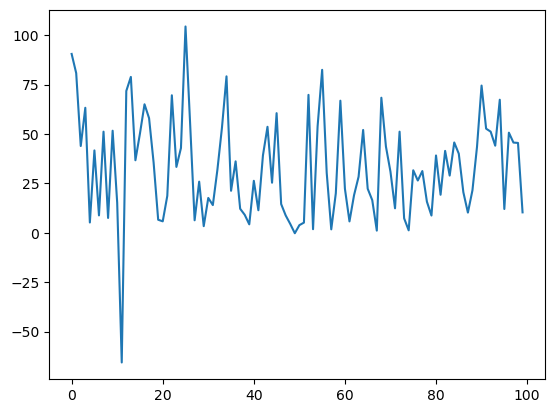

In [48]:
plt.plot(tmp, np.array([l.cpu().detach() for l in loss_list]))

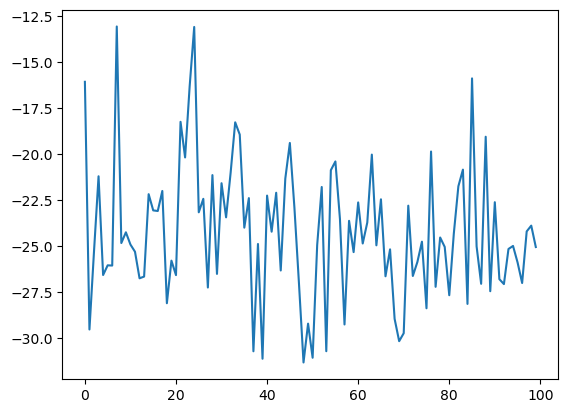

In [49]:
plt.plot(tmp, np.array([l.cpu().detach() for l in reward_list]))

In [50]:
o = []
for i in range(N):
    o.append(observations[200*(i+1)-200:200*(i+1)])

In [51]:
o_old = o.copy()
o = [j for i, j in enumerate(o) if i%10==0]

In [52]:
o = o_old[-10:]

In [53]:
x_ = [i+1 for i in range(200)]

In [54]:
np.array(o).shape

(10, 200, 3)

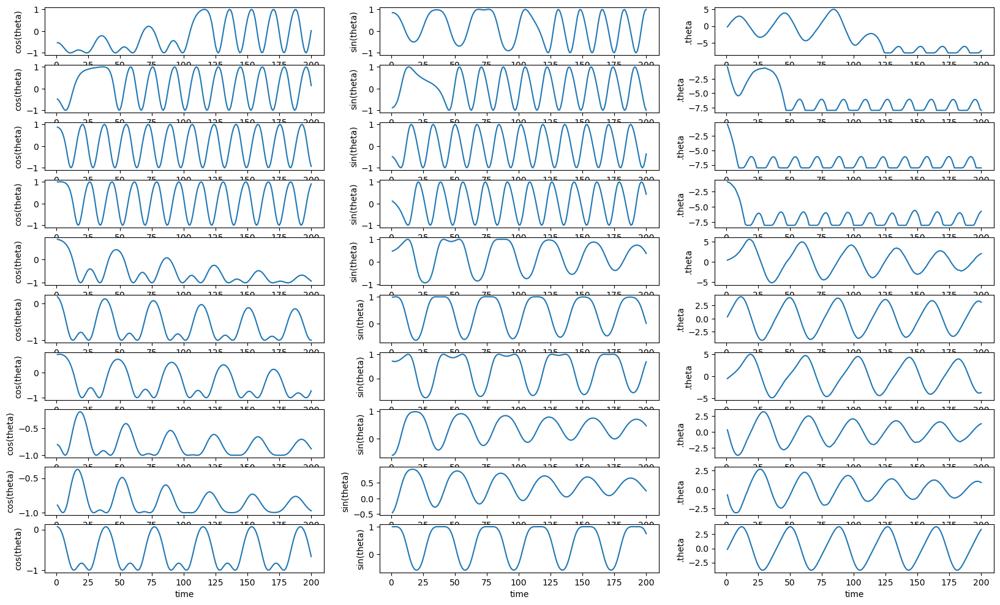

In [55]:
N = 10
plt.figure(1, figsize=(20, 12))
for i in range(N):
    obs = o[i]
    # print(obs)
    theta_ = []
    x_list = []
    y_list = []
    for x,y,v in obs:
        # print(x, y)
        theta_.append(v)
        x_list.append(x)
        y_list.append(y)
    plt.subplot(N, 3, 3*i+1)
    plt.plot(x_, x_list)
    plt.xlabel('time')
    plt.ylabel('cos(theta)')
    plt.subplot(N, 3, 3*i+2)
    plt.plot(x_, y_list)
    plt.xlabel('time')
    plt.ylabel('sin(theta)')
    plt.subplot(N, 3, 3*i+3)
    plt.plot(x_, theta_)
    plt.xlabel('time')
    plt.ylabel('.theta')

In [56]:
len(total_losses)

24000

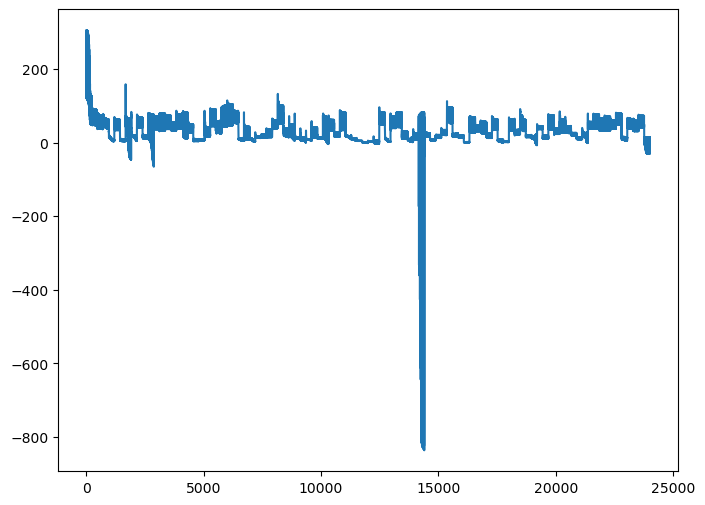

In [57]:
x = np.arange(len(total_losses))
y = [float(x) for x in total_losses]
plt.figure(figsize=(8, 6))
plt.plot(x, y)